In [1]:
import numpy as np
import pandas as pd
import statistics
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib import rcParams
from operator import itemgetter
from typing import Callable, Dict, List, Set, Tuple
from scipy.optimize import curve_fit
import csv

In [2]:
from util import calculate_derivative,pointInterval_to_pressure
from baseline import detect_breakpoints_startPoint, detect_breakpoints, detect_breakpoints_2, detect_breakpoints_3,detect_breakpoints_4,detect_breakpoints_startPoint2
from plot import PlotNSave
from data_load_N_preprocess import LoadNPreprocessData

In [3]:
#!pip install astropy

In [4]:
file_path=pressure_filePath="../data_input/pattern_left.txt"
pattern_left = pd.read_csv(file_path, delimiter=" ",skiprows=1, names=["X", "Y"],skipinitialspace = True)
pattern_left["X"]= pattern_left["X"]-pattern_left["X"][0]
pattern_left["Y"]= pattern_left["Y"]-pattern_left["Y"][0]
print(pattern_left.describe())


pattern_left_top=pattern_left.loc[pattern_left["Y"]>0]
pattern_left_bottom=pattern_left.loc[pattern_left["Y"]<0]

                X           Y
count  106.000000  106.000000
mean    -6.447343    1.100501
std      3.845383    2.987507
min    -14.049790   -2.763160
25%     -9.565758   -2.051525
50%     -6.371515    1.160395
75%     -3.177262    4.181658
max      0.000000    5.118920


In [5]:
file_path=pressure_filePath="../data_input/pattern_right_top.txt"
pattern_right_top = pd.read_csv(file_path, delimiter=" ",skiprows=1, names=["X", "Y"],skipinitialspace = True)
pattern_right_top["X"]= pattern_right_top["X"]-pattern_right_top["X"][0]
pattern_right_top["Y"]= pattern_right_top["Y"]-pattern_right_top["Y"][0]
pattern_right_top= pattern_right_top.clip(lower=0)
print(pattern_right_top.describe())
# pd.set_option('display.max_rows', pattern_right_top.shape[0]+1)
# pattern_right_top 


               X          Y
count  69.000000  69.000000
mean    1.339242   8.207413
std     1.180701   5.028328
min     0.000000   0.000000
25%     0.371150   3.726520
50%     0.962310   8.391060
75%     2.050570  12.649460
max     4.186780  16.254090


In [6]:
file_path=pressure_filePath="../data_input/pattern_right_bottom.txt"
pattern_right_bottom = pd.read_csv(file_path, delimiter=" ",skiprows=1, names=["X", "Y"],skipinitialspace = True)
pattern_right_bottom["X"]= pattern_right_bottom["X"]-pattern_right_bottom["X"][0]
pattern_right_bottom["Y"]= pattern_right_bottom["Y"]-pattern_right_bottom["Y"][0]

pattern_right_bottom= pattern_right_bottom.clip(lower=0)

print(pattern_right_bottom.describe())


               X          Y
count  77.000000  77.000000
mean    5.628174   6.761963
std     3.985883   3.379727
min     0.000000   0.000000
25%     1.995140   4.067440
50%     5.219620   7.767010
75%     9.048680   9.699000
max    12.877740  10.923490


In [7]:
def test_func_1(x, a,b,c,d):
    y = a+b*x-c*np.exp(d*x)
    return y
def test_func_2(x, a,b,c,d):
    y = a+b*x-c*np.exp(-d*x)
    return y

In [8]:
def fit_curve(xdata,ydata,test_func):
    x = np.asarray(xdata)
    y = np.asarray(ydata)
    parameters, covariance = curve_fit(test_func, x, y)
#     parameters, covariance = curve_fit(test_func, xdata, ydata)

    fit_a = parameters[0]
    fit_b = parameters[1]
    fit_c = parameters[2]
    fit_d = parameters[3]

    print(F'The parameters is {parameters}.')


    y_fit = test_func(x, fit_a, fit_b,fit_c,fit_d)

    plt.plot(x, y, 'o', label='data')
    plt.plot(x, y_fit, '-', label='LJ fit')
    return fit_a,fit_b,fit_c,fit_d

The parameters is [ 4.12959938 -0.07459858  4.31571225  0.27952833].
The parameters is [-3.00297354e+00 -3.35921627e-04 -2.99822437e+00  2.29392013e-01].
The parameters is [13.14227315  0.78460405 13.4545323   0.90468973].
The parameters is [8.77210719 0.17952762 8.95294473 0.28833003].


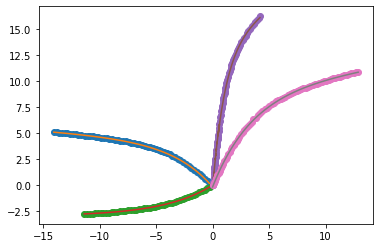

In [9]:
fit_parameters={}
curves=[pattern_left_top,pattern_left_bottom,pattern_right_top,pattern_right_bottom]
test_func=[test_func_1,test_func_1,test_func_2,test_func_2]
names=["pattern_left_top","pattern_left_bottom","pattern_right_top","pattern_right_bottom"]
for curve, func,name in zip(curves,test_func,names):
    xdata=curve["X"]
    ydata=curve["Y"]
    fit_parameters[name]=fit_curve(xdata,ydata,func)


# Synthetic_1

In [95]:
#experiment setup
ground_truth=[107, 164, 243, 328, 375, 446, 644, 713, 771, 820, 887, 953, 1036, 1101, 1179, 1254, 1319, 1396, 1456, 1513, 1598, 1648, 1719, 1784, 1875, 1938, 2017, 2073, 2185, 2247, 2315, 2369, 2433, 2487, 2552, 2610, 2835, 2916, 2965, 3044, 3101, 3240, 3284, 3368, 3411]
print(len(ground_truth))
# colum_names ={"pressure":{"Date","Pressure (psia)","first_order_derivative","second_order_derivative"},
#                     "rate":{"Time@end","Liquid rate (STB/D)"}}

colum_names={"pressure":{"time":"Date",
                        "measure":"Pressure (psia)",
                        "first_order_derivative":"first_order_derivative",
                        "second_order_derivative":"second_order_derivative"},
             "rate":{"time":"Time@end",
                     "measure":"Liquid rate (STB/D)"}}
data_inOneRow=400
pressure_filePath="../data_input/Synthetic_Data.xlsx"
rate_filePath="../data_input/Synthetic_Data.xlsx"

45


In [135]:
ground_truth_buildUp=[point for index, point in enumerate(ground_truth) if index%2!=0]
ground_truth_buildUp
len(ground_truth_buildUp)

22

In [96]:
processed_data=LoadNPreprocessData(pressure_filePath=pressure_filePath, 
                 rate_filePath=rate_filePath, 
                 colum_names=colum_names, 
                 use_SG_smoothing=False)
pressure_df=processed_data.pressure_df
rate_df=processed_data.rate_df

display(pressure_df)
display(rate_df)


---load data from 'txt' or 'xlsx' files...
---The first & second order derivative has been calculated and appended to pressure dataframe


,Date,Pressure (psia),first_order_derivative,second_order_derivative
0,0.000000,2000.000000,15175.401994,-1.593896e+06
1,0.006111,2092.738568,5434.926885,-2.211251e+05
2,0.012222,2125.952010,4083.606969,-1.648675e+05
3,0.018056,2149.773050,3121.879672,-7.945161e+04
4,0.024167,2168.851204,2636.342081,-5.537004e+04
...,...,...,...,...
3514,5938.051389,2327.338989,-0.150989,1.763948e-04
3515,5968.345556,2322.764893,-0.145646,1.653610e-04
3516,5998.640000,2318.352641,-0.140636,1.544522e-04
3517,6028.934444,2314.092149,-0.135957,0.000000e+00


,Time@end,Liquid rate (STB/D)
0,0.000000,-6742.395145
1,253.216667,-8513.514104
2,264.358333,0.000000
3,274.191667,-5548.484464
4,296.716667,-8951.244013
...,...,...
90,4465.793056,0.107707
91,4465.834722,0.105123
92,4465.909722,-1909.311284
93,5058.868056,-5453.279913


In [12]:
def pointInterval_to_curve_data(point_index:int,
                               pressure_df, 
                               delta_point:int=10,
                               colum_names:Dict={"pressure":{"time":"Date",
                                "measure":"Pressure (psia)",
                                "first_order_derivative":"first_order_derivative",
                                "second_order_derivative":"second_order_derivative"},
                                 "rate":{"time":"Time@end",
                                         "measure":"Liquid rate (STB/D)"}})->List[float]:
    """
    extract pressure measurements between point_index and point_index+delta_point
    Args:
    """
    if delta_point>0:
        sub_df=pressure_df.iloc[point_index:point_index+delta_point]
    else:
        sub_df=pressure_df.iloc[point_index+1+delta_point:point_index+1]
        #reverse dataframe
        sub_df=sub_df.iloc[::-1]
    time=sub_df[colum_names["pressure"]["time"]]-sub_df.iloc[0][colum_names["pressure"]["time"]]
    pressure_measure=sub_df[colum_names["pressure"]["measure"]]-sub_df.iloc[0][colum_names["pressure"]["measure"]]
    return {"time":list(np.round(time,6)),"pressure_measure":list(np.round(pressure_measure,6))}

pointInterval_to_curve_data(100,pressure_df)
pointInterval_to_curve_data(100,pressure_df,-10)

{'time': [0.0,
  -3.946667,
  -6.635556,
  -8.4675,
  -9.715556,
  -10.565833,
  -11.145278,
  -11.54,
  -11.808889,
  -11.991944],
 'pressure_measure': [0.0,
  -20.776825,
  -40.225757,
  -58.655368,
  -76.26545,
  -93.170596,
  -109.42044,
  -125.016514,
  -139.926528,
  -154.096933]}

In [13]:
curveDataLeft=pd.DataFrame(columns=['time', 'pressure_measure'])
for point in ground_truth:
    data=pointInterval_to_curve_data(point,pressure_df,-5,colum_names)
#     print(data)
    curveDataLeft=curveDataLeft.append(data,ignore_index=True)
    
curveDataLeft    

,time,pressure_measure
0,"[0.0, -2.928333, -5.856667, -32.745556, -51.06...","[0.0, -3.470247, -7.014217, -43.900906, -75.90..."
1,"[0.0, -0.130833, -0.261667, -1.444722, -2.499167]","[0.0, 2.357905, 4.745042, 27.800426, 50.934658]"
2,"[0.0, -2.174167, -4.348333, -10.141389, -14.08...","[0.0, -9.368156, -19.856413, -55.924786, -92.4..."
3,"[0.0, -0.002778, -0.005278, -0.012778, -0.019444]","[0.0, -0.278444, -0.564902, -1.442547, -2.296898]"
4,"[0.0, -6.5325, -13.064722, -25.545556, -34.048...","[0.0, -16.368913, -35.11735, -81.007108, -125...."
5,"[0.0, -2.443333, -4.886944, -10.816944, -16.10...","[0.0, 7.128509, 14.637056, 34.681167, 55.182097]"
6,"[0.0, -5.976667, -11.953056, -42.2475, -72.541...","[0.0, -3.126825, -6.305237, -23.287391, -41.97..."
7,"[0.0, -1.453056, -2.906389, -7.616667, -11.814...","[0.0, 7.297753, 14.854768, 41.359735, 68.062564]"
8,"[0.0, -11.356944, -22.714167, -41.033333, -53....","[0.0, -18.794173, -42.032012, -95.819834, -155..."
9,"[0.0, -0.059167, -0.118333, -0.589444, -1.009444]","[0.0, 3.113389, 6.26865, 32.974853, 59.631138]"


In [14]:
filepath= "../data_output/curveDataLeft_for_learnPattern.csv"   
curveDataLeft.to_csv(filepath,index=False,float_format='%.4f',sep='\t')

In [15]:
# point_index=100
# delta_point=-10
# sub_df=pressure_df.iloc[point_index+1+delta_point:point_index+1]
# display(sub_df)
# sub_df=sub_df.iloc[::-1]
# display(sub_df)
# sub_df.iloc[0]
# time=sub_df[colum_names["pressure"]["time"]]-sub_df.iloc[0][colum_names["pressure"]["time"]]

# pressure_measure=sub_df[colum_names["pressure"]["measure"]]-sub_df.iloc[0][colum_names["pressure"]["measure"]]
# time,pressure_measure

In [16]:
# point_index=100
# delta_point=10
# sub_df=pressure_df.iloc[point_index:point_index+delta_point]
# display(sub_df)
# sub_df.iloc[0]
# time=sub_df[colum_names["pressure"]["time"]]-sub_df.iloc[0][colum_names["pressure"]["time"]]
# time
# pressure_measure=sub_df[colum_names["pressure"]["measure"]]-sub_df.iloc[0][colum_names["pressure"]["measure"]]
# pressure_measure

[0.0, -2.928333, -5.856667, -32.745556, -51.064722] [0.0, -3.470247, -7.014217, -43.900906, -75.907231]


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


45

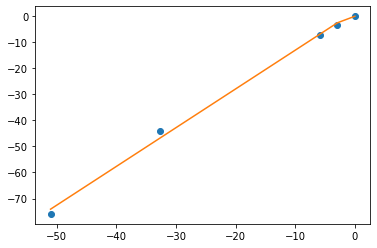

In [53]:
def fit_curve(xdata,ydata,test_func,parameter_number):
    x = np.asarray(xdata)
    y = np.asarray(ydata)
    parameters, covariance = curve_fit(test_func, x, y)
#     parameters, covariance = curve_fit(test_func, xdata, ydata)
#     print(F'The parameters is {parameters}.')
    if parameter_number==4:
        fit_a = parameters[0]
        fit_b = parameters[1]
        fit_c = parameters[2]
        fit_d = parameters[3]

        y_fit = test_func(x, fit_a, fit_b,fit_c,fit_d)

    if parameter_number==3:
        fit_a = parameters[0]
        fit_b = parameters[1]
        fit_c = parameters[2]

        y_fit = test_func(x, fit_a, fit_b,fit_c)
    
    plt.plot(x, y, 'o', label='data')
    plt.plot(x, y_fit, '-', label='LJ fit')
#     plt.show()
    return parameters

len(curveDataLeft)
xdata=curveDataLeft["time"][0]
ydata=curveDataLeft["pressure_measure"][0]
print(xdata,ydata)
test_func=test_func_1
fit_curve(xdata,ydata,test_func,4)

len(curveDataLeft)

-----------i--------- 0
The parameters is [ 1.85605685  1.48729861  1.85605685 47.05964005].
The parameters is [4.32439037e-01 1.35117686e+00 4.88274176e-22 1.00000160e+00].
-----------i--------- 1


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.

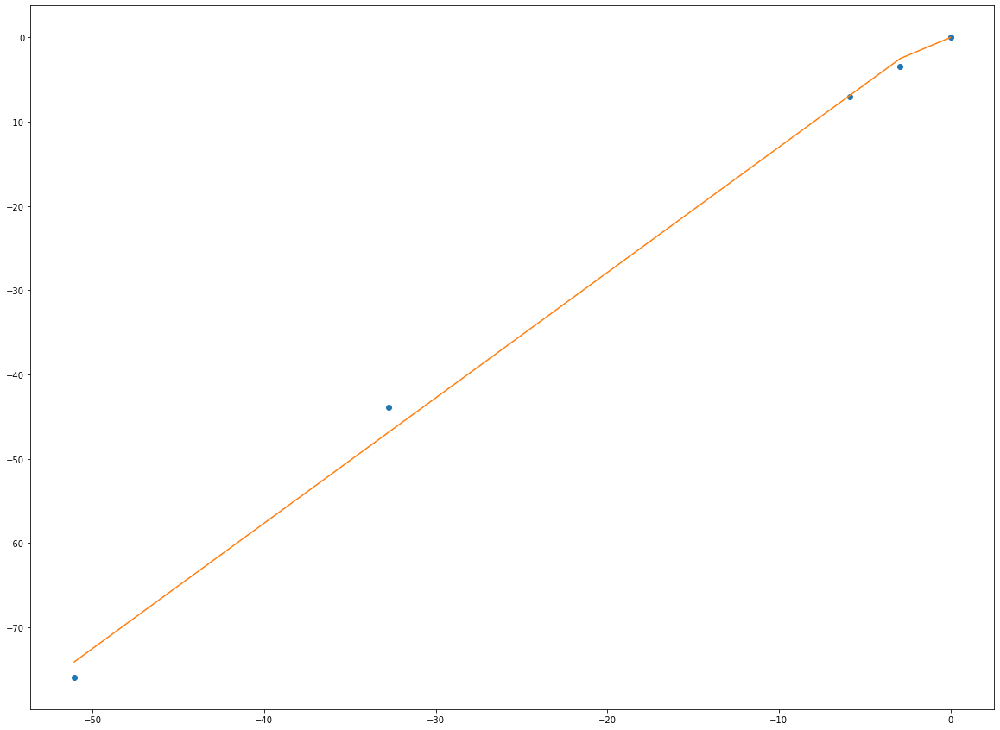

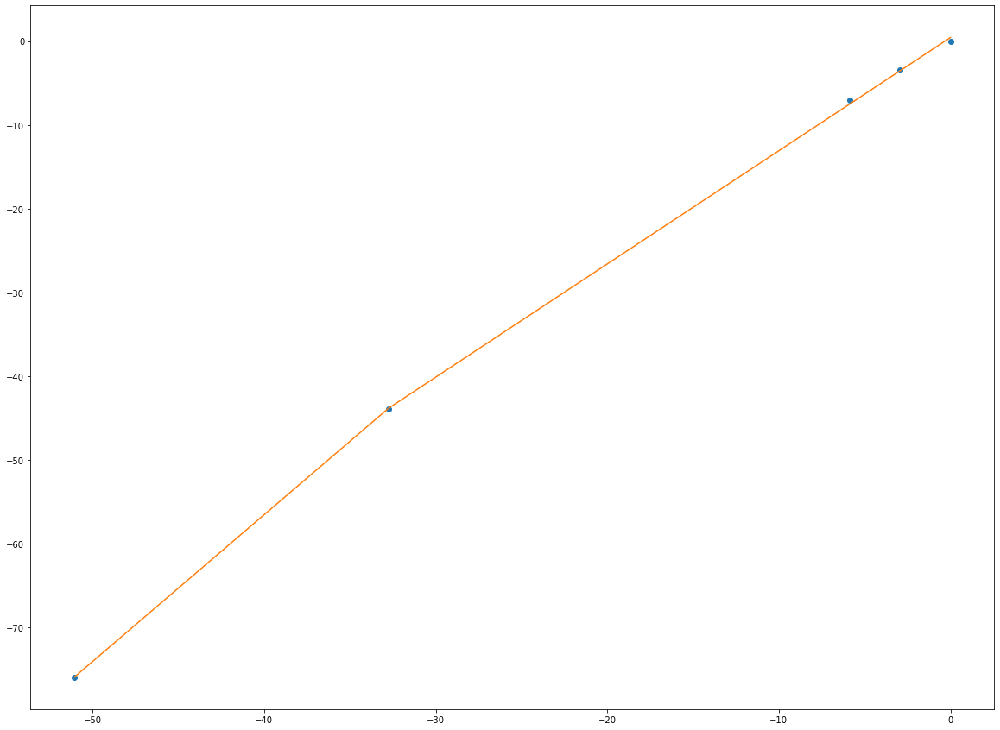

In [18]:
for i in range(len(curveDataLeft)):
    xdata=curveDataLeft["time"][i]
    ydata=curveDataLeft["pressure_measure"][i]
#     print(xdata,ydata)
    print("-----------i---------",i)
    try:
        test_func=test_func_1
        fit_curve(xdata,ydata,test_func,4)
    except RuntimeError:
        test_func=test_func_2
        fit_curve(xdata,ydata,test_func,4)
    try:
        test_func=test_func_2
        fit_curve(xdata,ydata,test_func,4)
    except RuntimeError:
        test_func=test_func_1
        fit_curve(xdata,ydata,test_func,4)

In [34]:
number=10
curve_points = np.empty((0, number), int)
print(curve_points)
type(parameters[0])
a,b,c=parameters[0]
x=np.linspace(start = 0, stop = 1, num = number)
temp=test_func_3(x, a,b,c)
print(temp,type(temp))
curve_points=np.append(curve_points,np.array([test_func_3(x, a,b,c)]), axis=0)
curve_points

[]
[-0.19588186 -0.07589932  0.04388926  0.16348387  0.28288452  0.40209121
  0.52110393  0.63992269  0.75854749  0.87697833] <class 'numpy.ndarray'>


array([[-0.19588186, -0.07589932,  0.04388926,  0.16348387,  0.28288452,
         0.40209121,  0.52110393,  0.63992269,  0.75854749,  0.87697833]])

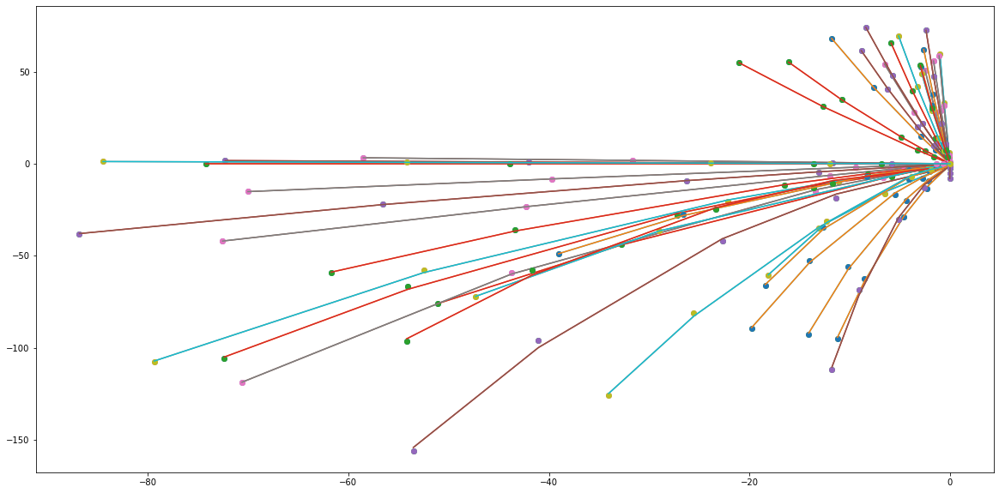

In [69]:
number=10
curve_points = np.empty((0, number), int)
x=np.linspace(start = -0.1, stop = 0, num = number)
parameters=[]
plt.figure(figsize = (20, 10))
def test_func_3(x, a,b,c):
    y = a+b*x+c*x*x
    return y
for i in range(len(curveDataLeft)):
    xdata=curveDataLeft["time"][i]
    ydata=curveDataLeft["pressure_measure"][i]
#     print(xdata,ydata)
#     print("-----------i---------",i)
    try:
        test_func=test_func_3
        parameters.append(fit_curve(xdata,ydata,test_func_3,3))
        a,b,c=fit_curve(xdata,ydata,test_func_3,3)
        y=test_func_3(x, a,b,c)
       
        curve_points=np.append(curve_points,np.array([y]), axis=0)
        
    except RuntimeError:
        print("----------errors",RuntimeError)
        pass

In [70]:
curve_points.shape
curve_max=curve_points.max(axis=0)
curve_max

array([5.25903966, 4.67078335, 4.08436097, 3.49977254, 2.91701804,
       2.33609749, 1.75701087, 1.17975819, 0.60433944, 0.06514206])

In [71]:
curve_points.shape
curve_min=curve_points.min(axis=0)
curve_min

array([-57.60859616, -48.87171021, -40.71940693, -33.15168631,
       -26.16854835, -19.76999306, -13.95602043,  -8.72663047,
        -4.08182317,  -1.64982249])

47

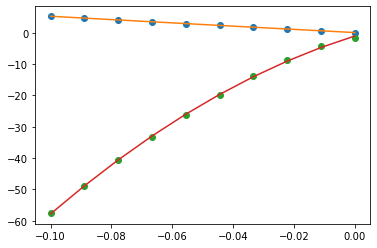

In [72]:
xdata=x
test_func=test_func_3
parameters.append(fit_curve(xdata,curve_max,test_func_3,3))
# a,b,c=fit_curve(xdata,ydata,test_func_3,3)

parameters.append(fit_curve(xdata,curve_min,test_func_3,3))
# a,b,c=fit_curve(xdata,ydata,test_func_3,3)
len(parameters)


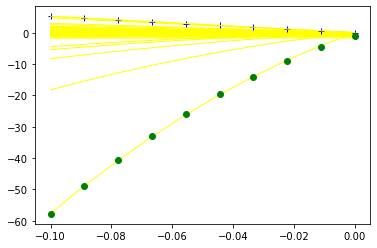

In [89]:
for i,p in enumerate(parameters):
    a,b,c=p
    y=test_func_3(x, a,b,c)
    if i==len(parameters)-2:
        plt.plot(x, y, 'r+', label='LJ fit',color="blue",linewidth=5)
    if i==len(parameters)-1:
        plt.plot(x, y, 'bo', label='LJ fit',color="green")
    else:
        plt.plot(x, y, '-', label='LJ fit',color="yellow",linewidth=1)
        

In [92]:
a=[1,2,3]
a[-1]

3

In [357]:
class LearnPattern:
    def __init__(self, 
#                  pressure_measure:List[float],
#                  pressure_time:List[float],
#                  ground_truth:List[int],
                 delta_pointNumber:int=5,
                 deltaTime_learn:float=0.1,
                 fitting_func=quadratic_func,
                 filePath_learnedPattern="../data_output/Learned_Pattern.csv",
#                 filepath_curveDataLeft= "../data_output/curveDataLeft_forLearning.csv",
#                 filepath_curveDataRight= "../data_output/curveDataRight_forLearning.csv"
                ):
        
#         self.pressure_measure=pressure_measure
#         self.pressure_time=pressure_time
#         self.ground_truth=ground_truth
        self.colum_names=colum_names
        self.filePath_learnedPattern=filePath_learnedPattern
        self.delta_pointNumber=delta_pointNumber
        self.deltaTime_learn=deltaTime_learn
        self.fitting_func=fitting_func
#         self.filepath_curveDataLeft=filepath_curveDataLeft
#         self.filepath_curveDataRight=filepath_curveDataRight
        
#         self.curveDataLeft=pd.DataFrame(columns=['time', 'pressure_measure'])
#         self.curveDataRight=pd.DataFrame(columns=['time', 'pressure_measure'])
        self.curveData=pd.DataFrame(columns=['pressure_time_left', 'pressure_measure_left','pressure_time_right', 'pressure_measure_right'])
        self.curveLeft_parameters=[]
        self.curveRight_parameters=[]
        self.parameters_PatternField={}
        self.x_leftPlot=[]
        self.x_rightPlot=[]
        

#     def point_to_curve_data(self, point_index:int,pointNumber,pressure_measure,pressure_time)->List[float]:
#         """
#         extract pressure measurements between point_index and point_index+delta_point
#         Args:
#         delta_point
#         """
#         if pointNumber>0:
#             sub_measure=pressure_measure[point_index:point_index+pointNumber]
#             sub_time=pressure_time[point_index:point_index+pointNumber]
#             curve_pressure=[round(measure-sub_measure[0],6) for measure in sub_measure]
#             curve_time=[round(time-sub_time[0],6) for time in sub_time]
#         else:
#             sub_measure=pressure_measure[point_index+1+pointNumber:point_index+1]
#             sub_time=pressure_time[point_index+1+pointNumber:point_index+1]
#             curve_pressure=[round(measure-sub_measure[-1],6) for measure in sub_measure]
#             curve_time=[round(time-sub_time[-1],6) for time in sub_time]

#         return {"time":curve_time,"pressure_measure":curve_pressure}

#     def produceNSave_curveData(self,pressure_measure,pressure_time,points):     
#         for point in points:
#             data_left=self.point_to_curve_data(point,-self.delta_pointNumber,pressure_measure,pressure_time)
#             self.curveDataLeft=self.curveDataLeft.append(data_left,ignore_index=True)
#             data_right=self.point_to_curve_data(point,self.delta_pointNumber,pressure_measure,pressure_time)
#             self.curveDataRight=self.curveDataRight.append(data_right,ignore_index=True)
#         self.curveDataLeft.to_csv(self.filepath_curveDataLeft,index=False,float_format='%.4f',sep='\t')
#         self.curveDataRight.to_csv(self.filepath_curveDataRight,index=False,float_format='%.4f',sep='\t')   
        
    def produceNSave_curveData(self,pressure_measure,pressure_time,points):  
        self.curveData=pd.DataFrame(columns=['pressure_time_left', 'pressure_measure_left','pressure_time_right', 'pressure_measure_right'])
#         self.curveDataLeft=pd.DataFrame(columns=['time', 'pressure_measure'])
#         self.curveDataRight=pd.DataFrame(columns=['time', 'pressure_measure'])
        
        for point_index in points:
            #left   
            sub_measure=pressure_measure[point_index+1-self.delta_pointNumber:point_index+1]
            sub_time=pressure_time[point_index+1-self.delta_pointNumber:point_index+1]
            curve_pressure=[round(measure-sub_measure[-1],6) for measure in sub_measure]
            curve_time=[round(time-sub_time[-1],6) for time in sub_time]
            data={"pressure_time_left":curve_time,"pressure_measure_left":curve_pressure}
        
            
            #right
            sub_measure=pressure_measure[point_index:point_index+self.delta_pointNumber]
            sub_time=pressure_time[point_index:point_index+self.delta_pointNumber]
            curve_pressure=[round(measure-sub_measure[0],6) for measure in sub_measure]
            curve_time=[round(time-sub_time[0],6) for time in sub_time]
            data.update({"pressure_time_right":curve_time,
                         "pressure_measure_right":curve_pressure})
            
            
            self.curveData=self.curveData.append(data,ignore_index=True)
       
#         self.curveDataLeft.to_csv(self.filepath_curveDataLeft,index=False,float_format='%.4f',sep='\t')
#         self.curveDataRight.to_csv(self.filepath_curveDataRight,index=False,float_format='%.4f',sep='\t') 

        
#     def fit_curve(self,xdata,ydata):
#         x = np.asarray(xdata)
#         y = np.asarray(ydata)
        
#         parameters, covariance = curve_fit(self.fitting_func, x, y)
#         y_fit = self.fitting_func(x, *parameters)

#         plt.plot(x, y, 'o', label='data')
#         plt.plot(x, y_fit, '-', label='LJ fit')
#         plt.show()
#         return parameters

    def fit_curve(self,xdata,ydata):
        x = np.asarray(xdata)
        y = np.asarray(ydata)
        
#         parameters, covariance = curve_fit(self.fitting_func, x, y)
#         y_fit = self.fitting_func(x, *parameters)
        parameters=np.polyfit(x,y,3)
        y_fit=np.polyval(parameters,x)
#         print(parameters)

        plt.plot(x, y, 'o', label='data')
        plt.plot(x, y_fit, '-', label='LJ fit')
#         plt.show()
        return parameters
    
    def calculate_Parameters_allCurve(self):
        plt.figure(figsize = (20, 10))

        for i in range(len(self.curveData)):
            #left side
                        
#             print("-----------i---------",i)
            xdata=self.curveData["pressure_time_left"][i]
            ydata=self.curveData["pressure_measure_left"][i]
#             print(xdata,ydata)
            if i==0:
                xLeft_min=abs(xdata[0])
                self.x_leftPlot=xdata
            if i>0 and abs(xdata[0])<xLeft_min:
                xLeft_min=abs(xdata[0])
                self.x_leftPlot=xdata
                
         
            self.curveLeft_parameters.append(self.fit_curve(xdata,ydata))

            
            #right side
            xdata=self.curveData["pressure_time_right"][i]
            ydata=self.curveData["pressure_measure_right"][i]
            if i==0:
                xRight_min=abs(xdata[-1])
                self.x_rightPlot=xdata
            if i>0 and abs(xdata[-1])<xRight_min:
                xRight_min=abs(xdata[-1])
                self.x_rightPlot=xdata
          
            self.curveRight_parameters.append(self.fit_curve(xdata,ydata))
        
            
    def calculate_PatternField(self):
#         y_left_allCurve = np.empty((0, len(self.x_leftPlot)), float)
#         y_right_allCurve = np.empty((0, len(self.x_rightPlot)), float)
  
#         #left
#         x_left=np.asarray(self.x_leftPlot)
#         x_right=np.asarray(self.x_rightPlot)
        number=10
        y_left_allCurve = np.empty((0, number), float)
        y_right_allCurve = np.empty((0, number), float)
        x_left=np.linspace(start = -0.1, stop = 0, num = number)
        x_right=np.linspace(start = 0, stop = 0.1, num = number)
    
        plt.figure(figsize = (20, 10))
        curve_number=len(self.curveRight_parameters)
        for i in range(curve_number):
            y_left=self.fitting_func(x_left, self.curveLeft_parameters[i])
            plt.plot(x_left, y_left, '-', label='LJ fit',color="yellow",linewidth=1)
            y_left_allCurve=np.append(y_left_allCurve,np.array([y_left]), axis=0)
            
            y_right=self.fitting_func(x_right, self.curveRight_parameters[i])
            plt.plot(x_right, y_right, '-', label='LJ fit',color="yellow",linewidth=1)
            y_right_allCurve=np.append(y_right_allCurve,np.array([y_right]), axis=0)
            
        left_parameters_PatternField=self.fitNPlot_maxNMin(x_left,y_left_allCurve)
        right_parameters_PatternField=self.fitNPlot_maxNMin(x_right,y_right_allCurve)
        self.parameters_PatternField["left top"]=left_parameters_PatternField["top"]
        self.parameters_PatternField["left bottom"]=left_parameters_PatternField["bottom"]
        self.parameters_PatternField["right top"]=right_parameters_PatternField["top"]
        self.parameters_PatternField["right bottom"]=right_parameters_PatternField["bottom"]


    def fitNPlot_maxNMin(self,x,y_allCurve):
        half_parameters_PatternField={}
        
        y_allCurve_max=y_allCurve.max(axis=0)
        half_parameters_PatternField["top"]=self.fit_curve(x,y_allCurve_max)
     
        y_allCurve_min=y_allCurve.min(axis=0)
        half_parameters_PatternField["bottom"]=self.fit_curve(x,y_allCurve_min)
        
        return half_parameters_PatternField
    
    def learn(self,pressure_measure,pressure_time,ground_truth):
        self.produceNSave_curveData(pressure_measure,pressure_time,ground_truth)
        self.calculate_Parameters_allCurve()
        self.calculate_PatternField()
    def sav_pattern(self,filepath_save):
        pattern_df=pd.DataFrame(self.parameters_PatternField)
        pattern_df.to_csv(filepath_save,index=False,float_format='%.4f',sep='\t',mode="a")
        
#     def check_inPattern(self,curveData):
#         border_names=["left top","left bottom","right top","right bottom"]
#         display(curveData)
#         curveData["pressure_time_right"].reverse()
#         curveData["pressure_measure_right"].reverse()
#         xzip=[curveData["pressure_time_left"],
#               curveData["pressure_time_left"],
#               curveData["pressure_time_right"],
#               curveData["pressure_time_right"]]
#         print(xzip)
#         y_field={}
#         for border_name, x, parameters in zip(border_names,xzip,self.parameters_PatternField.values):
#             y_field[border_name]=self.fitting_func(x, parameters)
            
#         if (np.array(curveData["pressure_measure_left"][0:-1])>=np.array(y_field["left bottom"]) and 
#             np.array(curveData["pressure_measure_left"][0:-1])<=np.array(y_field["left top"]) and
#         np.array(curveData["pressure_measure_left"][0:-1])>=np.array(y_field["left bottom"]) and 
#         np.array(curveData["pressure_measure_left"][0:-1])>=np.array(y_field["left bottom"])):
#             breakpoints.append()
        
        
    def predict(self,pressure_measure,pressure_time):
        breakpoints=[]
        points=[point_index for point_index in range(self.delta_pointNumber,len(pressure_measure)-self.delta_pointNumber)]
        self.produceNSave_curveData(pressure_measure,pressure_time,points)

        for index,curveData in self.curveData.iterrows():
            border_names=["left top","left bottom","right top","right bottom"]
#             display(curveData)
            curveData["pressure_time_right"].reverse()
            curveData["pressure_measure_right"].reverse()
            xzip=[curveData["pressure_time_left"],
                  curveData["pressure_time_left"],
                  curveData["pressure_time_right"],
                  curveData["pressure_time_right"]]
#             print(xzip)
            y_field={}
            for border_name, x, parameters in zip(border_names,xzip,self.parameters_PatternField.values()):
                y_field[border_name]=self.fitting_func(x, parameters)
#             display("-----y_field-----",y_field)
#             display("-----curveData----:",curveData)
                

            if (all(np.array(curveData["pressure_measure_left"][0:-1])>=np.array(y_field["left bottom"][0:-1])) and 
                all(np.array(curveData["pressure_measure_left"][0:-1])<=np.array(y_field["left top"][0:-1])) and
            all(np.array(curveData["pressure_measure_right"][0:-1])>=np.array(y_field["right bottom"][0:-1])) and 
            all(np.array(curveData["pressure_measure_right"][0:-1])<=np.array(y_field["right top"][0:-1]))):
                breakpoints.append(index+self.delta_pointNumber)
        return breakpoints
            
        
      

In [352]:
a=[1,1,1,2,3,3,3,2,2,2]
print(len(a))
number=2
points=[point_index for point_index in range(number,len(a)-number)]
points

10


[2, 3, 4, 5, 6, 7]

{'left top': array([ 1.48758493e+01,  8.31494875e+00, -5.21621472e+01,  1.87698675e-03]),
 'left bottom': array([ 5.68362323e+04, -6.25953527e+02,  3.51861465e+02, -9.06842313e-03]),
 'right top': array([ 1.98633499e+07, -1.02594438e+06,  2.00614262e+04,  6.45184429e-01]),
 'right bottom': array([ 9.05402441e+06, -4.85466766e+05,  1.00175843e+04, -2.75853337e+00])}

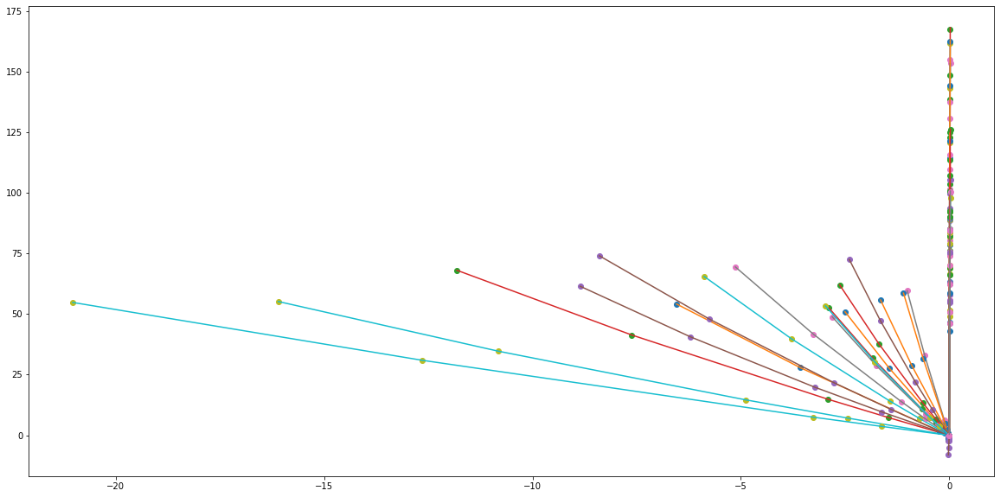

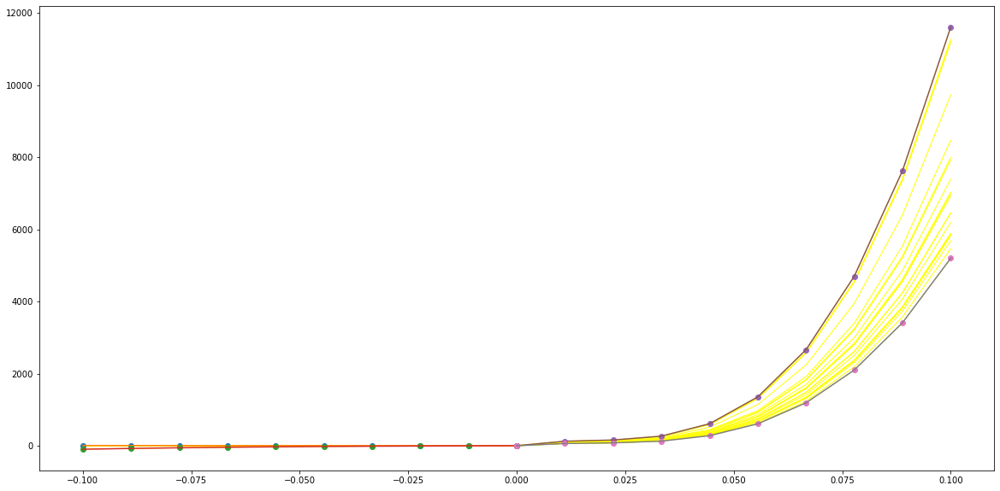

In [358]:
def test_func(x, a,b,c,d):
    y = a+b*x-c*np.exp(-d*x)
    return y
def test_func(x, a,b,c,d):
    y = a+b*x-c*np.exp(d*x)
    return y
def test_func(x, a,b,c,d):
    y = a+c*np.exp(d*x)
    return y

def fitting_func_wapper(x, p3):
    y = np.polyval(p3,x)
    return y

# def fitting_func_wapper(x, parameters):
#     a,b,c=parameters
#     y = a+b*x+c*x*x
#     return y

pressure_measure=list(pressure_df[colum_names["pressure"]["measure"]])
pressure_time=list(pressure_df[colum_names["pressure"]["time"]])
learn_pattern=LearnPattern(delta_pointNumber =5,fitting_func=fitting_func_wapper)
learn_pattern.learn(pressure_measure,pressure_time,ground_truth_buildUp)
learn_pattern.parameters_PatternField

In [354]:
learn_pattern.curveData

,pressure_time_left,pressure_measure_left,pressure_time_right,pressure_measure_right
0,"[-2.499167, -1.444722, -0.261667, -0.130833, 0.0]","[50.934658, 27.800426, 4.745042, 2.357905, 0.0]","[0.0, 0.006111, 0.012222, 0.018056, 0.024167]","[0.0, 76.208313, 103.431983, 122.926474, 138.5..."
1,"[-0.019444, -0.012778, -0.005278, -0.002778, 0.0]","[-2.296898, -1.442547, -0.564902, -0.278444, 0.0]","[0.0, 0.006111, 0.011944, 0.018056, 0.026667]","[0.0, 80.421069, 109.587133, 130.639113, 153.6..."
2,"[-16.102222, -10.816944, -4.886944, -2.443333,...","[55.182097, 34.681167, 14.637056, 7.128509, 0.0]","[0.0, 0.006111, 0.012222, 0.018056, 0.024167]","[0.0, 62.699305, 85.14341, 101.235696, 114.1205]"
3,"[-11.814722, -7.616667, -2.906389, -1.453056, ...","[68.062564, 41.359735, 14.854768, 7.297753, 0.0]","[0.0, 0.006111, 0.012222, 0.018056, 0.024167]","[0.0, 57.915989, 78.638861, 93.493076, 105.383..."
4,"[-1.009444, -0.589444, -0.118333, -0.059167, 0.0]","[59.631138, 32.974853, 6.26865, 3.113389, 0.0]","[0.0, 0.006111, 0.012222, 0.018333, 0.024444]","[0.0, 50.957296, 69.004806, 81.859874, 92.093121]"
5,"[-6.542222, -3.570278, -0.235556, -0.117778, 0.0]","[54.142315, 27.864411, 1.731964, 0.864234, 0.0]","[0.0, 0.006111, 0.012222, 0.018333, 0.024444]","[0.0, 92.041139, 124.976346, 148.585303, 167.4..."
6,"[-8.853611, -6.204722, -3.232778, -1.616389, 0.0]","[61.450868, 40.563749, 19.888138, 9.643728, 0.0]","[0.0, 0.006111, 0.012222, 0.018333, 0.024444]","[0.0, 55.72396, 75.658446, 89.945758, 101.381417]"
7,"[-21.034167, -12.657778, -3.259444, -1.629722,...","[54.801219, 30.974077, 7.480955, 3.701327, 0.0]","[0.0, 0.006111, 0.012222, 0.018333, 0.024444]","[0.0, 46.536062, 63.193774, 75.137015, 84.699588]"
8,"[-2.890833, -1.836389, -0.653056, -0.326389, 0.0]","[52.594461, 31.808648, 10.756382, 5.307512, 0.0]","[0.0, 0.006111, 0.012222, 0.018333, 0.024444]","[0.0, 54.847727, 74.428599, 88.444792, 99.651009]"
9,"[-2.8075, -1.753056, -0.569722, -0.284722, 0.0]","[48.864864, 28.801664, 8.82828, 4.355639, 0.0]","[0.0, 0.006111, 0.012222, 0.018333, 0.024444]","[0.0, 88.812683, 120.561496, 143.306309, 161.5..."


In [355]:

breakpoints=learn_pattern.predict(pressure_measure,pressure_time)

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-92.223616, -59.010174, -35.189133, -16.11097...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 14.043148, 26.546557, 37.850582, 48.189208]
Name: 0, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-92.223616, -59.010174, -35.189133, -16.11097...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [48.189208, 37.850582, 26.546557, 14.043148, 0.0]
Name: 0, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-73.053321, -49.23228, -30.154127, -14.043148...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right      [0.0, 12.50341, 23.807434, 34.14606, 44.586751]
Name: 1, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-73.053321, -49.23228, -30.154127, -14.043148...
pressure_time_right           [0.024722, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right      [44.586751, 34.14606, 23.807434, 12.50341, 0.0]
Name: 1, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-61.73569, -42.657536, -26.546557, -12.50341,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, 11.304025, 21.642651, 32.083341, 42.856253]
Name: 2, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-61.73569, -42.657536, -26.546557, -12.50341,...
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.005833, 0.0]
pressure_measure_right    [42.856253, 32.083341, 21.642651, 11.304025, 0.0]
Name: 2, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-53.961561, -37.850582, -23.807434, -11.30402...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, 10.338626, 20.779317, 31.552229, 42.657655]
Name: 3, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-53.961561, -37.850582, -23.807434, -11.30402...
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right    [42.657655, 31.552229, 20.779317, 10.338626, 0.0]
Name: 3, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-48.189208, -34.14606, -21.642651, -10.338626...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, 10.440691, 21.213602, 32.319029, 43.756568]
Name: 4, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-48.189208, -34.14606, -21.642651, -10.338626...
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right    [43.756568, 32.319029, 21.213602, 10.440691, 0.0]
Name: 4, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-44.586751, -32.083341, -20.779317, -10.44069...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, 10.772912, 21.878338, 33.315877, 45.084371]
Name: 5, dtype: object

[[-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([316.09668815, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([149.43339771,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-44.586751, -32.083341, -20.779317, -10.44069...
pressure_time_right             [0.035833, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right    [45.084371, 33.315877, 21.878338, 10.772912, 0.0]
Name: 5, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-42.856253, -31.552229, -21.213602, -10.77291...
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right     [0.0, 11.105426, 22.542965, 34.31146, 46.409042]
Name: 6, dtype: object

[[-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-42.856253, -31.552229, -21.213602, -10.77291...
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008333, 0.0]
pressure_measure_right     [46.409042, 34.31146, 22.542965, 11.105426, 0.0]
Name: 6, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-42.657655, -32.319029, -21.878338, -11.10542...
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right    [0.0, 11.437539, 23.206033, 35.303615, 47.727658]
Name: 7, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 242.06519697, 150.40275453, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 116.99101455,  75.83864081,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-42.657655, -32.319029, -21.878338, -11.10542...
pressure_time_right                  [0.045, 0.031944, 0.02, 0.009444, 0.0]
pressure_measure_right    [47.727658, 35.303615, 23.206033, 11.437539, 0.0]
Name: 7, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-43.756568, -33.315877, -22.542965, -11.43753...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right    [0.0, 11.768494, 23.866076, 36.290119, 49.037295]
Name: 8, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.09796548e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 146.67229053,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-43.756568, -33.315877, -22.542965, -11.43753...
pressure_time_right             [0.050556, 0.035556, 0.0225, 0.010556, 0.0]
pressure_measure_right    [49.037295, 36.290119, 23.866076, 11.768494, 0.0]
Name: 8, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-45.084371, -34.31146, -23.206033, -11.768494...
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right    [0.0, 12.097582, 24.521625, 37.268801, 50.335043]
Name: 9, dtype: object

[[-0.035833, -0.028333, -0.02, -0.010556, 0.0], [-0.035833, -0.028333, -0.02, -0.010556, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.88099520e+00, 1.48612366e+00, 1.04832690e+00, 5.53409642e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60360657e+01, -1.17735646e+01, -7.75136900e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.45746365e+03, 4.32845614e+02, 1.71330443e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([653.52802958, 200.65557377,  85.7334759 ,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-45.084371, -34.31146, -23.206033, -11.768494...
pressure_time_right                  [0.056667, 0.04, 0.025, 0.011944, 0.0]
pressure_measure_right    [50.335043, 37.268801, 24.521625, 12.097582, 0.0]
Name: 9, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-46.409042, -35.303615, -23.866076, -12.09758...
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, 12.424043, 25.171218, 38.237461, 51.618035]
Name: 10, dtype: object

[[-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.67614445e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.37403151e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.22593108e+02, 1.94589318e+02, 1.31891745e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  284.13788293,   96.11377415,   65.42866374,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-46.409042, -35.303615, -23.866076, -12.09758...
pressure_time_right           [0.063611, 0.044722, 0.028056, 0.013056, 0.0]
pressure_measure_right    [51.618035, 38.237461, 25.171218, 12.424043, 0.0]
Name: 10, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [-47.727658, -36.290119, -24.521625, -12.42404...
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071667]
pressure_measure_right    [0.0, 12.747176, 25.813418, 39.193992, 52.883474]
Name: 11, dtype: object

[[-0.045, -0.035556, -0.025, -0.013056, 0.0], [-0.045, -0.035556, -0.025, -0.013056, 0.0], [0.071667, 0.050556, 0.031667, 0.015, 0.0], [0.071667, 0.050556, 0.031667, 0.015, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.31089507e+00, 6.84290233e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.00848921e+01, -4.83616107e+00,
        -9.06842313e-03]),
 'right top': array([3.48053608e+03, 9.59323420e+02, 2.37887719e+02, 1.37767897e+02,
        6.45184429e-01]),
 'right bottom': array([1554.4611363 ,  432.81124203,  115.15904499,   68.83254065,
          -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [-47.727658, -36.290119, -24.521625, -12.42404...
pressure_time_right              [0.071667, 0.050556, 0.031667, 0.015, 0.0]
pressure_measure_right    [52.883474, 39.193992, 25.813418, 12.747176, 0.0]
Name: 11, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [-49.037295, -37.268801, -25.171218, -12.74717...
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right     [0.0, 13.066242, 26.446817, 40.136299, 54.12865]
Name: 12, dtype: object

[[-0.050556, -0.04, -0.028056, -0.015, 0.0], [-0.050556, -0.04, -0.028056, -0.015, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.86129852e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.61965223e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [-49.037295, -37.268801, -25.171218, -12.74717...
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016667, 0.0]
pressure_measure_right     [54.12865, 40.136299, 26.446817, 13.066242, 0.0]
Name: 12, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-50.335043, -38.237461, -25.813418, -13.06624...
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, 13.380575, 27.070056, 41.062408, 55.350973]
Name: 13, dtype: object

[[-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0]]


'-----y_field-----'

{'left top': array([2.98174302e+00, 2.34997231e+00, 1.66156153e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.23003038e+01, -2.20807654e+01, -1.35840414e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.97640612e+03, 2.23811943e+03, 4.32845614e+02, 1.47403141e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.56692704e+03,  1.00053921e+03,  2.00655574e+02,  7.42713189e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-50.335043, -38.237461, -25.813418, -13.06624...
pressure_time_right                   [0.09, 0.063611, 0.04, 0.018889, 0.0]
pressure_measure_right    [55.350973, 41.062408, 27.070056, 13.380575, 0.0]
Name: 13, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-51.618035, -39.193992, -26.446817, -13.38057...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, 13.689482, 27.681833, 41.970398, 56.547984]
Name: 14, dtype: object

[[-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.65831655e+00, 1.86639761e+00, 9.90034256e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.67418384e+01, -1.58660449e+01, -7.26176340e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-51.618035, -39.193992, -26.446817, -13.38057...
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [56.547984, 41.970398, 27.681833, 13.689482, 0.0]
Name: 14, dtype: object

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [-52.883474, -40.136299, -27.070056, -13.68948...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, 13.992352, 28.280916, 42.858502, 57.717389]
Name: 15, dtype: object

[[-0.071667, -0.056667, -0.04, -0.021111, 0.0], [-0.071667, -0.056667, -0.04, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.77741279e+00, 2.98174302e+00, 2.10071474e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.93619457e+01, -3.23003038e+01, -1.87225715e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [-52.883474, -40.136299, -27.070056, -13.68948...
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [57.717389, 42.858502, 28.280916, 13.992352, 0.0]
Name: 15, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-54.12865, -41.062408, -27.681833, -13.992352...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 14.288565, 28.86615, 43.725037, 58.857063]
Name: 16, dtype: object

[[-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.34977966e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.95534072e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-54.12865, -41.062408, -27.681833, -13.992352...
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right     [58.857063, 43.725037, 28.86615, 14.288565, 0.0]
Name: 16, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-55.350973, -41.970398, -28.280916, -14.28856...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, 14.577586, 29.436472, 44.568498, 59.965082]
Name: 17, dtype: object

[[-0.09, -0.071111, -0.05, -0.026389, 0.0], [-0.09, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.75297682e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.81804372e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-55.350973, -41.970398, -28.280916, -14.28856...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [59.965082, 44.568498, 29.436472, 14.577586, 0.0]
Name: 17, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-56.547984, -42.858502, -28.86615, -14.577586...
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right    [0.0, 14.858887, 29.990913, 45.387497, 61.039721]
Name: 18, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.79688360e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.61047831e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-56.547984, -42.858502, -28.86615, -14.577586...
pressure_time_right           [0.159722, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [61.039721, 45.387497, 29.990913, 14.858887, 0.0]
Name: 18, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-57.717389, -43.725037, -29.436472, -14.85888...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right     [0.0, 15.132026, 30.52861, 46.180834, 62.079478]
Name: 19, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.62508891e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.17881388e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-57.717389, -43.725037, -29.436472, -14.85888...
pressure_time_right             [0.179444, 0.126389, 0.079444, 0.0375, 0.0]
pressure_measure_right     [62.079478, 46.180834, 30.52861, 15.132026, 0.0]
Name: 19, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-58.857063, -44.568498, -29.990913, -15.13202...
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, 15.396584, 31.048808, 46.947452, 63.083069]
Name: 20, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.62835563e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.41085270e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-58.857063, -44.568498, -29.990913, -15.13202...
pressure_time_right           [0.201111, 0.141944, 0.088889, 0.041944, 0.0]
pressure_measure_right    [63.083069, 46.947452, 31.048808, 15.396584, 0.0]
Name: 20, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-59.965082, -45.387497, -30.52861, -15.396584...
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, 15.652224, 31.550868, 47.686485, 64.049449]
Name: 21, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.36404818e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.34324752e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-59.965082, -45.387497, -30.52861, -15.396584...
pressure_time_right                [0.225833, 0.159167, 0.1, 0.046944, 0.0]
pressure_measure_right    [64.049449, 47.686485, 31.550868, 15.652224, 0.0]
Name: 21, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-61.039721, -46.180834, -31.048808, -15.65222...
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, 15.898644, 32.034261, 48.397225, 64.977795]
Name: 22, dtype: object

[[-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0]]


'-----y_field-----'

{'left top': array([8.48482867e+00, 6.69738934e+00, 4.69376879e+00, 2.46736186e+00,
        1.87698675e-03]),
 'left bottom': array([-3.03767698e+02, -1.69229692e+02, -7.61495524e+01, -2.37861320e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.44691277e+04, 1.74043135e+04, 1.14363282e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.80850778e+04,  7.80361698e+03,  5.14388229e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-61.039721, -46.180834, -31.048808, -15.65222...
pressure_time_right           [0.253333, 0.178889, 0.112222, 0.053056, 0.0]
pressure_measure_right    [64.977795, 48.397225, 32.034261, 15.898644, 0.0]
Name: 22, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-62.079478, -46.947452, -31.550868, -15.89864...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, 16.135618, 32.498582, 49.079152, 65.867522]
Name: 23, dtype: object

[[-0.179444, -0.141944, -0.1, -0.053056, 0.0], [-0.179444, -0.141944, -0.1, -0.053056, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.79057624e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.89279092e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22436930e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.52655087e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-62.079478, -46.947452, -31.550868, -15.89864...
pressure_time_right           [0.284167, 0.200278, 0.125833, 0.059167, 0.0]
pressure_measure_right    [65.867522, 49.079152, 32.498582, 16.135618, 0.0]
Name: 23, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-63.083069, -47.686485, -32.034261, -16.13561...
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, 16.362964, 32.943534, 49.731904, 66.718262]
Name: 24, dtype: object

[[-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.93931006e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.27705368e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.46195943e+05, 1.78832002e+05, 3.82155720e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.47427386e+05,  8.08054397e+04,  1.71844855e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-63.083069, -47.686485, -32.034261, -16.13561...
pressure_time_right              [0.318889, 0.225, 0.141111, 0.066667, 0.0]
pressure_measure_right    [66.718262, 49.731904, 32.943534, 16.362964, 0.0]
Name: 24, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-64.049449, -48.397225, -32.498582, -16.36296...
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right      [0.0, 16.58057, 33.36894, 50.355297, 67.529873]
Name: 25, dtype: object

[[-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.51404087e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.08353538e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.58508346e+05, 5.63009505e+04, 4.00326850e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.16915364e+05,  2.53511967e+04,  1.78792317e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-64.049449, -48.397225, -32.498582, -16.36296...
pressure_time_right           [0.357778, 0.252222, 0.158333, 0.074444, 0.0]
pressure_measure_right      [67.529873, 50.355297, 33.36894, 16.58057, 0.0]
Name: 25, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [-64.977795, -49.079152, -32.943534, -16.58057...
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right     [0.0, 16.78837, 33.774728, 50.949304, 68.302418]
Name: 26, dtype: object

[[-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06628270e+01, 7.48630076e+00, 3.92497935e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.52175527e+02, -2.21825868e+02, -5.31204840e+01,
        -9.06842313e-03]),
 'right top': array([1.12975109e+06, 3.75122023e+05, 8.27478779e+04, 6.19011048e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.12429989e+05,  1.69799864e+05,  3.73065986e+04,  2.76631091e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [-64.977795, -49.079152, -32.943534, -16.58057...
pressure_time_right           [0.401667, 0.283333, 0.177778, 0.083889, 0.0]
pressure_measure_right     [68.302418, 50.949304, 33.774728, 16.78837, 0.0]
Name: 26, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [-65.867522, -49.731904, -33.36894, -16.78837,...
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, 16.986357, 34.160934, 51.514048, 69.036159]
Name: 27, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083889, 0.0], [-0.284167, -0.225, -0.158333, -0.083889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.42744061e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.74851314e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.28014855e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.15184163e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [-65.867522, -49.731904, -33.36894, -16.78837,...
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.093889, 0.0]
pressure_measure_right    [69.036159, 51.514048, 34.160934, 16.986357, 0.0]
Name: 27, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [-66.718262, -50.355297, -33.774728, -16.98635...
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right      [0.0, 17.174576, 34.52769, 52.049802, 69.73154]
Name: 28, dtype: object

[[-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0]]


'-----y_field-----'

{'left top': array([1.69989684e+01, 1.34485933e+01, 9.45437070e+00, 4.96031437e+00,
        1.87698675e-03]),
 'left bottom': array([-2.01894593e+03, -1.04053350e+03, -4.01689986e+02, -8.56030886e+01,
        -9.06842313e-03]),
 'right top': array([2.31453738e+06, 7.77885827e+05, 1.75986285e+05, 1.40486350e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.05088472e+06,  3.52613313e+05,  7.95162373e+04,  6.29410234e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [-66.718262, -50.355297, -33.774728, -16.98635...
pressure_time_right           [0.505556, 0.356667, 0.223889, 0.105556, 0.0]
pressure_measure_right      [69.73154, 52.049802, 34.52769, 17.174576, 0.0]
Name: 28, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [-67.529873, -50.949304, -34.160934, -17.17457...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, 17.353114, 34.875226, 52.556964, 70.389176]
Name: 29, dtype: object

[[-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.51102832e+01, 1.06180385e+01, 5.58305466e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.44270966e+03, -5.45993127e+02, -1.10970364e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [-67.529873, -50.949304, -34.160934, -17.17457...
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [70.389176, 52.556964, 34.875226, 17.353114, 0.0]
Name: 29, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [-68.302418, -51.514048, -34.52769, -17.353114...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, 17.522112, 35.203849, 53.036062, 71.009833]
Name: 30, dtype: object

[[-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13311868e+01, 1.69401591e+01, 1.19302579e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.92551602e+03, -1.99891558e+03, -7.48021034e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [-68.302418, -51.514048, -34.52769, -17.353114...
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [71.009833, 53.036062, 35.203849, 17.522112, 0.0]
Name: 30, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-69.036159, -52.049802, -34.875226, -17.52211...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, 17.681738, 35.513951, 53.487721, 71.594414]
Name: 31, dtype: object

[[-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89892010e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.78391349e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.71823803e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05381350e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-69.036159, -52.049802, -34.875226, -17.52211...
pressure_time_right           [0.713889, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [71.594414, 53.487721, 35.513951, 17.681738, 0.0]
Name: 31, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-69.73154, -52.556964, -35.203849, -17.681738...
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right     [0.0, 17.832213, 35.805983, 53.912676, 72.14394]
Name: 32, dtype: object

[[-0.505556, -0.4, -0.281667, -0.148889, 0.0], [-0.505556, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65757950e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.68188734e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.26642425e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48368713e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-69.73154, -52.556964, -35.203849, -17.681738...
pressure_time_right              [0.801111, 0.565, 0.354722, 0.167222, 0.0]
pressure_measure_right     [72.14394, 53.912676, 35.805983, 17.832213, 0.0]
Name: 32, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-70.389176, -53.036062, -35.513951, -17.83221...
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, 17.973771, 36.080464, 54.311727, 72.659533]
Name: 33, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09583460e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.97022348e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-70.389176, -53.036062, -35.513951, -17.83221...
pressure_time_right             [0.898889, 0.633889, 0.397778, 0.1875, 0.0]
pressure_measure_right    [72.659533, 54.311727, 36.080464, 17.973771, 0.0]
Name: 33, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-71.009833, -53.487721, -35.805983, -17.97377...
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, 18.106693, 36.337957, 54.685763, 73.142399]
Name: 34, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.43541119e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.48206767e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-71.009833, -53.487721, -35.805983, -17.97377...
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210278, 0.0]
pressure_measure_right    [73.142399, 54.685763, 36.337957, 18.106693, 0.0]
Name: 34, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [-71.594414, -53.912676, -36.080464, -18.10669...
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right     [0.0, 18.231264, 36.57907, 55.035706, 73.593811]
Name: 35, dtype: object

[[-0.713889, -0.565, -0.397778, -0.210278, 0.0], [-0.713889, -0.565, -0.397778, -0.210278, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60652698e+01, 2.94447899e+01, 2.11302074e+01, 1.11997766e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12486285e+04, -1.06497345e+04, -3.81625051e+03, -6.30128997e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.46873758e+06, 2.25193314e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30533153e+06,  1.02242461e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [-71.594414, -53.912676, -36.080464, -18.10669...
pressure_time_right           [1.131667, 0.798333, 0.501111, 0.236111, 0.0]
pressure_measure_right     [73.593811, 55.035706, 36.57907, 18.231264, 0.0]
Name: 35, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [-72.14394, -54.311727, -36.337957, -18.231264...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, 18.347806, 36.804443, 55.362548, 74.015093]
Name: 36, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [-72.14394, -54.311727, -36.337957, -18.231264...
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [74.015093, 55.362548, 36.804443, 18.347806, 0.0]
Name: 36, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [-72.659533, -54.685763, -36.57907, -18.347806...
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424444]
pressure_measure_right    [0.0, 18.456637, 37.014742, 55.667287, 74.407606]
Name: 37, dtype: object

[[-0.898889, -0.711389, -0.501111, -0.265, 0.0], [-0.898889, -0.711389, -0.501111, -0.265, 0.0], [1.424444, 1.004722, 0.630556, 0.297222, 0.0], [1.424444, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63569841e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.48550845e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53570377e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.51976730e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [-72.659533, -54.685763, -36.57907, -18.347806...
pressure_time_right           [1.424444, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [74.407606, 55.667287, 37.014742, 18.456637, 0.0]
Name: 37, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-73.142399, -55.035706, -36.804443, -18.45663...
pressure_time_right             [0.0, 0.333333, 0.7075, 1.127222, 1.598333]
pressure_measure_right     [0.0, 18.558105, 37.210651, 55.950969, 74.77273]
Name: 38, dtype: object

[[-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [1.598333, 1.127222, 0.7075, 0.333333, 0.0], [1.598333, 1.127222, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93751314e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95984716e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85173621e+07, 2.71689269e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57452921e+07,  1.23623522e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-73.142399, -55.035706, -36.804443, -18.45663...
pressure_time_right             [1.598333, 1.127222, 0.7075, 0.333333, 0.0]
pressure_measure_right     [74.77273, 55.950969, 37.210651, 18.558105, 0.0]
Name: 38, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [-73.593811, -55.362548, -37.014742, -18.55810...
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793611]
pressure_measure_right    [0.0, 18.652546, 37.392864, 56.214625, 75.111857]
Name: 39, dtype: object

[[-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265, 0.793889, 0.374167, 0.0], [1.793611, 1.265, 0.793889, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.85927103e+07, 9.30806757e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75637358e+07,  4.23221789e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [-73.593811, -55.362548, -37.014742, -18.55810...
pressure_time_right              [1.793611, 1.265, 0.793889, 0.374167, 0.0]
pressure_measure_right    [75.111857, 56.214625, 37.392864, 18.652546, 0.0]
Name: 39, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [-74.015093, -55.667287, -37.210651, -18.65254...
pressure_time_right             [0.0, 0.419722, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, 18.740318, 37.562079, 56.459311, 75.426375]
Name: 40, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.890833, 0.419722, 0.0], [2.0125, 1.419444, 0.890833, 0.419722, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32461009e+07, 1.29639933e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.02440823e+06,  5.88142269e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [-74.015093, -55.667287, -37.210651, -18.65254...
pressure_time_right             [2.0125, 1.419444, 0.890833, 0.419722, 0.0]
pressure_measure_right    [75.426375, 56.459311, 37.562079, 18.740318, 0.0]
Name: 40, dtype: object

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left     [-74.407606, -55.950969, -37.392864, -18.74031...
pressure_time_right           [0.0, 0.471111, 0.999722, 1.592778, 2.258056]
pressure_measure_right    [0.0, 18.821761, 37.718993, 56.686056, 75.717658]
Name: 41, dtype: object

[[-1.424444, -1.127222, -0.793889, -0.419722, 0.0], [-1.424444, -1.127222, -0.793889, -0.419722, 0.0], [2.258056, 1.592778, 0.999722, 0.471111, 0.0], [2.258056, 1.592778, 0.999722, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81803084e+01, 4.80590125e+01, 3.92101848e+01, 2.22603588e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66042498e+05, -8.25974716e+04, -2.91122270e+04, -4.46049185e+03,
        -9.06842313e-03]),
 'right top': array([2.23509170e+08, 7.76927195e+07, 1.88414709e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01790044e+08,  3.53697183e+07,  8.57129061e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left     [-74.407606, -55.950969, -37.392864, -18.74031...
pressure_time_right           [2.258056, 1.592778, 0.999722, 0.471111, 0.0]
pressure_measure_right    [75.717658, 56.686056, 37.718993, 18.821761, 0.0]
Name: 41, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [-74.77273, -56.214625, -37.562079, -18.821761...
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, 18.897232, 37.864296, 56.895897, 75.987059]
Name: 42, dtype: object

[[-1.598333, -1.265, -0.890833, -0.471111, 0.0], [-1.598333, -1.265, -0.890833, -0.471111, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0]]


'-----y_field-----'

{'left top': array([4.38750668e+01, 4.91798291e+01, 4.25517584e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34235821e+05, -1.16499492e+05, -4.09905974e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16517003e+08, 1.10100387e+08, 2.67630943e+07, 2.65793268e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44161167e+08,  5.01301102e+07,  1.21775852e+07,  1.20700478e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [-74.77273, -56.214625, -37.562079, -18.821761...
pressure_time_right           [2.533611, 1.786944, 1.121667, 0.528611, 0.0]
pressure_measure_right    [75.987059, 56.895897, 37.864296, 18.897232, 0.0]
Name: 42, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [-75.111857, -56.459311, -37.718993, -18.89723...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, 18.967063, 37.998665, 57.089827, 76.235902]
Name: 43, dtype: object

[[-1.793611, -1.419444, -0.999722, -0.528611, 0.0], [-1.793611, -1.419444, -0.999722, -0.528611, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55964031e+01, 2.77014994e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77662223e+04, -8.75617141e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [-75.111857, -56.459311, -37.718993, -18.89723...
pressure_time_right                [2.8425, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [76.235902, 57.089827, 37.998665, 18.967063, 0.0]
Name: 43, dtype: object

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left     [-75.426375, -56.686056, -37.864296, -18.96706...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, 19.031601, 38.122764, 57.268838, 76.465471]
Name: 44, dtype: object

[[-2.0125, -1.592778, -1.121667, -0.593056, 0.0], [-2.0125, -1.592778, -1.121667, -0.593056, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40690293e+01, 4.79788235e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31811450e+05, -8.13901090e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.20942131e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00620631e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left     [-75.426375, -56.686056, -37.864296, -18.96706...
pressure_time_right           [3.189444, 2.249444, 1.411944, 0.665278, 0.0]
pressure_measure_right    [76.465471, 57.268838, 38.122764, 19.031601, 0.0]
Name: 44, dtype: object

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-75.717658, -56.895897, -37.998665, -19.03160...
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right     [0.0, 19.091162, 38.237237, 57.43387, 76.677011]
Name: 45, dtype: object

[[-2.258056, -1.786944, -1.258333, -0.665278, 0.0], [-2.258056, -1.786944, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10884849e+01,  3.48819452e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58365233e+05, -3.26935875e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64258576e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.47927430e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-75.717658, -56.895897, -37.998665, -19.03160...
pressure_time_right           [3.578611, 2.524167, 1.584167, 0.746667, 0.0]
pressure_measure_right     [76.677011, 57.43387, 38.237237, 19.091162, 0.0]
Name: 45, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-75.987059, -57.089827, -38.122764, -19.09116...
pressure_time_right                  [0.0, 0.8375, 1.7775, 2.831944, 4.015]
pressure_measure_right     [0.0, 19.146074, 38.342707, 57.585849, 76.87172]
Name: 46, dtype: object

[[-2.533611, -2.005, -1.411944, -0.746667, 0.0], [-2.533611, -2.005, -1.411944, -0.746667, 0.0], [4.015, 2.831944, 1.7775, 0.8375, 0.0], [4.015, 2.831944, 1.7775, 0.8375, 0.0]]


'-----y_field-----'

{'left top': array([-5.64009433e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.29277996e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26915180e+09, 4.42963788e+08, 1.08347199e+08, 1.09654809e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78215320e+08,  2.01769310e+08,  4.93315717e+07,  4.98646259e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-75.987059, -57.089827, -38.122764, -19.09116...
pressure_time_right                  [4.015, 2.831944, 1.7775, 0.8375, 0.0]
pressure_measure_right     [76.87172, 57.585849, 38.342707, 19.146074, 0.0]
Name: 46, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [-76.235902, -57.268838, -38.237237, -19.14607...
pressure_time_right                 [0.0, 0.94, 1.994444, 3.1775, 4.505278]
pressure_measure_right    [0.0, 19.196633, 38.439774, 57.725646, 77.050746]
Name: 47, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [4.505278, 3.1775, 1.994444, 0.94, 0.0], [4.505278, 3.1775, 1.994444, 0.94, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07813458e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41209199e+04,
        -9.06842313e-03]),
 'right top': array([1.79569043e+09, 6.26954303e+08, 1.53545149e+08, 1.56105145e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.18145802e+08,  2.85598339e+08,  6.99191044e+07,  7.10058314e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [-76.235902, -57.268838, -38.237237, -19.14607...
pressure_time_right                 [4.505278, 3.1775, 1.994444, 0.94, 0.0]
pressure_measure_right    [77.050746, 57.725646, 38.439774, 19.196633, 0.0]
Name: 47, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [-76.465471, -57.43387, -38.342707, -19.196633...
pressure_time_right             [0.0, 1.054444, 2.2375, 3.565278, 5.054722]
pressure_measure_right    [0.0, 19.243141, 38.529013, 57.854113, 77.215186]
Name: 48, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.94, 0.0], [-3.189444, -2.524167, -1.7775, -0.94, 0.0], [5.054722, 3.565278, 2.2375, 1.054444, 0.0], [5.054722, 3.565278, 2.2375, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40257417e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80911166e+04,
        -9.06842313e-03]),
 'right top': array([2.53922468e+09, 8.87217438e+08, 2.17414542e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.15696715e+09,  4.04184063e+08,  9.90136460e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [-76.465471, -57.43387, -38.342707, -19.196633...
pressure_time_right             [5.054722, 3.565278, 2.2375, 1.054444, 0.0]
pressure_measure_right    [77.215186, 57.854113, 38.529013, 19.243141, 0.0]
Name: 48, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [-76.677011, -57.585849, -38.439774, -19.24314...
pressure_time_right           [0.0, 1.183056, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, 19.285872, 38.610972, 57.972044, 77.366081]
Name: 49, dtype: object

[[-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [5.671667, 4.000278, 2.510833, 1.183056, 0.0], [5.671667, 4.000278, 2.510833, 1.183056, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.90938746e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.54102690e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([3.59108200e+09, 1.25518233e+09, 3.07999497e+08, 3.14781434e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.63630268e+09,  5.71849910e+08,  1.40280784e+08,  1.43243097e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [-76.677011, -57.585849, -38.439774, -19.24314...
pressure_time_right           [5.671667, 4.000278, 2.510833, 1.183056, 0.0]
pressure_measure_right    [77.366081, 57.972044, 38.610972, 19.285872, 0.0]
Name: 49, dtype: object

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left     [-76.87172, -57.725646, -38.529013, -19.285872...
pressure_time_right           [0.0, 1.327778, 2.817222, 4.488611, 6.363889]
pressure_measure_right      [0.0, 19.3251, 38.686172, 58.080209, 77.504421]
Name: 50, dtype: object

[[-4.015, -3.1775, -2.2375, -1.183056, 0.0], [-4.015, -3.1775, -2.2375, -1.183056, 0.0], [6.363889, 4.488611, 2.817222, 1.327778, 0.0], [6.363889, 4.488611, 2.817222, 1.327778, 0.0]]


'-----y_field-----'

{'left top': array([-6.19333437e+02, -2.27542737e+02, -8.29410110e+00,  4.87185126e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69009785e+06, -1.83083803e+06, -6.40591116e+05, -9.54035523e+04,
        -9.06842313e-03]),
 'right top': array([5.07799220e+09, 1.77575912e+09, 4.36049588e+08, 4.47153281e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.31391162e+09,  8.09063459e+08,  1.98619179e+08,  2.03516738e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left     [-76.87172, -57.725646, -38.529013, -19.285872...
pressure_time_right           [6.363889, 4.488611, 2.817222, 1.327778, 0.0]
pressure_measure_right      [77.504421, 58.080209, 38.686172, 19.3251, 0.0]
Name: 50, dtype: object

pressure_time_left        [-4.505278, -3.565278, -2.510833, -1.327778, 0.0]
pressure_measure_left     [-77.050746, -57.854113, -38.610972, -19.3251,...
pressure_time_right               [0.0, 1.489444, 3.160833, 5.036111, 7.14]
pressure_measure_right     [0.0, 19.361072, 38.755109, 58.179321, 77.63114]
Name: 51, dtype: object

[[-4.505278, -3.565278, -2.510833, -1.327778, 0.0], [-4.505278, -3.565278, -2.510833, -1.327778, 0.0], [7.14, 5.036111, 3.160833, 1.489444, 0.0], [7.14, 5.036111, 3.160833, 1.489444, 0.0]]


'-----y_field-----'

{'left top': array([-9.56557359e+02, -3.82490957e+02, -5.20777184e+01,  4.90984788e+01,
         1.87698675e-03]),
 'left bottom': array([-5.21173749e+06, -2.58497162e+06, -9.04490394e+05, -1.34616714e+05,
        -9.06842313e-03]),
 'right top': array([7.17798802e+09, 2.51118521e+09, 6.17087135e+08, 6.33873008e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.27093630e+09,  1.14418965e+09,  2.81102599e+08,  2.88546726e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.505278, -3.565278, -2.510833, -1.327778, 0.0]
pressure_measure_left     [-77.050746, -57.854113, -38.610972, -19.3251,...
pressure_time_right               [7.14, 5.036111, 3.160833, 1.489444, 0.0]
pressure_measure_right     [77.63114, 58.179321, 38.755109, 19.361072, 0.0]
Name: 51, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left     [-77.215186, -57.972044, -38.686172, -19.36107...
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650556, 8.011389]
pressure_measure_right    [0.0, 19.394037, 38.818249, 58.270068, 77.747119]
Name: 52, dtype: object

[[-5.054722, -4.000278, -2.817222, -1.489444, 0.0], [-5.054722, -4.000278, -2.817222, -1.489444, 0.0], [8.011389, 5.650556, 3.546667, 1.671389, 0.0], [8.011389, 5.650556, 3.546667, 1.671389, 0.0]]


'-----y_field-----'

{'left top': array([-1.44508874e+03, -6.10530230e+02, -1.19669604e+02,  4.69872335e+01,
         1.87698675e-03]),
 'left bottom': array([-7.35812753e+06, -3.64970155e+06, -1.27679234e+06, -1.89713694e+05,
        -9.06842313e-03]),
 'right top': array([1.01478451e+10, 3.55100996e+09, 8.73329203e+08, 8.99113613e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.62440887e+09,  1.61804147e+09,  3.97855932e+08,  4.09346603e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.054722, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left     [-77.215186, -57.972044, -38.686172, -19.36107...
pressure_time_right           [8.011389, 5.650556, 3.546667, 1.671389, 0.0]
pressure_measure_right    [77.747119, 58.270068, 38.818249, 19.394037, 0.0]
Name: 52, dtype: object

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [-77.366081, -58.080209, -38.755109, -19.39403...
pressure_time_right               [0.0, 1.875278, 3.979167, 6.34, 8.988889]
pressure_measure_right    [0.0, 19.424212, 38.876031, 58.353082, 77.853183]
Name: 53, dtype: object

[[-5.671667, -4.488611, -3.160833, -1.671389, 0.0], [-5.671667, -4.488611, -3.160833, -1.671389, 0.0], [8.988889, 6.34, 3.979167, 1.875278, 0.0], [8.988889, 6.34, 3.979167, 1.875278, 0.0]]


'-----y_field-----'

{'left top': array([-2.15070374e+03, -9.43631497e+02, -2.21819990e+02,  4.09565291e+01,
         1.87698675e-03]),
 'left bottom': array([-1.03916225e+07, -5.15416802e+06, -1.80222333e+06, -2.67710446e+05,
        -9.06842313e-03]),
 'right top': array([1.43441016e+10, 5.02086689e+09, 1.23532989e+09, 1.27423132e+08,
        6.45184429e-01]),
 'right bottom': array([ 6.53683261e+09,  2.28787840e+09,  5.62803845e+08,  5.80203982e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [-77.366081, -58.080209, -38.755109, -19.39403...
pressure_time_right               [8.988889, 6.34, 3.979167, 1.875278, 0.0]
pressure_measure_right    [77.853183, 58.353082, 38.876031, 19.424212, 0.0]
Name: 53, dtype: object

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [-77.504421, -58.179321, -38.818249, -19.42421...
pressure_time_right          [0.0, 2.103889, 4.464722, 7.113611, 10.085833]
pressure_measure_right     [0.0, 19.451819, 38.92887, 58.428971, 77.950109]
Name: 54, dtype: object

[[-6.363889, -5.036111, -3.546667, -1.875278, 0.0], [-6.363889, -5.036111, -3.546667, -1.875278, 0.0], [10.085833, 7.113611, 4.464722, 2.103889, 0.0], [10.085833, 7.113611, 4.464722, 2.103889, 0.0]]


'-----y_field-----'

{'left top': array([-3.16527368e+03, -1.42647805e+03, -3.74059869e+02,  2.89591151e+01,
         1.87698675e-03]),
 'left bottom': array([-1.46760868e+07, -7.27722214e+06, -2.54475546e+06, -3.77680687e+05,
        -9.06842313e-03]),
 'right top': array([2.02750710e+10, 7.09850278e+09, 1.74744936e+09, 1.80479396e+08,
        6.45184429e-01]),
 'right bottom': array([ 9.23988887e+09,  3.23471237e+09,  7.96163221e+08,  8.21882540e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [-77.504421, -58.179321, -38.818249, -19.42421...
pressure_time_right          [10.085833, 7.113611, 4.464722, 2.103889, 0.0]
pressure_measure_right     [77.950109, 58.428971, 38.92887, 19.451819, 0.0]
Name: 54, dtype: object

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left     [-77.63114, -58.270068, -38.876031, -19.451819...
pressure_time_right          [0.0, 2.360833, 5.009722, 7.981944, 11.316667]
pressure_measure_right      [0.0, 19.477051, 38.977152, 58.49829, 78.03862]
Name: 55, dtype: object

[[-7.14, -5.650556, -3.979167, -2.103889, 0.0], [-7.14, -5.650556, -3.979167, -2.103889, 0.0], [11.316667, 7.981944, 5.009722, 2.360833, 0.0], [11.316667, 7.981944, 5.009722, 2.360833, 0.0]]


'-----y_field-----'

{'left top': array([-4.61839262e+03, -2.12359875e+03, -5.98035325e+02,  8.01806651e+00,
         1.87698675e-03]),
 'left bottom': array([-2.07224903e+07, -1.02761044e+07, -3.59229037e+06, -5.32801049e+05,
        -9.06842313e-03]),
 'right top': array([2.86566127e+10, 1.00361249e+10, 2.47178233e+09, 2.55694748e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.30598576e+10,  4.57349340e+09,  1.12623391e+09,  1.16452359e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left     [-77.63114, -58.270068, -38.876031, -19.451819...
pressure_time_right          [11.316667, 7.981944, 5.009722, 2.360833, 0.0]
pressure_measure_right      [78.03862, 58.49829, 38.977152, 19.477051, 0.0]
Name: 55, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left     [-77.747119, -58.353082, -38.92887, -19.477051...
pressure_time_right            [0.0, 2.648889, 5.621111, 8.955833, 12.6975]
pressure_measure_right     [0.0, 19.500101, 39.021239, 58.56157, 78.119394]
Name: 56, dtype: object

[[-8.011389, -6.34, -4.464722, -2.360833, 0.0], [-8.011389, -6.34, -4.464722, -2.360833, 0.0], [12.6975, 8.955833, 5.621111, 2.648889, 0.0], [12.6975, 8.955833, 5.621111, 2.648889, 0.0]]


'-----y_field-----'

{'left top': array([-6.69744388e+03, -3.12602873e+03, -9.25290628e+02, -2.62474603e+01,
         1.87698675e-03]),
 'left bottom': array([-2.92676052e+07, -1.45115427e+07, -5.07239475e+06, -7.52180806e+05,
        -9.06842313e-03]),
 'right top': array([4.04985701e+10, 1.41861333e+10, 3.49561813e+09, 3.62039253e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.84570165e+10,  6.46483874e+09,  1.59279890e+09,  1.64900370e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left     [-77.747119, -58.353082, -38.92887, -19.477051...
pressure_time_right            [12.6975, 8.955833, 5.621111, 2.648889, 0.0]
pressure_measure_right     [78.119394, 58.56157, 39.021239, 19.500101, 0.0]
Name: 56, dtype: object

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left     [-77.853183, -58.428971, -38.977152, -19.50010...
pressure_time_right         [0.0, 2.972222, 6.306944, 10.048611, 14.246667]
pressure_measure_right    [0.0, 19.521138, 39.061469, 58.619293, 78.193059]
Name: 57, dtype: object

[[-8.988889, -7.113611, -5.009722, -2.648889, 0.0], [-8.988889, -7.113611, -5.009722, -2.648889, 0.0], [14.246667, 10.048611, 6.306944, 2.972222, 0.0], [14.246667, 10.048611, 6.306944, 2.972222, 0.0]]


'-----y_field-----'

{'left top': array([-9.66364875e+03, -4.56308086e+03, -1.40034637e+03, -7.99695464e+01,
         1.87698675e-03]),
 'left bottom': array([-4.13340864e+07, -2.04937068e+07, -7.16352430e+06, -1.06169534e+06,
        -9.06842313e-03]),
 'right top': array([5.72291270e+10, 2.00510408e+10, 4.94252959e+09, 5.12546660e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.60823224e+10,  9.13778571e+09,  2.25217847e+09,  2.33471877e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left     [-77.853183, -58.428971, -38.977152, -19.50010...
pressure_time_right         [14.246667, 10.048611, 6.306944, 2.972222, 0.0]
pressure_measure_right    [78.193059, 58.619293, 39.061469, 19.521138, 0.0]
Name: 57, dtype: object

pressure_time_left        [-10.085833, -7.981944, -5.621111, -2.972222, ...
pressure_measure_left     [-77.950109, -58.49829, -39.021239, -19.521138...
pressure_time_right         [0.0, 3.334722, 7.076389, 11.274444, 15.984722]
pressure_measure_right      [0.0, 19.540331, 39.098155, 58.671921, 78.2602]
Name: 58, dtype: object

[[-10.085833, -7.981944, -5.621111, -2.972222, 0.0], [-10.085833, -7.981944, -5.621111, -2.972222, 0.0], [15.984722, 11.274444, 7.076389, 3.334722, 0.0], [15.984722, 11.274444, 7.076389, 3.334722, 0.0]]


'-----y_field-----'

{'left top': array([-1.38902675e+04, -6.61886576e+03, -2.08615632e+03, -1.62099464e+02,
         1.87698675e-03]),
 'left bottom': array([-5.83795808e+07, -2.89462471e+07, -1.01164176e+07, -1.49891980e+06,
        -9.06842313e-03]),
 'right top': array([8.08656172e+10, 2.83365657e+10, 6.98738864e+09, 7.25257479e+08,
        6.45184429e-01]),
 'right bottom': array([ 3.68552678e+10,  1.29139922e+10,  3.18407419e+09,  3.30388345e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-10.085833, -7.981944, -5.621111, -2.972222, ...
pressure_measure_left     [-77.950109, -58.49829, -39.021239, -19.521138...
pressure_time_right         [15.984722, 11.274444, 7.076389, 3.334722, 0.0]
pressure_measure_right      [78.2602, 58.671921, 39.098155, 19.540331, 0.0]
Name: 58, dtype: object

pressure_time_left        [-11.316667, -8.955833, -6.306944, -3.334722, ...
pressure_measure_left     [-78.03862, -58.56157, -39.061469, -19.540331,...
pressure_time_right             [0.0, 3.741667, 7.939722, 12.65, 17.935278]
pressure_measure_right       [0.0, 19.557825, 39.13159, 58.71987, 78.32136]
Name: 59, dtype: object

[[-11.316667, -8.955833, -6.306944, -3.334722, 0.0], [-11.316667, -8.955833, -6.306944, -3.334722, 0.0], [17.935278, 12.65, 7.939722, 3.741667, 0.0], [17.935278, 12.65, 7.939722, 3.741667, 0.0]]


'-----y_field-----'

{'left top': array([-1.99042615e+04, -9.55154609e+03, -3.07224088e+03, -2.85232803e+02,
         1.87698675e-03]),
 'left bottom': array([-8.24563887e+07, -4.08799596e+07, -1.42858927e+07, -2.11581183e+06,
        -9.06842313e-03]),
 'right top': array([1.14268285e+11, 4.00451534e+10, 9.87736149e+09, 1.02622569e+09,
        6.45184429e-01]),
 'right bottom': array([ 5.20795467e+10,  1.82503635e+10,  4.50113852e+09,  4.67523368e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-11.316667, -8.955833, -6.306944, -3.334722, ...
pressure_measure_left     [-78.03862, -58.56157, -39.061469, -19.540331,...
pressure_time_right             [17.935278, 12.65, 7.939722, 3.741667, 0.0]
pressure_measure_right       [78.32136, 58.71987, 39.13159, 19.557825, 0.0]
Name: 59, dtype: object

pressure_time_left        [-12.6975, -10.048611, -7.076389, -3.741667, 0.0]
pressure_measure_left     [-78.119394, -58.619293, -39.098155, -19.55782...
pressure_time_right         [0.0, 4.198056, 8.908333, 14.193611, 20.123611]
pressure_measure_right    [0.0, 19.573766, 39.162045, 58.763535, 78.377041]
Name: 60, dtype: object

[[-12.6975, -10.048611, -7.076389, -3.741667, 0.0], [-12.6975, -10.048611, -7.076389, -3.741667, 0.0], [20.123611, 14.193611, 8.908333, 4.198056, 0.0], [20.123611, 14.193611, 8.908333, 4.198056, 0.0]]


'-----y_field-----'

{'left top': array([-2.84505245e+04, -1.37300870e+04, -4.48579454e+03, -4.67665502e+02,
         1.87698675e-03]),
 'left bottom': array([-1.16459020e+08, -5.77358690e+07, -2.01738770e+07, -2.98736682e+06,
        -9.06842313e-03]),
 'right top': array([1.61456379e+11, 5.65913568e+10, 1.39611770e+10, 1.45159665e+09,
        6.45184429e-01]),
 'right bottom': array([ 7.35871324e+10,  2.57916436e+10,  6.36231521e+09,  6.61349889e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-12.6975, -10.048611, -7.076389, -3.741667, 0.0]
pressure_measure_left     [-78.119394, -58.619293, -39.098155, -19.55782...
pressure_time_right         [20.123611, 14.193611, 8.908333, 4.198056, 0.0]
pressure_measure_right    [78.377041, 58.763535, 39.162045, 19.573766, 0.0]
Name: 60, dtype: object

pressure_time_left        [-14.246667, -11.274444, -7.939722, -4.198056,...
pressure_measure_left     [-78.193059, -58.671921, -39.13159, -19.573766...
pressure_time_right         [0.0, 4.710278, 9.995556, 15.925556, 22.579167]
pressure_measure_right     [0.0, 19.588279, 39.18977, 58.803275, 78.427707]
Name: 61, dtype: object

[[-14.246667, -11.274444, -7.939722, -4.198056, 0.0], [-14.246667, -11.274444, -7.939722, -4.198056, 0.0], [22.579167, 15.925556, 9.995556, 4.710278, 0.0], [22.579167, 15.925556, 9.995556, 4.710278, 0.0]]


'-----y_field-----'

{'left top': array([-4.05843614e+04, -1.96739768e+04, -6.50724256e+03, -7.35070814e+02,
         1.87698675e-03]),
 'left bottom': array([-1.64480317e+08, -8.15372087e+07, -2.84895610e+07, -4.21754712e+06,
        -9.06842313e-03]),
 'right top': array([2.28130058e+11, 7.99700257e+10, 1.97345771e+10, 2.05316372e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.03976167e+11,  3.64470769e+10,  8.99355554e+09,  9.35472645e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.246667, -11.274444, -7.939722, -4.198056,...
pressure_measure_left     [-78.193059, -58.671921, -39.13159, -19.573766...
pressure_time_right         [22.579167, 15.925556, 9.995556, 4.710278, 0.0]
pressure_measure_right     [78.427707, 58.803275, 39.18977, 19.588279, 0.0]
Name: 61, dtype: object

pressure_time_left          [-15.984722, -12.65, -8.908333, -4.710278, 0.0]
pressure_measure_left     [-78.2602, -58.71987, -39.162045, -19.588279, ...
pressure_time_right        [0.0, 5.285278, 11.215278, 17.868889, 25.334444]
pressure_measure_right     [0.0, 19.60149, 39.214996, 58.839427, 78.473787]
Name: 62, dtype: object

[[-15.984722, -12.65, -8.908333, -4.710278, 0.0], [-15.984722, -12.65, -8.908333, -4.710278, 0.0], [25.334444, 17.868889, 11.215278, 5.285278, 0.0], [25.334444, 17.868889, 11.215278, 5.285278, 0.0]]


'-----y_field-----'

{'left top': array([-5.77987364e+04, -2.81225210e+04, -9.39195623e+03, -1.12442823e+03,
         1.87698675e-03]),
 'left bottom': array([-2.32300519e+08, -1.15157329e+08, -4.02332419e+07, -5.95525057e+06,
        -9.06842313e-03]),
 'right top': array([3.22330199e+11, 1.13002844e+11, 2.78921141e+10, 2.90406853e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.46911709e+11,  5.15027814e+10,  1.27114279e+10,  1.32322637e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-15.984722, -12.65, -8.908333, -4.710278, 0.0]
pressure_measure_left     [-78.2602, -58.71987, -39.162045, -19.588279, ...
pressure_time_right        [25.334444, 17.868889, 11.215278, 5.285278, 0.0]
pressure_measure_right     [78.473787, 58.839427, 39.214996, 19.60149, 0.0]
Name: 62, dtype: object

pressure_time_left        [-17.935278, -14.193611, -9.995556, -5.285278,...
pressure_measure_left     [-78.32136, -58.763535, -39.18977, -19.60149, ...
pressure_time_right            [0.0, 5.93, 12.583611, 20.049167, 28.425556]
pressure_measure_right    [0.0, 19.613506, 39.237937, 58.872297, 78.515676]
Name: 63, dtype: object

[[-17.935278, -14.193611, -9.995556, -5.285278, 0.0], [-17.935278, -14.193611, -9.995556, -5.285278, 0.0], [28.425556, 20.049167, 12.583611, 5.93, 0.0], [28.425556, 20.049167, 12.583611, 5.93, 0.0]]


'-----y_field-----'

{'left top': array([-8.22132284e+04, -4.01208849e+04, -1.35038780e+04, -1.68830324e+03,
         1.87698675e-03]),
 'left bottom': array([-3.28113857e+08, -1.62650036e+08, -5.68265487e+07, -8.41063629e+06,
        -9.06842313e-03]),
 'right top': array([4.55396928e+11, 1.59669632e+11, 3.94171185e+10, 4.10610352e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.07562638e+11,  7.27727588e+10,  1.79641253e+10,  1.87100432e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-17.935278, -14.193611, -9.995556, -5.285278,...
pressure_measure_left     [-78.32136, -58.763535, -39.18977, -19.60149, ...
pressure_time_right            [28.425556, 20.049167, 12.583611, 5.93, 0.0]
pressure_measure_right    [78.515676, 58.872297, 39.237937, 19.613506, 0.0]
Name: 63, dtype: object

pressure_time_left         [-20.123611, -15.925556, -11.215278, -5.93, 0.0]
pressure_measure_left     [-78.377041, -58.803275, -39.214996, -19.61350...
pressure_time_right        [0.0, 6.653611, 14.119167, 22.495556, 31.894167]
pressure_measure_right     [0.0, 19.624432, 39.258791, 58.902171, 78.55374]
Name: 64, dtype: object

[[-20.123611, -15.925556, -11.215278, -5.93, 0.0], [-20.123611, -15.925556, -11.215278, -5.93, 0.0], [31.894167, 22.495556, 14.119167, 6.653611, 0.0], [31.894167, 22.495556, 14.119167, 6.653611, 0.0]]


'-----y_field-----'

{'left top': array([-1.16810130e+05, -5.71453547e+04, -1.93542518e+04, -2.50031122e+03,
         1.87698675e-03]),
 'left bottom': array([-4.63433339e+08, -2.29731166e+08, -8.02607156e+07, -1.18760359e+07,
        -9.06842313e-03]),
 'right top': array([6.43402642e+11, 2.25603204e+11, 5.57045020e+10, 5.80564181e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.93254846e+11,  1.02824455e+11,  2.53874389e+10,  2.64551868e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-20.123611, -15.925556, -11.215278, -5.93, 0.0]
pressure_measure_left     [-78.377041, -58.803275, -39.214996, -19.61350...
pressure_time_right        [31.894167, 22.495556, 14.119167, 6.653611, 0.0]
pressure_measure_right     [78.55374, 58.902171, 39.258791, 19.624432, 0.0]
Name: 64, dtype: object

pressure_time_left        [-22.579167, -17.868889, -12.583611, -6.653611...
pressure_measure_left     [-78.427707, -58.839427, -39.237937, -19.62443...
pressure_time_right        [0.0, 7.465556, 15.841944, 25.240556, 35.785833]
pressure_measure_right      [0.0, 19.63436, 39.277739, 58.929308, 78.58831]
Name: 65, dtype: object

[[-22.579167, -17.868889, -12.583611, -6.653611, 0.0], [-22.579167, -17.868889, -12.583611, -6.653611, 0.0], [35.785833, 25.240556, 15.841944, 7.465556, 0.0], [35.785833, 25.240556, 15.841944, 7.465556, 0.0]]


'-----y_field-----'

{'left top': array([-1.65823220e+05, -8.12869302e+04, -2.76682862e+04, -3.66663872e+03,
         1.87698675e-03]),
 'left bottom': array([-6.54585047e+08, -3.24484487e+08, -1.13354308e+08, -1.67716732e+07,
        -9.06842313e-03]),
 'right top': array([9.08989681e+11, 3.18757433e+11, 7.87157081e+10, 8.20789516e+09,
        6.45184429e-01]),
 'right bottom': array([ 4.14308865e+11,  1.45283271e+11,  3.58753866e+10,  3.74029955e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-22.579167, -17.868889, -12.583611, -6.653611...
pressure_measure_left     [-78.427707, -58.839427, -39.237937, -19.62443...
pressure_time_right        [35.785833, 25.240556, 15.841944, 7.465556, 0.0]
pressure_measure_right      [78.58831, 58.929308, 39.277739, 19.63436, 0.0]
Name: 65, dtype: object

pressure_time_left        [-25.334444, -20.049167, -14.119167, -7.465556...
pressure_measure_left     [-78.473787, -58.872297, -39.258791, -19.63436...
pressure_time_right             [0.0, 8.376389, 17.775, 28.320278, 40.1525]
pressure_measure_right     [0.0, 19.64338, 39.294948, 58.953951, 78.619697]
Name: 66, dtype: object

[[-25.334444, -20.049167, -14.119167, -7.465556, 0.0], [-25.334444, -20.049167, -14.119167, -7.465556, 0.0], [40.1525, 28.320278, 17.775, 8.376389, 0.0], [40.1525, 28.320278, 17.775, 8.376389, 0.0]]


'-----y_field-----'

{'left top': array([-2.35230561e+05, -1.15498473e+05, -3.94765014e+04, -5.33682959e+03,
         1.87698675e-03]),
 'left bottom': array([-9.24596732e+08, -4.58310138e+08, -1.60104895e+08, -2.36864581e+07,
        -9.06842313e-03]),
 'right top': array([1.28419662e+12, 4.50352724e+11, 1.11229226e+11, 1.16022730e+10,
        6.45184429e-01]),
 'right bottom': array([ 5.85328129e+11,  2.05263518e+11,  5.06943980e+10,  5.28725343e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-25.334444, -20.049167, -14.119167, -7.465556...
pressure_measure_left     [-78.473787, -58.872297, -39.258791, -19.63436...
pressure_time_right             [40.1525, 28.320278, 17.775, 8.376389, 0.0]
pressure_measure_right     [78.619697, 58.953951, 39.294948, 19.64338, 0.0]
Name: 66, dtype: object

pressure_time_left        [-28.425556, -22.495556, -15.841944, -8.376389...
pressure_measure_left     [-78.515676, -58.902171, -39.277739, -19.64338...
pressure_time_right        [0.0, 9.398611, 19.943889, 31.776111, 45.051667]
pressure_measure_right    [0.0, 19.651569, 39.310571, 58.976317, 78.648181]
Name: 67, dtype: object

[[-28.425556, -22.495556, -15.841944, -8.376389, 0.0], [-28.425556, -22.495556, -15.841944, -8.376389, 0.0], [45.051667, 31.776111, 19.943889, 9.398611, 0.0], [45.051667, 31.776111, 19.943889, 9.398611, 0.0]]


'-----y_field-----'

{'left top': array([-3.33470116e+05, -1.63963640e+05, -5.62303919e+04, -7.72249352e+03,
         1.87698675e-03]),
 'left bottom': array([-1.30594156e+09, -6.47341358e+08, -2.26132625e+08, -3.34506605e+07,
        -9.06842313e-03]),
 'right top': array([1.81420816e+12, 6.36280577e+11, 1.57165407e+11, 1.64004310e+10,
        6.45184429e-01]),
 'right bottom': array([ 8.26908211e+11,  2.90008631e+11,  7.16313687e+10,  7.47400563e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-28.425556, -22.495556, -15.841944, -8.376389...
pressure_measure_left     [-78.515676, -58.902171, -39.277739, -19.64338...
pressure_time_right        [45.051667, 31.776111, 19.943889, 9.398611, 0.0]
pressure_measure_right    [78.648181, 58.976317, 39.310571, 19.651569, 0.0]
Name: 67, dtype: object

pressure_time_left        [-31.894167, -25.240556, -17.775, -9.398611, 0.0]
pressure_measure_left     [-78.55374, -58.929308, -39.294948, -19.651569...
pressure_time_right         [0.0, 10.545278, 22.3775, 35.653056, 50.548889]
pressure_measure_right    [0.0, 19.659002, 39.324749, 58.996613, 78.674022]
Name: 68, dtype: object

[[-31.894167, -25.240556, -17.775, -9.398611, 0.0], [-31.894167, -25.240556, -17.775, -9.398611, 0.0], [50.548889, 35.653056, 22.3775, 10.545278, 0.0], [50.548889, 35.653056, 22.3775, 10.545278, 0.0]]


'-----y_field-----'

{'left top': array([-4.72509434e+05, -2.32595616e+05, -7.99888048e+04, -1.11254206e+04,
         1.87698675e-03]),
 'left bottom': array([-1.84464014e+09, -9.14356816e+08, -3.19397576e+08, -4.72449413e+07,
        -9.06842313e-03]),
 'right top': array([2.56297002e+12, 8.98904406e+11, 2.22067244e+11, 2.31791861e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.16819617e+12,  4.09712009e+11,  1.01212804e+11,  1.05634612e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-31.894167, -25.240556, -17.775, -9.398611, 0.0]
pressure_measure_left     [-78.55374, -58.929308, -39.294948, -19.651569...
pressure_time_right         [50.548889, 35.653056, 22.3775, 10.545278, 0.0]
pressure_measure_right    [78.674022, 58.996613, 39.324749, 19.659002, 0.0]
Name: 68, dtype: object

pressure_time_left        [-35.785833, -28.320278, -19.943889, -10.54527...
pressure_measure_left     [-78.58831, -58.953951, -39.310571, -19.659002...
pressure_time_right       [0.0, 11.832222, 25.107778, 40.003611, 56.716667]
pressure_measure_right      [0.0, 19.665746, 39.33761, 59.01502, 78.697456]
Name: 69, dtype: object

[[-35.785833, -28.320278, -19.943889, -10.545278, 0.0], [-35.785833, -28.320278, -19.943889, -10.545278, 0.0], [56.716667, 40.003611, 25.107778, 11.832222, 0.0], [56.716667, 40.003611, 25.107778, 11.832222, 0.0]]


'-----y_field-----'

{'left top': array([-6.69219320e+05, -3.29743042e+05, -1.13660302e+05, -1.59696807e+04,
         1.87698675e-03]),
 'left bottom': array([-2.60551998e+09, -1.29148696e+09, -4.51129616e+08, -6.67231997e+07,
        -9.06842313e-03]),
 'right top': array([3.62067092e+12, 1.26995771e+12, 3.13749980e+11, 3.27608101e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.65030094e+12,  5.78838022e+11,  1.43000915e+11,  1.49304025e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-35.785833, -28.320278, -19.943889, -10.54527...
pressure_measure_left     [-78.58831, -58.953951, -39.310571, -19.659002...
pressure_time_right       [56.716667, 40.003611, 25.107778, 11.832222, 0.0]
pressure_measure_right      [78.697456, 59.01502, 39.33761, 19.665746, 0.0]
Name: 69, dtype: object

pressure_time_left        [-40.1525, -31.776111, -22.3775, -11.832222, 0.0]
pressure_measure_left     [-78.619697, -58.976317, -39.324749, -19.66574...
pressure_time_right         [0.0, 13.275556, 28.171389, 44.884444, 49.5375]
pressure_measure_right     [0.0, 19.671864, 39.349273, 59.03171, 64.131517]
Name: 70, dtype: object

[[-40.1525, -31.776111, -22.3775, -11.832222, 0.0], [-40.1525, -31.776111, -22.3775, -11.832222, 0.0], [49.5375, 44.884444, 28.171389, 13.275556, 0.0], [49.5375, 44.884444, 28.171389, 13.275556, 0.0]]


'-----y_field-----'

{'left top': array([-9.47485046e+05, -4.67238538e+05, -1.61361664e+05, -2.28609681e+04,
         1.87698675e-03]),
 'left bottom': array([-3.68030511e+09, -1.82423452e+09, -6.37204793e+08, -9.42426399e+07,
        -9.06842313e-03]),
 'right top': array([2.41213647e+12, 1.79407343e+12, 4.43282770e+11, 4.62935173e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.09944569e+12,  8.17730754e+11,  2.02041072e+11,  2.10981766e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-40.1525, -31.776111, -22.3775, -11.832222, 0.0]
pressure_measure_left     [-78.619697, -58.976317, -39.324749, -19.66574...
pressure_time_right         [49.5375, 44.884444, 28.171389, 13.275556, 0.0]
pressure_measure_right     [64.131517, 59.03171, 39.349273, 19.671864, 0.0]
Name: 70, dtype: object

pressure_time_left        [-45.051667, -35.653056, -25.107778, -13.27555...
pressure_measure_left     [-78.648181, -58.996613, -39.33761, -19.671864...
pressure_time_right       [0.0, 14.895833, 31.608889, 36.261944, 40.914722]
pressure_measure_right    [0.0, 19.677409, 39.359846, 44.459653, 49.412033]
Name: 71, dtype: object

[[-45.051667, -35.653056, -25.107778, -13.275556, 0.0], [-45.051667, -35.653056, -25.107778, -13.275556, 0.0], [40.914722, 36.261944, 31.608889, 14.895833, 0.0], [40.914722, 36.261944, 31.608889, 14.895833, 0.0]]


'-----y_field-----'

{'left top': array([-1.34100986e+06, -6.61744874e+05, -2.28902865e+05, -3.26469496e+04,
         1.87698675e-03]),
 'left bottom': array([-5.19834807e+09, -2.57662854e+09, -9.00004832e+08, -1.33094104e+08,
        -9.06842313e-03]),
 'right top': array([1.35876070e+12, 9.45773284e+11, 6.26282667e+11, 6.54244924e+10,
        6.45184429e-01]),
 'right bottom': array([ 6.19314495e+11,  4.31074793e+11,  2.85451617e+11,  2.98175610e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-45.051667, -35.653056, -25.107778, -13.27555...
pressure_measure_left     [-78.648181, -58.996613, -39.33761, -19.671864...
pressure_time_right       [40.914722, 36.261944, 31.608889, 14.895833, 0.0]
pressure_measure_right    [49.412033, 44.459653, 39.359846, 19.677409, 0.0]
Name: 71, dtype: object

pressure_time_left        [-50.548889, -40.003611, -28.171389, -14.89583...
pressure_measure_left     [-78.674022, -59.01502, -39.349273, -19.677409...
pressure_time_right          [0.0, 16.713056, 21.366111, 26.018889, 26.025]
pressure_measure_right    [0.0, 19.682437, 24.782243, 29.734623, 54.101912]
Name: 72, dtype: object

[[-50.548889, -40.003611, -28.171389, -14.895833, 0.0], [-50.548889, -40.003611, -28.171389, -14.895833, 0.0], [26.025, 26.018889, 21.366111, 16.713056, 0.0], [26.025, 26.018889, 21.366111, 16.713056, 0.0]]


'-----y_field-----'

{'left top': array([-1.89751179e+06, -9.36919220e+05, -3.24519530e+05, -4.65453067e+04,
         1.87698675e-03]),
 'left bottom': array([-7.34270006e+09, -3.63951987e+09, -1.27122726e+09, -1.87997793e+08,
        -9.06842313e-03]),
 'right top': array([3.49431927e+11, 3.49185669e+11, 1.93276374e+11, 9.24437275e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.59264467e+11,  1.59152225e+11,  8.80902641e+10,  4.21323270e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-50.548889, -40.003611, -28.171389, -14.89583...
pressure_measure_left     [-78.674022, -59.01502, -39.349273, -19.677409...
pressure_time_right          [26.025, 26.018889, 21.366111, 16.713056, 0.0]
pressure_measure_right    [54.101912, 29.734623, 24.782243, 19.682437, 0.0]
Name: 72, dtype: object

pressure_time_left        [-56.716667, -44.884444, -31.608889, -16.71305...
pressure_measure_left     [-78.697456, -59.03171, -39.359846, -19.682437...
pressure_time_right           [0.0, 4.653056, 9.305833, 9.311944, 9.318056]
pressure_measure_right      [0.0, 5.099807, 10.052186, 34.419476, 43.15047]
Name: 73, dtype: object

[[-56.716667, -44.884444, -31.608889, -16.713056, 0.0], [-56.716667, -44.884444, -31.608889, -16.713056, 0.0], [9.318056, 9.311944, 9.305833, 4.653056, 0.0], [9.318056, 9.311944, 9.305833, 4.653056, 0.0]]


'-----y_field-----'

{'left top': array([-2.68431935e+06, -1.32605299e+06, -4.59839724e+05, -6.62519677e+04,
         1.87698675e-03]),
 'left bottom': array([-1.03715232e+10, -5.14068170e+09, -1.79558909e+09, -2.65514715e+08,
        -9.06842313e-03]),
 'right top': array([1.59815730e+10, 1.59500871e+10, 1.59186478e+10, 1.97897396e+09,
        6.45184429e-01]),
 'right bottom': array([ 7.28311046e+09,  7.26876072e+09,  7.25443218e+09,  9.01665296e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-56.716667, -44.884444, -31.608889, -16.71305...
pressure_measure_left     [-78.697456, -59.03171, -39.359846, -19.682437...
pressure_time_right           [9.318056, 9.311944, 9.305833, 4.653056, 0.0]
pressure_measure_right      [43.15047, 34.419476, 10.052186, 5.099807, 0.0]
Name: 73, dtype: object

pressure_time_left        [-49.5375, -36.261944, -21.366111, -4.653056, ...
pressure_measure_left     [-64.131517, -44.459653, -24.782243, -5.099807...
pressure_time_right              [0.0, 4.652778, 4.658889, 4.665, 4.670833]
pressure_measure_right      [0.0, 4.95238, 29.319669, 38.050663, 44.314424]
Name: 74, dtype: object

[[-49.5375, -36.261944, -21.366111, -4.653056, 0.0], [-49.5375, -36.261944, -21.366111, -4.653056, 0.0], [4.670833, 4.665, 4.658889, 4.652778, 0.0], [4.670833, 4.665, 4.658889, 4.652778, 0.0]]


'-----y_field-----'

{'left top': array([-1.78536782e+06, -6.96483194e+05, -1.40186558e+05, -1.07589590e+03,
         1.87698675e-03]),
 'left bottom': array([-6.91074988e+09, -2.71089349e+09, -5.54665827e+08, -5.74104172e+06,
        -9.06842313e-03]),
 'right top': array([2.00182754e+09, 1.99430952e+09, 1.98645341e+09, 1.97861796e+09,
        6.45184429e-01]),
 'right bottom': array([ 9.12079372e+08,  9.08653509e+08,  9.05073583e+08,  9.01503072e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-49.5375, -36.261944, -21.366111, -4.653056, ...
pressure_measure_left     [-64.131517, -44.459653, -24.782243, -5.099807...
pressure_time_right              [4.670833, 4.665, 4.658889, 4.652778, 0.0]
pressure_measure_right      [44.314424, 38.050663, 29.319669, 4.95238, 0.0]
Name: 74, dtype: object

pressure_time_left        [-40.914722, -26.018889, -9.305833, -4.652778,...
pressure_measure_left     [-49.412033, -29.734623, -10.052186, -4.95238,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right     [0.0, 24.367289, 33.098283, 39.362044, 46.16711]
Name: 75, dtype: object

[[-40.914722, -26.018889, -9.305833, -4.652778, 0.0], [-40.914722, -26.018889, -9.305833, -4.652778, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.00282070e+06, -2.55041910e+05, -1.07825456e+04, -1.07566331e+03,
         1.87698675e-03]),
 'left bottom': array([-3.89388021e+09, -1.00156534e+09, -4.58601773e+07, -5.74001378e+06,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-40.914722, -26.018889, -9.305833, -4.652778,...
pressure_measure_left     [-49.412033, -29.734623, -10.052186, -4.95238,...
pressure_time_right           [0.026667, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right     [46.16711, 39.362044, 33.098283, 24.367289, 0.0]
Name: 75, dtype: object

pressure_time_left          [-26.025, -9.311944, -4.658889, -0.006111, 0.0]
pressure_measure_left     [-54.101912, -34.419476, -29.319669, -24.36728...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right     [0.0, 8.730994, 14.994755, 21.799821, 29.515026]
Name: 76, dtype: object

[[-26.025, -9.311944, -4.658889, -0.006111, 0.0], [-26.025, -9.311944, -4.658889, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.55223616e+05, -1.08049134e+04, -1.08078307e+03,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.00227110e+09, -4.59505438e+07, -5.76263830e+06, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-26.025, -9.311944, -4.658889, -0.006111, 0.0]
pressure_measure_left     [-54.101912, -34.419476, -29.319669, -24.36728...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.006111, 0.0]
pressure_measure_right     [29.515026, 21.799821, 14.994755, 8.730994, 0.0]
Name: 76, dtype: object

pressure_time_left           [-9.318056, -4.665, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-43.15047, -38.050663, -33.098283, -8.730994,...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right     [0.0, 6.263761, 13.068827, 20.784032, 29.451265]
Name: 77, dtype: object

[[-9.318056, -4.665, -0.012222, -0.006111, 0.0], [-9.318056, -4.665, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-1.08273153e+04, -1.08591774e+03,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-4.60410437e+07, -5.78532220e+06, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.36227532e+02, 8.66989727e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  67.93669425,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-9.318056, -4.665, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-43.15047, -38.050663, -33.098283, -8.730994,...
pressure_time_right           [0.045278, 0.026944, 0.014444, 0.005833, 0.0]
pressure_measure_right     [29.451265, 20.784032, 13.068827, 6.263761, 0.0]
Name: 77, dtype: object

pressure_time_left        [-4.670833, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-44.314424, -39.362044, -14.994755, -6.263761...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right     [0.0, 6.805066, 14.520271, 23.187504, 32.830312]
Name: 78, dtype: object

[[-4.670833, -0.018056, -0.011944, -0.005833, 0.0], [-4.670833, -0.018056, -0.011944, -0.005833, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([-1.09083274e+03,  9.46339981e-01,  6.26062529e-01,  3.06418746e-01,
         1.87698675e-03]),
 'left bottom': array([-5.80702963e+06, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-4.670833, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-44.314424, -39.362044, -14.994755, -6.263761...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right     [32.830312, 23.187504, 14.520271, 6.805066, 0.0]
Name: 78, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-46.16711, -21.799821, -13.068827, -6.805066,...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right      [0.0, 7.715205, 16.382438, 26.025246, 36.64629]
Name: 79, dtype: object

[[-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.75699695, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.39322010e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-46.16711, -21.799821, -13.068827, -6.805066,...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right      [36.64629, 26.025246, 16.382438, 7.715205, 0.0]
Name: 79, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-29.515026, -20.784032, -14.520271, -7.715205...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right     [0.0, 8.667233, 18.310041, 28.931085, 40.511479]
Name: 80, dtype: object

[[-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-29.515026, -20.784032, -14.520271, -7.715205...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right     [40.511479, 28.931085, 18.310041, 8.667233, 0.0]
Name: 80, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-29.451265, -23.187504, -16.382438, -8.667233...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right      [0.0, 9.642808, 20.263852, 31.844245, 44.34526]
Name: 81, dtype: object

[[-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-29.451265, -23.187504, -16.382438, -8.667233...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right      [44.34526, 31.844245, 20.263852, 9.642808, 0.0]
Name: 81, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-32.830312, -26.025246, -18.310041, -9.642808...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 10.621044, 22.201437, 34.702452, 48.069774]
Name: 82, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-32.830312, -26.025246, -18.310041, -9.642808...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [48.069774, 34.702452, 22.201437, 10.621044, 0.0]
Name: 82, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-36.64629, -28.931085, -20.263852, -10.621044...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right     [0.0, 11.580394, 24.081408, 37.44873, 51.619135]
Name: 83, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-36.64629, -28.931085, -20.263852, -10.621044...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right     [51.619135, 37.44873, 24.081408, 11.580394, 0.0]
Name: 83, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-40.511479, -31.844245, -22.201437, -11.58039...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 12.501014, 25.868336, 40.038741, 54.948755]
Name: 84, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-40.511479, -31.844245, -22.201437, -11.58039...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [54.948755, 40.038741, 25.868336, 12.501014, 0.0]
Name: 84, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-44.34526, -34.702452, -24.081408, -12.501014...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 13.367322, 27.537727, 42.447741, 58.043815]
Name: 85, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-44.34526, -34.702452, -24.081408, -12.501014...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [58.043815, 42.447741, 27.537727, 13.367322, 0.0]
Name: 85, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-48.069774, -37.44873, -25.868336, -13.367322...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, 14.170404, 29.080419, 44.676493, 60.926337]
Name: 86, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-48.069774, -37.44873, -25.868336, -13.367322...
pressure_time_right           [1.426111, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [60.926337, 44.676493, 29.080419, 14.170404, 0.0]
Name: 86, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-51.619135, -40.038741, -27.537727, -14.17040...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, 14.910015, 30.506088, 46.755933, 63.661079]
Name: 87, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65922992e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66528792e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-51.619135, -40.038741, -27.537727, -14.17040...
pressure_time_right           [2.093333, 1.243056, 0.663611, 0.268889, 0.0]
pressure_measure_right    [63.661079, 46.755933, 30.506088, 14.910015, 0.0]
Name: 87, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-54.948755, -42.447741, -29.080419, -14.91001...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, 15.596074, 31.845918, 48.751064, 66.361146]
Name: 88, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.74093060e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91936436e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-54.948755, -42.447741, -29.080419, -14.91001...
pressure_time_right             [3.0725, 1.824444, 0.974167, 0.394722, 0.0]
pressure_measure_right    [66.361146, 48.751064, 31.845918, 15.596074, 0.0]
Name: 88, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-58.043815, -44.676493, -30.506088, -15.59607...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right     [0.0, 16.249844, 33.15499, 50.765072, 69.194682]
Name: 89, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80102988e+09, 3.74093250e+08, 5.59822224e+07, 3.53160178e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20578895e+08,  1.70392052e+08,  2.54823780e+07,  1.60427714e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-58.043815, -44.676493, -30.506088, -15.59607...
pressure_time_right           [4.509722, 2.677778, 1.429722, 0.579444, 0.0]
pressure_measure_right     [69.194682, 50.765072, 33.15499, 16.249844, 0.0]
Name: 89, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-60.926337, -46.755933, -31.845918, -16.24984...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 16.905146, 34.515228, 52.944838, 72.393771]
Name: 90, dtype: object

[[-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91176388e+01, 4.49549057e+01, 3.01245911e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10573114e+05, -5.34811009e+04, -1.14716302e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-60.926337, -46.755933, -31.845918, -16.24984...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [72.393771, 52.944838, 34.515228, 16.905146, 0.0]
Name: 90, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-63.661079, -48.751064, -33.15499, -16.905146...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right     [0.0, 17.610081, 36.039692, 55.488625, 76.26545]
Name: 91, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-63.661079, -48.751064, -33.15499, -16.905146...
pressure_time_right               [9.715556, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right     [76.26545, 55.488625, 36.039692, 17.610081, 0.0]
Name: 91, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-66.361146, -50.765072, -34.515228, -17.61008...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 18.429611, 37.878543, 58.655368, 81.202084]
Name: 92, dtype: object

[[-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-66.361146, -50.765072, -34.515228, -17.61008...
pressure_time_right            [14.260556, 8.4675, 4.520833, 1.831944, 0.0]
pressure_measure_right    [81.202084, 58.655368, 37.878543, 18.429611, 0.0]
Name: 92, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-69.194682, -52.944838, -36.039692, -18.42961...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right      [0.0, 19.448933, 40.225757, 62.772474, 87.6838]
Name: 93, dtype: object

[[-4.509722, -3.930278, -3.08, -1.831944, 0.0], [-4.509722, -3.930278, -3.08, -1.831944, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.60021907e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22715957e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79764664e+10, 5.75838614e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73075226e+10,  2.62398307e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-69.194682, -52.944838, -36.039692, -18.42961...
pressure_time_right         [20.931667, 12.428611, 6.635556, 2.688889, 0.0]
pressure_measure_right      [87.6838, 62.772474, 40.225757, 19.448933, 0.0]
Name: 93, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-72.393771, -55.488625, -37.878543, -19.44893...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right    [0.0, 20.776825, 43.323541, 68.234867, 96.259633]
Name: 94, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75078617e+11, 1.20252853e+11, 1.82552429e+10, 1.20517840e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62112996e+11,  5.48072078e+10,  8.31934173e+09,  5.49064887e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-72.393771, -55.488625, -37.878543, -19.44893...
pressure_time_right         [30.723333, 18.242778, 9.739722, 3.946667, 0.0]
pressure_measure_right    [96.259633, 68.234867, 43.323541, 20.776825, 0.0]
Name: 94, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-76.26545, -58.655368, -40.225757, -20.776825...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 22.546716, 47.458043, 75.482809, 107.489...
Name: 95, dtype: object

[[-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63400127e+03, -5.79094272e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66355978e+07, -3.50508904e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78277755e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63551706e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-76.26545, -58.655368, -40.225757, -20.776825...
pressure_time_right        [45.095833, 26.776667, 14.296111, 5.793056, 0.0]
pressure_measure_right    [107.489133, 75.482809, 47.458043, 22.546716, ...
Name: 95, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-81.202084, -62.772474, -43.323541, -22.54671...
pressure_time_right        [0.0, 8.503056, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 24.911327, 52.936093, 84.942417, 121.829...
Name: 96, dtype: object

[[-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [66.191667, 39.302778, 20.983611, 8.503056, 0.0], [66.191667, 39.302778, 20.983611, 8.503056, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66267132e+04, -1.24474420e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09218228e+08, -5.25755808e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([5.75603640e+12, 1.20434639e+12, 1.83072815e+11, 1.21377345e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.62361305e+12,  5.48932350e+11,  8.34396114e+10,  5.53128715e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-81.202084, -62.772474, -43.323541, -22.54671...
pressure_time_right        [66.191667, 39.302778, 20.983611, 8.503056, 0.0]
pressure_measure_right    [121.829106, 84.942417, 52.936093, 24.911327, ...
Name: 96, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-87.6838, -68.234867, -47.458043, -24.911327,...
pressure_time_right       [0.0, 12.480556, 30.799722, 57.688611, 60.616944]
pressure_measure_right      [0.0, 28.024766, 60.03109, 96.91778, 100.46175]
Name: 97, dtype: object

[[-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [60.616944, 57.688611, 30.799722, 12.480556, 0.0], [60.616944, 57.688611, 30.799722, 12.480556, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10194647e+04, -8.10076142e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66198308e+08, -3.49904619e+07,
        -9.06842313e-03]),
 'right top': array([4.42042999e+12, 3.81007796e+12, 5.79381250e+11, 3.84552896e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.01483543e+12,  1.73663363e+12,  2.64074120e+11,  1.75257546e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-87.6838, -68.234867, -47.458043, -24.911327,...
pressure_time_right       [60.616944, 57.688611, 30.799722, 12.480556, 0.0]
pressure_measure_right      [100.46175, 96.91778, 60.03109, 28.024766, 0.0]
Name: 97, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-96.259633, -75.482809, -52.936093, -28.02476...
pressure_time_right       [0.0, 18.319167, 45.208056, 48.136389, 51.064722]
pressure_measure_right    [0.0, 32.006324, 68.893014, 72.436984, 75.907231]
Name: 98, dtype: object

[[-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [51.064722, 48.136389, 45.208056, 18.319167, 0.0], [51.064722, 48.136389, 45.208056, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21955298e+05, -2.78237010e+05, -1.32687221e+05, -2.69728333e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64887891e+09, -1.09163430e+09, -5.25411947e+08, -1.10592938e+08,
        -9.06842313e-03]),
 'right top': array([2.64226323e+12, 2.21313018e+12, 1.83317422e+12, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.20433832e+12,  1.00873796e+12,  8.35552982e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-96.259633, -75.482809, -52.936093, -28.02476...
pressure_time_right       [51.064722, 48.136389, 45.208056, 18.319167, 0.0]
pressure_measure_right    [75.907231, 72.436984, 68.893014, 32.006324, 0.0]
Name: 98, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-107.489133, -84.942417, -60.03109, -32.00632...
pressure_time_right       [0.0, 26.888889, 29.817222, 32.745556, 32.751667]
pressure_measure_right    [0.0, 36.886689, 40.430659, 43.900906, -73.191...
Name: 99, dtype: object

[[-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [32.751667, 32.745556, 29.817222, 26.888889, 0.0], [32.751667, 32.745556, 29.817222, 26.888889, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88238299e+05, -4.25138129e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45158398e+09, -1.66120707e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([6.96735114e+11, 6.96344978e+11, 5.25655939e+11, 3.85422132e+11,
        6.45184429e-01]),
 'right bottom': array([ 3.17563630e+11,  3.17385807e+11,  2.39586346e+11,  1.75668549e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-107.489133, -84.942417, -60.03109, -32.00632...
pressure_time_right       [32.751667, 32.745556, 29.817222, 26.888889, 0.0]
pressure_measure_right    [-73.191488, 43.900906, 40.430659, 36.886689, ...
Name: 99, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-121.829106, -96.91778, -68.893014, -36.88668...
pressure_time_right           [0.0, 2.928333, 5.856667, 5.862778, 5.868889]
pressure_measure_right    [0.0, 3.54397, 7.014217, -110.078177, -152.009...
Name: 100, dtype: object

[[-66.191667, -57.688611, -45.208056, -26.888889, 0.0], [-66.191667, -57.688611, -45.208056, -26.888889, 0.0], [5.868889, 5.862778, 5.856667, 2.928333, 0.0], [5.868889, 5.862778, 5.856667, 2.928333, 0.0]]


'-----y_field-----'

{'left top': array([-4.27423178e+06, -2.82527820e+06, -1.35509903e+06, -2.81786974e+05,
         1.87698675e-03]),
 'left bottom': array([-1.64857270e+10, -1.09138816e+10, -5.25266713e+09, -1.10541516e+09,
        -9.06842313e-03]),
 'right top': array([3.98010042e+09, 3.96764401e+09, 3.95521361e+09, 4.90046703e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.81358294e+09,  1.80790639e+09,  1.80224169e+09,  2.23220623e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-121.829106, -96.91778, -68.893014, -36.88668...
pressure_time_right           [5.868889, 5.862778, 5.856667, 2.928333, 0.0]
pressure_measure_right    [-152.009151, -110.078177, 7.014217, 3.54397, ...
Name: 100, dtype: object

pressure_time_left        [-60.616944, -48.136389, -29.817222, -2.928333...
pressure_measure_left     [-100.46175, -72.436984, -40.430659, -3.54397,...
pressure_time_right           [0.0, 2.928333, 2.934444, 2.940556, 2.946389]
pressure_measure_right    [0.0, 3.470247, -113.622147, -155.553121, -185...
Name: 101, dtype: object

[[-60.616944, -48.136389, -29.817222, -2.928333, 0.0], [-60.616944, -48.136389, -29.817222, -2.928333, 0.0], [2.946389, 2.940556, 2.934444, 2.928333, 0.0], [2.946389, 2.940556, 2.934444, 2.928333, 0.0]]


'-----y_field-----'

{'left top': array([-3.27960934e+06, -1.63743601e+06, -3.85403449e+05, -1.49493380e+02,
         1.87698675e-03]),
 'left bottom': array([-1.26615544e+10, -6.34083303e+09, -1.50726711e+09, -1.43360402e+06,
        -9.06842313e-03]),
 'right top': array([4.99221730e+08, 4.96245322e+08, 4.93139266e+08, 4.90046703e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.27400868e+08,  2.26044782e+08,  2.24629628e+08,  2.23220623e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-60.616944, -48.136389, -29.817222, -2.928333...
pressure_measure_left     [-100.46175, -72.436984, -40.430659, -3.54397,...
pressure_time_right           [2.946389, 2.940556, 2.934444, 2.928333, 0.0]
pressure_measure_right    [-185.624461, -155.553121, -113.622147, 3.4702...
Name: 101, dtype: object

pressure_time_left        [-51.064722, -32.745556, -5.856667, -2.928333,...
pressure_measure_left     [-75.907231, -43.900906, -7.014217, -3.470247,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -117.092394, -159.023368, -189.094708, -...
Name: 102, dtype: object

[[-51.064722, -32.745556, -5.856667, -2.928333, 0.0], [-51.064722, -32.745556, -5.856667, -2.928333, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.95647275e+06, -5.11698708e+05, -2.39765758e+03, -1.49493380e+02,
         1.87698675e-03]),
 'left bottom': array([-7.56977347e+09, -1.99632357e+09, -1.14411852e+07, -1.43360402e+06,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-51.064722, -32.745556, -5.856667, -2.928333,...
pressure_measure_left     [-75.907231, -43.900906, -7.014217, -3.470247,...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-213.177281, -189.094708, -159.023368, -117.0...
Name: 102, dtype: object

pressure_time_left        [-32.751667, -5.862778, -2.934444, -0.006111, ...
pressure_measure_left     [73.191488, 110.078177, 113.622147, 117.092394...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -41.930974, -72.002314, -96.084887, -116...
Name: 103, dtype: object

[[-32.751667, -5.862778, -2.934444, -0.006111, 0.0], [-32.751667, -5.862778, -2.934444, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-5.11987544e+05, -2.40610750e+03, -1.51220199e+02,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.99744132e+09, -1.14770099e+07, -1.44258236e+06, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-32.751667, -5.862778, -2.934444, -0.006111, ...
pressure_measure_left     [73.191488, 110.078177, 113.622147, 117.092394...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-116.420857, -96.084887, -72.002314, -41.9309...
Name: 103, dtype: object

pressure_time_left        [-5.868889, -2.940556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [152.009151, 155.553121, 159.023368, 41.930974...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -30.07134, -54.153913, -74.489883, -92.2...
Name: 104, dtype: object

[[-5.868889, -2.940556, -0.012222, -0.006111, 0.0], [-5.868889, -2.940556, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-2.41457633e+03, -1.52956463e+02,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.15129094e+07, -1.45159960e+06, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-5.868889, -2.940556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [152.009151, 155.553121, 159.023368, 41.930974...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-92.214835, -74.489883, -54.153913, -30.07134...
Name: 104, dtype: object

pressure_time_left        [-2.946389, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [185.624461, 189.094708, 72.002314, 30.07134, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -24.082573, -44.418543, -62.143495, -77....
Name: 105, dtype: object

[[-2.946389, -0.018056, -0.011944, -0.005833, 0.0], [-2.946389, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.54622034e+02,  9.46339981e-01,  6.26062529e-01,  3.06418746e-01,
         1.87698675e-03]),
 'left bottom': array([-1.46024020e+06, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.946389, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [185.624461, 189.094708, 72.002314, 30.07134, ...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-77.924245, -62.143495, -44.418543, -24.08257...
Name: 105, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [213.177281, 96.084887, 54.153913, 24.082573, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -20.33597, -38.060922, -53.841672, -68.1...
Name: 106, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [213.177281, 96.084887, 54.153913, 24.082573, ...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-68.107978, -53.841672, -38.060922, -20.33597...
Name: 106, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [116.420857, 74.489883, 44.418543, 20.33597, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -17.724952, -33.505702, -47.772008, -60....
Name: 107, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [116.420857, 74.489883, 44.418543, 20.33597, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-60.819321, -47.772008, -33.505702, -17.72495...
Name: 107, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [92.214835, 62.143495, 38.060922, 17.724952, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right    [0.0, -15.78075, -30.047056, -43.094369, -56.2...
Name: 108, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [92.214835, 62.143495, 38.060922, 17.724952, 0.0]
pressure_time_right           [0.024722, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-56.269861, -43.094369, -30.047056, -15.78075...
Name: 108, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [77.924245, 53.841672, 33.505702, 15.78075, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, -14.266306, -27.313619, -40.489111, -54....
Name: 109, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [77.924245, 53.841672, 33.505702, 15.78075, 0.0]
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-54.083141, -40.489111, -27.313619, -14.26630...
Name: 109, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [68.107978, 47.772008, 30.047056, 14.266306, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -13.047313, -26.222805, -39.816835, -53....
Name: 110, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [68.107978, 47.772008, 30.047056, 14.266306, 0.0]
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-53.829659, -39.816835, -26.222805, -13.04731...
Name: 110, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [60.819321, 43.094369, 27.313619, 13.047313, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -13.175491, -26.769522, -40.782346, -55....
Name: 111, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [60.819321, 43.094369, 27.313619, 13.047313, 0.0]
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right    [-55.213325, -40.782346, -26.769522, -13.17549...
Name: 111, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [56.269861, 40.489111, 26.222805, 13.175491, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -13.594031, -27.606854, -42.037834, -56....
Name: 112, dtype: object

[[-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([316.09668815, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([149.43339771,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [56.269861, 40.489111, 26.222805, 13.175491, 0.0]
pressure_time_right             [0.035833, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right    [-56.885362, -42.037834, -27.606854, -13.59403...
Name: 112, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [54.083141, 39.816835, 26.769522, 13.594031, 0.0]
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -14.012824, -28.443803, -43.291331, -58....
Name: 113, dtype: object

[[-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [54.083141, 39.816835, 26.769522, 13.594031, 0.0]
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008333, 0.0]
pressure_measure_right    [-58.552886, -43.291331, -28.443803, -14.01282...
Name: 113, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [53.829659, 40.782346, 27.606854, 14.012824, 0.0]
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right    [0.0, -14.43098, -29.278508, -44.540062, -60.2...
Name: 114, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 242.06519697, 150.40275453, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 116.99101455,  75.83864081,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [53.829659, 40.782346, 27.606854, 14.012824, 0.0]
pressure_time_right                  [0.045, 0.031944, 0.02, 0.009444, 0.0]
pressure_measure_right    [-60.212143, -44.540062, -29.278508, -14.43098...
Name: 114, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left      [55.213325, 42.037834, 28.443803, 14.43098, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right    [0.0, -14.847528, -30.109083, -45.781163, -61....
Name: 115, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.09796548e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 146.67229053,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left      [55.213325, 42.037834, 28.443803, 14.43098, 0.0]
pressure_time_right             [0.050556, 0.035556, 0.0225, 0.010556, 0.0]
pressure_measure_right    [-61.859362, -45.781163, -30.109083, -14.84752...
Name: 115, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [56.885362, 43.291331, 29.278508, 14.847528, 0.0]
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right    [0.0, -15.261555, -30.933635, -47.011834, -63....
Name: 116, dtype: object

[[-0.035833, -0.028333, -0.02, -0.010556, 0.0], [-0.035833, -0.028333, -0.02, -0.010556, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.88099520e+00, 1.48612366e+00, 1.04832690e+00, 5.53409642e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60360657e+01, -1.17735646e+01, -7.75136900e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.45746365e+03, 4.32845614e+02, 1.71330443e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([653.52802958, 200.65557377,  85.7334759 ,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [56.885362, 43.291331, 29.278508, 14.847528, 0.0]
pressure_time_right                  [0.056667, 0.04, 0.025, 0.011944, 0.0]
pressure_measure_right    [-63.490785, -47.011834, -30.933635, -15.26155...
Name: 116, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [58.552886, 44.540062, 30.109083, 15.261555, 0.0]
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -15.672081, -31.750279, -48.22923, -65.1...
Name: 117, dtype: object

[[-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.67614445e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.37403151e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.22593108e+02, 1.94589318e+02, 1.31891745e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  284.13788293,   96.11377415,   65.42866374,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [58.552886, 44.540062, 30.109083, 15.261555, 0.0]
pressure_time_right           [0.063611, 0.044722, 0.028056, 0.013056, 0.0]
pressure_measure_right    [-65.102697, -48.22923, -31.750279, -15.672081...
Name: 117, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [60.212143, 45.781163, 30.933635, 15.672081, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071667]
pressure_measure_right    [0.0, -16.078199, -32.55715, -49.430616, -66.6...
Name: 118, dtype: object

[[-0.045, -0.035556, -0.025, -0.013056, 0.0], [-0.045, -0.035556, -0.025, -0.013056, 0.0], [0.071667, 0.050556, 0.031667, 0.015, 0.0], [0.071667, 0.050556, 0.031667, 0.015, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.31089507e+00, 6.84290233e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.00848921e+01, -4.83616107e+00,
        -9.06842313e-03]),
 'right top': array([3.48053608e+03, 9.59323420e+02, 2.37887719e+02, 1.37767897e+02,
        6.45184429e-01]),
 'right bottom': array([1554.4611363 ,  432.81124203,  115.15904499,   68.83254065,
          -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [60.212143, 45.781163, 30.933635, 15.672081, 0.0]
pressure_time_right              [0.071667, 0.050556, 0.031667, 0.015, 0.0]
pressure_measure_right    [-66.691458, -49.430616, -32.55715, -16.078199...
Name: 118, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [61.859362, 47.011834, 31.750279, 16.078199, 0.0]
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -16.478951, -33.352418, -50.613259, -68....
Name: 119, dtype: object

[[-0.050556, -0.04, -0.028056, -0.015, 0.0], [-0.050556, -0.04, -0.028056, -0.015, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.86129852e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.61965223e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [61.859362, 47.011834, 31.750279, 16.078199, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016667, 0.0]
pressure_measure_right    [-68.253527, -50.613259, -33.352418, -16.47895...
Name: 119, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left       [63.490785, 48.22923, 32.55715, 16.478951, 0.0]
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, -16.873467, -34.134308, -51.774575, -69....
Name: 120, dtype: object

[[-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0]]


'-----y_field-----'

{'left top': array([2.98174302e+00, 2.34997231e+00, 1.66156153e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.23003038e+01, -2.20807654e+01, -1.35840414e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.97640612e+03, 2.23811943e+03, 4.32845614e+02, 1.47403141e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.56692704e+03,  1.00053921e+03,  2.00655574e+02,  7.42713189e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left       [63.490785, 48.22923, 32.55715, 16.478951, 0.0]
pressure_time_right                   [0.09, 0.063611, 0.04, 0.018889, 0.0]
pressure_measure_right    [-69.785498, -51.774575, -34.134308, -16.87346...
Name: 120, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [65.102697, 49.430616, 33.352418, 16.873467, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -17.260842, -34.901109, -52.912031, -71....
Name: 121, dtype: object

[[-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.65831655e+00, 1.86639761e+00, 9.90034256e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.67418384e+01, -1.58660449e+01, -7.26176340e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [65.102697, 49.430616, 33.352418, 16.873467, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-71.284117, -52.912031, -34.901109, -17.26084...
Name: 121, dtype: object

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [66.691458, 50.613259, 34.134308, 17.260842, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -17.640267, -35.65119, -54.023276, -72.7...
Name: 122, dtype: object

[[-0.071667, -0.056667, -0.04, -0.021111, 0.0], [-0.071667, -0.056667, -0.04, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.77741279e+00, 2.98174302e+00, 2.10071474e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.93619457e+01, -3.23003038e+01, -1.87225715e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [66.691458, 50.613259, 34.134308, 17.260842, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-72.746319, -54.023276, -35.65119, -17.640267...
Name: 122, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [68.253527, 51.774575, 34.901109, 17.640267, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -18.010922, -36.383009, -55.106052, -74....
Name: 123, dtype: object

[[-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.34977966e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.95534072e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [68.253527, 51.774575, 34.901109, 17.640267, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-74.169232, -55.106052, -36.383009, -18.01092...
Name: 123, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left      [69.785498, 52.912031, 35.65119, 18.010922, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -18.372086, -37.095129, -56.158309, -75....
Name: 124, dtype: object

[[-0.09, -0.071111, -0.05, -0.026389, 0.0], [-0.09, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.75297682e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.81804372e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left      [69.785498, 52.912031, 35.65119, 18.010922, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-75.550213, -56.158309, -37.095129, -18.37208...
Name: 124, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [71.284117, 54.023276, 36.383009, 18.372086, 0.0]
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right    [0.0, -18.723043, -37.786223, -57.178127, -76....
Name: 125, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.79688360e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.61047831e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [71.284117, 54.023276, 36.383009, 18.372086, 0.0]
pressure_time_right           [0.159722, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-76.886847, -57.178127, -37.786223, -18.72304...
Name: 125, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [72.746319, 55.106052, 37.095129, 18.723043, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, -19.06318, -38.455084, -58.163804, -78.1...
Name: 126, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.62508891e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.17881388e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [72.746319, 55.106052, 37.095129, 18.723043, 0.0]
pressure_time_right             [0.179444, 0.126389, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-78.176973, -58.163804, -38.455084, -19.06318...
Name: 126, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left      [74.169232, 56.158309, 37.786223, 19.06318, 0.0]
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, -19.391904, -39.100624, -59.113793, -79....
Name: 127, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.62835563e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.41085270e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left      [74.169232, 56.158309, 37.786223, 19.06318, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.088889, 0.041944, 0.0]
pressure_measure_right    [-79.418673, -59.113793, -39.100624, -19.39190...
Name: 127, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [75.550213, 57.178127, 38.455084, 19.391904, 0.0]
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -19.70872, -39.721889, -60.026769, -80.6...
Name: 128, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.36404818e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.34324752e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [75.550213, 57.178127, 38.455084, 19.391904, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.046944, 0.0]
pressure_measure_right    [-80.610293, -60.026769, -39.721889, -19.70872...
Name: 128, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left      [76.886847, 58.163804, 39.100624, 19.70872, 0.0]
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, -20.013169, -40.318049, -60.901573, -81....
Name: 129, dtype: object

[[-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0]]


'-----y_field-----'

{'left top': array([8.48482867e+00, 6.69738934e+00, 4.69376879e+00, 2.46736186e+00,
        1.87698675e-03]),
 'left bottom': array([-3.03767698e+02, -1.69229692e+02, -7.61495524e+01, -2.37861320e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.44691277e+04, 1.74043135e+04, 1.14363282e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.80850778e+04,  7.80361698e+03,  5.14388229e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left      [76.886847, 58.163804, 39.100624, 19.70872, 0.0]
pressure_time_right           [0.253333, 0.178889, 0.112222, 0.053056, 0.0]
pressure_measure_right    [-81.750422, -60.901573, -40.318049, -20.01316...
Name: 129, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [78.176973, 59.113793, 39.721889, 20.013169, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, -20.30488, -40.888403, -61.737253, -82.8...
Name: 130, dtype: object

[[-0.179444, -0.141944, -0.1, -0.053056, 0.0], [-0.179444, -0.141944, -0.1, -0.053056, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.79057624e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.89279092e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22436930e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.52655087e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [78.176973, 59.113793, 39.721889, 20.013169, 0.0]
pressure_time_right           [0.284167, 0.200278, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-82.837905, -61.737253, -40.888403, -20.30488...
Name: 130, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left      [79.418673, 60.026769, 40.318049, 20.30488, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, -20.583524, -41.432373, -62.533025, -83....
Name: 131, dtype: object

[[-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.93931006e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.27705368e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.46195943e+05, 1.78832002e+05, 3.82155720e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.47427386e+05,  8.08054397e+04,  1.71844855e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left      [79.418673, 60.026769, 40.318049, 20.30488, 0.0]
pressure_time_right              [0.318889, 0.225, 0.141111, 0.066667, 0.0]
pressure_measure_right    [-83.871813, -62.533025, -41.432373, -20.58352...
Name: 131, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [80.610293, 60.901573, 40.888403, 20.583524, 0.0]
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right    [0.0, -20.848849, -41.949502, -63.288289, -84....
Name: 132, dtype: object

[[-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.51404087e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.08353538e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.58508346e+05, 5.63009505e+04, 4.00326850e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.16915364e+05,  2.53511967e+04,  1.78792317e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [80.610293, 60.901573, 40.888403, 20.583524, 0.0]
pressure_time_right           [0.357778, 0.252222, 0.158333, 0.074444, 0.0]
pressure_measure_right    [-84.851447, -63.288289, -41.949502, -20.84884...
Name: 132, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [81.750422, 61.737253, 41.432373, 20.848849, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -21.100652, -42.43944, -64.002597, -85.7...
Name: 133, dtype: object

[[-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06628270e+01, 7.48630076e+00, 3.92497935e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.52175527e+02, -2.21825868e+02, -5.31204840e+01,
        -9.06842313e-03]),
 'right top': array([1.12975109e+06, 3.75122023e+05, 8.27478779e+04, 6.19011048e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.12429989e+05,  1.69799864e+05,  3.73065986e+04,  2.76631091e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [81.750422, 61.737253, 41.432373, 20.848849, 0.0]
pressure_time_right           [0.401667, 0.283333, 0.177778, 0.083889, 0.0]
pressure_measure_right    [-85.776302, -64.002597, -42.43944, -21.100652...
Name: 133, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [82.837905, 62.533025, 41.949502, 21.100652, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -21.338787, -42.901945, -64.675649, -86....
Name: 134, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083889, 0.0], [-0.284167, -0.225, -0.158333, -0.083889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.42744061e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.74851314e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.28014855e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.15184163e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [82.837905, 62.533025, 41.949502, 21.100652, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.093889, 0.0]
pressure_measure_right    [-86.646064, -64.675649, -42.901945, -21.33878...
Name: 134, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left      [83.871813, 63.288289, 42.43944, 21.338787, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -21.563158, -43.336862, -65.307277, -87....
Name: 135, dtype: object

[[-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0]]


'-----y_field-----'

{'left top': array([1.69989684e+01, 1.34485933e+01, 9.45437070e+00, 4.96031437e+00,
        1.87698675e-03]),
 'left bottom': array([-2.01894593e+03, -1.04053350e+03, -4.01689986e+02, -8.56030886e+01,
        -9.06842313e-03]),
 'right top': array([2.31453738e+06, 7.77885827e+05, 1.75986285e+05, 1.40486350e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.05088472e+06,  3.52613313e+05,  7.95162373e+04,  6.29410234e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left      [83.871813, 63.288289, 42.43944, 21.338787, 0.0]
pressure_time_right           [0.505556, 0.356667, 0.223889, 0.105556, 0.0]
pressure_measure_right    [-87.460568, -65.307277, -43.336862, -21.56315...
Name: 135, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [84.851447, 64.002597, 42.901945, 21.563158, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -21.773704, -43.744119, -65.89741, -88.2...
Name: 136, dtype: object

[[-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.51102832e+01, 1.06180385e+01, 5.58305466e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.44270966e+03, -5.45993127e+02, -1.10970364e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [84.851447, 64.002597, 42.901945, 21.563158, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-88.219786, -65.89741, -43.744119, -21.773704...
Name: 136, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [85.776302, 64.675649, 43.336862, 21.773704, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -21.970415, -44.123706, -66.446081, -88....
Name: 137, dtype: object

[[-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13311868e+01, 1.69401591e+01, 1.19302579e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.92551602e+03, -1.99891558e+03, -7.48021034e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [85.776302, 64.675649, 43.336862, 21.773704, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-88.923784, -66.446081, -44.123706, -21.97041...
Name: 137, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [86.646064, 65.307277, 43.744119, 21.970415, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -22.153291, -44.475667, -66.953369, -89....
Name: 138, dtype: object

[[-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89892010e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.78391349e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.71823803e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05381350e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [86.646064, 65.307277, 43.744119, 21.970415, 0.0]
pressure_time_right           [0.713889, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-89.572704, -66.953369, -44.475667, -22.15329...
Name: 138, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left      [87.460568, 65.89741, 44.123706, 22.153291, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -22.322375, -44.800078, -67.419413, -90....
Name: 139, dtype: object

[[-0.505556, -0.4, -0.281667, -0.148889, 0.0], [-0.505556, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65757950e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.68188734e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.26642425e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48368713e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left      [87.460568, 65.89741, 44.123706, 22.153291, 0.0]
pressure_time_right              [0.801111, 0.565, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-90.166721, -67.419413, -44.800078, -22.32237...
Name: 139, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [88.219786, 66.446081, 44.475667, 22.322375, 0.0]
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -22.477702, -45.097037, -67.844345, -90....
Name: 140, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09583460e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.97022348e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [88.219786, 66.446081, 44.475667, 22.322375, 0.0]
pressure_time_right             [0.898889, 0.633889, 0.397778, 0.1875, 0.0]
pressure_measure_right    [-90.706018, -67.844345, -45.097037, -22.47770...
Name: 140, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [88.923784, 66.953369, 44.800078, 22.477702, 0.0]
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -22.619335, -45.366643, -68.228316, -91....
Name: 141, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.43541119e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.48206767e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [88.923784, 66.953369, 44.800078, 22.477702, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210278, 0.0]
pressure_measure_right    [-91.190747, -68.228316, -45.366643, -22.61933...
Name: 141, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [89.572704, 67.419413, 45.097037, 22.619335, 0.0]
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -22.747308, -45.608981, -68.571412, -91....
Name: 142, dtype: object

[[-0.713889, -0.565, -0.397778, -0.210278, 0.0], [-0.713889, -0.565, -0.397778, -0.210278, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60652698e+01, 2.94447899e+01, 2.11302074e+01, 1.11997766e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12486285e+04, -1.06497345e+04, -3.81625051e+03, -6.30128997e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.46873758e+06, 2.25193314e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30533153e+06,  1.02242461e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [89.572704, 67.419413, 45.097037, 22.619335, 0.0]
pressure_time_right           [1.131667, 0.798333, 0.501111, 0.236111, 0.0]
pressure_measure_right    [-91.620997, -68.571412, -45.608981, -22.74730...
Name: 142, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [90.166721, 67.844345, 45.366643, 22.747308, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -22.861673, -45.824104, -68.873689, -91....
Name: 143, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [90.166721, 67.844345, 45.366643, 22.747308, 0.0]
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [-91.99676, -68.873689, -45.824104, -22.861673...
Name: 143, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [90.706018, 68.228316, 45.608981, 22.861673, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424444]
pressure_measure_right    [0.0, -22.962431, -46.012016, -69.135087, -92....
Name: 144, dtype: object

[[-0.898889, -0.711389, -0.501111, -0.265, 0.0], [-0.898889, -0.711389, -0.501111, -0.265, 0.0], [1.424444, 1.004722, 0.630556, 0.297222, 0.0], [1.424444, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63569841e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.48550845e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53570377e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.51976730e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [90.706018, 68.228316, 45.608981, 22.861673, 0.0]
pressure_time_right           [1.424444, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [-92.317899, -69.135087, -46.012016, -22.96243...
Name: 144, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [91.190747, 68.571412, 45.824104, 22.962431, 0.0]
pressure_time_right             [0.0, 0.333333, 0.7075, 1.127222, 1.598333]
pressure_measure_right    [0.0, -23.049585, -46.172656, -69.355468, -92....
Name: 145, dtype: object

[[-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [1.598333, 1.127222, 0.7075, 0.333333, 0.0], [1.598333, 1.127222, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93751314e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95984716e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85173621e+07, 2.71689269e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57452921e+07,  1.23623522e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [91.190747, 68.571412, 45.824104, 22.962431, 0.0]
pressure_time_right             [1.598333, 1.127222, 0.7075, 0.333333, 0.0]
pressure_measure_right    [-92.584114, -69.355468, -46.172656, -23.04958...
Name: 145, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [91.620997, 68.873689, 46.012016, 23.049585, 0.0]
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793611]
pressure_measure_right    [0.0, -23.123071, -46.305883, -69.534529, -92....
Name: 146, dtype: object

[[-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265, 0.793889, 0.374167, 0.0], [1.793611, 1.265, 0.793889, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.85927103e+07, 9.30806757e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75637358e+07,  4.23221789e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [91.620997, 68.873689, 46.012016, 23.049585, 0.0]
pressure_time_right              [1.793611, 1.265, 0.793889, 0.374167, 0.0]
pressure_measure_right    [-92.794914, -69.534529, -46.305883, -23.12307...
Name: 146, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left      [91.99676, 69.135087, 46.172656, 23.123071, 0.0]
pressure_time_right             [0.0, 0.419722, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, -23.182812, -46.411458, -69.671843, -92....
Name: 147, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.890833, 0.419722, 0.0], [2.0125, 1.419444, 0.890833, 0.419722, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32461009e+07, 1.29639933e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.02440823e+06,  5.88142269e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left      [91.99676, 69.135087, 46.172656, 23.123071, 0.0]
pressure_time_right             [2.0125, 1.419444, 0.890833, 0.419722, 0.0]
pressure_measure_right    [-92.949585, -69.671843, -46.411458, -23.18281...
Name: 147, dtype: object

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left     [92.317899, 69.355468, 46.305883, 23.182812, 0.0]
pressure_time_right           [0.0, 0.471111, 0.999722, 1.592778, 2.258056]
pressure_measure_right    [0.0, -23.228646, -46.489031, -69.766773, -93....
Name: 148, dtype: object

[[-1.424444, -1.127222, -0.793889, -0.419722, 0.0], [-1.424444, -1.127222, -0.793889, -0.419722, 0.0], [2.258056, 1.592778, 0.999722, 0.471111, 0.0], [2.258056, 1.592778, 0.999722, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81803084e+01, 4.80590125e+01, 3.92101848e+01, 2.22603588e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66042498e+05, -8.25974716e+04, -2.91122270e+04, -4.46049185e+03,
        -9.06842313e-03]),
 'right top': array([2.23509170e+08, 7.76927195e+07, 1.88414709e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01790044e+08,  3.53697183e+07,  8.57129061e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left     [92.317899, 69.355468, 46.305883, 23.182812, 0.0]
pressure_time_right           [2.258056, 1.592778, 0.999722, 0.471111, 0.0]
pressure_measure_right    [-93.047165, -69.766773, -46.489031, -23.22864...
Name: 148, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [92.584114, 69.534529, 46.411458, 23.228646, 0.0]
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, -23.260385, -46.538127, -69.818518, -93....
Name: 149, dtype: object

[[-1.598333, -1.265, -0.890833, -0.471111, 0.0], [-1.598333, -1.265, -0.890833, -0.471111, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0]]


'-----y_field-----'

{'left top': array([4.38750668e+01, 4.91798291e+01, 4.25517584e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34235821e+05, -1.16499492e+05, -4.09905974e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16517003e+08, 1.10100387e+08, 2.67630943e+07, 2.65793268e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44161167e+08,  5.01301102e+07,  1.21775852e+07,  1.20700478e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [92.584114, 69.534529, 46.411458, 23.228646, 0.0]
pressure_time_right           [2.533611, 1.786944, 1.121667, 0.528611, 0.0]
pressure_measure_right    [-93.086418, -69.818518, -46.538127, -23.26038...
Name: 149, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [92.794914, 69.671843, 46.489031, 23.260385, 0.0]
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -23.277742, -46.558134, -69.826034, -93....
Name: 150, dtype: object

[[-1.793611, -1.419444, -0.999722, -0.528611, 0.0], [-1.793611, -1.419444, -0.999722, -0.528611, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55964031e+01, 2.77014994e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77662223e+04, -8.75617141e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [92.794914, 69.671843, 46.489031, 23.260385, 0.0]
pressure_time_right                [2.8425, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-93.065816, -69.826034, -46.558134, -23.27774...
Name: 150, dtype: object

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left     [92.949585, 69.766773, 46.538127, 23.277742, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -23.280392, -46.548291, -69.788074, -92....
Name: 151, dtype: object

[[-2.0125, -1.592778, -1.121667, -0.593056, 0.0], [-2.0125, -1.592778, -1.121667, -0.593056, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40690293e+01, 4.79788235e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31811450e+05, -8.13901090e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.20942131e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00620631e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left     [92.949585, 69.766773, 46.538127, 23.277742, 0.0]
pressure_time_right           [3.189444, 2.249444, 1.411944, 0.665278, 0.0]
pressure_measure_right    [-92.983518, -69.788074, -46.548291, -23.28039...
Name: 151, dtype: object

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [93.047165, 69.818518, 46.558134, 23.280392, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -23.2679, -46.507683, -69.703127, -92.83...
Name: 152, dtype: object

[[-2.258056, -1.786944, -1.258333, -0.665278, 0.0], [-2.258056, -1.786944, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10884849e+01,  3.48819452e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58365233e+05, -3.26935875e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64258576e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.47927430e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [93.047165, 69.818518, 46.558134, 23.280392, 0.0]
pressure_time_right           [3.578611, 2.524167, 1.584167, 0.746667, 0.0]
pressure_measure_right    [-92.837359, -69.703127, -46.507683, -23.2679,...
Name: 152, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left       [93.086418, 69.826034, 46.548291, 23.2679, 0.0]
pressure_time_right                  [0.0, 0.8375, 1.7775, 2.831944, 4.015]
pressure_measure_right    [0.0, -23.239783, -46.435227, -69.569459, -92....
Name: 153, dtype: object

[[-2.533611, -2.005, -1.411944, -0.746667, 0.0], [-2.533611, -2.005, -1.411944, -0.746667, 0.0], [4.015, 2.831944, 1.7775, 0.8375, 0.0], [4.015, 2.831944, 1.7775, 0.8375, 0.0]]


'-----y_field-----'

{'left top': array([-5.64009433e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.29277996e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26915180e+09, 4.42963788e+08, 1.08347199e+08, 1.09654809e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78215320e+08,  2.01769310e+08,  4.93315717e+07,  4.98646259e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left       [93.086418, 69.826034, 46.548291, 23.2679, 0.0]
pressure_time_right                  [4.015, 2.831944, 1.7775, 0.8375, 0.0]
pressure_measure_right    [-92.624844, -69.569459, -46.435227, -23.23978...
Name: 153, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [93.065816, 69.788074, 46.507683, 23.239783, 0.0]
pressure_time_right                 [0.0, 0.94, 1.994444, 3.1775, 3.308333]
pressure_measure_right    [0.0, -23.195444, -46.329677, -69.385061, -71....
Name: 154, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [3.308333, 3.1775, 1.994444, 0.94, 0.0], [3.308333, 3.1775, 1.994444, 0.94, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07813458e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41209199e+04,
        -9.06842313e-03]),
 'right top': array([7.08087792e+08, 6.26954303e+08, 1.53545149e+08, 1.56105145e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.22565236e+08,  2.85598339e+08,  6.99191044e+07,  7.10058314e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [93.065816, 69.788074, 46.507683, 23.239783, 0.0]
pressure_time_right                 [3.308333, 3.1775, 1.994444, 0.94, 0.0]
pressure_measure_right    [-71.772197, -69.385061, -46.329677, -23.19544...
Name: 154, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [92.983518, 69.703127, 46.435227, 23.195444, 0.0]
pressure_time_right             [0.0, 1.054444, 2.2375, 2.368333, 2.499167]
pressure_measure_right    [0.0, -23.134232, -46.189617, -48.576753, -50....
Name: 155, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.94, 0.0], [-3.189444, -2.524167, -1.7775, -0.94, 0.0], [2.499167, 2.368333, 2.2375, 1.054444, 0.0], [2.499167, 2.368333, 2.2375, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40257417e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80911166e+04,
        -9.06842313e-03]),
 'right top': array([3.03696962e+08, 2.58157384e+08, 2.17414542e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.38320653e+08,  1.17574242e+08,  9.90136460e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [92.983518, 69.703127, 46.435227, 23.195444, 0.0]
pressure_time_right             [2.499167, 2.368333, 2.2375, 1.054444, 0.0]
pressure_measure_right    [-50.934658, -48.576753, -46.189617, -23.13423...
Name: 155, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [92.837359, 69.569459, 46.329677, 23.134232, 0.0]
pressure_time_right           [0.0, 1.183056, 1.313889, 1.444722, 1.450833]
pressure_measure_right    [0.0, -23.055384, -25.44252, -27.800426, 48.40...
Name: 156, dtype: object

[[-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [1.450833, 1.444722, 1.313889, 1.183056, 0.0], [1.450833, 1.444722, 1.313889, 1.183056, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.90938746e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.54102690e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([5.85299093e+07, 5.77846492e+07, 4.33087657e+07, 3.14781434e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.66425878e+07,  2.63031967e+07,  1.97111827e+07,  1.43243097e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [92.837359, 69.569459, 46.329677, 23.134232, 0.0]
pressure_time_right           [1.450833, 1.444722, 1.313889, 1.183056, 0.0]
pressure_measure_right    [48.407887, -27.800426, -25.44252, -23.055384,...
Name: 156, dtype: object

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left     [92.624844, 69.385061, 46.189617, 23.055384, 0.0]
pressure_time_right           [0.0, 0.130833, 0.261667, 0.267778, 0.273889]
pressure_measure_right    [0.0, -2.387136, -4.745042, 71.463272, 98.686941]
Name: 157, dtype: object

[[-4.015, -3.1775, -2.2375, -1.183056, 0.0], [-4.015, -3.1775, -2.2375, -1.183056, 0.0], [0.273889, 0.267778, 0.261667, 0.130833, 0.0], [0.273889, 0.267778, 0.261667, 0.130833, 0.0]]


'-----y_field-----'

{'left top': array([-6.19333437e+02, -2.27542737e+02, -8.29410110e+00,  4.87185126e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69009785e+06, -1.83083803e+06, -6.40591116e+05, -9.54035523e+04,
        -9.06842313e-03]),
 'right top': array([3.36642928e+05, 3.13204166e+05, 2.90880577e+05, 2.95480282e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.52346050e+05,  1.41715964e+05,  1.31592860e+05,  1.32745310e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left     [92.624844, 69.385061, 46.189617, 23.055384, 0.0]
pressure_time_right           [0.273889, 0.267778, 0.261667, 0.130833, 0.0]
pressure_measure_right    [98.686941, 71.463272, -4.745042, -2.387136, 0.0]
Name: 157, dtype: object

pressure_time_left        [-3.308333, -2.368333, -1.313889, -0.130833, 0.0]
pressure_measure_left       [71.772197, 48.576753, 25.44252, 2.387136, 0.0]
pressure_time_right           [0.0, 0.130833, 0.136944, 0.143056, 0.148889]
pressure_measure_right    [0.0, -2.357905, 73.850408, 101.074078, 120.56...
Name: 158, dtype: object

[[-3.308333, -2.368333, -1.313889, -0.130833, 0.0], [-3.308333, -2.368333, -1.313889, -0.130833, 0.0], [0.148889, 0.143056, 0.136944, 0.130833, 0.0], [0.148889, 0.143056, 0.136944, 0.130833, 0.0]]


'-----y_field-----'

{'left top': array([-2.75074115e+02, -2.74327543e+01,  4.91502919e+01,  6.93542192e+00,
         1.87698675e-03]),
 'left bottom': array([-2.06605102e+06, -7.59355832e+05, -1.30457266e+05, -1.84043764e+02,
        -9.06842313e-03]),
 'right top': array([4.58047126e+04, 4.00273939e+04, 3.45208029e+04, 2.95480282e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.06103192e+04,  1.80021886e+04,  1.55173667e+04,  1.32745310e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.308333, -2.368333, -1.313889, -0.130833, 0.0]
pressure_measure_left       [71.772197, 48.576753, 25.44252, 2.387136, 0.0]
pressure_time_right           [0.148889, 0.143056, 0.136944, 0.130833, 0.0]
pressure_measure_right    [120.568568, 101.074078, 73.850408, -2.357905,...
Name: 158, dtype: object

pressure_time_left        [-2.499167, -1.444722, -0.261667, -0.130833, 0.0]
pressure_measure_left       [50.934658, 27.800426, 4.745042, 2.357905, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 76.208313, 103.431983, 122.926474, 138.5...
Name: 159, dtype: object

[[-2.499167, -1.444722, -0.261667, -0.130833, 0.0], [-2.499167, -1.444722, -0.261667, -0.130833, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-4.99052824e+01,  4.78593650e+01,  1.39537916e+01,  6.93542192e+00,
         1.87698675e-03]),
 'left bottom': array([-8.91967687e+05, -1.73201958e+05, -1.15322997e+03, -1.84043764e+02,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.499167, -1.444722, -0.261667, -0.130833, 0.0]
pressure_measure_left       [50.934658, 27.800426, 4.745042, 2.357905, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [138.517986, 122.926474, 103.431983, 76.208313...
Name: 159, dtype: object

pressure_time_left        [-1.450833, -0.267778, -0.136944, -0.006111, 0.0]
pressure_measure_left     [-48.407887, -71.463272, -73.850408, -76.20831...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right      [0.0, 27.22367, 46.71816, 62.309672, 75.459484]
Name: 160, dtype: object

[[-1.450833, -0.267778, -0.136944, -0.006111, 0.0], [-1.450833, -0.267778, -0.136944, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.77536226e+01, 1.42803446e+01, 7.26290161e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.75399237e+05, -1.23042845e+03, -2.05900178e+02, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.450833, -0.267778, -0.136944, -0.006111, 0.0]
pressure_measure_left     [-48.407887, -71.463272, -73.850408, -76.20831...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right      [75.459484, 62.309672, 46.71816, 27.22367, 0.0]
Name: 160, dtype: object

pressure_time_left        [-0.273889, -0.143056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-98.686941, -101.074078, -103.431983, -27.223...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 19.494491, 35.086003, 48.235814, 59.684017]
Name: 161, dtype: object

[[-0.273889, -0.143056, -0.012222, -0.006111, 0.0], [-0.273889, -0.143056, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.46066260e+01, 7.59059951e+00, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.31108386e+03, -2.29551355e+02, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.273889, -0.143056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-98.686941, -101.074078, -103.431983, -27.223...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [59.684017, 48.235814, 35.086003, 19.494491, 0.0]
Name: 161, dtype: object

pressure_time_left        [-0.148889, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-120.568568, -122.926474, -46.71816, -19.4944...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 15.591512, 28.741324, 40.189526, 50.370701]
Name: 162, dtype: object

[[-0.148889, -0.018056, -0.011944, -0.005833, 0.0], [-0.148889, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([7.90347350e+00, 9.46339981e-01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-2.53864951e+02, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.148889, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-120.568568, -122.926474, -46.71816, -19.4944...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [50.370701, 40.189526, 28.741324, 15.591512, 0.0]
Name: 162, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-138.517986, -62.309672, -35.086003, -15.5915...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 13.149812, 24.598014, 34.779189, 43.973421]
Name: 163, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-138.517986, -62.309672, -35.086003, -15.5915...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [43.973421, 34.779189, 24.598014, 13.149812, 0.0]
Name: 163, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-75.459484, -48.235814, -28.741324, -13.14981...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 11.448203, 21.629377, 30.823609, 39.223452]
Name: 164, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-75.459484, -48.235814, -28.741324, -13.14981...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [39.223452, 30.823609, 21.629377, 11.448203, 0.0]
Name: 164, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-59.684017, -40.189526, -24.598014, -11.44820...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right    [0.0, 10.181175, 19.375407, 27.775249, 36.248544]
Name: 165, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-59.684017, -40.189526, -24.598014, -11.44820...
pressure_time_right           [0.024722, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [36.248544, 27.775249, 19.375407, 10.181175, 0.0]
Name: 165, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-50.370701, -34.779189, -21.629377, -10.18117...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right     [0.0, 9.194232, 17.594074, 26.067369, 34.799672]
Name: 166, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-50.370701, -34.779189, -21.629377, -10.18117...
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.005833, 0.0]
pressure_measure_right     [34.799672, 26.067369, 17.594074, 9.194232, 0.0]
Name: 166, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-43.973421, -30.823609, -19.375407, -9.194232...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right      [0.0, 8.399842, 16.873137, 25.60544, 34.595259]
Name: 167, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-43.973421, -30.823609, -19.375407, -9.194232...
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right      [34.595259, 25.60544, 16.873137, 8.399842, 0.0]
Name: 167, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-39.223452, -27.775249, -17.594074, -8.399842...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right     [0.0, 8.473295, 17.205598, 26.195416, 35.440482]
Name: 168, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-39.223452, -27.775249, -17.594074, -8.399842...
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right     [35.440482, 26.195416, 17.205598, 8.473295, 0.0]
Name: 168, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-36.248544, -26.067369, -16.873137, -8.473295...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right     [0.0, 8.732303, 17.722121, 26.967187, 36.464379]
Name: 169, dtype: object

[[-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([316.09668815, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([149.43339771,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-36.248544, -26.067369, -16.873137, -8.473295...
pressure_time_right             [0.035833, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right     [36.464379, 26.967187, 17.722121, 8.732303, 0.0]
Name: 169, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-34.799672, -25.60544, -17.205598, -8.732303,...
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right     [0.0, 8.989819, 18.234884, 27.732077, 37.477435]
Name: 170, dtype: object

[[-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-34.799672, -25.60544, -17.205598, -8.732303,...
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008333, 0.0]
pressure_measure_right     [37.477435, 27.732077, 18.234884, 8.989819, 0.0]
Name: 170, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-34.595259, -26.195416, -17.722121, -8.989819...
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right     [0.0, 9.245066, 18.742258, 28.487616, 38.476272]
Name: 171, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 242.06519697, 150.40275453, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 116.99101455,  75.83864081,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-34.595259, -26.195416, -17.722121, -8.989819...
pressure_time_right                  [0.045, 0.031944, 0.02, 0.009444, 0.0]
pressure_measure_right     [38.476272, 28.487616, 18.742258, 9.245066, 0.0]
Name: 171, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-35.440482, -26.967187, -18.234884, -9.245066...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right     [0.0, 9.497192, 19.242551, 29.231206, 39.457395]
Name: 172, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.09796548e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 146.67229053,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-35.440482, -26.967187, -18.234884, -9.245066...
pressure_time_right             [0.050556, 0.035556, 0.0225, 0.010556, 0.0]
pressure_measure_right     [39.457395, 29.231206, 19.242551, 9.497192, 0.0]
Name: 172, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-36.464379, -27.732077, -18.742258, -9.497192...
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right     [0.0, 9.745358, 19.734014, 29.960203, 40.417204]
Name: 173, dtype: object

[[-0.035833, -0.028333, -0.02, -0.010556, 0.0], [-0.035833, -0.028333, -0.02, -0.010556, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.88099520e+00, 1.48612366e+00, 1.04832690e+00, 5.53409642e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60360657e+01, -1.17735646e+01, -7.75136900e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.45746365e+03, 4.32845614e+02, 1.71330443e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([653.52802958, 200.65557377,  85.7334759 ,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-36.464379, -27.732077, -18.742258, -9.497192...
pressure_time_right                  [0.056667, 0.04, 0.025, 0.011944, 0.0]
pressure_measure_right     [40.417204, 29.960203, 19.734014, 9.745358, 0.0]
Name: 173, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-37.477435, -28.487616, -19.242551, -9.745358...
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right     [0.0, 9.988655, 20.214844, 30.671846, 41.351999]
Name: 174, dtype: object

[[-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.67614445e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.37403151e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.22593108e+02, 1.94589318e+02, 1.31891745e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  284.13788293,   96.11377415,   65.42866374,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-37.477435, -28.487616, -19.242551, -9.745358...
pressure_time_right           [0.063611, 0.044722, 0.028056, 0.013056, 0.0]
pressure_measure_right     [41.351999, 30.671846, 20.214844, 9.988655, 0.0]
Name: 174, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [-38.476272, -29.231206, -19.734014, -9.988655...
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071389]
pressure_measure_right    [0.0, 10.226189, 20.683191, 31.363344, 42.257989]
Name: 175, dtype: object

[[-0.045, -0.035556, -0.025, -0.013056, 0.0], [-0.045, -0.035556, -0.025, -0.013056, 0.0], [0.071389, 0.050556, 0.031667, 0.015, 0.0], [0.071389, 0.050556, 0.031667, 0.015, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.31089507e+00, 6.84290233e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.00848921e+01, -4.83616107e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.59323420e+02, 2.37887719e+02, 1.37767897e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  432.81124203,  115.15904499,   68.83254065,
          -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [-38.476272, -29.231206, -19.734014, -9.988655...
pressure_time_right              [0.071389, 0.050556, 0.031667, 0.015, 0.0]
pressure_measure_right    [42.257989, 31.363344, 20.683191, 10.226189, 0.0]
Name: 175, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [-39.457395, -29.960203, -20.214844, -10.22618...
pressure_time_right               [0.0, 0.016667, 0.035556, 0.056389, 0.08]
pressure_measure_right      [0.0, 10.457002, 21.137155, 32.0318, 43.131293]
Name: 176, dtype: object

[[-0.050556, -0.04, -0.028056, -0.015, 0.0], [-0.050556, -0.04, -0.028056, -0.015, 0.0], [0.08, 0.056389, 0.035556, 0.016667, 0.0], [0.08, 0.056389, 0.035556, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.86129852e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.61965223e+00,
        -9.06842313e-03]),
 'right top': array([5.20955038e+03, 1.43119610e+03, 3.09796548e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2327.32140232,  641.87234614,  146.67229053,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [-39.457395, -29.960203, -20.214844, -10.22618...
pressure_time_right               [0.08, 0.056389, 0.035556, 0.016667, 0.0]
pressure_measure_right      [43.131293, 32.0318, 21.137155, 10.457002, 0.0]
Name: 176, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-40.417204, -30.671846, -20.683191, -10.45700...
pressure_time_right               [0.0, 0.018889, 0.039722, 0.063333, 0.09]
pressure_measure_right    [0.0, 10.680153, 21.574798, 32.674291, 43.967955]
Name: 177, dtype: object

[[-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [0.09, 0.063333, 0.039722, 0.018889, 0.0], [0.09, 0.063333, 0.039722, 0.018889, 0.0]]


'-----y_field-----'

{'left top': array([2.98174302e+00, 2.34997231e+00, 1.66156153e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.23003038e+01, -2.20807654e+01, -1.35840414e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.97640612e+03, 2.20200878e+03, 4.23684385e+02, 1.47403141e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.56692704e+03,  9.84465707e+02,  1.96632030e+02,  7.42713189e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-40.417204, -30.671846, -20.683191, -10.45700...
pressure_time_right               [0.09, 0.063333, 0.039722, 0.018889, 0.0]
pressure_measure_right    [43.967955, 32.674291, 21.574798, 10.680153, 0.0]
Name: 177, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-41.351999, -31.363344, -21.137155, -10.68015...
pressure_time_right           [0.0, 0.020833, 0.044444, 0.071111, 0.100833]
pressure_measure_right    [0.0, 10.894645, 21.994138, 33.287802, 44.763936]
Name: 178, dtype: object

[[-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [0.100833, 0.071111, 0.044444, 0.020833, 0.0], [0.100833, 0.071111, 0.044444, 0.020833, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.65831655e+00, 1.86639761e+00, 9.90034256e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.67418384e+01, -1.58660449e+01, -7.26176340e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.09519810e+02, 1.52911428e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.78377957e+02,  7.71032612e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-41.351999, -31.363344, -21.137155, -10.68015...
pressure_time_right           [0.100833, 0.071111, 0.044444, 0.020833, 0.0]
pressure_measure_right    [44.763936, 33.287802, 21.994138, 10.894645, 0.0]
Name: 178, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.020833, 0.0]
pressure_measure_left     [-42.257989, -32.0318, -21.574798, -10.894645,...
pressure_time_right               [0.0, 0.023611, 0.050278, 0.08, 0.113333]
pressure_measure_right    [0.0, 11.099493, 22.393157, 33.869292, 45.515125]
Name: 179, dtype: object

[[-0.071389, -0.056389, -0.039722, -0.020833, 0.0], [-0.071389, -0.056389, -0.039722, -0.020833, 0.0], [0.113333, 0.08, 0.050278, 0.023611, 0.0], [0.113333, 0.08, 0.050278, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.96702025e+00, 2.08604909e+00, 1.09204530e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.20313454e+01, -1.85355648e+01, -8.12497334e+00,
        -9.06842313e-03]),
 'right top': array([1.80115556e+04, 5.20955038e+03, 9.40396589e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.07691069e+03,  2.32732140e+03,  4.24441005e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.020833, 0.0]
pressure_measure_left     [-42.257989, -32.0318, -21.574798, -10.894645,...
pressure_time_right               [0.113333, 0.08, 0.050278, 0.023611, 0.0]
pressure_measure_right    [45.515125, 33.869292, 22.393157, 11.099493, 0.0]
Name: 179, dtype: object

pressure_time_left            [-0.08, -0.063333, -0.044444, -0.023611, 0.0]
pressure_measure_left     [-43.131293, -32.674291, -21.994138, -11.09949...
pressure_time_right           [0.0, 0.026667, 0.056389, 0.089722, 0.127222]
pressure_measure_right    [0.0, 11.293664, 22.769798, 34.415631, 46.217328]
Name: 180, dtype: object

[[-0.08, -0.063333, -0.044444, -0.023611, 0.0], [-0.08, -0.063333, -0.044444, -0.023611, 0.0], [0.127222, 0.089722, 0.056389, 0.026667, 0.0], [0.127222, 0.089722, 0.056389, 0.026667, 0.0]]


'-----y_field-----'

{'left top': array([4.22044800e+00, 3.33503513e+00, 2.33528978e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.12642392e+01, -3.92425334e+01, -2.18732142e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.68490333e+04, 7.88831719e+03, 1.43119610e+03, 1.82726642e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.20577440e+04,  3.52742257e+03,  6.41872346e+02,  9.08485123e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.08, -0.063333, -0.044444, -0.023611, 0.0]
pressure_measure_left     [-43.131293, -32.674291, -21.994138, -11.09949...
pressure_time_right           [0.127222, 0.089722, 0.056389, 0.026667, 0.0]
pressure_measure_right    [46.217328, 34.415631, 22.769798, 11.293664, 0.0]
Name: 180, dtype: object

pressure_time_left            [-0.09, -0.071111, -0.050278, -0.026667, 0.0]
pressure_measure_left     [-43.967955, -33.287802, -22.393157, -11.29366...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, 11.476134, 23.121968, 34.923664, 46.866281]
Name: 181, dtype: object

[[-0.09, -0.071111, -0.050278, -0.026667, 0.0], [-0.09, -0.071111, -0.050278, -0.026667, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.75297682e+00, 3.74787701e+00, 2.64361392e+00, 1.39851587e+00,
        1.87698675e-03]),
 'left bottom': array([-7.81804372e+01, -4.86334651e+01, -2.65059856e+01, -1.09151155e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.09, -0.071111, -0.050278, -0.026667, 0.0]
pressure_measure_left     [-43.967955, -33.287802, -22.393157, -11.29366...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [46.866281, 34.923664, 23.121968, 11.476134, 0.0]
Name: 181, dtype: object

pressure_time_left            [-0.100833, -0.08, -0.056389, -0.029722, 0.0]
pressure_measure_left     [-44.763936, -33.869292, -22.769798, -11.47613...
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right     [0.0, 11.645833, 23.44753, 35.390146, 47.457627]
Name: 182, dtype: object

[[-0.100833, -0.08, -0.056389, -0.029722, 0.0], [-0.100833, -0.08, -0.056389, -0.029722, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.22044800e+00, 2.96702025e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.12642392e+01, -3.20313454e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.79688360e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.61047831e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.100833, -0.08, -0.056389, -0.029722, 0.0]
pressure_measure_left     [-44.763936, -33.869292, -22.769798, -11.47613...
pressure_time_right           [0.159722, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right     [47.457627, 35.390146, 23.44753, 11.645833, 0.0]
Name: 182, dtype: object

pressure_time_left        [-0.113333, -0.089722, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-45.515125, -34.415631, -23.121968, -11.64583...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, 11.801697, 23.744313, 35.811794, 47.986933]
Name: 183, dtype: object

[[-0.113333, -0.089722, -0.063056, -0.033333, 0.0], [-0.113333, -0.089722, -0.063056, -0.033333, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.99871524e+00, 4.73816049e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.30662546e+02, -7.76685787e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.62508891e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.17881388e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113333, -0.089722, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-45.515125, -34.415631, -23.121968, -11.64583...
pressure_time_right             [0.179444, 0.126389, 0.079444, 0.0375, 0.0]
pressure_measure_right    [47.986933, 35.811794, 23.744313, 11.801697, 0.0]
Name: 183, dtype: object

pressure_time_left          [-0.127222, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-46.217328, -34.923664, -23.44753, -11.801697...
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, 11.942616, 24.010097, 36.185236, 48.449666]
Name: 184, dtype: object

[[-0.127222, -0.100556, -0.070833, -0.0375, 0.0], [-0.127222, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.74199925e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71938889e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.62835563e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.41085270e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.127222, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-46.217328, -34.923664, -23.44753, -11.801697...
pressure_time_right           [0.201111, 0.141944, 0.088889, 0.041944, 0.0]
pressure_measure_right    [48.449666, 36.185236, 24.010097, 11.942616, 0.0]
Name: 184, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-46.866281, -35.390146, -23.744313, -11.94261...
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right      [0.0, 12.067481, 24.24262, 36.50705, 48.841205]
Name: 185, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.36404818e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.34324752e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-46.866281, -35.390146, -23.744313, -11.94261...
pressure_time_right                [0.225833, 0.159167, 0.1, 0.046944, 0.0]
pressure_measure_right      [48.841205, 36.50705, 24.24262, 12.067481, 0.0]
Name: 185, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-47.457627, -35.811794, -24.010097, -12.06748...
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, 12.175139, 24.439569, 36.773724, 49.156823]
Name: 186, dtype: object

[[-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0]]


'-----y_field-----'

{'left top': array([8.48482867e+00, 6.69738934e+00, 4.69376879e+00, 2.46736186e+00,
        1.87698675e-03]),
 'left bottom': array([-3.03767698e+02, -1.69229692e+02, -7.61495524e+01, -2.37861320e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.44691277e+04, 1.74043135e+04, 1.14363282e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.80850778e+04,  7.80361698e+03,  5.14388229e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-47.457627, -35.811794, -24.010097, -12.06748...
pressure_time_right           [0.253333, 0.178889, 0.112222, 0.053056, 0.0]
pressure_measure_right    [49.156823, 36.773724, 24.439569, 12.175139, 0.0]
Name: 186, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-47.986933, -36.185236, -24.24262, -12.175139...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right     [0.0, 12.26443, 24.598585, 36.981684, 49.391705]
Name: 187, dtype: object

[[-0.179444, -0.141944, -0.1, -0.053056, 0.0], [-0.179444, -0.141944, -0.1, -0.053056, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.79057624e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.89279092e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22436930e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.52655087e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-47.986933, -36.185236, -24.24262, -12.175139...
pressure_time_right           [0.284167, 0.200278, 0.125833, 0.059167, 0.0]
pressure_measure_right     [49.391705, 36.981684, 24.598585, 12.26443, 0.0]
Name: 187, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-48.449666, -36.50705, -24.439569, -12.26443,...
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, 12.334155, 24.717254, 37.127275, 49.540939]
Name: 188, dtype: object

[[-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.93931006e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.27705368e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.46195943e+05, 1.78832002e+05, 3.82155720e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.47427386e+05,  8.08054397e+04,  1.71844855e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-48.449666, -36.50705, -24.439569, -12.26443,...
pressure_time_right              [0.318889, 0.225, 0.141111, 0.066667, 0.0]
pressure_measure_right    [49.540939, 37.127275, 24.717254, 12.334155, 0.0]
Name: 188, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-48.841205, -36.773724, -24.598585, -12.33415...
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right    [0.0, 12.383099, 24.793121, 37.206784, 49.599539]
Name: 189, dtype: object

[[-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.51404087e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.08353538e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.58508346e+05, 5.63009505e+04, 4.00326850e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.16915364e+05,  2.53511967e+04,  1.78792317e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-48.841205, -36.773724, -24.598585, -12.33415...
pressure_time_right           [0.357778, 0.252222, 0.158333, 0.074444, 0.0]
pressure_measure_right    [49.599539, 37.206784, 24.793121, 12.383099, 0.0]
Name: 189, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [-49.156823, -36.981684, -24.717254, -12.38309...
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right     [0.0, 12.410022, 24.823685, 37.21644, 49.562462]
Name: 190, dtype: object

[[-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06628270e+01, 7.48630076e+00, 3.92497935e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.52175527e+02, -2.21825868e+02, -5.31204840e+01,
        -9.06842313e-03]),
 'right top': array([1.12975109e+06, 3.75122023e+05, 8.27478779e+04, 6.19011048e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.12429989e+05,  1.69799864e+05,  3.73065986e+04,  2.76631091e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [-49.156823, -36.981684, -24.717254, -12.38309...
pressure_time_right           [0.401667, 0.283333, 0.177778, 0.083889, 0.0]
pressure_measure_right     [49.562462, 37.21644, 24.823685, 12.410022, 0.0]
Name: 190, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [-49.391705, -37.127275, -24.793121, -12.41002...
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right     [0.0, 12.413663, 24.806418, 37.15244, 49.424649]
Name: 191, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083889, 0.0], [-0.284167, -0.225, -0.158333, -0.083889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.42744061e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.74851314e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.28014855e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.15184163e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [-49.391705, -37.127275, -24.793121, -12.41002...
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.093889, 0.0]
pressure_measure_right     [49.424649, 37.15244, 24.806418, 12.413663, 0.0]
Name: 191, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [-49.540939, -37.206784, -24.823685, -12.41366...
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, 12.392755, 24.738777, 37.010985, 49.181062]
Name: 192, dtype: object

[[-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0]]


'-----y_field-----'

{'left top': array([1.69989684e+01, 1.34485933e+01, 9.45437070e+00, 4.96031437e+00,
        1.87698675e-03]),
 'left bottom': array([-2.01894593e+03, -1.04053350e+03, -4.01689986e+02, -8.56030886e+01,
        -9.06842313e-03]),
 'right top': array([2.31453738e+06, 7.77885827e+05, 1.75986285e+05, 1.40486350e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.05088472e+06,  3.52613313e+05,  7.95162373e+04,  6.29410234e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [-49.540939, -37.206784, -24.823685, -12.41366...
pressure_time_right           [0.505556, 0.356667, 0.223889, 0.105556, 0.0]
pressure_measure_right    [49.181062, 37.010985, 24.738777, 12.392755, 0.0]
Name: 192, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [-49.599539, -37.21644, -24.806418, -12.392755...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right     [0.0, 12.346022, 24.61823, 36.788307, 48.826768]
Name: 193, dtype: object

[[-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.51102832e+01, 1.06180385e+01, 5.58305466e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.44270966e+03, -5.45993127e+02, -1.10970364e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [-49.599539, -37.21644, -24.806418, -12.392755...
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right     [48.826768, 36.788307, 24.61823, 12.346022, 0.0]
Name: 193, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [-49.562462, -37.15244, -24.738777, -12.346022...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, 12.272208, 24.442285, 36.480746, 48.357007]
Name: 194, dtype: object

[[-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13311868e+01, 1.69401591e+01, 1.19302579e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.92551602e+03, -1.99891558e+03, -7.48021034e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [-49.562462, -37.15244, -24.738777, -12.346022...
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [48.357007, 36.480746, 24.442285, 12.272208, 0.0]
Name: 194, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-49.424649, -37.010985, -24.61823, -12.272208...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, 12.170077, 24.208537, 36.084798, 47.767317]
Name: 195, dtype: object

[[-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89892010e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.78391349e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.71823803e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05381350e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-49.424649, -37.010985, -24.61823, -12.272208...
pressure_time_right           [0.713889, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [47.767317, 36.084798, 24.208537, 12.170077, 0.0]
Name: 195, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-49.181062, -36.788307, -24.442285, -12.17007...
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right      [0.0, 12.03846, 23.914721, 35.59724, 47.053661]
Name: 196, dtype: object

[[-0.505556, -0.4, -0.281667, -0.148889, 0.0], [-0.505556, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65757950e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.68188734e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.26642425e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48368713e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-49.181062, -36.788307, -24.442285, -12.17007...
pressure_time_right              [0.801111, 0.565, 0.354722, 0.167222, 0.0]
pressure_measure_right      [47.053661, 35.59724, 23.914721, 12.03846, 0.0]
Name: 196, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-48.826768, -36.480746, -24.208537, -12.03846...
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right     [0.0, 11.876261, 23.55878, 35.015201, 46.212583]
Name: 197, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09583460e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.97022348e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-48.826768, -36.480746, -24.208537, -12.03846...
pressure_time_right             [0.898889, 0.633889, 0.397778, 0.1875, 0.0]
pressure_measure_right     [46.212583, 35.015201, 23.55878, 11.876261, 0.0]
Name: 197, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-48.357007, -36.084798, -23.914721, -11.87626...
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right     [0.0, 11.682519, 23.138939, 34.336322, 45.24139]
Name: 198, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.43541119e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.48206767e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-48.357007, -36.084798, -23.914721, -11.87626...
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210278, 0.0]
pressure_measure_right     [45.24139, 34.336322, 23.138939, 11.682519, 0.0]
Name: 198, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [-47.767317, -35.59724, -23.55878, -11.682519,...
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, 11.456421, 22.653803, 33.558871, 44.138356]
Name: 199, dtype: object

[[-0.713889, -0.565, -0.397778, -0.210278, 0.0], [-0.713889, -0.565, -0.397778, -0.210278, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60652698e+01, 2.94447899e+01, 2.11302074e+01, 1.11997766e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12486285e+04, -1.06497345e+04, -3.81625051e+03, -6.30128997e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.46873758e+06, 2.25193314e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30533153e+06,  1.02242461e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [-47.767317, -35.59724, -23.55878, -11.682519,...
pressure_time_right           [1.131667, 0.798333, 0.501111, 0.236111, 0.0]
pressure_measure_right    [44.138356, 33.558871, 22.653803, 11.456421, 0.0]
Name: 199, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [-47.053661, -35.015201, -23.138939, -11.45642...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right     [0.0, 11.197383, 22.10245, 32.681935, 42.902947]
Name: 200, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [-47.053661, -35.015201, -23.138939, -11.45642...
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right     [42.902947, 32.681935, 22.10245, 11.197383, 0.0]
Name: 200, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [-46.212583, -34.336322, -22.653803, -11.19738...
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424444]
pressure_measure_right    [0.0, 10.905067, 21.484553, 31.705564, 41.536043]
Name: 201, dtype: object

[[-0.898889, -0.711389, -0.501111, -0.265, 0.0], [-0.898889, -0.711389, -0.501111, -0.265, 0.0], [1.424444, 1.004722, 0.630556, 0.297222, 0.0], [1.424444, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63569841e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.48550845e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53570377e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.51976730e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [-46.212583, -34.336322, -22.653803, -11.19738...
pressure_time_right           [1.424444, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [41.536043, 31.705564, 21.484553, 10.905067, 0.0]
Name: 201, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-45.24139, -33.558871, -22.10245, -10.905067,...
pressure_time_right             [0.0, 0.333333, 0.7075, 1.127222, 1.598333]
pressure_measure_right     [0.0, 10.579485, 20.800497, 30.630976, 40.04018]
Name: 202, dtype: object

[[-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [1.598333, 1.127222, 0.7075, 0.333333, 0.0], [1.598333, 1.127222, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93751314e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95984716e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85173621e+07, 2.71689269e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57452921e+07,  1.23623522e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-45.24139, -33.558871, -22.10245, -10.905067,...
pressure_time_right             [1.598333, 1.127222, 0.7075, 0.333333, 0.0]
pressure_measure_right     [40.04018, 30.630976, 20.800497, 10.579485, 0.0]
Name: 202, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [-44.138356, -32.681935, -21.484553, -10.57948...
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793611]
pressure_measure_right     [0.0, 10.221012, 20.05149, 29.460695, 38.419771]
Name: 203, dtype: object

[[-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265, 0.793889, 0.374167, 0.0], [1.793611, 1.265, 0.793889, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.85927103e+07, 9.30806757e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75637358e+07,  4.23221789e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [-44.138356, -32.681935, -21.484553, -10.57948...
pressure_time_right              [1.793611, 1.265, 0.793889, 0.374167, 0.0]
pressure_measure_right     [38.419771, 29.460695, 20.05149, 10.221012, 0.0]
Name: 203, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [-42.902947, -31.705564, -20.800497, -10.22101...
pressure_time_right             [0.0, 0.419722, 0.890833, 1.419444, 2.0125]
pressure_measure_right      [0.0, 9.830479, 19.239683, 28.19876, 36.681293]
Name: 204, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.890833, 0.419722, 0.0], [2.0125, 1.419444, 0.890833, 0.419722, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32461009e+07, 1.29639933e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.02440823e+06,  5.88142269e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [-42.902947, -31.705564, -20.800497, -10.22101...
pressure_time_right             [2.0125, 1.419444, 0.890833, 0.419722, 0.0]
pressure_measure_right      [36.681293, 28.19876, 19.239683, 9.830479, 0.0]
Name: 204, dtype: object

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left     [-41.536043, -30.630976, -20.05149, -9.830479,...
pressure_time_right           [0.0, 0.471111, 0.999722, 1.592778, 2.258056]
pressure_measure_right     [0.0, 9.409205, 18.368281, 26.850814, 34.833471]
Name: 205, dtype: object

[[-1.424444, -1.127222, -0.793889, -0.419722, 0.0], [-1.424444, -1.127222, -0.793889, -0.419722, 0.0], [2.258056, 1.592778, 0.999722, 0.471111, 0.0], [2.258056, 1.592778, 0.999722, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81803084e+01, 4.80590125e+01, 3.92101848e+01, 2.22603588e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66042498e+05, -8.25974716e+04, -2.91122270e+04, -4.46049185e+03,
        -9.06842313e-03]),
 'right top': array([2.23509170e+08, 7.76927195e+07, 1.88414709e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01790044e+08,  3.53697183e+07,  8.57129061e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left     [-41.536043, -30.630976, -20.05149, -9.830479,...
pressure_time_right           [2.258056, 1.592778, 0.999722, 0.471111, 0.0]
pressure_measure_right     [34.833471, 26.850814, 18.368281, 9.409205, 0.0]
Name: 205, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [-40.04018, -29.460695, -19.239683, -9.409205,...
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right      [0.0, 8.959076, 17.44161, 25.424267, 32.887364]
Name: 206, dtype: object

[[-1.598333, -1.265, -0.890833, -0.471111, 0.0], [-1.598333, -1.265, -0.890833, -0.471111, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0]]


'-----y_field-----'

{'left top': array([4.38750668e+01, 4.91798291e+01, 4.25517584e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34235821e+05, -1.16499492e+05, -4.09905974e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16517003e+08, 1.10100387e+08, 2.67630943e+07, 2.65793268e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44161167e+08,  5.01301102e+07,  1.21775852e+07,  1.20700478e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [-40.04018, -29.460695, -19.239683, -9.409205,...
pressure_time_right           [2.533611, 1.786944, 1.121667, 0.528611, 0.0]
pressure_measure_right      [32.887364, 25.424267, 17.44161, 8.959076, 0.0]
Name: 206, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [-38.419771, -28.19876, -18.368281, -8.959076,...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right     [0.0, 8.482534, 16.465191, 23.928288, 30.856417]
Name: 207, dtype: object

[[-1.793611, -1.419444, -0.999722, -0.528611, 0.0], [-1.793611, -1.419444, -0.999722, -0.528611, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55964031e+01, 2.77014994e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77662223e+04, -8.75617141e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [-38.419771, -28.19876, -18.368281, -8.959076,...
pressure_time_right                [2.8425, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right     [30.856417, 23.928288, 16.465191, 8.482534, 0.0]
Name: 207, dtype: object

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left     [-36.681293, -26.850814, -17.44161, -8.482534,...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right     [0.0, 7.982657, 15.445755, 22.373883, 28.756419]
Name: 208, dtype: object

[[-2.0125, -1.592778, -1.121667, -0.593056, 0.0], [-2.0125, -1.592778, -1.121667, -0.593056, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40690293e+01, 4.79788235e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31811450e+05, -8.13901090e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.20942131e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00620631e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left     [-36.681293, -26.850814, -17.44161, -8.482534,...
pressure_time_right           [3.189444, 2.249444, 1.411944, 0.665278, 0.0]
pressure_measure_right     [28.756419, 22.373883, 15.445755, 7.982657, 0.0]
Name: 208, dtype: object

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-34.833471, -25.424267, -16.465191, -7.982657...
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right      [0.0, 7.463098, 14.391226, 20.773762, 26.60537]
Name: 209, dtype: object

[[-2.258056, -1.786944, -1.258333, -0.665278, 0.0], [-2.258056, -1.786944, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10884849e+01,  3.48819452e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58365233e+05, -3.26935875e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64258576e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.47927430e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-34.833471, -25.424267, -16.465191, -7.982657...
pressure_time_right           [3.578611, 2.524167, 1.584167, 0.746667, 0.0]
pressure_measure_right      [26.60537, 20.773762, 14.391226, 7.463098, 0.0]
Name: 209, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-32.887364, -23.928288, -15.445755, -7.463098...
pressure_time_right                    [0.0, 0.8375, 1.7775, 2.831944, 2.9]
pressure_measure_right     [0.0, 6.928129, 13.310664, 19.142273, 19.479483]
Name: 210, dtype: object

[[-2.533611, -2.005, -1.411944, -0.746667, 0.0], [-2.533611, -2.005, -1.411944, -0.746667, 0.0], [2.9, 2.831944, 1.7775, 0.8375, 0.0], [2.9, 2.831944, 1.7775, 0.8375, 0.0]]


'-----y_field-----'

{'left top': array([-5.64009433e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.29277996e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([4.75877227e+08, 4.42963788e+08, 1.08347199e+08, 1.09654809e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.16764874e+08,  2.01769310e+08,  4.93315717e+07,  4.98646259e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-32.887364, -23.928288, -15.445755, -7.463098...
pressure_time_right                    [2.9, 2.831944, 1.7775, 0.8375, 0.0]
pressure_measure_right     [19.479483, 19.142273, 13.310664, 6.928129, 0.0]
Name: 210, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [-30.856417, -22.373883, -14.391226, -6.928129...
pressure_time_right                 [0.0, 0.94, 1.994444, 2.0625, 2.130833]
pressure_measure_right     [0.0, 6.382535, 12.214144, 12.551354, 12.884197]
Name: 211, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [2.130833, 2.0625, 1.994444, 0.94, 0.0], [2.130833, 2.0625, 1.994444, 0.94, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07813458e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41209199e+04,
        -9.06842313e-03]),
 'right top': array([1.87561201e+08, 1.69951814e+08, 1.53545149e+08, 1.56105145e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.54142410e+07,  7.73926561e+07,  6.99191044e+07,  7.10058314e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [-30.856417, -22.373883, -14.391226, -6.928129...
pressure_time_right                 [2.130833, 2.0625, 1.994444, 0.94, 0.0]
pressure_measure_right     [12.884197, 12.551354, 12.214144, 6.382535, 0.0]
Name: 211, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [-28.756419, -20.773762, -13.310664, -6.382535...
pressure_time_right             [0.0, 1.054444, 1.1225, 1.190833, 1.196944]
pressure_measure_right       [0.0, 5.831608, 6.168819, 6.501662, 53.334425]
Name: 212, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.94, 0.0], [-3.189444, -2.524167, -1.7775, -0.94, 0.0], [1.196944, 1.190833, 1.1225, 1.054444, 0.0], [1.196944, 1.190833, 1.1225, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40257417e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80911166e+04,
        -9.06842313e-03]),
 'right top': array([3.26164697e+07, 3.21122611e+07, 2.68236915e+07, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.48425995e+07,  1.46130281e+07,  1.22051738e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [-28.756419, -20.773762, -13.310664, -6.382535...
pressure_time_right             [1.196944, 1.190833, 1.1225, 1.054444, 0.0]
pressure_measure_right       [53.334425, 6.501662, 6.168819, 5.831608, 0.0]
Name: 212, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [-26.60537, -19.142273, -12.214144, -5.831608,...
pressure_time_right             [0.0, 0.068056, 0.136389, 0.1425, 0.148611]
pressure_measure_right       [0.0, 0.33721, 0.670053, 47.502817, 64.294339]
Name: 213, dtype: object

[[-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [0.148611, 0.1425, 0.136389, 0.068056, 0.0], [0.148611, 0.1425, 0.136389, 0.068056, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.90938746e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.54102690e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([4.55174367e+04, 3.95037115e+04, 3.40475846e+04, 2.87527800e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.04806059e+04,  1.77658306e+04,  1.53038859e+04,  1.28441527e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [-26.60537, -19.142273, -12.214144, -5.831608,...
pressure_time_right             [0.148611, 0.1425, 0.136389, 0.068056, 0.0]
pressure_measure_right       [64.294339, 47.502817, 0.670053, 0.33721, 0.0]
Name: 213, dtype: object

pressure_time_left                 [-2.9, -2.0625, -1.1225, -0.068056, 0.0]
pressure_measure_left     [-19.479483, -12.551354, -6.168819, -0.33721, ...
pressure_time_right           [0.0, 0.068333, 0.074444, 0.080556, 0.086389]
pressure_measure_right      [0.0, 0.332843, 47.165607, 63.957129, 76.00845]
Name: 214, dtype: object

[[-2.9, -2.0625, -1.1225, -0.068056, 0.0], [-2.9, -2.0625, -1.1225, -0.068056, 0.0], [0.086389, 0.080556, 0.074444, 0.068333, 0.0], [0.086389, 0.080556, 0.074444, 0.068333, 0.0]]


'-----y_field-----'

{'left top': array([-1.41606265e+02,  1.24413525e+01,  4.79910128e+01,  3.58564674e+00,
         1.87698675e-03]),
 'left bottom': array([-1.39246355e+06, -5.02051479e+05, -8.15704029e+04, -4.47698494e+01,
        -9.06842313e-03]),
 'right top': array([6.88347068e+03, 5.34264173e+03, 4.00326850e+03, 2.91883825e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.07695032e+03,  2.38688080e+03,  1.78792317e+03,  1.30383917e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                 [-2.9, -2.0625, -1.1225, -0.068056, 0.0]
pressure_measure_left     [-19.479483, -12.551354, -6.168819, -0.33721, ...
pressure_time_right           [0.086389, 0.080556, 0.074444, 0.068333, 0.0]
pressure_measure_right      [76.00845, 63.957129, 47.165607, 0.332843, 0.0]
Name: 214, dtype: object

pressure_time_left        [-2.130833, -1.190833, -0.136389, -0.068333, 0.0]
pressure_measure_left     [-12.884197, -6.501662, -0.670053, -0.332843, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right    [0.0, 46.832763, 63.624286, 75.675607, 88.773743]
Name: 215, dtype: object

[[-2.130833, -1.190833, -0.136389, -0.068333, 0.0], [-2.130833, -1.190833, -0.136389, -0.068333, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.98136820e+00, 4.87887213e+01, 7.23315286e+00, 3.60035231e+00,
        1.87698675e-03]),
 'left bottom': array([-5.53478966e+05, -9.72860348e+04, -2.03842418e+02, -4.51106106e+01,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.130833, -1.190833, -0.136389, -0.068333, 0.0]
pressure_measure_left     [-12.884197, -6.501662, -0.670053, -0.332843, ...
pressure_time_right           [0.026667, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [88.773743, 75.675607, 63.624286, 46.832763, 0.0]
Name: 215, dtype: object

pressure_time_left          [-1.196944, -0.1425, -0.074444, -0.006111, 0.0]
pressure_measure_left     [-53.334425, -47.502817, -47.165607, -46.83276...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right     [0.0, 16.791522, 28.842843, 41.94098, 56.798788]
Name: 216, dtype: object

[[-1.196944, -0.1425, -0.074444, -0.006111, 0.0], [-1.196944, -0.1425, -0.074444, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.88400873e+01, 7.56078303e+00, 3.92497935e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-9.87825268e+04, -2.27323727e+02, -5.31204840e+01, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-1.196944, -0.1425, -0.074444, -0.006111, 0.0]
pressure_measure_left     [-53.334425, -47.502817, -47.165607, -46.83276...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.006111, 0.0]
pressure_measure_right     [56.798788, 41.94098, 28.842843, 16.791522, 0.0]
Name: 216, dtype: object

pressure_time_left        [-0.148611, -0.080556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-64.294339, -63.957129, -63.624286, -16.79152...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, 12.051321, 25.149458, 40.007266, 56.710268]
Name: 217, dtype: object

[[-0.148611, -0.080556, -0.012222, -0.006111, 0.0], [-0.148611, -0.080556, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([7.88855925e+00, 4.25003251e+00, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.52666533e+02, -6.21267172e+01, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.36227532e+02, 8.66989727e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  67.93669425,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.148611, -0.080556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-64.294339, -63.957129, -63.624286, -16.79152...
pressure_time_right           [0.045278, 0.026944, 0.014444, 0.005833, 0.0]
pressure_measure_right    [56.710268, 40.007266, 25.149458, 12.051321, 0.0]
Name: 217, dtype: object

pressure_time_left        [-0.086389, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-76.00845, -75.675607, -28.842843, -12.051321...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 13.098137, 27.955945, 44.658947, 63.259627]
Name: 218, dtype: object

[[-0.086389, -0.018056, -0.011944, -0.005833, 0.0], [-0.086389, -0.018056, -0.011944, -0.005833, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([4.56057683e+00, 9.46339981e-01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-7.17213667e+01, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.086389, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-76.00845, -75.675607, -28.842843, -12.051321...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [63.259627, 44.658947, 27.955945, 13.098137, 0.0]
Name: 218, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-88.773743, -41.94098, -25.149458, -13.098137...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right      [0.0, 14.857808, 31.56081, 50.16149, 70.675266]
Name: 219, dtype: object

[[-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.75699695, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.39322010e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-88.773743, -41.94098, -25.149458, -13.098137...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right      [70.675266, 50.16149, 31.56081, 14.857808, 0.0]
Name: 219, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-56.798788, -40.007266, -27.955945, -14.85780...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 16.703002, 35.303682, 55.817458, 78.222475]
Name: 220, dtype: object

[[-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-56.798788, -40.007266, -27.955945, -14.85780...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [78.222475, 55.817458, 35.303682, 16.703002, 0.0]
Name: 220, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-56.710268, -44.658947, -31.56081, -16.703002...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right     [0.0, 18.60068, 39.114456, 61.519473, 85.761031]
Name: 221, dtype: object

[[-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-56.710268, -44.658947, -31.56081, -16.703002...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right     [85.761031, 61.519473, 39.114456, 18.60068, 0.0]
Name: 221, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-63.259627, -50.16149, -35.303682, -18.60068,...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right     [0.0, 20.513776, 42.918793, 67.160351, 93.15999]
Name: 222, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-63.259627, -50.16149, -35.303682, -18.60068,...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right     [93.15999, 67.160351, 42.918793, 20.513776, 0.0]
Name: 222, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-70.675266, -55.817458, -39.114456, -20.51377...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 22.405017, 46.646575, 72.646214, 100.314...
Name: 223, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-70.675266, -55.817458, -39.114456, -20.51377...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [100.314242, 72.646214, 46.646575, 22.405017, ...
Name: 223, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-78.222475, -61.519473, -42.918793, -22.40501...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 24.241559, 50.241197, 77.909225, 107.157...
Name: 224, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-78.222475, -61.519473, -42.918793, -22.40501...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [107.157978, 77.909225, 50.241197, 24.241559, ...
Name: 224, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-85.761031, -67.160351, -46.646575, -24.24155...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 25.999639, 53.667666, 82.916419, 113.669...
Name: 225, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-85.761031, -67.160351, -46.646575, -24.24155...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [113.669623, 82.916419, 53.667666, 25.999639, ...
Name: 225, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-93.15999, -72.646214, -50.241197, -25.999639...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, 27.668028, 56.916781, 87.669984, 119.86157]
Name: 226, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-93.15999, -72.646214, -50.241197, -25.999639...
pressure_time_right           [1.426111, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [119.86157, 87.669984, 56.916781, 27.668028, 0.0]
Name: 226, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-100.314242, -77.909225, -53.667666, -27.6680...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, 29.248753, 60.001956, 92.193543, 125.748...
Name: 227, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65922992e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66528792e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-100.314242, -77.909225, -53.667666, -27.6680...
pressure_time_right           [2.093333, 1.243056, 0.663611, 0.268889, 0.0]
pressure_measure_right    [125.748239, 92.193543, 60.001956, 29.248753, ...
Name: 227, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-107.157978, -82.916419, -56.916781, -29.2487...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, 30.753203, 62.94479, 96.499487, 131.290419]
Name: 228, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.74093060e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91936436e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-107.157978, -82.916419, -56.916781, -29.2487...
pressure_time_right             [3.0725, 1.824444, 0.974167, 0.394722, 0.0]
pressure_measure_right    [131.290419, 96.499487, 62.94479, 30.753203, 0.0]
Name: 228, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-113.669623, -87.669984, -60.001956, -30.7532...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 32.191586, 65.746283, 100.537216, 136.32...
Name: 229, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80102988e+09, 3.74093250e+08, 5.59822224e+07, 3.53160178e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20578895e+08,  1.70392052e+08,  2.54823780e+07,  1.60427714e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-113.669623, -87.669984, -60.001956, -30.7532...
pressure_time_right           [4.509722, 2.677778, 1.429722, 0.579444, 0.0]
pressure_measure_right    [136.327763, 100.537216, 65.746283, 32.191586,...
Name: 229, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-119.86157, -92.193543, -62.94479, -32.191586...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 33.554697, 68.34563, 104.136177, 140.536...
Name: 230, dtype: object

[[-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91176388e+01, 4.49549057e+01, 3.01245911e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10573114e+05, -5.34811009e+04, -1.14716302e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-119.86157, -92.193543, -62.94479, -32.191586...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [140.536414, 104.136177, 68.34563, 33.554697, ...
Name: 230, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-125.748239, -96.499487, -65.746283, -33.5546...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 34.790933, 70.58148, 106.981717, 143.472...
Name: 231, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-125.748239, -96.499487, -65.746283, -33.5546...
pressure_time_right               [9.715556, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [143.472322, 106.981717, 70.58148, 34.790933, ...
Name: 231, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-131.290419, -100.537216, -68.34563, -34.7909...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 35.790548, 72.190784, 108.68139, 144.749...
Name: 232, dtype: object

[[-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-131.290419, -100.537216, -68.34563, -34.7909...
pressure_time_right            [14.260556, 8.4675, 4.520833, 1.831944, 0.0]
pressure_measure_right    [144.749762, 108.68139, 72.190784, 35.790548, ...
Name: 232, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-136.327763, -104.136177, -70.58148, -35.7905...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 14.602778]
pressure_measure_right    [0.0, 36.400237, 72.890842, 108.959215, 119.44...
Name: 233, dtype: object

[[-4.509722, -3.930278, -3.08, -1.831944, 0.0], [-4.509722, -3.930278, -3.08, -1.831944, 0.0], [14.602778, 12.428611, 6.635556, 2.688889, 0.0], [14.602778, 12.428611, 6.635556, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.60021907e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22715957e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([6.16342591e+10, 3.79764664e+10, 5.75838614e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.80900674e+10,  1.73075226e+10,  2.62398307e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-136.327763, -104.136177, -70.58148, -35.7905...
pressure_time_right         [14.602778, 12.428611, 6.635556, 2.688889, 0.0]
pressure_measure_right    [119.447472, 108.959215, 72.890842, 36.400237,...
Name: 233, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-140.536414, -106.981717, -72.190784, -36.400...
pressure_time_right         [0.0, 3.946667, 9.739722, 11.913889, 14.088056]
pressure_measure_right    [0.0, 36.490605, 72.558978, 83.047235, 92.415391]
Name: 234, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [14.088056, 11.913889, 9.739722, 3.946667, 0.0], [14.088056, 11.913889, 9.739722, 3.946667, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.53366377e+10, 3.34448583e+10, 1.82552429e+10, 1.20517840e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.52197762e+10,  1.52421679e+10,  8.31934173e+09,  5.49064887e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-140.536414, -106.981717, -72.190784, -36.400...
pressure_time_right         [14.088056, 11.913889, 9.739722, 3.946667, 0.0]
pressure_measure_right    [92.415391, 83.047235, 72.558978, 36.490605, 0.0]
Name: 234, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-143.472322, -108.68139, -72.890842, -36.4906...
pressure_time_right           [0.0, 5.793056, 7.967222, 10.141389, 10.1475]
pressure_measure_right    [0.0, 36.068373, 46.55663, 55.924786, -67.170735]
Name: 235, dtype: object

[[-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [10.1475, 10.141389, 7.967222, 5.793056, 0.0], [10.1475, 10.141389, 7.967222, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63400127e+03, -5.79094272e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66355978e+07, -3.50508904e+06,
        -9.06842313e-03]),
 'right top': array([2.06498917e+10, 2.06125437e+10, 9.98057545e+09, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 9.41071578e+09,  9.39369418e+09,  4.54817728e+09,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-143.472322, -108.68139, -72.890842, -36.4906...
pressure_time_right           [10.1475, 10.141389, 7.967222, 5.793056, 0.0]
pressure_measure_right    [-67.170735, 55.924786, 46.55663, 36.068373, 0.0]
Name: 235, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-144.749762, -108.959215, -72.558978, -36.068...
pressure_time_right           [0.0, 2.174167, 4.348333, 4.354444, 4.360556]
pressure_measure_right    [0.0, 10.488257, 19.856413, -103.239107, -147....
Name: 236, dtype: object

[[-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [4.360556, 4.354444, 4.348333, 2.174167, 0.0], [4.360556, 4.354444, 4.348333, 2.174167, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66267132e+04, -1.24474420e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09218228e+08, -5.25755808e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([1.62752093e+09, 1.62065982e+09, 1.61381914e+09, 1.99335425e+08,
        6.45184429e-01]),
 'right bottom': array([ 7.41514266e+08,  7.38387810e+08,  7.35270664e+08,  9.07778279e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-144.749762, -108.959215, -72.558978, -36.068...
pressure_time_right           [4.360556, 4.354444, 4.348333, 2.174167, 0.0]
pressure_measure_right    [-147.308723, -103.239107, 19.856413, 10.48825...
Name: 236, dtype: object

pressure_time_left        [-14.602778, -11.913889, -7.967222, -2.174167,...
pressure_measure_left     [-119.447472, -83.047235, -46.55663, -10.48825...
pressure_time_right           [0.0, 2.174167, 2.180278, 2.186389, 2.192222]
pressure_measure_right    [0.0, 9.368156, -113.727364, -157.79698, -189....
Name: 237, dtype: object

[[-14.602778, -11.913889, -7.967222, -2.174167, 0.0], [-14.602778, -11.913889, -7.967222, -2.174167, 0.0], [2.192222, 2.186389, 2.180278, 2.174167, 0.0], [2.192222, 2.186389, 2.180278, 2.174167, 0.0]]


'-----y_field-----'

{'left top': array([-4.37872945e+04, -2.33543622e+04, -6.57980439e+03, -1.67571038e-01,
         1.87698675e-03]),
 'left bottom': array([-1.77121689e+08, -9.62068805e+07, -2.87864595e+07, -5.87846458e+05,
        -9.06842313e-03]),
 'right top': array([2.04383031e+08, 2.02743103e+08, 2.01034450e+08, 1.99335425e+08,
        6.45184429e-01]),
 'right bottom': array([ 9.30772161e+07,  9.23301614e+07,  9.15518013e+07,  9.07778279e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.602778, -11.913889, -7.967222, -2.174167,...
pressure_measure_left     [-119.447472, -83.047235, -46.55663, -10.48825...
pressure_time_right           [2.192222, 2.186389, 2.180278, 2.174167, 0.0]
pressure_measure_right    [-189.397195, -157.79698, -113.727364, 9.36815...
Name: 237, dtype: object

pressure_time_left        [-14.088056, -10.141389, -4.348333, -2.174167,...
pressure_measure_left     [-92.415391, -55.924786, -19.856413, -9.368156...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -123.095521, -167.165137, -198.765351, -...
Name: 238, dtype: object

[[-14.088056, -10.141389, -4.348333, -2.174167, 0.0], [-14.088056, -10.141389, -4.348333, -2.174167, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.92092502e+04, -1.41316247e+04, -8.39027424e+02, -1.67571038e-01,
         1.87698675e-03]),
 'left bottom': array([-1.59049167e+08, -5.93492308e+07, -4.68634280e+06, -5.87846458e+05,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-14.088056, -10.141389, -4.348333, -2.174167,...
pressure_measure_left     [-92.415391, -55.924786, -19.856413, -9.368156...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-224.068888, -198.765351, -167.165137, -123.0...
Name: 238, dtype: object

pressure_time_left         [-10.1475, -4.354444, -2.180278, -0.006111, 0.0]
pressure_measure_left     [67.170735, 103.239107, 113.727364, 123.095521...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -44.069616, -75.669831, -100.973367, -12...
Name: 239, dtype: object

[[-10.1475, -4.354444, -2.180278, -0.006111, 0.0], [-10.1475, -4.354444, -2.180278, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.41583405e+04, -8.43430270e+02, -9.20317124e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-5.94565404e+07, -4.70610768e+06, -5.92804557e+05, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left         [-10.1475, -4.354444, -2.180278, -0.006111, 0.0]
pressure_measure_left     [67.170735, 103.239107, 113.727364, 123.095521...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-122.337672, -100.973367, -75.669831, -44.069...
Name: 239, dtype: object

pressure_time_left        [-4.360556, -2.186389, -0.012222, -0.006111, 0.0]
pressure_measure_left     [147.308723, 157.79698, 167.165137, 44.069616,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -31.600215, -56.903751, -78.268057, -96....
Name: 240, dtype: object

[[-4.360556, -2.186389, -0.012222, -0.006111, 0.0], [-4.360556, -2.186389, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-8.47847733e+02, -1.67970942e+00,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-4.72593130e+06, -5.97790469e+05, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-4.360556, -2.186389, -0.012222, -0.006111, 0.0]
pressure_measure_left     [147.308723, 157.79698, 167.165137, 44.069616,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-96.887103, -78.268057, -56.903751, -31.60021...
Name: 240, dtype: object

pressure_time_left        [-2.192222, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [189.397195, 198.765351, 75.669831, 31.600215,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -25.303537, -46.667842, -65.286888, -81....
Name: 241, dtype: object

[[-2.192222, -0.018056, -0.011944, -0.005833, 0.0], [-2.192222, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.41077391e+00,  9.46339981e-01,  6.26062529e-01,  3.06418746e-01,
         1.87698675e-03]),
 'left bottom': array([-6.02575579e+05, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.192222, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [189.397195, 198.765351, 75.669831, 31.600215,...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-81.861776, -65.286888, -46.667842, -25.30353...
Name: 241, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [224.068888, 100.973367, 56.903751, 25.303537,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -21.364305, -39.983352, -56.55824, -71.5...
Name: 242, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [224.068888, 100.973367, 56.903751, 25.303537,...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-71.540824, -56.55824, -39.983352, -21.364305...
Name: 242, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [122.337672, 78.268057, 46.667842, 21.364305, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -18.619046, -35.193935, -50.176519, -63....
Name: 243, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [122.337672, 78.268057, 46.667842, 21.364305, ...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-63.877442, -50.176519, -35.193935, -18.61904...
Name: 243, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [96.887103, 65.286888, 39.983352, 18.619046, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right    [0.0, -16.574888, -31.557472, -45.258395, -59....
Name: 244, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [96.887103, 65.286888, 39.983352, 18.619046, 0.0]
pressure_time_right           [0.024722, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-59.092403, -45.258395, -31.557472, -16.57488...
Name: 244, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [81.861776, 56.55824, 35.193935, 16.574888, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, -14.982584, -28.683507, -42.517515, -56....
Name: 245, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [81.861776, 56.55824, 35.193935, 16.574888, 0.0]
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-56.789282, -42.517515, -28.683507, -14.98258...
Name: 245, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [71.540824, 50.176519, 31.557472, 14.982584, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -13.700923, -27.53493, -41.806698, -56.5...
Name: 246, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [71.540824, 50.176519, 31.557472, 14.982584, 0.0]
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-56.516215, -41.806698, -27.53493, -13.700923...
Name: 246, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [63.877442, 45.258395, 28.683507, 13.700923, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -13.834008, -28.105775, -42.815293, -57....
Name: 247, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [63.877442, 45.258395, 28.683507, 13.700923, 0.0]
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right    [-57.961579, -42.815293, -28.105775, -13.83400...
Name: 247, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left      [59.092403, 42.517515, 27.53493, 13.834008, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -14.271768, -28.981285, -44.127571, -59....
Name: 248, dtype: object

[[-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([316.09668815, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([149.43339771,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left      [59.092403, 42.517515, 27.53493, 13.834008, 0.0]
pressure_time_right             [0.035833, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right    [-59.708587, -44.127571, -28.981285, -14.27176...
Name: 248, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [56.789282, 41.806698, 28.105775, 14.271768, 0.0]
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -14.709517, -29.855803, -45.436819, -61....
Name: 249, dtype: object

[[-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [56.789282, 41.806698, 28.105775, 14.271768, 0.0]
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008333, 0.0]
pressure_measure_right    [-61.449523, -45.436819, -29.855803, -14.70951...
Name: 249, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [56.516215, 42.815293, 28.981285, 14.709517, 0.0]
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right    [0.0, -15.146286, -30.727301, -46.740005, -63....
Name: 250, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 242.06519697, 150.40275453, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 116.99101455,  75.83864081,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [56.516215, 42.815293, 28.981285, 14.709517, 0.0]
pressure_time_right                  [0.045, 0.031944, 0.02, 0.009444, 0.0]
pressure_measure_right    [-63.180281, -46.740005, -30.727301, -15.14628...
Name: 250, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [57.961579, 44.127571, 29.855803, 15.146286, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right    [0.0, -15.581015, -31.593719, -48.033995, -64....
Name: 251, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.09796548e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 146.67229053,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [57.961579, 44.127571, 29.855803, 15.146286, 0.0]
pressure_time_right             [0.050556, 0.035556, 0.0225, 0.010556, 0.0]
pressure_measure_right    [-64.896719, -48.033995, -31.593719, -15.58101...
Name: 251, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [59.708587, 45.436819, 30.727301, 15.581015, 0.0]
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right    [0.0, -16.012704, -32.452979, -49.315703, -66....
Name: 252, dtype: object

[[-0.035833, -0.028333, -0.02, -0.010556, 0.0], [-0.035833, -0.028333, -0.02, -0.010556, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.88099520e+00, 1.48612366e+00, 1.04832690e+00, 5.53409642e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60360657e+01, -1.17735646e+01, -7.75136900e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.45746365e+03, 4.32845614e+02, 1.71330443e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([653.52802958, 200.65557377,  85.7334759 ,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [59.708587, 45.436819, 30.727301, 15.581015, 0.0]
pressure_time_right                  [0.056667, 0.04, 0.025, 0.011944, 0.0]
pressure_measure_right    [-66.594689, -49.315703, -32.452979, -16.01270...
Name: 252, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [61.449523, 46.740005, 31.593719, 16.012704, 0.0]
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -16.440275, -33.302999, -50.581986, -68....
Name: 253, dtype: object

[[-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.67614445e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.37403151e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.22593108e+02, 1.94589318e+02, 1.31891745e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  284.13788293,   96.11377415,   65.42866374,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [61.449523, 46.740005, 31.593719, 16.012704, 0.0]
pressure_time_right           [0.063611, 0.044722, 0.028056, 0.013056, 0.0]
pressure_measure_right    [-68.270067, -50.581986, -33.302999, -16.44027...
Name: 253, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [63.180281, 48.033995, 32.452979, 16.440275, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071667]
pressure_measure_right    [0.0, -16.862724, -34.14171, -51.829791, -69.9...
Name: 254, dtype: object

[[-0.045, -0.035556, -0.025, -0.013056, 0.0], [-0.045, -0.035556, -0.025, -0.013056, 0.0], [0.071667, 0.050556, 0.031667, 0.015, 0.0], [0.071667, 0.050556, 0.031667, 0.015, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.31089507e+00, 6.84290233e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.00848921e+01, -4.83616107e+00,
        -9.06842313e-03]),
 'right top': array([3.48053608e+03, 9.59323420e+02, 2.37887719e+02, 1.37767897e+02,
        6.45184429e-01]),
 'right bottom': array([1554.4611363 ,  432.81124203,  115.15904499,   68.83254065,
          -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [63.180281, 48.033995, 32.452979, 16.440275, 0.0]
pressure_time_right              [0.071667, 0.050556, 0.031667, 0.015, 0.0]
pressure_measure_right    [-69.918779, -51.829791, -34.14171, -16.862724...
Name: 254, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [64.896719, 49.315703, 33.302999, 16.862724, 0.0]
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -17.278986, -34.967067, -53.056055, -71....
Name: 255, dtype: object

[[-0.050556, -0.04, -0.028056, -0.015, 0.0], [-0.050556, -0.04, -0.028056, -0.015, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.86129852e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.61965223e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [64.896719, 49.315703, 33.302999, 16.862724, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016667, 0.0]
pressure_measure_right    [-71.53683, -53.056055, -34.967067, -17.278986...
Name: 255, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left      [66.594689, 50.581986, 34.14171, 17.278986, 0.0]
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, -17.688081, -35.777068, -54.257844, -73....
Name: 256, dtype: object

[[-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0]]


'-----y_field-----'

{'left top': array([2.98174302e+00, 2.34997231e+00, 1.66156153e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.23003038e+01, -2.20807654e+01, -1.35840414e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.97640612e+03, 2.23811943e+03, 4.32845614e+02, 1.47403141e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.56692704e+03,  1.00053921e+03,  2.00655574e+02,  7.42713189e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left      [66.594689, 50.581986, 34.14171, 17.278986, 0.0]
pressure_time_right                   [0.09, 0.063611, 0.04, 0.018889, 0.0]
pressure_measure_right    [-73.120339, -54.257844, -35.777068, -17.68808...
Name: 256, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [68.270067, 51.829791, 34.967067, 17.688081, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -18.088987, -36.569763, -55.432258, -74....
Name: 257, dtype: object

[[-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.65831655e+00, 1.86639761e+00, 9.90034256e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.67418384e+01, -1.58660449e+01, -7.26176340e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [68.270067, 51.829791, 34.967067, 17.688081, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-74.665547, -55.432258, -36.569763, -18.08898...
Name: 257, dtype: object

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [69.918779, 53.056055, 35.777068, 18.088987, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -18.480776, -37.343271, -56.57656, -76.1...
Name: 258, dtype: object

[[-0.071667, -0.056667, -0.04, -0.021111, 0.0], [-0.071667, -0.056667, -0.04, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.77741279e+00, 2.98174302e+00, 2.10071474e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.93619457e+01, -3.23003038e+01, -1.87225715e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [69.918779, 53.056055, 35.777068, 18.088987, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-76.16886, -56.57656, -37.343271, -18.480776,...
Name: 258, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left      [71.53683, 54.257844, 36.569763, 18.480776, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -18.862495, -38.095784, -57.688085, -77....
Name: 259, dtype: object

[[-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.34977966e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.95534072e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left      [71.53683, 54.257844, 36.569763, 18.480776, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-77.626847, -57.688085, -38.095784, -18.86249...
Name: 259, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [73.120339, 55.432258, 37.343271, 18.862495, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -19.23329, -38.82559, -58.764352, -79.03...
Name: 260, dtype: object

[[-0.09, -0.071111, -0.05, -0.026389, 0.0], [-0.09, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.75297682e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.81804372e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [73.120339, 55.432258, 37.343271, 18.862495, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-79.036274, -58.764352, -38.82559, -19.23329,...
Name: 260, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left       [74.665547, 56.57656, 38.095784, 19.23329, 0.0]
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right    [0.0, -19.5923, -39.531062, -59.802984, -80.39...
Name: 261, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.79688360e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.61047831e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left       [74.665547, 56.57656, 38.095784, 19.23329, 0.0]
pressure_time_right           [0.159722, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-80.394101, -59.802984, -39.531062, -19.5923,...
Name: 261, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left         [76.16886, 57.688085, 38.82559, 19.5923, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, -19.938762, -40.210684, -60.8018, -81.69...
Name: 262, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.62508891e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.17881388e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left         [76.16886, 57.688085, 38.82559, 19.5923, 0.0]
pressure_time_right             [0.179444, 0.126389, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-81.697503, -60.8018, -40.210684, -19.938762,...
Name: 262, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [77.626847, 58.764352, 39.531062, 19.938762, 0.0]
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, -20.271922, -40.863038, -61.758741, -82....
Name: 263, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.62835563e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.41085270e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [77.626847, 58.764352, 39.531062, 19.938762, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.088889, 0.041944, 0.0]
pressure_measure_right    [-82.943861, -61.758741, -40.863038, -20.27192...
Name: 263, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [79.036274, 59.802984, 40.210684, 20.271922, 0.0]
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -20.591116, -41.486819, -62.671938, -84....
Name: 264, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.36404818e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.34324752e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [79.036274, 59.802984, 40.210684, 20.271922, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.046944, 0.0]
pressure_measure_right    [-84.130772, -62.671938, -41.486819, -20.59111...
Name: 264, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left       [80.394101, 60.8018, 40.863038, 20.591116, 0.0]
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, -20.895703, -42.080822, -63.539656, -85....
Name: 265, dtype: object

[[-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0]]


'-----y_field-----'

{'left top': array([8.48482867e+00, 6.69738934e+00, 4.69376879e+00, 2.46736186e+00,
        1.87698675e-03]),
 'left bottom': array([-3.03767698e+02, -1.69229692e+02, -7.61495524e+01, -2.37861320e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.44691277e+04, 1.74043135e+04, 1.14363282e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.80850778e+04,  7.80361698e+03,  5.14388229e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left       [80.394101, 60.8018, 40.863038, 20.591116, 0.0]
pressure_time_right           [0.253333, 0.178889, 0.112222, 0.053056, 0.0]
pressure_measure_right    [-85.256031, -63.539656, -42.080822, -20.89570...
Name: 265, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [81.697503, 61.758741, 41.486819, 20.895703, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, -21.185119, -42.643953, -64.360328, -86....
Name: 266, dtype: object

[[-0.179444, -0.141944, -0.1, -0.053056, 0.0], [-0.179444, -0.141944, -0.1, -0.053056, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.79057624e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.89279092e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22436930e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.52655087e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [81.697503, 61.758741, 41.486819, 20.895703, 0.0]
pressure_time_right           [0.284167, 0.200278, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-86.317641, -64.360328, -42.643953, -21.18511...
Name: 266, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [82.943861, 62.671938, 42.080822, 21.185119, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, -21.458833, -43.175209, -65.132522, -87....
Name: 267, dtype: object

[[-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.93931006e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.27705368e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.46195943e+05, 1.78832002e+05, 3.82155720e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.47427386e+05,  8.08054397e+04,  1.71844855e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [82.943861, 62.671938, 42.080822, 21.185119, 0.0]
pressure_time_right              [0.318889, 0.225, 0.141111, 0.066667, 0.0]
pressure_measure_right    [-87.313778, -65.132522, -43.175209, -21.45883...
Name: 267, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [84.130772, 63.539656, 42.643953, 21.458833, 0.0]
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right    [0.0, -21.716376, -43.673689, -65.854945, -88....
Name: 268, dtype: object

[[-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.51404087e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.08353538e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.58508346e+05, 5.63009505e+04, 4.00326850e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.16915364e+05,  2.53511967e+04,  1.78792317e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [84.130772, 63.539656, 42.643953, 21.458833, 0.0]
pressure_time_right           [0.357778, 0.252222, 0.158333, 0.074444, 0.0]
pressure_measure_right    [-88.242796, -65.854945, -43.673689, -21.71637...
Name: 268, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [85.256031, 64.360328, 43.175209, 21.716376, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -21.957313, -44.138569, -66.526421, -89....
Name: 269, dtype: object

[[-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06628270e+01, 7.48630076e+00, 3.92497935e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.52175527e+02, -2.21825868e+02, -5.31204840e+01,
        -9.06842313e-03]),
 'right top': array([1.12975109e+06, 3.75122023e+05, 8.27478779e+04, 6.19011048e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.12429989e+05,  1.69799864e+05,  3.73065986e+04,  2.76631091e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [85.256031, 64.360328, 43.175209, 21.716376, 0.0]
pressure_time_right           [0.401667, 0.283333, 0.177778, 0.083889, 0.0]
pressure_measure_right    [-89.103192, -66.526421, -44.138569, -21.95731...
Name: 269, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [86.317641, 65.132522, 43.673689, 21.957313, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -22.181256, -44.569107, -67.145878, -89....
Name: 270, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083889, 0.0], [-0.284167, -0.225, -0.158333, -0.083889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.42744061e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.74851314e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.28014855e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.15184163e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [86.317641, 65.132522, 43.673689, 21.957313, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.093889, 0.0]
pressure_measure_right    [-89.893601, -67.145878, -44.569107, -22.18125...
Name: 270, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [87.313778, 65.854945, 44.138569, 22.181256, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -22.387851, -44.964622, -67.712345, -90....
Name: 271, dtype: object

[[-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0]]


'-----y_field-----'

{'left top': array([1.69989684e+01, 1.34485933e+01, 9.45437070e+00, 4.96031437e+00,
        1.87698675e-03]),
 'left bottom': array([-2.01894593e+03, -1.04053350e+03, -4.01689986e+02, -8.56030886e+01,
        -9.06842313e-03]),
 'right top': array([2.31453738e+06, 7.77885827e+05, 1.75986285e+05, 1.40486350e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.05088472e+06,  3.52613313e+05,  7.95162373e+04,  6.29410234e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [87.313778, 65.854945, 44.138569, 22.181256, 0.0]
pressure_time_right           [0.505556, 0.356667, 0.223889, 0.105556, 0.0]
pressure_measure_right    [-90.612763, -67.712345, -44.964622, -22.38785...
Name: 271, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [88.242796, 66.526421, 44.569107, 22.387851, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -22.576771, -45.324493, -68.224912, -91....
Name: 272, dtype: object

[[-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.51102832e+01, 1.06180385e+01, 5.58305466e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.44270966e+03, -5.45993127e+02, -1.10970364e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [88.242796, 66.526421, 44.569107, 22.387851, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-91.259519, -68.224912, -45.324493, -22.57677...
Name: 272, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [89.103192, 67.145878, 44.964622, 22.576771, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -22.747722, -45.648141, -68.682748, -91....
Name: 273, dtype: object

[[-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13311868e+01, 1.69401591e+01, 1.19302579e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.92551602e+03, -1.99891558e+03, -7.48021034e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [89.103192, 67.145878, 44.964622, 22.576771, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-91.832774, -68.682748, -45.648141, -22.74772...
Name: 273, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [89.893601, 67.712345, 45.324493, 22.747722, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -22.900419, -45.935026, -69.085051, -92....
Name: 274, dtype: object

[[-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89892010e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.78391349e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.71823803e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05381350e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [89.893601, 67.712345, 45.324493, 22.747722, 0.0]
pressure_time_right           [0.713889, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-92.3315, -69.085051, -45.935026, -22.900419,...
Name: 274, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [90.612763, 68.224912, 45.648141, 22.900419, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -23.034607, -46.184633, -69.431081, -92....
Name: 275, dtype: object

[[-0.505556, -0.4, -0.281667, -0.148889, 0.0], [-0.505556, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65757950e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.68188734e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.26642425e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48368713e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [90.612763, 68.224912, 45.648141, 22.900419, 0.0]
pressure_time_right              [0.801111, 0.565, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-92.754712, -69.431081, -46.184633, -23.03460...
Name: 275, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [91.259519, 68.682748, 45.935026, 23.034607, 0.0]
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -23.150026, -46.396474, -69.720106, -93....
Name: 276, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09583460e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.97022348e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [91.259519, 68.682748, 45.935026, 23.034607, 0.0]
pressure_time_right             [0.898889, 0.633889, 0.397778, 0.1875, 0.0]
pressure_measure_right    [-93.101474, -69.720106, -46.396474, -23.15002...
Name: 276, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [91.832774, 69.085051, 46.184633, 23.150026, 0.0]
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -23.246449, -46.57008, -69.951448, -93.3...
Name: 277, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.43541119e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.48206767e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [91.832774, 69.085051, 46.184633, 23.150026, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210278, 0.0]
pressure_measure_right    [-93.370887, -69.951448, -46.57008, -23.246449...
Name: 277, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left       [92.3315, 69.431081, 46.396474, 23.246449, 0.0]
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -23.323631, -46.704999, -70.124438, -93....
Name: 278, dtype: object

[[-0.713889, -0.565, -0.397778, -0.210278, 0.0], [-0.713889, -0.565, -0.397778, -0.210278, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60652698e+01, 2.94447899e+01, 2.11302074e+01, 1.11997766e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12486285e+04, -1.06497345e+04, -3.81625051e+03, -6.30128997e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.46873758e+06, 2.25193314e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30533153e+06,  1.02242461e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left       [92.3315, 69.431081, 46.396474, 23.246449, 0.0]
pressure_time_right           [1.131667, 0.798333, 0.501111, 0.236111, 0.0]
pressure_measure_right    [-93.562113, -70.124438, -46.704999, -23.32363...
Name: 278, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left      [92.754712, 69.720106, 46.57008, 23.323631, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -23.381368, -46.800807, -70.238482, -93....
Name: 279, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left      [92.754712, 69.720106, 46.57008, 23.323631, 0.0]
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [-93.674384, -70.238482, -46.800807, -23.38136...
Name: 279, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [93.101474, 69.951448, 46.704999, 23.381368, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424444]
pressure_measure_right    [0.0, -23.419439, -46.857114, -70.293016, -93....
Name: 280, dtype: object

[[-0.898889, -0.711389, -0.501111, -0.265, 0.0], [-0.898889, -0.711389, -0.501111, -0.265, 0.0], [1.424444, 1.004722, 0.630556, 0.297222, 0.0], [1.424444, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63569841e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.48550845e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53570377e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.51976730e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [93.101474, 69.951448, 46.704999, 23.381368, 0.0]
pressure_time_right           [1.424444, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [-93.707034, -70.293016, -46.857114, -23.41943...
Name: 280, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [93.370887, 70.124438, 46.800807, 23.419439, 0.0]
pressure_time_right             [0.0, 0.333333, 0.7075, 1.127222, 1.598333]
pressure_measure_right    [0.0, -23.437675, -46.873576, -70.287595, -93....
Name: 281, dtype: object

[[-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [1.598333, 1.127222, 0.7075, 0.333333, 0.0], [1.598333, 1.127222, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93751314e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95984716e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85173621e+07, 2.71689269e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57452921e+07,  1.23623522e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [93.370887, 70.124438, 46.800807, 23.419439, 0.0]
pressure_time_right             [1.598333, 1.127222, 0.7075, 0.333333, 0.0]
pressure_measure_right    [-93.659539, -70.287595, -46.873576, -23.43767...
Name: 281, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [93.562113, 70.238482, 46.857114, 23.437675, 0.0]
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793611]
pressure_measure_right    [0.0, -23.435902, -46.84992, -70.221864, -93.5...
Name: 282, dtype: object

[[-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265, 0.793889, 0.374167, 0.0], [1.793611, 1.265, 0.793889, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.85927103e+07, 9.30806757e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75637358e+07,  4.23221789e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [93.562113, 70.238482, 46.857114, 23.437675, 0.0]
pressure_time_right              [1.793611, 1.265, 0.793889, 0.374167, 0.0]
pressure_measure_right    [-93.531559, -70.221864, -46.84992, -23.435902...
Name: 282, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [93.674384, 70.293016, 46.873576, 23.435902, 0.0]
pressure_time_right             [0.0, 0.419722, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, -23.414019, -46.785963, -70.095658, -93....
Name: 283, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.890833, 0.419722, 0.0], [2.0125, 1.419444, 0.890833, 0.419722, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32461009e+07, 1.29639933e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.02440823e+06,  5.88142269e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [93.674384, 70.293016, 46.873576, 23.435902, 0.0]
pressure_time_right             [2.0125, 1.419444, 0.890833, 0.419722, 0.0]
pressure_measure_right    [-93.323002, -70.095658, -46.785963, -23.41401...
Name: 283, dtype: object

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left      [93.707034, 70.287595, 46.84992, 23.414019, 0.0]
pressure_time_right           [0.0, 0.471111, 0.999722, 1.592778, 2.258056]
pressure_measure_right    [0.0, -23.371944, -46.681639, -69.908983, -93....
Name: 284, dtype: object

[[-1.424444, -1.127222, -0.793889, -0.419722, 0.0], [-1.424444, -1.127222, -0.793889, -0.419722, 0.0], [2.258056, 1.592778, 0.999722, 0.471111, 0.0], [2.258056, 1.592778, 0.999722, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81803084e+01, 4.80590125e+01, 3.92101848e+01, 2.22603588e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66042498e+05, -8.25974716e+04, -2.91122270e+04, -4.46049185e+03,
        -9.06842313e-03]),
 'right top': array([2.23509170e+08, 7.76927195e+07, 1.88414709e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01790044e+08,  3.53697183e+07,  8.57129061e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left      [93.707034, 70.287595, 46.84992, 23.414019, 0.0]
pressure_time_right           [2.258056, 1.592778, 0.999722, 0.471111, 0.0]
pressure_measure_right    [-93.034079, -69.908983, -46.681639, -23.37194...
Name: 284, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [93.659539, 70.221864, 46.785963, 23.371944, 0.0]
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, -23.309695, -46.537039, -69.662135, -92....
Name: 285, dtype: object

[[-1.598333, -1.265, -0.890833, -0.471111, 0.0], [-1.598333, -1.265, -0.890833, -0.471111, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0]]


'-----y_field-----'

{'left top': array([4.38750668e+01, 4.91798291e+01, 4.25517584e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34235821e+05, -1.16499492e+05, -4.09905974e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16517003e+08, 1.10100387e+08, 2.67630943e+07, 2.65793268e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44161167e+08,  5.01301102e+07,  1.21775852e+07,  1.20700478e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [93.659539, 70.221864, 46.785963, 23.371944, 0.0]
pressure_time_right           [2.533611, 1.786944, 1.121667, 0.528611, 0.0]
pressure_measure_right    [-92.665379, -69.662135, -46.537039, -23.30969...
Name: 285, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [93.531559, 70.095658, 46.681639, 23.309695, 0.0]
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -23.227344, -46.35244, -69.355684, -92.2...
Name: 286, dtype: object

[[-1.793611, -1.419444, -0.999722, -0.528611, 0.0], [-1.793611, -1.419444, -0.999722, -0.528611, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55964031e+01, 2.77014994e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77662223e+04, -8.75617141e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [93.531559, 70.095658, 46.681639, 23.309695, 0.0]
pressure_time_right                [2.8425, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-92.21792, -69.355684, -46.35244, -23.227344,...
Name: 286, dtype: object

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left     [93.323002, 69.908983, 46.537039, 23.227344, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -23.125096, -46.128339, -68.990576, -91....
Name: 287, dtype: object

[[-2.0125, -1.592778, -1.121667, -0.593056, 0.0], [-2.0125, -1.592778, -1.121667, -0.593056, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40690293e+01, 4.79788235e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31811450e+05, -8.13901090e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.20942131e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00620631e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left     [93.323002, 69.908983, 46.537039, 23.227344, 0.0]
pressure_time_right           [3.189444, 2.249444, 1.411944, 0.665278, 0.0]
pressure_measure_right    [-91.693218, -68.990576, -46.128339, -23.12509...
Name: 287, dtype: object

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left      [93.034079, 69.662135, 46.35244, 23.125096, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -23.003243, -45.86548, -68.568122, -91.0...
Name: 288, dtype: object

[[-2.258056, -1.786944, -1.258333, -0.665278, 0.0], [-2.258056, -1.786944, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10884849e+01,  3.48819452e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58365233e+05, -3.26935875e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64258576e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.47927430e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left      [93.034079, 69.662135, 46.35244, 23.125096, 0.0]
pressure_time_right           [3.578611, 2.524167, 1.584167, 0.746667, 0.0]
pressure_measure_right    [-91.093315, -68.568122, -45.86548, -23.003243...
Name: 288, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [92.665379, 69.355684, 46.128339, 23.003243, 0.0]
pressure_time_right                  [0.0, 0.8375, 1.7775, 2.831944, 4.015]
pressure_measure_right    [0.0, -22.862237, -45.564878, -68.090072, -90....
Name: 289, dtype: object

[[-2.533611, -2.005, -1.411944, -0.746667, 0.0], [-2.533611, -2.005, -1.411944, -0.746667, 0.0], [4.015, 2.831944, 1.7775, 0.8375, 0.0], [4.015, 2.831944, 1.7775, 0.8375, 0.0]]


'-----y_field-----'

{'left top': array([-5.64009433e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.29277996e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26915180e+09, 4.42963788e+08, 1.08347199e+08, 1.09654809e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78215320e+08,  2.01769310e+08,  4.93315717e+07,  4.98646259e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [92.665379, 69.355684, 46.128339, 23.003243, 0.0]
pressure_time_right                  [4.015, 2.831944, 1.7775, 0.8375, 0.0]
pressure_measure_right    [-90.42081, -68.090072, -45.564878, -22.862237...
Name: 289, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left       [92.21792, 68.990576, 45.86548, 22.862237, 0.0]
pressure_time_right                 [0.0, 0.94, 1.994444, 3.1775, 4.505278]
pressure_measure_right    [0.0, -22.702642, -45.227835, -67.558573, -89....
Name: 290, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [4.505278, 3.1775, 1.994444, 0.94, 0.0], [4.505278, 3.1775, 1.994444, 0.94, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07813458e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41209199e+04,
        -9.06842313e-03]),
 'right top': array([1.79569043e+09, 6.26954303e+08, 1.53545149e+08, 1.56105145e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.18145802e+08,  2.85598339e+08,  6.99191044e+07,  7.10058314e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left       [92.21792, 68.990576, 45.86548, 22.862237, 0.0]
pressure_time_right                 [4.505278, 3.1775, 1.994444, 0.94, 0.0]
pressure_measure_right    [-89.678843, -67.558573, -45.227835, -22.70264...
Name: 290, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [91.693218, 68.568122, 45.564878, 22.702642, 0.0]
pressure_time_right             [0.0, 1.054444, 2.2375, 3.565278, 5.054722]
pressure_measure_right    [0.0, -22.525193, -44.855932, -66.976201, -88....
Name: 291, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.94, 0.0], [-3.189444, -2.524167, -1.7775, -0.94, 0.0], [5.054722, 3.565278, 2.2375, 1.054444, 0.0], [5.054722, 3.565278, 2.2375, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40257417e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80911166e+04,
        -9.06842313e-03]),
 'right top': array([2.53922468e+09, 8.87217438e+08, 2.17414542e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.15696715e+09,  4.04184063e+08,  9.90136460e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [91.693218, 68.568122, 45.564878, 22.702642, 0.0]
pressure_time_right             [5.054722, 3.565278, 2.2375, 1.054444, 0.0]
pressure_measure_right    [-88.871051, -66.976201, -44.855932, -22.52519...
Name: 291, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [91.093315, 68.090072, 45.227835, 22.525193, 0.0]
pressure_time_right           [0.0, 1.183056, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -22.330738, -44.451008, -66.345857, -88....
Name: 292, dtype: object

[[-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [5.671667, 4.000278, 2.510833, 1.183056, 0.0], [5.671667, 4.000278, 2.510833, 1.183056, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.90938746e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.54102690e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([3.59108200e+09, 1.25518233e+09, 3.07999497e+08, 3.14781434e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.63630268e+09,  5.71849910e+08,  1.40280784e+08,  1.43243097e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [91.093315, 68.090072, 45.227835, 22.525193, 0.0]
pressure_time_right           [5.671667, 4.000278, 2.510833, 1.183056, 0.0]
pressure_measure_right    [-88.001473, -66.345857, -44.451008, -22.33073...
Name: 292, dtype: object

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left      [90.42081, 67.558573, 44.855932, 22.330738, 0.0]
pressure_time_right           [0.0, 1.327778, 2.817222, 4.488611, 6.363889]
pressure_measure_right    [0.0, -22.12027, -44.015119, -65.670735, -87.0...
Name: 293, dtype: object

[[-4.015, -3.1775, -2.2375, -1.183056, 0.0], [-4.015, -3.1775, -2.2375, -1.183056, 0.0], [6.363889, 4.488611, 2.817222, 1.327778, 0.0], [6.363889, 4.488611, 2.817222, 1.327778, 0.0]]


'-----y_field-----'

{'left top': array([-6.19333437e+02, -2.27542737e+02, -8.29410110e+00,  4.87185126e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69009785e+06, -1.83083803e+06, -6.40591116e+05, -9.54035523e+04,
        -9.06842313e-03]),
 'right top': array([5.07799220e+09, 1.77575912e+09, 4.36049588e+08, 4.47153281e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.31391162e+09,  8.09063459e+08,  1.98619179e+08,  2.03516738e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left      [90.42081, 67.558573, 44.855932, 22.330738, 0.0]
pressure_time_right           [6.363889, 4.488611, 2.817222, 1.327778, 0.0]
pressure_measure_right    [-87.074427, -65.670735, -44.015119, -22.12027...
Name: 293, dtype: object

pressure_time_left        [-4.505278, -3.565278, -2.510833, -1.327778, 0.0]
pressure_measure_left      [89.678843, 66.976201, 44.451008, 22.12027, 0.0]
pressure_time_right               [0.0, 1.489444, 3.160833, 5.036111, 7.14]
pressure_measure_right    [0.0, -21.894849, -43.550465, -64.954157, -86....
Name: 294, dtype: object

[[-4.505278, -3.565278, -2.510833, -1.327778, 0.0], [-4.505278, -3.565278, -2.510833, -1.327778, 0.0], [7.14, 5.036111, 3.160833, 1.489444, 0.0], [7.14, 5.036111, 3.160833, 1.489444, 0.0]]


'-----y_field-----'

{'left top': array([-9.56557359e+02, -3.82490957e+02, -5.20777184e+01,  4.90984788e+01,
         1.87698675e-03]),
 'left bottom': array([-5.21173749e+06, -2.58497162e+06, -9.04490394e+05, -1.34616714e+05,
        -9.06842313e-03]),
 'right top': array([7.17798802e+09, 2.51118521e+09, 6.17087135e+08, 6.33873008e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.27093630e+09,  1.14418965e+09,  2.81102599e+08,  2.88546726e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.505278, -3.565278, -2.510833, -1.327778, 0.0]
pressure_measure_left      [89.678843, 66.976201, 44.451008, 22.12027, 0.0]
pressure_time_right               [7.14, 5.036111, 3.160833, 1.489444, 0.0]
pressure_measure_right    [-86.094314, -64.954157, -43.550465, -21.89484...
Name: 294, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left     [88.871051, 66.345857, 44.015119, 21.894849, 0.0]
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650556, 8.011389]
pressure_measure_right    [0.0, -21.655616, -43.059308, -64.199465, -85....
Name: 295, dtype: object

[[-5.054722, -4.000278, -2.817222, -1.489444, 0.0], [-5.054722, -4.000278, -2.817222, -1.489444, 0.0], [8.011389, 5.650556, 3.546667, 1.671389, 0.0], [8.011389, 5.650556, 3.546667, 1.671389, 0.0]]


'-----y_field-----'

{'left top': array([-1.44508874e+03, -6.10530230e+02, -1.19669604e+02,  4.69872335e+01,
         1.87698675e-03]),
 'left bottom': array([-7.35812753e+06, -3.64970155e+06, -1.27679234e+06, -1.89713694e+05,
        -9.06842313e-03]),
 'right top': array([1.01478451e+10, 3.55100996e+09, 8.73329203e+08, 8.99113613e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.62440887e+09,  1.61804147e+09,  3.97855932e+08,  4.09346603e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.054722, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left     [88.871051, 66.345857, 44.015119, 21.894849, 0.0]
pressure_time_right           [8.011389, 5.650556, 3.546667, 1.671389, 0.0]
pressure_measure_right    [-85.065419, -64.199465, -43.059308, -21.65561...
Name: 295, dtype: object

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [88.001473, 65.670735, 43.550465, 21.655616, 0.0]
pressure_time_right               [0.0, 1.875278, 3.979167, 6.34, 8.988889]
pressure_measure_right    [0.0, -21.403692, -42.543849, -63.409803, -83....
Name: 296, dtype: object

[[-5.671667, -4.488611, -3.160833, -1.671389, 0.0], [-5.671667, -4.488611, -3.160833, -1.671389, 0.0], [8.988889, 6.34, 3.979167, 1.875278, 0.0], [8.988889, 6.34, 3.979167, 1.875278, 0.0]]


'-----y_field-----'

{'left top': array([-2.15070374e+03, -9.43631497e+02, -2.21819990e+02,  4.09565291e+01,
         1.87698675e-03]),
 'left bottom': array([-1.03916225e+07, -5.15416802e+06, -1.80222333e+06, -2.67710446e+05,
        -9.06842313e-03]),
 'right top': array([1.43441016e+10, 5.02086689e+09, 1.23532989e+09, 1.27423132e+08,
        6.45184429e-01]),
 'right bottom': array([ 6.53683261e+09,  2.28787840e+09,  5.62803845e+08,  5.80203982e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [88.001473, 65.670735, 43.550465, 21.655616, 0.0]
pressure_time_right               [8.988889, 6.34, 3.979167, 1.875278, 0.0]
pressure_measure_right    [-83.991645, -63.409803, -42.543849, -21.40369...
Name: 296, dtype: object

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [87.074427, 64.954157, 43.059308, 21.403692, 0.0]
pressure_time_right           [0.0, 2.103889, 4.464722, 7.113611, 8.406389]
pressure_measure_right    [0.0, -21.140157, -42.006111, -62.587953, -71....
Name: 297, dtype: object

[[-6.363889, -5.036111, -3.546667, -1.875278, 0.0], [-6.363889, -5.036111, -3.546667, -1.875278, 0.0], [8.406389, 7.113611, 4.464722, 2.103889, 0.0], [8.406389, 7.113611, 4.464722, 2.103889, 0.0]]


'-----y_field-----'

{'left top': array([-3.16527368e+03, -1.42647805e+03, -3.74059869e+02,  2.89591151e+01,
         1.87698675e-03]),
 'left bottom': array([-1.46760868e+07, -7.27722214e+06, -2.54475546e+06, -3.77680687e+05,
        -9.06842313e-03]),
 'right top': array([1.17276389e+10, 7.09850278e+09, 1.74744936e+09, 1.80479396e+08,
        6.45184429e-01]),
 'right bottom': array([ 5.34438822e+09,  3.23471237e+09,  7.96163221e+08,  8.21882540e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [87.074427, 64.954157, 43.059308, 21.403692, 0.0]
pressure_time_right           [8.406389, 7.113611, 4.464722, 2.103889, 0.0]
pressure_measure_right    [-71.736816, -62.587953, -42.006111, -21.14015...
Name: 297, dtype: object

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left     [86.094314, 64.199465, 42.543849, 21.140157, 0.0]
pressure_time_right                [0.0, 2.360833, 5.009722, 6.3025, 7.595]
pressure_measure_right    [0.0, -20.865954, -41.447796, -50.596659, -59....
Name: 298, dtype: object

[[-7.14, -5.650556, -3.979167, -2.103889, 0.0], [-7.14, -5.650556, -3.979167, -2.103889, 0.0], [7.595, 6.3025, 5.009722, 2.360833, 0.0], [7.595, 6.3025, 5.009722, 2.360833, 0.0]]


'-----y_field-----'

{'left top': array([-4.61839262e+03, -2.12359875e+03, -5.98035325e+02,  8.01806651e+00,
         1.87698675e-03]),
 'left bottom': array([-2.07224903e+07, -1.02761044e+07, -3.59229037e+06, -5.32801049e+05,
        -9.06842313e-03]),
 'right top': array([8.64330736e+09, 4.93206060e+09, 2.47178233e+09, 2.55694748e+08,
        6.45184429e-01]),
 'right bottom': array([ 3.93873258e+09,  2.24740753e+09,  1.12623391e+09,  1.16452359e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left     [86.094314, 64.199465, 42.543849, 21.140157, 0.0]
pressure_time_right                [7.595, 6.3025, 5.009722, 2.360833, 0.0]
pressure_measure_right    [-59.239951, -50.596659, -41.447796, -20.86595...
Name: 298, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left     [85.065419, 63.409803, 42.006111, 20.865954, 0.0]
pressure_time_right           [0.0, 2.648889, 3.941667, 5.234167, 5.240278]
pressure_measure_right    [0.0, -20.581842, -29.730706, -38.373997, -38....
Name: 299, dtype: object

[[-8.011389, -6.34, -4.464722, -2.360833, 0.0], [-8.011389, -6.34, -4.464722, -2.360833, 0.0], [5.240278, 5.234167, 3.941667, 2.648889, 0.0], [5.240278, 5.234167, 3.941667, 2.648889, 0.0]]


'-----y_field-----'

{'left top': array([-6.69744388e+03, -3.12602873e+03, -9.25290628e+02, -2.62474603e+01,
         1.87698675e-03]),
 'left bottom': array([-2.92676052e+07, -1.45115427e+07, -5.07239475e+06, -7.52180806e+05,
        -9.06842313e-03]),
 'right top': array([2.83028262e+09, 2.82035994e+09, 1.20058371e+09, 3.62039253e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.28960200e+09,  1.28508023e+09,  5.46971256e+08,  1.64900370e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left     [85.065419, 63.409803, 42.006111, 20.865954, 0.0]
pressure_time_right           [5.240278, 5.234167, 3.941667, 2.648889, 0.0]
pressure_measure_right    [-38.420648, -38.373997, -29.730706, -20.58184...
Name: 299, dtype: object

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left     [83.991645, 62.587953, 41.447796, 20.581842, 0.0]
pressure_time_right             [0.0, 1.292778, 2.585278, 2.591389, 2.5975]
pressure_measure_right    [0.0, -9.148863, -17.792154, -17.838806, -17.8...
Name: 300, dtype: object

[[-8.988889, -7.113611, -5.009722, -2.648889, 0.0], [-8.988889, -7.113611, -5.009722, -2.648889, 0.0], [2.5975, 2.591389, 2.585278, 1.292778, 0.0], [2.5975, 2.591389, 2.585278, 1.292778, 0.0]]


'-----y_field-----'

{'left top': array([-9.66364875e+03, -4.56308086e+03, -1.40034637e+03, -7.99695464e+01,
         1.87698675e-03]),
 'left bottom': array([-4.13340864e+07, -2.04937068e+07, -7.16352430e+06, -1.06169534e+06,
        -9.06842313e-03]),
 'right top': array([3.41242191e+08, 3.38823421e+08, 3.36416109e+08, 4.12278059e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.55425506e+08,  1.54323553e+08,  1.53226821e+08,  1.87636112e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left     [83.991645, 62.587953, 41.447796, 20.581842, 0.0]
pressure_time_right             [2.5975, 2.591389, 2.585278, 1.292778, 0.0]
pressure_measure_right    [-17.880796, -17.838806, -17.792154, -9.148863...
Name: 300, dtype: object

pressure_time_left          [-8.406389, -6.3025, -3.941667, -1.292778, 0.0]
pressure_measure_left      [71.736816, 50.596659, 29.730706, 9.148863, 0.0]
pressure_time_right             [0.0, 1.2925, 1.298611, 1.304722, 1.310556]
pressure_measure_right    [0.0, -8.643291, -8.689943, -8.731932, -8.773178]
Name: 301, dtype: object

[[-8.406389, -6.3025, -3.941667, -1.292778, 0.0], [-8.406389, -6.3025, -3.941667, -1.292778, 0.0], [1.310556, 1.304722, 1.298611, 1.2925, 0.0], [1.310556, 1.304722, 1.298611, 1.2925, 0.0]]


'-----y_field-----'

{'left top': array([-7.81101633e+03, -3.06505531e+03, -5.76211806e+02,  4.91919450e+01,
         1.87698675e-03]),
 'left bottom': array([-3.38111798e+07, -1.42557363e+07, -3.49180004e+06, -1.24300681e+05,
        -9.06842313e-03]),
 'right top': array([4.29756745e+07, 4.23967590e+07, 4.17959566e+07, 4.12008572e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.95595075e+07,  1.92958957e+07,  1.90223188e+07,  1.87513402e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-8.406389, -6.3025, -3.941667, -1.292778, 0.0]
pressure_measure_left      [71.736816, 50.596659, 29.730706, 9.148863, 0.0]
pressure_time_right             [1.310556, 1.304722, 1.298611, 1.2925, 0.0]
pressure_measure_right    [-8.773178, -8.731932, -8.689943, -8.643291, 0.0]
Name: 301, dtype: object

pressure_time_left             [-7.595, -5.234167, -2.585278, -1.2925, 0.0]
pressure_measure_left      [59.239951, 38.373997, 17.792154, 8.643291, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.046652, -0.088641, -0.129887, -0.170752]
Name: 302, dtype: object

[[-7.595, -5.234167, -2.585278, -1.2925, 0.0], [-7.595, -5.234167, -2.585278, -1.2925, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-5.64144775e+03, -1.63233742e+03, -6.66118235e+01,  4.91921981e+01,
         1.87698675e-03]),
 'left bottom': array([-2.49393113e+07, -8.16918576e+06, -9.87173705e+05, -1.24220930e+05,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left             [-7.595, -5.234167, -2.585278, -1.2925, 0.0]
pressure_measure_left      [59.239951, 38.373997, 17.792154, 8.643291, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.170752, -0.129887, -0.088641, -0.046652, 0.0]
Name: 302, dtype: object

pressure_time_left        [-5.240278, -2.591389, -1.298611, -0.006111, 0.0]
pressure_measure_left       [38.420648, 17.838806, 8.689943, 0.046652, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right       [0.0, -0.04199, -0.083235, -0.1241, -0.164724]
Name: 303, dtype: object

[[-5.240278, -2.591389, -1.298611, -0.006111, 0.0], [-5.240278, -2.591389, -1.298611, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.63896670e+03, -6.78570938e+01,  4.91848724e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-8.19780790e+06, -9.94176365e+05, -1.25981918e+05, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-5.240278, -2.591389, -1.298611, -0.006111, 0.0]
pressure_measure_left       [38.420648, 17.838806, 8.689943, 0.046652, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right       [-0.164724, -0.1241, -0.083235, -0.04199, 0.0]
Name: 303, dtype: object

pressure_time_left          [-2.5975, -1.304722, -0.012222, -0.006111, 0.0]
pressure_measure_left         [17.880796, 8.731932, 0.088641, 0.04199, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.041246, -0.082111, -0.122734, -0.163185]
Name: 304, dtype: object

[[-2.5975, -1.304722, -0.012222, -0.006111, 0.0], [-2.5975, -1.304722, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-6.91103805e+01,  4.91738392e+01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.00121207e+06, -1.27759492e+05, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-2.5975, -1.304722, -0.012222, -0.006111, 0.0]
pressure_measure_left         [17.880796, 8.731932, 0.088641, 0.04199, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-0.163185, -0.122734, -0.082111, -0.041246, 0.0]
Name: 304, dtype: object

pressure_time_left        [-1.310556, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [8.773178, 0.129887, 0.083235, 0.041246, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.020833]
pressure_measure_right     [0.0, -0.040865, -0.081488, -0.12194, -0.139634]
Name: 305, dtype: object

[[-1.310556, -0.018056, -0.011944, -0.005833, 0.0], [-1.310556, -0.018056, -0.011944, -0.005833, 0.0], [0.020833, 0.018333, 0.012222, 0.006111, 0.0], [0.020833, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.91598283e+01, 9.46339981e-01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-1.29472037e+05, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([152.91142759, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([77.1032612 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.310556, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [8.773178, 0.129887, 0.083235, 0.041246, 0.0]
pressure_time_right           [0.020833, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [-0.139634, -0.12194, -0.081488, -0.040865, 0.0]
Name: 305, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left           [0.170752, 0.1241, 0.082111, 0.040865, 0.0]
pressure_time_right             [0.0, 0.006111, 0.012222, 0.014722, 0.0175]
pressure_measure_right    [0.0, -0.040623, -0.081075, -0.098769, -0.116441]
Name: 306, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.0175, 0.014722, 0.012222, 0.006111, 0.0], [0.0175, 0.014722, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([143.97981652, 137.00920368, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([72.39890626, 68.39123193, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left           [0.170752, 0.1241, 0.082111, 0.040865, 0.0]
pressure_time_right             [0.0175, 0.014722, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.116441, -0.098769, -0.081075, -0.040623, 0.0]
Name: 306, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.164724, 0.122734, 0.081488, 0.040623, 0.0]
pressure_time_right             [0.0, 0.006111, 0.008611, 0.011389, 0.0175]
pressure_measure_right     [0.0, -0.040452, -0.058146, -0.075818, 7.860306]
Name: 307, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.0175, 0.011389, 0.008611, 0.006111, 0.0], [0.0175, 0.011389, 0.008611, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([143.97981652, 125.39353949, 110.00379093,  89.46040129,
          0.64518443]),
 'right bottom': array([72.39890626, 61.73731243, 53.28684648, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.164724, 0.122734, 0.081488, 0.040623, 0.0]
pressure_time_right             [0.0175, 0.011389, 0.008611, 0.006111, 0.0]
pressure_measure_right     [7.860306, -0.075818, -0.058146, -0.040452, 0.0]
Name: 307, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.163185, 0.12194, 0.081075, 0.040452, 0.0]
pressure_time_right               [0.0, 0.0025, 0.005278, 0.011389, 0.0175]
pressure_measure_right     [0.0, -0.017695, -0.035367, 7.900758, 10.717272]
Name: 308, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.0175, 0.011389, 0.005278, 0.0025, 0.0], [0.0175, 0.011389, 0.005278, 0.0025, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([143.97981652, 125.39353949,  80.86989089,  44.69696231,
          0.64518443]),
 'right bottom': array([72.39890626, 61.73731243, 37.92171077, 19.39272914, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.163185, 0.12194, 0.081075, 0.040452, 0.0]
pressure_time_right               [0.0175, 0.011389, 0.005278, 0.0025, 0.0]
pressure_measure_right     [10.717272, 7.900758, -0.035367, -0.017695, 0.0]
Name: 308, dtype: object

pressure_time_left         [-0.020833, -0.014722, -0.008611, -0.0025, 0.0]
pressure_measure_left        [0.139634, 0.098769, 0.058146, 0.017695, 0.0]
pressure_time_right             [0.0, 0.002778, 0.008889, 0.015, 0.020833]
pressure_measure_right    [0.0, -0.017672, 7.918452, 10.734966, 12.743723]
Name: 309, dtype: object

[[-0.020833, -0.014722, -0.008611, -0.0025, 0.0], [-0.020833, -0.014722, -0.008611, -0.0025, 0.0], [0.020833, 0.015, 0.008889, 0.002778, 0.0], [0.020833, 0.015, 0.008889, 0.002778, 0.0]]


'-----y_field-----'

{'left top': array([1.0920453 , 0.77156281, 0.45165229, 0.13233409, 0.00187699]),
 'left bottom': array([-8.12497334, -5.50619379, -3.12165145, -0.89352236, -0.00906842]),
 'right top': array([152.91142759, 137.76789712, 111.85809164,  48.88416488,
          0.64518443]),
 'right bottom': array([77.1032612 , 68.83254065, 54.28811547, 21.51793656, -2.75853337])}

'-----curveData----:'

pressure_time_left         [-0.020833, -0.014722, -0.008611, -0.0025, 0.0]
pressure_measure_left        [0.139634, 0.098769, 0.058146, 0.017695, 0.0]
pressure_time_right             [0.020833, 0.015, 0.008889, 0.002778, 0.0]
pressure_measure_right    [12.743723, 10.734966, 7.918452, -0.017672, 0.0]
Name: 309, dtype: object

pressure_time_left         [-0.0175, -0.011389, -0.005278, -0.002778, 0.0]
pressure_measure_left        [0.116441, 0.075818, 0.035367, 0.017672, 0.0]
pressure_time_right          [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 7.936125, 10.752638, 12.761395, 14.362283]
Name: 310, dtype: object

[[-0.0175, -0.011389, -0.005278, -0.002778, 0.0], [-0.0175, -0.011389, -0.005278, -0.002778, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([0.91718129, 0.59700823, 0.27741824, 0.14684728, 0.00187699]),
 'left bottom': array([-6.66294901, -4.18157252, -1.89198728, -0.99258872, -0.00906842]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left         [-0.0175, -0.011389, -0.005278, -0.002778, 0.0]
pressure_measure_left        [0.116441, 0.075818, 0.035367, 0.017672, 0.0]
pressure_time_right          [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [14.362283, 12.761395, 10.752638, 7.936125, 0.0]
Name: 310, dtype: object

pressure_time_left          [-0.0175, -0.011389, -0.008889, -0.006111, 0.0]
pressure_measure_left     [-7.860306, -7.900758, -7.918452, -7.936125, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right         [0.0, 2.816514, 4.82527, 6.426159, 7.771899]
Name: 311, dtype: object

[[-0.0175, -0.011389, -0.008889, -0.006111, 0.0], [-0.0175, -0.011389, -0.008889, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([0.91718129, 0.59700823, 0.46619286, 0.32094699, 0.00187699]),
 'left bottom': array([-6.66294901, -4.18157252, -3.22614368, -2.19564031, -0.00906842]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.0175, -0.011389, -0.008889, -0.006111, 0.0]
pressure_measure_left     [-7.860306, -7.900758, -7.918452, -7.936125, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right         [7.771899, 6.426159, 4.82527, 2.816514, 0.0]
Name: 311, dtype: object

pressure_time_left             [-0.0175, -0.015, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-10.717272, -10.734966, -10.752638, -2.816514...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right        [0.0, 2.008756, 3.609645, 4.955385, 6.123323]
Name: 312, dtype: object

[[-0.0175, -0.015, -0.012222, -0.006111, 0.0], [-0.0175, -0.015, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([0.91718129, 0.78612985, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-6.66294901, -5.61965223, -4.50678778, -2.19564031, -0.00906842]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left             [-0.0175, -0.015, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-10.717272, -10.734966, -10.752638, -2.816514...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right        [6.123323, 4.955385, 3.609645, 2.008756, 0.0]
Name: 312, dtype: object

pressure_time_left        [-0.020833, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-12.743723, -12.761395, -4.82527, -2.008756, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right        [0.0, 1.600889, 2.946629, 4.114567, 5.150118]
Name: 313, dtype: object

[[-0.020833, -0.018056, -0.011944, -0.005833, 0.0], [-0.020833, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.0920453 , 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-8.12497334, -6.90092412, -4.39784419, -2.09405352, -0.00906842]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.020833, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-12.743723, -12.761395, -4.82527, -2.008756, ...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right        [5.150118, 4.114567, 2.946629, 1.600889, 0.0]
Name: 313, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-14.362283, -6.426159, -3.609645, -1.600889, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right         [0.0, 1.34574, 2.513678, 3.549229, 4.481663]
Name: 314, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-14.362283, -6.426159, -3.609645, -1.600889, ...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right         [4.481663, 3.549229, 2.513678, 1.34574, 0.0]
Name: 314, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [-7.771899, -4.955385, -2.946629, -1.34574, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right         [0.0, 1.167938, 2.203489, 3.135922, 3.98536]
Name: 315, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [-7.771899, -4.955385, -2.946629, -1.34574, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right         [3.98536, 3.135922, 2.203489, 1.167938, 0.0]
Name: 315, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-6.123323, -4.114567, -2.513678, -1.167938, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right        [0.0, 1.035551, 1.967984, 2.817422, 3.671773]
Name: 316, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-6.123323, -4.114567, -2.513678, -1.167938, 0.0]
pressure_time_right           [0.024722, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right        [3.671773, 2.817422, 1.967984, 1.035551, 0.0]
Name: 316, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-5.150118, -3.549229, -2.203489, -1.035551, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right        [0.0, 0.932433, 1.781871, 2.636222, 3.513867]
Name: 317, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-5.150118, -3.549229, -2.203489, -1.035551, 0.0]
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.005833, 0.0]
pressure_measure_right        [3.513867, 2.636222, 1.781871, 0.932433, 0.0]
Name: 317, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-4.481663, -3.135922, -1.967984, -0.932433, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.022778]
pressure_measure_right        [0.0, 0.849438, 1.703788, 2.581433, 2.867892]
Name: 318, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.022778, 0.020278, 0.012778, 0.006111, 0.0], [0.022778, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([160.05272529, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([80.54488813, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-4.481663, -3.135922, -1.967984, -0.932433, 0.0]
pressure_time_right           [0.022778, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right        [2.867892, 2.581433, 1.703788, 0.849438, 0.0]
Name: 318, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left      [-3.98536, -2.817422, -1.781871, -0.849438, 0.0]
pressure_time_right           [0.0, 0.006667, 0.014167, 0.016667, 0.019444]
pressure_measure_right        [0.0, 0.854351, 1.731996, 2.018454, 2.296898]
Name: 319, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.019444, 0.016667, 0.014167, 0.006667, 0.0], [0.019444, 0.016667, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([148.86063571, 141.97849552, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([75.04110379, 71.26656474, 67.46947446, 45.13331886, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left      [-3.98536, -2.817422, -1.781871, -0.849438, 0.0]
pressure_time_right           [0.019444, 0.016667, 0.014167, 0.006667, 0.0]
pressure_measure_right        [2.296898, 2.018454, 1.731996, 0.854351, 0.0]
Name: 319, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-3.671773, -2.636222, -1.703788, -0.854351, 0.0]
pressure_time_right                 [0.0, 0.0075, 0.01, 0.012778, 0.018889]
pressure_measure_right       [0.0, 0.877645, 1.164103, 1.442547, 81.863616]
Name: 320, dtype: object

[[-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [0.018889, 0.012778, 0.01, 0.0075, 0.0], [0.018889, 0.012778, 0.01, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([147.40314135, 130.91871772, 118.52835791, 101.77636   ,
          0.64518443]),
 'right bottom': array([74.2713189 , 64.87039178, 57.9246571 , 48.88550959, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-3.671773, -2.636222, -1.703788, -0.854351, 0.0]
pressure_time_right                 [0.018889, 0.012778, 0.01, 0.0075, 0.0]
pressure_measure_right       [81.863616, 1.442547, 1.164103, 0.877645, 0.0]
Name: 320, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-3.513867, -2.581433, -1.731996, -0.877645, 0.0]
pressure_time_right             [0.0, 0.0025, 0.005278, 0.011389, 0.017222]
pressure_measure_right     [0.0, 0.286458, 0.564902, 80.985971, 110.152035]
Name: 321, dtype: object

[[-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [0.017222, 0.011389, 0.005278, 0.0025, 0.0], [0.017222, 0.011389, 0.005278, 0.0025, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([143.31270893, 125.39353949,  80.86989089,  44.69696231,
          0.64518443]),
 'right bottom': array([72.02412101, 61.73731243, 37.92171077, 19.39272914, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-3.513867, -2.581433, -1.731996, -0.877645, 0.0]
pressure_time_right             [0.017222, 0.011389, 0.005278, 0.0025, 0.0]
pressure_measure_right     [110.152035, 80.985971, 0.564902, 0.286458, 0.0]
Name: 321, dtype: object

pressure_time_left              [-0.022778, -0.016667, -0.01, -0.0025, 0.0]
pressure_measure_left     [-2.867892, -2.018454, -1.164103, -0.286458, 0.0]
pressure_time_right           [0.0, 0.002778, 0.008889, 0.014722, 0.020833]
pressure_measure_right    [0.0, 0.278444, 80.699513, 109.865577, 130.917...
Name: 322, dtype: object

[[-0.022778, -0.016667, -0.01, -0.0025, 0.0], [-0.022778, -0.016667, -0.01, -0.0025, 0.0], [0.020833, 0.014722, 0.008889, 0.002778, 0.0], [0.020833, 0.014722, 0.008889, 0.002778, 0.0]]


'-----y_field-----'

{'left top': array([1.19416468, 0.87350442, 0.52431508, 0.13233409, 0.00187699]),
 'left bottom': array([-9.0202318 , -6.31057289, -3.64711466, -0.89352236, -0.00906842]),
 'right top': array([152.91142759, 137.00920368, 111.85809164,  48.88416488,
          0.64518443]),
 'right bottom': array([77.1032612 , 68.39123193, 54.28811547, 21.51793656, -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.022778, -0.016667, -0.01, -0.0025, 0.0]
pressure_measure_left     [-2.867892, -2.018454, -1.164103, -0.286458, 0.0]
pressure_time_right           [0.020833, 0.014722, 0.008889, 0.002778, 0.0]
pressure_measure_right    [130.917557, 109.865577, 80.699513, 0.278444, ...
Name: 322, dtype: object

pressure_time_left        [-0.019444, -0.012778, -0.005278, -0.002778, 0.0]
pressure_measure_left     [-2.296898, -1.442547, -0.564902, -0.278444, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 80.421069, 109.587133, 130.639113, 153.6...
Name: 323, dtype: object

[[-0.019444, -0.012778, -0.005278, -0.002778, 0.0], [-0.019444, -0.012778, -0.005278, -0.002778, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.01915205, 0.66973151, 0.27741824, 0.14684728, 0.00187699]),
 'left bottom': array([-7.50512962, -4.7259389 , -1.89198728, -0.99258872, -0.00906842]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.019444, -0.012778, -0.005278, -0.002778, 0.0]
pressure_measure_left     [-2.296898, -1.442547, -0.564902, -0.278444, 0.0]
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [153.631663, 130.639113, 109.587133, 80.421069...
Name: 323, dtype: object

pressure_time_left        [-0.018889, -0.011389, -0.008889, -0.006111, 0.0]
pressure_measure_left     [-81.863616, -80.985971, -80.699513, -80.42106...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 29.166064, 50.218044, 73.210594, 99.425421]
Name: 324, dtype: object

[[-0.018889, -0.011389, -0.008889, -0.006111, 0.0], [-0.018889, -0.011389, -0.008889, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([0.99003426, 0.59700823, 0.46619286, 0.32094699, 0.00187699]),
 'left bottom': array([-7.2617634 , -4.18157252, -3.22614368, -2.19564031, -0.00906842]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.018889, -0.011389, -0.008889, -0.006111, 0.0]
pressure_measure_left     [-81.863616, -80.985971, -80.699513, -80.42106...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [99.425421, 73.210594, 50.218044, 29.166064, 0.0]
Name: 324, dtype: object

pressure_time_left        [-0.017222, -0.014722, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-110.152035, -109.865577, -109.587133, -29.16...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right      [0.0, 21.05198, 44.04453, 70.259358, 99.879764]
Name: 325, dtype: object

[[-0.017222, -0.014722, -0.011944, -0.005833, 0.0], [-0.017222, -0.014722, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([0.90260369, 0.77156281, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-6.54480208, -5.50619379, -4.39784419, -2.09405352, -0.00906842]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.017222, -0.014722, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-110.152035, -109.865577, -109.587133, -29.16...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right      [99.879764, 70.259358, 44.04453, 21.05198, 0.0]
Name: 325, dtype: object

pressure_time_left        [-0.020833, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-130.917557, -130.639113, -50.218044, -21.051...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, 22.992549, 49.207377, 78.827784, 111.962...
Name: 326, dtype: object

[[-0.020833, -0.018056, -0.011944, -0.006111, 0.0], [-0.020833, -0.018056, -0.011944, -0.006111, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.0920453 , 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-8.12497334, -6.90092412, -4.39784419, -2.19564031, -0.00906842]),
 'right top': array([2.58236250e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.020833, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-130.917557, -130.639113, -50.218044, -21.051...
pressure_time_right           [0.066111, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [111.962652, 78.827784, 49.207377, 22.992549, ...
Name: 326, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-153.631663, -73.210594, -44.04453, -22.99254...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right    [0.0, 26.214828, 55.835235, 88.970103, 125.632...
Name: 327, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.53835761e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  6.89432988e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-153.631663, -73.210594, -44.04453, -22.99254...
pressure_time_right               [0.097222, 0.0575, 0.030833, 0.0125, 0.0]
pressure_measure_right    [125.632378, 88.970103, 55.835235, 26.214828, ...
Name: 327, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-99.425421, -70.259358, -49.207377, -26.21482...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, 29.620407, 62.755275, 99.41755, 139.509112]
Name: 328, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.35919749e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.90010532e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-99.425421, -70.259358, -49.207377, -26.21482...
pressure_time_right                [0.1425, 0.084722, 0.045, 0.018333, 0.0]
pressure_measure_right    [139.509112, 99.41755, 62.755275, 29.620407, 0.0]
Name: 328, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-99.879764, -78.827784, -55.835235, -29.62040...
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 33.134868, 69.797143, 109.888705, 153.19...
Name: 329, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.82726642e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.08485123e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-99.879764, -78.827784, -55.835235, -29.62040...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026667, 0.0]
pressure_measure_right    [153.194998, 109.888705, 69.797143, 33.134868,...
Name: 329, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-111.962652, -88.970103, -62.755275, -33.1348...
pressure_time_right               [0.0, 0.039722, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 36.662275, 76.753837, 120.06013, 166.254...
Name: 330, dtype: object

[[-0.066111, -0.0575, -0.045, -0.026667, 0.0], [-0.066111, -0.0575, -0.045, -0.026667, 0.0], [0.307222, 0.1825, 0.0975, 0.039722, 0.0], [0.307222, 0.1825, 0.0975, 0.039722, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.02586371e+00, 2.36465582e+00, 1.39851587e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.31157621e+01, -2.22895919e+01, -1.09151155e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 9.02286951e+04, 1.06142825e+04, 4.23684385e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.06902702e+04,  4.75079489e+03,  1.96632030e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-111.962652, -88.970103, -62.755275, -33.1348...
pressure_time_right               [0.307222, 0.1825, 0.0975, 0.039722, 0.0]
pressure_measure_right    [166.254684, 120.06013, 76.753837, 36.662275, ...
Name: 330, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-125.632378, -99.41755, -69.797143, -36.66227...
pressure_time_right             [0.0, 0.057778, 0.142778, 0.2675, 0.450833]
pressure_measure_right    [0.0, 40.091562, 83.397855, 129.592409, 178.24...
Name: 331, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [0.450833, 0.2675, 0.142778, 0.057778, 0.0], [0.450833, 0.2675, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.08604909e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.85355648e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.12164621e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41244533e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-125.632378, -99.41755, -69.797143, -36.66227...
pressure_time_right             [0.450833, 0.2675, 0.142778, 0.057778, 0.0]
pressure_measure_right    [178.247948, 129.592409, 83.397855, 40.091562,...
Name: 331, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-139.509112, -109.888705, -76.753837, -40.091...
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right    [0.0, 43.306293, 89.500847, 138.156385, 188.75...
Name: 332, dtype: object

[[-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.15294250e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.29452268e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42308418e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.42624696e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-139.509112, -109.888705, -76.753837, -40.091...
pressure_time_right              [0.661944, 0.393056, 0.209722, 0.085, 0.0]
pressure_measure_right    [188.757221, 138.156385, 89.500847, 43.306293,...
Name: 332, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-153.194998, -120.06013, -83.397855, -43.3062...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 46.194554, 94.850093, 145.450928, 197.40...
Name: 333, dtype: object

[[-0.209167, -0.1825, -0.142778, -0.085, 0.0], [-0.209167, -0.1825, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.124722, 0.0], [0.971667, 0.576944, 0.308056, 0.124722, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.70798739e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.30544772e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.50809255e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.12608572e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-153.194998, -120.06013, -83.397855, -43.3062...
pressure_time_right           [0.971667, 0.576944, 0.308056, 0.124722, 0.0]
pressure_measure_right    [197.401445, 145.450928, 94.850093, 46.194554,...
Name: 333, dtype: object

pressure_time_left          [-0.307222, -0.2675, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-166.254684, -129.592409, -89.500847, -46.194...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846944, 1.426111]
pressure_measure_right    [0.0, 48.655538, 99.256374, 151.20689, 203.832...
Name: 334, dtype: object

[[-0.307222, -0.2675, -0.209722, -0.124722, 0.0], [-0.307222, -0.2675, -0.209722, -0.124722, 0.0], [1.426111, 0.846944, 0.452222, 0.183333, 0.0], [1.426111, 0.846944, 0.452222, 0.183333, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42654949e+01, 1.11699270e+01, 6.60812716e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.22684209e+03, -6.25606382e+02, -1.63900268e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13485469e+07, 1.63625559e+06, 9.15935915e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.16079473e+06,  7.42577292e+05,  4.13077066e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.307222, -0.2675, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-166.254684, -129.592409, -89.500847, -46.194...
pressure_time_right           [1.426111, 0.846944, 0.452222, 0.183333, 0.0]
pressure_measure_right    [203.832832, 151.20689, 99.256374, 48.655538, ...
Name: 334, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-178.247948, -138.156385, -94.850093, -48.655...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 50.600835, 102.551352, 155.177294, 207.7...
Name: 335, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183333, 0.0], [-0.450833, -0.393056, -0.308056, -0.183333, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.75272853e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.35780862e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-178.247948, -138.156385, -94.850093, -48.655...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [207.720248, 155.177294, 102.551352, 50.600835...
Name: 335, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-188.757221, -145.450928, -99.256374, -50.600...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 51.950517, 104.576458, 157.119413, 208.7...
Name: 336, dtype: object

[[-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39154525e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.54344139e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66362019e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.57991069e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-188.757221, -145.450928, -99.256374, -50.600...
pressure_time_right           [3.072222, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [208.730522, 157.119413, 104.576458, 51.950517...
Name: 336, dtype: object

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-197.401445, -151.20689, -102.551352, -51.950...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 52.625941, 105.168896, 156.780005, 206.5...
Name: 337, dtype: object

[[-0.971667, -0.846944, -0.663611, -0.394722, 0.0], [-0.971667, -0.846944, -0.663611, -0.394722, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.11072759e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52764481e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.73975997e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70338632e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-197.401445, -151.20689, -102.551352, -51.950...
pressure_time_right             [4.509444, 2.6775, 1.429444, 0.579167, 0.0]
pressure_measure_right    [206.526369, 156.780005, 105.168896, 52.625941...
Name: 337, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-203.832832, -155.177294, -104.576458, -52.62...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 52.542955, 104.154064, 153.900427, 200.8...
Name: 338, dtype: object

[[-1.426111, -1.242778, -0.973889, -0.579167, 0.0], [-1.426111, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-203.832832, -155.177294, -104.576458, -52.62...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [200.805037, 153.900427, 104.154064, 52.542955...
Name: 338, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-207.720248, -157.119413, -105.168896, -52.54...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 51.611109, 101.357472, 148.262082, 191.3...
Name: 339, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [9.715833, 5.768889, 3.08, 1.248056, 0.0], [9.715833, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81210094e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25816430e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-207.720248, -157.119413, -105.168896, -52.54...
pressure_time_right               [9.715833, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [191.399386, 148.262082, 101.357472, 51.611109...
Name: 339, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-208.730522, -156.780005, -104.154064, -51.61...
pressure_time_right          [0.0, 1.831944, 4.520833, 8.467778, 11.150833]
pressure_measure_right    [0.0, 49.746364, 96.650974, 139.788277, 160.13...
Name: 340, dtype: object

[[-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [11.150833, 8.467778, 4.520833, 1.831944, 0.0], [11.150833, 8.467778, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92623069e+02, -8.62661927e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65508722e+06, -1.09640187e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([2.74133220e+10, 1.19869833e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.24932127e+10,  5.46258304e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-208.730522, -156.780005, -104.154064, -51.61...
pressure_time_right          [11.150833, 8.467778, 4.520833, 1.831944, 0.0]
pressure_measure_right    [160.13403, 139.788277, 96.650974, 49.746364, ...
Name: 340, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-206.526369, -153.900427, -101.357472, -49.74...
pressure_time_right          [0.0, 2.688889, 6.635833, 9.318889, 12.002222]
pressure_measure_right    [0.0, 46.90461, 90.041913, 110.387666, 126.443...
Name: 341, dtype: object

[[-4.509444, -3.930278, -3.08, -1.831944, 0.0], [-4.509444, -3.930278, -3.08, -1.831944, 0.0], [12.002222, 9.318889, 6.635833, 2.688889, 0.0], [12.002222, 9.318889, 6.635833, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([3.41953891e+10, 1.59858674e+10, 5.75910919e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.55842339e+10,  7.28506763e+09,  2.62431258e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-206.526369, -153.900427, -101.357472, -49.74...
pressure_time_right          [12.002222, 9.318889, 6.635833, 2.688889, 0.0]
pressure_measure_right    [126.443002, 110.387666, 90.041913, 46.90461, ...
Name: 341, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-200.805037, -148.262082, -96.650974, -46.904...
pressure_time_right               [0.0, 3.946944, 6.63, 9.313333, 9.319444]
pressure_measure_right    [0.0, 43.137303, 63.483056, 79.538391, 121.704...
Name: 342, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [9.319444, 9.313333, 6.63, 3.946944, 0.0], [9.319444, 9.313333, 6.63, 3.946944, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([1.59887291e+10, 1.59572389e+10, 5.74389609e+09, 1.20543328e+09,
        6.45184429e-01]),
 'right bottom': array([ 7.28637183e+09,  7.27202015e+09,  2.61737959e+09,  5.49181030e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-200.805037, -148.262082, -96.650974, -46.904...
pressure_time_right               [9.319444, 9.313333, 6.63, 3.946944, 0.0]
pressure_measure_right    [121.704599, 79.538391, 63.483056, 43.137303, ...
Name: 342, dtype: object

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-191.399386, -139.788277, -90.041913, -43.137...
pressure_time_right             [0.0, 2.683056, 5.366389, 5.3725, 5.378333]
pressure_measure_right    [0.0, 20.345753, 36.401088, 78.567296, 93.689582]
Name: 343, dtype: object

[[-9.715833, -8.467778, -6.635833, -3.946944, 0.0], [-9.715833, -8.467778, -6.635833, -3.946944, 0.0], [5.378333, 5.3725, 5.366389, 2.683056, 0.0], [5.378333, 5.3725, 5.366389, 2.683056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23516672e+04, -7.99422126e+03, -3.63450058e+03, -5.79254206e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21898279e+07, -3.45569655e+07, -1.66376799e+07, -3.50582624e+06,
        -9.06842313e-03]),
 'right top': array([3.06069477e+09, 3.05071538e+09, 3.04028366e+09, 3.76324013e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.39460144e+09,  1.39005379e+09,  1.38530001e+09,  1.71408368e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-191.399386, -139.788277, -90.041913, -43.137...
pressure_time_right             [5.378333, 5.3725, 5.366389, 2.683056, 0.0]
pressure_measure_right    [93.689582, 78.567296, 36.401088, 20.345753, 0.0]
Name: 343, dtype: object

pressure_time_left           [-11.150833, -9.318889, -6.63, -2.683056, 0.0]
pressure_measure_left     [-160.13403, -110.387666, -63.483056, -20.3457...
pressure_time_right           [0.0, 2.683333, 2.689444, 2.695278, 2.701389]
pressure_measure_right    [0.0, 16.055335, 58.221543, 73.343829, 84.198872]
Name: 344, dtype: object

[[-11.150833, -9.318889, -6.63, -2.683056, 0.0], [-11.150833, -9.318889, -6.63, -2.683056, 0.0], [2.701389, 2.695278, 2.689444, 2.683333, 0.0], [2.701389, 2.695278, 2.689444, 2.683333, 0.0]]


'-----y_field-----'

{'left top': array([-1.90099199e+04, -1.08303708e+04, -3.62399564e+03, -8.75099845e+01,
         1.87698675e-03]),
 'left bottom': array([-7.88855654e+07, -4.60533870e+07, -1.65938724e+07, -1.10322810e+06,
        -9.06842313e-03]),
 'right top': array([3.84141386e+08, 3.81523685e+08, 3.79035760e+08, 3.76441332e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.74969906e+08,  1.73777299e+08,  1.72643819e+08,  1.71461818e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-11.150833, -9.318889, -6.63, -2.683056, 0.0]
pressure_measure_left     [-160.13403, -110.387666, -63.483056, -20.3457...
pressure_time_right           [2.701389, 2.695278, 2.689444, 2.683333, 0.0]
pressure_measure_right    [84.198872, 73.343829, 58.221543, 16.055335, 0.0]
Name: 344, dtype: object

pressure_time_left        [-12.002222, -9.313333, -5.366389, -2.683333, ...
pressure_measure_left     [-126.443002, -79.538391, -36.401088, -16.0553...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 42.166208, 57.288494, 68.143537, 79.943447]
Name: 345, dtype: object

[[-12.002222, -9.313333, -5.366389, -2.683333, 0.0], [-12.002222, -9.313333, -5.366389, -2.683333, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.38958899e+04, -1.08100017e+04, -1.77956386e+03, -8.75721749e+01,
         1.87698675e-03]),
 'left bottom': array([-9.83619707e+07, -4.59711001e+07, -8.80349800e+06, -1.10356917e+06,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-12.002222, -9.313333, -5.366389, -2.683333, ...
pressure_measure_left     [-126.443002, -79.538391, -36.401088, -16.0553...
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [79.943447, 68.143537, 57.288494, 42.166208, 0.0]
Name: 345, dtype: object

pressure_time_left          [-9.319444, -5.3725, -2.689444, -0.006111, 0.0]
pressure_measure_left     [-121.704599, -78.567296, -58.221543, -42.1662...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 15.122286, 25.977329, 37.777239, 51.165336]
Name: 346, dtype: object

[[-9.319444, -5.3725, -2.689444, -0.006111, 0.0], [-9.319444, -5.3725, -2.689444, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-1.08324069e+04, -1.78656217e+03, -8.89485341e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-4.60616122e+07, -8.83358245e+06, -1.11111151e+06, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-9.319444, -5.3725, -2.689444, -0.006111, 0.0]
pressure_measure_left     [-121.704599, -78.567296, -58.221543, -42.1662...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [51.165336, 37.777239, 25.977329, 15.122286, 0.0]
Name: 346, dtype: object

pressure_time_left        [-5.378333, -2.695278, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-93.689582, -73.343829, -57.288494, -15.12228...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right     [0.0, 10.855044, 22.654953, 36.04305, 51.098298]
Name: 347, dtype: object

[[-5.378333, -2.695278, -0.011944, -0.005833, 0.0], [-5.378333, -2.695278, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.79325824e+03, -9.02702898e+01,  6.26062529e-01,  3.06418746e-01,
         1.87698675e-03]),
 'left bottom': array([-8.86236217e+06, -1.11834396e+06, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-5.378333, -2.695278, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-93.689582, -73.343829, -57.288494, -15.12228...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right     [51.098298, 36.04305, 22.654953, 10.855044, 0.0]
Name: 347, dtype: object

pressure_time_left        [-2.701389, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-84.198872, -68.143537, -25.977329, -10.85504...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, 11.799909, 25.188007, 40.243255, 57.015868]
Name: 348, dtype: object

[[-2.701389, -0.018056, -0.011944, -0.006111, 0.0], [-2.701389, -0.018056, -0.011944, -0.006111, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([-9.16629765e+01,  9.46339981e-01,  6.26062529e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.12595341e+06, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.701389, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-84.198872, -68.143537, -25.977329, -10.85504...
pressure_time_right           [0.066111, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [57.015868, 40.243255, 25.188007, 11.799909, 0.0]
Name: 348, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-79.943447, -37.777239, -22.654953, -11.79990...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right    [0.0, 13.388097, 28.443345, 45.215959, 63.724325]
Name: 349, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.53835761e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  6.89432988e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-79.943447, -37.777239, -22.654953, -11.79990...
pressure_time_right               [0.097222, 0.0575, 0.030833, 0.0125, 0.0]
pressure_measure_right    [63.724325, 45.215959, 28.443345, 13.388097, 0.0]
Name: 349, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-51.165336, -36.04305, -25.188007, -13.388097...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, 15.055248, 31.827861, 50.336228, 70.567603]
Name: 350, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.35919749e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.90010532e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-51.165336, -36.04305, -25.188007, -13.388097...
pressure_time_right                [0.1425, 0.084722, 0.045, 0.018333, 0.0]
pressure_measure_right    [70.567603, 50.336228, 31.827861, 15.055248, 0.0]
Name: 350, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-51.098298, -40.243255, -28.443345, -15.05524...
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right     [0.0, 16.772613, 35.28098, 55.512356, 77.428333]
Name: 351, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.82726642e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.08485123e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-51.098298, -40.243255, -28.443345, -15.05524...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026667, 0.0]
pressure_measure_right     [77.428333, 55.512356, 35.28098, 16.772613, 0.0]
Name: 351, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-57.015868, -45.215959, -31.827861, -16.77261...
pressure_time_right               [0.0, 0.039722, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 18.508366, 38.739742, 60.655719, 84.202903]
Name: 352, dtype: object

[[-0.066111, -0.0575, -0.045, -0.026667, 0.0], [-0.066111, -0.0575, -0.045, -0.026667, 0.0], [0.307222, 0.1825, 0.0975, 0.039722, 0.0], [0.307222, 0.1825, 0.0975, 0.039722, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.02586371e+00, 2.36465582e+00, 1.39851587e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.31157621e+01, -2.22895919e+01, -1.09151155e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 9.02286951e+04, 1.06142825e+04, 4.23684385e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.06902702e+04,  4.75079489e+03,  1.96632030e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-57.015868, -45.215959, -31.827861, -16.77261...
pressure_time_right               [0.307222, 0.1825, 0.0975, 0.039722, 0.0]
pressure_measure_right    [84.202903, 60.655719, 38.739742, 18.508366, 0.0]
Name: 352, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-63.724325, -50.336228, -35.28098, -18.508366...
pressure_time_right             [0.0, 0.057778, 0.142778, 0.2675, 0.450833]
pressure_measure_right    [0.0, 20.231376, 42.147353, 65.694537, 90.820146]
Name: 353, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [0.450833, 0.2675, 0.142778, 0.057778, 0.0], [0.450833, 0.2675, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.08604909e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.85355648e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.12164621e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41244533e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-63.724325, -50.336228, -35.28098, -18.508366...
pressure_time_right             [0.450833, 0.2675, 0.142778, 0.057778, 0.0]
pressure_measure_right    [90.820146, 65.694537, 42.147353, 20.231376, 0.0]
Name: 353, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-70.567603, -55.512356, -38.739742, -20.23137...
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right     [0.0, 21.915977, 45.463161, 70.58877, 97.259975]
Name: 354, dtype: object

[[-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.15294250e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.29452268e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42308418e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.42624696e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-70.567603, -55.512356, -38.739742, -20.23137...
pressure_time_right              [0.661944, 0.393056, 0.209722, 0.085, 0.0]
pressure_measure_right     [97.259975, 70.58877, 45.463161, 21.915977, 0.0]
Name: 354, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-77.428333, -60.655719, -42.147353, -21.91597...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 23.547184, 48.672793, 75.343998, 103.568...
Name: 355, dtype: object

[[-0.209167, -0.1825, -0.142778, -0.085, 0.0], [-0.209167, -0.1825, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.124722, 0.0], [0.971667, 0.576944, 0.308056, 0.124722, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.70798739e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.30544772e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.50809255e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.12608572e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-77.428333, -60.655719, -42.147353, -21.91597...
pressure_time_right           [0.971667, 0.576944, 0.308056, 0.124722, 0.0]
pressure_measure_right    [103.568764, 75.343998, 48.672793, 23.547184, ...
Name: 355, dtype: object

pressure_time_left          [-0.307222, -0.2675, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-84.202903, -65.694537, -45.463161, -23.54718...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846944, 1.426111]
pressure_measure_right    [0.0, 25.125609, 51.796814, 80.02158, 109.867243]
Name: 356, dtype: object

[[-0.307222, -0.2675, -0.209722, -0.124722, 0.0], [-0.307222, -0.2675, -0.209722, -0.124722, 0.0], [1.426111, 0.846944, 0.452222, 0.183333, 0.0], [1.426111, 0.846944, 0.452222, 0.183333, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42654949e+01, 1.11699270e+01, 6.60812716e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.22684209e+03, -6.25606382e+02, -1.63900268e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13485469e+07, 1.63625559e+06, 9.15935915e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.16079473e+06,  7.42577292e+05,  4.13077066e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.307222, -0.2675, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-84.202903, -65.694537, -45.463161, -23.54718...
pressure_time_right           [1.426111, 0.846944, 0.452222, 0.183333, 0.0]
pressure_measure_right    [109.867243, 80.02158, 51.796814, 25.125609, 0.0]
Name: 356, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-90.820146, -70.58877, -48.672793, -25.125609...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 26.671205, 54.895971, 84.741634, 116.345...
Name: 357, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183333, 0.0], [-0.450833, -0.393056, -0.308056, -0.183333, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.75272853e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.35780862e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-90.820146, -70.58877, -48.672793, -25.125609...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [116.345094, 84.741634, 54.895971, 26.671205, ...
Name: 357, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-97.259975, -75.343998, -51.796814, -26.67120...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 28.224766, 58.070429, 89.67389, 123.234231]
Name: 358, dtype: object

[[-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39154525e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.54344139e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66362019e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.57991069e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-97.259975, -75.343998, -51.796814, -26.67120...
pressure_time_right           [3.072222, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [123.234231, 89.67389, 58.070429, 28.224766, 0.0]
Name: 358, dtype: object

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-103.568764, -80.02158, -54.895971, -28.22476...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 29.845663, 61.449124, 95.009465, 130.751...
Name: 359, dtype: object

[[-0.971667, -0.846944, -0.663611, -0.394722, 0.0], [-0.971667, -0.846944, -0.663611, -0.394722, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.11072759e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52764481e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.73975997e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70338632e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-103.568764, -80.02158, -54.895971, -28.22476...
pressure_time_right             [4.509444, 2.6775, 1.429444, 0.579167, 0.0]
pressure_measure_right    [130.751854, 95.009465, 61.449124, 29.845663, ...
Name: 359, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-109.867243, -84.741634, -58.070429, -29.8456...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 31.603461, 65.163802, 100.906191, 139.01...
Name: 360, dtype: object

[[-1.426111, -1.242778, -0.973889, -0.579167, 0.0], [-1.426111, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-109.867243, -84.741634, -58.070429, -29.8456...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [139.010243, 100.906191, 65.163802, 31.603461,...
Name: 360, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-116.345094, -89.67389, -61.449124, -31.60346...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 33.560341, 69.30273, 107.406782, 147.910...
Name: 361, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [9.715833, 5.768889, 3.08, 1.248056, 0.0], [9.715833, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81210094e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25816430e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-116.345094, -89.67389, -61.449124, -31.60346...
pressure_time_right               [9.715833, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [147.910283, 107.406782, 69.30273, 33.560341, ...
Name: 361, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-123.234231, -95.009465, -65.163802, -33.5603...
pressure_time_right          [0.0, 1.831944, 4.520833, 8.467778, 14.260556]
pressure_measure_right    [0.0, 35.742389, 73.846441, 114.349941, 157.07...
Name: 362, dtype: object

[[-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [14.260556, 8.467778, 4.520833, 1.831944, 0.0], [14.260556, 8.467778, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92623069e+02, -8.62661927e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65508722e+06, -1.09640187e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19869833e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46258304e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-123.234231, -95.009465, -65.163802, -33.5603...
pressure_time_right          [14.260556, 8.467778, 4.520833, 1.831944, 0.0]
pressure_measure_right    [157.070238, 114.349941, 73.846441, 35.742389,...
Name: 362, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-130.751854, -100.906191, -69.30273, -35.7423...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428611, 20.931667]
pressure_measure_right    [0.0, 38.104053, 78.607553, 121.32785, 165.868...
Name: 363, dtype: object

[[-4.509444, -3.930278, -3.08, -1.831944, 0.0], [-4.509444, -3.930278, -3.08, -1.831944, 0.0], [20.931667, 12.428611, 6.635833, 2.688889, 0.0], [20.931667, 12.428611, 6.635833, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79764664e+10, 5.75910919e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73075226e+10,  2.62431258e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-130.751854, -100.906191, -69.30273, -35.7423...
pressure_time_right         [20.931667, 12.428611, 6.635833, 2.688889, 0.0]
pressure_measure_right    [165.868316, 121.32785, 78.607553, 38.104053, ...
Name: 363, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-139.010243, -107.406782, -73.846441, -38.104...
pressure_time_right         [0.0, 3.946944, 9.739722, 18.242778, 30.723611]
pressure_measure_right    [0.0, 40.5035, 83.223797, 127.764263, 173.654021]
Name: 364, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [30.723611, 18.242778, 9.739722, 3.946944, 0.0], [30.723611, 18.242778, 9.739722, 3.946944, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75094237e+11, 1.20252853e+11, 1.82552429e+10, 1.20543328e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62120115e+11,  5.48072078e+10,  8.31934173e+09,  5.49181030e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-139.010243, -107.406782, -73.846441, -38.104...
pressure_time_right         [30.723611, 18.242778, 9.739722, 3.946944, 0.0]
pressure_measure_right    [173.654021, 127.764263, 83.223797, 40.5035, 0.0]
Name: 364, dtype: object

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-147.910283, -114.349941, -78.607553, -40.503...
pressure_time_right        [0.0, 5.792778, 14.295833, 26.776667, 33.308889]
pressure_measure_right    [0.0, 42.720297, 87.260763, 133.150521, 151.89...
Name: 365, dtype: object

[[-9.715833, -8.467778, -6.635833, -3.946944, 0.0], [-9.715833, -8.467778, -6.635833, -3.946944, 0.0], [33.308889, 26.776667, 14.295833, 5.792778, 0.0], [33.308889, 26.776667, 14.295833, 5.792778, 0.0]]


'-----y_field-----'

{'left top': array([-1.23516672e+04, -7.99422126e+03, -3.63450058e+03, -5.79254206e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21898279e+07, -3.45569655e+07, -1.66376799e+07, -3.50582624e+06,
        -9.06842313e-03]),
 'right top': array([7.32924725e+11, 3.80613448e+11, 5.78243980e+10, 3.82680799e+09,
        6.45184429e-01]),
 'right bottom': array([ 3.34058763e+11,  1.73476784e+11,  2.63536312e+10,  1.74372562e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-147.910283, -114.349941, -78.607553, -40.503...
pressure_time_right        [33.308889, 26.776667, 14.295833, 5.792778, 0.0]
pressure_measure_right    [151.898958, 133.150521, 87.260763, 42.720297,...
Name: 365, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.792778,...
pressure_measure_left     [-157.070238, -121.32785, -83.223797, -42.7202...
pressure_time_right        [0.0, 8.503056, 20.983889, 27.516111, 34.048611]
pressure_measure_right    [0.0, 44.540466, 90.430224, 109.178661, 125.54...
Name: 366, dtype: object

[[-14.260556, -12.428611, -9.739722, -5.792778, 0.0], [-14.260556, -12.428611, -9.739722, -5.792778, 0.0], [34.048611, 27.516111, 20.983889, 8.503056, 0.0], [34.048611, 27.516111, 20.983889, 8.503056, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66267132e+04, -1.24474420e+04, -2.31044368e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09218228e+08, -5.25755808e+07, -1.10711007e+07,
        -9.06842313e-03]),
 'right top': array([7.82873814e+11, 4.13045844e+11, 1.83080097e+11, 1.21377345e+10,
        6.45184429e-01]),
 'right bottom': array([ 3.56825448e+11,  1.88259260e+11,  8.34429306e+10,  5.53128715e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.792778,...
pressure_measure_left     [-157.070238, -121.32785, -83.223797, -42.7202...
pressure_time_right        [34.048611, 27.516111, 20.983889, 8.503056, 0.0]
pressure_measure_right    [125.547574, 109.178661, 90.430224, 44.540466,...
Name: 366, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.503056...
pressure_measure_left     [-165.868316, -127.764263, -87.260763, -44.540...
pressure_time_right       [0.0, 12.480833, 19.013056, 25.545556, 25.551667]
pressure_measure_right    [0.0, 45.889758, 64.638195, 81.007108, -48.878...
Name: 367, dtype: object

[[-20.931667, -18.242778, -14.295833, -8.503056, 0.0], [-20.931667, -18.242778, -14.295833, -8.503056, 0.0], [25.551667, 25.545556, 19.013056, 12.480833, 0.0], [25.551667, 25.545556, 19.013056, 12.480833, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10170098e+04, -8.10076142e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66188615e+08, -3.49904619e+07,
        -9.06842313e-03]),
 'right top': array([3.30698414e+11, 3.30461039e+11, 1.36153277e+11, 3.84578537e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.50725875e+11,  1.50617681e+11,  6.20543581e+10,  1.75269232e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.503056...
pressure_measure_left     [-165.868316, -127.764263, -87.260763, -44.540...
pressure_time_right       [25.551667, 25.545556, 19.013056, 12.480833, 0.0]
pressure_measure_right    [-48.878405, 81.007108, 64.638195, 45.889758, ...
Name: 367, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983889, -12.48083...
pressure_measure_left     [-173.654021, -133.150521, -90.430224, -45.889...
pressure_time_right        [0.0, 6.532222, 13.064722, 13.070833, 13.076944]
pressure_measure_right    [0.0, 18.748437, 35.11735, -94.768163, -141.27...
Name: 368, dtype: object

[[-30.723611, -26.776667, -20.983889, -12.480833, 0.0], [-30.723611, -26.776667, -20.983889, -12.480833, 0.0], [13.076944, 13.070833, 13.064722, 6.532222, 0.0], [13.076944, 13.070833, 13.064722, 6.532222, 0.0]]


'-----y_field-----'

{'left top': array([-4.21966853e+05, -2.78237010e+05, -1.32692572e+05, -2.69746870e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64892367e+09, -1.09163430e+09, -5.25432826e+08, -1.10600299e+08,
        -9.06842313e-03]),
 'right top': array([4.42440757e+10, 4.41819958e+10, 4.41199739e+10, 5.49285403e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.01641023e+10,  2.01358082e+10,  2.01075405e+10,  2.50297356e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723611, -26.776667, -20.983889, -12.48083...
pressure_measure_left     [-173.654021, -133.150521, -90.430224, -45.889...
pressure_time_right        [13.076944, 13.070833, 13.064722, 6.532222, 0.0]
pressure_measure_right    [-141.276278, -94.768163, 35.11735, 18.748437,...
Name: 368, dtype: object

pressure_time_left        [-33.308889, -27.516111, -19.013056, -6.532222...
pressure_measure_left     [-151.898958, -109.178661, -64.638195, -18.748...
pressure_time_right             [0.0, 6.5325, 6.538611, 6.544722, 6.550556]
pressure_measure_right    [0.0, 16.368913, -113.5166, -160.024716, -193....
Name: 369, dtype: object

[[-33.308889, -27.516111, -19.013056, -6.532222, 0.0], [-33.308889, -27.516111, -19.013056, -6.532222, 0.0], [6.550556, 6.544722, 6.538611, 6.5325, 0.0], [6.550556, 6.544722, 6.538611, 6.5325, 0.0]]


'-----y_field-----'

{'left top': array([-5.38783416e+05, -3.02184384e+05, -9.82463470e+04, -3.45080197e+03,
         1.87698675e-03]),
 'left bottom': array([-2.10112416e+09, -1.18457832e+09, -3.90876884e+08, -1.58709378e+07,
        -9.06842313e-03]),
 'right top': array([5.53935719e+09, 5.52453122e+09, 5.50902970e+09, 5.49355721e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.52416617e+09,  2.51740961e+09,  2.51034520e+09,  2.50329401e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-33.308889, -27.516111, -19.013056, -6.532222...
pressure_measure_left     [-151.898958, -109.178661, -64.638195, -18.748...
pressure_time_right             [6.550556, 6.544722, 6.538611, 6.5325, 0.0]
pressure_measure_right    [-193.376808, -160.024716, -113.5166, 16.36891...
Name: 369, dtype: object

pressure_time_left        [-34.048611, -25.545556, -13.064722, -6.5325, ...
pressure_measure_left     [-125.547574, -81.007108, -35.11735, -16.36891...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -129.885513, -176.393629, -209.745722, -...
Name: 370, dtype: object

[[-34.048611, -25.545556, -13.064722, -6.5325, 0.0], [-34.048611, -25.545556, -13.064722, -6.5325, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-5.75776145e+05, -2.41227746e+05, -3.10720729e+04, -3.45128667e+03,
         1.87698675e-03]),
 'left bottom': array([-2.24422425e+09, -9.47900324e+08, -1.26854969e+08, -1.58729629e+07,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-34.048611, -25.545556, -13.064722, -6.5325, ...
pressure_measure_left     [-125.547574, -81.007108, -35.11735, -16.36891...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-236.45441, -209.745722, -176.393629, -129.88...
Name: 370, dtype: object

pressure_time_left        [-25.551667, -13.070833, -6.538611, -0.006111,...
pressure_measure_left     [48.878405, 94.768163, 113.5166, 129.885513, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -46.508116, -79.860208, -106.568896, -12...
Name: 371, dtype: object

[[-25.551667, -13.070833, -6.538611, -0.006111, 0.0], [-25.551667, -13.070833, -6.538611, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.41402844e+05, -3.11169974e+04, -3.46195251e+03,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-9.48580654e+08, -1.27033007e+08, -1.59175216e+07, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-25.551667, -13.070833, -6.538611, -0.006111,...
pressure_measure_left     [48.878405, 94.768163, 113.5166, 129.885513, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-129.121438, -106.568896, -79.860208, -46.508...
Name: 371, dtype: object

pressure_time_left        [-13.076944, -6.544722, -0.012222, -0.006111, ...
pressure_measure_left     [141.276278, 160.024716, 176.393629, 46.508116...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -33.352093, -60.060781, -82.613322, -102...
Name: 372, dtype: object

[[-13.076944, -6.544722, -0.012222, -0.006111, 0.0], [-13.076944, -6.544722, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-3.11619649e+04, -3.47263952e+03,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.27211211e+08, -1.59621636e+07, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-13.076944, -6.544722, -0.012222, -0.006111, ...
pressure_measure_left     [141.276278, 160.024716, 176.393629, 46.508116...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-102.269433, -82.613322, -60.060781, -33.3520...
Name: 372, dtype: object

pressure_time_left        [-6.550556, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [193.376808, 209.745722, 79.860208, 33.352093,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -26.708688, -49.261229, -68.91734, -86.4...
Name: 373, dtype: object

[[-6.550556, -0.018056, -0.011944, -0.005833, 0.0], [-6.550556, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.48286188e+03,  9.46339981e-01,  6.26062529e-01,  3.06418746e-01,
         1.87698675e-03]),
 'left bottom': array([-1.60048598e+07, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-6.550556, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [193.376808, 209.745722, 79.860208, 33.352093,...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-86.416728, -68.91734, -49.261229, -26.708688...
Name: 373, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [236.45441, 106.568896, 60.060781, 26.708688, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -22.552541, -42.208652, -59.70804, -75.5...
Name: 374, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [236.45441, 106.568896, 60.060781, 26.708688, ...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-75.527439, -59.70804, -42.208652, -22.552541...
Name: 374, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [129.121438, 82.613322, 49.261229, 22.552541, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -19.656111, -37.155499, -52.974898, -67....
Name: 375, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [129.121438, 82.613322, 49.261229, 22.552541, ...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-67.442056, -52.974898, -37.155499, -19.65611...
Name: 375, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [102.269433, 68.91734, 42.208652, 19.656111, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right    [0.0, -17.499387, -33.318787, -47.785945, -62....
Name: 376, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [102.269433, 68.91734, 42.208652, 19.656111, 0.0]
pressure_time_right           [0.024722, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-62.394669, -47.785945, -33.318787, -17.49938...
Name: 376, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [86.416728, 59.70804, 37.155499, 17.499387, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, -15.819399, -30.286557, -44.895281, -59....
Name: 377, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [86.416728, 59.70804, 37.155499, 17.499387, 0.0]
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-59.967443, -44.895281, -30.286557, -15.81939...
Name: 377, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [75.527439, 52.974898, 33.318787, 15.819399, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -14.467158, -29.075882, -44.148044, -59....
Name: 378, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [75.527439, 52.974898, 33.318787, 15.819399, 0.0]
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-59.683822, -44.148044, -29.075882, -14.46715...
Name: 378, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [67.442056, 47.785945, 30.286557, 14.467158, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -14.608724, -29.680885, -45.216664, -61....
Name: 379, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [67.442056, 47.785945, 30.286557, 14.467158, 0.0]
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right    [-61.215236, -45.216664, -29.680885, -14.60872...
Name: 379, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [62.394669, 44.895281, 29.075882, 14.608724, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -15.072162, -30.60794, -46.606513, -63.0...
Name: 380, dtype: object

[[-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([316.09668815, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([149.43339771,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [62.394669, 44.895281, 29.075882, 14.608724, 0.0]
pressure_time_right             [0.035833, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right    [-63.065965, -46.606513, -30.60794, -15.072162...
Name: 380, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [59.967443, 44.148044, 29.680885, 15.072162, 0.0]
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -15.535778, -31.534351, -47.993803, -64....
Name: 381, dtype: object

[[-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [59.967443, 44.148044, 29.680885, 15.072162, 0.0]
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008333, 0.0]
pressure_measure_right    [-64.911194, -47.993803, -31.534351, -15.53577...
Name: 381, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left      [59.683822, 45.216664, 30.60794, 15.535778, 0.0]
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right    [0.0, -15.998572, -32.458025, -49.375415, -66....
Name: 382, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 242.06519697, 150.40275453, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 116.99101455,  75.83864081,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left      [59.683822, 45.216664, 30.60794, 15.535778, 0.0]
pressure_time_right                  [0.045, 0.031944, 0.02, 0.009444, 0.0]
pressure_measure_right    [-66.746696, -49.375415, -32.458025, -15.99857...
Name: 382, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [61.215236, 46.606513, 31.534351, 15.998572, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right    [0.0, -16.459453, -33.376843, -50.748124, -68....
Name: 383, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.09796548e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 146.67229053,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [61.215236, 46.606513, 31.534351, 15.998572, 0.0]
pressure_time_right             [0.050556, 0.035556, 0.0225, 0.010556, 0.0]
pressure_measure_right    [-68.568223, -50.748124, -33.376843, -16.45945...
Name: 383, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [63.065965, 47.993803, 32.458025, 16.459453, 0.0]
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right    [0.0, -16.91739, -34.288671, -52.10877, -70.37...
Name: 384, dtype: object

[[-0.035833, -0.028333, -0.02, -0.010556, 0.0], [-0.035833, -0.028333, -0.02, -0.010556, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.88099520e+00, 1.48612366e+00, 1.04832690e+00, 5.53409642e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60360657e+01, -1.17735646e+01, -7.75136900e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.45746365e+03, 4.32845614e+02, 1.71330443e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([653.52802958, 200.65557377,  85.7334759 ,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [63.065965, 47.993803, 32.458025, 16.459453, 0.0]
pressure_time_right                  [0.056667, 0.04, 0.025, 0.011944, 0.0]
pressure_measure_right    [-70.371531, -52.10877, -34.288671, -16.91739,...
Name: 384, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left      [64.911194, 49.375415, 33.376843, 16.91739, 0.0]
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -17.371281, -35.19138, -53.454141, -72.1...
Name: 385, dtype: object

[[-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.67614445e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.37403151e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.22593108e+02, 1.94589318e+02, 1.31891745e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  284.13788293,   96.11377415,   65.42866374,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left      [64.911194, 49.375415, 33.376843, 16.91739, 0.0]
pressure_time_right           [0.063611, 0.044722, 0.028056, 0.013056, 0.0]
pressure_measure_right    [-72.152414, -53.454141, -35.19138, -17.371281...
Name: 385, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [66.746696, 50.748124, 34.288671, 17.371281, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071667]
pressure_measure_right    [0.0, -17.820099, -36.08286, -54.781133, -73.9...
Name: 386, dtype: object

[[-0.045, -0.035556, -0.025, -0.013056, 0.0], [-0.045, -0.035556, -0.025, -0.013056, 0.0], [0.071667, 0.050556, 0.031667, 0.015, 0.0], [0.071667, 0.050556, 0.031667, 0.015, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.31089507e+00, 6.84290233e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.00848921e+01, -4.83616107e+00,
        -9.06842313e-03]),
 'right top': array([3.48053608e+03, 9.59323420e+02, 2.37887719e+02, 1.37767897e+02,
        6.45184429e-01]),
 'right bottom': array([1554.4611363 ,  432.81124203,  115.15904499,   68.83254065,
          -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [66.746696, 50.748124, 34.288671, 17.371281, 0.0]
pressure_time_right              [0.071667, 0.050556, 0.031667, 0.015, 0.0]
pressure_measure_right    [-73.906743, -54.781133, -36.08286, -17.820099...
Name: 386, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left       [68.568223, 52.10877, 35.19138, 17.820099, 0.0]
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -18.262761, -36.961034, -56.086644, -75....
Name: 387, dtype: object

[[-0.050556, -0.04, -0.028056, -0.015, 0.0], [-0.050556, -0.04, -0.028056, -0.015, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.86129852e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.61965223e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left       [68.568223, 52.10877, 35.19138, 17.820099, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016667, 0.0]
pressure_measure_right    [-75.630483, -56.086644, -36.961034, -18.26276...
Name: 387, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left      [70.371531, 53.454141, 36.08286, 18.262761, 0.0]
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, -18.698274, -37.823883, -57.367723, -77....
Name: 388, dtype: object

[[-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0]]


'-----y_field-----'

{'left top': array([2.98174302e+00, 2.34997231e+00, 1.66156153e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.23003038e+01, -2.20807654e+01, -1.35840414e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.97640612e+03, 2.23811943e+03, 4.32845614e+02, 1.47403141e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.56692704e+03,  1.00053921e+03,  2.00655574e+02,  7.42713189e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left      [70.371531, 53.454141, 36.08286, 18.262761, 0.0]
pressure_time_right                   [0.09, 0.063611, 0.04, 0.018889, 0.0]
pressure_measure_right    [-77.319742, -57.367723, -37.823883, -18.69827...
Name: 388, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [72.152414, 54.781133, 36.961034, 18.698274, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.125609, -38.669449, -58.621468, -78....
Name: 389, dtype: object

[[-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.65831655e+00, 1.86639761e+00, 9.90034256e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.67418384e+01, -1.58660449e+01, -7.26176340e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [72.152414, 54.781133, 36.961034, 18.698274, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-78.970778, -58.621468, -38.669449, -19.12560...
Name: 389, dtype: object

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [73.906743, 56.086644, 37.823883, 19.125609, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -19.543839, -39.495858, -59.845168, -80....
Name: 390, dtype: object

[[-0.071667, -0.056667, -0.04, -0.021111, 0.0], [-0.071667, -0.056667, -0.04, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.77741279e+00, 2.98174302e+00, 2.10071474e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.93619457e+01, -3.23003038e+01, -1.87225715e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [73.906743, 56.086644, 37.823883, 19.125609, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-80.580045, -59.845168, -39.495858, -19.54383...
Name: 390, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [75.630483, 57.367723, 38.669449, 19.543839, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -19.952019, -40.301329, -61.036205, -82....
Name: 391, dtype: object

[[-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.34977966e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.95534072e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [75.630483, 57.367723, 38.669449, 19.543839, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-82.144196, -61.036205, -40.301329, -19.95201...
Name: 391, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [77.319742, 58.621468, 39.495858, 19.952019, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -20.34931, -41.084186, -62.192177, -83.6...
Name: 392, dtype: object

[[-0.09, -0.071111, -0.05, -0.026389, 0.0], [-0.09, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.75297682e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.81804372e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [77.319742, 58.621468, 39.495858, 19.952019, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-83.660121, -62.192177, -41.084186, -20.34931...
Name: 392, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [78.970778, 59.845168, 40.301329, 20.34931, 0.0]
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right    [0.0, -20.734877, -41.842868, -63.310811, -85....
Name: 393, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.79688360e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.61047831e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [78.970778, 59.845168, 40.301329, 20.34931, 0.0]
pressure_time_right           [0.159722, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-85.124938, -63.310811, -41.842868, -20.73487...
Name: 393, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [80.580045, 61.036205, 41.084186, 20.734877, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, -21.107991, -42.575934, -64.390061, -86....
Name: 394, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.62508891e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.17881388e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [80.580045, 61.036205, 41.084186, 20.734877, 0.0]
pressure_time_right             [0.179444, 0.126389, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-86.536028, -64.390061, -42.575934, -21.10799...
Name: 394, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [82.144196, 62.192177, 41.842868, 21.107991, 0.0]
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, -21.467943, -43.28207, -65.428037, -87.8...
Name: 395, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.62835563e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.41085270e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [82.144196, 62.192177, 41.842868, 21.107991, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.088889, 0.041944, 0.0]
pressure_measure_right    [-87.891015, -65.428037, -43.28207, -21.467943...
Name: 395, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [83.660121, 63.310811, 42.575934, 21.467943, 0.0]
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -21.814127, -43.960093, -66.423072, -89....
Name: 396, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.36404818e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.34324752e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [83.660121, 63.310811, 42.575934, 21.467943, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.046944, 0.0]
pressure_measure_right    [-89.187792, -66.423072, -43.960093, -21.81412...
Name: 396, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left      [85.124938, 64.390061, 43.28207, 21.814127, 0.0]
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, -22.145967, -44.608945, -67.373665, -90....
Name: 397, dtype: object

[[-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0]]


'-----y_field-----'

{'left top': array([8.48482867e+00, 6.69738934e+00, 4.69376879e+00, 2.46736186e+00,
        1.87698675e-03]),
 'left bottom': array([-3.03767698e+02, -1.69229692e+02, -7.61495524e+01, -2.37861320e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.44691277e+04, 1.74043135e+04, 1.14363282e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.80850778e+04,  7.80361698e+03,  5.14388229e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left      [85.124938, 64.390061, 43.28207, 21.814127, 0.0]
pressure_time_right           [0.253333, 0.178889, 0.112222, 0.053056, 0.0]
pressure_measure_right    [-90.42449, -67.373665, -44.608945, -22.145967...
Name: 397, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [86.536028, 65.428037, 43.960093, 22.145967, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, -22.462978, -45.227699, -68.278523, -91....
Name: 398, dtype: object

[[-0.179444, -0.141944, -0.1, -0.053056, 0.0], [-0.179444, -0.141944, -0.1, -0.053056, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.79057624e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.89279092e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22436930e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.52655087e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [86.536028, 65.428037, 43.960093, 22.145967, 0.0]
pressure_time_right           [0.284167, 0.200278, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-91.599491, -68.278523, -45.227699, -22.46297...
Name: 398, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [87.891015, 66.423072, 44.608945, 22.462978, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, -22.76472, -45.815545, -69.136512, -92.7...
Name: 399, dtype: object

[[-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.93931006e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.27705368e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.46195943e+05, 1.78832002e+05, 3.82155720e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.47427386e+05,  8.08054397e+04,  1.71844855e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [87.891015, 66.423072, 44.608945, 22.462978, 0.0]
pressure_time_right              [0.318889, 0.225, 0.141111, 0.066667, 0.0]
pressure_measure_right    [-92.711396, -69.136512, -45.815545, -22.76472...
Name: 399, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left      [89.187792, 67.373665, 45.227699, 22.76472, 0.0]
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right    [0.0, -23.050824, -46.371792, -69.946676, -93....
Name: 400, dtype: object

[[-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.51404087e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.08353538e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.58508346e+05, 5.63009505e+04, 4.00326850e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.16915364e+05,  2.53511967e+04,  1.78792317e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left      [89.187792, 67.373665, 45.227699, 22.76472, 0.0]
pressure_time_right           [0.357778, 0.252222, 0.158333, 0.074444, 0.0]
pressure_measure_right    [-93.759023, -69.946676, -46.371792, -23.05082...
Name: 400, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left      [90.42449, 68.278523, 45.815545, 23.050824, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -23.320968, -46.895851, -70.708199, -94....
Name: 401, dtype: object

[[-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06628270e+01, 7.48630076e+00, 3.92497935e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.52175527e+02, -2.21825868e+02, -5.31204840e+01,
        -9.06842313e-03]),
 'right top': array([1.12975109e+06, 3.75122023e+05, 8.27478779e+04, 6.19011048e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.12429989e+05,  1.69799864e+05,  3.73065986e+04,  2.76631091e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left      [90.42449, 68.278523, 45.815545, 23.050824, 0.0]
pressure_time_right           [0.401667, 0.283333, 0.177778, 0.083889, 0.0]
pressure_measure_right    [-94.741367, -70.708199, -46.895851, -23.32096...
Name: 401, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [91.599491, 69.136512, 46.371792, 23.320968, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -23.574883, -47.387231, -71.420399, -95....
Name: 402, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083889, 0.0], [-0.284167, -0.225, -0.158333, -0.083889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.42744061e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.74851314e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.28014855e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.15184163e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [91.599491, 69.136512, 46.371792, 23.320968, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.093889, 0.0]
pressure_measure_right    [-95.657592, -71.420399, -47.387231, -23.57488...
Name: 402, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [92.711396, 69.946676, 46.895851, 23.574883, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -23.812348, -47.845516, -72.082708, -96....
Name: 403, dtype: object

[[-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0]]


'-----y_field-----'

{'left top': array([1.69989684e+01, 1.34485933e+01, 9.45437070e+00, 4.96031437e+00,
        1.87698675e-03]),
 'left bottom': array([-2.01894593e+03, -1.04053350e+03, -4.01689986e+02, -8.56030886e+01,
        -9.06842313e-03]),
 'right top': array([2.31453738e+06, 7.77885827e+05, 1.75986285e+05, 1.40486350e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.05088472e+06,  3.52613313e+05,  7.95162373e+04,  6.29410234e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [92.711396, 69.946676, 46.895851, 23.574883, 0.0]
pressure_time_right           [0.505556, 0.356667, 0.223889, 0.105556, 0.0]
pressure_measure_right    [-96.506981, -72.082708, -47.845516, -23.81234...
Name: 403, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [93.759023, 70.708199, 47.387231, 23.812348, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -24.033168, -48.27036, -72.694634, -97.2...
Name: 404, dtype: object

[[-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.51102832e+01, 1.06180385e+01, 5.58305466e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.44270966e+03, -5.45993127e+02, -1.10970364e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [93.759023, 70.708199, 47.387231, 23.812348, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-97.288929, -72.694634, -48.27036, -24.033168...
Name: 404, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [94.741367, 71.420399, 47.845516, 24.033168, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -24.237192, -48.661465, -73.25576, -98.0...
Name: 405, dtype: object

[[-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13311868e+01, 1.69401591e+01, 1.19302579e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.92551602e+03, -1.99891558e+03, -7.48021034e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [94.741367, 71.420399, 47.845516, 24.033168, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-98.002884, -73.25576, -48.661465, -24.237192...
Name: 405, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left      [95.657592, 72.082708, 48.27036, 24.237192, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -24.424273, -49.018568, -73.765691, -98....
Name: 406, dtype: object

[[-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89892010e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.78391349e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.71823803e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05381350e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left      [95.657592, 72.082708, 48.27036, 24.237192, 0.0]
pressure_time_right           [0.713889, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-98.648334, -73.765691, -49.018568, -24.42427...
Name: 406, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [96.506981, 72.694634, 48.661465, 24.424273, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -24.594295, -49.341418, -74.224061, -99....
Name: 407, dtype: object

[[-0.505556, -0.4, -0.281667, -0.148889, 0.0], [-0.505556, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65757950e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.68188734e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.26642425e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48368713e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [96.506981, 72.694634, 48.661465, 24.424273, 0.0]
pressure_time_right              [0.801111, 0.565, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-99.224758, -74.224061, -49.341418, -24.59429...
Name: 407, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left      [97.288929, 73.25576, 49.018568, 24.594295, 0.0]
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -24.747123, -49.629766, -74.630463, -99....
Name: 408, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09583460e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.97022348e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left      [97.288929, 73.25576, 49.018568, 24.594295, 0.0]
pressure_time_right             [0.898889, 0.633889, 0.397778, 0.1875, 0.0]
pressure_measure_right    [-99.731601, -74.630463, -49.629766, -24.74712...
Name: 408, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [98.002884, 73.765691, 49.341418, 24.747123, 0.0]
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -24.882643, -49.88334, -74.984478, -100....
Name: 409, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.43541119e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.48206767e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [98.002884, 73.765691, 49.341418, 24.747123, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210278, 0.0]
pressure_measure_right    [-100.168234, -74.984478, -49.88334, -24.88264...
Name: 409, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [98.648334, 74.224061, 49.629766, 24.882643, 0.0]
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -25.000697, -50.101835, -75.285591, -100...
Name: 410, dtype: object

[[-0.713889, -0.565, -0.397778, -0.210278, 0.0], [-0.713889, -0.565, -0.397778, -0.210278, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60652698e+01, 2.94447899e+01, 2.11302074e+01, 1.11997766e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12486285e+04, -1.06497345e+04, -3.81625051e+03, -6.30128997e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.46873758e+06, 2.25193314e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30533153e+06,  1.02242461e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [98.648334, 74.224061, 49.629766, 24.882643, 0.0]
pressure_time_right           [1.131667, 0.798333, 0.501111, 0.236111, 0.0]
pressure_measure_right    [-100.53393, -75.285591, -50.101835, -25.00069...
Name: 410, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left      [99.224758, 74.630463, 49.88334, 25.000697, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -25.101138, -50.284894, -75.533233, -100...
Name: 411, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left      [99.224758, 74.630463, 49.88334, 25.000697, 0.0]
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [-100.827832, -75.533233, -50.284894, -25.1011...
Name: 411, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [99.731601, 74.984478, 50.101835, 25.101138, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424444]
pressure_measure_right    [0.0, -25.183756, -50.432095, -75.726694, -101...
Name: 412, dtype: object

[[-0.898889, -0.711389, -0.501111, -0.265, 0.0], [-0.898889, -0.711389, -0.501111, -0.265, 0.0], [1.424444, 1.004722, 0.630556, 0.297222, 0.0], [1.424444, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63569841e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.48550845e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53570377e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.51976730e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [99.731601, 74.984478, 50.101835, 25.101138, 0.0]
pressure_time_right           [1.424444, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [-101.048934, -75.726694, -50.432095, -25.1837...
Name: 412, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [100.168234, 75.285591, 50.284894, 25.183756, ...
pressure_time_right             [0.0, 0.333333, 0.7075, 1.127222, 1.598333]
pressure_measure_right    [0.0, -25.248339, -50.542938, -75.865179, -101...
Name: 413, dtype: object

[[-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [1.598333, 1.127222, 0.7075, 0.333333, 0.0], [1.598333, 1.127222, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93751314e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95984716e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85173621e+07, 2.71689269e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57452921e+07,  1.23623522e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [100.168234, 75.285591, 50.284894, 25.183756, ...
pressure_time_right             [1.598333, 1.127222, 0.7075, 0.333333, 0.0]
pressure_measure_right    [-101.196064, -75.865179, -50.542938, -25.2483...
Name: 413, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [100.53393, 75.533233, 50.432095, 25.248339, 0.0]
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793611]
pressure_measure_right    [0.0, -25.294599, -50.61684, -75.947726, -101....
Name: 414, dtype: object

[[-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265, 0.793889, 0.374167, 0.0], [1.793611, 1.265, 0.793889, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.85927103e+07, 9.30806757e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75637358e+07,  4.23221789e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [100.53393, 75.533233, 50.432095, 25.248339, 0.0]
pressure_time_right              [1.793611, 1.265, 0.793889, 0.374167, 0.0]
pressure_measure_right    [-101.267872, -75.947726, -50.61684, -25.29459...
Name: 414, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [100.827832, 75.726694, 50.542938, 25.294599, ...
pressure_time_right             [0.0, 0.419722, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, -25.322241, -50.653127, -75.973273, -101...
Name: 415, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.890833, 0.419722, 0.0], [2.0125, 1.419444, 0.890833, 0.419722, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32461009e+07, 1.29639933e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.02440823e+06,  5.88142269e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [100.827832, 75.726694, 50.542938, 25.294599, ...
pressure_time_right             [2.0125, 1.419444, 0.890833, 0.419722, 0.0]
pressure_measure_right    [-101.262828, -75.973273, -50.653127, -25.3222...
Name: 415, dtype: object

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left     [101.048934, 75.865179, 50.61684, 25.322241, 0.0]
pressure_time_right           [0.0, 0.471111, 0.999722, 1.592778, 2.258056]
pressure_measure_right    [0.0, -25.330886, -50.651032, -75.940587, -101...
Name: 416, dtype: object

[[-1.424444, -1.127222, -0.793889, -0.419722, 0.0], [-1.424444, -1.127222, -0.793889, -0.419722, 0.0], [2.258056, 1.592778, 0.999722, 0.471111, 0.0], [2.258056, 1.592778, 0.999722, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81803084e+01, 4.80590125e+01, 3.92101848e+01, 2.22603588e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66042498e+05, -8.25974716e+04, -2.91122270e+04, -4.46049185e+03,
        -9.06842313e-03]),
 'right top': array([2.23509170e+08, 7.76927195e+07, 1.88414709e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01790044e+08,  3.53697183e+07,  8.57129061e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left     [101.048934, 75.865179, 50.61684, 25.322241, 0.0]
pressure_time_right           [2.258056, 1.592778, 0.999722, 0.471111, 0.0]
pressure_measure_right    [-101.179232, -75.940587, -50.651032, -25.3308...
Name: 416, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [101.196064, 75.947726, 50.653127, 25.330886, ...
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, -25.320146, -50.609701, -75.848346, -101...
Name: 417, dtype: object

[[-1.598333, -1.265, -0.890833, -0.471111, 0.0], [-1.598333, -1.265, -0.890833, -0.471111, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0]]


'-----y_field-----'

{'left top': array([4.38750668e+01, 4.91798291e+01, 4.25517584e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34235821e+05, -1.16499492e+05, -4.09905974e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16517003e+08, 1.10100387e+08, 2.67630943e+07, 2.65793268e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44161167e+08,  5.01301102e+07,  1.21775852e+07,  1.20700478e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [101.196064, 75.947726, 50.653127, 25.330886, ...
pressure_time_right           [2.533611, 1.786944, 1.121667, 0.528611, 0.0]
pressure_measure_right    [-101.015232, -75.848346, -50.609701, -25.3201...
Name: 417, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [101.267872, 75.973273, 50.651032, 25.320146, ...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -25.289555, -50.5282, -75.695086, -100.7...
Name: 418, dtype: object

[[-1.793611, -1.419444, -0.999722, -0.528611, 0.0], [-1.793611, -1.419444, -0.999722, -0.528611, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55964031e+01, 2.77014994e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77662223e+04, -8.75617141e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [101.267872, 75.973273, 50.651032, 25.320146, ...
pressure_time_right                [2.8425, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-100.76885, -75.695086, -50.5282, -25.289555,...
Name: 418, dtype: object

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left     [101.262828, 75.940587, 50.609701, 25.289555, ...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -25.238645, -50.405531, -75.479295, -100...
Name: 419, dtype: object

[[-2.0125, -1.592778, -1.121667, -0.593056, 0.0], [-2.0125, -1.592778, -1.121667, -0.593056, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40690293e+01, 4.79788235e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31811450e+05, -8.13901090e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.20942131e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00620631e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left     [101.262828, 75.940587, 50.609701, 25.289555, ...
pressure_time_right           [3.189444, 2.249444, 1.411944, 0.665278, 0.0]
pressure_measure_right    [-100.438031, -75.479295, -50.405531, -25.2386...
Name: 419, dtype: object

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left      [101.179232, 75.848346, 50.5282, 25.238645, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -25.166886, -50.24065, -75.199386, -100....
Name: 420, dtype: object

[[-2.258056, -1.786944, -1.258333, -0.665278, 0.0], [-2.258056, -1.786944, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10884849e+01,  3.48819452e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58365233e+05, -3.26935875e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64258576e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.47927430e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left      [101.179232, 75.848346, 50.5282, 25.238645, 0.0]
pressure_time_right           [3.578611, 2.524167, 1.584167, 0.746667, 0.0]
pressure_measure_right    [-100.020692, -75.199386, -50.24065, -25.16688...
Name: 420, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [101.015232, 75.695086, 50.405531, 25.166886, ...
pressure_time_right                  [0.0, 0.8375, 1.7775, 2.831944, 4.015]
pressure_measure_right    [0.0, -25.073764, -50.0325, -74.853806, -99.51...
Name: 421, dtype: object

[[-2.533611, -2.005, -1.411944, -0.746667, 0.0], [-2.533611, -2.005, -1.411944, -0.746667, 0.0], [4.015, 2.831944, 1.7775, 0.8375, 0.0], [4.015, 2.831944, 1.7775, 0.8375, 0.0]]


'-----y_field-----'

{'left top': array([-5.64009433e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.29277996e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26915180e+09, 4.42963788e+08, 1.08347199e+08, 1.09654809e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78215320e+08,  2.01769310e+08,  4.93315717e+07,  4.98646259e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [101.015232, 75.695086, 50.405531, 25.166886, ...
pressure_time_right                  [4.015, 2.831944, 1.7775, 0.8375, 0.0]
pressure_measure_right    [-99.514796, -74.853806, -50.0325, -25.073764,...
Name: 421, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left      [100.76885, 75.479295, 50.24065, 25.073764, 0.0]
pressure_time_right                 [0.0, 0.94, 1.994444, 3.1775, 4.505278]
pressure_measure_right    [0.0, -24.958736, -49.780042, -74.441031, -98....
Name: 422, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [4.505278, 3.1775, 1.994444, 0.94, 0.0], [4.505278, 3.1775, 1.994444, 0.94, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07813458e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41209199e+04,
        -9.06842313e-03]),
 'right top': array([1.79569043e+09, 6.26954303e+08, 1.53545149e+08, 1.56105145e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.18145802e+08,  2.85598339e+08,  6.99191044e+07,  7.10058314e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left      [100.76885, 75.479295, 50.24065, 25.073764, 0.0]
pressure_time_right                 [4.505278, 3.1775, 1.994444, 0.94, 0.0]
pressure_measure_right    [-98.91843, -74.441031, -49.780042, -24.958736...
Name: 422, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left      [100.438031, 75.199386, 50.0325, 24.958736, 0.0]
pressure_time_right             [0.0, 1.054444, 2.2375, 3.565278, 5.054722]
pressure_measure_right    [0.0, -24.821306, -49.482295, -73.959694, -98....
Name: 423, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.94, 0.0], [-3.189444, -2.524167, -1.7775, -0.94, 0.0], [5.054722, 3.565278, 2.2375, 1.054444, 0.0], [5.054722, 3.565278, 2.2375, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40257417e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80911166e+04,
        -9.06842313e-03]),
 'right top': array([2.53922468e+09, 8.87217438e+08, 2.17414542e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.15696715e+09,  4.04184063e+08,  9.90136460e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left      [100.438031, 75.199386, 50.0325, 24.958736, 0.0]
pressure_time_right             [5.054722, 3.565278, 2.2375, 1.054444, 0.0]
pressure_measure_right    [-98.229902, -73.959694, -49.482295, -24.82130...
Name: 423, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [100.020692, 74.853806, 49.780042, 24.821306, ...
pressure_time_right           [0.0, 1.183056, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -24.66099, -49.138388, -73.408596, -97.4...
Name: 424, dtype: object

[[-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [5.671667, 4.000278, 2.510833, 1.183056, 0.0], [5.671667, 4.000278, 2.510833, 1.183056, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.90938746e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.54102690e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([3.59108200e+09, 1.25518233e+09, 3.07999497e+08, 3.14781434e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.63630268e+09,  5.71849910e+08,  1.40280784e+08,  1.43243097e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [100.020692, 74.853806, 49.780042, 24.821306, ...
pressure_time_right           [5.671667, 4.000278, 2.510833, 1.183056, 0.0]
pressure_measure_right    [-97.447835, -73.408596, -49.138388, -24.66099...
Name: 424, dtype: object

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left      [99.514796, 74.441031, 49.482295, 24.66099, 0.0]
pressure_time_right           [0.0, 1.327778, 2.817222, 4.488611, 6.363889]
pressure_measure_right    [0.0, -24.477398, -48.747606, -72.786845, -96....
Name: 425, dtype: object

[[-4.015, -3.1775, -2.2375, -1.183056, 0.0], [-4.015, -3.1775, -2.2375, -1.183056, 0.0], [6.363889, 4.488611, 2.817222, 1.327778, 0.0], [6.363889, 4.488611, 2.817222, 1.327778, 0.0]]


'-----y_field-----'

{'left top': array([-6.19333437e+02, -2.27542737e+02, -8.29410110e+00,  4.87185126e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69009785e+06, -1.83083803e+06, -6.40591116e+05, -9.54035523e+04,
        -9.06842313e-03]),
 'right top': array([5.07799220e+09, 1.77575912e+09, 4.36049588e+08, 4.47153281e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.31391162e+09,  8.09063459e+08,  1.98619179e+08,  2.03516738e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left      [99.514796, 74.441031, 49.482295, 24.66099, 0.0]
pressure_time_right           [6.363889, 4.488611, 2.817222, 1.327778, 0.0]
pressure_measure_right    [-96.571277, -72.786845, -48.747606, -24.47739...
Name: 425, dtype: object

pressure_time_left        [-4.505278, -3.565278, -2.510833, -1.327778, 0.0]
pressure_measure_left      [98.91843, 73.959694, 49.138388, 24.477398, 0.0]
pressure_time_right               [0.0, 1.489444, 3.160833, 5.036111, 7.14]
pressure_measure_right    [0.0, -24.270208, -48.309447, -72.093878, -95....
Name: 426, dtype: object

[[-4.505278, -3.565278, -2.510833, -1.327778, 0.0], [-4.505278, -3.565278, -2.510833, -1.327778, 0.0], [7.14, 5.036111, 3.160833, 1.489444, 0.0], [7.14, 5.036111, 3.160833, 1.489444, 0.0]]


'-----y_field-----'

{'left top': array([-9.56557359e+02, -3.82490957e+02, -5.20777184e+01,  4.90984788e+01,
         1.87698675e-03]),
 'left bottom': array([-5.21173749e+06, -2.58497162e+06, -9.04490394e+05, -1.34616714e+05,
        -9.06842313e-03]),
 'right top': array([7.17798802e+09, 2.51118521e+09, 6.17087135e+08, 6.33873008e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.27093630e+09,  1.14418965e+09,  2.81102599e+08,  2.88546726e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.505278, -3.565278, -2.510833, -1.327778, 0.0]
pressure_measure_left      [98.91843, 73.959694, 49.138388, 24.477398, 0.0]
pressure_time_right               [7.14, 5.036111, 3.160833, 1.489444, 0.0]
pressure_measure_right    [-95.5998, -72.093878, -48.309447, -24.270208,...
Name: 426, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left     [98.229902, 73.408596, 48.747606, 24.270208, 0.0]
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650556, 8.011389]
pressure_measure_right    [0.0, -24.039239, -47.823671, -71.329592, -94....
Name: 427, dtype: object

[[-5.054722, -4.000278, -2.817222, -1.489444, 0.0], [-5.054722, -4.000278, -2.817222, -1.489444, 0.0], [8.011389, 5.650556, 3.546667, 1.671389, 0.0], [8.011389, 5.650556, 3.546667, 1.671389, 0.0]]


'-----y_field-----'

{'left top': array([-1.44508874e+03, -6.10530230e+02, -1.19669604e+02,  4.69872335e+01,
         1.87698675e-03]),
 'left bottom': array([-7.35812753e+06, -3.64970155e+06, -1.27679234e+06, -1.89713694e+05,
        -9.06842313e-03]),
 'right top': array([1.01478451e+10, 3.55100996e+09, 8.73329203e+08, 8.99113613e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.62440887e+09,  1.61804147e+09,  3.97855932e+08,  4.09346603e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.054722, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left     [98.229902, 73.408596, 48.747606, 24.270208, 0.0]
pressure_time_right           [8.011389, 5.650556, 3.546667, 1.671389, 0.0]
pressure_measure_right    [-94.533599, -71.329592, -47.823671, -24.03923...
Name: 427, dtype: object

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [97.447835, 72.786845, 48.309447, 24.039239, 0.0]
pressure_time_right               [0.0, 1.875278, 3.979167, 6.34, 8.988889]
pressure_measure_right    [0.0, -23.784432, -47.290353, -70.49436, -93.3...
Name: 428, dtype: object

[[-5.671667, -4.488611, -3.160833, -1.671389, 0.0], [-5.671667, -4.488611, -3.160833, -1.671389, 0.0], [8.988889, 6.34, 3.979167, 1.875278, 0.0], [8.988889, 6.34, 3.979167, 1.875278, 0.0]]


'-----y_field-----'

{'left top': array([-2.15070374e+03, -9.43631497e+02, -2.21819990e+02,  4.09565291e+01,
         1.87698675e-03]),
 'left bottom': array([-1.03916225e+07, -5.15416802e+06, -1.80222333e+06, -2.67710446e+05,
        -9.06842313e-03]),
 'right top': array([1.43441016e+10, 5.02086689e+09, 1.23532989e+09, 1.27423132e+08,
        6.45184429e-01]),
 'right bottom': array([ 6.53683261e+09,  2.28787840e+09,  5.62803845e+08,  5.80203982e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [97.447835, 72.786845, 48.309447, 24.039239, 0.0]
pressure_time_right               [8.988889, 6.34, 3.979167, 1.875278, 0.0]
pressure_measure_right    [-93.373564, -70.49436, -47.290353, -23.784432...
Name: 428, dtype: object

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [96.571277, 72.093878, 47.823671, 23.784432, 0.0]
pressure_time_right          [0.0, 2.103889, 4.464722, 7.113611, 10.085833]
pressure_measure_right    [0.0, -23.505921, -46.709928, -69.589132, -92....
Name: 429, dtype: object

[[-6.363889, -5.036111, -3.546667, -1.875278, 0.0], [-6.363889, -5.036111, -3.546667, -1.875278, 0.0], [10.085833, 7.113611, 4.464722, 2.103889, 0.0], [10.085833, 7.113611, 4.464722, 2.103889, 0.0]]


'-----y_field-----'

{'left top': array([-3.16527368e+03, -1.42647805e+03, -3.74059869e+02,  2.89591151e+01,
         1.87698675e-03]),
 'left bottom': array([-1.46760868e+07, -7.27722214e+06, -2.54475546e+06, -3.77680687e+05,
        -9.06842313e-03]),
 'right top': array([2.02750710e+10, 7.09850278e+09, 1.74744936e+09, 1.80479396e+08,
        6.45184429e-01]),
 'right bottom': array([ 9.23988887e+09,  3.23471237e+09,  7.96163221e+08,  8.21882540e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [96.571277, 72.093878, 47.823671, 23.784432, 0.0]
pressure_time_right          [10.085833, 7.113611, 4.464722, 2.103889, 0.0]
pressure_measure_right    [-92.121342, -69.589132, -46.709928, -23.50592...
Name: 429, dtype: object

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left       [95.5998, 71.329592, 47.290353, 23.505921, 0.0]
pressure_time_right          [0.0, 2.360833, 5.009722, 7.981944, 11.316667]
pressure_measure_right    [0.0, -23.204007, -46.083211, -68.615421, -90....
Name: 430, dtype: object

[[-7.14, -5.650556, -3.979167, -2.103889, 0.0], [-7.14, -5.650556, -3.979167, -2.103889, 0.0], [11.316667, 7.981944, 5.009722, 2.360833, 0.0], [11.316667, 7.981944, 5.009722, 2.360833, 0.0]]


'-----y_field-----'

{'left top': array([-4.61839262e+03, -2.12359875e+03, -5.98035325e+02,  8.01806651e+00,
         1.87698675e-03]),
 'left bottom': array([-2.07224903e+07, -1.02761044e+07, -3.59229037e+06, -5.32801049e+05,
        -9.06842313e-03]),
 'right top': array([2.86566127e+10, 1.00361249e+10, 2.47178233e+09, 2.55694748e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.30598576e+10,  4.57349340e+09,  1.12623391e+09,  1.16452359e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left       [95.5998, 71.329592, 47.290353, 23.505921, 0.0]
pressure_time_right          [11.316667, 7.981944, 5.009722, 2.360833, 0.0]
pressure_measure_right    [-90.779353, -68.615421, -46.083211, -23.20400...
Name: 430, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left      [94.533599, 70.49436, 46.709928, 23.204007, 0.0]
pressure_time_right            [0.0, 2.648889, 5.621111, 8.955833, 12.6975]
pressure_measure_right    [0.0, -22.879204, -45.411414, -67.575346, -89....
Name: 431, dtype: object

[[-8.011389, -6.34, -4.464722, -2.360833, 0.0], [-8.011389, -6.34, -4.464722, -2.360833, 0.0], [12.6975, 8.955833, 5.621111, 2.648889, 0.0], [12.6975, 8.955833, 5.621111, 2.648889, 0.0]]


'-----y_field-----'

{'left top': array([-6.69744388e+03, -3.12602873e+03, -9.25290628e+02, -2.62474603e+01,
         1.87698675e-03]),
 'left bottom': array([-2.92676052e+07, -1.45115427e+07, -5.07239475e+06, -7.52180806e+05,
        -9.06842313e-03]),
 'right top': array([4.04985701e+10, 1.41861333e+10, 3.49561813e+09, 3.62039253e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.84570165e+10,  6.46483874e+09,  1.59279890e+09,  1.64900370e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left      [94.533599, 70.49436, 46.709928, 23.204007, 0.0]
pressure_time_right            [12.6975, 8.955833, 5.621111, 2.648889, 0.0]
pressure_measure_right    [-89.35077, -67.575346, -45.411414, -22.879204...
Name: 431, dtype: object

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left     [93.373564, 69.589132, 46.083211, 22.879204, 0.0]
pressure_time_right         [0.0, 2.972222, 6.306944, 10.048611, 14.246667]
pressure_measure_right    [0.0, -22.53221, -44.696142, -66.471566, -87.8...
Name: 432, dtype: object

[[-8.988889, -7.113611, -5.009722, -2.648889, 0.0], [-8.988889, -7.113611, -5.009722, -2.648889, 0.0], [14.246667, 10.048611, 6.306944, 2.972222, 0.0], [14.246667, 10.048611, 6.306944, 2.972222, 0.0]]


'-----y_field-----'

{'left top': array([-9.66364875e+03, -4.56308086e+03, -1.40034637e+03, -7.99695464e+01,
         1.87698675e-03]),
 'left bottom': array([-4.13340864e+07, -2.04937068e+07, -7.16352430e+06, -1.06169534e+06,
        -9.06842313e-03]),
 'right top': array([5.72291270e+10, 2.00510408e+10, 4.94252959e+09, 5.12546660e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.60823224e+10,  9.13778571e+09,  2.25217847e+09,  2.33471877e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left     [93.373564, 69.589132, 46.083211, 22.879204, 0.0]
pressure_time_right         [14.246667, 10.048611, 6.306944, 2.972222, 0.0]
pressure_measure_right    [-87.839459, -66.471566, -44.696142, -22.53221...
Name: 432, dtype: object

pressure_time_left        [-10.085833, -7.981944, -5.621111, -2.972222, ...
pressure_measure_left      [92.121342, 68.615421, 45.411414, 22.53221, 0.0]
pressure_time_right         [0.0, 3.334722, 7.076389, 11.274444, 15.984722]
pressure_measure_right    [0.0, -22.163931, -43.939355, -65.307249, -86....
Name: 433, dtype: object

[[-10.085833, -7.981944, -5.621111, -2.972222, 0.0], [-10.085833, -7.981944, -5.621111, -2.972222, 0.0], [15.984722, 11.274444, 7.076389, 3.334722, 0.0], [15.984722, 11.274444, 7.076389, 3.334722, 0.0]]


'-----y_field-----'

{'left top': array([-1.38902675e+04, -6.61886576e+03, -2.08615632e+03, -1.62099464e+02,
         1.87698675e-03]),
 'left bottom': array([-5.83795808e+07, -2.89462471e+07, -1.01164176e+07, -1.49891980e+06,
        -9.06842313e-03]),
 'right top': array([8.08656172e+10, 2.83365657e+10, 6.98738864e+09, 7.25257479e+08,
        6.45184429e-01]),
 'right bottom': array([ 3.68552678e+10,  1.29139922e+10,  3.18407419e+09,  3.30388345e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-10.085833, -7.981944, -5.621111, -2.972222, ...
pressure_measure_left      [92.121342, 68.615421, 45.411414, 22.53221, 0.0]
pressure_time_right         [15.984722, 11.274444, 7.076389, 3.334722, 0.0]
pressure_measure_right    [-86.249869, -65.307249, -43.939355, -22.16393...
Name: 433, dtype: object

pressure_time_left        [-11.316667, -8.955833, -6.306944, -3.334722, ...
pressure_measure_left     [90.779353, 67.575346, 44.696142, 22.163931, 0.0]
pressure_time_right             [0.0, 3.741667, 7.939722, 12.65, 17.935278]
pressure_measure_right    [0.0, -21.775424, -43.143318, -64.085937, -84....
Name: 434, dtype: object

[[-11.316667, -8.955833, -6.306944, -3.334722, 0.0], [-11.316667, -8.955833, -6.306944, -3.334722, 0.0], [17.935278, 12.65, 7.939722, 3.741667, 0.0], [17.935278, 12.65, 7.939722, 3.741667, 0.0]]


'-----y_field-----'

{'left top': array([-1.99042615e+04, -9.55154609e+03, -3.07224088e+03, -2.85232803e+02,
         1.87698675e-03]),
 'left bottom': array([-8.24563887e+07, -4.08799596e+07, -1.42858927e+07, -2.11581183e+06,
        -9.06842313e-03]),
 'right top': array([1.14268285e+11, 4.00451534e+10, 9.87736149e+09, 1.02622569e+09,
        6.45184429e-01]),
 'right bottom': array([ 5.20795467e+10,  1.82503635e+10,  4.50113852e+09,  4.67523368e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-11.316667, -8.955833, -6.306944, -3.334722, ...
pressure_measure_left     [90.779353, 67.575346, 44.696142, 22.163931, 0.0]
pressure_time_right             [17.935278, 12.65, 7.939722, 3.741667, 0.0]
pressure_measure_right    [-84.586867, -64.085937, -43.143318, -21.77542...
Name: 434, dtype: object

pressure_time_left        [-12.6975, -10.048611, -7.076389, -3.741667, 0.0]
pressure_measure_left      [89.35077, 66.471566, 43.939355, 21.775424, 0.0]
pressure_time_right         [0.0, 4.198056, 8.908333, 14.193611, 20.123611]
pressure_measure_right    [0.0, -21.367894, -42.310513, -62.811443, -82....
Name: 435, dtype: object

[[-12.6975, -10.048611, -7.076389, -3.741667, 0.0], [-12.6975, -10.048611, -7.076389, -3.741667, 0.0], [20.123611, 14.193611, 8.908333, 4.198056, 0.0], [20.123611, 14.193611, 8.908333, 4.198056, 0.0]]


'-----y_field-----'

{'left top': array([-2.84505245e+04, -1.37300870e+04, -4.48579454e+03, -4.67665502e+02,
         1.87698675e-03]),
 'left bottom': array([-1.16459020e+08, -5.77358690e+07, -2.01738770e+07, -2.98736682e+06,
        -9.06842313e-03]),
 'right top': array([1.61456379e+11, 5.65913568e+10, 1.39611770e+10, 1.45159665e+09,
        6.45184429e-01]),
 'right bottom': array([ 7.35871324e+10,  2.57916436e+10,  6.36231521e+09,  6.61349889e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-12.6975, -10.048611, -7.076389, -3.741667, 0.0]
pressure_measure_left      [89.35077, 66.471566, 43.939355, 21.775424, 0.0]
pressure_time_right         [20.123611, 14.193611, 8.908333, 4.198056, 0.0]
pressure_measure_right    [-82.855554, -62.811443, -42.310513, -21.36789...
Name: 435, dtype: object

pressure_time_left        [-14.246667, -11.274444, -7.939722, -4.198056,...
pressure_measure_left     [87.839459, 65.307249, 43.143318, 21.367894, 0.0]
pressure_time_right         [0.0, 4.710278, 9.995556, 15.925556, 18.369167]
pressure_measure_right    [0.0, -20.94262, -41.443549, -61.48766, -68.99...
Name: 436, dtype: object

[[-14.246667, -11.274444, -7.939722, -4.198056, 0.0], [-14.246667, -11.274444, -7.939722, -4.198056, 0.0], [18.369167, 15.925556, 9.995556, 4.710278, 0.0], [18.369167, 15.925556, 9.995556, 4.710278, 0.0]]


'-----y_field-----'

{'left top': array([-4.05843614e+04, -1.96739768e+04, -6.50724256e+03, -7.35070814e+02,
         1.87698675e-03]),
 'left bottom': array([-1.64480317e+08, -8.15372087e+07, -2.84895610e+07, -4.21754712e+06,
        -9.06842313e-03]),
 'right top': array([1.22771997e+11, 7.99700257e+10, 1.97345771e+10, 2.05316372e+09,
        6.45184429e-01]),
 'right bottom': array([ 5.59553909e+10,  3.64470769e+10,  8.99355554e+09,  9.35472645e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.246667, -11.274444, -7.939722, -4.198056,...
pressure_measure_left     [87.839459, 65.307249, 43.143318, 21.367894, 0.0]
pressure_time_right         [18.369167, 15.925556, 9.995556, 4.710278, 0.0]
pressure_measure_right    [-68.996207, -61.48766, -41.443549, -20.94262,...
Name: 436, dtype: object

pressure_time_left          [-15.984722, -12.65, -8.908333, -4.710278, 0.0]
pressure_measure_left      [86.249869, 64.085937, 42.310513, 20.94262, 0.0]
pressure_time_right        [0.0, 5.285278, 11.215278, 13.658889, 16.102222]
pressure_measure_right    [0.0, -20.500929, -40.545041, -48.053587, -55....
Name: 437, dtype: object

[[-15.984722, -12.65, -8.908333, -4.710278, 0.0], [-15.984722, -12.65, -8.908333, -4.710278, 0.0], [16.102222, 13.658889, 11.215278, 5.285278, 0.0], [16.102222, 13.658889, 11.215278, 5.285278, 0.0]]


'-----y_field-----'

{'left top': array([-5.77987364e+04, -2.81225210e+04, -9.39195623e+03, -1.12442823e+03,
         1.87698675e-03]),
 'left bottom': array([-2.32300519e+08, -1.15157329e+08, -4.02332419e+07, -5.95525057e+06,
        -9.06842313e-03]),
 'right top': array([8.26639818e+10, 5.04261270e+10, 2.78921141e+10, 2.90406853e+09,
        6.45184429e-01]),
 'right bottom': array([ 3.76749233e+10,  2.29817008e+10,  1.27114279e+10,  1.32322637e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-15.984722, -12.65, -8.908333, -4.710278, 0.0]
pressure_measure_left      [86.249869, 64.085937, 42.310513, 20.94262, 0.0]
pressure_time_right        [16.102222, 13.658889, 11.215278, 5.285278, 0.0]
pressure_measure_right    [-55.182097, -48.053587, -40.545041, -20.50092...
Name: 437, dtype: object

pressure_time_left        [-17.935278, -14.193611, -9.995556, -5.285278,...
pressure_measure_left     [84.586867, 62.811443, 41.443549, 20.500929, 0.0]
pressure_time_right             [0.0, 5.93, 8.373611, 10.816944, 10.823056]
pressure_measure_right    [0.0, -20.044111, -27.552658, -34.681167, 28.0...
Name: 438, dtype: object

[[-17.935278, -14.193611, -9.995556, -5.285278, 0.0], [-17.935278, -14.193611, -9.995556, -5.285278, 0.0], [10.823056, 10.816944, 8.373611, 5.93, 0.0], [10.823056, 10.816944, 8.373611, 5.93, 0.0]]


'-----y_field-----'

{'left top': array([-8.22132284e+04, -4.01208849e+04, -1.35038780e+04, -1.68830324e+03,
         1.87698675e-03]),
 'left bottom': array([-3.28113857e+08, -1.62650036e+08, -5.68265487e+07, -8.41063629e+06,
        -9.06842313e-03]),
 'right top': array([2.50627347e+10, 2.50202308e+10, 1.15907095e+10, 4.10610352e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.14219064e+10,  1.14025349e+10,  5.28198344e+09,  1.87100432e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-17.935278, -14.193611, -9.995556, -5.285278,...
pressure_measure_left     [84.586867, 62.811443, 41.443549, 20.500929, 0.0]
pressure_time_right             [10.823056, 10.816944, 8.373611, 5.93, 0.0]
pressure_measure_right    [28.018137, -34.681167, -27.552658, -20.044111...
Name: 438, dtype: object

pressure_time_left         [-20.123611, -15.925556, -11.215278, -5.93, 0.0]
pressure_measure_left      [82.855554, 61.48766, 40.545041, 20.044111, 0.0]
pressure_time_right           [0.0, 2.443611, 4.886944, 4.893056, 4.899167]
pressure_measure_right    [0.0, -7.508547, -14.637056, 48.062249, 70.506...
Name: 439, dtype: object

[[-20.123611, -15.925556, -11.215278, -5.93, 0.0], [-20.123611, -15.925556, -11.215278, -5.93, 0.0], [4.899167, 4.893056, 4.886944, 2.443611, 0.0], [4.899167, 4.893056, 4.886944, 2.443611, 0.0]]


'-----y_field-----'

{'left top': array([-1.16810130e+05, -5.71453547e+04, -1.93542518e+04, -2.50031122e+03,
         1.87698675e-03]),
 'left bottom': array([-4.63433339e+08, -2.29731166e+08, -8.02607156e+07, -1.18760359e+07,
        -9.06842313e-03]),
 'right top': array([2.31118537e+09, 2.30251715e+09, 2.29386922e+09, 2.83756452e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.05305074e+09,  1.04910069e+09,  1.04515989e+09,  1.29236304e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-20.123611, -15.925556, -11.215278, -5.93, 0.0]
pressure_measure_left      [82.855554, 61.48766, 40.545041, 20.044111, 0.0]
pressure_time_right           [4.899167, 4.893056, 4.886944, 2.443611, 0.0]
pressure_measure_right    [70.506354, 48.062249, -14.637056, -7.508547, ...
Name: 439, dtype: object

pressure_time_left        [-18.369167, -13.658889, -8.373611, -2.443611,...
pressure_measure_left      [68.996207, 48.053587, 27.552658, 7.508547, 0.0]
pressure_time_right           [0.0, 2.443333, 2.449444, 2.455556, 2.461389]
pressure_measure_right    [0.0, -7.128509, 55.570796, 78.014901, 94.107187]
Name: 440, dtype: object

[[-18.369167, -13.658889, -8.373611, -2.443611, 0.0], [-18.369167, -13.658889, -8.373611, -2.443611, 0.0], [2.461389, 2.455556, 2.449444, 2.443333, 0.0], [2.461389, 2.455556, 2.449444, 2.443333, 0.0]]


'-----y_field-----'

{'left top': array([-8.84402243e+04, -3.56439809e+04, -7.71432962e+03, -3.99427084e+01,
         1.87698675e-03]),
 'left bottom': array([-3.52502284e+08, -1.44955882e+08, -3.34174066e+07, -8.33916308e+05,
        -9.06842313e-03]),
 'right top': array([2.90039357e+08, 2.87967807e+08, 2.85807780e+08, 2.83658932e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.32098612e+08,  1.31154873e+08,  1.30170828e+08,  1.29191877e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-18.369167, -13.658889, -8.373611, -2.443611,...
pressure_measure_left      [68.996207, 48.053587, 27.552658, 7.508547, 0.0]
pressure_time_right           [2.461389, 2.455556, 2.449444, 2.443333, 0.0]
pressure_measure_right    [94.107187, 78.014901, 55.570796, -7.128509, 0.0]
Name: 440, dtype: object

pressure_time_left        [-16.102222, -10.816944, -4.886944, -2.443333,...
pressure_measure_left      [55.182097, 34.681167, 14.637056, 7.128509, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right     [0.0, 62.699305, 85.14341, 101.235696, 114.1205]
Name: 441, dtype: object

[[-16.102222, -10.816944, -4.886944, -2.443333, 0.0], [-16.102222, -10.816944, -4.886944, -2.443333, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-5.91109653e+04, -1.72904857e+04, -1.28268161e+03, -3.98944325e+01,
         1.87698675e-03]),
 'left bottom': array([-2.37459753e+08, -7.20118440e+07, -6.65008675e+06, -8.33632347e+05,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-16.102222, -10.816944, -4.886944, -2.443333,...
pressure_measure_left      [55.182097, 34.681167, 14.637056, 7.128509, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right     [114.1205, 101.235696, 85.14341, 62.699305, 0.0]
Name: 441, dtype: object

pressure_time_left        [-10.823056, -4.893056, -2.449444, -0.006111, ...
pressure_measure_left     [-28.018137, -48.062249, -55.570796, -62.69930...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 22.444106, 38.536391, 51.421195, 62.299383]
Name: 442, dtype: object

[[-10.823056, -4.893056, -2.449444, -0.006111, 0.0], [-10.823056, -4.893056, -2.449444, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.73210002e+04, -1.28838812e+03, -4.09592284e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-7.21339358e+07, -6.67504629e+06, -8.39889267e+05, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-10.823056, -4.893056, -2.449444, -0.006111, ...
pressure_measure_left     [-28.018137, -48.062249, -55.570796, -62.69930...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [62.299383, 51.421195, 38.536391, 22.444106, 0.0]
Name: 442, dtype: object

pressure_time_left        [-4.899167, -2.455556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-70.506354, -78.014901, -85.14341, -22.444106...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 16.092285, 28.977089, 39.855277, 49.33505]
Name: 443, dtype: object

[[-4.899167, -2.455556, -0.012222, -0.006111, 0.0], [-4.899167, -2.455556, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-1.29410938e+03, -4.20317437e+01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-6.70006412e+06, -8.46178460e+05, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-4.899167, -2.455556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-70.506354, -78.014901, -85.14341, -22.444106...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right     [49.33505, 39.855277, 28.977089, 16.092285, 0.0]
Name: 443, dtype: object

pressure_time_left        [-2.461389, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-94.107187, -101.235696, -38.536391, -16.0922...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 12.884804, 23.762992, 33.242764, 41.681256]
Name: 444, dtype: object

[[-2.461389, -0.018056, -0.011944, -0.005833, 0.0], [-2.461389, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-4.30623568e+01,  9.46339981e-01,  6.26062529e-01,  3.06418746e-01,
         1.87698675e-03]),
 'left bottom': array([-8.52209779e+05, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.461389, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-94.107187, -101.235696, -38.536391, -16.0922...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [41.681256, 33.242764, 23.762992, 12.884804, 0.0]
Name: 444, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-114.1205, -51.421195, -28.977089, -12.884804...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right     [0.0, 10.878188, 20.35796, 28.796452, 36.423836]
Name: 445, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-114.1205, -51.421195, -28.977089, -12.884804...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [36.423836, 28.796452, 20.35796, 10.878188, 0.0]
Name: 445, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-62.299383, -39.855277, -23.762992, -10.87818...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right     [0.0, 9.479772, 17.918264, 25.545648, 32.520161]
Name: 446, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-62.299383, -39.855277, -23.762992, -10.87818...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right     [32.520161, 25.545648, 17.918264, 9.479772, 0.0]
Name: 446, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-49.33505, -33.242764, -20.35796, -9.479772, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right     [0.0, 8.438492, 16.065875, 23.040388, 30.082237]
Name: 447, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-49.33505, -33.242764, -20.35796, -9.479772, ...
pressure_time_right           [0.024722, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right     [30.082237, 23.040388, 16.065875, 8.438492, 0.0]
Name: 447, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-41.681256, -28.796452, -17.918264, -8.438492...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right     [0.0, 7.627383, 14.601896, 21.643745, 28.907963]
Name: 448, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-41.681256, -28.796452, -17.918264, -8.438492...
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.005833, 0.0]
pressure_measure_right     [28.907963, 21.643745, 14.601896, 7.627383, 0.0]
Name: 448, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-36.423836, -25.545648, -16.065875, -7.627383...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right      [0.0, 6.974513, 14.016362, 21.28058, 28.767084]
Name: 449, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-36.423836, -25.545648, -16.065875, -7.627383...
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right      [28.767084, 21.28058, 14.016362, 6.974513, 0.0]
Name: 449, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-32.520161, -23.040388, -14.601896, -6.974513...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right     [0.0, 7.041849, 14.306067, 21.792571, 29.500776]
Name: 450, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-32.520161, -23.040388, -14.601896, -6.974513...
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right     [29.500776, 21.792571, 14.306067, 7.041849, 0.0]
Name: 450, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-30.082237, -21.643745, -14.016362, -7.041849...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right     [0.0, 7.264218, 14.750722, 22.458927, 30.387698]
Name: 451, dtype: object

[[-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([316.09668815, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([149.43339771,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-30.082237, -21.643745, -14.016362, -7.041849...
pressure_time_right             [0.035833, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right     [30.387698, 22.458927, 14.750722, 7.264218, 0.0]
Name: 451, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-28.907963, -21.28058, -14.306067, -7.264218,...
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right       [0.0, 7.486504, 15.19471, 23.12348, 31.271159]
Name: 452, dtype: object

[[-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-28.907963, -21.28058, -14.306067, -7.264218,...
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008333, 0.0]
pressure_measure_right       [31.271159, 23.12348, 15.19471, 7.486504, 0.0]
Name: 452, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-28.767084, -21.792571, -14.750722, -7.486504...
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right     [0.0, 7.708205, 15.636976, 23.784655, 32.149022]
Name: 453, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 242.06519697, 150.40275453, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 116.99101455,  75.83864081,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-28.767084, -21.792571, -14.750722, -7.486504...
pressure_time_right                  [0.045, 0.031944, 0.02, 0.009444, 0.0]
pressure_measure_right     [32.149022, 23.784655, 15.636976, 7.708205, 0.0]
Name: 453, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-29.500776, -22.458927, -15.19471, -7.708205,...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right      [0.0, 7.928771, 16.07645, 24.440817, 33.019125]
Name: 454, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.09796548e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 146.67229053,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-29.500776, -22.458927, -15.19471, -7.708205,...
pressure_time_right             [0.050556, 0.035556, 0.0225, 0.010556, 0.0]
pressure_measure_right      [33.019125, 24.440817, 16.07645, 7.928771, 0.0]
Name: 454, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-30.387698, -23.12348, -15.636976, -7.928771,...
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right     [0.0, 8.147679, 16.512046, 25.090354, 33.879298]
Name: 455, dtype: object

[[-0.035833, -0.028333, -0.02, -0.010556, 0.0], [-0.035833, -0.028333, -0.02, -0.010556, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.88099520e+00, 1.48612366e+00, 1.04832690e+00, 5.53409642e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60360657e+01, -1.17735646e+01, -7.75136900e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.45746365e+03, 4.32845614e+02, 1.71330443e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([653.52802958, 200.65557377,  85.7334759 ,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-30.387698, -23.12348, -15.636976, -7.928771,...
pressure_time_right                  [0.056667, 0.04, 0.025, 0.011944, 0.0]
pressure_measure_right     [33.879298, 25.090354, 16.512046, 8.147679, 0.0]
Name: 455, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-31.271159, -23.784655, -16.07645, -8.147679,...
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right     [0.0, 8.364367, 16.942675, 25.731619, 34.727373]
Name: 456, dtype: object

[[-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.67614445e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.37403151e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.22593108e+02, 1.94589318e+02, 1.31891745e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  284.13788293,   96.11377415,   65.42866374,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-31.271159, -23.784655, -16.07645, -8.147679,...
pressure_time_right           [0.063611, 0.044722, 0.028056, 0.013056, 0.0]
pressure_measure_right     [34.727373, 25.731619, 16.942675, 8.364367, 0.0]
Name: 456, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [-32.149022, -24.440817, -16.512046, -8.364367...
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071667]
pressure_measure_right     [0.0, 8.578308, 17.367252, 26.363006, 35.561204]
Name: 457, dtype: object

[[-0.045, -0.035556, -0.025, -0.013056, 0.0], [-0.045, -0.035556, -0.025, -0.013056, 0.0], [0.071667, 0.050556, 0.031667, 0.015, 0.0], [0.071667, 0.050556, 0.031667, 0.015, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.31089507e+00, 6.84290233e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.00848921e+01, -4.83616107e+00,
        -9.06842313e-03]),
 'right top': array([3.48053608e+03, 9.59323420e+02, 2.37887719e+02, 1.37767897e+02,
        6.45184429e-01]),
 'right bottom': array([1554.4611363 ,  432.81124203,  115.15904499,   68.83254065,
          -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [-32.149022, -24.440817, -16.512046, -8.364367...
pressure_time_right              [0.071667, 0.050556, 0.031667, 0.015, 0.0]
pressure_measure_right     [35.561204, 26.363006, 17.367252, 8.578308, 0.0]
Name: 457, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [-33.019125, -25.090354, -16.942675, -8.578308...
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right     [0.0, 8.788944, 17.784698, 26.982895, 36.378671]
Name: 458, dtype: object

[[-0.050556, -0.04, -0.028056, -0.015, 0.0], [-0.050556, -0.04, -0.028056, -0.015, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.86129852e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.61965223e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [-33.019125, -25.090354, -16.942675, -8.578308...
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016667, 0.0]
pressure_measure_right     [36.378671, 26.982895, 17.784698, 8.788944, 0.0]
Name: 458, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-33.879298, -25.731619, -17.367252, -8.788944...
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right     [0.0, 8.995754, 18.193952, 27.589727, 37.177702]
Name: 459, dtype: object

[[-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0]]


'-----y_field-----'

{'left top': array([2.98174302e+00, 2.34997231e+00, 1.66156153e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.23003038e+01, -2.20807654e+01, -1.35840414e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.97640612e+03, 2.23811943e+03, 4.32845614e+02, 1.47403141e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.56692704e+03,  1.00053921e+03,  2.00655574e+02,  7.42713189e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-33.879298, -25.731619, -17.367252, -8.788944...
pressure_time_right                   [0.09, 0.063611, 0.04, 0.018889, 0.0]
pressure_measure_right     [37.177702, 27.589727, 18.193952, 8.995754, 0.0]
Name: 459, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-34.727373, -26.363006, -17.784698, -8.995754...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 9.198197, 18.593973, 28.181948, 37.956279]
Name: 460, dtype: object

[[-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.65831655e+00, 1.86639761e+00, 9.90034256e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.67418384e+01, -1.58660449e+01, -7.26176340e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-34.727373, -26.363006, -17.784698, -8.995754...
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right     [37.956279, 28.181948, 18.593973, 9.198197, 0.0]
Name: 460, dtype: object

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [-35.561204, -26.982895, -18.193952, -9.198197...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right     [0.0, 9.395775, 18.983751, 28.758081, 38.712448]
Name: 461, dtype: object

[[-0.071667, -0.056667, -0.04, -0.021111, 0.0], [-0.071667, -0.056667, -0.04, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.77741279e+00, 2.98174302e+00, 2.10071474e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.93619457e+01, -3.23003038e+01, -1.87225715e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [-35.561204, -26.982895, -18.193952, -9.198197...
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right     [38.712448, 28.758081, 18.983751, 9.395775, 0.0]
Name: 461, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-36.378671, -27.589727, -18.593973, -9.395775...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 9.587976, 19.362306, 29.316673, 39.444328]
Name: 462, dtype: object

[[-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.34977966e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.95534072e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-36.378671, -27.589727, -18.593973, -9.395775...
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right     [39.444328, 29.316673, 19.362306, 9.587976, 0.0]
Name: 462, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-37.177702, -28.181948, -18.983751, -9.587976...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 9.774331, 19.728698, 29.856352, 40.150117]
Name: 463, dtype: object

[[-0.09, -0.071111, -0.05, -0.026389, 0.0], [-0.09, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.75297682e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.81804372e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-37.177702, -28.181948, -18.983751, -9.587976...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right     [40.150117, 29.856352, 19.728698, 9.774331, 0.0]
Name: 463, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-37.956279, -28.758081, -19.362306, -9.774331...
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right     [0.0, 9.954367, 20.082022, 30.375786, 40.828091]
Name: 464, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.79688360e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.61047831e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-37.956279, -28.758081, -19.362306, -9.774331...
pressure_time_right           [0.159722, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right     [40.828091, 30.375786, 20.082022, 9.954367, 0.0]
Name: 464, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-38.712448, -29.316673, -19.728698, -9.954367...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, 10.127655, 20.421419, 30.873724, 41.476616]
Name: 465, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.62508891e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.17881388e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-38.712448, -29.316673, -19.728698, -9.954367...
pressure_time_right             [0.179444, 0.126389, 0.079444, 0.0375, 0.0]
pressure_measure_right    [41.476616, 30.873724, 20.421419, 10.127655, 0.0]
Name: 465, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-39.444328, -29.856352, -20.082022, -10.12765...
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right     [0.0, 10.293764, 20.746069, 31.348961, 42.09413]
Name: 466, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.62835563e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.41085270e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-39.444328, -29.856352, -20.082022, -10.12765...
pressure_time_right           [0.201111, 0.141944, 0.088889, 0.041944, 0.0]
pressure_measure_right     [42.09413, 31.348961, 20.746069, 10.293764, 0.0]
Name: 466, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-40.150117, -30.375786, -20.421419, -10.29376...
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, 10.452305, 21.055197, 31.800366, 42.679156]
Name: 467, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.36404818e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.34324752e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-40.150117, -30.375786, -20.421419, -10.29376...
pressure_time_right                [0.225833, 0.159167, 0.1, 0.046944, 0.0]
pressure_measure_right    [42.679156, 31.800366, 21.055197, 10.452305, 0.0]
Name: 467, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-40.828091, -30.873724, -20.746069, -10.45230...
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right     [0.0, 10.602891, 21.34806, 32.226851, 43.230281]
Name: 468, dtype: object

[[-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0]]


'-----y_field-----'

{'left top': array([8.48482867e+00, 6.69738934e+00, 4.69376879e+00, 2.46736186e+00,
        1.87698675e-03]),
 'left bottom': array([-3.03767698e+02, -1.69229692e+02, -7.61495524e+01, -2.37861320e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.44691277e+04, 1.74043135e+04, 1.14363282e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.80850778e+04,  7.80361698e+03,  5.14388229e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-40.828091, -30.873724, -20.746069, -10.45230...
pressure_time_right           [0.253333, 0.178889, 0.112222, 0.053056, 0.0]
pressure_measure_right     [43.230281, 32.226851, 21.34806, 10.602891, 0.0]
Name: 468, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-41.476616, -31.348961, -21.055197, -10.60289...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right     [0.0, 10.745169, 21.62396, 32.627389, 43.746156]
Name: 469, dtype: object

[[-0.179444, -0.141944, -0.1, -0.053056, 0.0], [-0.179444, -0.141944, -0.1, -0.053056, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.79057624e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.89279092e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22436930e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.52655087e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-41.476616, -31.348961, -21.055197, -10.60289...
pressure_time_right           [0.284167, 0.200278, 0.125833, 0.059167, 0.0]
pressure_measure_right     [43.746156, 32.627389, 21.62396, 10.745169, 0.0]
Name: 469, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-42.09413, -31.800366, -21.34806, -10.745169,...
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.227222]
pressure_measure_right     [0.0, 10.878791, 21.88222, 33.000987, 33.296567]
Name: 470, dtype: object

[[-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [0.227222, 0.225, 0.141111, 0.066667, 0.0], [0.227222, 0.225, 0.141111, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.93931006e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.27705368e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([1.84615297e+05, 1.78832002e+05, 3.82155720e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 8.34255847e+04,  8.08054397e+04,  1.71844855e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-42.09413, -31.800366, -21.34806, -10.745169,...
pressure_time_right              [0.227222, 0.225, 0.141111, 0.066667, 0.0]
pressure_measure_right     [33.296567, 33.000987, 21.88222, 10.878791, 0.0]
Name: 470, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-42.679156, -32.226851, -21.62396, -10.878791...
pressure_time_right           [0.0, 0.074444, 0.158333, 0.160556, 0.163056]
pressure_measure_right     [0.0, 11.00343, 22.122196, 22.417776, 22.712533]
Name: 471, dtype: object

[[-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [0.163056, 0.160556, 0.158333, 0.074444, 0.0], [0.163056, 0.160556, 0.158333, 0.074444, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.51404087e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.08353538e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([6.21065673e+04, 5.89860111e+04, 5.63009505e+04, 4.00326850e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.79745544e+04,  2.65643943e+04,  2.53511967e+04,  1.78792317e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-42.679156, -32.226851, -21.62396, -10.878791...
pressure_time_right           [0.163056, 0.160556, 0.158333, 0.074444, 0.0]
pressure_measure_right     [22.712533, 22.417776, 22.122196, 11.00343, 0.0]
Name: 471, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [-43.230281, -32.627389, -21.88222, -11.00343,...
pressure_time_right           [0.0, 0.083889, 0.086111, 0.088611, 0.094722]
pressure_measure_right    [0.0, 11.118766, 11.414347, 11.709103, 53.991955]
Name: 472, dtype: object

[[-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [0.094722, 0.088611, 0.086111, 0.083889, 0.0], [0.094722, 0.088611, 0.086111, 0.083889, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06628270e+01, 7.48630076e+00, 3.92497935e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.52175527e+02, -2.21825868e+02, -5.31204840e+01,
        -9.06842313e-03]),
 'right top': array([9.57713488e+03, 7.54292027e+03, 6.80385689e+03, 6.19011048e+03,
        6.45184429e-01]),
 'right bottom': array([ 4.28513948e+03,  3.37254675e+03,  3.04127316e+03,  2.76631091e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [-43.230281, -32.627389, -21.88222, -11.00343,...
pressure_time_right           [0.094722, 0.088611, 0.086111, 0.083889, 0.0]
pressure_measure_right    [53.991955, 11.709103, 11.414347, 11.118766, 0.0]
Name: 472, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [-43.746156, -33.000987, -22.122196, -11.11876...
pressure_time_right           [0.0, 0.002222, 0.004722, 0.010833, 0.016667]
pressure_measure_right       [0.0, 0.29558, 0.590337, 42.873189, 58.496547]
Name: 473, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083889, 0.0], [-0.284167, -0.225, -0.158333, -0.083889, 0.0], [0.016667, 0.010833, 0.004722, 0.002222, 0.0], [0.016667, 0.010833, 0.004722, 0.002222, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.42744061e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.74851314e+01,
        -9.06842313e-03]),
 'right top': array([141.97849552, 122.82422214,  74.59083348,  40.37420836,
          0.64518443]),
 'right bottom': array([71.26656474, 60.30087707, 34.67318727, 17.20298006, -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [-43.746156, -33.000987, -22.122196, -11.11876...
pressure_time_right           [0.016667, 0.010833, 0.004722, 0.002222, 0.0]
pressure_measure_right       [58.496547, 42.873189, 0.590337, 0.29558, 0.0]
Name: 473, dtype: object

pressure_time_left        [-0.227222, -0.160556, -0.086111, -0.002222, 0.0]
pressure_measure_left     [-33.296567, -22.417776, -11.414347, -0.29558,...
pressure_time_right             [0.0, 0.0025, 0.008611, 0.014444, 0.020556]
pressure_measure_right     [0.0, 0.294756, 42.577609, 58.200966, 69.613304]
Name: 474, dtype: object

[[-0.227222, -0.160556, -0.086111, -0.002222, 0.0], [-0.227222, -0.160556, -0.086111, -0.002222, 0.0], [0.020556, 0.014444, 0.008611, 0.0025, 0.0], [0.020556, 0.014444, 0.008611, 0.0025, 0.0]]


'-----y_field-----'

{'left top': array([1.21090488e+01, 8.52959845e+00, 4.54576930e+00, 1.17822168e-01,
        1.87698675e-03]),
 'left bottom': array([-7.79048172e+02, -3.07875115e+02, -7.12409092e+01, -7.94618639e-01,
        -9.06842313e-03]),
 'right top': array([152.04741785, 136.22753223, 110.00379093,  44.69696231,
          0.64518443]),
 'right bottom': array([76.67189831, 67.93669425, 53.28684648, 19.39272914, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.227222, -0.160556, -0.086111, -0.002222, 0.0]
pressure_measure_left     [-33.296567, -22.417776, -11.414347, -0.29558,...
pressure_time_right             [0.020556, 0.014444, 0.008611, 0.0025, 0.0]
pressure_measure_right     [69.613304, 58.200966, 42.577609, 0.294756, 0.0]
Name: 474, dtype: object

pressure_time_left          [-0.163056, -0.088611, -0.004722, -0.0025, 0.0]
pressure_measure_left     [-22.712533, -11.709103, -0.590337, -0.294756,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right     [0.0, 42.282852, 57.90621, 69.318547, 81.941291]
Name: 475, dtype: object

[[-0.163056, -0.088611, -0.004722, -0.0025, 0.0], [-0.163056, -0.088611, -0.004722, -0.0025, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([8.66380979e+00, 4.67895513e+00, 2.48370480e-01, 1.32334091e-01,
        1.87698675e-03]),
 'left bottom': array([-3.20421704e+02, -7.56474867e+01, -1.69049949e+00, -8.93522362e-01,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.163056, -0.088611, -0.004722, -0.0025, 0.0]
pressure_measure_left     [-22.712533, -11.709103, -0.590337, -0.294756,...
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right     [81.941291, 69.318547, 57.90621, 42.282852, 0.0]
Name: 475, dtype: object

pressure_time_left        [-0.094722, -0.010833, -0.008611, -0.006111, 0.0]
pressure_measure_left     [-53.991955, -42.873189, -42.577609, -42.28285...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right      [0.0, 15.623358, 27.035695, 39.658438, 54.2928]
Name: 476, dtype: object

[[-0.094722, -0.010833, -0.008611, -0.006111, 0.0], [-0.094722, -0.010833, -0.008611, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([5.00474121e+00, 5.67906407e-01, 4.51652286e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-8.72577238e+01, -3.96649736e+00, -3.12165145e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.094722, -0.010833, -0.008611, -0.006111, 0.0]
pressure_measure_left     [-53.991955, -42.873189, -42.577609, -42.28285...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right      [54.2928, 39.658438, 27.035695, 15.623358, 0.0]
Name: 476, dtype: object

pressure_time_left        [-0.016667, -0.014444, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-58.496547, -58.200966, -57.90621, -15.623358...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 11.412338, 24.035081, 38.669442, 55.582221]
Name: 477, dtype: object

[[-0.016667, -0.014444, -0.011944, -0.005833, 0.0], [-0.016667, -0.014444, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([0.87350442, 0.75699695, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-6.31057289, -5.3932201 , -4.39784419, -2.09405352, -0.00906842]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.016667, -0.014444, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-58.496547, -58.200966, -57.90621, -15.623358...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [55.582221, 38.669442, 24.035081, 11.412338, 0.0]
Name: 477, dtype: object

pressure_time_left        [-0.020556, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-69.613304, -69.318547, -27.035695, -11.41233...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 12.622743, 27.257105, 44.169883, 63.667356]
Name: 478, dtype: object

[[-0.020556, -0.018056, -0.011944, -0.006111, 0.0], [-0.020556, -0.018056, -0.011944, -0.006111, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.07750635, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-8.00010379, -6.90092412, -4.39784419, -2.19564031, -0.00906842]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.020556, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-69.613304, -69.318547, -27.035695, -11.41233...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [63.667356, 44.169883, 27.257105, 12.622743, 0.0]
Name: 478, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-81.941291, -39.658438, -24.035081, -12.62274...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right     [0.0, 14.634362, 31.54714, 51.044613, 73.481762]
Name: 479, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-81.941291, -39.658438, -24.035081, -12.62274...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right     [73.481762, 51.044613, 31.54714, 14.634362, 0.0]
Name: 479, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-54.2928, -38.669442, -27.257105, -14.634362,...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right      [0.0, 16.912778, 36.410251, 58.8474, 84.631493]
Name: 480, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-54.2928, -38.669442, -27.257105, -14.634362,...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right      [84.631493, 58.8474, 36.410251, 16.912778, 0.0]
Name: 480, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-55.582221, -44.169883, -31.54714, -16.912778...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 19.497473, 41.934622, 67.718714, 97.297175]
Name: 481, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-55.582221, -44.169883, -31.54714, -16.912778...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [97.297175, 67.718714, 41.934622, 19.497473, 0.0]
Name: 481, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-63.667356, -51.044613, -36.410251, -19.49747...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 22.437149, 48.221241, 77.799702, 111.620...
Name: 482, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-63.667356, -51.044613, -36.410251, -19.49747...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [111.620079, 77.799702, 48.221241, 22.437149, ...
Name: 482, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-73.481762, -58.8474, -41.934622, -22.437149,...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 25.784093, 55.362553, 89.18293, 127.618169]
Name: 483, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-73.481762, -58.8474, -41.934622, -22.437149,...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [127.618169, 89.18293, 55.362553, 25.784093, 0.0]
Name: 483, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-84.631493, -67.718714, -48.221241, -25.78409...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 29.57846, 63.398838, 101.834076, 145.08258]
Name: 484, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-84.631493, -67.718714, -48.221241, -25.78409...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [145.08258, 101.834076, 63.398838, 29.57846, 0.0]
Name: 484, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-97.297175, -77.799702, -55.362553, -29.57846...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 33.820377, 72.255616, 115.504119, 163.49...
Name: 485, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-97.297175, -77.799702, -55.362553, -29.57846...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [163.495272, 115.504119, 72.255616, 33.820377,...
Name: 485, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-111.620079, -89.18293, -63.398838, -33.82037...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 38.435239, 81.683742, 129.674895, 182.01...
Name: 486, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-111.620079, -89.18293, -63.398838, -33.82037...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [182.018932, 129.674895, 81.683742, 38.435239,...
Name: 486, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-127.618169, -101.834076, -72.255616, -38.435...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 43.248504, 91.239657, 143.583693, 199.58...
Name: 487, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-127.618169, -101.834076, -72.255616, -38.435...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [199.586575, 143.583693, 91.239657, 43.248504,...
Name: 487, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-145.08258, -115.504119, -81.683742, -43.2485...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824167, 3.0725]
pressure_measure_right    [0.0, 47.991153, 100.33519, 156.338072, 215.06...
Name: 488, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824167, 0.973889, 0.394722, 0.0], [3.0725, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-145.08258, -115.504119, -81.683742, -43.2485...
pressure_time_right             [3.0725, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [215.068139, 156.338072, 100.33519, 47.991153,...
Name: 488, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-163.495272, -129.674895, -91.239657, -47.991...
pressure_time_right           [0.0, 0.579167, 1.429444, 2.677778, 4.509444]
pressure_measure_right    [0.0, 52.344037, 108.346919, 167.076986, 227.4...
Name: 489, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509444, 2.677778, 1.429444, 0.579167, 0.0], [4.509444, 2.677778, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.74093250e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70392052e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-163.495272, -129.674895, -91.239657, -47.991...
pressure_time_right           [4.509444, 2.677778, 1.429444, 0.579167, 0.0]
pressure_measure_right    [227.448655, 167.076986, 108.346919, 52.344037...
Name: 489, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-182.018932, -143.583693, -100.33519, -52.344...
pressure_time_right           [0.0, 0.850278, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 56.002882, 114.732949, 175.104619, 235.9...
Name: 490, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098611, 0.850278, 0.0], [6.619167, 3.930278, 2.098611, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79113377e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15659921e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-182.018932, -143.583693, -100.33519, -52.344...
pressure_time_right           [6.619167, 3.930278, 2.098611, 0.850278, 0.0]
pressure_measure_right    [235.950975, 175.104619, 114.732949, 56.002882...
Name: 490, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-199.586575, -156.338072, -108.346919, -56.00...
pressure_time_right               [0.0, 1.248333, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 58.730067, 119.101737, 179.948093, 240.0...
Name: 491, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [9.715833, 5.768889, 3.08, 1.248333, 0.0], [9.715833, 5.768889, 3.08, 1.248333, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81210094e+10, 3.77951867e+09, 5.70698853e+08, 3.70668774e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25816430e+09,  1.72217531e+09,  2.59967019e+08,  1.68689696e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-199.586575, -156.338072, -108.346919, -56.00...
pressure_time_right               [9.715833, 5.768889, 3.08, 1.248333, 0.0]
pressure_measure_right    [240.079266, 179.948093, 119.101737, 58.730067...
Name: 491, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-215.068139, -167.076986, -114.732949, -58.73...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 60.37167, 121.218026, 181.349199, 239.61...
Name: 492, dtype: object

[[-3.0725, -2.677778, -2.098611, -1.248333, 0.0], [-3.0725, -2.677778, -2.098611, -1.248333, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.59830995e+00,  4.91367774e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28811823e+05, -1.11979431e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81409121e+09, 1.18659952e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26530720e+08,  5.40288477e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-215.068139, -167.076986, -114.732949, -58.73...
pressure_time_right            [14.260556, 8.4675, 4.520556, 1.831667, 0.0]
pressure_measure_right    [239.617767, 181.349199, 121.218026, 60.37167,...
Name: 492, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-227.448655, -175.104619, -119.101737, -60.37...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 60.846356, 120.977529, 179.246097, 234.6...
Name: 493, dtype: object

[[-4.509444, -3.930278, -3.08, -1.831667, 0.0], [-4.509444, -3.930278, -3.08, -1.831667, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95104010e+02,  3.20264326e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66766919e+06, -3.52017442e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79790184e+10, 5.75910919e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73086856e+10,  2.62431258e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-227.448655, -175.104619, -119.101737, -60.37...
pressure_time_right         [20.931667, 12.428889, 6.635833, 2.688889, 0.0]
pressure_measure_right    [234.649715, 179.246097, 120.977529, 60.846356...
Name: 493, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-235.950975, -179.948093, -121.218026, -60.84...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 23.736389]
pressure_measure_right    [0.0, 60.131173, 118.399741, 173.803359, 199.5...
Name: 494, dtype: object

[[-6.619167, -5.768889, -4.520556, -2.688889, 0.0], [-6.619167, -5.768889, -4.520556, -2.688889, 0.0], [23.736389, 18.242778, 9.74, 3.946944, 0.0], [23.736389, 18.242778, 9.74, 3.946944, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68500061e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26488441e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([2.65064261e+11, 1.20252853e+11, 1.82568089e+10, 1.20543328e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.20810398e+11,  5.48072078e+10,  8.32005543e+09,  5.49181030e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-235.950975, -179.948093, -121.218026, -60.84...
pressure_time_right             [23.736389, 18.242778, 9.74, 3.946944, 0.0]
pressure_measure_right    [199.566061, 173.803359, 118.399741, 60.131173...
Name: 494, dtype: object

pressure_time_left          [-9.715833, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-240.079266, -181.349199, -120.977529, -60.13...
pressure_time_right        [0.0, 5.793056, 14.295833, 19.789444, 25.283056]
pressure_measure_right    [0.0, 58.268568, 113.672186, 139.434888, 160.4...
Name: 495, dtype: object

[[-9.715833, -8.4675, -6.635833, -3.946944, 0.0], [-9.715833, -8.4675, -6.635833, -3.946944, 0.0], [25.283056, 19.789444, 14.295833, 5.793056, 0.0], [25.283056, 19.789444, 14.295833, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23516672e+04, -7.99338535e+03, -3.63450058e+03, -5.79254206e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21898279e+07, -3.45535637e+07, -1.66376799e+07, -3.50582624e+06,
        -9.06842313e-03]),
 'right top': array([3.20371418e+11, 1.53539248e+11, 5.78243980e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.46018912e+11,  6.99786185e+10,  2.63536312e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715833, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-240.079266, -181.349199, -120.977529, -60.13...
pressure_time_right        [25.283056, 19.789444, 14.295833, 5.793056, 0.0]
pressure_measure_right    [160.428994, 139.434888, 113.672186, 58.268568...
Name: 495, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-239.617767, -179.246097, -118.399741, -58.26...
pressure_time_right            [0.0, 8.502778, 13.996389, 19.49, 19.496111]
pressure_measure_right    [0.0, 55.403617, 81.16632, 102.160426, 63.478068]
Name: 496, dtype: object

[[-14.260556, -12.428889, -9.74, -5.793056, 0.0], [-14.260556, -12.428889, -9.74, -5.793056, 0.0], [19.496111, 19.49, 13.996389, 8.502778, 0.0], [19.496111, 19.49, 13.996389, 8.502778, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66285577e+04, -1.24485594e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09225554e+08, -5.25800810e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([1.46806584e+11, 1.46668457e+11, 5.42621672e+10, 1.21365416e+10,
        6.45184429e-01]),
 'right bottom': array([ 6.69099704e+10,  6.68470142e+10,  2.47300616e+10,  5.53074350e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-239.617767, -179.246097, -118.399741, -58.26...
pressure_time_right            [19.496111, 19.49, 13.996389, 8.502778, 0.0]
pressure_measure_right    [63.478068, 102.160426, 81.16632, 55.403617, 0.0]
Name: 496, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-234.649715, -173.803359, -113.672186, -55.40...
pressure_time_right        [0.0, 5.493611, 10.987222, 10.993333, 10.999167]
pressure_measure_right      [0.0, 25.762703, 46.756808, 8.07445, -5.765739]
Name: 497, dtype: object

[[-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [10.999167, 10.993333, 10.987222, 5.493611, 0.0], [10.999167, 10.993333, 10.987222, 5.493611, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10170098e+04, -8.09991825e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66188615e+08, -3.49870318e+07,
        -9.06842313e-03]),
 'right top': array([2.63082131e+10, 2.62663078e+10, 2.62224606e+10, 3.26240886e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.19895465e+10,  1.19704478e+10,  1.19504639e+10,  1.48652363e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-234.649715, -173.803359, -113.672186, -55.40...
pressure_time_right        [10.999167, 10.993333, 10.987222, 5.493611, 0.0]
pressure_measure_right      [-5.765739, 8.07445, 46.756808, 25.762703, 0.0]
Name: 497, dtype: object

pressure_time_left        [-23.736389, -19.789444, -13.996389, -5.493611...
pressure_measure_left     [-199.566061, -139.434888, -81.16632, -25.7627...
pressure_time_right           [0.0, 5.493611, 5.499722, 5.505556, 5.511667]
pressure_measure_right    [0.0, 20.994106, -17.688252, -31.528441, -41.4...
Name: 498, dtype: object

[[-23.736389, -19.789444, -13.996389, -5.493611, 0.0], [-23.736389, -19.789444, -13.996389, -5.493611, 0.0], [5.511667, 5.505556, 5.499722, 5.493611, 0.0], [5.511667, 5.505556, 5.499722, 5.493611, 0.0]]


'-----y_field-----'

{'left top': array([-1.93018733e+05, -1.10999007e+05, -3.84287802e+04, -1.92885080e+03,
         1.87698675e-03]),
 'left bottom': array([-7.60458400e+08, -4.40731963e+08, -1.55965522e+08, -9.44403680e+06,
        -9.06842313e-03]),
 'right top': array([3.29478435e+09, 3.28380310e+09, 3.27334239e+09, 3.26240886e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.50127735e+09,  1.49627312e+09,  1.49150611e+09,  1.48652363e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-23.736389, -19.789444, -13.996389, -5.493611...
pressure_measure_left     [-199.566061, -139.434888, -81.16632, -25.7627...
pressure_time_right           [5.511667, 5.505556, 5.499722, 5.493611, 0.0]
pressure_measure_right    [-41.448816, -31.528441, -17.688252, 20.994106...
Name: 498, dtype: object

pressure_time_left         [-25.283056, -19.49, -10.987222, -5.493611, 0.0]
pressure_measure_left     [-160.428994, -102.160426, -46.756808, -20.994...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, -38.682358, -52.522547, -62.442922, -73....
Name: 499, dtype: object

[[-25.283056, -19.49, -10.987222, -5.493611, 0.0], [-25.283056, -19.49, -10.987222, -5.493611, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.33785922e+05, -1.05957794e+05, -1.81539435e+04, -1.92885080e+03,
         1.87698675e-03]),
 'left bottom': array([-9.18982671e+08, -4.21030164e+08, -7.54651319e+07, -9.44403680e+06,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left         [-25.283056, -19.49, -10.987222, -5.493611, 0.0]
pressure_measure_left     [-160.428994, -102.160426, -46.756808, -20.994...
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-73.210725, -62.442922, -52.522547, -38.68235...
Name: 499, dtype: object

pressure_time_left        [-19.496111, -10.993333, -5.499722, -0.006111,...
pressure_measure_left     [-63.478068, -8.07445, 17.688252, 38.682358, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -13.840189, -23.760563, -34.528367, -46....
Name: 500, dtype: object

[[-19.496111, -10.993333, -5.499722, -0.006111, 0.0], [-19.496111, -10.993333, -5.499722, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-1.06059122e+05, -1.81854485e+04, -1.93621319e+03,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-4.21426245e+08, -7.55910748e+07, -9.47556266e+06, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-19.496111, -10.993333, -5.499722, -0.006111,...
pressure_measure_left     [-63.478068, -8.07445, 17.688252, 38.682358, 0.0]
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-46.721704, -34.528367, -23.760563, -13.84018...
Name: 500, dtype: object

pressure_time_left        [-10.999167, -5.505556, -0.011944, -0.005833, ...
pressure_measure_left      [5.765739, 31.528441, 52.522547, 13.840189, 0.0]
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, -9.920375, -20.688178, -32.881515, -46.5...
Name: 501, dtype: object

[[-10.999167, -5.505556, -0.011944, -0.005833, 0.0], [-10.999167, -5.505556, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.82155591e+04, -1.94325838e+03,  6.26062529e-01,  3.06418746e-01,
         1.87698675e-03]),
 'left bottom': array([-7.57114395e+07, -9.50572491e+06, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-10.999167, -5.505556, -0.011944, -0.005833, ...
pressure_measure_left      [5.765739, 31.528441, 52.522547, 13.840189, 0.0]
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [-46.557389, -32.881515, -20.688178, -9.920375...
Name: 501, dtype: object

pressure_time_left        [-5.511667, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left      [41.448816, 62.442922, 23.760563, 9.920375, 0.0]
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -10.767803, -22.96114, -36.637015, -51.8...
Name: 502, dtype: object

[[-5.511667, -0.018056, -0.011944, -0.006111, 0.0], [-5.511667, -0.018056, -0.011944, -0.006111, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([-1.95065540e+03,  9.46339981e-01,  6.26062529e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-9.53738784e+06, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-5.511667, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left      [41.448816, 62.442922, 23.760563, 9.920375, 0.0]
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [-51.818841, -36.637015, -22.96114, -10.767803...
Name: 502, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [73.210725, 34.528367, 20.688178, 10.767803, 0.0]
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -12.193337, -25.869211, -41.051038, -57....
Name: 503, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [73.210725, 34.528367, 20.688178, 10.767803, 0.0]
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [-57.722549, -41.051038, -25.869211, -12.19333...
Name: 503, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left      [46.721704, 32.881515, 22.96114, 12.193337, 0.0]
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -13.675874, -28.857701, -45.529212, -63....
Name: 504, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left      [46.721704, 32.881515, 22.96114, 12.193337, 0.0]
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [-63.630418, -45.529212, -28.857701, -13.67587...
Name: 504, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [46.557389, 36.637015, 25.869211, 13.675874, 0.0]
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -15.181826, -31.853338, -49.954543, -69....
Name: 505, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [46.557389, 36.637015, 25.869211, 13.675874, 0.0]
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [-69.380106, -49.954543, -31.853338, -15.18182...
Name: 505, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [51.818841, 41.051038, 28.857701, 15.181826, 0.0]
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -16.671511, -34.772717, -54.19828, -74.7...
Name: 506, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [51.818841, 41.051038, 28.857701, 15.181826, 0.0]
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [-74.798056, -54.19828, -34.772717, -16.671511...
Name: 506, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [57.722549, 45.529212, 31.853338, 16.671511, 0.0]
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -18.101206, -37.526768, -58.126544, -79....
Name: 507, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [57.722549, 45.529212, 31.853338, 16.671511, 0.0]
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [-79.707306, -58.126544, -37.526768, -18.10120...
Name: 507, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [63.630418, 49.954543, 34.772717, 18.101206, 0.0]
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -19.425563, -40.025339, -61.606101, -83....
Name: 508, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [63.630418, 49.954543, 34.772717, 18.101206, 0.0]
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [-83.93283, -61.606101, -40.025339, -19.425563...
Name: 508, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left      [69.380106, 54.19828, 37.526768, 19.425563, 0.0]
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -20.599776, -42.180538, -64.507267, -87....
Name: 509, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left      [69.380106, 54.19828, 37.526768, 19.425563, 0.0]
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [-87.302155, -64.507267, -42.180538, -20.59977...
Name: 509, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [74.798056, 58.126544, 40.025339, 20.599776, 0.0]
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, -21.580762, -43.907491, -66.702378, -89.64]
Name: 510, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [74.798056, 58.126544, 40.025339, 20.599776, 0.0]
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [-89.64, -66.702378, -43.907491, -21.580762, 0.0]
Name: 510, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [79.707306, 61.606101, 42.180538, 21.580762, 0.0]
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, -22.326729, -45.121617, -68.059239, -90....
Name: 511, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [79.707306, 61.606101, 42.180538, 21.580762, 0.0]
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [-90.7576, -68.059239, -45.121617, -22.326729,...
Name: 511, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left      [83.93283, 64.507267, 43.907491, 22.326729, 0.0]
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824167, 3.0725]
pressure_measure_right    [0.0, -22.794888, -45.73251, -68.430871, -90.4...
Name: 512, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824167, 0.973889, 0.394722, 0.0], [3.0725, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left      [83.93283, 64.507267, 43.907491, 22.326729, 0.0]
pressure_time_right             [3.0725, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [-90.440429, -68.430871, -45.73251, -22.794888...
Name: 512, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [87.302155, 66.702378, 45.121617, 22.794888, 0.0]
pressure_time_right           [0.0, 0.579167, 1.429444, 2.677778, 3.219722]
pressure_measure_right    [0.0, -22.937622, -45.635983, -67.645541, -74....
Name: 513, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [3.219722, 2.677778, 1.429444, 0.579167, 0.0], [3.219722, 2.677778, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([6.52420005e+08, 3.74093250e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.97201225e+08,  1.70392052e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [87.302155, 66.702378, 45.121617, 22.794888, 0.0]
pressure_time_right           [3.219722, 2.677778, 1.429444, 0.579167, 0.0]
pressure_measure_right    [-74.834024, -67.645541, -45.635983, -22.93762...
Name: 513, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left          [89.64, 68.059239, 45.73251, 22.937622, 0.0]
pressure_time_right             [0.0, 0.850278, 2.098611, 2.640556, 3.1825]
pressure_measure_right    [0.0, -22.698361, -44.707919, -51.896402, -58....
Name: 514, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [3.1825, 2.640556, 2.098611, 0.850278, 0.0], [3.1825, 2.640556, 2.098611, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([6.29934771e+08, 3.58611059e+08, 1.79113377e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.86956321e+08,  1.63338524e+08,  8.15659921e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left          [89.64, 68.059239, 45.73251, 22.937622, 0.0]
pressure_time_right             [3.1825, 2.640556, 2.098611, 0.850278, 0.0]
pressure_measure_right    [-58.126426, -51.896402, -44.707919, -22.69836...
Name: 514, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left       [90.7576, 68.430871, 45.635983, 22.698361, 0.0]
pressure_time_right           [0.0, 1.248333, 1.790278, 2.332222, 2.338333]
pressure_measure_right    [0.0, -22.009558, -29.198041, -35.428064, 22.4...
Name: 515, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [2.338333, 2.332222, 1.790278, 1.248333, 0.0], [2.338333, 2.332222, 1.790278, 1.248333, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([2.48400906e+08, 2.46444139e+08, 1.10723799e+08, 3.70668774e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.13129577e+08,  1.12238156e+08,  5.04140616e+07,  1.68689696e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left       [90.7576, 68.430871, 45.635983, 22.698361, 0.0]
pressure_time_right           [2.338333, 2.332222, 1.790278, 1.248333, 0.0]
pressure_measure_right    [22.471634, -35.428064, -29.198041, -22.009558...
Name: 515, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [90.440429, 67.645541, 44.707919, 22.009558, 0.0]
pressure_time_right               [0.0, 0.541944, 1.083889, 1.09, 1.095833]
pressure_measure_right    [0.0, -7.188483, -13.418507, 44.481192, 65.175...
Name: 516, dtype: object

[[-3.0725, -2.677778, -2.098611, -1.248333, 0.0], [-3.0725, -2.677778, -2.098611, -1.248333, 0.0], [1.095833, 1.09, 1.083889, 0.541944, 0.0], [1.095833, 1.09, 1.083889, 0.541944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.59830995e+00,  4.91367774e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28811823e+05, -1.11979431e+05,
        -9.06842313e-03]),
 'right top': array([2.49287776e+07, 2.45265572e+07, 2.41098327e+07, 2.87121368e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.13424737e+07,  1.11593575e+07,  1.09696395e+07,  1.30397879e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [90.440429, 67.645541, 44.707919, 22.009558, 0.0]
pressure_time_right               [1.095833, 1.09, 1.083889, 0.541944, 0.0]
pressure_measure_right    [65.175773, 44.481192, -13.418507, -7.188483, ...
Name: 516, dtype: object

pressure_time_left        [-3.219722, -2.640556, -1.790278, -0.541944, 0.0]
pressure_measure_left      [74.834024, 51.896402, 29.198041, 7.188483, 0.0]
pressure_time_right               [0.0, 0.541944, 0.548056, 0.553889, 0.56]
pressure_measure_right    [0.0, -6.230023, 51.669675, 72.364257, 87.188365]
Name: 517, dtype: object

[[-3.219722, -2.640556, -1.790278, -0.541944, 0.0], [-3.219722, -2.640556, -1.790278, -0.541944, 0.0], [0.56, 0.553889, 0.548056, 0.541944, 0.0], [0.56, 0.553889, 0.548056, 0.541944, 0.0]]


'-----y_field-----'

{'left top': array([-2.42372850e+02, -7.81695636e+01,  3.46790287e+01,  2.83451676e+01,
         1.87698675e-03]),
 'left bottom': array([-1.90467903e+06, -1.05172660e+06, -3.28763142e+05, -9.42120810e+03,
        -9.06842313e-03]),
 'right top': array([3.17782094e+06, 3.07172464e+06, 2.97268328e+06, 2.87121368e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44339626e+06,  1.39515192e+06,  1.35011680e+06,  1.30397879e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.219722, -2.640556, -1.790278, -0.541944, 0.0]
pressure_measure_left      [74.834024, 51.896402, 29.198041, 7.188483, 0.0]
pressure_time_right               [0.56, 0.553889, 0.548056, 0.541944, 0.0]
pressure_measure_right    [87.188365, 72.364257, 51.669675, -6.230023, 0.0]
Name: 517, dtype: object

pressure_time_left          [-3.1825, -2.332222, -1.083889, -0.541944, 0.0]
pressure_measure_left      [58.126426, 35.428064, 13.418507, 6.230023, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 57.899699, 78.59428, 93.418388, 109.498384]
Name: 518, dtype: object

[[-3.1825, -2.332222, -1.083889, -0.541944, 0.0], [-3.1825, -2.332222, -1.083889, -0.541944, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.29273970e+02, -2.18257390e+01,  4.73659321e+01,  2.83451676e+01,
         1.87698675e-03]),
 'left bottom': array([-1.83948095e+06, -7.25224820e+05, -7.34902896e+04, -9.42120810e+03,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-3.1825, -2.332222, -1.083889, -0.541944, 0.0]
pressure_measure_left      [58.126426, 35.428064, 13.418507, 6.230023, 0.0]
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [109.498384, 93.418388, 78.59428, 57.899699, 0.0]
Name: 518, dtype: object

pressure_time_left            [-2.338333, -1.09, -0.548056, -0.006111, 0.0]
pressure_measure_left     [-22.471634, -44.481192, -51.669675, -57.89969...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 20.694581, 35.518689, 51.598686, 69.792188]
Name: 519, dtype: object

[[-2.338333, -1.09, -0.548056, -0.006111, 0.0], [-2.338333, -1.09, -0.548056, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-2.27569322e+01,  4.74729518e+01,  2.86383591e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-7.30927291e+05, -7.47318026e+04, -9.73707642e+03, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-2.338333, -1.09, -0.548056, -0.006111, 0.0]
pressure_measure_left     [-22.471634, -44.481192, -51.669675, -57.89969...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [69.792188, 51.598686, 35.518689, 20.694581, 0.0]
Name: 519, dtype: object

pressure_time_left        [-1.095833, -0.553889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-65.175773, -72.364257, -78.59428, -20.694581...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 14.824108, 30.904104, 49.097607, 69.480304]
Name: 520, dtype: object

[[-1.095833, -0.553889, -0.011944, -0.005833, 0.0], [-1.095833, -0.553889, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.75722937e+01, 2.89170424e+01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-7.59298278e+04, -1.00450796e+04, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.095833, -0.553889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-65.175773, -72.364257, -78.59428, -20.694581...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [69.480304, 49.097607, 30.904104, 14.824108, 0.0]
Name: 520, dtype: object

pressure_time_left            [-0.56, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-87.188365, -93.418388, -35.518689, -14.82410...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 16.079996, 34.273499, 54.656197, 77.249346]
Name: 521, dtype: object

[[-0.56, -0.018056, -0.011944, -0.006111, 0.0], [-0.56, -0.018056, -0.011944, -0.006111, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([2.92078102e+01, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.03747023e+04, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.56, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-87.188365, -93.418388, -35.518689, -14.82410...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [77.249346, 54.656197, 34.273499, 16.079996, 0.0]
Name: 521, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-109.498384, -51.598686, -30.904104, -16.0799...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right       [0.0, 18.193503, 38.5762, 61.16935, 85.929171]
Name: 522, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-109.498384, -51.598686, -30.904104, -16.0799...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right       [85.929171, 61.16935, 38.5762, 18.193503, 0.0]
Name: 522, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-69.792188, -49.097607, -34.273499, -18.19350...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 20.382698, 42.975847, 67.735668, 94.545599]
Name: 523, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-69.792188, -49.097607, -34.273499, -18.19350...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [94.545599, 67.735668, 42.975847, 20.382698, 0.0]
Name: 523, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-69.480304, -54.656197, -38.5762, -20.382698,...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right     [0.0, 22.59315, 47.35297, 74.162902, 102.829666]
Name: 524, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-69.480304, -54.656197, -38.5762, -20.382698,...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right     [102.829666, 74.162902, 47.35297, 22.59315, 0.0]
Name: 524, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-77.249346, -61.16935, -42.975847, -22.59315,...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 24.759821, 51.569752, 80.236516, 110.490...
Name: 525, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-77.249346, -61.16935, -42.975847, -22.59315,...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [110.490607, 80.236516, 51.569752, 24.759821, ...
Name: 525, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-85.929171, -67.735668, -47.35297, -24.759821...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 26.809931, 55.476695, 85.730786, 117.232...
Name: 526, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-85.929171, -67.735668, -47.35297, -24.759821...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [117.232079, 85.730786, 55.476695, 26.809931, ...
Name: 526, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-94.545599, -74.162902, -51.569752, -26.80993...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 28.666764, 58.920855, 90.422148, 122.772...
Name: 527, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-94.545599, -74.162902, -51.569752, -26.80993...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [122.772277, 90.422148, 58.920855, 28.666764, ...
Name: 527, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-102.829666, -80.236516, -55.476695, -28.6667...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 30.254091, 61.755384, 94.105513, 126.870...
Name: 528, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-102.829666, -80.236516, -55.476695, -28.6667...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [126.870713, 94.105513, 61.755384, 30.254091, ...
Name: 528, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-110.490607, -85.730786, -58.920855, -30.2540...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 31.501293, 63.851422, 96.616622, 129.366...
Name: 529, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-110.490607, -85.730786, -58.920855, -30.2540...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [129.366964, 96.616622, 63.851422, 31.501293, ...
Name: 529, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-117.232079, -90.422148, -61.755384, -31.5012...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 32.350129, 65.115329, 97.865671, 130.236...
Name: 530, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-117.232079, -90.422148, -61.755384, -31.5012...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [130.236187, 97.865671, 65.115329, 32.350129, ...
Name: 530, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-122.772277, -94.105513, -63.851422, -32.3501...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824167, 3.0725]
pressure_measure_right    [0.0, 32.765199, 65.515541, 97.886058, 129.657...
Name: 531, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824167, 0.973889, 0.394722, 0.0], [3.0725, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-122.772277, -94.105513, -63.851422, -32.3501...
pressure_time_right             [3.0725, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [129.657999, 97.886058, 65.515541, 32.765199, ...
Name: 531, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-126.870713, -96.616622, -65.115329, -32.7651...
pressure_time_right           [0.0, 0.579167, 1.429444, 2.677778, 4.509444]
pressure_measure_right    [0.0, 32.750342, 65.120859, 96.892799, 128.077...
Name: 532, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509444, 2.677778, 1.429444, 0.579167, 0.0], [4.509444, 2.677778, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.74093250e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70392052e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-126.870713, -96.616622, -65.115329, -32.7651...
pressure_time_right           [4.509444, 2.677778, 1.429444, 0.579167, 0.0]
pressure_measure_right    [128.077681, 96.892799, 65.120859, 32.750342, ...
Name: 532, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-129.366964, -97.865671, -65.515541, -32.7503...
pressure_time_right           [0.0, 0.850278, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 32.370517, 64.142457, 95.327339, 126.219...
Name: 533, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098611, 0.850278, 0.0], [6.619167, 3.930278, 2.098611, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79113377e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15659921e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-129.366964, -97.865671, -65.515541, -32.7503...
pressure_time_right           [6.619167, 3.930278, 2.098611, 0.850278, 0.0]
pressure_measure_right    [126.219726, 95.327339, 64.142457, 32.370517, ...
Name: 533, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-130.236187, -97.886058, -65.120859, -32.3705...
pressure_time_right               [0.0, 1.248333, 3.08, 5.768889, 9.715833]
pressure_measure_right     [0.0, 31.77194, 62.956823, 93.84921, 125.010955]
Name: 534, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [9.715833, 5.768889, 3.08, 1.248333, 0.0], [9.715833, 5.768889, 3.08, 1.248333, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81210094e+10, 3.77951867e+09, 5.70698853e+08, 3.70668774e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25816430e+09,  1.72217531e+09,  2.59967019e+08,  1.68689696e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-130.236187, -97.886058, -65.120859, -32.3705...
pressure_time_right               [9.715833, 5.768889, 3.08, 1.248333, 0.0]
pressure_measure_right     [125.010955, 93.84921, 62.956823, 31.77194, 0.0]
Name: 534, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-129.657999, -96.892799, -64.142457, -31.7719...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 31.184882, 62.077269, 93.239014, 125.397...
Name: 535, dtype: object

[[-3.0725, -2.677778, -2.098611, -1.248333, 0.0], [-3.0725, -2.677778, -2.098611, -1.248333, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.59830995e+00,  4.91367774e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28811823e+05, -1.11979431e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81409121e+09, 1.18659952e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26530720e+08,  5.40288477e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-129.657999, -96.892799, -64.142457, -31.7719...
pressure_time_right            [14.260556, 8.4675, 4.520556, 1.831667, 0.0]
pressure_measure_right    [125.397762, 93.239014, 62.077269, 31.184882, ...
Name: 535, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-128.077681, -95.327339, -62.956823, -31.1848...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 14.878056]
pressure_measure_right    [0.0, 30.892387, 62.054132, 94.21288, 105.151045]
Name: 536, dtype: object

[[-4.509444, -3.930278, -3.08, -1.831667, 0.0], [-4.509444, -3.930278, -3.08, -1.831667, 0.0], [14.878056, 12.428889, 6.635833, 2.688889, 0.0], [14.878056, 12.428889, 6.635833, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95104010e+02,  3.20264326e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66766919e+06, -3.52017442e+05,
        -9.06842313e-03]),
 'right top': array([6.51902646e+10, 3.79790184e+10, 5.75910919e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.97108057e+10,  1.73086856e+10,  2.62431258e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-128.077681, -95.327339, -62.956823, -31.1848...
pressure_time_right         [14.878056, 12.428889, 6.635833, 2.688889, 0.0]
pressure_measure_right    [105.151045, 94.21288, 62.054132, 30.892387, 0.0]
Name: 536, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-126.219726, -93.84921, -62.077269, -30.89238...
pressure_time_right             [0.0, 3.946944, 9.74, 12.189167, 14.638333]
pressure_measure_right    [0.0, 31.161745, 63.320493, 74.258658, 84.144544]
Name: 537, dtype: object

[[-6.619167, -5.768889, -4.520556, -2.688889, 0.0], [-6.619167, -5.768889, -4.520556, -2.688889, 0.0], [14.638333, 12.189167, 9.74, 3.946944, 0.0], [14.638333, 12.189167, 9.74, 3.946944, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68500061e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26488441e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([6.20860933e+10, 3.58206415e+10, 1.82568089e+10, 1.20543328e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.82960020e+10,  1.63249688e+10,  8.32005543e+09,  5.49181030e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-126.219726, -93.84921, -62.077269, -30.89238...
pressure_time_right             [14.638333, 12.189167, 9.74, 3.946944, 0.0]
pressure_measure_right    [84.144544, 74.258658, 63.320493, 31.161745, 0.0]
Name: 537, dtype: object

pressure_time_left          [-9.715833, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-125.010955, -93.239014, -62.054132, -31.1617...
pressure_time_right           [0.0, 5.793056, 8.242222, 10.691389, 10.6975]
pressure_measure_right    [0.0, 32.158748, 43.096913, 52.982799, -55.261...
Name: 538, dtype: object

[[-9.715833, -8.4675, -6.635833, -3.946944, 0.0], [-9.715833, -8.4675, -6.635833, -3.946944, 0.0], [10.6975, 10.691389, 8.242222, 5.793056, 0.0], [10.6975, 10.691389, 8.242222, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23516672e+04, -7.99338535e+03, -3.63450058e+03, -5.79254206e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21898279e+07, -3.45535637e+07, -1.66376799e+07, -3.50582624e+06,
        -9.06842313e-03]),
 'right top': array([2.41992147e+10, 2.41576998e+10, 1.10525333e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.10283486e+10,  1.10094278e+10,  5.03671315e+09,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715833, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-125.010955, -93.239014, -62.054132, -31.1617...
pressure_time_right           [10.6975, 10.691389, 8.242222, 5.793056, 0.0]
pressure_measure_right    [-55.261401, 52.982799, 43.096913, 32.158748, ...
Name: 538, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-125.397762, -94.21288, -63.320493, -32.15874...
pressure_time_right           [0.0, 2.449167, 4.898333, 4.904444, 4.910556]
pressure_measure_right    [0.0, 10.938166, 20.824052, -87.420148, -126.1...
Name: 539, dtype: object

[[-14.260556, -12.428889, -9.74, -5.793056, 0.0], [-14.260556, -12.428889, -9.74, -5.793056, 0.0], [4.910556, 4.904444, 4.898333, 2.449167, 0.0], [4.910556, 4.904444, 4.898333, 2.449167, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66285577e+04, -1.24485594e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09225554e+08, -5.25800810e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([2.32739822e+09, 2.31868807e+09, 2.31000109e+09, 2.85710143e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.06043883e+09,  1.05646967e+09,  1.05251107e+09,  1.30126347e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-125.397762, -94.21288, -63.320493, -32.15874...
pressure_time_right           [4.910556, 4.904444, 4.898333, 2.449167, 0.0]
pressure_measure_right    [-126.171812, -87.420148, 20.824052, 10.938166...
Name: 539, dtype: object

pressure_time_left        [-14.878056, -12.189167, -8.242222, -2.449167,...
pressure_measure_left     [-105.151045, -74.258658, -43.096913, -10.9381...
pressure_time_right           [0.0, 2.449167, 2.455278, 2.461389, 2.467222]
pressure_measure_right    [0.0, 9.885886, -98.358314, -137.109978, -164....
Name: 540, dtype: object

[[-14.878056, -12.189167, -8.242222, -2.449167, 0.0], [-14.878056, -12.189167, -8.242222, -2.449167, 0.0], [2.467222, 2.461389, 2.455278, 2.449167, 0.0], [2.467222, 2.461389, 2.455278, 2.449167, 0.0]]


'-----y_field-----'

{'left top': array([-4.63748132e+04, -2.50691732e+04, -7.33461522e+03, -4.09108001e+01,
         1.87698675e-03]),
 'left bottom': array([-1.87325692e+08, -1.03028568e+08, -3.18696758e+07, -8.39604977e+05,
        -9.06842313e-03]),
 'right top': array([2.92120818e+08, 2.90039357e+08, 2.87869324e+08, 2.85710143e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.33046867e+08,  1.32098612e+08,  1.31110007e+08,  1.30126347e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.878056, -12.189167, -8.242222, -2.449167,...
pressure_measure_left     [-105.151045, -74.258658, -43.096913, -10.9381...
pressure_time_right           [2.467222, 2.461389, 2.455278, 2.449167, 0.0]
pressure_measure_right    [-164.896498, -137.109978, -98.358314, 9.88588...
Name: 540, dtype: object

pressure_time_left        [-14.638333, -10.691389, -4.898333, -2.449167,...
pressure_measure_left     [-84.144544, -52.982799, -20.824052, -9.885886...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right    [0.0, -108.2442, -146.995864, -174.782384, -20...
Name: 541, dtype: object

[[-14.638333, -10.691389, -4.898333, -2.449167, 0.0], [-14.638333, -10.691389, -4.898333, -2.449167, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-4.41159762e+04, -1.66714588e+04, -1.29332765e+03, -4.09108001e+01,
         1.87698675e-03]),
 'left bottom': array([-1.78418264e+08, -6.95341758e+07, -6.69664613e+06, -8.39604977e+05,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-14.638333, -10.691389, -4.898333, -2.449167,...
pressure_measure_left     [-84.144544, -52.982799, -20.824052, -9.885886...
pressure_time_right           [0.026667, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-204.953837, -174.782384, -146.995864, -108.2...
Name: 541, dtype: object

pressure_time_left         [-10.6975, -4.904444, -2.455278, -0.006111, 0.0]
pressure_measure_left      [55.261401, 87.420148, 98.358314, 108.2442, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -38.751664, -66.538184, -96.709637, -130...
Name: 542, dtype: object

[[-10.6975, -4.904444, -2.455278, -0.006111, 0.0], [-10.6975, -4.904444, -2.455278, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.67012443e+04, -1.29906247e+03, -4.19827970e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-6.96534321e+07, -6.72171787e+06, -8.45891721e+05, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left         [-10.6975, -4.904444, -2.455278, -0.006111, 0.0]
pressure_measure_left      [55.261401, 87.420148, 98.358314, 108.2442, 0.0]
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-130.892197, -96.709637, -66.538184, -38.7516...
Name: 542, dtype: object

pressure_time_left        [-4.910556, -2.461389, -0.012222, -0.006111, 0.0]
pressure_measure_left     [126.171812, 137.109978, 146.995864, 38.751664...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, -27.78652, -57.957973, -92.140533, -130....
Name: 543, dtype: object

[[-4.910556, -2.461389, -0.012222, -0.006111, 0.0], [-4.910556, -2.461389, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-1.30481397e+03, -4.30623568e+01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-6.74685623e+06, -8.52209779e+05, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.36227532e+02, 8.66989727e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  67.93669425,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-4.910556, -2.461389, -0.012222, -0.006111, 0.0]
pressure_measure_left     [126.171812, 137.109978, 146.995864, 38.751664...
pressure_time_right           [0.045278, 0.026944, 0.014444, 0.005833, 0.0]
pressure_measure_right    [-130.504569, -92.140533, -57.957973, -27.7865...
Name: 543, dtype: object

pressure_time_left        [-2.467222, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [164.896498, 174.782384, 66.538184, 27.78652, ...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -30.171453, -64.354013, -102.718048, -14...
Name: 544, dtype: object

[[-2.467222, -0.018056, -0.011944, -0.005833, 0.0], [-2.467222, -0.018056, -0.011944, -0.005833, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([-4.40998787e+01,  9.46339981e-01,  6.26062529e-01,  3.06418746e-01,
         1.87698675e-03]),
 'left bottom': array([-8.58269700e+05, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.467222, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [164.896498, 174.782384, 66.538184, 27.78652, ...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [-145.345042, -102.718048, -64.354013, -30.171...
Name: 544, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [204.953837, 96.709637, 57.957973, 30.171453, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -34.18256, -72.546595, -115.173588, -162...
Name: 545, dtype: object

[[-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.75699695, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.39322010e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [204.953837, 96.709637, 57.957973, 30.171453, ...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [-162.041429, -115.173588, -72.546595, -34.182...
Name: 545, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [130.892197, 92.140533, 64.354013, 34.18256, 0.0]
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -38.364036, -80.991029, -127.858869, -17...
Name: 546, dtype: object

[[-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [130.892197, 92.140533, 64.354013, 34.18256, 0.0]
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [-178.833943, -127.858869, -80.991029, -38.364...
Name: 546, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [130.504569, 102.718048, 72.546595, 38.364036,...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -42.626993, -89.494833, -140.469907, -19...
Name: 547, dtype: object

[[-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [130.504569, 102.718048, 72.546595, 38.364036,...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [-195.307457, -140.469907, -89.494833, -42.626...
Name: 547, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [145.345042, 115.173588, 80.991029, 42.626993,...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -46.86784, -97.842914, -152.680464, -211...
Name: 548, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [145.345042, 115.173588, 80.991029, 42.626993,...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [-211.033113, -152.680464, -97.842914, -46.867...
Name: 548, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [162.041429, 127.858869, 89.494833, 46.86784, ...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -50.975074, -105.812624, -164.165272, -2...
Name: 549, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [162.041429, 127.858869, 89.494833, 46.86784, ...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [-225.597747, -164.165272, -105.812624, -50.97...
Name: 549, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [178.833943, 140.469907, 97.842914, 50.975074,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -54.83755, -113.190199, -174.622673, -23...
Name: 550, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [178.833943, 140.469907, 97.842914, 50.975074,...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [-238.629177, -174.622673, -113.190199, -54.83...
Name: 550, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [195.307457, 152.680464, 105.812624, 54.83755,...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -58.352648, -119.785123, -183.791627, -2...
Name: 551, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [195.307457, 152.680464, 105.812624, 54.83755,...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [-249.811534, -183.791627, -119.785123, -58.35...
Name: 551, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [211.033113, 164.165272, 113.190199, 58.352648...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, -61.432475, -125.438979, -191.458886, -2...
Name: 552, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [211.033113, 164.165272, 113.190199, 58.352648...
pressure_time_right           [1.426111, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [-258.886933, -191.458886, -125.438979, -61.43...
Name: 552, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [225.597747, 174.622673, 119.785123, 61.432475...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, -64.006504, -130.026411, -197.454459, -2...
Name: 553, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65922992e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66528792e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [225.597747, 174.622673, 119.785123, 61.432475...
pressure_time_right           [2.093333, 1.243056, 0.663611, 0.268889, 0.0]
pressure_measure_right    [-265.643489, -197.454459, -130.026411, -64.00...
Name: 553, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [238.629177, 183.791627, 125.438979, 64.006504...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, -66.019908, -133.447955, -201.636985, -2...
Name: 554, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.74093060e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91936436e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [238.629177, 183.791627, 125.438979, 64.006504...
pressure_time_right             [3.0725, 1.824444, 0.974167, 0.394722, 0.0]
pressure_measure_right    [-269.894531, -201.636985, -133.447955, -66.01...
Name: 554, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [249.811534, 191.458886, 130.026411, 66.019908...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, -67.428047, -135.617077, -203.874623, -2...
Name: 555, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80102988e+09, 3.74093250e+08, 5.59822224e+07, 3.53160178e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20578895e+08,  1.70392052e+08,  2.54823780e+07,  1.60427714e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [249.811534, 191.458886, 130.026411, 66.019908...
pressure_time_right           [4.509722, 2.677778, 1.429722, 0.579444, 0.0]
pressure_measure_right    [-271.458761, -203.874623, -135.617077, -67.42...
Name: 555, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [258.886933, 197.454459, 133.447955, 67.428047...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, -68.18903, -136.446576, -204.030714, -27...
Name: 556, dtype: object

[[-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91176388e+01, 4.49549057e+01, 3.01245911e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10573114e+05, -5.34811009e+04, -1.14716302e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [258.886933, 197.454459, 133.447955, 67.428047...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [-270.154594, -204.030714, -136.446576, -68.18...
Name: 556, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [265.643489, 201.636985, 135.617077, 68.18903,...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, -68.257546, -135.841684, -201.965565, -2...
Name: 557, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [265.643489, 201.636985, 135.617077, 68.18903,...
pressure_time_right               [9.715556, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [-265.821603, -201.965565, -135.841684, -68.25...
Name: 557, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [269.894531, 203.874623, 136.446576, 68.257546...
pressure_time_right             [0.0, 1.831944, 4.520833, 8.4675, 9.346389]
pressure_measure_right    [0.0, -67.584138, -133.708019, -197.564057, -2...
Name: 558, dtype: object

[[-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [9.346389, 8.4675, 4.520833, 1.831944, 0.0], [9.346389, 8.4675, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([1.61280715e+10, 1.19858003e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 7.34987734e+09,  5.46204390e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [269.894531, 203.874623, 136.446576, 68.257546...
pressure_time_right             [9.346389, 8.4675, 4.520833, 1.831944, 0.0]
pressure_measure_right    [-208.675357, -197.564057, -133.708019, -67.58...
Name: 558, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [271.458761, 204.030714, 135.841684, 67.584138...
pressure_time_right           [0.0, 2.688889, 6.635556, 7.514444, 8.393611]
pressure_measure_right    [0.0, -66.123881, -129.979919, -141.091219, -1...
Name: 559, dtype: object

[[-4.509722, -3.930278, -3.08, -1.831944, 0.0], [-4.509722, -3.930278, -3.08, -1.831944, 0.0], [8.393611, 7.514444, 6.635556, 2.688889, 0.0], [8.393611, 7.514444, 6.635556, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.60021907e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22715957e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.16741315e+10, 8.37057834e+09, 5.75838614e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 5.32000255e+09,  3.81444007e+09,  2.62398307e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [271.458761, 204.030714, 135.841684, 67.584138...
pressure_time_right           [8.393611, 7.514444, 6.635556, 2.688889, 0.0]
pressure_measure_right    [-151.397151, -141.091219, -129.979919, -66.12...
Name: 559, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [270.154594, 201.965565, 133.708019, 66.123881...
pressure_time_right           [0.0, 3.946667, 4.825556, 5.704722, 5.710833]
pressure_measure_right    [0.0, -63.856038, -74.967338, -85.273271, 29.2...
Name: 560, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [5.710833, 5.704722, 4.825556, 3.946667, 0.0], [5.710833, 5.704722, 4.825556, 3.946667, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([3.66622162e+09, 3.65442937e+09, 2.20820864e+09, 1.20517840e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.67054458e+09,  1.66517073e+09,  1.00612504e+09,  5.49064887e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [270.154594, 201.965565, 133.708019, 66.123881...
pressure_time_right           [5.710833, 5.704722, 4.825556, 3.946667, 0.0]
pressure_measure_right    [29.238393, -85.273271, -74.967338, -63.856038...
Name: 560, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [265.821603, 197.564057, 129.979919, 63.856038...
pressure_time_right               [0.0, 0.878889, 1.758056, 1.764167, 1.77]
pressure_measure_right    [0.0, -11.1113, -21.417232, 93.094432, 134.061...
Name: 561, dtype: object

[[-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [1.77, 1.764167, 1.758056, 0.878889, 0.0], [1.77, 1.764167, 1.758056, 0.878889, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63400127e+03, -5.79094272e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66355978e+07, -3.50508904e+06,
        -9.06842313e-03]),
 'right top': array([1.06968231e+08, 1.05903888e+08, 1.04796416e+08, 1.27102586e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.87034845e+07,  4.82187025e+07,  4.77142778e+07,  5.78052928e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [265.821603, 197.564057, 129.979919, 63.856038...
pressure_time_right               [1.77, 1.764167, 1.758056, 0.878889, 0.0]
pressure_measure_right    [134.061779, 93.094432, -21.417232, -11.1113, ...
Name: 561, dtype: object

pressure_time_left        [-9.346389, -7.514444, -4.825556, -0.878889, 0.0]
pressure_measure_left     [208.675357, 141.091219, 74.967338, 11.1113, 0.0]
pressure_time_right           [0.0, 0.879167, 0.885278, 0.891111, 0.897222]
pressure_measure_right    [0.0, -10.305933, 104.205731, 145.173079, 174....
Name: 562, dtype: object

[[-9.346389, -7.514444, -4.825556, -0.878889, 0.0], [-9.346389, -7.514444, -4.825556, -0.878889, 0.0], [0.897222, 0.891111, 0.885278, 0.879167, 0.0], [0.897222, 0.891111, 0.885278, 0.879167, 0.0]]


'-----y_field-----'

{'left top': array([-1.09315602e+04, -5.45058702e+03, -1.22623217e+03,  4.21703347e+01,
         1.87698675e-03]),
 'left bottom': array([-4.64621206e+07, -2.41545762e+07, -6.40283924e+06, -3.93785589e+04,
        -9.06842313e-03]),
 'right top': array([1.35388147e+07, 1.32587489e+07, 1.29950523e+07, 1.27225632e+07,
        6.45184429e-01]),
 'right bottom': array([ 6.15763364e+06,  6.03016478e+06,  5.91014736e+06,  5.78612943e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-9.346389, -7.514444, -4.825556, -0.878889, 0.0]
pressure_measure_left     [208.675357, 141.091219, 74.967338, 11.1113, 0.0]
pressure_time_right           [0.897222, 0.891111, 0.885278, 0.879167, 0.0]
pressure_measure_right    [174.535981, 145.173079, 104.205731, -10.30593...
Name: 562, dtype: object

pressure_time_left        [-8.393611, -5.704722, -1.758056, -0.879167, 0.0]
pressure_measure_left     [151.397151, 85.273271, 21.417232, 10.305933, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 114.511664, 155.479011, 184.841914, 216....
Name: 563, dtype: object

[[-8.393611, -5.704722, -1.758056, -0.879167, 0.0], [-8.393611, -5.704722, -1.758056, -0.879167, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-7.77323092e+03, -2.19358259e+03,  3.65740118e+01,  4.21793133e+01,
         1.87698675e-03]),
 'left bottom': array([-3.36573076e+07, -1.05742313e+07, -3.11386057e+05, -3.94155893e+04,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-8.393611, -5.704722, -1.758056, -0.879167, 0.0]
pressure_measure_left     [151.397151, 85.273271, 21.417232, 10.305933, ...
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [216.711211, 184.841914, 155.479011, 114.51166...
Name: 563, dtype: object

pressure_time_left        [-5.710833, -1.764167, -0.885278, -0.006111, 0.0]
pressure_measure_left     [-29.238393, -93.094432, -104.205731, -114.511...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 40.967348, 70.33025, 102.199547, 138.285...
Name: 564, dtype: object

[[-5.710833, -1.764167, -0.885278, -0.006111, 0.0], [-5.710833, -1.764167, -0.885278, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-2.20156861e+03,  3.62259058e+01,  4.23754698e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.06082235e+07, -3.14633395e+05, -4.02354813e+04, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-5.710833, -1.764167, -0.885278, -0.006111, 0.0]
pressure_measure_left     [-29.238393, -93.094432, -104.205731, -114.511...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [138.285234, 102.199547, 70.33025, 40.967348, ...
Name: 564, dtype: object

pressure_time_left            [-1.77, -0.891111, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-134.061779, -145.173079, -155.479011, -40.96...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right     [0.0, 29.362902, 61.2322, 97.317887, 137.787008]
Name: 565, dtype: object

[[-1.77, -0.891111, -0.011944, -0.005833, 0.0], [-1.77, -0.891111, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.58887302e+01, 4.25605299e+01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-3.17754005e+05, -4.10286340e+04, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-1.77, -0.891111, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-134.061779, -145.173079, -155.479011, -40.96...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right     [137.787008, 97.317887, 61.2322, 29.362902, 0.0]
Name: 565, dtype: object

pressure_time_left        [-0.897222, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-174.535981, -184.841914, -70.33025, -29.3629...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 31.869297, 67.954985, 108.424106, 153.34...
Name: 566, dtype: object

[[-0.897222, -0.018056, -0.011944, -0.006111, 0.0], [-0.897222, -0.018056, -0.011944, -0.006111, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([4.27521139e+01, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-4.18707253e+04, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.897222, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-174.535981, -184.841914, -70.33025, -29.3629...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [153.343564, 108.424106, 67.954985, 31.869297,...
Name: 566, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-216.711211, -102.199547, -61.2322, -31.86929...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 36.085687, 76.554809, 121.474267, 170.79...
Name: 567, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-216.711211, -102.199547, -61.2322, -31.86929...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [170.792572, 121.474267, 76.554809, 36.085687,...
Name: 567, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-138.285234, -97.317887, -67.954985, -36.0856...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 40.469121, 85.38858, 134.706885, 188.241...
Name: 568, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-138.285234, -97.317887, -67.954985, -36.0856...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [188.241999, 134.706885, 85.38858, 40.469121, ...
Name: 568, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-137.787008, -108.424106, -76.554809, -40.469...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 44.919458, 94.237763, 147.772877, 205.20...
Name: 569, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-137.787008, -108.424106, -76.554809, -40.469...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [205.207399, 147.772877, 94.237763, 44.919458,...
Name: 569, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-153.343564, -121.474267, -85.38858, -44.9194...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 49.318305, 102.853419, 160.28794, 221.17...
Name: 570, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-153.343564, -121.474267, -85.38858, -44.9194...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [221.171231, 160.28794, 102.853419, 49.318305,...
Name: 570, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-170.792572, -134.706885, -94.237763, -49.318...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 53.535114, 110.969635, 171.852926, 235.6...
Name: 571, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-170.792572, -134.706885, -94.237763, -49.318...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [235.60807, 171.852926, 110.969635, 53.535114,...
Name: 571, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-188.241999, -147.772877, -102.853419, -53.53...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 57.434521, 118.317812, 182.072956, 248.0...
Name: 572, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-188.241999, -147.772877, -102.853419, -53.53...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [248.005453, 182.072956, 118.317812, 57.434521...
Name: 572, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-205.207399, -160.28794, -110.969635, -57.434...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 60.883291, 124.638435, 190.570932, 257.8...
Name: 573, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-205.207399, -160.28794, -110.969635, -57.434...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [257.87675, 190.570932, 124.638435, 60.883291,...
Name: 573, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-221.171231, -171.852926, -118.317812, -60.88...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 63.755144, 129.687641, 196.99346, 264.76...
Name: 574, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-221.171231, -171.852926, -118.317812, -60.88...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [264.767465, 196.99346, 129.687641, 63.755144,...
Name: 574, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-235.60807, -182.072956, -124.638435, -63.755...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 65.932497, 133.238315, 201.012321, 268.2...
Name: 575, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-235.60807, -182.072956, -124.638435, -63.755...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [268.264425, 201.012321, 133.238315, 65.932497...
Name: 575, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-248.005453, -190.570932, -129.687641, -65.93...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824167, 3.0725]
pressure_measure_right    [0.0, 67.305818, 135.079824, 202.331928, 268.0...
Name: 576, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824167, 0.973889, 0.394722, 0.0], [3.0725, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-248.005453, -190.570932, -129.687641, -65.93...
pressure_time_right             [3.0725, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [268.026394, 202.331928, 135.079824, 67.305818...
Name: 576, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-257.87675, -196.99346, -133.238315, -67.3058...
pressure_time_right           [0.0, 0.579167, 1.429444, 2.677778, 4.509444]
pressure_measure_right    [0.0, 67.774006, 135.02611, 200.720575, 263.85...
Name: 577, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509444, 2.677778, 1.429444, 0.579167, 0.0], [4.509444, 2.677778, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.74093250e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70392052e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-257.87675, -196.99346, -133.238315, -67.3058...
pressure_time_right           [4.509444, 2.677778, 1.429444, 0.579167, 0.0]
pressure_measure_right    [263.858699, 200.720575, 135.02611, 67.774006,...
Name: 577, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-264.767465, -201.012321, -135.079824, -67.77...
pressure_time_right           [0.0, 0.850278, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 67.252104, 132.94657, 196.084694, 255.84...
Name: 578, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098611, 0.850278, 0.0], [6.619167, 3.930278, 2.098611, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79113377e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15659921e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-264.767465, -201.012321, -135.079824, -67.77...
pressure_time_right           [6.619167, 3.930278, 2.098611, 0.850278, 0.0]
pressure_measure_right    [255.843512, 196.084694, 132.94657, 67.252104,...
Name: 578, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-268.264425, -202.331928, -135.02611, -67.252...
pressure_time_right               [0.0, 1.248333, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 65.694465, 128.83259, 188.591407, 244.50...
Name: 579, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [9.715833, 5.768889, 3.08, 1.248333, 0.0], [9.715833, 5.768889, 3.08, 1.248333, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81210094e+10, 3.77951867e+09, 5.70698853e+08, 3.70668774e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25816430e+09,  1.72217531e+09,  2.59967019e+08,  1.68689696e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-268.264425, -202.331928, -135.02611, -67.252...
pressure_time_right               [9.715833, 5.768889, 3.08, 1.248333, 0.0]
pressure_measure_right    [244.501923, 188.591407, 128.83259, 65.694465,...
Name: 579, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-268.026394, -200.720575, -132.94657, -65.694...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 63.138124, 122.896942, 178.807458, 230.9...
Name: 580, dtype: object

[[-3.0725, -2.677778, -2.098611, -1.248333, 0.0], [-3.0725, -2.677778, -2.098611, -1.248333, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.59830995e+00,  4.91367774e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28811823e+05, -1.11979431e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81409121e+09, 1.18659952e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26530720e+08,  5.40288477e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-268.026394, -200.720575, -132.94657, -65.694...
pressure_time_right            [14.260556, 8.4675, 4.520556, 1.831667, 0.0]
pressure_measure_right    [230.911843, 178.807458, 122.896942, 63.138124...
Name: 580, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-263.858699, -196.084694, -128.83259, -63.138...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 59.758818, 115.669333, 167.773719, 216.6...
Name: 581, dtype: object

[[-4.509444, -3.930278, -3.08, -1.831667, 0.0], [-4.509444, -3.930278, -3.08, -1.831667, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95104010e+02,  3.20264326e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66766919e+06, -3.52017442e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79790184e+10, 5.75910919e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73086856e+10,  2.62431258e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-263.858699, -196.084694, -128.83259, -63.138...
pressure_time_right         [20.931667, 12.428889, 6.635833, 2.688889, 0.0]
pressure_measure_right    [216.675662, 167.773719, 115.669333, 59.758818...
Name: 581, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-255.843512, -188.591407, -122.896942, -59.75...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 23.615556]
pressure_measure_right    [0.0, 55.910516, 108.014901, 156.916845, 179.4...
Name: 582, dtype: object

[[-6.619167, -5.768889, -4.520556, -2.688889, 0.0], [-6.619167, -5.768889, -4.520556, -2.688889, 0.0], [23.615556, 18.242778, 9.74, 3.946944, 0.0], [23.615556, 18.242778, 9.74, 3.946944, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68500061e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26488441e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([2.61033899e+11, 1.20252853e+11, 1.82568089e+10, 1.20543328e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.18973398e+11,  5.48072078e+10,  8.32005543e+09,  5.49181030e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-255.843512, -188.591407, -122.896942, -59.75...
pressure_time_right             [23.615556, 18.242778, 9.74, 3.946944, 0.0]
pressure_measure_right    [179.461315, 156.916845, 108.014901, 55.910516...
Name: 582, dtype: object

pressure_time_left          [-9.715833, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-244.501923, -178.807458, -115.669333, -55.91...
pressure_time_right        [0.0, 5.793056, 14.295833, 19.668611, 25.041389]
pressure_measure_right    [0.0, 52.104385, 101.006329, 123.5508, 142.311...
Name: 583, dtype: object

[[-9.715833, -8.4675, -6.635833, -3.946944, 0.0], [-9.715833, -8.4675, -6.635833, -3.946944, 0.0], [25.041389, 19.668611, 14.295833, 5.793056, 0.0], [25.041389, 19.668611, 14.295833, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23516672e+04, -7.99338535e+03, -3.63450058e+03, -5.79254206e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21898279e+07, -3.45535637e+07, -1.66376799e+07, -3.50582624e+06,
        -9.06842313e-03]),
 'right top': array([3.11266040e+11, 1.50741467e+11, 5.78243980e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.41868756e+11,  6.87034310e+10,  2.63536312e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715833, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-244.501923, -178.807458, -115.669333, -55.91...
pressure_time_right        [25.041389, 19.668611, 14.295833, 5.793056, 0.0]
pressure_measure_right    [142.311086, 123.5508, 101.006329, 52.104385, ...
Name: 583, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-230.911843, -167.773719, -108.014901, -52.10...
pressure_time_right        [0.0, 8.502778, 13.875556, 19.248333, 19.254444]
pressure_measure_right    [0.0, 48.901944, 71.446414, 90.206701, -2.060483]
Name: 584, dtype: object

[[-14.260556, -12.428889, -9.74, -5.793056, 0.0], [-14.260556, -12.428889, -9.74, -5.793056, 0.0], [19.254444, 19.248333, 13.875556, 8.502778, 0.0], [19.254444, 19.248333, 13.875556, 8.502778, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66285577e+04, -1.24485594e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09225554e+08, -5.25800810e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([1.41409981e+11, 1.41275261e+11, 5.28672033e+10, 1.21365416e+10,
        6.45184429e-01]),
 'right bottom': array([ 6.44502813e+10,  6.43888778e+10,  2.40942753e+10,  5.53074350e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-230.911843, -167.773719, -108.014901, -52.10...
pressure_time_right        [19.254444, 19.248333, 13.875556, 8.502778, 0.0]
pressure_measure_right    [-2.060483, 90.206701, 71.446414, 48.901944, 0.0]
Name: 584, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-216.675662, -156.916845, -101.006329, -48.90...
pressure_time_right        [0.0, 5.372778, 10.745556, 10.751667, 10.757778]
pressure_measure_right    [0.0, 22.544471, 41.304757, -50.962427, -83.99...
Name: 585, dtype: object

[[-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [10.757778, 10.751667, 10.745556, 5.372778, 0.0], [10.757778, 10.751667, 10.745556, 5.372778, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10170098e+04, -8.09991825e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66188615e+08, -3.49870318e+07,
        -9.06842313e-03]),
 'right top': array([2.46112620e+10, 2.45692771e+10, 2.45273400e+10, 3.05119050e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.12161432e+10,  1.11970082e+10,  1.11778949e+10,  1.39027031e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-216.675662, -156.916845, -101.006329, -48.90...
pressure_time_right        [10.757778, 10.751667, 10.745556, 5.372778, 0.0]
pressure_measure_right    [-83.994538, -50.962427, 41.304757, 22.544471,...
Name: 585, dtype: object

pressure_time_left        [-23.615556, -19.668611, -13.875556, -5.372778...
pressure_measure_left     [-179.461315, -123.5508, -71.446414, -22.54447...
pressure_time_right              [0.0, 5.372778, 5.378889, 5.385, 5.390833]
pressure_measure_right    [0.0, 18.760286, -73.506898, -106.539009, -130...
Name: 586, dtype: object

[[-23.615556, -19.668611, -13.875556, -5.372778, 0.0], [-23.615556, -19.668611, -13.875556, -5.372778, 0.0], [5.390833, 5.385, 5.378889, 5.372778, 0.0], [5.390833, 5.385, 5.378889, 5.372778, 0.0]]


'-----y_field-----'

{'left top': array([-1.90049841e+05, -1.08946008e+05, -3.74157992e+04, -1.78688095e+03,
         1.87698675e-03]),
 'left bottom': array([-7.48905661e+08, -4.32709482e+08, -1.51961996e+08, -8.83495267e+06,
        -9.06842313e-03]),
 'right top': array([3.08215365e+09, 3.07212764e+09, 3.06164714e+09, 3.05119050e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.40438034e+09,  1.39981145e+09,  1.39503544e+09,  1.39027031e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-23.615556, -19.668611, -13.875556, -5.372778...
pressure_measure_left     [-179.461315, -123.5508, -71.446414, -22.54447...
pressure_time_right              [5.390833, 5.385, 5.378889, 5.372778, 0.0]
pressure_measure_right    [-130.224488, -106.539009, -73.506898, 18.7602...
Name: 586, dtype: object

pressure_time_left        [-25.041389, -19.248333, -10.745556, -5.372778...
pressure_measure_left     [-142.311086, -90.206701, -41.304757, -18.7602...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right    [0.0, -92.267184, -125.299295, -148.984775, -1...
Name: 587, dtype: object

[[-25.041389, -19.248333, -10.745556, -5.372778, 0.0], [-25.041389, -19.248333, -10.745556, -5.372778, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.27071209e+05, -1.02002038e+05, -1.69366965e+04, -1.78688095e+03,
         1.87698675e-03]),
 'left bottom': array([-8.92885505e+08, -4.05564863e+08, -7.05960015e+07, -8.83495267e+06,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-25.041389, -19.248333, -10.745556, -5.372778...
pressure_measure_left     [-142.311086, -90.206701, -41.304757, -18.7602...
pressure_time_right           [0.026667, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-174.703316, -148.984775, -125.299295, -92.26...
Name: 587, dtype: object

pressure_time_left        [-19.254444, -10.751667, -5.378889, -0.006111,...
pressure_measure_left      [2.060483, 50.962427, 73.506898, 92.267184, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -33.032111, -56.717591, -82.436132, -111...
Name: 588, dtype: object

[[-19.254444, -10.751667, -5.378889, -0.006111, 0.0], [-19.254444, -10.751667, -5.378889, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.02100837e+05, -1.69667933e+04, -1.79389733e+03,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-4.05951187e+08, -7.07164685e+07, -8.86510870e+06, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-19.254444, -10.751667, -5.378889, -0.006111,...
pressure_measure_left      [2.060483, 50.962427, 73.506898, 92.267184, 0.0]
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-111.573976, -82.436132, -56.717591, -33.0321...
Name: 588, dtype: object

pressure_time_left          [-10.757778, -5.385, -0.012222, -0.006111, 0.0]
pressure_measure_left     [83.994538, 106.539009, 125.299295, 33.032111,...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, -23.68548, -49.404021, -78.541865, -111....
Name: 589, dtype: object

[[-10.757778, -5.385, -0.012222, -0.006111, 0.0], [-10.757778, -5.385, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-1.69969254e+04, -1.80093102e+03,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-7.08370724e+07, -8.89533328e+06, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.36227532e+02, 8.66989727e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  67.93669425,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-10.757778, -5.385, -0.012222, -0.006111, 0.0]
pressure_measure_left     [83.994538, 106.539009, 125.299295, 33.032111,...
pressure_time_right           [0.045278, 0.026944, 0.014444, 0.005833, 0.0]
pressure_measure_right    [-111.244347, -78.541865, -49.404021, -23.6854...
Name: 589, dtype: object

pressure_time_left        [-5.390833, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [130.224488, 148.984775, 56.717591, 23.68548, ...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -25.718542, -54.856385, -87.558868, -123...
Name: 590, dtype: object

[[-5.390833, -0.018056, -0.011944, -0.005833, 0.0], [-5.390833, -0.018056, -0.011944, -0.005833, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([-1.80766089e+03,  9.46339981e-01,  6.26062529e-01,  3.06418746e-01,
         1.87698675e-03]),
 'left bottom': array([-8.92424691e+06, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-5.390833, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [130.224488, 148.984775, 56.717591, 23.68548, ...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [-123.895608, -87.558868, -54.856385, -25.7185...
Name: 590, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [174.703316, 82.436132, 49.404021, 25.718542, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -29.137844, -61.840326, -98.177066, -138...
Name: 591, dtype: object

[[-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.75699695, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.39322010e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [174.703316, 82.436132, 49.404021, 25.718542, ...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [-138.129447, -98.177066, -61.840326, -29.1378...
Name: 591, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [111.573976, 78.541865, 54.856385, 29.137844, ...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -32.702482, -69.039222, -108.991604, -15...
Name: 592, dtype: object

[[-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [111.573976, 78.541865, 54.856385, 29.137844, ...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [-152.446052, -108.991604, -69.039222, -32.702...
Name: 592, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [111.244347, 87.558868, 61.840326, 32.702482, ...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -36.33674, -76.289122, -119.74357, -166....
Name: 593, dtype: object

[[-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [111.244347, 87.558868, 61.840326, 32.702482, ...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [-166.491873, -119.74357, -76.289122, -36.3367...
Name: 593, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [123.895608, 98.177066, 69.039222, 36.33674, 0.0]
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -39.952382, -83.40683, -130.155133, -179...
Name: 594, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [123.895608, 98.177066, 69.039222, 36.33674, 0.0]
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [-179.901702, -130.155133, -83.40683, -39.9523...
Name: 594, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [138.129447, 108.991604, 76.289122, 39.952382,...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -43.454449, -90.202752, -139.94932, -192...
Name: 595, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [138.129447, 108.991604, 76.289122, 39.952382,...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [-192.323679, -139.94932, -90.202752, -43.4544...
Name: 595, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [152.446052, 119.74357, 83.40683, 43.454449, 0.0]
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -46.748303, -96.494872, -148.869231, -20...
Name: 596, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [152.446052, 119.74357, 83.40683, 43.454449, 0.0]
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [-203.440624, -148.869231, -96.494872, -46.748...
Name: 596, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [166.491873, 130.155133, 90.202752, 46.748303,...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -49.746569, -102.120928, -156.692321, -2...
Name: 597, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [166.491873, 130.155133, 90.202752, 46.748303,...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [-212.982592, -156.692321, -102.120928, -49.74...
Name: 597, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [179.901702, 139.94932, 96.494872, 49.746569, ...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, -52.374359, -106.945752, -163.236023, -2...
Name: 598, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [179.901702, 139.94932, 96.494872, 49.746569, ...
pressure_time_right           [1.426111, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [-220.727206, -163.236023, -106.945752, -52.37...
Name: 598, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [192.323679, 148.869231, 102.120928, 52.374359...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, -54.571393, -110.861665, -168.352847, -2...
Name: 599, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65922992e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66528792e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [192.323679, 148.869231, 102.120928, 52.374359...
pressure_time_right           [2.093333, 1.243056, 0.663611, 0.268889, 0.0]
pressure_measure_right    [-226.487325, -168.352847, -110.861665, -54.57...
Name: 599, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [203.440624, 156.692321, 106.945752, 54.571393...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, -56.290271, -113.781453, -171.915932, -2...
Name: 600, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.74093060e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91936436e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [203.440624, 156.692321, 106.945752, 54.571393...
pressure_time_right             [3.0725, 1.824444, 0.974167, 0.394722, 0.0]
pressure_measure_right    [-230.089638, -171.915932, -113.781453, -56.29...
Name: 600, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [212.982592, 163.236023, 110.861665, 56.290271...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 3.382222]
pressure_measure_right    [0.0, -57.491182, -115.62566, -173.799367, -19...
Name: 601, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [3.382222, 2.677778, 1.429722, 0.579444, 0.0], [3.382222, 2.677778, 1.429722, 0.579444, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([7.56858095e+08, 3.74093250e+08, 5.59822224e+07, 3.53160178e+06,
        6.45184429e-01]),
 'right bottom': array([ 3.44786753e+08,  1.70392052e+08,  2.54823780e+07,  1.60427714e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [212.982592, 163.236023, 110.861665, 56.290271...
pressure_time_right           [3.382222, 2.677778, 1.429722, 0.579444, 0.0]
pressure_measure_right    [-198.724567, -173.799367, -115.62566, -57.491...
Name: 601, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [220.727206, 168.352847, 113.781453, 57.491182...
pressure_time_right           [0.0, 0.850278, 2.098333, 2.802778, 3.507222]
pressure_measure_right    [0.0, -58.134478, -116.308185, -141.233385, -1...
Name: 602, dtype: object

[[-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [3.507222, 2.802778, 2.098333, 0.850278, 0.0], [3.507222, 2.802778, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91176388e+01, 4.49549057e+01, 3.01245911e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10573114e+05, -5.34811009e+04, -1.14716302e+04,
        -9.06842313e-03]),
 'right top': array([8.44374537e+08, 4.29336244e+08, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.84662869e+08,  1.95560567e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [220.727206, 168.352847, 113.781453, 57.491182...
pressure_time_right           [3.507222, 2.802778, 2.098333, 0.850278, 0.0]
pressure_measure_right    [-162.48065, -141.233385, -116.308185, -58.134...
Name: 602, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [226.487325, 171.915932, 115.62566, 58.134478,...
pressure_time_right             [0.0, 1.248056, 1.9525, 2.656944, 2.663056]
pressure_measure_right    [0.0, -58.173706, -83.098906, -104.346171, -6....
Name: 603, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [2.663056, 2.656944, 1.9525, 1.248056, 0.0], [2.663056, 2.656944, 1.9525, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([3.67917578e+08, 3.65373778e+08, 1.43979469e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.67578473e+08,  1.66419544e+08,  6.55618327e+07,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [226.487325, 171.915932, 115.62566, 58.134478,...
pressure_time_right             [2.663056, 2.656944, 1.9525, 1.248056, 0.0]
pressure_measure_right    [-6.116129, -104.346171, -83.098906, -58.17370...
Name: 603, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [230.089638, 173.799367, 116.308185, 58.173706...
pressure_time_right              [0.0, 0.704444, 1.408889, 1.415, 1.420833]
pressure_measure_right    [0.0, -24.9252, -46.172465, 52.057577, 87.129041]
Name: 604, dtype: object

[[-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [1.420833, 1.415, 1.408889, 0.704444, 0.0], [1.420833, 1.415, 1.408889, 0.704444, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.49320037e+07, 5.42500335e+07, 5.35416399e+07, 6.44873223e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.50041158e+07,  2.46935530e+07,  2.43709584e+07,  2.93119910e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [230.089638, 173.799367, 116.308185, 58.173706...
pressure_time_right              [1.420833, 1.415, 1.408889, 0.704444, 0.0]
pressure_measure_right    [87.129041, 52.057577, -46.172465, -24.9252, 0.0]
Name: 604, dtype: object

pressure_time_left          [-3.382222, -2.802778, -1.9525, -0.704444, 0.0]
pressure_measure_left     [198.724567, 141.233385, 83.098906, 24.9252, 0.0]
pressure_time_right             [0.0, 0.704444, 0.710556, 0.716389, 0.7225]
pressure_measure_right    [0.0, -21.247265, 76.982777, 112.054241, 137.1...
Name: 605, dtype: object

[[-3.382222, -2.802778, -1.9525, -0.704444, 0.0], [-3.382222, -2.802778, -1.9525, -0.704444, 0.0], [0.7225, 0.716389, 0.710556, 0.704444, 0.0], [0.7225, 0.716389, 0.710556, 0.704444, 0.0]]


'-----y_field-----'

{'left top': array([-3.04012604e+02, -1.16008162e+02,  2.28198372e+01,  3.56731963e+01,
         1.87698675e-03]),
 'left bottom': array([-2.20738295e+06, -1.25728967e+06, -4.26129849e+05, -2.04269826e+04,
        -9.06842313e-03]),
 'right top': array([6.97039843e+06, 6.79080922e+06, 6.62229291e+06, 6.44873223e+06,
        6.45184429e-01]),
 'right bottom': array([ 3.16853918e+06,  3.08683102e+06,  3.01016193e+06,  2.93119910e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.382222, -2.802778, -1.9525, -0.704444, 0.0]
pressure_measure_left     [198.724567, 141.233385, 83.098906, 24.9252, 0.0]
pressure_time_right             [0.7225, 0.716389, 0.710556, 0.704444, 0.0]
pressure_measure_right    [137.160156, 112.054241, 76.982777, -21.247265...
Name: 605, dtype: object

pressure_time_left        [-3.507222, -2.656944, -1.408889, -0.704444, 0.0]
pressure_measure_left     [162.48065, 104.346171, 46.172465, 21.247265, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 98.230042, 133.301506, 158.407422, 185.6...
Name: 606, dtype: object

[[-3.507222, -2.656944, -1.408889, -0.704444, 0.0], [-3.507222, -2.656944, -1.408889, -0.704444, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.56533349e+02, -8.17239860e+01,  4.83956630e+01,  3.56731963e+01,
         1.87698675e-03]),
 'left bottom': array([-2.46090310e+06, -1.07139121e+06, -1.60686441e+05, -2.04269826e+04,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-3.507222, -2.656944, -1.408889, -0.704444, 0.0]
pressure_measure_left     [162.48065, 104.346171, 46.172465, 21.247265, ...
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [185.621507, 158.407422, 133.301506, 98.230042...
Name: 606, dtype: object

pressure_time_left           [-2.663056, -1.415, -0.710556, -0.006111, 0.0]
pressure_measure_left     [6.116129, -52.057577, -76.982777, -98.230042,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right     [0.0, 35.071464, 60.17738, 87.391465, 118.15473]
Name: 607, dtype: object

[[-2.663056, -1.415, -0.710556, -0.006111, 0.0], [-2.663056, -1.415, -0.710556, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-8.30647702e+01,  4.83142254e+01,  3.59273886e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.07878755e+06, -1.62776672e+05, -2.09562042e+04, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-2.663056, -1.415, -0.710556, -0.006111, 0.0]
pressure_measure_left     [6.116129, -52.057577, -76.982777, -98.230042,...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right     [118.15473, 87.391465, 60.17738, 35.071464, 0.0]
Name: 607, dtype: object

pressure_time_left        [-1.420833, -0.716389, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-87.129041, -112.054241, -133.301506, -35.071...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 25.105915, 52.320001, 83.083265, 117.506...
Name: 608, dtype: object

[[-1.420833, -0.716389, -0.011944, -0.005833, 0.0], [-1.420833, -0.716389, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.82326725e+01, 3.61683478e+01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-1.64788666e+05, -2.14697521e+04, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.420833, -0.716389, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-87.129041, -112.054241, -133.301506, -35.071...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [117.506285, 83.083265, 52.320001, 25.105915, ...
Name: 608, dtype: object

pressure_time_left          [-0.7225, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-137.160156, -158.407422, -60.17738, -25.1059...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right     [0.0, 27.214085, 57.97735, 92.40037, 130.493137]
Name: 609, dtype: object

[[-0.7225, -0.018056, -0.011944, -0.006111, 0.0], [-0.7225, -0.018056, -0.011944, -0.006111, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([3.64190642e+01, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.20167381e+04, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.7225, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-137.160156, -158.407422, -60.17738, -25.1059...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right     [130.493137, 92.40037, 57.97735, 27.214085, 0.0]
Name: 609, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-185.621507, -87.391465, -52.320001, -27.2140...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 30.763265, 65.186284, 103.279052, 144.92...
Name: 610, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-185.621507, -87.391465, -52.320001, -27.2140...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [144.929373, 103.279052, 65.186284, 30.763265,...
Name: 610, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-118.15473, -83.083265, -57.97735, -30.763265...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 34.42302, 72.515787, 114.166108, 159.121...
Name: 611, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-118.15473, -83.083265, -57.97735, -30.763265...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [159.121421, 114.166108, 72.515787, 34.42302, ...
Name: 611, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-117.506285, -92.40037, -65.186284, -34.42302...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 38.092768, 79.743089, 124.698401, 172.55...
Name: 612, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-117.506285, -92.40037, -65.186284, -34.42302...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [172.552214, 124.698401, 79.743089, 38.092768,...
Name: 612, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-130.493137, -103.279052, -72.515787, -38.092...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 41.650321, 86.605634, 134.459446, 184.64...
Name: 613, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-130.493137, -103.279052, -72.515787, -38.092...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [184.64312, 134.459446, 86.605634, 41.650321, ...
Name: 613, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-144.929373, -114.166108, -79.743089, -41.650...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 44.955313, 92.809125, 142.992799, 194.77...
Name: 614, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-144.929373, -114.166108, -79.743089, -41.650...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [194.773844, 142.992799, 92.809125, 44.955313,...
Name: 614, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-159.121421, -124.698401, -86.605634, -44.955...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 47.853812, 98.037486, 149.818532, 202.30...
Name: 615, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-159.121421, -124.698401, -86.605634, -44.955...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [202.308994, 149.818532, 98.037486, 47.853812,...
Name: 615, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-172.552214, -134.459446, -92.809125, -47.853...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 50.183674, 101.96472, 154.455182, 206.63...
Name: 616, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-172.552214, -134.459446, -92.809125, -47.853...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [206.638744, 154.455182, 101.96472, 50.183674,...
Name: 616, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-184.64312, -142.992799, -98.037486, -50.1836...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 51.781045, 104.271507, 156.45507, 207.24...
Name: 617, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-184.64312, -142.992799, -98.037486, -50.1836...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [207.247385, 156.45507, 104.271507, 51.781045,...
Name: 617, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-194.773844, -149.818532, -101.96472, -51.781...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 52.490462, 104.674025, 155.46634, 203.82...
Name: 618, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-194.773844, -149.818532, -101.96472, -51.781...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [203.824499, 155.46634, 104.674025, 52.490462,...
Name: 618, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-202.308994, -154.455182, -104.271507, -52.49...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824167, 3.0725]
pressure_measure_right    [0.0, 52.183563, 102.975877, 151.334036, 196.4...
Name: 619, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824167, 0.973889, 0.394722, 0.0], [3.0725, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-202.308994, -154.455182, -104.271507, -52.49...
pressure_time_right             [3.0725, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [196.418503, 151.334036, 102.975877, 52.183563...
Name: 619, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-206.638744, -156.45507, -104.674025, -52.183...
pressure_time_right           [0.0, 0.579167, 1.429444, 2.677778, 4.509444]
pressure_measure_right    [0.0, 50.792315, 99.150474, 144.23494, 185.596...
Name: 620, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509444, 2.677778, 1.429444, 0.579167, 0.0], [4.509444, 2.677778, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.74093250e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70392052e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-206.638744, -156.45507, -104.674025, -52.183...
pressure_time_right           [4.509444, 2.677778, 1.429444, 0.579167, 0.0]
pressure_measure_right    [185.596352, 144.23494, 99.150474, 50.792315, ...
Name: 620, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-207.247385, -155.46634, -102.975877, -50.792...
pressure_time_right           [0.0, 0.850278, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 48.358159, 93.442625, 134.804037, 172.53...
Name: 621, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098611, 0.850278, 0.0], [6.619167, 3.930278, 2.098611, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79113377e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15659921e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-207.247385, -155.46634, -102.975877, -50.792...
pressure_time_right           [6.619167, 3.930278, 2.098611, 0.850278, 0.0]
pressure_measure_right    [172.531434, 134.804037, 93.442625, 48.358159,...
Name: 621, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-203.824499, -151.334036, -99.150474, -48.358...
pressure_time_right               [0.0, 1.248333, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 45.084466, 86.445878, 124.173275, 158.93...
Name: 622, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [9.715833, 5.768889, 3.08, 1.248333, 0.0], [9.715833, 5.768889, 3.08, 1.248333, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81210094e+10, 3.77951867e+09, 5.70698853e+08, 3.70668774e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25816430e+09,  1.72217531e+09,  2.59967019e+08,  1.68689696e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-203.824499, -151.334036, -99.150474, -48.358...
pressure_time_right               [9.715833, 5.768889, 3.08, 1.248333, 0.0]
pressure_measure_right    [158.931981, 124.173275, 86.445878, 45.084466,...
Name: 622, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-196.418503, -144.23494, -93.442625, -45.0844...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 41.361412, 79.088809, 113.847515, 146.77...
Name: 623, dtype: object

[[-3.0725, -2.677778, -2.098611, -1.248333, 0.0], [-3.0725, -2.677778, -2.098611, -1.248333, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.59830995e+00,  4.91367774e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28811823e+05, -1.11979431e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81409121e+09, 1.18659952e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26530720e+08,  5.40288477e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-196.418503, -144.23494, -93.442625, -45.0844...
pressure_time_right            [14.260556, 8.4675, 4.520556, 1.831667, 0.0]
pressure_measure_right    [146.774428, 113.847515, 79.088809, 41.361412,...
Name: 623, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-185.596352, -134.804037, -86.445878, -41.361...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 37.727397, 72.486103, 105.413016, 137.90...
Name: 624, dtype: object

[[-4.509444, -3.930278, -3.08, -1.831667, 0.0], [-4.509444, -3.930278, -3.08, -1.831667, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95104010e+02,  3.20264326e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66766919e+06, -3.52017442e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79790184e+10, 5.75910919e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73086856e+10,  2.62431258e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-185.596352, -134.804037, -86.445878, -41.361...
pressure_time_right         [20.931667, 12.428889, 6.635833, 2.688889, 0.0]
pressure_measure_right    [137.902941, 105.413016, 72.486103, 37.727397,...
Name: 624, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-172.531434, -124.173275, -79.088809, -37.727...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right    [0.0, 34.758706, 67.685619, 100.175544, 133.63...
Name: 625, dtype: object

[[-6.619167, -5.768889, -4.520556, -2.688889, 0.0], [-6.619167, -5.768889, -4.520556, -2.688889, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68500061e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26488441e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75094237e+11, 1.20252853e+11, 1.82568089e+10, 1.20543328e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62120115e+11,  5.48072078e+10,  8.32005543e+09,  5.49181030e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-172.531434, -124.173275, -79.088809, -37.727...
pressure_time_right             [30.723611, 18.242778, 9.74, 3.946944, 0.0]
pressure_measure_right    [133.63865, 100.175544, 67.685619, 34.758706, ...
Name: 625, dtype: object

pressure_time_left          [-9.715833, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-158.931981, -113.847515, -72.486103, -34.758...
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 45.095833]
pressure_measure_right    [0.0, 32.926913, 65.416837, 98.879944, 134.552...
Name: 626, dtype: object

[[-9.715833, -8.4675, -6.635833, -3.946944, 0.0], [-9.715833, -8.4675, -6.635833, -3.946944, 0.0], [45.095833, 26.776667, 14.295833, 5.793056, 0.0], [45.095833, 26.776667, 14.295833, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23516672e+04, -7.99338535e+03, -3.63450058e+03, -5.79254206e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21898279e+07, -3.45535637e+07, -1.66376799e+07, -3.50582624e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78243980e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63536312e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715833, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-158.931981, -113.847515, -72.486103, -34.758...
pressure_time_right        [45.095833, 26.776667, 14.295833, 5.793056, 0.0]
pressure_measure_right    [134.552644, 98.879944, 65.416837, 32.926913, ...
Name: 626, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-146.774428, -105.413016, -67.685619, -32.926...
pressure_time_right        [0.0, 8.502778, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 32.489924, 65.953031, 101.625731, 140.48...
Name: 627, dtype: object

[[-14.260556, -12.428889, -9.74, -5.793056, 0.0], [-14.260556, -12.428889, -9.74, -5.793056, 0.0], [66.191667, 39.302778, 20.983611, 8.502778, 0.0], [66.191667, 39.302778, 20.983611, 8.502778, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66285577e+04, -1.24485594e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09225554e+08, -5.25800810e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([5.75603640e+12, 1.20434639e+12, 1.83072815e+11, 1.21365416e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.62361305e+12,  5.48932350e+11,  8.34396114e+10,  5.53074350e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-146.774428, -105.413016, -67.685619, -32.926...
pressure_time_right        [66.191667, 39.302778, 20.983611, 8.502778, 0.0]
pressure_measure_right    [140.483068, 101.625731, 65.953031, 32.489924,...
Name: 627, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-137.902941, -100.175544, -65.416837, -32.489...
pressure_time_right            [0.0, 12.480833, 30.8, 57.688889, 87.983056]
pressure_measure_right    [0.0, 33.463107, 69.135807, 107.993144, 141.84...
Name: 628, dtype: object

[[-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [87.983056, 57.688889, 30.8, 12.480833, 0.0], [87.983056, 57.688889, 30.8, 12.480833, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10170098e+04, -8.09991825e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66188615e+08, -3.49870318e+07,
        -9.06842313e-03]),
 'right top': array([1.35205591e+13, 3.81013306e+12, 5.79396948e+11, 3.84578537e+10,
        6.45184429e-01]),
 'right bottom': array([ 6.16274363e+12,  1.73665875e+12,  2.64081275e+11,  1.75269232e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-137.902941, -100.175544, -65.416837, -32.489...
pressure_time_right            [87.983056, 57.688889, 30.8, 12.480833, 0.0]
pressure_measure_right    [141.843478, 107.993144, 69.135807, 33.463107,...
Name: 628, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-133.63865, -98.879944, -65.953031, -33.46310...
pressure_time_right       [0.0, 18.319167, 45.208056, 75.502222, 105.796...
pressure_measure_right    [0.0, 35.6727, 74.530037, 108.380372, 136.116286]
Name: 629, dtype: object

[[-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [105.796667, 75.502222, 45.208056, 18.319167, 0.0], [105.796667, 75.502222, 45.208056, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21966853e+05, -2.78237010e+05, -1.32687221e+05, -2.69746870e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64892367e+09, -1.09163430e+09, -5.25411947e+08, -1.10600299e+08,
        -9.06842313e-03]),
 'right top': array([2.35102049e+13, 8.54347536e+12, 1.83317422e+12, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.07161183e+13,  3.89414765e+12,  8.35552982e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-133.63865, -98.879944, -65.953031, -33.46310...
pressure_time_right       [105.796667, 75.502222, 45.208056, 18.319167, ...
pressure_measure_right    [136.116286, 108.380372, 74.530037, 35.6727, 0.0]
Name: 629, dtype: object

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-134.552644, -101.625731, -69.135807, -35.672...
pressure_time_right        [0.0, 26.888889, 57.183056, 87.4775, 117.771944]
pressure_measure_right    [0.0, 38.857337, 72.707671, 100.443585, 124.16...
Name: 630, dtype: object

[[-45.095833, -39.302778, -30.8, -18.319167, 0.0], [-45.095833, -39.302778, -30.8, -18.319167, 0.0], [117.771944, 87.4775, 57.183056, 26.888889, 0.0], [117.771944, 87.4775, 57.183056, 26.888889, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88238299e+05, -4.25149741e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45158398e+09, -1.66125204e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([3.24330319e+13, 1.32887808e+13, 3.71075483e+12, 3.85422132e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.47832342e+13,  6.05709705e+12,  1.69136164e+12,  1.75668549e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-134.552644, -101.625731, -69.135807, -35.672...
pressure_time_right        [117.771944, 87.4775, 57.183056, 26.888889, 0.0]
pressure_measure_right    [124.168893, 100.443585, 72.707671, 38.857337,...
Name: 630, dtype: object

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-140.483068, -107.993144, -74.530037, -38.857...
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, 33.850334, 61.586248, 85.311557, 106.169...
Name: 631, dtype: object

[[-66.191667, -57.688889, -45.208056, -26.888889, 0.0], [-66.191667, -57.688889, -45.208056, -26.888889, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-4.27423178e+06, -2.82531921e+06, -1.35509903e+06, -2.81786974e+05,
         1.87698675e-03]),
 'left bottom': array([-1.64857270e+10, -1.09140394e+10, -5.25266713e+09, -1.10541516e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-140.483068, -107.993144, -74.530037, -38.857...
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294167, ...
pressure_measure_right    [106.169228, 85.311557, 61.586248, 33.850334, ...
Name: 631, dtype: object

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left     [-141.843478, -108.380372, -72.707671, -33.850...
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, 27.735914, 51.461222, 72.318893, 91.007823]
Name: 632, dtype: object

[[-87.983056, -75.502222, -57.183056, -30.294167, 0.0], [-87.983056, -75.502222, -57.183056, -30.294167, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-1.00626645e+07, -6.35132934e+06, -2.75135881e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-3.87148085e+10, -2.44663000e+10, -1.06294752e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left     [-141.843478, -108.380372, -72.707671, -33.850...
pressure_time_right        [121.1775, 90.883056, 60.588889, 30.294444, 0.0]
pressure_measure_right    [91.007823, 72.318893, 51.461222, 27.735914, 0.0]
Name: 632, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-136.116286, -100.443585, -61.586248, -27.735...
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, 23.725308, 44.582979, 63.271909, 80.254063]
Name: 633, dtype: object

[[-105.796667, -87.4775, -60.588611, -30.294444, 0.0], [-105.796667, -87.4775, -60.588611, -30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-1.75170244e+07, -9.88977941e+06, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-6.73110997e+10, -3.80512909e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-136.116286, -100.443585, -61.586248, -27.735...
pressure_time_right        [121.1775, 90.883056, 60.588611, 30.294444, 0.0]
pressure_measure_right    [80.254063, 63.271909, 44.582979, 23.725308, 0.0]
Name: 633, dtype: object

pressure_time_left        [-117.771944, -90.883056, -60.588889, -30.2944...
pressure_measure_left     [-124.168893, -85.311557, -51.461222, -23.7253...
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 96.859444]
pressure_measure_right    [0.0, 20.857671, 39.546601, 56.528755, 59.707167]
Name: 634, dtype: object

[[-117.771944, -90.883056, -60.588889, -30.294444, 0.0], [-117.771944, -90.883056, -60.588889, -30.294444, 0.0], [96.859444, 90.883056, 60.588611, 30.294167, 0.0], [96.859444, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.41785839e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-9.28520757e+10, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([1.80404267e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 8.22294048e+12,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-117.771944, -90.883056, -60.588889, -30.2944...
pressure_measure_left     [-124.168893, -85.311557, -51.461222, -23.7253...
pressure_time_right       [96.859444, 90.883056, 60.588611, 30.294167, 0.0]
pressure_measure_right    [59.707167, 56.528755, 39.546601, 20.857671, 0.0]
Name: 634, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [-106.169228, -72.318893, -44.582979, -20.8576...
pressure_time_right       [0.0, 30.294444, 60.588889, 66.565278, 72.541944]
pressure_measure_right     [0.0, 18.68893, 35.671084, 38.849496, 41.976321]
Name: 635, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [72.541944, 66.565278, 60.588889, 30.294444, 0.0], [72.541944, 66.565278, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([7.57723603e+12, 5.85408101e+12, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 3.45372852e+12,  2.66830243e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [-106.169228, -72.318893, -44.582979, -20.8576...
pressure_time_right       [72.541944, 66.565278, 60.588889, 30.294444, 0.0]
pressure_measure_right     [41.976321, 38.849496, 35.671084, 18.68893, 0.0]
Name: 635, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left     [-91.007823, -63.271909, -39.546601, -18.68893...
pressure_time_right         [0.0, 30.294444, 36.270833, 42.2475, 42.253611]
pressure_measure_right    [0.0, 16.982154, 20.160566, 23.287391, -112.63...
Name: 636, dtype: object

[[-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [42.253611, 42.2475, 36.270833, 30.294444, 0.0], [42.253611, 42.2475, 36.270833, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([1.49662511e+12, 1.49597559e+12, 9.46469306e+11, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 6.82153261e+11,  6.81857206e+11,  4.31392039e+11,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left     [-91.007823, -63.271909, -39.546601, -18.68893...
pressure_time_right         [42.253611, 42.2475, 36.270833, 30.294444, 0.0]
pressure_measure_right    [-112.63934, 23.287391, 20.160566, 16.982154, ...
Name: 636, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left     [-80.254063, -56.528755, -35.671084, -16.98215...
pressure_time_right        [0.0, 5.976389, 11.953056, 11.959167, 11.965278]
pressure_measure_right    [0.0, 3.178413, 6.305237, -129.621494, -178.30...
Name: 637, dtype: object

[[-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [11.965278, 11.959167, 11.953056, 5.976389, 0.0], [11.965278, 11.959167, 11.953056, 5.976389, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.38801393e+10, 3.38281805e+10, 3.37762749e+10, 4.20350734e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.54405539e+10,  1.54168729e+10,  1.53932161e+10,  1.91539269e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left     [-80.254063, -56.528755, -35.671084, -16.98215...
pressure_time_right        [11.965278, 11.959167, 11.953056, 5.976389, 0.0]
pressure_measure_right    [-178.30035, -129.621494, 6.305237, 3.178413, ...
Name: 637, dtype: object

pressure_time_left        [-96.859444, -66.565278, -36.270833, -5.976389...
pressure_measure_left     [-59.707167, -38.849496, -20.160566, -3.178413...
pressure_time_right           [0.0, 5.976667, 5.982778, 5.988889, 5.994722]
pressure_measure_right    [0.0, 3.126825, -132.799906, -181.478763, -216...
Name: 638, dtype: object

[[-96.859444, -66.565278, -36.270833, -5.976389, 0.0], [-96.859444, -66.565278, -36.270833, -5.976389, 0.0], [5.994722, 5.988889, 5.982778, 5.976667, 0.0], [5.994722, 5.988889, 5.982778, 5.976667, 0.0]]


'-----y_field-----'

{'left top': array([-1.34347907e+07, -4.34726451e+06, -6.96999122e+05, -2.56666922e+03,
         1.87698675e-03]),
 'left bottom': array([-5.16536316e+10, -1.67664449e+10, -2.71288736e+09, -1.21567242e+07,
        -9.06842313e-03]),
 'right top': array([4.24242216e+09, 4.23001472e+09, 4.21704191e+09, 4.20409566e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.93312678e+09,  1.92747251e+09,  1.92156061e+09,  1.91566080e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-96.859444, -66.565278, -36.270833, -5.976389...
pressure_measure_left     [-59.707167, -38.849496, -20.160566, -3.178413...
pressure_time_right           [5.994722, 5.988889, 5.982778, 5.976667, 0.0]
pressure_measure_right    [-216.390877, -181.478763, -132.799906, 3.1268...
Name: 638, dtype: object

pressure_time_left        [-72.541944, -42.2475, -11.953056, -5.976667, ...
pressure_measure_left     [-41.976321, -23.287391, -6.305237, -3.126825,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -135.926731, -184.605588, -219.517702, -...
Name: 639, dtype: object

[[-72.541944, -42.2475, -11.953056, -5.976667, 0.0], [-72.541944, -42.2475, -11.953056, -5.976667, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-5.63116541e+06, -1.10467623e+06, -2.35934650e+04, -2.56707024e+03,
         1.87698675e-03]),
 'left bottom': array([-2.16999778e+10, -4.28689681e+09, -9.71585241e+07, -1.21584196e+07,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-72.541944, -42.2475, -11.953056, -5.976667, ...
pressure_measure_left     [-41.976321, -23.287391, -6.305237, -3.126825,...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-247.478016, -219.517702, -184.605588, -135.9...
Name: 639, dtype: object

pressure_time_left        [-42.253611, -11.959167, -5.982778, -0.006111,...
pressure_measure_left     [112.63934, 129.621494, 132.799906, 135.926731...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -48.678857, -83.590971, -111.551285, -13...
Name: 640, dtype: object

[[-42.253611, -11.959167, -5.982778, -0.006111, 0.0], [-42.253611, -11.959167, -5.982778, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.10515845e+06, -2.36309160e+04, -2.57589542e+03,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-4.28875718e+09, -9.73075671e+07, -1.21957256e+07, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-42.253611, -11.959167, -5.982778, -0.006111,...
pressure_measure_left     [112.63934, 129.621494, 132.799906, 135.926731...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-135.162517, -111.551285, -83.590971, -48.678...
Name: 640, dtype: object

pressure_time_left        [-11.965278, -5.988889, -0.012222, -0.006111, ...
pressure_measure_left     [178.30035, 181.478763, 184.605588, 48.678857,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -34.912114, -62.872428, -86.48366, -107....
Name: 641, dtype: object

[[-11.965278, -5.988889, -0.012222, -0.006111, 0.0], [-11.965278, -5.988889, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-2.36684062e+04, -2.58473992e+03,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-9.74567624e+07, -1.22331078e+07, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-11.965278, -5.988889, -0.012222, -0.006111, ...
pressure_measure_left     [178.30035, 181.478763, 184.605588, 48.678857,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-107.064005, -86.48366, -62.872428, -34.91211...
Name: 641, dtype: object

pressure_time_left        [-5.994722, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [216.390877, 219.517702, 83.590971, 34.912114,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -27.960314, -51.571546, -72.151891, -90....
Name: 642, dtype: object

[[-5.994722, -0.018056, -0.011944, -0.005833, 0.0], [-5.994722, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.59320011e+03,  9.46339981e-01,  6.26062529e-01,  3.06418746e-01,
         1.87698675e-03]),
 'left bottom': array([-1.22688607e+07, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-5.994722, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [216.390877, 219.517702, 83.590971, 34.912114,...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-90.475392, -72.151891, -51.571546, -27.96031...
Name: 642, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [247.478016, 111.551285, 62.872428, 27.960314,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -23.611232, -44.191577, -62.515079, -79....
Name: 643, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [247.478016, 111.551285, 62.872428, 27.960314,...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-79.080604, -62.515079, -44.191577, -23.61123...
Name: 643, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [135.162517, 86.48366, 51.571546, 23.611232, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -20.580345, -38.903847, -55.469372, -70....
Name: 644, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [135.162517, 86.48366, 51.571546, 23.611232, 0.0]
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-70.619882, -55.469372, -38.903847, -20.58034...
Name: 644, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [107.064005, 72.151891, 44.191577, 20.580345, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024722]
pressure_measure_right    [0.0, -18.323502, -34.889027, -50.039537, -65....
Name: 645, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.012222, 0.006111, 0.0], [0.024722, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [107.064005, 72.151891, 44.191577, 20.580345, ...
pressure_time_right           [0.024722, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-65.339338, -50.039537, -34.889027, -18.32350...
Name: 645, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [90.475392, 62.515079, 38.903847, 18.323502, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, -16.565525, -31.716035, -47.015836, -62....
Name: 646, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [90.475392, 62.515079, 38.903847, 18.323502, 0.0]
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-62.802162, -47.015836, -31.716035, -16.56552...
Name: 646, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [79.080604, 55.469372, 34.889027, 16.565525, 0.0]
pressure_time_right                 [0.0, 0.005833, 0.0125, 0.02, 0.028333]
pressure_measure_right    [0.0, -15.15051, -30.450311, -46.236637, -62.5...
Name: 647, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.028333, 0.02, 0.0125, 0.005833, 0.0], [0.028333, 0.02, 0.0125, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([197.24290497, 150.40275453, 129.90480726,  86.69897266,
          0.64518443]),
 'right bottom': array([97.28679013, 75.83864081, 64.29072919, 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [79.080604, 55.469372, 34.889027, 16.565525, 0.0]
pressure_time_right                 [0.028333, 0.02, 0.0125, 0.005833, 0.0]
pressure_measure_right    [-62.509868, -46.236637, -30.450311, -15.15051...
Name: 647, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left      [70.619882, 50.039537, 31.716035, 15.15051, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -15.299801, -31.086127, -47.359358, -64....
Name: 648, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left      [70.619882, 50.039537, 31.716035, 15.15051, 0.0]
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right    [-64.118848, -47.359358, -31.086127, -15.29980...
Name: 648, dtype: object

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [65.339338, 47.015836, 30.450311, 15.299801, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -15.786327, -32.059558, -48.819047, -66....
Name: 649, dtype: object

[[-0.024722, -0.018611, -0.0125, -0.006667, 0.0], [-0.024722, -0.018611, -0.0125, -0.006667, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.65517398, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.61615024e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([316.09668815, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([149.43339771,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [65.339338, 47.015836, 30.450311, 15.299801, 0.0]
pressure_time_right             [0.035833, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right    [-66.063033, -48.819047, -32.059558, -15.78632...
Name: 649, dtype: object

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [62.802162, 46.236637, 31.086127, 15.786327, 0.0]
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -16.273231, -33.03272, -50.276706, -68.0...
Name: 650, dtype: object

[[-0.026111, -0.02, -0.014167, -0.0075, 0.0], [-0.026111, -0.02, -0.014167, -0.0075, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [62.802162, 46.236637, 31.086127, 15.786327, 0.0]
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008333, 0.0]
pressure_measure_right    [-68.002379, -50.276706, -33.03272, -16.273231...
Name: 650, dtype: object

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [62.509868, 47.359358, 32.059558, 16.273231, 0.0]
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right    [0.0, -16.759489, -34.003475, -51.729148, -69....
Name: 651, dtype: object

[[-0.028333, -0.0225, -0.015833, -0.008333, 0.0], [-0.028333, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.48612366, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.17735646e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 242.06519697, 150.40275453, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 116.99101455,  75.83864081,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [62.509868, 47.359358, 32.059558, 16.273231, 0.0]
pressure_time_right                  [0.045, 0.031944, 0.02, 0.009444, 0.0]
pressure_measure_right    [-69.932576, -51.729148, -34.003475, -16.75948...
Name: 651, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left      [64.118848, 48.819047, 33.03272, 16.759489, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right    [0.0, -17.243986, -34.969659, -53.173087, -71....
Name: 652, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.09796548e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 146.67229053,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left      [64.118848, 48.819047, 33.03272, 16.759489, 0.0]
pressure_time_right             [0.050556, 0.035556, 0.0225, 0.010556, 0.0]
pressure_measure_right    [-71.849301, -53.173087, -34.969659, -17.24398...
Name: 652, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [66.063033, 50.276706, 34.003475, 17.243986, 0.0]
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right    [0.0, -17.725673, -35.929101, -54.605315, -73....
Name: 653, dtype: object

[[-0.035833, -0.028333, -0.02, -0.010556, 0.0], [-0.035833, -0.028333, -0.02, -0.010556, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.88099520e+00, 1.48612366e+00, 1.04832690e+00, 5.53409642e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60360657e+01, -1.17735646e+01, -7.75136900e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.45746365e+03, 4.32845614e+02, 1.71330443e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([653.52802958, 200.65557377,  85.7334759 ,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [66.063033, 50.276706, 34.003475, 17.243986, 0.0]
pressure_time_right                  [0.056667, 0.04, 0.025, 0.011944, 0.0]
pressure_measure_right    [-73.748253, -54.605315, -35.929101, -17.72567...
Name: 653, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [68.002379, 51.729148, 34.969659, 17.725673, 0.0]
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -18.203428, -36.879642, -56.02258, -75.6...
Name: 654, dtype: object

[[-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.67614445e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.37403151e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.22593108e+02, 1.94589318e+02, 1.31891745e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  284.13788293,   96.11377415,   65.42866374,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [68.002379, 51.729148, 34.969659, 17.725673, 0.0]
pressure_time_right           [0.063611, 0.044722, 0.028056, 0.013056, 0.0]
pressure_measure_right    [-75.625187, -56.02258, -36.879642, -18.203428...
Name: 654, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [69.932576, 53.173087, 35.929101, 18.203428, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071667]
pressure_measure_right    [0.0, -18.676214, -37.819152, -57.421758, -77....
Name: 655, dtype: object

[[-0.045, -0.035556, -0.025, -0.013056, 0.0], [-0.045, -0.035556, -0.025, -0.013056, 0.0], [0.071667, 0.050556, 0.031667, 0.015, 0.0], [0.071667, 0.050556, 0.031667, 0.015, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.31089507e+00, 6.84290233e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.00848921e+01, -4.83616107e+00,
        -9.06842313e-03]),
 'right top': array([3.48053608e+03, 9.59323420e+02, 2.37887719e+02, 1.37767897e+02,
        6.45184429e-01]),
 'right bottom': array([1554.4611363 ,  432.81124203,  115.15904499,   68.83254065,
          -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [69.932576, 53.173087, 35.929101, 18.203428, 0.0]
pressure_time_right              [0.071667, 0.050556, 0.031667, 0.015, 0.0]
pressure_measure_right    [-77.475954, -57.421758, -37.819152, -18.67621...
Name: 655, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [71.849301, 54.605315, 36.879642, 18.676214, 0.0]
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -19.142938, -38.745544, -58.79974, -79.2...
Name: 656, dtype: object

[[-0.050556, -0.04, -0.028056, -0.015, 0.0], [-0.050556, -0.04, -0.028056, -0.015, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.86129852e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.61965223e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [71.849301, 54.605315, 36.879642, 18.676214, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016667, 0.0]
pressure_measure_right    [-79.296531, -58.79974, -38.745544, -19.142938...
Name: 656, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left      [73.748253, 56.02258, 37.819152, 19.142938, 0.0]
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, -19.602607, -39.656803, -60.153593, -81....
Name: 657, dtype: object

[[-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0]]


'-----y_field-----'

{'left top': array([2.98174302e+00, 2.34997231e+00, 1.66156153e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.23003038e+01, -2.20807654e+01, -1.35840414e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.97640612e+03, 2.23811943e+03, 4.32845614e+02, 1.47403141e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.56692704e+03,  1.00053921e+03,  2.00655574e+02,  7.42713189e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left      [73.748253, 56.02258, 37.819152, 19.142938, 0.0]
pressure_time_right                   [0.09, 0.063611, 0.04, 0.018889, 0.0]
pressure_measure_right    [-81.08306, -60.153593, -39.656803, -19.602607...
Name: 657, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [75.625187, 57.421758, 38.745544, 19.602607, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -20.054196, -40.550987, -61.480453, -82....
Name: 658, dtype: object

[[-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.65831655e+00, 1.86639761e+00, 9.90034256e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.67418384e+01, -1.58660449e+01, -7.26176340e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [75.625187, 57.421758, 38.745544, 19.602607, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-82.831872, -61.480453, -40.550987, -20.05419...
Name: 658, dtype: object

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left      [77.475954, 58.79974, 39.656803, 20.054196, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -20.496791, -41.426257, -62.777676, -84....
Name: 659, dtype: object

[[-0.071667, -0.056667, -0.04, -0.021111, 0.0], [-0.071667, -0.056667, -0.04, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.77741279e+00, 2.98174302e+00, 2.10071474e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.93619457e+01, -3.23003038e+01, -1.87225715e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left      [77.475954, 58.79974, 39.656803, 20.054196, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-84.539527, -62.777676, -41.426257, -20.49679...
Name: 659, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [79.296531, 60.153593, 40.550987, 20.496791, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.929467, -42.280885, -64.042736, -86....
Name: 660, dtype: object

[[-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.34977966e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.95534072e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [79.296531, 60.153593, 40.550987, 20.496791, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-86.202828, -64.042736, -42.280885, -20.92946...
Name: 660, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left      [81.08306, 61.480453, 41.426257, 20.929467, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -21.351418, -43.11327, -65.273362, -87.8...
Name: 661, dtype: object

[[-0.09, -0.071111, -0.05, -0.026389, 0.0], [-0.09, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.75297682e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.81804372e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left      [81.08306, 61.480453, 41.426257, 20.929467, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-87.81886, -65.273362, -43.11327, -21.351418,...
Name: 661, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [82.831872, 62.777676, 42.280885, 21.351418, 0.0]
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right    [0.0, -21.761851, -43.921943, -66.467442, -89....
Name: 662, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.79688360e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.61047831e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [82.831872, 62.777676, 42.280885, 21.351418, 0.0]
pressure_time_right           [0.159722, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-89.384986, -66.467442, -43.921943, -21.76185...
Name: 662, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left      [84.539527, 64.042736, 43.11327, 21.761851, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, -22.160092, -44.70559, -67.623135, -90.8...
Name: 663, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.62508891e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.17881388e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left      [84.539527, 64.042736, 43.11327, 21.761851, 0.0]
pressure_time_right             [0.179444, 0.126389, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-90.898889, -67.623135, -44.70559, -22.160092...
Name: 663, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [86.202828, 65.273362, 43.921943, 22.160092, 0.0]
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, -22.545498, -45.463043, -68.738797, -92....
Name: 664, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.62835563e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.41085270e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [86.202828, 65.273362, 43.921943, 22.160092, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.088889, 0.041944, 0.0]
pressure_measure_right    [-92.358553, -68.738797, -45.463043, -22.54549...
Name: 664, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left       [87.81886, 66.467442, 44.70559, 22.545498, 0.0]
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.917545, -46.193299, -69.813055, -93....
Name: 665, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.36404818e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.34324752e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left       [87.81886, 66.467442, 44.70559, 22.545498, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.046944, 0.0]
pressure_measure_right    [-93.762297, -69.813055, -46.193299, -22.91754...
Name: 665, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [89.384986, 67.623135, 45.463043, 22.917545, 0.0]
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, -23.275754, -46.89551, -70.844752, -95.1...
Name: 666, dtype: object

[[-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0]]


'-----y_field-----'

{'left top': array([8.48482867e+00, 6.69738934e+00, 4.69376879e+00, 2.46736186e+00,
        1.87698675e-03]),
 'left bottom': array([-3.03767698e+02, -1.69229692e+02, -7.61495524e+01, -2.37861320e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.44691277e+04, 1.74043135e+04, 1.14363282e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.80850778e+04,  7.80361698e+03,  5.14388229e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [89.384986, 67.623135, 45.463043, 22.917545, 0.0]
pressure_time_right           [0.253333, 0.178889, 0.112222, 0.053056, 0.0]
pressure_measure_right    [-95.108745, -70.844752, -46.89551, -23.275754...
Name: 666, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [90.898889, 68.738797, 46.193299, 23.275754, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, -23.619756, -47.568998, -71.832991, -96....
Name: 667, dtype: object

[[-0.179444, -0.141944, -0.1, -0.053056, 0.0], [-0.179444, -0.141944, -0.1, -0.053056, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.79057624e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.89279092e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22436930e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.52655087e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [90.898889, 68.738797, 46.193299, 23.275754, 0.0]
pressure_time_right           [0.284167, 0.200278, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-96.396854, -71.832991, -47.568998, -23.61975...
Name: 667, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left      [92.358553, 69.813055, 46.89551, 23.619756, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, -23.949241, -48.213235, -72.777098, -97....
Name: 668, dtype: object

[[-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.93931006e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.27705368e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.46195943e+05, 1.78832002e+05, 3.82155720e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.47427386e+05,  8.08054397e+04,  1.71844855e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left      [92.358553, 69.813055, 46.89551, 23.619756, 0.0]
pressure_time_right              [0.318889, 0.225, 0.141111, 0.066667, 0.0]
pressure_measure_right    [-97.625874, -72.777098, -48.213235, -23.94924...
Name: 668, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [93.762297, 70.844752, 47.568998, 23.949241, 0.0]
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right    [0.0, -24.263993, -48.827856, -73.676633, -98....
Name: 669, dtype: object

[[-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.51404087e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.08353538e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.58508346e+05, 5.63009505e+04, 4.00326850e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.16915364e+05,  2.53511967e+04,  1.78792317e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [93.762297, 70.844752, 47.568998, 23.949241, 0.0]
pressure_time_right           [0.357778, 0.252222, 0.158333, 0.074444, 0.0]
pressure_measure_right    [-98.795364, -73.676633, -48.827856, -24.26399...
Name: 669, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [95.108745, 71.832991, 48.213235, 24.263993, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -24.563863, -49.41264, -74.53137, -99.90...
Name: 670, dtype: object

[[-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06628270e+01, 7.48630076e+00, 3.92497935e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.52175527e+02, -2.21825868e+02, -5.31204840e+01,
        -9.06842313e-03]),
 'right top': array([1.12975109e+06, 3.75122023e+05, 8.27478779e+04, 6.19011048e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.12429989e+05,  1.69799864e+05,  3.73065986e+04,  2.76631091e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [95.108745, 71.832991, 48.213235, 24.263993, 0.0]
pressure_time_right           [0.401667, 0.283333, 0.177778, 0.083889, 0.0]
pressure_measure_right    [-99.905147, -74.53137, -49.41264, -24.563863,...
Name: 670, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [96.396854, 72.777098, 48.827856, 24.563863, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -24.848777, -49.967508, -75.341284, -100...
Name: 671, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083889, 0.0], [-0.284167, -0.225, -0.158333, -0.083889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.42744061e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.74851314e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.28014855e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.15184163e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [96.396854, 72.777098, 48.827856, 24.563863, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.093889, 0.0]
pressure_measure_right    [-100.955317, -75.341284, -49.967508, -24.8487...
Name: 671, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left      [97.625874, 73.676633, 49.41264, 24.848777, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -25.118731, -50.492508, -76.10654, -101....
Name: 672, dtype: object

[[-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0]]


'-----y_field-----'

{'left top': array([1.69989684e+01, 1.34485933e+01, 9.45437070e+00, 4.96031437e+00,
        1.87698675e-03]),
 'left bottom': array([-2.01894593e+03, -1.04053350e+03, -4.01689986e+02, -8.56030886e+01,
        -9.06842313e-03]),
 'right top': array([2.31453738e+06, 7.77885827e+05, 1.75986285e+05, 1.40486350e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.05088472e+06,  3.52613313e+05,  7.95162373e+04,  6.29410234e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left      [97.625874, 73.676633, 49.41264, 24.848777, 0.0]
pressure_time_right           [0.505556, 0.356667, 0.223889, 0.105556, 0.0]
pressure_measure_right    [-101.946191, -76.10654, -50.492508, -25.11873...
Name: 672, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left      [98.795364, 74.53137, 49.967508, 25.118731, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -25.373777, -50.987809, -76.82746, -102....
Name: 673, dtype: object

[[-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.51102832e+01, 1.06180385e+01, 5.58305466e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.44270966e+03, -5.45993127e+02, -1.10970364e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left      [98.795364, 74.53137, 49.967508, 25.118731, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-102.878302, -76.82746, -50.987809, -25.37377...
Name: 673, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [99.905147, 75.341284, 50.492508, 25.373777, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -25.614033, -51.453683, -77.504525, -103...
Name: 674, dtype: object

[[-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13311868e+01, 1.69401591e+01, 1.19302579e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.92551602e+03, -1.99891558e+03, -7.48021034e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [99.905147, 75.341284, 50.492508, 25.373777, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-103.752358, -77.504525, -51.453683, -25.6140...
Name: 674, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [100.955317, 76.10654, 50.987809, 25.614033, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -25.83965, -51.890493, -78.138325, -104....
Name: 675, dtype: object

[[-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89892010e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.78391349e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.71823803e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05381350e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [100.955317, 76.10654, 50.987809, 25.614033, 0.0]
pressure_time_right           [0.713889, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-104.56922, -78.138325, -51.890493, -25.83965...
Name: 675, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left      [101.946191, 76.82746, 51.453683, 25.83965, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -26.050842, -52.298675, -78.72957, -105....
Name: 676, dtype: object

[[-0.505556, -0.4, -0.281667, -0.148889, 0.0], [-0.505556, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65757950e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.68188734e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.26642425e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48368713e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left      [101.946191, 76.82746, 51.453683, 25.83965, 0.0]
pressure_time_right              [0.801111, 0.565, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-105.329865, -78.72957, -52.298675, -26.05084...
Name: 676, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [102.878302, 77.504525, 51.890493, 26.050842, ...
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -26.247832, -52.678727, -79.279023, -106...
Name: 677, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09583460e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.97022348e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [102.878302, 77.504525, 51.890493, 26.050842, ...
pressure_time_right             [0.898889, 0.633889, 0.397778, 0.1875, 0.0]
pressure_measure_right    [-106.035362, -79.279023, -52.678727, -26.2478...
Name: 677, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [103.752358, 78.138325, 52.298675, 26.247832, ...
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -26.430895, -53.031191, -79.78753, -106....
Name: 678, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.43541119e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.48206767e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [103.752358, 78.138325, 52.298675, 26.247832, ...
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210278, 0.0]
pressure_measure_right    [-106.686828, -79.78753, -53.031191, -26.43089...
Name: 678, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left      [104.56922, 78.72957, 52.678727, 26.430895, 0.0]
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -26.600296, -53.356634, -80.255933, -107...
Name: 679, dtype: object

[[-0.713889, -0.565, -0.397778, -0.210278, 0.0], [-0.713889, -0.565, -0.397778, -0.210278, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60652698e+01, 2.94447899e+01, 2.11302074e+01, 1.11997766e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12486285e+04, -1.06497345e+04, -3.81625051e+03, -6.30128997e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.46873758e+06, 2.25193314e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30533153e+06,  1.02242461e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left      [104.56922, 78.72957, 52.678727, 26.430895, 0.0]
pressure_time_right           [1.131667, 0.798333, 0.501111, 0.236111, 0.0]
pressure_measure_right    [-107.285411, -80.255933, -53.356634, -26.6002...
Name: 679, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [105.329865, 79.279023, 53.031191, 26.600296, ...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -26.756339, -53.655638, -80.685116, -107...
Name: 680, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [105.329865, 79.279023, 53.031191, 26.600296, ...
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [-107.832244, -80.685116, -53.655638, -26.7563...
Name: 680, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [106.035362, 79.78753, 53.356634, 26.756339, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -26.899299, -53.928777, -81.075905, -108...
Name: 681, dtype: object

[[-0.898889, -0.711389, -0.501111, -0.265, 0.0], [-0.898889, -0.711389, -0.501111, -0.265, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63569841e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.48550845e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [106.035362, 79.78753, 53.356634, 26.756339, 0.0]
pressure_time_right           [1.424722, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [-108.328423, -81.075905, -53.928777, -26.8992...
Name: 681, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [106.686828, 80.255933, 53.655638, 26.899299, ...
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598333]
pressure_measure_right    [0.0, -27.029478, -54.176606, -81.429124, -108...
Name: 682, dtype: object

[[-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [1.598333, 1.1275, 0.7075, 0.333333, 0.0], [1.598333, 1.1275, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93751314e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95984716e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85173621e+07, 2.71893439e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57452921e+07,  1.23716476e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [106.686828, 80.255933, 53.655638, 26.899299, ...
pressure_time_right               [1.598333, 1.1275, 0.7075, 0.333333, 0.0]
pressure_measure_right    [-108.774973, -81.429124, -54.176606, -27.0294...
Name: 682, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [107.285411, 80.685116, 53.928777, 27.029478, ...
pressure_time_right              [0.0, 0.374167, 0.794167, 1.265, 1.793611]
pressure_measure_right    [0.0, -27.147128, -54.399646, -81.745495, -109...
Name: 683, dtype: object

[[-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265, 0.794167, 0.374167, 0.0], [1.793611, 1.265, 0.794167, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.85927103e+07, 9.31806477e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75637358e+07,  4.23676714e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [107.285411, 80.685116, 53.928777, 27.029478, ...
pressure_time_right              [1.793611, 1.265, 0.794167, 0.374167, 0.0]
pressure_measure_right    [-109.172817, -81.745495, -54.399646, -27.1471...
Name: 683, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [107.832244, 81.075905, 54.176606, 27.147128, ...
pressure_time_right                 [0.0, 0.42, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, -27.252518, -54.598366, -82.025689, -109...
Name: 684, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.890833, 0.42, 0.0], [2.0125, 1.419444, 0.890833, 0.42, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32461009e+07, 1.29908572e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.02440823e+06,  5.89362850e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [107.832244, 81.075905, 54.176606, 27.147128, ...
pressure_time_right                 [2.0125, 1.419444, 0.890833, 0.42, 0.0]
pressure_measure_right    [-109.522752, -82.025689, -54.598366, -27.2525...
Name: 684, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [108.328423, 81.429124, 54.399646, 27.252518, ...
pressure_time_right             [0.0, 0.470833, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -27.345848, -54.773171, -82.270234, -109...
Name: 685, dtype: object

[[-1.424722, -1.1275, -0.794167, -0.42, 0.0], [-1.424722, -1.1275, -0.794167, -0.42, 0.0], [2.257778, 1.5925, 0.999444, 0.470833, 0.0], [2.257778, 1.5925, 0.999444, 0.470833, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92205347e+01, 2.22746138e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91424868e+04, -4.46909187e+03,
        -9.06842313e-03]),
 'right top': array([2.23425996e+08, 7.76516027e+07, 1.88254833e+07, 1.85526823e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01752154e+08,  3.53509922e+07,  8.56401287e+06,  8.42116700e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [108.328423, 81.429124, 54.399646, 27.252518, ...
pressure_time_right             [2.257778, 1.5925, 0.999444, 0.470833, 0.0]
pressure_measure_right    [-109.825416, -82.270234, -54.773171, -27.3458...
Name: 685, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.470833, 0.0]
pressure_measure_left     [108.774973, 81.745495, 54.598366, 27.345848, ...
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, -27.427322, -54.924386, -82.479568, -110...
Name: 686, dtype: object

[[-1.598333, -1.265, -0.890833, -0.470833, 0.0], [-1.598333, -1.265, -0.890833, -0.470833, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0]]


'-----y_field-----'

{'left top': array([4.38750668e+01, 4.91798291e+01, 4.25517584e+01, 2.48521442e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34235821e+05, -1.16499492e+05, -4.09905974e+04, -6.23677980e+03,
        -9.06842313e-03]),
 'right top': array([3.16517003e+08, 1.10100387e+08, 2.67630943e+07, 2.65793268e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44161167e+08,  5.01301102e+07,  1.21775852e+07,  1.20700478e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.470833, 0.0]
pressure_measure_left     [108.774973, 81.745495, 54.598366, 27.345848, ...
pressure_time_right           [2.533611, 1.786944, 1.121667, 0.528611, 0.0]
pressure_measure_right    [-110.081264, -82.479568, -54.924386, -27.4273...
Name: 686, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528611, 0.0]
pressure_measure_left     [109.172817, 82.025689, 54.773171, 27.427322, ...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -27.497064, -55.052245, -82.653942, -110...
Name: 687, dtype: object

[[-1.793611, -1.419444, -0.999444, -0.528611, 0.0], [-1.793611, -1.419444, -0.999444, -0.528611, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55896770e+01, 2.77014994e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77184148e+04, -8.75617141e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528611, 0.0]
pressure_measure_left     [109.172817, 82.025689, 54.773171, 27.427322, ...
pressure_time_right                [2.8425, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-110.290541, -82.653942, -55.052245, -27.4970...
Name: 687, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121667, -0.593056, 0.0]
pressure_measure_left     [109.522752, 82.270234, 54.924386, 27.497064, ...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -27.555182, -55.156878, -82.793478, -110...
Name: 688, dtype: object

[[-2.0125, -1.5925, -1.121667, -0.593056, 0.0], [-2.0125, -1.5925, -1.121667, -0.593056, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40786343e+01, 4.79788235e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31690564e+05, -8.13901090e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.20942131e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00620631e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.0125, -1.5925, -1.121667, -0.593056, 0.0]
pressure_measure_left     [109.522752, 82.270234, 54.924386, 27.497064, ...
pressure_time_right           [3.189444, 2.249444, 1.411944, 0.665278, 0.0]
pressure_measure_right    [-110.45326, -82.793478, -55.156878, -27.55518...
Name: 688, dtype: object

pressure_time_left        [-2.257778, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [109.825416, 82.479568, 55.052245, 27.555182, ...
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -27.601697, -55.238296, -82.898079, -110...
Name: 689, dtype: object

[[-2.257778, -1.786944, -1.258333, -0.665278, 0.0], [-2.257778, -1.786944, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10501741e+01,  3.48819452e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58122688e+05, -3.26935875e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64258576e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.47927430e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.257778, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [109.825416, 82.479568, 55.052245, 27.555182, ...
pressure_time_right           [3.578611, 2.524167, 1.584167, 0.746667, 0.0]
pressure_measure_right    [-110.569175, -82.898079, -55.238296, -27.6016...
Name: 689, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [110.081264, 82.653942, 55.156878, 27.601697, ...
pressure_time_right                  [0.0, 0.8375, 1.7775, 2.831944, 4.015]
pressure_measure_right    [0.0, -27.6366, -55.296382, -82.967478, -110.6...
Name: 690, dtype: object

[[-2.533611, -2.005, -1.411944, -0.746667, 0.0], [-2.533611, -2.005, -1.411944, -0.746667, 0.0], [4.015, 2.831944, 1.7775, 0.8375, 0.0], [4.015, 2.831944, 1.7775, 0.8375, 0.0]]


'-----y_field-----'

{'left top': array([-5.64009433e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.29277996e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26915180e+09, 4.42963788e+08, 1.08347199e+08, 1.09654809e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78215320e+08,  2.01769310e+08,  4.93315717e+07,  4.98646259e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [110.081264, 82.653942, 55.156878, 27.601697, ...
pressure_time_right                  [4.015, 2.831944, 1.7775, 0.8375, 0.0]
pressure_measure_right    [-110.63776, -82.967478, -55.296382, -27.6366,...
Name: 690, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left      [110.290541, 82.793478, 55.238296, 27.6366, 0.0]
pressure_time_right                 [0.0, 0.94, 1.994444, 3.1775, 4.505278]
pressure_measure_right    [0.0, -27.659783, -55.330879, -83.00116, -110....
Name: 691, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [4.505278, 3.1775, 1.994444, 0.94, 0.0], [4.505278, 3.1775, 1.994444, 0.94, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07813458e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41209199e+04,
        -9.06842313e-03]),
 'right top': array([1.79569043e+09, 6.26954303e+08, 1.53545149e+08, 1.56105145e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.18145802e+08,  2.85598339e+08,  6.99191044e+07,  7.10058314e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left      [110.290541, 82.793478, 55.238296, 27.6366, 0.0]
pressure_time_right                 [4.505278, 3.1775, 1.994444, 0.94, 0.0]
pressure_measure_right    [-110.658187, -83.00116, -55.330879, -27.65978...
Name: 691, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [110.45326, 82.898079, 55.296382, 27.659783, 0.0]
pressure_time_right             [0.0, 1.054444, 2.2375, 3.565278, 5.054722]
pressure_measure_right    [0.0, -27.671096, -55.341377, -82.998404, -110...
Name: 692, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.94, 0.0], [-3.189444, -2.524167, -1.7775, -0.94, 0.0], [5.054722, 3.565278, 2.2375, 1.054444, 0.0], [5.054722, 3.565278, 2.2375, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40257417e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80911166e+04,
        -9.06842313e-03]),
 'right top': array([2.53922468e+09, 8.87217438e+08, 2.17414542e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.15696715e+09,  4.04184063e+08,  9.90136460e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [110.45326, 82.898079, 55.296382, 27.659783, 0.0]
pressure_time_right             [5.054722, 3.565278, 2.2375, 1.054444, 0.0]
pressure_measure_right    [-110.629311, -82.998404, -55.341377, -27.6710...
Name: 692, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [110.569175, 82.967478, 55.330879, 27.671096, ...
pressure_time_right           [0.0, 1.183056, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -27.670281, -55.327309, -82.958215, -110...
Name: 693, dtype: object

[[-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [5.671667, 4.000278, 2.510833, 1.183056, 0.0], [5.671667, 4.000278, 2.510833, 1.183056, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.90938746e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.54102690e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([3.59108200e+09, 1.25518233e+09, 3.07999497e+08, 3.14781434e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.63630268e+09,  5.71849910e+08,  1.40280784e+08,  1.43243097e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [110.569175, 82.967478, 55.330879, 27.671096, ...
pressure_time_right           [5.671667, 4.000278, 2.510833, 1.183056, 0.0]
pressure_measure_right    [-110.549644, -82.958215, -55.327309, -27.6702...
Name: 693, dtype: object

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left      [110.63776, 83.00116, 55.341377, 27.670281, 0.0]
pressure_time_right           [0.0, 1.327778, 2.817222, 4.488611, 6.363889]
pressure_measure_right    [0.0, -27.657027, -55.287934, -82.879363, -110...
Name: 694, dtype: object

[[-4.015, -3.1775, -2.2375, -1.183056, 0.0], [-4.015, -3.1775, -2.2375, -1.183056, 0.0], [6.363889, 4.488611, 2.817222, 1.327778, 0.0], [6.363889, 4.488611, 2.817222, 1.327778, 0.0]]


'-----y_field-----'

{'left top': array([-6.19333437e+02, -2.27542737e+02, -8.29410110e+00,  4.87185126e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69009785e+06, -1.83083803e+06, -6.40591116e+05, -9.54035523e+04,
        -9.06842313e-03]),
 'right top': array([5.07799220e+09, 1.77575912e+09, 4.36049588e+08, 4.47153281e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.31391162e+09,  8.09063459e+08,  1.98619179e+08,  2.03516738e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left      [110.63776, 83.00116, 55.341377, 27.670281, 0.0]
pressure_time_right           [6.363889, 4.488611, 2.817222, 1.327778, 0.0]
pressure_measure_right    [-110.417347, -82.879363, -55.287934, -27.6570...
Name: 694, dtype: object

pressure_time_left        [-4.505278, -3.565278, -2.510833, -1.327778, 0.0]
pressure_measure_left     [110.658187, 82.998404, 55.327309, 27.657027, ...
pressure_time_right               [0.0, 1.489444, 3.160833, 5.036111, 7.14]
pressure_measure_right    [0.0, -27.630907, -55.222335, -82.76032, -110....
Name: 695, dtype: object

[[-4.505278, -3.565278, -2.510833, -1.327778, 0.0], [-4.505278, -3.565278, -2.510833, -1.327778, 0.0], [7.14, 5.036111, 3.160833, 1.489444, 0.0], [7.14, 5.036111, 3.160833, 1.489444, 0.0]]


'-----y_field-----'

{'left top': array([-9.56557359e+02, -3.82490957e+02, -5.20777184e+01,  4.90984788e+01,
         1.87698675e-03]),
 'left bottom': array([-5.21173749e+06, -2.58497162e+06, -9.04490394e+05, -1.34616714e+05,
        -9.06842313e-03]),
 'right top': array([7.17798802e+09, 2.51118521e+09, 6.17087135e+08, 6.33873008e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.27093630e+09,  1.14418965e+09,  2.81102599e+08,  2.88546726e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.505278, -3.565278, -2.510833, -1.327778, 0.0]
pressure_measure_left     [110.658187, 82.998404, 55.327309, 27.657027, ...
pressure_time_right               [7.14, 5.036111, 3.160833, 1.489444, 0.0]
pressure_measure_right    [-110.23021, -82.76032, -55.222335, -27.630907...
Name: 695, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left     [110.629311, 82.958215, 55.287934, 27.630907, ...
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650556, 8.011389]
pressure_measure_right    [0.0, -27.591429, -55.129413, -82.599304, -109...
Name: 696, dtype: object

[[-5.054722, -4.000278, -2.817222, -1.489444, 0.0], [-5.054722, -4.000278, -2.817222, -1.489444, 0.0], [8.011389, 5.650556, 3.546667, 1.671389, 0.0], [8.011389, 5.650556, 3.546667, 1.671389, 0.0]]


'-----y_field-----'

{'left top': array([-1.44508874e+03, -6.10530230e+02, -1.19669604e+02,  4.69872335e+01,
         1.87698675e-03]),
 'left bottom': array([-7.35812753e+06, -3.64970155e+06, -1.27679234e+06, -1.89713694e+05,
        -9.06842313e-03]),
 'right top': array([1.01478451e+10, 3.55100996e+09, 8.73329203e+08, 8.99113613e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.62440887e+09,  1.61804147e+09,  3.97855932e+08,  4.09346603e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.054722, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left     [110.629311, 82.958215, 55.287934, 27.630907, ...
pressure_time_right           [8.011389, 5.650556, 3.546667, 1.671389, 0.0]
pressure_measure_right    [-109.985651, -82.599304, -55.129413, -27.5914...
Name: 696, dtype: object

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [110.549644, 82.879363, 55.222335, 27.591429, ...
pressure_time_right               [0.0, 1.875278, 3.979167, 6.34, 8.988889]
pressure_measure_right    [0.0, -27.537984, -55.007875, -82.394223, -109...
Name: 697, dtype: object

[[-5.671667, -4.488611, -3.160833, -1.671389, 0.0], [-5.671667, -4.488611, -3.160833, -1.671389, 0.0], [8.988889, 6.34, 3.979167, 1.875278, 0.0], [8.988889, 6.34, 3.979167, 1.875278, 0.0]]


'-----y_field-----'

{'left top': array([-2.15070374e+03, -9.43631497e+02, -2.21819990e+02,  4.09565291e+01,
         1.87698675e-03]),
 'left bottom': array([-1.03916225e+07, -5.15416802e+06, -1.80222333e+06, -2.67710446e+05,
        -9.06842313e-03]),
 'right top': array([1.43441016e+10, 5.02086689e+09, 1.23532989e+09, 1.27423132e+08,
        6.45184429e-01]),
 'right bottom': array([ 6.53683261e+09,  2.28787840e+09,  5.62803845e+08,  5.80203982e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [110.549644, 82.879363, 55.222335, 27.591429, ...
pressure_time_right               [8.988889, 6.34, 3.979167, 1.875278, 0.0]
pressure_measure_right    [-109.680703, -82.394223, -55.007875, -27.5379...
Name: 697, dtype: object

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [110.417347, 82.76032, 55.129413, 27.537984, 0.0]
pressure_time_right          [0.0, 2.103889, 4.464722, 7.113611, 10.085833]
pressure_measure_right    [0.0, -27.469891, -54.856238, -82.142718, -109...
Name: 698, dtype: object

[[-6.363889, -5.036111, -3.546667, -1.875278, 0.0], [-6.363889, -5.036111, -3.546667, -1.875278, 0.0], [10.085833, 7.113611, 4.464722, 2.103889, 0.0], [10.085833, 7.113611, 4.464722, 2.103889, 0.0]]


'-----y_field-----'

{'left top': array([-3.16527368e+03, -1.42647805e+03, -3.74059869e+02,  2.89591151e+01,
         1.87698675e-03]),
 'left bottom': array([-1.46760868e+07, -7.27722214e+06, -2.54475546e+06, -3.77680687e+05,
        -9.06842313e-03]),
 'right top': array([2.02750710e+10, 7.09850278e+09, 1.74744936e+09, 1.80479396e+08,
        6.45184429e-01]),
 'right bottom': array([ 9.23988887e+09,  3.23471237e+09,  7.96163221e+08,  8.21882540e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [110.417347, 82.76032, 55.129413, 27.537984, 0.0]
pressure_time_right          [10.085833, 7.113611, 4.464722, 2.103889, 0.0]
pressure_measure_right    [-109.312017, -82.142718, -54.856238, -27.4698...
Name: 698, dtype: object

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left     [110.23021, 82.599304, 55.007875, 27.469891, 0.0]
pressure_time_right          [0.0, 2.360833, 5.009722, 7.981944, 11.316667]
pressure_measure_right    [0.0, -27.386348, -54.672828, -81.842126, -108...
Name: 699, dtype: object

[[-7.14, -5.650556, -3.979167, -2.103889, 0.0], [-7.14, -5.650556, -3.979167, -2.103889, 0.0], [11.316667, 7.981944, 5.009722, 2.360833, 0.0], [11.316667, 7.981944, 5.009722, 2.360833, 0.0]]


'-----y_field-----'

{'left top': array([-4.61839262e+03, -2.12359875e+03, -5.98035325e+02,  8.01806651e+00,
         1.87698675e-03]),
 'left bottom': array([-2.07224903e+07, -1.02761044e+07, -3.59229037e+06, -5.32801049e+05,
        -9.06842313e-03]),
 'right top': array([2.86566127e+10, 1.00361249e+10, 2.47178233e+09, 2.55694748e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.30598576e+10,  4.57349340e+09,  1.12623391e+09,  1.16452359e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left     [110.23021, 82.599304, 55.007875, 27.469891, 0.0]
pressure_time_right          [11.316667, 7.981944, 5.009722, 2.360833, 0.0]
pressure_measure_right    [-108.87587, -81.842126, -54.672828, -27.38634...
Name: 699, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left     [109.985651, 82.394223, 54.856238, 27.386348, ...
pressure_time_right            [0.0, 2.648889, 5.621111, 8.955833, 12.6975]
pressure_measure_right    [0.0, -27.28648, -54.455778, -81.489522, -108....
Name: 700, dtype: object

[[-8.011389, -6.34, -4.464722, -2.360833, 0.0], [-8.011389, -6.34, -4.464722, -2.360833, 0.0], [12.6975, 8.955833, 5.621111, 2.648889, 0.0], [12.6975, 8.955833, 5.621111, 2.648889, 0.0]]


'-----y_field-----'

{'left top': array([-6.69744388e+03, -3.12602873e+03, -9.25290628e+02, -2.62474603e+01,
         1.87698675e-03]),
 'left bottom': array([-2.92676052e+07, -1.45115427e+07, -5.07239475e+06, -7.52180806e+05,
        -9.06842313e-03]),
 'right top': array([4.04985701e+10, 1.41861333e+10, 3.49561813e+09, 3.62039253e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.84570165e+10,  6.46483874e+09,  1.59279890e+09,  1.64900370e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left     [109.985651, 82.394223, 54.856238, 27.386348, ...
pressure_time_right            [12.6975, 8.955833, 5.621111, 2.648889, 0.0]
pressure_measure_right    [-108.368181, -81.489522, -54.455778, -27.2864...
Name: 700, dtype: object

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left     [109.680703, 82.142718, 54.672828, 27.28648, 0.0]
pressure_time_right         [0.0, 2.972222, 6.306944, 10.048611, 14.246667]
pressure_measure_right    [0.0, -27.169298, -54.203043, -81.081701, -107...
Name: 701, dtype: object

[[-8.988889, -7.113611, -5.009722, -2.648889, 0.0], [-8.988889, -7.113611, -5.009722, -2.648889, 0.0], [14.246667, 10.048611, 6.306944, 2.972222, 0.0], [14.246667, 10.048611, 6.306944, 2.972222, 0.0]]


'-----y_field-----'

{'left top': array([-9.66364875e+03, -4.56308086e+03, -1.40034637e+03, -7.99695464e+01,
         1.87698675e-03]),
 'left bottom': array([-4.13340864e+07, -2.04937068e+07, -7.16352430e+06, -1.06169534e+06,
        -9.06842313e-03]),
 'right top': array([5.72291270e+10, 2.00510408e+10, 4.94252959e+09, 5.12546660e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.60823224e+10,  9.13778571e+09,  2.25217847e+09,  2.33471877e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left     [109.680703, 82.142718, 54.672828, 27.28648, 0.0]
pressure_time_right         [14.246667, 10.048611, 6.306944, 2.972222, 0.0]
pressure_measure_right    [-107.78453, -81.081701, -54.203043, -27.16929...
Name: 701, dtype: object

pressure_time_left        [-10.085833, -7.981944, -5.621111, -2.972222, ...
pressure_measure_left     [109.312017, 81.842126, 54.455778, 27.169298, ...
pressure_time_right         [0.0, 3.334722, 7.076389, 11.274444, 15.984722]
pressure_measure_right    [0.0, -27.033744, -53.912403, -80.615232, -107...
Name: 702, dtype: object

[[-10.085833, -7.981944, -5.621111, -2.972222, 0.0], [-10.085833, -7.981944, -5.621111, -2.972222, 0.0], [15.984722, 11.274444, 7.076389, 3.334722, 0.0], [15.984722, 11.274444, 7.076389, 3.334722, 0.0]]


'-----y_field-----'

{'left top': array([-1.38902675e+04, -6.61886576e+03, -2.08615632e+03, -1.62099464e+02,
         1.87698675e-03]),
 'left bottom': array([-5.83795808e+07, -2.89462471e+07, -1.01164176e+07, -1.49891980e+06,
        -9.06842313e-03]),
 'right top': array([8.08656172e+10, 2.83365657e+10, 6.98738864e+09, 7.25257479e+08,
        6.45184429e-01]),
 'right bottom': array([ 3.68552678e+10,  1.29139922e+10,  3.18407419e+09,  3.30388345e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-10.085833, -7.981944, -5.621111, -2.972222, ...
pressure_measure_left     [109.312017, 81.842126, 54.455778, 27.169298, ...
pressure_time_right         [15.984722, 11.274444, 7.076389, 3.334722, 0.0]
pressure_measure_right    [-107.120199, -80.615232, -53.912403, -27.0337...
Name: 702, dtype: object

pressure_time_left        [-11.316667, -8.955833, -6.306944, -3.334722, ...
pressure_measure_left     [108.87587, 81.489522, 54.203043, 27.033744, 0.0]
pressure_time_right             [0.0, 3.741667, 7.939722, 12.65, 14.103333]
pressure_measure_right    [0.0, -26.878659, -53.581488, -80.086455, -87....
Name: 703, dtype: object

[[-11.316667, -8.955833, -6.306944, -3.334722, 0.0], [-11.316667, -8.955833, -6.306944, -3.334722, 0.0], [14.103333, 12.65, 7.939722, 3.741667, 0.0], [14.103333, 12.65, 7.939722, 3.741667, 0.0]]


'-----y_field-----'

{'left top': array([-1.99042615e+04, -9.55154609e+03, -3.07224088e+03, -2.85232803e+02,
         1.87698675e-03]),
 'left bottom': array([-8.24563887e+07, -4.08799596e+07, -1.42858927e+07, -2.11581183e+06,
        -9.06842313e-03]),
 'right top': array([5.55170737e+10, 4.00451534e+10, 9.87736149e+09, 1.02622569e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.53020141e+10,  1.82503635e+10,  4.50113852e+09,  4.67523368e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-11.316667, -8.955833, -6.306944, -3.334722, ...
pressure_measure_left     [108.87587, 81.489522, 54.203043, 27.033744, 0.0]
pressure_time_right             [14.103333, 12.65, 7.939722, 3.741667, 0.0]
pressure_measure_right    [-87.643469, -80.086455, -53.581488, -26.87865...
Name: 703, dtype: object

pressure_time_left        [-12.6975, -10.048611, -7.076389, -3.741667, 0.0]
pressure_measure_left     [108.368181, 81.081701, 53.912403, 26.878659, ...
pressure_time_right         [0.0, 4.198056, 8.908333, 10.361667, 11.814722]
pressure_measure_right    [0.0, -26.702829, -53.207796, -60.76481, -68.0...
Name: 704, dtype: object

[[-12.6975, -10.048611, -7.076389, -3.741667, 0.0], [-12.6975, -10.048611, -7.076389, -3.741667, 0.0], [11.814722, 10.361667, 8.908333, 4.198056, 0.0], [11.814722, 10.361667, 8.908333, 4.198056, 0.0]]


'-----y_field-----'

{'left top': array([-2.84505245e+04, -1.37300870e+04, -4.48579454e+03, -4.67665502e+02,
         1.87698675e-03]),
 'left bottom': array([-1.16459020e+08, -5.77358690e+07, -2.01738770e+07, -2.98736682e+06,
        -9.06842313e-03]),
 'right top': array([3.26154529e+10, 2.19874688e+10, 1.39611770e+10, 1.45159665e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.48641538e+10,  1.00203262e+10,  6.36231521e+09,  6.61349889e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-12.6975, -10.048611, -7.076389, -3.741667, 0.0]
pressure_measure_left     [108.368181, 81.081701, 53.912403, 26.878659, ...
pressure_time_right         [11.814722, 10.361667, 8.908333, 4.198056, 0.0]
pressure_measure_right    [-68.062564, -60.76481, -53.207796, -26.702829...
Name: 704, dtype: object

pressure_time_left        [-14.246667, -11.274444, -7.939722, -4.198056,...
pressure_measure_left     [107.78453, 80.615232, 53.581488, 26.702829, 0.0]
pressure_time_right           [0.0, 4.710278, 6.163611, 7.616667, 7.622778]
pressure_measure_right    [0.0, -26.504967, -34.061982, -41.359735, 16.5...
Name: 705, dtype: object

[[-14.246667, -11.274444, -7.939722, -4.198056, 0.0], [-14.246667, -11.274444, -7.939722, -4.198056, 0.0], [7.622778, 7.616667, 6.163611, 4.710278, 0.0], [7.622778, 7.616667, 6.163611, 4.710278, 0.0]]


'-----y_field-----'

{'left top': array([-4.05843614e+04, -1.96739768e+04, -6.50724256e+03, -7.35070814e+02,
         1.87698675e-03]),
 'left bottom': array([-1.64480317e+08, -8.15372087e+07, -2.84895610e+07, -4.21754712e+06,
        -9.06842313e-03]),
 'right top': array([8.73870781e+09, 8.71766034e+09, 4.61227448e+09, 2.05316372e+09,
        6.45184429e-01]),
 'right bottom': array([ 3.98221008e+09,  3.97261797e+09,  2.10167478e+09,  9.35472645e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.246667, -11.274444, -7.939722, -4.198056,...
pressure_measure_left     [107.78453, 80.615232, 53.581488, 26.702829, 0.0]
pressure_time_right           [7.622778, 7.616667, 6.163611, 4.710278, 0.0]
pressure_measure_right    [16.556254, -41.359735, -34.061982, -26.504967...
Name: 705, dtype: object

pressure_time_left          [-15.984722, -12.65, -8.908333, -4.710278, 0.0]
pressure_measure_left     [107.120199, 80.086455, 53.207796, 26.504967, ...
pressure_time_right             [0.0, 1.453333, 2.906389, 2.9125, 2.918611]
pressure_measure_right    [0.0, -7.557014, -14.854768, 43.061222, 63.784...
Name: 706, dtype: object

[[-15.984722, -12.65, -8.908333, -4.710278, 0.0], [-15.984722, -12.65, -8.908333, -4.710278, 0.0], [2.918611, 2.9125, 2.906389, 1.453333, 0.0], [2.918611, 2.9125, 2.906389, 1.453333, 0.0]]


'-----y_field-----'

{'left top': array([-5.77987364e+04, -2.81225210e+04, -9.39195623e+03, -1.12442823e+03,
         1.87698675e-03]),
 'left bottom': array([-2.32300519e+08, -1.15157329e+08, -4.02332419e+07, -5.95525057e+06,
        -9.06842313e-03]),
 'right top': array([4.85153431e+08, 4.82094381e+08, 4.79048217e+08, 5.88366315e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.20991198e+08,  2.19597465e+08,  2.18209605e+08,  2.67822693e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-15.984722, -12.65, -8.908333, -4.710278, 0.0]
pressure_measure_left     [107.120199, 80.086455, 53.207796, 26.504967, ...
pressure_time_right             [2.918611, 2.9125, 2.906389, 1.453333, 0.0]
pressure_measure_right    [63.784093, 43.061222, -14.854768, -7.557014, ...
Name: 706, dtype: object

pressure_time_left        [-14.103333, -10.361667, -6.163611, -1.453333,...
pressure_measure_left       [87.643469, 60.76481, 34.061982, 7.557014, 0.0]
pressure_time_right           [0.0, 1.453056, 1.459167, 1.465278, 1.471111]
pressure_measure_right    [0.0, -7.297753, 50.618236, 71.341107, 86.195323]
Name: 707, dtype: object

[[-14.103333, -10.361667, -6.163611, -1.453333, 0.0], [-14.103333, -10.361667, -6.163611, -1.453333, 0.0], [1.471111, 1.465278, 1.459167, 1.453056, 0.0], [1.471111, 1.465278, 1.459167, 1.453056, 0.0]]


'-----y_field-----'

{'left top': array([-3.93403332e+04, -1.51157423e+04, -2.84587756e+03,  4.77091499e+01,
         1.87698675e-03]),
 'left bottom': array([-1.59566999e+08, -6.32995393e+07, -1.33345051e+07, -1.76303475e+05,
        -9.06842313e-03]),
 'right top': array([6.10487550e+07, 6.03169487e+07, 5.95565625e+07, 5.88025940e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.77896785e+07,  2.74564100e+07,  2.71101273e+07,  2.67667686e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.103333, -10.361667, -6.163611, -1.453333,...
pressure_measure_left       [87.643469, 60.76481, 34.061982, 7.557014, 0.0]
pressure_time_right           [1.471111, 1.465278, 1.459167, 1.453056, 0.0]
pressure_measure_right    [86.195323, 71.341107, 50.618236, -7.297753, 0.0]
Name: 707, dtype: object

pressure_time_left        [-11.814722, -7.616667, -2.906389, -1.453056, ...
pressure_measure_left      [68.062564, 41.359735, 14.854768, 7.297753, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 57.915989, 78.638861, 93.493076, 105.383...
Name: 708, dtype: object

[[-11.814722, -7.616667, -2.906389, -1.453056, 0.0], [-11.814722, -7.616667, -2.906389, -1.453056, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.27561448e+04, -5.69351358e+03, -1.43367732e+02,  4.77141123e+01,
         1.87698675e-03]),
 'left bottom': array([-9.38252416e+07, -2.51532423e+07, -1.40167090e+06, -1.76203133e+05,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-11.814722, -7.616667, -2.906389, -1.453056, ...
pressure_measure_left      [68.062564, 41.359735, 14.854768, 7.297753, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [105.383795, 93.493076, 78.638861, 57.915989, ...
Name: 708, dtype: object

pressure_time_left          [-7.622778, -2.9125, -1.459167, -0.006111, 0.0]
pressure_measure_left     [-16.556254, -43.061222, -50.618236, -57.91598...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 20.722872, 35.577087, 47.467806, 57.504548]
Name: 709, dtype: object

[[-7.622778, -2.9125, -1.459167, -0.006111, 0.0], [-7.622778, -2.9125, -1.459167, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-5.70825457e+03, -1.45061827e+02,  4.76026169e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-2.52138002e+07, -1.41051552e+06, -1.78425692e+05, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-7.622778, -2.9125, -1.459167, -0.006111, 0.0]
pressure_measure_left     [-16.556254, -43.061222, -50.618236, -57.91598...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [57.504548, 47.467806, 35.577087, 20.722872, 0.0]
Name: 709, dtype: object

pressure_time_left        [-2.918611, -1.465278, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-63.784093, -71.341107, -78.638861, -20.72287...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 14.854216, 26.744935, 36.781676, 45.526378]
Name: 710, dtype: object

[[-2.918611, -1.465278, -0.012222, -0.006111, 0.0], [-2.918611, -1.465278, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-1.46765008e+02,  4.74868788e+01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.41939728e+06, -1.80666881e+05, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.918611, -1.465278, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-63.784093, -71.341107, -78.638861, -20.72287...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [45.526378, 36.781676, 26.744935, 14.854216, 0.0]
Name: 710, dtype: object

pressure_time_left        [-1.471111, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-86.195323, -93.493076, -35.577087, -14.85421...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 11.890719, 21.927461, 30.672162, 38.454792]
Name: 711, dtype: object

[[-1.471111, -0.018056, -0.011944, -0.005833, 0.0], [-1.471111, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.73724296e+01, 9.46339981e-01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-1.82823564e+05, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.471111, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-86.195323, -93.493076, -35.577087, -14.85421...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [38.454792, 30.672162, 21.927461, 11.890719, 0.0]
Name: 711, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-105.383795, -47.467806, -26.744935, -11.8907...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 10.036742, 18.781443, 26.564073, 33.597295]
Name: 712, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-105.383795, -47.467806, -26.744935, -11.8907...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [33.597295, 26.564073, 18.781443, 10.036742, 0.0]
Name: 712, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-57.504548, -36.781676, -21.927461, -10.03674...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right     [0.0, 8.744701, 16.527331, 23.560553, 29.990569]
Name: 713, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-57.504548, -36.781676, -21.927461, -10.03674...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [29.990569, 23.560553, 16.527331, 8.744701, 0.0]
Name: 713, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-45.526378, -30.672162, -18.781443, -8.744701...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024722]
pressure_measure_right      [0.0, 7.78263, 14.815852, 21.245868, 27.736728]
Name: 714, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.012222, 0.006111, 0.0], [0.024722, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-45.526378, -30.672162, -18.781443, -8.744701...
pressure_time_right           [0.024722, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right      [27.736728, 21.245868, 14.815852, 7.78263, 0.0]
Name: 714, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-38.454792, -26.564073, -16.527331, -7.78263,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018611, 0.026111]
pressure_measure_right     [0.0, 7.033222, 13.463237, 19.954098, 26.648544]
Name: 715, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-38.454792, -26.564073, -16.527331, -7.78263,...
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.006111, 0.0]
pressure_measure_right     [26.648544, 19.954098, 13.463237, 7.033222, 0.0]
Name: 715, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-33.597295, -23.560553, -14.815852, -7.033222...
pressure_time_right                 [0.0, 0.005833, 0.0125, 0.02, 0.028333]
pressure_measure_right     [0.0, 6.430016, 12.920876, 19.615323, 26.513052]
Name: 716, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.028333, 0.02, 0.0125, 0.005833, 0.0], [0.028333, 0.02, 0.0125, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([197.24290497, 150.40275453, 129.90480726,  86.69897266,
          0.64518443]),
 'right bottom': array([97.28679013, 75.83864081, 64.29072919, 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-33.597295, -23.560553, -14.815852, -7.033222...
pressure_time_right                 [0.028333, 0.02, 0.0125, 0.005833, 0.0]
pressure_measure_right     [26.513052, 19.615323, 12.920876, 6.430016, 0.0]
Name: 716, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-29.990569, -21.245868, -13.463237, -6.430016...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right     [0.0, 6.490861, 13.185307, 20.083036, 27.183252]
Name: 717, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-29.990569, -21.245868, -13.463237, -6.430016...
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right     [27.183252, 20.083036, 13.185307, 6.490861, 0.0]
Name: 717, dtype: object

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [-27.736728, -19.954098, -12.920876, -6.490861...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right     [0.0, 6.694446, 13.592175, 20.692391, 27.993759]
Name: 718, dtype: object

[[-0.024722, -0.018611, -0.0125, -0.006667, 0.0], [-0.024722, -0.018611, -0.0125, -0.006667, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.65517398, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.61615024e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([316.09668815, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([149.43339771,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [-27.736728, -19.954098, -12.920876, -6.490861...
pressure_time_right             [0.035833, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right     [27.993759, 20.692391, 13.592175, 6.694446, 0.0]
Name: 718, dtype: object

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-26.648544, -19.615323, -13.185307, -6.694446...
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right     [0.0, 6.897729, 13.997945, 21.299313, 28.799982]
Name: 719, dtype: object

[[-0.026111, -0.02, -0.014167, -0.0075, 0.0], [-0.026111, -0.02, -0.014167, -0.0075, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-26.648544, -19.615323, -13.185307, -6.694446...
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008333, 0.0]
pressure_measure_right     [28.799982, 21.299313, 13.997945, 6.897729, 0.0]
Name: 719, dtype: object

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-26.513052, -20.083036, -13.592175, -6.897729...
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right     [0.0, 7.100216, 14.401584, 21.902253, 29.599813]
Name: 720, dtype: object

[[-0.028333, -0.0225, -0.015833, -0.008333, 0.0], [-0.028333, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.48612366, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.17735646e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 242.06519697, 150.40275453, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 116.99101455,  75.83864081,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-26.513052, -20.083036, -13.592175, -6.897729...
pressure_time_right                  [0.045, 0.031944, 0.02, 0.009444, 0.0]
pressure_measure_right     [29.599813, 21.902253, 14.401584, 7.100216, 0.0]
Name: 720, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-27.183252, -20.692391, -13.997945, -7.100216...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right      [0.0, 7.301368, 14.802037, 22.499597, 30.39111]
Name: 721, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.09796548e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 146.67229053,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-27.183252, -20.692391, -13.997945, -7.100216...
pressure_time_right             [0.050556, 0.035556, 0.0225, 0.010556, 0.0]
pressure_measure_right      [30.39111, 22.499597, 14.802037, 7.301368, 0.0]
Name: 721, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-27.993759, -21.299313, -14.401584, -7.301368...
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right     [0.0, 7.500669, 15.198229, 23.089742, 31.171702]
Name: 722, dtype: object

[[-0.035833, -0.028333, -0.02, -0.010556, 0.0], [-0.035833, -0.028333, -0.02, -0.010556, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.88099520e+00, 1.48612366e+00, 1.04832690e+00, 5.53409642e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60360657e+01, -1.17735646e+01, -7.75136900e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.45746365e+03, 4.32845614e+02, 1.71330443e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([653.52802958, 200.65557377,  85.7334759 ,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-27.993759, -21.299313, -14.401584, -7.301368...
pressure_time_right                  [0.056667, 0.04, 0.025, 0.011944, 0.0]
pressure_measure_right     [31.171702, 23.089742, 15.198229, 7.500669, 0.0]
Name: 722, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-28.799982, -21.902253, -14.802037, -7.500669...
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right     [0.0, 7.697561, 15.589073, 23.671033, 31.939401]
Name: 723, dtype: object

[[-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.67614445e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.37403151e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.22593108e+02, 1.94589318e+02, 1.31891745e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  284.13788293,   96.11377415,   65.42866374,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-28.799982, -21.902253, -14.802037, -7.500669...
pressure_time_right           [0.063611, 0.044722, 0.028056, 0.013056, 0.0]
pressure_measure_right     [31.939401, 23.671033, 15.589073, 7.697561, 0.0]
Name: 723, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [-29.599813, -22.499597, -15.198229, -7.697561...
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071667]
pressure_measure_right     [0.0, 7.891512, 15.973472, 24.241841, 32.692019]
Name: 724, dtype: object

[[-0.045, -0.035556, -0.025, -0.013056, 0.0], [-0.045, -0.035556, -0.025, -0.013056, 0.0], [0.071667, 0.050556, 0.031667, 0.015, 0.0], [0.071667, 0.050556, 0.031667, 0.015, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.31089507e+00, 6.84290233e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.00848921e+01, -4.83616107e+00,
        -9.06842313e-03]),
 'right top': array([3.48053608e+03, 9.59323420e+02, 2.37887719e+02, 1.37767897e+02,
        6.45184429e-01]),
 'right bottom': array([1554.4611363 ,  432.81124203,  115.15904499,   68.83254065,
          -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [-29.599813, -22.499597, -15.198229, -7.697561...
pressure_time_right              [0.071667, 0.050556, 0.031667, 0.015, 0.0]
pressure_measure_right     [32.692019, 24.241841, 15.973472, 7.891512, 0.0]
Name: 724, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [-30.39111, -23.089742, -15.589073, -7.891512,...
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right      [0.0, 8.08196, 16.350328, 24.800507, 33.427367]
Name: 725, dtype: object

[[-0.050556, -0.04, -0.028056, -0.015, 0.0], [-0.050556, -0.04, -0.028056, -0.015, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.86129852e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.61965223e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [-30.39111, -23.089742, -15.589073, -7.891512,...
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016667, 0.0]
pressure_measure_right      [33.427367, 24.800507, 16.350328, 8.08196, 0.0]
Name: 725, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-31.171702, -23.671033, -15.973472, -8.08196,...
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right     [0.0, 8.268369, 16.718547, 25.345407, 34.143274]
Name: 726, dtype: object

[[-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0]]


'-----y_field-----'

{'left top': array([2.98174302e+00, 2.34997231e+00, 1.66156153e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.23003038e+01, -2.20807654e+01, -1.35840414e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.97640612e+03, 2.23811943e+03, 4.32845614e+02, 1.47403141e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.56692704e+03,  1.00053921e+03,  2.00655574e+02,  7.42713189e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-31.171702, -23.671033, -15.973472, -8.08196,...
pressure_time_right                   [0.09, 0.063611, 0.04, 0.018889, 0.0]
pressure_measure_right     [34.143274, 25.345407, 16.718547, 8.268369, 0.0]
Name: 726, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-31.939401, -24.241841, -16.350328, -8.268369...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 8.450178, 17.077039, 25.874905, 34.837585]
Name: 727, dtype: object

[[-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.65831655e+00, 1.86639761e+00, 9.90034256e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.67418384e+01, -1.58660449e+01, -7.26176340e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-31.939401, -24.241841, -16.350328, -8.268369...
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right     [34.837585, 25.874905, 17.077039, 8.450178, 0.0]
Name: 727, dtype: object

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [-32.692019, -24.800507, -16.718547, -8.450178...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right      [0.0, 8.62686, 17.424727, 26.387407, 35.508176]
Name: 728, dtype: object

[[-0.071667, -0.056667, -0.04, -0.021111, 0.0], [-0.071667, -0.056667, -0.04, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.77741279e+00, 2.98174302e+00, 2.10071474e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.93619457e+01, -3.23003038e+01, -1.87225715e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [-32.692019, -24.800507, -16.718547, -8.450178...
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right      [35.508176, 26.387407, 17.424727, 8.62686, 0.0]
Name: 728, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-33.427367, -25.345407, -17.077039, -8.62686,...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right      [0.0, 8.797866, 17.760546, 26.881316, 36.15295]
Name: 729, dtype: object

[[-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.34977966e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.95534072e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-33.427367, -25.345407, -17.077039, -8.62686,...
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right      [36.15295, 26.881316, 17.760546, 8.797866, 0.0]
Name: 729, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-34.143274, -25.874905, -17.424727, -8.797866...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right       [0.0, 8.96268, 18.08345, 27.355083, 36.769842]
Name: 730, dtype: object

[[-0.09, -0.071111, -0.05, -0.026389, 0.0], [-0.09, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.75297682e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.81804372e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-34.143274, -25.874905, -17.424727, -8.797866...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right       [36.769842, 27.355083, 18.08345, 8.96268, 0.0]
Name: 730, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-34.837585, -26.387407, -17.760546, -8.96268,...
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right      [0.0, 9.12077, 18.392403, 27.807162, 37.356814]
Name: 731, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.79688360e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.61047831e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-34.837585, -26.387407, -17.760546, -8.96268,...
pressure_time_right           [0.159722, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right      [37.356814, 27.807162, 18.392403, 9.12077, 0.0]
Name: 731, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-35.508176, -26.881316, -18.08345, -9.12077, ...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right     [0.0, 9.271634, 18.686392, 28.236045, 37.911861]
Name: 732, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.62508891e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.17881388e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-35.508176, -26.881316, -18.08345, -9.12077, ...
pressure_time_right             [0.179444, 0.126389, 0.079444, 0.0375, 0.0]
pressure_measure_right     [37.911861, 28.236045, 18.686392, 9.271634, 0.0]
Name: 732, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-36.15295, -27.355083, -18.392403, -9.271634,...
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right     [0.0, 9.414758, 18.964411, 28.640227, 38.432989]
Name: 733, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.62835563e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.41085270e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-36.15295, -27.355083, -18.392403, -9.271634,...
pressure_time_right           [0.201111, 0.141944, 0.088889, 0.041944, 0.0]
pressure_measure_right     [38.432989, 28.640227, 18.964411, 9.414758, 0.0]
Name: 733, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-36.769842, -27.807162, -18.686392, -9.414758...
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right      [0.0, 9.549653, 19.225469, 29.018231, 38.91822]
Name: 734, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.36404818e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.34324752e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-36.769842, -27.807162, -18.686392, -9.414758...
pressure_time_right                [0.225833, 0.159167, 0.1, 0.046944, 0.0]
pressure_measure_right      [38.91822, 29.018231, 19.225469, 9.549653, 0.0]
Name: 734, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-37.356814, -28.236045, -18.964411, -9.549653...
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.201944]
pressure_measure_right     [0.0, 9.675816, 19.468578, 29.368567, 32.597286]
Name: 735, dtype: object

[[-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [0.201944, 0.178889, 0.112222, 0.053056, 0.0], [0.201944, 0.178889, 0.112222, 0.053056, 0.0]]


'-----y_field-----'

{'left top': array([8.48482867e+00, 6.69738934e+00, 4.69376879e+00, 2.46736186e+00,
        1.87698675e-03]),
 'left bottom': array([-3.03767698e+02, -1.69229692e+02, -7.61495524e+01, -2.37861320e+01,
        -9.06842313e-03]),
 'right top': array([1.25798210e+05, 8.44691277e+04, 1.74043135e+04, 1.14363282e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.67871427e+04,  3.80850778e+04,  7.80361698e+03,  5.14388229e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-37.356814, -28.236045, -18.964411, -9.549653...
pressure_time_right           [0.201944, 0.178889, 0.112222, 0.053056, 0.0]
pressure_measure_right     [32.597286, 29.368567, 19.468578, 9.675816, 0.0]
Name: 735, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-37.911861, -28.640227, -19.225469, -9.675816...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.148889, 0.172222]
pressure_measure_right      [0.0, 9.792761, 19.692751, 22.92147, 26.043385]
Name: 736, dtype: object

[[-0.179444, -0.141944, -0.1, -0.053056, 0.0], [-0.179444, -0.141944, -0.1, -0.053056, 0.0], [0.172222, 0.148889, 0.125833, 0.059167, 0.0], [0.172222, 0.148889, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.79057624e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.89279092e+01,
        -9.06842313e-03]),
 'right top': array([7.44912205e+04, 4.58047126e+04, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.35728967e+04,  2.06103192e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-37.911861, -28.640227, -19.225469, -9.675816...
pressure_time_right           [0.172222, 0.148889, 0.125833, 0.059167, 0.0]
pressure_measure_right      [26.043385, 22.92147, 19.692751, 9.792761, 0.0]
Name: 736, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-38.432989, -29.018231, -19.468578, -9.792761...
pressure_time_right           [0.0, 0.066667, 0.089722, 0.113056, 0.119167]
pressure_measure_right     [0.0, 9.899989, 13.128709, 16.250624, 93.970151]
Name: 737, dtype: object

[[-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [0.119167, 0.113056, 0.089722, 0.066667, 0.0], [0.119167, 0.113056, 0.089722, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.93931006e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.27705368e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([2.14361254e+04, 1.78588382e+04, 7.88831719e+03, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 9.61879929e+03,  8.00817565e+03,  3.52742257e+03,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-38.432989, -29.018231, -19.468578, -9.792761...
pressure_time_right           [0.119167, 0.113056, 0.089722, 0.066667, 0.0]
pressure_measure_right     [93.970151, 16.250624, 13.128709, 9.899989, 0.0]
Name: 737, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-38.91822, -29.368567, -19.692751, -9.899989,...
pressure_time_right             [0.0, 0.023056, 0.046389, 0.0525, 0.058611]
pressure_measure_right     [0.0, 3.228719, 6.350634, 84.070162, 112.409434]
Name: 738, dtype: object

[[-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [0.058611, 0.0525, 0.046389, 0.023056, 0.0], [0.058611, 0.0525, 0.046389, 0.023056, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.51404087e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.08353538e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([1.65144506e+03, 1.10039966e+03, 7.06389615e+02, 1.61257774e+02,
        6.45184429e-01]),
 'right bottom': array([739.6507592 , 495.24249245, 321.08203626,  81.1098104 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-38.91822, -29.368567, -19.692751, -9.899989,...
pressure_time_right             [0.058611, 0.0525, 0.046389, 0.023056, 0.0]
pressure_measure_right     [112.409434, 84.070162, 6.350634, 3.228719, 0.0]
Name: 738, dtype: object

pressure_time_left        [-0.201944, -0.148889, -0.089722, -0.023056, 0.0]
pressure_measure_left     [-32.597286, -22.92147, -13.128709, -3.228719,...
pressure_time_right           [0.0, 0.023333, 0.029444, 0.035556, 0.041389]
pressure_measure_right    [0.0, 3.121915, 80.841442, 109.180715, 129.722...
Name: 739, dtype: object

[[-0.201944, -0.148889, -0.089722, -0.023056, 0.0], [-0.201944, -0.148889, -0.089722, -0.023056, 0.0], [0.041389, 0.035556, 0.029444, 0.023333, 0.0], [0.041389, 0.035556, 0.029444, 0.023333, 0.0]]


'-----y_field-----'

{'left top': array([1.07522938e+01, 7.90347350e+00, 4.73816049e+00, 1.20876519e+00,
        1.87698675e-03]),
 'left bottom': array([-5.64670536e+02, -2.53864951e+02, -7.76685787e+01, -9.15092010e+00,
        -9.06842313e-03]),
 'right top': array([481.81350982, 309.79654837, 208.93303679, 162.51197893,
          0.64518443]),
 'right bottom': array([222.17373913, 146.67229053, 102.44132902,  81.69434231,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.201944, -0.148889, -0.089722, -0.023056, 0.0]
pressure_measure_left     [-32.597286, -22.92147, -13.128709, -3.228719,...
pressure_time_right           [0.041389, 0.035556, 0.029444, 0.023333, 0.0]
pressure_measure_right    [129.722822, 109.180715, 80.841442, 3.121915, ...
Name: 739, dtype: object

pressure_time_left        [-0.172222, -0.113056, -0.046389, -0.023333, 0.0]
pressure_measure_left     [-26.043385, -16.250624, -6.350634, -3.121915,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right    [0.0, 77.719527, 106.0588, 126.600907, 149.149...
Name: 740, dtype: object

[[-0.172222, -0.113056, -0.046389, -0.023333, 0.0], [-0.172222, -0.113056, -0.046389, -0.023333, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([9.15598269e+00, 5.98390329e+00, 2.43803510e+00, 1.22331430e+00,
        1.87698675e-03]),
 'left bottom': array([-3.69502896e+02, -1.29920657e+02, -2.33523355e+01, -9.28183889e+00,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.172222, -0.113056, -0.046389, -0.023333, 0.0]
pressure_measure_left     [-26.043385, -16.250624, -6.350634, -3.121915,...
pressure_time_right           [0.026667, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [149.149377, 126.600907, 106.0588, 77.719527, ...
Name: 740, dtype: object

pressure_time_left          [-0.119167, -0.0525, -0.029444, -0.006111, 0.0]
pressure_measure_left     [-93.970151, -84.070162, -80.841442, -77.71952...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right      [0.0, 28.339273, 48.88138, 71.42985, 97.325919]
Name: 741, dtype: object

[[-0.119167, -0.0525, -0.029444, -0.006111, 0.0], [-0.119167, -0.0525, -0.029444, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([6.31078843e+00, 2.76115521e+00, 1.54456816e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.47010257e+02, -2.84314602e+01, -1.23627745e+01, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.119167, -0.0525, -0.029444, -0.006111, 0.0]
pressure_measure_left     [-93.970151, -84.070162, -80.841442, -77.71952...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.006111, 0.0]
pressure_measure_right      [97.325919, 71.42985, 48.88138, 28.339273, 0.0]
Name: 741, dtype: object

pressure_time_left        [-0.058611, -0.035556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-112.409434, -109.180715, -106.0588, -28.3392...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, 20.542107, 43.090577, 68.986646, 98.559931]
Name: 742, dtype: object

[[-0.058611, -0.035556, -0.012222, -0.006111, 0.0], [-0.058611, -0.035556, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([3.08472136e+00, 1.86639761e+00, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-3.42259273e+01, -1.58660449e+01, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.36227532e+02, 8.66989727e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  67.93669425,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.058611, -0.035556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-112.409434, -109.180715, -106.0588, -28.3392...
pressure_time_right           [0.045278, 0.026944, 0.014444, 0.005833, 0.0]
pressure_measure_right    [98.559931, 68.986646, 43.090577, 20.542107, 0.0]
Name: 742, dtype: object

pressure_time_left        [-0.041389, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-129.722822, -126.600907, -48.88138, -20.5421...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 22.54847, 48.444539, 78.017824, 111.607553]
Name: 743, dtype: object

[[-0.041389, -0.018056, -0.011944, -0.005833, 0.0], [-0.041389, -0.018056, -0.011944, -0.005833, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([2.17400530e+00, 9.46339981e-01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-1.96743202e+01, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.041389, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-129.722822, -126.600907, -48.88138, -20.5421...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [111.607553, 78.017824, 48.444539, 22.54847, 0.0]
Name: 743, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-149.149377, -71.42985, -43.090577, -22.54847...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 25.896069, 55.469354, 89.059082, 127.014...
Name: 744, dtype: object

[[-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.75699695, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.39322010e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-149.149377, -71.42985, -43.090577, -22.54847...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [127.014964, 89.059082, 55.469354, 25.896069, ...
Name: 744, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-97.325919, -68.986646, -48.444539, -25.89606...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 29.573285, 63.163014, 101.118896, 143.79...
Name: 745, dtype: object

[[-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-97.325919, -68.986646, -48.444539, -25.89606...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [143.795687, 101.118896, 63.163014, 29.573285,...
Name: 745, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-98.559931, -78.017824, -55.469354, -29.57328...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209444]
pressure_measure_right    [0.0, 33.589728, 71.545611, 114.222402, 161.95...
Name: 746, dtype: object

[[-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [0.209444, 0.124167, 0.066389, 0.026944, 0.0], [0.209444, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41694729e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.39845748e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-98.559931, -78.017824, -55.469354, -29.57328...
pressure_time_right           [0.209444, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [161.958382, 114.222402, 71.545611, 33.589728,...
Name: 746, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-111.607553, -89.059082, -63.163014, -33.5897...
pressure_time_right             [0.0, 0.039444, 0.097222, 0.1825, 0.307222]
pressure_measure_right    [0.0, 37.955882, 80.632674, 128.368653, 181.43...
Name: 747, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.1825, 0.097222, 0.039444, 0.0], [0.307222, 0.1825, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 9.02286951e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.06902702e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-111.607553, -89.059082, -63.163014, -33.5897...
pressure_time_right             [0.307222, 0.1825, 0.097222, 0.039444, 0.0]
pressure_measure_right    [181.437885, 128.368653, 80.632674, 37.955882,...
Name: 747, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-127.014964, -101.118896, -71.545611, -37.955...
pressure_time_right           [0.0, 0.057778, 0.143056, 0.267778, 0.450833]
pressure_measure_right    [0.0, 42.676792, 90.412771, 143.482003, 202.01...
Name: 748, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.143056, 0.057778, 0.0], [0.450833, 0.267778, 0.143056, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 4.00273939e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.80021886e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-127.014964, -101.118896, -71.545611, -37.955...
pressure_time_right           [0.450833, 0.267778, 0.143056, 0.057778, 0.0]
pressure_measure_right    [202.018336, 143.482003, 90.412771, 42.676792,...
Name: 748, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-143.795687, -114.222402, -80.632674, -42.676...
pressure_time_right               [0.0, 0.085278, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 47.735979, 100.805211, 159.341544, 223.2...
Name: 749, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085278, 0.0], [0.661944, 0.393056, 0.21, 0.085278, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.56909114e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.93608070e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-143.795687, -114.222402, -80.632674, -42.676...
pressure_time_right               [0.661944, 0.393056, 0.21, 0.085278, 0.0]
pressure_measure_right    [223.249507, 159.341544, 100.805211, 47.735979...
Name: 749, dtype: object

pressure_time_left          [-0.209444, -0.1825, -0.143056, -0.085278, 0.0]
pressure_measure_left     [-161.958382, -128.368653, -90.412771, -47.735...
pressure_time_right           [0.0, 0.124722, 0.307778, 0.576667, 0.971389]
pressure_measure_right    [0.0, 53.069232, 111.605565, 175.513528, 244.3...
Name: 750, dtype: object

[[-0.209444, -0.1825, -0.143056, -0.085278, 0.0], [-0.209444, -0.1825, -0.143056, -0.085278, 0.0], [0.971389, 0.576667, 0.307778, 0.124722, 0.0], [0.971389, 0.576667, 0.307778, 0.124722, 0.0]]


'-----y_field-----'

{'left top': array([1.11550020e+01, 9.70798739e+00, 7.59059951e+00, 4.50140413e+00,
        1.87698675e-03]),
 'left bottom': array([-6.23353514e+02, -4.30544772e+02, -2.29551355e+02, -6.98154034e+01,
        -9.06842313e-03]),
 'right top': array([1.72581440e+07, 3.47954442e+06, 4.88105703e+05, 2.50809255e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85055629e+06,  1.58060338e+06,  2.21063362e+05,  1.12608572e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.209444, -0.1825, -0.143056, -0.085278, 0.0]
pressure_measure_left     [-161.958382, -128.368653, -90.412771, -47.735...
pressure_time_right           [0.971389, 0.576667, 0.307778, 0.124722, 0.0]
pressure_measure_right    [244.39756, 175.513528, 111.605565, 53.069232,...
Name: 750, dtype: object

pressure_time_left            [-0.307222, -0.267778, -0.21, -0.124722, 0.0]
pressure_measure_left     [-181.437885, -143.482003, -100.805211, -53.06...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, 58.536332, 122.444296, 191.328328, 264.4...
Name: 751, dtype: object

[[-0.307222, -0.267778, -0.21, -0.124722, 0.0], [-0.307222, -0.267778, -0.21, -0.124722, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.60812716e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.63900268e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.307222, -0.267778, -0.21, -0.124722, 0.0]
pressure_measure_left     [-181.437885, -143.482003, -100.805211, -53.06...
pressure_time_right           [1.426111, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [264.470183, 191.328328, 122.444296, 58.536332...
Name: 751, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.307778, -0.183056, 0.0]
pressure_measure_left     [-202.018336, -159.341544, -111.605565, -58.53...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, 63.907963, 132.791995, 205.93385, 282.32...
Name: 752, dtype: object

[[-0.450833, -0.393056, -0.307778, -0.183056, 0.0], [-0.450833, -0.393056, -0.307778, -0.183056, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64101859e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82465828e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65922992e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66528792e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.307778, -0.183056, 0.0]
pressure_measure_left     [-202.018336, -159.341544, -111.605565, -58.53...
pressure_time_right           [2.093333, 1.243056, 0.663611, 0.268889, 0.0]
pressure_measure_right    [282.323971, 205.93385, 132.791995, 63.907963,...
Name: 752, dtype: object

pressure_time_left        [-0.661944, -0.576667, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-223.249507, -175.513528, -122.444296, -63.90...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, 68.884032, 142.025887, 218.416008, 296.8...
Name: 753, dtype: object

[[-0.661944, -0.576667, -0.451944, -0.268889, 0.0], [-0.661944, -0.576667, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 2.99944528e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13104231e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.74093060e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91936436e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576667, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-223.249507, -175.513528, -122.444296, -63.90...
pressure_time_right             [3.0725, 1.824444, 0.974167, 0.394722, 0.0]
pressure_measure_right    [296.816608, 218.416008, 142.025887, 68.884032...
Name: 753, dtype: object

pressure_time_left        [-0.971389, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-244.39756, -191.328328, -132.791995, -68.884...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 73.141855, 149.531976, 227.932576, 306.9...
Name: 754, dtype: object

[[-0.971389, -0.846667, -0.663611, -0.394722, 0.0], [-0.971389, -0.846667, -0.663611, -0.394722, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0]]


'-----y_field-----'

{'left top': array([4.48823765e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30285045e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80102988e+09, 3.74093250e+08, 5.59822224e+07, 3.53160178e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20578895e+08,  1.70392052e+08,  2.54823780e+07,  1.60427714e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971389, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-244.39756, -191.328328, -132.791995, -68.884...
pressure_time_right           [4.509722, 2.677778, 1.429722, 0.579444, 0.0]
pressure_measure_right    [306.94232, 227.932576, 149.531976, 73.141855,...
Name: 754, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-264.470183, -205.93385, -142.025887, -73.141...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 76.39012, 154.790721, 233.800465, 311.90...
Name: 755, dtype: object

[[-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91176388e+01, 4.49549057e+01, 3.01245911e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10573114e+05, -5.34811009e+04, -1.14716302e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-264.470183, -205.93385, -142.025887, -73.141...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [311.907658, 233.800465, 154.790721, 76.39012,...
Name: 755, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-282.323971, -218.416008, -149.531976, -76.39...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 78.400601, 157.410345, 235.517537, 311.1...
Name: 756, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-282.323971, -218.416008, -149.531976, -76.39...
pressure_time_right               [9.715556, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [311.156483, 235.517537, 157.410345, 78.400601...
Name: 756, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-296.816608, -227.932576, -154.790721, -78.40...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 79.009744, 157.116937, 232.755883, 304.4...
Name: 757, dtype: object

[[-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-296.816608, -227.932576, -154.790721, -78.40...
pressure_time_right            [14.260556, 8.4675, 4.520833, 1.831944, 0.0]
pressure_measure_right    [304.401375, 232.755883, 157.116937, 79.009744...
Name: 757, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-306.94232, -233.800465, -157.410345, -79.009...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 78.107193, 153.746139, 225.391631, 291.7...
Name: 758, dtype: object

[[-4.509722, -3.930278, -3.08, -1.831944, 0.0], [-4.509722, -3.930278, -3.08, -1.831944, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.60021907e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22715957e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79764664e+10, 5.75838614e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73075226e+10,  2.62398307e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-306.94232, -233.800465, -157.410345, -79.009...
pressure_time_right         [20.931667, 12.428611, 6.635556, 2.688889, 0.0]
pressure_measure_right    [291.72506, 225.391631, 153.746139, 78.107193,...
Name: 758, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-311.907658, -235.517537, -157.116937, -78.10...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right    [0.0, 75.638946, 147.284438, 213.617867, 273.7...
Name: 759, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75078617e+11, 1.20252853e+11, 1.82552429e+10, 1.20517840e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62112996e+11,  5.48072078e+10,  8.31934173e+09,  5.49064887e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-311.907658, -235.517537, -157.116937, -78.10...
pressure_time_right         [30.723333, 18.242778, 9.739722, 3.946667, 0.0]
pressure_measure_right    [273.765773, 213.617867, 147.284438, 75.638946...
Name: 759, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-311.156483, -232.755883, -153.746139, -75.63...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 71.645492, 137.978921, 198.126827, 251.9...
Name: 760, dtype: object

[[-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63400127e+03, -5.79094272e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66355978e+07, -3.50508904e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78277755e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63551706e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-311.156483, -232.755883, -153.746139, -75.63...
pressure_time_right        [45.095833, 26.776667, 14.296111, 5.793056, 0.0]
pressure_measure_right    [251.914649, 198.126827, 137.978921, 71.645492...
Name: 760, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-304.401375, -225.391631, -147.284438, -71.64...
pressure_time_right            [0.0, 8.503056, 20.983611, 39.302778, 50.66]
pressure_measure_right    [0.0, 66.333429, 126.481335, 180.269157, 203.5...
Name: 761, dtype: object

[[-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [50.66, 39.302778, 20.983611, 8.503056, 0.0], [50.66, 39.302778, 20.983611, 8.503056, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66267132e+04, -1.24474420e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09218228e+08, -5.25755808e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([2.57991390e+12, 1.20434639e+12, 1.83072815e+11, 1.21377345e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.17591925e+12,  5.48932350e+11,  8.34396114e+10,  5.53128715e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-304.401375, -225.391631, -147.284438, -71.64...
pressure_time_right            [50.66, 39.302778, 20.983611, 8.503056, 0.0]
pressure_measure_right    [203.506995, 180.269157, 126.481335, 66.333429...
Name: 761, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-291.72506, -213.617867, -137.978921, -66.333...
pressure_time_right       [0.0, 12.480556, 30.799722, 42.156944, 53.513889]
pressure_measure_right    [0.0, 60.147906, 113.935728, 137.173566, 155.9...
Name: 762, dtype: object

[[-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [53.513889, 42.156944, 30.799722, 12.480556, 0.0], [53.513889, 42.156944, 30.799722, 12.480556, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10194647e+04, -8.10076142e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66198308e+08, -3.49904619e+07,
        -9.06842313e-03]),
 'right top': array([3.04111480e+12, 1.48637258e+12, 5.79381250e+11, 3.84552896e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.38613652e+12,  6.77480141e+11,  2.64074120e+11,  1.75257546e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-291.72506, -213.617867, -137.978921, -66.333...
pressure_time_right       [53.513889, 42.156944, 30.799722, 12.480556, 0.0]
pressure_measure_right    [155.96774, 137.173566, 113.935728, 60.147906,...
Name: 762, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-273.765773, -198.126827, -126.481335, -60.14...
pressure_time_right       [0.0, 18.319167, 29.676389, 41.033333, 41.039444]
pressure_measure_right    [0.0, 53.787822, 77.02566, 95.819834, -39.039678]
Name: 763, dtype: object

[[-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [41.039444, 41.033333, 29.676389, 18.319167, 0.0], [41.039444, 41.033333, 29.676389, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21955298e+05, -2.78237010e+05, -1.32687221e+05, -2.69728333e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64887891e+09, -1.09163430e+09, -5.25411947e+08, -1.10592938e+08,
        -9.06842313e-03]),
 'right top': array([1.37122977e+12, 1.37061705e+12, 5.18238452e+11, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 6.24997911e+11,  6.24718634e+11,  2.36205489e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-273.765773, -198.126827, -126.481335, -60.14...
pressure_time_right       [41.039444, 41.033333, 29.676389, 18.319167, 0.0]
pressure_measure_right    [-39.039678, 95.819834, 77.02566, 53.787822, 0.0]
Name: 763, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-251.914649, -180.269157, -113.935728, -53.78...
pressure_time_right       [0.0, 11.357222, 22.714167, 22.720278, 22.726389]
pressure_measure_right    [0.0, 23.237838, 42.032012, -92.8275, -141.12031]
Name: 764, dtype: object

[[-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [22.726389, 22.720278, 22.714167, 11.357222, 0.0], [22.726389, 22.720278, 22.714167, 11.357222, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88238299e+05, -4.25138129e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45158398e+09, -1.66120707e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([2.32625067e+11, 2.32437320e+11, 2.32249675e+11, 2.89662767e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.06024944e+11,  1.05939371e+11,  1.05853844e+11,  1.32009910e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-251.914649, -180.269157, -113.935728, -53.78...
pressure_time_right       [22.726389, 22.720278, 22.714167, 11.357222, 0.0]
pressure_measure_right    [-141.12031, -92.8275, 42.032012, 23.237838, 0.0]
Name: 764, dtype: object

pressure_time_left        [-50.66, -42.156944, -29.676389, -11.357222, 0.0]
pressure_measure_left     [-203.506995, -137.173566, -77.02566, -23.2378...
pressure_time_right       [0.0, 11.356944, 11.363056, 11.369167, 11.375278]
pressure_measure_right    [0.0, 18.794173, -116.065338, -164.358149, -19...
Name: 765, dtype: object

[[-50.66, -42.156944, -29.676389, -11.357222, 0.0], [-50.66, -42.156944, -29.676389, -11.357222, 0.0], [11.375278, 11.369167, 11.363056, 11.356944, 0.0], [11.375278, 11.369167, 11.363056, 11.356944, 0.0]]


'-----y_field-----'

{'left top': array([-1.91011056e+06, -1.09754686e+06, -3.79919002e+05, -2.01271163e+04,
         1.87698675e-03]),
 'left bottom': array([-7.39122271e+09, -4.25939188e+09, -1.48601311e+09, -8.33457364e+07,
        -9.06842313e-03]),
 'right top': array([2.91048607e+10, 2.90579080e+10, 2.90110058e+10, 2.89641464e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.32641524e+10,  1.32427531e+10,  1.32213768e+10,  1.32000201e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-50.66, -42.156944, -29.676389, -11.357222, 0.0]
pressure_measure_left     [-203.506995, -137.173566, -77.02566, -23.2378...
pressure_time_right       [11.375278, 11.369167, 11.363056, 11.356944, 0.0]
pressure_measure_right    [-198.991699, -164.358149, -116.065338, 18.794...
Name: 765, dtype: object

pressure_time_left        [-53.513889, -41.033333, -22.714167, -11.35694...
pressure_measure_left     [-155.96774, -95.819834, -42.032012, -18.79417...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -134.859511, -183.152322, -217.785873, -...
Name: 766, dtype: object

[[-53.513889, -41.033333, -22.714167, -11.356944, 0.0], [-53.513889, -41.033333, -22.714167, -11.356944, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.25311573e+06, -1.01162049e+06, -1.68855252e+05, -2.01255831e+04,
         1.87698675e-03]),
 'left bottom': array([-8.71194509e+09, -3.92784019e+09, -6.66394579e+08, -8.33396183e+07,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-53.513889, -41.033333, -22.714167, -11.35694...
pressure_measure_left     [-155.96774, -95.819834, -42.032012, -18.79417...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-245.521898, -217.785873, -183.152322, -134.8...
Name: 766, dtype: object

pressure_time_left        [-41.039444, -22.720278, -11.363056, -0.006111...
pressure_measure_left     [39.039678, 92.8275, 116.065338, 134.859511, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -48.292811, -82.926361, -110.662387, -13...
Name: 767, dtype: object

[[-41.039444, -22.720278, -11.363056, -0.006111, 0.0], [-41.039444, -22.720278, -11.363056, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.01207526e+06, -1.68993367e+05, -2.01593097e+04,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-3.92959518e+09, -6.66932491e+08, -8.34741963e+07, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-41.039444, -22.720278, -11.363056, -0.006111...
pressure_measure_left     [39.039678, 92.8275, 116.065338, 134.859511, 0.0]
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-134.083286, -110.662387, -82.926361, -48.292...
Name: 767, dtype: object

pressure_time_left        [-22.726389, -11.369167, -0.012222, -0.006111,...
pressure_measure_left     [141.12031, 164.358149, 183.152322, 48.292811,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -34.633551, -62.369576, -85.790476, -106...
Name: 768, dtype: object

[[-22.726389, -11.369167, -0.012222, -0.006111, 0.0], [-22.726389, -11.369167, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.69131557e+05, -2.01930680e+04,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-6.67470693e+08, -8.36088971e+07, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-22.726389, -11.369167, -0.012222, -0.006111,...
pressure_measure_left     [141.12031, 164.358149, 183.152322, 48.292811,...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-106.204152, -85.790476, -62.369576, -34.6335...
Name: 768, dtype: object

pressure_time_left        [-11.375278, -0.018333, -0.012222, -0.006111, ...
pressure_measure_left     [198.991699, 217.785873, 82.926361, 34.633551,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -27.736026, -51.156925, -71.570602, -89....
Name: 769, dtype: object

[[-11.375278, -0.018333, -0.012222, -0.006111, 0.0], [-11.375278, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.02268636e+04,  9.60868616e-01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-8.37437427e+07, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-11.375278, -0.018333, -0.012222, -0.006111, ...
pressure_measure_left     [198.991699, 217.785873, 82.926361, 34.633551,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-89.745056, -71.570602, -51.156925, -27.73602...
Name: 769, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [245.521898, 110.662387, 62.369576, 27.736026,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -23.4209, -43.834576, -62.00903, -78.439...
Name: 770, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [245.521898, 110.662387, 62.369576, 27.736026,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-78.439233, -62.00903, -43.834576, -23.4209, ...
Name: 770, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left      [134.083286, 85.790476, 51.156925, 23.4209, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -20.413676, -38.588131, -55.018334, -70....
Name: 771, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left      [134.083286, 85.790476, 51.156925, 23.4209, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-70.04457, -55.018334, -38.588131, -20.413676...
Name: 771, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [106.204152, 71.570602, 43.834576, 20.413676, ...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -18.174454, -34.604657, -49.630894, -64....
Name: 772, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [106.204152, 71.570602, 43.834576, 20.413676, ...
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-64.804668, -49.630894, -34.604657, -18.17445...
Name: 772, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [89.745056, 62.00903, 38.588131, 18.174454, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right    [0.0, -16.430203, -31.45644, -46.630214, -62.2...
Name: 773, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [89.745056, 62.00903, 38.588131, 18.174454, 0.0]
pressure_time_right           [0.026111, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-62.285915, -46.630214, -31.45644, -16.430203...
Name: 773, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [78.439233, 55.018334, 34.604657, 16.430203, 0.0]
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right    [0.0, -15.026236, -30.200011, -45.855712, -61....
Name: 774, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 150.40275453, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 75.83864081, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [78.439233, 55.018334, 34.604657, 16.430203, 0.0]
pressure_time_right               [0.028611, 0.02, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-61.993617, -45.855712, -30.200011, -15.02623...
Name: 774, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left       [70.04457, 49.630894, 31.45644, 15.026236, 0.0]
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right    [0.0, -15.173774, -30.829475, -46.967381, -63....
Name: 775, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([237.88771914, 158.89890019, 134.58807103,  94.67894465,
          0.64518443]),
 'right bottom': array([115.15904499,  80.0005591 ,  66.98503546,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left       [70.04457, 49.630894, 31.45644, 15.026236, 0.0]
pressure_time_right             [0.031667, 0.0225, 0.013889, 0.006667, 0.0]
pressure_measure_right    [-63.58674, -46.967381, -30.829475, -15.173774...
Name: 775, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [64.804668, 46.630214, 30.200011, 15.173774, 0.0]
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right    [0.0, -15.655701, -31.793606, -48.412965, -65....
Name: 776, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 171.33044255, 139.92920298,  99.50045652,
          0.64518443]),
 'right bottom': array([146.67229053,  85.7334759 ,  70.08731065,  47.67830127,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [64.804668, 46.630214, 30.200011, 15.173774, 0.0]
pressure_time_right              [0.035556, 0.025, 0.015833, 0.007222, 0.0]
pressure_measure_right    [-65.511908, -48.412965, -31.793606, -15.65570...
Name: 776, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [62.285915, 45.855712, 30.829475, 15.655701, 0.0]
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -16.137905, -32.757264, -49.856207, -67....
Name: 777, dtype: object

[[-0.026111, -0.02, -0.013889, -0.007222, 0.0], [-0.026111, -0.02, -0.013889, -0.007222, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.72792118, 0.3790201 , 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.16909982e+00, -2.60426903e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 110.00379093,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  53.28684648,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [62.285915, 45.855712, 30.829475, 15.655701, 0.0]
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008611, 0.0]
pressure_measure_right    [-67.431808, -49.856207, -32.757264, -16.13790...
Name: 777, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [61.993617, 46.967381, 31.793606, 16.137905, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -16.619359, -33.718302, -51.293903, -69....
Name: 778, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.45165229, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 113.63568823,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  55.2516663 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [61.993617, 46.967381, 31.793606, 16.137905, 0.0]
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009167, 0.0]
pressure_measure_right    [-69.342108, -51.293903, -33.718302, -16.61935...
Name: 778, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left      [63.58674, 48.412965, 32.757264, 16.619359, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -17.098943, -34.674544, -52.722749, -71....
Name: 779, dtype: object

[[-0.031667, -0.025, -0.017778, -0.009167, 0.0], [-0.031667, -0.025, -0.017778, -0.009167, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.66156153, 1.31089507, 0.93176005, 0.48073467, 0.00187699]),
 'left bottom': array([-1.35840414e+01, -1.00848921e+01, -6.78165392e+00, -3.33096693e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left      [63.58674, 48.412965, 32.757264, 16.619359, 0.0]
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right    [-71.238454, -52.722749, -34.674544, -17.09894...
Name: 779, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [65.511908, 49.856207, 33.718302, 17.098943, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -17.575601, -35.623806, -54.139511, -73....
Name: 780, dtype: object

[[-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.48612366, 1.0337389 , 0.55340964, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.17735646e+01, -7.62794105e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [65.511908, 49.856207, 33.718302, 17.098943, 0.0]
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [-73.116509, -54.139511, -35.623806, -17.57560...
Name: 780, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [67.431808, 51.293903, 34.674544, 17.575601, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -18.048205, -36.56391, -55.540908, -74.9...
Name: 781, dtype: object

[[-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.66156153e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.35840414e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [67.431808, 51.293903, 34.674544, 17.575601, 0.0]
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right    [-74.971981, -55.540908, -36.56391, -18.048205...
Name: 781, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [69.342108, 52.722749, 35.623806, 18.048205, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -18.515705, -37.492703, -56.923777, -76....
Name: 782, dtype: object

[[-0.045, -0.035833, -0.025278, -0.013333, 0.0], [-0.045, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [69.342108, 52.722749, 35.623806, 18.048205, 0.0]
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right    [-76.800667, -56.923777, -37.492703, -18.51570...
Name: 782, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left      [71.238454, 54.139511, 36.56391, 18.515705, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -18.976998, -38.408071, -58.284962, -78....
Name: 783, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left      [71.238454, 54.139511, 36.56391, 18.515705, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right    [-78.598473, -58.284962, -38.408071, -18.97699...
Name: 783, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [73.116509, 55.540908, 37.492703, 18.976998, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -19.431074, -39.307964, -59.621475, -80....
Name: 784, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [73.116509, 55.540908, 37.492703, 18.976998, 0.0]
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right    [-80.361461, -59.621475, -39.307964, -19.43107...
Name: 784, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [74.971981, 56.923777, 38.408071, 19.431074, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.87689, -40.190401, -60.930387, -82.0...
Name: 785, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [74.971981, 56.923777, 38.408071, 19.431074, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-82.085867, -60.930387, -40.190401, -19.87689...
Name: 785, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left      [76.800667, 58.284962, 39.307964, 19.87689, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -20.313511, -41.053497, -62.208977, -83....
Name: 786, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left      [76.800667, 58.284962, 39.307964, 19.87689, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-83.76814, -62.208977, -41.053497, -20.313511...
Name: 786, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [78.598473, 59.621475, 40.190401, 20.313511, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.739986, -41.895466, -63.454629, -85....
Name: 787, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [78.598473, 59.621475, 40.190401, 20.313511, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-85.404952, -63.454629, -41.895466, -20.73998...
Name: 787, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [80.361461, 60.930387, 41.053497, 20.739986, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -21.15548, -42.714643, -64.664966, -86.9...
Name: 788, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [80.361461, 60.930387, 41.053497, 20.739986, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-86.993238, -64.664966, -42.714643, -21.15548...
Name: 788, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [82.085867, 62.208977, 41.895466, 21.15548, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -21.559163, -43.509487, -65.837759, -88....
Name: 789, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [82.085867, 62.208977, 41.895466, 21.15548, 0.0]
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-88.53019, -65.837759, -43.509487, -21.559163...
Name: 789, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left      [83.76814, 63.454629, 42.714643, 21.559163, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -21.950323, -44.278595, -66.971027, -90....
Name: 790, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left      [83.76814, 63.454629, 42.714643, 21.559163, 0.0]
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-90.013293, -66.971027, -44.278595, -21.95032...
Name: 790, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [85.404952, 64.664966, 43.509487, 21.950323, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -22.328272, -45.020703, -68.062969, -91....
Name: 791, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [85.404952, 64.664966, 43.509487, 21.950323, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right    [-91.440307, -68.062969, -45.020703, -22.32827...
Name: 791, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [86.993238, 65.837759, 44.278595, 22.328272, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.692432, -45.734697, -69.112035, -92....
Name: 792, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [86.993238, 65.837759, 44.278595, 22.328272, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right    [-92.809298, -69.112035, -45.734697, -22.69243...
Name: 792, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left      [88.53019, 66.971027, 45.020703, 22.692432, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -23.042266, -46.419604, -70.116867, -94....
Name: 793, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left      [88.53019, 66.971027, 45.020703, 22.692432, 0.0]
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [-94.118608, -70.116867, -46.419604, -23.04226...
Name: 793, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [90.013293, 68.062969, 45.734697, 23.042266, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -23.377338, -47.074601, -71.076342, -95....
Name: 794, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [90.013293, 68.062969, 45.734697, 23.042266, 0.0]
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-95.366869, -71.076342, -47.074601, -23.37733...
Name: 794, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [91.440307, 69.112035, 46.419604, 23.377338, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -23.697263, -47.699004, -71.989531, -96....
Name: 795, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [91.440307, 69.112035, 46.419604, 23.377338, 0.0]
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right    [-96.552976, -71.989531, -47.699004, -23.69726...
Name: 795, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [92.809298, 70.116867, 47.074601, 23.697263, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -24.001741, -48.292268, -72.855713, -97....
Name: 796, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [92.809298, 70.116867, 47.074601, 23.697263, 0.0]
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right    [-97.676087, -72.855713, -48.292268, -24.00174...
Name: 796, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [94.118608, 71.076342, 47.699004, 24.001741, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -24.290527, -48.853973, -73.674346, -98....
Name: 797, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [94.118608, 71.076342, 47.699004, 24.001741, 0.0]
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right    [-98.735582, -73.674346, -48.853973, -24.29052...
Name: 797, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [95.366869, 71.989531, 48.292268, 24.290527, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -24.563445, -49.383819, -74.445055, -99....
Name: 798, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [95.366869, 71.989531, 48.292268, 24.290527, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right    [-99.731062, -74.445055, -49.383819, -24.56344...
Name: 798, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [96.552976, 72.855713, 48.853973, 24.563445, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -24.820374, -49.88161, -75.167617, -100....
Name: 799, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [96.552976, 72.855713, 48.853973, 24.563445, 0.0]
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right    [-100.662302, -75.167617, -49.88161, -24.82037...
Name: 799, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [97.676087, 73.674346, 49.383819, 24.820374, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -25.061236, -50.347243, -75.841928, -101...
Name: 800, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [97.676087, 73.674346, 49.383819, 24.820374, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-101.529239, -75.841928, -50.347243, -25.0612...
Name: 800, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left      [98.735582, 74.445055, 49.88161, 25.061236, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -25.286008, -50.780693, -76.468003, -102...
Name: 801, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left      [98.735582, 74.445055, 49.88161, 25.061236, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-102.331923, -76.468003, -50.780693, -25.2860...
Name: 801, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [99.731062, 75.167617, 50.347243, 25.286008, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -25.494685, -51.181995, -77.045916, -103...
Name: 802, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [99.731062, 75.167617, 50.347243, 25.286008, 0.0]
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-103.070506, -77.045916, -51.181995, -25.4946...
Name: 802, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [100.662302, 75.841928, 50.780693, 25.494685, ...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, -25.68731, -51.551231, -77.575821, -103....
Name: 803, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [100.662302, 75.841928, 50.780693, 25.494685, ...
pressure_time_right           [0.801111, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-103.745185, -77.575821, -51.551231, -25.6873...
Name: 803, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [101.529239, 76.468003, 51.181995, 25.68731, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right    [0.0, -25.863921, -51.88851, -78.057875, -104....
Name: 804, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [101.529239, 76.468003, 51.181995, 25.68731, 0.0]
pressure_time_right             [0.898889, 0.633889, 0.398056, 0.1875, 0.0]
pressure_measure_right    [-104.356191, -78.057875, -51.88851, -25.86392...
Name: 804, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [102.331923, 77.045916, 51.551231, 25.863921, ...
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -26.02459, -52.193954, -78.49227, -104.9...
Name: 805, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [102.331923, 77.045916, 51.551231, 25.863921, ...
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210556, 0.0]
pressure_measure_right    [-104.90374, -78.49227, -52.193954, -26.02459,...
Name: 805, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left      [103.070506, 77.575821, 51.88851, 26.02459, 0.0]
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right    [0.0, -26.169364, -52.46768, -78.87915, -105.3...
Name: 806, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([2.74760347e+07, 9.45866920e+06, 2.24805570e+06, 2.08206721e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25021726e+07,  4.30074985e+06,  1.02066194e+06,  9.41153669e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left      [103.070506, 77.575821, 51.88851, 26.02459, 0.0]
pressure_time_right           [1.131389, 0.798056, 0.500833, 0.235833, 0.0]
pressure_measure_right    [-105.388014, -78.87915, -52.46768, -26.169364...
Name: 806, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [103.745185, 78.057875, 52.193954, 26.169364, ...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -26.298316, -52.709786, -79.218649, -105...
Name: 807, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25707697e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.63288567e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [103.745185, 78.057875, 52.193954, 26.169364, ...
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [-105.809124, -79.218649, -52.709786, -26.2983...
Name: 807, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left      [104.356191, 78.49227, 52.46768, 26.298316, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -26.41147, -52.920333, -79.510808, -106....
Name: 808, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.265, 0.0], [-0.898889, -0.711389, -0.500833, -0.265, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left      [104.356191, 78.49227, 52.46768, 26.298316, 0.0]
pressure_time_right           [1.424722, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [-106.167093, -79.510808, -52.920333, -26.4114...
Name: 808, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left       [104.90374, 78.87915, 52.709786, 26.41147, 0.0]
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right    [0.0, -26.508864, -53.099339, -79.755623, -106...
Name: 809, dtype: object

[[-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85587839e+07, 2.71893439e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57641572e+07,  1.23716476e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left       [104.90374, 78.87915, 52.709786, 26.41147, 0.0]
pressure_time_right               [1.598611, 1.1275, 0.7075, 0.333333, 0.0]
pressure_measure_right    [-106.461826, -79.755623, -53.099339, -26.5088...
Name: 809, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [105.388014, 79.218649, 52.920333, 26.508864, ...
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.324444]
pressure_measure_right    [0.0, -26.590475, -53.24676, -79.952963, -83.1...
Name: 810, dtype: object

[[-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [1.324444, 1.265278, 0.794167, 0.374167, 0.0], [1.324444, 1.265278, 0.794167, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81174648e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35109651e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([4.43749521e+07, 3.86185094e+07, 9.31806477e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.01966799e+07,  1.75754832e+07,  4.23676714e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [105.388014, 79.218649, 52.920333, 26.508864, ...
pressure_time_right           [1.324444, 1.265278, 0.794167, 0.374167, 0.0]
pressure_measure_right    [-83.108223, -79.952963, -53.24676, -26.590475...
Name: 810, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [105.809124, 79.510808, 53.099339, 26.590475, ...
pressure_time_right               [0.0, 0.42, 0.891111, 0.950278, 1.009444]
pressure_measure_right    [0.0, -26.656285, -53.362488, -56.517748, -59....
Name: 811, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [1.009444, 0.950278, 0.891111, 0.42, 0.0], [1.009444, 0.950278, 0.891111, 0.42, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.94062874e+07, 1.61379026e+07, 1.32587489e+07, 1.29908572e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.82840309e+06,  7.34063751e+06,  6.03016478e+06,  5.89362850e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [105.809124, 79.510808, 53.099339, 26.590475, ...
pressure_time_right               [1.009444, 0.950278, 0.891111, 0.42, 0.0]
pressure_measure_right    [-59.631138, -56.517748, -53.362488, -26.65628...
Name: 811, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [106.167093, 79.755623, 53.24676, 26.656285, 0.0]
pressure_time_right           [0.0, 0.471111, 0.530278, 0.589444, 0.595556]
pressure_measure_right    [0.0, -26.706203, -29.861463, -32.974853, 17.9...
Name: 812, dtype: object

[[-1.424722, -1.1275, -0.794167, -0.42, 0.0], [-1.424722, -1.1275, -0.794167, -0.42, 0.0], [0.595556, 0.589444, 0.530278, 0.471111, 0.0], [0.595556, 0.589444, 0.530278, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92205347e+01, 2.22746138e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91424868e+04, -4.46909187e+03,
        -9.06842313e-03]),
 'right top': array([3.84391266e+06, 3.72335981e+06, 2.68400038e+06, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.74630991e+06,  1.69148381e+06,  1.21885683e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [106.167093, 79.755623, 53.24676, 26.656285, 0.0]
pressure_time_right           [0.595556, 0.589444, 0.530278, 0.471111, 0.0]
pressure_measure_right    [17.982444, -32.974853, -29.861463, -26.706203...
Name: 812, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [106.461826, 79.952963, 53.362488, 26.706203, ...
pressure_time_right           [0.0, 0.059167, 0.118333, 0.124444, 0.130556]
pressure_measure_right      [0.0, -3.15526, -6.26865, 44.688647, 62.736156]
Name: 813, dtype: object

[[-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [0.130556, 0.124444, 0.118333, 0.059167, 0.0], [0.130556, 0.124444, 0.118333, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([4.38652579e+01, 4.91803216e+01, 4.25605299e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34357591e+05, -1.16575899e+05, -4.10286340e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([2.93348069e+04, 2.48892934e+04, 2.09217843e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.31783902e+04,  1.11745003e+04,  9.38715707e+03,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [106.461826, 79.952963, 53.362488, 26.706203, ...
pressure_time_right           [0.130556, 0.124444, 0.118333, 0.059167, 0.0]
pressure_measure_right      [62.736156, 44.688647, -6.26865, -3.15526, 0.0]
Name: 813, dtype: object

pressure_time_left        [-1.324444, -0.950278, -0.530278, -0.059167, 0.0]
pressure_measure_left       [83.108223, 56.517748, 29.861463, 3.15526, 0.0]
pressure_time_right             [0.0, 0.059167, 0.065278, 0.071389, 0.0775]
pressure_measure_right    [0.0, -3.113389, 47.843907, 65.891416, 78.746485]
Name: 814, dtype: object

[[-1.324444, -0.950278, -0.530278, -0.059167, 0.0], [-1.324444, -0.950278, -0.530278, -0.059167, 0.0], [0.0775, 0.071389, 0.065278, 0.059167, 0.0], [0.0775, 0.071389, 0.065278, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([4.91126999e+01, 4.43136704e+01, 2.77822775e+01, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-1.33610300e+05, -4.96723860e+04, -8.83753812e+03, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([4.63940628e+03, 3.43100421e+03, 2.46370676e+03, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([2072.27637667, 1532.3498746 , 1100.99126648,  765.8031766 ,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.324444, -0.950278, -0.530278, -0.059167, 0.0]
pressure_measure_left       [83.108223, 56.517748, 29.861463, 3.15526, 0.0]
pressure_time_right             [0.0775, 0.071389, 0.065278, 0.059167, 0.0]
pressure_measure_right    [78.746485, 65.891416, 47.843907, -3.113389, 0.0]
Name: 814, dtype: object

pressure_time_left        [-1.009444, -0.589444, -0.118333, -0.059167, 0.0]
pressure_measure_left        [59.631138, 32.974853, 6.26865, 3.113389, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 50.957296, 69.004806, 81.859874, 92.093121]
Name: 815, dtype: object

[[-1.009444, -0.589444, -0.118333, -0.059167, 0.0], [-1.009444, -0.589444, -0.118333, -0.059167, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.58280819e+01, 3.05909648e+01, 6.26616307e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.94547977e+04, -1.20648944e+04, -1.44587508e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.009444, -0.589444, -0.118333, -0.059167, 0.0]
pressure_measure_left        [59.631138, 32.974853, 6.26865, 3.113389, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [92.093121, 81.859874, 69.004806, 50.957296, 0.0]
Name: 815, dtype: object

pressure_time_left        [-0.595556, -0.124444, -0.065278, -0.006111, 0.0]
pressure_measure_left     [-17.982444, -44.688647, -47.843907, -50.95729...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 18.047509, 30.902578, 41.135825, 49.729005]
Name: 816, dtype: object

[[-0.595556, -0.124444, -0.065278, -0.006111, 0.0], [-0.595556, -0.124444, -0.065278, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.08742465e+01, 6.59324268e+00, 3.43821151e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.24374348e+04, -1.63023377e+02, -4.14549842e+01, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.595556, -0.124444, -0.065278, -0.006111, 0.0]
pressure_measure_left     [-17.982444, -44.688647, -47.843907, -50.95729...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [49.729005, 41.135825, 30.902578, 18.047509, 0.0]
Name: 816, dtype: object

pressure_time_left        [-0.130556, -0.071389, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-62.736156, -65.891416, -69.004806, -18.04750...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 12.855069, 23.088316, 31.681495, 39.131834]
Name: 817, dtype: object

[[-0.130556, -0.071389, -0.012222, -0.006111, 0.0], [-0.130556, -0.071389, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([6.92058211e+00, 3.76264451e+00, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.83094222e+02, -4.89967163e+01, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.130556, -0.071389, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-62.736156, -65.891416, -69.004806, -18.04750...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [39.131834, 31.681495, 23.088316, 12.855069, 0.0]
Name: 817, dtype: object

pressure_time_left          [-0.0775, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-78.746485, -81.859874, -30.902578, -12.85506...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 10.233247, 18.826427, 26.276766, 32.876235]
Name: 818, dtype: object

[[-0.0775, -0.018333, -0.012222, -0.006111, 0.0], [-0.0775, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.08746058e+00, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-5.74943434e+01, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.0775, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-78.746485, -81.859874, -30.902578, -12.85506...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [32.876235, 26.276766, 18.826427, 10.233247, 0.0]
Name: 818, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-92.093121, -41.135825, -23.088316, -10.23324...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right       [0.0, 8.59318, 16.043518, 22.642987, 28.57976]
Name: 819, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-92.093121, -41.135825, -23.088316, -10.23324...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right       [28.57976, 22.642987, 16.043518, 8.59318, 0.0]
Name: 819, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-49.729005, -31.681495, -18.826427, -8.59318,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right      [0.0, 7.450339, 14.049808, 19.98658, 25.390021]
Name: 820, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-49.729005, -31.681495, -18.826427, -8.59318,...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right      [25.390021, 19.98658, 14.049808, 7.450339, 0.0]
Name: 820, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-39.131834, -26.276766, -16.043518, -7.450339...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 6.599469, 12.536241, 17.939682, 23.369348]
Name: 821, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-39.131834, -26.276766, -16.043518, -7.450339...
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [23.369348, 17.939682, 12.536241, 6.599469, 0.0]
Name: 821, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-32.876235, -22.642987, -14.049808, -6.599469...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right     [0.0, 5.936772, 11.340213, 16.769879, 22.341994]
Name: 822, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-32.876235, -22.642987, -14.049808, -6.599469...
pressure_time_right           [0.026111, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right     [22.341994, 16.769879, 11.340213, 5.936772, 0.0]
Name: 822, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-28.57976, -19.98658, -12.536241, -5.936772, ...
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right     [0.0, 5.403441, 10.833107, 16.405222, 22.115069]
Name: 823, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 150.40275453, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 75.83864081, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-28.57976, -19.98658, -12.536241, -5.936772, ...
pressure_time_right               [0.028611, 0.02, 0.012778, 0.006111, 0.0]
pressure_measure_right     [22.115069, 16.405222, 10.833107, 5.403441, 0.0]
Name: 823, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-25.390021, -17.939682, -11.340213, -5.403441...
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right      [0.0, 5.429666, 11.001781, 16.711628, 22.55355]
Name: 824, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([237.88771914, 158.89890019, 134.58807103,  94.67894465,
          0.64518443]),
 'right bottom': array([115.15904499,  80.0005591 ,  66.98503546,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-25.390021, -17.939682, -11.340213, -5.403441...
pressure_time_right             [0.031667, 0.0225, 0.013889, 0.006667, 0.0]
pressure_measure_right      [22.55355, 16.711628, 11.001781, 5.429666, 0.0]
Name: 824, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-23.369348, -16.769879, -10.833107, -5.429666...
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right     [0.0, 5.572115, 11.281962, 17.123884, 23.091189]
Name: 825, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 171.33044255, 139.92920298,  99.50045652,
          0.64518443]),
 'right bottom': array([146.67229053,  85.7334759 ,  70.08731065,  47.67830127,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-23.369348, -16.769879, -10.833107, -5.429666...
pressure_time_right              [0.035556, 0.025, 0.015833, 0.007222, 0.0]
pressure_measure_right     [23.091189, 17.123884, 11.281962, 5.572115, 0.0]
Name: 825, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-22.341994, -16.405222, -11.001781, -5.572115...
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right        [0.0, 5.709847, 11.551769, 17.519074, 23.604]
Name: 826, dtype: object

[[-0.026111, -0.02, -0.013889, -0.007222, 0.0], [-0.026111, -0.02, -0.013889, -0.007222, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.72792118, 0.3790201 , 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.16909982e+00, -2.60426903e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 110.00379093,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  53.28684648,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-22.341994, -16.405222, -11.001781, -5.572115...
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008611, 0.0]
pressure_measure_right        [23.604, 17.519074, 11.551769, 5.709847, 0.0]
Name: 826, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-22.115069, -16.711628, -11.281962, -5.709847...
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right      [0.0, 5.841922, 11.809227, 17.894152, 24.08777]
Name: 827, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.45165229, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 113.63568823,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  55.2516663 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-22.115069, -16.711628, -11.281962, -5.709847...
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009167, 0.0]
pressure_measure_right      [24.08777, 17.894152, 11.809227, 5.841922, 0.0]
Name: 827, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-22.55355, -17.123884, -11.551769, -5.841922,...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right     [0.0, 5.967305, 12.052231, 18.245848, 24.538021]
Name: 828, dtype: object

[[-0.031667, -0.025, -0.017778, -0.009167, 0.0], [-0.031667, -0.025, -0.017778, -0.009167, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.66156153, 1.31089507, 0.93176005, 0.48073467, 0.00187699]),
 'left bottom': array([-1.35840414e+01, -1.00848921e+01, -6.78165392e+00, -3.33096693e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-22.55355, -17.123884, -11.551769, -5.841922,...
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right     [24.538021, 18.245848, 12.052231, 5.967305, 0.0]
Name: 828, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-23.091189, -17.519074, -11.809227, -5.967305...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right     [0.0, 6.084926, 12.278543, 18.570716, 24.950003]
Name: 829, dtype: object

[[-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.48612366, 1.0337389 , 0.55340964, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.17735646e+01, -7.62794105e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-23.091189, -17.519074, -11.809227, -5.967305...
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right     [24.950003, 18.570716, 12.278543, 6.084926, 0.0]
Name: 829, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-23.604, -17.894152, -12.052231, -6.084926, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right      [0.0, 6.193618, 12.48579, 18.865077, 25.318688]
Name: 830, dtype: object

[[-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.66156153e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.35840414e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-23.604, -17.894152, -12.052231, -6.084926, 0.0]
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right      [25.318688, 18.865077, 12.48579, 6.193618, 0.0]
Name: 830, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-24.08777, -18.245848, -12.278543, -6.193618,...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right       [0.0, 6.292173, 12.67146, 19.12507, 25.638768]
Name: 831, dtype: object

[[-0.045, -0.035833, -0.025278, -0.013333, 0.0], [-0.045, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-24.08777, -18.245848, -12.278543, -6.193618,...
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right       [25.638768, 19.12507, 12.67146, 6.292173, 0.0]
Name: 831, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-24.538021, -18.570716, -12.48579, -6.292173,...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right     [0.0, 6.379287, 12.832897, 19.346595, 25.904653]
Name: 832, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-24.538021, -18.570716, -12.48579, -6.292173,...
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right     [25.904653, 19.346595, 12.832897, 6.379287, 0.0]
Name: 832, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-24.950003, -18.865077, -12.67146, -6.379287,...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right      [0.0, 6.45361, 12.967308, 19.525366, 26.110473]
Name: 833, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-24.950003, -18.865077, -12.67146, -6.379287,...
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right      [26.110473, 19.525366, 12.967308, 6.45361, 0.0]
Name: 833, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-25.318688, -19.12507, -12.832897, -6.45361, ...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right      [0.0, 6.513698, 13.071756, 19.656863, 26.25008]
Name: 834, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-25.318688, -19.12507, -12.832897, -6.45361, ...
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right      [26.25008, 19.656863, 13.071756, 6.513698, 0.0]
Name: 834, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-25.638768, -19.346595, -12.967308, -6.513698...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right     [0.0, 6.558058, 13.143165, 19.736382, 26.317061]
Name: 835, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-25.638768, -19.346595, -12.967308, -6.513698...
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right     [26.317061, 19.736382, 13.143165, 6.558058, 0.0]
Name: 835, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-25.904653, -19.525366, -13.071756, -6.558058...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right      [0.0, 6.585107, 13.178324, 19.759002, 26.30475]
Name: 836, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-25.904653, -19.525366, -13.071756, -6.558058...
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right      [26.30475, 19.759002, 13.178324, 6.585107, 0.0]
Name: 836, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-26.110473, -19.656863, -13.143165, -6.585107...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 6.593217, 13.173895, 19.719644, 26.206264]
Name: 837, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-26.110473, -19.656863, -13.143165, -6.585107...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right     [26.206264, 19.719644, 13.173895, 6.593217, 0.0]
Name: 837, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-26.25008, -19.736382, -13.178324, -6.593217,...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, 6.580679, 13.126427, 19.613047, 26.014524]
Name: 838, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-26.25008, -19.736382, -13.178324, -6.593217,...
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right     [26.014524, 19.613047, 13.126427, 6.580679, 0.0]
Name: 838, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-26.317061, -19.759002, -13.173895, -6.580679...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right     [0.0, 6.545748, 13.032369, 19.433846, 25.722319]
Name: 839, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-26.317061, -19.759002, -13.173895, -6.580679...
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right     [25.722319, 19.433846, 13.032369, 6.545748, 0.0]
Name: 839, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-26.30475, -19.719644, -13.126427, -6.545748,...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right      [0.0, 6.48662, 12.888097, 19.176571, 25.322357]
Name: 840, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-26.30475, -19.719644, -13.126427, -6.545748,...
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right      [25.322357, 19.176571, 12.888097, 6.48662, 0.0]
Name: 840, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-26.206264, -19.613047, -13.032369, -6.48662,...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right     [0.0, 6.401477, 12.689951, 18.835737, 24.807363]
Name: 841, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-26.206264, -19.613047, -13.032369, -6.48662,...
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right     [24.807363, 18.835737, 12.689951, 6.401477, 0.0]
Name: 841, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-26.014524, -19.433846, -12.888097, -6.401477...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right      [0.0, 6.288474, 12.43426, 18.405886, 24.170174]
Name: 842, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-26.014524, -19.433846, -12.888097, -6.401477...
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right      [24.170174, 18.405886, 12.43426, 6.288474, 0.0]
Name: 842, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-25.722319, -19.176571, -12.689951, -6.288474...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right       [0.0, 6.145786, 12.117413, 17.8817, 23.403874]
Name: 843, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-25.722319, -19.176571, -12.689951, -6.288474...
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right       [23.403874, 17.8817, 12.117413, 6.145786, 0.0]
Name: 843, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-25.322357, -18.835737, -12.43426, -6.145786,...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right     [0.0, 5.971627, 11.735914, 17.258088, 22.501951]
Name: 844, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-25.322357, -18.835737, -12.43426, -6.145786,...
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right     [22.501951, 17.258088, 11.735914, 5.971627, 0.0]
Name: 844, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-24.807363, -18.405886, -12.117413, -5.971627...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, 5.764287, 11.286461, 16.530324, 21.458472]
Name: 845, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-24.807363, -18.405886, -12.117413, -5.971627...
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right     [21.458472, 16.530324, 11.286461, 5.764287, 0.0]
Name: 845, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-24.170174, -17.8817, -11.735914, -5.764287, ...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right     [0.0, 5.522174, 10.766037, 15.694185, 20.268286]
Name: 846, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-24.170174, -17.8817, -11.735914, -5.764287, ...
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right     [20.268286, 15.694185, 10.766037, 5.522174, 0.0]
Name: 846, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-23.403874, -17.258088, -11.286461, -5.522174...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right     [0.0, 5.243863, 10.172011, 14.746112, 18.927266]
Name: 847, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-23.403874, -17.258088, -11.286461, -5.522174...
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right     [18.927266, 14.746112, 10.172011, 5.243863, 0.0]
Name: 847, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-22.501951, -16.530324, -10.766037, -5.243863...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right      [0.0, 4.928148, 9.502249, 13.683403, 17.432549]
Name: 848, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-22.501951, -16.530324, -10.766037, -5.243863...
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right      [17.432549, 13.683403, 9.502249, 4.928148, 0.0]
Name: 848, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-21.458472, -15.694185, -10.172011, -4.928148...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right      [0.0, 4.574101, 8.755255, 12.504402, 15.782795]
Name: 849, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-21.458472, -15.694185, -10.172011, -4.928148...
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right      [15.782795, 12.504402, 8.755255, 4.574101, 0.0]
Name: 849, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-20.268286, -14.746112, -9.502249, -4.574101,...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.493056]
pressure_measure_right      [0.0, 4.181154, 7.930301, 11.208693, 11.936886]
Name: 850, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.493056, 0.448889, 0.281667, 0.132778, 0.0], [0.493056, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([2.14138109e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 9.72168979e+05,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-20.268286, -14.746112, -9.502249, -4.574101,...
pressure_time_right           [0.493056, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right      [11.936886, 11.208693, 7.930301, 4.181154, 0.0]
Name: 850, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-18.927266, -13.683403, -8.755255, -4.181154,...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.360278, 0.404167]
pressure_measure_right        [0.0, 3.749147, 7.027539, 7.755732, 8.434011]
Name: 851, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.404167, 0.360278, 0.316111, 0.148889, 0.0], [0.404167, 0.360278, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([1.15191940e+06, 8.02953580e+05, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 5.22500925e+05,  3.63996591e+05,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-18.927266, -13.683403, -8.755255, -4.181154,...
pressure_time_right           [0.404167, 0.360278, 0.316111, 0.148889, 0.0]
pressure_measure_right        [8.434011, 7.755732, 7.027539, 3.749147, 0.0]
Name: 851, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-17.432549, -12.504402, -7.930301, -3.749147,...
pressure_time_right           [0.0, 0.167222, 0.211389, 0.255278, 0.261389]
pressure_measure_right        [0.0, 3.278393, 4.006585, 4.684865, 86.35291]
Name: 852, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.261389, 0.255278, 0.211389, 0.167222, 0.0], [0.261389, 0.255278, 0.211389, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([2.89891116e+05, 2.68704349e+05, 1.46025630e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.31144198e+05,  1.21537884e+05,  6.59457753e+04,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-17.432549, -12.504402, -7.930301, -3.749147,...
pressure_time_right           [0.261389, 0.255278, 0.211389, 0.167222, 0.0]
pressure_measure_right        [86.35291, 4.684865, 4.006585, 3.278393, 0.0]
Name: 852, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-15.782795, -11.208693, -7.027539, -3.278393,...
pressure_time_right           [0.0, 0.044167, 0.088056, 0.094167, 0.100278]
pressure_measure_right     [0.0, 0.728192, 1.406472, 83.074517, 112.379775]
Name: 853, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.100278, 0.094167, 0.088056, 0.044167, 0.0], [0.100278, 0.094167, 0.088056, 0.044167, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.17252705e+04, 9.37855450e+03, 7.37432120e+03, 5.96742973e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.24983274e+03,  4.19600747e+03,  3.29695978e+03,  2.72749706e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-15.782795, -11.208693, -7.027539, -3.278393,...
pressure_time_right           [0.100278, 0.094167, 0.088056, 0.044167, 0.0]
pressure_measure_right     [112.379775, 83.074517, 1.406472, 0.728192, 0.0]
Name: 853, dtype: object

pressure_time_left        [-0.493056, -0.360278, -0.211389, -0.044167, 0.0]
pressure_measure_left     [-11.936886, -7.755732, -4.006585, -0.728192, ...
pressure_time_right               [0.0, 0.043889, 0.05, 0.056111, 0.062222]
pressure_measure_right    [0.0, 0.678279, 82.346325, 111.651583, 132.693...
Name: 854, dtype: object

[[-0.493056, -0.360278, -0.211389, -0.044167, 0.0], [-0.493056, -0.360278, -0.211389, -0.044167, 0.0], [0.062222, 0.056111, 0.05, 0.043889, 0.0], [0.062222, 0.056111, 0.05, 0.043889, 0.0]]


'-----y_field-----'

{'left top': array([2.59590570e+01, 1.91783766e+01, 1.12594202e+01, 2.32066104e+00,
        1.87698675e-03]),
 'left bottom': array([-7.13828622e+03, -2.86592515e+03, -6.39233715e+02, -2.16676709e+01,
        -9.06842313e-03]),
 'right top': array([2.06191128e+03, 1.40528936e+03, 9.21774276e+02, 5.84167792e+02,
        6.45184429e-01]),
 'right bottom': array([922.12336033, 630.37836794, 416.20681591, 267.21132854,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.493056, -0.360278, -0.211389, -0.044167, 0.0]
pressure_measure_left     [-11.936886, -7.755732, -4.006585, -0.728192, ...
pressure_time_right               [0.062222, 0.056111, 0.05, 0.043889, 0.0]
pressure_measure_right    [132.693842, 111.651583, 82.346325, 0.678279, ...
Name: 854, dtype: object

pressure_time_left        [-0.404167, -0.255278, -0.088056, -0.043889, 0.0]
pressure_measure_left     [-8.434011, -4.684865, -1.406472, -0.678279, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026667]
pressure_measure_right    [0.0, 81.668045, 110.973303, 132.015563, 154.8...
Name: 855, dtype: object

[[-0.404167, -0.255278, -0.088056, -0.043889, 0.0], [-0.404167, -0.255278, -0.088056, -0.043889, 0.0], [0.026667, 0.018333, 0.012222, 0.006111, 0.0], [0.026667, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([2.14602310e+01, 1.36121150e+01, 4.64938312e+00, 2.30598047e+00,
        1.87698675e-03]),
 'left bottom': array([-3.99685879e+03, -1.07613150e+03, -7.46524285e+01, -2.14626440e+01,
        -9.06842313e-03]),
 'right top': array([182.72664174, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.404167, -0.255278, -0.088056, -0.043889, 0.0]
pressure_measure_left     [-8.434011, -4.684865, -1.406472, -0.678279, 0.0]
pressure_time_right           [0.026667, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [154.895899, 132.015563, 110.973303, 81.668045...
Name: 855, dtype: object

pressure_time_left            [-0.261389, -0.094167, -0.05, -0.006111, 0.0]
pressure_measure_left     [-86.35291, -83.074517, -82.346325, -81.668045...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020556, 0.033056]
pressure_measure_right     [0.0, 29.305258, 50.347517, 73.227854, 99.19597]
Name: 856, dtype: object

[[-0.261389, -0.094167, -0.05, -0.006111, 0.0], [-0.261389, -0.094167, -0.05, -0.006111, 0.0], [0.033056, 0.020556, 0.012222, 0.006111, 0.0], [0.033056, 0.020556, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.39389301e+01, 4.97514046e+00, 2.62891224e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.14979902e+03, -8.61527194e+01, -2.62715545e+01, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.68850881,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.261389, -0.094167, -0.05, -0.006111, 0.0]
pressure_measure_left     [-86.35291, -83.074517, -82.346325, -81.668045...
pressure_time_right           [0.033056, 0.020556, 0.012222, 0.006111, 0.0]
pressure_measure_right     [99.19597, 73.227854, 50.347517, 29.305258, 0.0]
Name: 856, dtype: object

pressure_time_left        [-0.100278, -0.056111, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-112.379775, -111.651583, -110.973303, -29.30...
pressure_time_right           [0.0, 0.006111, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, 21.042259, 43.922596, 69.890712, 99.102177]
Name: 857, dtype: object

[[-0.100278, -0.056111, -0.012222, -0.006111, 0.0], [-0.100278, -0.056111, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([5.30120496e+00, 2.95229838e+00, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-9.88989846e+01, -3.17639698e+01, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.36227532e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  67.93669425,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.100278, -0.056111, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-112.379775, -111.651583, -110.973303, -29.30...
pressure_time_right           [0.045278, 0.026944, 0.014444, 0.006111, 0.0]
pressure_measure_right    [99.102177, 69.890712, 43.922596, 21.042259, 0.0]
Name: 857, dtype: object

pressure_time_left        [-0.062222, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-132.693842, -132.015563, -50.347517, -21.042...
pressure_time_right           [0.0, 0.008333, 0.020833, 0.039167, 0.066111]
pressure_measure_right    [0.0, 22.880336, 48.848452, 78.059918, 110.612...
Name: 858, dtype: object

[[-0.062222, -0.018333, -0.012222, -0.006111, 0.0], [-0.062222, -0.018333, -0.012222, -0.006111, 0.0], [0.066111, 0.039167, 0.020833, 0.008333, 0.0], [0.066111, 0.039167, 0.020833, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([3.27611852e+00, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-3.80177138e+01, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.06012344e+02, 1.52911428e+02, 1.08070226e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  188.87262536,   77.1032612 ,   52.24669217,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.062222, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-132.693842, -132.015563, -50.347517, -21.042...
pressure_time_right           [0.066111, 0.039167, 0.020833, 0.008333, 0.0]
pressure_measure_right    [110.612347, 78.059918, 48.848452, 22.880336, ...
Name: 858, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-154.895899, -73.227854, -43.922596, -22.8803...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 25.968116, 55.179581, 87.73201, 123.654398]
Name: 859, dtype: object

[[-0.026667, -0.020556, -0.014444, -0.008333, 0.0], [-0.026667, -0.020556, -0.014444, -0.008333, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.75699695, 0.43711293, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.39322010e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-154.895899, -73.227854, -43.922596, -22.8803...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [123.654398, 87.73201, 55.179581, 25.968116, 0.0]
Name: 859, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-99.19597, -69.890712, -48.848452, -25.968116...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 29.211466, 61.763894, 97.686282, 136.930...
Name: 860, dtype: object

[[-0.033056, -0.026944, -0.020833, -0.0125, 0.0], [-0.033056, -0.026944, -0.020833, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.0920453 , 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.12497334e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-99.19597, -69.890712, -48.848452, -25.968116...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [136.930207, 97.686282, 61.763894, 29.211466, ...
Name: 860, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-99.102177, -78.059918, -55.179581, -29.21146...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209444]
pressure_measure_right    [0.0, 32.552429, 68.474817, 107.718741, 150.14...
Name: 861, dtype: object

[[-0.045278, -0.039167, -0.030833, -0.018333, 0.0], [-0.045278, -0.039167, -0.030833, -0.018333, 0.0], [0.209444, 0.124167, 0.066389, 0.026944, 0.0], [0.209444, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.05677358e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.81656375e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41694729e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.39845748e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-99.102177, -78.059918, -55.179581, -29.21146...
pressure_time_right           [0.209444, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [150.148625, 107.718741, 68.474817, 32.552429,...
Name: 861, dtype: object

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-110.612347, -87.73201, -61.763894, -32.55242...
pressure_time_right             [0.0, 0.039444, 0.097222, 0.1825, 0.307222]
pressure_measure_right    [0.0, 35.922388, 75.166312, 117.596197, 162.97...
Name: 862, dtype: object

[[-0.066111, -0.057778, -0.045278, -0.026944, 0.0], [-0.066111, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.1825, 0.097222, 0.039444, 0.0], [0.307222, 0.1825, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 9.02286951e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.06902702e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-110.612347, -87.73201, -61.763894, -32.55242...
pressure_time_right             [0.307222, 0.1825, 0.097222, 0.039444, 0.0]
pressure_measure_right    [162.972529, 117.596197, 75.166312, 35.922388,...
Name: 862, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-123.654398, -97.686282, -68.474817, -35.9223...
pressure_time_right           [0.0, 0.057778, 0.143056, 0.267778, 0.450833]
pressure_measure_right    [0.0, 39.243924, 81.673809, 127.050141, 174.99...
Name: 863, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.143056, 0.057778, 0.0], [0.450833, 0.267778, 0.143056, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 4.00273939e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.80021886e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-123.654398, -97.686282, -68.474817, -35.9223...
pressure_time_right           [0.450833, 0.267778, 0.143056, 0.057778, 0.0]
pressure_measure_right    [174.997228, 127.050141, 81.673809, 39.243924,...
Name: 863, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-136.930207, -107.718741, -75.166312, -39.243...
pressure_time_right               [0.0, 0.085278, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 42.429884, 87.806217, 135.753304, 185.70...
Name: 864, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085278, 0.0], [0.661944, 0.393056, 0.21, 0.085278, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.56909114e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.93608070e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-136.930207, -107.718741, -75.166312, -39.243...
pressure_time_right               [0.661944, 0.393056, 0.21, 0.085278, 0.0]
pressure_measure_right    [185.706112, 135.753304, 87.806217, 42.429884,...
Name: 864, dtype: object

pressure_time_left          [-0.209444, -0.1825, -0.143056, -0.085278, 0.0]
pressure_measure_left     [-150.148625, -117.596197, -81.673809, -42.429...
pressure_time_right           [0.0, 0.124722, 0.307778, 0.576667, 0.971389]
pressure_measure_right    [0.0, 45.376332, 93.32342, 143.276228, 194.414...
Name: 865, dtype: object

[[-0.209444, -0.1825, -0.143056, -0.085278, 0.0], [-0.209444, -0.1825, -0.143056, -0.085278, 0.0], [0.971389, 0.576667, 0.307778, 0.124722, 0.0], [0.971389, 0.576667, 0.307778, 0.124722, 0.0]]


'-----y_field-----'

{'left top': array([1.11550020e+01, 9.70798739e+00, 7.59059951e+00, 4.50140413e+00,
        1.87698675e-03]),
 'left bottom': array([-6.23353514e+02, -4.30544772e+02, -2.29551355e+02, -6.98154034e+01,
        -9.06842313e-03]),
 'right top': array([1.72581440e+07, 3.47954442e+06, 4.88105703e+05, 2.50809255e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85055629e+06,  1.58060338e+06,  2.21063362e+05,  1.12608572e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.209444, -0.1825, -0.143056, -0.085278, 0.0]
pressure_measure_left     [-150.148625, -117.596197, -81.673809, -42.429...
pressure_time_right           [0.971389, 0.576667, 0.307778, 0.124722, 0.0]
pressure_measure_right    [194.414519, 143.276228, 93.32342, 45.376332, ...
Name: 865, dtype: object

pressure_time_left            [-0.307222, -0.267778, -0.21, -0.124722, 0.0]
pressure_measure_left     [-162.972529, -127.050141, -87.806217, -45.376...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, 47.947087, 97.899896, 149.038187, 200.24...
Name: 866, dtype: object

[[-0.307222, -0.267778, -0.21, -0.124722, 0.0], [-0.307222, -0.267778, -0.21, -0.124722, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.60812716e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.63900268e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.307222, -0.267778, -0.21, -0.124722, 0.0]
pressure_measure_left     [-162.972529, -127.050141, -87.806217, -45.376...
pressure_time_right           [1.426111, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [200.241596, 149.038187, 97.899896, 47.947087,...
Name: 866, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.307778, -0.183056, 0.0]
pressure_measure_left     [-174.997228, -135.753304, -93.32342, -47.9470...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, 49.952808, 101.091099, 152.294509, 202.1...
Name: 867, dtype: object

[[-0.450833, -0.393056, -0.307778, -0.183056, 0.0], [-0.450833, -0.393056, -0.307778, -0.183056, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64101859e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82465828e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65922992e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66528792e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.307778, -0.183056, 0.0]
pressure_measure_left     [-174.997228, -135.753304, -93.32342, -47.9470...
pressure_time_right           [2.093333, 1.243056, 0.663611, 0.268889, 0.0]
pressure_measure_right    [202.175766, 152.294509, 101.091099, 49.952808...
Name: 867, dtype: object

pressure_time_left        [-0.661944, -0.576667, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-185.706112, -143.276228, -97.899896, -49.952...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, 51.138291, 102.341701, 152.222958, 199.2...
Name: 868, dtype: object

[[-0.661944, -0.576667, -0.451944, -0.268889, 0.0], [-0.661944, -0.576667, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 2.99944528e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13104231e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.74093060e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91936436e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576667, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-185.706112, -143.276228, -97.899896, -49.952...
pressure_time_right             [3.0725, 1.824444, 0.974167, 0.394722, 0.0]
pressure_measure_right    [199.289942, 152.222958, 102.341701, 51.138291...
Name: 868, dtype: object

pressure_time_left        [-0.971389, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-194.414519, -149.038187, -101.091099, -51.13...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 51.20341, 101.084667, 148.151651, 191.09...
Name: 869, dtype: object

[[-0.971389, -0.846667, -0.663611, -0.394722, 0.0], [-0.971389, -0.846667, -0.663611, -0.394722, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0]]


'-----y_field-----'

{'left top': array([4.48823765e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30285045e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80102988e+09, 3.74093250e+08, 5.59822224e+07, 3.53160178e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20578895e+08,  1.70392052e+08,  2.54823780e+07,  1.60427714e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971389, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-194.414519, -149.038187, -101.091099, -51.13...
pressure_time_right           [4.509722, 2.677778, 1.429722, 0.579444, 0.0]
pressure_measure_right    [191.092256, 148.151651, 101.084667, 51.20341,...
Name: 869, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-200.241596, -152.294509, -102.341701, -51.20...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 49.881257, 96.948241, 139.888846, 177.88...
Name: 870, dtype: object

[[-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91176388e+01, 4.49549057e+01, 3.01245911e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10573114e+05, -5.34811009e+04, -1.14716302e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-200.241596, -152.294509, -102.341701, -51.20...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [177.888714, 139.888846, 96.948241, 49.881257,...
Name: 870, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-202.175766, -152.222958, -101.084667, -49.88...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 47.066984, 90.007589, 128.007457, 160.96...
Name: 871, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-202.175766, -152.222958, -101.084667, -49.88...
pressure_time_right               [9.715556, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [160.964524, 128.007457, 90.007589, 47.066984,...
Name: 871, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-199.289942, -148.151651, -96.948241, -47.066...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 42.940605, 80.940473, 113.89754, 142.437...
Name: 872, dtype: object

[[-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-199.289942, -148.151651, -96.948241, -47.066...
pressure_time_right            [14.260556, 8.4675, 4.520833, 1.831944, 0.0]
pressure_measure_right    [142.437852, 113.89754, 80.940473, 42.940605, ...
Name: 872, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-191.092256, -139.888846, -90.007589, -42.940...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 37.999868, 70.956935, 99.497247, 124.797...
Name: 873, dtype: object

[[-4.509722, -3.930278, -3.08, -1.831944, 0.0], [-4.509722, -3.930278, -3.08, -1.831944, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.60021907e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22715957e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79764664e+10, 5.75838614e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73075226e+10,  2.62398307e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-191.092256, -139.888846, -90.007589, -42.940...
pressure_time_right         [20.931667, 12.428611, 6.635556, 2.688889, 0.0]
pressure_measure_right    [124.797974, 99.497247, 70.956935, 37.999868, ...
Name: 873, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-177.888714, -128.007457, -80.940473, -37.999...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right    [0.0, 32.957066, 61.497379, 86.798105, 110.307...
Name: 874, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75078617e+11, 1.20252853e+11, 1.82552429e+10, 1.20517840e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62112996e+11,  5.48072078e+10,  8.31934173e+09,  5.49064887e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-177.888714, -128.007457, -80.940473, -37.999...
pressure_time_right         [30.723333, 18.242778, 9.739722, 3.946667, 0.0]
pressure_measure_right    [110.307585, 86.798105, 61.497379, 32.957066, ...
Name: 874, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-160.964524, -113.89754, -70.956935, -32.9570...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 28.540312, 53.841039, 77.350519, 100.516...
Name: 875, dtype: object

[[-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63400127e+03, -5.79094272e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66355978e+07, -3.50508904e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78277755e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63551706e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-160.964524, -113.89754, -70.956935, -32.9570...
pressure_time_right        [45.095833, 26.776667, 14.296111, 5.793056, 0.0]
pressure_measure_right    [100.516761, 77.350519, 53.841039, 28.540312, ...
Name: 875, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-142.437852, -99.497247, -61.497379, -28.5403...
pressure_time_right        [0.0, 8.503056, 20.983611, 39.302778, 66.191667]
pressure_measure_right     [0.0, 25.300727, 48.810206, 71.976448, 96.07282]
Name: 876, dtype: object

[[-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [66.191667, 39.302778, 20.983611, 8.503056, 0.0], [66.191667, 39.302778, 20.983611, 8.503056, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66267132e+04, -1.24474420e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09218228e+08, -5.25755808e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([5.75603640e+12, 1.20434639e+12, 1.83072815e+11, 1.21377345e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.62361305e+12,  5.48932350e+11,  8.34396114e+10,  5.53128715e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-142.437852, -99.497247, -61.497379, -28.5403...
pressure_time_right        [66.191667, 39.302778, 20.983611, 8.503056, 0.0]
pressure_measure_right     [96.07282, 71.976448, 48.810206, 25.300727, 0.0]
Name: 876, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-124.797974, -86.798105, -53.841039, -25.3007...
pressure_time_right       [0.0, 12.480556, 30.799722, 57.688611, 65.933611]
pressure_measure_right     [0.0, 23.50948, 46.675722, 70.772094, 76.891194]
Name: 877, dtype: object

[[-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [65.933611, 57.688611, 30.799722, 12.480556, 0.0], [65.933611, 57.688611, 30.799722, 12.480556, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10194647e+04, -8.10076142e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66198308e+08, -3.49904619e+07,
        -9.06842313e-03]),
 'right top': array([5.68895939e+12, 3.81007796e+12, 5.79381250e+11, 3.84552896e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.59303891e+12,  1.73663363e+12,  2.64074120e+11,  1.75257546e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-124.797974, -86.798105, -53.841039, -25.3007...
pressure_time_right       [65.933611, 57.688611, 30.799722, 12.480556, 0.0]
pressure_measure_right     [76.891194, 70.772094, 46.675722, 23.50948, 0.0]
Name: 877, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-110.307585, -77.350519, -48.810206, -23.5094...
pressure_time_right       [0.0, 18.319167, 45.208056, 53.453056, 61.698056]
pressure_measure_right    [0.0, 23.166242, 47.262614, 53.381714, 59.094249]
Name: 878, dtype: object

[[-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [61.698056, 53.453056, 45.208056, 18.319167, 0.0], [61.698056, 53.453056, 45.208056, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21955298e+05, -2.78237010e+05, -1.32687221e+05, -2.69728333e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64887891e+09, -1.09163430e+09, -5.25411947e+08, -1.10592938e+08,
        -9.06842313e-03]),
 'right top': array([4.66126002e+12, 3.03075211e+12, 1.83317422e+12, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 2.12460715e+12,  1.38141316e+12,  8.35552982e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-110.307585, -77.350519, -48.810206, -23.5094...
pressure_time_right       [61.698056, 53.453056, 45.208056, 18.319167, 0.0]
pressure_measure_right    [59.094249, 53.381714, 47.262614, 23.166242, 0.0]
Name: 878, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-100.516761, -71.976448, -46.675722, -23.1662...
pressure_time_right          [0.0, 26.888889, 35.133889, 43.378889, 43.385]
pressure_measure_right    [0.0, 24.096372, 30.215472, 35.928007, -96.919...
Name: 879, dtype: object

[[-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [43.385, 43.378889, 35.133889, 26.888889, 0.0], [43.385, 43.378889, 35.133889, 26.888889, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88238299e+05, -4.25138129e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45158398e+09, -1.66120707e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([1.62014615e+12, 1.61946136e+12, 8.60186455e+11, 3.85422132e+11,
        6.45184429e-01]),
 'right bottom': array([ 7.38454348e+11,  7.38142218e+11,  3.92064418e+11,  1.75668549e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-100.516761, -71.976448, -46.675722, -23.1662...
pressure_time_right          [43.385, 43.378889, 35.133889, 26.888889, 0.0]
pressure_measure_right    [-96.919628, 35.928007, 30.215472, 24.096372, ...
Name: 879, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-96.07282, -70.772094, -47.262614, -24.096372...
pressure_time_right               [0.0, 8.245, 16.49, 16.496111, 16.502222]
pressure_measure_right      [0.0, 6.1191, 11.831635, -121.016, -168.591517]
Name: 880, dtype: object

[[-66.191667, -57.688611, -45.208056, -26.888889, 0.0], [-66.191667, -57.688611, -45.208056, -26.888889, 0.0], [16.502222, 16.496111, 16.49, 8.245, 0.0], [16.502222, 16.496111, 16.49, 8.245, 0.0]]


'-----y_field-----'

{'left top': array([-4.27423178e+06, -2.82527820e+06, -1.35509903e+06, -2.81786974e+05,
         1.87698675e-03]),
 'left bottom': array([-1.64857270e+10, -1.09138816e+10, -5.25266713e+09, -1.10541516e+09,
        -9.06842313e-03]),
 'right top': array([8.89856463e+10, 8.88867219e+10, 8.87878709e+10, 1.10637361e+10,
        6.45184429e-01]),
 'right bottom': array([ 4.05562044e+10,  4.05111167e+10,  4.04660625e+10,  5.04181873e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-96.07282, -70.772094, -47.262614, -24.096372...
pressure_time_right               [16.502222, 16.496111, 16.49, 8.245, 0.0]
pressure_measure_right      [-168.591517, -121.016, 11.831635, 6.1191, 0.0]
Name: 880, dtype: object

pressure_time_left        [-65.933611, -53.453056, -35.133889, -8.245, 0.0]
pressure_measure_left     [-76.891194, -53.381714, -30.215472, -6.1191, ...
pressure_time_right              [0.0, 8.245, 8.251111, 8.257222, 8.263333]
pressure_measure_right    [0.0, 5.712535, -127.1351, -174.710617, -208.8...
Name: 881, dtype: object

[[-65.933611, -53.453056, -35.133889, -8.245, 0.0], [-65.933611, -53.453056, -35.133889, -8.245, 0.0], [8.263333, 8.257222, 8.251111, 8.245, 0.0], [8.263333, 8.257222, 8.251111, 8.245, 0.0]]


'-----y_field-----'

{'left top': array([-4.22426795e+06, -2.24540729e+06, -6.33053065e+05, -7.34251448e+03,
         1.87698675e-03]),
 'left bottom': array([-1.62936739e+10, -8.68227049e+09, -2.46571143e+09, -3.19018949e+07,
        -9.06842313e-03]),
 'right top': array([1.11378569e+10, 1.11131133e+10, 1.10884064e+10, 1.10637361e+10,
        6.45184429e-01]),
 'right bottom': array([ 5.07559880e+09,  5.06432207e+09,  5.05306205e+09,  5.04181873e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-65.933611, -53.453056, -35.133889, -8.245, 0.0]
pressure_measure_left     [-76.891194, -53.381714, -30.215472, -6.1191, ...
pressure_time_right              [8.263333, 8.257222, 8.251111, 8.245, 0.0]
pressure_measure_right    [-208.831144, -174.710617, -127.1351, 5.712535...
Name: 881, dtype: object

pressure_time_left            [-61.698056, -43.378889, -16.49, -8.245, 0.0]
pressure_measure_left     [-59.094249, -35.928007, -11.831635, -5.712535...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -132.847635, -180.423152, -214.543679, -...
Name: 882, dtype: object

[[-61.698056, -43.378889, -16.49, -8.245, 0.0], [-61.698056, -43.378889, -16.49, -8.245, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.45891487e+06, -1.19636576e+06, -6.35815921e+04, -7.34251448e+03,
         1.87698675e-03]),
 'left bottom': array([-1.33511275e+10, -4.64057965e+09, -2.55027543e+08, -3.19018949e+07,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left            [-61.698056, -43.378889, -16.49, -8.245, 0.0]
pressure_measure_left     [-59.094249, -35.928007, -11.831635, -5.712535...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-241.869831, -214.543679, -180.423152, -132.8...
Name: 882, dtype: object

pressure_time_left         [-43.385, -16.496111, -8.251111, -0.006111, 0.0]
pressure_measure_left       [96.919628, 121.016, 127.1351, 132.847635, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -47.575517, -81.696043, -109.022195, -13...
Name: 883, dtype: object

[[-43.385, -16.496111, -8.251111, -0.006111, 0.0], [-43.385, -16.496111, -8.251111, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.19687429e+06, -6.36537825e+04, -7.35991069e+03,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-4.64254098e+09, -2.55311111e+08, -3.19728464e+07, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left         [-43.385, -16.496111, -8.251111, -0.006111, 0.0]
pressure_measure_left       [96.919628, 121.016, 127.1351, 132.847635, 0.0]
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-132.097752, -109.022195, -81.696043, -47.575...
Name: 883, dtype: object

pressure_time_left        [-16.502222, -8.257222, -0.012222, -0.006111, ...
pressure_measure_left     [168.591517, 174.710617, 180.423152, 47.575517...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -34.120527, -61.446679, -84.522235, -104...
Name: 884, dtype: object

[[-16.502222, -8.257222, -0.012222, -0.006111, 0.0], [-16.502222, -8.257222, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-6.37260272e+04, -7.37733378e+03,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-2.55594890e+08, -3.20439030e+07, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-16.502222, -8.257222, -0.012222, -0.006111, ...
pressure_measure_left     [168.591517, 174.710617, 180.423152, 47.575517...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-104.63554, -84.522235, -61.446679, -34.12052...
Name: 884, dtype: object

pressure_time_left        [-8.263333, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [208.831144, 214.543679, 81.696043, 34.120527,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -27.326152, -50.401709, -70.515014, -88....
Name: 885, dtype: object

[[-8.263333, -0.018333, -0.012222, -0.006111, 0.0], [-8.263333, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-7.39478378e+03,  9.60868616e-01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-3.21150648e+07, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-8.263333, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [208.831144, 214.543679, 81.696043, 34.120527,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-88.422583, -70.515014, -50.401709, -27.32615...
Name: 885, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [241.869831, 109.022195, 61.446679, 27.326152,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -23.075557, -43.188862, -61.096431, -77....
Name: 886, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [241.869831, 109.022195, 61.446679, 27.326152,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-77.285833, -61.096431, -43.188862, -23.07555...
Name: 886, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [132.097752, 84.522235, 50.401709, 23.075557, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -20.113305, -38.020874, -54.210277, -69....
Name: 887, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [132.097752, 84.522235, 50.401709, 23.075557, ...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-69.016708, -54.210277, -38.020874, -20.11330...
Name: 887, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [104.63554, 70.515014, 43.188862, 20.113305, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -17.907569, -34.096972, -48.903403, -63....
Name: 888, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [104.63554, 70.515014, 43.188862, 20.113305, 0.0]
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-63.855646, -48.903403, -34.096972, -17.90756...
Name: 888, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [88.422583, 61.096431, 38.020874, 17.907569, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right    [0.0, -16.189402, -30.995833, -45.948077, -61....
Name: 889, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [88.422583, 61.096431, 38.020874, 17.907569, 0.0]
pressure_time_right           [0.026111, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-61.375697, -45.948077, -30.995833, -16.18940...
Name: 889, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [77.285833, 54.210277, 34.096972, 16.189402, 0.0]
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right    [0.0, -14.806431, -29.758675, -45.186294, -61....
Name: 890, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 150.40275453, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 75.83864081, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [77.285833, 54.210277, 34.096972, 16.189402, 0.0]
pressure_time_right               [0.028611, 0.02, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-61.089643, -45.186294, -29.758675, -14.80643...
Name: 890, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [69.016708, 48.903403, 30.995833, 14.806431, 0.0]
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right    [0.0, -14.952244, -30.379863, -46.283212, -62....
Name: 891, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([237.88771914, 158.89890019, 134.58807103,  94.67894465,
          0.64518443]),
 'right bottom': array([115.15904499,  80.0005591 ,  66.98503546,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [69.016708, 48.903403, 30.995833, 14.806431, 0.0]
pressure_time_right             [0.031667, 0.0225, 0.013889, 0.006667, 0.0]
pressure_measure_right    [-62.661642, -46.283212, -30.379863, -14.95224...
Name: 891, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [63.855646, 45.948077, 29.758675, 14.952244, 0.0]
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right    [0.0, -15.42762, -31.330969, -47.709398, -64.5...
Name: 892, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 171.33044255, 139.92920298,  99.50045652,
          0.64518443]),
 'right bottom': array([146.67229053,  85.7334759 ,  70.08731065,  47.67830127,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [63.855646, 45.948077, 29.758675, 14.952244, 0.0]
pressure_time_right              [0.035556, 0.025, 0.015833, 0.007222, 0.0]
pressure_measure_right    [-64.561165, -47.709398, -31.330969, -15.42762...
Name: 892, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left      [61.375697, 45.186294, 30.379863, 15.42762, 0.0]
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -15.903349, -32.281778, -49.133545, -66....
Name: 893, dtype: object

[[-0.026111, -0.02, -0.013889, -0.007222, 0.0], [-0.026111, -0.02, -0.013889, -0.007222, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.72792118, 0.3790201 , 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.16909982e+00, -2.60426903e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 110.00379093,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  53.28684648,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left      [61.375697, 45.186294, 30.379863, 15.42762, 0.0]
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008611, 0.0]
pressure_measure_right    [-66.455882, -49.133545, -32.281778, -15.90334...
Name: 893, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [61.089643, 46.283212, 31.330969, 15.903349, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -16.378429, -33.230196, -50.552533, -68....
Name: 894, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.45165229, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 113.63568823,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  55.2516663 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [61.089643, 46.283212, 31.330969, 15.903349, 0.0]
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009167, 0.0]
pressure_measure_right    [-68.34157, -50.552533, -33.230196, -16.378429...
Name: 894, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [62.661642, 47.709398, 32.281778, 16.378429, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -16.851767, -34.174103, -51.963141, -70....
Name: 895, dtype: object

[[-0.031667, -0.025, -0.017778, -0.009167, 0.0], [-0.031667, -0.025, -0.017778, -0.009167, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.66156153, 1.31089507, 0.93176005, 0.48073467, 0.00187699]),
 'left bottom': array([-1.35840414e+01, -1.00848921e+01, -6.78165392e+00, -3.33096693e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [62.661642, 47.709398, 32.281778, 16.378429, 0.0]
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right    [-70.213994, -51.963141, -34.174103, -16.85176...
Name: 895, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [64.561165, 49.133545, 33.230196, 16.851767, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -17.322336, -35.111374, -53.362227, -72....
Name: 896, dtype: object

[[-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.48612366, 1.0337389 , 0.55340964, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.17735646e+01, -7.62794105e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [64.561165, 49.133545, 33.230196, 16.851767, 0.0]
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [-72.068939, -53.362227, -35.111374, -17.32233...
Name: 896, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [66.455882, 50.552533, 34.174103, 17.322336, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -17.789037, -36.03989, -54.746602, -73.9...
Name: 897, dtype: object

[[-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.66156153e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.35840414e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [66.455882, 50.552533, 34.174103, 17.322336, 0.0]
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right    [-73.902242, -54.746602, -36.03989, -17.789037...
Name: 897, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left      [68.34157, 51.963141, 35.111374, 17.789037, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -18.250853, -36.957565, -56.113205, -75....
Name: 898, dtype: object

[[-0.045, -0.035833, -0.025278, -0.013333, 0.0], [-0.045, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left      [68.34157, 51.963141, 35.111374, 17.789037, 0.0]
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right    [-75.709836, -56.113205, -36.957565, -18.25085...
Name: 898, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left      [70.213994, 53.362227, 36.03989, 18.250853, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -18.706712, -37.862352, -57.458983, -77....
Name: 899, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left      [70.213994, 53.362227, 36.03989, 18.250853, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right    [-77.487769, -57.458983, -37.862352, -18.70671...
Name: 899, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [72.068939, 54.746602, 36.957565, 18.706712, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -19.15564, -38.752271, -58.781057, -79.2...
Name: 900, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [72.068939, 54.746602, 36.957565, 18.706712, 0.0]
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right    [-79.232254, -58.781057, -38.752271, -19.15564...
Name: 900, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left      [73.902242, 56.113205, 37.862352, 19.15564, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.596631, -39.625417, -60.076614, -80....
Name: 901, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left      [73.902242, 56.113205, 37.862352, 19.15564, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-80.939684, -60.076614, -39.625417, -19.59663...
Name: 901, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [75.709836, 57.458983, 38.752271, 19.596631, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -20.028786, -40.479983, -61.343053, -82....
Name: 902, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [75.709836, 57.458983, 38.752271, 19.596631, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-82.606675, -61.343053, -40.479983, -20.02878...
Name: 902, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [77.487769, 58.781057, 39.625417, 20.028786, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.451197, -41.314267, -62.577889, -84....
Name: 903, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [77.487769, 58.781057, 39.625417, 20.028786, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-84.230076, -62.577889, -41.314267, -20.45119...
Name: 903, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [79.232254, 60.076614, 40.479983, 20.451197, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -20.86307, -42.126692, -63.778879, -85.8...
Name: 904, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [79.232254, 60.076614, 40.479983, 20.451197, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-85.807008, -63.778879, -42.126692, -20.86307...
Name: 904, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [80.939684, 61.343053, 41.314267, 20.86307, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -21.263622, -42.915809, -64.943938, -87....
Name: 905, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [80.939684, 61.343053, 41.314267, 20.86307, 0.0]
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-87.334865, -64.943938, -42.915809, -21.26362...
Name: 905, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [82.606675, 62.577889, 42.126692, 21.263622, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -21.652187, -43.680316, -66.071243, -88....
Name: 906, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [82.606675, 62.577889, 42.126692, 21.263622, 0.0]
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-88.811344, -66.071243, -43.680316, -21.65218...
Name: 906, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [84.230076, 63.778879, 42.915809, 21.652187, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -22.028129, -44.419056, -67.159157, -90....
Name: 907, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [84.230076, 63.778879, 42.915809, 21.652187, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right    [-90.234437, -67.159157, -44.419056, -22.02812...
Name: 907, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [85.807008, 64.943938, 43.680316, 22.028129, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.390927, -45.131027, -68.206307, -91....
Name: 908, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [85.807008, 64.943938, 43.680316, 22.028129, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right    [-91.602454, -68.206307, -45.131027, -22.39092...
Name: 908, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [87.334865, 66.071243, 44.419056, 22.390927, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -22.740101, -45.815381, -69.211528, -92....
Name: 909, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [87.334865, 66.071243, 44.419056, 22.390927, 0.0]
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [-92.914006, -69.211528, -45.815381, -22.74010...
Name: 909, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [88.811344, 67.159157, 45.131027, 22.740101, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -23.07528, -46.471427, -70.173905, -94.1...
Name: 910, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [88.811344, 67.159157, 45.131027, 22.740101, 0.0]
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-94.168016, -70.173905, -46.471427, -23.07528...
Name: 910, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [90.234437, 68.206307, 45.815381, 23.07528, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -23.396147, -47.098626, -71.092736, -95....
Name: 911, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [90.234437, 68.206307, 45.815381, 23.07528, 0.0]
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right    [-95.363692, -71.092736, -47.098626, -23.39614...
Name: 911, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [91.602454, 69.211528, 46.471427, 23.396147, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -23.702478, -47.696589, -71.967544, -96....
Name: 912, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [91.602454, 69.211528, 46.471427, 23.396147, 0.0]
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right    [-96.500535, -71.967544, -47.696589, -23.70247...
Name: 912, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [92.914006, 70.173905, 47.098626, 23.702478, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -23.994111, -48.265066, -72.798057, -97....
Name: 913, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [92.914006, 70.173905, 47.098626, 23.702478, 0.0]
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right    [-97.5783, -72.798057, -48.265066, -23.994111,...
Name: 913, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [94.168016, 71.092736, 47.696589, 23.994111, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -24.270956, -48.803946, -73.584189, -98....
Name: 914, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [94.168016, 71.092736, 47.696589, 23.994111, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right    [-98.596997, -73.584189, -48.803946, -24.27095...
Name: 914, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [95.363692, 71.967544, 48.265066, 24.270956, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -24.53299, -49.313234, -74.326041, -99.5...
Name: 915, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [95.363692, 71.967544, 48.265066, 24.270956, 0.0]
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right    [-99.556846, -74.326041, -49.313234, -24.53299...
Name: 915, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left      [96.500535, 72.798057, 48.803946, 24.53299, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -24.780243, -49.793051, -75.023856, -100...
Name: 916, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left      [96.500535, 72.798057, 48.803946, 24.53299, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-100.458272, -75.023856, -49.793051, -24.7802...
Name: 916, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left       [97.5783, 73.584189, 49.313234, 24.780243, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -25.012807, -50.243612, -75.678028, -101...
Name: 917, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left       [97.5783, 73.584189, 49.313234, 24.780243, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-101.301857, -75.678028, -50.243612, -25.0128...
Name: 917, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [98.596997, 74.326041, 49.793051, 25.012807, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -25.230805, -50.665221, -76.28905, -102....
Name: 918, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [98.596997, 74.326041, 49.793051, 25.012807, 0.0]
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-102.088329, -76.28905, -50.665221, -25.23080...
Name: 918, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [99.556846, 75.023856, 50.243612, 25.230805, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, -25.434416, -51.058245, -76.857524, -102...
Name: 919, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [99.556846, 75.023856, 50.243612, 25.230805, 0.0]
pressure_time_right           [0.801111, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-102.818515, -76.857524, -51.058245, -25.4344...
Name: 919, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [100.458272, 75.678028, 50.665221, 25.434416, ...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right    [0.0, -25.623829, -51.423108, -77.384099, -103...
Name: 920, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [100.458272, 75.678028, 50.665221, 25.434416, ...
pressure_time_right             [0.898889, 0.633889, 0.398056, 0.1875, 0.0]
pressure_measure_right    [-103.493323, -77.384099, -51.423108, -25.6238...
Name: 920, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [101.301857, 76.28905, 51.058245, 25.623829, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -25.799279, -51.76027, -77.869494, -104....
Name: 921, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [101.301857, 76.28905, 51.058245, 25.623829, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210556, 0.0]
pressure_measure_right    [-104.1137, -77.869494, -51.76027, -25.799279,...
Name: 921, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [102.088329, 76.857524, 51.423108, 25.799279, ...
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right    [0.0, -25.960991, -52.070215, -78.31442, -104....
Name: 922, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([2.74760347e+07, 9.45866920e+06, 2.24805570e+06, 2.08206721e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25021726e+07,  4.30074985e+06,  1.02066194e+06,  9.41153669e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [102.088329, 76.857524, 51.423108, 25.799279, ...
pressure_time_right           [1.131389, 0.798056, 0.500833, 0.235833, 0.0]
pressure_measure_right    [-104.680609, -78.31442, -52.070215, -25.96099...
Name: 922, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [102.818515, 77.384099, 51.76027, 25.960991, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -26.109224, -52.35343, -78.719618, -105....
Name: 923, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25707697e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.63288567e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [102.818515, 77.384099, 51.76027, 25.960991, 0.0]
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [-105.194995, -78.719618, -52.35343, -26.10922...
Name: 923, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [103.493323, 77.869494, 52.070215, 26.109224, ...
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -26.244206, -52.610395, -79.085771, -105...
Name: 924, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.265, 0.0], [-0.898889, -0.711389, -0.500833, -0.265, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [103.493323, 77.869494, 52.070215, 26.109224, ...
pressure_time_right           [1.424722, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [-105.657756, -79.085771, -52.610395, -26.2442...
Name: 924, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left        [104.1137, 78.31442, 52.35343, 26.244206, 0.0]
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right    [0.0, -26.366189, -52.841566, -79.41355, -106....
Name: 925, dtype: object

[[-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85587839e+07, 2.71893439e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57641572e+07,  1.23716476e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left        [104.1137, 78.31442, 52.35343, 26.244206, 0.0]
pressure_time_right               [1.598611, 1.1275, 0.7075, 0.333333, 0.0]
pressure_measure_right    [-106.069714, -79.41355, -52.841566, -26.36618...
Name: 925, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [104.680609, 78.719618, 52.610395, 26.366189, ...
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.793611]
pressure_measure_right    [0.0, -26.475377, -53.047361, -79.703525, -106...
Name: 926, dtype: object

[[-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265278, 0.794167, 0.374167, 0.0], [1.793611, 1.265278, 0.794167, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81174648e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35109651e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.86185094e+07, 9.31806477e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75754832e+07,  4.23676714e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [104.680609, 78.719618, 52.610395, 26.366189, ...
pressure_time_right           [1.793611, 1.265278, 0.794167, 0.374167, 0.0]
pressure_measure_right    [-106.431591, -79.703525, -53.047361, -26.4753...
Name: 926, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [105.194995, 79.085771, 52.841566, 26.475377, ...
pressure_time_right                 [0.0, 0.42, 0.891111, 1.419444, 2.0125]
pressure_measure_right    [0.0, -26.571984, -53.228148, -79.956215, -106...
Name: 927, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.891111, 0.42, 0.0], [2.0125, 1.419444, 0.891111, 0.42, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32587489e+07, 1.29908572e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.03016478e+06,  5.89362850e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [105.194995, 79.085771, 52.841566, 26.475377, ...
pressure_time_right                 [2.0125, 1.419444, 0.891111, 0.42, 0.0]
pressure_measure_right    [-106.743985, -79.956215, -53.228148, -26.5719...
Name: 927, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [105.657756, 79.41355, 53.047361, 26.571984, 0.0]
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -26.656164, -53.38423, -80.172001, -107....
Name: 928, dtype: object

[[-1.424722, -1.1275, -0.794167, -0.42, 0.0], [-1.424722, -1.1275, -0.794167, -0.42, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92205347e+01, 2.22746138e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91424868e+04, -4.46909187e+03,
        -9.06842313e-03]),
 'right top': array([2.23425996e+08, 7.76516027e+07, 1.88254833e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01752154e+08,  3.53509922e+07,  8.56401287e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [105.657756, 79.41355, 53.047361, 26.571984, 0.0]
pressure_time_right             [2.257778, 1.5925, 0.999444, 0.471111, 0.0]
pressure_measure_right    [-107.007343, -80.172001, -53.38423, -26.65616...
Name: 928, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [106.069714, 79.703525, 53.228148, 26.656164, ...
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -26.728067, -53.515837, -80.35118, -107....
Name: 929, dtype: object

[[-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0]]


'-----y_field-----'

{'left top': array([4.38652579e+01, 4.91803216e+01, 4.25605299e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34357591e+05, -1.16575899e+05, -4.10286340e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16412113e+08, 1.10048697e+08, 2.67428913e+07, 2.65360195e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44113382e+08,  5.01065666e+07,  1.21683872e+07,  1.20503576e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [106.069714, 79.703525, 53.228148, 26.656164, ...
pressure_time_right           [2.533333, 1.786667, 1.121389, 0.528333, 0.0]
pressure_measure_right    [-107.221948, -80.35118, -53.515837, -26.72806...
Name: 929, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left     [106.431591, 79.956215, 53.38423, 26.728067, 0.0]
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -26.787771, -53.623113, -80.493881, -107...
Name: 930, dtype: object

[[-1.793611, -1.419444, -0.999444, -0.528333, 0.0], [-1.793611, -1.419444, -0.999444, -0.528333, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55896770e+01, 2.76880201e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77184148e+04, -8.74265128e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left     [106.431591, 79.956215, 53.38423, 26.728067, 0.0]
pressure_time_right                [2.8425, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-107.387894, -80.493881, -53.623113, -26.7877...
Name: 930, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [106.743985, 80.172001, 53.515837, 26.787771, ...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -26.835343, -53.706111, -80.600124, -107...
Name: 931, dtype: object

[[-2.0125, -1.5925, -1.121389, -0.593056, 0.0], [-2.0125, -1.5925, -1.121389, -0.593056, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40786343e+01, 4.79747427e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31690564e+05, -8.13299981e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.20942131e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00620631e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [106.743985, 80.172001, 53.515837, 26.787771, ...
pressure_time_right           [3.189444, 2.249444, 1.411944, 0.665278, 0.0]
pressure_measure_right    [-107.505082, -80.600124, -53.706111, -26.8353...
Name: 931, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [107.007343, 80.35118, 53.623113, 26.835343, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -26.870768, -53.764781, -80.669739, -107...
Name: 932, dtype: object

[[-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10501741e+01,  3.48987327e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58122688e+05, -3.26784365e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64258576e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.47927430e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [107.007343, 80.35118, 53.623113, 26.835343, 0.0]
pressure_time_right           [3.578611, 2.524167, 1.584167, 0.746667, 0.0]
pressure_measure_right    [-107.573198, -80.669739, -53.764781, -26.8707...
Name: 932, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [107.221948, 80.493881, 53.706111, 26.870768, ...
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -26.894013, -53.798971, -80.70243, -107....
Name: 933, dtype: object

[[-2.533333, -2.005, -1.411944, -0.746667, 0.0], [-2.533333, -2.005, -1.411944, -0.746667, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0]]


'-----y_field-----'

{'left top': array([-5.63475263e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.28972772e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26941658e+09, 4.42963788e+08, 1.08347199e+08, 1.09654809e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78335973e+08,  2.01769310e+08,  4.93315717e+07,  4.98646259e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [107.221948, 80.493881, 53.706111, 26.870768, ...
pressure_time_right               [4.015278, 2.831944, 1.7775, 0.8375, 0.0]
pressure_measure_right    [-107.591717, -80.70243, -53.798971, -26.89401...
Name: 933, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [107.387894, 80.600124, 53.764781, 26.894013, ...
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 4.505278]
pressure_measure_right    [0.0, -26.904958, -53.808417, -80.697704, -107...
Name: 934, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [4.505278, 3.177778, 1.994444, 0.94, 0.0], [4.505278, 3.177778, 1.994444, 0.94, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07813458e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41209199e+04,
        -9.06842313e-03]),
 'right top': array([1.79569043e+09, 6.27119770e+08, 1.53545149e+08, 1.56105145e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.18145802e+08,  2.85673730e+08,  6.99191044e+07,  7.10058314e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [107.387894, 80.600124, 53.764781, 26.894013, ...
pressure_time_right               [4.505278, 3.177778, 1.994444, 0.94, 0.0]
pressure_measure_right    [-107.559891, -80.697704, -53.808417, -26.9049...
Name: 934, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [107.505082, 80.669739, 53.798971, 26.904958, ...
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 5.054722]
pressure_measure_right    [0.0, -26.903459, -53.792746, -80.654933, -107...
Name: 935, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.94, 0.0], [-3.189444, -2.524167, -1.7775, -0.94, 0.0], [5.054722, 3.565278, 2.237778, 1.054444, 0.0], [5.054722, 3.565278, 2.237778, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40257417e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80911166e+04,
        -9.06842313e-03]),
 'right top': array([2.53922468e+09, 8.87217438e+08, 2.17496217e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.15696715e+09,  4.04184063e+08,  9.90508532e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [107.505082, 80.669739, 53.798971, 26.904958, ...
pressure_time_right           [5.054722, 3.565278, 2.237778, 1.054444, 0.0]
pressure_measure_right    [-107.476758, -80.654933, -53.792746, -26.9034...
Name: 935, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [107.573198, 80.70243, 53.808417, 26.903459, 0.0]
pressure_time_right           [0.0, 1.183333, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -26.889287, -53.751474, -80.573299, -107...
Name: 936, dtype: object

[[-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [5.671667, 4.000278, 2.510833, 1.183333, 0.0], [5.671667, 4.000278, 2.510833, 1.183333, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.90938746e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.54102690e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([3.59108200e+09, 1.25518233e+09, 3.07999497e+08, 3.15005847e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.63630268e+09,  5.71849910e+08,  1.40280784e+08,  1.43345273e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [107.573198, 80.70243, 53.808417, 26.903459, 0.0]
pressure_time_right           [5.671667, 4.000278, 2.510833, 1.183333, 0.0]
pressure_measure_right    [-107.341143, -80.573299, -53.751474, -26.8892...
Name: 936, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [107.591717, 80.697704, 53.792746, 26.889287, ...
pressure_time_right             [0.0, 1.3275, 2.816944, 4.488333, 6.363611]
pressure_measure_right    [0.0, -26.862187, -53.684013, -80.451856, -107...
Name: 937, dtype: object

[[-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [6.363611, 4.488333, 2.816944, 1.3275, 0.0], [6.363611, 4.488333, 2.816944, 1.3275, 0.0]]


'-----y_field-----'

{'left top': array([-6.19500382e+02, -2.27638818e+02, -8.33137466e+00,  4.87211060e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69086352e+06, -1.83131786e+06, -6.40829332e+05, -9.54701809e+04,
        -9.06842313e-03]),
 'right top': array([5.07732495e+09, 1.77542793e+09, 4.35919722e+08, 4.46868801e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.31360754e+09,  8.08912541e+08,  1.98560012e+08,  2.03387197e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [107.591717, 80.697704, 53.792746, 26.889287, ...
pressure_time_right             [6.363611, 4.488333, 2.816944, 1.3275, 0.0]
pressure_measure_right    [-107.151673, -80.451856, -53.684013, -26.8621...
Name: 937, dtype: object

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [107.559891, 80.654933, 53.751474, 26.862187, ...
pressure_time_right           [0.0, 1.489444, 3.160833, 5.036111, 7.140278]
pressure_measure_right    [0.0, -26.821825, -53.589669, -80.289486, -106...
Name: 938, dtype: object

[[-4.505278, -3.565278, -2.510833, -1.3275, 0.0], [-4.505278, -3.565278, -2.510833, -1.3275, 0.0], [7.140278, 5.036111, 3.160833, 1.489444, 0.0], [7.140278, 5.036111, 3.160833, 1.489444, 0.0]]


'-----y_field-----'

{'left top': array([-9.56557359e+02, -3.82490957e+02, -5.20777184e+01,  4.90997078e+01,
         1.87698675e-03]),
 'left bottom': array([-5.21173749e+06, -2.58497162e+06, -9.04490394e+05, -1.34532603e+05,
        -9.06842313e-03]),
 'right top': array([7.17882851e+09, 2.51118521e+09, 6.17087135e+08, 6.33873008e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.27131934e+09,  1.14418965e+09,  2.81102599e+08,  2.88546726e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [107.559891, 80.654933, 53.751474, 26.862187, ...
pressure_time_right           [7.140278, 5.036111, 3.160833, 1.489444, 0.0]
pressure_measure_right    [-106.906791, -80.289486, -53.589669, -26.8218...
Name: 938, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [107.476758, 80.573299, 53.684013, 26.821825, ...
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650833, 8.011667]
pressure_measure_right    [0.0, -26.767844, -53.467661, -80.084966, -106...
Name: 939, dtype: object

[[-5.054722, -4.000278, -2.816944, -1.489444, 0.0], [-5.054722, -4.000278, -2.816944, -1.489444, 0.0], [8.011667, 5.650833, 3.546667, 1.671389, 0.0], [8.011667, 5.650833, 3.546667, 1.671389, 0.0]]


'-----y_field-----'

{'left top': array([-1.44508874e+03, -6.10530230e+02, -1.19598671e+02,  4.69872335e+01,
         1.87698675e-03]),
 'left bottom': array([-7.35812753e+06, -3.64970155e+06, -1.27641509e+06, -1.89713694e+05,
        -9.06842313e-03]),
 'right top': array([1.01489039e+10, 3.55153381e+09, 8.73329203e+08, 8.99113613e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.62489138e+09,  1.61828019e+09,  3.97855932e+08,  4.09346603e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [107.476758, 80.573299, 53.684013, 26.821825, ...
pressure_time_right           [8.011667, 5.650833, 3.546667, 1.671389, 0.0]
pressure_measure_right    [-106.604783, -80.084966, -53.467661, -26.7678...
Name: 939, dtype: object

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [107.341143, 80.451856, 53.589669, 26.767844, ...
pressure_time_right           [0.0, 1.875278, 3.979444, 6.340278, 8.989167]
pressure_measure_right    [0.0, -26.699817, -53.317122, -79.836939, -106...
Name: 940, dtype: object

[[-5.671667, -4.488333, -3.160833, -1.671389, 0.0], [-5.671667, -4.488333, -3.160833, -1.671389, 0.0], [8.989167, 6.340278, 3.979444, 1.875278, 0.0], [8.989167, 6.340278, 3.979444, 1.875278, 0.0]]


'-----y_field-----'

{'left top': array([-2.15070374e+03, -9.43416804e+02, -2.21819990e+02,  4.09565291e+01,
         1.87698675e-03]),
 'left bottom': array([-1.03916225e+07, -5.15321139e+06, -1.80222333e+06, -2.67710446e+05,
        -9.06842313e-03]),
 'right top': array([1.43454351e+10, 5.02152919e+09, 1.23558901e+09, 1.27423132e+08,
        6.45184429e-01]),
 'right bottom': array([ 6.53744033e+09,  2.28818023e+09,  5.62921918e+08,  5.80203982e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [107.341143, 80.451856, 53.589669, 26.767844, ...
pressure_time_right           [8.989167, 6.340278, 3.979444, 1.875278, 0.0]
pressure_measure_right    [-106.243797, -79.836939, -53.317122, -26.6998...
Name: 940, dtype: object

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [107.151673, 80.289486, 53.467661, 26.699817, ...
pressure_time_right             [0.0, 2.104167, 4.465, 7.113889, 10.085833]
pressure_measure_right    [0.0, -26.617305, -53.137122, -79.54398, -105....
Name: 941, dtype: object

[[-6.363611, -5.036111, -3.546667, -1.875278, 0.0], [-6.363611, -5.036111, -3.546667, -1.875278, 0.0], [10.085833, 7.113889, 4.465, 2.104167, 0.0], [10.085833, 7.113889, 4.465, 2.104167, 0.0]]


'-----y_field-----'

{'left top': array([-3.16481517e+03, -1.42647805e+03, -3.74059869e+02,  2.89591151e+01,
         1.87698675e-03]),
 'left bottom': array([-1.46741649e+07, -7.27722214e+06, -2.54475546e+06, -3.77680687e+05,
        -9.06842313e-03]),
 'right top': array([2.02750710e+10, 7.09933706e+09, 1.74777707e+09, 1.80551538e+08,
        6.45184429e-01]),
 'right bottom': array([ 9.23988887e+09,  3.23509257e+09,  7.96312549e+08,  8.22211169e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [107.151673, 80.289486, 53.467661, 26.699817, ...
pressure_time_right             [10.085833, 7.113889, 4.465, 2.104167, 0.0]
pressure_measure_right    [-105.821885, -79.54398, -53.137122, -26.61730...
Name: 941, dtype: object

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left     [106.906791, 80.084966, 53.317122, 26.617305, ...
pressure_time_right          [0.0, 2.360833, 5.009722, 7.981667, 11.316389]
pressure_measure_right    [0.0, -26.519817, -52.926675, -79.20458, -105....
Name: 942, dtype: object

[[-7.140278, -5.650833, -3.979444, -2.104167, 0.0], [-7.140278, -5.650833, -3.979444, -2.104167, 0.0], [11.316389, 7.981667, 5.009722, 2.360833, 0.0], [11.316389, 7.981667, 5.009722, 2.360833, 0.0]]


'-----y_field-----'

{'left top': array([-4.61897761e+03, -2.12395299e+03, -5.98198293e+02,  7.98737217e+00,
         1.87698675e-03]),
 'left bottom': array([-2.07249094e+07, -1.02776146e+07, -3.59303975e+06, -5.33011722e+05,
        -9.06842313e-03]),
 'right top': array([2.86544976e+10, 1.00350778e+10, 2.47178233e+09, 2.55694748e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.30588937e+10,  4.57301621e+09,  1.12623391e+09,  1.16452359e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left     [106.906791, 80.084966, 53.317122, 26.617305, ...
pressure_time_right          [11.316389, 7.981667, 5.009722, 2.360833, 0.0]
pressure_measure_right    [-105.337027, -79.20458, -52.926675, -26.51981...
Name: 942, dtype: object

pressure_time_left           [-8.011667, -6.340278, -4.465, -2.360833, 0.0]
pressure_measure_left     [106.604783, 79.836939, 53.137122, 26.519817, ...
pressure_time_right           [0.0, 2.648889, 5.620833, 8.955556, 9.073333]
pressure_measure_right    [0.0, -26.406858, -52.684763, -78.81721, -79.6...
Name: 943, dtype: object

[[-8.011667, -6.340278, -4.465, -2.360833, 0.0], [-8.011667, -6.340278, -4.465, -2.360833, 0.0], [9.073333, 8.955556, 5.620833, 2.648889, 0.0], [9.073333, 8.955556, 5.620833, 2.648889, 0.0]]


'-----y_field-----'

{'left top': array([-6.69818865e+03, -3.12648362e+03, -9.25502808e+02, -2.62474603e+01,
         1.87698675e-03]),
 'left bottom': array([-2.92706505e+07, -1.45134505e+07, -5.07334135e+06, -7.52180806e+05,
        -9.06842313e-03]),
 'right top': array([1.47529581e+10, 1.41848145e+10, 3.49509793e+09, 3.62039253e+08,
        6.45184429e-01]),
 'right bottom': array([ 6.72316864e+09,  6.46423770e+09,  1.59256184e+09,  1.64900370e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-8.011667, -6.340278, -4.465, -2.360833, 0.0]
pressure_measure_left     [106.604783, 79.836939, 53.137122, 26.519817, ...
pressure_time_right           [9.073333, 8.955556, 5.620833, 2.648889, 0.0]
pressure_measure_right    [-79.684939, -78.81721, -52.684763, -26.406858...
Name: 943, dtype: object

pressure_time_left        [-8.989167, -7.113889, -5.009722, -2.648889, 0.0]
pressure_measure_left     [106.243797, 79.54398, 52.926675, 26.406858, 0.0]
pressure_time_right           [0.0, 2.971944, 6.306667, 6.424444, 6.542222]
pressure_measure_right    [0.0, -26.277904, -52.410351, -53.278081, -54....
Name: 944, dtype: object

[[-8.989167, -7.113889, -5.009722, -2.648889, 0.0], [-8.989167, -7.113889, -5.009722, -2.648889, 0.0], [6.542222, 6.424444, 6.306667, 2.971944, 0.0], [6.542222, 6.424444, 6.306667, 2.971944, 0.0]]


'-----y_field-----'

{'left top': array([-9.66459517e+03, -4.56366130e+03, -1.40034637e+03, -7.99695464e+01,
         1.87698675e-03]),
 'left bottom': array([-4.13379198e+07, -2.04961082e+07, -7.16352430e+06, -1.06169534e+06,
        -9.06842313e-03]),
 'right top': array([5.51818607e+09, 5.22473387e+09, 4.94187662e+09, 5.12402018e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.51451797e+09,  2.38078501e+09,  2.25188089e+09,  2.33405975e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-8.989167, -7.113889, -5.009722, -2.648889, 0.0]
pressure_measure_left     [106.243797, 79.54398, 52.926675, 26.406858, 0.0]
pressure_time_right           [6.542222, 6.424444, 6.306667, 2.971944, 0.0]
pressure_measure_right    [-54.142315, -53.278081, -52.410351, -26.27790...
Name: 944, dtype: object

pressure_time_left        [-10.085833, -7.981667, -5.620833, -2.971944, ...
pressure_measure_left     [105.821885, 79.20458, 52.684763, 26.277904, 0.0]
pressure_time_right             [0.0, 3.334722, 3.4525, 3.570278, 3.576389]
pressure_measure_right    [0.0, -26.132447, -27.000176, -27.864411, 64.1...
Name: 945, dtype: object

[[-10.085833, -7.981667, -5.620833, -2.971944, 0.0], [-10.085833, -7.981667, -5.620833, -2.971944, 0.0], [3.576389, 3.570278, 3.4525, 3.334722, 0.0], [3.576389, 3.570278, 3.4525, 3.334722, 0.0]]


'-----y_field-----'

{'left top': array([-1.38902675e+04, -6.61812941e+03, -2.08580482e+03, -1.62018116e+02,
         1.87698675e-03]),
 'left bottom': array([-5.83795808e+07, -2.89432352e+07, -1.01149179e+07, -1.49849996e+06,
        -9.06842313e-03]),
 'right top': array([8.95578661e+08, 8.90973556e+08, 8.05275868e+08, 7.25257479e+08,
        6.45184429e-01]),
 'right bottom': array([ 4.07993834e+08,  4.05895528e+08,  3.66847828e+08,  3.30388345e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-10.085833, -7.981667, -5.620833, -2.971944, ...
pressure_measure_left     [105.821885, 79.20458, 52.684763, 26.277904, 0.0]
pressure_time_right             [3.576389, 3.570278, 3.4525, 3.334722, 0.0]
pressure_measure_right    [64.176728, -27.864411, -27.000176, -26.132447...
Name: 945, dtype: object

pressure_time_left        [-11.316389, -8.955556, -6.306667, -3.334722, ...
pressure_measure_left     [105.337027, 78.81721, 52.410351, 26.132447, 0.0]
pressure_time_right           [0.0, 0.117778, 0.235556, 0.241667, 0.247778]
pressure_measure_right    [0.0, -0.867729, -1.731964, 90.309175, 123.244...
Name: 946, dtype: object

[[-11.316389, -8.955556, -6.306667, -3.334722, 0.0], [-11.316389, -8.955556, -6.306667, -3.334722, 0.0], [0.247778, 0.241667, 0.235556, 0.117778, 0.0], [0.247778, 0.241667, 0.235556, 0.117778, 0.0]]


'-----y_field-----'

{'left top': array([-1.99027395e+04, -9.55061032e+03, -3.07179268e+03, -2.85232803e+02,
         1.87698675e-03]),
 'left bottom': array([-8.24503142e+07, -4.08761682e+07, -1.42840118e+07, -2.11581183e+06,
        -9.06842313e-03]),
 'right top': array([2.44147269e+05, 2.25283235e+05, 2.07418162e+05, 2.05841563e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.10405088e+05,  1.01854546e+05,  9.37580151e+04,  9.23511215e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-11.316389, -8.955556, -6.306667, -3.334722, ...
pressure_measure_left     [105.337027, 78.81721, 52.410351, 26.132447, 0.0]
pressure_time_right           [0.247778, 0.241667, 0.235556, 0.117778, 0.0]
pressure_measure_right    [123.244382, 90.309175, -1.731964, -0.867729, ...
Name: 946, dtype: object

pressure_time_left          [-9.073333, -6.424444, -3.4525, -0.117778, 0.0]
pressure_measure_left      [79.684939, 53.278081, 27.000176, 0.867729, 0.0]
pressure_time_right               [0.0, 0.117778, 0.123889, 0.13, 0.136111]
pressure_measure_right    [0.0, -0.864234, 91.176904, 124.112111, 147.72...
Name: 947, dtype: object

[[-9.073333, -6.424444, -3.4525, -0.117778, 0.0], [-9.073333, -6.424444, -3.4525, -0.117778, 0.0], [0.136111, 0.13, 0.123889, 0.117778, 0.0], [0.136111, 0.13, 0.123889, 0.117778, 0.0]]


'-----y_field-----'

{'left top': array([-9.95392871e+03, -3.26616623e+03, -3.32981354e+02,  6.23646867e+00,
         1.87698675e-03]),
 'left bottom': array([-4.25094298e+07, -1.50987437e+07, -2.34765513e+06, -1.42991296e+02,
        -9.06842313e-03]),
 'right top': array([3.38121950e+04, 2.89099502e+04, 2.45096701e+04, 2.05841563e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.51976992e+04,  1.29868307e+04,  1.10034341e+04,  9.23511215e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.073333, -6.424444, -3.4525, -0.117778, 0.0]
pressure_measure_left      [79.684939, 53.278081, 27.000176, 0.867729, 0.0]
pressure_time_right               [0.136111, 0.13, 0.123889, 0.117778, 0.0]
pressure_measure_right    [147.721068, 124.112111, 91.176904, -0.864234,...
Name: 947, dtype: object

pressure_time_left        [-6.542222, -3.570278, -0.235556, -0.117778, 0.0]
pressure_measure_left       [54.142315, 27.864411, 1.731964, 0.864234, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 92.041139, 124.976346, 148.585303, 167.4...
Name: 948, dtype: object

[[-6.542222, -3.570278, -0.235556, -0.117778, 0.0], [-6.542222, -3.570278, -0.235556, -0.117778, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.46826492e+03, -3.84773817e+02,  1.25559218e+01,  6.23646867e+00,
         1.87698675e-03]),
 'left bottom': array([-1.59438905e+07, -2.59584777e+06, -8.60485601e+02, -1.42991296e+02,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-6.542222, -3.570278, -0.235556, -0.117778, 0.0]
pressure_measure_left       [54.142315, 27.864411, 1.731964, 0.864234, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [167.484782, 148.585303, 124.976346, 92.041139...
Name: 948, dtype: object

pressure_time_left        [-3.576389, -0.241667, -0.123889, -0.006111, 0.0]
pressure_measure_left     [-64.176728, -90.309175, -91.176904, -92.04113...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 32.935207, 56.544164, 75.443644, 91.396853]
Name: 949, dtype: object

[[-3.576389, -0.241667, -0.123889, -0.006111, 0.0], [-3.576389, -0.241667, -0.123889, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.87574183e+02,  1.28834054e+01,  6.56352855e+00,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-2.60918199e+06, -9.23790064e+02, -1.61282843e+02, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-3.576389, -0.241667, -0.123889, -0.006111, 0.0]
pressure_measure_left     [-64.176728, -90.309175, -91.176904, -92.04113...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [91.396853, 75.443644, 56.544164, 32.935207, 0.0]
Name: 949, dtype: object

pressure_time_left            [-0.247778, -0.13, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-123.244382, -124.112111, -124.976346, -32.93...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 23.608957, 42.508437, 58.461647, 72.361596]
Name: 950, dtype: object

[[-0.247778, -0.13, -0.012222, -0.006111, 0.0], [-0.247778, -0.13, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.32107045e+01, 6.89079651e+00, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-9.90218924e+02, -1.81198876e+02, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.247778, -0.13, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-123.244382, -124.112111, -124.976346, -32.93...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [72.361596, 58.461647, 42.508437, 23.608957, 0.0]
Name: 950, dtype: object

pressure_time_left        [-0.136111, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-147.721068, -148.585303, -56.544164, -23.608...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 18.899479, 34.852689, 48.752638, 61.123701]
Name: 951, dtype: object

[[-0.136111, -0.018333, -0.012222, -0.006111, 0.0], [-0.136111, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([7.21825220e+00, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.02817219e+02, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.136111, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-147.721068, -148.585303, -56.544164, -23.608...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [61.123701, 48.752638, 34.852689, 18.899479, 0.0]
Name: 951, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-167.484782, -75.443644, -42.508437, -18.8994...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 15.95321, 29.853159, 42.224222, 53.404356]
Name: 952, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-167.484782, -75.443644, -42.508437, -18.8994...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right     [53.404356, 42.224222, 29.853159, 15.95321, 0.0]
Name: 952, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-91.396853, -58.461647, -34.852689, -15.95321...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 13.899949, 26.271012, 37.451146, 47.672689]
Name: 953, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-91.396853, -58.461647, -34.852689, -15.95321...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [47.672689, 37.451146, 26.271012, 13.899949, 0.0]
Name: 953, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-72.361596, -48.752638, -29.853159, -13.89994...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 12.371063, 23.551197, 33.77274, 44.091292]
Name: 954, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-72.361596, -48.752638, -29.853159, -13.89994...
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [44.091292, 33.77274, 23.551197, 12.371063, 0.0]
Name: 954, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-61.123701, -42.224222, -26.271012, -12.37106...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right    [0.0, 11.180134, 21.401676, 31.720229, 42.362745]
Name: 955, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-61.123701, -42.224222, -26.271012, -12.37106...
pressure_time_right           [0.026111, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right    [42.362745, 31.720229, 21.401676, 11.180134, 0.0]
Name: 955, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-53.404356, -37.451146, -23.551197, -11.18013...
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right    [0.0, 10.221543, 20.540095, 31.182611, 42.148662]
Name: 956, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 150.40275453, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 75.83864081, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-53.404356, -37.451146, -23.551197, -11.18013...
pressure_time_right               [0.028611, 0.02, 0.012778, 0.006111, 0.0]
pressure_measure_right    [42.148662, 31.182611, 20.540095, 10.221543, 0.0]
Name: 956, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-47.672689, -33.77274, -21.401676, -10.221543...
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right    [0.0, 10.318553, 20.961068, 31.927119, 43.215502]
Name: 957, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([237.88771914, 158.89890019, 134.58807103,  94.67894465,
          0.64518443]),
 'right bottom': array([115.15904499,  80.0005591 ,  66.98503546,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-47.672689, -33.77274, -21.401676, -10.221543...
pressure_time_right             [0.031667, 0.0225, 0.013889, 0.006667, 0.0]
pressure_measure_right    [43.215502, 31.927119, 20.961068, 10.318553, 0.0]
Name: 957, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-44.091292, -31.720229, -20.540095, -10.31855...
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right     [0.0, 10.642516, 21.608567, 32.896949, 44.50561]
Name: 958, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 171.33044255, 139.92920298,  99.50045652,
          0.64518443]),
 'right bottom': array([146.67229053,  85.7334759 ,  70.08731065,  47.67830127,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-44.091292, -31.720229, -20.540095, -10.31855...
pressure_time_right              [0.035556, 0.025, 0.015833, 0.007222, 0.0]
pressure_measure_right     [44.50561, 32.896949, 21.608567, 10.642516, 0.0]
Name: 958, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-42.362745, -31.182611, -20.961068, -10.64251...
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, 10.966051, 22.254433, 33.863094, 45.789168]
Name: 959, dtype: object

[[-0.026111, -0.02, -0.013889, -0.007222, 0.0], [-0.026111, -0.02, -0.013889, -0.007222, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.72792118, 0.3790201 , 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.16909982e+00, -2.60426903e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 110.00379093,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  53.28684648,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-42.362745, -31.182611, -20.961068, -10.64251...
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008611, 0.0]
pressure_measure_right    [45.789168, 33.863094, 22.254433, 10.966051, 0.0]
Name: 959, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-42.148662, -31.927119, -21.608567, -10.96605...
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, 11.288382, 22.897043, 34.823117, 47.062862]
Name: 960, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.45165229, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 113.63568823,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  55.2516663 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-42.148662, -31.927119, -21.608567, -10.96605...
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009167, 0.0]
pressure_measure_right    [47.062862, 34.823117, 22.897043, 11.288382, 0.0]
Name: 960, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-43.215502, -32.896949, -22.254433, -11.28838...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right     [0.0, 11.608661, 23.534735, 35.77448, 48.323321]
Name: 961, dtype: object

[[-0.031667, -0.025, -0.017778, -0.009167, 0.0], [-0.031667, -0.025, -0.017778, -0.009167, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.66156153, 1.31089507, 0.93176005, 0.48073467, 0.00187699]),
 'left bottom': array([-1.35840414e+01, -1.00848921e+01, -6.78165392e+00, -3.33096693e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-43.215502, -32.896949, -22.254433, -11.28838...
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right     [48.323321, 35.77448, 23.534735, 11.608661, 0.0]
Name: 961, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-44.50561, -33.863094, -22.897043, -11.608661...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, 11.926074, 24.165819, 36.714661, 49.567141]
Name: 962, dtype: object

[[-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.48612366, 1.0337389 , 0.55340964, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.17735646e+01, -7.62794105e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-44.50561, -33.863094, -22.897043, -11.608661...
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [49.567141, 36.714661, 24.165819, 11.926074, 0.0]
Name: 962, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-45.789168, -34.823117, -23.534735, -11.92607...
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, 12.239745, 24.788587, 37.641067, 50.790892]
Name: 963, dtype: object

[[-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.66156153e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.35840414e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-45.789168, -34.823117, -23.534735, -11.92607...
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right    [50.790892, 37.641067, 24.788587, 12.239745, 0.0]
Name: 963, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-47.062862, -35.77448, -24.165819, -12.239745...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right     [0.0, 12.548842, 25.401322, 38.551147, 51.99115]
Name: 964, dtype: object

[[-0.045, -0.035833, -0.025278, -0.013333, 0.0], [-0.045, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-47.062862, -35.77448, -24.165819, -12.239745...
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right     [51.99115, 38.551147, 25.401322, 12.548842, 0.0]
Name: 964, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-48.323321, -36.714661, -24.788587, -12.54884...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right       [0.0, 12.85248, 26.002306, 39.442308, 53.1645]
Name: 965, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-48.323321, -36.714661, -24.788587, -12.54884...
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right       [53.1645, 39.442308, 26.002306, 12.85248, 0.0]
Name: 965, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-49.567141, -37.641067, -25.401322, -12.85248...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right     [0.0, 13.149825, 26.589828, 40.31202, 54.307561]
Name: 966, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-49.567141, -37.641067, -25.401322, -12.85248...
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right     [54.307561, 40.31202, 26.589828, 13.149825, 0.0]
Name: 966, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-50.790892, -38.551147, -26.002306, -13.14982...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, 13.440003, 27.162194, 41.157735, 55.416991]
Name: 967, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-50.790892, -38.551147, -26.002306, -13.14982...
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [55.416991, 41.157735, 27.162194, 13.440003, 0.0]
Name: 967, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-51.99115, -39.442308, -26.589828, -13.440003...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, 13.722192, 27.717733, 41.976988, 56.489506]
Name: 968, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-51.99115, -39.442308, -26.589828, -13.440003...
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [56.489506, 41.976988, 27.717733, 13.722192, 0.0]
Name: 968, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-53.1645, -40.31202, -27.162194, -13.722192, ...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, 13.995541, 28.254796, 42.767314, 57.521876]
Name: 969, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-53.1645, -40.31202, -27.162194, -13.722192, ...
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [57.521876, 42.767314, 28.254796, 13.995541, 0.0]
Name: 969, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-54.307561, -41.157735, -27.717733, -13.99554...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, 14.259255, 28.771773, 43.526335, 58.510944]
Name: 970, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-54.307561, -41.157735, -27.717733, -13.99554...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [58.510944, 43.526335, 28.771773, 14.259255, 0.0]
Name: 970, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-55.416991, -41.976988, -28.254796, -14.25925...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, 14.512518, 29.26708, 44.251689, 59.453611]
Name: 971, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-55.416991, -41.976988, -28.254796, -14.25925...
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right     [59.453611, 44.251689, 29.26708, 14.512518, 0.0]
Name: 971, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-56.489506, -42.767314, -28.771773, -14.51251...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, 14.754562, 29.739171, 44.941093, 60.346845]
Name: 972, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-56.489506, -42.767314, -28.771773, -14.51251...
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right    [60.346845, 44.941093, 29.739171, 14.754562, 0.0]
Name: 972, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-57.521876, -43.526335, -29.26708, -14.754562...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, 14.984609, 30.186531, 45.592283, 61.187664]
Name: 973, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-57.521876, -43.526335, -29.26708, -14.754562...
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right    [61.187664, 45.592283, 30.186531, 14.984609, 0.0]
Name: 973, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-58.510944, -44.251689, -29.739171, -14.98460...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, 15.201921, 30.607673, 46.203055, 61.973138]
Name: 974, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-58.510944, -44.251689, -29.739171, -14.98460...
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right    [61.973138, 46.203055, 30.607673, 15.201921, 0.0]
Name: 974, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-59.453611, -44.941093, -30.186531, -15.20192...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, 15.405752, 31.001133, 46.771216, 62.700356]
Name: 975, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-59.453611, -44.941093, -30.186531, -15.20192...
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [62.700356, 46.771216, 31.001133, 15.405752, 0.0]
Name: 975, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-60.346845, -45.592283, -30.607673, -15.40575...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, 15.595381, 31.365464, 47.294604, 63.366427]
Name: 976, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-60.346845, -45.592283, -30.607673, -15.40575...
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [63.366427, 47.294604, 31.365464, 15.595381, 0.0]
Name: 976, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-61.187664, -46.203055, -31.001133, -15.59538...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, 15.770083, 31.699223, 47.771046, 63.968442]
Name: 977, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-61.187664, -46.203055, -31.001133, -15.59538...
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right    [63.968442, 47.771046, 31.699223, 15.770083, 0.0]
Name: 977, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-61.973138, -46.771216, -31.365464, -15.77008...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, 15.92914, 32.000963, 48.198359, 64.503462]
Name: 978, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-61.973138, -46.771216, -31.365464, -15.77008...
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right     [64.503462, 48.198359, 32.000963, 15.92914, 0.0]
Name: 978, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-62.700356, -47.294604, -31.699223, -15.92914...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, 16.071823, 32.269219, 48.574322, 64.968479]
Name: 979, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-62.700356, -47.294604, -31.699223, -15.92914...
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right    [64.968479, 48.574322, 32.269219, 16.071823, 0.0]
Name: 979, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-63.366427, -47.771046, -32.000963, -16.07182...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, 16.197396, 32.502499, 48.896656, 65.360405]
Name: 980, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-63.366427, -47.771046, -32.000963, -16.07182...
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right    [65.360405, 48.896656, 32.502499, 16.197396, 0.0]
Name: 980, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-63.968442, -48.198359, -32.269219, -16.19739...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right     [0.0, 16.305103, 32.69926, 49.163009, 65.676025]
Name: 981, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-63.968442, -48.198359, -32.269219, -16.19739...
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right     [65.676025, 49.163009, 32.69926, 16.305103, 0.0]
Name: 981, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-64.503462, -48.574322, -32.502499, -16.30510...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, 16.394157, 32.857906, 49.370922, 65.911988]
Name: 982, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-64.503462, -48.574322, -32.502499, -16.30510...
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [65.911988, 49.370922, 32.857906, 16.394157, 0.0]
Name: 982, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-64.968479, -48.896656, -32.69926, -16.394157...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, 16.463749, 32.976765, 49.517831, 66.064772]
Name: 983, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-64.968479, -48.896656, -32.69926, -16.394157...
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [66.064772, 49.517831, 32.976765, 16.463749, 0.0]
Name: 983, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-65.360405, -49.163009, -32.857906, -16.46374...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, 16.513016, 33.054082, 49.601024, 66.130672]
Name: 984, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-65.360405, -49.163009, -32.857906, -16.46374...
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [66.130672, 49.601024, 33.054082, 16.513016, 0.0]
Name: 984, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-65.676025, -49.370922, -32.976765, -16.51301...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, 16.541066, 33.088008, 49.617656, 66.105779]
Name: 985, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-65.676025, -49.370922, -32.976765, -16.51301...
pressure_time_right           [0.801111, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right    [66.105779, 49.617656, 33.088008, 16.541066, 0.0]
Name: 985, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-65.911988, -49.517831, -33.054082, -16.54106...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right     [0.0, 16.546941, 33.07659, 49.564713, 65.985987]
Name: 986, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-65.911988, -49.517831, -33.054082, -16.54106...
pressure_time_right             [0.898889, 0.633889, 0.398056, 0.1875, 0.0]
pressure_measure_right     [65.985987, 49.564713, 33.07659, 16.546941, 0.0]
Name: 986, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-66.064772, -49.601024, -33.088008, -16.54694...
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right     [0.0, 16.529648, 33.017771, 49.439046, 65.76699]
Name: 987, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-66.064772, -49.601024, -33.088008, -16.54694...
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210556, 0.0]
pressure_measure_right     [65.76699, 49.439046, 33.017771, 16.529648, 0.0]
Name: 987, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-66.130672, -49.617656, -33.07659, -16.529648...
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right     [0.0, 16.488123, 32.909398, 49.237342, 65.44431]
Name: 988, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([2.74760347e+07, 9.45866920e+06, 2.24805570e+06, 2.08206721e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25021726e+07,  4.30074985e+06,  1.02066194e+06,  9.41153669e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-66.130672, -49.617656, -33.07659, -16.529648...
pressure_time_right           [1.131389, 0.798056, 0.500833, 0.235833, 0.0]
pressure_measure_right     [65.44431, 49.237342, 32.909398, 16.488123, 0.0]
Name: 988, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [-66.105779, -49.564713, -33.017771, -16.48812...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, 16.421274, 32.749218, 48.956187, 65.013331]
Name: 989, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25707697e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.63288567e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [-66.105779, -49.564713, -33.017771, -16.48812...
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [65.013331, 48.956187, 32.749218, 16.421274, 0.0]
Name: 989, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [-65.985987, -49.439046, -32.909398, -16.42127...
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, 16.327944, 32.534912, 48.592057, 64.469361]
Name: 990, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.265, 0.0], [-0.898889, -0.711389, -0.500833, -0.265, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [-65.985987, -49.439046, -32.909398, -16.42127...
pressure_time_right           [1.424722, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [64.469361, 48.592057, 32.534912, 16.327944, 0.0]
Name: 990, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-65.76699, -49.237342, -32.749218, -16.327944...
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right    [0.0, 16.206968, 32.264113, 48.141417, 63.807707]
Name: 991, dtype: object

[[-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85587839e+07, 2.71893439e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57641572e+07,  1.23716476e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-65.76699, -49.237342, -32.749218, -16.327944...
pressure_time_right               [1.598611, 1.1275, 0.7075, 0.333333, 0.0]
pressure_measure_right    [63.807707, 48.141417, 32.264113, 16.206968, 0.0]
Name: 991, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [-65.44431, -48.956187, -32.534912, -16.206968...
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.793611]
pressure_measure_right    [0.0, 16.057145, 31.934448, 47.600738, 63.023786]
Name: 992, dtype: object

[[-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265278, 0.794167, 0.374167, 0.0], [1.793611, 1.265278, 0.794167, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81174648e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35109651e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.86185094e+07, 9.31806477e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75754832e+07,  4.23676714e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [-65.44431, -48.956187, -32.534912, -16.206968...
pressure_time_right           [1.793611, 1.265278, 0.794167, 0.374167, 0.0]
pressure_measure_right    [63.023786, 47.600738, 31.934448, 16.057145, 0.0]
Name: 992, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [-65.013331, -48.592057, -32.264113, -16.05714...
pressure_time_right                 [0.0, 0.42, 0.891111, 1.419444, 2.0125]
pressure_measure_right    [0.0, 15.877304, 31.543594, 46.966641, 62.113256]
Name: 993, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.891111, 0.42, 0.0], [2.0125, 1.419444, 0.891111, 0.42, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32587489e+07, 1.29908572e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.03016478e+06,  5.89362850e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [-65.013331, -48.592057, -32.264113, -16.05714...
pressure_time_right                 [2.0125, 1.419444, 0.891111, 0.42, 0.0]
pressure_measure_right    [62.113256, 46.966641, 31.543594, 15.877304, 0.0]
Name: 993, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [-64.469361, -48.141417, -31.934448, -15.87730...
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right     [0.0, 15.66629, 31.089337, 46.235952, 61.072173]
Name: 994, dtype: object

[[-1.424722, -1.1275, -0.794167, -0.42, 0.0], [-1.424722, -1.1275, -0.794167, -0.42, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92205347e+01, 2.22746138e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91424868e+04, -4.46909187e+03,
        -9.06842313e-03]),
 'right top': array([2.23425996e+08, 7.76516027e+07, 1.88254833e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01752154e+08,  3.53509922e+07,  8.56401287e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [-64.469361, -48.141417, -31.934448, -15.87730...
pressure_time_right             [2.257778, 1.5925, 0.999444, 0.471111, 0.0]
pressure_measure_right     [61.072173, 46.235952, 31.089337, 15.66629, 0.0]
Name: 994, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [-63.807707, -47.600738, -31.543594, -15.66629...
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, 15.423047, 30.569662, 45.405883, 59.897188]
Name: 995, dtype: object

[[-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0]]


'-----y_field-----'

{'left top': array([4.38652579e+01, 4.91803216e+01, 4.25605299e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34357591e+05, -1.16575899e+05, -4.10286340e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16412113e+08, 1.10048697e+08, 2.67428913e+07, 2.65360195e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44113382e+08,  5.01065666e+07,  1.21683872e+07,  1.20503576e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [-63.807707, -47.600738, -31.543594, -15.66629...
pressure_time_right           [2.533333, 1.786667, 1.121389, 0.528333, 0.0]
pressure_measure_right    [59.897188, 45.405883, 30.569662, 15.423047, 0.0]
Name: 995, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left     [-63.023786, -46.966641, -31.089337, -15.42304...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right     [0.0, 15.146615, 29.982836, 44.47414, 58.585755]
Name: 996, dtype: object

[[-1.793611, -1.419444, -0.999444, -0.528333, 0.0], [-1.793611, -1.419444, -0.999444, -0.528333, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55896770e+01, 2.76880201e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77184148e+04, -8.74265128e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left     [-63.023786, -46.966641, -31.089337, -15.42304...
pressure_time_right                [2.8425, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right     [58.585755, 44.47414, 29.982836, 15.146615, 0.0]
Name: 996, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [-62.113256, -46.235952, -30.569662, -15.14661...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, 14.836221, 29.327526, 43.439141, 57.136382]
Name: 997, dtype: object

[[-2.0125, -1.5925, -1.121389, -0.593056, 0.0], [-2.0125, -1.5925, -1.121389, -0.593056, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40786343e+01, 4.79747427e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31690564e+05, -8.13299981e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.20942131e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00620631e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [-62.113256, -46.235952, -30.569662, -15.14661...
pressure_time_right           [3.189444, 2.249444, 1.411944, 0.665278, 0.0]
pressure_measure_right    [57.136382, 43.439141, 29.327526, 14.836221, 0.0]
Name: 997, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-61.072173, -45.405883, -29.982836, -14.83622...
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right     [0.0, 14.491305, 28.60292, 42.300161, 55.548875]
Name: 998, dtype: object

[[-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10501741e+01,  3.48987327e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58122688e+05, -3.26784365e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64258576e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.47927430e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-61.072173, -45.405883, -29.982836, -14.83622...
pressure_time_right           [3.578611, 2.524167, 1.584167, 0.746667, 0.0]
pressure_measure_right     [55.548875, 42.300161, 28.60292, 14.491305, 0.0]
Name: 998, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-59.897188, -44.47414, -29.327526, -14.491305...
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, 14.111615, 27.808856, 41.057571, 53.824615]
Name: 999, dtype: object

[[-2.533333, -2.005, -1.411944, -0.746667, 0.0], [-2.533333, -2.005, -1.411944, -0.746667, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0]]


'-----y_field-----'

{'left top': array([-5.63475263e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.28972772e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26941658e+09, 4.42963788e+08, 1.08347199e+08, 1.09654809e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78335973e+08,  2.01769310e+08,  4.93315717e+07,  4.98646259e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-59.897188, -44.47414, -29.327526, -14.491305...
pressure_time_right               [4.015278, 2.831944, 1.7775, 0.8375, 0.0]
pressure_measure_right    [53.824615, 41.057571, 27.808856, 14.111615, 0.0]
Name: 999, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [-58.585755, -43.439141, -28.60292, -14.111615...
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 4.505278]
pressure_measure_right       [0.0, 13.697241, 26.945956, 39.713, 51.966812]
Name: 1000, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [4.505278, 3.177778, 1.994444, 0.94, 0.0], [4.505278, 3.177778, 1.994444, 0.94, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07813458e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41209199e+04,
        -9.06842313e-03]),
 'right top': array([1.79569043e+09, 6.27119770e+08, 1.53545149e+08, 1.56105145e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.18145802e+08,  2.85673730e+08,  6.99191044e+07,  7.10058314e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [-58.585755, -43.439141, -28.60292, -14.111615...
pressure_time_right               [4.505278, 3.177778, 1.994444, 0.94, 0.0]
pressure_measure_right       [51.966812, 39.713, 26.945956, 13.697241, 0.0]
Name: 1000, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [-57.136382, -42.300161, -27.808856, -13.69724...
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 5.054722]
pressure_measure_right    [0.0, 13.248714, 26.015758, 38.269571, 49.980751]
Name: 1001, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.94, 0.0], [-3.189444, -2.524167, -1.7775, -0.94, 0.0], [5.054722, 3.565278, 2.237778, 1.054444, 0.0], [5.054722, 3.565278, 2.237778, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40257417e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80911166e+04,
        -9.06842313e-03]),
 'right top': array([2.53922468e+09, 8.87217438e+08, 2.17496217e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.15696715e+09,  4.04184063e+08,  9.90508532e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [-57.136382, -42.300161, -27.808856, -13.69724...
pressure_time_right           [5.054722, 3.565278, 2.237778, 1.054444, 0.0]
pressure_measure_right    [49.980751, 38.269571, 26.015758, 13.248714, 0.0]
Name: 1001, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [-55.548875, -41.057571, -26.945956, -13.24871...
pressure_time_right           [0.0, 1.183333, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, 12.767044, 25.020856, 36.732037, 47.874011]
Name: 1002, dtype: object

[[-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [5.671667, 4.000278, 2.510833, 1.183333, 0.0], [5.671667, 4.000278, 2.510833, 1.183333, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.90938746e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.54102690e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([3.59108200e+09, 1.25518233e+09, 3.07999497e+08, 3.15005847e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.63630268e+09,  5.71849910e+08,  1.40280784e+08,  1.43345273e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [-55.548875, -41.057571, -26.945956, -13.24871...
pressure_time_right           [5.671667, 4.000278, 2.510833, 1.183333, 0.0]
pressure_measure_right    [47.874011, 36.732037, 25.020856, 12.767044, 0.0]
Name: 1002, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [-53.824615, -39.713, -26.015758, -12.767044, ...
pressure_time_right             [0.0, 1.3275, 2.816944, 4.488333, 6.363611]
pressure_measure_right    [0.0, 12.253812, 23.964993, 35.106967, 45.656616]
Name: 1003, dtype: object

[[-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [6.363611, 4.488333, 2.816944, 1.3275, 0.0], [6.363611, 4.488333, 2.816944, 1.3275, 0.0]]


'-----y_field-----'

{'left top': array([-6.19500382e+02, -2.27638818e+02, -8.33137466e+00,  4.87211060e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69086352e+06, -1.83131786e+06, -6.40829332e+05, -9.54701809e+04,
        -9.06842313e-03]),
 'right top': array([5.07732495e+09, 1.77542793e+09, 4.35919722e+08, 4.46868801e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.31360754e+09,  8.08912541e+08,  1.98560012e+08,  2.03387197e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [-53.824615, -39.713, -26.015758, -12.767044, ...
pressure_time_right             [6.363611, 4.488333, 2.816944, 1.3275, 0.0]
pressure_measure_right    [45.656616, 35.106967, 23.964993, 12.253812, 0.0]
Name: 1003, dtype: object

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [-51.966812, -38.269571, -25.020856, -12.25381...
pressure_time_right           [0.0, 1.489444, 3.160833, 5.036111, 5.151667]
pressure_measure_right     [0.0, 11.71118, 22.853154, 33.402803, 33.996327]
Name: 1004, dtype: object

[[-4.505278, -3.565278, -2.510833, -1.3275, 0.0], [-4.505278, -3.565278, -2.510833, -1.3275, 0.0], [5.151667, 5.036111, 3.160833, 1.489444, 0.0], [5.151667, 5.036111, 3.160833, 1.489444, 0.0]]


'-----y_field-----'

{'left top': array([-9.56557359e+02, -3.82490957e+02, -5.20777184e+01,  4.90997078e+01,
         1.87698675e-03]),
 'left bottom': array([-5.21173749e+06, -2.58497162e+06, -9.04490394e+05, -1.34532603e+05,
        -9.06842313e-03]),
 'right top': array([2.68866297e+09, 2.51118521e+09, 6.17087135e+08, 6.33873008e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.22506590e+09,  1.14418965e+09,  2.81102599e+08,  2.88546726e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [-51.966812, -38.269571, -25.020856, -12.25381...
pressure_time_right           [5.151667, 5.036111, 3.160833, 1.489444, 0.0]
pressure_measure_right     [33.996327, 33.402803, 22.853154, 11.71118, 0.0]
Name: 1004, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [-49.980751, -36.732037, -23.964993, -11.71118...
pressure_time_right           [0.0, 1.671389, 3.546667, 3.662222, 3.777778]
pressure_measure_right    [0.0, 11.141974, 21.691623, 22.285146, 22.872688]
Name: 1005, dtype: object

[[-5.054722, -4.000278, -2.816944, -1.489444, 0.0], [-5.054722, -4.000278, -2.816944, -1.489444, 0.0], [3.777778, 3.662222, 3.546667, 1.671389, 0.0], [3.777778, 3.662222, 3.546667, 1.671389, 0.0]]


'-----y_field-----'

{'left top': array([-1.44508874e+03, -6.10530230e+02, -1.19598671e+02,  4.69872335e+01,
         1.87698675e-03]),
 'left bottom': array([-7.35812753e+06, -3.64970155e+06, -1.27641509e+06, -1.89713694e+05,
        -9.06842313e-03]),
 'right top': array([1.05636566e+09, 9.61946666e+08, 8.73329203e+08, 8.99113613e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.81256828e+08,  4.38234404e+08,  3.97855932e+08,  4.09346603e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [-49.980751, -36.732037, -23.964993, -11.71118...
pressure_time_right           [3.777778, 3.662222, 3.546667, 1.671389, 0.0]
pressure_measure_right    [22.872688, 22.285146, 21.691623, 11.141974, 0.0]
Name: 1005, dtype: object

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [-47.874011, -35.106967, -22.853154, -11.14197...
pressure_time_right             [0.0, 1.875278, 1.990833, 2.106389, 2.1125]
pressure_measure_right    [0.0, 10.549649, 11.143172, 11.730714, 47.086818]
Name: 1006, dtype: object

[[-5.671667, -4.488333, -3.160833, -1.671389, 0.0], [-5.671667, -4.488333, -3.160833, -1.671389, 0.0], [2.1125, 2.106389, 1.990833, 1.875278, 0.0], [2.1125, 2.106389, 1.990833, 1.875278, 0.0]]


'-----y_field-----'

{'left top': array([-2.15070374e+03, -9.43416804e+02, -2.21819990e+02,  4.09565291e+01,
         1.87698675e-03]),
 'left bottom': array([-1.03916225e+07, -5.15321139e+06, -1.80222333e+06, -2.67710446e+05,
        -9.06842313e-03]),
 'right top': array([1.82722920e+08, 1.81128847e+08, 1.52705446e+08, 1.27423132e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.32102477e+07,  8.24840985e+07,  6.95366083e+07,  5.80203982e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [-47.874011, -35.106967, -22.853154, -11.14197...
pressure_time_right             [2.1125, 2.106389, 1.990833, 1.875278, 0.0]
pressure_measure_right    [47.086818, 11.730714, 11.143172, 10.549649, 0.0]
Name: 1006, dtype: object

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [-45.656616, -33.402803, -21.691623, -10.54964...
pressure_time_right           [0.0, 0.115556, 0.231111, 0.237222, 0.243333]
pressure_measure_right      [0.0, 0.593523, 1.181065, 36.537169, 49.219273]
Name: 1007, dtype: object

[[-6.363611, -5.036111, -3.546667, -1.875278, 0.0], [-6.363611, -5.036111, -3.546667, -1.875278, 0.0], [0.243333, 0.237222, 0.231111, 0.115556, 0.0], [0.243333, 0.237222, 0.231111, 0.115556, 0.0]]


'-----y_field-----'

{'left top': array([-3.16481517e+03, -1.42647805e+03, -3.74059869e+02,  2.89591151e+01,
         1.87698675e-03]),
 'left bottom': array([-1.46741649e+07, -7.27722214e+06, -2.54475546e+06, -3.77680687e+05,
        -9.06842313e-03]),
 'right top': array([2.30325817e+05, 2.12191100e+05, 1.95035561e+05, 1.92691997e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04140085e+05,  9.59210095e+04,  8.81469268e+04,  8.64303589e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [-45.656616, -33.402803, -21.691623, -10.54964...
pressure_time_right           [0.243333, 0.237222, 0.231111, 0.115556, 0.0]
pressure_measure_right      [49.219273, 36.537169, 1.181065, 0.593523, 0.0]
Name: 1007, dtype: object

pressure_time_left        [-5.151667, -3.662222, -1.990833, -0.115556, 0.0]
pressure_measure_left     [-33.996327, -22.285146, -11.143172, -0.593523...
pressure_time_right           [0.0, 0.115556, 0.121667, 0.127778, 0.133889]
pressure_measure_right      [0.0, 0.587542, 35.943646, 48.62575, 57.730135]
Name: 1008, dtype: object

[[-5.151667, -3.662222, -1.990833, -0.115556, 0.0], [-5.151667, -3.662222, -1.990833, -0.115556, 0.0], [0.133889, 0.127778, 0.121667, 0.115556, 0.0], [0.133889, 0.127778, 0.121667, 0.115556, 0.0]]


'-----y_field-----'

{'left top': array([-1.54447911e+03, -4.28110486e+02,  1.94257220e+01,  6.11760310e+00,
         1.87698675e-03]),
 'left bottom': array([-7.78927713e+06, -2.80132298e+06, -4.51647680e+05, -1.36727892e+02,
        -9.06842313e-03]),
 'right top': array([3.19699134e+04, 2.72533331e+04, 2.30288280e+04, 1.92691997e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.43667123e+04,  1.22399884e+04,  1.03362288e+04,  8.64303589e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.151667, -3.662222, -1.990833, -0.115556, 0.0]
pressure_measure_left     [-33.996327, -22.285146, -11.143172, -0.593523...
pressure_time_right           [0.133889, 0.127778, 0.121667, 0.115556, 0.0]
pressure_measure_right      [57.730135, 48.62575, 35.943646, 0.587542, 0.0]
Name: 1008, dtype: object

pressure_time_left        [-3.777778, -2.106389, -0.231111, -0.115556, 0.0]
pressure_measure_left     [-22.872688, -11.730714, -1.181065, -0.587542,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026667]
pressure_measure_right    [0.0, 35.356104, 48.038207, 57.142592, 67.040518]
Name: 1009, dtype: object

[[-3.777778, -2.106389, -0.231111, -0.115556, 0.0], [-3.777778, -2.106389, -0.231111, -0.115556, 0.0], [0.026667, 0.018333, 0.012222, 0.006111, 0.0], [0.026667, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-4.86304274e+02,  7.74156269e+00,  1.23176135e+01,  6.11760310e+00,
         1.87698675e-03]),
 'left bottom': array([-3.07458590e+06, -5.34697588e+05, -8.16357781e+02, -1.36727892e+02,
        -9.06842313e-03]),
 'right top': array([182.72664174, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-3.777778, -2.106389, -0.231111, -0.115556, 0.0]
pressure_measure_left     [-22.872688, -11.730714, -1.181065, -0.587542,...
pressure_time_right           [0.026667, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [67.040518, 57.142592, 48.038207, 35.356104, 0.0]
Name: 1009, dtype: object

pressure_time_left          [-2.1125, -0.237222, -0.121667, -0.006111, 0.0]
pressure_measure_left     [-47.086818, -36.537169, -35.943646, -35.35610...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020556, 0.033056]
pressure_measure_right    [0.0, 12.682103, 21.786488, 31.684414, 42.916093]
Name: 1010, dtype: object

[[-2.1125, -0.237222, -0.121667, -0.006111, 0.0], [-2.1125, -0.237222, -0.121667, -0.006111, 0.0], [0.033056, 0.020556, 0.012222, 0.006111, 0.0], [0.033056, 0.020556, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([7.06116487e+00, 1.26452185e+01, 6.44458227e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-5.39352431e+05, -8.77438522e+02, -1.54448058e+02, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.68850881,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-2.1125, -0.237222, -0.121667, -0.006111, 0.0]
pressure_measure_left     [-47.086818, -36.537169, -35.943646, -35.35610...
pressure_time_right           [0.033056, 0.020556, 0.012222, 0.006111, 0.0]
pressure_measure_right    [42.916093, 31.684414, 21.786488, 12.682103, 0.0]
Name: 1010, dtype: object

pressure_time_left        [-0.243333, -0.127778, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-49.219273, -48.62575, -48.038207, -12.682103...
pressure_time_right           [0.0, 0.006111, 0.014444, 0.026944, 0.045278]
pressure_measure_right     [0.0, 9.104385, 19.002311, 30.233989, 42.866636]
Name: 1011, dtype: object

[[-0.243333, -0.127778, -0.012222, -0.006111, 0.0], [-0.243333, -0.127778, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.29726538e+01, 6.77177693e+00, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-9.41587052e+02, -1.73764413e+02, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.36227532e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  67.93669425,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.243333, -0.127778, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-49.219273, -48.62575, -48.038207, -12.682103...
pressure_time_right           [0.045278, 0.026944, 0.014444, 0.006111, 0.0]
pressure_measure_right     [42.866636, 30.233989, 19.002311, 9.104385, 0.0]
Name: 1011, dtype: object

pressure_time_left        [-0.133889, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-57.730135, -57.142592, -21.786488, -9.104385...
pressure_time_right           [0.0, 0.008333, 0.020833, 0.039167, 0.066111]
pressure_measure_right     [0.0, 9.897926, 21.129604, 33.762251, 47.839435]
Name: 1012, dtype: object

[[-0.133889, -0.018333, -0.012222, -0.006111, 0.0], [-0.133889, -0.018333, -0.012222, -0.006111, 0.0], [0.066111, 0.039167, 0.020833, 0.008333, 0.0], [0.066111, 0.039167, 0.020833, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([7.09916671e+00, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.94754780e+02, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.06012344e+02, 1.52911428e+02, 1.08070226e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  188.87262536,   77.1032612 ,   52.24669217,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.133889, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-57.730135, -57.142592, -21.786488, -9.104385...
pressure_time_right           [0.066111, 0.039167, 0.020833, 0.008333, 0.0]
pressure_measure_right     [47.839435, 33.762251, 21.129604, 9.897926, 0.0]
Name: 1012, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-67.040518, -31.684414, -19.002311, -9.897926...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 11.231679, 23.864325, 37.941509, 53.480762]
Name: 1013, dtype: object

[[-0.026667, -0.020556, -0.014444, -0.008333, 0.0], [-0.026667, -0.020556, -0.014444, -0.008333, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.75699695, 0.43711293, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.39322010e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-67.040518, -31.684414, -19.002311, -9.897926...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [53.480762, 37.941509, 23.864325, 11.231679, 0.0]
Name: 1013, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-42.916093, -30.233989, -21.129604, -11.23167...
pressure_time_right           [0.0, 0.018333, 0.045278, 0.084722, 0.142778]
pressure_measure_right     [0.0, 12.632647, 26.70983, 42.249083, 59.242751]
Name: 1014, dtype: object

[[-0.033056, -0.026944, -0.020833, -0.0125, 0.0], [-0.033056, -0.026944, -0.020833, -0.0125, 0.0], [0.142778, 0.084722, 0.045278, 0.018333, 0.0], [0.142778, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.0920453 , 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.12497334e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.97649744e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.78837474e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-42.916093, -30.233989, -21.129604, -11.23167...
pressure_time_right           [0.142778, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right     [59.242751, 42.249083, 26.70983, 12.632647, 0.0]
Name: 1014, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-42.866636, -33.762251, -23.864325, -12.63264...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124444, 0.209444]
pressure_measure_right    [0.0, 14.077183, 29.616437, 46.610105, 65.030264]
Name: 1015, dtype: object

[[-0.045278, -0.039167, -0.030833, -0.018333, 0.0], [-0.045278, -0.039167, -0.030833, -0.018333, 0.0], [0.209444, 0.124444, 0.066389, 0.026944, 0.0], [0.209444, 0.124444, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.05677358e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.81656375e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41694729e+05, 2.48892934e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.39845748e+04,  1.11745003e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-42.866636, -33.762251, -23.864325, -12.63264...
pressure_time_right           [0.209444, 0.124444, 0.066389, 0.026944, 0.0]
pressure_measure_right    [65.030264, 46.610105, 29.616437, 14.077183, 0.0]
Name: 1015, dtype: object

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-47.839435, -37.941509, -26.70983, -14.077183...
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 15.539253, 32.532921, 50.953081, 70.760892]
Name: 1016, dtype: object

[[-0.066111, -0.057778, -0.045278, -0.026944, 0.0], [-0.066111, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 9.02286951e+04, 1.06142825e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.06902702e+04,  4.75079489e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-47.839435, -37.941509, -26.70983, -14.077183...
pressure_time_right               [0.307222, 0.1825, 0.0975, 0.039444, 0.0]
pressure_measure_right    [70.760892, 50.953081, 32.532921, 15.539253, 0.0]
Name: 1016, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-53.480762, -42.249083, -29.616437, -15.53925...
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.451111]
pressure_measure_right    [0.0, 16.993668, 35.413827, 55.221639, 76.380811]
Name: 1017, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.451111, 0.267778, 0.143056, 0.058056, 0.0], [0.451111, 0.267778, 0.143056, 0.058056, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62375703e+06, 3.13204166e+05, 4.00273939e+04, 1.59420127e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.36897175e+05,  1.41715964e+05,  1.80021886e+04,  7.14227676e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-53.480762, -42.249083, -29.616437, -15.53925...
pressure_time_right           [0.451111, 0.267778, 0.143056, 0.058056, 0.0]
pressure_measure_right    [76.380811, 55.221639, 35.413827, 16.993668, 0.0]
Name: 1017, dtype: object

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-59.242751, -46.610105, -32.532921, -16.99366...
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right    [0.0, 18.420159, 38.227971, 59.387143, 81.880313]
Name: 1018, dtype: object

[[-0.142778, -0.124444, -0.0975, -0.058056, 0.0], [-0.142778, -0.124444, -0.0975, -0.058056, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.57569112e+00, 6.59324268e+00, 5.15294250e+00, 3.05531726e+00,
        1.87698675e-03]),
 'left bottom': array([-2.28435611e+02, -1.63023377e+02, -9.29452268e+01, -3.36680966e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42308418e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.42624696e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-59.242751, -46.610105, -32.532921, -16.99366...
pressure_time_right              [0.661944, 0.393056, 0.209722, 0.085, 0.0]
pressure_measure_right    [81.880313, 59.387143, 38.227971, 18.420159, 0.0]
Name: 1018, dtype: object

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-65.030264, -50.953081, -35.413827, -18.42015...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971389]
pressure_measure_right    [0.0, 19.807812, 40.966983, 63.460154, 87.305841]
Name: 1019, dtype: object

[[-0.209444, -0.1825, -0.143056, -0.085, 0.0], [-0.209444, -0.1825, -0.143056, -0.085, 0.0], [0.971389, 0.576944, 0.308056, 0.124722, 0.0], [0.971389, 0.576944, 0.308056, 0.124722, 0.0]]


'-----y_field-----'

{'left top': array([1.11550020e+01, 9.70798739e+00, 7.59059951e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.23353514e+02, -4.30544772e+02, -2.29551355e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72581440e+07, 3.48471390e+06, 4.89506310e+05, 2.50809255e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85055629e+06,  1.58295426e+06,  2.21698972e+05,  1.12608572e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-65.030264, -50.953081, -35.413827, -18.42015...
pressure_time_right           [0.971389, 0.576944, 0.308056, 0.124722, 0.0]
pressure_measure_right    [87.305841, 63.460154, 40.966983, 19.807812, 0.0]
Name: 1019, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-70.760892, -55.221639, -38.227971, -19.80781...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846667, 1.426111]
pressure_measure_right    [0.0, 21.159172, 43.652342, 67.498029, 92.764026]
Name: 1020, dtype: object

[[-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [1.426111, 0.846667, 0.452222, 0.183333, 0.0], [1.426111, 0.846667, 0.452222, 0.183333, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11699270e+01, 6.60812716e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.25606382e+02, -1.63900268e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13371862e+07, 1.63625559e+06, 9.15935915e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.15562447e+06,  7.42577292e+05,  4.13077066e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-70.760892, -55.221639, -38.227971, -19.80781...
pressure_time_right           [1.426111, 0.846667, 0.452222, 0.183333, 0.0]
pressure_measure_right    [92.764026, 67.498029, 43.652342, 21.159172, 0.0]
Name: 1020, dtype: object

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-76.380811, -59.387143, -40.966983, -21.15917...
pressure_time_right           [0.0, 0.268889, 0.663333, 1.242778, 2.093056]
pressure_measure_right     [0.0, 22.49317, 46.338857, 71.604855, 98.411217]
Name: 1021, dtype: object

[[-0.451111, -0.393056, -0.308056, -0.183333, 0.0], [-0.451111, -0.393056, -0.308056, -0.183333, 0.0], [2.093056, 1.242778, 0.663333, 0.268889, 0.0], [2.093056, 1.242778, 0.663333, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38592701e+01, 2.08857963e+01, 1.64249342e+01, 9.75272853e+00,
        1.87698675e-03]),
 'left bottom': array([-5.50377698e+03, -3.68636235e+03, -1.82935753e+03, -4.35780862e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.35946896e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43566235e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-76.380811, -59.387143, -40.966983, -21.15917...
pressure_time_right           [2.093056, 1.242778, 0.663333, 0.268889, 0.0]
pressure_measure_right     [98.411217, 71.604855, 46.338857, 22.49317, 0.0]
Name: 1021, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-81.880313, -63.460154, -43.652342, -22.49317...
pressure_time_right           [0.0, 0.394444, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 23.845687, 49.111685, 75.918047, 104.419...
Name: 1022, dtype: object

[[-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [3.072222, 1.824167, 0.973889, 0.394444, 0.0], [3.072222, 1.824167, 0.973889, 0.394444, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39154525e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.54344139e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66362019e+08, 1.17194627e+08, 1.73941393e+07, 1.06730471e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.57991069e+08,  5.33614117e+07,  7.91246056e+06,  4.84062152e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-81.880313, -63.460154, -43.652342, -22.49317...
pressure_time_right           [3.072222, 1.824167, 0.973889, 0.394444, 0.0]
pressure_measure_right    [104.419361, 75.918047, 49.111685, 23.845687, ...
Name: 1022, dtype: object

pressure_time_left        [-0.971389, -0.846667, -0.663333, -0.394444, 0.0]
pressure_measure_left     [-87.305841, -67.498029, -46.338857, -23.84568...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 25.265997, 52.072359, 80.573673, 110.90832]
Name: 1023, dtype: object

[[-0.971389, -0.846667, -0.663333, -0.394444, 0.0], [-0.971389, -0.846667, -0.663333, -0.394444, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0]]


'-----y_field-----'

{'left top': array([4.48823765e+01, 4.10977907e+01, 3.39195491e+01, 2.09576824e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30285045e+04, -3.52421886e+04, -1.70978322e+04, -3.72422745e+03,
        -9.06842313e-03]),
 'right top': array([1.80102988e+09, 3.74093250e+08, 5.59822224e+07, 3.53160178e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20578895e+08,  1.70392052e+08,  2.54823780e+07,  1.60427714e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971389, -0.846667, -0.663333, -0.394444, 0.0]
pressure_measure_left     [-87.305841, -67.498029, -46.338857, -23.84568...
pressure_time_right           [4.509722, 2.677778, 1.429722, 0.579444, 0.0]
pressure_measure_right    [110.90832, 80.573673, 52.072359, 25.265997, 0.0]
Name: 1023, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579444, 0.0]
pressure_measure_left     [-92.764026, -71.604855, -49.111685, -25.26599...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 26.806362, 55.307676, 85.642322, 117.841...
Name: 1024, dtype: object

[[-1.426111, -1.242778, -0.973889, -0.579444, 0.0], [-1.426111, -1.242778, -0.973889, -0.579444, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91165576e+01, 4.49476719e+01, 3.01245911e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10499356e+05, -5.34356929e+04, -1.14716302e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579444, 0.0]
pressure_measure_left     [-92.764026, -71.604855, -49.111685, -25.26599...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [117.841915, 85.642322, 55.307676, 26.806362, ...
Name: 1024, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-98.411217, -75.918047, -52.072359, -26.80636...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 28.501314, 58.835961, 91.035553, 124.908...
Name: 1025, dtype: object

[[-2.093056, -1.824167, -1.429722, -0.850278, 0.0], [-2.093056, -1.824167, -1.429722, -0.850278, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81011772e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67886584e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-98.411217, -75.918047, -52.072359, -26.80636...
pressure_time_right               [9.715556, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [124.908653, 91.035553, 58.835961, 28.501314, ...
Name: 1025, dtype: object

pressure_time_left        [-3.072222, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-104.419361, -80.573673, -55.307676, -28.5013...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 10.761111]
pressure_measure_right    [0.0, 30.334646, 62.534239, 96.407339, 111.820...
Name: 1026, dtype: object

[[-3.072222, -2.677778, -2.098333, -1.248056, 0.0], [-3.072222, -2.677778, -2.098333, -1.248056, 0.0], [10.761111, 8.4675, 4.520833, 1.831944, 0.0], [10.761111, 8.4675, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92623069e+02, -8.63282638e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65508722e+06, -1.09674276e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([2.46341811e+10, 1.19858003e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.12265888e+10,  5.46204390e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.072222, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-104.419361, -80.573673, -55.307676, -28.5013...
pressure_time_right            [10.761111, 8.4675, 4.520833, 1.831944, 0.0]
pressure_measure_right    [111.820876, 96.407339, 62.534239, 30.334646, ...
Name: 1026, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-110.90832, -85.642322, -58.835961, -30.33464...
pressure_time_right          [0.0, 2.688889, 6.635556, 8.929167, 11.222778]
pressure_measure_right    [0.0, 32.199592, 66.072692, 81.486229, 94.793375]
Name: 1027, dtype: object

[[-4.509722, -3.930278, -3.08, -1.831944, 0.0], [-4.509722, -3.930278, -3.08, -1.831944, 0.0], [11.222778, 8.929167, 6.635556, 2.688889, 0.0], [11.222778, 8.929167, 6.635556, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.60021907e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22715957e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([2.79481946e+10, 1.40595501e+10, 5.75838614e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.27369873e+10,  6.40714861e+09,  2.62398307e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-110.90832, -85.642322, -58.835961, -30.33464...
pressure_time_right          [11.222778, 8.929167, 6.635556, 2.688889, 0.0]
pressure_measure_right    [94.793375, 81.486229, 66.072692, 32.199592, 0.0]
Name: 1027, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-117.841915, -91.035553, -62.534239, -32.1995...
pressure_time_right               [0.0, 3.946667, 6.240278, 8.533889, 8.54]
pressure_measure_right     [0.0, 33.8731, 49.286637, 62.593783, -64.784345]
Name: 1028, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [8.54, 8.533889, 6.240278, 3.946667, 0.0], [8.54, 8.533889, 6.240278, 3.946667, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([1.22969542e+10, 1.22705218e+10, 4.78702940e+09, 1.20517840e+09,
        6.45184429e-01]),
 'right bottom': array([ 5.60385079e+09,  5.59180432e+09,  2.18131391e+09,  5.49064887e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-117.841915, -91.035553, -62.534239, -32.1995...
pressure_time_right               [8.54, 8.533889, 6.240278, 3.946667, 0.0]
pressure_measure_right     [-64.784345, 62.593783, 49.286637, 33.8731, 0.0]
Name: 1028, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-124.908653, -96.407339, -66.072692, -33.8731...
pressure_time_right           [0.0, 2.293611, 4.587222, 4.593333, 4.599444]
pressure_measure_right    [0.0, 15.413537, 28.720683, -98.657445, -144.2...
Name: 1029, dtype: object

[[-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [4.599444, 4.593333, 4.587222, 2.293611, 0.0], [4.599444, 4.593333, 4.587222, 2.293611, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63400127e+03, -5.79094272e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66355978e+07, -3.50508904e+06,
        -9.06842313e-03]),
 'right top': array([1.91110657e+09, 1.90347066e+09, 1.89585512e+09, 2.34317832e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.70739077e+08,  8.67259506e+08,  8.63789217e+08,  1.06713946e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-124.908653, -96.407339, -66.072692, -33.8731...
pressure_time_right           [4.599444, 4.593333, 4.587222, 2.293611, 0.0]
pressure_measure_right    [-144.255658, -98.657445, 28.720683, 15.413537...
Name: 1029, dtype: object

pressure_time_left        [-10.761111, -8.929167, -6.240278, -2.293611, ...
pressure_measure_left     [-111.820876, -81.486229, -49.286637, -15.4135...
pressure_time_right           [0.0, 2.293611, 2.299722, 2.305833, 2.311944]
pressure_measure_right    [0.0, 13.307146, -114.070982, -159.669195, -19...
Name: 1030, dtype: object

[[-10.761111, -8.929167, -6.240278, -2.293611, 0.0], [-10.761111, -8.929167, -6.240278, -2.293611, 0.0], [2.311944, 2.305833, 2.299722, 2.293611, 0.0], [2.311944, 2.305833, 2.299722, 2.293611, 0.0]]


'-----y_field-----'

{'left top': array([-1.70133746e+04, -9.46173721e+03, -2.96557630e+03, -1.61067320e+01,
         1.87698675e-03]),
 'left bottom': array([-7.09029087e+07, -4.05160527e+07, -1.38379516e+07, -6.89879577e+05,
        -9.06842313e-03]),
 'right top': array([2.40024709e+08, 2.38112240e+08, 2.36209957e+08, 2.34317832e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.09313741e+08,  1.08442505e+08,  1.07575911e+08,  1.06713946e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-10.761111, -8.929167, -6.240278, -2.293611, ...
pressure_measure_left     [-111.820876, -81.486229, -49.286637, -15.4135...
pressure_time_right           [2.311944, 2.305833, 2.299722, 2.293611, 0.0]
pressure_measure_right    [-192.363459, -159.669195, -114.070982, 13.307...
Name: 1030, dtype: object

pressure_time_left        [-11.222778, -8.533889, -4.587222, -2.293611, ...
pressure_measure_left     [-94.793375, -62.593783, -28.720683, -13.30714...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -127.378128, -172.976342, -205.670606, -...
Name: 1031, dtype: object

[[-11.222778, -8.533889, -4.587222, -2.293611, 0.0], [-11.222778, -8.533889, -4.587222, -2.293611, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.93945896e+04, -8.19463403e+03, -1.02167323e+03, -1.61067320e+01,
         1.87698675e-03]),
 'left bottom': array([-8.04217837e+07, -3.53722943e+07, -5.50102266e+06, -6.89879577e+05,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-11.222778, -8.533889, -4.587222, -2.293611, ...
pressure_measure_left     [-94.793375, -62.593783, -28.720683, -13.30714...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-231.848759, -205.670606, -172.976342, -127.3...
Name: 1031, dtype: object

pressure_time_left            [-8.54, -4.593333, -2.299722, -0.006111, 0.0]
pressure_measure_left     [64.784345, 98.657445, 114.070982, 127.378128,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -45.598214, -78.292478, -104.470632, -12...
Name: 1032, dtype: object

[[-8.54, -4.593333, -2.299722, -0.006111, 0.0], [-8.54, -4.593333, -2.299722, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-8.21332330e+03, -1.02663434e+03, -1.69930749e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-3.54483006e+07, -5.52301510e+06, -6.95395402e+05, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left            [-8.54, -4.593333, -2.299722, -0.006111, 0.0]
pressure_measure_left     [64.784345, 98.657445, 114.070982, 127.378128,...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-126.572278, -104.470632, -78.292478, -45.598...
Name: 1032, dtype: object

pressure_time_left        [-4.599444, -2.305833, -0.012222, -0.006111, 0.0]
pressure_measure_left     [144.255658, 159.669195, 172.976342, 45.598214...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -32.694264, -58.872418, -80.974064, -100...
Name: 1033, dtype: object

[[-4.599444, -2.305833, -0.012222, -0.006111, 0.0], [-4.599444, -2.305833, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.03161015e+03, -1.78864621e+01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-5.54506608e+06, -7.00940560e+05, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-4.599444, -2.305833, -0.012222, -0.006111, 0.0]
pressure_measure_left     [144.255658, 159.669195, 172.976342, 45.598214...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-100.234785, -80.974064, -58.872418, -32.6942...
Name: 1033, dtype: object

pressure_time_left        [-2.311944, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [192.363459, 205.670606, 78.292478, 32.694264,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -26.178154, -48.2798, -67.540521, -84.68...
Name: 1034, dtype: object

[[-2.311944, -0.018333, -0.012222, -0.006111, 0.0], [-2.311944, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.87869141e+01,  9.60868616e-01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-7.06515131e+05, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.311944, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [192.363459, 205.670606, 78.292478, 32.694264,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-84.685849, -67.540521, -48.2798, -26.178154,...
Name: 1034, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [231.848759, 104.470632, 58.872418, 26.178154,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -22.101646, -41.362367, -58.507695, -74....
Name: 1035, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [231.848759, 104.470632, 58.872418, 26.178154,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-74.005233, -58.507695, -41.362367, -22.10164...
Name: 1035, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left      [126.572278, 80.974064, 48.2798, 22.101646, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -19.260721, -36.406049, -51.903586, -66....
Name: 1036, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left      [126.572278, 80.974064, 48.2798, 22.101646, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-66.074801, -51.903586, -36.406049, -19.26072...
Name: 1036, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [100.234785, 67.540521, 41.362367, 19.260721, ...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -17.145328, -32.642866, -46.81408, -61.1...
Name: 1037, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [100.234785, 67.540521, 41.362367, 19.260721, ...
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-61.122318, -46.81408, -32.642866, -17.145328...
Name: 1037, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [84.685849, 58.507695, 36.406049, 17.145328, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right    [0.0, -15.497538, -29.668752, -43.976989, -58....
Name: 1038, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [84.685849, 58.507695, 36.406049, 17.145328, 0.0]
pressure_time_right           [0.026111, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-58.737287, -43.976989, -29.668752, -15.49753...
Name: 1038, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [74.005233, 51.903586, 32.642866, 15.497538, 0.0]
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right    [0.0, -14.171215, -28.479452, -43.23975, -58.4...
Name: 1039, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 150.40275453, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 75.83864081, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [74.005233, 51.903586, 32.642866, 15.497538, 0.0]
pressure_time_right               [0.028611, 0.02, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-58.451981, -43.23975, -28.479452, -14.171215...
Name: 1039, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [66.074801, 46.81408, 29.668752, 14.171215, 0.0]
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right    [0.0, -14.308237, -29.068535, -44.280767, -59....
Name: 1040, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([237.88771914, 158.89890019, 134.58807103,  94.67894465,
          0.64518443]),
 'right bottom': array([115.15904499,  80.0005591 ,  66.98503546,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [66.074801, 46.81408, 29.668752, 14.171215, 0.0]
pressure_time_right             [0.031667, 0.0225, 0.013889, 0.006667, 0.0]
pressure_measure_right    [-59.943789, -44.280767, -29.068535, -14.30823...
Name: 1040, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [61.122318, 43.976989, 28.479452, 14.308237, 0.0]
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right    [0.0, -14.760298, -29.97253, -45.635552, -61.7...
Name: 1041, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 171.33044255, 139.92920298,  99.50045652,
          0.64518443]),
 'right bottom': array([146.67229053,  85.7334759 ,  70.08731065,  47.67830127,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [61.122318, 43.976989, 28.479452, 14.308237, 0.0]
pressure_time_right              [0.035556, 0.025, 0.015833, 0.007222, 0.0]
pressure_measure_right    [-61.747109, -45.635552, -29.97253, -14.760298...
Name: 1041, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left      [58.737287, 43.23975, 29.068535, 14.760298, 0.0]
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -15.212232, -30.875254, -46.986812, -63....
Name: 1042, dtype: object

[[-0.026111, -0.02, -0.013889, -0.007222, 0.0], [-0.026111, -0.02, -0.013889, -0.007222, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.72792118, 0.3790201 , 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.16909982e+00, -2.60426903e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 110.00379093,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  53.28684648,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left      [58.737287, 43.23975, 29.068535, 14.760298, 0.0]
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008611, 0.0]
pressure_measure_right    [-63.543598, -46.986812, -30.875254, -15.21223...
Name: 1042, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left      [58.451981, 44.280767, 29.97253, 15.212232, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -15.663022, -31.77458, -48.331366, -65.3...
Name: 1043, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.45165229, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 113.63568823,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  55.2516663 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left      [58.451981, 44.280767, 29.97253, 15.212232, 0.0]
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009167, 0.0]
pressure_measure_right    [-65.328939, -48.331366, -31.77458, -15.663022...
Name: 1043, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [59.943789, 45.635552, 30.875254, 15.663022, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -16.111558, -32.668344, -49.665918, -67....
Name: 1044, dtype: object

[[-0.031667, -0.025, -0.017778, -0.009167, 0.0], [-0.031667, -0.025, -0.017778, -0.009167, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.66156153, 1.31089507, 0.93176005, 0.48073467, 0.00187699]),
 'left bottom': array([-1.35840414e+01, -1.00848921e+01, -6.78165392e+00, -3.33096693e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [59.943789, 45.635552, 30.875254, 15.663022, 0.0]
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right    [-67.098776, -49.665918, -32.668344, -16.11155...
Name: 1044, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left      [61.747109, 46.986812, 31.77458, 16.111558, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -16.556786, -33.55436, -50.987218, -68.8...
Name: 1045, dtype: object

[[-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.48612366, 1.0337389 , 0.55340964, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.17735646e+01, -7.62794105e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left      [61.747109, 46.986812, 31.77458, 16.111558, 0.0]
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [-68.848736, -50.987218, -33.55436, -16.556786...
Name: 1045, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [63.543598, 48.331366, 32.668344, 16.556786, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -16.997574, -34.430432, -52.29195, -70.5...
Name: 1046, dtype: object

[[-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.66156153e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.35840414e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [63.543598, 48.331366, 32.668344, 16.556786, 0.0]
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right    [-70.57446, -52.29195, -34.430432, -16.997574,...
Name: 1046, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left      [65.328939, 49.665918, 33.55436, 16.997574, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -17.432859, -35.294377, -53.576886, -72....
Name: 1047, dtype: object

[[-0.045, -0.035833, -0.025278, -0.013333, 0.0], [-0.045, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left      [65.328939, 49.665918, 33.55436, 16.997574, 0.0]
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right    [-72.271635, -53.576886, -35.294377, -17.43285...
Name: 1047, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [67.098776, 50.987218, 34.430432, 17.432859, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -17.861518, -36.144027, -54.838776, -73....
Name: 1048, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [67.098776, 50.987218, 34.430432, 17.432859, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right    [-73.936017, -54.838776, -36.144027, -17.86151...
Name: 1048, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left      [68.848736, 52.29195, 35.294377, 17.861518, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -18.282509, -36.977258, -56.074499, -75....
Name: 1049, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left      [68.848736, 52.29195, 35.294377, 17.861518, 0.0]
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right    [-75.563467, -56.074499, -36.977258, -18.28250...
Name: 1049, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left      [70.57446, 53.576886, 36.144027, 18.282509, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -18.694748, -37.79199, -57.280958, -77.1...
Name: 1050, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left      [70.57446, 53.576886, 36.144027, 18.282509, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-77.149964, -57.280958, -37.79199, -18.694748...
Name: 1050, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [72.271635, 54.838776, 36.977258, 18.694748, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -19.097241, -38.586209, -58.455215, -78....
Name: 1051, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [72.271635, 54.838776, 36.977258, 18.694748, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-78.691638, -58.455215, -38.586209, -19.09724...
Name: 1051, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left      [73.936017, 56.074499, 37.79199, 19.097241, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -19.488968, -39.357974, -59.594397, -80....
Name: 1052, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left      [73.936017, 56.074499, 37.79199, 19.097241, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-80.184777, -59.594397, -39.357974, -19.48896...
Name: 1052, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [75.563467, 57.280958, 38.586209, 19.488968, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -19.869006, -40.105428, -60.695809, -81....
Name: 1053, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [75.563467, 57.280958, 38.586209, 19.488968, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-81.625858, -60.695809, -40.105428, -19.86900...
Name: 1053, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [77.149964, 58.455215, 39.357974, 19.869006, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -20.236422, -40.826803, -61.756852, -83....
Name: 1054, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [77.149964, 58.455215, 39.357974, 19.869006, 0.0]
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-83.011539, -61.756852, -40.826803, -20.23642...
Name: 1054, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [78.691638, 59.594397, 40.105428, 20.236422, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -20.59038, -41.52043, -62.775117, -84.33...
Name: 1055, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [78.691638, 59.594397, 40.105428, 20.236422, 0.0]
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-84.338687, -62.775117, -41.52043, -20.59038,...
Name: 1055, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left      [80.184777, 60.695809, 40.826803, 20.59038, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -20.930049, -42.184737, -63.748307, -85....
Name: 1056, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left      [80.184777, 60.695809, 40.826803, 20.59038, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right    [-85.604359, -63.748307, -42.184737, -20.93004...
Name: 1056, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left      [81.625858, 61.756852, 41.52043, 20.930049, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -21.254687, -42.818258, -64.67431, -86.8...
Name: 1057, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left      [81.625858, 61.756852, 41.52043, 20.930049, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right    [-86.805823, -64.67431, -42.818258, -21.254687...
Name: 1057, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [83.011539, 62.775117, 42.184737, 21.254687, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -21.56357, -43.419622, -65.551135, -87.9...
Name: 1058, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [83.011539, 62.775117, 42.184737, 21.254687, 0.0]
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [-87.94053, -65.551135, -43.419622, -21.56357,...
Name: 1058, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left      [84.338687, 63.748307, 42.818258, 21.56357, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -21.856052, -43.987565, -66.376959, -89....
Name: 1059, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left      [84.338687, 63.748307, 42.818258, 21.56357, 0.0]
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-89.006129, -66.376959, -43.987565, -21.85605...
Name: 1059, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [85.604359, 64.67431, 43.419622, 21.856052, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -22.131513, -44.520907, -67.150077, -90....
Name: 1060, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [85.604359, 64.67431, 43.419622, 21.856052, 0.0]
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right    [-90.000433, -67.150077, -44.520907, -22.13151...
Name: 1060, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [86.805823, 65.551135, 43.987565, 22.131513, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -22.389394, -45.018564, -67.86892, -90.9...
Name: 1061, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [86.805823, 65.551135, 43.987565, 22.131513, 0.0]
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right    [-90.921424, -67.86892, -45.018564, -22.389394...
Name: 1061, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left      [87.94053, 66.376959, 44.520907, 22.389394, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -22.62917, -45.479526, -68.53203, -91.76...
Name: 1062, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left      [87.94053, 66.376959, 44.520907, 22.389394, 0.0]
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right    [-91.767222, -68.53203, -45.479526, -22.62917,...
Name: 1062, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left      [89.006129, 67.150077, 45.018564, 22.62917, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -22.850356, -45.90286, -69.138052, -92.5...
Name: 1063, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left      [89.006129, 67.150077, 45.018564, 22.62917, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right    [-92.536081, -69.138052, -45.90286, -22.850356...
Name: 1063, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left      [90.000433, 67.86892, 45.479526, 22.850356, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -23.052504, -46.287696, -69.685725, -93....
Name: 1064, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left      [90.000433, 67.86892, 45.479526, 22.850356, 0.0]
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right    [-93.226366, -69.685725, -46.287696, -23.05250...
Name: 1064, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left       [90.921424, 68.53203, 45.90286, 23.052504, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -23.235191, -46.633221, -70.173861, -93....
Name: 1065, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left       [90.921424, 68.53203, 45.90286, 23.052504, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-93.836549, -70.173861, -46.633221, -23.23519...
Name: 1065, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [91.767222, 69.138052, 46.287696, 23.235191, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -23.398029, -46.93867, -70.601357, -94.3...
Name: 1066, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [91.767222, 69.138052, 46.287696, 23.235191, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-94.36519, -70.601357, -46.93867, -23.398029,...
Name: 1066, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [92.536081, 69.685725, 46.633221, 23.398029, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -23.540641, -47.203328, -70.96716, -94.8...
Name: 1067, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [92.536081, 69.685725, 46.633221, 23.398029, 0.0]
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-94.810947, -70.96716, -47.203328, -23.540641...
Name: 1067, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left      [93.226366, 70.173861, 46.93867, 23.540641, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, -23.662687, -47.42652, -71.270307, -95.1...
Name: 1068, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left      [93.226366, 70.173861, 46.93867, 23.540641, 0.0]
pressure_time_right           [0.801111, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-95.172571, -71.270307, -47.42652, -23.662687...
Name: 1068, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [93.836549, 70.601357, 47.203328, 23.662687, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right    [0.0, -23.763832, -47.607619, -71.509883, -95....
Name: 1069, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [93.836549, 70.601357, 47.203328, 23.662687, 0.0]
pressure_time_right             [0.898889, 0.633889, 0.398056, 0.1875, 0.0]
pressure_measure_right    [-95.448925, -71.509883, -47.607619, -23.76383...
Name: 1069, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left        [94.36519, 70.96716, 47.42652, 23.763832, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -23.843787, -47.746051, -71.685092, -95....
Name: 1070, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left        [94.36519, 70.96716, 47.42652, 23.763832, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210556, 0.0]
pressure_measure_right    [-95.639007, -71.685092, -47.746051, -23.84378...
Name: 1070, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [94.810947, 71.270307, 47.607619, 23.843787, 0.0]
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right    [0.0, -23.902264, -47.841305, -71.79522, -95.7...
Name: 1071, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([2.74760347e+07, 9.45866920e+06, 2.24805570e+06, 2.08206721e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25021726e+07,  4.30074985e+06,  1.02066194e+06,  9.41153669e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [94.810947, 71.270307, 47.607619, 23.843787, 0.0]
pressure_time_right           [1.131389, 0.798056, 0.500833, 0.235833, 0.0]
pressure_measure_right    [-95.741992, -71.79522, -47.841305, -23.902264...
Name: 1071, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [95.172571, 71.509883, 47.746051, 23.902264, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -23.939042, -47.892957, -71.839728, -95....
Name: 1072, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25707697e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.63288567e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [95.172571, 71.509883, 47.746051, 23.902264, 0.0]
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [-95.757276, -71.839728, -47.892957, -23.93904...
Name: 1072, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [95.448925, 71.685092, 47.841305, 23.939042, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -23.953915, -47.900687, -71.818234, -95....
Name: 1073, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.265, 0.0], [-0.898889, -0.711389, -0.500833, -0.265, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [95.448925, 71.685092, 47.841305, 23.939042, 0.0]
pressure_time_right           [1.424722, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [-95.684549, -71.818234, -47.900687, -23.95391...
Name: 1073, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left      [95.639007, 71.79522, 47.892957, 23.953915, 0.0]
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right    [0.0, -23.946772, -47.864319, -71.730635, -95....
Name: 1074, dtype: object

[[-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85587839e+07, 2.71893439e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57641572e+07,  1.23716476e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left      [95.639007, 71.79522, 47.892957, 23.953915, 0.0]
pressure_time_right               [1.598611, 1.1275, 0.7075, 0.333333, 0.0]
pressure_measure_right    [-95.523875, -71.730635, -47.864319, -23.94677...
Name: 1074, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [95.741992, 71.839728, 47.900687, 23.946772, 0.0]
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.793611]
pressure_measure_right    [0.0, -23.917548, -47.783863, -71.577103, -95....
Name: 1075, dtype: object

[[-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265278, 0.794167, 0.374167, 0.0], [1.793611, 1.265278, 0.794167, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81174648e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35109651e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.86185094e+07, 9.31806477e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75754832e+07,  4.23676714e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [95.741992, 71.839728, 47.900687, 23.946772, 0.0]
pressure_time_right           [1.793611, 1.265278, 0.794167, 0.374167, 0.0]
pressure_measure_right    [-95.275783, -71.577103, -47.783863, -23.91754...
Name: 1075, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [95.757276, 71.818234, 47.864319, 23.917548, 0.0]
pressure_time_right                 [0.0, 0.42, 0.891111, 1.419444, 2.0125]
pressure_measure_right    [0.0, -23.866315, -47.659556, -71.358236, -94....
Name: 1076, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.891111, 0.42, 0.0], [2.0125, 1.419444, 0.891111, 0.42, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32587489e+07, 1.29908572e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.03016478e+06,  5.89362850e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [95.757276, 71.818234, 47.864319, 23.917548, 0.0]
pressure_time_right                 [2.0125, 1.419444, 0.891111, 0.42, 0.0]
pressure_measure_right    [-94.94138, -71.358236, -47.659556, -23.866315...
Name: 1076, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [95.684549, 71.730635, 47.783863, 23.866315, 0.0]
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -23.793241, -47.491921, -71.075065, -94....
Name: 1077, dtype: object

[[-1.424722, -1.1275, -0.794167, -0.42, 0.0], [-1.424722, -1.1275, -0.794167, -0.42, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92205347e+01, 2.22746138e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91424868e+04, -4.46909187e+03,
        -9.06842313e-03]),
 'right top': array([2.23425996e+08, 7.76516027e+07, 1.88254833e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01752154e+08,  3.53509922e+07,  8.56401287e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [95.684549, 71.730635, 47.783863, 23.866315, 0.0]
pressure_time_right             [2.257778, 1.5925, 0.999444, 0.471111, 0.0]
pressure_measure_right    [-94.522462, -71.075065, -47.491921, -23.79324...
Name: 1077, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [95.523875, 71.577103, 47.659556, 23.793241, 0.0]
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -23.69868, -47.281824, -70.729222, -94.0...
Name: 1078, dtype: object

[[-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0]]


'-----y_field-----'

{'left top': array([4.38652579e+01, 4.91803216e+01, 4.25605299e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34357591e+05, -1.16575899e+05, -4.10286340e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16412113e+08, 1.10048697e+08, 2.67428913e+07, 2.65360195e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44113382e+08,  5.01065666e+07,  1.21683872e+07,  1.20503576e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [95.523875, 71.577103, 47.659556, 23.793241, 0.0]
pressure_time_right           [2.533333, 1.786667, 1.121389, 0.528333, 0.0]
pressure_measure_right    [-94.02164, -70.729222, -47.281824, -23.69868,...
Name: 1078, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left      [95.275783, 71.358236, 47.491921, 23.69868, 0.0]
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -23.583144, -47.030542, -70.32296, -93.4...
Name: 1079, dtype: object

[[-1.793611, -1.419444, -0.999444, -0.528333, 0.0], [-1.793611, -1.419444, -0.999444, -0.528333, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55896770e+01, 2.76880201e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77184148e+04, -8.74265128e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left      [95.275783, 71.358236, 47.491921, 23.69868, 0.0]
pressure_time_right                [2.8425, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-93.442457, -70.32296, -47.030542, -23.583144...
Name: 1079, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left      [94.94138, 71.075065, 47.281824, 23.583144, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -23.447397, -46.739816, -69.859313, -92....
Name: 1080, dtype: object

[[-2.0125, -1.5925, -1.121389, -0.593056, 0.0], [-2.0125, -1.5925, -1.121389, -0.593056, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40786343e+01, 4.79747427e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31690564e+05, -8.13299981e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.20942131e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00620631e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left      [94.94138, 71.075065, 47.281824, 23.583144, 0.0]
pressure_time_right           [3.189444, 2.249444, 1.411944, 0.665278, 0.0]
pressure_measure_right    [-92.789502, -69.859313, -46.739816, -23.44739...
Name: 1080, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [94.522462, 70.729222, 47.030542, 23.447397, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -23.292418, -46.411916, -69.342105, -92....
Name: 1081, dtype: object

[[-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10501741e+01,  3.48987327e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58122688e+05, -3.26784365e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64258576e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.47927430e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [94.522462, 70.729222, 47.030542, 23.447397, 0.0]
pressure_time_right           [3.578611, 2.524167, 1.584167, 0.746667, 0.0]
pressure_measure_right    [-92.06849, -69.342105, -46.411916, -23.292418...
Name: 1081, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left       [94.02164, 70.32296, 46.739816, 23.292418, 0.0]
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -23.119497, -46.049686, -68.776072, -91....
Name: 1082, dtype: object

[[-2.533333, -2.005, -1.411944, -0.746667, 0.0], [-2.533333, -2.005, -1.411944, -0.746667, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0]]


'-----y_field-----'

{'left top': array([-5.63475263e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.28972772e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26941658e+09, 4.42963788e+08, 1.08347199e+08, 1.09654809e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78335973e+08,  2.01769310e+08,  4.93315717e+07,  4.98646259e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left       [94.02164, 70.32296, 46.739816, 23.292418, 0.0]
pressure_time_right               [4.015278, 2.831944, 1.7775, 0.8375, 0.0]
pressure_measure_right    [-91.286338, -68.776072, -46.049686, -23.11949...
Name: 1082, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [93.442457, 69.859313, 46.411916, 23.119497, 0.0]
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 4.505278]
pressure_measure_right    [0.0, -22.930189, -45.656575, -68.166841, -90....
Name: 1083, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [4.505278, 3.177778, 1.994444, 0.94, 0.0], [4.505278, 3.177778, 1.994444, 0.94, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07813458e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41209199e+04,
        -9.06842313e-03]),
 'right top': array([1.79569043e+09, 6.27119770e+08, 1.53545149e+08, 1.56105145e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.18145802e+08,  2.85673730e+08,  6.99191044e+07,  7.10058314e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [93.442457, 69.859313, 46.411916, 23.119497, 0.0]
pressure_time_right               [4.505278, 3.177778, 1.994444, 0.94, 0.0]
pressure_measure_right    [-90.451171, -68.166841, -45.656575, -22.93018...
Name: 1083, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [92.789502, 69.342105, 46.049686, 22.930189, 0.0]
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 5.054722]
pressure_measure_right    [0.0, -22.726386, -45.236652, -67.520982, -89....
Name: 1084, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.94, 0.0], [-3.189444, -2.524167, -1.7775, -0.94, 0.0], [5.054722, 3.565278, 2.237778, 1.054444, 0.0], [5.054722, 3.565278, 2.237778, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40257417e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80911166e+04,
        -9.06842313e-03]),
 'right top': array([2.53922468e+09, 8.87217438e+08, 2.17496217e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.15696715e+09,  4.04184063e+08,  9.90508532e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [92.789502, 69.342105, 46.049686, 22.930189, 0.0]
pressure_time_right           [5.054722, 3.565278, 2.237778, 1.054444, 0.0]
pressure_measure_right    [-89.572296, -67.520982, -45.236652, -22.72638...
Name: 1084, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left      [92.06849, 68.776072, 45.656575, 22.726386, 0.0]
pressure_time_right           [0.0, 1.183333, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -22.510266, -44.794597, -66.845911, -88....
Name: 1085, dtype: object

[[-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [5.671667, 4.000278, 2.510833, 1.183333, 0.0], [5.671667, 4.000278, 2.510833, 1.183333, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.90938746e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.54102690e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([3.59108200e+09, 1.25518233e+09, 3.07999497e+08, 3.15005847e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.63630268e+09,  5.71849910e+08,  1.40280784e+08,  1.43345273e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left      [92.06849, 68.776072, 45.656575, 22.726386, 0.0]
pressure_time_right           [5.671667, 4.000278, 2.510833, 1.183333, 0.0]
pressure_measure_right    [-88.660112, -66.845911, -44.794597, -22.51026...
Name: 1085, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [91.286338, 68.166841, 45.236652, 22.510266, 0.0]
pressure_time_right             [0.0, 1.3275, 2.816944, 4.488333, 6.363611]
pressure_measure_right    [0.0, -22.28433, -44.335644, -66.149845, -87.7...
Name: 1086, dtype: object

[[-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [6.363611, 4.488333, 2.816944, 1.3275, 0.0], [6.363611, 4.488333, 2.816944, 1.3275, 0.0]]


'-----y_field-----'

{'left top': array([-6.19500382e+02, -2.27638818e+02, -8.33137466e+00,  4.87211060e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69086352e+06, -1.83131786e+06, -6.40829332e+05, -9.54701809e+04,
        -9.06842313e-03]),
 'right top': array([5.07732495e+09, 1.77542793e+09, 4.35919722e+08, 4.46868801e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.31360754e+09,  8.08912541e+08,  1.98560012e+08,  2.03387197e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [91.286338, 68.166841, 45.236652, 22.510266, 0.0]
pressure_time_right             [6.363611, 4.488333, 2.816944, 1.3275, 0.0]
pressure_measure_right    [-87.725934, -66.149845, -44.335644, -22.28433...
Name: 1086, dtype: object

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left      [90.451171, 67.520982, 44.794597, 22.28433, 0.0]
pressure_time_right           [0.0, 1.489444, 3.160833, 5.036111, 7.140278]
pressure_measure_right    [0.0, -22.051314, -43.865515, -65.441604, -86....
Name: 1087, dtype: object

[[-4.505278, -3.565278, -2.510833, -1.3275, 0.0], [-4.505278, -3.565278, -2.510833, -1.3275, 0.0], [7.140278, 5.036111, 3.160833, 1.489444, 0.0], [7.140278, 5.036111, 3.160833, 1.489444, 0.0]]


'-----y_field-----'

{'left top': array([-9.56557359e+02, -3.82490957e+02, -5.20777184e+01,  4.90997078e+01,
         1.87698675e-03]),
 'left bottom': array([-5.21173749e+06, -2.58497162e+06, -9.04490394e+05, -1.34532603e+05,
        -9.06842313e-03]),
 'right top': array([7.17882851e+09, 2.51118521e+09, 6.17087135e+08, 6.33873008e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.27131934e+09,  1.14418965e+09,  2.81102599e+08,  2.88546726e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left      [90.451171, 67.520982, 44.794597, 22.28433, 0.0]
pressure_time_right           [7.140278, 5.036111, 3.160833, 1.489444, 0.0]
pressure_measure_right    [-86.78176, -65.441604, -43.865515, -22.051314...
Name: 1087, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [89.572296, 66.845911, 44.335644, 22.051314, 0.0]
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650833, 8.011667]
pressure_measure_right    [0.0, -21.814201, -43.39029, -64.730446, -85.8...
Name: 1088, dtype: object

[[-5.054722, -4.000278, -2.816944, -1.489444, 0.0], [-5.054722, -4.000278, -2.816944, -1.489444, 0.0], [8.011667, 5.650833, 3.546667, 1.671389, 0.0], [8.011667, 5.650833, 3.546667, 1.671389, 0.0]]


'-----y_field-----'

{'left top': array([-1.44508874e+03, -6.10530230e+02, -1.19598671e+02,  4.69872335e+01,
         1.87698675e-03]),
 'left bottom': array([-7.35812753e+06, -3.64970155e+06, -1.27641509e+06, -1.89713694e+05,
        -9.06842313e-03]),
 'right top': array([1.01489039e+10, 3.55153381e+09, 8.73329203e+08, 8.99113613e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.62489138e+09,  1.61828019e+09,  3.97855932e+08,  4.09346603e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [89.572296, 66.845911, 44.335644, 22.051314, 0.0]
pressure_time_right           [8.011667, 5.650833, 3.546667, 1.671389, 0.0]
pressure_measure_right    [-85.839959, -64.730446, -43.39029, -21.814201...
Name: 1088, dtype: object

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [88.660112, 66.149845, 43.865515, 21.814201, 0.0]
pressure_time_right           [0.0, 1.875278, 3.979444, 6.340278, 8.989167]
pressure_measure_right    [0.0, -21.576089, -42.916245, -64.025758, -84....
Name: 1089, dtype: object

[[-5.671667, -4.488333, -3.160833, -1.671389, 0.0], [-5.671667, -4.488333, -3.160833, -1.671389, 0.0], [8.989167, 6.340278, 3.979444, 1.875278, 0.0], [8.989167, 6.340278, 3.979444, 1.875278, 0.0]]


'-----y_field-----'

{'left top': array([-2.15070374e+03, -9.43416804e+02, -2.21819990e+02,  4.09565291e+01,
         1.87698675e-03]),
 'left bottom': array([-1.03916225e+07, -5.15321139e+06, -1.80222333e+06, -2.67710446e+05,
        -9.06842313e-03]),
 'right top': array([1.43454351e+10, 5.02152919e+09, 1.23558901e+09, 1.27423132e+08,
        6.45184429e-01]),
 'right bottom': array([ 6.53744033e+09,  2.28818023e+09,  5.62921918e+08,  5.80203982e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [88.660112, 66.149845, 43.865515, 21.814201, 0.0]
pressure_time_right           [8.989167, 6.340278, 3.979444, 1.875278, 0.0]
pressure_measure_right    [-84.912876, -64.025758, -42.916245, -21.57608...
Name: 1089, dtype: object

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left      [87.725934, 65.441604, 43.39029, 21.576089, 0.0]
pressure_time_right             [0.0, 2.104167, 4.465, 7.113889, 10.085833]
pressure_measure_right    [0.0, -21.340156, -42.449669, -63.336788, -84....
Name: 1090, dtype: object

[[-6.363611, -5.036111, -3.546667, -1.875278, 0.0], [-6.363611, -5.036111, -3.546667, -1.875278, 0.0], [10.085833, 7.113889, 4.465, 2.104167, 0.0], [10.085833, 7.113889, 4.465, 2.104167, 0.0]]


'-----y_field-----'

{'left top': array([-3.16481517e+03, -1.42647805e+03, -3.74059869e+02,  2.89591151e+01,
         1.87698675e-03]),
 'left bottom': array([-1.46741649e+07, -7.27722214e+06, -2.54475546e+06, -3.77680687e+05,
        -9.06842313e-03]),
 'right top': array([2.02750710e+10, 7.09933706e+09, 1.74777707e+09, 1.80551538e+08,
        6.45184429e-01]),
 'right bottom': array([ 9.23988887e+09,  3.23509257e+09,  7.96312549e+08,  8.22211169e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left      [87.725934, 65.441604, 43.39029, 21.576089, 0.0]
pressure_time_right             [10.085833, 7.113889, 4.465, 2.104167, 0.0]
pressure_measure_right    [-84.012399, -63.336788, -42.449669, -21.34015...
Name: 1090, dtype: object

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left      [86.78176, 64.730446, 42.916245, 21.340156, 0.0]
pressure_time_right           [0.0, 2.360833, 5.009722, 7.981667, 9.598056]
pressure_measure_right    [0.0, -21.109513, -41.996631, -62.672243, -72....
Name: 1091, dtype: object

[[-7.140278, -5.650833, -3.979444, -2.104167, 0.0], [-7.140278, -5.650833, -3.979444, -2.104167, 0.0], [9.598056, 7.981667, 5.009722, 2.360833, 0.0], [9.598056, 7.981667, 5.009722, 2.360833, 0.0]]


'-----y_field-----'

{'left top': array([-4.61897761e+03, -2.12395299e+03, -5.98198293e+02,  7.98737217e+00,
         1.87698675e-03]),
 'left bottom': array([-2.07249094e+07, -1.02776146e+07, -3.59303975e+06, -5.33011722e+05,
        -9.06842313e-03]),
 'right top': array([1.74688266e+10, 1.00350778e+10, 2.47178233e+09, 2.55694748e+08,
        6.45184429e-01]),
 'right bottom': array([ 7.96092964e+09,  4.57301621e+09,  1.12623391e+09,  1.16452359e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left      [86.78176, 64.730446, 42.916245, 21.340156, 0.0]
pressure_time_right           [9.598056, 7.981667, 5.009722, 2.360833, 0.0]
pressure_measure_right    [-72.916653, -62.672243, -41.996631, -21.10951...
Name: 1091, dtype: object

pressure_time_left           [-8.011667, -6.340278, -4.465, -2.360833, 0.0]
pressure_measure_left     [85.839959, 64.025758, 42.449669, 21.109513, 0.0]
pressure_time_right           [0.0, 2.648889, 5.620833, 7.237222, 8.853611]
pressure_measure_right    [0.0, -20.887118, -41.56273, -51.80714, -61.45...
Name: 1092, dtype: object

[[-8.011667, -6.340278, -4.465, -2.360833, 0.0], [-8.011667, -6.340278, -4.465, -2.360833, 0.0], [8.853611, 7.237222, 5.620833, 2.648889, 0.0], [8.853611, 7.237222, 5.620833, 2.648889, 0.0]]


'-----y_field-----'

{'left top': array([-6.69818865e+03, -3.12648362e+03, -9.25502808e+02, -2.62474603e+01,
         1.87698675e-03]),
 'left bottom': array([-2.92706505e+07, -1.45134505e+07, -5.07334135e+06, -7.52180806e+05,
        -9.06842313e-03]),
 'right top': array([1.37049807e+10, 7.47594426e+09, 3.49509793e+09, 3.62039253e+08,
        6.45184429e-01]),
 'right bottom': array([ 6.24555423e+09,  3.40672456e+09,  1.59256184e+09,  1.64900370e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-8.011667, -6.340278, -4.465, -2.360833, 0.0]
pressure_measure_left     [85.839959, 64.025758, 42.449669, 21.109513, 0.0]
pressure_time_right           [8.853611, 7.237222, 5.620833, 2.648889, 0.0]
pressure_measure_right    [-61.450868, -51.80714, -41.56273, -20.887118,...
Name: 1092, dtype: object

pressure_time_left        [-8.989167, -7.113889, -5.009722, -2.648889, 0.0]
pressure_measure_left     [84.912876, 63.336788, 41.996631, 20.887118, 0.0]
pressure_time_right           [0.0, 2.971944, 4.588333, 6.204722, 6.210833]
pressure_measure_right    [0.0, -20.675612, -30.920022, -40.563749, 15.1...
Name: 1093, dtype: object

[[-8.989167, -7.113889, -5.009722, -2.648889, 0.0], [-8.989167, -7.113889, -5.009722, -2.648889, 0.0], [6.210833, 6.204722, 4.588333, 2.971944, 0.0], [6.210833, 6.204722, 4.588333, 2.971944, 0.0]]


'-----y_field-----'

{'left top': array([-9.66459517e+03, -4.56366130e+03, -1.40034637e+03, -7.99695464e+01,
         1.87698675e-03]),
 'left bottom': array([-4.13379198e+07, -2.04961082e+07, -7.16352430e+06, -1.06169534e+06,
        -9.06842313e-03]),
 'right top': array([4.71939972e+09, 4.70544418e+09, 1.89723814e+09, 5.12402018e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.15049375e+09,  2.14413395e+09,  8.64419437e+08,  2.33405975e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-8.989167, -7.113889, -5.009722, -2.648889, 0.0]
pressure_measure_left     [84.912876, 63.336788, 41.996631, 20.887118, 0.0]
pressure_time_right           [6.210833, 6.204722, 4.588333, 2.971944, 0.0]
pressure_measure_right    [15.160211, -40.563749, -30.920022, -20.675612...
Name: 1093, dtype: object

pressure_time_left        [-10.085833, -7.981667, -5.620833, -2.971944, ...
pressure_measure_left      [84.012399, 62.672243, 41.56273, 20.675612, 0.0]
pressure_time_right              [0.0, 1.616389, 3.232778, 3.238889, 3.245]
pressure_measure_right    [0.0, -10.24441, -19.888138, 35.835822, 55.770...
Name: 1094, dtype: object

[[-10.085833, -7.981667, -5.620833, -2.971944, 0.0], [-10.085833, -7.981667, -5.620833, -2.971944, 0.0], [3.245, 3.238889, 3.232778, 1.616389, 0.0], [3.245, 3.238889, 3.232778, 1.616389, 0.0]]


'-----y_field-----'

{'left top': array([-1.38902675e+04, -6.61812941e+03, -2.08580482e+03, -1.62018116e+02,
         1.87698675e-03]),
 'left bottom': array([-5.83795808e+07, -2.89432352e+07, -1.01149179e+07, -1.49849996e+06,
        -9.06842313e-03]),
 'right top': array([6.67991177e+08, 6.64204364e+08, 6.60431888e+08, 8.12380576e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.04295918e+08,  3.02570530e+08,  3.00851676e+08,  3.69844086e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-10.085833, -7.981667, -5.620833, -2.971944, ...
pressure_measure_left      [84.012399, 62.672243, 41.56273, 20.675612, 0.0]
pressure_time_right              [3.245, 3.238889, 3.232778, 1.616389, 0.0]
pressure_measure_right    [55.770308, 35.835822, -19.888138, -10.24441, ...
Name: 1094, dtype: object

pressure_time_left        [-9.598056, -7.237222, -4.588333, -1.616389, 0.0]
pressure_measure_left       [72.916653, 51.80714, 30.920022, 10.24441, 0.0]
pressure_time_right             [0.0, 1.616389, 1.6225, 1.628611, 1.634722]
pressure_measure_right     [0.0, -9.643728, 46.080232, 66.014718, 80.30203]
Name: 1095, dtype: object

[[-9.598056, -7.237222, -4.588333, -1.616389, 0.0], [-9.598056, -7.237222, -4.588333, -1.616389, 0.0], [1.634722, 1.628611, 1.6225, 1.616389, 0.0], [1.634722, 1.628611, 1.6225, 1.616389, 0.0]]


'-----y_field-----'

{'left top': array([-1.18865531e+04, -4.82591357e+03, -1.02257409e+03,  4.32176665e+01,
         1.87698675e-03]),
 'left bottom': array([-5.03155606e+07, -2.15800578e+07, -5.50501661e+06, -2.42232762e+05,
        -9.06842313e-03]),
 'right top': array([8.40640684e+07, 8.31149020e+07, 8.21729075e+07, 8.12380576e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.82715019e+07,  3.78392073e+07,  3.74101803e+07,  3.69844086e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-9.598056, -7.237222, -4.588333, -1.616389, 0.0]
pressure_measure_left       [72.916653, 51.80714, 30.920022, 10.24441, 0.0]
pressure_time_right             [1.634722, 1.628611, 1.6225, 1.616389, 0.0]
pressure_measure_right     [80.30203, 66.014718, 46.080232, -9.643728, 0.0]
Name: 1095, dtype: object

pressure_time_left        [-8.853611, -6.204722, -3.232778, -1.616389, 0.0]
pressure_measure_left      [61.450868, 40.563749, 19.888138, 9.643728, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 55.72396, 75.658446, 89.945758, 101.381417]
Name: 1096, dtype: object

[[-8.853611, -6.204722, -3.232778, -1.616389, 0.0], [-8.853611, -6.204722, -3.232778, -1.616389, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-9.21027874e+03, -2.90967091e+03, -2.47056044e+02,  4.32176665e+01,
         1.87698675e-03]),
 'left bottom': array([-3.94966938e+07, -1.36029203e+07, -1.92790782e+06, -2.42232762e+05,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-8.853611, -6.204722, -3.232778, -1.616389, 0.0]
pressure_measure_left      [61.450868, 40.563749, 19.888138, 9.643728, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [101.381417, 89.945758, 75.658446, 55.72396, 0.0]
Name: 1096, dtype: object

pressure_time_left          [-6.210833, -3.238889, -1.6225, -0.006111, 0.0]
pressure_measure_left     [-15.160211, -35.835822, -46.080232, -55.72396...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right     [0.0, 19.934486, 34.221798, 45.657457, 55.30911]
Name: 1097, dtype: object

[[-6.210833, -3.238889, -1.6225, -0.006111, 0.0], [-6.210833, -3.238889, -1.6225, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.91923091e+03, -2.49263976e+02,  4.29857723e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.36431242e+07, -1.93884489e+06, -2.44979999e+05, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-6.210833, -3.238889, -1.6225, -0.006111, 0.0]
pressure_measure_left     [-15.160211, -35.835822, -46.080232, -55.72396...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [55.30911, 45.657457, 34.221798, 19.934486, 0.0]
Name: 1097, dtype: object

pressure_time_left           [-3.245, -1.628611, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-55.770308, -66.014718, -75.658446, -19.93448...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right       [0.0, 14.287312, 25.722971, 35.374624, 43.783]
Name: 1098, dtype: object

[[-3.245, -1.628611, -0.012222, -0.006111, 0.0], [-3.245, -1.628611, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.51482082e+02,  4.27490910e+01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.94982325e+06, -2.47747945e+05, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left           [-3.245, -1.628611, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-55.770308, -66.014718, -75.658446, -19.93448...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right       [43.783, 35.374624, 25.722971, 14.287312, 0.0]
Name: 1098, dtype: object

pressure_time_left        [-1.634722, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-80.30203, -89.945758, -34.221798, -14.287312...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 11.435659, 21.087312, 29.495688, 36.978305]
Name: 1099, dtype: object

[[-1.634722, -0.018333, -0.012222, -0.006111, 0.0], [-1.634722, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.25076022e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.50536678e+05, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.634722, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-80.30203, -89.945758, -34.221798, -14.287312...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [36.978305, 29.495688, 21.087312, 11.435659, 0.0]
Name: 1099, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-101.381417, -45.657457, -25.722971, -11.4356...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right      [0.0, 9.651653, 18.060029, 25.542646, 32.30414]
Name: 1100, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-101.381417, -45.657457, -25.722971, -11.4356...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right      [32.30414, 25.542646, 18.060029, 9.651653, 0.0]
Name: 1100, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-55.30911, -35.374624, -21.087312, -9.651653,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 8.408376, 15.890993, 22.652487, 28.833542]
Name: 1101, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-55.30911, -35.374624, -21.087312, -9.651653,...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [28.833542, 22.652487, 15.890993, 8.408376, 0.0]
Name: 1101, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-43.783, -29.495688, -18.060029, -8.408376, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right      [0.0, 7.482617, 14.24411, 20.425166, 26.664156]
Name: 1102, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-43.783, -29.495688, -18.060029, -8.408376, 0.0]
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right      [26.664156, 20.425166, 14.24411, 7.482617, 0.0]
Name: 1102, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-36.978305, -25.542646, -15.890993, -7.482617...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right      [0.0, 6.761494, 12.942549, 19.18154, 25.615594]
Name: 1103, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([180.62360076, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.91005931, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-36.978305, -25.542646, -15.890993, -7.482617...
pressure_time_right           [0.026389, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right      [25.615594, 19.18154, 12.942549, 6.761494, 0.0]
Name: 1103, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-32.30414, -22.652487, -14.24411, -6.761494, ...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right       [0.0, 6.181055, 12.420046, 18.8541, 25.482826]
Name: 1104, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-32.30414, -22.652487, -14.24411, -6.761494, ...
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right       [25.482826, 18.8541, 12.420046, 6.181055, 0.0]
Name: 1104, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-28.833542, -20.425166, -12.942549, -6.181055...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right      [0.0, 6.23899, 12.673045, 19.301771, 26.124289]
Name: 1105, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-28.833542, -20.425166, -12.942549, -6.181055...
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right      [26.124289, 19.301771, 12.673045, 6.23899, 0.0]
Name: 1105, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-26.664156, -19.18154, -12.420046, -6.23899, ...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right        [0.0, 6.434054, 13.06278, 19.885299, 26.9002]
Name: 1106, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([146.67229053,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-26.664156, -19.18154, -12.420046, -6.23899, ...
pressure_time_right             [0.035556, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right        [26.9002, 19.885299, 13.06278, 6.434054, 0.0]
Name: 1106, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-25.615594, -18.8541, -12.673045, -6.434054, ...
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right     [0.0, 6.628726, 13.451245, 20.466146, 27.671506]
Name: 1107, dtype: object

[[-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.38390088, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.07747072e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([432.84561445, 194.58931766, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([200.65557377,  96.11377415,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-25.615594, -18.8541, -12.673045, -6.434054, ...
pressure_time_right               [0.04, 0.028056, 0.017778, 0.008333, 0.0]
pressure_measure_right     [27.671506, 20.466146, 13.451245, 6.628726, 0.0]
Name: 1107, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-25.482826, -19.301771, -13.06278, -6.628726,...
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right       [0.0, 6.822519, 13.83742, 21.04278, 28.436124]
Name: 1108, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-25.482826, -19.301771, -13.06278, -6.628726,...
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009444, 0.0]
pressure_measure_right       [28.436124, 21.04278, 13.83742, 6.822519, 0.0]
Name: 1108, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-26.124289, -19.885299, -13.451245, -6.822519...
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050278]
pressure_measure_right     [0.0, 7.014901, 14.220261, 21.613605, 29.191927]
Name: 1109, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050278, 0.035556, 0.022222, 0.010278, 0.0], [0.050278, 0.035556, 0.022222, 0.010278, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.40396589e+02, 3.09796548e+02, 1.57793738e+02, 1.20024978e+02,
        6.45184429e-01]),
 'right bottom': array([424.44100452, 146.67229053,  79.47565615,  58.74912359,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-26.124289, -19.885299, -13.451245, -6.822519...
pressure_time_right           [0.050278, 0.035556, 0.022222, 0.010278, 0.0]
pressure_measure_right     [29.191927, 21.613605, 14.220261, 7.014901, 0.0]
Name: 1109, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-26.9002, -20.466146, -13.83742, -7.014901, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right      [0.0, 7.20536, 14.598704, 22.177025, 29.936756]
Name: 1110, dtype: object

[[-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.47155469, 1.0337389 , 0.53886175, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.16287762e+01, -7.62794105e+00, -3.75333396e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-26.9002, -20.466146, -13.83742, -7.014901, 0.0]
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right      [29.936756, 22.177025, 14.598704, 7.20536, 0.0]
Name: 1110, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-27.671506, -21.04278, -14.220261, -7.20536, ...
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right     [0.0, 7.393344, 14.971665, 22.731395, 30.668429]
Name: 1111, dtype: object

[[-0.04, -0.031667, -0.022222, -0.011944, 0.0], [-0.04, -0.031667, -0.022222, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.10071474e+00, 1.66156153e+00, 1.16496705e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.87225715e+01, -1.35840414e+01, -8.76093909e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-27.671506, -21.04278, -14.220261, -7.20536, ...
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right     [30.668429, 22.731395, 14.971665, 7.393344, 0.0]
Name: 1111, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-28.436124, -21.613605, -14.598704, -7.393344...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right     [0.0, 7.578322, 15.338052, 23.275086, 31.384752]
Name: 1112, dtype: object

[[-0.045, -0.035556, -0.025278, -0.013333, 0.0], [-0.045, -0.035556, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-28.436124, -21.613605, -14.598704, -7.393344...
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right     [31.384752, 23.275086, 15.338052, 7.578322, 0.0]
Name: 1112, dtype: object

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-29.191927, -22.177025, -14.971665, -7.578322...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right       [0.0, 7.75973, 15.696764, 23.80643, 32.083523]
Name: 1113, dtype: object

[[-0.050278, -0.04, -0.028056, -0.014722, 0.0], [-0.050278, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.64361392e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.65059856e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-29.191927, -22.177025, -14.971665, -7.578322...
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right       [32.083523, 23.80643, 15.696764, 7.75973, 0.0]
Name: 1113, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-29.936756, -22.731395, -15.338052, -7.75973,...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right       [0.0, 7.937034, 16.0467, 24.323792, 32.762546]
Name: 1114, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-29.936756, -22.731395, -15.338052, -7.75973,...
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right       [32.762546, 24.323792, 16.0467, 7.937034, 0.0]
Name: 1114, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-30.668429, -23.275086, -15.696764, -7.937034...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right      [0.0, 8.109666, 16.386759, 24.825512, 33.41963]
Name: 1115, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-30.668429, -23.275086, -15.696764, -7.937034...
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right      [33.41963, 24.825512, 16.386759, 8.109666, 0.0]
Name: 1115, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-31.384752, -23.80643, -16.0467, -8.109666, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right     [0.0, 8.277092, 16.715845, 25.309963, 34.052601]
Name: 1116, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-31.384752, -23.80643, -16.0467, -8.109666, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right     [34.052601, 25.309963, 16.715845, 8.277092, 0.0]
Name: 1116, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-32.083523, -24.323792, -16.386759, -8.277092...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 8.438753, 17.032871, 25.775509, 34.659299]
Name: 1117, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-32.083523, -24.323792, -16.386759, -8.277092...
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right     [34.659299, 25.775509, 17.032871, 8.438753, 0.0]
Name: 1117, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-32.762546, -24.825512, -16.715845, -8.438753...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right      [0.0, 8.594118, 17.336756, 26.220546, 35.23758]
Name: 1118, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-32.762546, -24.825512, -16.715845, -8.438753...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right      [35.23758, 26.220546, 17.336756, 8.594118, 0.0]
Name: 1118, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-33.41963, -25.309963, -17.032871, -8.594118,...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, 8.742638, 17.626428, 26.643462, 35.785314]
Name: 1119, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-33.41963, -25.309963, -17.032871, -8.594118,...
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right     [35.785314, 26.643462, 17.626428, 8.742638, 0.0]
Name: 1119, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-34.052601, -25.775509, -17.336756, -8.742638...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right      [0.0, 8.88379, 17.900824, 27.042676, 36.300382]
Name: 1120, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-34.052601, -25.775509, -17.336756, -8.742638...
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right      [36.300382, 27.042676, 17.900824, 8.88379, 0.0]
Name: 1120, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-34.659299, -26.220546, -17.626428, -8.88379,...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right     [0.0, 9.017035, 18.158886, 27.416593, 36.780666]
Name: 1121, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-34.659299, -26.220546, -17.626428, -8.88379,...
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right     [36.780666, 27.416593, 18.158886, 9.017035, 0.0]
Name: 1121, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-35.23758, -26.643462, -17.900824, -9.017035,...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right     [0.0, 9.141851, 18.399558, 27.763632, 37.224045]
Name: 1122, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-35.23758, -26.643462, -17.900824, -9.017035,...
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right     [37.224045, 27.763632, 18.399558, 9.141851, 0.0]
Name: 1122, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-35.785314, -27.042676, -18.158886, -9.141851...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right      [0.0, 9.257707, 18.62178, 28.082194, 37.628374]
Name: 1123, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-35.785314, -27.042676, -18.158886, -9.141851...
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right      [37.628374, 28.082194, 18.62178, 9.257707, 0.0]
Name: 1123, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-36.300382, -27.416593, -18.399558, -9.257707...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right     [0.0, 9.364074, 18.824487, 28.370668, 37.991482]
Name: 1124, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-36.300382, -27.416593, -18.399558, -9.257707...
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right     [37.991482, 28.370668, 18.824487, 9.364074, 0.0]
Name: 1124, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-36.780666, -27.763632, -18.62178, -9.364074,...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right     [0.0, 9.460413, 19.006594, 28.627408, 38.311143]
Name: 1125, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-36.780666, -27.763632, -18.62178, -9.364074,...
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right     [38.311143, 28.627408, 19.006594, 9.460413, 0.0]
Name: 1125, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-37.224045, -28.082194, -18.824487, -9.460413...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right      [0.0, 9.546181, 19.166995, 28.85073, 38.585072]
Name: 1126, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-37.224045, -28.082194, -18.824487, -9.460413...
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right      [38.585072, 28.85073, 19.166995, 9.546181, 0.0]
Name: 1126, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-37.628374, -28.370668, -19.006594, -9.546181...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right      [0.0, 9.620814, 19.30455, 29.038891, 38.810892]
Name: 1127, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-37.628374, -28.370668, -19.006594, -9.546181...
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right      [38.810892, 29.038891, 19.30455, 9.620814, 0.0]
Name: 1127, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-37.991482, -28.627408, -19.166995, -9.620814...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right     [0.0, 9.683735, 19.418077, 29.190078, 38.986128]
Name: 1128, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-37.991482, -28.627408, -19.166995, -9.620814...
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right     [38.986128, 29.190078, 19.418077, 9.683735, 0.0]
Name: 1128, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-38.311143, -28.85073, -19.30455, -9.683735, ...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right     [0.0, 9.734342, 19.506342, 29.302392, 39.108178]
Name: 1129, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-38.311143, -28.85073, -19.30455, -9.683735, ...
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right     [39.108178, 29.302392, 19.506342, 9.734342, 0.0]
Name: 1129, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-38.585072, -29.038891, -19.418077, -9.734342...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right     [0.0, 9.772001, 19.568051, 29.373836, 39.174303]
Name: 1130, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-38.585072, -29.038891, -19.418077, -9.734342...
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right     [39.174303, 29.373836, 19.568051, 9.772001, 0.0]
Name: 1130, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-38.810892, -29.190078, -19.506342, -9.772001...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right      [0.0, 9.79605, 19.601835, 29.402302, 39.181607]
Name: 1131, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-38.810892, -29.190078, -19.506342, -9.772001...
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right      [39.181607, 29.402302, 19.601835, 9.79605, 0.0]
Name: 1131, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-38.986128, -29.302392, -19.568051, -9.79605,...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right     [0.0, 9.805785, 19.606252, 29.385557, 39.127029]
Name: 1132, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-38.986128, -29.302392, -19.568051, -9.79605,...
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right     [39.127029, 29.385557, 19.606252, 9.805785, 0.0]
Name: 1132, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-39.108178, -29.373836, -19.601835, -9.805785...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right     [0.0, 9.800467, 19.579772, 29.321244, 39.007335]
Name: 1133, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.58029155e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35609510e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-39.108178, -29.373836, -19.601835, -9.805785...
pressure_time_right           [0.801389, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right     [39.007335, 29.321244, 19.579772, 9.800467, 0.0]
Name: 1133, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-39.174303, -29.402302, -19.606252, -9.800467...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right     [0.0, 9.779305, 19.520777, 29.206868, 38.819118]
Name: 1134, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.66610045e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.12026327e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-39.174303, -29.402302, -19.606252, -9.800467...
pressure_time_right             [0.898889, 0.634167, 0.398056, 0.1875, 0.0]
pressure_measure_right     [38.819118, 29.206868, 19.520777, 9.779305, 0.0]
Name: 1134, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-39.181607, -29.385557, -19.579772, -9.779305...
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right      [0.0, 9.741473, 19.427563, 29.039813, 38.55881]
Name: 1135, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57439947e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.14466463e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-39.181607, -29.385557, -19.579772, -9.779305...
pressure_time_right           [1.008611, 0.711389, 0.446667, 0.210556, 0.0]
pressure_measure_right      [38.55881, 29.039813, 19.427563, 9.741473, 0.0]
Name: 1135, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-39.127029, -29.321244, -19.520777, -9.741473...
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 1.131667]
pressure_measure_right       [0.0, 9.686091, 19.298341, 28.817337, 38.2227]
Name: 1136, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [1.131667, 0.798056, 0.500833, 0.236111, 0.0], [1.131667, 0.798056, 0.500833, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.45866920e+06, 2.24805570e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30074985e+06,  1.02066194e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-39.127029, -29.321244, -19.520777, -9.741473...
pressure_time_right           [1.131667, 0.798056, 0.500833, 0.236111, 0.0]
pressure_measure_right       [38.2227, 28.817337, 19.298341, 9.686091, 0.0]
Name: 1136, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left     [-39.007335, -29.206868, -19.427563, -9.686091...
pressure_time_right           [0.0, 0.264722, 0.561944, 0.895556, 1.269722]
pressure_measure_right      [0.0, 9.61225, 19.131247, 28.536609, 37.806965]
Name: 1137, dtype: object

[[-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [1.269722, 0.895556, 0.561944, 0.264722, 0.0], [1.269722, 0.895556, 0.561944, 0.264722, 0.0]]


'-----y_field-----'

{'left top': array([3.94879345e+01, 3.26314344e+01, 2.36342502e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99359792e+04, -1.49704864e+04, -5.34702892e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21207693e+06, 3.01902848e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.45897350e+06,  1.36590986e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left     [-39.007335, -29.206868, -19.427563, -9.686091...
pressure_time_right           [1.269722, 0.895556, 0.561944, 0.264722, 0.0]
pressure_measure_right      [37.806965, 28.536609, 19.131247, 9.61225, 0.0]
Name: 1137, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [-38.819118, -29.039813, -19.298341, -9.61225,...
pressure_time_right              [0.0, 0.297222, 0.630833, 1.005, 1.424722]
pressure_measure_right     [0.0, 9.518996, 18.924359, 28.194715, 37.307721]
Name: 1138, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [1.424722, 1.005, 0.630833, 0.297222, 0.0], [1.424722, 1.005, 0.630833, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41170741e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19139564e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91467253e+07, 4.59087984e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.71024630e+06,  2.08604881e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [-38.819118, -29.039813, -19.298341, -9.61225,...
pressure_time_right              [1.424722, 1.005, 0.630833, 0.297222, 0.0]
pressure_measure_right     [37.307721, 28.194715, 18.924359, 9.518996, 0.0]
Name: 1138, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left     [-38.55881, -28.817337, -19.131247, -9.518996,...
pressure_time_right             [0.0, 0.333611, 0.707778, 1.1275, 1.598611]
pressure_measure_right     [0.0, 9.405362, 18.675718, 27.788724, 36.721081]
Name: 1139, dtype: object

[[-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [1.598611, 1.1275, 0.707778, 0.333611, 0.0], [1.598611, 1.1275, 0.707778, 0.333611, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93000476e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04810615e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85587839e+07, 2.71893439e+07, 6.54302583e+06, 6.30029165e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57641572e+07,  1.23716476e+07,  2.97409857e+06,  2.85481499e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left     [-38.55881, -28.817337, -19.131247, -9.518996,...
pressure_time_right             [1.598611, 1.1275, 0.707778, 0.333611, 0.0]
pressure_measure_right     [36.721081, 27.788724, 18.675718, 9.405362, 0.0]
Name: 1139, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [-38.2227, -28.536609, -18.924359, -9.405362, ...
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793333]
pressure_measure_right     [0.0, 9.270356, 18.383362, 27.315718, 36.043241]
Name: 1140, dtype: object

[[-1.131667, -0.895556, -0.630833, -0.333611, 0.0], [-1.131667, -0.895556, -0.630833, -0.333611, 0.0], [1.793333, 1.265, 0.793889, 0.374167, 0.0], [1.793333, 1.265, 0.793889, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24819813e+01, 1.77768307e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47392504e+04, -2.29737077e+03,
        -9.06842313e-03]),
 'right top': array([1.11297105e+08, 3.85927103e+07, 9.30806757e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06751907e+07,  1.75637358e+07,  4.23221789e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [-38.2227, -28.536609, -18.924359, -9.405362, ...
pressure_time_right              [1.793333, 1.265, 0.793889, 0.374167, 0.0]
pressure_measure_right     [36.043241, 27.315718, 18.383362, 9.270356, 0.0]
Name: 1140, dtype: object

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [-37.806965, -28.194715, -18.675718, -9.270356...
pressure_time_right           [0.0, 0.419722, 0.890833, 1.419167, 1.655833]
pressure_measure_right     [0.0, 9.113006, 18.045363, 26.772885, 30.311938]
Name: 1141, dtype: object

[[-1.269722, -1.005, -0.707778, -0.374167, 0.0], [-1.269722, -1.005, -0.707778, -0.374167, 0.0], [1.655833, 1.419167, 0.890833, 0.419722, 0.0], [1.655833, 1.419167, 0.890833, 0.419722, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57230365e+01, 3.58120697e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86789042e+04, -2.07145414e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([8.73986125e+07, 5.47366423e+07, 1.32461009e+07, 1.29639933e+06,
        6.45184429e-01]),
 'right bottom': array([ 3.97902193e+07,  2.49151499e+07,  6.02440823e+06,  5.88142269e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [-37.806965, -28.194715, -18.675718, -9.270356...
pressure_time_right           [1.655833, 1.419167, 0.890833, 0.419722, 0.0]
pressure_measure_right     [30.311938, 26.772885, 18.045363, 9.113006, 0.0]
Name: 1141, dtype: object

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [-37.307721, -27.788724, -18.383362, -9.113006...
pressure_time_right           [0.0, 0.471111, 0.999444, 1.236111, 1.472778]
pressure_measure_right     [0.0, 8.932357, 17.659879, 21.198932, 24.539092]
Name: 1142, dtype: object

[[-1.424722, -1.1275, -0.793889, -0.419722, 0.0], [-1.424722, -1.1275, -0.793889, -0.419722, 0.0], [1.472778, 1.236111, 0.999444, 0.471111, 0.0], [1.472778, 1.236111, 0.999444, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92101848e+01, 2.22603588e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91122270e+04, -4.46049185e+03,
        -9.06842313e-03]),
 'right top': array([6.12589784e+07, 3.59739100e+07, 1.88254833e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.78854156e+07,  1.63713086e+07,  8.56401287e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [-37.307721, -27.788724, -18.383362, -9.113006...
pressure_time_right           [1.472778, 1.236111, 0.999444, 0.471111, 0.0]
pressure_measure_right     [24.539092, 21.198932, 17.659879, 8.932357, 0.0]
Name: 1142, dtype: object

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [-36.721081, -27.315718, -18.045363, -8.932357...
pressure_time_right              [0.0, 0.528333, 0.765, 1.001667, 1.007778]
pressure_measure_right     [0.0, 8.727523, 12.266575, 15.606736, 93.704744]
Name: 1143, dtype: object

[[-1.598611, -1.265, -0.890833, -0.471111, 0.0], [-1.598611, -1.265, -0.890833, -0.471111, 0.0], [1.007778, 1.001667, 0.765, 0.528333, 0.0], [1.007778, 1.001667, 0.765, 0.528333, 0.0]]


'-----y_field-----'

{'left top': array([4.38652579e+01, 4.91798291e+01, 4.25517584e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34357591e+05, -1.16499492e+05, -4.09905974e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([1.93087077e+07, 1.89535800e+07, 8.30770397e+06, 2.65360195e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.78398319e+06,  8.62232397e+06,  3.77701410e+06,  1.20503576e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [-36.721081, -27.315718, -18.045363, -8.932357...
pressure_time_right              [1.007778, 1.001667, 0.765, 0.528333, 0.0]
pressure_measure_right     [93.704744, 15.606736, 12.266575, 8.727523, 0.0]
Name: 1143, dtype: object

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [-36.043241, -26.772885, -17.659879, -8.727523...
pressure_time_right           [0.0, 0.236667, 0.473333, 0.479444, 0.485556]
pressure_measure_right     [0.0, 3.539053, 6.879213, 84.977222, 113.000477]
Name: 1144, dtype: object

[[-1.793333, -1.419167, -0.999444, -0.528333, 0.0], [-1.793333, -1.419167, -0.999444, -0.528333, 0.0], [0.485556, 0.479444, 0.473333, 0.236667, 0.0], [0.485556, 0.479444, 0.473333, 0.236667, 0.0]]


'-----y_field-----'

{'left top': array([3.44916959e+01, 4.82563470e+01, 4.55896770e+01, 2.76880201e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30443468e+05, -1.64212325e+05, -5.77184148e+04, -8.74265128e+03,
        -9.06842313e-03]),
 'right top': array([2.04175551e+06, 1.96289148e+06, 1.88609776e+06, 2.10593019e+05,
        6.45184429e-01]),
 'right bottom': array([ 9.26882368e+05,  8.91034711e+05,  8.56129385e+05,  9.51967829e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [-36.043241, -26.772885, -17.659879, -8.727523...
pressure_time_right           [0.485556, 0.479444, 0.473333, 0.236667, 0.0]
pressure_measure_right     [113.000477, 84.977222, 6.879213, 3.539053, 0.0]
Name: 1144, dtype: object

pressure_time_left           [-1.655833, -1.236111, -0.765, -0.236667, 0.0]
pressure_measure_left     [-30.311938, -21.198932, -12.266575, -3.539053...
pressure_time_right              [0.0, 0.236667, 0.242778, 0.248889, 0.255]
pressure_measure_right    [0.0, 3.34016, 81.438169, 109.461424, 129.583342]
Name: 1145, dtype: object

[[-1.655833, -1.236111, -0.765, -0.236667, 0.0], [-1.655833, -1.236111, -0.765, -0.236667, 0.0], [0.255, 0.248889, 0.242778, 0.236667, 0.0], [0.255, 0.248889, 0.242778, 0.236667, 0.0]]


'-----y_field-----'

{'left top': array([4.16360827e+01, 4.90884497e+01, 3.81121605e+01, 1.26154722e+01,
        1.87698675e-03]),
 'left bottom': array([-2.60331642e+05, -1.08740311e+05, -2.60809246e+04, -8.71765691e+02,
        -9.06842313e-03]),
 'right top': array([2.67765929e+05, 2.47686254e+05, 2.28637684e+05, 2.10593019e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.21112423e+05,  1.12009347e+05,  1.03374933e+05,  9.51967829e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.655833, -1.236111, -0.765, -0.236667, 0.0]
pressure_measure_left     [-30.311938, -21.198932, -12.266575, -3.539053...
pressure_time_right              [0.255, 0.248889, 0.242778, 0.236667, 0.0]
pressure_measure_right    [129.583342, 109.461424, 81.438169, 3.34016, 0.0]
Name: 1145, dtype: object

pressure_time_left        [-1.472778, -1.001667, -0.473333, -0.236667, 0.0]
pressure_measure_left     [-24.539092, -15.606736, -6.879213, -3.34016, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026667]
pressure_measure_right    [0.0, 78.098009, 106.121264, 126.243181, 148.1...
Name: 1146, dtype: object

[[-1.472778, -1.001667, -0.473333, -0.236667, 0.0], [-1.472778, -1.001667, -0.473333, -0.236667, 0.0], [0.026667, 0.018333, 0.012222, 0.006111, 0.0], [0.026667, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.73390054e+01, 4.56433049e+01, 2.49773117e+01, 1.26154722e+01,
        1.87698675e-03]),
 'left bottom': array([-1.83443058e+05, -5.81014437e+04, -6.33413712e+03, -8.71765691e+02,
        -9.06842313e-03]),
 'right top': array([182.72664174, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.472778, -1.001667, -0.473333, -0.236667, 0.0]
pressure_measure_left     [-24.539092, -15.606736, -6.879213, -3.34016, ...
pressure_time_right           [0.026667, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [148.123608, 126.243181, 106.121264, 78.098009...
Name: 1146, dtype: object

pressure_time_left        [-1.007778, -0.479444, -0.242778, -0.006111, 0.0]
pressure_measure_left     [-93.704744, -84.977222, -81.438169, -78.09800...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020556, 0.033056]
pressure_measure_right    [0.0, 28.023255, 48.145173, 70.025599, 94.861209]
Name: 1147, dtype: object

[[-1.007778, -0.479444, -0.242778, -0.006111, 0.0], [-1.007778, -0.479444, -0.242778, -0.006111, 0.0], [0.033056, 0.020556, 0.012222, 0.006111, 0.0], [0.033056, 0.020556, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.57888713e+01, 2.52825944e+01, 1.29429238e+01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-5.91631271e+04, -6.57640804e+03, -9.35632392e+02, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.68850881,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.007778, -0.479444, -0.242778, -0.006111, 0.0]
pressure_measure_left     [-93.704744, -84.977222, -81.438169, -78.09800...
pressure_time_right           [0.033056, 0.020556, 0.012222, 0.006111, 0.0]
pressure_measure_right    [94.861209, 70.025599, 48.145173, 28.023255, 0.0]
Name: 1147, dtype: object

pressure_time_left        [-0.485556, -0.248889, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-113.000477, -109.461424, -106.121264, -28.02...
pressure_time_right           [0.0, 0.006111, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, 20.121917, 42.002344, 66.837953, 94.781365]
Name: 1148, dtype: object

[[-0.485556, -0.248889, -0.012222, -0.006111, 0.0], [-0.485556, -0.248889, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([2.55869498e+01, 1.32701872e+01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-6.82487262e+03, -1.00263764e+03, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.36227532e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  67.93669425,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.485556, -0.248889, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-113.000477, -109.461424, -106.121264, -28.02...
pressure_time_right           [0.045278, 0.026944, 0.014444, 0.006111, 0.0]
pressure_measure_right    [94.781365, 66.837953, 42.002344, 20.121917, 0.0]
Name: 1148, dtype: object

pressure_time_left           [-0.255, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-129.583342, -126.243181, -48.145173, -20.121...
pressure_time_right           [0.0, 0.008333, 0.020833, 0.039167, 0.066111]
pressure_measure_right    [0.0, 21.880426, 46.716036, 74.659448, 105.812...
Name: 1149, dtype: object

[[-0.255, -0.018333, -0.012222, -0.006111, 0.0], [-0.255, -0.018333, -0.012222, -0.006111, 0.0], [0.066111, 0.039167, 0.020833, 0.008333, 0.0], [0.066111, 0.039167, 0.020833, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.35972420e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.07285925e+03, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.06012344e+02, 1.52911428e+02, 1.08070226e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  188.87262536,   77.1032612 ,   52.24669217,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.255, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-129.583342, -126.243181, -48.145173, -20.121...
pressure_time_right           [0.066111, 0.039167, 0.020833, 0.008333, 0.0]
pressure_measure_right    [105.812634, 74.659448, 46.716036, 21.880426, ...
Name: 1149, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-148.123608, -70.025599, -42.002344, -21.8804...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 24.83561, 52.779021, 83.932208, 118.341543]
Name: 1150, dtype: object

[[-0.026667, -0.020556, -0.014444, -0.008333, 0.0], [-0.026667, -0.020556, -0.014444, -0.008333, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.75699695, 0.43711293, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.39322010e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-148.123608, -70.025599, -42.002344, -21.8804...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [118.341543, 83.932208, 52.779021, 24.83561, 0.0]
Name: 1150, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-94.861209, -66.837953, -46.716036, -24.83561...
pressure_time_right           [0.0, 0.018333, 0.045278, 0.084722, 0.142778]
pressure_measure_right    [0.0, 27.943412, 59.096598, 93.505934, 131.164...
Name: 1151, dtype: object

[[-0.033056, -0.026944, -0.020833, -0.0125, 0.0], [-0.033056, -0.026944, -0.020833, -0.0125, 0.0], [0.142778, 0.084722, 0.045278, 0.018333, 0.0], [0.142778, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.0920453 , 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.12497334e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.97649744e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.78837474e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-94.861209, -66.837953, -46.716036, -24.83561...
pressure_time_right           [0.142778, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [131.164091, 93.505934, 59.096598, 27.943412, ...
Name: 1151, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-94.781365, -74.659448, -52.779021, -27.94341...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124444, 0.209444]
pressure_measure_right    [0.0, 31.153187, 65.562522, 103.220679, 144.07...
Name: 1152, dtype: object

[[-0.045278, -0.039167, -0.030833, -0.018333, 0.0], [-0.045278, -0.039167, -0.030833, -0.018333, 0.0], [0.209444, 0.124444, 0.066389, 0.026944, 0.0], [0.209444, 0.124444, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.05677358e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.81656375e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41694729e+05, 2.48892934e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.39845748e+04,  1.11745003e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-94.781365, -74.659448, -52.779021, -27.94341...
pressure_time_right           [0.209444, 0.124444, 0.066389, 0.026944, 0.0]
pressure_measure_right    [144.076655, 103.220679, 65.562522, 31.153187,...
Name: 1152, dtype: object

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-105.812634, -83.932208, -59.096598, -31.1531...
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 34.409335, 72.067492, 112.923468, 156.90...
Name: 1153, dtype: object

[[-0.066111, -0.057778, -0.045278, -0.026944, 0.0], [-0.066111, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 9.02286951e+04, 1.06142825e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.06902702e+04,  4.75079489e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-105.812634, -83.932208, -59.096598, -31.1531...
pressure_time_right               [0.307222, 0.1825, 0.0975, 0.039444, 0.0]
pressure_measure_right    [156.900327, 112.923468, 72.067492, 34.409335,...
Name: 1153, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-118.341543, -93.505934, -65.562522, -34.4093...
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.451111]
pressure_measure_right    [0.0, 37.658157, 78.514133, 122.490992, 169.50...
Name: 1154, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.451111, 0.267778, 0.143056, 0.058056, 0.0], [0.451111, 0.267778, 0.143056, 0.058056, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62375703e+06, 3.13204166e+05, 4.00273939e+04, 1.59420127e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.36897175e+05,  1.41715964e+05,  1.80021886e+04,  7.14227676e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-118.341543, -93.505934, -65.562522, -34.4093...
pressure_time_right           [0.451111, 0.267778, 0.143056, 0.058056, 0.0]
pressure_measure_right    [169.508326, 122.490992, 78.514133, 37.658157,...
Name: 1154, dtype: object

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-131.164091, -103.220679, -72.067492, -37.658...
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right    [0.0, 40.855976, 84.832835, 131.850169, 181.84...
Name: 1155, dtype: object

[[-0.142778, -0.124444, -0.0975, -0.058056, 0.0], [-0.142778, -0.124444, -0.0975, -0.058056, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.57569112e+00, 6.59324268e+00, 5.15294250e+00, 3.05531726e+00,
        1.87698675e-03]),
 'left bottom': array([-2.28435611e+02, -1.63023377e+02, -9.29452268e+01, -3.36680966e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42308418e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.42624696e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-131.164091, -103.220679, -72.067492, -37.658...
pressure_time_right              [0.661944, 0.393056, 0.209722, 0.085, 0.0]
pressure_measure_right    [181.84481, 131.850169, 84.832835, 40.855976, ...
Name: 1155, dtype: object

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-144.076655, -112.923468, -78.514133, -40.855...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971389]
pressure_measure_right    [0.0, 43.976859, 90.994193, 140.988834, 193.92...
Name: 1156, dtype: object

[[-0.209444, -0.1825, -0.143056, -0.085, 0.0], [-0.209444, -0.1825, -0.143056, -0.085, 0.0], [0.971389, 0.576944, 0.308056, 0.124722, 0.0], [0.971389, 0.576944, 0.308056, 0.124722, 0.0]]


'-----y_field-----'

{'left top': array([1.11550020e+01, 9.70798739e+00, 7.59059951e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.23353514e+02, -4.30544772e+02, -2.29551355e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72581440e+07, 3.48471390e+06, 4.89506310e+05, 2.50809255e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85055629e+06,  1.58295426e+06,  2.21698972e+05,  1.12608572e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-144.076655, -112.923468, -78.514133, -40.855...
pressure_time_right           [0.971389, 0.576944, 0.308056, 0.124722, 0.0]
pressure_measure_right    [193.923296, 140.988834, 90.994193, 43.976859,...
Name: 1156, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-156.900327, -122.490992, -84.832835, -43.976...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846667, 1.426111]
pressure_measure_right    [0.0, 47.017335, 97.011975, 149.946437, 205.79...
Name: 1157, dtype: object

[[-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [1.426111, 0.846667, 0.452222, 0.183333, 0.0], [1.426111, 0.846667, 0.452222, 0.183333, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11699270e+01, 6.60812716e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.25606382e+02, -1.63900268e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13371862e+07, 1.63625559e+06, 9.15935915e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.15562447e+06,  7.42577292e+05,  4.13077066e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-156.900327, -122.490992, -84.832835, -43.976...
pressure_time_right           [1.426111, 0.846667, 0.452222, 0.183333, 0.0]
pressure_measure_right    [205.791465, 149.946437, 97.011975, 47.017335,...
Name: 1157, dtype: object

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-169.508326, -131.850169, -90.994193, -47.017...
pressure_time_right           [0.0, 0.268889, 0.663333, 1.242778, 2.093056]
pressure_measure_right    [0.0, 49.994641, 102.929103, 158.774131, 217.4...
Name: 1158, dtype: object

[[-0.451111, -0.393056, -0.308056, -0.183333, 0.0], [-0.451111, -0.393056, -0.308056, -0.183333, 0.0], [2.093056, 1.242778, 0.663333, 0.268889, 0.0], [2.093056, 1.242778, 0.663333, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38592701e+01, 2.08857963e+01, 1.64249342e+01, 9.75272853e+00,
        1.87698675e-03]),
 'left bottom': array([-5.50377698e+03, -3.68636235e+03, -1.82935753e+03, -4.35780862e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.35946896e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43566235e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-169.508326, -131.850169, -90.994193, -47.017...
pressure_time_right           [2.093056, 1.242778, 0.663333, 0.268889, 0.0]
pressure_measure_right    [217.452889, 158.774131, 102.929103, 49.994641...
Name: 1158, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-181.84481, -140.988834, -97.011975, -49.9946...
pressure_time_right           [0.0, 0.394444, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 52.934462, 108.77949, 167.458248, 228.75...
Name: 1159, dtype: object

[[-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [3.072222, 1.824167, 0.973889, 0.394444, 0.0], [3.072222, 1.824167, 0.973889, 0.394444, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39154525e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.54344139e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66362019e+08, 1.17194627e+08, 1.73941393e+07, 1.06730471e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.57991069e+08,  5.33614117e+07,  7.91246056e+06,  4.84062152e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-181.84481, -140.988834, -97.011975, -49.9946...
pressure_time_right           [3.072222, 1.824167, 0.973889, 0.394444, 0.0]
pressure_measure_right    [228.750806, 167.458248, 108.77949, 52.934462,...
Name: 1159, dtype: object

pressure_time_left        [-0.971389, -0.846667, -0.663333, -0.394444, 0.0]
pressure_measure_left     [-193.923296, -149.946437, -102.929103, -52.93...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 55.845028, 114.523786, 175.816344, 239.2...
Name: 1160, dtype: object

[[-0.971389, -0.846667, -0.663333, -0.394444, 0.0], [-0.971389, -0.846667, -0.663333, -0.394444, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0]]


'-----y_field-----'

{'left top': array([4.48823765e+01, 4.10977907e+01, 3.39195491e+01, 2.09576824e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30285045e+04, -3.52421886e+04, -1.70978322e+04, -3.72422745e+03,
        -9.06842313e-03]),
 'right top': array([1.80102988e+09, 3.74093250e+08, 5.59822224e+07, 3.53160178e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20578895e+08,  1.70392052e+08,  2.54823780e+07,  1.60427714e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971389, -0.846667, -0.663333, -0.394444, 0.0]
pressure_measure_left     [-193.923296, -149.946437, -102.929103, -52.93...
pressure_time_right           [4.509722, 2.677778, 1.429722, 0.579444, 0.0]
pressure_measure_right    [239.246525, 175.816344, 114.523786, 55.845028...
Name: 1160, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579444, 0.0]
pressure_measure_left     [-205.791465, -158.774131, -108.77949, -55.845...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 58.678758, 119.971316, 183.401497, 248.1...
Name: 1161, dtype: object

[[-1.426111, -1.242778, -0.973889, -0.579444, 0.0], [-1.426111, -1.242778, -0.973889, -0.579444, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91165576e+01, 4.49476719e+01, 3.01245911e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10499356e+05, -5.34356929e+04, -1.14716302e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579444, 0.0]
pressure_measure_left     [-205.791465, -158.774131, -108.77949, -55.845...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [248.155164, 183.401497, 119.971316, 58.678758...
Name: 1161, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-217.452889, -167.458248, -114.523786, -58.67...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 61.292558, 124.722739, 189.476406, 254.4...
Name: 1162, dtype: object

[[-2.093056, -1.824167, -1.429722, -0.850278, 0.0], [-2.093056, -1.824167, -1.429722, -0.850278, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81011772e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67886584e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-217.452889, -167.458248, -114.523786, -58.67...
pressure_time_right               [9.715556, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [254.409063, 189.476406, 124.722739, 61.292558...
Name: 1162, dtype: object

pressure_time_left        [-3.072222, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-228.750806, -175.816344, -119.971316, -61.29...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 63.43018, 128.183847, 193.116505, 256.88...
Name: 1163, dtype: object

[[-3.072222, -2.677778, -2.098333, -1.248056, 0.0], [-3.072222, -2.677778, -2.098333, -1.248056, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92623069e+02, -8.63282638e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65508722e+06, -1.09674276e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.072222, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-228.750806, -175.816344, -119.971316, -61.29...
pressure_time_right            [14.260556, 8.4675, 4.520833, 1.831944, 0.0]
pressure_measure_right    [256.881891, 193.116505, 128.183847, 63.43018,...
Name: 1163, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-239.246525, -183.401497, -124.722739, -63.43...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 64.753667, 129.686324, 193.45171, 254.73...
Name: 1164, dtype: object

[[-4.509722, -3.930278, -3.08, -1.831944, 0.0], [-4.509722, -3.930278, -3.08, -1.831944, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.60021907e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22715957e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79764664e+10, 5.75838614e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73075226e+10,  2.62398307e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-239.246525, -183.401497, -124.722739, -63.43...
pressure_time_right         [20.931667, 12.428611, 6.635556, 2.688889, 0.0]
pressure_measure_right    [254.730069, 193.45171, 129.686324, 64.753667,...
Name: 1164, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-248.155164, -189.476406, -128.183847, -64.75...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right    [0.0, 64.932657, 128.698043, 189.976402, 247.7...
Name: 1165, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75078617e+11, 1.20252853e+11, 1.82552429e+10, 1.20517840e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62112996e+11,  5.48072078e+10,  8.31934173e+09,  5.49064887e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-248.155164, -189.476406, -128.183847, -64.75...
pressure_time_right         [30.723333, 18.242778, 9.739722, 3.946667, 0.0]
pressure_measure_right    [247.732157, 189.976402, 128.698043, 64.932657...
Name: 1165, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-254.409063, -193.116505, -129.686324, -64.93...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 63.765386, 125.043745, 182.7995, 236.484...
Name: 1166, dtype: object

[[-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63400127e+03, -5.79094272e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66355978e+07, -3.50508904e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78277755e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63551706e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-254.409063, -193.116505, -129.686324, -64.93...
pressure_time_right        [45.095833, 26.776667, 14.296111, 5.793056, 0.0]
pressure_measure_right    [236.484875, 182.7995, 125.043745, 63.765386, ...
Name: 1166, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-256.881891, -193.45171, -128.698043, -63.765...
pressure_time_right        [0.0, 8.503056, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 61.278359, 119.034114, 172.719489, 222.3...
Name: 1167, dtype: object

[[-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [66.191667, 39.302778, 20.983611, 8.503056, 0.0], [66.191667, 39.302778, 20.983611, 8.503056, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66267132e+04, -1.24474420e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09218228e+08, -5.25755808e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([5.75603640e+12, 1.20434639e+12, 1.83072815e+11, 1.21377345e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.62361305e+12,  5.48932350e+11,  8.34396114e+10,  5.53128715e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-256.881891, -193.45171, -128.698043, -63.765...
pressure_time_right        [66.191667, 39.302778, 20.983611, 8.503056, 0.0]
pressure_measure_right    [222.375462, 172.719489, 119.034114, 61.278359...
Name: 1167, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-254.730069, -189.976402, -125.043745, -61.27...
pressure_time_right       [0.0, 12.480556, 30.799722, 57.688611, 87.983056]
pressure_measure_right    [0.0, 57.755755, 111.44113, 161.097103, 198.30...
Name: 1168, dtype: object

[[-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [87.983056, 57.688611, 30.799722, 12.480556, 0.0], [87.983056, 57.688611, 30.799722, 12.480556, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10194647e+04, -8.10076142e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66198308e+08, -3.49904619e+07,
        -9.06842313e-03]),
 'right top': array([1.35205591e+13, 3.81007796e+12, 5.79381250e+11, 3.84552896e+10,
        6.45184429e-01]),
 'right bottom': array([ 6.16274363e+12,  1.73663363e+12,  2.64074120e+11,  1.75257546e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-254.730069, -189.976402, -125.043745, -61.27...
pressure_time_right       [87.983056, 57.688611, 30.799722, 12.480556, 0.0]
pressure_measure_right    [198.303827, 161.097103, 111.44113, 57.755755,...
Name: 1168, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-247.732157, -182.7995, -119.034114, -57.7557...
pressure_time_right         [0.0, 18.319167, 45.208056, 75.5025, 86.591944]
pressure_measure_right    [0.0, 53.685375, 103.341348, 140.548072, 151.3...
Name: 1169, dtype: object

[[-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [86.591944, 75.5025, 45.208056, 18.319167, 0.0], [86.591944, 75.5025, 45.208056, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21955298e+05, -2.78237010e+05, -1.32687221e+05, -2.69728333e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64887891e+09, -1.09163430e+09, -5.25411947e+08, -1.10592938e+08,
        -9.06842313e-03]),
 'right top': array([1.28891980e+13, 8.54356976e+12, 1.83317422e+12, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 5.87496373e+12,  3.89419068e+12,  8.35552982e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-247.732157, -182.7995, -119.034114, -57.7557...
pressure_time_right         [86.591944, 75.5025, 45.208056, 18.319167, 0.0]
pressure_measure_right    [151.39805, 140.548072, 103.341348, 53.685375,...
Name: 1169, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-236.484875, -172.719489, -111.44113, -53.685...
pressure_time_right       [0.0, 26.888889, 57.183333, 68.272778, 79.362222]
pressure_measure_right    [0.0, 49.655973, 86.862697, 97.712674, 107.532...
Name: 1170, dtype: object

[[-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [79.362222, 68.272778, 57.183333, 26.888889, 0.0], [79.362222, 68.272778, 57.183333, 26.888889, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88238299e+05, -4.25138129e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45158398e+09, -1.66120707e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([9.92227550e+12, 6.31635646e+12, 3.71080877e+12, 3.85422132e+11,
        6.45184429e-01]),
 'right bottom': array([ 4.52261559e+12,  2.87901067e+12,  1.69138622e+12,  1.75668549e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-236.484875, -172.719489, -111.44113, -53.685...
pressure_time_right       [79.362222, 68.272778, 57.183333, 26.888889, 0.0]
pressure_measure_right    [107.532807, 97.712674, 86.862697, 49.655973, ...
Name: 1170, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-222.375462, -161.097103, -103.341348, -49.65...
pressure_time_right       [0.0, 30.294444, 41.383889, 52.473333, 52.479444]
pressure_measure_right    [0.0, 37.206724, 48.056702, 57.876834, -75.892...
Name: 1171, dtype: object

[[-66.191667, -57.688611, -45.208056, -26.888889, 0.0], [-66.191667, -57.688611, -45.208056, -26.888889, 0.0], [52.479444, 52.473333, 41.383889, 30.294444, 0.0], [52.479444, 52.473333, 41.383889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-4.27423178e+06, -2.82527820e+06, -1.35509903e+06, -2.81786974e+05,
         1.87698675e-03]),
 'left bottom': array([-1.64857270e+10, -1.09138816e+10, -5.25266713e+09, -1.10541516e+09,
        -9.06842313e-03]),
 'right top': array([2.86808941e+12, 2.86708727e+12, 1.40606138e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.30727080e+12,  1.30681402e+12,  6.40874197e+11,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-222.375462, -161.097103, -103.341348, -49.65...
pressure_time_right       [52.479444, 52.473333, 41.383889, 30.294444, 0.0]
pressure_measure_right    [-75.892064, 57.876834, 48.056702, 37.206724, ...
Name: 1171, dtype: object

pressure_time_left        [-87.983056, -75.5025, -57.183333, -30.294444,...
pressure_measure_left     [-198.303827, -140.548072, -86.862697, -37.206...
pressure_time_right          [0.0, 11.089444, 22.178889, 22.185, 22.191111]
pressure_measure_right    [0.0, 10.849977, 20.67011, -113.098788, -161.0...
Name: 1172, dtype: object

[[-87.983056, -75.5025, -57.183333, -30.294444, 0.0], [-87.983056, -75.5025, -57.183333, -30.294444, 0.0], [22.191111, 22.185, 22.178889, 11.089444, 0.0], [22.191111, 22.185, 22.178889, 11.089444, 0.0]]


'-----y_field-----'

{'left top': array([-1.00626645e+07, -6.35139970e+06, -2.75139896e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-3.87148085e+10, -2.44665702e+10, -1.06296297e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([2.16560137e+11, 2.16381138e+11, 2.16202238e+11, 2.69623598e+10,
        6.45184429e-01]),
 'right bottom': array([ 9.87027266e+10,  9.86211409e+10,  9.85396003e+10,  1.22876814e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-87.983056, -75.5025, -57.183333, -30.294444,...
pressure_measure_left     [-198.303827, -140.548072, -86.862697, -37.206...
pressure_time_right          [22.191111, 22.185, 22.178889, 11.089444, 0.0]
pressure_measure_right    [-161.00357, -113.098788, 20.67011, 10.849977,...
Name: 1172, dtype: object

pressure_time_left        [-86.591944, -68.272778, -41.383889, -11.08944...
pressure_measure_left     [-151.39805, -97.712674, -48.056702, -10.84997...
pressure_time_right       [0.0, 11.089444, 11.095556, 11.101667, 11.107778]
pressure_measure_right    [0.0, 9.820132, -123.948766, -171.853547, -206...
Name: 1173, dtype: object

[[-86.591944, -68.272778, -41.383889, -11.089444, 0.0], [-86.591944, -68.272778, -41.383889, -11.089444, 0.0], [11.107778, 11.101667, 11.095556, 11.089444, 0.0], [11.107778, 11.101667, 11.095556, 11.089444, 0.0]]


'-----y_field-----'

{'left top': array([-9.59173760e+06, -4.69164034e+06, -1.03792876e+06, -1.86856967e+04,
         1.87698675e-03]),
 'left bottom': array([-3.69073906e+10, -1.80900027e+10, -4.02936225e+09, -7.75903187e+07,
        -9.06842313e-03]),
 'right top': array([2.70965189e+10, 2.70517523e+10, 2.70070351e+10, 2.69623598e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.23488259e+10,  1.23284230e+10,  1.23080426e+10,  1.22876814e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-86.591944, -68.272778, -41.383889, -11.08944...
pressure_measure_left     [-151.39805, -97.712674, -48.056702, -10.84997...
pressure_time_right       [11.107778, 11.101667, 11.095556, 11.089444, 0.0]
pressure_measure_right    [-206.209928, -171.853547, -123.948766, 9.8201...
Name: 1173, dtype: object

pressure_time_left        [-79.362222, -52.473333, -22.178889, -11.08944...
pressure_measure_left     [-107.532807, -57.876834, -20.67011, -9.820132...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -133.768898, -181.673679, -216.030061, -...
Name: 1174, dtype: object

[[-79.362222, -52.473333, -22.178889, -11.089444, 0.0], [-79.362222, -52.473333, -22.178889, -11.089444, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-7.37921312e+06, -2.12367145e+06, -1.57046452e+05, -1.86856967e+04,
         1.87698675e-03]),
 'left bottom': array([-2.84136763e+10, -8.21359625e+09, -6.20391314e+08, -7.75903187e+07,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-79.362222, -52.473333, -22.178889, -11.08944...
pressure_measure_left     [-107.532807, -57.876834, -20.67011, -9.820132...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-243.544897, -216.030061, -181.673679, -133.7...
Name: 1174, dtype: object

pressure_time_left        [-52.479444, -22.185, -11.095556, -0.006111, 0.0]
pressure_measure_left     [75.892064, 113.098788, 123.948766, 133.768898...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -47.904782, -82.261163, -109.775999, -13...
Name: 1175, dtype: object

[[-52.479444, -22.185, -11.095556, -0.006111, 0.0], [-52.479444, -22.185, -11.095556, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.12441680e+06, -1.57178067e+05, -1.87178122e+04,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-8.21646602e+09, -6.20904179e+08, -7.77186355e+07, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-52.479444, -22.185, -11.095556, -0.006111, 0.0]
pressure_measure_left     [75.892064, 113.098788, 123.948766, 133.768898...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-133.010731, -109.775999, -82.261163, -47.904...
Name: 1175, dtype: object

pressure_time_left        [-22.191111, -11.101667, -0.012222, -0.006111,...
pressure_measure_left     [161.00357, 171.853547, 181.673679, 47.904782,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -34.356381, -61.871218, -85.10595, -105....
Name: 1176, dtype: object

[[-22.191111, -11.101667, -0.012222, -0.006111, 0.0], [-22.191111, -11.101667, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.57309756e+05, -1.87499588e+04,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-6.21417327e+08, -7.78470726e+07, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-22.191111, -11.101667, -0.012222, -0.006111,...
pressure_measure_left     [161.00357, 171.853547, 181.673679, 47.904782,...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-105.357865, -85.10595, -61.871218, -34.35638...
Name: 1176, dtype: object

pressure_time_left        [-11.107778, -0.018333, -0.012222, -0.006111, ...
pressure_measure_left     [206.209928, 216.030061, 82.261163, 34.356381,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -27.514837, -50.749569, -71.001484, -89....
Name: 1177, dtype: object

[[-11.107778, -0.018333, -0.012222, -0.006111, 0.0], [-11.107778, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.87821419e+04,  9.60868616e-01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-7.79756512e+07, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-11.107778, -0.018333, -0.012222, -0.006111, ...
pressure_measure_left     [206.209928, 216.030061, 82.261163, 34.356381,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-89.03235, -71.001484, -50.749569, -27.514837...
Name: 1177, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [243.544897, 109.775999, 61.871218, 27.514837,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -23.234732, -43.486647, -61.517513, -77....
Name: 1178, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [243.544897, 109.775999, 61.871218, 27.514837,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-77.818284, -61.517513, -43.486647, -23.23473...
Name: 1178, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [133.010731, 85.10595, 50.749569, 23.234732, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -20.251915, -38.282781, -54.583552, -69....
Name: 1179, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [133.010731, 85.10595, 50.749569, 23.234732, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-69.491751, -54.583552, -38.282781, -20.25191...
Name: 1179, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [105.357865, 71.001484, 43.486647, 20.251915, ...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -18.030866, -34.331637, -49.239836, -64....
Name: 1180, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [105.357865, 71.001484, 43.486647, 20.251915, ...
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-64.294758, -49.239836, -34.331637, -18.03086...
Name: 1180, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [89.03235, 61.517513, 38.282781, 18.030866, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right    [0.0, -16.300771, -31.20897, -46.263892, -61.7...
Name: 1181, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [89.03235, 61.517513, 38.282781, 18.030866, 0.0]
pressure_time_right           [0.026111, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-61.797354, -46.263892, -31.20897, -16.300771...
Name: 1181, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [77.818284, 54.583552, 34.331637, 16.300771, 0.0]
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right    [0.0, -14.908198, -29.963121, -45.496583, -61....
Name: 1182, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 150.40275453, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 75.83864081, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [77.818284, 54.583552, 34.331637, 16.300771, 0.0]
pressure_time_right               [0.028611, 0.02, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-61.508923, -45.496583, -29.963121, -14.90819...
Name: 1182, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [69.491751, 49.239836, 31.20897, 14.908198, 0.0]
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right    [0.0, -15.054923, -30.588385, -46.600725, -63....
Name: 1183, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([237.88771914, 158.89890019, 134.58807103,  94.67894465,
          0.64518443]),
 'right bottom': array([115.15904499,  80.0005591 ,  66.98503546,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [69.491751, 49.239836, 31.20897, 14.908198, 0.0]
pressure_time_right             [0.031667, 0.0225, 0.013889, 0.006667, 0.0]
pressure_measure_right    [-63.09127, -46.600725, -30.588385, -15.054923...
Name: 1183, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [64.294758, 46.263892, 29.963121, 15.054923, 0.0]
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right    [0.0, -15.533462, -31.545802, -48.036347, -65....
Name: 1184, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 171.33044255, 139.92920298,  99.50045652,
          0.64518443]),
 'right bottom': array([146.67229053,  85.7334759 ,  70.08731065,  47.67830127,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [64.294758, 46.263892, 29.963121, 15.054923, 0.0]
pressure_time_right              [0.035556, 0.025, 0.015833, 0.007222, 0.0]
pressure_measure_right    [-65.003323, -48.036347, -31.545802, -15.53346...
Name: 1184, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [61.797354, 45.496583, 30.588385, 15.533462, 0.0]
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -16.01234, -32.502885, -49.469861, -66.9...
Name: 1185, dtype: object

[[-0.026111, -0.02, -0.013889, -0.007222, 0.0], [-0.026111, -0.02, -0.013889, -0.007222, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.72792118, 0.3790201 , 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.16909982e+00, -2.60426903e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 110.00379093,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  53.28684648,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [61.797354, 45.496583, 30.588385, 15.533462, 0.0]
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008611, 0.0]
pressure_measure_right    [-66.910455, -49.469861, -32.502885, -16.01234...
Name: 1185, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left      [61.508923, 46.600725, 31.545802, 16.01234, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -16.490545, -33.457521, -50.898115, -68....
Name: 1186, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.45165229, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 113.63568823,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  55.2516663 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left      [61.508923, 46.600725, 31.545802, 16.01234, 0.0]
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009167, 0.0]
pressure_measure_right    [-68.808407, -50.898115, -33.457521, -16.49054...
Name: 1186, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left      [63.09127, 48.036347, 32.502885, 16.490545, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -16.966976, -34.40757, -52.317862, -70.6...
Name: 1187, dtype: object

[[-0.031667, -0.025, -0.017778, -0.009167, 0.0], [-0.031667, -0.025, -0.017778, -0.009167, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.66156153, 1.31089507, 0.93176005, 0.48073467, 0.00187699]),
 'left bottom': array([-1.35840414e+01, -1.00848921e+01, -6.78165392e+00, -3.33096693e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left      [63.09127, 48.036347, 32.502885, 16.490545, 0.0]
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right    [-70.692901, -52.317862, -34.40757, -16.966976...
Name: 1187, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [65.003323, 49.469861, 33.457521, 16.966976, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -17.440594, -35.350886, -53.725926, -72....
Name: 1188, dtype: object

[[-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.48612366, 1.0337389 , 0.55340964, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.17735646e+01, -7.62794105e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [65.003323, 49.469861, 33.457521, 16.966976, 0.0]
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [-72.559682, -53.725926, -35.350886, -17.44059...
Name: 1188, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left      [66.910455, 50.898115, 34.40757, 17.440594, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -17.910292, -36.285331, -55.119088, -74....
Name: 1189, dtype: object

[[-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.66156153e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.35840414e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left      [66.910455, 50.898115, 34.40757, 17.440594, 0.0]
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right    [-74.404545, -55.119088, -36.285331, -17.91029...
Name: 1189, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [68.808407, 52.317862, 35.350886, 17.910292, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -18.37504, -37.208796, -56.494253, -76.2...
Name: 1190, dtype: object

[[-0.045, -0.035833, -0.025278, -0.013333, 0.0], [-0.045, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [68.808407, 52.317862, 35.350886, 17.910292, 0.0]
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right    [-76.223376, -56.494253, -37.208796, -18.37504...
Name: 1190, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left      [70.692901, 53.725926, 36.285331, 18.37504, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -18.833756, -38.119213, -57.848337, -78....
Name: 1191, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left      [70.692901, 53.725926, 36.285331, 18.37504, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right    [-78.012183, -57.848337, -38.119213, -18.83375...
Name: 1191, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [72.559682, 55.119088, 37.208796, 18.833756, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -19.285457, -39.01458, -59.178426, -79.7...
Name: 1192, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [72.559682, 55.119088, 37.208796, 18.833756, 0.0]
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right    [-79.76713, -59.178426, -39.01458, -19.285457,...
Name: 1192, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [74.404545, 56.494253, 38.119213, 19.285457, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.729123, -39.892969, -60.481673, -81....
Name: 1193, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [74.404545, 56.494253, 38.119213, 19.285457, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-81.484565, -60.481673, -39.892969, -19.72912...
Name: 1193, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left      [76.223376, 57.848337, 39.01458, 19.729123, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -20.163846, -40.75255, -61.755441, -83.1...
Name: 1194, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left      [76.223376, 57.848337, 39.01458, 19.729123, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-83.161055, -61.755441, -40.75255, -20.163846...
Name: 1194, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [78.012183, 59.178426, 39.892969, 20.163846, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.588704, -41.591595, -62.997209, -84....
Name: 1195, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [78.012183, 59.178426, 39.892969, 20.163846, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-84.793401, -62.997209, -41.591595, -20.58870...
Name: 1195, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left       [79.76713, 60.481673, 40.75255, 20.588704, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -21.002892, -42.408505, -64.204697, -86....
Name: 1196, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left       [79.76713, 60.481673, 40.75255, 20.588704, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-86.378674, -64.204697, -42.408505, -21.00289...
Name: 1196, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [81.484565, 61.755441, 41.591595, 21.002892, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -21.405614, -43.201806, -65.375783, -87....
Name: 1197, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [81.484565, 61.755441, 41.591595, 21.002892, 0.0]
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-87.914215, -65.375783, -43.201806, -21.40561...
Name: 1197, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [83.161055, 62.997209, 42.408505, 21.405614, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -21.796192, -43.970169, -66.508602, -89....
Name: 1198, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [83.161055, 62.997209, 42.408505, 21.405614, 0.0]
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-89.397668, -66.508602, -43.970169, -21.79619...
Name: 1198, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [84.793401, 64.204697, 43.201806, 21.796192, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -22.173977, -44.71241, -67.601476, -90.8...
Name: 1199, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [84.793401, 64.204697, 43.201806, 21.796192, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right    [-90.826968, -67.601476, -44.71241, -22.173977...
Name: 1199, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [86.378674, 65.375783, 43.970169, 22.173977, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.538432, -45.427499, -68.652991, -92....
Name: 1200, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [86.378674, 65.375783, 43.970169, 22.173977, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right    [-92.200367, -68.652991, -45.427499, -22.53843...
Name: 1200, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left      [87.914215, 66.508602, 44.71241, 22.538432, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -22.889067, -46.114558, -69.661934, -93....
Name: 1201, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left      [87.914215, 66.508602, 44.71241, 22.538432, 0.0]
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [-93.516411, -69.661934, -46.114558, -22.88906...
Name: 1201, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [89.397668, 67.601476, 45.427499, 22.889067, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -23.225492, -46.772868, -70.627344, -94....
Name: 1202, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [89.397668, 67.601476, 45.427499, 22.889067, 0.0]
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-94.773958, -70.627344, -46.772868, -23.22549...
Name: 1202, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [90.826968, 68.652991, 46.114558, 23.225492, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -23.547376, -47.401852, -71.548466, -95....
Name: 1203, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [90.826968, 68.652991, 46.114558, 23.225492, 0.0]
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right    [-95.972144, -71.548466, -47.401852, -23.54737...
Name: 1203, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [92.200367, 69.661934, 46.772868, 23.547376, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -23.854476, -48.00109, -72.424768, -97.1...
Name: 1204, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [92.200367, 69.661934, 46.772868, 23.547376, 0.0]
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right    [-97.110394, -72.424768, -48.00109, -23.854476...
Name: 1204, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [93.516411, 70.627344, 47.401852, 23.854476, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -24.146614, -48.570292, -73.255918, -98....
Name: 1205, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [93.516411, 70.627344, 47.401852, 23.854476, 0.0]
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right    [-98.188379, -73.255918, -48.570292, -24.14661...
Name: 1205, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left      [94.773958, 71.548466, 48.00109, 24.146614, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -24.423678, -49.109304, -74.041765, -99....
Name: 1206, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left      [94.773958, 71.548466, 48.00109, 24.146614, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right    [-99.206017, -74.041765, -49.109304, -24.42367...
Name: 1206, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [95.972144, 72.424768, 48.570292, 24.423678, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -24.685626, -49.618087, -74.782339, -100...
Name: 1207, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [95.972144, 72.424768, 48.570292, 24.423678, 0.0]
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right    [-100.163429, -74.782339, -49.618087, -24.6856...
Name: 1207, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [97.110394, 73.255918, 49.109304, 24.685626, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -24.932461, -50.096713, -75.477803, -101...
Name: 1208, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [97.110394, 73.255918, 49.109304, 24.685626, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-101.06093, -75.477803, -50.096713, -24.93246...
Name: 1208, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [98.188379, 74.041765, 49.618087, 24.932461, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -25.164252, -50.545342, -76.128469, -101...
Name: 1209, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [98.188379, 74.041765, 49.618087, 24.932461, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-101.898983, -76.128469, -50.545342, -25.1642...
Name: 1209, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [99.206017, 74.782339, 50.096713, 25.164252, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -25.381091, -50.964218, -76.734731, -102...
Name: 1210, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [99.206017, 74.782339, 50.096713, 25.164252, 0.0]
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-102.67818, -76.734731, -50.964218, -25.38109...
Name: 1210, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [100.163429, 75.477803, 50.545342, 25.381091, ...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, -25.583127, -51.353641, -77.29709, -103....
Name: 1211, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [100.163429, 75.477803, 50.545342, 25.381091, ...
pressure_time_right           [0.801111, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-103.399204, -77.29709, -51.353641, -25.58312...
Name: 1211, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [101.06093, 76.128469, 50.964218, 25.583127, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right    [0.0, -25.770514, -51.713963, -77.816077, -104...
Name: 1212, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [101.06093, 76.128469, 50.964218, 25.583127, 0.0]
pressure_time_right             [0.898889, 0.633889, 0.398056, 0.1875, 0.0]
pressure_measure_right    [-104.062798, -77.816077, -51.713963, -25.7705...
Name: 1212, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [101.898983, 76.734731, 51.353641, 25.770514, ...
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -25.943449, -52.045563, -78.292284, -104...
Name: 1213, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [101.898983, 76.734731, 51.353641, 25.770514, ...
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210556, 0.0]
pressure_measure_right    [-104.669732, -78.292284, -52.045563, -25.9434...
Name: 1213, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left      [102.67818, 77.29709, 51.713963, 25.943449, 0.0]
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right    [0.0, -26.102114, -52.348835, -78.726283, -105...
Name: 1214, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([2.74760347e+07, 9.45866920e+06, 2.24805570e+06, 2.08206721e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25021726e+07,  4.30074985e+06,  1.02066194e+06,  9.41153669e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left      [102.67818, 77.29709, 51.713963, 25.943449, 0.0]
pressure_time_right           [1.131389, 0.798056, 0.500833, 0.235833, 0.0]
pressure_measure_right    [-105.220773, -78.726283, -52.348835, -26.1021...
Name: 1214, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [103.399204, 77.816077, 52.045563, 26.102114, ...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -26.246721, -52.624169, -79.118659, -105...
Name: 1215, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25707697e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.63288567e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [103.399204, 77.816077, 52.045563, 26.102114, ...
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [-105.716648, -79.118659, -52.624169, -26.2467...
Name: 1215, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [104.062798, 78.292284, 52.348835, 26.246721, ...
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -26.377448, -52.871938, -79.469926, -106...
Name: 1216, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.265, 0.0], [-0.898889, -0.711389, -0.500833, -0.265, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [104.062798, 78.292284, 52.348835, 26.246721, ...
pressure_time_right           [1.424722, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [-106.158019, -79.469926, -52.871938, -26.3774...
Name: 1216, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [104.669732, 78.726283, 52.624169, 26.377448, ...
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right    [0.0, -26.49449, -53.092479, -79.780571, -106....
Name: 1217, dtype: object

[[-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85587839e+07, 2.71893439e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57641572e+07,  1.23716476e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [104.669732, 78.726283, 52.624169, 26.377448, ...
pressure_time_right               [1.598611, 1.1275, 0.7075, 0.333333, 0.0]
pressure_measure_right    [-106.545452, -79.780571, -53.092479, -26.4944...
Name: 1217, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [105.220773, 79.118659, 52.871938, 26.49449, 0.0]
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.793611]
pressure_measure_right    [0.0, -26.597989, -53.286081, -80.050962, -106...
Name: 1218, dtype: object

[[-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265278, 0.794167, 0.374167, 0.0], [1.793611, 1.265278, 0.794167, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81174648e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35109651e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.86185094e+07, 9.31806477e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75754832e+07,  4.23676714e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [105.220773, 79.118659, 52.871938, 26.49449, 0.0]
pressure_time_right           [1.793611, 1.265278, 0.794167, 0.374167, 0.0]
pressure_measure_right    [-106.879388, -80.050962, -53.286081, -26.5979...
Name: 1218, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [105.716648, 79.469926, 53.092479, 26.597989, ...
pressure_time_right                 [0.0, 0.42, 0.891111, 1.419444, 2.0125]
pressure_measure_right    [0.0, -26.688093, -53.452973, -80.2814, -107.1...
Name: 1219, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.891111, 0.42, 0.0], [2.0125, 1.419444, 0.891111, 0.42, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32587489e+07, 1.29908572e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.03016478e+06,  5.89362850e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [105.716648, 79.469926, 53.092479, 26.597989, ...
pressure_time_right                 [2.0125, 1.419444, 0.891111, 0.42, 0.0]
pressure_measure_right    [-107.160124, -80.2814, -53.452973, -26.688093...
Name: 1219, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [106.158019, 79.780571, 53.286081, 26.688093, ...
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -26.764881, -53.593307, -80.472032, -107...
Name: 1220, dtype: object

[[-1.424722, -1.1275, -0.794167, -0.42, 0.0], [-1.424722, -1.1275, -0.794167, -0.42, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92205347e+01, 2.22746138e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91424868e+04, -4.46909187e+03,
        -9.06842313e-03]),
 'right top': array([2.23425996e+08, 7.76516027e+07, 1.88254833e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01752154e+08,  3.53509922e+07,  8.56401287e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [106.158019, 79.780571, 53.286081, 26.688093, ...
pressure_time_right             [2.257778, 1.5925, 0.999444, 0.471111, 0.0]
pressure_measure_right    [-107.387784, -80.472032, -53.593307, -26.7648...
Name: 1220, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [106.545452, 80.050962, 53.452973, 26.764881, ...
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -26.828427, -53.707151, -80.622904, -107...
Name: 1221, dtype: object

[[-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0]]


'-----y_field-----'

{'left top': array([4.38652579e+01, 4.91803216e+01, 4.25605299e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34357591e+05, -1.16575899e+05, -4.10286340e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16412113e+08, 1.10048697e+08, 2.67428913e+07, 2.65360195e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44113382e+08,  5.01065666e+07,  1.21683872e+07,  1.20503576e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [106.545452, 80.050962, 53.452973, 26.764881, ...
pressure_time_right           [2.533333, 1.786667, 1.121389, 0.528333, 0.0]
pressure_measure_right    [-107.562307, -80.622904, -53.707151, -26.8284...
Name: 1221, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left      [106.879388, 80.2814, 53.593307, 26.828427, 0.0]
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -26.878724, -53.794477, -80.73388, -107....
Name: 1222, dtype: object

[[-1.793611, -1.419444, -0.999444, -0.528333, 0.0], [-1.793611, -1.419444, -0.999444, -0.528333, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55896770e+01, 2.76880201e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77184148e+04, -8.74265128e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left      [106.879388, 80.2814, 53.593307, 26.828427, 0.0]
pressure_time_right                [2.8425, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-107.683426, -80.73388, -53.794477, -26.87872...
Name: 1222, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [107.160124, 80.472032, 53.707151, 26.878724, ...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -26.915753, -53.855156, -80.804702, -107...
Name: 1223, dtype: object

[[-2.0125, -1.5925, -1.121389, -0.593056, 0.0], [-2.0125, -1.5925, -1.121389, -0.593056, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40786343e+01, 4.79747427e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31690564e+05, -8.13299981e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.20942131e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00620631e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [107.160124, 80.472032, 53.707151, 26.878724, ...
pressure_time_right           [3.189444, 2.249444, 1.411944, 0.665278, 0.0]
pressure_measure_right    [-107.750667, -80.804702, -53.855156, -26.9157...
Name: 1223, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [107.387784, 80.622904, 53.794477, 26.915753, ...
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -26.939403, -53.88895, -80.834915, -107....
Name: 1224, dtype: object

[[-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10501741e+01,  3.48987327e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58122688e+05, -3.26784365e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64258576e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.47927430e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [107.387784, 80.622904, 53.794477, 26.915753, ...
pressure_time_right           [3.578611, 2.524167, 1.584167, 0.746667, 0.0]
pressure_measure_right    [-107.763333, -80.834915, -53.88895, -26.93940...
Name: 1224, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [107.562307, 80.73388, 53.855156, 26.939403, 0.0]
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -26.949546, -53.895512, -80.82393, -107....
Name: 1225, dtype: object

[[-2.533333, -2.005, -1.411944, -0.746667, 0.0], [-2.533333, -2.005, -1.411944, -0.746667, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0]]


'-----y_field-----'

{'left top': array([-5.63475263e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.28972772e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26941658e+09, 4.42963788e+08, 1.08347199e+08, 1.09654809e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78335973e+08,  2.01769310e+08,  4.93315717e+07,  4.98646259e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [107.562307, 80.73388, 53.855156, 26.939403, 0.0]
pressure_time_right               [4.015278, 2.831944, 1.7775, 0.8375, 0.0]
pressure_measure_right    [-107.720513, -80.82393, -53.895512, -26.94954...
Name: 1225, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [107.683426, 80.804702, 53.88895, 26.949546, 0.0]
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 4.505278]
pressure_measure_right    [0.0, -26.945965, -53.874384, -80.770967, -107...
Name: 1226, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [4.505278, 3.177778, 1.994444, 0.94, 0.0], [4.505278, 3.177778, 1.994444, 0.94, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07813458e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41209199e+04,
        -9.06842313e-03]),
 'right top': array([1.79569043e+09, 6.27119770e+08, 1.53545149e+08, 1.56105145e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.18145802e+08,  2.85673730e+08,  6.99191044e+07,  7.10058314e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [107.683426, 80.804702, 53.88895, 26.949546, 0.0]
pressure_time_right               [4.505278, 3.177778, 1.994444, 0.94, 0.0]
pressure_measure_right    [-107.621083, -80.770967, -53.874384, -26.9459...
Name: 1226, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [107.750667, 80.834915, 53.895512, 26.945965, ...
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 5.054722]
pressure_measure_right    [0.0, -26.928418, -53.825001, -80.675117, -107...
Name: 1227, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.94, 0.0], [-3.189444, -2.524167, -1.7775, -0.94, 0.0], [5.054722, 3.565278, 2.237778, 1.054444, 0.0], [5.054722, 3.565278, 2.237778, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40257417e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80911166e+04,
        -9.06842313e-03]),
 'right top': array([2.53922468e+09, 8.87217438e+08, 2.17496217e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.15696715e+09,  4.04184063e+08,  9.90508532e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [107.750667, 80.834915, 53.895512, 26.945965, ...
pressure_time_right           [5.054722, 3.565278, 2.237778, 1.054444, 0.0]
pressure_measure_right    [-107.463726, -80.675117, -53.825001, -26.9284...
Name: 1227, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [107.763333, 80.82393, 53.874384, 26.928418, 0.0]
pressure_time_right           [0.0, 1.183333, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -26.896583, -53.746699, -80.535308, -107...
Name: 1228, dtype: object

[[-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [5.671667, 4.000278, 2.510833, 1.183333, 0.0], [5.671667, 4.000278, 2.510833, 1.183333, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.90938746e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.54102690e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([3.59108200e+09, 1.25518233e+09, 3.07999497e+08, 3.15005847e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.63630268e+09,  5.71849910e+08,  1.40280784e+08,  1.43345273e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [107.763333, 80.82393, 53.874384, 26.928418, 0.0]
pressure_time_right           [5.671667, 4.000278, 2.510833, 1.183333, 0.0]
pressure_measure_right    [-107.24695, -80.535308, -53.746699, -26.89658...
Name: 1228, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [107.720513, 80.770967, 53.825001, 26.896583, ...
pressure_time_right             [0.0, 1.3275, 2.816944, 4.488333, 6.363611]
pressure_measure_right    [0.0, -26.850116, -53.638725, -80.350367, -106...
Name: 1229, dtype: object

[[-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [6.363611, 4.488333, 2.816944, 1.3275, 0.0], [6.363611, 4.488333, 2.816944, 1.3275, 0.0]]


'-----y_field-----'

{'left top': array([-6.19500382e+02, -2.27638818e+02, -8.33137466e+00,  4.87211060e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69086352e+06, -1.83131786e+06, -6.40829332e+05, -9.54701809e+04,
        -9.06842313e-03]),
 'right top': array([5.07732495e+09, 1.77542793e+09, 4.35919722e+08, 4.46868801e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.31360754e+09,  8.08912541e+08,  1.98560012e+08,  2.03387197e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [107.720513, 80.770967, 53.825001, 26.896583, ...
pressure_time_right             [6.363611, 4.488333, 2.816944, 1.3275, 0.0]
pressure_measure_right    [-106.969124, -80.350367, -53.638725, -26.8501...
Name: 1229, dtype: object

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [107.621083, 80.675117, 53.746699, 26.850116, ...
pressure_time_right           [0.0, 1.489444, 3.160833, 5.036111, 7.140278]
pressure_measure_right    [0.0, -26.788608, -53.500251, -80.119008, -106...
Name: 1230, dtype: object

[[-4.505278, -3.565278, -2.510833, -1.3275, 0.0], [-4.505278, -3.565278, -2.510833, -1.3275, 0.0], [7.140278, 5.036111, 3.160833, 1.489444, 0.0], [7.140278, 5.036111, 3.160833, 1.489444, 0.0]]


'-----y_field-----'

{'left top': array([-9.56557359e+02, -3.82490957e+02, -5.20777184e+01,  4.90997078e+01,
         1.87698675e-03]),
 'left bottom': array([-5.21173749e+06, -2.58497162e+06, -9.04490394e+05, -1.34532603e+05,
        -9.06842313e-03]),
 'right top': array([7.17882851e+09, 2.51118521e+09, 6.17087135e+08, 6.33873008e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.27131934e+09,  1.14418965e+09,  2.81102599e+08,  2.88546726e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [107.621083, 80.675117, 53.746699, 26.850116, ...
pressure_time_right           [7.140278, 5.036111, 3.160833, 1.489444, 0.0]
pressure_measure_right    [-106.628516, -80.119008, -53.500251, -26.7886...
Name: 1230, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [107.463726, 80.535308, 53.638725, 26.788608, ...
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650833, 8.011667]
pressure_measure_right    [0.0, -26.711642, -53.3304, -79.839907, -106.2...
Name: 1231, dtype: object

[[-5.054722, -4.000278, -2.816944, -1.489444, 0.0], [-5.054722, -4.000278, -2.816944, -1.489444, 0.0], [8.011667, 5.650833, 3.546667, 1.671389, 0.0], [8.011667, 5.650833, 3.546667, 1.671389, 0.0]]


'-----y_field-----'

{'left top': array([-1.44508874e+03, -6.10530230e+02, -1.19598671e+02,  4.69872335e+01,
         1.87698675e-03]),
 'left bottom': array([-7.35812753e+06, -3.64970155e+06, -1.27641509e+06, -1.89713694e+05,
        -9.06842313e-03]),
 'right top': array([1.01489039e+10, 3.55153381e+09, 8.73329203e+08, 8.99113613e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.62489138e+09,  1.61828019e+09,  3.97855932e+08,  4.09346603e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [107.463726, 80.535308, 53.638725, 26.788608, ...
pressure_time_right           [8.011667, 5.650833, 3.546667, 1.671389, 0.0]
pressure_measure_right    [-106.223345, -79.839907, -53.3304, -26.711642...
Name: 1231, dtype: object

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [107.24695, 80.350367, 53.500251, 26.711642, 0.0]
pressure_time_right           [0.0, 1.875278, 3.979444, 6.340278, 8.989167]
pressure_measure_right    [0.0, -26.618757, -53.128265, -79.511703, -105...
Name: 1232, dtype: object

[[-5.671667, -4.488333, -3.160833, -1.671389, 0.0], [-5.671667, -4.488333, -3.160833, -1.671389, 0.0], [8.989167, 6.340278, 3.979444, 1.875278, 0.0], [8.989167, 6.340278, 3.979444, 1.875278, 0.0]]


'-----y_field-----'

{'left top': array([-2.15070374e+03, -9.43416804e+02, -2.21819990e+02,  4.09565291e+01,
         1.87698675e-03]),
 'left bottom': array([-1.03916225e+07, -5.15321139e+06, -1.80222333e+06, -2.67710446e+05,
        -9.06842313e-03]),
 'right top': array([1.43454351e+10, 5.02152919e+09, 1.23558901e+09, 1.27423132e+08,
        6.45184429e-01]),
 'right bottom': array([ 6.53744033e+09,  2.28818023e+09,  5.62921918e+08,  5.80203982e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [107.24695, 80.350367, 53.500251, 26.711642, 0.0]
pressure_time_right           [8.989167, 6.340278, 3.979444, 1.875278, 0.0]
pressure_measure_right    [-105.751843, -79.511703, -53.128265, -26.6187...
Name: 1232, dtype: object

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left      [106.969124, 80.119008, 53.3304, 26.618757, 0.0]
pressure_time_right             [0.0, 2.104167, 4.465, 7.113889, 10.085833]
pressure_measure_right    [0.0, -26.509508, -52.892946, -79.133086, -105...
Name: 1233, dtype: object

[[-6.363611, -5.036111, -3.546667, -1.875278, 0.0], [-6.363611, -5.036111, -3.546667, -1.875278, 0.0], [10.085833, 7.113889, 4.465, 2.104167, 0.0], [10.085833, 7.113889, 4.465, 2.104167, 0.0]]


'-----y_field-----'

{'left top': array([-3.16481517e+03, -1.42647805e+03, -3.74059869e+02,  2.89591151e+01,
         1.87698675e-03]),
 'left bottom': array([-1.46741649e+07, -7.27722214e+06, -2.54475546e+06, -3.77680687e+05,
        -9.06842313e-03]),
 'right top': array([2.02750710e+10, 7.09933706e+09, 1.74777707e+09, 1.80551538e+08,
        6.45184429e-01]),
 'right bottom': array([ 9.23988887e+09,  3.23509257e+09,  7.96312549e+08,  8.22211169e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left      [106.969124, 80.119008, 53.3304, 26.618757, 0.0]
pressure_time_right             [10.085833, 7.113889, 4.465, 2.104167, 0.0]
pressure_measure_right    [-105.212323, -79.133086, -52.892946, -26.5095...
Name: 1233, dtype: object

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left     [106.628516, 79.839907, 53.128265, 26.509508, ...
pressure_time_right          [0.0, 2.360833, 5.009722, 7.981667, 11.316389]
pressure_measure_right    [0.0, -26.383438, -52.623578, -78.702815, -104...
Name: 1234, dtype: object

[[-7.140278, -5.650833, -3.979444, -2.104167, 0.0], [-7.140278, -5.650833, -3.979444, -2.104167, 0.0], [11.316389, 7.981667, 5.009722, 2.360833, 0.0], [11.316389, 7.981667, 5.009722, 2.360833, 0.0]]


'-----y_field-----'

{'left top': array([-4.61897761e+03, -2.12395299e+03, -5.98198293e+02,  7.98737217e+00,
         1.87698675e-03]),
 'left bottom': array([-2.07249094e+07, -1.02776146e+07, -3.59303975e+06, -5.33011722e+05,
        -9.06842313e-03]),
 'right top': array([2.86544976e+10, 1.00350778e+10, 2.47178233e+09, 2.55694748e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.30588937e+10,  4.57301621e+09,  1.12623391e+09,  1.16452359e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left     [106.628516, 79.839907, 53.128265, 26.509508, ...
pressure_time_right          [11.316389, 7.981667, 5.009722, 2.360833, 0.0]
pressure_measure_right    [-104.603254, -78.702815, -52.623578, -26.3834...
Name: 1234, dtype: object

pressure_time_left           [-8.011667, -6.340278, -4.465, -2.360833, 0.0]
pressure_measure_left     [106.223345, 79.511703, 52.892946, 26.383438, ...
pressure_time_right          [0.0, 2.648889, 5.620833, 8.955556, 12.697222]
pressure_measure_right    [0.0, -26.24014, -52.319377, -78.219816, -103....
Name: 1235, dtype: object

[[-8.011667, -6.340278, -4.465, -2.360833, 0.0], [-8.011667, -6.340278, -4.465, -2.360833, 0.0], [12.697222, 8.955556, 5.620833, 2.648889, 0.0], [12.697222, 8.955556, 5.620833, 2.648889, 0.0]]


'-----y_field-----'

{'left top': array([-6.69818865e+03, -3.12648362e+03, -9.25502808e+02, -2.62474603e+01,
         1.87698675e-03]),
 'left bottom': array([-2.92706505e+07, -1.45134505e+07, -5.07334135e+06, -7.52180806e+05,
        -9.06842313e-03]),
 'right top': array([4.04959065e+10, 1.41848145e+10, 3.49509793e+09, 3.62039253e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.84558025e+10,  6.46423770e+09,  1.59256184e+09,  1.64900370e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-8.011667, -6.340278, -4.465, -2.360833, 0.0]
pressure_measure_left     [106.223345, 79.511703, 52.892946, 26.383438, ...
pressure_time_right          [12.697222, 8.955556, 5.620833, 2.648889, 0.0]
pressure_measure_right    [-103.923349, -78.219816, -52.319377, -26.2401...
Name: 1235, dtype: object

pressure_time_left        [-8.989167, -7.113889, -5.009722, -2.648889, 0.0]
pressure_measure_left     [105.751843, 79.133086, 52.623578, 26.24014, 0.0]
pressure_time_right         [0.0, 2.971944, 6.306667, 10.048333, 14.246389]
pressure_measure_right    [0.0, -26.079237, -51.979676, -77.683209, -103...
Name: 1236, dtype: object

[[-8.989167, -7.113889, -5.009722, -2.648889, 0.0], [-8.989167, -7.113889, -5.009722, -2.648889, 0.0], [14.246389, 10.048333, 6.306667, 2.971944, 0.0], [14.246389, 10.048333, 6.306667, 2.971944, 0.0]]


'-----y_field-----'

{'left top': array([-9.66459517e+03, -4.56366130e+03, -1.40034637e+03, -7.99695464e+01,
         1.87698675e-03]),
 'left bottom': array([-4.13379198e+07, -2.04961082e+07, -7.16352430e+06, -1.06169534e+06,
        -9.06842313e-03]),
 'right top': array([5.72257729e+10, 2.00493738e+10, 4.94187662e+09, 5.12402018e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.60807936e+10,  9.13702597e+09,  2.25188089e+09,  2.33405975e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-8.989167, -7.113889, -5.009722, -2.648889, 0.0]
pressure_measure_left     [105.751843, 79.133086, 52.623578, 26.24014, 0.0]
pressure_time_right         [14.246389, 10.048333, 6.306667, 2.971944, 0.0]
pressure_measure_right    [-103.17164, -77.683209, -51.979676, -26.07923...
Name: 1236, dtype: object

pressure_time_left        [-10.085833, -7.981667, -5.620833, -2.971944, ...
pressure_measure_left     [105.212323, 78.702815, 52.319377, 26.079237, ...
pressure_time_right            [0.0, 3.334722, 7.076389, 11.274444, 15.985]
pressure_measure_right    [0.0, -25.900439, -51.603973, -77.092403, -102...
Name: 1237, dtype: object

[[-10.085833, -7.981667, -5.620833, -2.971944, 0.0], [-10.085833, -7.981667, -5.620833, -2.971944, 0.0], [15.985, 11.274444, 7.076389, 3.334722, 0.0], [15.985, 11.274444, 7.076389, 3.334722, 0.0]]


'-----y_field-----'

{'left top': array([-1.38902675e+04, -6.61812941e+03, -2.08580482e+03, -1.62018116e+02,
         1.87698675e-03]),
 'left bottom': array([-5.83795808e+07, -2.89432352e+07, -1.01149179e+07, -1.49849996e+06,
        -9.06842313e-03]),
 'right top': array([8.08698409e+10, 2.83365657e+10, 6.98738864e+09, 7.25257479e+08,
        6.45184429e-01]),
 'right bottom': array([ 3.68571929e+10,  1.29139922e+10,  3.18407419e+09,  3.30388345e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-10.085833, -7.981667, -5.620833, -2.971944, ...
pressure_measure_left     [105.212323, 78.702815, 52.319377, 26.079237, ...
pressure_time_right            [15.985, 11.274444, 7.076389, 3.334722, 0.0]
pressure_measure_right    [-102.347559, -77.092403, -51.603973, -25.9004...
Name: 1237, dtype: object

pressure_time_left        [-11.316389, -8.955556, -6.306667, -3.334722, ...
pressure_measure_left     [104.603254, 78.219816, 51.979676, 25.900439, ...
pressure_time_right         [0.0, 3.741667, 7.939722, 12.650278, 17.935278]
pressure_measure_right    [0.0, -25.703533, -51.191964, -76.44712, -101....
Name: 1238, dtype: object

[[-11.316389, -8.955556, -6.306667, -3.334722, 0.0], [-11.316389, -8.955556, -6.306667, -3.334722, 0.0], [17.935278, 12.650278, 7.939722, 3.741667, 0.0], [17.935278, 12.650278, 7.939722, 3.741667, 0.0]]


'-----y_field-----'

{'left top': array([-1.99027395e+04, -9.55061032e+03, -3.07179268e+03, -2.85232803e+02,
         1.87698675e-03]),
 'left bottom': array([-8.24503142e+07, -4.08761682e+07, -1.42840118e+07, -2.11581183e+06,
        -9.06842313e-03]),
 'right top': array([1.14268285e+11, 4.00477972e+10, 9.87736149e+09, 1.02622569e+09,
        6.45184429e-01]),
 'right bottom': array([ 5.20795467e+10,  1.82515685e+10,  4.50113852e+09,  4.67523368e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-11.316389, -8.955556, -6.306667, -3.334722, ...
pressure_measure_left     [104.603254, 78.219816, 51.979676, 25.900439, ...
pressure_time_right         [17.935278, 12.650278, 7.939722, 3.741667, 0.0]
pressure_measure_right    [-101.451009, -76.44712, -51.191964, -25.70353...
Name: 1238, dtype: object

pressure_time_left        [-12.697222, -10.048333, -7.076389, -3.741667,...
pressure_measure_left     [103.923349, 77.683209, 51.603973, 25.703533, ...
pressure_time_right         [0.0, 4.198056, 8.908611, 14.193611, 20.123889]
pressure_measure_right    [0.0, -25.48843, -50.743587, -75.747476, -100....
Name: 1239, dtype: object

[[-12.697222, -10.048333, -7.076389, -3.741667, 0.0], [-12.697222, -10.048333, -7.076389, -3.741667, 0.0], [20.123889, 14.193611, 8.908611, 4.198056, 0.0], [20.123889, 14.193611, 8.908611, 4.198056, 0.0]]


'-----y_field-----'

{'left top': array([-2.84485975e+04, -1.37288953e+04, -4.48579454e+03, -4.67665502e+02,
         1.87698675e-03]),
 'left bottom': array([-1.16451374e+08, -5.77310792e+07, -2.01738770e+07, -2.98736682e+06,
        -9.06842313e-03]),
 'right top': array([1.61463076e+11, 5.65913568e+10, 1.39624866e+10, 1.45159665e+09,
        6.45184429e-01]),
 'right bottom': array([ 7.35901849e+10,  2.57916436e+10,  6.36291207e+09,  6.61349889e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-12.697222, -10.048333, -7.076389, -3.741667,...
pressure_measure_left     [103.923349, 77.683209, 51.603973, 25.703533, ...
pressure_time_right         [20.123889, 14.193611, 8.908611, 4.198056, 0.0]
pressure_measure_right    [-100.482413, -75.747476, -50.743587, -25.4884...
Name: 1239, dtype: object

pressure_time_left        [-14.246389, -11.274444, -7.939722, -4.198056,...
pressure_measure_left      [103.17164, 77.092403, 51.191964, 25.48843, 0.0]
pressure_time_right         [0.0, 4.710556, 9.995556, 15.925833, 22.579444]
pressure_measure_right    [0.0, -25.255156, -50.259046, -74.993983, -99....
Name: 1240, dtype: object

[[-14.246389, -11.274444, -7.939722, -4.198056, 0.0], [-14.246389, -11.274444, -7.939722, -4.198056, 0.0], [22.579444, 15.925833, 9.995556, 4.710556, 0.0], [22.579444, 15.925833, 9.995556, 4.710556, 0.0]]


'-----y_field-----'

{'left top': array([-4.05819237e+04, -1.96739768e+04, -6.50724256e+03, -7.35070814e+02,
         1.87698675e-03]),
 'left bottom': array([-1.64470692e+08, -8.15372087e+07, -2.84895610e+07, -4.21754712e+06,
        -9.06842313e-03]),
 'right top': array([2.28138460e+11, 7.99742032e+10, 1.97345771e+10, 2.05352861e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.03979997e+11,  3.64489809e+10,  8.99355554e+09,  9.35638919e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.246389, -11.274444, -7.939722, -4.198056,...
pressure_measure_left      [103.17164, 77.092403, 51.191964, 25.48843, 0.0]
pressure_time_right         [22.579444, 15.925833, 9.995556, 4.710556, 0.0]
pressure_measure_right    [-99.442743, -74.993983, -50.259046, -25.25515...
Name: 1240, dtype: object

pressure_time_left         [-15.985, -12.650278, -8.908611, -4.710556, 0.0]
pressure_measure_left     [102.347559, 76.44712, 50.743587, 25.255156, 0.0]
pressure_time_right           [0.0, 5.285, 11.215278, 17.868889, 25.334444]
pressure_measure_right    [0.0, -25.003889, -49.738826, -74.187587, -98....
Name: 1241, dtype: object

[[-15.985, -12.650278, -8.908611, -4.710556, 0.0], [-15.985, -12.650278, -8.908611, -4.710556, 0.0], [25.334444, 17.868889, 11.215278, 5.285, 0.0], [25.334444, 17.868889, 11.215278, 5.285, 0.0]]


'-----y_field-----'

{'left top': array([-5.78018180e+04, -2.81244334e+04, -9.39288513e+03, -1.12466723e+03,
         1.87698675e-03]),
 'left bottom': array([-2.32312636e+08, -1.15164919e+08, -4.02370069e+07, -5.95630405e+06,
        -9.06842313e-03]),
 'right top': array([3.22330199e+11, 1.13002844e+11, 2.78921141e+10, 2.90360881e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.46911709e+11,  5.15027814e+10,  1.27114279e+10,  1.32301687e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-15.985, -12.650278, -8.908611, -4.710556, 0.0]
pressure_measure_left     [102.347559, 76.44712, 50.743587, 25.255156, 0.0]
pressure_time_right           [25.334444, 17.868889, 11.215278, 5.285, 0.0]
pressure_measure_right    [-98.333522, -74.187587, -49.738826, -25.00388...
Name: 1241, dtype: object

pressure_time_left         [-17.935278, -14.193611, -9.995556, -5.285, 0.0]
pressure_measure_left     [101.451009, 75.747476, 50.259046, 25.003889, ...
pressure_time_right        [0.0, 5.930278, 12.583889, 20.049444, 28.425833]
pressure_measure_right    [0.0, -24.734937, -49.183698, -73.329633, -97....
Name: 1242, dtype: object

[[-17.935278, -14.193611, -9.995556, -5.285, 0.0], [-17.935278, -14.193611, -9.995556, -5.285, 0.0], [28.425833, 20.049444, 12.583889, 5.930278, 0.0], [28.425833, 20.049444, 12.583889, 5.930278, 0.0]]


'-----y_field-----'

{'left top': array([-8.22132284e+04, -4.01208849e+04, -1.35038780e+04, -1.68799563e+03,
         1.87698675e-03]),
 'left bottom': array([-3.28113857e+08, -1.62650036e+08, -5.68265487e+07, -8.40931031e+06,
        -9.06842313e-03]),
 'right top': array([4.55410249e+11, 1.59676256e+11, 3.94197346e+10, 4.10668271e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.07568710e+11,  7.27757779e+10,  1.79653176e+10,  1.87126826e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-17.935278, -14.193611, -9.995556, -5.285, 0.0]
pressure_measure_left     [101.451009, 75.747476, 50.259046, 25.003889, ...
pressure_time_right        [28.425833, 20.049444, 12.583889, 5.930278, 0.0]
pressure_measure_right    [-97.156775, -73.329633, -49.183698, -24.73493...
Name: 1242, dtype: object

pressure_time_left        [-20.123889, -15.925833, -11.215278, -5.930278...
pressure_measure_left     [100.482413, 74.993983, 49.738826, 24.734937, ...
pressure_time_right        [0.0, 6.653611, 14.119167, 22.495556, 31.893889]
pressure_measure_right    [0.0, -24.448761, -48.594696, -72.421837, -95....
Name: 1243, dtype: object

[[-20.123889, -15.925833, -11.215278, -5.930278, 0.0], [-20.123889, -15.925833, -11.215278, -5.930278, 0.0], [31.893889, 22.495556, 14.119167, 6.653611, 0.0], [31.893889, 22.495556, 14.119167, 6.653611, 0.0]]


'-----y_field-----'

{'left top': array([-1.16815047e+05, -5.71484022e+04, -1.93542518e+04, -2.50070559e+03,
         1.87698675e-03]),
 'left bottom': array([-4.63452542e+08, -2.29743151e+08, -8.02607156e+07, -1.18777050e+07,
        -9.06842313e-03]),
 'right top': array([6.43385809e+11, 2.25603204e+11, 5.57045020e+10, 5.80564181e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.93247173e+11,  1.02824455e+11,  2.53874389e+10,  2.64551868e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.123889, -15.925833, -11.215278, -5.930278...
pressure_measure_left     [100.482413, 74.993983, 49.738826, 24.734937, ...
pressure_time_right        [31.893889, 22.495556, 14.119167, 6.653611, 0.0]
pressure_measure_right    [-95.91496, -72.421837, -48.594696, -24.448761...
Name: 1243, dtype: object

pressure_time_left        [-22.579444, -17.868889, -12.583889, -6.653611...
pressure_measure_left     [99.442743, 74.187587, 49.183698, 24.448761, 0.0]
pressure_time_right            [0.0, 7.465556, 15.841944, 25.240278, 26.87]
pressure_measure_right    [0.0, -24.145935, -47.973077, -71.466199, -75....
Name: 1244, dtype: object

[[-22.579444, -17.868889, -12.583889, -6.653611, 0.0], [-22.579444, -17.868889, -12.583889, -6.653611, 0.0], [26.87, 25.240278, 15.841944, 7.465556, 0.0], [26.87, 25.240278, 15.841944, 7.465556, 0.0]]


'-----y_field-----'

{'left top': array([-1.65829404e+05, -8.12869302e+04, -2.76701781e+04, -3.66663872e+03,
         1.87698675e-03]),
 'left bottom': array([-6.54609134e+08, -3.24484487e+08, -1.13361819e+08, -1.67716732e+07,
        -9.06842313e-03]),
 'right top': array([3.84609924e+11, 3.18746894e+11, 7.87157081e+10, 8.20789516e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.75298351e+11,  1.45278467e+11,  3.58753866e+10,  3.74029955e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-22.579444, -17.868889, -12.583889, -6.653611...
pressure_measure_left     [99.442743, 74.187587, 49.183698, 24.448761, 0.0]
pressure_time_right            [26.87, 25.240278, 15.841944, 7.465556, 0.0]
pressure_measure_right    [-75.245826, -71.466199, -47.973077, -24.14593...
Name: 1244, dtype: object

pressure_time_left        [-25.334444, -20.049444, -14.119167, -7.465556...
pressure_measure_left     [98.333522, 73.329633, 48.594696, 24.145935, 0.0]
pressure_time_right        [0.0, 8.376389, 17.774722, 19.404444, 21.034167]
pressure_measure_right    [0.0, -23.827142, -47.320264, -51.099891, -54....
Name: 1245, dtype: object

[[-25.334444, -20.049444, -14.119167, -7.465556, 0.0], [-25.334444, -20.049444, -14.119167, -7.465556, 0.0], [21.034167, 19.404444, 17.774722, 8.376389, 0.0], [21.034167, 19.404444, 17.774722, 8.376389, 0.0]]


'-----y_field-----'

{'left top': array([-2.35230561e+05, -1.15503335e+05, -3.94765014e+04, -5.33682959e+03,
         1.87698675e-03]),
 'left bottom': array([-9.24596732e+08, -4.58329131e+08, -1.60104895e+08, -2.36864581e+07,
        -9.06842313e-03]),
 'right top': array([1.84400334e+11, 1.44743723e+11, 1.11224002e+11, 1.16022730e+10,
        6.45184429e-01]),
 'right bottom': array([ 8.40446775e+10,  6.59697495e+10,  5.06920171e+10,  5.28725343e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-25.334444, -20.049444, -14.119167, -7.465556...
pressure_measure_left     [98.333522, 73.329633, 48.594696, 24.145935, 0.0]
pressure_time_right        [21.034167, 19.404444, 17.774722, 8.376389, 0.0]
pressure_measure_right    [-54.801219, -51.099891, -47.320264, -23.82714...
Name: 1245, dtype: object

pressure_time_left        [-28.425833, -22.495556, -15.841944, -8.376389...
pressure_measure_left     [97.156775, 72.421837, 47.973077, 23.827142, 0.0]
pressure_time_right        [0.0, 9.398333, 11.028056, 12.657778, 12.663889]
pressure_measure_right    [0.0, -23.493122, -27.27275, -30.974077, 15.56...
Name: 1246, dtype: object

[[-28.425833, -22.495556, -15.841944, -8.376389, 0.0], [-28.425833, -22.495556, -15.841944, -8.376389, 0.0], [12.663889, 12.657778, 11.028056, 9.398333, 0.0], [12.663889, 12.657778, 11.028056, 9.398333, 0.0]]


'-----y_field-----'

{'left top': array([-3.33479959e+05, -1.63963640e+05, -5.62303919e+04, -7.72249352e+03,
         1.87698675e-03]),
 'left bottom': array([-1.30597973e+09, -6.47341358e+08, -2.26132625e+08, -3.34506605e+07,
        -9.06842313e-03]),
 'right top': array([4.01773804e+10, 4.01191662e+10, 2.65163779e+10, 1.63989730e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.83106284e+10,  1.82840962e+10,  1.20844200e+10,  7.47334117e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-28.425833, -22.495556, -15.841944, -8.376389...
pressure_measure_left     [97.156775, 72.421837, 47.973077, 23.827142, 0.0]
pressure_time_right        [12.663889, 12.657778, 11.028056, 9.398333, 0.0]
pressure_measure_right    [15.561985, -30.974077, -27.27275, -23.493122,...
Name: 1246, dtype: object

pressure_time_left        [-31.893889, -25.240278, -17.774722, -9.398333...
pressure_measure_left      [95.91496, 71.466199, 47.320264, 23.493122, 0.0]
pressure_time_right           [0.0, 1.629722, 3.259444, 3.265556, 3.271667]
pressure_measure_right    [0.0, -3.779627, -7.480955, 39.055108, 55.712819]
Name: 1247, dtype: object

[[-31.893889, -25.240278, -17.774722, -9.398333, 0.0], [-31.893889, -25.240278, -17.774722, -9.398333, 0.0], [3.271667, 3.265556, 3.259444, 1.629722, 0.0], [3.271667, 3.265556, 3.259444, 1.629722, 0.0]]


'-----y_field-----'

{'left top': array([-4.72496976e+05, -2.32587843e+05, -7.99849817e+04, -1.11243827e+04,
         1.87698675e-03]),
 'left bottom': array([-1.84459191e+09, -9.14326609e+08, -3.19382594e+08, -4.72407509e+07,
        -9.06842313e-03]),
 'right top': array([6.84684446e+08, 6.80834743e+08, 6.76998871e+08, 8.32869294e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.11901895e+08,  3.10147847e+08,  3.08400103e+08,  3.79175565e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-31.893889, -25.240278, -17.774722, -9.398333...
pressure_measure_left      [95.91496, 71.466199, 47.320264, 23.493122, 0.0]
pressure_time_right           [3.271667, 3.265556, 3.259444, 1.629722, 0.0]
pressure_measure_right    [55.712819, 39.055108, -7.480955, -3.779627, 0.0]
Name: 1247, dtype: object

pressure_time_left         [-26.87, -19.404444, -11.028056, -1.629722, 0.0]
pressure_measure_left       [75.245826, 51.099891, 27.27275, 3.779627, 0.0]
pressure_time_right           [0.0, 1.629722, 1.635833, 1.641944, 1.648056]
pressure_measure_right    [0.0, -3.701327, 42.834735, 59.492446, 71.435688]
Name: 1248, dtype: object

[[-26.87, -19.404444, -11.028056, -1.629722, 0.0], [-26.87, -19.404444, -11.028056, -1.629722, 0.0], [1.648056, 1.641944, 1.635833, 1.629722, 0.0], [1.648056, 1.641944, 1.635833, 1.629722, 0.0]]


'-----y_field-----'

{'left top': array([-2.81187353e+05, -1.04545919e+05, -1.83651461e+04,  4.27055457e+01,
         1.87698675e-03]),
 'left bottom': array([-1.10308752e+09, -4.15510925e+08, -7.63093493e+07, -2.48253397e+05,
        -9.06842313e-03]),
 'right top': array([8.61601465e+07, 8.51950797e+07, 8.42374026e+07, 8.32869294e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.92261584e+07,  3.87866190e+07,  3.83504466e+07,  3.79175565e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-26.87, -19.404444, -11.028056, -1.629722, 0.0]
pressure_measure_left       [75.245826, 51.099891, 27.27275, 3.779627, 0.0]
pressure_time_right           [1.648056, 1.641944, 1.635833, 1.629722, 0.0]
pressure_measure_right    [71.435688, 59.492446, 42.834735, -3.701327, 0.0]
Name: 1248, dtype: object

pressure_time_left        [-21.034167, -12.657778, -3.259444, -1.629722,...
pressure_measure_left       [54.801219, 30.974077, 7.480955, 3.701327, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 46.536062, 63.193774, 75.137015, 84.699588]
Name: 1249, dtype: object

[[-21.034167, -12.657778, -3.259444, -1.629722, 0.0], [-21.034167, -12.657778, -3.259444, -1.629722, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.33662743e+05, -2.81760586e+04, -2.56765376e+02,  4.27055457e+01,
         1.87698675e-03]),
 'left bottom': array([-5.29218040e+08, -1.15369810e+08, -1.97593638e+06, -2.48253397e+05,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-21.034167, -12.657778, -3.259444, -1.629722,...
pressure_measure_left       [54.801219, 30.974077, 7.480955, 3.701327, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [84.699588, 75.137015, 63.193774, 46.536062, 0.0]
Name: 1249, dtype: object

pressure_time_left        [-12.663889, -3.265556, -1.635833, -0.006111, ...
pressure_measure_left     [-15.561985, -39.055108, -42.834735, -46.53606...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right     [0.0, 16.657711, 28.600952, 38.163525, 46.23674]
Name: 1250, dtype: object

[[-12.663889, -3.265556, -1.635833, -0.006111, 0.0], [-12.663889, -3.265556, -1.635833, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.82181691e+04, -2.59018225e+02,  4.24631808e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.15536935e+08, -1.98705604e+06, -2.51045918e+05, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-12.663889, -3.265556, -1.635833, -0.006111, ...
pressure_measure_left     [-15.561985, -39.055108, -42.834735, -46.53606...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [46.23674, 38.163525, 28.600952, 16.657711, 0.0]
Name: 1250, dtype: object

pressure_time_left        [-3.271667, -1.641944, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-55.712819, -59.492446, -63.193774, -16.65771...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 11.943241, 21.505814, 29.579029, 36.614307]
Name: 1251, dtype: object

[[-3.271667, -1.641944, -0.012222, -0.006111, 0.0], [-3.271667, -1.641944, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.61280969e+02,  4.22159844e+01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.99821551e+06, -2.53859318e+05, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-3.271667, -1.641944, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-55.712819, -59.492446, -63.193774, -16.65771...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [36.614307, 29.579029, 21.505814, 11.943241, 0.0]
Name: 1251, dtype: object

pressure_time_left        [-1.648056, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-71.435688, -75.137015, -28.600952, -11.94324...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right      [0.0, 9.562573, 17.635788, 24.671065, 30.93348]
Name: 1252, dtype: object

[[-1.648056, -0.018333, -0.012222, -0.006111, 0.0], [-1.648056, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.19638945e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.56694141e+05, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.648056, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-71.435688, -75.137015, -28.600952, -11.94324...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right      [30.93348, 24.671065, 17.635788, 9.562573, 0.0]
Name: 1252, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-84.699588, -38.163525, -21.505814, -9.562573...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 8.073215, 15.108493, 21.370907, 27.031297]
Name: 1253, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-84.699588, -38.163525, -21.505814, -9.562573...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right     [27.031297, 21.370907, 15.108493, 8.073215, 0.0]
Name: 1253, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-46.23674, -29.579029, -17.635788, -8.073215,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 7.035278, 13.297692, 18.958082, 24.133896]
Name: 1254, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-46.23674, -29.579029, -17.635788, -8.073215,...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [24.133896, 18.958082, 13.297692, 7.035278, 0.0]
Name: 1254, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-36.614307, -24.671065, -15.108493, -7.035278...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 6.262415, 11.922805, 17.098619, 22.324329]
Name: 1255, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-36.614307, -24.671065, -15.108493, -7.035278...
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [22.324329, 17.098619, 11.922805, 6.262415, 0.0]
Name: 1255, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-30.93348, -21.370907, -13.297692, -6.262415,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right      [0.0, 5.66039, 10.836204, 16.061914, 21.452559]
Name: 1256, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-30.93348, -21.370907, -13.297692, -6.262415,...
pressure_time_right           [0.026111, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right      [21.452559, 16.061914, 10.836204, 5.66039, 0.0]
Name: 1256, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-27.031297, -18.958082, -11.922805, -5.66039,...
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right     [0.0, 5.175814, 10.401524, 15.792169, 21.347673]
Name: 1257, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 150.40275453, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 75.83864081, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-27.031297, -18.958082, -11.922805, -5.66039,...
pressure_time_right               [0.028611, 0.02, 0.012778, 0.006111, 0.0]
pressure_measure_right     [21.347673, 15.792169, 10.401524, 5.175814, 0.0]
Name: 1257, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-24.133896, -17.098619, -10.836204, -5.175814...
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right      [0.0, 5.22571, 10.616355, 16.171859, 21.891774]
Name: 1258, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([237.88771914, 158.89890019, 134.58807103,  94.67894465,
          0.64518443]),
 'right bottom': array([115.15904499,  80.0005591 ,  66.98503546,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-24.133896, -17.098619, -10.836204, -5.175814...
pressure_time_right             [0.031667, 0.0225, 0.013889, 0.006667, 0.0]
pressure_measure_right      [21.891774, 16.171859, 10.616355, 5.22571, 0.0]
Name: 1258, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-22.324329, -16.061914, -10.401524, -5.22571,...
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right      [0.0, 5.390645, 10.94615, 16.666064, 22.549527]
Name: 1259, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 171.33044255, 139.92920298,  99.50045652,
          0.64518443]),
 'right bottom': array([146.67229053,  85.7334759 ,  70.08731065,  47.67830127,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-22.324329, -16.061914, -10.401524, -5.22571,...
pressure_time_right              [0.035556, 0.025, 0.015833, 0.007222, 0.0]
pressure_measure_right      [22.549527, 16.666064, 10.94615, 5.390645, 0.0]
Name: 1259, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-21.452559, -15.792169, -10.616355, -5.390645...
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right     [0.0, 5.555505, 11.275419, 17.158883, 23.204645]
Name: 1260, dtype: object

[[-0.026111, -0.02, -0.013889, -0.007222, 0.0], [-0.026111, -0.02, -0.013889, -0.007222, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.72792118, 0.3790201 , 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.16909982e+00, -2.60426903e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 110.00379093,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  53.28684648,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-21.452559, -15.792169, -10.616355, -5.390645...
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008611, 0.0]
pressure_measure_right     [23.204645, 17.158883, 11.275419, 5.555505, 0.0]
Name: 1260, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-21.347673, -16.171859, -10.94615, -5.555505,...
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right      [0.0, 5.719914, 11.603378, 17.64914, 23.855532]
Name: 1261, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.45165229, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 113.63568823,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  55.2516663 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-21.347673, -16.171859, -10.94615, -5.555505,...
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009167, 0.0]
pressure_measure_right      [23.855532, 17.64914, 11.603378, 5.719914, 0.0]
Name: 1261, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-21.891774, -16.666064, -11.275419, -5.719914...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right     [0.0, 5.883464, 11.929226, 18.135618, 24.500575]
Name: 1262, dtype: object

[[-0.031667, -0.025, -0.017778, -0.009167, 0.0], [-0.031667, -0.025, -0.017778, -0.009167, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.66156153, 1.31089507, 0.93176005, 0.48073467, 0.00187699]),
 'left bottom': array([-1.35840414e+01, -1.00848921e+01, -6.78165392e+00, -3.33096693e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-21.891774, -16.666064, -11.275419, -5.719914...
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right     [24.500575, 18.135618, 11.929226, 5.883464, 0.0]
Name: 1262, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-22.549527, -17.158883, -11.603378, -5.883464...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right     [0.0, 6.045763, 12.252154, 18.617111, 25.138151]
Name: 1263, dtype: object

[[-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.48612366, 1.0337389 , 0.55340964, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.17735646e+01, -7.62794105e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-22.549527, -17.158883, -11.603378, -5.883464...
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right     [25.138151, 18.617111, 12.252154, 6.045763, 0.0]
Name: 1263, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-23.204645, -17.64914, -11.929226, -6.045763,...
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right     [0.0, 6.206392, 12.571349, 19.092388, 25.766639]
Name: 1264, dtype: object

[[-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.66156153e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.35840414e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-23.204645, -17.64914, -11.929226, -6.045763,...
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right     [25.766639, 19.092388, 12.571349, 6.206392, 0.0]
Name: 1264, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-23.855532, -18.135618, -12.252154, -6.206392...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right     [0.0, 6.364957, 12.885996, 19.560247, 26.384432]
Name: 1265, dtype: object

[[-0.045, -0.035833, -0.025278, -0.013333, 0.0], [-0.045, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-23.855532, -18.135618, -12.252154, -6.206392...
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right     [26.384432, 19.560247, 12.885996, 6.364957, 0.0]
Name: 1265, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-24.500575, -18.617111, -12.571349, -6.364957...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right      [0.0, 6.52104, 13.195291, 20.019475, 26.989942]
Name: 1266, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-24.500575, -18.617111, -12.571349, -6.364957...
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right      [26.989942, 20.019475, 13.195291, 6.52104, 0.0]
Name: 1266, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-25.138151, -19.092388, -12.885996, -6.52104,...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right     [0.0, 6.674251, 13.498436, 20.468902, 27.581612]
Name: 1267, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-25.138151, -19.092388, -12.885996, -6.52104,...
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right     [27.581612, 20.468902, 13.498436, 6.674251, 0.0]
Name: 1267, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-25.766639, -19.560247, -13.195291, -6.674251...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 6.824185, 13.794651, 20.907361, 28.157922]
Name: 1268, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-25.766639, -19.560247, -13.195291, -6.674251...
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right     [28.157922, 20.907361, 13.794651, 6.824185, 0.0]
Name: 1268, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-26.384432, -20.019475, -13.498436, -6.824185...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right     [0.0, 6.970466, 14.083176, 21.333738, 28.717402]
Name: 1269, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-26.384432, -20.019475, -13.498436, -6.824185...
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right     [28.717402, 21.333738, 14.083176, 6.970466, 0.0]
Name: 1269, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-26.989942, -20.468902, -13.794651, -6.970466...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right      [0.0, 7.11271, 14.363271, 21.746936, 29.258626]
Name: 1270, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-26.989942, -20.468902, -13.794651, -6.970466...
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right      [29.258626, 21.746936, 14.363271, 7.11271, 0.0]
Name: 1270, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-27.581612, -20.907361, -14.083176, -7.11271,...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 7.250562, 14.634226, 22.145916, 29.780227]
Name: 1271, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-27.581612, -20.907361, -14.083176, -7.11271,...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right     [29.780227, 22.145916, 14.634226, 7.250562, 0.0]
Name: 1271, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-28.157922, -21.333738, -14.363271, -7.250562...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right      [0.0, 7.383664, 14.895354, 22.529665, 30.28089]
Name: 1272, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-28.157922, -21.333738, -14.363271, -7.250562...
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right      [30.28089, 22.529665, 14.895354, 7.383664, 0.0]
Name: 1272, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-28.717402, -21.746936, -14.634226, -7.383664...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right         [0.0, 7.51169, 15.146, 22.897226, 30.759362]
Name: 1273, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-28.717402, -21.746936, -14.634226, -7.383664...
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right         [30.759362, 22.897226, 15.146, 7.51169, 0.0]
Name: 1273, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-29.258626, -22.145916, -14.895354, -7.51169,...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right     [0.0, 7.634311, 15.385536, 23.247672, 31.214437]
Name: 1274, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-29.258626, -22.145916, -14.895354, -7.51169,...
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right     [31.214437, 23.247672, 15.385536, 7.634311, 0.0]
Name: 1274, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-29.780227, -22.529665, -15.146, -7.634311, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right     [0.0, 7.751225, 15.613361, 23.580127, 31.644966]
Name: 1275, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-29.780227, -22.529665, -15.146, -7.634311, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right     [31.644966, 23.580127, 15.613361, 7.751225, 0.0]
Name: 1275, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-30.28089, -22.897226, -15.385536, -7.751225,...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right     [0.0, 7.862136, 15.828902, 23.893741, 32.049837]
Name: 1276, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-30.28089, -22.897226, -15.385536, -7.751225,...
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right     [32.049837, 23.893741, 15.828902, 7.862136, 0.0]
Name: 1276, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-30.759362, -23.247672, -15.613361, -7.862136...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right     [0.0, 7.966765, 16.031605, 24.187701, 32.427979]
Name: 1277, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-30.759362, -23.247672, -15.613361, -7.862136...
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right     [32.427979, 24.187701, 16.031605, 7.966765, 0.0]
Name: 1277, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-31.214437, -23.580127, -15.828902, -7.966765...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right     [0.0, 8.064839, 16.220936, 24.461213, 32.778338]
Name: 1278, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-31.214437, -23.580127, -15.828902, -7.966765...
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right     [32.778338, 24.461213, 16.220936, 8.064839, 0.0]
Name: 1278, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-31.644966, -23.893741, -16.031605, -8.064839...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, 8.156097, 16.396374, 24.713498, 33.099877]
Name: 1279, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-31.644966, -23.893741, -16.031605, -8.064839...
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right     [33.099877, 24.713498, 16.396374, 8.156097, 0.0]
Name: 1279, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-32.049837, -24.187701, -16.220936, -8.156097...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right     [0.0, 8.240277, 16.557402, 24.943781, 33.391552]
Name: 1280, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-32.049837, -24.187701, -16.220936, -8.156097...
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right     [33.391552, 24.943781, 16.557402, 8.240277, 0.0]
Name: 1280, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-32.427979, -24.461213, -16.396374, -8.240277...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.353056]
pressure_measure_right     [0.0, 8.317125, 16.703503, 25.151275, 27.496069]
Name: 1281, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.353056, 0.317778, 0.199444, 0.094167, 0.0], [0.353056, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([7.53345590e+05, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.41470020e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-32.427979, -24.461213, -16.396374, -8.240277...
pressure_time_right           [0.353056, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right     [27.496069, 25.151275, 16.703503, 8.317125, 0.0]
Name: 1281, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-32.778338, -24.713498, -16.557402, -8.317125...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.258889, 0.293889]
pressure_measure_right      [0.0, 8.386379, 16.83415, 19.178944, 21.455133]
Name: 1282, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.293889, 0.258889, 0.223611, 0.105278, 0.0], [0.293889, 0.258889, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([4.21484485e+05, 2.81093837e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.90833202e+05,  1.27155263e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-32.778338, -24.713498, -16.557402, -8.317125...
pressure_time_right           [0.293889, 0.258889, 0.223611, 0.105278, 0.0]
pressure_measure_right      [21.455133, 19.178944, 16.83415, 8.386379, 0.0]
Name: 1282, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-33.099877, -24.943781, -16.703503, -8.386379...
pressure_time_right           [0.0, 0.118333, 0.153611, 0.188611, 0.194722]
pressure_measure_right     [0.0, 8.447771, 10.792565, 13.068754, 95.865223]
Name: 1283, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.194722, 0.188611, 0.153611, 0.118333, 0.0], [0.194722, 0.188611, 0.153611, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([1.11661895e+05, 1.00563883e+05, 5.08716049e+04, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 5.03883480e+04,  4.53661211e+04,  2.28985495e+04,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-33.099877, -24.943781, -16.703503, -8.386379...
pressure_time_right           [0.194722, 0.188611, 0.153611, 0.118333, 0.0]
pressure_measure_right     [95.865223, 13.068754, 10.792565, 8.447771, 0.0]
Name: 1283, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-33.391552, -25.151275, -16.83415, -8.447771,...
pressure_time_right             [0.0, 0.035278, 0.070278, 0.076389, 0.0825]
pressure_measure_right     [0.0, 2.344794, 4.620983, 87.417452, 117.315678]
Name: 1284, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.0825, 0.076389, 0.070278, 0.035278, 0.0], [0.0825, 0.076389, 0.070278, 0.035278, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([5.82646023e+03, 4.40055653e+03, 3.23801096e+03, 3.03642276e+02,
        6.45184429e-01]),
 'right bottom': array([2603.46016661, 1965.48234095, 1446.21590104,  143.97532076,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-33.391552, -25.151275, -16.83415, -8.447771,...
pressure_time_right             [0.0825, 0.076389, 0.070278, 0.035278, 0.0]
pressure_measure_right     [117.315678, 87.417452, 4.620983, 2.344794, 0.0]
Name: 1284, dtype: object

pressure_time_left        [-0.353056, -0.258889, -0.153611, -0.035278, 0.0]
pressure_measure_left     [-27.496069, -19.178944, -10.792565, -2.344794...
pressure_time_right              [0.0, 0.035, 0.041111, 0.047222, 0.053333]
pressure_measure_right    [0.0, 2.276189, 85.072658, 114.970884, 136.520...
Name: 1285, dtype: object

[[-0.353056, -0.258889, -0.153611, -0.035278, 0.0], [-0.353056, -0.258889, -0.153611, -0.035278, 0.0], [0.053333, 0.047222, 0.041111, 0.035, 0.0], [0.053333, 0.047222, 0.041111, 0.035, 0.0]]


'-----y_field-----'

{'left top': array([1.87998271e+01, 1.38052597e+01, 8.15683907e+00, 1.85174836e+00,
        1.87698675e-03]),
 'left bottom': array([-2.70350412e+03, -1.11925818e+03, -2.74840935e+02, -1.56964423e+01,
        -9.06842313e-03]),
 'right top': array([1.16566316e+03, 7.51848409e+02, 4.71578219e+02, 2.97654360e+02,
        6.45184429e-01]),
 'right bottom': array([524.14658635, 341.14031688, 217.67438802, 141.35142407,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.353056, -0.258889, -0.153611, -0.035278, 0.0]
pressure_measure_left     [-27.496069, -19.178944, -10.792565, -2.344794...
pressure_time_right              [0.053333, 0.047222, 0.041111, 0.035, 0.0]
pressure_measure_right    [136.520774, 114.970884, 85.072658, 2.276189, ...
Name: 1285, dtype: object

pressure_time_left           [-0.293889, -0.188611, -0.070278, -0.035, 0.0]
pressure_measure_left     [-21.455133, -13.068754, -4.620983, -2.276189,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026944]
pressure_measure_right    [0.0, 82.796469, 112.694695, 134.244585, 157.7...
Name: 1286, dtype: object

[[-0.293889, -0.188611, -0.070278, -0.035, 0.0], [-0.293889, -0.188611, -0.070278, -0.035, 0.0], [0.026944, 0.018333, 0.012222, 0.006111, 0.0], [0.026944, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.56723268e+01, 1.00362166e+01, 3.70363243e+00, 1.83710015e+00,
        1.87698675e-03]),
 'left bottom': array([-1.60017884e+03, -4.69994019e+02, -4.75567895e+01, -1.55278662e+01,
        -9.06842313e-03]),
 'right top': array([184.90868963, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([91.82030997, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.293889, -0.188611, -0.070278, -0.035, 0.0]
pressure_measure_left     [-21.455133, -13.068754, -4.620983, -2.276189,...
pressure_time_right           [0.026944, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [157.767785, 134.244585, 112.694695, 82.796469...
Name: 1286, dtype: object

pressure_time_left        [-0.194722, -0.076389, -0.041111, -0.006111, 0.0]
pressure_measure_left     [-95.865223, -87.417452, -85.072658, -82.79646...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020833, 0.033056]
pressure_measure_right    [0.0, 29.898226, 51.448116, 74.971316, 101.801...
Name: 1287, dtype: object

[[-0.194722, -0.076389, -0.041111, -0.006111, 0.0], [-0.194722, -0.076389, -0.041111, -0.006111, 0.0], [0.033056, 0.020833, 0.012222, 0.006111, 0.0], [0.033056, 0.020833, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.03644382e+01, 4.02838037e+00, 2.15933463e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-5.11891990e+02, -5.58748436e+01, -1.94814897e+01, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.91142759, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  77.1032612 ,  63.68850881,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.194722, -0.076389, -0.041111, -0.006111, 0.0]
pressure_measure_left     [-95.865223, -87.417452, -85.072658, -82.79646...
pressure_time_right           [0.033056, 0.020833, 0.012222, 0.006111, 0.0]
pressure_measure_right    [101.801827, 74.971316, 51.448116, 29.898226, ...
Name: 1287, dtype: object

pressure_time_left          [-0.0825, -0.047222, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-117.315678, -114.970884, -112.694695, -29.89...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.026944, 0.045278]
pressure_measure_right       [0.0, 21.54989, 45.07309, 71.9036, 102.282695]
Name: 1288, dtype: object

[[-0.0825, -0.047222, -0.012222, -0.006111, 0.0], [-0.0825, -0.047222, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014722, 0.006111, 0.0], [0.045278, 0.026944, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.35349473e+00, 2.48205310e+00, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-6.52124680e+01, -2.40054160e+01, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.0825, -0.047222, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-117.315678, -114.970884, -112.694695, -29.89...
pressure_time_right           [0.045278, 0.026944, 0.014722, 0.006111, 0.0]
pressure_measure_right       [102.282695, 71.9036, 45.07309, 21.54989, 0.0]
Name: 1288, dtype: object

pressure_time_left        [-0.053333, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-136.520774, -134.244585, -51.448116, -21.549...
pressure_time_right           [0.0, 0.008611, 0.020833, 0.039167, 0.066111]
pressure_measure_right      [0.0, 23.5232, 50.35371, 80.732805, 114.878471]
Name: 1289, dtype: object

[[-0.053333, -0.018333, -0.012222, -0.006111, 0.0], [-0.053333, -0.018333, -0.012222, -0.006111, 0.0], [0.066111, 0.039167, 0.020833, 0.008611, 0.0], [0.066111, 0.039167, 0.020833, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([2.80523522e+00, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.91774690e+01, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.06012344e+02, 1.52911428e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  188.87262536,   77.1032612 ,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.053333, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-136.520774, -134.244585, -51.448116, -21.549...
pressure_time_right           [0.066111, 0.039167, 0.020833, 0.008611, 0.0]
pressure_measure_right      [114.878471, 80.732805, 50.35371, 23.5232, 0.0]
Name: 1289, dtype: object

pressure_time_left        [-0.026944, -0.020833, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-157.767785, -74.971316, -45.07309, -23.5232,...
pressure_time_right             [0.0, 0.012222, 0.030556, 0.0575, 0.096944]
pressure_measure_right    [0.0, 26.83051, 57.209606, 91.355271, 129.463876]
Name: 1290, dtype: object

[[-0.026944, -0.020833, -0.014722, -0.008611, 0.0], [-0.026944, -0.020833, -0.014722, -0.008611, 0.0], [0.096944, 0.0575, 0.030556, 0.012222, 0.0], [0.096944, 0.0575, 0.030556, 0.012222, 0.0]]


'-----y_field-----'

{'left top': array([1.41307938, 1.0920453 , 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.10558141e+01, -8.12497334e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.04008751e+04, 1.53835761e+03, 2.22434884e+02, 1.28847453e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.65496202e+03,  6.89432988e+02,  1.08377455e+02,  6.36885088e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026944, -0.020833, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-157.767785, -74.971316, -45.07309, -23.5232,...
pressure_time_right             [0.096944, 0.0575, 0.030556, 0.012222, 0.0]
pressure_measure_right    [129.463876, 91.355271, 57.209606, 26.83051, 0.0]
Name: 1290, dtype: object

pressure_time_left        [-0.033056, -0.026944, -0.020833, -0.012222, 0.0]
pressure_measure_left     [-101.801827, -71.9036, -50.35371, -26.83051, ...
pressure_time_right           [0.0, 0.018333, 0.045278, 0.084722, 0.142778]
pressure_measure_right    [0.0, 30.379095, 64.524761, 102.633366, 144.88...
Name: 1291, dtype: object

[[-0.033056, -0.026944, -0.020833, -0.012222, 0.0], [-0.033056, -0.026944, -0.020833, -0.012222, 0.0], [0.142778, 0.084722, 0.045278, 0.018333, 0.0], [0.142778, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.0920453 , 0.64061766, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.12497334e+00, -4.50678778e+00,
        -9.06842313e-03]),
 'right top': array([3.97649744e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.78837474e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.033056, -0.026944, -0.020833, -0.012222, 0.0]
pressure_measure_left     [-101.801827, -71.9036, -50.35371, -26.83051, ...
pressure_time_right           [0.142778, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [144.885526, 102.633366, 64.524761, 30.379095,...
Name: 1291, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030556, -0.018333, 0.0]
pressure_measure_left     [-102.282695, -80.732805, -57.209606, -30.3790...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124444, 0.209444]
pressure_measure_right    [0.0, 34.145666, 72.25427, 114.506431, 161.073...
Name: 1292, dtype: object

[[-0.045278, -0.039167, -0.030556, -0.018333, 0.0], [-0.045278, -0.039167, -0.030556, -0.018333, 0.0], [0.209444, 0.124444, 0.066389, 0.026944, 0.0], [0.209444, 0.124444, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.05677358e+00, 1.60308257e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.81656375e+01, -1.29664727e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41694729e+05, 2.48892934e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.39845748e+04,  1.11745003e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039167, -0.030556, -0.018333, 0.0]
pressure_measure_left     [-102.282695, -80.732805, -57.209606, -30.3790...
pressure_time_right           [0.209444, 0.124444, 0.066389, 0.026944, 0.0]
pressure_measure_right    [161.073152, 114.506431, 72.25427, 34.145666, ...
Name: 1292, dtype: object

pressure_time_left          [-0.066111, -0.0575, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-114.878471, -91.355271, -64.524761, -34.1456...
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 38.108605, 80.360766, 126.927487, 177.96...
Name: 1293, dtype: object

[[-0.066111, -0.0575, -0.045278, -0.026944, 0.0], [-0.066111, -0.0575, -0.045278, -0.026944, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.02586371e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.31157621e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 9.02286951e+04, 1.06142825e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.06902702e+04,  4.75079489e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.066111, -0.0575, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-114.878471, -91.355271, -64.524761, -34.1456...
pressure_time_right               [0.307222, 0.1825, 0.0975, 0.039444, 0.0]
pressure_measure_right    [177.968489, 126.927487, 80.360766, 38.108605,...
Name: 1293, dtype: object

pressure_time_left        [-0.096944, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-129.463876, -102.633366, -72.25427, -38.1086...
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.451111]
pressure_measure_right    [0.0, 42.252161, 88.818882, 139.859884, 195.50...
Name: 1294, dtype: object

[[-0.096944, -0.084722, -0.066389, -0.039444, 0.0], [-0.096944, -0.084722, -0.066389, -0.039444, 0.0], [0.451111, 0.267778, 0.143056, 0.058056, 0.0], [0.451111, 0.267778, 0.143056, 0.058056, 0.0]]


'-----y_field-----'

{'left top': array([5.12327594e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.17858295e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62375703e+06, 3.13204166e+05, 4.00273939e+04, 1.59420127e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.36897175e+05,  1.41715964e+05,  1.80021886e+04,  7.14227676e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.096944, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-129.463876, -102.633366, -72.25427, -38.1086...
pressure_time_right           [0.451111, 0.267778, 0.143056, 0.058056, 0.0]
pressure_measure_right    [195.503533, 139.859884, 88.818882, 42.252161,...
Name: 1294, dtype: object

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-144.885526, -114.506431, -80.360766, -42.252...
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right    [0.0, 46.566721, 97.607723, 153.251373, 213.54...
Name: 1295, dtype: object

[[-0.142778, -0.124444, -0.0975, -0.058056, 0.0], [-0.142778, -0.124444, -0.0975, -0.058056, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.57569112e+00, 6.59324268e+00, 5.15294250e+00, 3.05531726e+00,
        1.87698675e-03]),
 'left bottom': array([-2.28435611e+02, -1.63023377e+02, -9.29452268e+01, -3.36680966e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42308418e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.42624696e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-144.885526, -114.506431, -80.360766, -42.252...
pressure_time_right              [0.661944, 0.393056, 0.209722, 0.085, 0.0]
pressure_measure_right    [213.549091, 153.251373, 97.607723, 46.566721,...
Name: 1295, dtype: object

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-161.073152, -126.927487, -88.818882, -46.566...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 51.041002, 106.684652, 166.98237, 231.84...
Name: 1296, dtype: object

[[-0.209444, -0.1825, -0.143056, -0.085, 0.0], [-0.209444, -0.1825, -0.143056, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.124722, 0.0], [0.971667, 0.576944, 0.308056, 0.124722, 0.0]]


'-----y_field-----'

{'left top': array([1.11550020e+01, 9.70798739e+00, 7.59059951e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.23353514e+02, -4.30544772e+02, -2.29551355e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.50809255e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.12608572e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-161.073152, -126.927487, -88.818882, -46.566...
pressure_time_right           [0.971667, 0.576944, 0.308056, 0.124722, 0.0]
pressure_measure_right    [231.842775, 166.98237, 106.684652, 51.041002,...
Name: 1296, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-177.968489, -139.859884, -97.607723, -51.041...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846944, 1.426111]
pressure_measure_right    [0.0, 55.643649, 115.941367, 180.801773, 249.9...
Name: 1297, dtype: object

[[-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [1.426111, 0.846944, 0.452222, 0.183333, 0.0], [1.426111, 0.846944, 0.452222, 0.183333, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11699270e+01, 6.60812716e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.25606382e+02, -1.63900268e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13485469e+07, 1.63625559e+06, 9.15935915e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.16079473e+06,  7.42577292e+05,  4.13077066e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-177.968489, -139.859884, -97.607723, -51.041...
pressure_time_right           [1.426111, 0.846944, 0.452222, 0.183333, 0.0]
pressure_measure_right    [249.926316, 180.801773, 115.941367, 55.643649...
Name: 1297, dtype: object

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-195.503533, -153.251373, -106.684652, -55.64...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 60.297718, 125.158123, 194.282667, 267.1...
Name: 1298, dtype: object

[[-0.451111, -0.393056, -0.308056, -0.183333, 0.0], [-0.451111, -0.393056, -0.308056, -0.183333, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38592701e+01, 2.08857963e+01, 1.64249342e+01, 9.75272853e+00,
        1.87698675e-03]),
 'left bottom': array([-5.50377698e+03, -3.68636235e+03, -1.82935753e+03, -4.35780862e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-195.503533, -153.251373, -106.684652, -55.64...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [267.131231, 194.282667, 125.158123, 60.297718...
Name: 1298, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-213.549091, -166.98237, -115.941367, -60.297...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 64.860405, 133.984949, 206.833513, 282.6...
Name: 1299, dtype: object

[[-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39154525e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.54344139e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66362019e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.57991069e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-213.549091, -166.98237, -115.941367, -60.297...
pressure_time_right           [3.072222, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [282.63472, 206.833513, 133.984949, 64.860405,...
Name: 1299, dtype: object

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-231.842775, -180.801773, -125.158123, -64.86...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 69.124543, 141.973107, 217.774314, 295.5...
Name: 1300, dtype: object

[[-0.971667, -0.846944, -0.663611, -0.394722, 0.0], [-0.971667, -0.846944, -0.663611, -0.394722, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.11072759e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52764481e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.73975997e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70338632e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-231.842775, -180.801773, -125.158123, -64.86...
pressure_time_right             [4.509444, 2.6775, 1.429444, 0.579167, 0.0]
pressure_measure_right    [295.569712, 217.774314, 141.973107, 69.124543...
Name: 1300, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-249.926316, -194.282667, -133.984949, -69.12...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 72.848564, 148.649771, 226.445169, 305.1...
Name: 1301, dtype: object

[[-1.426111, -1.242778, -0.973889, -0.579167, 0.0], [-1.426111, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-249.926316, -194.282667, -133.984949, -69.12...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [305.141139, 226.445169, 148.649771, 72.848564...
Name: 1301, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-267.131231, -206.833513, -141.973107, -72.84...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 75.801207, 153.596605, 232.292576, 310.7...
Name: 1302, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-267.131231, -206.833513, -141.973107, -72.84...
pressure_time_right               [9.715556, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [310.700951, 232.292576, 153.596605, 75.801207...
Name: 1302, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-282.63472, -217.774314, -148.649771, -75.801...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 77.795398, 156.491368, 234.899744, 311.7...
Name: 1303, dtype: object

[[-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92623069e+02, -8.62661927e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65508722e+06, -1.09640187e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-282.63472, -217.774314, -148.649771, -75.801...
pressure_time_right            [14.260556, 8.4675, 4.520833, 1.831944, 0.0]
pressure_measure_right    [311.769986, 234.899744, 156.491368, 77.795398...
Name: 1303, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-295.569712, -226.445169, -153.596605, -77.79...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 78.695971, 157.104346, 233.974588, 308.0...
Name: 1304, dtype: object

[[-4.509444, -3.930278, -3.08, -1.831944, 0.0], [-4.509444, -3.930278, -3.08, -1.831944, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79764664e+10, 5.75838614e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73075226e+10,  2.62398307e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-295.569712, -226.445169, -153.596605, -77.79...
pressure_time_right         [20.931667, 12.428611, 6.635556, 2.688889, 0.0]
pressure_measure_right    [308.041788, 233.974588, 157.104346, 78.695971...
Name: 1304, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-305.141139, -232.292576, -156.491368, -78.69...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723611]
pressure_measure_right    [0.0, 78.408375, 155.278617, 229.345818, 299.4...
Name: 1305, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [30.723611, 18.242778, 9.739722, 3.946667, 0.0], [30.723611, 18.242778, 9.739722, 3.946667, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75094237e+11, 1.20252853e+11, 1.82552429e+10, 1.20517840e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62120115e+11,  5.48072078e+10,  8.31934173e+09,  5.49064887e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-305.141139, -232.292576, -156.491368, -78.69...
pressure_time_right         [30.723611, 18.242778, 9.739722, 3.946667, 0.0]
pressure_measure_right    [299.427379, 229.345818, 155.278617, 78.408375...
Name: 1305, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-310.700951, -234.899744, -157.104346, -78.40...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776944, 45.096111]
pressure_measure_right    [0.0, 76.870242, 150.937443, 221.019004, 286.1...
Name: 1306, dtype: object

[[-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [45.096111, 26.776944, 14.296111, 5.793056, 0.0], [45.096111, 26.776944, 14.296111, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63400127e+03, -5.79094272e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66355978e+07, -3.50508904e+06,
        -9.06842313e-03]),
 'right top': array([1.81958473e+12, 3.80625268e+11, 5.78277755e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29358863e+11,  1.73482171e+11,  2.63551706e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-310.700951, -234.899744, -157.104346, -78.40...
pressure_time_right        [45.096111, 26.776944, 14.296111, 5.793056, 0.0]
pressure_measure_right    [286.178871, 221.019004, 150.937443, 76.870242...
Name: 1306, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-311.769986, -233.974588, -155.278617, -76.87...
pressure_time_right        [0.0, 8.503056, 20.983889, 39.303056, 66.191667]
pressure_measure_right    [0.0, 74.0672, 144.148761, 209.308629, 269.067...
Name: 1307, dtype: object

[[-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [66.191667, 39.303056, 20.983889, 8.503056, 0.0], [66.191667, 39.303056, 20.983889, 8.503056, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66267132e+04, -1.24474420e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09218228e+08, -5.25755808e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([5.75603640e+12, 1.20437195e+12, 1.83080097e+11, 1.21377345e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.62361305e+12,  5.48944004e+11,  8.34429306e+10,  5.53128715e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-311.769986, -233.974588, -155.278617, -76.87...
pressure_time_right        [66.191667, 39.303056, 20.983889, 8.503056, 0.0]
pressure_measure_right    [269.067135, 209.308629, 144.148761, 74.0672, ...
Name: 1307, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-308.041788, -229.345818, -150.937443, -74.06...
pressure_time_right            [0.0, 12.480833, 30.8, 57.688611, 87.983056]
pressure_measure_right    [0.0, 70.081561, 135.241429, 194.999935, 238.9...
Name: 1308, dtype: object

[[-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [87.983056, 57.688611, 30.8, 12.480833, 0.0], [87.983056, 57.688611, 30.8, 12.480833, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10194647e+04, -8.10076142e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66198308e+08, -3.49904619e+07,
        -9.06842313e-03]),
 'right top': array([1.35205591e+13, 3.81007796e+12, 5.79396948e+11, 3.84578537e+10,
        6.45184429e-01]),
 'right bottom': array([ 6.16274363e+12,  1.73663363e+12,  2.64081275e+11,  1.75269232e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-308.041788, -229.345818, -150.937443, -74.06...
pressure_time_right            [87.983056, 57.688611, 30.8, 12.480833, 0.0]
pressure_measure_right    [238.971907, 194.999935, 135.241429, 70.081561...
Name: 1308, dtype: object

pressure_time_left        [-30.723611, -26.776944, -20.983889, -12.48083...
pressure_measure_left     [-299.427379, -221.019004, -144.148761, -70.08...
pressure_time_right         [0.0, 18.319167, 45.207778, 75.502222, 82.2125]
pressure_measure_right    [0.0, 65.159868, 124.918374, 168.890346, 176.7...
Name: 1309, dtype: object

[[-30.723611, -26.776944, -20.983889, -12.480833, 0.0], [-30.723611, -26.776944, -20.983889, -12.480833, 0.0], [82.2125, 75.502222, 45.207778, 18.319167, 0.0], [82.2125, 75.502222, 45.207778, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21966853e+05, -2.78245736e+05, -1.32692572e+05, -2.69746870e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64892367e+09, -1.09166817e+09, -5.25432826e+08, -1.10600299e+08,
        -9.06842313e-03]),
 'right top': array([1.10304490e+13, 8.54347536e+12, 1.83314038e+12, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 5.02773013e+12,  3.89414765e+12,  8.35537562e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723611, -26.776944, -20.983889, -12.48083...
pressure_measure_left     [-299.427379, -221.019004, -144.148761, -70.08...
pressure_time_right         [82.2125, 75.502222, 45.207778, 18.319167, 0.0]
pressure_measure_right    [176.700094, 168.890346, 124.918374, 65.159868...
Name: 1309, dtype: object

pressure_time_left         [-45.096111, -39.303056, -30.8, -18.319167, 0.0]
pressure_measure_left     [-286.178871, -209.308629, -135.241429, -65.15...
pressure_time_right       [0.0, 26.888611, 57.183056, 63.893333, 70.603611]
pressure_measure_right    [0.0, 59.758506, 103.730478, 111.540226, 118.8...
Name: 1310, dtype: object

[[-45.096111, -39.303056, -30.8, -18.319167, 0.0], [-45.096111, -39.303056, -30.8, -18.319167, 0.0], [70.603611, 63.893333, 57.183056, 26.888611, 0.0], [70.603611, 63.893333, 57.183056, 26.888611, 0.0]]


'-----y_field-----'

{'left top': array([-1.34500387e+06, -8.88257267e+05, -4.25149741e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21374666e+09, -3.45165722e+09, -1.66125204e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([6.98578952e+12, 5.17687900e+12, 3.71075483e+12, 3.85410170e+11,
        6.45184429e-01]),
 'right bottom': array([ 3.18414293e+12,  2.35962941e+12,  1.69136164e+12,  1.75663097e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-45.096111, -39.303056, -30.8, -18.319167, 0.0]
pressure_measure_left     [-286.178871, -209.308629, -135.241429, -65.15...
pressure_time_right       [70.603611, 63.893333, 57.183056, 26.888611, 0.0]
pressure_measure_right    [118.838686, 111.540226, 103.730478, 59.758506...
Name: 1310, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.207778, -26.88861...
pressure_measure_left     [-269.067135, -194.999935, -124.918374, -59.75...
pressure_time_right          [0.0, 30.294444, 37.004722, 43.715, 43.721111]
pressure_measure_right       [0.0, 43.971972, 51.78172, 59.08018, 1.767375]
Name: 1311, dtype: object

[[-66.191667, -57.688611, -45.207778, -26.888611, 0.0], [-66.191667, -57.688611, -45.207778, -26.888611, 0.0], [43.721111, 43.715, 37.004722, 30.294444, 0.0], [43.721111, 43.715, 37.004722, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-4.27423178e+06, -2.82527820e+06, -1.35507390e+06, -2.81778143e+05,
         1.87698675e-03]),
 'left bottom': array([-1.64857270e+10, -1.09138816e+10, -5.25257024e+09, -1.10538088e+09,
        -9.06842313e-03]),
 'right top': array([1.65810845e+12, 1.65741300e+12, 1.00511939e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 7.55757632e+11,  7.55440645e+11,  4.58124705e+11,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-66.191667, -57.688611, -45.207778, -26.88861...
pressure_measure_left     [-269.067135, -194.999935, -124.918374, -59.75...
pressure_time_right          [43.721111, 43.715, 37.004722, 30.294444, 0.0]
pressure_measure_right       [1.767375, 59.08018, 51.78172, 43.971972, 0.0]
Name: 1311, dtype: object

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29444...
pressure_measure_left     [-238.971907, -168.890346, -103.730478, -43.97...
pressure_time_right        [0.0, 6.710278, 13.420556, 13.426667, 13.432778]
pressure_measure_right    [0.0, 7.809748, 15.108208, -42.204597, -62.726...
Name: 1312, dtype: object

[[-87.983056, -75.502222, -57.183056, -30.294444, 0.0], [-87.983056, -75.502222, -57.183056, -30.294444, 0.0], [13.432778, 13.426667, 13.420556, 6.710278, 0.0], [13.432778, 13.426667, 13.420556, 6.710278, 0.0]]


'-----y_field-----'

{'left top': array([-1.00626645e+07, -6.35132934e+06, -2.75135881e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-3.87148085e+10, -2.44663000e+10, -1.06294752e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([4.79600170e+10, 4.78945073e+10, 4.78290572e+10, 5.95563509e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.18577185e+10,  2.18278610e+10,  2.17980308e+10,  2.71387450e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29444...
pressure_measure_left     [-238.971907, -168.890346, -103.730478, -43.97...
pressure_time_right        [13.432778, 13.426667, 13.420556, 6.710278, 0.0]
pressure_measure_right    [-62.726544, -42.204597, 15.108208, 7.809748, ...
Name: 1312, dtype: object

pressure_time_left        [-82.2125, -63.893333, -37.004722, -6.710278, ...
pressure_measure_left     [-176.700094, -111.540226, -51.78172, -7.80974...
pressure_time_right             [0.0, 6.710278, 6.716389, 6.7225, 6.728611]
pressure_measure_right    [0.0, 7.29846, -50.014345, -70.536292, -85.253...
Name: 1313, dtype: object

[[-82.2125, -63.893333, -37.004722, -6.710278, 0.0], [-82.2125, -63.893333, -37.004722, -6.710278, 0.0], [6.728611, 6.7225, 6.716389, 6.710278, 0.0], [6.728611, 6.7225, 6.716389, 6.710278, 0.0]]


'-----y_field-----'

{'left top': array([-8.20551047e+06, -3.84287156e+06, -7.40478602e+05, -3.77029839e+03,
         1.87698675e-03]),
 'left bottom': array([-3.15862027e+10, -1.48274826e+10, -2.88089823e+09, -1.72035721e+07,
        -9.06842313e-03]),
 'right top': array([6.00470851e+09, 5.98832087e+09, 5.97196307e+09, 5.95563509e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.73623855e+09,  2.72877027e+09,  2.72131559e+09,  2.71387450e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-82.2125, -63.893333, -37.004722, -6.710278, ...
pressure_measure_left     [-176.700094, -111.540226, -51.78172, -7.80974...
pressure_time_right             [6.728611, 6.7225, 6.716389, 6.710278, 0.0]
pressure_measure_right    [-85.253051, -70.536292, -50.014345, 7.29846, ...
Name: 1313, dtype: object

pressure_time_left        [-70.603611, -43.715, -13.420556, -6.710278, 0.0]
pressure_measure_left     [-118.838686, -59.08018, -15.108208, -7.29846,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026944]
pressure_measure_right    [0.0, -57.312805, -77.834752, -92.551512, -108...
Name: 1314, dtype: object

[[-70.603611, -43.715, -13.420556, -6.710278, 0.0], [-70.603611, -43.715, -13.420556, -6.710278, 0.0], [0.026944, 0.018333, 0.012222, 0.006111, 0.0], [0.026944, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-5.19042061e+06, -1.22454965e+06, -3.37601518e+04, -3.77029839e+03,
         1.87698675e-03]),
 'left bottom': array([-2.00066466e+10, -4.74927738e+09, -1.37501669e+08, -1.72035721e+07,
        -9.06842313e-03]),
 'right top': array([184.90868963, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([91.82030997, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-70.603611, -43.715, -13.420556, -6.710278, 0.0]
pressure_measure_left     [-118.838686, -59.08018, -15.108208, -7.29846,...
pressure_time_right           [0.026944, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-108.533312, -92.551512, -77.834752, -57.3128...
Name: 1314, dtype: object

pressure_time_left        [-43.721111, -13.426667, -6.716389, -0.006111,...
pressure_measure_left     [-1.767375, 42.204597, 50.014345, 57.312805, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020833, 0.033056]
pressure_measure_right    [0.0, -20.521947, -35.238706, -51.220507, -69....
Name: 1315, dtype: object

[[-43.721111, -13.426667, -6.716389, -0.006111, 0.0], [-43.721111, -13.426667, -6.716389, -0.006111, 0.0], [0.033056, 0.020833, 0.012222, 0.006111, 0.0], [0.033056, 0.020833, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.22506613e+06, -3.38076110e+04, -3.78158852e+03,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-4.75126922e+09, -1.37689531e+08, -1.72505864e+07, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.91142759, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  77.1032612 ,  63.68850881,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-43.721111, -13.426667, -6.716389, -0.006111,...
pressure_measure_left     [-1.767375, 42.204597, 50.014345, 57.312805, 0.0]
pressure_time_right           [0.033056, 0.020833, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-69.329785, -51.220507, -35.238706, -20.52194...
Name: 1315, dtype: object

pressure_time_left         [-13.432778, -6.7225, -0.012222, -0.006111, 0.0]
pressure_measure_left     [62.726544, 70.536292, 77.834752, 20.521947, 0.0]
pressure_time_right           [0.0, 0.006111, 0.014722, 0.026944, 0.045278]
pressure_measure_right    [0.0, -14.71676, -30.69856, -48.807838, -69.13...
Name: 1316, dtype: object

[[-13.432778, -6.7225, -0.012222, -0.006111, 0.0], [-13.432778, -6.7225, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014722, 0.006111, 0.0], [0.045278, 0.026944, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.38551143e+04, -3.79290040e+03,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.37877565e+08, -1.72976863e+07, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left         [-13.432778, -6.7225, -0.012222, -0.006111, 0.0]
pressure_measure_left     [62.726544, 70.536292, 77.834752, 20.521947, 0.0]
pressure_time_right           [0.045278, 0.026944, 0.014722, 0.006111, 0.0]
pressure_measure_right    [-69.136612, -48.807838, -30.69856, -14.71676,...
Name: 1316, dtype: object

pressure_time_left        [-6.728611, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [85.253051, 92.551512, 35.238706, 14.71676, 0.0]
pressure_time_right           [0.0, 0.008611, 0.020833, 0.039167, 0.066111]
pressure_measure_right    [0.0, -15.9818, -34.091079, -54.419852, -77.01...
Name: 1317, dtype: object

[[-6.728611, -0.018333, -0.012222, -0.006111, 0.0], [-6.728611, -0.018333, -0.012222, -0.006111, 0.0], [0.066111, 0.039167, 0.020833, 0.008611, 0.0], [0.066111, 0.039167, 0.020833, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([-3.80423408e+03,  9.60868616e-01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.73448718e+07, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.06012344e+02, 1.52911428e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  188.87262536,   77.1032612 ,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-6.728611, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [85.253051, 92.551512, 35.238706, 14.71676, 0.0]
pressure_time_right           [0.066111, 0.039167, 0.020833, 0.008611, 0.0]
pressure_measure_right    [-77.013919, -54.419852, -34.091079, -15.9818,...
Name: 1317, dtype: object

pressure_time_left        [-0.026944, -0.020833, -0.014722, -0.008611, 0.0]
pressure_measure_left       [108.533312, 51.220507, 30.69856, 15.9818, 0.0]
pressure_time_right             [0.0, 0.012222, 0.030556, 0.0575, 0.096944]
pressure_measure_right    [0.0, -18.109278, -38.438052, -61.032119, -85....
Name: 1318, dtype: object

[[-0.026944, -0.020833, -0.014722, -0.008611, 0.0], [-0.026944, -0.020833, -0.014722, -0.008611, 0.0], [0.096944, 0.0575, 0.030556, 0.012222, 0.0], [0.096944, 0.0575, 0.030556, 0.012222, 0.0]]


'-----y_field-----'

{'left top': array([1.41307938, 1.0920453 , 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.10558141e+01, -8.12497334e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.04008751e+04, 1.53835761e+03, 2.22434884e+02, 1.28847453e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.65496202e+03,  6.89432988e+02,  1.08377455e+02,  6.36885088e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026944, -0.020833, -0.014722, -0.008611, 0.0]
pressure_measure_left       [108.533312, 51.220507, 30.69856, 15.9818, 0.0]
pressure_time_right             [0.096944, 0.0575, 0.030556, 0.012222, 0.0]
pressure_measure_right    [-85.883654, -61.032119, -38.438052, -18.10927...
Name: 1318, dtype: object

pressure_time_left        [-0.033056, -0.026944, -0.020833, -0.012222, 0.0]
pressure_measure_left     [69.329785, 48.807838, 34.091079, 18.109278, 0.0]
pressure_time_right           [0.0, 0.018333, 0.045278, 0.084722, 0.142778]
pressure_measure_right    [0.0, -20.328773, -42.92284, -67.774376, -94.8...
Name: 1319, dtype: object

[[-0.033056, -0.026944, -0.020833, -0.012222, 0.0], [-0.033056, -0.026944, -0.020833, -0.012222, 0.0], [0.142778, 0.084722, 0.045278, 0.018333, 0.0], [0.142778, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.0920453 , 0.64061766, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.12497334e+00, -4.50678778e+00,
        -9.06842313e-03]),
 'right top': array([3.97649744e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.78837474e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.033056, -0.026944, -0.020833, -0.012222, 0.0]
pressure_measure_left     [69.329785, 48.807838, 34.091079, 18.109278, 0.0]
pressure_time_right           [0.142778, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [-94.818288, -67.774376, -42.92284, -20.328773...
Name: 1319, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030556, -0.018333, 0.0]
pressure_measure_left     [69.136612, 54.419852, 38.438052, 20.328773, 0.0]
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124444, 0.209444]
pressure_measure_right    [0.0, -22.594067, -47.445602, -74.489515, -103...
Name: 1320, dtype: object

[[-0.045278, -0.039167, -0.030556, -0.018333, 0.0], [-0.045278, -0.039167, -0.030556, -0.018333, 0.0], [0.209444, 0.124444, 0.066389, 0.026944, 0.0], [0.209444, 0.124444, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.05677358e+00, 1.60308257e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.81656375e+01, -1.29664727e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41694729e+05, 2.48892934e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.39845748e+04,  1.11745003e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039167, -0.030556, -0.018333, 0.0]
pressure_measure_left     [69.136612, 54.419852, 38.438052, 20.328773, 0.0]
pressure_time_right           [0.209444, 0.124444, 0.066389, 0.026944, 0.0]
pressure_measure_right    [-103.604401, -74.489515, -47.445602, -22.5940...
Name: 1320, dtype: object

pressure_time_left          [-0.066111, -0.0575, -0.045278, -0.026944, 0.0]
pressure_measure_left      [77.013919, 61.032119, 42.92284, 22.594067, 0.0]
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, -24.851536, -51.895448, -81.010334, -112...
Name: 1321, dtype: object

[[-0.066111, -0.0575, -0.045278, -0.026944, 0.0], [-0.066111, -0.0575, -0.045278, -0.026944, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.02586371e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.31157621e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 9.02286951e+04, 1.06142825e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.06902702e+04,  4.75079489e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.066111, -0.0575, -0.045278, -0.026944, 0.0]
pressure_measure_left      [77.013919, 61.032119, 42.92284, 22.594067, 0.0]
pressure_time_right               [0.307222, 0.1825, 0.0975, 0.039444, 0.0]
pressure_measure_right    [-112.024059, -81.010334, -51.895448, -24.8515...
Name: 1321, dtype: object

pressure_time_left        [-0.096944, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [85.883654, 67.774376, 47.445602, 24.851536, 0.0]
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.451111]
pressure_measure_right    [0.0, -27.043912, -56.158799, -87.172524, -119...
Name: 1322, dtype: object

[[-0.096944, -0.084722, -0.066389, -0.039444, 0.0], [-0.096944, -0.084722, -0.066389, -0.039444, 0.0], [0.451111, 0.267778, 0.143056, 0.058056, 0.0], [0.451111, 0.267778, 0.143056, 0.058056, 0.0]]


'-----y_field-----'

{'left top': array([5.12327594e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.17858295e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62375703e+06, 3.13204166e+05, 4.00273939e+04, 1.59420127e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.36897175e+05,  1.41715964e+05,  1.80021886e+04,  7.14227676e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.096944, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [85.883654, 67.774376, 47.445602, 24.851536, 0.0]
pressure_time_right           [0.451111, 0.267778, 0.143056, 0.058056, 0.0]
pressure_measure_right    [-119.871437, -87.172524, -56.158799, -27.0439...
Name: 1322, dtype: object

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [94.818288, 74.489515, 51.895448, 27.043912, 0.0]
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right    [0.0, -29.114887, -60.128612, -92.827525, -126...
Name: 1323, dtype: object

[[-0.142778, -0.124444, -0.0975, -0.058056, 0.0], [-0.142778, -0.124444, -0.0975, -0.058056, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.57569112e+00, 6.59324268e+00, 5.15294250e+00, 3.05531726e+00,
        1.87698675e-03]),
 'left bottom': array([-2.28435611e+02, -1.63023377e+02, -9.29452268e+01, -3.36680966e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42308418e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.42624696e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [94.818288, 74.489515, 51.895448, 27.043912, 0.0]
pressure_time_right              [0.661944, 0.393056, 0.209722, 0.085, 0.0]
pressure_measure_right    [-126.967474, -92.827525, -60.128612, -29.1148...
Name: 1323, dtype: object

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [103.604401, 81.010334, 56.158799, 29.114887, ...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -31.013725, -63.712638, -97.852588, -133...
Name: 1324, dtype: object

[[-0.209444, -0.1825, -0.143056, -0.085, 0.0], [-0.209444, -0.1825, -0.143056, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.124722, 0.0], [0.971667, 0.576944, 0.308056, 0.124722, 0.0]]


'-----y_field-----'

{'left top': array([1.11550020e+01, 9.70798739e+00, 7.59059951e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.23353514e+02, -4.30544772e+02, -2.29551355e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.50809255e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.12608572e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [103.604401, 81.010334, 56.158799, 29.114887, ...
pressure_time_right           [0.971667, 0.576944, 0.308056, 0.124722, 0.0]
pressure_measure_right    [-133.16934, -97.852588, -63.712638, -31.01372...
Name: 1324, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [112.024059, 87.172524, 60.128612, 31.013725, ...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846944, 1.426111]
pressure_measure_right    [0.0, -32.698913, -66.838863, -102.155616, -13...
Name: 1325, dtype: object

[[-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [1.426111, 0.846944, 0.452222, 0.183333, 0.0], [1.426111, 0.846944, 0.452222, 0.183333, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11699270e+01, 6.60812716e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.25606382e+02, -1.63900268e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13485469e+07, 1.63625559e+06, 9.15935915e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.16079473e+06,  7.42577292e+05,  4.13077066e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [112.024059, 87.172524, 60.128612, 31.013725, ...
pressure_time_right           [1.426111, 0.846944, 0.452222, 0.183333, 0.0]
pressure_measure_right    [-138.372274, -102.155616, -66.838863, -32.698...
Name: 1325, dtype: object

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [119.871437, 92.827525, 63.712638, 32.698913, ...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, -34.13995, -69.456702, -105.673361, -142...
Name: 1326, dtype: object

[[-0.451111, -0.393056, -0.308056, -0.183333, 0.0], [-0.451111, -0.393056, -0.308056, -0.183333, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38592701e+01, 2.08857963e+01, 1.64249342e+01, 9.75272853e+00,
        1.87698675e-03]),
 'left bottom': array([-5.50377698e+03, -3.68636235e+03, -1.82935753e+03, -4.35780862e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [119.871437, 92.827525, 63.712638, 32.698913, ...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [-142.502805, -105.673361, -69.456702, -34.139...
Name: 1326, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [126.967474, 97.852588, 66.838863, 34.13995, 0.0]
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, -35.316753, -71.533412, -108.362855, -14...
Name: 1327, dtype: object

[[-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39154525e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.54344139e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66362019e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.57991069e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [126.967474, 97.852588, 66.838863, 34.13995, 0.0]
pressure_time_right           [3.072222, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [-145.503984, -108.362855, -71.533412, -35.316...
Name: 1327, dtype: object

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [133.16934, 102.155616, 69.456702, 35.316753, ...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, -36.216659, -73.046102, -110.187231, -14...
Name: 1328, dtype: object

[[-0.971667, -0.846944, -0.663611, -0.394722, 0.0], [-0.971667, -0.846944, -0.663611, -0.394722, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.11072759e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52764481e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.73975997e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70338632e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [133.16934, 102.155616, 69.456702, 35.316753, ...
pressure_time_right             [4.509444, 2.6775, 1.429444, 0.579167, 0.0]
pressure_measure_right    [-147.314788, -110.187231, -73.046102, -36.216...
Name: 1328, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [138.372274, 105.673361, 71.533412, 36.216659,...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 4.460556]
pressure_measure_right    [0.0, -36.829443, -73.970573, -111.098129, -11...
Name: 1329, dtype: object

[[-1.426111, -1.242778, -0.973889, -0.579167, 0.0], [-1.426111, -1.242778, -0.973889, -0.579167, 0.0], [4.460556, 3.930278, 2.098333, 0.850278, 0.0], [4.460556, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([1.74254345e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 7.93927688e+08,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [138.372274, 105.673361, 71.533412, 36.216659,...
pressure_time_right           [4.460556, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [-119.594564, -111.098129, -73.970573, -36.829...
Name: 1329, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [142.502805, 108.362855, 73.046102, 36.829443,...
pressure_time_right               [0.0, 1.248056, 3.08, 3.610278, 4.140278]
pressure_measure_right    [0.0, -37.141129, -74.268686, -82.76512, -90.5...
Name: 1330, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [4.140278, 3.610278, 3.08, 1.248056, 0.0], [4.140278, 3.610278, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.39224285e+09, 9.21404861e+08, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 6.34304037e+08,  4.19761506e+08,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [142.502805, 108.362855, 73.046102, 36.829443,...
pressure_time_right               [4.140278, 3.610278, 3.08, 1.248056, 0.0]
pressure_measure_right    [-90.550777, -82.76512, -74.268686, -37.141129...
Name: 1330, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [145.503984, 110.187231, 73.970573, 37.141129,...
pressure_time_right           [0.0, 1.831944, 2.362222, 2.892222, 2.898333]
pressure_measure_right    [0.0, -37.127557, -45.623991, -53.409648, -125...
Name: 1331, dtype: object

[[-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [2.898333, 2.892222, 2.362222, 1.831944, 0.0], [2.898333, 2.892222, 2.362222, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92623069e+02, -8.62661927e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65508722e+06, -1.09640187e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([4.75052169e+08, 4.72035774e+08, 2.56149641e+08, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.16388971e+08,  2.15014676e+08,  1.16659591e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [145.503984, 110.187231, 73.970573, 37.141129,...
pressure_time_right           [2.898333, 2.892222, 2.362222, 1.831944, 0.0]
pressure_measure_right    [-125.13654, -53.409648, -45.623991, -37.12755...
Name: 1331, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [147.314788, 111.098129, 74.268686, 37.127557,...
pressure_time_right             [0.0, 0.530278, 1.060278, 1.066389, 1.0725]
pressure_measure_right    [0.0, -8.496434, -16.282091, -88.008983, -113....
Name: 1332, dtype: object

[[-4.509444, -3.930278, -3.08, -1.831944, 0.0], [-4.509444, -3.930278, -3.08, -1.831944, 0.0], [1.0725, 1.066389, 1.060278, 0.530278, 0.0], [1.0725, 1.066389, 1.060278, 0.530278, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([2.33458358e+07, 2.29426339e+07, 2.25441015e+07, 2.68400038e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.06218256e+07,  1.04382675e+07,  1.02568366e+07,  1.21885683e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [147.314788, 111.098129, 74.268686, 37.127557,...
pressure_time_right             [1.0725, 1.066389, 1.060278, 0.530278, 0.0]
pressure_measure_right    [-113.751961, -88.008983, -16.282091, -8.49643...
Name: 1332, dtype: object

pressure_time_left        [-4.460556, -3.610278, -2.362222, -0.530278, 0.0]
pressure_measure_left      [119.594564, 82.76512, 45.623991, 8.496434, 0.0]
pressure_time_right               [0.0, 0.53, 0.536111, 0.542222, 0.548333]
pressure_measure_right    [0.0, -7.785657, -79.512549, -105.255527, -123...
Name: 1333, dtype: object

[[-4.460556, -3.610278, -2.362222, -0.530278, 0.0], [-4.460556, -3.610278, -2.362222, -0.530278, 0.0], [0.548333, 0.542222, 0.536111, 0.53, 0.0], [0.548333, 0.542222, 0.536111, 0.53, 0.0]]


'-----y_field-----'

{'left top': array([-9.22114516e+02, -4.03309466e+02, -2.64661519e+01,  2.77822775e+01,
         1.87698675e-03]),
 'left bottom': array([-5.05822350e+06, -2.68395748e+06, -7.53506194e+05, -8.83753812e+03,
        -9.06842313e-03]),
 'right top': array([2.97733773e+06, 2.87577803e+06, 2.77655498e+06, 2.67964137e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.35223320e+06,  1.30605417e+06,  1.26093888e+06,  1.21687494e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.460556, -3.610278, -2.362222, -0.530278, 0.0]
pressure_measure_left      [119.594564, 82.76512, 45.623991, 8.496434, 0.0]
pressure_time_right               [0.548333, 0.542222, 0.536111, 0.53, 0.0]
pressure_measure_right    [-123.74269, -105.255527, -79.512549, -7.78565...
Name: 1333, dtype: object

pressure_time_left            [-4.140278, -2.892222, -1.060278, -0.53, 0.0]
pressure_measure_left      [90.550777, 53.409648, 16.282091, 7.785657, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -71.726892, -97.46987, -115.957033, -130...
Name: 1334, dtype: object

[[-4.140278, -2.892222, -1.060278, -0.53, 0.0], [-4.140278, -2.892222, -1.060278, -0.53, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-6.97270632e+02, -1.39475188e+02,  4.69245136e+01,  2.77688123e+01,
         1.87698675e-03]),
 'left bottom': array([-4.04598153e+06, -1.38130902e+06, -6.88229067e+04, -8.82393375e+03,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left            [-4.140278, -2.892222, -1.060278, -0.53, 0.0]
pressure_measure_left      [90.550777, 53.409648, 16.282091, 7.785657, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-130.780184, -115.957033, -97.46987, -71.7268...
Name: 1334, dtype: object

pressure_time_left        [-2.898333, -1.066389, -0.536111, -0.006111, 0.0]
pressure_measure_left     [125.13654, 88.008983, 79.512549, 71.726892, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -25.742978, -44.230142, -59.053292, -71....
Name: 1335, dtype: object

[[-2.898333, -1.066389, -0.536111, -0.006111, 0.0], [-2.898333, -1.066389, -0.536111, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.41148295e+02,  4.70429799e+01,  2.80642537e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.39006784e+06, -7.00113375e+04, -9.12624163e+03, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.898333, -1.066389, -0.536111, -0.006111, 0.0]
pressure_measure_left     [125.13654, 88.008983, 79.512549, 71.726892, 0.0]
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-71.584189, -59.053292, -44.230142, -25.74297...
Name: 1335, dtype: object

pressure_time_left          [-1.0725, -0.542222, -0.012222, -0.006111, 0.0]
pressure_measure_left     [113.751961, 105.255527, 97.46987, 25.742978, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -18.487163, -33.310314, -45.841211, -56....
Name: 1336, dtype: object

[[-1.0725, -0.542222, -0.012222, -0.006111, 0.0], [-1.0725, -0.542222, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.71585127e+01, 2.83585291e+01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-7.12133957e+04, -9.43542367e+03, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-1.0725, -0.542222, -0.012222, -0.006111, 0.0]
pressure_measure_left     [113.751961, 105.255527, 97.46987, 25.742978, ...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-56.774606, -45.841211, -33.310314, -18.48716...
Name: 1336, dtype: object

pressure_time_left        [-0.548333, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [123.74269, 115.957033, 44.230142, 18.487163, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -14.823151, -27.354047, -38.287442, -48....
Name: 1337, dtype: object

[[-0.548333, -0.018333, -0.012222, -0.006111, 0.0], [-0.548333, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([2.86516183e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-9.75155769e+03, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.548333, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [123.74269, 115.957033, 44.230142, 18.487163, ...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-48.031294, -38.287442, -27.354047, -14.82315...
Name: 1337, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [130.780184, 59.053292, 33.310314, 14.823151, ...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -12.530897, -23.464292, -33.208143, -42....
Name: 1338, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [130.780184, 59.053292, 33.310314, 14.823151, ...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-42.025379, -33.208143, -23.464292, -12.53089...
Name: 1338, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [71.584189, 45.841211, 27.354047, 12.530897, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -10.933395, -20.677247, -29.494482, -37....
Name: 1339, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [71.584189, 45.841211, 27.354047, 12.530897, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-37.565858, -29.494482, -20.677247, -10.93339...
Name: 1339, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [56.774606, 38.287442, 23.464292, 10.933395, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -9.743852, -18.561087, -26.632463, -34.7...
Name: 1340, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [56.774606, 38.287442, 23.464292, 10.933395, 0.0]
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-34.790908, -26.632463, -18.561087, -9.743852...
Name: 1340, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [48.031294, 33.208143, 20.677247, 9.743852, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right    [0.0, -8.817235, -16.888612, -25.047056, -33.4...
Name: 1341, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [48.031294, 33.208143, 20.677247, 9.743852, 0.0]
pressure_time_right           [0.026111, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-33.473369, -25.047056, -16.888612, -8.817235...
Name: 1341, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [42.025379, 29.494482, 18.561087, 8.817235, 0.0]
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right    [0.0, -8.071376, -16.229821, -24.656133, -33.3...
Name: 1342, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 150.40275453, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 75.83864081, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [42.025379, 29.494482, 18.561087, 8.817235, 0.0]
pressure_time_right               [0.028611, 0.02, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-33.351881, -24.656133, -16.229821, -8.071376...
Name: 1342, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [37.565858, 26.632463, 16.888612, 8.071376, 0.0]
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right    [0.0, -8.158445, -16.584757, -25.280505, -34.2...
Name: 1343, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([237.88771914, 158.89890019, 134.58807103,  94.67894465,
          0.64518443]),
 'right bottom': array([115.15904499,  80.0005591 ,  66.98503546,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [37.565858, 26.632463, 16.888612, 8.071376, 0.0]
pressure_time_right             [0.031667, 0.0225, 0.013889, 0.006667, 0.0]
pressure_measure_right    [-34.246875, -25.280505, -16.584757, -8.158445...
Name: 1343, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left      [34.790908, 25.047056, 16.229821, 8.158445, 0.0]
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right    [0.0, -8.426313, -17.12206, -26.088431, -35.3262]
Name: 1344, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 171.33044255, 139.92920298,  99.50045652,
          0.64518443]),
 'right bottom': array([146.67229053,  85.7334759 ,  70.08731065,  47.67830127,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left      [34.790908, 25.047056, 16.229821, 8.158445, 0.0]
pressure_time_right              [0.035556, 0.025, 0.015833, 0.007222, 0.0]
pressure_measure_right    [-35.3262, -26.088431, -17.12206, -8.426313, 0.0]
Name: 1344, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left      [33.473369, 24.656133, 16.584757, 8.426313, 0.0]
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -8.695748, -17.662118, -26.899888, -36.4...
Name: 1345, dtype: object

[[-0.026111, -0.02, -0.013889, -0.007222, 0.0], [-0.026111, -0.02, -0.013889, -0.007222, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.72792118, 0.3790201 , 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.16909982e+00, -2.60426903e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 110.00379093,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  53.28684648,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left      [33.473369, 24.656133, 16.584757, 8.426313, 0.0]
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008611, 0.0]
pressure_measure_right    [-36.409477, -26.899888, -17.662118, -8.695748...
Name: 1345, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left       [33.351881, 25.280505, 17.12206, 8.695748, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -8.96637, -18.20414, -27.713729, -37.495...
Name: 1346, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.45165229, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 113.63568823,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  55.2516663 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left       [33.351881, 25.280505, 17.12206, 8.695748, 0.0]
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009167, 0.0]
pressure_measure_right    [-37.495186, -27.713729, -18.20414, -8.96637, ...
Name: 1346, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left       [34.246875, 26.088431, 17.662118, 8.96637, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -9.237769, -18.747359, -28.528815, -38.5...
Name: 1347, dtype: object

[[-0.031667, -0.025, -0.017778, -0.009167, 0.0], [-0.031667, -0.025, -0.017778, -0.009167, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.66156153, 1.31089507, 0.93176005, 0.48073467, 0.00187699]),
 'left bottom': array([-1.35840414e+01, -1.00848921e+01, -6.78165392e+00, -3.33096693e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left       [34.246875, 26.088431, 17.662118, 8.96637, 0.0]
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right    [-38.58188, -28.528815, -18.747359, -9.237769,...
Name: 1347, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left         [35.3262, 26.899888, 18.20414, 9.237769, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -9.509589, -19.291046, -29.34411, -39.66...
Name: 1348, dtype: object

[[-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.48612366, 1.0337389 , 0.55340964, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.17735646e+01, -7.62794105e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left         [35.3262, 26.899888, 18.20414, 9.237769, 0.0]
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [-39.668214, -29.34411, -19.291046, -9.509589,...
Name: 1348, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left      [36.409477, 27.713729, 18.747359, 9.509589, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -9.781456, -19.834521, -30.158625, -40.7...
Name: 1349, dtype: object

[[-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.66156153e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.35840414e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left      [36.409477, 27.713729, 18.747359, 9.509589, 0.0]
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right    [-40.752969, -30.158625, -19.834521, -9.781456...
Name: 1349, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left      [37.495186, 28.528815, 19.291046, 9.781456, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -10.053065, -20.377168, -30.971512, -41....
Name: 1350, dtype: object

[[-0.045, -0.035833, -0.025278, -0.013333, 0.0], [-0.045, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left      [37.495186, 28.528815, 19.291046, 9.781456, 0.0]
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right    [-41.835078, -30.971512, -20.377168, -10.05306...
Name: 1350, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left       [38.58188, 29.34411, 19.834521, 10.053065, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -10.324104, -20.918448, -31.782013, -42....
Name: 1351, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left       [38.58188, 29.34411, 19.834521, 10.053065, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right    [-42.913654, -31.782013, -20.918448, -10.32410...
Name: 1351, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [39.668214, 30.158625, 20.377168, 10.324104, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -10.594344, -21.45791, -32.58955, -43.98...
Name: 1352, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [39.668214, 30.158625, 20.377168, 10.324104, 0.0]
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right    [-43.988015, -32.58955, -21.45791, -10.594344,...
Name: 1352, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [40.752969, 30.971512, 20.918448, 10.594344, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -10.863566, -21.995206, -33.393671, -45....
Name: 1353, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [40.752969, 30.971512, 20.918448, 10.594344, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-45.057707, -33.393671, -21.995206, -10.86356...
Name: 1353, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left      [41.835078, 31.782013, 21.45791, 10.863566, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -11.13164, -22.530106, -34.194141, -46.1...
Name: 1354, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left      [41.835078, 31.782013, 21.45791, 10.863566, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-46.122529, -34.194141, -22.530106, -11.13164...
Name: 1354, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left       [42.913654, 32.58955, 21.995206, 11.13164, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -11.398465, -23.062501, -34.990889, -47....
Name: 1355, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left       [42.913654, 32.58955, 21.995206, 11.13164, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-47.182546, -34.990889, -23.062501, -11.39846...
Name: 1355, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [43.988015, 33.393671, 22.530106, 11.398465, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -11.664036, -23.592424, -35.784081, -48....
Name: 1356, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [43.988015, 33.393671, 22.530106, 11.398465, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-48.238115, -35.784081, -23.592424, -11.66403...
Name: 1356, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [45.057707, 34.194141, 23.062501, 11.664036, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -11.928388, -24.120045, -36.574079, -49....
Name: 1357, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [45.057707, 34.194141, 23.062501, 11.664036, 0.0]
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-49.289882, -36.574079, -24.120045, -11.92838...
Name: 1357, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [46.122529, 34.990889, 23.592424, 11.928388, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -12.191657, -24.645691, -37.361494, -50....
Name: 1358, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [46.122529, 34.990889, 23.592424, 11.928388, 0.0]
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-50.338807, -37.361494, -24.645691, -12.19165...
Name: 1358, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [47.182546, 35.784081, 24.120045, 12.191657, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -12.454034, -25.169837, -38.147149, -51....
Name: 1359, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [47.182546, 35.784081, 24.120045, 12.191657, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right    [-51.386143, -38.147149, -25.169837, -12.45403...
Name: 1359, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [48.238115, 36.574079, 24.645691, 12.454034, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -12.715803, -25.693116, -38.932109, -52....
Name: 1360, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [48.238115, 36.574079, 24.645691, 12.454034, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right    [-52.43345, -38.932109, -25.693116, -12.715803...
Name: 1360, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [49.289882, 37.361494, 25.169837, 12.715803, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -12.977312, -26.216306, -39.717647, -53....
Name: 1361, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [49.289882, 37.361494, 25.169837, 12.715803, 0.0]
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [-53.48256, -39.717647, -26.216306, -12.977312...
Name: 1361, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [50.338807, 38.147149, 25.693116, 12.977312, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -13.238994, -26.740334, -40.505248, -54....
Name: 1362, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [50.338807, 38.147149, 25.693116, 12.977312, 0.0]
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-54.535568, -40.505248, -26.740334, -13.23899...
Name: 1362, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [51.386143, 38.932109, 26.216306, 13.238994, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -13.50134, -27.266254, -41.296574, -55.5...
Name: 1363, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [51.386143, 38.932109, 26.216306, 13.238994, 0.0]
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right    [-55.594787, -41.296574, -27.266254, -13.50134...
Name: 1363, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left       [52.43345, 39.717647, 26.740334, 13.50134, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -13.764913, -27.795234, -42.093447, -56....
Name: 1364, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left       [52.43345, 39.717647, 26.740334, 13.50134, 0.0]
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right    [-56.662706, -42.093447, -27.795234, -13.76491...
Name: 1364, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left      [53.48256, 40.505248, 27.266254, 13.764913, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -14.030321, -28.328533, -42.897793, -57....
Name: 1365, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left      [53.48256, 40.505248, 27.266254, 13.764913, 0.0]
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right    [-57.741929, -42.897793, -28.328533, -14.03032...
Name: 1365, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [54.535568, 41.296574, 27.795234, 14.030321, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -14.298212, -28.867472, -43.711608, -58....
Name: 1366, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [54.535568, 41.296574, 27.795234, 14.030321, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right    [-58.835105, -43.711608, -28.867472, -14.29821...
Name: 1366, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [55.594787, 42.093447, 28.328533, 14.298212, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -14.56926, -29.413395, -44.536892, -59.9...
Name: 1367, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [55.594787, 42.093447, 28.328533, 14.298212, 0.0]
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right    [-59.944838, -44.536892, -29.413395, -14.56926...
Name: 1367, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left      [56.662706, 42.897793, 28.867472, 14.56926, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -14.844135, -29.967632, -45.375578, -61....
Name: 1368, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left      [56.662706, 42.897793, 28.867472, 14.56926, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-61.073594, -45.375578, -29.967632, -14.84413...
Name: 1368, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [57.741929, 43.711608, 29.413395, 14.844135, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -15.123497, -30.531442, -46.229459, -62....
Name: 1369, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [57.741929, 43.711608, 29.413395, 14.844135, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-62.223583, -46.229459, -30.531442, -15.12349...
Name: 1369, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [58.835105, 44.536892, 29.967632, 15.123497, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -15.407945, -31.105962, -47.100086, -63....
Name: 1370, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [58.835105, 44.536892, 29.967632, 15.123497, 0.0]
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-63.396644, -47.100086, -31.105962, -15.40794...
Name: 1370, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [59.944838, 45.375578, 30.531442, 15.407945, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, -15.698017, -31.692141, -47.988698, -64....
Name: 1371, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [59.944838, 45.375578, 30.531442, 15.407945, 0.0]
pressure_time_right           [0.801111, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-64.594108, -47.988698, -31.692141, -15.69801...
Name: 1371, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [61.073594, 46.229459, 31.105962, 15.698017, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right    [0.0, -15.994124, -32.290682, -48.896091, -65....
Name: 1372, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [61.073594, 46.229459, 31.105962, 15.698017, 0.0]
pressure_time_right             [0.898889, 0.633889, 0.398056, 0.1875, 0.0]
pressure_measure_right    [-65.816668, -48.896091, -32.290682, -15.99412...
Name: 1372, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [62.223583, 47.100086, 31.692141, 15.994124, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -16.296558, -32.901967, -49.822543, -67....
Name: 1373, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [62.223583, 47.100086, 31.692141, 15.994124, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210556, 0.0]
pressure_measure_right    [-67.064248, -49.822543, -32.901967, -16.29655...
Name: 1373, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [63.396644, 47.988698, 32.290682, 16.296558, 0.0]
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right    [0.0, -16.605409, -33.525986, -50.76769, -68.3...
Name: 1374, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([2.74760347e+07, 9.45866920e+06, 2.24805570e+06, 2.08206721e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25021726e+07,  4.30074985e+06,  1.02066194e+06,  9.41153669e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [63.396644, 47.988698, 32.290682, 16.296558, 0.0]
pressure_time_right           [1.131389, 0.798056, 0.500833, 0.235833, 0.0]
pressure_measure_right    [-68.33587, -50.76769, -33.525986, -16.605409,...
Name: 1374, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [64.594108, 48.896091, 32.901967, 16.605409, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -16.920577, -34.162281, -51.730461, -69....
Name: 1375, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25707697e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.63288567e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [64.594108, 48.896091, 32.901967, 16.605409, 0.0]
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [-69.629544, -51.730461, -34.162281, -16.92057...
Name: 1375, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [65.816668, 49.822543, 33.525986, 16.920577, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -17.241705, -34.809884, -52.708968, -70....
Name: 1376, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.265, 0.0], [-0.898889, -0.711389, -0.500833, -0.265, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [65.816668, 49.822543, 33.525986, 16.920577, 0.0]
pressure_time_right           [1.424722, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [-70.942184, -52.708968, -34.809884, -17.24170...
Name: 1376, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left      [67.064248, 50.76769, 34.162281, 17.241705, 0.0]
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right    [0.0, -17.568179, -35.467263, -53.70048, -72.2...
Name: 1377, dtype: object

[[-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85587839e+07, 2.71893439e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57641572e+07,  1.23716476e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left      [67.064248, 50.76769, 34.162281, 17.241705, 0.0]
pressure_time_right               [1.598611, 1.1275, 0.7075, 0.333333, 0.0]
pressure_measure_right    [-72.269531, -53.70048, -35.467263, -17.568179...
Name: 1377, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left      [68.33587, 51.730461, 34.809884, 17.568179, 0.0]
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.793611]
pressure_measure_right    [0.0, -17.899084, -36.1323, -54.701351, -73.60...
Name: 1378, dtype: object

[[-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265278, 0.794167, 0.374167, 0.0], [1.793611, 1.265278, 0.794167, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81174648e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35109651e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.86185094e+07, 9.31806477e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75754832e+07,  4.23676714e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left      [68.33587, 51.730461, 34.809884, 17.568179, 0.0]
pressure_time_right           [1.793611, 1.265278, 0.794167, 0.374167, 0.0]
pressure_measure_right    [-73.606137, -54.701351, -36.1323, -17.899084,...
Name: 1378, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [69.629544, 52.708968, 35.467263, 17.899084, 0.0]
pressure_time_right                 [0.0, 0.42, 0.891111, 1.419444, 2.0125]
pressure_measure_right    [0.0, -18.233216, -36.802267, -55.707053, -74....
Name: 1379, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.891111, 0.42, 0.0], [2.0125, 1.419444, 0.891111, 0.42, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32587489e+07, 1.29908572e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.03016478e+06,  5.89362850e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [69.629544, 52.708968, 35.467263, 17.899084, 0.0]
pressure_time_right                 [2.0125, 1.419444, 0.891111, 0.42, 0.0]
pressure_measure_right    [-74.94538, -55.707053, -36.802267, -18.233216...
Name: 1379, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left        [70.942184, 53.70048, 36.1323, 18.233216, 0.0]
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -18.569051, -37.473837, -56.712164, -76....
Name: 1380, dtype: object

[[-1.424722, -1.1275, -0.794167, -0.42, 0.0], [-1.424722, -1.1275, -0.794167, -0.42, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92205347e+01, 2.22746138e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91424868e+04, -4.46909187e+03,
        -9.06842313e-03]),
 'right top': array([2.23425996e+08, 7.76516027e+07, 1.88254833e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01752154e+08,  3.53509922e+07,  8.56401287e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left        [70.942184, 53.70048, 36.1323, 18.233216, 0.0]
pressure_time_right             [2.257778, 1.5925, 0.999444, 0.471111, 0.0]
pressure_measure_right    [-76.279514, -56.712164, -37.473837, -18.56905...
Name: 1380, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [72.269531, 54.701351, 36.802267, 18.569051, 0.0]
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -18.904786, -38.143113, -57.710463, -77....
Name: 1381, dtype: object

[[-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0]]


'-----y_field-----'

{'left top': array([4.38652579e+01, 4.91803216e+01, 4.25605299e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34357591e+05, -1.16575899e+05, -4.10286340e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16412113e+08, 1.10048697e+08, 2.67428913e+07, 2.65360195e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44113382e+08,  5.01065666e+07,  1.21683872e+07,  1.20503576e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [72.269531, 54.701351, 36.802267, 18.569051, 0.0]
pressure_time_right           [2.533333, 1.786667, 1.121389, 0.528333, 0.0]
pressure_measure_right    [-77.599785, -57.710463, -38.143113, -18.90478...
Name: 1381, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left     [73.606137, 55.707053, 37.473837, 18.904786, 0.0]
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -19.238327, -38.805677, -58.694999, -78....
Name: 1382, dtype: object

[[-1.793611, -1.419444, -0.999444, -0.528333, 0.0], [-1.793611, -1.419444, -0.999444, -0.528333, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55896770e+01, 2.76880201e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77184148e+04, -8.74265128e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left     [73.606137, 55.707053, 37.473837, 18.904786, 0.0]
pressure_time_right                [2.8425, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-78.896571, -58.694999, -38.805677, -19.23832...
Name: 1382, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left      [74.94538, 56.712164, 38.143113, 19.238327, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -19.56735, -39.456672, -59.658244, -80.1...
Name: 1383, dtype: object

[[-2.0125, -1.5925, -1.121389, -0.593056, 0.0], [-2.0125, -1.5925, -1.121389, -0.593056, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40786343e+01, 4.79747427e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31690564e+05, -8.13299981e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.20942131e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00620631e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left      [74.94538, 56.712164, 38.143113, 19.238327, 0.0]
pressure_time_right           [3.189444, 2.249444, 1.411944, 0.665278, 0.0]
pressure_measure_right    [-80.159574, -59.658244, -39.456672, -19.56735...
Name: 1383, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left      [76.279514, 57.710463, 38.805677, 19.56735, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -19.889322, -40.090894, -60.592223, -81....
Name: 1384, dtype: object

[[-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10501741e+01,  3.48987327e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58122688e+05, -3.26784365e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64258576e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.47927430e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left      [76.279514, 57.710463, 38.805677, 19.56735, 0.0]
pressure_time_right           [3.578611, 2.524167, 1.584167, 0.746667, 0.0]
pressure_measure_right    [-81.378036, -60.592223, -40.090894, -19.88932...
Name: 1384, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [77.599785, 58.694999, 39.456672, 19.889322, 0.0]
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -20.201572, -40.702902, -61.488714, -82....
Name: 1385, dtype: object

[[-2.533333, -2.005, -1.411944, -0.746667, 0.0], [-2.533333, -2.005, -1.411944, -0.746667, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0]]


'-----y_field-----'

{'left top': array([-5.63475263e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.28972772e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26941658e+09, 4.42963788e+08, 1.08347199e+08, 1.09654809e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78335973e+08,  2.01769310e+08,  4.93315717e+07,  4.98646259e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [77.599785, 58.694999, 39.456672, 19.889322, 0.0]
pressure_time_right               [4.015278, 2.831944, 1.7775, 0.8375, 0.0]
pressure_measure_right    [-82.540981, -61.488714, -40.702902, -20.20157...
Name: 1385, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [78.896571, 59.658244, 40.090894, 20.201572, 0.0]
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 3.504444]
pressure_measure_right    [0.0, -20.501329, -41.287142, -62.339409, -67....
Name: 1386, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [3.504444, 3.177778, 1.994444, 0.94, 0.0], [3.504444, 3.177778, 1.994444, 0.94, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07813458e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41209199e+04,
        -9.06842313e-03]),
 'right top': array([8.42359821e+08, 6.27119770e+08, 1.53545149e+08, 1.56105145e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.83744875e+08,  2.85673730e+08,  6.99191044e+07,  7.10058314e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [78.896571, 59.658244, 40.090894, 20.201572, 0.0]
pressure_time_right               [3.504444, 3.177778, 1.994444, 0.94, 0.0]
pressure_measure_right    [-67.788279, -62.339409, -41.287142, -20.50132...
Name: 1386, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [80.159574, 60.592223, 40.702902, 20.501329, 0.0]
pressure_time_right           [0.0, 1.054444, 2.237778, 2.564444, 2.890833]
pressure_measure_right    [0.0, -20.785813, -41.838079, -47.286949, -52....
Name: 1387, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.94, 0.0], [-3.189444, -2.524167, -1.7775, -0.94, 0.0], [2.890833, 2.564444, 2.237778, 1.054444, 0.0], [2.890833, 2.564444, 2.237778, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40257417e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80911166e+04,
        -9.06842313e-03]),
 'right top': array([4.71351948e+08, 3.28294693e+08, 2.17496217e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.14703120e+08,  1.49526847e+08,  9.90508532e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [80.159574, 60.592223, 40.702902, 20.501329, 0.0]
pressure_time_right           [2.890833, 2.564444, 2.237778, 1.054444, 0.0]
pressure_measure_right    [-52.594461, -47.286949, -41.838079, -20.78581...
Name: 1387, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [81.378036, 61.488714, 41.287142, 20.785813, 0.0]
pressure_time_right                 [0.0, 1.183333, 1.51, 1.836389, 1.8425]
pressure_measure_right    [0.0, -21.052267, -26.501137, -31.808648, 23.0...
Name: 1388, dtype: object

[[-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [1.8425, 1.836389, 1.51, 1.183333, 0.0], [1.8425, 1.836389, 1.51, 1.183333, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.90938746e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.54102690e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([1.20797955e+08, 1.19588758e+08, 6.60795780e+07, 3.15005847e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.50026826e+07,  5.44519072e+07,  3.00807734e+07,  1.43345273e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [81.378036, 61.488714, 41.287142, 20.785813, 0.0]
pressure_time_right                 [1.8425, 1.836389, 1.51, 1.183333, 0.0]
pressure_measure_right    [23.039079, -31.808648, -26.501137, -21.052267...
Name: 1388, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [82.540981, 62.339409, 41.838079, 21.052267, 0.0]
pressure_time_right           [0.0, 0.326667, 0.653056, 0.659167, 0.665278]
pressure_measure_right    [0.0, -5.44887, -10.756382, 44.091346, 63.672217]
Name: 1389, dtype: object

[[-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [0.665278, 0.659167, 0.653056, 0.326667, 0.0], [0.665278, 0.659167, 0.653056, 0.326667, 0.0]]


'-----y_field-----'

{'left top': array([-6.19500382e+02, -2.27638818e+02, -8.33137466e+00,  4.87211060e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69086352e+06, -1.83131786e+06, -6.40829332e+05, -9.54701809e+04,
        -9.06842313e-03]),
 'right top': array([5.40800487e+06, 5.25648886e+06, 5.10782998e+06, 5.89492060e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.45774141e+06,  2.38881699e+06,  2.32119356e+06,  2.67079720e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [82.540981, 62.339409, 41.838079, 21.052267, 0.0]
pressure_time_right           [0.665278, 0.659167, 0.653056, 0.326667, 0.0]
pressure_measure_right    [63.672217, 44.091346, -10.756382, -5.44887, 0.0]
Name: 1389, dtype: object

pressure_time_left           [-3.504444, -2.564444, -1.51, -0.326667, 0.0]
pressure_measure_left      [67.788279, 47.286949, 26.501137, 5.44887, 0.0]
pressure_time_right            [0.0, 0.326389, 0.3325, 0.338611, 0.344722]
pressure_measure_right    [0.0, -5.307512, 49.540216, 69.121087, 83.13728]
Name: 1390, dtype: object

[[-3.504444, -2.564444, -1.51, -0.326667, 0.0], [-3.504444, -2.564444, -1.51, -0.326667, 0.0], [0.344722, 0.338611, 0.3325, 0.326389, 0.0], [0.344722, 0.338611, 0.3325, 0.326389, 0.0]]


'-----y_field-----'

{'left top': array([-3.55316454e+02, -6.24263483e+01,  4.65088138e+01,  1.74102701e+01,
         1.87698675e-03]),
 'left bottom': array([-2.45506808e+06, -9.63547143e+05, -1.97642919e+05, -2.16300511e+03,
        -9.06842313e-03]),
 'right top': array([6.98690915e+05, 6.60341401e+05, 6.23422317e+05, 5.87906464e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.16653949e+05,  2.99242742e+05,  2.82482216e+05,  2.66359973e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-3.504444, -2.564444, -1.51, -0.326667, 0.0]
pressure_measure_left      [67.788279, 47.286949, 26.501137, 5.44887, 0.0]
pressure_time_right            [0.344722, 0.338611, 0.3325, 0.326389, 0.0]
pressure_measure_right    [83.13728, 69.121087, 49.540216, -5.307512, 0.0]
Name: 1390, dtype: object

pressure_time_left        [-2.890833, -1.836389, -0.653056, -0.326389, 0.0]
pressure_measure_left      [52.594461, 31.808648, 10.756382, 5.307512, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 54.847727, 74.428599, 88.444792, 99.651009]
Name: 1391, dtype: object

[[-2.890833, -1.836389, -0.653056, -0.326389, 0.0], [-2.890833, -1.836389, -0.653056, -0.326389, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.39096158e+02,  3.17079334e+01,  3.34696846e+01,  1.73955822e+01,
         1.87698675e-03]),
 'left bottom': array([-1.37932332e+06, -3.54738170e+05, -1.63265933e+04, -2.15773969e+03,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.890833, -1.836389, -0.653056, -0.326389, 0.0]
pressure_measure_left      [52.594461, 31.808648, 10.756382, 5.307512, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [99.651009, 88.444792, 74.428599, 54.847727, 0.0]
Name: 1391, dtype: object

pressure_time_left            [-1.8425, -0.659167, -0.3325, -0.006111, 0.0]
pressure_measure_left     [-23.039079, -44.091346, -49.540216, -54.84772...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right     [0.0, 19.580871, 33.597065, 44.803282, 54.25158]
Name: 1392, dtype: object

[[-1.8425, -0.659167, -0.3325, -0.006111, 0.0], [-1.8425, -0.659167, -0.3325, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.12908697e+01, 3.37377235e+01, 1.77182250e+01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-3.58279989e+05, -1.67823197e+04, -2.27550332e+03, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left            [-1.8425, -0.659167, -0.3325, -0.006111, 0.0]
pressure_measure_left     [-23.039079, -44.091346, -49.540216, -54.84772...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [54.25158, 44.803282, 33.597065, 19.580871, 0.0]
Name: 1392, dtype: object

pressure_time_left        [-0.665278, -0.338611, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-63.672217, -69.121087, -74.428599, -19.58087...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right     [0.0, 14.016193, 25.22241, 34.670709, 42.893924]
Name: 1393, dtype: object

[[-0.665278, -0.338611, -0.012222, -0.006111, 0.0], [-0.665278, -0.338611, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.40041863e+01, 1.80403804e+01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.72464873e+04, -2.39754810e+03, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.665278, -0.338611, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-63.672217, -69.121087, -74.428599, -19.58087...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right     [42.893924, 34.670709, 25.22241, 14.016193, 0.0]
Name: 1393, dtype: object

pressure_time_left        [-0.344722, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-83.13728, -88.444792, -33.597065, -14.016193...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 11.206217, 20.654516, 28.87773, 36.188741]
Name: 1394, dtype: object

[[-0.344722, -0.018333, -0.012222, -0.006111, 0.0], [-0.344722, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.83620283e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.52395187e+03, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.344722, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-83.13728, -88.444792, -33.597065, -14.016193...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right     [36.188741, 28.87773, 20.654516, 11.206217, 0.0]
Name: 1394, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-99.651009, -44.803282, -25.22241, -11.206217...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right      [0.0, 9.448299, 17.671513, 24.982524, 31.58298]
Name: 1395, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-99.651009, -44.803282, -25.22241, -11.206217...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right      [31.58298, 24.982524, 17.671513, 9.448299, 0.0]
Name: 1395, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-54.25158, -34.670709, -20.654516, -9.448299,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 8.223215, 15.534225, 22.134681, 28.163212]
Name: 1396, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-54.25158, -34.670709, -20.654516, -9.448299,...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [28.163212, 22.134681, 15.534225, 8.223215, 0.0]
Name: 1396, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-42.893924, -28.87773, -17.671513, -8.223215,...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 7.311011, 13.911466, 19.939998, 26.019549]
Name: 1397, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-42.893924, -28.87773, -17.671513, -8.223215,...
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [26.019549, 19.939998, 13.911466, 7.311011, 0.0]
Name: 1397, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-36.188741, -24.982524, -15.534225, -7.311011...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right     [0.0, 6.600456, 12.628987, 18.708538, 24.972022]
Name: 1398, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-36.188741, -24.982524, -15.534225, -7.311011...
pressure_time_right           [0.026111, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right     [24.972022, 18.708538, 12.628987, 6.600456, 0.0]
Name: 1398, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-31.58298, -22.134681, -13.911466, -6.600456,...
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right     [0.0, 6.028531, 12.108083, 18.371566, 24.817599]
Name: 1399, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 150.40275453, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 75.83864081, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-31.58298, -22.134681, -13.911466, -6.600456,...
pressure_time_right               [0.028611, 0.02, 0.012778, 0.006111, 0.0]
pressure_measure_right     [24.817599, 18.371566, 12.108083, 6.028531, 0.0]
Name: 1399, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-28.163212, -19.939998, -12.628987, -6.028531...
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right     [0.0, 6.079551, 12.343035, 18.789067, 25.415668]
Name: 1400, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([237.88771914, 158.89890019, 134.58807103,  94.67894465,
          0.64518443]),
 'right bottom': array([115.15904499,  80.0005591 ,  66.98503546,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-28.163212, -19.939998, -12.628987, -6.028531...
pressure_time_right             [0.031667, 0.0225, 0.013889, 0.006667, 0.0]
pressure_measure_right     [25.415668, 18.789067, 12.343035, 6.079551, 0.0]
Name: 1400, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-26.019549, -18.708538, -12.108083, -6.079551...
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right      [0.0, 6.263484, 12.709516, 19.336117, 26.14065]
Name: 1401, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 171.33044255, 139.92920298,  99.50045652,
          0.64518443]),
 'right bottom': array([146.67229053,  85.7334759 ,  70.08731065,  47.67830127,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-26.019549, -18.708538, -12.108083, -6.079551...
pressure_time_right              [0.035556, 0.025, 0.015833, 0.007222, 0.0]
pressure_measure_right      [26.14065, 19.336117, 12.709516, 6.263484, 0.0]
Name: 1401, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-24.972022, -18.371566, -12.343035, -6.263484...
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right     [0.0, 6.446032, 13.072633, 19.877166, 26.856344]
Name: 1402, dtype: object

[[-0.026111, -0.02, -0.013889, -0.007222, 0.0], [-0.026111, -0.02, -0.013889, -0.007222, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.72792118, 0.3790201 , 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.16909982e+00, -2.60426903e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 110.00379093,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  53.28684648,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-24.972022, -18.371566, -12.343035, -6.263484...
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008611, 0.0]
pressure_measure_right     [26.856344, 19.877166, 13.072633, 6.446032, 0.0]
Name: 1402, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-24.817599, -18.789067, -12.709516, -6.446032...
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right      [0.0, 6.626601, 13.431134, 20.410312, 27.56014]
Name: 1403, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.45165229, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 113.63568823,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  55.2516663 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-24.817599, -18.789067, -12.709516, -6.446032...
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009167, 0.0]
pressure_measure_right      [27.56014, 20.410312, 13.431134, 6.626601, 0.0]
Name: 1403, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-25.415668, -19.336117, -13.072633, -6.626601...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right      [0.0, 6.804533, 13.783711, 20.93354, 28.249321]
Name: 1404, dtype: object

[[-0.031667, -0.025, -0.017778, -0.009167, 0.0], [-0.031667, -0.025, -0.017778, -0.009167, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.66156153, 1.31089507, 0.93176005, 0.48073467, 0.00187699]),
 'left bottom': array([-1.35840414e+01, -1.00848921e+01, -6.78165392e+00, -3.33096693e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-25.415668, -19.336117, -13.072633, -6.626601...
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right      [28.249321, 20.93354, 13.783711, 6.804533, 0.0]
Name: 1404, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-26.14065, -19.877166, -13.431134, -6.804533,...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right     [0.0, 6.979178, 14.129006, 21.444788, 28.921069]
Name: 1405, dtype: object

[[-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.48612366, 1.0337389 , 0.55340964, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.17735646e+01, -7.62794105e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-26.14065, -19.877166, -13.431134, -6.804533,...
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right     [28.921069, 21.444788, 14.129006, 6.979178, 0.0]
Name: 1405, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-26.856344, -20.410312, -13.783711, -6.979178...
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right      [0.0, 7.149828, 14.46561, 21.941891, 29.572467]
Name: 1406, dtype: object

[[-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.66156153e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.35840414e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-26.856344, -20.410312, -13.783711, -6.979178...
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right      [29.572467, 21.941891, 14.46561, 7.149828, 0.0]
Name: 1406, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-27.56014, -20.93354, -14.129006, -7.149828, ...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right     [0.0, 7.315781, 14.792062, 22.422639, 30.200504]
Name: 1407, dtype: object

[[-0.045, -0.035833, -0.025278, -0.013333, 0.0], [-0.045, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-27.56014, -20.93354, -14.129006, -7.149828, ...
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right     [30.200504, 22.422639, 14.792062, 7.315781, 0.0]
Name: 1407, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-28.249321, -21.444788, -14.46561, -7.315781,...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right     [0.0, 7.476281, 15.106858, 22.884723, 30.802071]
Name: 1408, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-28.249321, -21.444788, -14.46561, -7.315781,...
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right     [30.802071, 22.884723, 15.106858, 7.476281, 0.0]
Name: 1408, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-28.921069, -21.941891, -14.792062, -7.476281...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right      [0.0, 7.630577, 15.408442, 23.32579, 31.373965]
Name: 1409, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-28.921069, -21.941891, -14.792062, -7.476281...
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right      [31.373965, 23.32579, 15.408442, 7.630577, 0.0]
Name: 1409, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-29.572467, -22.422639, -15.106858, -7.630577...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 7.777865, 15.695213, 23.743388, 31.912883]
Name: 1410, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-29.572467, -22.422639, -15.106858, -7.630577...
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right     [31.912883, 23.743388, 15.695213, 7.777865, 0.0]
Name: 1410, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-30.200504, -22.884723, -15.408442, -7.777865...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right     [0.0, 7.917348, 15.965523, 24.135017, 32.415423]
Name: 1411, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-30.200504, -22.884723, -15.408442, -7.777865...
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right     [32.415423, 24.135017, 15.965523, 7.917348, 0.0]
Name: 1411, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-30.802071, -23.32579, -15.695213, -7.917348,...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 8.048175, 16.217669, 24.498075, 32.878073]
Name: 1412, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-30.802071, -23.32579, -15.695213, -7.917348,...
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right     [32.878073, 24.498075, 16.217669, 8.048175, 0.0]
Name: 1412, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-31.373965, -23.743388, -15.965523, -8.048175...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right       [0.0, 8.169494, 16.4499, 24.829899, 33.297212]
Name: 1413, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-31.373965, -23.743388, -15.965523, -8.048175...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right       [33.297212, 24.829899, 16.4499, 8.169494, 0.0]
Name: 1413, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-31.912883, -24.135017, -16.217669, -8.169494...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right      [0.0, 8.280406, 16.660404, 25.127718, 33.66909]
Name: 1414, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-31.912883, -24.135017, -16.217669, -8.169494...
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right      [33.66909, 25.127718, 16.660404, 8.280406, 0.0]
Name: 1414, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-32.415423, -24.498075, -16.4499, -8.280406, ...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right     [0.0, 8.379999, 16.847312, 25.388684, 33.989829]
Name: 1415, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-32.415423, -24.498075, -16.4499, -8.280406, ...
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right     [33.989829, 25.388684, 16.847312, 8.379999, 0.0]
Name: 1415, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-32.878073, -24.829899, -16.660404, -8.379999...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right      [0.0, 8.467314, 17.008685, 25.60983, 34.255404]
Name: 1416, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-32.878073, -24.829899, -16.660404, -8.379999...
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right      [34.255404, 25.60983, 17.008685, 8.467314, 0.0]
Name: 1416, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-33.297212, -25.127718, -16.847312, -8.467314...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right      [0.0, 8.541372, 17.142516, 25.78809, 34.461641]
Name: 1417, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-33.297212, -25.127718, -16.847312, -8.467314...
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right      [34.461641, 25.78809, 17.142516, 8.541372, 0.0]
Name: 1417, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-33.66909, -25.388684, -17.008685, -8.541372,...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right     [0.0, 8.601145, 17.246718, 25.920269, 34.604196]
Name: 1418, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-33.66909, -25.388684, -17.008685, -8.541372,...
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right     [34.604196, 25.920269, 17.246718, 8.601145, 0.0]
Name: 1418, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-33.989829, -25.60983, -17.142516, -8.601145,...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right     [0.0, 8.645574, 17.319124, 26.003052, 34.678562]
Name: 1419, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-33.989829, -25.60983, -17.142516, -8.601145,...
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right     [34.678562, 26.003052, 17.319124, 8.645574, 0.0]
Name: 1419, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-34.255404, -25.78809, -17.246718, -8.645574,...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right      [0.0, 8.67355, 17.357478, 26.032988, 34.680046]
Name: 1420, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-34.255404, -25.78809, -17.246718, -8.645574,...
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right      [34.680046, 26.032988, 17.357478, 8.67355, 0.0]
Name: 1420, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-34.461641, -25.920269, -17.319124, -8.67355,...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, 8.683928, 17.359437, 26.006495, 34.603787]
Name: 1421, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-34.461641, -25.920269, -17.319124, -8.67355,...
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right     [34.603787, 26.006495, 17.359437, 8.683928, 0.0]
Name: 1421, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-34.604196, -26.003052, -17.357478, -8.683928...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right      [0.0, 8.67551, 17.322568, 25.919859, 34.444752]
Name: 1422, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-34.604196, -26.003052, -17.357478, -8.683928...
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right      [34.444752, 25.919859, 17.322568, 8.67551, 0.0]
Name: 1422, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-34.678562, -26.032988, -17.359437, -8.67551,...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right      [0.0, 8.647058, 17.244349, 25.769242, 34.19776]
Name: 1423, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-34.678562, -26.032988, -17.359437, -8.67551,...
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right      [34.19776, 25.769242, 17.244349, 8.647058, 0.0]
Name: 1423, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-34.680046, -26.006495, -17.322568, -8.647058...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.391944]
pressure_measure_right     [0.0, 8.597292, 17.122184, 25.550703, 27.628132]
Name: 1424, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.391944, 0.356389, 0.223611, 0.105278, 0.0], [0.391944, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([1.04623968e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.74493241e+05,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-34.680046, -26.006495, -17.322568, -8.647058...
pressure_time_right           [0.391944, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right     [27.628132, 25.550703, 17.122184, 8.597292, 0.0]
Name: 1424, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-34.603787, -25.919859, -17.244349, -8.597292...
pressure_time_right           [0.0, 0.118333, 0.251111, 0.286667, 0.321944]
pressure_measure_right     [0.0, 8.524893, 16.953411, 19.030841, 21.042877]
Name: 1425, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.321944, 0.286667, 0.251111, 0.118333, 0.0], [0.321944, 0.286667, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([5.62939068e+05, 3.89376641e+05, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.55026933e+05,  1.76266377e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-34.603787, -25.919859, -17.244349, -8.597292...
pressure_time_right           [0.321944, 0.286667, 0.251111, 0.118333, 0.0]
pressure_measure_right     [21.042877, 19.030841, 16.953411, 8.524893, 0.0]
Name: 1425, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-34.444752, -25.769242, -17.122184, -8.524893...
pressure_time_right           [0.0, 0.132778, 0.168333, 0.203611, 0.209722]
pressure_measure_right     [0.0, 8.428518, 10.505948, 12.517984, 66.951804]
Name: 1426, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.209722, 0.203611, 0.168333, 0.132778, 0.0], [0.209722, 0.203611, 0.168333, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([1.42308418e+05, 1.29222669e+05, 6.90523553e+04, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.42624696e+04,  5.83374692e+04,  3.11139892e+04,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-34.444752, -25.769242, -17.122184, -8.524893...
pressure_time_right           [0.209722, 0.203611, 0.168333, 0.132778, 0.0]
pressure_measure_right     [66.951804, 12.517984, 10.505948, 8.428518, 0.0]
Name: 1426, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-34.19776, -25.550703, -16.953411, -8.428518,...
pressure_time_right           [0.0, 0.035556, 0.070833, 0.076944, 0.083056]
pressure_measure_right      [0.0, 2.077429, 4.089466, 58.523286, 78.233169]
Name: 1427, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.083056, 0.076944, 0.070833, 0.035556, 0.0], [0.083056, 0.076944, 0.070833, 0.035556, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([5.97020540e+03, 4.51877562e+03, 3.33343481e+03, 3.09796548e+02,
        6.45184429e-01]),
 'right bottom': array([2667.82619186, 2018.33617981, 1488.80022718,  146.67229053,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-34.19776, -25.550703, -16.953411, -8.428518,...
pressure_time_right           [0.083056, 0.076944, 0.070833, 0.035556, 0.0]
pressure_measure_right      [78.233169, 58.523286, 4.089466, 2.077429, 0.0]
Name: 1427, dtype: object

pressure_time_left        [-0.391944, -0.286667, -0.168333, -0.035556, 0.0]
pressure_measure_left     [-27.628132, -19.030841, -10.505948, -2.077429...
pressure_time_right             [0.0, 0.035278, 0.041389, 0.0475, 0.053611]
pressure_measure_right     [0.0, 2.012036, 56.445856, 76.155739, 90.385076]
Name: 1428, dtype: object

[[-0.391944, -0.286667, -0.168333, -0.035556, 0.0], [-0.391944, -0.286667, -0.168333, -0.035556, 0.0], [0.053611, 0.0475, 0.041389, 0.035278, 0.0], [0.053611, 0.0475, 0.041389, 0.035278, 0.0]]


'-----y_field-----'

{'left top': array([2.08281789e+01, 1.52879079e+01, 8.94714402e+00, 1.86639761e+00,
        1.87698675e-03]),
 'left bottom': array([-3.65621471e+03, -1.49124731e+03, -3.48078201e+02, -1.58660449e+01,
        -9.06842313e-03]),
 'right top': array([1.18810508e+03, 7.67568369e+02, 4.81813510e+02, 3.03642276e+02,
        6.45184429e-01]),
 'right bottom': array([534.08878074, 348.07910056, 222.17373913, 143.97532076,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.391944, -0.286667, -0.168333, -0.035556, 0.0]
pressure_measure_left     [-27.628132, -19.030841, -10.505948, -2.077429...
pressure_time_right             [0.053611, 0.0475, 0.041389, 0.035278, 0.0]
pressure_measure_right     [90.385076, 76.155739, 56.445856, 2.012036, 0.0]
Name: 1428, dtype: object

pressure_time_left        [-0.321944, -0.203611, -0.070833, -0.035278, 0.0]
pressure_measure_left     [-21.042877, -12.517984, -4.089466, -2.012036,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026667]
pressure_measure_right     [0.0, 54.43382, 74.143703, 88.37304, 103.930505]
Name: 1429, dtype: object

[[-0.321944, -0.203611, -0.070833, -0.035278, 0.0], [-0.321944, -0.203611, -0.070833, -0.035278, 0.0], [0.026667, 0.018333, 0.012222, 0.006111, 0.0], [0.026667, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.71606049e+01, 1.08418105e+01, 3.73311032e+00, 1.85174836e+00,
        1.87698675e-03]),
 'left bottom': array([-2.07472624e+03, -5.77367838e+02, -4.82721848e+01, -1.56964423e+01,
        -9.06842313e-03]),
 'right top': array([182.72664174, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.321944, -0.203611, -0.070833, -0.035278, 0.0]
pressure_measure_left     [-21.042877, -12.517984, -4.089466, -2.012036,...
pressure_time_right           [0.026667, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [103.930505, 88.37304, 74.143703, 54.43382, 0.0]
Name: 1429, dtype: object

pressure_time_left        [-0.209722, -0.076944, -0.041389, -0.006111, 0.0]
pressure_measure_left     [-66.951804, -58.523286, -56.445856, -54.43382...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020556, 0.033056]
pressure_measure_right     [0.0, 19.709883, 33.93922, 49.496685, 67.277678]
Name: 1430, dtype: object

[[-0.209722, -0.076944, -0.041389, -0.006111, 0.0], [-0.209722, -0.076944, -0.041389, -0.006111, 0.0], [0.033056, 0.020556, 0.012222, 0.006111, 0.0], [0.033056, 0.020556, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.11699270e+01, 4.05789238e+00, 2.17400530e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-6.25606382e+02, -5.66796230e+01, -1.96743202e+01, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.68850881,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.209722, -0.076944, -0.041389, -0.006111, 0.0]
pressure_measure_left     [-66.951804, -58.523286, -56.445856, -54.43382...
pressure_time_right           [0.033056, 0.020556, 0.012222, 0.006111, 0.0]
pressure_measure_right     [67.277678, 49.496685, 33.93922, 19.709883, 0.0]
Name: 1430, dtype: object

pressure_time_left          [-0.083056, -0.0475, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-78.233169, -76.155739, -74.143703, -19.70988...
pressure_time_right           [0.0, 0.006111, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, 14.229337, 29.786802, 47.567795, 67.753143]
Name: 1431, dtype: object

[[-0.083056, -0.0475, -0.012222, -0.006111, 0.0], [-0.083056, -0.0475, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.38309224e+00, 2.49674531e+00, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-6.61153316e+01, -2.42260413e+01, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.36227532e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  67.93669425,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.083056, -0.0475, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-78.233169, -76.155739, -74.143703, -19.70988...
pressure_time_right           [0.045278, 0.026944, 0.014444, 0.006111, 0.0]
pressure_measure_right    [67.753143, 47.567795, 29.786802, 14.229337, 0.0]
Name: 1431, dtype: object

pressure_time_left        [-0.053611, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-90.385076, -88.37304, -33.93922, -14.229337,...
pressure_time_right           [0.0, 0.008333, 0.020833, 0.039167, 0.066111]
pressure_measure_right    [0.0, 15.557465, 33.338458, 53.523807, 76.287215]
Name: 1432, dtype: object

[[-0.053611, -0.018333, -0.012222, -0.006111, 0.0], [-0.053611, -0.018333, -0.012222, -0.006111, 0.0], [0.066111, 0.039167, 0.020833, 0.008333, 0.0], [0.066111, 0.039167, 0.020833, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([2.81994803e+00, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.94294294e+01, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.06012344e+02, 1.52911428e+02, 1.08070226e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  188.87262536,   77.1032612 ,   52.24669217,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.053611, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-90.385076, -88.37304, -33.93922, -14.229337,...
pressure_time_right           [0.066111, 0.039167, 0.020833, 0.008333, 0.0]
pressure_measure_right    [76.287215, 53.523807, 33.338458, 15.557465, 0.0]
Name: 1432, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-103.930505, -49.496685, -29.786802, -15.5574...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 17.780994, 37.966342, 60.729751, 86.240291]
Name: 1433, dtype: object

[[-0.026667, -0.020556, -0.014444, -0.008333, 0.0], [-0.026667, -0.020556, -0.014444, -0.008333, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.75699695, 0.43711293, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.39322010e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-103.930505, -49.496685, -29.786802, -15.5574...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [86.240291, 60.729751, 37.966342, 17.780994, 0.0]
Name: 1433, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-67.277678, -47.567795, -33.338458, -17.78099...
pressure_time_right           [0.0, 0.018333, 0.045278, 0.084722, 0.142778]
pressure_measure_right    [0.0, 20.185348, 42.948757, 68.459298, 96.884997]
Name: 1434, dtype: object

[[-0.033056, -0.026944, -0.020833, -0.0125, 0.0], [-0.033056, -0.026944, -0.020833, -0.0125, 0.0], [0.142778, 0.084722, 0.045278, 0.018333, 0.0], [0.142778, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.0920453 , 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.12497334e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.97649744e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.78837474e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-67.277678, -47.567795, -33.338458, -17.78099...
pressure_time_right           [0.142778, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [96.884997, 68.459298, 42.948757, 20.185348, 0.0]
Name: 1434, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-67.753143, -53.523807, -37.966342, -20.18534...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124444, 0.209444]
pressure_measure_right    [0.0, 22.763409, 48.27395, 76.699649, 108.207129]
Name: 1435, dtype: object

[[-0.045278, -0.039167, -0.030833, -0.018333, 0.0], [-0.045278, -0.039167, -0.030833, -0.018333, 0.0], [0.209444, 0.124444, 0.066389, 0.026944, 0.0], [0.209444, 0.124444, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.05677358e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.81656375e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41694729e+05, 2.48892934e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.39845748e+04,  1.11745003e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-67.753143, -53.523807, -37.966342, -20.18534...
pressure_time_right           [0.209444, 0.124444, 0.066389, 0.026944, 0.0]
pressure_measure_right    [108.207129, 76.699649, 48.27395, 22.763409, 0.0]
Name: 1435, dtype: object

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-76.287215, -60.729751, -42.948757, -22.76340...
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right     [0.0, 25.510541, 53.93624, 85.44372, 120.184363]
Name: 1436, dtype: object

[[-0.066111, -0.057778, -0.045278, -0.026944, 0.0], [-0.066111, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 9.02286951e+04, 1.06142825e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.06902702e+04,  4.75079489e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-76.287215, -60.729751, -42.948757, -22.76340...
pressure_time_right               [0.307222, 0.1825, 0.0975, 0.039444, 0.0]
pressure_measure_right     [120.184363, 85.44372, 53.93624, 25.510541, 0.0]
Name: 1436, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-86.240291, -68.459298, -48.27395, -25.510541...
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.451111]
pressure_measure_right    [0.0, 28.425699, 59.933179, 94.673822, 132.743...
Name: 1437, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.451111, 0.267778, 0.143056, 0.058056, 0.0], [0.451111, 0.267778, 0.143056, 0.058056, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62375703e+06, 3.13204166e+05, 4.00273939e+04, 1.59420127e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.36897175e+05,  1.41715964e+05,  1.80021886e+04,  7.14227676e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-86.240291, -68.459298, -48.27395, -25.510541...
pressure_time_right           [0.451111, 0.267778, 0.143056, 0.058056, 0.0]
pressure_measure_right    [132.743905, 94.673822, 59.933179, 28.425699, ...
Name: 1437, dtype: object

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-96.884997, -76.699649, -53.93624, -28.425699...
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right    [0.0, 31.50748, 66.248123, 104.318206, 145.683...
Name: 1438, dtype: object

[[-0.142778, -0.124444, -0.0975, -0.058056, 0.0], [-0.142778, -0.124444, -0.0975, -0.058056, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.57569112e+00, 6.59324268e+00, 5.15294250e+00, 3.05531726e+00,
        1.87698675e-03]),
 'left bottom': array([-2.28435611e+02, -1.63023377e+02, -9.29452268e+01, -3.36680966e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42308418e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.42624696e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-96.884997, -76.699649, -53.93624, -28.425699...
pressure_time_right              [0.661944, 0.393056, 0.209722, 0.085, 0.0]
pressure_measure_right    [145.683566, 104.318206, 66.248123, 31.50748, ...
Name: 1438, dtype: object

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-108.207129, -85.44372, -59.933179, -31.50748...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971389]
pressure_measure_right    [0.0, 34.740643, 72.810726, 114.176086, 158.56...
Name: 1439, dtype: object

[[-0.209444, -0.1825, -0.143056, -0.085, 0.0], [-0.209444, -0.1825, -0.143056, -0.085, 0.0], [0.971389, 0.576944, 0.308056, 0.124722, 0.0], [0.971389, 0.576944, 0.308056, 0.124722, 0.0]]


'-----y_field-----'

{'left top': array([1.11550020e+01, 9.70798739e+00, 7.59059951e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.23353514e+02, -4.30544772e+02, -2.29551355e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72581440e+07, 3.48471390e+06, 4.89506310e+05, 2.50809255e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85055629e+06,  1.58295426e+06,  2.21698972e+05,  1.12608572e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-108.207129, -85.44372, -59.933179, -31.50748...
pressure_time_right           [0.971389, 0.576944, 0.308056, 0.124722, 0.0]
pressure_measure_right    [158.566165, 114.176086, 72.810726, 34.740643,...
Name: 1439, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-120.184363, -94.673822, -66.248123, -34.7406...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846667, 1.426111]
pressure_measure_right    [0.0, 38.070083, 79.435443, 123.825522, 170.62...
Name: 1440, dtype: object

[[-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [1.426111, 0.846667, 0.452222, 0.183333, 0.0], [1.426111, 0.846667, 0.452222, 0.183333, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11699270e+01, 6.60812716e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.25606382e+02, -1.63900268e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13371862e+07, 1.63625559e+06, 9.15935915e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.15562447e+06,  7.42577292e+05,  4.13077066e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-120.184363, -94.673822, -66.248123, -34.7406...
pressure_time_right           [1.426111, 0.846667, 0.452222, 0.183333, 0.0]
pressure_measure_right    [170.625163, 123.825522, 79.435443, 38.070083,...
Name: 1440, dtype: object

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-132.743905, -104.318206, -72.810726, -38.070...
pressure_time_right           [0.0, 0.268889, 0.663333, 1.242778, 2.093056]
pressure_measure_right    [0.0, 41.36536, 85.755439, 132.55508, 180.741333]
Name: 1441, dtype: object

[[-0.451111, -0.393056, -0.308056, -0.183333, 0.0], [-0.451111, -0.393056, -0.308056, -0.183333, 0.0], [2.093056, 1.242778, 0.663333, 0.268889, 0.0], [2.093056, 1.242778, 0.663333, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38592701e+01, 2.08857963e+01, 1.64249342e+01, 9.75272853e+00,
        1.87698675e-03]),
 'left bottom': array([-5.50377698e+03, -3.68636235e+03, -1.82935753e+03, -4.35780862e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.35946896e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43566235e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-132.743905, -104.318206, -72.810726, -38.070...
pressure_time_right           [2.093056, 1.242778, 0.663333, 0.268889, 0.0]
pressure_measure_right    [180.741333, 132.55508, 85.755439, 41.36536, 0.0]
Name: 1441, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-145.683566, -114.176086, -79.435443, -41.365...
pressure_time_right           [0.0, 0.394444, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 44.390079, 91.18972, 139.375974, 187.544...
Name: 1442, dtype: object

[[-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [3.072222, 1.824167, 0.973889, 0.394444, 0.0], [3.072222, 1.824167, 0.973889, 0.394444, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39154525e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.54344139e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66362019e+08, 1.17194627e+08, 1.73941393e+07, 1.06730471e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.57991069e+08,  5.33614117e+07,  7.91246056e+06,  4.84062152e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-145.683566, -114.176086, -79.435443, -41.365...
pressure_time_right           [3.072222, 1.824167, 0.973889, 0.394444, 0.0]
pressure_measure_right    [187.544921, 139.375974, 91.18972, 44.390079, ...
Name: 1442, dtype: object

pressure_time_left        [-0.971389, -0.846667, -0.663333, -0.394444, 0.0]
pressure_measure_left     [-158.566165, -123.825522, -85.755439, -44.390...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 46.799641, 94.985894, 143.154842, 189.65...
Name: 1443, dtype: object

[[-0.971389, -0.846667, -0.663333, -0.394444, 0.0], [-0.971389, -0.846667, -0.663333, -0.394444, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0]]


'-----y_field-----'

{'left top': array([4.48823765e+01, 4.10977907e+01, 3.39195491e+01, 2.09576824e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30285045e+04, -3.52421886e+04, -1.70978322e+04, -3.72422745e+03,
        -9.06842313e-03]),
 'right top': array([1.80102988e+09, 3.74093250e+08, 5.59822224e+07, 3.53160178e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20578895e+08,  1.70392052e+08,  2.54823780e+07,  1.60427714e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971389, -0.846667, -0.663333, -0.394444, 0.0]
pressure_measure_left     [-158.566165, -123.825522, -85.755439, -44.390...
pressure_time_right           [4.509722, 2.677778, 1.429722, 0.579444, 0.0]
pressure_measure_right    [189.658806, 143.154842, 94.985894, 46.799641,...
Name: 1443, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579444, 0.0]
pressure_measure_left     [-170.625163, -132.55508, -91.18972, -46.79964...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 48.186253, 96.355201, 142.859165, 186.04...
Name: 1444, dtype: object

[[-1.426111, -1.242778, -0.973889, -0.579444, 0.0], [-1.426111, -1.242778, -0.973889, -0.579444, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91165576e+01, 4.49476719e+01, 3.01245911e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10499356e+05, -5.34356929e+04, -1.14716302e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579444, 0.0]
pressure_measure_left     [-170.625163, -132.55508, -91.18972, -46.79964...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [186.043171, 142.859165, 96.355201, 48.186253,...
Name: 1444, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-180.741333, -139.375974, -94.985894, -48.186...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 48.168947, 94.672912, 137.856918, 176.35...
Name: 1445, dtype: object

[[-2.093056, -1.824167, -1.429722, -0.850278, 0.0], [-2.093056, -1.824167, -1.429722, -0.850278, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81011772e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67886584e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-180.741333, -139.375974, -94.985894, -48.186...
pressure_time_right               [9.715556, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [176.353632, 137.856918, 94.672912, 48.168947,...
Name: 1445, dtype: object

pressure_time_left        [-3.072222, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-187.544921, -143.154842, -96.355201, -48.168...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 11.038333]
pressure_measure_right    [0.0, 46.503964, 89.68797, 128.184685, 145.117...
Name: 1446, dtype: object

[[-3.072222, -2.677778, -2.098333, -1.248056, 0.0], [-3.072222, -2.677778, -2.098333, -1.248056, 0.0], [11.038333, 8.4675, 4.520833, 1.831944, 0.0], [11.038333, 8.4675, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92623069e+02, -8.63282638e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65508722e+06, -1.09674276e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([2.65906946e+10, 1.19858003e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.21182907e+10,  5.46204390e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.072222, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-187.544921, -143.154842, -96.355201, -48.168...
pressure_time_right            [11.038333, 8.4675, 4.520833, 1.831944, 0.0]
pressure_measure_right    [145.117781, 128.184685, 89.68797, 46.503964, ...
Name: 1446, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-189.658806, -142.859165, -94.672912, -46.503...
pressure_time_right          [0.0, 2.688889, 6.635556, 9.206389, 11.776944]
pressure_measure_right    [0.0, 43.184006, 81.68072, 98.613816, 111.796144]
Name: 1447, dtype: object

[[-4.509722, -3.930278, -3.08, -1.831944, 0.0], [-4.509722, -3.930278, -3.08, -1.831944, 0.0], [11.776944, 9.206389, 6.635556, 2.688889, 0.0], [11.776944, 9.206389, 6.635556, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.60021907e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22715957e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([3.23031315e+10, 1.54128269e+10, 5.75838614e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.47218087e+10,  7.02390388e+09,  2.62398307e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-189.658806, -142.859165, -94.672912, -46.503...
pressure_time_right          [11.776944, 9.206389, 6.635556, 2.688889, 0.0]
pressure_measure_right    [111.796144, 98.613816, 81.68072, 43.184006, 0.0]
Name: 1447, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-186.043171, -137.856918, -89.68797, -43.1840...
pressure_time_right             [0.0, 3.946667, 6.5175, 9.088056, 9.094167]
pressure_measure_right    [0.0, 38.496715, 55.429811, 68.612138, -40.401...
Name: 1448, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [9.094167, 9.088056, 6.5175, 3.946667, 0.0], [9.094167, 9.088056, 6.5175, 3.946667, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([1.48550119e+10, 1.48250290e+10, 5.45570147e+09, 1.20517840e+09,
        6.45184429e-01]),
 'right bottom': array([ 6.76967964e+09,  6.75601493e+09,  2.48604225e+09,  5.49064887e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-186.043171, -137.856918, -89.68797, -43.1840...
pressure_time_right             [9.094167, 9.088056, 6.5175, 3.946667, 0.0]
pressure_measure_right    [-40.401267, 68.612138, 55.429811, 38.496715, ...
Name: 1448, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-176.353632, -128.184685, -81.68072, -38.4967...
pressure_time_right             [0.0, 2.570833, 5.141389, 5.1475, 5.153611]
pressure_measure_right    [0.0, 16.933096, 30.115423, -78.897981, -117.9...
Name: 1449, dtype: object

[[-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [5.153611, 5.1475, 5.141389, 2.570833, 0.0], [5.153611, 5.1475, 5.141389, 2.570833, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63400127e+03, -5.79094272e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66355978e+07, -3.50508904e+06,
        -9.06842313e-03]),
 'right top': array([2.69171805e+09, 2.68212213e+09, 2.67254905e+09, 3.30771165e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.22645810e+09,  1.22208524e+09,  1.21772280e+09,  1.50655083e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-176.353632, -128.184685, -81.68072, -38.4967...
pressure_time_right             [5.153611, 5.1475, 5.141389, 2.570833, 0.0]
pressure_measure_right    [-117.922356, -78.897981, 30.115423, 16.933096...
Name: 1449, dtype: object

pressure_time_left         [-11.038333, -9.206389, -6.5175, -2.570833, 0.0]
pressure_measure_left     [-145.117781, -98.613816, -55.429811, -16.9330...
pressure_time_right           [0.0, 2.570556, 2.576667, 2.582778, 2.588889]
pressure_measure_right    [0.0, 13.182328, -95.831077, -134.855452, -162...
Name: 1450, dtype: object

[[-11.038333, -9.206389, -6.5175, -2.570833, 0.0], [-11.038333, -9.206389, -6.5175, -2.570833, 0.0], [2.588889, 2.582778, 2.576667, 2.570556, 0.0], [2.588889, 2.582778, 2.576667, 2.570556, 0.0]]


'-----y_field-----'

{'left top': array([-1.84185549e+04, -1.04228131e+04, -3.42519606e+03, -6.37000433e+01,
         1.87698675e-03]),
 'left bottom': array([-7.65228069e+07, -4.44062550e+07, -1.57639423e+07, -9.70751961e+05,
        -9.06842313e-03]),
 'right top': array([3.37837211e+08, 3.35434577e+08, 3.33043362e+08, 3.30663539e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.53874251e+08,  1.52779652e+08,  1.51690255e+08,  1.50606050e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-11.038333, -9.206389, -6.5175, -2.570833, 0.0]
pressure_measure_left     [-145.117781, -98.613816, -55.429811, -16.9330...
pressure_time_right           [2.588889, 2.582778, 2.576667, 2.570556, 0.0]
pressure_measure_right    [-162.836349, -134.855452, -95.831077, 13.1823...
Name: 1450, dtype: object

pressure_time_left        [-11.776944, -9.088056, -5.141389, -2.570556, ...
pressure_measure_left     [-111.796144, -68.612138, -30.115423, -13.1823...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -109.013405, -148.037779, -176.018677, -...
Name: 1451, dtype: object

[[-11.776944, -9.088056, -5.141389, -2.570556, 0.0], [-11.776944, -9.088056, -5.141389, -2.570556, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.25309414e+04, -1.00051172e+04, -1.53374589e+03, -6.36446413e+01,
         1.87698675e-03]),
 'left bottom': array([-9.29283916e+07, -4.27166075e+07, -7.74278956e+06, -9.70438848e+05,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-11.776944, -9.088056, -5.141389, -2.570556, ...
pressure_measure_left     [-111.796144, -68.612138, -30.115423, -13.1823...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-198.422949, -176.018677, -148.037779, -109.0...
Name: 1451, dtype: object

pressure_time_left          [-9.094167, -5.1475, -2.576667, -0.006111, 0.0]
pressure_measure_left     [40.401267, 78.897981, 95.831077, 109.013405, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -39.024375, -67.005272, -89.409545, -108...
Name: 1452, dtype: object

[[-9.094167, -5.1475, -2.576667, -0.006111, 0.0], [-9.094167, -5.1475, -2.576667, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.00264143e+04, -1.54012192e+03, -6.48706826e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-4.28027969e+07, -7.77040735e+06, -9.77362212e+05, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-9.094167, -5.1475, -2.576667, -0.006111, 0.0]
pressure_measure_left     [40.401267, 78.897981, 95.831077, 109.013405, ...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-108.325058, -89.409545, -67.005272, -39.0243...
Name: 1452, dtype: object

pressure_time_left        [-5.153611, -2.582778, -0.012222, -0.006111, 0.0]
pressure_measure_left     [117.922356, 134.855452, 148.037779, 39.024375...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -27.980898, -50.38517, -69.300684, -85.7...
Name: 1453, dtype: object

[[-5.153611, -2.582778, -0.012222, -0.006111, 0.0], [-5.153611, -2.582778, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.54651448e+03, -6.61046914e+01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-7.79809075e+06, -9.84318436e+05, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-5.153611, -2.582778, -0.012222, -0.006111, 0.0]
pressure_measure_left     [117.922356, 134.855452, 148.037779, 39.024375...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-85.784875, -69.300684, -50.38517, -27.980898...
Name: 1453, dtype: object

pressure_time_left        [-2.588889, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [162.836349, 176.018677, 67.005272, 27.980898,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -22.404273, -41.319786, -57.803978, -72....
Name: 1454, dtype: object

[[-2.588889, -0.018333, -0.012222, -0.006111, 0.0], [-2.588889, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-6.73466880e+01,  9.60868616e-01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-9.91307599e+05, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.588889, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [162.836349, 176.018677, 67.005272, 27.980898,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-72.477775, -57.803978, -41.319786, -22.40427...
Name: 1454, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [198.422949, 89.409545, 50.38517, 22.404273, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -18.915513, -35.399705, -50.073502, -63....
Name: 1455, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [198.422949, 89.409545, 50.38517, 22.404273, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-63.337088, -50.073502, -35.399705, -18.91551...
Name: 1455, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [108.325058, 69.300684, 41.319786, 18.915513, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -16.484191, -31.157989, -44.421575, -56....
Name: 1456, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [108.325058, 69.300684, 41.319786, 18.915513, ...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-56.55007, -44.421575, -31.157989, -16.484191...
Name: 1456, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [85.784875, 57.803978, 35.399705, 16.484191, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -14.673797, -27.937383, -40.065878, -52....
Name: 1457, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [85.784875, 57.803978, 35.399705, 16.484191, 0.0]
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-52.31169, -40.065878, -27.937383, -14.673797...
Name: 1457, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [72.477775, 50.073502, 31.157989, 14.673797, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right    [0.0, -13.263586, -25.392081, -37.637893, -50....
Name: 1458, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [72.477775, 50.073502, 31.157989, 14.673797, 0.0]
pressure_time_right           [0.026111, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-50.270657, -37.637893, -25.392081, -13.26358...
Name: 1458, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [63.337088, 44.421575, 27.937383, 13.263586, 0.0]
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right    [0.0, -12.128495, -24.374307, -37.00707, -50.0...
Name: 1459, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 150.40275453, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 75.83864081, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [63.337088, 44.421575, 27.937383, 13.263586, 0.0]
pressure_time_right               [0.028611, 0.02, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-50.026688, -37.00707, -24.374307, -12.128495...
Name: 1459, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [56.55007, 40.065878, 25.392081, 12.128495, 0.0]
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right    [0.0, -12.245812, -24.878576, -37.898193, -51....
Name: 1460, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([237.88771914, 158.89890019, 134.58807103,  94.67894465,
          0.64518443]),
 'right bottom': array([115.15904499,  80.0005591 ,  66.98503546,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [56.55007, 40.065878, 25.392081, 12.128495, 0.0]
pressure_time_right             [0.031667, 0.0225, 0.013889, 0.006667, 0.0]
pressure_measure_right    [-51.303697, -37.898193, -24.878576, -12.24581...
Name: 1460, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left      [52.31169, 37.637893, 24.374307, 12.245812, 0.0]
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right    [0.0, -12.632764, -25.652381, -39.057885, -52....
Name: 1461, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 171.33044255, 139.92920298,  99.50045652,
          0.64518443]),
 'right bottom': array([146.67229053,  85.7334759 ,  70.08731065,  47.67830127,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left      [52.31169, 37.637893, 24.374307, 12.245812, 0.0]
pressure_time_right              [0.035556, 0.025, 0.015833, 0.007222, 0.0]
pressure_measure_right    [-52.84736, -39.057885, -25.652381, -12.632764...
Name: 1461, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left      [50.270657, 37.00707, 24.878576, 12.632764, 0.0]
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -13.019618, -26.425122, -40.214596, -54....
Name: 1462, dtype: object

[[-0.026111, -0.02, -0.013889, -0.007222, 0.0], [-0.026111, -0.02, -0.013889, -0.007222, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.72792118, 0.3790201 , 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.16909982e+00, -2.60426903e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 110.00379093,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  53.28684648,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left      [50.270657, 37.00707, 24.878576, 12.632764, 0.0]
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008611, 0.0]
pressure_measure_right    [-54.385227, -40.214596, -26.425122, -13.01961...
Name: 1462, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [50.026688, 37.898193, 25.652381, 13.019618, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -13.405504, -27.194979, -41.365609, -55....
Name: 1463, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.45165229, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 113.63568823,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  55.2516663 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [50.026688, 37.898193, 25.652381, 13.019618, 0.0]
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009167, 0.0]
pressure_measure_right    [-55.913614, -41.365609, -27.194979, -13.40550...
Name: 1463, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [51.303697, 39.057885, 26.425122, 13.405504, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -13.789475, -27.960105, -42.50811, -57.4...
Name: 1464, dtype: object

[[-0.031667, -0.025, -0.017778, -0.009167, 0.0], [-0.031667, -0.025, -0.017778, -0.009167, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.66156153, 1.31089507, 0.93176005, 0.48073467, 0.00187699]),
 'left bottom': array([-1.35840414e+01, -1.00848921e+01, -6.78165392e+00, -3.33096693e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [51.303697, 39.057885, 26.425122, 13.405504, 0.0]
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right    [-57.428802, -42.50811, -27.960105, -13.789475...
Name: 1464, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left      [52.84736, 40.214596, 27.194979, 13.789475, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -14.170631, -28.718635, -43.639327, -58....
Name: 1465, dtype: object

[[-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.48612366, 1.0337389 , 0.55340964, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.17735646e+01, -7.62794105e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left      [52.84736, 40.214596, 27.194979, 13.789475, 0.0]
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [-58.927062, -43.639327, -28.718635, -14.17063...
Name: 1465, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [54.385227, 41.365609, 27.960105, 14.170631, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -14.548005, -29.468697, -44.756431, -60....
Name: 1466, dtype: object

[[-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.66156153e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.35840414e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [54.385227, 41.365609, 27.960105, 14.170631, 0.0]
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right    [-60.404676, -44.756431, -29.468697, -14.54800...
Name: 1466, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left      [55.913614, 42.50811, 28.718635, 14.548005, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -14.920692, -30.208426, -45.856672, -61....
Name: 1467, dtype: object

[[-0.045, -0.035833, -0.025278, -0.013333, 0.0], [-0.045, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left      [55.913614, 42.50811, 28.718635, 14.548005, 0.0]
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right    [-61.857974, -45.856672, -30.208426, -14.92069...
Name: 1467, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [57.428802, 43.639327, 29.468697, 14.920692, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -15.287734, -30.93598, -46.937282, -63.2...
Name: 1468, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [57.428802, 43.639327, 29.468697, 14.920692, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right    [-63.283345, -46.937282, -30.93598, -15.287734...
Name: 1468, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [58.927062, 44.756431, 30.208426, 15.287734, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -15.648246, -31.649548, -47.99561, -64.6...
Name: 1469, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [58.927062, 44.756431, 30.208426, 15.287734, 0.0]
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right    [-64.677271, -47.99561, -31.649548, -15.648246...
Name: 1469, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left      [60.404676, 45.856672, 30.93598, 15.648246, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -16.001303, -32.347365, -49.029025, -66....
Name: 1470, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left      [60.404676, 45.856672, 30.93598, 15.648246, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-66.036342, -49.029025, -32.347365, -16.00130...
Name: 1470, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [61.857974, 46.937282, 31.649548, 16.001303, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -16.346062, -33.027723, -50.035039, -67....
Name: 1471, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [61.857974, 46.937282, 31.649548, 16.001303, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-67.357286, -50.035039, -33.027723, -16.34606...
Name: 1471, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left      [63.283345, 47.99561, 32.347365, 16.346062, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -16.68166, -33.688977, -51.011224, -68.6...
Name: 1472, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left      [63.283345, 47.99561, 32.347365, 16.346062, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-68.636972, -51.011224, -33.688977, -16.68166...
Name: 1472, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left      [64.677271, 49.029025, 33.027723, 16.68166, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -17.007317, -34.329563, -51.955312, -69....
Name: 1473, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left      [64.677271, 49.029025, 33.027723, 16.68166, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-69.872441, -51.955312, -34.329563, -17.00731...
Name: 1473, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [66.036342, 50.035039, 33.688977, 17.007317, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -17.322247, -34.947995, -52.865124, -71....
Name: 1474, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [66.036342, 50.035039, 33.688977, 17.007317, 0.0]
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-71.060902, -52.865124, -34.947995, -17.32224...
Name: 1474, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [67.357286, 51.011224, 34.329563, 17.322247, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -17.625748, -35.542878, -53.738655, -72....
Name: 1475, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [67.357286, 51.011224, 34.329563, 17.322247, 0.0]
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-72.199757, -53.738655, -35.542878, -17.62574...
Name: 1475, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [68.636972, 51.955312, 34.947995, 17.625748, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -17.917129, -36.112907, -54.574008, -73....
Name: 1476, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [68.636972, 51.955312, 34.947995, 17.625748, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right    [-73.286588, -54.574008, -36.112907, -17.91712...
Name: 1476, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [69.872441, 52.865124, 35.542878, 17.917129, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -18.195778, -36.656879, -55.369459, -74....
Name: 1477, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [69.872441, 52.865124, 35.542878, 17.917129, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right    [-74.319183, -55.369459, -36.656879, -18.19577...
Name: 1477, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [71.060902, 53.738655, 36.112907, 18.195778, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -18.461101, -37.173681, -56.123406, -75....
Name: 1478, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [71.060902, 53.738655, 36.112907, 18.195778, 0.0]
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [-75.295512, -56.123406, -37.173681, -18.46110...
Name: 1478, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [72.199757, 54.574008, 36.656879, 18.461101, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -18.71258, -37.662304, -56.834411, -76.2...
Name: 1479, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [72.199757, 54.574008, 36.656879, 18.461101, 0.0]
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-76.213746, -56.834411, -37.662304, -18.71258...
Name: 1479, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [73.286588, 55.369459, 37.173681, 18.71258, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -18.949725, -38.121831, -57.501166, -77....
Name: 1480, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [73.286588, 55.369459, 37.173681, 18.71258, 0.0]
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right    [-77.072237, -57.501166, -38.121831, -18.94972...
Name: 1480, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [74.319183, 56.123406, 37.662304, 18.949725, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -19.172106, -38.551442, -58.122513, -77....
Name: 1481, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [74.319183, 56.123406, 37.662304, 18.949725, 0.0]
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right    [-77.869531, -58.122513, -38.551442, -19.17210...
Name: 1481, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [75.295512, 56.834411, 38.121831, 19.172106, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -19.379335, -38.950406, -58.697425, -78....
Name: 1482, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [75.295512, 56.834411, 38.121831, 19.172106, 0.0]
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right    [-78.604346, -58.697425, -38.950406, -19.37933...
Name: 1482, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [76.213746, 57.501166, 38.551442, 19.379335, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -19.571071, -39.318089, -59.225011, -79....
Name: 1483, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [76.213746, 57.501166, 38.551442, 19.379335, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right    [-79.27559, -59.225011, -39.318089, -19.571071...
Name: 1483, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [77.072237, 58.122513, 38.950406, 19.571071, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -19.747018, -39.65394, -59.704519, -79.8...
Name: 1484, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [77.072237, 58.122513, 38.950406, 19.571071, 0.0]
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right    [-79.882341, -59.704519, -39.65394, -19.747018...
Name: 1484, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [77.869531, 58.697425, 39.318089, 19.747018, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -19.906922, -39.957501, -60.135322, -80....
Name: 1485, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [77.869531, 58.697425, 39.318089, 19.747018, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-80.423869, -60.135322, -39.957501, -19.90692...
Name: 1485, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left      [78.604346, 59.225011, 39.65394, 19.906922, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -20.050579, -40.228401, -60.516947, -80....
Name: 1486, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left      [78.604346, 59.225011, 39.65394, 19.906922, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-80.899632, -60.516947, -40.228401, -20.05057...
Name: 1486, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left      [79.27559, 59.704519, 39.957501, 20.050579, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -20.177822, -40.466368, -60.849053, -81....
Name: 1487, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left      [79.27559, 59.704519, 39.957501, 20.050579, 0.0]
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-81.309305, -60.849053, -40.466368, -20.17782...
Name: 1487, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [79.882341, 60.135322, 40.228401, 20.177822, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, -20.288546, -40.671232, -61.131484, -81....
Name: 1488, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [79.882341, 60.135322, 40.228401, 20.177822, 0.0]
pressure_time_right           [0.801111, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-81.652792, -61.131484, -40.671232, -20.28854...
Name: 1488, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [80.423869, 60.516947, 40.466368, 20.288546, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right    [0.0, -20.382685, -40.842937, -61.364245, -81....
Name: 1489, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [80.423869, 60.516947, 40.466368, 20.288546, 0.0]
pressure_time_right             [0.898889, 0.633889, 0.398056, 0.1875, 0.0]
pressure_measure_right    [-81.930266, -61.364245, -40.842937, -20.38268...
Name: 1489, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [80.899632, 60.849053, 40.671232, 20.382685, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -20.460252, -40.98156, -61.54758, -82.14...
Name: 1490, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [80.899632, 60.849053, 40.671232, 20.382685, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210556, 0.0]
pressure_measure_right    [-82.142206, -61.54758, -40.98156, -20.460252,...
Name: 1490, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [81.309305, 61.131484, 40.842937, 20.460252, 0.0]
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right    [0.0, -20.521308, -41.087328, -61.681954, -82....
Name: 1491, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([2.74760347e+07, 9.45866920e+06, 2.24805570e+06, 2.08206721e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25021726e+07,  4.30074985e+06,  1.02066194e+06,  9.41153669e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [81.309305, 61.131484, 40.842937, 20.460252, 0.0]
pressure_time_right           [1.131389, 0.798056, 0.500833, 0.235833, 0.0]
pressure_measure_right    [-82.289454, -61.681954, -41.087328, -20.52130...
Name: 1491, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left      [81.652792, 61.364245, 40.98156, 20.521308, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -20.56602, -41.160646, -61.768146, -82.3...
Name: 1492, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25707697e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.63288567e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left      [81.652792, 61.364245, 40.98156, 20.521308, 0.0]
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [-82.373271, -61.768146, -41.160646, -20.56602...
Name: 1492, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left       [81.930266, 61.54758, 41.087328, 20.56602, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -20.594626, -41.202126, -61.80725, -82.3...
Name: 1493, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.265, 0.0], [-0.898889, -0.711389, -0.500833, -0.265, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left       [81.930266, 61.54758, 41.087328, 20.56602, 0.0]
pressure_time_right           [1.424722, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [-82.395404, -61.80725, -41.202126, -20.594626...
Name: 1493, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [82.142206, 61.681954, 41.160646, 20.594626, 0.0]
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right    [0.0, -20.6075, -41.212625, -61.800778, -82.35...
Name: 1494, dtype: object

[[-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85587839e+07, 2.71893439e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57641572e+07,  1.23716476e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [82.142206, 61.681954, 41.160646, 20.594626, 0.0]
pressure_time_right               [1.598611, 1.1275, 0.7075, 0.333333, 0.0]
pressure_measure_right    [-82.358158, -61.800778, -41.212625, -20.6075,...
Name: 1494, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left       [82.289454, 61.768146, 41.202126, 20.6075, 0.0]
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.793611]
pressure_measure_right    [0.0, -20.605124, -41.193278, -61.750657, -82....
Name: 1495, dtype: object

[[-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265278, 0.794167, 0.374167, 0.0], [1.793611, 1.265278, 0.794167, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81174648e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35109651e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.86185094e+07, 9.31806477e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75754832e+07,  4.23676714e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left       [82.289454, 61.768146, 41.202126, 20.6075, 0.0]
pressure_time_right           [1.793611, 1.265278, 0.794167, 0.374167, 0.0]
pressure_measure_right    [-82.264464, -61.750657, -41.193278, -20.60512...
Name: 1495, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left      [82.373271, 61.80725, 41.212625, 20.605124, 0.0]
pressure_time_right                 [0.0, 0.42, 0.891111, 1.419444, 2.0125]
pressure_measure_right    [0.0, -20.588153, -41.145533, -61.65934, -82.1...
Name: 1496, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.891111, 0.42, 0.0], [2.0125, 1.419444, 0.891111, 0.42, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32587489e+07, 1.29908572e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.03016478e+06,  5.89362850e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left      [82.373271, 61.80725, 41.212625, 20.605124, 0.0]
pressure_time_right                 [2.0125, 1.419444, 0.891111, 0.42, 0.0]
pressure_measure_right    [-82.117946, -61.65934, -41.145533, -20.588153...
Name: 1496, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [82.395404, 61.800778, 41.193278, 20.588153, 0.0]
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -20.55738, -41.071186, -61.529793, -81.9...
Name: 1497, dtype: object

[[-1.424722, -1.1275, -0.794167, -0.42, 0.0], [-1.424722, -1.1275, -0.794167, -0.42, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92205347e+01, 2.22746138e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91424868e+04, -4.46909187e+03,
        -9.06842313e-03]),
 'right top': array([2.23425996e+08, 7.76516027e+07, 1.88254833e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01752154e+08,  3.53509922e+07,  8.56401287e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [82.395404, 61.800778, 41.193278, 20.588153, 0.0]
pressure_time_right             [2.257778, 1.5925, 0.999444, 0.471111, 0.0]
pressure_measure_right    [-81.922969, -61.529793, -41.071186, -20.55738...
Name: 1497, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left      [82.358158, 61.750657, 41.145533, 20.55738, 0.0]
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -20.513807, -40.972413, -61.365589, -81....
Name: 1498, dtype: object

[[-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0]]


'-----y_field-----'

{'left top': array([4.38652579e+01, 4.91803216e+01, 4.25605299e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34357591e+05, -1.16575899e+05, -4.10286340e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16412113e+08, 1.10048697e+08, 2.67428913e+07, 2.65360195e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44113382e+08,  5.01065666e+07,  1.21683872e+07,  1.20503576e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left      [82.358158, 61.750657, 41.145533, 20.55738, 0.0]
pressure_time_right           [2.533333, 1.786667, 1.121389, 0.528333, 0.0]
pressure_measure_right    [-81.684671, -61.365589, -40.972413, -20.51380...
Name: 1498, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left      [82.264464, 61.65934, 41.071186, 20.513807, 0.0]
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -20.458606, -40.851783, -61.170864, -81....
Name: 1499, dtype: object

[[-1.793611, -1.419444, -0.999444, -0.528333, 0.0], [-1.793611, -1.419444, -0.999444, -0.528333, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55896770e+01, 2.76880201e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77184148e+04, -8.74265128e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left      [82.264464, 61.65934, 41.071186, 20.513807, 0.0]
pressure_time_right                [2.8425, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-81.408964, -61.170864, -40.851783, -20.45860...
Name: 1499, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [82.117946, 61.529793, 40.972413, 20.458606, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -20.393176, -40.712258, -60.950357, -81....
Name: 1500, dtype: object

[[-2.0125, -1.5925, -1.121389, -0.593056, 0.0], [-2.0125, -1.5925, -1.121389, -0.593056, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40786343e+01, 4.79747427e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31690564e+05, -8.13299981e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.20942131e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00620631e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [82.117946, 61.529793, 40.972413, 20.458606, 0.0]
pressure_time_right           [3.189444, 2.249444, 1.411944, 0.665278, 0.0]
pressure_measure_right    [-81.102484, -60.950357, -40.712258, -20.39317...
Name: 1500, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [81.922969, 61.365589, 40.851783, 20.393176, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -20.319082, -40.557181, -60.709307, -80....
Name: 1501, dtype: object

[[-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10501741e+01,  3.48987327e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58122688e+05, -3.26784365e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64258576e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.47927430e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [81.922969, 61.365589, 40.851783, 20.393176, 0.0]
pressure_time_right           [3.578611, 2.524167, 1.584167, 0.746667, 0.0]
pressure_measure_right    [-80.772508, -60.709307, -40.557181, -20.31908...
Name: 1501, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [81.684671, 61.170864, 40.712258, 20.319082, 0.0]
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -20.238099, -40.390226, -60.453426, -80....
Name: 1502, dtype: object

[[-2.533333, -2.005, -1.411944, -0.746667, 0.0], [-2.533333, -2.005, -1.411944, -0.746667, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0]]


'-----y_field-----'

{'left top': array([-5.63475263e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.28972772e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26941658e+09, 4.42963788e+08, 1.08347199e+08, 1.09654809e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78335973e+08,  2.01769310e+08,  4.93315717e+07,  4.98646259e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [81.684671, 61.170864, 40.712258, 20.319082, 0.0]
pressure_time_right               [4.015278, 2.831944, 1.7775, 0.8375, 0.0]
pressure_measure_right    [-80.42681, -60.453426, -40.390226, -20.238099...
Name: 1502, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [81.408964, 60.950357, 40.557181, 20.238099, 0.0]
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 3.462778]
pressure_measure_right    [0.0, -20.152126, -40.215327, -60.18871, -64.6...
Name: 1503, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [3.462778, 3.177778, 1.994444, 0.94, 0.0], [3.462778, 3.177778, 1.994444, 0.94, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07813458e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41209199e+04,
        -9.06842313e-03]),
 'right top': array([8.12525362e+08, 6.27119770e+08, 1.53545149e+08, 1.56105145e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.70151002e+08,  2.85673730e+08,  6.99191044e+07,  7.10058314e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [81.408964, 60.950357, 40.557181, 20.238099, 0.0]
pressure_time_right               [3.462778, 3.177778, 1.994444, 0.94, 0.0]
pressure_measure_right    [-64.661352, -60.18871, -40.215327, -20.152126...
Name: 1503, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [81.102484, 60.709307, 40.390226, 20.152126, 0.0]
pressure_time_right             [0.0, 1.054444, 2.237778, 2.522778, 2.8075]
pressure_measure_right    [0.0, -20.0632, -40.036584, -44.509225, -48.86...
Name: 1504, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.94, 0.0], [-3.189444, -2.524167, -1.7775, -0.94, 0.0], [2.8075, 2.522778, 2.237778, 1.054444, 0.0], [2.8075, 2.522778, 2.237778, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40257417e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80911166e+04,
        -9.06842313e-03]),
 'right top': array([4.31523317e+08, 3.12446841e+08, 2.17496217e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.96557001e+08,  1.42306891e+08,  9.90508532e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [81.102484, 60.709307, 40.390226, 20.152126, 0.0]
pressure_time_right             [2.8075, 2.522778, 2.237778, 1.054444, 0.0]
pressure_measure_right    [-48.864864, -44.509225, -40.036584, -20.0632,...
Name: 1504, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left       [80.772508, 60.453426, 40.215327, 20.0632, 0.0]
pressure_time_right           [0.0, 1.183333, 1.468333, 1.753056, 1.759167]
pressure_measure_right    [0.0, -19.973384, -24.446025, -28.801664, 60.0...
Name: 1505, dtype: object

[[-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [1.759167, 1.753056, 1.468333, 1.183333, 0.0], [1.759167, 1.753056, 1.468333, 1.183333, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.90938746e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.54102690e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([1.04997181e+08, 1.03896050e+08, 6.06994942e+07, 3.15005847e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.78057209e+07,  4.73041857e+07,  2.76306231e+07,  1.43345273e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left       [80.772508, 60.453426, 40.215327, 20.0632, 0.0]
pressure_time_right           [1.759167, 1.753056, 1.468333, 1.183333, 0.0]
pressure_measure_right    [60.011019, -28.801664, -24.446025, -19.973384...
Name: 1505, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left       [80.42681, 60.18871, 40.036584, 19.973384, 0.0]
pressure_time_right              [0.0, 0.285, 0.569722, 0.575833, 0.581944]
pressure_measure_right    [0.0, -4.472641, -8.82828, 79.984403, 111.733216]
Name: 1506, dtype: object

[[-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [0.581944, 0.575833, 0.569722, 0.285, 0.0], [0.581944, 0.575833, 0.569722, 0.285, 0.0]]


'-----y_field-----'

{'left top': array([-6.19500382e+02, -2.27638818e+02, -8.33137466e+00,  4.87211060e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69086352e+06, -1.83131786e+06, -6.40829332e+05, -9.54701809e+04,
        -9.06842313e-03]),
 'right top': array([3.57890845e+06, 3.46401085e+06, 3.35159949e+06, 3.82204989e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.62579068e+06,  1.57353935e+06,  1.52241994e+06,  1.73012958e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left       [80.42681, 60.18871, 40.036584, 19.973384, 0.0]
pressure_time_right              [0.581944, 0.575833, 0.569722, 0.285, 0.0]
pressure_measure_right    [111.733216, 79.984403, -8.82828, -4.472641, 0.0]
Name: 1506, dtype: object

pressure_time_left           [-3.462778, -2.522778, -1.468333, -0.285, 0.0]
pressure_measure_left      [64.661352, 44.509225, 24.446025, 4.472641, 0.0]
pressure_time_right           [0.0, 0.284722, 0.290833, 0.296944, 0.303056]
pressure_measure_right    [0.0, -4.355639, 84.457044, 116.205857, 138.95...
Name: 1507, dtype: object

[[-3.462778, -2.522778, -1.468333, -0.285, 0.0], [-3.462778, -2.522778, -1.468333, -0.285, 0.0], [0.303056, 0.296944, 0.290833, 0.284722, 0.0], [0.303056, 0.296944, 0.290833, 0.284722, 0.0]]


'-----y_field-----'

{'left top': array([-3.37337914e+02, -5.43313682e+01,  4.74274222e+01,  1.51991078e+01,
         1.87698675e-03]),
 'left bottom': array([-2.36865472e+06, -9.17433513e+05, -1.81794301e+05, -1.46684171e+03,
        -9.06842313e-03]),
 'right top': array([4.64722250e+05, 4.35581550e+05, 4.07690703e+05, 3.81017640e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.10452111e+05,  1.97229357e+05,  1.84574965e+05,  1.72474326e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-3.462778, -2.522778, -1.468333, -0.285, 0.0]
pressure_measure_left      [64.661352, 44.509225, 24.446025, 4.472641, 0.0]
pressure_time_right           [0.303056, 0.296944, 0.290833, 0.284722, 0.0]
pressure_measure_right    [138.95067, 116.205857, 84.457044, -4.355639, ...
Name: 1507, dtype: object

pressure_time_left          [-2.8075, -1.753056, -0.569722, -0.284722, 0.0]
pressure_measure_left        [48.864864, 28.801664, 8.82828, 4.355639, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 88.812683, 120.561496, 143.306309, 161.5...
Name: 1508, dtype: object

[[-2.8075, -1.753056, -0.569722, -0.284722, 0.0], [-2.8075, -1.753056, -0.569722, -0.284722, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.17199779e+02,  3.68549333e+01,  2.96678179e+01,  1.51842965e+01,
         1.87698675e-03]),
 'left bottom': array([-1.26364342e+06, -3.08745787e+05, -1.09139254e+04, -1.46279832e+03,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-2.8075, -1.753056, -0.569722, -0.284722, 0.0]
pressure_measure_left        [48.864864, 28.801664, 8.82828, 4.355639, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [161.504391, 143.306309, 120.561496, 88.812683...
Name: 1508, dtype: object

pressure_time_left        [-1.759167, -0.575833, -0.290833, -0.006111, 0.0]
pressure_measure_left     [-60.011019, -79.984403, -84.457044, -88.81268...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right     [0.0, 31.748813, 54.493626, 72.691707, 88.04535]
Name: 1509, dtype: object

[[-1.759167, -0.575833, -0.290833, -0.006111, 0.0], [-1.759167, -0.575833, -0.290833, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.65111152e+01, 2.99553166e+01, 1.55097185e+01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-3.11974763e+05, -1.12623070e+04, -1.55344580e+03, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.759167, -0.575833, -0.290833, -0.006111, 0.0]
pressure_measure_left     [-60.011019, -79.984403, -84.457044, -88.81268...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [88.04535, 72.691707, 54.493626, 31.748813, 0.0]
Name: 1509, dtype: object

pressure_time_left        [-0.581944, -0.296944, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-111.733216, -116.205857, -120.561496, -31.74...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 22.744813, 40.942894, 56.296536, 69.667896]
Name: 1510, dtype: object

[[-0.581944, -0.296944, -0.012222, -0.006111, 0.0], [-0.581944, -0.296944, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.02415170e+01, 1.58347922e+01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.16180687e+04, -1.64784379e+03, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.581944, -0.296944, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-111.733216, -116.205857, -120.561496, -31.74...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [69.667896, 56.296536, 40.942894, 22.744813, 0.0]
Name: 1510, dtype: object

pressure_time_left        [-0.303056, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-138.95067, -143.306309, -54.493626, -22.7448...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 18.198081, 33.551724, 46.923083, 58.818419]
Name: 1511, dtype: object

[[-0.303056, -0.018333, -0.012222, -0.006111, 0.0], [-0.303056, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.61595502e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.74608654e+03, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.303056, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-138.95067, -143.306309, -54.493626, -22.7448...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [58.818419, 46.923083, 33.551724, 18.198081, 0.0]
Name: 1511, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-161.504391, -72.691707, -40.942894, -18.1980...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 15.353642, 28.725002, 40.620337, 51.365929]
Name: 1512, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-161.504391, -72.691707, -40.942894, -18.1980...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [51.365929, 40.620337, 28.725002, 15.353642, 0.0]
Name: 1512, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-88.04535, -56.296536, -33.551724, -15.353642...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 13.37136, 25.266695, 36.012287, 45.832446]
Name: 1513, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-88.04535, -56.296536, -33.551724, -15.353642...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [45.832446, 36.012287, 25.266695, 13.37136, 0.0]
Name: 1513, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-69.667896, -46.923083, -28.725002, -13.37136...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, 11.895335, 22.640927, 32.461087, 42.370216]
Name: 1514, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-69.667896, -46.923083, -28.725002, -13.37136...
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [42.370216, 32.461087, 22.640927, 11.895335, 0.0]
Name: 1514, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-58.818419, -40.620337, -25.266695, -11.89533...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right     [0.0, 10.745592, 20.565751, 30.474881, 40.69038]
Name: 1515, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-58.818419, -40.620337, -25.266695, -11.89533...
pressure_time_right           [0.026111, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right     [40.69038, 30.474881, 20.565751, 10.745592, 0.0]
Name: 1515, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-51.365929, -36.012287, -22.640927, -10.74559...
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right       [0.0, 9.82016, 19.729289, 29.944789, 40.46548]
Name: 1516, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 150.40275453, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 75.83864081, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-51.365929, -36.012287, -22.640927, -10.74559...
pressure_time_right               [0.028611, 0.02, 0.012778, 0.006111, 0.0]
pressure_measure_right       [40.46548, 29.944789, 19.729289, 9.82016, 0.0]
Name: 1516, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-45.832446, -32.461087, -20.565751, -9.82016,...
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right      [0.0, 9.909129, 20.124629, 30.64532, 41.469185]
Name: 1517, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([237.88771914, 158.89890019, 134.58807103,  94.67894465,
          0.64518443]),
 'right bottom': array([115.15904499,  80.0005591 ,  66.98503546,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-45.832446, -32.461087, -20.565751, -9.82016,...
pressure_time_right             [0.031667, 0.0225, 0.013889, 0.006667, 0.0]
pressure_measure_right      [41.469185, 30.64532, 20.124629, 9.909129, 0.0]
Name: 1517, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-42.370216, -30.474881, -19.729289, -9.909129...
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right      [0.0, 10.2155, 20.736191, 31.560056, 42.684158]
Name: 1518, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 171.33044255, 139.92920298,  99.50045652,
          0.64518443]),
 'right bottom': array([146.67229053,  85.7334759 ,  70.08731065,  47.67830127,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-42.370216, -30.474881, -19.729289, -9.909129...
pressure_time_right              [0.035556, 0.025, 0.015833, 0.007222, 0.0]
pressure_measure_right      [42.684158, 31.560056, 20.736191, 10.2155, 0.0]
Name: 1518, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-40.69038, -29.944789, -20.124629, -10.2155, ...
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, 10.520691, 21.344556, 32.468658, 43.889165]
Name: 1519, dtype: object

[[-0.026111, -0.02, -0.013889, -0.007222, 0.0], [-0.026111, -0.02, -0.013889, -0.007222, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.72792118, 0.3790201 , 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.16909982e+00, -2.60426903e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 110.00379093,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  53.28684648,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-40.69038, -29.944789, -20.124629, -10.2155, ...
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008611, 0.0]
pressure_measure_right    [43.889165, 32.468658, 21.344556, 10.520691, 0.0]
Name: 1519, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-40.46548, -30.64532, -20.736191, -10.520691,...
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, 10.823865, 21.947967, 33.368474, 45.080585]
Name: 1520, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.45165229, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 113.63568823,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  55.2516663 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-40.46548, -30.64532, -20.736191, -10.520691,...
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009167, 0.0]
pressure_measure_right    [45.080585, 33.368474, 21.947967, 10.823865, 0.0]
Name: 1520, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-41.469185, -31.560056, -21.344556, -10.82386...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right     [0.0, 11.124102, 22.544609, 34.25672, 46.254697]
Name: 1521, dtype: object

[[-0.031667, -0.025, -0.017778, -0.009167, 0.0], [-0.031667, -0.025, -0.017778, -0.009167, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.66156153, 1.31089507, 0.93176005, 0.48073467, 0.00187699]),
 'left bottom': array([-1.35840414e+01, -1.00848921e+01, -6.78165392e+00, -3.33096693e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-41.469185, -31.560056, -21.344556, -10.82386...
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right     [46.254697, 34.25672, 22.544609, 11.124102, 0.0]
Name: 1521, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-42.684158, -32.468658, -21.947967, -11.12410...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, 11.420507, 23.132618, 35.130595, 47.407693]
Name: 1522, dtype: object

[[-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.48612366, 1.0337389 , 0.55340964, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.17735646e+01, -7.62794105e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-42.684158, -32.468658, -21.947967, -11.12410...
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [47.407693, 35.130595, 23.132618, 11.420507, 0.0]
Name: 1522, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-43.889165, -33.368474, -22.544609, -11.42050...
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, 11.712111, 23.710088, 35.987186, 48.535694]
Name: 1523, dtype: object

[[-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.66156153e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.35840414e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-43.889165, -33.368474, -22.544609, -11.42050...
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right    [48.535694, 35.987186, 23.710088, 11.712111, 0.0]
Name: 1523, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-45.080585, -34.25672, -23.132618, -11.712111...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, 11.997977, 24.275075, 36.823582, 49.634759]
Name: 1524, dtype: object

[[-0.045, -0.035833, -0.025278, -0.013333, 0.0], [-0.045, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-45.080585, -34.25672, -23.132618, -11.712111...
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right    [49.634759, 36.823582, 24.275075, 11.997977, 0.0]
Name: 1524, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-46.254697, -35.130595, -23.710088, -11.99797...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, 12.277098, 24.825606, 37.636783, 50.700899]
Name: 1525, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-46.254697, -35.130595, -23.710088, -11.99797...
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right    [50.700899, 37.636783, 24.825606, 12.277098, 0.0]
Name: 1525, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-47.407693, -35.987186, -24.275075, -12.27709...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, 12.548507, 25.359684, 38.423801, 51.730088]
Name: 1526, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-47.407693, -35.987186, -24.275075, -12.27709...
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right    [51.730088, 38.423801, 25.359684, 12.548507, 0.0]
Name: 1526, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-48.535694, -36.823582, -24.825606, -12.54850...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 12.811177, 25.875293, 39.18158, 52.718264]
Name: 1527, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-48.535694, -36.823582, -24.825606, -12.54850...
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right     [52.718264, 39.18158, 25.875293, 12.811177, 0.0]
Name: 1527, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-49.634759, -37.636783, -25.359684, -12.81117...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, 13.064116, 26.370403, 39.907087, 53.661348]
Name: 1528, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-49.634759, -37.636783, -25.359684, -12.81117...
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [53.661348, 39.907087, 26.370403, 13.064116, 0.0]
Name: 1528, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-50.700899, -38.423801, -25.875293, -13.06411...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, 13.306287, 26.842971, 40.597232, 54.555234]
Name: 1529, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-50.700899, -38.423801, -25.875293, -13.06411...
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [54.555234, 40.597232, 26.842971, 13.306287, 0.0]
Name: 1529, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-51.730088, -39.18158, -26.370403, -13.306287...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, 13.536684, 27.290945, 41.248947, 55.395805]
Name: 1530, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-51.730088, -39.18158, -26.370403, -13.306287...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [55.395805, 41.248947, 27.290945, 13.536684, 0.0]
Name: 1530, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-52.718264, -39.907087, -26.842971, -13.53668...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, 13.754261, 27.712264, 41.859121, 56.178919]
Name: 1531, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-52.718264, -39.907087, -26.842971, -13.53668...
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [56.178919, 41.859121, 27.712264, 13.754261, 0.0]
Name: 1531, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-53.661348, -40.597232, -27.290945, -13.75426...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right     [0.0, 13.958003, 28.10486, 42.424658, 56.900421]
Name: 1532, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-53.661348, -40.597232, -27.290945, -13.75426...
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right     [56.900421, 42.424658, 28.10486, 13.958003, 0.0]
Name: 1532, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-54.555234, -41.248947, -27.712264, -13.95800...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, 14.146858, 28.466655, 42.942418, 57.556127]
Name: 1533, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-54.555234, -41.248947, -27.712264, -13.95800...
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right    [57.556127, 42.942418, 28.466655, 14.146858, 0.0]
Name: 1533, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-55.395805, -41.859121, -28.10486, -14.146858...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, 14.319797, 28.795561, 43.409269, 58.141835]
Name: 1534, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-55.395805, -41.859121, -28.10486, -14.146858...
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right    [58.141835, 43.409269, 28.795561, 14.319797, 0.0]
Name: 1534, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-56.178919, -42.424658, -28.466655, -14.31979...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, 14.475763, 29.089472, 43.822037, 58.653304]
Name: 1535, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-56.178919, -42.424658, -28.466655, -14.31979...
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [58.653304, 43.822037, 29.089472, 14.475763, 0.0]
Name: 1535, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-56.900421, -42.942418, -28.795561, -14.47576...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, 14.613709, 29.346274, 44.177541, 59.086273]
Name: 1536, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-56.900421, -42.942418, -28.795561, -14.47576...
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [59.086273, 44.177541, 29.346274, 14.613709, 0.0]
Name: 1536, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-57.556127, -43.409269, -29.089472, -14.61370...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, 14.732566, 29.563832, 44.472564, 59.436442]
Name: 1537, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-57.556127, -43.409269, -29.089472, -14.61370...
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right    [59.436442, 44.472564, 29.563832, 14.732566, 0.0]
Name: 1537, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-58.141835, -43.822037, -29.346274, -14.73256...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, 14.831267, 29.739998, 44.703876, 59.699496]
Name: 1538, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-58.141835, -43.822037, -29.346274, -14.73256...
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right    [59.699496, 44.703876, 29.739998, 14.831267, 0.0]
Name: 1538, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-58.653304, -44.177541, -29.563832, -14.83126...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right     [0.0, 14.908732, 29.87261, 44.868229, 59.871102]
Name: 1539, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-58.653304, -44.177541, -29.563832, -14.83126...
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right     [59.871102, 44.868229, 29.87261, 14.908732, 0.0]
Name: 1539, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-59.086273, -44.472564, -29.739998, -14.90873...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right     [0.0, 14.963878, 29.959497, 44.96237, 59.946945]
Name: 1540, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-59.086273, -44.472564, -29.739998, -14.90873...
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right     [59.946945, 44.96237, 29.959497, 14.963878, 0.0]
Name: 1540, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-59.436442, -44.703876, -29.87261, -14.963878...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, 14.995619, 29.998492, 44.983067, 59.922746]
Name: 1541, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-59.436442, -44.703876, -29.87261, -14.963878...
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right    [59.922746, 44.983067, 29.998492, 14.995619, 0.0]
Name: 1541, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-59.699496, -44.868229, -29.959497, -14.99561...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, 15.002873, 29.987447, 44.927127, 59.794323]
Name: 1542, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-59.699496, -44.868229, -29.959497, -14.99561...
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [59.794323, 44.927127, 29.987447, 15.002873, 0.0]
Name: 1542, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-59.871102, -44.96237, -29.998492, -15.002873...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, 14.984575, 29.924254, 44.791451, 59.557638]
Name: 1543, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-59.871102, -44.96237, -29.998492, -15.002873...
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [59.557638, 44.791451, 29.924254, 14.984575, 0.0]
Name: 1543, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-59.946945, -44.983067, -29.987447, -14.98457...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, 14.939679, 29.806876, 44.573063, 59.208882]
Name: 1544, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-59.946945, -44.983067, -29.987447, -14.98457...
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [59.208882, 44.573063, 29.806876, 14.939679, 0.0]
Name: 1544, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-59.922746, -44.927127, -29.924254, -14.93967...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, 14.867197, 29.633383, 44.269203, 58.744567]
Name: 1545, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-59.922746, -44.927127, -29.924254, -14.93967...
pressure_time_right           [0.801111, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right    [58.744567, 44.269203, 29.633383, 14.867197, 0.0]
Name: 1545, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-59.794323, -44.791451, -29.806876, -14.86719...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right      [0.0, 14.766187, 29.402006, 43.87737, 58.16164]
Name: 1546, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-59.794323, -44.791451, -29.806876, -14.86719...
pressure_time_right             [0.898889, 0.633889, 0.398056, 0.1875, 0.0]
pressure_measure_right      [58.16164, 43.87737, 29.402006, 14.766187, 0.0]
Name: 1546, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-59.557638, -44.573063, -29.633383, -14.76618...
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, 14.635819, 29.111183, 43.395453, 57.457617]
Name: 1547, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-59.557638, -44.573063, -29.633383, -14.76618...
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210556, 0.0]
pressure_measure_right    [57.457617, 43.395453, 29.111183, 14.635819, 0.0]
Name: 1547, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-59.208882, -44.269203, -29.402006, -14.63581...
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right    [0.0, 14.475364, 28.759634, 42.821797, 56.630728]
Name: 1548, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([2.74760347e+07, 9.45866920e+06, 2.24805570e+06, 2.08206721e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25021726e+07,  4.30074985e+06,  1.02066194e+06,  9.41153669e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-59.208882, -44.269203, -29.402006, -14.63581...
pressure_time_right           [1.131389, 0.798056, 0.500833, 0.235833, 0.0]
pressure_measure_right    [56.630728, 42.821797, 28.759634, 14.475364, 0.0]
Name: 1548, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [-58.744567, -43.87737, -29.111183, -14.475364...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right     [0.0, 14.28427, 28.346434, 42.155364, 55.680074]
Name: 1549, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25707697e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.63288567e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [-58.744567, -43.87737, -29.111183, -14.475364...
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right     [55.680074, 42.155364, 28.346434, 14.28427, 0.0]
Name: 1549, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [-58.16164, -43.395453, -28.759634, -14.28427,...
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, 14.062164, 27.871094, 41.395804, 54.605791]
Name: 1550, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.265, 0.0], [-0.898889, -0.711389, -0.500833, -0.265, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [-58.16164, -43.395453, -28.759634, -14.28427,...
pressure_time_right           [1.424722, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [54.605791, 41.395804, 27.871094, 14.062164, 0.0]
Name: 1550, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-57.457617, -42.821797, -28.346434, -14.06216...
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right     [0.0, 13.808931, 27.33364, 40.543628, 53.409215]
Name: 1551, dtype: object

[[-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85587839e+07, 2.71893439e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57641572e+07,  1.23716476e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-57.457617, -42.821797, -28.346434, -14.06216...
pressure_time_right               [1.598611, 1.1275, 0.7075, 0.333333, 0.0]
pressure_measure_right     [53.409215, 40.543628, 27.33364, 13.808931, 0.0]
Name: 1551, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [-56.630728, -42.155364, -27.871094, -13.80893...
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.793611]
pressure_measure_right     [0.0, 13.52471, 26.734697, 39.600284, 52.093018]
Name: 1552, dtype: object

[[-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265278, 0.794167, 0.374167, 0.0], [1.793611, 1.265278, 0.794167, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81174648e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35109651e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.86185094e+07, 9.31806477e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75754832e+07,  4.23676714e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [-56.630728, -42.155364, -27.871094, -13.80893...
pressure_time_right           [1.793611, 1.265278, 0.794167, 0.374167, 0.0]
pressure_measure_right     [52.093018, 39.600284, 26.734697, 13.52471, 0.0]
Name: 1552, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [-55.680074, -41.395804, -27.33364, -13.52471,...
pressure_time_right                 [0.0, 0.42, 0.891111, 1.419444, 2.0125]
pressure_measure_right    [0.0, 13.209988, 26.075575, 38.568308, 50.661351]
Name: 1553, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.891111, 0.42, 0.0], [2.0125, 1.419444, 0.891111, 0.42, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32587489e+07, 1.29908572e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.03016478e+06,  5.89362850e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [-55.680074, -41.395804, -27.33364, -13.52471,...
pressure_time_right                 [2.0125, 1.419444, 0.891111, 0.42, 0.0]
pressure_measure_right    [50.661351, 38.568308, 26.075575, 13.209988, 0.0]
Name: 1553, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [-54.605791, -40.543628, -26.734697, -13.20998...
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, 12.865587, 25.358321, 37.451364, 49.119925]
Name: 1554, dtype: object

[[-1.424722, -1.1275, -0.794167, -0.42, 0.0], [-1.424722, -1.1275, -0.794167, -0.42, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92205347e+01, 2.22746138e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91424868e+04, -4.46909187e+03,
        -9.06842313e-03]),
 'right top': array([2.23425996e+08, 7.76516027e+07, 1.88254833e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01752154e+08,  3.53509922e+07,  8.56401287e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [-54.605791, -40.543628, -26.734697, -13.20998...
pressure_time_right             [2.257778, 1.5925, 0.999444, 0.471111, 0.0]
pressure_measure_right    [49.119925, 37.451364, 25.358321, 12.865587, 0.0]
Name: 1554, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [-53.409215, -39.600284, -26.075575, -12.86558...
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, 12.492734, 24.585776, 36.254337, 47.476053]
Name: 1555, dtype: object

[[-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0]]


'-----y_field-----'

{'left top': array([4.38652579e+01, 4.91803216e+01, 4.25605299e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34357591e+05, -1.16575899e+05, -4.10286340e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16412113e+08, 1.10048697e+08, 2.67428913e+07, 2.65360195e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44113382e+08,  5.01065666e+07,  1.21683872e+07,  1.20503576e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [-53.409215, -39.600284, -26.075575, -12.86558...
pressure_time_right           [2.533333, 1.786667, 1.121389, 0.528333, 0.0]
pressure_measure_right    [47.476053, 36.254337, 24.585776, 12.492734, 0.0]
Name: 1555, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left     [-52.093018, -38.568308, -25.358321, -12.49273...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right     [0.0, 12.093043, 23.761604, 34.98332, 45.738652]
Name: 1556, dtype: object

[[-1.793611, -1.419444, -0.999444, -0.528333, 0.0], [-1.793611, -1.419444, -0.999444, -0.528333, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55896770e+01, 2.76880201e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77184148e+04, -8.74265128e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left     [-52.093018, -38.568308, -25.358321, -12.49273...
pressure_time_right                [2.8425, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right     [45.738652, 34.98332, 23.761604, 12.093043, 0.0]
Name: 1556, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [-50.661351, -37.451364, -24.585776, -12.09304...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, 11.668561, 22.890277, 33.645609, 43.918158]
Name: 1557, dtype: object

[[-2.0125, -1.5925, -1.121389, -0.593056, 0.0], [-2.0125, -1.5925, -1.121389, -0.593056, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40786343e+01, 4.79747427e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31690564e+05, -8.13299981e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.20942131e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00620631e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [-50.661351, -37.451364, -24.585776, -12.09304...
pressure_time_right           [3.189444, 2.249444, 1.411944, 0.665278, 0.0]
pressure_measure_right    [43.918158, 33.645609, 22.890277, 11.668561, 0.0]
Name: 1557, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-49.119925, -36.254337, -23.761604, -11.66856...
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, 11.221716, 21.977048, 32.249597, 42.026389]
Name: 1558, dtype: object

[[-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10501741e+01,  3.48987327e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58122688e+05, -3.26784365e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64258576e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.47927430e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-49.119925, -36.254337, -23.761604, -11.66856...
pressure_time_right           [3.578611, 2.524167, 1.584167, 0.746667, 0.0]
pressure_measure_right    [42.026389, 32.249597, 21.977048, 11.221716, 0.0]
Name: 1558, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-47.476053, -34.98332, -22.890277, -11.221716...
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, 10.755332, 21.027881, 30.804673, 40.076351]
Name: 1559, dtype: object

[[-2.533333, -2.005, -1.411944, -0.746667, 0.0], [-2.533333, -2.005, -1.411944, -0.746667, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0]]


'-----y_field-----'

{'left top': array([-5.63475263e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.28972772e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26941658e+09, 4.42963788e+08, 1.08347199e+08, 1.09654809e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78335973e+08,  2.01769310e+08,  4.93315717e+07,  4.98646259e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-47.476053, -34.98332, -22.890277, -11.221716...
pressure_time_right               [4.015278, 2.831944, 1.7775, 0.8375, 0.0]
pressure_measure_right    [40.076351, 30.804673, 21.027881, 10.755332, 0.0]
Name: 1559, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [-45.738652, -33.645609, -21.977048, -10.75533...
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 4.505278]
pressure_measure_right    [0.0, 10.272549, 20.049341, 29.321018, 38.081974]
Name: 1560, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [4.505278, 3.177778, 1.994444, 0.94, 0.0], [4.505278, 3.177778, 1.994444, 0.94, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07813458e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41209199e+04,
        -9.06842313e-03]),
 'right top': array([1.79569043e+09, 6.27119770e+08, 1.53545149e+08, 1.56105145e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.18145802e+08,  2.85673730e+08,  6.99191044e+07,  7.10058314e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [-45.738652, -33.645609, -21.977048, -10.75533...
pressure_time_right               [4.505278, 3.177778, 1.994444, 0.94, 0.0]
pressure_measure_right    [38.081974, 29.321018, 20.049341, 10.272549, 0.0]
Name: 1560, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [-43.918158, -32.249597, -21.027881, -10.27254...
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 4.148889]
pressure_measure_right     [0.0, 9.776792, 19.048469, 27.809425, 31.217015]
Name: 1561, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.94, 0.0], [-3.189444, -2.524167, -1.7775, -0.94, 0.0], [4.148889, 3.565278, 2.237778, 1.054444, 0.0], [4.148889, 3.565278, 2.237778, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40257417e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80911166e+04,
        -9.06842313e-03]),
 'right top': array([1.40098412e+09, 8.87217438e+08, 2.17496217e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 6.38287180e+08,  4.04184063e+08,  9.90508532e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [-43.918158, -32.249597, -21.027881, -10.27254...
pressure_time_right           [4.148889, 3.565278, 2.237778, 1.054444, 0.0]
pressure_measure_right     [31.217015, 27.809425, 19.048469, 9.776792, 0.0]
Name: 1561, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [-42.026389, -30.804673, -20.049341, -9.776792...
pressure_time_right           [0.0, 1.183333, 2.510833, 3.094444, 3.678056]
pressure_measure_right     [0.0, 9.271677, 18.032633, 21.440223, 24.616989]
Name: 1562, dtype: object

[[-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [3.678056, 3.094444, 2.510833, 1.183333, 0.0], [3.678056, 3.094444, 2.510833, 1.183333, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.90938746e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.54102690e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([9.74537290e+08, 5.78811118e+08, 3.07999497e+08, 3.15005847e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.43971349e+08,  2.63663138e+08,  1.40280784e+08,  1.43345273e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [-42.026389, -30.804673, -20.049341, -9.776792...
pressure_time_right           [3.678056, 3.094444, 2.510833, 1.183333, 0.0]
pressure_measure_right     [24.616989, 21.440223, 18.032633, 9.271677, 0.0]
Name: 1562, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [-40.076351, -29.321018, -19.048469, -9.271677...
pressure_time_right             [0.0, 1.3275, 1.911111, 2.494722, 2.500833]
pressure_measure_right     [0.0, 8.760956, 12.168546, 15.345312, 61.121529]
Name: 1563, dtype: object

[[-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [2.500833, 2.494722, 1.911111, 1.3275, 0.0], [2.500833, 2.494722, 1.911111, 1.3275, 0.0]]


'-----y_field-----'

{'left top': array([-6.19500382e+02, -2.27638818e+02, -8.33137466e+00,  4.87211060e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69086352e+06, -1.83131786e+06, -6.40829332e+05, -9.54701809e+04,
        -9.06842313e-03]),
 'right top': array([3.04308931e+08, 3.02068204e+08, 1.34938158e+08, 4.46868801e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.38599451e+08,  1.37578632e+08,  6.14434768e+07,  2.03387197e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [-40.076351, -29.321018, -19.048469, -9.271677...
pressure_time_right             [2.500833, 2.494722, 1.911111, 1.3275, 0.0]
pressure_measure_right     [61.121529, 15.345312, 12.168546, 8.760956, 0.0]
Name: 1563, dtype: object

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [-38.081974, -27.809425, -18.032633, -8.760956...
pressure_time_right           [0.0, 0.583611, 1.167222, 1.173333, 1.179444]
pressure_measure_right       [0.0, 3.40759, 6.584356, 52.360573, 68.775316]
Name: 1564, dtype: object

[[-4.505278, -3.565278, -2.510833, -1.3275, 0.0], [-4.505278, -3.565278, -2.510833, -1.3275, 0.0], [1.179444, 1.173333, 1.167222, 0.583611, 0.0], [1.179444, 1.173333, 1.167222, 0.583611, 0.0]]


'-----y_field-----'

{'left top': array([-9.56557359e+02, -3.82490957e+02, -5.20777184e+01,  4.90997078e+01,
         1.87698675e-03]),
 'left bottom': array([-5.21173749e+06, -2.58497162e+06, -9.04490394e+05, -1.34532603e+05,
        -9.06842313e-03]),
 'right top': array([3.11864910e+07, 3.06971680e+07, 3.02129905e+07, 3.61068618e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.41915189e+07,  1.39687288e+07,  1.37482828e+07,  1.64024229e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [-38.081974, -27.809425, -18.032633, -8.760956...
pressure_time_right           [1.179444, 1.173333, 1.167222, 0.583611, 0.0]
pressure_measure_right       [68.775316, 52.360573, 6.584356, 3.40759, 0.0]
Name: 1564, dtype: object

pressure_time_left        [-4.148889, -3.094444, -1.911111, -0.583611, 0.0]
pressure_measure_left     [-31.217015, -21.440223, -12.168546, -3.40759,...
pressure_time_right           [0.0, 0.583611, 0.589722, 0.595833, 0.601944]
pressure_measure_right     [0.0, 3.176766, 48.952983, 65.367726, 77.149536]
Name: 1565, dtype: object

[[-4.148889, -3.094444, -1.911111, -0.583611, 0.0], [-4.148889, -3.094444, -1.911111, -0.583611, 0.0], [0.601944, 0.595833, 0.589722, 0.583611, 0.0], [0.601944, 0.595833, 0.589722, 0.583611, 0.0]]


'-----y_field-----'

{'left top': array([-7.02829093e+02, -1.99752680e+02,  2.62246128e+01,  3.03193606e+01,
         1.87698675e-03]),
 'left bottom': array([-4.07125023e+06, -1.69120320e+06, -3.99677669e+05, -1.17164072e+04,
        -9.06842313e-03]),
 'right top': array([3.97266166e+06, 3.84943699e+06, 3.72878756e+06, 3.61068618e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.80486493e+06,  1.74882234e+06,  1.69395226e+06,  1.64024229e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.148889, -3.094444, -1.911111, -0.583611, 0.0]
pressure_measure_left     [-31.217015, -21.440223, -12.168546, -3.40759,...
pressure_time_right           [0.601944, 0.595833, 0.589722, 0.583611, 0.0]
pressure_measure_right     [77.149536, 65.367726, 48.952983, 3.176766, 0.0]
Name: 1565, dtype: object

pressure_time_left        [-3.678056, -2.494722, -1.167222, -0.583611, 0.0]
pressure_measure_left     [-24.616989, -15.345312, -6.584356, -3.176766,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026667]
pressure_measure_right       [0.0, 45.776217, 62.19096, 73.97277, 86.77901]
Name: 1566, dtype: object

[[-3.678056, -2.494722, -1.167222, -0.583611, 0.0], [-3.678056, -2.494722, -1.167222, -0.583611, 0.0], [0.026667, 0.018333, 0.012222, 0.006111, 0.0], [0.026667, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-4.35836437e+02, -4.90849363e+01,  4.85589824e+01,  3.03193606e+01,
         1.87698675e-03]),
 'left bottom': array([-2.83776791e+06, -8.87226855e+05, -9.16462888e+04, -1.17164072e+04,
        -9.06842313e-03]),
 'right top': array([182.72664174, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-3.678056, -2.494722, -1.167222, -0.583611, 0.0]
pressure_measure_left     [-24.616989, -15.345312, -6.584356, -3.176766,...
pressure_time_right           [0.026667, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right       [86.77901, 73.97277, 62.19096, 45.776217, 0.0]
Name: 1566, dtype: object

pressure_time_left        [-2.500833, -1.173333, -0.589722, -0.006111, 0.0]
pressure_measure_left     [-61.121529, -52.360573, -48.952983, -45.77621...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020556, 0.033056]
pressure_measure_right    [0.0, 16.414743, 28.196553, 41.002793, 55.531021]
Name: 1567, dtype: object

[[-2.500833, -1.173333, -0.589722, -0.006111, 0.0], [-2.500833, -1.173333, -0.589722, -0.006111, 0.0], [0.033056, 0.020556, 0.012222, 0.006111, 0.0], [0.033056, 0.020556, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-5.02138011e+01,  4.86231722e+01,  3.06038790e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-8.93748910e+05, -9.30844366e+04, -1.20816745e+04, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.68850881,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.500833, -1.173333, -0.589722, -0.006111, 0.0]
pressure_measure_left     [-61.121529, -52.360573, -48.952983, -45.77621...
pressure_time_right           [0.033056, 0.020556, 0.012222, 0.006111, 0.0]
pressure_measure_right    [55.531021, 41.002793, 28.196553, 16.414743, 0.0]
Name: 1567, dtype: object

pressure_time_left        [-1.179444, -0.595833, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-68.775316, -65.367726, -62.19096, -16.414743...
pressure_time_right           [0.0, 0.006111, 0.014444, 0.026944, 0.045278]
pressure_measure_right      [0.0, 11.78181, 24.58805, 39.116279, 55.451124]
Name: 1568, dtype: object

[[-1.179444, -0.595833, -0.012222, -0.006111, 0.0], [-1.179444, -0.595833, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.86840720e+01, 3.08870529e+01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-9.45375737e+04, -1.24544988e+04, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.36227532e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  67.93669425,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.179444, -0.595833, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-68.775316, -65.367726, -62.19096, -16.414743...
pressure_time_right           [0.045278, 0.026944, 0.014444, 0.006111, 0.0]
pressure_measure_right      [55.451124, 39.116279, 24.58805, 11.78181, 0.0]
Name: 1568, dtype: object

pressure_time_left        [-0.601944, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-77.149536, -73.97277, -28.196553, -11.78181,...
pressure_time_right           [0.0, 0.008333, 0.020833, 0.039167, 0.066111]
pressure_measure_right     [0.0, 12.80624, 27.334468, 43.669314, 61.863651]
Name: 1569, dtype: object

[[-0.601944, -0.018333, -0.012222, -0.006111, 0.0], [-0.601944, -0.018333, -0.012222, -0.006111, 0.0], [0.066111, 0.039167, 0.020833, 0.008333, 0.0], [0.066111, 0.039167, 0.020833, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([3.11688617e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.28349579e+04, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.06012344e+02, 1.52911428e+02, 1.08070226e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  188.87262536,   77.1032612 ,   52.24669217,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.601944, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-77.149536, -73.97277, -28.196553, -11.78181,...
pressure_time_right           [0.066111, 0.039167, 0.020833, 0.008333, 0.0]
pressure_measure_right     [61.863651, 43.669314, 27.334468, 12.80624, 0.0]
Name: 1569, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-86.77901, -41.002793, -24.58805, -12.80624, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 14.528228, 30.863074, 49.057411, 69.128729]
Name: 1570, dtype: object

[[-0.026667, -0.020556, -0.014444, -0.008333, 0.0], [-0.026667, -0.020556, -0.014444, -0.008333, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.75699695, 0.43711293, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.39322010e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-86.77901, -41.002793, -24.58805, -12.80624, ...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [69.128729, 49.057411, 30.863074, 14.528228, 0.0]
Name: 1570, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-55.531021, -39.116279, -27.334468, -14.52822...
pressure_time_right           [0.0, 0.018333, 0.045278, 0.084722, 0.142778]
pressure_measure_right      [0.0, 16.334846, 34.529183, 54.6005, 76.531206]
Name: 1571, dtype: object

[[-0.033056, -0.026944, -0.020833, -0.0125, 0.0], [-0.033056, -0.026944, -0.020833, -0.0125, 0.0], [0.142778, 0.084722, 0.045278, 0.018333, 0.0], [0.142778, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.0920453 , 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.12497334e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.97649744e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.78837474e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-55.531021, -39.116279, -27.334468, -14.52822...
pressure_time_right           [0.142778, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right      [76.531206, 54.6005, 34.529183, 16.334846, 0.0]
Name: 1571, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-55.451124, -43.669314, -30.863074, -16.33484...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124444, 0.209444]
pressure_measure_right     [0.0, 18.194337, 38.265655, 60.19636, 83.938973]
Name: 1572, dtype: object

[[-0.045278, -0.039167, -0.030833, -0.018333, 0.0], [-0.045278, -0.039167, -0.030833, -0.018333, 0.0], [0.209444, 0.124444, 0.066389, 0.026944, 0.0], [0.209444, 0.124444, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.05677358e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.81656375e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41694729e+05, 2.48892934e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.39845748e+04,  1.11745003e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-55.451124, -43.669314, -30.863074, -16.33484...
pressure_time_right           [0.209444, 0.124444, 0.066389, 0.026944, 0.0]
pressure_measure_right     [83.938973, 60.19636, 38.265655, 18.194337, 0.0]
Name: 1572, dtype: object

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-61.863651, -49.057411, -34.529183, -18.19433...
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 20.071318, 42.002023, 65.744636, 91.232158]
Name: 1573, dtype: object

[[-0.066111, -0.057778, -0.045278, -0.026944, 0.0], [-0.066111, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 9.02286951e+04, 1.06142825e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.06902702e+04,  4.75079489e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-61.863651, -49.057411, -34.529183, -18.19433...
pressure_time_right               [0.307222, 0.1825, 0.0975, 0.039444, 0.0]
pressure_measure_right    [91.232158, 65.744636, 42.002023, 20.071318, 0.0]
Name: 1573, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-69.128729, -54.6005, -38.265655, -20.071318,...
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.450833]
pressure_measure_right     [0.0, 21.930705, 45.673319, 71.16084, 98.321614]
Name: 1574, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.143056, 0.058056, 0.0], [0.450833, 0.267778, 0.143056, 0.058056, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 4.00273939e+04, 1.59420127e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.80021886e+04,  7.14227676e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-69.128729, -54.6005, -38.265655, -20.071318,...
pressure_time_right           [0.450833, 0.267778, 0.143056, 0.058056, 0.0]
pressure_measure_right     [98.321614, 71.16084, 45.673319, 21.930705, 0.0]
Name: 1574, dtype: object

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-76.531206, -60.19636, -42.002023, -21.930705...
pressure_time_right              [0.0, 0.085, 0.209722, 0.392778, 0.661667]
pressure_measure_right    [0.0, 23.742613, 49.230135, 76.390909, 105.166...
Name: 1575, dtype: object

[[-0.142778, -0.124444, -0.0975, -0.058056, 0.0], [-0.142778, -0.124444, -0.0975, -0.058056, 0.0], [0.661667, 0.392778, 0.209722, 0.085, 0.0], [0.661667, 0.392778, 0.209722, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.57569112e+00, 6.59324268e+00, 5.15294250e+00, 3.05531726e+00,
        1.87698675e-03]),
 'left bottom': array([-2.28435611e+02, -1.63023377e+02, -9.29452268e+01, -3.36680966e+01,
        -9.06842313e-03]),
 'right top': array([5.31812693e+06, 1.05323586e+06, 1.42308418e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41685590e+06,  4.77671271e+05,  6.42624696e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-76.531206, -60.19636, -42.002023, -21.930705...
pressure_time_right              [0.661667, 0.392778, 0.209722, 0.085, 0.0]
pressure_measure_right    [105.166096, 76.390909, 49.230135, 23.742613, ...
Name: 1575, dtype: object

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-83.938973, -65.744636, -45.673319, -23.74261...
pressure_time_right           [0.0, 0.124722, 0.307778, 0.576667, 0.971389]
pressure_measure_right    [0.0, 25.487522, 52.648295, 81.423483, 111.78375]
Name: 1576, dtype: object

[[-0.209444, -0.1825, -0.143056, -0.085, 0.0], [-0.209444, -0.1825, -0.143056, -0.085, 0.0], [0.971389, 0.576667, 0.307778, 0.124722, 0.0], [0.971389, 0.576667, 0.307778, 0.124722, 0.0]]


'-----y_field-----'

{'left top': array([1.11550020e+01, 9.70798739e+00, 7.59059951e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.23353514e+02, -4.30544772e+02, -2.29551355e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72581440e+07, 3.47954442e+06, 4.88105703e+05, 2.50809255e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85055629e+06,  1.58060338e+06,  2.21063362e+05,  1.12608572e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-83.938973, -65.744636, -45.673319, -23.74261...
pressure_time_right           [0.971389, 0.576667, 0.307778, 0.124722, 0.0]
pressure_measure_right    [111.78375, 81.423483, 52.648295, 25.487522, 0.0]
Name: 1576, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-91.232158, -71.16084, -49.230135, -25.487522...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, 27.160774, 55.935961, 86.296228, 118.252...
Name: 1577, dtype: object

[[-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11699270e+01, 6.60812716e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.25606382e+02, -1.63900268e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-91.232158, -71.16084, -49.230135, -25.487522...
pressure_time_right           [1.426111, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [118.252272, 86.296228, 55.935961, 27.160774, ...
Name: 1577, dtype: object

pressure_time_left        [-0.450833, -0.392778, -0.307778, -0.183056, 0.0]
pressure_measure_left     [-98.321614, -76.390909, -52.648295, -27.16077...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, 28.775187, 59.135454, 91.091498, 124.690...
Name: 1578, dtype: object

[[-0.450833, -0.392778, -0.307778, -0.183056, 0.0], [-0.450833, -0.392778, -0.307778, -0.183056, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08713941e+01, 1.64101859e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.67880977e+03, -1.82465828e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65922992e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66528792e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.392778, -0.307778, -0.183056, 0.0]
pressure_measure_left     [-98.321614, -76.390909, -52.648295, -27.16077...
pressure_time_right           [2.093333, 1.243056, 0.663611, 0.268889, 0.0]
pressure_measure_right    [124.690612, 91.091498, 59.135454, 28.775187, ...
Name: 1578, dtype: object

pressure_time_left        [-0.661667, -0.576667, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-105.166096, -81.423483, -55.935961, -28.7751...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, 30.360267, 62.316311, 95.915424, 131.214...
Name: 1579, dtype: object

[[-0.661667, -0.576667, -0.451944, -0.268889, 0.0], [-0.661667, -0.576667, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38469246e+01, 2.99944528e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69711852e+04, -1.13104231e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.74093060e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91936436e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661667, -0.576667, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-105.166096, -81.423483, -55.935961, -28.7751...
pressure_time_right             [3.0725, 1.824444, 0.974167, 0.394722, 0.0]
pressure_measure_right    [131.214799, 95.915424, 62.316311, 30.360267, ...
Name: 1579, dtype: object

pressure_time_left        [-0.971389, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-111.78375, -86.296228, -59.135454, -30.36026...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 31.956044, 65.555158, 100.854532, 137.86...
Name: 1580, dtype: object

[[-0.971389, -0.846667, -0.663611, -0.394722, 0.0], [-0.971389, -0.846667, -0.663611, -0.394722, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0]]


'-----y_field-----'

{'left top': array([4.48823765e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30285045e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80102988e+09, 3.74093250e+08, 5.59822224e+07, 3.53160178e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20578895e+08,  1.70392052e+08,  2.54823780e+07,  1.60427714e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971389, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-111.78375, -86.296228, -59.135454, -30.36026...
pressure_time_right           [4.509722, 2.677778, 1.429722, 0.579444, 0.0]
pressure_measure_right    [137.864846, 100.854532, 65.555158, 31.956044,...
Name: 1580, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-118.252272, -91.091498, -62.316311, -31.9560...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 33.599114, 68.898488, 105.908802, 144.51...
Name: 1581, dtype: object

[[-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91176388e+01, 4.49549057e+01, 3.01245911e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10573114e+05, -5.34811009e+04, -1.14716302e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-118.252272, -91.091498, -62.316311, -31.9560...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [144.514546, 105.908802, 68.898488, 33.599114,...
Name: 1581, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-124.690612, -95.915424, -65.555158, -33.5991...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 35.299374, 72.309688, 110.915432, 150.80...
Name: 1582, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-124.690612, -95.915424, -65.555158, -33.5991...
pressure_time_right               [9.715556, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [150.802482, 110.915432, 72.309688, 35.299374,...
Name: 1582, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-131.214799, -100.854532, -68.898488, -35.299...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 37.010314, 75.616057, 115.503108, 156.14...
Name: 1583, dtype: object

[[-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-131.214799, -100.854532, -68.898488, -35.299...
pressure_time_right            [14.260556, 8.4675, 4.520833, 1.831944, 0.0]
pressure_measure_right    [156.145245, 115.503108, 75.616057, 37.010314,...
Name: 1583, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-137.864846, -105.908802, -72.309688, -37.010...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 38.605744, 78.492794, 119.134931, 159.88...
Name: 1584, dtype: object

[[-4.509722, -3.930278, -3.08, -1.831944, 0.0], [-4.509722, -3.930278, -3.08, -1.831944, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.60021907e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22715957e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79764664e+10, 5.75838614e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73075226e+10,  2.62398307e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-137.864846, -105.908802, -72.309688, -37.010...
pressure_time_right         [20.931667, 12.428611, 6.635556, 2.688889, 0.0]
pressure_measure_right    [159.881177, 119.134931, 78.492794, 38.605744,...
Name: 1584, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-144.514546, -110.915432, -75.616057, -38.605...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right    [0.0, 39.88705, 80.529187, 121.275433, 161.527...
Name: 1585, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75078617e+11, 1.20252853e+11, 1.82552429e+10, 1.20517840e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62112996e+11,  5.48072078e+10,  8.31934173e+09,  5.49064887e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-144.514546, -110.915432, -75.616057, -38.605...
pressure_time_right         [30.723333, 18.242778, 9.739722, 3.946667, 0.0]
pressure_measure_right    [161.527401, 121.275433, 80.529187, 39.88705, ...
Name: 1585, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-150.802482, -115.503108, -78.492794, -39.887...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 40.642137, 81.388383, 121.640351, 161.04...
Name: 1586, dtype: object

[[-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63400127e+03, -5.79094272e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66355978e+07, -3.50508904e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78277755e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63551706e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-150.802482, -115.503108, -78.492794, -39.887...
pressure_time_right        [45.095833, 26.776667, 14.296111, 5.793056, 0.0]
pressure_measure_right    [161.048414, 121.640351, 81.388383, 40.642137,...
Name: 1586, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-156.145245, -119.134931, -80.529187, -40.642...
pressure_time_right        [0.0, 8.503056, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 40.746246, 80.998214, 120.406277, 158.99...
Name: 1587, dtype: object

[[-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [66.191667, 39.302778, 20.983611, 8.503056, 0.0], [66.191667, 39.302778, 20.983611, 8.503056, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66267132e+04, -1.24474420e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09218228e+08, -5.25755808e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([5.75603640e+12, 1.20434639e+12, 1.83072815e+11, 1.21377345e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.62361305e+12,  5.48932350e+11,  8.34396114e+10,  5.53128715e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-156.145245, -119.134931, -80.529187, -40.642...
pressure_time_right        [66.191667, 39.302778, 20.983611, 8.503056, 0.0]
pressure_measure_right    [158.997117, 120.406277, 80.998214, 40.746246,...
Name: 1587, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-159.881177, -121.275433, -81.388383, -40.746...
pressure_time_right       [0.0, 12.480556, 30.799722, 57.688611, 71.275278]
pressure_measure_right    [0.0, 40.251968, 79.660031, 118.250871, 133.12...
Name: 1588, dtype: object

[[-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [71.275278, 57.688611, 30.799722, 12.480556, 0.0], [71.275278, 57.688611, 30.799722, 12.480556, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10194647e+04, -8.10076142e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66198308e+08, -3.49904619e+07,
        -9.06842313e-03]),
 'right top': array([7.18711361e+12, 3.81007796e+12, 5.79381250e+11, 3.84552896e+10,
        6.45184429e-01]),
 'right bottom': array([ 3.27590789e+12,  1.73663363e+12,  2.64074120e+11,  1.75257546e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-159.881177, -121.275433, -81.388383, -40.746...
pressure_time_right       [71.275278, 57.688611, 30.799722, 12.480556, 0.0]
pressure_measure_right    [133.12297, 118.250871, 79.660031, 40.251968, ...
Name: 1588, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-161.527401, -121.640351, -80.998214, -40.251...
pressure_time_right       [0.0, 18.319167, 45.208056, 58.794722, 72.381389]
pressure_measure_right    [0.0, 39.408063, 77.998903, 92.871002, 105.785...
Name: 1589, dtype: object

[[-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [72.381389, 58.794722, 45.208056, 18.319167, 0.0], [72.381389, 58.794722, 45.208056, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21955298e+05, -2.78237010e+05, -1.32687221e+05, -2.69728333e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64887891e+09, -1.09163430e+09, -5.25411947e+08, -1.10592938e+08,
        -9.06842313e-03]),
 'right top': array([7.52702398e+12, 4.03353617e+12, 1.83317422e+12, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 3.43084150e+12,  1.83848707e+12,  8.35552982e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-161.527401, -121.640351, -80.998214, -40.251...
pressure_time_right       [72.381389, 58.794722, 45.208056, 18.319167, 0.0]
pressure_measure_right    [105.785381, 92.871002, 77.998903, 39.408063, ...
Name: 1589, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-161.048414, -120.406277, -79.660031, -39.408...
pressure_time_right       [0.0, 26.888889, 40.475556, 54.062222, 54.068333]
pressure_measure_right    [0.0, 38.59084, 53.462939, 66.377318, -68.265721]
Name: 1590, dtype: object

[[-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [54.068333, 54.062222, 40.475556, 26.888889, 0.0], [54.068333, 54.062222, 40.475556, 26.888889, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88238299e+05, -4.25138129e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45158398e+09, -1.66120707e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([3.13665327e+12, 3.13558950e+12, 1.31545708e+12, 3.85422132e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.42968337e+12,  1.42919851e+12,  5.99576666e+11,  1.75668549e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-161.048414, -120.406277, -79.660031, -39.408...
pressure_time_right       [54.068333, 54.062222, 40.475556, 26.888889, 0.0]
pressure_measure_right    [-68.265721, 66.377318, 53.462939, 38.59084, 0.0]
Name: 1590, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-158.997117, -118.250871, -77.998903, -38.590...
pressure_time_right       [0.0, 13.586667, 27.173333, 27.179444, 27.185556]
pressure_measure_right    [0.0, 14.872099, 27.786478, -106.856561, -155....
Name: 1591, dtype: object

[[-66.191667, -57.688611, -45.208056, -26.888889, 0.0], [-66.191667, -57.688611, -45.208056, -26.888889, 0.0], [27.185556, 27.179444, 27.173333, 13.586667, 0.0], [27.185556, 27.179444, 27.173333, 13.586667, 0.0]]


'-----y_field-----'

{'left top': array([-4.27423178e+06, -2.82527820e+06, -1.35509903e+06, -2.81786974e+05,
         1.87698675e-03]),
 'left bottom': array([-1.64857270e+10, -1.09138816e+10, -5.25266713e+09, -1.10541516e+09,
        -9.06842313e-03]),
 'right top': array([3.98328922e+11, 3.98060149e+11, 3.97791541e+11, 4.96294591e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.81551380e+11,  1.81428875e+11,  1.81306445e+11,  2.26186022e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-158.997117, -118.250871, -77.998903, -38.590...
pressure_time_right       [27.185556, 27.179444, 27.173333, 13.586667, 0.0]
pressure_measure_right    [-155.074228, -106.856561, 27.786478, 14.87209...
Name: 1591, dtype: object

pressure_time_left        [-71.275278, -58.794722, -40.475556, -13.58666...
pressure_measure_left     [-133.12297, -92.871002, -53.462939, -14.87209...
pressure_time_right          [0.0, 13.586667, 13.592778, 13.598889, 13.605]
pressure_measure_right    [0.0, 12.914379, -121.72866, -169.946327, -204...
Name: 1592, dtype: object

[[-71.275278, -58.794722, -40.475556, -13.586667, 0.0], [-71.275278, -58.794722, -40.475556, -13.586667, 0.0], [13.605, 13.598889, 13.592778, 13.586667, 0.0], [13.605, 13.598889, 13.592778, 13.586667, 0.0]]


'-----y_field-----'

{'left top': array([-5.34043991e+06, -2.99159811e+06, -9.70682866e+05, -3.50659669e+04,
         1.87698675e-03]),
 'left bottom': array([-2.05830472e+10, -1.15537356e+10, -3.76984544e+09, -1.42669297e+08,
        -9.06842313e-03]),
 'right top': array([4.98308865e+10, 4.97636836e+10, 4.96965411e+10, 4.96294591e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.27104071e+10,  2.26797779e+10,  2.26491763e+10,  2.26186022e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-71.275278, -58.794722, -40.475556, -13.58666...
pressure_measure_left     [-133.12297, -92.871002, -53.462939, -14.87209...
pressure_time_right          [13.605, 13.598889, 13.592778, 13.586667, 0.0]
pressure_measure_right    [-204.527033, -169.946327, -121.72866, 12.9143...
Name: 1592, dtype: object

pressure_time_left        [-72.381389, -54.062222, -27.173333, -13.58666...
pressure_measure_left     [-105.785381, -66.377318, -27.786478, -12.9143...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -134.643039, -182.860705, -217.441412, -...
Name: 1593, dtype: object

[[-72.381389, -54.062222, -27.173333, -13.586667, 0.0], [-72.381389, -54.062222, -27.173333, -13.586667, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-5.59374510e+06, -2.32339495e+06, -2.90919650e+05, -3.50659669e+04,
         1.87698675e-03]),
 'left bottom': array([-2.15562201e+10, -8.98248165e+09, -1.14086337e+09, -1.42669297e+08,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-72.381389, -54.062222, -27.173333, -13.58666...
pressure_measure_left     [-105.785381, -66.377318, -27.786478, -12.9143...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-245.135854, -217.441412, -182.860705, -134.6...
Name: 1593, dtype: object

pressure_time_left        [-54.068333, -27.179444, -13.592778, -0.006111...
pressure_measure_left     [68.265721, 106.856561, 121.72866, 134.643039,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -48.217667, -82.798373, -110.492815, -13...
Name: 1594, dtype: object

[[-54.068333, -27.179444, -13.592778, -0.006111, 0.0], [-54.068333, -27.179444, -13.592778, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.32418631e+06, -2.91117987e+05, -3.51146330e+04,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-8.98552782e+09, -1.14163314e+09, -1.42861836e+08, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-54.068333, -27.179444, -13.592778, -0.006111...
pressure_measure_left     [68.265721, 106.856561, 121.72866, 134.643039,...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-133.879175, -110.492815, -82.798373, -48.217...
Name: 1594, dtype: object

pressure_time_left        [-27.185556, -13.598889, -0.012222, -0.006111,...
pressure_measure_left     [155.074228, 169.946327, 182.860705, 48.217667...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -34.580706, -62.275148, -85.661508, -106...
Name: 1595, dtype: object

[[-27.185556, -13.598889, -0.012222, -0.006111, 0.0], [-27.185556, -13.598889, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.91316448e+05, -3.51633437e+04,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.14240338e+09, -1.43054549e+08, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-27.185556, -13.598889, -0.012222, -0.006111,...
pressure_measure_left     [155.074228, 169.946327, 182.860705, 48.217667...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-106.045554, -85.661508, -62.275148, -34.5807...
Name: 1595, dtype: object

pressure_time_left          [-13.605, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [204.527033, 217.441412, 82.798373, 34.580706,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -27.694442, -51.080802, -71.464847, -89....
Name: 1596, dtype: object

[[-13.605, -0.018333, -0.012222, -0.006111, 0.0], [-13.605, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.52120992e+04,  9.60868616e-01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.43247435e+08, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-13.605, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [204.527033, 217.441412, 82.798373, 34.580706,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-89.613326, -71.464847, -51.080802, -27.69444...
Name: 1596, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [245.135854, 110.492815, 62.275148, 27.694442,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -23.38636, -43.770406, -61.918884, -78.3...
Name: 1597, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [245.135854, 110.492815, 62.275148, 27.694442,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-78.325959, -61.918884, -43.770406, -23.38636...
Name: 1597, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [133.879175, 85.661508, 51.080802, 23.38636, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -20.384046, -38.532525, -54.939599, -69....
Name: 1598, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [133.879175, 85.661508, 51.080802, 23.38636, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-69.944999, -54.939599, -38.532525, -20.38404...
Name: 1598, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [106.045554, 71.464847, 43.770406, 20.384046, ...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -18.148479, -34.555554, -49.560953, -64....
Name: 1599, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [106.045554, 71.464847, 43.770406, 20.384046, ...
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-64.714012, -49.560953, -34.555554, -18.14847...
Name: 1599, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [89.613326, 61.918884, 38.532525, 18.148479, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right    [0.0, -16.407075, -31.412475, -46.565534, -62....
Name: 1600, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [89.613326, 61.918884, 38.532525, 18.148479, 0.0]
pressure_time_right           [0.026111, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-62.200226, -46.565534, -31.412475, -16.40707...
Name: 1600, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [78.325959, 54.939599, 34.555554, 16.407075, 0.0]
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right    [0.0, -15.0054, -30.158459, -45.793152, -61.90...
Name: 1601, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 150.40275453, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 75.83864081, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [78.325959, 54.939599, 34.555554, 16.407075, 0.0]
pressure_time_right               [0.028611, 0.02, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-61.909816, -45.793152, -30.158459, -15.0054,...
Name: 1601, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left       [69.944999, 49.560953, 31.412475, 15.0054, 0.0]
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right    [0.0, -15.153059, -30.787752, -46.904416, -63....
Name: 1602, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([237.88771914, 158.89890019, 134.58807103,  94.67894465,
          0.64518443]),
 'right bottom': array([115.15904499,  80.0005591 ,  66.98503546,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left       [69.944999, 49.560953, 31.412475, 15.0054, 0.0]
pressure_time_right             [0.031667, 0.0225, 0.013889, 0.006667, 0.0]
pressure_measure_right    [-63.50237, -46.904416, -30.787752, -15.153059...
Name: 1602, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [64.714012, 46.565534, 30.158459, 15.153059, 0.0]
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right    [0.0, -15.634693, -31.751357, -48.349311, -65....
Name: 1603, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 171.33044255, 139.92920298,  99.50045652,
          0.64518443]),
 'right bottom': array([146.67229053,  85.7334759 ,  70.08731065,  47.67830127,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [64.714012, 46.565534, 30.158459, 15.153059, 0.0]
pressure_time_right              [0.035556, 0.025, 0.015833, 0.007222, 0.0]
pressure_measure_right    [-65.426763, -48.349311, -31.751357, -15.63469...
Name: 1603, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [62.200226, 45.793152, 30.787752, 15.634693, 0.0]
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -16.116664, -32.714618, -49.79207, -67.3...
Name: 1604, dtype: object

[[-0.026111, -0.02, -0.013889, -0.007222, 0.0], [-0.026111, -0.02, -0.013889, -0.007222, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.72792118, 0.3790201 , 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.16909982e+00, -2.60426903e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 110.00379093,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  53.28684648,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [62.200226, 45.793152, 30.787752, 15.634693, 0.0]
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008611, 0.0]
pressure_measure_right    [-67.346184, -49.79207, -32.714618, -16.116664...
Name: 1604, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [61.909816, 46.904416, 31.751357, 16.116664, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -16.597954, -33.675406, -51.22952, -69.2...
Name: 1605, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.45165229, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 113.63568823,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  55.2516663 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [61.909816, 46.904416, 31.751357, 16.116664, 0.0]
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009167, 0.0]
pressure_measure_right    [-69.256342, -51.22952, -33.675406, -16.597954...
Name: 1605, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left      [63.50237, 48.349311, 32.714618, 16.597954, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -17.077452, -34.631566, -52.658389, -71....
Name: 1606, dtype: object

[[-0.031667, -0.025, -0.017778, -0.009167, 0.0], [-0.031667, -0.025, -0.017778, -0.009167, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.66156153, 1.31089507, 0.93176005, 0.48073467, 0.00187699]),
 'left bottom': array([-1.35840414e+01, -1.00848921e+01, -6.78165392e+00, -3.33096693e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left      [63.50237, 48.349311, 32.714618, 16.597954, 0.0]
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right    [-71.152932, -52.658389, -34.631566, -17.07745...
Name: 1606, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left      [65.426763, 49.79207, 33.675406, 17.077452, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -17.554114, -35.580937, -54.07548, -73.0...
Name: 1607, dtype: object

[[-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.48612366, 1.0337389 , 0.55340964, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.17735646e+01, -7.62794105e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left      [65.426763, 49.79207, 33.675406, 17.077452, 0.0]
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [-73.031664, -54.07548, -35.580937, -17.554114...
Name: 1607, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left      [67.346184, 51.22952, 34.631566, 17.554114, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -18.026823, -36.521366, -55.47755, -74.8...
Name: 1608, dtype: object

[[-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.66156153e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.35840414e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left      [67.346184, 51.22952, 34.631566, 17.554114, 0.0]
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right    [-74.888305, -55.47755, -36.521366, -18.026823...
Name: 1608, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [69.256342, 52.658389, 35.580937, 18.026823, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -18.494543, -37.450728, -56.861483, -76....
Name: 1609, dtype: object

[[-0.045, -0.035833, -0.025278, -0.013333, 0.0], [-0.045, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [69.256342, 52.658389, 35.580937, 18.026823, 0.0]
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right    [-76.718712, -56.861483, -37.450728, -18.49454...
Name: 1609, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left      [71.152932, 54.07548, 36.521366, 18.494543, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -18.956184, -38.36694, -58.224169, -78.5...
Name: 1610, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left      [71.152932, 54.07548, 36.521366, 18.494543, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right    [-78.518858, -58.224169, -38.36694, -18.956184...
Name: 1610, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left      [73.031664, 55.47755, 37.450728, 18.956184, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -19.410755, -39.267984, -59.562673, -80....
Name: 1611, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left      [73.031664, 55.47755, 37.450728, 18.956184, 0.0]
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right    [-80.284881, -59.562673, -39.267984, -19.41075...
Name: 1611, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left      [74.888305, 56.861483, 38.36694, 19.410755, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.857229, -40.151918, -60.874126, -82....
Name: 1612, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left      [74.888305, 56.861483, 38.36694, 19.410755, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-82.013099, -60.874126, -40.151918, -19.85722...
Name: 1612, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [76.718712, 58.224169, 39.267984, 19.857229, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -20.294689, -41.016897, -62.15587, -83.7...
Name: 1613, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [76.718712, 58.224169, 39.267984, 19.857229, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-83.700051, -62.15587, -41.016897, -20.294689...
Name: 1613, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [78.518858, 59.562673, 40.151918, 20.294689, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.722208, -41.861181, -63.405362, -85....
Name: 1614, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [78.518858, 59.562673, 40.151918, 20.294689, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-85.342511, -63.405362, -41.861181, -20.72220...
Name: 1614, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [80.284881, 60.874126, 41.016897, 20.722208, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -21.138973, -42.683154, -64.620303, -86....
Name: 1615, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [80.284881, 60.874126, 41.016897, 20.722208, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-86.937524, -64.620303, -42.683154, -21.13897...
Name: 1615, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [82.013099, 62.15587, 41.861181, 21.138973, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -21.544181, -43.481331, -65.798551, -88....
Name: 1616, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [82.013099, 62.15587, 41.861181, 21.138973, 0.0]
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-88.482404, -65.798551, -43.481331, -21.54418...
Name: 1616, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [83.700051, 63.405362, 42.683154, 21.544181, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -21.937149, -44.25437, -66.938223, -89.9...
Name: 1617, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [83.700051, 63.405362, 42.683154, 21.544181, 0.0]
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-89.974773, -66.938223, -44.25437, -21.937149...
Name: 1617, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [85.342511, 64.620303, 43.481331, 21.937149, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -22.31722, -45.001074, -68.037623, -91.4...
Name: 1618, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [85.342511, 64.620303, 43.481331, 21.937149, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right    [-91.412541, -68.037623, -45.001074, -22.31722...
Name: 1618, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left       [86.937524, 65.798551, 44.25437, 22.31722, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.683853, -45.720403, -69.09532, -92.7...
Name: 1619, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left       [86.937524, 65.798551, 44.25437, 22.31722, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right    [-92.793938, -69.09532, -45.720403, -22.683853...
Name: 1619, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [88.482404, 66.938223, 45.001074, 22.683853, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -23.03655, -46.411467, -70.110085, -94.1...
Name: 1620, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [88.482404, 66.938223, 45.001074, 22.683853, 0.0]
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [-94.11749, -70.110085, -46.411467, -23.03655,...
Name: 1620, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left      [89.974773, 68.037623, 45.720403, 23.03655, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -23.374917, -47.073535, -71.08094, -95.3...
Name: 1621, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left      [89.974773, 68.037623, 45.720403, 23.03655, 0.0]
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-95.382033, -71.08094, -47.073535, -23.374917...
Name: 1621, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [91.412541, 69.09532, 46.411467, 23.374917, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -23.698618, -47.706023, -72.007115, -96....
Name: 1622, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [91.412541, 69.09532, 46.411467, 23.374917, 0.0]
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right    [-96.586683, -72.007115, -47.706023, -23.69861...
Name: 1622, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [92.793938, 70.110085, 47.073535, 23.698618, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -24.007405, -48.308497, -72.888065, -97....
Name: 1623, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [92.793938, 70.110085, 47.073535, 23.698618, 0.0]
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right    [-97.730844, -72.888065, -48.308497, -24.00740...
Name: 1623, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left       [94.11749, 71.08094, 47.706023, 24.007405, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -24.301093, -48.88066, -73.723439, -98.8...
Name: 1624, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left       [94.11749, 71.08094, 47.706023, 24.007405, 0.0]
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right    [-98.814167, -73.723439, -48.88066, -24.301093...
Name: 1624, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [95.382033, 72.007115, 48.308497, 24.301093, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -24.579567, -49.422346, -74.513075, -99....
Name: 1625, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [95.382033, 72.007115, 48.308497, 24.301093, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right    [-99.836551, -74.513075, -49.422346, -24.57956...
Name: 1625, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left      [96.586683, 72.888065, 48.88066, 24.579567, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -24.842779, -49.933507, -75.256984, -100...
Name: 1626, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left      [96.586683, 72.888065, 48.88066, 24.579567, 0.0]
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right    [-100.798096, -75.256984, -49.933507, -24.8427...
Name: 1626, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [97.730844, 73.723439, 49.422346, 24.842779, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -25.090728, -50.414205, -75.955317, -101...
Name: 1627, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [97.730844, 73.723439, 49.422346, 24.842779, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-101.699094, -75.955317, -50.414205, -25.0907...
Name: 1627, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [98.814167, 74.513075, 49.933507, 25.090728, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -25.323476, -50.864588, -76.608366, -102...
Name: 1628, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [98.814167, 74.513075, 49.933507, 25.090728, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-102.539985, -76.608366, -50.864588, -25.3234...
Name: 1628, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [99.836551, 75.256984, 50.414205, 25.323476, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -25.541112, -51.284889, -77.216509, -103...
Name: 1629, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [99.836551, 75.256984, 50.414205, 25.323476, 0.0]
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-103.32134, -77.216509, -51.284889, -25.54111...
Name: 1629, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [100.798096, 75.955317, 50.864588, 25.541112, ...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, -25.743777, -51.675397, -77.780228, -104...
Name: 1630, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [100.798096, 75.955317, 50.864588, 25.541112, ...
pressure_time_right           [0.801111, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-104.043812, -77.780228, -51.675397, -25.7437...
Name: 1630, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [101.699094, 76.608366, 51.284889, 25.743777, ...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right    [0.0, -25.93162, -52.036451, -78.300035, -104....
Name: 1631, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [101.699094, 76.608366, 51.284889, 25.743777, ...
pressure_time_right             [0.898889, 0.633889, 0.398056, 0.1875, 0.0]
pressure_measure_right    [-104.70812, -78.300035, -52.036451, -25.93162...
Name: 1631, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [102.539985, 77.216509, 51.675397, 25.93162, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -26.104831, -52.368415, -78.7765, -105.3...
Name: 1632, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [102.539985, 77.216509, 51.675397, 25.93162, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210556, 0.0]
pressure_measure_right    [-105.315002, -78.7765, -52.368415, -26.104831...
Name: 1632, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [103.32134, 77.780228, 52.036451, 26.104831, 0.0]
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right    [0.0, -26.263584, -52.671669, -79.210171, -105...
Name: 1633, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0], [1.131389, 0.798056, 0.500833, 0.235833, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([2.74760347e+07, 9.45866920e+06, 2.24805570e+06, 2.08206721e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25021726e+07,  4.30074985e+06,  1.02066194e+06,  9.41153669e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [103.32134, 77.780228, 52.036451, 26.104831, 0.0]
pressure_time_right           [1.131389, 0.798056, 0.500833, 0.235833, 0.0]
pressure_measure_right    [-105.865195, -79.210171, -52.671669, -26.2635...
Name: 1633, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [104.043812, 78.300035, 52.368415, 26.263584, ...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -26.408085, -52.946588, -79.601611, -106...
Name: 1634, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25707697e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.63288567e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [104.043812, 78.300035, 52.368415, 26.263584, ...
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [-106.359392, -79.601611, -52.946588, -26.4080...
Name: 1634, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left       [104.70812, 78.7765, 52.671669, 26.408085, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -26.538502, -53.193526, -79.951307, -106...
Name: 1635, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.265, 0.0], [-0.898889, -0.711389, -0.500833, -0.265, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left       [104.70812, 78.7765, 52.671669, 26.408085, 0.0]
pressure_time_right           [1.424722, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [-106.79822, -79.951307, -53.193526, -26.53850...
Name: 1635, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [105.315002, 79.210171, 52.946588, 26.538502, ...
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right    [0.0, -26.655024, -53.412804, -80.259717, -107...
Name: 1636, dtype: object

[[-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0], [1.598611, 1.1275, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85587839e+07, 2.71893439e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57641572e+07,  1.23716476e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [105.315002, 79.210171, 52.946588, 26.538502, ...
pressure_time_right               [1.598611, 1.1275, 0.7075, 0.333333, 0.0]
pressure_measure_right    [-107.182206, -80.259717, -53.412804, -26.6550...
Name: 1636, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [105.865195, 79.601611, 53.193526, 26.655024, ...
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.793611]
pressure_measure_right    [0.0, -26.757781, -53.604694, -80.527183, -107...
Name: 1637, dtype: object

[[-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [-1.131389, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265278, 0.794167, 0.374167, 0.0], [1.793611, 1.265278, 0.794167, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81174648e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35109651e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.86185094e+07, 9.31806477e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75754832e+07,  4.23676714e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [105.865195, 79.601611, 53.193526, 26.655024, ...
pressure_time_right           [1.793611, 1.265278, 0.794167, 0.374167, 0.0]
pressure_measure_right    [-107.511757, -80.527183, -53.604694, -26.7577...
Name: 1637, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [106.359392, 79.951307, 53.412804, 26.757781, ...
pressure_time_right               [0.0, 0.42, 0.891111, 1.419444, 1.468611]
pressure_measure_right    [0.0, -26.846913, -53.769402, -80.753976, -83....
Name: 1638, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [1.468611, 1.419444, 0.891111, 0.42, 0.0], [1.468611, 1.419444, 0.891111, 0.42, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([6.07343853e+07, 5.47690922e+07, 1.32587489e+07, 1.29908572e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.76465127e+07,  2.49299273e+07,  6.03016478e+06,  5.89362850e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [106.359392, 79.951307, 53.412804, 26.757781, ...
pressure_time_right               [1.468611, 1.419444, 0.891111, 0.42, 0.0]
pressure_measure_right    [-83.116356, -80.753976, -53.769402, -26.84691...
Name: 1638, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [106.79822, 80.259717, 53.604694, 26.846913, 0.0]
pressure_time_right           [0.0, 0.471111, 0.999444, 1.048611, 1.097778]
pressure_measure_right    [0.0, -26.922489, -53.907063, -56.269443, -58....
Name: 1639, dtype: object

[[-1.424722, -1.1275, -0.794167, -0.42, 0.0], [-1.424722, -1.1275, -0.794167, -0.42, 0.0], [1.097778, 1.048611, 0.999444, 0.471111, 0.0], [1.097778, 1.048611, 0.999444, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92205347e+01, 2.22746138e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91424868e+04, -4.46909187e+03,
        -9.06842313e-03]),
 'right top': array([2.50638682e+07, 2.17961007e+07, 1.88254833e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.14039757e+07,  9.91631456e+06,  8.56401287e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [106.79822, 80.259717, 53.604694, 26.846913, 0.0]
pressure_time_right           [1.097778, 1.048611, 0.999444, 0.471111, 0.0]
pressure_measure_right    [-58.608631, -56.269443, -53.907063, -26.92248...
Name: 1639, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [107.182206, 80.527183, 53.769402, 26.922489, ...
pressure_time_right             [0.0, 0.528333, 0.5775, 0.626667, 0.632778]
pressure_measure_right    [0.0, -26.984574, -29.346954, -31.686142, 30.9...
Name: 1640, dtype: object

[[-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [-1.598611, -1.265278, -0.891111, -0.471111, 0.0], [0.632778, 0.626667, 0.5775, 0.528333, 0.0], [0.632778, 0.626667, 0.5775, 0.528333, 0.0]]


'-----y_field-----'

{'left top': array([4.38652579e+01, 4.91803216e+01, 4.25605299e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34357591e+05, -1.16575899e+05, -4.10286340e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([4.63466322e+06, 4.49802990e+06, 3.49510565e+06, 2.65360195e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.10596385e+06,  2.04381611e+06,  1.58768002e+06,  1.20503576e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [107.182206, 80.527183, 53.769402, 26.922489, ...
pressure_time_right             [0.632778, 0.626667, 0.5775, 0.528333, 0.0]
pressure_measure_right    [30.949147, -31.686142, -29.346954, -26.984574...
Name: 1640, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left     [107.511757, 80.753976, 53.907063, 26.984574, ...
pressure_time_right           [0.0, 0.049167, 0.098333, 0.104444, 0.110556]
pressure_measure_right     [0.0, -2.36238, -4.701568, 57.933722, 80.182343]
Name: 1641, dtype: object

[[-1.793611, -1.419444, -0.999444, -0.528333, 0.0], [-1.793611, -1.419444, -0.999444, -0.528333, 0.0], [0.110556, 0.104444, 0.098333, 0.049167, 0.0], [0.110556, 0.104444, 0.098333, 0.049167, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55896770e+01, 2.76880201e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77184148e+04, -8.74265128e+03,
        -9.06842313e-03]),
 'right top': array([1.65198650e+04, 1.35353363e+04, 1.09395516e+04, 8.67772068e+02,
        6.45184429e-01]),
 'right bottom': array([ 7.40563253e+03,  6.06332428e+03,  4.89687723e+03,  3.92336812e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left     [107.511757, 80.753976, 53.907063, 26.984574, ...
pressure_time_right           [0.110556, 0.104444, 0.098333, 0.049167, 0.0]
pressure_measure_right     [80.182343, 57.933722, -4.701568, -2.36238, 0.0]
Name: 1641, dtype: object

pressure_time_left          [-1.468611, -1.048611, -0.5775, -0.049167, 0.0]
pressure_measure_left       [83.116356, 56.269443, 29.346954, 2.36238, 0.0]
pressure_time_right             [0.0, 0.049167, 0.055278, 0.061389, 0.0675]
pressure_measure_right    [0.0, -2.339188, 60.296101, 82.544723, 98.421067]
Name: 1642, dtype: object

[[-1.468611, -1.048611, -0.5775, -0.049167, 0.0], [-1.468611, -1.048611, -0.5775, -0.049167, 0.0], [0.0675, 0.061389, 0.055278, 0.049167, 0.0], [0.0675, 0.061389, 0.055278, 0.049167, 0.0]]


'-----y_field-----'

{'left top': array([4.74219588e+01, 4.66902675e+01, 3.00335179e+01, 2.58486570e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81897127e+05, -6.65915404e+04, -1.13586188e+04, -2.55775448e+01,
        -9.06842313e-03]),
 'right top': array([2.78924355e+03, 1.96122151e+03, 1.32979709e+03, 8.67772068e+02,
        6.45184429e-01]),
 'right bottom': array([1246.0573648 ,  877.3353955 ,  596.89433652,  392.33681216,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-1.468611, -1.048611, -0.5775, -0.049167, 0.0]
pressure_measure_left       [83.116356, 56.269443, 29.346954, 2.36238, 0.0]
pressure_time_right             [0.0675, 0.061389, 0.055278, 0.049167, 0.0]
pressure_measure_right    [98.421067, 82.544723, 60.296101, -2.339188, 0.0]
Name: 1642, dtype: object

pressure_time_left        [-1.097778, -0.626667, -0.098333, -0.049167, 0.0]
pressure_measure_left       [58.608631, 31.686142, 4.701568, 2.339188, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 62.63529, 84.883911, 100.760256, 113.418...
Name: 1643, dtype: object

[[-1.097778, -0.626667, -0.098333, -0.049167, 0.0], [-1.097778, -0.626667, -0.098333, -0.049167, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.76048058e+01, 3.22946126e+01, 5.19739356e+00, 2.58486570e+00,
        1.87698675e-03]),
 'left bottom': array([-7.63321393e+04, -1.44536884e+04, -9.47022152e+01, -2.55775448e+01,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.097778, -0.626667, -0.098333, -0.049167, 0.0]
pressure_measure_left       [58.608631, 31.686142, 4.701568, 2.339188, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [113.418957, 100.760256, 84.883911, 62.63529, ...
Name: 1643, dtype: object

pressure_time_left        [-0.632778, -0.104444, -0.055278, -0.006111, 0.0]
pressure_measure_left     [-30.949147, -57.933722, -60.296101, -62.63529...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 22.248622, 38.124966, 50.783667, 61.429522]
Name: 1644, dtype: object

[[-0.632778, -0.104444, -0.055278, -0.006111, 0.0], [-0.632778, -0.104444, -0.055278, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.25692236e+01, 5.52365578e+00, 2.90819110e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.48738565e+04, -1.08342499e+02, -3.09722094e+01, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.632778, -0.104444, -0.055278, -0.006111, 0.0]
pressure_measure_left     [-30.949147, -57.933722, -60.296101, -62.63529...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [61.429522, 50.783667, 38.124966, 22.248622, 0.0]
Name: 1644, dtype: object

pressure_time_left        [-0.110556, -0.061389, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-80.182343, -82.544723, -84.883911, -22.24862...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right      [0.0, 15.876345, 28.535046, 39.1809, 48.424099]
Name: 1645, dtype: object

[[-0.110556, -0.061389, -0.012222, -0.006111, 0.0], [-0.110556, -0.061389, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([5.85024435e+00, 3.23195329e+00, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.23362210e+02, -3.71175944e+01, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.110556, -0.061389, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-80.182343, -82.544723, -84.883911, -22.24862...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right      [48.424099, 39.1809, 28.535046, 15.876345, 0.0]
Name: 1645, dtype: object

pressure_time_left          [-0.0675, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-98.421067, -100.760256, -38.124966, -15.8763...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 12.658701, 23.304556, 32.547755, 40.746602]
Name: 1646, dtype: object

[[-0.0675, -0.018333, -0.012222, -0.006111, 0.0], [-0.0675, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.55613189e+00, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-4.40915237e+01, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.0675, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-98.421067, -100.760256, -38.124966, -15.8763...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [40.746602, 32.547755, 23.304556, 12.658701, 0.0]
Name: 1646, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-113.418957, -50.783667, -28.535046, -12.6587...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 10.645855, 19.889054, 28.087901, 35.473321]
Name: 1647, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-113.418957, -50.783667, -28.535046, -12.6587...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [35.473321, 28.087901, 19.889054, 10.645855, 0.0]
Name: 1647, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-61.429522, -39.1809, -23.304556, -10.645855,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 9.243199, 17.442047, 24.827467, 31.558216]
Name: 1648, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-61.429522, -39.1809, -23.304556, -10.645855,...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [31.558216, 24.827467, 17.442047, 9.243199, 0.0]
Name: 1648, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-48.424099, -32.547755, -19.889054, -9.243199...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 8.198847, 15.584268, 22.315016, 29.087537]
Name: 1649, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-48.424099, -32.547755, -19.889054, -9.243199...
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [29.087537, 22.315016, 15.584268, 8.198847, 0.0]
Name: 1649, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-40.746602, -28.087901, -17.442047, -8.198847...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right       [0.0, 7.38542, 14.116169, 20.88869, 27.849112]
Name: 1650, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0], [0.026111, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-40.746602, -28.087901, -17.442047, -8.198847...
pressure_time_right           [0.026111, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right       [27.849112, 20.88869, 14.116169, 7.38542, 0.0]
Name: 1650, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-35.473321, -24.827467, -15.584268, -7.38542,...
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right      [0.0, 6.730749, 13.50327, 20.463692, 27.607761]
Name: 1651, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0], [0.028611, 0.02, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 150.40275453, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 75.83864081, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-35.473321, -24.827467, -15.584268, -7.38542,...
pressure_time_right               [0.028611, 0.02, 0.012778, 0.006111, 0.0]
pressure_measure_right      [27.607761, 20.463692, 13.50327, 6.730749, 0.0]
Name: 1651, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-31.558216, -22.315016, -14.116169, -6.730749...
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right     [0.0, 6.772521, 13.732943, 20.877012, 28.199491]
Name: 1652, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0], [0.031667, 0.0225, 0.013889, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([237.88771914, 158.89890019, 134.58807103,  94.67894465,
          0.64518443]),
 'right bottom': array([115.15904499,  80.0005591 ,  66.98503546,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-31.558216, -22.315016, -14.116169, -6.730749...
pressure_time_right             [0.031667, 0.0225, 0.013889, 0.006667, 0.0]
pressure_measure_right     [28.199491, 20.877012, 13.732943, 6.772521, 0.0]
Name: 1652, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-29.087537, -20.88869, -13.50327, -6.772521, ...
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right      [0.0, 6.960422, 14.104491, 21.42697, 28.921541]
Name: 1653, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0], [0.035556, 0.025, 0.015833, 0.007222, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 171.33044255, 139.92920298,  99.50045652,
          0.64518443]),
 'right bottom': array([146.67229053,  85.7334759 ,  70.08731065,  47.67830127,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-29.087537, -20.88869, -13.50327, -6.772521, ...
pressure_time_right              [0.035556, 0.025, 0.015833, 0.007222, 0.0]
pressure_measure_right      [28.921541, 21.42697, 14.104491, 6.960422, 0.0]
Name: 1653, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-27.849112, -20.463692, -13.732943, -6.960422...
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right     [0.0, 7.144069, 14.466548, 21.961119, 29.620357]
Name: 1654, dtype: object

[[-0.026111, -0.02, -0.013889, -0.007222, 0.0], [-0.026111, -0.02, -0.013889, -0.007222, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.72792118, 0.3790201 , 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.16909982e+00, -2.60426903e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 110.00379093,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  53.28684648,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-27.849112, -20.463692, -13.732943, -6.960422...
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008611, 0.0]
pressure_measure_right     [29.620357, 21.961119, 14.466548, 7.144069, 0.0]
Name: 1654, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-27.607761, -20.877012, -14.104491, -7.144069...
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right      [0.0, 7.322479, 14.81705, 22.476288, 30.291563]
Name: 1655, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [-0.028611, -0.0225, -0.015833, -0.008611, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.45165229, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 113.63568823,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  55.2516663 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-27.607761, -20.877012, -14.104491, -7.144069...
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009167, 0.0]
pressure_measure_right      [30.291563, 22.476288, 14.81705, 7.322479, 0.0]
Name: 1655, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-28.199491, -21.42697, -14.466548, -7.322479,...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right     [0.0, 7.494571, 15.153809, 22.969084, 30.930529]
Name: 1656, dtype: object

[[-0.031667, -0.025, -0.017778, -0.009167, 0.0], [-0.031667, -0.025, -0.017778, -0.009167, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.66156153, 1.31089507, 0.93176005, 0.48073467, 0.00187699]),
 'left bottom': array([-1.35840414e+01, -1.00848921e+01, -6.78165392e+00, -3.33096693e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-28.199491, -21.42697, -14.466548, -7.322479,...
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right     [30.930529, 22.969084, 15.153809, 7.494571, 0.0]
Name: 1656, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-28.921541, -21.961119, -14.81705, -7.494571,...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right     [0.0, 7.659238, 15.474513, 23.435958, 31.532371]
Name: 1657, dtype: object

[[-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [-0.035556, -0.028333, -0.019722, -0.010556, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.48612366, 1.0337389 , 0.55340964, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.17735646e+01, -7.62794105e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-28.921541, -21.961119, -14.81705, -7.494571,...
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right     [31.532371, 23.435958, 15.474513, 7.659238, 0.0]
Name: 1657, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-29.620357, -22.476288, -15.153809, -7.659238...
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right     [0.0, 7.815275, 15.776719, 23.873133, 32.091947]
Name: 1658, dtype: object

[[-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.66156153e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.35840414e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-29.620357, -22.476288, -15.153809, -7.659238...
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right     [32.091947, 23.873133, 15.776719, 7.815275, 0.0]
Name: 1658, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-30.291563, -22.969084, -15.474513, -7.815275...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right     [0.0, 7.961445, 16.057858, 24.276672, 32.603856]
Name: 1659, dtype: object

[[-0.045, -0.035833, -0.025278, -0.013333, 0.0], [-0.045, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-30.291563, -22.969084, -15.474513, -7.815275...
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right     [32.603856, 24.276672, 16.057858, 7.961445, 0.0]
Name: 1659, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-30.930529, -23.435958, -15.776719, -7.961445...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right     [0.0, 8.096413, 16.315228, 24.642411, 33.062433]
Name: 1660, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-30.930529, -23.435958, -15.776719, -7.961445...
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right     [33.062433, 24.642411, 16.315228, 8.096413, 0.0]
Name: 1660, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-31.532371, -23.873133, -16.057858, -8.096413...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right      [0.0, 8.218814, 16.545998, 24.96602, 33.461757]
Name: 1661, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-31.532371, -23.873133, -16.057858, -8.096413...
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right      [33.461757, 24.96602, 16.545998, 8.218814, 0.0]
Name: 1661, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-32.091947, -24.276672, -16.315228, -8.218814...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 8.327183, 16.747205, 25.242942, 33.795644]
Name: 1662, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-32.091947, -24.276672, -16.315228, -8.218814...
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right     [33.795644, 25.242942, 16.747205, 8.327183, 0.0]
Name: 1662, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-32.603856, -24.642411, -16.545998, -8.327183...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right      [0.0, 8.420022, 16.915759, 25.46846, 34.057665]
Name: 1663, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-32.603856, -24.642411, -16.545998, -8.327183...
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right      [34.057665, 25.46846, 16.915759, 8.420022, 0.0]
Name: 1663, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-33.062433, -24.96602, -16.747205, -8.420022,...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 8.495737, 17.048439, 25.637644, 34.241147]
Name: 1664, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-33.062433, -24.96602, -16.747205, -8.420022,...
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right     [34.241147, 25.637644, 17.048439, 8.495737, 0.0]
Name: 1664, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-33.461757, -25.242942, -16.915759, -8.495737...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right      [0.0, 8.552702, 17.141907, 25.74541, 34.339195]
Name: 1665, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-33.461757, -25.242942, -16.915759, -8.495737...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right      [34.339195, 25.74541, 17.141907, 8.552702, 0.0]
Name: 1665, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-33.795644, -25.46846, -17.048439, -8.552702,...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, 8.589205, 17.192708, 25.786494, 34.344716]
Name: 1666, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-33.795644, -25.46846, -17.048439, -8.552702,...
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right     [34.344716, 25.786494, 17.192708, 8.589205, 0.0]
Name: 1666, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-34.057665, -25.637644, -17.141907, -8.589205...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right     [0.0, 8.603503, 17.197289, 25.755512, 34.250459]
Name: 1667, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-34.057665, -25.637644, -17.141907, -8.589205...
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right     [34.250459, 25.755512, 17.197289, 8.603503, 0.0]
Name: 1667, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-34.241147, -25.74541, -17.192708, -8.603503,...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right     [0.0, 8.593785, 17.152008, 25.646956, 34.049056]
Name: 1668, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-34.241147, -25.74541, -17.192708, -8.603503,...
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right     [34.049056, 25.646956, 17.152008, 8.593785, 0.0]
Name: 1668, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-34.339195, -25.786494, -17.197289, -8.593785...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right        [0.0, 8.558223, 17.05317, 25.455271, 33.7331]
Name: 1669, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-34.339195, -25.786494, -17.197289, -8.593785...
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right        [33.7331, 25.455271, 17.05317, 8.558223, 0.0]
Name: 1669, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-34.344716, -25.755512, -17.152008, -8.558223...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right     [0.0, 8.494948, 16.897048, 25.174878, 33.295214]
Name: 1670, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-34.344716, -25.755512, -17.152008, -8.558223...
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right     [33.295214, 25.174878, 16.897048, 8.494948, 0.0]
Name: 1670, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-34.250459, -25.646956, -17.05317, -8.494948,...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right      [0.0, 8.402101, 16.67993, 24.800266, 32.728168]
Name: 1671, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-34.250459, -25.646956, -17.05317, -8.494948,...
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right      [32.728168, 24.800266, 16.67993, 8.402101, 0.0]
Name: 1671, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-34.049056, -25.455271, -16.897048, -8.402101...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right     [0.0, 8.277829, 16.398165, 24.326067, 32.024994]
Name: 1672, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-34.049056, -25.455271, -16.897048, -8.402101...
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right     [32.024994, 24.326067, 16.398165, 8.277829, 0.0]
Name: 1672, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-33.7331, -25.174878, -16.67993, -8.277829, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, 8.120336, 16.048238, 23.747165, 31.179153]
Name: 1673, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-33.7331, -25.174878, -16.67993, -8.277829, 0.0]
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right     [31.179153, 23.747165, 16.048238, 8.120336, 0.0]
Name: 1673, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-33.295214, -24.800266, -16.398165, -8.120336...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right       [0.0, 7.927902, 15.626829, 23.058817, 30.1847]
Name: 1674, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-33.295214, -24.800266, -16.398165, -8.120336...
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right       [30.1847, 23.058817, 15.626829, 7.927902, 0.0]
Name: 1674, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-32.728168, -24.326067, -16.048238, -7.927902...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right     [0.0, 7.698927, 15.130915, 22.256798, 29.036503]
Name: 1675, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-32.728168, -24.326067, -16.048238, -7.927902...
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right     [29.036503, 22.256798, 15.130915, 7.698927, 0.0]
Name: 1675, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-32.024994, -23.747165, -15.626829, -7.698927...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right     [0.0, 7.431988, 14.557871, 21.337576, 27.730461]
Name: 1676, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-32.024994, -23.747165, -15.626829, -7.698927...
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right     [27.730461, 21.337576, 14.557871, 7.431988, 0.0]
Name: 1676, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-31.179153, -23.058817, -15.130915, -7.431988...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right     [0.0, 7.125883, 13.905588, 20.298473, 26.263751]
Name: 1677, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-31.179153, -23.058817, -15.130915, -7.431988...
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right     [26.263751, 20.298473, 13.905588, 7.125883, 0.0]
Name: 1677, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-30.1847, -22.256798, -14.557871, -7.125883, ...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right      [0.0, 6.779705, 13.17259, 19.137868, 24.635088]
Name: 1678, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-30.1847, -22.256798, -14.557871, -7.125883, ...
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right      [24.635088, 19.137868, 13.17259, 6.779705, 0.0]
Name: 1678, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-29.036503, -21.337576, -13.905588, -6.779705...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right     [0.0, 6.392885, 12.358163, 17.855383, 22.844981]
Name: 1679, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-29.036503, -21.337576, -13.905588, -6.779705...
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right     [22.844981, 17.855383, 12.358163, 6.392885, 0.0]
Name: 1679, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-27.730461, -20.298473, -13.17259, -6.392885,...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right     [0.0, 5.965278, 11.462498, 16.452096, 20.895972]
Name: 1680, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0], [0.801111, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-27.730461, -20.298473, -13.17259, -6.392885,...
pressure_time_right           [0.801111, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right     [20.895972, 16.452096, 11.462498, 5.965278, 0.0]
Name: 1680, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-26.263751, -19.137868, -12.358163, -5.965278...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right      [0.0, 5.49722, 10.486818, 14.930693, 18.792879]
Name: 1681, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0], [0.898889, 0.633889, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-26.263751, -19.137868, -12.358163, -5.965278...
pressure_time_right             [0.898889, 0.633889, 0.398056, 0.1875, 0.0]
pressure_measure_right      [18.792879, 14.930693, 10.486818, 5.49722, 0.0]
Name: 1681, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-24.635088, -17.855383, -11.462498, -5.49722,...
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right      [0.0, 4.989598, 9.433473, 13.295659, 16.542941]
Name: 1682, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0], [1.008611, 0.711389, 0.446389, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-24.635088, -17.855383, -11.462498, -5.49722,...
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210556, 0.0]
pressure_measure_right      [16.542941, 13.295659, 9.433473, 4.989598, 0.0]
Name: 1682, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-22.844981, -16.452096, -10.486818, -4.989598...
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 0.839722]
pressure_measure_right      [0.0, 4.443875, 8.306061, 11.553343, 11.933736]
Name: 1683, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [0.839722, 0.798056, 0.500833, 0.235833, 0.0], [0.839722, 0.798056, 0.500833, 0.235833, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([1.10548212e+07, 9.45866920e+06, 2.24805570e+06, 2.08206721e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.02712079e+06,  4.30074985e+06,  1.02066194e+06,  9.41153669e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-22.844981, -16.452096, -10.486818, -4.989598...
pressure_time_right           [0.839722, 0.798056, 0.500833, 0.235833, 0.0]
pressure_measure_right      [11.933736, 11.553343, 8.306061, 4.443875, 0.0]
Name: 1683, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [-20.895972, -14.930693, -9.433473, -4.443875,...
pressure_time_right              [0.0, 0.265, 0.562222, 0.603889, 0.645833]
pressure_measure_right        [0.0, 3.862185, 7.109468, 7.489861, 7.853562]
Name: 1684, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [-0.801111, -0.633889, -0.446389, -0.235833, 0.0], [0.645833, 0.603889, 0.562222, 0.265, 0.0], [0.645833, 0.603889, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25707697e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.63288567e+02,
        -9.06842313e-03]),
 'right top': array([4.93576719e+06, 4.01242610e+06, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.24292558e+06,  1.82295007e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [-20.895972, -14.930693, -9.433473, -4.443875,...
pressure_time_right              [0.645833, 0.603889, 0.562222, 0.265, 0.0]
pressure_measure_right        [7.853562, 7.489861, 7.109468, 3.862185, 0.0]
Name: 1684, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [-18.792879, -13.295659, -8.306061, -3.862185,...
pressure_time_right           [0.0, 0.297222, 0.338889, 0.380833, 0.386944]
pressure_measure_right       [0.0, 3.247282, 3.627676, 3.991377, 73.671358]
Name: 1685, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.265, 0.0], [-0.898889, -0.711389, -0.500833, -0.265, 0.0], [0.386944, 0.380833, 0.338889, 0.297222, 0.0], [0.386944, 0.380833, 0.338889, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([1.00494512e+06, 9.55969373e+05, 6.62054725e+05, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 4.55735591e+05,  4.33489981e+05,  3.00020587e+05,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [-18.792879, -13.295659, -8.306061, -3.862185,...
pressure_time_right           [0.386944, 0.380833, 0.338889, 0.297222, 0.0]
pressure_measure_right       [73.671358, 3.991377, 3.627676, 3.247282, 0.0]
Name: 1685, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-16.542941, -11.553343, -7.109468, -3.247282,...
pressure_time_right           [0.0, 0.041667, 0.083611, 0.089722, 0.095556]
pressure_measure_right      [0.0, 0.380394, 0.744094, 70.424076, 95.411959]
Name: 1686, dtype: object

[[-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [-1.008611, -0.798056, -0.562222, -0.297222, 0.0], [0.095556, 0.089722, 0.083611, 0.041667, 0.0], [0.095556, 0.089722, 0.083611, 0.041667, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([9.88089883e+03, 7.88831719e+03, 6.11611120e+03, 4.92271445e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.42149939e+03,  3.52742257e+03,  2.73316815e+03,  2.26771820e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-16.542941, -11.553343, -7.109468, -3.247282,...
pressure_time_right           [0.095556, 0.089722, 0.083611, 0.041667, 0.0]
pressure_measure_right      [95.411959, 70.424076, 0.744094, 0.380394, 0.0]
Name: 1686, dtype: object

pressure_time_left        [-0.839722, -0.603889, -0.338889, -0.041667, 0.0]
pressure_measure_left     [-11.933736, -7.489861, -3.627676, -0.380394, ...
pressure_time_right               [0.0, 0.041944, 0.048056, 0.053889, 0.06]
pressure_measure_right    [0.0, 0.363701, 70.043682, 95.031565, 112.967251]
Name: 1687, dtype: object

[[-0.839722, -0.603889, -0.338889, -0.041667, 0.0], [-0.839722, -0.603889, -0.338889, -0.041667, 0.0], [0.06, 0.053889, 0.048056, 0.041944, 0.0], [0.06, 0.053889, 0.048056, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([4.08585004e+01, 3.12582658e+01, 1.80550239e+01, 2.18867696e+00,
        1.87698675e-03]),
 'left bottom': array([-3.43904823e+04, -1.29576641e+04, -2.40320320e+03, -1.98683383e+01,
        -9.06842313e-03]),
 'right top': array([1.80141456e+03, 1.21088222e+03, 7.99847643e+02, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([806.28543708, 544.18101725, 362.33099238, 231.45271717,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.839722, -0.603889, -0.338889, -0.041667, 0.0]
pressure_measure_left     [-11.933736, -7.489861, -3.627676, -0.380394, ...
pressure_time_right               [0.06, 0.053889, 0.048056, 0.041944, 0.0]
pressure_measure_right    [112.967251, 95.031565, 70.043682, 0.363701, 0.0]
Name: 1687, dtype: object

pressure_time_left        [-0.645833, -0.380833, -0.083611, -0.041944, 0.0]
pressure_measure_left     [-7.853562, -3.991377, -0.744094, -0.363701, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 69.679982, 94.667864, 112.60355, 132.098...
Name: 1688, dtype: object

[[-0.645833, -0.380833, -0.083611, -0.041944, 0.0], [-0.645833, -0.380833, -0.083611, -0.041944, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.31508670e+01, 2.02512450e+01, 4.41263936e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-1.57987185e+04, -3.36406633e+03, -6.70256896e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.645833, -0.380833, -0.083611, -0.041944, 0.0]
pressure_measure_left     [-7.853562, -3.991377, -0.744094, -0.363701, 0.0]
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [132.098972, 112.60355, 94.667864, 69.679982, ...
Name: 1688, dtype: object

pressure_time_left        [-0.386944, -0.089722, -0.048056, -0.006111, 0.0]
pressure_measure_left     [-73.671358, -70.424076, -70.043682, -69.67998...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 24.987883, 42.923568, 62.418991, 84.535716]
Name: 1689, dtype: object

[[-0.386944, -0.089722, -0.048056, -0.006111, 0.0], [-0.386944, -0.089722, -0.048056, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([2.05688291e+01, 4.73816049e+00, 2.52613259e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-3.52271349e+03, -7.76685787e+01, -2.46713450e+01, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.386944, -0.089722, -0.048056, -0.006111, 0.0]
pressure_measure_left     [-73.671358, -70.424076, -70.043682, -69.67998...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [84.535716, 62.418991, 42.923568, 24.987883, 0.0]
Name: 1689, dtype: object

pressure_time_left        [-0.095556, -0.053889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-95.411959, -95.031565, -94.667864, -24.98788...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 17.935686, 37.431108, 59.547833, 84.413589]
Name: 1690, dtype: object

[[-0.095556, -0.053889, -0.011944, -0.005833, 0.0], [-0.095556, -0.053889, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([5.04922707e+00, 2.83466175e+00, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-8.89376699e+01, -2.96828995e+01, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.095556, -0.053889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-95.411959, -95.031565, -94.667864, -24.98788...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [84.413589, 59.547833, 37.431108, 17.935686, 0.0]
Name: 1690, dtype: object

pressure_time_left            [-0.06, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-112.967251, -112.60355, -42.923568, -17.9356...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, 19.495422, 41.612148, 66.477903, 94.170249]
Name: 1691, dtype: object

[[-0.06, -0.018056, -0.011944, -0.006111, 0.0], [-0.06, -0.018056, -0.011944, -0.006111, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([3.15832645e+00, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-3.56508152e+01, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.06, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-112.967251, -112.60355, -42.923568, -17.9356...
pressure_time_right           [0.066111, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [94.170249, 66.477903, 41.612148, 19.495422, 0.0]
Name: 1691, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-132.098972, -62.418991, -37.431108, -19.4954...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right    [0.0, 22.116726, 46.982481, 74.674827, 105.213...
Name: 1692, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.53835761e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  6.89432988e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-132.098972, -62.418991, -37.431108, -19.4954...
pressure_time_right               [0.097222, 0.0575, 0.030833, 0.0125, 0.0]
pressure_measure_right    [105.213377, 74.674827, 46.982481, 22.116726, ...
Name: 1692, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-84.535716, -59.547833, -41.612148, -22.11672...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, 24.865755, 52.558101, 83.096652, 116.438...
Name: 1693, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.35919749e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.90010532e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-84.535716, -59.547833, -41.612148, -22.11672...
pressure_time_right                [0.1425, 0.084722, 0.045, 0.018333, 0.0]
pressure_measure_right    [116.438835, 83.096652, 52.558101, 24.865755, ...
Name: 1693, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-84.413589, -66.477903, -46.982481, -24.86575...
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 27.692346, 58.230897, 91.57308, 127.612646]
Name: 1694, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.82726642e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.08485123e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-84.413589, -66.477903, -46.982481, -24.86575...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026667, 0.0]
pressure_measure_right    [127.612646, 91.57308, 58.230897, 27.692346, 0.0]
Name: 1694, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-94.170249, -74.674827, -52.558101, -27.69234...
pressure_time_right                 [0.0, 0.039722, 0.0975, 0.1825, 0.3075]
pressure_measure_right      [0.0, 30.53855, 63.880734, 99.9203, 138.485132]
Name: 1695, dtype: object

[[-0.066111, -0.0575, -0.045, -0.026667, 0.0], [-0.066111, -0.0575, -0.045, -0.026667, 0.0], [0.3075, 0.1825, 0.0975, 0.039722, 0.0], [0.3075, 0.1825, 0.0975, 0.039722, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.02586371e+00, 2.36465582e+00, 1.39851587e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.31157621e+01, -2.22895919e+01, -1.09151155e+01,
        -9.06842313e-03]),
 'right top': array([4.86707773e+05, 9.02286951e+04, 1.06142825e+04, 4.23684385e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.20428970e+05,  4.06902702e+04,  4.75079489e+03,  1.96632030e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-94.170249, -74.674827, -52.558101, -27.69234...
pressure_time_right                 [0.3075, 0.1825, 0.0975, 0.039722, 0.0]
pressure_measure_right      [138.485132, 99.9203, 63.880734, 30.53855, 0.0]
Name: 1695, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-105.213377, -83.096652, -58.230897, -30.5385...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 33.342184, 69.38175, 107.946581, 148.789...
Name: 1696, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.08604909e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.85355648e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-105.213377, -83.096652, -58.230897, -30.5385...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [148.789176, 107.946581, 69.38175, 33.342184, ...
Name: 1696, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-116.438835, -91.57308, -63.880734, -33.34218...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 36.039566, 74.604398, 115.446992, 158.21...
Name: 1697, dtype: object

[[-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.15294250e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.29452268e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-116.438835, -91.57308, -63.880734, -33.34218...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [158.218712, 115.446992, 74.604398, 36.039566,...
Name: 1697, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-127.612646, -99.9203, -69.38175, -36.039566,...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 38.564832, 79.407426, 122.179146, 166.38...
Name: 1698, dtype: object

[[-0.209167, -0.1825, -0.142778, -0.085, 0.0], [-0.209167, -0.1825, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.70798739e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.30544772e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-127.612646, -99.9203, -69.38175, -36.039566,...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [166.382005, 122.179146, 79.407426, 38.564832,...
Name: 1698, dtype: object

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-138.485132, -107.946581, -74.604398, -38.564...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 40.842594, 83.614315, 127.817174, 172.73...
Name: 1699, dtype: object

[[-0.3075, -0.267778, -0.21, -0.125, 0.0], [-0.3075, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63954367e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81996724e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-138.485132, -107.946581, -74.604398, -38.564...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [172.73991, 127.817174, 83.614315, 40.842594, ...
Name: 1699, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-148.789176, -115.446992, -79.407426, -40.842...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 42.77172, 86.974579, 131.897316, 176.567...
Name: 1700, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-148.789176, -115.446992, -79.407426, -40.842...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [176.567809, 131.897316, 86.974579, 42.77172, ...
Name: 1700, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-158.218712, -122.179146, -83.614315, -42.771...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 44.202859, 89.125596, 133.796089, 177.00...
Name: 1701, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66362019e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.57991069e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-158.218712, -122.179146, -83.614315, -42.771...
pressure_time_right           [3.072222, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [177.007749, 133.796089, 89.125596, 44.202859,...
Name: 1701, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-166.382005, -127.817174, -86.974579, -44.202...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 44.922737, 89.59323, 132.80489, 173.269233]
Name: 1702, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.73975997e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70338632e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-166.382005, -127.817174, -86.974579, -44.202...
pressure_time_right             [4.509444, 2.6775, 1.429444, 0.579167, 0.0]
pressure_measure_right    [173.269233, 132.80489, 89.59323, 44.922737, 0.0]
Name: 1702, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-172.73991, -131.897316, -89.125596, -44.9227...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 44.670493, 87.882153, 128.346496, 164.96...
Name: 1703, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-172.73991, -131.897316, -89.125596, -44.9227...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [164.964131, 128.346496, 87.882153, 44.670493,...
Name: 1703, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-176.567809, -133.796089, -89.59323, -44.6704...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 43.21166, 83.676003, 120.293638, 152.447...
Name: 1704, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [9.715833, 5.768889, 3.08, 1.248056, 0.0], [9.715833, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81210094e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25816430e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-176.567809, -133.796089, -89.59323, -44.6704...
pressure_time_right               [9.715833, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [152.447946, 120.293638, 83.676003, 43.21166, ...
Name: 1704, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-177.007749, -132.80489, -87.882153, -43.2116...
pressure_time_right          [0.0, 1.831944, 4.520833, 8.467778, 14.260833]
pressure_measure_right    [0.0, 40.464343, 77.081978, 109.236286, 136.97...
Name: 1705, dtype: object

[[-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [14.260833, 8.467778, 4.520833, 1.831944, 0.0], [14.260833, 8.467778, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92623069e+02, -8.62661927e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65508722e+06, -1.09640187e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.74002190e+10, 1.19869833e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61603016e+10,  5.46258304e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-177.007749, -132.80489, -87.882153, -43.2116...
pressure_time_right          [14.260833, 8.467778, 4.520833, 1.831944, 0.0]
pressure_measure_right    [136.975323, 109.236286, 77.081978, 40.464343,...
Name: 1705, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-173.269233, -128.346496, -83.676003, -40.464...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right     [0.0, 36.617635, 68.771943, 96.51098, 120.53938]
Name: 1706, dtype: object

[[-4.509444, -3.930278, -3.08, -1.831944, 0.0], [-4.509444, -3.930278, -3.08, -1.831944, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79790184e+10, 5.75910919e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73086856e+10,  2.62431258e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-173.269233, -128.346496, -83.676003, -40.464...
pressure_time_right         [20.931667, 12.428889, 6.635833, 2.688889, 0.0]
pressure_measure_right     [120.53938, 96.51098, 68.771943, 36.617635, 0.0]
Name: 1706, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-164.964131, -120.293638, -77.081978, -36.617...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right    [0.0, 32.154308, 59.893346, 83.921746, 105.428...
Name: 1707, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75094237e+11, 1.20252853e+11, 1.82568089e+10, 1.20543328e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62120115e+11,  5.48072078e+10,  8.32005543e+09,  5.49181030e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-164.964131, -120.293638, -77.081978, -36.617...
pressure_time_right             [30.723611, 18.242778, 9.74, 3.946944, 0.0]
pressure_measure_right    [105.428766, 83.921746, 59.893346, 32.154308, ...
Name: 1707, dtype: object

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-152.447946, -109.236286, -68.771943, -32.154...
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 45.095833]
pressure_measure_right    [0.0, 27.739037, 51.767437, 73.274458, 93.689034]
Name: 1708, dtype: object

[[-9.715833, -8.467778, -6.635833, -3.946944, 0.0], [-9.715833, -8.467778, -6.635833, -3.946944, 0.0], [45.095833, 26.776667, 14.295833, 5.793056, 0.0], [45.095833, 26.776667, 14.295833, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23516672e+04, -7.99422126e+03, -3.63450058e+03, -5.79254206e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21898279e+07, -3.45569655e+07, -1.66376799e+07, -3.50582624e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78243980e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63536312e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-152.447946, -109.236286, -68.771943, -32.154...
pressure_time_right        [45.095833, 26.776667, 14.295833, 5.793056, 0.0]
pressure_measure_right    [93.689034, 73.274458, 51.767437, 27.739037, 0.0]
Name: 1708, dtype: object

pressure_time_left          [-14.260833, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-136.975323, -96.51098, -59.893346, -27.73903...
pressure_time_right        [0.0, 8.502778, 20.983611, 39.302778, 43.431667]
pressure_measure_right      [0.0, 24.0284, 45.535421, 65.949997, 69.637046]
Name: 1709, dtype: object

[[-14.260833, -12.428889, -9.74, -5.793056, 0.0], [-14.260833, -12.428889, -9.74, -5.793056, 0.0], [43.431667, 39.302778, 20.983611, 8.502778, 0.0], [43.431667, 39.302778, 20.983611, 8.502778, 0.0]]


'-----y_field-----'

{'left top': array([-4.07087070e+04, -2.66285577e+04, -1.24485594e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64971316e+08, -1.09225554e+08, -5.25800810e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([1.62538198e+12, 1.20434639e+12, 1.83072815e+11, 1.21365416e+10,
        6.45184429e-01]),
 'right bottom': array([ 7.40840847e+11,  5.48932350e+11,  8.34396114e+10,  5.53074350e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-14.260833, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-136.975323, -96.51098, -59.893346, -27.73903...
pressure_time_right        [43.431667, 39.302778, 20.983611, 8.502778, 0.0]
pressure_measure_right      [69.637046, 65.949997, 45.535421, 24.0284, 0.0]
Name: 1709, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-120.53938, -83.921746, -51.767437, -24.0284,...
pressure_time_right            [0.0, 12.480833, 30.8, 34.928889, 39.058056]
pressure_measure_right     [0.0, 21.50702, 41.921597, 45.608646, 49.074219]
Name: 1710, dtype: object

[[-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [39.058056, 34.928889, 30.8, 12.480833, 0.0], [39.058056, 34.928889, 30.8, 12.480833, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10170098e+04, -8.09991825e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66188615e+08, -3.49870318e+07,
        -9.06842313e-03]),
 'right top': array([1.18197955e+12, 8.45209739e+11, 5.79396948e+11, 3.84578537e+10,
        6.45184429e-01]),
 'right bottom': array([ 5.38737540e+11,  3.85238053e+11,  2.64081275e+11,  1.75269232e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-120.53938, -83.921746, -51.767437, -24.0284,...
pressure_time_right            [39.058056, 34.928889, 30.8, 12.480833, 0.0]
pressure_measure_right     [49.074219, 45.608646, 41.921597, 21.50702, 0.0]
Name: 1710, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-105.428766, -73.274458, -45.535421, -21.5070...
pressure_time_right       [0.0, 18.319167, 22.448056, 26.577222, 26.583333]
pressure_measure_right    [0.0, 20.414576, 24.101625, 27.567199, -104.97...
Name: 1711, dtype: object

[[-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [26.583333, 26.577222, 22.448056, 18.319167, 0.0], [26.583333, 26.577222, 22.448056, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21966853e+05, -2.78237010e+05, -1.32687221e+05, -2.69746870e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64892367e+09, -1.09163430e+09, -5.25411947e+08, -1.10600299e+08,
        -9.06842313e-03]),
 'right top': array([3.72423241e+11, 3.72166295e+11, 2.24176027e+11, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.69743743e+11,  1.69626629e+11,  1.02173964e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-105.428766, -73.274458, -45.535421, -21.5070...
pressure_time_right       [26.583333, 26.577222, 22.448056, 18.319167, 0.0]
pressure_measure_right    [-104.978337, 27.567199, 24.101625, 20.414576,...
Name: 1711, dtype: object

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-93.689034, -65.949997, -41.921597, -20.41457...
pressure_time_right           [0.0, 4.128889, 8.258056, 8.264167, 8.270278]
pressure_measure_right    [0.0, 3.687049, 7.152623, -125.392913, -172.85...
Name: 1712, dtype: object

[[-45.095833, -39.302778, -30.8, -18.319167, 0.0], [-45.095833, -39.302778, -30.8, -18.319167, 0.0], [8.270278, 8.264167, 8.258056, 4.128889, 0.0], [8.270278, 8.264167, 8.258056, 4.128889, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88238299e+05, -4.25149741e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45158398e+09, -1.66125204e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([1.11660220e+10, 1.11412367e+10, 1.11164880e+10, 1.38073750e+09,
        6.45184429e-01]),
 'right bottom': array([ 5.08843484e+09,  5.07713910e+09,  5.06586008e+09,  6.29061389e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-93.689034, -65.949997, -41.921597, -20.41457...
pressure_time_right           [8.270278, 8.264167, 8.258056, 4.128889, 0.0]
pressure_measure_right    [-172.859675, -125.392913, 7.152623, 3.687049,...
Name: 1712, dtype: object

pressure_time_left        [-43.431667, -34.928889, -22.448056, -4.128889...
pressure_measure_left     [-69.637046, -45.608646, -24.101625, -3.687049...
pressure_time_right             [0.0, 4.129167, 4.135278, 4.141389, 4.1475]
pressure_measure_right    [0.0, 3.465574, -129.079963, -176.546725, -210...
Name: 1713, dtype: object

[[-43.431667, -34.928889, -22.448056, -4.128889, 0.0], [-43.431667, -34.928889, -22.448056, -4.128889, 0.0], [4.1475, 4.141389, 4.135278, 4.129167, 0.0], [4.1475, 4.141389, 4.135278, 4.129167, 0.0]]


'-----y_field-----'

{'left top': array([-1.20076244e+06, -6.21955949e+05, -1.62913403e+05, -6.89959135e+02,
         1.87698675e-03]),
 'left bottom': array([-4.65753702e+09, -2.42280641e+09, -6.43250071e+08, -4.01272180e+06,
        -9.06842313e-03]),
 'right top': array([1.39957164e+09, 1.39336860e+09, 1.38718393e+09, 1.38101758e+09,
        6.45184429e-01]),
 'right bottom': array([ 6.37643553e+08,  6.34817012e+08,  6.31998837e+08,  6.29189014e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-43.431667, -34.928889, -22.448056, -4.128889...
pressure_measure_left     [-69.637046, -45.608646, -24.101625, -3.687049...
pressure_time_right             [4.1475, 4.141389, 4.135278, 4.129167, 0.0]
pressure_measure_right    [-210.589005, -176.546725, -129.079963, 3.4655...
Name: 1713, dtype: object

pressure_time_left        [-39.058056, -26.577222, -8.258056, -4.129167,...
pressure_measure_left     [-49.074219, -27.567199, -7.152623, -3.465574,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -132.545536, -180.012298, -214.054578, -...
Name: 1714, dtype: object

[[-39.058056, -26.577222, -8.258056, -4.129167, 0.0], [-39.058056, -26.577222, -8.258056, -4.129167, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-8.71645054e+05, -2.72001569e+05, -7.37971369e+03, -6.90137061e+02,
         1.87698675e-03]),
 'left bottom': array([-3.38751600e+09, -1.06742598e+09, -3.20536086e+07, -4.01353147e+06,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-39.058056, -26.577222, -8.258056, -4.129167,...
pressure_measure_left     [-49.074219, -27.567199, -7.152623, -3.465574,...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-241.317889, -214.054578, -180.012298, -132.5...
Name: 1714, dtype: object

pressure_time_left        [-26.583333, -8.264167, -4.135278, -0.006111, ...
pressure_measure_left     [104.978337, 125.392913, 129.079963, 132.54553...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -47.466762, -81.509042, -108.772353, -13...
Name: 1715, dtype: object

[[-26.583333, -8.264167, -4.135278, -0.006111, 0.0], [-26.583333, -8.264167, -4.135278, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.72191228e+05, -7.39716736e+03, -6.94055109e+02,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.06816235e+09, -3.21247848e+07, -4.03135730e+06, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-26.583333, -8.264167, -4.135278, -0.006111, ...
pressure_measure_left     [104.978337, 125.392913, 129.079963, 132.54553...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-131.794706, -108.772353, -81.509042, -47.466...
Name: 1715, dtype: object

pressure_time_left        [-8.270278, -4.141389, -0.012222, -0.006111, 0.0]
pressure_measure_left     [172.859675, 176.546725, 180.012298, 47.466762...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -34.04228, -61.305591, -84.327944, -104....
Name: 1716, dtype: object

[[-8.270278, -4.141389, -0.012222, -0.006111, 0.0], [-8.270278, -4.141389, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-7.41464795e+03, -6.97986318e+02,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-3.21960663e+07, -4.04923583e+06, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-8.270278, -4.141389, -0.012222, -0.006111, 0.0]
pressure_measure_left     [172.859675, 176.546725, 180.012298, 47.466762...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-104.394763, -84.327944, -61.305591, -34.0422...
Name: 1716, dtype: object

pressure_time_left          [-4.1475, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [210.589005, 214.054578, 81.509042, 34.04228, ...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -27.263311, -50.285664, -70.352483, -88....
Name: 1717, dtype: object

[[-4.1475, -0.018333, -0.012222, -0.006111, 0.0], [-4.1475, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-7.01930711e+02,  9.60868616e-01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-4.06716716e+06, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-4.1475, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [210.589005, 214.054578, 81.509042, 34.04228, ...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-88.218567, -70.352483, -50.285664, -27.26331...
Name: 1717, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [241.317889, 108.772353, 61.305591, 27.263311,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -23.022353, -43.089172, -60.955256, -77....
Name: 1718, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [241.317889, 108.772353, 61.305591, 27.263311,...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-77.10707, -60.955256, -43.089172, -23.022353...
Name: 1718, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [131.794706, 84.327944, 50.285664, 23.022353, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -20.066819, -37.932903, -54.084716, -68....
Name: 1719, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [131.794706, 84.327944, 50.285664, 23.022353, ...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-68.856694, -54.084716, -37.932903, -20.06681...
Name: 1719, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [104.394763, 70.352483, 43.089172, 20.066819, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024722]
pressure_measure_right    [0.0, -17.866084, -34.017898, -48.789875, -63....
Name: 1720, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.012222, 0.006111, 0.0], [0.024722, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [104.394763, 70.352483, 43.089172, 20.066819, ...
pressure_time_right           [0.024722, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-63.707249, -48.789875, -34.017898, -17.86608...
Name: 1720, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [88.218567, 60.955256, 37.932903, 17.866084, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, -16.151813, -30.923791, -45.841165, -61....
Name: 1721, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [88.218567, 60.955256, 37.932903, 17.866084, 0.0]
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-61.232719, -45.841165, -30.923791, -16.15181...
Name: 1721, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [77.10707, 54.084716, 34.017898, 16.151813, 0.0]
pressure_time_right                 [0.0, 0.005833, 0.0125, 0.02, 0.028333]
pressure_measure_right    [0.0, -14.771978, -29.689352, -45.080906, -60....
Name: 1722, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.028333, 0.02, 0.0125, 0.005833, 0.0], [0.028333, 0.02, 0.0125, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([197.24290497, 150.40275453, 129.90480726,  86.69897266,
          0.64518443]),
 'right bottom': array([97.28679013, 75.83864081, 64.29072919, 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [77.10707, 54.084716, 34.017898, 16.151813, 0.0]
pressure_time_right                 [0.028333, 0.02, 0.0125, 0.005833, 0.0]
pressure_measure_right    [-60.946979, -45.080906, -29.689352, -14.77197...
Name: 1722, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [68.856694, 48.789875, 30.923791, 14.771978, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -14.917374, -30.308928, -46.175001, -62....
Name: 1723, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [68.856694, 48.789875, 30.923791, 14.771978, 0.0]
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right    [-62.514928, -46.175001, -30.308928, -14.91737...
Name: 1723, dtype: object

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [63.707249, 45.841165, 29.689352, 14.917374, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -15.391554, -31.257627, -47.597555, -64....
Name: 1724, dtype: object

[[-0.024722, -0.018611, -0.0125, -0.006667, 0.0], [-0.024722, -0.018611, -0.0125, -0.006667, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.65517398, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.61615024e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([316.09668815, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([149.43339771,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [63.707249, 45.841165, 29.689352, 14.917374, 0.0]
pressure_time_right             [0.035833, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right    [-64.409581, -47.597555, -31.257627, -15.39155...
Name: 1724, dtype: object

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [61.232719, 45.080906, 30.308928, 15.391554, 0.0]
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -15.866073, -32.206001, -49.018027, -66....
Name: 1725, dtype: object

[[-0.026111, -0.02, -0.014167, -0.0075, 0.0], [-0.026111, -0.02, -0.014167, -0.0075, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [61.232719, 45.080906, 30.308928, 15.391554, 0.0]
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008333, 0.0]
pressure_measure_right    [-66.29937, -49.018027, -32.206001, -15.866073...
Name: 1725, dtype: object

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [60.946979, 46.175001, 31.257627, 15.866073, 0.0]
pressure_time_right               [0.0, 0.009444, 0.02, 0.031944, 0.045278]
pressure_measure_right    [0.0, -16.339928, -33.151954, -50.433297, -68....
Name: 1726, dtype: object

[[-0.028333, -0.0225, -0.015833, -0.008333, 0.0], [-0.028333, -0.0225, -0.015833, -0.008333, 0.0], [0.045278, 0.031944, 0.02, 0.009444, 0.0], [0.045278, 0.031944, 0.02, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.48612366, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.17735646e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 2.42065197e+02, 1.50402755e+02, 1.15333144e+02,
        6.45184429e-01]),
 'right bottom': array([295.9970701 , 116.99101455,  75.83864081,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [60.946979, 46.175001, 31.257627, 15.866073, 0.0]
pressure_time_right               [0.045278, 0.031944, 0.02, 0.009444, 0.0]
pressure_measure_right    [-68.180074, -50.433297, -33.151954, -16.33992...
Name: 1726, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [62.514928, 47.597555, 32.206001, 16.339928, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -16.812026, -34.093369, -51.840146, -70....
Name: 1727, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [62.514928, 47.597555, 32.206001, 16.339928, 0.0]
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right    [-70.047458, -51.840146, -34.093369, -16.81202...
Name: 1727, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [64.409581, 49.018027, 33.151954, 16.812026, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056667]
pressure_measure_right    [0.0, -17.281343, -35.02812, -53.235432, -71.8...
Name: 1728, dtype: object

[[-0.035833, -0.028333, -0.02, -0.010556, 0.0], [-0.035833, -0.028333, -0.02, -0.010556, 0.0], [0.056667, 0.04, 0.025278, 0.011944, 0.0], [0.056667, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.88099520e+00, 1.48612366e+00, 1.04832690e+00, 5.53409642e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60360657e+01, -1.17735646e+01, -7.75136900e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.45746365e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([653.52802958, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [64.409581, 49.018027, 33.151954, 16.812026, 0.0]
pressure_time_right               [0.056667, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [-71.897307, -53.235432, -35.02812, -17.281343...
Name: 1728, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left      [66.29937, 50.433297, 34.093369, 17.281343, 0.0]
pressure_time_right           [0.0, 0.013333, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -17.746777, -35.954089, -54.615964, -73....
Name: 1729, dtype: object

[[-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [0.063611, 0.044722, 0.028056, 0.013333, 0.0], [0.063611, 0.044722, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.67614445e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.37403151e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.22593108e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  284.13788293,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left      [66.29937, 50.433297, 34.093369, 17.281343, 0.0]
pressure_time_right           [0.063611, 0.044722, 0.028056, 0.013333, 0.0]
pressure_measure_right    [-73.725456, -54.615964, -35.954089, -17.74677...
Name: 1729, dtype: object

pressure_time_left        [-0.045278, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left      [68.180074, 51.840146, 35.02812, 17.746777, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031389, 0.050278, 0.071389]
pressure_measure_right    [0.0, -18.207312, -36.869187, -55.978679, -75....
Name: 1730, dtype: object

[[-0.045278, -0.035833, -0.025278, -0.013333, 0.0], [-0.045278, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031389, 0.014722, 0.0], [0.071389, 0.050278, 0.031389, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.33828015e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  113.37826896,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left      [68.180074, 51.840146, 35.02812, 17.746777, 0.0]
pressure_time_right           [0.071389, 0.050278, 0.031389, 0.014722, 0.0]
pressure_measure_right    [-75.527833, -55.978679, -36.869187, -18.20731...
Name: 1730, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [70.047458, 53.235432, 35.954089, 18.207312, 0.0]
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -18.661875, -37.771367, -57.320521, -77....
Name: 1731, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [70.047458, 53.235432, 35.954089, 18.207312, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016667, 0.0]
pressure_measure_right    [-77.300483, -57.320521, -37.771367, -18.66187...
Name: 1731, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031389, -0.016667, 0.0]
pressure_measure_left     [71.897307, 54.615964, 36.869187, 18.661875, 0.0]
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, -19.109492, -38.658646, -58.638608, -79....
Name: 1732, dtype: object

[[-0.056667, -0.044722, -0.031389, -0.016667, 0.0], [-0.056667, -0.044722, -0.031389, -0.016667, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0]]


'-----y_field-----'

{'left top': array([2.98174302e+00, 2.34997231e+00, 1.64692703e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.23003038e+01, -2.20807654e+01, -1.34281332e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.97640612e+03, 2.23811943e+03, 4.32845614e+02, 1.47403141e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.56692704e+03,  1.00053921e+03,  2.00655574e+02,  7.42713189e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.056667, -0.044722, -0.031389, -0.016667, 0.0]
pressure_measure_left     [71.897307, 54.615964, 36.869187, 18.661875, 0.0]
pressure_time_right                   [0.09, 0.063611, 0.04, 0.018889, 0.0]
pressure_measure_right    [-79.03961, -58.638608, -38.658646, -19.109492...
Name: 1732, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018889, 0.0]
pressure_measure_left     [73.725456, 55.978679, 37.771367, 19.109492, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.549154, -39.529116, -59.930118, -80....
Name: 1733, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018889, 0.0], [-0.063611, -0.050278, -0.035556, -0.018889, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.90034256e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.26176340e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018889, 0.0]
pressure_measure_left     [73.725456, 55.978679, 37.771367, 19.109492, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-80.741598, -59.930118, -39.529116, -19.54915...
Name: 1733, dtype: object

pressure_time_left            [-0.071389, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [75.527833, 57.320521, 38.658646, 19.549154, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -19.979962, -40.380964, -61.192443, -82....
Name: 1734, dtype: object

[[-0.071389, -0.056667, -0.04, -0.021111, 0.0], [-0.071389, -0.056667, -0.04, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.10071474e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.87225715e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.071389, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [75.527833, 57.320521, 38.658646, 19.549154, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-82.40305, -61.192443, -40.380964, -19.979962...
Name: 1734, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [77.300483, 58.638608, 39.529116, 19.979962, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.401002, -41.212482, -62.423089, -84....
Name: 1735, dtype: object

[[-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.34977966e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.95534072e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [77.300483, 58.638608, 39.529116, 19.979962, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-84.020802, -62.423089, -41.212482, -20.40100...
Name: 1735, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left      [79.03961, 59.930118, 40.380964, 20.401002, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -20.81148, -42.022086, -63.619799, -85.5...
Name: 1736, dtype: object

[[-0.09, -0.071111, -0.05, -0.026389, 0.0], [-0.09, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.75297682e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.81804372e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left      [79.03961, 59.930118, 40.380964, 20.401002, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-85.591956, -63.619799, -42.022086, -20.81148...
Name: 1736, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [80.741598, 61.192443, 41.212482, 20.81148, 0.0]
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right    [0.0, -21.210607, -42.80832, -64.780476, -87.1...
Name: 1737, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.79688360e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.61047831e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [80.741598, 61.192443, 41.212482, 20.81148, 0.0]
pressure_time_right           [0.159722, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-87.113884, -64.780476, -42.80832, -21.210607...
Name: 1737, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left      [82.40305, 62.423089, 42.022086, 21.210607, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, -21.597713, -43.569869, -65.903277, -88....
Name: 1738, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.62508891e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.17881388e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left      [82.40305, 62.423089, 42.022086, 21.210607, 0.0]
pressure_time_right             [0.179444, 0.126389, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-88.58426, -65.903277, -43.569869, -21.597713...
Name: 1738, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left      [84.020802, 63.619799, 42.80832, 21.597713, 0.0]
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, -21.972156, -44.305564, -66.986547, -90....
Name: 1739, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.62835563e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.41085270e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left      [84.020802, 63.619799, 42.80832, 21.597713, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.088889, 0.041944, 0.0]
pressure_measure_right    [-90.001047, -66.986547, -44.305564, -21.97215...
Name: 1739, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [85.591956, 64.780476, 43.569869, 21.972156, 0.0]
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.333408, -45.014391, -68.02889, -91.3...
Name: 1740, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.36404818e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.34324752e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [85.591956, 64.780476, 43.569869, 21.972156, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.046944, 0.0]
pressure_measure_right    [-91.362522, -68.02889, -45.014391, -22.333408...
Name: 1740, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [87.113884, 65.903277, 44.305564, 22.333408, 0.0]
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, -22.680983, -45.695482, -69.029114, -92....
Name: 1741, dtype: object

[[-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0]]


'-----y_field-----'

{'left top': array([8.48482867e+00, 6.69738934e+00, 4.69376879e+00, 2.46736186e+00,
        1.87698675e-03]),
 'left bottom': array([-3.03767698e+02, -1.69229692e+02, -7.61495524e+01, -2.37861320e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.44691277e+04, 1.74043135e+04, 1.14363282e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.80850778e+04,  7.80361698e+03,  5.14388229e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [87.113884, 65.903277, 44.305564, 22.333408, 0.0]
pressure_time_right           [0.253333, 0.178889, 0.112222, 0.053056, 0.0]
pressure_measure_right    [-92.667258, -69.029114, -45.695482, -22.68098...
Name: 1741, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left      [88.58426, 66.986547, 45.014391, 22.680983, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, -23.014499, -46.348131, -69.986276, -93....
Name: 1742, dtype: object

[[-0.179444, -0.141944, -0.1, -0.053056, 0.0], [-0.179444, -0.141944, -0.1, -0.053056, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.79057624e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.89279092e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22436930e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.52655087e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left      [88.58426, 66.986547, 45.014391, 22.680983, 0.0]
pressure_time_right           [0.284167, 0.200278, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-93.914138, -69.986276, -46.348131, -23.01449...
Name: 1742, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left      [90.001047, 68.02889, 45.695482, 23.014499, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, -23.333632, -46.971776, -70.899638, -95....
Name: 1743, dtype: object

[[-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.93931006e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.27705368e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.46195943e+05, 1.78832002e+05, 3.82155720e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.47427386e+05,  8.08054397e+04,  1.71844855e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left      [90.001047, 68.02889, 45.695482, 23.014499, 0.0]
pressure_time_right              [0.318889, 0.225, 0.141111, 0.066667, 0.0]
pressure_measure_right    [-95.102321, -70.899638, -46.971776, -23.33363...
Name: 1743, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [91.362522, 69.029114, 46.348131, 23.333632, 0.0]
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right    [0.0, -23.638144, -47.566006, -71.768689, -96....
Name: 1744, dtype: object

[[-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.51404087e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.08353538e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.58508346e+05, 5.63009505e+04, 4.00326850e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.16915364e+05,  2.53511967e+04,  1.78792317e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [91.362522, 69.029114, 46.348131, 23.333632, 0.0]
pressure_time_right           [0.357778, 0.252222, 0.158333, 0.074444, 0.0]
pressure_measure_right    [-96.231258, -71.768689, -47.566006, -23.63814...
Name: 1744, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [92.667258, 69.986276, 46.971776, 23.638144, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -23.927862, -48.130545, -72.593114, -97....
Name: 1745, dtype: object

[[-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06628270e+01, 7.48630076e+00, 3.92497935e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.52175527e+02, -2.21825868e+02, -5.31204840e+01,
        -9.06842313e-03]),
 'right top': array([1.12975109e+06, 3.75122023e+05, 8.27478779e+04, 6.19011048e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.12429989e+05,  1.69799864e+05,  3.73065986e+04,  2.76631091e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [92.667258, 69.986276, 46.971776, 23.638144, 0.0]
pressure_time_right           [0.401667, 0.283333, 0.177778, 0.083889, 0.0]
pressure_measure_right    [-97.300647, -72.593114, -48.130545, -23.92786...
Name: 1745, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [93.914138, 70.899638, 47.566006, 23.927862, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -24.202683, -48.665252, -73.372785, -98....
Name: 1746, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083889, 0.0], [-0.284167, -0.225, -0.158333, -0.083889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.42744061e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.74851314e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.28014855e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.15184163e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [93.914138, 70.899638, 47.566006, 23.927862, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.093889, 0.0]
pressure_measure_right    [-98.310435, -73.372785, -48.665252, -24.20268...
Name: 1746, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [95.102321, 71.768689, 48.130545, 24.202683, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -24.462569, -49.170102, -74.107752, -99....
Name: 1747, dtype: object

[[-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0]]


'-----y_field-----'

{'left top': array([1.69989684e+01, 1.34485933e+01, 9.45437070e+00, 4.96031437e+00,
        1.87698675e-03]),
 'left bottom': array([-2.01894593e+03, -1.04053350e+03, -4.01689986e+02, -8.56030886e+01,
        -9.06842313e-03]),
 'right top': array([2.31453738e+06, 7.77885827e+05, 1.75986285e+05, 1.40486350e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.05088472e+06,  3.52613313e+05,  7.95162373e+04,  6.29410234e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [95.102321, 71.768689, 48.130545, 24.202683, 0.0]
pressure_time_right           [0.505556, 0.356667, 0.223889, 0.105556, 0.0]
pressure_measure_right    [-99.260775, -74.107752, -49.170102, -24.46256...
Name: 1747, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [96.231258, 72.593114, 48.665252, 24.462569, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -24.707533, -49.645183, -74.798206, -100...
Name: 1748, dtype: object

[[-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.51102832e+01, 1.06180385e+01, 5.58305466e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.44270966e+03, -5.45993127e+02, -1.10970364e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [96.231258, 72.593114, 48.665252, 24.462569, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-100.152018, -74.798206, -49.645183, -24.7075...
Name: 1748, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [97.300647, 73.372785, 49.170102, 24.707533, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -24.93765, -50.090673, -75.444485, -100....
Name: 1749, dtype: object

[[-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13311868e+01, 1.69401591e+01, 1.19302579e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.92551602e+03, -1.99891558e+03, -7.48021034e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [97.300647, 73.372785, 49.170102, 24.707533, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-100.98467, -75.444485, -50.090673, -24.93765...
Name: 1749, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left      [98.310435, 74.107752, 49.645183, 24.93765, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -25.153023, -50.506835, -76.04702, -101....
Name: 1750, dtype: object

[[-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89892010e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.78391349e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.71823803e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05381350e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left      [98.310435, 74.107752, 49.645183, 24.93765, 0.0]
pressure_time_right           [0.713889, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-101.759375, -76.04702, -50.506835, -25.15302...
Name: 1750, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [99.260775, 74.798206, 50.090673, 25.153023, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -25.353812, -50.893997, -76.606352, -102...
Name: 1751, dtype: object

[[-0.505556, -0.4, -0.281667, -0.148889, 0.0], [-0.505556, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65757950e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.68188734e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.26642425e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48368713e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [99.260775, 74.798206, 50.090673, 25.153023, 0.0]
pressure_time_right              [0.801111, 0.565, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-102.476875, -76.606352, -50.893997, -25.3538...
Name: 1751, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [100.152018, 75.444485, 50.506835, 25.353812, ...
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -25.540185, -51.25254, -77.123063, -103....
Name: 1752, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09583460e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.97022348e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [100.152018, 75.444485, 50.506835, 25.353812, ...
pressure_time_right             [0.898889, 0.633889, 0.397778, 0.1875, 0.0]
pressure_measure_right    [-103.137989, -77.123063, -51.25254, -25.54018...
Name: 1752, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left      [100.98467, 76.04702, 50.893997, 25.540185, 0.0]
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -25.712355, -51.582878, -77.597804, -103...
Name: 1753, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.43541119e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.48206767e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left      [100.98467, 76.04702, 50.893997, 25.540185, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210278, 0.0]
pressure_measure_right    [-103.743576, -77.597804, -51.582878, -25.7123...
Name: 1753, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [101.759375, 76.606352, 51.25254, 25.712355, 0.0]
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -25.870523, -51.88545, -78.031221, -104....
Name: 1754, dtype: object

[[-0.713889, -0.565, -0.397778, -0.210278, 0.0], [-0.713889, -0.565, -0.397778, -0.210278, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60652698e+01, 2.94447899e+01, 2.11302074e+01, 1.11997766e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12486285e+04, -1.06497345e+04, -3.81625051e+03, -6.30128997e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.46873758e+06, 2.25193314e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30533153e+06,  1.02242461e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [101.759375, 76.606352, 51.25254, 25.712355, 0.0]
pressure_time_right           [1.131667, 0.798333, 0.501111, 0.236111, 0.0]
pressure_measure_right    [-104.294509, -78.031221, -51.88545, -25.87052...
Name: 1754, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [102.476875, 77.123063, 51.582878, 25.870523, ...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -26.014927, -52.160698, -78.423986, -104...
Name: 1755, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [102.476875, 77.123063, 51.582878, 25.870523, ...
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [-104.791648, -78.423986, -52.160698, -26.0149...
Name: 1755, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [103.137989, 77.597804, 51.88545, 26.014927, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -26.145771, -52.40906, -78.776721, -105....
Name: 1756, dtype: object

[[-0.898889, -0.711389, -0.501111, -0.265, 0.0], [-0.898889, -0.711389, -0.501111, -0.265, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63569841e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.48550845e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [103.137989, 77.597804, 51.88545, 26.014927, 0.0]
pressure_time_right           [1.424722, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [-105.235812, -78.776721, -52.40906, -26.14577...
Name: 1756, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [103.743576, 78.031221, 52.160698, 26.145771, ...
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598333]
pressure_measure_right    [0.0, -26.263288, -52.63095, -79.09004, -105.6...
Name: 1757, dtype: object

[[-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [1.598333, 1.1275, 0.7075, 0.333333, 0.0], [1.598333, 1.1275, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93751314e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95984716e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85173621e+07, 2.71893439e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57452921e+07,  1.23716476e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [103.743576, 78.031221, 52.160698, 26.145771, ...
pressure_time_right               [1.598333, 1.1275, 0.7075, 0.333333, 0.0]
pressure_measure_right    [-105.627755, -79.09004, -52.63095, -26.263288...
Name: 1757, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [104.294509, 78.423986, 52.40906, 26.263288, 0.0]
pressure_time_right              [0.0, 0.374167, 0.794167, 1.265, 1.793611]
pressure_measure_right    [0.0, -26.367662, -52.826752, -79.364467, -105...
Name: 1758, dtype: object

[[-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265, 0.794167, 0.374167, 0.0], [1.793611, 1.265, 0.794167, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.85927103e+07, 9.31806477e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75637358e+07,  4.23676714e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [104.294509, 78.423986, 52.40906, 26.263288, 0.0]
pressure_time_right              [1.793611, 1.265, 0.794167, 0.374167, 0.0]
pressure_measure_right    [-105.968148, -79.364467, -52.826752, -26.3676...
Name: 1758, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [104.791648, 78.776721, 52.63095, 26.367662, 0.0]
pressure_time_right                 [0.0, 0.42, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, -26.45909, -52.996805, -79.600486, -106....
Name: 1759, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.890833, 0.42, 0.0], [2.0125, 1.419444, 0.890833, 0.42, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32461009e+07, 1.29908572e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.02440823e+06,  5.89362850e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [104.791648, 78.776721, 52.63095, 26.367662, 0.0]
pressure_time_right                 [2.0125, 1.419444, 0.890833, 0.42, 0.0]
pressure_measure_right    [-106.257556, -79.600486, -52.996805, -26.4590...
Name: 1759, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left      [105.235812, 79.09004, 52.826752, 26.45909, 0.0]
pressure_time_right             [0.0, 0.470833, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -26.537715, -53.141396, -79.798466, -106...
Name: 1760, dtype: object

[[-1.424722, -1.1275, -0.794167, -0.42, 0.0], [-1.424722, -1.1275, -0.794167, -0.42, 0.0], [2.257778, 1.5925, 0.999444, 0.470833, 0.0], [2.257778, 1.5925, 0.999444, 0.470833, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92205347e+01, 2.22746138e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91424868e+04, -4.46909187e+03,
        -9.06842313e-03]),
 'right top': array([2.23425996e+08, 7.76516027e+07, 1.88254833e+07, 1.85526823e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01752154e+08,  3.53509922e+07,  8.56401287e+06,  8.42116700e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left      [105.235812, 79.09004, 52.826752, 26.45909, 0.0]
pressure_time_right             [2.257778, 1.5925, 0.999444, 0.470833, 0.0]
pressure_measure_right    [-106.496426, -79.798466, -53.141396, -26.5377...
Name: 1760, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.470833, 0.0]
pressure_measure_left     [105.627755, 79.364467, 52.996805, 26.537715, ...
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, -26.603681, -53.260751, -79.958712, -106...
Name: 1761, dtype: object

[[-1.598333, -1.265, -0.890833, -0.470833, 0.0], [-1.598333, -1.265, -0.890833, -0.470833, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0]]


'-----y_field-----'

{'left top': array([4.38750668e+01, 4.91798291e+01, 4.25517584e+01, 2.48521442e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34235821e+05, -1.16499492e+05, -4.09905974e+04, -6.23677980e+03,
        -9.06842313e-03]),
 'right top': array([3.16517003e+08, 1.10100387e+08, 2.67630943e+07, 2.65793268e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44161167e+08,  5.01301102e+07,  1.21775852e+07,  1.20700478e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.470833, 0.0]
pressure_measure_left     [105.627755, 79.364467, 52.996805, 26.537715, ...
pressure_time_right           [2.533611, 1.786944, 1.121667, 0.528611, 0.0]
pressure_measure_right    [-106.685075, -79.958712, -53.260751, -26.6036...
Name: 1761, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528611, 0.0]
pressure_measure_left     [105.968148, 79.600486, 53.141396, 26.603681, ...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -26.65707, -53.35503, -80.081394, -106.8...
Name: 1762, dtype: object

[[-1.793611, -1.419444, -0.999444, -0.528611, 0.0], [-1.793611, -1.419444, -0.999444, -0.528611, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55896770e+01, 2.77014994e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77184148e+04, -8.75617141e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528611, 0.0]
pressure_measure_left     [105.968148, 79.600486, 53.141396, 26.603681, ...
pressure_time_right                [2.8425, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-106.82368, -80.081394, -53.35503, -26.65707,...
Name: 1762, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121667, -0.593056, 0.0]
pressure_measure_left     [106.257556, 79.798466, 53.260751, 26.65707, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -26.697961, -53.424324, -80.166611, -106...
Name: 1763, dtype: object

[[-2.0125, -1.5925, -1.121667, -0.593056, 0.0], [-2.0125, -1.5925, -1.121667, -0.593056, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40786343e+01, 4.79788235e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31690564e+05, -8.13901090e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.20942131e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00620631e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.0125, -1.5925, -1.121667, -0.593056, 0.0]
pressure_measure_left     [106.257556, 79.798466, 53.260751, 26.65707, 0.0]
pressure_time_right           [3.189444, 2.249444, 1.411944, 0.665278, 0.0]
pressure_measure_right    [-106.912279, -80.166611, -53.424324, -26.6979...
Name: 1763, dtype: object

pressure_time_left        [-2.257778, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [106.496426, 79.958712, 53.35503, 26.697961, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -26.726364, -53.46865, -80.214318, -106....
Name: 1764, dtype: object

[[-2.257778, -1.786944, -1.258333, -0.665278, 0.0], [-2.257778, -1.786944, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10501741e+01,  3.48819452e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58122688e+05, -3.26935875e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64258576e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.47927430e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.257778, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [106.496426, 79.958712, 53.35503, 26.697961, 0.0]
pressure_time_right           [3.578611, 2.524167, 1.584167, 0.746667, 0.0]
pressure_measure_right    [-106.950765, -80.214318, -53.46865, -26.72636...
Name: 1764, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [106.685075, 80.081394, 53.424324, 26.726364, ...
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -26.742286, -53.487954, -80.224401, -106...
Name: 1765, dtype: object

[[-2.533611, -2.005, -1.411944, -0.746667, 0.0], [-2.533611, -2.005, -1.411944, -0.746667, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0]]


'-----y_field-----'

{'left top': array([-5.64009433e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.29277996e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26941658e+09, 4.42963788e+08, 1.08347199e+08, 1.09654809e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78335973e+08,  2.01769310e+08,  4.93315717e+07,  4.98646259e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [106.685075, 80.081394, 53.424324, 26.726364, ...
pressure_time_right               [4.015278, 2.831944, 1.7775, 0.8375, 0.0]
pressure_measure_right    [-106.9389, -80.224401, -53.487954, -26.742286...
Name: 1765, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left      [106.82368, 80.166611, 53.46865, 26.742286, 0.0]
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 4.505278]
pressure_measure_right    [0.0, -26.745668, -53.482115, -80.196613, -106...
Name: 1766, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [4.505278, 3.177778, 1.994444, 0.94, 0.0], [4.505278, 3.177778, 1.994444, 0.94, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07813458e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41209199e+04,
        -9.06842313e-03]),
 'right top': array([1.79569043e+09, 6.27119770e+08, 1.53545149e+08, 1.56105145e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.18145802e+08,  2.85673730e+08,  6.99191044e+07,  7.10058314e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left      [106.82368, 80.166611, 53.46865, 26.742286, 0.0]
pressure_time_right               [4.505278, 3.177778, 1.994444, 0.94, 0.0]
pressure_measure_right    [-106.876315, -80.196613, -53.482115, -26.7456...
Name: 1766, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [106.912279, 80.214318, 53.487954, 26.745668, ...
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 5.054722]
pressure_measure_right    [0.0, -26.736447, -53.450945, -80.130647, -106...
Name: 1767, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.94, 0.0], [-3.189444, -2.524167, -1.7775, -0.94, 0.0], [5.054722, 3.565278, 2.237778, 1.054444, 0.0], [5.054722, 3.565278, 2.237778, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40257417e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80911166e+04,
        -9.06842313e-03]),
 'right top': array([2.53922468e+09, 8.87217438e+08, 2.17496217e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.15696715e+09,  4.04184063e+08,  9.90508532e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [106.912279, 80.214318, 53.487954, 26.745668, ...
pressure_time_right           [5.054722, 3.565278, 2.237778, 1.054444, 0.0]
pressure_measure_right    [-106.762533, -80.130647, -53.450945, -26.7364...
Name: 1767, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [106.950765, 80.224401, 53.482115, 26.736447, ...
pressure_time_right           [0.0, 1.183333, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -26.714498, -53.3942, -80.026086, -106.5...
Name: 1768, dtype: object

[[-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [5.671667, 4.000278, 2.510833, 1.183333, 0.0], [5.671667, 4.000278, 2.510833, 1.183333, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.90938746e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.54102690e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([3.59108200e+09, 1.25518233e+09, 3.07999497e+08, 3.15005847e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.63630268e+09,  5.71849910e+08,  1.40280784e+08,  1.43345273e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [106.950765, 80.224401, 53.482115, 26.736447, ...
pressure_time_right           [5.671667, 4.000278, 2.510833, 1.183333, 0.0]
pressure_measure_right    [-106.596974, -80.026086, -53.3942, -26.714498...
Name: 1768, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left      [106.9389, 80.196613, 53.450945, 26.714498, 0.0]
pressure_time_right             [0.0, 1.3275, 2.816944, 4.488333, 6.363611]
pressure_measure_right    [0.0, -26.679702, -53.311588, -79.882476, -106...
Name: 1769, dtype: object

[[-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [6.363611, 4.488333, 2.816944, 1.3275, 0.0], [6.363611, 4.488333, 2.816944, 1.3275, 0.0]]


'-----y_field-----'

{'left top': array([-6.19500382e+02, -2.27638818e+02, -8.33137466e+00,  4.87211060e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69086352e+06, -1.83131786e+06, -6.40829332e+05, -9.54701809e+04,
        -9.06842313e-03]),
 'right top': array([5.07732495e+09, 1.77542793e+09, 4.35919722e+08, 4.46868801e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.31360754e+09,  8.08912541e+08,  1.98560012e+08,  2.03387197e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left      [106.9389, 80.196613, 53.450945, 26.714498, 0.0]
pressure_time_right             [6.363611, 4.488333, 2.816944, 1.3275, 0.0]
pressure_measure_right    [-106.378985, -79.882476, -53.311588, -26.6797...
Name: 1769, dtype: object

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left      [106.876315, 80.130647, 53.3942, 26.679702, 0.0]
pressure_time_right           [0.0, 1.489444, 3.160833, 5.036111, 7.140278]
pressure_measure_right    [0.0, -26.631886, -53.202774, -79.699283, -106...
Name: 1770, dtype: object

[[-4.505278, -3.565278, -2.510833, -1.3275, 0.0], [-4.505278, -3.565278, -2.510833, -1.3275, 0.0], [7.140278, 5.036111, 3.160833, 1.489444, 0.0], [7.140278, 5.036111, 3.160833, 1.489444, 0.0]]


'-----y_field-----'

{'left top': array([-9.56557359e+02, -3.82490957e+02, -5.20777184e+01,  4.90997078e+01,
         1.87698675e-03]),
 'left bottom': array([-5.21173749e+06, -2.58497162e+06, -9.04490394e+05, -1.34532603e+05,
        -9.06842313e-03]),
 'right top': array([7.17882851e+09, 2.51118521e+09, 6.17087135e+08, 6.33873008e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.27131934e+09,  1.14418965e+09,  2.81102599e+08,  2.88546726e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left      [106.876315, 80.130647, 53.3942, 26.679702, 0.0]
pressure_time_right           [7.140278, 5.036111, 3.160833, 1.489444, 0.0]
pressure_measure_right    [-106.107851, -79.699283, -53.202774, -26.6318...
Name: 1770, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [106.762533, 80.026086, 53.311588, 26.631886, ...
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650833, 8.011389]
pressure_measure_right    [0.0, -26.570888, -53.067397, -79.475965, -105...
Name: 1771, dtype: object

[[-5.054722, -4.000278, -2.816944, -1.489444, 0.0], [-5.054722, -4.000278, -2.816944, -1.489444, 0.0], [8.011389, 5.650833, 3.546667, 1.671389, 0.0], [8.011389, 5.650833, 3.546667, 1.671389, 0.0]]


'-----y_field-----'

{'left top': array([-1.44508874e+03, -6.10530230e+02, -1.19598671e+02,  4.69872335e+01,
         1.87698675e-03]),
 'left bottom': array([-7.35812753e+06, -3.64970155e+06, -1.27641509e+06, -1.89713694e+05,
        -9.06842313e-03]),
 'right top': array([1.01478451e+10, 3.55153381e+09, 8.73329203e+08, 8.99113613e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.62440887e+09,  1.61828019e+09,  3.97855932e+08,  4.09346603e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [106.762533, 80.026086, 53.311588, 26.631886, ...
pressure_time_right           [8.011389, 5.650833, 3.546667, 1.671389, 0.0]
pressure_measure_right    [-105.782827, -79.475965, -53.067397, -26.5708...
Name: 1771, dtype: object

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [106.596974, 79.882476, 53.202774, 26.570888, ...
pressure_time_right               [0.0, 1.875278, 3.979444, 6.34, 8.988889]
pressure_measure_right    [0.0, -26.496509, -52.905077, -79.211939, -105...
Name: 1772, dtype: object

[[-5.671667, -4.488333, -3.160833, -1.671389, 0.0], [-5.671667, -4.488333, -3.160833, -1.671389, 0.0], [8.988889, 6.34, 3.979444, 1.875278, 0.0], [8.988889, 6.34, 3.979444, 1.875278, 0.0]]


'-----y_field-----'

{'left top': array([-2.15070374e+03, -9.43416804e+02, -2.21819990e+02,  4.09565291e+01,
         1.87698675e-03]),
 'left bottom': array([-1.03916225e+07, -5.15321139e+06, -1.80222333e+06, -2.67710446e+05,
        -9.06842313e-03]),
 'right top': array([1.43441016e+10, 5.02086689e+09, 1.23558901e+09, 1.27423132e+08,
        6.45184429e-01]),
 'right bottom': array([ 6.53683261e+09,  2.28787840e+09,  5.62921918e+08,  5.80203982e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [106.596974, 79.882476, 53.202774, 26.570888, ...
pressure_time_right               [8.988889, 6.34, 3.979444, 1.875278, 0.0]
pressure_measure_right    [-105.403147, -79.211939, -52.905077, -26.4965...
Name: 1772, dtype: object

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [106.378985, 79.699283, 53.067397, 26.496509, ...
pressure_time_right          [0.0, 2.104167, 4.464722, 7.113611, 10.085833]
pressure_measure_right    [0.0, -26.408568, -52.71543, -78.906638, -104....
Name: 1773, dtype: object

[[-6.363611, -5.036111, -3.546667, -1.875278, 0.0], [-6.363611, -5.036111, -3.546667, -1.875278, 0.0], [10.085833, 7.113611, 4.464722, 2.104167, 0.0], [10.085833, 7.113611, 4.464722, 2.104167, 0.0]]


'-----y_field-----'

{'left top': array([-3.16481517e+03, -1.42647805e+03, -3.74059869e+02,  2.89591151e+01,
         1.87698675e-03]),
 'left bottom': array([-1.46741649e+07, -7.27722214e+06, -2.54475546e+06, -3.77680687e+05,
        -9.06842313e-03]),
 'right top': array([2.02750710e+10, 7.09850278e+09, 1.74744936e+09, 1.80551538e+08,
        6.45184429e-01]),
 'right bottom': array([ 9.23988887e+09,  3.23471237e+09,  7.96163221e+08,  8.22211169e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [106.378985, 79.699283, 53.067397, 26.496509, ...
pressure_time_right          [10.085833, 7.113611, 4.464722, 2.104167, 0.0]
pressure_measure_right    [-104.968052, -78.906638, -52.71543, -26.40856...
Name: 1773, dtype: object

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left     [106.107851, 79.475965, 52.905077, 26.408568, ...
pressure_time_right           [0.0, 2.360556, 5.009444, 7.981667, 9.368889]
pressure_measure_right    [0.0, -26.306862, -52.498069, -78.559484, -89....
Name: 1774, dtype: object

[[-7.140278, -5.650833, -3.979444, -2.104167, 0.0], [-7.140278, -5.650833, -3.979444, -2.104167, 0.0], [9.368889, 7.981667, 5.009444, 2.360556, 0.0], [9.368889, 7.981667, 5.009444, 2.360556, 0.0]]


'-----y_field-----'

{'left top': array([-4.61897761e+03, -2.12395299e+03, -5.98198293e+02,  7.98737217e+00,
         1.87698675e-03]),
 'left bottom': array([-2.07249094e+07, -1.02776146e+07, -3.59303975e+06, -5.33011722e+05,
        -9.06842313e-03]),
 'right top': array([1.62450456e+10, 1.00350778e+10, 2.47136944e+09, 2.55604096e+08,
        6.45184429e-01]),
 'right bottom': array([ 7.40318847e+09,  4.57301621e+09,  1.12604576e+09,  1.16411062e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left     [106.107851, 79.475965, 52.905077, 26.408568, ...
pressure_time_right           [9.368889, 7.981667, 5.009444, 2.360556, 0.0]
pressure_measure_right    [-89.724325, -78.559484, -52.498069, -26.30686...
Name: 1774, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360556, 0.0]
pressure_measure_left     [105.782827, 79.211939, 52.71543, 26.306862, 0.0]
pressure_time_right           [0.0, 2.648889, 5.621111, 7.008333, 8.395556]
pressure_measure_right    [0.0, -26.191208, -52.252623, -63.417463, -74....
Name: 1775, dtype: object

[[-8.011389, -6.34, -4.464722, -2.360556, 0.0], [-8.011389, -6.34, -4.464722, -2.360556, 0.0], [8.395556, 7.008333, 5.621111, 2.648889, 0.0], [8.395556, 7.008333, 5.621111, 2.648889, 0.0]]


'-----y_field-----'

{'left top': array([-6.69744388e+03, -3.12602873e+03, -9.25290628e+02, -2.62038928e+01,
         1.87698675e-03]),
 'left bottom': array([-2.92676052e+07, -1.45115427e+07, -5.07239475e+06, -7.51916677e+05,
        -9.06842313e-03]),
 'right top': array([1.16822656e+10, 6.78723918e+09, 3.49561813e+09, 3.62039253e+08,
        6.45184429e-01]),
 'right bottom': array([ 5.32370961e+09,  3.09285998e+09,  1.59279890e+09,  1.64900370e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360556, 0.0]
pressure_measure_left     [105.782827, 79.211939, 52.71543, 26.306862, 0.0]
pressure_time_right           [8.395556, 7.008333, 5.621111, 2.648889, 0.0]
pressure_measure_right    [-74.029625, -63.417463, -52.252623, -26.19120...
Name: 1775, dtype: object

pressure_time_left        [-8.988889, -7.113611, -5.009444, -2.648889, 0.0]
pressure_measure_left     [105.403147, 78.906638, 52.498069, 26.191208, ...
pressure_time_right           [0.0, 2.972222, 4.359444, 5.746667, 5.752778]
pressure_measure_right    [0.0, -26.061415, -37.226255, -47.838417, 37.3...
Name: 1776, dtype: object

[[-8.988889, -7.113611, -5.009444, -2.648889, 0.0], [-8.988889, -7.113611, -5.009444, -2.648889, 0.0], [5.752778, 5.746667, 4.359444, 2.972222, 0.0], [5.752778, 5.746667, 4.359444, 2.972222, 0.0]]


'-----y_field-----'

{'left top': array([-9.66364875e+03, -4.56308086e+03, -1.40007268e+03, -7.99695464e+01,
         1.87698675e-03]),
 'left bottom': array([-4.13340864e+07, -2.04937068e+07, -7.16233288e+06, -1.06169534e+06,
        -9.06842313e-03]),
 'right top': array([3.74784722e+09, 3.73588049e+09, 1.62627120e+09, 5.12546660e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.70774227e+09,  1.70228889e+09,  7.40944792e+08,  2.33471877e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-8.988889, -7.113611, -5.009444, -2.648889, 0.0]
pressure_measure_left     [105.403147, 78.906638, 52.498069, 26.191208, ...
pressure_time_right           [5.752778, 5.746667, 4.359444, 2.972222, 0.0]
pressure_measure_right    [37.341635, -47.838417, -37.226255, -26.061415...
Name: 1776, dtype: object

pressure_time_left        [-10.085833, -7.981667, -5.621111, -2.972222, ...
pressure_measure_left     [104.968052, 78.559484, 52.252623, 26.061415, ...
pressure_time_right           [0.0, 1.387222, 2.774444, 2.780556, 2.786667]
pressure_measure_right    [0.0, -11.16484, -21.777002, 63.40305, 93.880471]
Name: 1777, dtype: object

[[-10.085833, -7.981667, -5.621111, -2.972222, 0.0], [-10.085833, -7.981667, -5.621111, -2.972222, 0.0], [2.786667, 2.780556, 2.774444, 1.387222, 0.0], [2.786667, 2.780556, 2.774444, 1.387222, 0.0]]


'-----y_field-----'

{'left top': array([-1.38902675e+04, -6.61812941e+03, -2.08615632e+03, -1.62099464e+02,
         1.87698675e-03]),
 'left bottom': array([-5.83795808e+07, -2.89432352e+07, -1.01164176e+07, -1.49891980e+06,
        -9.06842313e-03]),
 'right top': array([4.21929801e+08, 4.19142930e+08, 4.16367905e+08, 5.10797050e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.92186186e+08,  1.90916488e+08,  1.89652188e+08,  2.32498311e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-10.085833, -7.981667, -5.621111, -2.972222, ...
pressure_measure_left     [104.968052, 78.559484, 52.252623, 26.061415, ...
pressure_time_right           [2.786667, 2.780556, 2.774444, 1.387222, 0.0]
pressure_measure_right    [93.880471, 63.40305, -21.777002, -11.16484, 0.0]
Name: 1777, dtype: object

pressure_time_left        [-9.368889, -7.008333, -4.359444, -1.387222, 0.0]
pressure_measure_left      [89.724325, 63.417463, 37.226255, 11.16484, 0.0]
pressure_time_right           [0.0, 1.387222, 1.393333, 1.399444, 1.405556]
pressure_measure_right    [0.0, -10.612162, 74.56789, 105.045311, 126.89...
Name: 1778, dtype: object

[[-9.368889, -7.008333, -4.359444, -1.387222, 0.0], [-9.368889, -7.008333, -4.359444, -1.387222, 0.0], [1.405556, 1.399444, 1.393333, 1.387222, 0.0], [1.405556, 1.399444, 1.393333, 1.387222, 0.0]]


'-----y_field-----'

{'left top': array([-1.10148114e+04, -4.34668550e+03, -8.47042998e+02,  4.86517077e+01,
         1.87698675e-03]),
 'left bottom': array([-4.67983322e+07, -1.95977430e+07, -4.72232051e+06, -1.53419804e+05,
        -9.06842313e-03]),
 'right top': array([5.31578872e+07, 5.24589404e+07, 5.17662604e+07, 5.10797050e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.41962022e+07,  2.38779116e+07,  2.35624762e+07,  2.32498311e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-9.368889, -7.008333, -4.359444, -1.387222, 0.0]
pressure_measure_left      [89.724325, 63.417463, 37.226255, 11.16484, 0.0]
pressure_time_right           [1.405556, 1.399444, 1.393333, 1.387222, 0.0]
pressure_measure_right    [126.891274, 105.045311, 74.56789, -10.612162,...
Name: 1778, dtype: object

pressure_time_left        [-8.395556, -5.746667, -2.774444, -1.387222, 0.0]
pressure_measure_left     [74.029625, 47.838417, 21.777002, 10.612162, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 85.180052, 115.657473, 137.503436, 154.9...
Name: 1779, dtype: object

[[-8.395556, -5.746667, -2.774444, -1.387222, 0.0], [-8.395556, -5.746667, -2.774444, -1.387222, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-7.77897470e+03, -2.24876868e+03, -1.08966993e+02,  4.86517077e+01,
         1.87698675e-03]),
 'left bottom': array([-3.36806990e+07, -1.08090155e+07, -1.21961141e+06, -1.53419804e+05,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-8.395556, -5.746667, -2.774444, -1.387222, 0.0]
pressure_measure_left     [74.029625, 47.838417, 21.777002, 10.612162, 0.0]
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [154.990771, 137.503436, 115.657473, 85.180052...
Name: 1779, dtype: object

pressure_time_left        [-5.752778, -2.780556, -1.393333, -0.006111, 0.0]
pressure_measure_left     [-37.341635, -63.40305, -74.56789, -85.180052,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 30.477421, 52.323384, 69.810719, 84.571278]
Name: 1780, dtype: object

[[-5.752778, -2.780556, -1.393333, -0.006111, 0.0], [-5.752778, -2.780556, -1.393333, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.25688150e+03, -1.10470105e+02,  4.85846264e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.08435088e+07, -1.22767448e+06, -1.55446604e+05, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-5.752778, -2.780556, -1.393333, -0.006111, 0.0]
pressure_measure_left     [-37.341635, -63.40305, -74.56789, -85.180052,...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [84.571278, 69.810719, 52.323384, 30.477421, 0.0]
Name: 1780, dtype: object

pressure_time_left        [-2.786667, -1.399444, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-93.880471, -105.045311, -115.657473, -30.477...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 21.845963, 39.333298, 54.093857, 66.954122]
Name: 1781, dtype: object

[[-2.786667, -1.399444, -0.012222, -0.006111, 0.0], [-2.786667, -1.399444, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.11981618e+02,  4.85135219e+01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.23577169e+06, -1.57491196e+05, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.786667, -1.399444, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-93.880471, -105.045311, -115.657473, -30.477...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [66.954122, 54.093857, 39.333298, 21.845963, 0.0]
Name: 1781, dtype: object

pressure_time_left        [-1.405556, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-126.891274, -137.503436, -52.323384, -21.845...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 17.487335, 32.247894, 45.108158, 56.553437]
Name: 1782, dtype: object

[[-1.405556, -0.018333, -0.012222, -0.006111, 0.0], [-1.405556, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([4.84383613e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.59553995e+05, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.405556, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-126.891274, -137.503436, -52.323384, -21.845...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [56.553437, 45.108158, 32.247894, 17.487335, 0.0]
Name: 1782, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-154.990771, -69.810719, -39.333298, -17.4873...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 14.760559, 27.620823, 39.066102, 49.409175]
Name: 1783, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-154.990771, -69.810719, -39.333298, -17.4873...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [49.409175, 39.066102, 27.620823, 14.760559, 0.0]
Name: 1783, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-84.571278, -54.093857, -32.247894, -14.76055...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 12.860264, 24.305543, 34.648616, 44.104513]
Name: 1784, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-84.571278, -54.093857, -32.247894, -14.76055...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [44.104513, 34.648616, 24.305543, 12.860264, 0.0]
Name: 1784, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-66.954122, -45.108158, -27.620823, -12.86026...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024722]
pressure_measure_right    [0.0, 11.445279, 21.788352, 31.244249, 40.789521]
Name: 1785, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.012222, 0.006111, 0.0], [0.024722, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-66.954122, -45.108158, -27.620823, -12.86026...
pressure_time_right           [0.024722, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [40.789521, 31.244249, 21.788352, 11.445279, 0.0]
Name: 1785, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-56.553437, -39.066102, -24.305543, -11.44527...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018611, 0.026111]
pressure_measure_right     [0.0, 10.343073, 19.79897, 29.344242, 39.188788]
Name: 1786, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-56.553437, -39.066102, -24.305543, -11.44527...
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.006111, 0.0]
pressure_measure_right     [39.188788, 29.344242, 19.79897, 10.343073, 0.0]
Name: 1786, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-49.409175, -34.648616, -21.788352, -10.34307...
pressure_time_right                 [0.0, 0.005833, 0.0125, 0.02, 0.028333]
pressure_measure_right      [0.0, 9.455897, 19.001169, 28.845715, 38.98907]
Name: 1787, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.028333, 0.02, 0.0125, 0.005833, 0.0], [0.028333, 0.02, 0.0125, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([197.24290497, 150.40275453, 129.90480726,  86.69897266,
          0.64518443]),
 'right bottom': array([97.28679013, 75.83864081, 64.29072919, 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-49.409175, -34.648616, -21.788352, -10.34307...
pressure_time_right                 [0.028333, 0.02, 0.0125, 0.005833, 0.0]
pressure_measure_right      [38.98907, 28.845715, 19.001169, 9.455897, 0.0]
Name: 1787, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-44.104513, -31.244249, -19.79897, -9.455897,...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right     [0.0, 9.545272, 19.389818, 29.533173, 39.974148]
Name: 1788, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-44.104513, -31.244249, -19.79897, -9.455897,...
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right     [39.974148, 29.533173, 19.389818, 9.545272, 0.0]
Name: 1788, dtype: object

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [-40.789521, -29.344242, -19.001169, -9.545272...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right     [0.0, 9.844546, 19.987901, 30.428876, 41.165487]
Name: 1789, dtype: object

[[-0.024722, -0.018611, -0.0125, -0.006667, 0.0], [-0.024722, -0.018611, -0.0125, -0.006667, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.65517398, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.61615024e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([316.09668815, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([149.43339771,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [-40.789521, -29.344242, -19.001169, -9.545272...
pressure_time_right             [0.035833, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right     [41.165487, 30.428876, 19.987901, 9.844546, 0.0]
Name: 1789, dtype: object

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-39.188788, -28.845715, -19.389818, -9.844546...
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right     [0.0, 10.143355, 20.58433, 31.320941, 42.350441]
Name: 1790, dtype: object

[[-0.026111, -0.02, -0.014167, -0.0075, 0.0], [-0.026111, -0.02, -0.014167, -0.0075, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-39.188788, -28.845715, -19.389818, -9.844546...
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008333, 0.0]
pressure_measure_right     [42.350441, 31.320941, 20.58433, 10.143355, 0.0]
Name: 1790, dtype: object

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-38.98907, -29.533173, -19.987901, -10.143355...
pressure_time_right               [0.0, 0.009444, 0.02, 0.031944, 0.045278]
pressure_measure_right    [0.0, 10.440975, 21.177586, 32.207085, 43.525904]
Name: 1791, dtype: object

[[-0.028333, -0.0225, -0.015833, -0.008333, 0.0], [-0.028333, -0.0225, -0.015833, -0.008333, 0.0], [0.045278, 0.031944, 0.02, 0.009444, 0.0], [0.045278, 0.031944, 0.02, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.48612366, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.17735646e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 2.42065197e+02, 1.50402755e+02, 1.15333144e+02,
        6.45184429e-01]),
 'right bottom': array([295.9970701 , 116.99101455,  75.83864081,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-38.98907, -29.533173, -19.987901, -10.143355...
pressure_time_right               [0.045278, 0.031944, 0.02, 0.009444, 0.0]
pressure_measure_right    [43.525904, 32.207085, 21.177586, 10.440975, 0.0]
Name: 1791, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-39.974148, -30.428876, -20.58433, -10.440975...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right     [0.0, 10.736611, 21.76611, 33.084929, 44.688716]
Name: 1792, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-39.974148, -30.428876, -20.58433, -10.440975...
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right     [44.688716, 33.084929, 21.76611, 10.736611, 0.0]
Name: 1792, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-41.165487, -31.320941, -21.177586, -10.73661...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056667]
pressure_measure_right    [0.0, 11.029499, 22.348318, 33.952105, 45.835674]
Name: 1793, dtype: object

[[-0.035833, -0.028333, -0.02, -0.010556, 0.0], [-0.035833, -0.028333, -0.02, -0.010556, 0.0], [0.056667, 0.04, 0.025278, 0.011944, 0.0], [0.056667, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.88099520e+00, 1.48612366e+00, 1.04832690e+00, 5.53409642e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60360657e+01, -1.17735646e+01, -7.75136900e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.45746365e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([653.52802958, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-41.165487, -31.320941, -21.177586, -10.73661...
pressure_time_right               [0.056667, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [45.835674, 33.952105, 22.348318, 11.029499, 0.0]
Name: 1793, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-42.350441, -32.207085, -21.76611, -11.029499...
pressure_time_right           [0.0, 0.013333, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, 11.318819, 22.922606, 34.806174, 46.963553]
Name: 1794, dtype: object

[[-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [0.063611, 0.044722, 0.028056, 0.013333, 0.0], [0.063611, 0.044722, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.67614445e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.37403151e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.22593108e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  284.13788293,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-42.350441, -32.207085, -21.76611, -11.029499...
pressure_time_right           [0.063611, 0.044722, 0.028056, 0.013333, 0.0]
pressure_measure_right    [46.963553, 34.806174, 22.922606, 11.318819, 0.0]
Name: 1794, dtype: object

pressure_time_left        [-0.045278, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-43.525904, -33.084929, -22.348318, -11.31881...
pressure_time_right           [0.0, 0.014722, 0.031389, 0.050278, 0.071389]
pressure_measure_right    [0.0, 11.603787, 23.487355, 35.644734, 48.069122]
Name: 1795, dtype: object

[[-0.045278, -0.035833, -0.025278, -0.013333, 0.0], [-0.045278, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031389, 0.014722, 0.0], [0.071389, 0.050278, 0.031389, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.33828015e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  113.37826896,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-43.525904, -33.084929, -22.348318, -11.31881...
pressure_time_right           [0.071389, 0.050278, 0.031389, 0.014722, 0.0]
pressure_measure_right    [48.069122, 35.644734, 23.487355, 11.603787, 0.0]
Name: 1795, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-44.688716, -33.952105, -22.922606, -11.60378...
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, 11.883569, 24.040948, 36.465336, 49.149154]
Name: 1796, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-44.688716, -33.952105, -22.922606, -11.60378...
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016667, 0.0]
pressure_measure_right    [49.149154, 36.465336, 24.040948, 11.883569, 0.0]
Name: 1796, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031389, -0.016667, 0.0]
pressure_measure_left     [-45.835674, -34.806174, -23.487355, -11.88356...
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, 12.157379, 24.581767, 37.265585, 50.200444]
Name: 1797, dtype: object

[[-0.056667, -0.044722, -0.031389, -0.016667, 0.0], [-0.056667, -0.044722, -0.031389, -0.016667, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0]]


'-----y_field-----'

{'left top': array([2.98174302e+00, 2.34997231e+00, 1.64692703e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.23003038e+01, -2.20807654e+01, -1.34281332e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.97640612e+03, 2.23811943e+03, 4.32845614e+02, 1.47403141e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.56692704e+03,  1.00053921e+03,  2.00655574e+02,  7.42713189e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.056667, -0.044722, -0.031389, -0.016667, 0.0]
pressure_measure_left     [-45.835674, -34.806174, -23.487355, -11.88356...
pressure_time_right                   [0.09, 0.063611, 0.04, 0.018889, 0.0]
pressure_measure_right    [50.200444, 37.265585, 24.581767, 12.157379, 0.0]
Name: 1797, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-46.963553, -35.644734, -24.040948, -12.15737...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, 12.424388, 25.108206, 38.043065, 51.219816]
Name: 1798, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018889, 0.0], [-0.063611, -0.050278, -0.035556, -0.018889, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.90034256e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.26176340e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-46.963553, -35.644734, -24.040948, -12.15737...
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [51.219816, 38.043065, 25.108206, 12.424388, 0.0]
Name: 1798, dtype: object

pressure_time_left            [-0.071389, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [-48.069122, -36.465336, -24.581767, -12.42438...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, 12.683818, 25.618677, 38.795428, 52.204137]
Name: 1799, dtype: object

[[-0.071389, -0.056667, -0.04, -0.021111, 0.0], [-0.071389, -0.056667, -0.04, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.10071474e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.87225715e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.071389, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [-48.069122, -36.465336, -24.581767, -12.42438...
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [52.204137, 38.795428, 25.618677, 12.683818, 0.0]
Name: 1799, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-49.149154, -37.265585, -25.108206, -12.68381...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 12.934859, 26.11161, 39.520319, 53.150316]
Name: 1800, dtype: object

[[-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.34977966e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.95534072e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-49.149154, -37.265585, -25.108206, -12.68381...
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right     [53.150316, 39.520319, 26.11161, 12.934859, 0.0]
Name: 1800, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-50.200444, -38.043065, -25.618677, -12.93485...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 13.176751, 26.58546, 40.215457, 54.055315]
Name: 1801, dtype: object

[[-0.09, -0.071111, -0.05, -0.026389, 0.0], [-0.09, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.75297682e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.81804372e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-50.200444, -38.043065, -25.618677, -12.93485...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right     [54.055315, 40.215457, 26.58546, 13.176751, 0.0]
Name: 1801, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-51.219816, -38.795428, -26.11161, -13.176751...
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right     [0.0, 13.40871, 27.038706, 40.878565, 54.916138]
Name: 1802, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.79688360e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.61047831e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-51.219816, -38.795428, -26.11161, -13.176751...
pressure_time_right           [0.159722, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right     [54.916138, 40.878565, 27.038706, 13.40871, 0.0]
Name: 1802, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-52.204137, -39.520319, -26.58546, -13.40871,...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, 13.629997, 27.469855, 41.507428, 55.729839]
Name: 1803, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.62508891e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.17881388e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-52.204137, -39.520319, -26.58546, -13.40871,...
pressure_time_right             [0.179444, 0.126389, 0.079444, 0.0375, 0.0]
pressure_measure_right    [55.729839, 41.507428, 27.469855, 13.629997, 0.0]
Name: 1803, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-53.150316, -40.215457, -27.038706, -13.62999...
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, 13.839858, 27.877431, 42.099842, 56.493501]
Name: 1804, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.62835563e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.41085270e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-53.150316, -40.215457, -27.038706, -13.62999...
pressure_time_right           [0.201111, 0.141944, 0.088889, 0.041944, 0.0]
pressure_measure_right    [56.493501, 42.099842, 27.877431, 13.839858, 0.0]
Name: 1804, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-54.055315, -40.878565, -27.469855, -13.83985...
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, 14.037573, 28.259984, 42.653643, 57.204241]
Name: 1805, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.36404818e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.34324752e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-54.055315, -40.878565, -27.469855, -13.83985...
pressure_time_right                [0.225833, 0.159167, 0.1, 0.046944, 0.0]
pressure_measure_right    [57.204241, 42.653643, 28.259984, 14.037573, 0.0]
Name: 1805, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-54.916138, -41.507428, -27.877431, -14.03757...
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right      [0.0, 14.22241, 28.61607, 43.166668, 57.859175]
Name: 1806, dtype: object

[[-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0]]


'-----y_field-----'

{'left top': array([8.48482867e+00, 6.69738934e+00, 4.69376879e+00, 2.46736186e+00,
        1.87698675e-03]),
 'left bottom': array([-3.03767698e+02, -1.69229692e+02, -7.61495524e+01, -2.37861320e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.44691277e+04, 1.74043135e+04, 1.14363282e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.80850778e+04,  7.80361698e+03,  5.14388229e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-54.916138, -41.507428, -27.877431, -14.03757...
pressure_time_right           [0.253333, 0.178889, 0.112222, 0.053056, 0.0]
pressure_measure_right      [57.859175, 43.166668, 28.61607, 14.22241, 0.0]
Name: 1806, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-55.729839, -42.099842, -28.259984, -14.22241...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, 14.393659, 28.944257, 43.636764, 58.455418]
Name: 1807, dtype: object

[[-0.179444, -0.141944, -0.1, -0.053056, 0.0], [-0.179444, -0.141944, -0.1, -0.053056, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.79057624e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.89279092e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22436930e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.52655087e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-55.729839, -42.099842, -28.259984, -14.22241...
pressure_time_right           [0.284167, 0.200278, 0.125833, 0.059167, 0.0]
pressure_measure_right    [58.455418, 43.636764, 28.944257, 14.393659, 0.0]
Name: 1807, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-56.493501, -42.653643, -28.61607, -14.393659...
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right     [0.0, 14.550598, 29.243105, 44.061759, 58.99005]
Name: 1808, dtype: object

[[-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.93931006e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.27705368e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.46195943e+05, 1.78832002e+05, 3.82155720e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.47427386e+05,  8.08054397e+04,  1.71844855e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-56.493501, -42.653643, -28.61607, -14.393659...
pressure_time_right              [0.318889, 0.225, 0.141111, 0.066667, 0.0]
pressure_measure_right     [58.99005, 44.061759, 29.243105, 14.550598, 0.0]
Name: 1808, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-57.204241, -43.166668, -28.944257, -14.55059...
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right      [0.0, 14.692507, 29.511161, 44.439452, 59.4601]
Name: 1809, dtype: object

[[-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.51404087e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.08353538e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.58508346e+05, 5.63009505e+04, 4.00326850e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.16915364e+05,  2.53511967e+04,  1.78792317e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-57.204241, -43.166668, -28.944257, -14.55059...
pressure_time_right           [0.357778, 0.252222, 0.158333, 0.074444, 0.0]
pressure_measure_right      [59.4601, 44.439452, 29.511161, 14.692507, 0.0]
Name: 1809, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [-57.859175, -43.636764, -29.243105, -14.69250...
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, 14.818654, 29.746945, 44.767593, 59.862513]
Name: 1810, dtype: object

[[-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06628270e+01, 7.48630076e+00, 3.92497935e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.52175527e+02, -2.21825868e+02, -5.31204840e+01,
        -9.06842313e-03]),
 'right top': array([1.12975109e+06, 3.75122023e+05, 8.27478779e+04, 6.19011048e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.12429989e+05,  1.69799864e+05,  3.73065986e+04,  2.76631091e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [-57.859175, -43.636764, -29.243105, -14.69250...
pressure_time_right           [0.401667, 0.283333, 0.177778, 0.083889, 0.0]
pressure_measure_right    [59.862513, 44.767593, 29.746945, 14.818654, 0.0]
Name: 1810, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [-58.455418, -44.061759, -29.511161, -14.81865...
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, 14.928291, 29.948939, 45.043859, 60.194135]
Name: 1811, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083889, 0.0], [-0.284167, -0.225, -0.158333, -0.083889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.42744061e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.74851314e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.28014855e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.15184163e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [-58.455418, -44.061759, -29.511161, -14.81865...
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.093889, 0.0]
pressure_measure_right    [60.194135, 45.043859, 29.948939, 14.928291, 0.0]
Name: 1811, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [-58.99005, -44.439452, -29.746945, -14.928291...
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, 15.020648, 30.115568, 45.265844, 60.451673]
Name: 1812, dtype: object

[[-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0]]


'-----y_field-----'

{'left top': array([1.69989684e+01, 1.34485933e+01, 9.45437070e+00, 4.96031437e+00,
        1.87698675e-03]),
 'left bottom': array([-2.01894593e+03, -1.04053350e+03, -4.01689986e+02, -8.56030886e+01,
        -9.06842313e-03]),
 'right top': array([2.31453738e+06, 7.77885827e+05, 1.75986285e+05, 1.40486350e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.05088472e+06,  3.52613313e+05,  7.95162373e+04,  6.29410234e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [-58.99005, -44.439452, -29.746945, -14.928291...
pressure_time_right           [0.505556, 0.356667, 0.223889, 0.105556, 0.0]
pressure_measure_right    [60.451673, 45.265844, 30.115568, 15.020648, 0.0]
Name: 1812, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [-59.4601, -44.767593, -29.948939, -15.020648,...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, 15.094921, 30.245197, 45.431025, 60.631681]
Name: 1813, dtype: object

[[-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.51102832e+01, 1.06180385e+01, 5.58305466e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.44270966e+03, -5.45993127e+02, -1.10970364e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [-59.4601, -44.767593, -29.948939, -15.020648,...
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [60.631681, 45.431025, 30.245197, 15.094921, 0.0]
Name: 1813, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [-59.862513, -45.043859, -30.115568, -15.09492...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, 15.150276, 30.336104, 45.536761, 60.730535]
Name: 1814, dtype: object

[[-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13311868e+01, 1.69401591e+01, 1.19302579e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.92551602e+03, -1.99891558e+03, -7.48021034e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [-59.862513, -45.043859, -30.115568, -15.09492...
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [60.730535, 45.536761, 30.336104, 15.150276, 0.0]
Name: 1814, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-60.194135, -45.265844, -30.245197, -15.15027...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, 15.185828, 30.386485, 45.580258, 60.744414]
Name: 1815, dtype: object

[[-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89892010e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.78391349e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.71823803e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05381350e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-60.194135, -45.265844, -30.245197, -15.15027...
pressure_time_right           [0.713889, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [60.744414, 45.580258, 30.386485, 15.185828, 0.0]
Name: 1815, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-60.451673, -45.431025, -30.336104, -15.18582...
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right     [0.0, 15.200657, 30.39443, 45.558586, 60.669294]
Name: 1816, dtype: object

[[-0.505556, -0.4, -0.281667, -0.148889, 0.0], [-0.505556, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65757950e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.68188734e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.26642425e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48368713e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-60.451673, -45.431025, -30.336104, -15.18582...
pressure_time_right              [0.801111, 0.565, 0.354722, 0.167222, 0.0]
pressure_measure_right     [60.669294, 45.558586, 30.39443, 15.200657, 0.0]
Name: 1816, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-60.631681, -45.536761, -30.386485, -15.20065...
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, 15.193774, 30.357929, 45.468638, 60.500947]
Name: 1817, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09583460e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.97022348e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-60.631681, -45.536761, -30.386485, -15.20065...
pressure_time_right             [0.898889, 0.633889, 0.397778, 0.1875, 0.0]
pressure_measure_right    [60.500947, 45.468638, 30.357929, 15.193774, 0.0]
Name: 1817, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-60.730535, -45.580258, -30.39443, -15.193774...
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, 15.164156, 30.274864, 45.307173, 60.234945]
Name: 1818, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.43541119e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.48206767e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-60.730535, -45.580258, -30.39443, -15.193774...
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210278, 0.0]
pressure_measure_right    [60.234945, 45.307173, 30.274864, 15.164156, 0.0]
Name: 1818, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [-60.744414, -45.558586, -30.357929, -15.16415...
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, 15.110708, 30.143017, 45.070789, 59.866696]
Name: 1819, dtype: object

[[-0.713889, -0.565, -0.397778, -0.210278, 0.0], [-0.713889, -0.565, -0.397778, -0.210278, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60652698e+01, 2.94447899e+01, 2.11302074e+01, 1.11997766e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12486285e+04, -1.06497345e+04, -3.81625051e+03, -6.30128997e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.46873758e+06, 2.25193314e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30533153e+06,  1.02242461e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [-60.744414, -45.558586, -30.357929, -15.16415...
pressure_time_right           [1.131667, 0.798333, 0.501111, 0.236111, 0.0]
pressure_measure_right    [59.866696, 45.070789, 30.143017, 15.110708, 0.0]
Name: 1819, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [-60.669294, -45.468638, -30.274864, -15.11070...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, 15.032309, 29.960081, 44.755987, 59.391478]
Name: 1820, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [-60.669294, -45.468638, -30.274864, -15.11070...
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [59.391478, 44.755987, 29.960081, 15.032309, 0.0]
Name: 1820, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [-60.500947, -45.307173, -30.143017, -15.03230...
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, 14.927772, 29.723679, 44.359169, 58.804503]
Name: 1821, dtype: object

[[-0.898889, -0.711389, -0.501111, -0.265, 0.0], [-0.898889, -0.711389, -0.501111, -0.265, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63569841e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.48550845e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [-60.500947, -45.307173, -30.143017, -15.03230...
pressure_time_right           [1.424722, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [58.804503, 44.359169, 29.723679, 14.927772, 0.0]
Name: 1821, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-60.234945, -45.070789, -29.960081, -14.92777...
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598333]
pressure_measure_right    [0.0, 14.795907, 29.431397, 43.876731, 58.101003]
Name: 1822, dtype: object

[[-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [1.598333, 1.1275, 0.7075, 0.333333, 0.0], [1.598333, 1.1275, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93751314e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95984716e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85173621e+07, 2.71893439e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57452921e+07,  1.23716476e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-60.234945, -45.070789, -29.960081, -14.92777...
pressure_time_right               [1.598333, 1.1275, 0.7075, 0.333333, 0.0]
pressure_measure_right    [58.101003, 43.876731, 29.431397, 14.795907, 0.0]
Name: 1822, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [-59.866696, -44.755987, -29.723679, -14.79590...
pressure_time_right              [0.0, 0.374167, 0.794167, 1.265, 1.793611]
pressure_measure_right      [0.0, 14.63549, 29.080824, 43.305096, 57.27634]
Name: 1823, dtype: object

[[-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265, 0.794167, 0.374167, 0.0], [1.793611, 1.265, 0.794167, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.85927103e+07, 9.31806477e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75637358e+07,  4.23676714e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [-59.866696, -44.755987, -29.723679, -14.79590...
pressure_time_right              [1.793611, 1.265, 0.794167, 0.374167, 0.0]
pressure_measure_right      [57.27634, 43.305096, 29.080824, 14.63549, 0.0]
Name: 1823, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [-59.391478, -44.359169, -29.431397, -14.63549...
pressure_time_right                 [0.0, 0.42, 0.890833, 1.419444, 2.0125]
pressure_measure_right     [0.0, 14.445334, 28.669606, 42.64085, 56.326141]
Name: 1824, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.890833, 0.42, 0.0], [2.0125, 1.419444, 0.890833, 0.42, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32461009e+07, 1.29908572e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.02440823e+06,  5.89362850e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [-59.391478, -44.359169, -29.431397, -14.63549...
pressure_time_right                 [2.0125, 1.419444, 0.890833, 0.42, 0.0]
pressure_measure_right     [56.326141, 42.64085, 28.669606, 14.445334, 0.0]
Name: 1824, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [-58.804503, -43.876731, -29.080824, -14.44533...
pressure_time_right             [0.0, 0.470833, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, 14.224272, 28.195516, 41.880807, 55.246468]
Name: 1825, dtype: object

[[-1.424722, -1.1275, -0.794167, -0.42, 0.0], [-1.424722, -1.1275, -0.794167, -0.42, 0.0], [2.257778, 1.5925, 0.999444, 0.470833, 0.0], [2.257778, 1.5925, 0.999444, 0.470833, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92205347e+01, 2.22746138e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91424868e+04, -4.46909187e+03,
        -9.06842313e-03]),
 'right top': array([2.23425996e+08, 7.76516027e+07, 1.88254833e+07, 1.85526823e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01752154e+08,  3.53509922e+07,  8.56401287e+06,  8.42116700e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [-58.804503, -43.876731, -29.080824, -14.44533...
pressure_time_right             [2.257778, 1.5925, 0.999444, 0.470833, 0.0]
pressure_measure_right    [55.246468, 41.880807, 28.195516, 14.224272, 0.0]
Name: 1825, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.470833, 0.0]
pressure_measure_left     [-58.101003, -43.305096, -28.669606, -14.22427...
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, 13.971244, 27.656535, 41.022196, 54.034004]
Name: 1826, dtype: object

[[-1.598333, -1.265, -0.890833, -0.470833, 0.0], [-1.598333, -1.265, -0.890833, -0.470833, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0]]


'-----y_field-----'

{'left top': array([4.38750668e+01, 4.91798291e+01, 4.25517584e+01, 2.48521442e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34235821e+05, -1.16499492e+05, -4.09905974e+04, -6.23677980e+03,
        -9.06842313e-03]),
 'right top': array([3.16517003e+08, 1.10100387e+08, 2.67630943e+07, 2.65793268e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44161167e+08,  5.01301102e+07,  1.21775852e+07,  1.20700478e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.470833, 0.0]
pressure_measure_left     [-58.101003, -43.305096, -28.669606, -14.22427...
pressure_time_right           [2.533611, 1.786944, 1.121667, 0.528611, 0.0]
pressure_measure_right    [54.034004, 41.022196, 27.656535, 13.971244, 0.0]
Name: 1826, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528611, 0.0]
pressure_measure_left     [-57.27634, -42.64085, -28.195516, -13.971244,...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, 13.685292, 27.050952, 40.062761, 52.686275]
Name: 1827, dtype: object

[[-1.793611, -1.419444, -0.999444, -0.528611, 0.0], [-1.793611, -1.419444, -0.999444, -0.528611, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55896770e+01, 2.77014994e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77184148e+04, -8.75617141e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528611, 0.0]
pressure_measure_left     [-57.27634, -42.64085, -28.195516, -13.971244,...
pressure_time_right                [2.8425, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [52.686275, 40.062761, 27.050952, 13.685292, 0.0]
Name: 1827, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121667, -0.593056, 0.0]
pressure_measure_left     [-56.326141, -41.880807, -27.656535, -13.68529...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, 13.365661, 26.377469, 39.000984, 51.201888]
Name: 1828, dtype: object

[[-2.0125, -1.5925, -1.121667, -0.593056, 0.0], [-2.0125, -1.5925, -1.121667, -0.593056, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40786343e+01, 4.79788235e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31690564e+05, -8.13901090e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.20942131e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00620631e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.0125, -1.5925, -1.121667, -0.593056, 0.0]
pressure_measure_left     [-56.326141, -41.880807, -27.656535, -13.68529...
pressure_time_right           [3.189444, 2.249444, 1.411944, 0.665278, 0.0]
pressure_measure_right    [51.201888, 39.000984, 26.377469, 13.365661, 0.0]
Name: 1828, dtype: object

pressure_time_left        [-2.257778, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-55.246468, -41.022196, -27.050952, -13.36566...
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, 13.011808, 25.635323, 37.836228, 49.580786]
Name: 1829, dtype: object

[[-2.257778, -1.786944, -1.258333, -0.665278, 0.0], [-2.257778, -1.786944, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10501741e+01,  3.48819452e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58122688e+05, -3.26935875e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64258576e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.47927430e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.257778, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-55.246468, -41.022196, -27.050952, -13.36566...
pressure_time_right           [3.578611, 2.524167, 1.584167, 0.746667, 0.0]
pressure_measure_right    [49.580786, 37.836228, 25.635323, 13.011808, 0.0]
Name: 1829, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-54.034004, -40.062761, -26.377469, -13.01180...
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, 12.623514, 24.824419, 36.568977, 47.824504]
Name: 1830, dtype: object

[[-2.533611, -2.005, -1.411944, -0.746667, 0.0], [-2.533611, -2.005, -1.411944, -0.746667, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0]]


'-----y_field-----'

{'left top': array([-5.64009433e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.29277996e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26941658e+09, 4.42963788e+08, 1.08347199e+08, 1.09654809e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78335973e+08,  2.01769310e+08,  4.93315717e+07,  4.98646259e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-54.034004, -40.062761, -26.377469, -13.01180...
pressure_time_right               [4.015278, 2.831944, 1.7775, 0.8375, 0.0]
pressure_measure_right    [47.824504, 36.568977, 24.824419, 12.623514, 0.0]
Name: 1830, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [-52.686275, -39.000984, -25.635323, -12.62351...
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 4.505278]
pressure_measure_right    [0.0, 12.200905, 23.945463, 35.200989, 45.936425]
Name: 1831, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [4.505278, 3.177778, 1.994444, 0.94, 0.0], [4.505278, 3.177778, 1.994444, 0.94, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07813458e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41209199e+04,
        -9.06842313e-03]),
 'right top': array([1.79569043e+09, 6.27119770e+08, 1.53545149e+08, 1.56105145e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.18145802e+08,  2.85673730e+08,  6.99191044e+07,  7.10058314e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [-52.686275, -39.000984, -25.635323, -12.62351...
pressure_time_right               [4.505278, 3.177778, 1.994444, 0.94, 0.0]
pressure_measure_right    [45.936425, 35.200989, 23.945463, 12.200905, 0.0]
Name: 1831, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [-51.201888, -37.836228, -24.824419, -12.20090...
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 5.054722]
pressure_measure_right      [0.0, 11.744558, 23.000085, 33.73552, 43.92201]
Name: 1832, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.94, 0.0], [-3.189444, -2.524167, -1.7775, -0.94, 0.0], [5.054722, 3.565278, 2.237778, 1.054444, 0.0], [5.054722, 3.565278, 2.237778, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40257417e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80911166e+04,
        -9.06842313e-03]),
 'right top': array([2.53922468e+09, 8.87217438e+08, 2.17496217e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.15696715e+09,  4.04184063e+08,  9.90508532e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [-51.201888, -37.836228, -24.824419, -12.20090...
pressure_time_right           [5.054722, 3.565278, 2.237778, 1.054444, 0.0]
pressure_measure_right      [43.92201, 33.73552, 23.000085, 11.744558, 0.0]
Name: 1832, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [-49.580786, -36.568977, -23.945463, -11.74455...
pressure_time_right           [0.0, 1.183333, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, 11.255526, 21.990962, 32.177451, 41.788986]
Name: 1833, dtype: object

[[-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [5.671667, 4.000278, 2.510833, 1.183333, 0.0], [5.671667, 4.000278, 2.510833, 1.183333, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.90938746e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.54102690e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([3.59108200e+09, 1.25518233e+09, 3.07999497e+08, 3.15005847e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.63630268e+09,  5.71849910e+08,  1.40280784e+08,  1.43345273e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [-49.580786, -36.568977, -23.945463, -11.74455...
pressure_time_right           [5.671667, 4.000278, 2.510833, 1.183333, 0.0]
pressure_measure_right    [41.788986, 32.177451, 21.990962, 11.255526, 0.0]
Name: 1833, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [-47.824504, -35.200989, -23.000085, -11.25552...
pressure_time_right             [0.0, 1.3275, 2.816944, 4.488333, 6.363611]
pressure_measure_right     [0.0, 10.735435, 20.921925, 30.53346, 39.547497]
Name: 1834, dtype: object

[[-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [6.363611, 4.488333, 2.816944, 1.3275, 0.0], [6.363611, 4.488333, 2.816944, 1.3275, 0.0]]


'-----y_field-----'

{'left top': array([-6.19500382e+02, -2.27638818e+02, -8.33137466e+00,  4.87211060e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69086352e+06, -1.83131786e+06, -6.40829332e+05, -9.54701809e+04,
        -9.06842313e-03]),
 'right top': array([5.07732495e+09, 1.77542793e+09, 4.35919722e+08, 4.46868801e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.31360754e+09,  8.08912541e+08,  1.98560012e+08,  2.03387197e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [-47.824504, -35.200989, -23.000085, -11.25552...
pressure_time_right             [6.363611, 4.488333, 2.816944, 1.3275, 0.0]
pressure_measure_right     [39.547497, 30.53346, 20.921925, 10.735435, 0.0]
Name: 1834, dtype: object

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [-45.936425, -33.73552, -21.990962, -10.735435...
pressure_time_right           [0.0, 1.489444, 3.160833, 5.036111, 7.140278]
pressure_measure_right     [0.0, 10.18649, 19.798024, 28.812062, 37.210158]
Name: 1835, dtype: object

[[-4.505278, -3.565278, -2.510833, -1.3275, 0.0], [-4.505278, -3.565278, -2.510833, -1.3275, 0.0], [7.140278, 5.036111, 3.160833, 1.489444, 0.0], [7.140278, 5.036111, 3.160833, 1.489444, 0.0]]


'-----y_field-----'

{'left top': array([-9.56557359e+02, -3.82490957e+02, -5.20777184e+01,  4.90997078e+01,
         1.87698675e-03]),
 'left bottom': array([-5.21173749e+06, -2.58497162e+06, -9.04490394e+05, -1.34532603e+05,
        -9.06842313e-03]),
 'right top': array([7.17882851e+09, 2.51118521e+09, 6.17087135e+08, 6.33873008e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.27131934e+09,  1.14418965e+09,  2.81102599e+08,  2.88546726e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [-45.936425, -33.73552, -21.990962, -10.735435...
pressure_time_right           [7.140278, 5.036111, 3.160833, 1.489444, 0.0]
pressure_measure_right     [37.210158, 28.812062, 19.798024, 10.18649, 0.0]
Name: 1835, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [-43.92201, -32.177451, -20.921925, -10.18649,...
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650833, 8.011389]
pressure_measure_right     [0.0, 9.611535, 18.625572, 27.023668, 34.792043]
Name: 1836, dtype: object

[[-5.054722, -4.000278, -2.816944, -1.489444, 0.0], [-5.054722, -4.000278, -2.816944, -1.489444, 0.0], [8.011389, 5.650833, 3.546667, 1.671389, 0.0], [8.011389, 5.650833, 3.546667, 1.671389, 0.0]]


'-----y_field-----'

{'left top': array([-1.44508874e+03, -6.10530230e+02, -1.19598671e+02,  4.69872335e+01,
         1.87698675e-03]),
 'left bottom': array([-7.35812753e+06, -3.64970155e+06, -1.27641509e+06, -1.89713694e+05,
        -9.06842313e-03]),
 'right top': array([1.01478451e+10, 3.55153381e+09, 8.73329203e+08, 8.99113613e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.62440887e+09,  1.61828019e+09,  3.97855932e+08,  4.09346603e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [-43.92201, -32.177451, -20.921925, -10.18649,...
pressure_time_right           [8.011389, 5.650833, 3.546667, 1.671389, 0.0]
pressure_measure_right     [34.792043, 27.023668, 18.625572, 9.611535, 0.0]
Name: 1836, dtype: object

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [-41.788986, -30.53346, -19.798024, -9.611535,...
pressure_time_right               [0.0, 1.875278, 3.979444, 6.34, 8.988889]
pressure_measure_right     [0.0, 9.014038, 17.412133, 25.180508, 32.310568]
Name: 1837, dtype: object

[[-5.671667, -4.488333, -3.160833, -1.671389, 0.0], [-5.671667, -4.488333, -3.160833, -1.671389, 0.0], [8.988889, 6.34, 3.979444, 1.875278, 0.0], [8.988889, 6.34, 3.979444, 1.875278, 0.0]]


'-----y_field-----'

{'left top': array([-2.15070374e+03, -9.43416804e+02, -2.21819990e+02,  4.09565291e+01,
         1.87698675e-03]),
 'left bottom': array([-1.03916225e+07, -5.15321139e+06, -1.80222333e+06, -2.67710446e+05,
        -9.06842313e-03]),
 'right top': array([1.43441016e+10, 5.02086689e+09, 1.23558901e+09, 1.27423132e+08,
        6.45184429e-01]),
 'right bottom': array([ 6.53683261e+09,  2.28787840e+09,  5.62921918e+08,  5.80203982e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [-41.788986, -30.53346, -19.798024, -9.611535,...
pressure_time_right               [8.988889, 6.34, 3.979444, 1.875278, 0.0]
pressure_measure_right     [32.310568, 25.180508, 17.412133, 9.014038, 0.0]
Name: 1837, dtype: object

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [-39.547497, -28.812062, -18.625572, -9.014038...
pressure_time_right           [0.0, 2.104167, 4.464722, 7.113611, 8.289167]
pressure_measure_right      [0.0, 8.398096, 16.166471, 23.29653, 26.030151]
Name: 1838, dtype: object

[[-6.363611, -5.036111, -3.546667, -1.875278, 0.0], [-6.363611, -5.036111, -3.546667, -1.875278, 0.0], [8.289167, 7.113611, 4.464722, 2.104167, 0.0], [8.289167, 7.113611, 4.464722, 2.104167, 0.0]]


'-----y_field-----'

{'left top': array([-3.16481517e+03, -1.42647805e+03, -3.74059869e+02,  2.89591151e+01,
         1.87698675e-03]),
 'left bottom': array([-1.46741649e+07, -7.27722214e+06, -2.54475546e+06, -3.77680687e+05,
        -9.06842313e-03]),
 'right top': array([1.12428654e+10, 7.09850278e+09, 1.74744936e+09, 1.80551538e+08,
        6.45184429e-01]),
 'right bottom': array([ 5.12345571e+09,  3.23471237e+09,  7.96163221e+08,  8.22211169e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [-39.547497, -28.812062, -18.625572, -9.014038...
pressure_time_right           [8.289167, 7.113611, 4.464722, 2.104167, 0.0]
pressure_measure_right      [26.030151, 23.29653, 16.166471, 8.398096, 0.0]
Name: 1838, dtype: object

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left     [-37.210158, -27.023668, -17.412133, -8.398096...
pressure_time_right              [0.0, 2.360556, 5.009444, 6.185, 7.360278]
pressure_measure_right     [0.0, 7.768375, 14.898434, 17.632055, 20.142316]
Name: 1839, dtype: object

[[-7.140278, -5.650833, -3.979444, -2.104167, 0.0], [-7.140278, -5.650833, -3.979444, -2.104167, 0.0], [7.360278, 6.185, 5.009444, 2.360556, 0.0], [7.360278, 6.185, 5.009444, 2.360556, 0.0]]


'-----y_field-----'

{'left top': array([-4.61897761e+03, -2.12395299e+03, -5.98198293e+02,  7.98737217e+00,
         1.87698675e-03]),
 'left bottom': array([-2.07249094e+07, -1.02776146e+07, -3.59303975e+06, -5.33011722e+05,
        -9.06842313e-03]),
 'right top': array([7.86475020e+09, 4.66059326e+09, 2.47136944e+09, 2.55604096e+08,
        6.45184429e-01]),
 'right bottom': array([ 3.58391646e+09,  2.12369454e+09,  1.12604576e+09,  1.16411062e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left     [-37.210158, -27.023668, -17.412133, -8.398096...
pressure_time_right              [7.360278, 6.185, 5.009444, 2.360556, 0.0]
pressure_measure_right     [20.142316, 17.632055, 14.898434, 7.768375, 0.0]
Name: 1839, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360556, 0.0]
pressure_measure_left     [-34.792043, -25.180508, -16.166471, -7.768375...
pressure_time_right           [0.0, 2.648889, 3.824444, 4.999722, 5.005833]
pressure_measure_right       [0.0, 7.130059, 9.86368, 12.373941, 58.423792]
Name: 1840, dtype: object

[[-8.011389, -6.34, -4.464722, -2.360556, 0.0], [-8.011389, -6.34, -4.464722, -2.360556, 0.0], [5.005833, 4.999722, 3.824444, 2.648889, 0.0], [5.005833, 4.999722, 3.824444, 2.648889, 0.0]]


'-----y_field-----'

{'left top': array([-6.69744388e+03, -3.12602873e+03, -9.25290628e+02, -2.62038928e+01,
         1.87698675e-03]),
 'left bottom': array([-2.92676052e+07, -1.45115427e+07, -5.07239475e+06, -7.51916677e+05,
        -9.06842313e-03]),
 'right top': array([2.46601053e+09, 2.45695915e+09, 1.09618179e+09, 3.62039253e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.12360372e+09,  1.11947905e+09,  4.99399357e+08,  1.64900370e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360556, 0.0]
pressure_measure_left     [-34.792043, -25.180508, -16.166471, -7.768375...
pressure_time_right           [5.005833, 4.999722, 3.824444, 2.648889, 0.0]
pressure_measure_right       [58.423792, 12.373941, 9.86368, 7.130059, 0.0]
Name: 1840, dtype: object

pressure_time_left        [-8.988889, -7.113611, -5.009444, -2.648889, 0.0]
pressure_measure_left     [-32.310568, -23.29653, -14.898434, -7.130059,...
pressure_time_right           [0.0, 1.175556, 2.350833, 2.356944, 2.363056]
pressure_measure_right      [0.0, 2.733621, 5.243882, 51.293733, 67.794008]
Name: 1841, dtype: object

[[-8.988889, -7.113611, -5.009444, -2.648889, 0.0], [-8.988889, -7.113611, -5.009444, -2.648889, 0.0], [2.363056, 2.356944, 2.350833, 1.175556, 0.0], [2.363056, 2.356944, 2.350833, 1.175556, 0.0]]


'-----y_field-----'

{'left top': array([-9.66364875e+03, -4.56308086e+03, -1.40007268e+03, -7.99695464e+01,
         1.87698675e-03]),
 'left bottom': array([-4.13340864e+07, -2.04937068e+07, -7.16233288e+06, -1.06169534e+06,
        -9.06842313e-03]),
 'right top': array([2.56423033e+08, 2.54423978e+08, 2.52435664e+08, 3.08745723e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.16784138e+08,  1.15873446e+08,  1.14967649e+08,  1.40495013e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-8.988889, -7.113611, -5.009444, -2.648889, 0.0]
pressure_measure_left     [-32.310568, -23.29653, -14.898434, -7.130059,...
pressure_time_right           [2.363056, 2.356944, 2.350833, 1.175556, 0.0]
pressure_measure_right      [67.794008, 51.293733, 5.243882, 2.733621, 0.0]
Name: 1841, dtype: object

pressure_time_left           [-8.289167, -6.185, -3.824444, -1.175556, 0.0]
pressure_measure_left     [-26.030151, -17.632055, -9.86368, -2.733621, ...
pressure_time_right             [0.0, 1.175278, 1.181389, 1.1875, 1.193611]
pressure_measure_right     [0.0, 2.510261, 48.560112, 65.060387, 76.898064]
Name: 1842, dtype: object

[[-8.289167, -6.185, -3.824444, -1.175556, 0.0], [-8.289167, -6.185, -3.824444, -1.175556, 0.0], [1.193611, 1.1875, 1.181389, 1.175278, 0.0], [1.193611, 1.1875, 1.181389, 1.175278, 0.0]]


'-----y_field-----'

{'left top': array([-7.46885062e+03, -2.87895469e+03, -5.11010772e+02,  4.86457075e+01,
         1.87698675e-03]),
 'left bottom': array([-3.24170627e+07, -1.34737096e+07, -3.18979152e+06, -9.36113060e+04,
        -9.06842313e-03]),
 'right top': array([3.23408202e+07, 3.18394638e+07, 3.13433159e+07, 3.08523495e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.47170932e+07,  1.44888212e+07,  1.42629220e+07,  1.40393832e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-8.289167, -6.185, -3.824444, -1.175556, 0.0]
pressure_measure_left     [-26.030151, -17.632055, -9.86368, -2.733621, ...
pressure_time_right             [1.193611, 1.1875, 1.181389, 1.175278, 0.0]
pressure_measure_right     [76.898064, 65.060387, 48.560112, 2.510261, 0.0]
Name: 1842, dtype: object

pressure_time_left        [-7.360278, -4.999722, -2.350833, -1.175278, 0.0]
pressure_measure_left     [-20.142316, -12.373941, -5.243882, -2.510261,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026667]
pressure_measure_right    [0.0, 46.049851, 62.550126, 74.387804, 87.248588]
Name: 1843, dtype: object

[[-7.360278, -4.999722, -2.350833, -1.175278, 0.0], [-7.360278, -4.999722, -2.350833, -1.175278, 0.0], [0.026667, 0.018333, 0.012222, 0.006111, 0.0], [0.026667, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-5.09711722e+03, -1.39052230e+03, -2.46840445e+01,  4.86429132e+01,
         1.87698675e-03]),
 'left bottom': array([-2.26990062e+07, -7.12075039e+06, -7.42684634e+05, -9.35453091e+04,
        -9.06842313e-03]),
 'right top': array([182.72664174, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-7.360278, -4.999722, -2.350833, -1.175278, 0.0]
pressure_measure_left     [-20.142316, -12.373941, -5.243882, -2.510261,...
pressure_time_right           [0.026667, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [87.248588, 74.387804, 62.550126, 46.049851, 0.0]
Name: 1843, dtype: object

pressure_time_left        [-5.005833, -2.356944, -1.181389, -0.006111, 0.0]
pressure_measure_left     [-58.423792, -51.293733, -48.560112, -46.04985...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020556, 0.033056]
pressure_measure_right    [0.0, 16.500275, 28.337952, 41.198737, 55.779738]
Name: 1844, dtype: object

[[-5.005833, -2.356944, -1.181389, -0.006111, 0.0], [-5.005833, -2.356944, -1.181389, -0.006111, 0.0], [0.033056, 0.020556, 0.012222, 0.006111, 0.0], [0.033056, 0.020556, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.39652068e+03, -2.56371465e+01,  4.87027617e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-7.14686923e+06, -7.48478182e+05, -9.50032332e+04, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.68850881,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-5.005833, -2.356944, -1.181389, -0.006111, 0.0]
pressure_measure_left     [-58.423792, -51.293733, -48.560112, -46.04985...
pressure_time_right           [0.033056, 0.020556, 0.012222, 0.006111, 0.0]
pressure_measure_right    [55.779738, 41.198737, 28.337952, 16.500275, 0.0]
Name: 1844, dtype: object

pressure_time_left          [-2.363056, -1.1875, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-67.794008, -65.060387, -62.550126, -16.50027...
pressure_time_right           [0.0, 0.006111, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, 11.837677, 24.698462, 39.279462, 55.659929]
Name: 1845, dtype: object

[[-2.363056, -1.1875, -0.012222, -0.006111, 0.0], [-2.363056, -1.1875, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.65976414e+01,  4.87592934e+01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-7.54302747e+05, -9.64762491e+04, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.36227532e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  67.93669425,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-2.363056, -1.1875, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-67.794008, -65.060387, -62.550126, -16.50027...
pressure_time_right           [0.045278, 0.026944, 0.014444, 0.006111, 0.0]
pressure_measure_right    [55.659929, 39.279462, 24.698462, 11.837677, 0.0]
Name: 1845, dtype: object

pressure_time_left        [-1.193611, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-76.898064, -74.387804, -28.337952, -11.83767...
pressure_time_right           [0.0, 0.008333, 0.020833, 0.039167, 0.066111]
pressure_measure_right    [0.0, 12.860785, 27.441785, 43.822252, 62.046788]
Name: 1846, dtype: object

[[-1.193611, -0.018333, -0.012222, -0.006111, 0.0], [-1.193611, -0.018333, -0.012222, -0.006111, 0.0], [0.066111, 0.039167, 0.020833, 0.008333, 0.0], [0.066111, 0.039167, 0.020833, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([4.88124881e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-9.79644347e+04, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.06012344e+02, 1.52911428e+02, 1.08070226e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  188.87262536,   77.1032612 ,   52.24669217,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.193611, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-76.898064, -74.387804, -28.337952, -11.83767...
pressure_time_right           [0.066111, 0.039167, 0.020833, 0.008333, 0.0]
pressure_measure_right    [62.046788, 43.822252, 27.441785, 12.860785, 0.0]
Name: 1846, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-87.248588, -41.198737, -24.698462, -12.86078...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right       [0.0, 14.581, 30.961467, 49.186004, 69.259744]
Name: 1847, dtype: object

[[-0.026667, -0.020556, -0.014444, -0.008333, 0.0], [-0.026667, -0.020556, -0.014444, -0.008333, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.75699695, 0.43711293, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.39322010e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-87.248588, -41.198737, -24.698462, -12.86078...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right       [69.259744, 49.186004, 30.961467, 14.581, 0.0]
Name: 1847, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-55.779738, -39.279462, -27.441785, -14.581, ...
pressure_time_right           [0.0, 0.018333, 0.045278, 0.084722, 0.142778]
pressure_measure_right    [0.0, 16.380467, 34.605003, 54.678744, 76.566049]
Name: 1848, dtype: object

[[-0.033056, -0.026944, -0.020833, -0.0125, 0.0], [-0.033056, -0.026944, -0.020833, -0.0125, 0.0], [0.142778, 0.084722, 0.045278, 0.018333, 0.0], [0.142778, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.0920453 , 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.12497334e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.97649744e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.78837474e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-55.779738, -39.279462, -27.441785, -14.581, ...
pressure_time_right           [0.142778, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [76.566049, 54.678744, 34.605003, 16.380467, 0.0]
Name: 1848, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-55.659929, -43.822252, -30.961467, -16.38046...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124444, 0.209444]
pressure_measure_right    [0.0, 18.224536, 38.298277, 60.185582, 83.813111]
Name: 1849, dtype: object

[[-0.045278, -0.039167, -0.030833, -0.018333, 0.0], [-0.045278, -0.039167, -0.030833, -0.018333, 0.0], [0.209444, 0.124444, 0.066389, 0.026944, 0.0], [0.209444, 0.124444, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.05677358e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.81656375e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41694729e+05, 2.48892934e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.39845748e+04,  1.11745003e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-55.659929, -43.822252, -30.961467, -16.38046...
pressure_time_right           [0.209444, 0.124444, 0.066389, 0.026944, 0.0]
pressure_measure_right    [83.813111, 60.185582, 38.298277, 18.224536, 0.0]
Name: 1849, dtype: object

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-62.046788, -49.186004, -34.605003, -18.22453...
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 20.073741, 41.961046, 65.588575, 90.852993]
Name: 1850, dtype: object

[[-0.066111, -0.057778, -0.045278, -0.026944, 0.0], [-0.066111, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 9.02286951e+04, 1.06142825e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.06902702e+04,  4.75079489e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-62.046788, -49.186004, -34.605003, -18.22453...
pressure_time_right               [0.307222, 0.1825, 0.0975, 0.039444, 0.0]
pressure_measure_right    [90.852993, 65.588575, 41.961046, 20.073741, 0.0]
Name: 1850, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-69.259744, -54.678744, -38.298277, -20.07374...
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.450833]
pressure_measure_right    [0.0, 21.887305, 45.514834, 70.779252, 97.559056]
Name: 1851, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.143056, 0.058056, 0.0], [0.450833, 0.267778, 0.143056, 0.058056, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 4.00273939e+04, 1.59420127e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.80021886e+04,  7.14227676e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-69.259744, -54.678744, -38.298277, -20.07374...
pressure_time_right           [0.450833, 0.267778, 0.143056, 0.058056, 0.0]
pressure_measure_right    [97.559056, 70.779252, 45.514834, 21.887305, 0.0]
Name: 1851, dtype: object

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-76.566049, -60.185582, -41.961046, -21.88730...
pressure_time_right              [0.0, 0.085, 0.209722, 0.392778, 0.661667]
pressure_measure_right    [0.0, 23.627529, 48.891947, 75.671751, 103.841...
Name: 1852, dtype: object

[[-0.142778, -0.124444, -0.0975, -0.058056, 0.0], [-0.142778, -0.124444, -0.0975, -0.058056, 0.0], [0.661667, 0.392778, 0.209722, 0.085, 0.0], [0.661667, 0.392778, 0.209722, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.57569112e+00, 6.59324268e+00, 5.15294250e+00, 3.05531726e+00,
        1.87698675e-03]),
 'left bottom': array([-2.28435611e+02, -1.63023377e+02, -9.29452268e+01, -3.36680966e+01,
        -9.06842313e-03]),
 'right top': array([5.31812693e+06, 1.05323586e+06, 1.42308418e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41685590e+06,  4.77671271e+05,  6.42624696e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-76.566049, -60.185582, -41.961046, -21.88730...
pressure_time_right              [0.661667, 0.392778, 0.209722, 0.085, 0.0]
pressure_measure_right    [103.841936, 75.671751, 48.891947, 23.627529, ...
Name: 1852, dtype: object

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-83.813111, -65.588575, -45.514834, -23.62752...
pressure_time_right           [0.0, 0.124722, 0.307778, 0.576667, 0.971389]
pressure_measure_right    [0.0, 25.264418, 52.044222, 80.214407, 109.662...
Name: 1853, dtype: object

[[-0.209444, -0.1825, -0.143056, -0.085, 0.0], [-0.209444, -0.1825, -0.143056, -0.085, 0.0], [0.971389, 0.576667, 0.307778, 0.124722, 0.0], [0.971389, 0.576667, 0.307778, 0.124722, 0.0]]


'-----y_field-----'

{'left top': array([1.11550020e+01, 9.70798739e+00, 7.59059951e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.23353514e+02, -4.30544772e+02, -2.29551355e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72581440e+07, 3.47954442e+06, 4.88105703e+05, 2.50809255e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85055629e+06,  1.58060338e+06,  2.21063362e+05,  1.12608572e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-83.813111, -65.588575, -45.514834, -23.62752...
pressure_time_right           [0.971389, 0.576667, 0.307778, 0.124722, 0.0]
pressure_measure_right    [109.662058, 80.214407, 52.044222, 25.264418, ...
Name: 1853, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-90.852993, -70.779252, -48.891947, -25.26441...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, 26.779804, 54.949989, 84.39764, 115.035891]
Name: 1854, dtype: object

[[-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11699270e+01, 6.60812716e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.25606382e+02, -1.63900268e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-90.852993, -70.779252, -48.891947, -25.26441...
pressure_time_right           [1.426111, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [115.035891, 84.39764, 54.949989, 26.779804, 0.0]
Name: 1854, dtype: object

pressure_time_left        [-0.450833, -0.392778, -0.307778, -0.183056, 0.0]
pressure_measure_left     [-97.559056, -75.671751, -52.044222, -26.77980...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, 28.170185, 57.617836, 88.256087, 120.033...
Name: 1855, dtype: object

[[-0.450833, -0.392778, -0.307778, -0.183056, 0.0], [-0.450833, -0.392778, -0.307778, -0.183056, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08713941e+01, 1.64101859e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.67880977e+03, -1.82465828e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65922992e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66528792e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.392778, -0.307778, -0.183056, 0.0]
pressure_measure_left     [-97.559056, -75.671751, -52.044222, -26.77980...
pressure_time_right           [2.093333, 1.243056, 0.663611, 0.268889, 0.0]
pressure_measure_right    [120.033041, 88.256087, 57.617836, 28.170185, ...
Name: 1855, dtype: object

pressure_time_left        [-0.661667, -0.576667, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-103.841936, -80.214407, -54.949989, -28.1701...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, 29.447651, 60.085902, 91.862856, 124.760...
Name: 1856, dtype: object

[[-0.661667, -0.576667, -0.451944, -0.268889, 0.0], [-0.661667, -0.576667, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38469246e+01, 2.99944528e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69711852e+04, -1.13104231e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.74093060e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91936436e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661667, -0.576667, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-103.841936, -80.214407, -54.949989, -28.1701...
pressure_time_right             [3.0725, 1.824444, 0.974167, 0.394722, 0.0]
pressure_measure_right    [124.760556, 91.862856, 60.085902, 29.447651, ...
Name: 1856, dtype: object

pressure_time_left        [-0.971389, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-109.662058, -84.39764, -57.617836, -29.44765...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 30.638251, 62.415205, 95.312905, 129.329...
Name: 1857, dtype: object

[[-0.971389, -0.846667, -0.663611, -0.394722, 0.0], [-0.971389, -0.846667, -0.663611, -0.394722, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0]]


'-----y_field-----'

{'left top': array([4.48823765e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30285045e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80102988e+09, 3.74093250e+08, 5.59822224e+07, 3.53160178e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20578895e+08,  1.70392052e+08,  2.54823780e+07,  1.60427714e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971389, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-109.662058, -84.39764, -57.617836, -29.44765...
pressure_time_right           [4.509722, 2.677778, 1.429722, 0.579444, 0.0]
pressure_measure_right    [129.329658, 95.312905, 62.415205, 30.638251, ...
Name: 1857, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-115.035891, -88.256087, -60.085902, -30.6382...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 31.776954, 64.674654, 98.691406, 133.800...
Name: 1858, dtype: object

[[-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91176388e+01, 4.49549057e+01, 3.01245911e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10573114e+05, -5.34811009e+04, -1.14716302e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-115.035891, -88.256087, -60.085902, -30.6382...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [133.800519, 98.691406, 64.674654, 31.776954, ...
Name: 1858, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-120.033041, -91.862856, -62.415205, -31.7769...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 32.8977, 66.914453, 102.023565, 138.107559]
Name: 1859, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-120.033041, -91.862856, -62.415205, -31.7769...
pressure_time_right               [9.715556, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [138.107559, 102.023565, 66.914453, 32.8977, 0.0]
Name: 1859, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-124.760556, -95.312905, -64.674654, -32.8977...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 34.016753, 69.125865, 105.209859, 141.98...
Name: 1860, dtype: object

[[-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-124.760556, -95.312905, -64.674654, -32.8977...
pressure_time_right            [14.260556, 8.4675, 4.520833, 1.831944, 0.0]
pressure_measure_right    [141.987065, 105.209859, 69.125865, 34.016753,...
Name: 1860, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-129.329658, -98.691406, -66.914453, -34.0167...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 35.109113, 71.193107, 107.970312, 144.95...
Name: 1861, dtype: object

[[-4.509722, -3.930278, -3.08, -1.831944, 0.0], [-4.509722, -3.930278, -3.08, -1.831944, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.60021907e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22715957e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79764664e+10, 5.75838614e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73075226e+10,  2.62398307e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-129.329658, -98.691406, -66.914453, -34.0167...
pressure_time_right         [20.931667, 12.428611, 6.635556, 2.688889, 0.0]
pressure_measure_right    [144.958172, 107.970312, 71.193107, 35.109113,...
Name: 1861, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-133.800519, -102.023565, -69.125865, -35.109...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right    [0.0, 36.083994, 72.861199, 109.84906, 146.423...
Name: 1862, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75078617e+11, 1.20252853e+11, 1.82552429e+10, 1.20517840e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62112996e+11,  5.48072078e+10,  8.31934173e+09,  5.49064887e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-133.800519, -102.023565, -69.125865, -35.109...
pressure_time_right         [30.723333, 18.242778, 9.739722, 3.946667, 0.0]
pressure_measure_right    [146.423243, 109.84906, 72.861199, 36.083994, ...
Name: 1862, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-138.107559, -105.209859, -71.193107, -36.083...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 36.777206, 73.765066, 110.339249, 145.91...
Name: 1863, dtype: object

[[-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63400127e+03, -5.79094272e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66355978e+07, -3.50508904e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78277755e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63551706e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-138.107559, -105.209859, -71.193107, -36.083...
pressure_time_right        [45.095833, 26.776667, 14.296111, 5.793056, 0.0]
pressure_measure_right    [145.914888, 110.339249, 73.765066, 36.777206,...
Name: 1863, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-141.987065, -107.970312, -72.861199, -36.777...
pressure_time_right        [0.0, 8.503056, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 36.98786, 73.562043, 109.137682, 143.416...
Name: 1864, dtype: object

[[-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [66.191667, 39.302778, 20.983611, 8.503056, 0.0], [66.191667, 39.302778, 20.983611, 8.503056, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66267132e+04, -1.24474420e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09218228e+08, -5.25755808e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([5.75603640e+12, 1.20434639e+12, 1.83072815e+11, 1.21377345e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.62361305e+12,  5.48932350e+11,  8.34396114e+10,  5.53128715e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-141.987065, -107.970312, -72.861199, -36.777...
pressure_time_right        [66.191667, 39.302778, 20.983611, 8.503056, 0.0]
pressure_measure_right    [143.416575, 109.137682, 73.562043, 36.98786, ...
Name: 1864, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-144.958172, -109.84906, -73.765066, -36.9878...
pressure_time_right       [0.0, 12.480556, 30.799722, 57.688611, 58.741944]
pressure_measure_right    [0.0, 36.574183, 72.149822, 106.428715, 107.51...
Name: 1865, dtype: object

[[-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [58.741944, 57.688611, 30.799722, 12.480556, 0.0], [58.741944, 57.688611, 30.799722, 12.480556, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10194647e+04, -8.10076142e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66198308e+08, -3.49904619e+07,
        -9.06842313e-03]),
 'right top': array([4.02268044e+12, 3.81007796e+12, 5.79381250e+11, 3.84552896e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.83353897e+12,  1.73663363e+12,  2.64074120e+11,  1.75257546e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-144.958172, -109.84906, -73.765066, -36.9878...
pressure_time_right       [58.741944, 57.688611, 30.799722, 12.480556, 0.0]
pressure_measure_right    [107.515918, 106.428715, 72.149822, 36.574183,...
Name: 1865, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-146.423243, -110.339249, -73.562043, -36.574...
pressure_time_right       [0.0, 18.319167, 45.208056, 46.261389, 47.314722]
pressure_measure_right    [0.0, 35.575639, 69.854532, 70.941735, 72.014435]
Name: 1866, dtype: object

[[-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [47.314722, 46.261389, 45.208056, 18.319167, 0.0], [47.314722, 46.261389, 45.208056, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21955298e+05, -2.78237010e+05, -1.32687221e+05, -2.69728333e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64887891e+09, -1.09163430e+09, -5.25411947e+08, -1.10592938e+08,
        -9.06842313e-03]),
 'right top': array([2.10168304e+12, 1.96437116e+12, 1.83317422e+12, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 9.57940016e+11,  8.95352877e+11,  8.35552982e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-146.423243, -110.339249, -73.562043, -36.574...
pressure_time_right       [47.314722, 46.261389, 45.208056, 18.319167, 0.0]
pressure_measure_right    [72.014435, 70.941735, 69.854532, 35.575639, 0.0]
Name: 1866, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-145.914888, -109.137682, -72.149822, -35.575...
pressure_time_right       [0.0, 26.888889, 27.942222, 28.995556, 29.001667]
pressure_measure_right    [0.0, 34.278893, 35.366096, 36.438796, -94.817...
Name: 1867, dtype: object

[[-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [29.001667, 28.995556, 27.942222, 26.888889, 0.0], [29.001667, 28.995556, 27.942222, 26.888889, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88238299e+05, -4.25138129e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45158398e+09, -1.66120707e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([4.83668451e+11, 4.83362589e+11, 4.32546052e+11, 3.85422132e+11,
        6.45184429e-01]),
 'right bottom': array([ 2.20448649e+11,  2.20309239e+11,  1.97147338e+11,  1.75668549e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-145.914888, -109.137682, -72.149822, -35.575...
pressure_time_right       [29.001667, 28.995556, 27.942222, 26.888889, 0.0]
pressure_measure_right    [-94.817787, 36.438796, 35.366096, 34.278893, ...
Name: 1867, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-143.416575, -106.428715, -69.854532, -34.278...
pressure_time_right           [0.0, 1.053333, 2.106667, 2.112778, 2.118889]
pressure_measure_right    [0.0, 1.087203, 2.159903, -129.09668, -176.101...
Name: 1868, dtype: object

[[-66.191667, -57.688611, -45.208056, -26.888889, 0.0], [-66.191667, -57.688611, -45.208056, -26.888889, 0.0], [2.118889, 2.112778, 2.106667, 1.053333, 0.0], [2.118889, 2.112778, 2.106667, 1.053333, 0.0]]


'-----y_field-----'

{'left top': array([-4.27423178e+06, -2.82527820e+06, -1.35509903e+06, -2.81786974e+05,
         1.87698675e-03]),
 'left bottom': array([-1.64857270e+10, -1.09138816e+10, -5.25266713e+09, -1.10541516e+09,
        -9.06842313e-03]),
 'right top': array([1.84399482e+08, 1.82795659e+08, 1.81201162e+08, 2.20968138e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.39739746e+07,  8.32433824e+07,  8.25170402e+07,  1.00532115e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-143.416575, -106.428715, -69.854532, -34.278...
pressure_time_right           [2.118889, 2.112778, 2.106667, 1.053333, 0.0]
pressure_measure_right    [-176.101052, -129.09668, 2.159903, 1.087203, ...
Name: 1868, dtype: object

pressure_time_left        [-58.741944, -46.261389, -27.942222, -1.053333...
pressure_measure_left     [-107.515918, -70.941735, -35.366096, -1.08720...
pressure_time_right           [0.0, 1.053333, 1.059444, 1.065556, 1.071667]
pressure_measure_right    [0.0, 1.0727, -130.183883, -177.188255, -210.8...
Name: 1869, dtype: object

[[-58.741944, -46.261389, -27.942222, -1.053333, 0.0], [-58.741944, -46.261389, -27.942222, -1.053333, 0.0], [1.071667, 1.065556, 1.059444, 1.053333, 0.0], [1.071667, 1.065556, 1.059444, 1.053333, 0.0]]


'-----y_field-----'

{'left top': array([-2.98351772e+06, -1.45257160e+06, -3.16587703e+05,  4.67863442e+01,
         1.87698675e-03]),
 'left bottom': array([-1.15226513e+10, -5.62841252e+09, -1.24045976e+09, -6.74887295e+04,
        -9.06842313e-03]),
 'right top': array([2.32905988e+07, 2.28880350e+07, 2.24900723e+07, 2.20968138e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.05966788e+07,  1.04134114e+07,  1.02322400e+07,  1.00532115e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-58.741944, -46.261389, -27.942222, -1.053333...
pressure_measure_left     [-107.515918, -70.941735, -35.366096, -1.08720...
pressure_time_right           [1.071667, 1.065556, 1.059444, 1.053333, 0.0]
pressure_measure_right    [-210.898567, -177.188255, -130.183883, 1.0727...
Name: 1869, dtype: object

pressure_time_left        [-47.314722, -28.995556, -2.106667, -1.053333,...
pressure_measure_left     [-72.014435, -36.438796, -2.159903, -1.0727, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -131.256583, -178.260955, -211.971267, -...
Name: 1870, dtype: object

[[-47.314722, -28.995556, -2.106667, -1.053333, 0.0], [-47.314722, -28.995556, -2.106667, -1.053333, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.55460695e+06, -3.54137121e+05,  7.71074931e+00,  4.67863442e+01,
         1.87698675e-03]),
 'left bottom': array([-6.02166287e+09, -1.38607818e+09, -5.34908761e+05, -6.74887295e+04,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-47.314722, -28.995556, -2.106667, -1.053333,...
pressure_measure_left     [-72.014435, -36.438796, -2.159903, -1.0727, 0.0]
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-238.96847, -211.971267, -178.260955, -131.25...
Name: 1870, dtype: object

pressure_time_left        [-29.001667, -2.112778, -1.059444, -0.006111, ...
pressure_measure_left     [94.817787, 129.09668, 130.183883, 131.256583,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -47.004372, -80.714684, -107.711887, -13...
Name: 1871, dtype: object

[[-29.001667, -2.112778, -1.059444, -0.006111, 0.0], [-29.001667, -2.112778, -1.059444, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.54363190e+05,  7.03005987e+00,  4.69081195e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.38695462e+09, -5.39564828e+05, -6.86617678e+04, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-29.001667, -2.112778, -1.059444, -0.006111, ...
pressure_measure_left     [94.817787, 129.09668, 130.183883, 131.256583,...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-130.509334, -107.711887, -80.714684, -47.004...
Name: 1871, dtype: object

pressure_time_left        [-2.118889, -1.065556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [176.101052, 177.188255, 178.260955, 47.004372...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -33.710312, -60.707515, -83.504962, -103...
Name: 1872, dtype: object

[[-2.118889, -1.065556, -0.012222, -0.006111, 0.0], [-2.118889, -1.065556, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([6.34294921e+00, 4.70270038e+01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-5.44247847e+05, -6.98485402e+04, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.118889, -1.065556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [176.101052, 177.188255, 178.260955, 47.004372...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-103.375589, -83.504962, -60.707515, -33.7103...
Name: 1872, dtype: object

pressure_time_left        [-1.071667, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [210.898567, 211.971267, 80.714684, 33.710312,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -26.997203, -49.79465, -69.665277, -87.3...
Name: 1873, dtype: object

[[-1.071667, -0.018333, -0.012222, -0.006111, 0.0], [-1.071667, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([4.71429377e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-7.10487362e+04, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.071667, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [210.898567, 211.971267, 80.714684, 33.710312,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-87.356549, -69.665277, -49.79465, -26.997203...
Name: 1873, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [238.96847, 107.711887, 60.707515, 26.997203, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -22.797447, -42.668074, -60.359347, -76....
Name: 1874, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [238.96847, 107.711887, 60.707515, 26.997203, ...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-76.353003, -60.359347, -42.668074, -22.79744...
Name: 1874, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [130.509334, 83.504962, 49.79465, 22.797447, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -19.870627, -37.561899, -53.555556, -68....
Name: 1875, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [130.509334, 83.504962, 49.79465, 22.797447, 0.0]
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-68.182783, -53.555556, -37.561899, -19.87062...
Name: 1875, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [103.375589, 69.665277, 42.668074, 19.870627, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024722]
pressure_measure_right    [0.0, -17.691273, -33.68493, -48.312156, -63.0...
Name: 1876, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.012222, 0.006111, 0.0], [0.024722, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [103.375589, 69.665277, 42.668074, 19.870627, ...
pressure_time_right           [0.024722, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-63.083245, -48.312156, -33.68493, -17.691273...
Name: 1876, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [87.356549, 60.359347, 37.561899, 17.691273, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, -15.993657, -30.620883, -45.391972, -60....
Name: 1877, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [87.356549, 60.359347, 37.561899, 17.691273, 0.0]
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-60.632468, -45.391972, -30.620883, -15.99365...
Name: 1877, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [76.353003, 53.555556, 33.68493, 15.993657, 0.0]
pressure_time_right                 [0.0, 0.005833, 0.0125, 0.02, 0.028333]
pressure_measure_right    [0.0, -14.627227, -29.398315, -44.638812, -60....
Name: 1878, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.028333, 0.02, 0.0125, 0.005833, 0.0], [0.028333, 0.02, 0.0125, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([197.24290497, 150.40275453, 129.90480726,  86.69897266,
          0.64518443]),
 'right bottom': array([97.28679013, 75.83864081, 64.29072919, 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [76.353003, 53.555556, 33.68493, 15.993657, 0.0]
pressure_time_right                 [0.028333, 0.02, 0.0125, 0.005833, 0.0]
pressure_measure_right    [-60.349031, -44.638812, -29.398315, -14.62722...
Name: 1878, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [68.182783, 48.312156, 30.620883, 14.627227, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -14.771089, -30.011585, -45.721804, -61....
Name: 1879, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [68.182783, 48.312156, 30.620883, 14.627227, 0.0]
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right    [-61.901066, -45.721804, -30.011585, -14.77108...
Name: 1879, dtype: object

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [63.083245, 45.391972, 29.398315, 14.771089, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -15.240496, -30.950716, -47.129978, -63....
Name: 1880, dtype: object

[[-0.024722, -0.018611, -0.0125, -0.006667, 0.0], [-0.024722, -0.018611, -0.0125, -0.006667, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.65517398, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.61615024e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([316.09668815, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([149.43339771,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [63.083245, 45.391972, 29.398315, 14.771089, 0.0]
pressure_time_right             [0.035833, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right    [-63.776518, -47.129978, -30.950716, -15.24049...
Name: 1880, dtype: object

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [60.632468, 44.638812, 30.011585, 15.240496, 0.0]
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -15.710219, -31.889481, -48.536021, -65....
Name: 1881, dtype: object

[[-0.026111, -0.02, -0.014167, -0.0075, 0.0], [-0.026111, -0.02, -0.014167, -0.0075, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [60.632468, 44.638812, 30.011585, 15.240496, 0.0]
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008333, 0.0]
pressure_measure_right    [-65.647056, -48.536021, -31.889481, -15.71021...
Name: 1881, dtype: object

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [60.349031, 45.721804, 30.950716, 15.710219, 0.0]
pressure_time_right               [0.0, 0.009444, 0.02, 0.031944, 0.045278]
pressure_measure_right    [0.0, -16.179262, -32.825802, -49.936836, -67....
Name: 1882, dtype: object

[[-0.028333, -0.0225, -0.015833, -0.008333, 0.0], [-0.028333, -0.0225, -0.015833, -0.008333, 0.0], [0.045278, 0.031944, 0.02, 0.009444, 0.0], [0.045278, 0.031944, 0.02, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.48612366, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.17735646e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 2.42065197e+02, 1.50402755e+02, 1.15333144e+02,
        6.45184429e-01]),
 'right bottom': array([295.9970701 , 116.99101455,  75.83864081,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [60.349031, 45.721804, 30.950716, 15.710219, 0.0]
pressure_time_right               [0.045278, 0.031944, 0.02, 0.009444, 0.0]
pressure_measure_right    [-67.508489, -49.936836, -32.825802, -16.17926...
Name: 1882, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [61.901066, 47.129978, 31.889481, 16.179262, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -16.64654, -33.757574, -51.329227, -69.3...
Name: 1883, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [61.901066, 47.129978, 31.889481, 16.179262, 0.0]
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right    [-69.35661, -51.329227, -33.757574, -16.64654,...
Name: 1883, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left      [63.776518, 48.536021, 32.825802, 16.64654, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056667]
pressure_measure_right    [0.0, -17.111034, -34.682687, -52.71007, -71.1...
Name: 1884, dtype: object

[[-0.035833, -0.028333, -0.02, -0.010556, 0.0], [-0.035833, -0.028333, -0.02, -0.010556, 0.0], [0.056667, 0.04, 0.025278, 0.011944, 0.0], [0.056667, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.88099520e+00, 1.48612366e+00, 1.04832690e+00, 5.53409642e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60360657e+01, -1.17735646e+01, -7.75136900e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.45746365e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([653.52802958, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left      [63.776518, 48.536021, 32.825802, 16.64654, 0.0]
pressure_time_right               [0.056667, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [-71.187229, -52.71007, -34.682687, -17.111034...
Name: 1884, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [65.647056, 49.936836, 33.757574, 17.111034, 0.0]
pressure_time_right           [0.0, 0.013333, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -17.571652, -35.599035, -54.076194, -72....
Name: 1885, dtype: object

[[-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [0.063611, 0.044722, 0.028056, 0.013333, 0.0], [0.063611, 0.044722, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.67614445e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.37403151e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.22593108e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  284.13788293,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [65.647056, 49.936836, 33.757574, 17.111034, 0.0]
pressure_time_right           [0.063611, 0.044722, 0.028056, 0.013333, 0.0]
pressure_measure_right    [-72.996206, -54.076194, -35.599035, -17.57165...
Name: 1885, dtype: object

pressure_time_left        [-0.045278, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [67.508489, 51.329227, 34.682687, 17.571652, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031389, 0.050278, 0.071389]
pressure_measure_right    [0.0, -18.027383, -36.504542, -55.424554, -74....
Name: 1886, dtype: object

[[-0.045278, -0.035833, -0.025278, -0.013333, 0.0], [-0.045278, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031389, 0.014722, 0.0], [0.071389, 0.050278, 0.031389, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.33828015e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  113.37826896,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [67.508489, 51.329227, 34.682687, 17.571652, 0.0]
pressure_time_right           [0.071389, 0.050278, 0.031389, 0.014722, 0.0]
pressure_measure_right    [-74.77949, -55.424554, -36.504542, -18.027383...
Name: 1886, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left       [69.35661, 52.71007, 35.599035, 18.027383, 0.0]
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -18.477159, -37.397171, -56.752108, -76....
Name: 1887, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left       [69.35661, 52.71007, 35.599035, 18.027383, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016667, 0.0]
pressure_measure_right    [-76.533143, -56.752108, -37.397171, -18.47715...
Name: 1887, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031389, -0.016667, 0.0]
pressure_measure_left     [71.187229, 54.076194, 36.504542, 18.477159, 0.0]
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, -18.920012, -38.274948, -58.055984, -78....
Name: 1888, dtype: object

[[-0.056667, -0.044722, -0.031389, -0.016667, 0.0], [-0.056667, -0.044722, -0.031389, -0.016667, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0]]


'-----y_field-----'

{'left top': array([2.98174302e+00, 2.34997231e+00, 1.64692703e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.23003038e+01, -2.20807654e+01, -1.34281332e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.97640612e+03, 2.23811943e+03, 4.32845614e+02, 1.47403141e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.56692704e+03,  1.00053921e+03,  2.00655574e+02,  7.42713189e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.056667, -0.044722, -0.031389, -0.016667, 0.0]
pressure_measure_left     [71.187229, 54.076194, 36.504542, 18.477159, 0.0]
pressure_time_right                   [0.09, 0.063611, 0.04, 0.018889, 0.0]
pressure_measure_right    [-78.253383, -58.055984, -38.274948, -18.92001...
Name: 1888, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018889, 0.0]
pressure_measure_left     [72.996206, 55.424554, 37.397171, 18.920012, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.354936, -39.135972, -59.333371, -79....
Name: 1889, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018889, 0.0], [-0.063611, -0.050278, -0.035556, -0.018889, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.90034256e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.26176340e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018889, 0.0]
pressure_measure_left     [72.996206, 55.424554, 37.397171, 18.920012, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-79.936602, -59.333371, -39.135972, -19.35493...
Name: 1889, dtype: object

pressure_time_left            [-0.071389, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left      [74.77949, 56.752108, 38.274948, 19.354936, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -19.781035, -39.978435, -60.581666, -81....
Name: 1890, dtype: object

[[-0.071389, -0.056667, -0.04, -0.021111, 0.0], [-0.071389, -0.056667, -0.04, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.10071474e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.87225715e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.071389, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left      [74.77949, 56.752108, 38.274948, 19.354936, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-81.579409, -60.581666, -39.978435, -19.78103...
Name: 1890, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [76.533143, 58.055984, 39.135972, 19.781035, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.197399, -40.80063, -61.798373, -83.1...
Name: 1891, dtype: object

[[-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.34977966e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.95534072e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [76.533143, 58.055984, 39.135972, 19.781035, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-83.178635, -61.798373, -40.80063, -20.197399...
Name: 1891, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [78.253383, 59.333371, 39.978435, 20.197399, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -20.603231, -41.600974, -62.981236, -84....
Name: 1892, dtype: object

[[-0.09, -0.071111, -0.05, -0.026389, 0.0], [-0.09, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.75297682e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.81804372e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [78.253383, 59.333371, 39.978435, 20.197399, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-84.731375, -62.981236, -41.600974, -20.60323...
Name: 1892, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [79.936602, 60.581666, 40.80063, 20.603231, 0.0]
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right    [0.0, -20.997743, -42.378005, -64.128144, -86....
Name: 1893, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.79688360e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.61047831e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [79.936602, 60.581666, 40.80063, 20.603231, 0.0]
pressure_time_right           [0.159722, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-86.234986, -64.128144, -42.378005, -20.99774...
Name: 1893, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [81.579409, 61.798373, 41.600974, 20.997743, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, -21.380261, -43.130401, -65.237243, -87....
Name: 1894, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.62508891e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.17881388e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [81.579409, 61.798373, 41.600974, 20.997743, 0.0]
pressure_time_right             [0.179444, 0.126389, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-87.687118, -65.237243, -43.130401, -21.38026...
Name: 1894, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [83.178635, 62.981236, 42.378005, 21.380261, 0.0]
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, -21.75014, -43.856982, -66.306856, -89.0...
Name: 1895, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.62835563e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.41085270e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [83.178635, 62.981236, 42.378005, 21.380261, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.088889, 0.041944, 0.0]
pressure_measure_right    [-89.085701, -66.306856, -43.856982, -21.75014...
Name: 1895, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left      [84.731375, 64.128144, 43.130401, 21.75014, 0.0]
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.106842, -44.556717, -67.335561, -90....
Name: 1896, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.36404818e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.34324752e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left      [84.731375, 64.128144, 43.130401, 21.75014, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.046944, 0.0]
pressure_measure_right    [-90.428973, -67.335561, -44.556717, -22.10684...
Name: 1896, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [86.234986, 65.237243, 43.856982, 22.106842, 0.0]
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, -22.449874, -45.228719, -68.322131, -91....
Name: 1897, dtype: object

[[-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0]]


'-----y_field-----'

{'left top': array([8.48482867e+00, 6.69738934e+00, 4.69376879e+00, 2.46736186e+00,
        1.87698675e-03]),
 'left bottom': array([-3.03767698e+02, -1.69229692e+02, -7.61495524e+01, -2.37861320e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.44691277e+04, 1.74043135e+04, 1.14363282e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.80850778e+04,  7.80361698e+03,  5.14388229e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [86.234986, 65.237243, 43.856982, 22.106842, 0.0]
pressure_time_right           [0.253333, 0.178889, 0.112222, 0.053056, 0.0]
pressure_measure_right    [-91.715455, -68.322131, -45.228719, -22.44987...
Name: 1897, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [87.687118, 66.306856, 44.556717, 22.449874, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, -22.778844, -45.872256, -69.265581, -92....
Name: 1898, dtype: object

[[-0.179444, -0.141944, -0.1, -0.053056, 0.0], [-0.179444, -0.141944, -0.1, -0.053056, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.79057624e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.89279092e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22436930e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.52655087e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [87.687118, 66.306856, 44.556717, 22.449874, 0.0]
pressure_time_right           [0.284167, 0.200278, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-92.943969, -69.265581, -45.872256, -22.77884...
Name: 1898, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [89.085701, 67.335561, 45.228719, 22.778844, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, -23.093412, -46.486736, -70.165125, -94....
Name: 1899, dtype: object

[[-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.93931006e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.27705368e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.46195943e+05, 1.78832002e+05, 3.82155720e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.47427386e+05,  8.08054397e+04,  1.71844855e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [89.085701, 67.335561, 45.228719, 22.778844, 0.0]
pressure_time_right              [0.318889, 0.225, 0.141111, 0.066667, 0.0]
pressure_measure_right    [-94.113605, -70.165125, -46.486736, -23.09341...
Name: 1899, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [90.428973, 68.322131, 45.872256, 23.093412, 0.0]
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right    [0.0, -23.393324, -47.071713, -71.020193, -95....
Name: 1900, dtype: object

[[-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.51404087e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.08353538e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.58508346e+05, 5.63009505e+04, 4.00326850e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.16915364e+05,  2.53511967e+04,  1.78792317e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [90.428973, 68.322131, 45.872256, 23.093412, 0.0]
pressure_time_right           [0.357778, 0.252222, 0.158333, 0.074444, 0.0]
pressure_measure_right    [-95.223726, -71.020193, -47.071713, -23.39332...
Name: 1900, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [91.715455, 69.265581, 46.486736, 23.393324, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -23.678389, -47.626868, -71.830402, -96....
Name: 1901, dtype: object

[[-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06628270e+01, 7.48630076e+00, 3.92497935e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.52175527e+02, -2.21825868e+02, -5.31204840e+01,
        -9.06842313e-03]),
 'right top': array([1.12975109e+06, 3.75122023e+05, 8.27478779e+04, 6.19011048e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.12429989e+05,  1.69799864e+05,  3.73065986e+04,  2.76631091e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [91.715455, 69.265581, 46.486736, 23.393324, 0.0]
pressure_time_right           [0.401667, 0.283333, 0.177778, 0.083889, 0.0]
pressure_measure_right    [-96.273935, -71.830402, -47.626868, -23.67838...
Name: 1901, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [92.943969, 70.165125, 47.071713, 23.678389, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -23.94848, -48.152013, -72.595546, -97.2...
Name: 1902, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083889, 0.0], [-0.284167, -0.225, -0.158333, -0.083889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.42744061e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.74851314e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.28014855e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.15184163e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [92.943969, 70.165125, 47.071713, 23.678389, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.093889, 0.0]
pressure_measure_right    [-97.264067, -72.595546, -48.152013, -23.94848...
Name: 1902, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left      [94.113605, 71.020193, 47.626868, 23.94848, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -24.203533, -48.647066, -73.315587, -98....
Name: 1903, dtype: object

[[-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0]]


'-----y_field-----'

{'left top': array([1.69989684e+01, 1.34485933e+01, 9.45437070e+00, 4.96031437e+00,
        1.87698675e-03]),
 'left bottom': array([-2.01894593e+03, -1.04053350e+03, -4.01689986e+02, -8.56030886e+01,
        -9.06842313e-03]),
 'right top': array([2.31453738e+06, 7.77885827e+05, 1.75986285e+05, 1.40486350e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.05088472e+06,  3.52613313e+05,  7.95162373e+04,  6.29410234e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left      [94.113605, 71.020193, 47.626868, 23.94848, 0.0]
pressure_time_right           [0.505556, 0.356667, 0.223889, 0.105556, 0.0]
pressure_measure_right    [-98.194151, -73.315587, -48.647066, -24.20353...
Name: 1903, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [95.223726, 71.830402, 48.152013, 24.203533, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -24.443533, -49.112054, -73.990617, -99....
Name: 1904, dtype: object

[[-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.51102832e+01, 1.06180385e+01, 5.58305466e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.44270966e+03, -5.45993127e+02, -1.10970364e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [95.223726, 71.830402, 48.152013, 24.203533, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-99.064396, -73.990617, -49.112054, -24.44353...
Name: 1904, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [96.273935, 72.595546, 48.647066, 24.443533, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -24.668521, -49.547084, -74.620863, -99....
Name: 1905, dtype: object

[[-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13311868e+01, 1.69401591e+01, 1.19302579e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.92551602e+03, -1.99891558e+03, -7.48021034e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [96.273935, 72.595546, 48.647066, 24.443533, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-99.875152, -74.620863, -49.547084, -24.66852...
Name: 1905, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [97.264067, 73.315587, 49.112054, 24.668521, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -24.878563, -49.952342, -75.206631, -100...
Name: 1906, dtype: object

[[-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89892010e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.78391349e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.71823803e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05381350e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [97.264067, 73.315587, 49.112054, 24.668521, 0.0]
pressure_time_right           [0.713889, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-100.626887, -75.206631, -49.952342, -24.8785...
Name: 1906, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [98.194151, 73.990617, 49.547084, 24.878563, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -25.073779, -50.328068, -75.748324, -101...
Name: 1907, dtype: object

[[-0.505556, -0.4, -0.281667, -0.148889, 0.0], [-0.505556, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65757950e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.68188734e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.26642425e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48368713e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [98.194151, 73.990617, 49.547084, 24.878563, 0.0]
pressure_time_right              [0.801111, 0.565, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-101.320149, -75.748324, -50.328068, -25.0737...
Name: 1907, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [99.064396, 74.620863, 49.952342, 25.073779, 0.0]
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -25.254289, -50.674545, -76.24637, -101....
Name: 1908, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09583460e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.97022348e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [99.064396, 74.620863, 49.952342, 25.073779, 0.0]
pressure_time_right             [0.898889, 0.633889, 0.397778, 0.1875, 0.0]
pressure_measure_right    [-101.955543, -76.24637, -50.674545, -25.25428...
Name: 1908, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [99.875152, 75.206631, 50.328068, 25.254289, 0.0]
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -25.420256, -50.992081, -76.701254, -102...
Name: 1909, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.43541119e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.48206767e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [99.875152, 75.206631, 50.328068, 25.254289, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210278, 0.0]
pressure_measure_right    [-102.533691, -76.701254, -50.992081, -25.4202...
Name: 1909, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [100.626887, 75.748324, 50.674545, 25.420256, ...
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -25.571825, -51.280998, -77.113435, -103...
Name: 1910, dtype: object

[[-0.713889, -0.565, -0.397778, -0.210278, 0.0], [-0.713889, -0.565, -0.397778, -0.210278, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60652698e+01, 2.94447899e+01, 2.11302074e+01, 1.11997766e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12486285e+04, -1.06497345e+04, -3.81625051e+03, -6.30128997e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.46873758e+06, 2.25193314e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30533153e+06,  1.02242461e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [100.626887, 75.748324, 50.674545, 25.420256, ...
pressure_time_right           [1.131667, 0.798333, 0.501111, 0.236111, 0.0]
pressure_measure_right    [-103.05521, -77.113435, -51.280998, -25.57182...
Name: 1910, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [101.320149, 76.24637, 50.992081, 25.571825, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -25.709173, -51.541609, -77.483385, -103...
Name: 1911, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [101.320149, 76.24637, 50.992081, 25.571825, 0.0]
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [-103.520679, -77.483385, -51.541609, -25.7091...
Name: 1911, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [101.955543, 76.701254, 51.280998, 25.709173, ...
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -25.832437, -51.774212, -77.811507, -103...
Name: 1912, dtype: object

[[-0.898889, -0.711389, -0.501111, -0.265, 0.0], [-0.898889, -0.711389, -0.501111, -0.265, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0], [1.424722, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63569841e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.48550845e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [101.955543, 76.701254, 51.280998, 25.709173, ...
pressure_time_right           [1.424722, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [-103.930614, -77.811507, -51.774212, -25.8324...
Name: 1912, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [102.533691, 77.113435, 51.541609, 25.832437, ...
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598333]
pressure_measure_right    [0.0, -25.941776, -51.97907, -78.098177, -104....
Name: 1913, dtype: object

[[-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [1.598333, 1.1275, 0.7075, 0.333333, 0.0], [1.598333, 1.1275, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93751314e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95984716e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85173621e+07, 2.71893439e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57452921e+07,  1.23716476e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [102.533691, 77.113435, 51.541609, 25.832437, ...
pressure_time_right               [1.598333, 1.1275, 0.7075, 0.333333, 0.0]
pressure_measure_right    [-104.28544, -78.098177, -51.97907, -25.941776...
Name: 1913, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [103.05521, 77.483385, 51.774212, 25.941776, 0.0]
pressure_time_right              [0.0, 0.374167, 0.794167, 1.265, 1.793611]
pressure_measure_right    [0.0, -26.037294, -52.156401, -78.343664, -104...
Name: 1914, dtype: object

[[-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265, 0.794167, 0.374167, 0.0], [1.793611, 1.265, 0.794167, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.85927103e+07, 9.31806477e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75637358e+07,  4.23676714e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [103.05521, 77.483385, 51.774212, 25.941776, 0.0]
pressure_time_right              [1.793611, 1.265, 0.794167, 0.374167, 0.0]
pressure_measure_right    [-104.585477, -78.343664, -52.156401, -26.0372...
Name: 1914, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [103.520679, 77.811507, 51.97907, 26.037294, 0.0]
pressure_time_right                 [0.0, 0.42, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, -26.119107, -52.30637, -78.548182, -104....
Name: 1915, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.890833, 0.42, 0.0], [2.0125, 1.419444, 0.890833, 0.42, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32461009e+07, 1.29908572e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.02440823e+06,  5.89362850e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [103.520679, 77.811507, 51.97907, 26.037294, 0.0]
pressure_time_right                 [2.0125, 1.419444, 0.890833, 0.42, 0.0]
pressure_measure_right    [-104.830917, -78.548182, -52.30637, -26.11910...
Name: 1915, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [103.930614, 78.098177, 52.156401, 26.119107, ...
pressure_time_right             [0.0, 0.470833, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -26.187263, -52.429075, -78.71181, -105....
Name: 1916, dtype: object

[[-1.424722, -1.1275, -0.794167, -0.42, 0.0], [-1.424722, -1.1275, -0.794167, -0.42, 0.0], [2.257778, 1.5925, 0.999444, 0.470833, 0.0], [2.257778, 1.5925, 0.999444, 0.470833, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92205347e+01, 2.22746138e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91424868e+04, -4.46909187e+03,
        -9.06842313e-03]),
 'right top': array([2.23425996e+08, 7.76516027e+07, 1.88254833e+07, 1.85526823e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01752154e+08,  3.53509922e+07,  8.56401287e+06,  8.42116700e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [103.930614, 78.098177, 52.156401, 26.119107, ...
pressure_time_right             [2.257778, 1.5925, 0.999444, 0.470833, 0.0]
pressure_measure_right    [-105.021813, -78.71181, -52.429075, -26.18726...
Name: 1916, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.470833, 0.0]
pressure_measure_left      [104.28544, 78.343664, 52.30637, 26.187263, 0.0]
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, -26.241812, -52.524547, -78.83455, -105....
Name: 1917, dtype: object

[[-1.598333, -1.265, -0.890833, -0.470833, 0.0], [-1.598333, -1.265, -0.890833, -0.470833, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0]]


'-----y_field-----'

{'left top': array([4.38750668e+01, 4.91798291e+01, 4.25517584e+01, 2.48521442e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34235821e+05, -1.16499492e+05, -4.09905974e+04, -6.23677980e+03,
        -9.06842313e-03]),
 'right top': array([3.16517003e+08, 1.10100387e+08, 2.67630943e+07, 2.65793268e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44161167e+08,  5.01301102e+07,  1.21775852e+07,  1.20700478e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.470833, 0.0]
pressure_measure_left      [104.28544, 78.343664, 52.30637, 26.187263, 0.0]
pressure_time_right           [2.533611, 1.786944, 1.121667, 0.528611, 0.0]
pressure_measure_right    [-105.158074, -78.83455, -52.524547, -26.24181...
Name: 1917, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528611, 0.0]
pressure_measure_left     [104.585477, 78.548182, 52.429075, 26.241812, ...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -26.282734, -52.592738, -78.916262, -105...
Name: 1918, dtype: object

[[-1.793611, -1.419444, -0.999444, -0.528611, 0.0], [-1.793611, -1.419444, -0.999444, -0.528611, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55896770e+01, 2.77014994e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77184148e+04, -8.75617141e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528611, 0.0]
pressure_measure_left     [104.585477, 78.548182, 52.429075, 26.241812, ...
pressure_time_right                [2.8425, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-105.239458, -78.916262, -52.592738, -26.2827...
Name: 1918, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121667, -0.593056, 0.0]
pressure_measure_left     [104.830917, 78.71181, 52.524547, 26.282734, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -26.310003, -52.633527, -78.956724, -105...
Name: 1919, dtype: object

[[-2.0125, -1.5925, -1.121667, -0.593056, 0.0], [-2.0125, -1.5925, -1.121667, -0.593056, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40786343e+01, 4.79788235e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31690564e+05, -8.13901090e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.20942131e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00620631e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.0125, -1.5925, -1.121667, -0.593056, 0.0]
pressure_measure_left     [104.830917, 78.71181, 52.524547, 26.282734, 0.0]
pressure_time_right           [3.189444, 2.249444, 1.411944, 0.665278, 0.0]
pressure_measure_right    [-105.265583, -78.956724, -52.633527, -26.3100...
Name: 1919, dtype: object

pressure_time_left        [-2.257778, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [105.021813, 78.83455, 52.592738, 26.310003, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -26.323524, -52.646721, -78.95558, -105....
Name: 1920, dtype: object

[[-2.257778, -1.786944, -1.258333, -0.665278, 0.0], [-2.257778, -1.786944, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10501741e+01,  3.48819452e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58122688e+05, -3.26935875e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64258576e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.47927430e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.257778, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [105.021813, 78.83455, 52.592738, 26.310003, 0.0]
pressure_time_right           [3.578611, 2.524167, 1.584167, 0.746667, 0.0]
pressure_measure_right    [-105.235932, -78.95558, -52.646721, -26.32352...
Name: 1920, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [105.158074, 78.916262, 52.633527, 26.323524, ...
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -26.323197, -52.632056, -78.912408, -105...
Name: 1921, dtype: object

[[-2.533611, -2.005, -1.411944, -0.746667, 0.0], [-2.533611, -2.005, -1.411944, -0.746667, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0], [4.015278, 2.831944, 1.7775, 0.8375, 0.0]]


'-----y_field-----'

{'left top': array([-5.64009433e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.29277996e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26941658e+09, 4.42963788e+08, 1.08347199e+08, 1.09654809e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78335973e+08,  2.01769310e+08,  4.93315717e+07,  4.98646259e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [105.158074, 78.916262, 52.633527, 26.323524, ...
pressure_time_right               [4.015278, 2.831944, 1.7775, 0.8375, 0.0]
pressure_measure_right    [-105.149883, -78.912408, -52.632056, -26.3231...
Name: 1921, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [105.239458, 78.956724, 52.646721, 26.323197, ...
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 4.505278]
pressure_measure_right    [0.0, -26.308859, -52.589212, -78.826686, -105...
Name: 1922, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [4.505278, 3.177778, 1.994444, 0.94, 0.0], [4.505278, 3.177778, 1.994444, 0.94, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07813458e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41209199e+04,
        -9.06842313e-03]),
 'right top': array([1.79569043e+09, 6.27119770e+08, 1.53545149e+08, 1.56105145e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.18145802e+08,  2.85673730e+08,  6.99191044e+07,  7.10058314e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [105.239458, 78.956724, 52.646721, 26.323197, ...
pressure_time_right               [4.505278, 3.177778, 1.994444, 0.94, 0.0]
pressure_measure_right    [-105.006725, -78.826686, -52.589212, -26.3088...
Name: 1922, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [105.265583, 78.95558, 52.632056, 26.308859, 0.0]
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 5.054722]
pressure_measure_right    [0.0, -26.280353, -52.517827, -78.697866, -104...
Name: 1923, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.94, 0.0], [-3.189444, -2.524167, -1.7775, -0.94, 0.0], [5.054722, 3.565278, 2.237778, 1.054444, 0.0], [5.054722, 3.565278, 2.237778, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40257417e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80911166e+04,
        -9.06842313e-03]),
 'right top': array([2.53922468e+09, 8.87217438e+08, 2.17496217e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.15696715e+09,  4.04184063e+08,  9.90508532e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [105.265583, 78.95558, 52.632056, 26.308859, 0.0]
pressure_time_right           [5.054722, 3.565278, 2.237778, 1.054444, 0.0]
pressure_measure_right    [-104.805708, -78.697866, -52.517827, -26.2803...
Name: 1923, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [105.235932, 78.912408, 52.589212, 26.280353, ...
pressure_time_right           [0.0, 1.183333, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -26.237474, -52.417513, -78.525355, -104...
Name: 1924, dtype: object

[[-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [5.671667, 4.000278, 2.510833, 1.183333, 0.0], [5.671667, 4.000278, 2.510833, 1.183333, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.90938746e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.54102690e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([3.59108200e+09, 1.25518233e+09, 3.07999497e+08, 3.15005847e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.63630268e+09,  5.71849910e+08,  1.40280784e+08,  1.43345273e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [105.235932, 78.912408, 52.589212, 26.280353, ...
pressure_time_right           [5.671667, 4.000278, 2.510833, 1.183333, 0.0]
pressure_measure_right    [-104.546084, -78.525355, -52.417513, -26.2374...
Name: 1924, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [105.149883, 78.826686, 52.517827, 26.237474, ...
pressure_time_right             [0.0, 1.3275, 2.816944, 4.488333, 6.363611]
pressure_measure_right    [0.0, -26.180039, -52.287881, -78.308609, -104...
Name: 1925, dtype: object

[[-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [-4.015278, -3.177778, -2.237778, -1.183333, 0.0], [6.363611, 4.488333, 2.816944, 1.3275, 0.0], [6.363611, 4.488333, 2.816944, 1.3275, 0.0]]


'-----y_field-----'

{'left top': array([-6.19500382e+02, -2.27638818e+02, -8.33137466e+00,  4.87211060e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69086352e+06, -1.83131786e+06, -6.40829332e+05, -9.54701809e+04,
        -9.06842313e-03]),
 'right top': array([5.07732495e+09, 1.77542793e+09, 4.35919722e+08, 4.46868801e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.31360754e+09,  8.08912541e+08,  1.98560012e+08,  2.03387197e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [105.149883, 78.826686, 52.517827, 26.237474, ...
pressure_time_right             [6.363611, 4.488333, 2.816944, 1.3275, 0.0]
pressure_measure_right    [-104.227161, -78.308609, -52.287881, -26.1800...
Name: 1925, dtype: object

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [105.006725, 78.697866, 52.417513, 26.180039, ...
pressure_time_right           [0.0, 1.489444, 3.160833, 5.036111, 7.140278]
pressure_measure_right    [0.0, -26.107843, -52.128571, -78.047122, -103...
Name: 1926, dtype: object

[[-4.505278, -3.565278, -2.510833, -1.3275, 0.0], [-4.505278, -3.565278, -2.510833, -1.3275, 0.0], [7.140278, 5.036111, 3.160833, 1.489444, 0.0], [7.140278, 5.036111, 3.160833, 1.489444, 0.0]]


'-----y_field-----'

{'left top': array([-9.56557359e+02, -3.82490957e+02, -5.20777184e+01,  4.90997078e+01,
         1.87698675e-03]),
 'left bottom': array([-5.21173749e+06, -2.58497162e+06, -9.04490394e+05, -1.34532603e+05,
        -9.06842313e-03]),
 'right top': array([7.17882851e+09, 2.51118521e+09, 6.17087135e+08, 6.33873008e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.27131934e+09,  1.14418965e+09,  2.81102599e+08,  2.88546726e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [105.006725, 78.697866, 52.417513, 26.180039, ...
pressure_time_right           [7.140278, 5.036111, 3.160833, 1.489444, 0.0]
pressure_measure_right    [-103.848369, -78.047122, -52.128571, -26.1078...
Name: 1926, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [104.805708, 78.525355, 52.287881, 26.107843, ...
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650833, 8.011389]
pressure_measure_right    [0.0, -26.020728, -51.93928, -77.740526, -103....
Name: 1927, dtype: object

[[-5.054722, -4.000278, -2.816944, -1.489444, 0.0], [-5.054722, -4.000278, -2.816944, -1.489444, 0.0], [8.011389, 5.650833, 3.546667, 1.671389, 0.0], [8.011389, 5.650833, 3.546667, 1.671389, 0.0]]


'-----y_field-----'

{'left top': array([-1.44508874e+03, -6.10530230e+02, -1.19598671e+02,  4.69872335e+01,
         1.87698675e-03]),
 'left bottom': array([-7.35812753e+06, -3.64970155e+06, -1.27641509e+06, -1.89713694e+05,
        -9.06842313e-03]),
 'right top': array([1.01478451e+10, 3.55153381e+09, 8.73329203e+08, 8.99113613e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.62440887e+09,  1.61828019e+09,  3.97855932e+08,  4.09346603e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [104.805708, 78.525355, 52.287881, 26.107843, ...
pressure_time_right           [8.011389, 5.650833, 3.546667, 1.671389, 0.0]
pressure_measure_right    [-103.409328, -77.740526, -51.93928, -26.02072...
Name: 1927, dtype: object

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [104.546084, 78.308609, 52.128571, 26.020728, ...
pressure_time_right               [0.0, 1.875278, 3.979444, 6.34, 7.048333]
pressure_measure_right    [0.0, -25.918551, -51.719798, -77.3886, -84.51...
Name: 1928, dtype: object

[[-5.671667, -4.488333, -3.160833, -1.671389, 0.0], [-5.671667, -4.488333, -3.160833, -1.671389, 0.0], [7.048333, 6.34, 3.979444, 1.875278, 0.0], [7.048333, 6.34, 3.979444, 1.875278, 0.0]]


'-----y_field-----'

{'left top': array([-2.15070374e+03, -9.43416804e+02, -2.21819990e+02,  4.09565291e+01,
         1.87698675e-03]),
 'left bottom': array([-1.03916225e+07, -5.15321139e+06, -1.80222333e+06, -2.67710446e+05,
        -9.06842313e-03]),
 'right top': array([6.90440734e+09, 5.02086689e+09, 1.23558901e+09, 1.27423132e+08,
        6.45184429e-01]),
 'right bottom': array([ 3.14625707e+09,  2.28787840e+09,  5.62921918e+08,  5.80203982e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [104.546084, 78.308609, 52.128571, 26.020728, ...
pressure_time_right               [7.048333, 6.34, 3.979444, 1.875278, 0.0]
pressure_measure_right    [-84.519756, -77.3886, -51.719798, -25.918551,...
Name: 1928, dtype: object

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [104.227161, 78.047122, 51.93928, 25.918551, 0.0]
pressure_time_right           [0.0, 2.104167, 4.464722, 5.173056, 5.881111]
pressure_measure_right    [0.0, -25.801247, -51.470049, -58.601205, -65....
Name: 1929, dtype: object

[[-6.363611, -5.036111, -3.546667, -1.875278, 0.0], [-6.363611, -5.036111, -3.546667, -1.875278, 0.0], [5.881111, 5.173056, 4.464722, 2.104167, 0.0], [5.881111, 5.173056, 4.464722, 2.104167, 0.0]]


'-----y_field-----'

{'left top': array([-3.16481517e+03, -1.42647805e+03, -3.74059869e+02,  2.89591151e+01,
         1.87698675e-03]),
 'left bottom': array([-1.46741649e+07, -7.27722214e+06, -2.54475546e+06, -3.77680687e+05,
        -9.06842313e-03]),
 'right top': array([4.00509140e+09, 2.72240419e+09, 1.74744936e+09, 1.80551538e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.82497167e+09,  1.24044175e+09,  7.96163221e+08,  8.22211169e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [104.227161, 78.047122, 51.93928, 25.918551, 0.0]
pressure_time_right           [5.881111, 5.173056, 4.464722, 2.104167, 0.0]
pressure_measure_right    [-65.499311, -58.601205, -51.470049, -25.80124...
Name: 1929, dtype: object

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left     [103.848369, 77.740526, 51.719798, 25.801247, ...
pressure_time_right           [0.0, 2.360556, 3.068889, 3.776944, 3.783056]
pressure_measure_right    [0.0, -25.668802, -32.799958, -39.698065, 3.47...
Name: 1930, dtype: object

[[-7.140278, -5.650833, -3.979444, -2.104167, 0.0], [-7.140278, -5.650833, -3.979444, -2.104167, 0.0], [3.783056, 3.776944, 3.068889, 2.360556, 0.0], [3.783056, 3.776944, 3.068889, 2.360556, 0.0]]


'-----y_field-----'

{'left top': array([-4.61897761e+03, -2.12395299e+03, -5.98198293e+02,  7.98737217e+00,
         1.87698675e-03]),
 'left bottom': array([-2.07249094e+07, -1.02776146e+07, -3.59303975e+06, -5.33011722e+05,
        -9.06842313e-03]),
 'right top': array([1.06081975e+09, 1.05566299e+09, 5.64510361e+08, 2.55604096e+08,
        6.45184429e-01]),
 'right bottom': array([ 4.83286366e+08,  4.80936653e+08,  2.57147416e+08,  1.16411062e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left     [103.848369, 77.740526, 51.719798, 25.801247, ...
pressure_time_right           [3.783056, 3.776944, 3.068889, 2.360556, 0.0]
pressure_measure_right    [3.47268, -39.698065, -32.799958, -25.668802, ...
Name: 1930, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360556, 0.0]
pressure_measure_left      [103.409328, 77.3886, 51.470049, 25.668802, 0.0]
pressure_time_right             [0.0, 0.708333, 1.416389, 1.4225, 1.428611]
pressure_measure_right    [0.0, -7.131156, -14.029262, 29.141482, 44.565...
Name: 1931, dtype: object

[[-8.011389, -6.34, -4.464722, -2.360556, 0.0], [-8.011389, -6.34, -4.464722, -2.360556, 0.0], [1.428611, 1.4225, 1.416389, 0.708333, 0.0], [1.428611, 1.4225, 1.416389, 0.708333, 0.0]]


'-----y_field-----'

{'left top': array([-6.69744388e+03, -3.12602873e+03, -9.25290628e+02, -2.62038928e+01,
         1.87698675e-03]),
 'left bottom': array([-2.92676052e+07, -1.45115427e+07, -5.07239475e+06, -7.51916677e+05,
        -9.06842313e-03]),
 'right top': array([5.58502342e+07, 5.51279471e+07, 5.44119146e+07, 6.55881127e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.54222713e+07,  2.50933469e+07,  2.47672720e+07,  2.98128030e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360556, 0.0]
pressure_measure_left      [103.409328, 77.3886, 51.470049, 25.668802, 0.0]
pressure_time_right             [1.428611, 1.4225, 1.416389, 0.708333, 0.0]
pressure_measure_right    [44.565429, 29.141482, -14.029262, -7.131156, ...
Name: 1931, dtype: object

pressure_time_left        [-7.048333, -5.173056, -3.068889, -0.708333, 0.0]
pressure_measure_left      [84.519756, 58.601205, 32.799958, 7.131156, 0.0]
pressure_time_right           [0.0, 0.708056, 0.714167, 0.720278, 0.726389]
pressure_measure_right     [0.0, -6.898106, 36.272638, 51.696585, 62.74241]
Name: 1932, dtype: object

[[-7.048333, -5.173056, -3.068889, -0.708333, 0.0], [-7.048333, -5.173056, -3.068889, -0.708333, 0.0], [0.726389, 0.720278, 0.714167, 0.708056, 0.0], [0.726389, 0.720278, 0.714167, 0.708056, 0.0]]


'-----y_field-----'

{'left top': array([-4.42810355e+03, -1.56696565e+03, -1.91564717e+02,  3.58351373e+01,
         1.87698675e-03]),
 'left bottom': array([-1.99350178e+07, -7.88661577e+06, -1.64971508e+06, -2.07626719e+04,
        -9.06842313e-03]),
 'right top': array([7.08632057e+06, 6.90473686e+06, 6.72628227e+06, 6.55092960e+06,
        6.45184429e-01]),
 'right bottom': array([ 3.22128125e+06,  3.13866482e+06,  3.05747335e+06,  2.97769446e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-7.048333, -5.173056, -3.068889, -0.708333, 0.0]
pressure_measure_left      [84.519756, 58.601205, 32.799958, 7.131156, 0.0]
pressure_time_right           [0.726389, 0.720278, 0.714167, 0.708056, 0.0]
pressure_measure_right     [62.74241, 51.696585, 36.272638, -6.898106, 0.0]
Name: 1932, dtype: object

pressure_time_left        [-5.881111, -3.776944, -1.416389, -0.708056, 0.0]
pressure_measure_left      [65.499311, 39.698065, 14.029262, 6.898106, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 43.170745, 58.594691, 69.640516, 78.475525]
Name: 1933, dtype: object

[[-5.881111, -3.776944, -1.416389, -0.708056, 0.0], [-5.881111, -3.776944, -1.416389, -0.708056, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.43157085e+03, -4.85869103e+02,  4.82951445e+01,  3.58236261e+01,
         1.87698675e-03]),
 'left bottom': array([-1.15849327e+07, -3.07255263e+06, -1.63254288e+05, -2.07386407e+04,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-5.881111, -3.776944, -1.416389, -0.708056, 0.0]
pressure_measure_left      [65.499311, 39.698065, 14.029262, 6.898106, 0.0]
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [78.475525, 69.640516, 58.594691, 43.170745, 0.0]
Name: 1933, dtype: object

pressure_time_left          [-3.783056, -1.4225, -0.714167, -0.006111, 0.0]
pressure_measure_left     [-3.47268, -29.141482, -36.272638, -43.170745,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right     [0.0, 15.423947, 26.469771, 35.30478, 42.756698]
Name: 1934, dtype: object

[[-3.783056, -1.4225, -0.714167, -0.006111, 0.0], [-3.783056, -1.4225, -0.714167, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-4.89063438e+02,  4.82086777e+01,  3.60767466e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-3.08747435e+06, -1.65366703e+05, -2.12731417e+04, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-3.783056, -1.4225, -0.714167, -0.006111, 0.0]
pressure_measure_left     [-3.47268, -29.141482, -36.272638, -43.170745,...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right     [42.756698, 35.30478, 26.469771, 15.423947, 0.0]
Name: 1934, dtype: object

pressure_time_left        [-1.428611, -0.720278, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-44.565429, -51.696585, -58.594691, -15.42394...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 11.045825, 19.880834, 27.332752, 33.820795]
Name: 1935, dtype: object

[[-1.428611, -0.720278, -0.012222, -0.006111, 0.0], [-1.428611, -0.720278, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.81180905e+01, 3.63281078e+01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.67497281e+05, -2.18167845e+04, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.428611, -0.720278, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-44.565429, -51.696585, -58.594691, -15.42394...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [33.820795, 27.332752, 19.880834, 11.045825, 0.0]
Name: 1935, dtype: object

pressure_time_left        [-0.726389, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-62.74241, -69.640516, -26.469771, -11.045825...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right      [0.0, 8.835009, 16.286927, 22.77497, 28.545301]
Name: 1936, dtype: object

[[-0.726389, -0.018333, -0.012222, -0.006111, 0.0], [-0.726389, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([3.65776891e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.23696468e+04, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.726389, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-62.74241, -69.640516, -26.469771, -11.045825...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right      [28.545301, 22.77497, 16.286927, 8.835009, 0.0]
Name: 1936, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-78.475525, -35.30478, -19.880834, -8.835009,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 7.451918, 13.939961, 19.710292, 24.921563]
Name: 1937, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-78.475525, -35.30478, -19.880834, -8.835009,...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [24.921563, 19.710292, 13.939961, 7.451918, 0.0]
Name: 1937, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-42.756698, -27.332752, -16.286927, -7.451918...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right     [0.0, 6.488043, 12.258374, 17.469644, 22.230924]
Name: 1938, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-42.756698, -27.332752, -16.286927, -7.451918...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [22.230924, 17.469644, 12.258374, 6.488043, 0.0]
Name: 1938, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-33.820795, -22.77497, -13.939961, -6.488043,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024722]
pressure_measure_right     [0.0, 5.770331, 10.981602, 15.742881, 20.546068]
Name: 1939, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.012222, 0.006111, 0.0], [0.024722, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-33.820795, -22.77497, -13.939961, -6.488043,...
pressure_time_right           [0.024722, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right     [20.546068, 15.742881, 10.981602, 5.770331, 0.0]
Name: 1939, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-28.545301, -19.710292, -12.258374, -5.770331...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018611, 0.026111]
pressure_measure_right        [0.0, 5.21127, 9.97255, 14.775737, 19.726047]
Name: 1940, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-28.545301, -19.710292, -12.258374, -5.770331...
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.006111, 0.0]
pressure_measure_right        [19.726047, 14.775737, 9.97255, 5.21127, 0.0]
Name: 1940, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-24.921563, -17.469644, -10.981602, -5.21127,...
pressure_time_right                 [0.0, 0.005833, 0.0125, 0.02, 0.028333]
pressure_measure_right      [0.0, 4.761279, 9.564466, 14.514777, 19.611409]
Name: 1941, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.028333, 0.02, 0.0125, 0.005833, 0.0], [0.028333, 0.02, 0.0125, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([197.24290497, 150.40275453, 129.90480726,  86.69897266,
          0.64518443]),
 'right bottom': array([97.28679013, 75.83864081, 64.29072919, 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-24.921563, -17.469644, -10.981602, -5.21127,...
pressure_time_right                 [0.028333, 0.02, 0.0125, 0.005833, 0.0]
pressure_measure_right      [19.611409, 14.514777, 9.564466, 4.761279, 0.0]
Name: 1941, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-22.230924, -15.742881, -9.97255, -4.761279, ...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right      [0.0, 4.803187, 9.753497, 14.850129, 20.091845]
Name: 1942, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-22.230924, -15.742881, -9.97255, -4.761279, ...
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right      [20.091845, 14.850129, 9.753497, 4.803187, 0.0]
Name: 1942, dtype: object

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [-20.546068, -14.775737, -9.564466, -4.803187,...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right       [0.0, 4.95031, 10.046942, 15.288658, 20.67374]
Name: 1943, dtype: object

[[-0.024722, -0.018611, -0.0125, -0.006667, 0.0], [-0.024722, -0.018611, -0.0125, -0.006667, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.65517398, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.61615024e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([316.09668815, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([149.43339771,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [-20.546068, -14.775737, -9.564466, -4.803187,...
pressure_time_right             [0.035833, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right       [20.67374, 15.288658, 10.046942, 4.95031, 0.0]
Name: 1943, dtype: object

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-19.726047, -14.514777, -9.753497, -4.95031, ...
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right     [0.0, 5.096632, 10.338348, 15.723429, 21.249688]
Name: 1944, dtype: object

[[-0.026111, -0.02, -0.014167, -0.0075, 0.0], [-0.026111, -0.02, -0.014167, -0.0075, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-19.726047, -14.514777, -9.753497, -4.95031, ...
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008333, 0.0]
pressure_measure_right     [21.249688, 15.723429, 10.338348, 5.096632, 0.0]
Name: 1944, dtype: object

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-19.611409, -14.850129, -10.046942, -5.096632...
pressure_time_right               [0.0, 0.009444, 0.02, 0.031944, 0.045278]
pressure_measure_right     [0.0, 5.241716, 10.626797, 16.153056, 21.817791]
Name: 1945, dtype: object

[[-0.028333, -0.0225, -0.015833, -0.008333, 0.0], [-0.028333, -0.0225, -0.015833, -0.008333, 0.0], [0.045278, 0.031944, 0.02, 0.009444, 0.0], [0.045278, 0.031944, 0.02, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.48612366, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.17735646e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 2.42065197e+02, 1.50402755e+02, 1.15333144e+02,
        6.45184429e-01]),
 'right bottom': array([295.9970701 , 116.99101455,  75.83864081,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-19.611409, -14.850129, -10.046942, -5.096632...
pressure_time_right               [0.045278, 0.031944, 0.02, 0.009444, 0.0]
pressure_measure_right     [21.817791, 16.153056, 10.626797, 5.241716, 0.0]
Name: 1945, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-20.091845, -15.288658, -10.338348, -5.241716...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right     [0.0, 5.385082, 10.911341, 16.576076, 22.376083]
Name: 1946, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-20.091845, -15.288658, -10.338348, -5.241716...
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right     [22.376083, 16.576076, 10.911341, 5.385082, 0.0]
Name: 1946, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-20.67374, -15.723429, -10.626797, -5.385082,...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056667]
pressure_measure_right     [0.0, 5.526259, 11.190994, 16.991001, 22.922534]
Name: 1947, dtype: object

[[-0.035833, -0.028333, -0.02, -0.010556, 0.0], [-0.035833, -0.028333, -0.02, -0.010556, 0.0], [0.056667, 0.04, 0.025278, 0.011944, 0.0], [0.056667, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.88099520e+00, 1.48612366e+00, 1.04832690e+00, 5.53409642e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60360657e+01, -1.17735646e+01, -7.75136900e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.45746365e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([653.52802958, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-20.67374, -15.723429, -10.626797, -5.385082,...
pressure_time_right               [0.056667, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right     [22.922534, 16.991001, 11.190994, 5.526259, 0.0]
Name: 1947, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-21.249688, -16.153056, -10.911341, -5.526259...
pressure_time_right           [0.0, 0.013333, 0.028056, 0.044722, 0.063611]
pressure_measure_right     [0.0, 5.664735, 11.464742, 17.396275, 23.455058]
Name: 1948, dtype: object

[[-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [0.063611, 0.044722, 0.028056, 0.013333, 0.0], [0.063611, 0.044722, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.67614445e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.37403151e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.22593108e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  284.13788293,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-21.249688, -16.153056, -10.911341, -5.526259...
pressure_time_right           [0.063611, 0.044722, 0.028056, 0.013333, 0.0]
pressure_measure_right     [23.455058, 17.396275, 11.464742, 5.664735, 0.0]
Name: 1948, dtype: object

pressure_time_left        [-0.045278, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-21.817791, -16.576076, -11.190994, -5.664735...
pressure_time_right           [0.0, 0.014722, 0.031389, 0.050278, 0.071389]
pressure_measure_right      [0.0, 5.800007, 11.73154, 17.790323, 23.971513]
Name: 1949, dtype: object

[[-0.045278, -0.035833, -0.025278, -0.013333, 0.0], [-0.045278, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031389, 0.014722, 0.0], [0.071389, 0.050278, 0.031389, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.33828015e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  113.37826896,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-21.817791, -16.576076, -11.190994, -5.664735...
pressure_time_right           [0.071389, 0.050278, 0.031389, 0.014722, 0.0]
pressure_measure_right      [23.971513, 17.790323, 11.73154, 5.800007, 0.0]
Name: 1949, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-22.376083, -16.991001, -11.464742, -5.800007...
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right       [0.0, 5.931533, 11.990316, 18.171506, 24.4697]
Name: 1950, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-22.376083, -16.991001, -11.464742, -5.800007...
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016667, 0.0]
pressure_measure_right       [24.4697, 18.171506, 11.990316, 5.931533, 0.0]
Name: 1950, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031389, -0.016667, 0.0]
pressure_measure_left     [-22.922534, -17.396275, -11.73154, -5.931533,...
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right      [0.0, 6.058783, 12.239973, 18.538166, 24.94737]
Name: 1951, dtype: object

[[-0.056667, -0.044722, -0.031389, -0.016667, 0.0], [-0.056667, -0.044722, -0.031389, -0.016667, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0]]


'-----y_field-----'

{'left top': array([2.98174302e+00, 2.34997231e+00, 1.64692703e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.23003038e+01, -2.20807654e+01, -1.34281332e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.97640612e+03, 2.23811943e+03, 4.32845614e+02, 1.47403141e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.56692704e+03,  1.00053921e+03,  2.00655574e+02,  7.42713189e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.056667, -0.044722, -0.031389, -0.016667, 0.0]
pressure_measure_left     [-22.922534, -17.396275, -11.73154, -5.931533,...
pressure_time_right                   [0.09, 0.063611, 0.04, 0.018889, 0.0]
pressure_measure_right      [24.94737, 18.538166, 12.239973, 6.058783, 0.0]
Name: 1951, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-23.455058, -17.790323, -11.990316, -6.058783...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 6.181189, 12.479383, 18.888587, 25.402217]
Name: 1952, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018889, 0.0], [-0.063611, -0.050278, -0.035556, -0.018889, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.90034256e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.26176340e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-23.455058, -17.790323, -11.990316, -6.058783...
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right     [25.402217, 18.888587, 12.479383, 6.181189, 0.0]
Name: 1952, dtype: object

pressure_time_left            [-0.071389, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [-23.971513, -18.171506, -12.239973, -6.181189...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right     [0.0, 6.298194, 12.707397, 19.221028, 25.831882]
Name: 1953, dtype: object

[[-0.071389, -0.056667, -0.04, -0.021111, 0.0], [-0.071389, -0.056667, -0.04, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.10071474e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.87225715e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.071389, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [-23.971513, -18.171506, -12.239973, -6.181189...
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right     [25.831882, 19.221028, 12.707397, 6.298194, 0.0]
Name: 1953, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-24.4697, -18.538166, -12.479383, -6.298194, ...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 6.409203, 12.922834, 19.533688, 26.233939]
Name: 1954, dtype: object

[[-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.34977966e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.95534072e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-24.4697, -18.538166, -12.479383, -6.298194, ...
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right     [26.233939, 19.533688, 12.922834, 6.409203, 0.0]
Name: 1954, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-24.94737, -18.888587, -12.707397, -6.409203,...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 6.513631, 13.124485, 19.824736, 26.605899]
Name: 1955, dtype: object

[[-0.09, -0.071111, -0.05, -0.026389, 0.0], [-0.09, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.75297682e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.81804372e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-24.94737, -18.888587, -12.707397, -6.409203,...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right     [26.605899, 19.824736, 13.124485, 6.513631, 0.0]
Name: 1955, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-25.402217, -19.221028, -12.922834, -6.513631...
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right     [0.0, 6.610854, 13.311105, 20.092269, 26.945193]
Name: 1956, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.79688360e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.61047831e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-25.402217, -19.221028, -12.922834, -6.513631...
pressure_time_right           [0.159722, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right     [26.945193, 20.092269, 13.311105, 6.610854, 0.0]
Name: 1956, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-25.831882, -19.533688, -13.124485, -6.610854...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right     [0.0, 6.700251, 13.481415, 20.334339, 27.249167]
Name: 1957, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.62508891e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.17881388e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-25.831882, -19.533688, -13.124485, -6.610854...
pressure_time_right             [0.179444, 0.126389, 0.079444, 0.0375, 0.0]
pressure_measure_right     [27.249167, 20.334339, 13.481415, 6.700251, 0.0]
Name: 1957, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-26.233939, -19.824736, -13.311105, -6.700251...
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right     [0.0, 6.781164, 13.634088, 20.548916, 27.515064]
Name: 1958, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.62835563e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.41085270e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-26.233939, -19.824736, -13.311105, -6.700251...
pressure_time_right           [0.201111, 0.141944, 0.088889, 0.041944, 0.0]
pressure_measure_right     [27.515064, 20.548916, 13.634088, 6.781164, 0.0]
Name: 1958, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-26.605899, -20.092269, -13.481415, -6.781164...
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right       [0.0, 6.852924, 13.767753, 20.7339, 27.740015]
Name: 1959, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.36404818e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.34324752e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-26.605899, -20.092269, -13.481415, -6.781164...
pressure_time_right                [0.225833, 0.159167, 0.1, 0.046944, 0.0]
pressure_measure_right       [27.740015, 20.7339, 13.767753, 6.852924, 0.0]
Name: 1959, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-26.945193, -20.334339, -13.634088, -6.852924...
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right     [0.0, 6.914828, 13.880976, 20.887091, 27.921017]
Name: 1960, dtype: object

[[-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0]]


'-----y_field-----'

{'left top': array([8.48482867e+00, 6.69738934e+00, 4.69376879e+00, 2.46736186e+00,
        1.87698675e-03]),
 'left bottom': array([-3.03767698e+02, -1.69229692e+02, -7.61495524e+01, -2.37861320e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.44691277e+04, 1.74043135e+04, 1.14363282e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.80850778e+04,  7.80361698e+03,  5.14388229e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-26.945193, -20.334339, -13.634088, -6.852924...
pressure_time_right           [0.253333, 0.178889, 0.112222, 0.053056, 0.0]
pressure_measure_right     [27.921017, 20.887091, 13.880976, 6.914828, 0.0]
Name: 1960, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-27.249167, -20.548916, -13.767753, -6.914828...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right     [0.0, 6.966148, 13.972263, 21.006189, 28.054919]
Name: 1961, dtype: object

[[-0.179444, -0.141944, -0.1, -0.053056, 0.0], [-0.179444, -0.141944, -0.1, -0.053056, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.79057624e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.89279092e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22436930e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.52655087e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-27.249167, -20.548916, -13.767753, -6.914828...
pressure_time_right           [0.284167, 0.200278, 0.125833, 0.059167, 0.0]
pressure_measure_right     [28.054919, 21.006189, 13.972263, 6.966148, 0.0]
Name: 1961, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-27.515064, -20.7339, -13.880976, -6.966148, ...
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right     [0.0, 7.006115, 14.040041, 21.088772, 28.138403]
Name: 1962, dtype: object

[[-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.93931006e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.27705368e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.46195943e+05, 1.78832002e+05, 3.82155720e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.47427386e+05,  8.08054397e+04,  1.71844855e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-27.515064, -20.7339, -13.880976, -6.966148, ...
pressure_time_right              [0.318889, 0.225, 0.141111, 0.066667, 0.0]
pressure_measure_right     [28.138403, 21.088772, 14.040041, 7.006115, 0.0]
Name: 1962, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-27.740015, -20.887091, -13.972263, -7.006115...
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right     [0.0, 7.033926, 14.082657, 21.132288, 28.167964]
Name: 1963, dtype: object

[[-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.51404087e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.08353538e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.58508346e+05, 5.63009505e+04, 4.00326850e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.16915364e+05,  2.53511967e+04,  1.78792317e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-27.740015, -20.887091, -13.972263, -7.006115...
pressure_time_right           [0.357778, 0.252222, 0.158333, 0.074444, 0.0]
pressure_measure_right     [28.167964, 21.132288, 14.082657, 7.033926, 0.0]
Name: 1963, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [-27.921017, -21.006189, -14.040041, -7.033926...
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right     [0.0, 7.048731, 14.098362, 21.134038, 28.139895]
Name: 1964, dtype: object

[[-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06628270e+01, 7.48630076e+00, 3.92497935e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.52175527e+02, -2.21825868e+02, -5.31204840e+01,
        -9.06842313e-03]),
 'right top': array([1.12975109e+06, 3.75122023e+05, 8.27478779e+04, 6.19011048e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.12429989e+05,  1.69799864e+05,  3.73065986e+04,  2.76631091e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [-27.921017, -21.006189, -14.040041, -7.033926...
pressure_time_right           [0.401667, 0.283333, 0.177778, 0.083889, 0.0]
pressure_measure_right     [28.139895, 21.134038, 14.098362, 7.048731, 0.0]
Name: 1964, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [-28.054919, -21.088772, -14.082657, -7.048731...
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right     [0.0, 7.049631, 14.085307, 21.091164, 28.050272]
Name: 1965, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083889, 0.0], [-0.284167, -0.225, -0.158333, -0.083889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.42744061e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.74851314e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.28014855e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.15184163e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [-28.054919, -21.088772, -14.082657, -7.048731...
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.093889, 0.0]
pressure_measure_right     [28.050272, 21.091164, 14.085307, 7.049631, 0.0]
Name: 1965, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [-28.138403, -21.132288, -14.098362, -7.049631...
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right     [0.0, 7.035676, 14.041533, 21.000641, 27.894941]
Name: 1966, dtype: object

[[-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0]]


'-----y_field-----'

{'left top': array([1.69989684e+01, 1.34485933e+01, 9.45437070e+00, 4.96031437e+00,
        1.87698675e-03]),
 'left bottom': array([-2.01894593e+03, -1.04053350e+03, -4.01689986e+02, -8.56030886e+01,
        -9.06842313e-03]),
 'right top': array([2.31453738e+06, 7.77885827e+05, 1.75986285e+05, 1.40486350e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.05088472e+06,  3.52613313e+05,  7.95162373e+04,  6.29410234e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [-28.138403, -21.132288, -14.098362, -7.049631...
pressure_time_right           [0.505556, 0.356667, 0.223889, 0.105556, 0.0]
pressure_measure_right     [27.894941, 21.000641, 14.041533, 7.035676, 0.0]
Name: 1966, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [-28.167964, -21.134038, -14.085307, -7.035676...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right     [0.0, 7.005857, 13.964965, 20.859265, 27.669513]
Name: 1967, dtype: object

[[-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.51102832e+01, 1.06180385e+01, 5.58305466e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.44270966e+03, -5.45993127e+02, -1.10970364e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [-28.167964, -21.134038, -14.085307, -7.035676...
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right     [27.669513, 20.859265, 13.964965, 7.005857, 0.0]
Name: 1967, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [-28.139895, -21.091164, -14.041533, -7.005857...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right     [0.0, 6.959108, 13.853408, 20.663656, 27.369363]
Name: 1968, dtype: object

[[-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13311868e+01, 1.69401591e+01, 1.19302579e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.92551602e+03, -1.99891558e+03, -7.48021034e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [-28.139895, -21.091164, -14.041533, -7.005857...
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right     [27.369363, 20.663656, 13.853408, 6.959108, 0.0]
Name: 1968, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-28.050272, -21.000641, -13.964965, -6.959108...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right       [0.0, 6.8943, 13.704548, 20.410255, 26.989643]
Name: 1969, dtype: object

[[-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89892010e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.78391349e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.71823803e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05381350e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-28.050272, -21.000641, -13.964965, -6.959108...
pressure_time_right           [0.713889, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right       [26.989643, 20.410255, 13.704548, 6.8943, 0.0]
Name: 1969, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-27.894941, -20.859265, -13.853408, -6.8943, ...
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right     [0.0, 6.810248, 13.515955, 20.095343, 26.525302]
Name: 1970, dtype: object

[[-0.505556, -0.4, -0.281667, -0.148889, 0.0], [-0.505556, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65757950e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.68188734e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.26642425e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48368713e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-27.894941, -20.859265, -13.853408, -6.8943, ...
pressure_time_right              [0.801111, 0.565, 0.354722, 0.167222, 0.0]
pressure_measure_right     [26.525302, 20.095343, 13.515955, 6.810248, 0.0]
Name: 1970, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-27.669513, -20.663656, -13.704548, -6.810248...
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right     [0.0, 6.705707, 13.285095, 19.715054, 25.971124]
Name: 1971, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09583460e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.97022348e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-27.669513, -20.663656, -13.704548, -6.810248...
pressure_time_right             [0.898889, 0.633889, 0.397778, 0.1875, 0.0]
pressure_measure_right     [25.971124, 19.715054, 13.285095, 6.705707, 0.0]
Name: 1971, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-27.369363, -20.410255, -13.515955, -6.705707...
pressure_time_right              [0.0, 0.210278, 0.446389, 0.711389, 0.735]
pressure_measure_right     [0.0, 6.579388, 13.009347, 19.265417, 19.781667]
Name: 1972, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [0.735, 0.711389, 0.446389, 0.210278, 0.0], [0.735, 0.711389, 0.446389, 0.210278, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([7.34755346e+06, 6.64618578e+06, 1.57134554e+06, 1.43541119e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.34013848e+06,  3.02103229e+06,  7.13078621e+05,  6.48206767e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-27.369363, -20.410255, -13.515955, -6.705707...
pressure_time_right              [0.735, 0.711389, 0.446389, 0.210278, 0.0]
pressure_measure_right     [19.781667, 19.265417, 13.009347, 6.579388, 0.0]
Name: 1972, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [-26.989643, -20.095343, -13.285095, -6.579388...
pressure_time_right           [0.0, 0.236111, 0.501111, 0.524722, 0.548333]
pressure_measure_right     [0.0, 6.429959, 12.686029, 13.202278, 13.712187]
Name: 1973, dtype: object

[[-0.713889, -0.565, -0.397778, -0.210278, 0.0], [-0.713889, -0.565, -0.397778, -0.210278, 0.0], [0.548333, 0.524722, 0.501111, 0.236111, 0.0], [0.548333, 0.524722, 0.501111, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60652698e+01, 2.94447899e+01, 2.11302074e+01, 1.11997766e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12486285e+04, -1.06497345e+04, -3.81625051e+03, -6.30128997e+02,
        -9.06842313e-03]),
 'right top': array([2.97733773e+06, 2.59777600e+06, 2.25193314e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.35223320e+06,  1.17965405e+06,  1.02242461e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [-26.989643, -20.095343, -13.285095, -6.579388...
pressure_time_right           [0.548333, 0.524722, 0.501111, 0.236111, 0.0]
pressure_measure_right     [13.712187, 13.202278, 12.686029, 6.429959, 0.0]
Name: 1973, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [-26.525302, -19.715054, -13.009347, -6.429959...
pressure_time_right              [0.0, 0.265, 0.288611, 0.312222, 0.318333]
pressure_measure_right         [0.0, 6.25607, 6.772319, 7.282228, 82.40136]
Name: 1974, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [0.318333, 0.312222, 0.288611, 0.265, 0.0], [0.318333, 0.312222, 0.288611, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([5.43184941e+05, 5.10817555e+05, 3.97852735e+05, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.46060754e+05,  2.31370545e+05,  1.80111676e+05,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [-26.525302, -19.715054, -13.009347, -6.429959...
pressure_time_right              [0.318333, 0.312222, 0.288611, 0.265, 0.0]
pressure_measure_right         [82.40136, 7.282228, 6.772319, 6.25607, 0.0]
Name: 1974, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [-25.971124, -19.265417, -12.686029, -6.25607,...
pressure_time_right           [0.0, 0.023611, 0.047222, 0.053333, 0.059444]
pressure_measure_right       [0.0, 0.516249, 1.026158, 76.14529, 103.13131]
Name: 1975, dtype: object

[[-0.898889, -0.711389, -0.501111, -0.265, 0.0], [-0.898889, -0.711389, -0.501111, -0.265, 0.0], [0.059444, 0.053333, 0.047222, 0.023611, 0.0], [0.059444, 0.053333, 0.047222, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63569841e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.48550845e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([1.74022069e+03, 1.16566316e+03, 7.51848409e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([779.09057212, 524.14658635, 341.14031688,  82.30386795,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [-25.971124, -19.265417, -12.686029, -6.25607,...
pressure_time_right           [0.059444, 0.053333, 0.047222, 0.023611, 0.0]
pressure_measure_right       [103.13131, 76.14529, 1.026158, 0.516249, 0.0]
Name: 1975, dtype: object

pressure_time_left           [-0.735, -0.524722, -0.288611, -0.023611, 0.0]
pressure_measure_left     [-19.781667, -13.202278, -6.772319, -0.516249,...
pressure_time_right           [0.0, 0.023611, 0.029722, 0.035833, 0.041944]
pressure_measure_right    [0.0, 0.509909, 75.629041, 102.61506, 122.005871]
Name: 1976, dtype: object

[[-0.735, -0.524722, -0.288611, -0.023611, 0.0], [-0.735, -0.524722, -0.288611, -0.023611, 0.0], [0.041944, 0.035833, 0.029722, 0.023611, 0.0], [0.041944, 0.035833, 0.029722, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.69263137e+01, 2.75127203e+01, 1.53914321e+01, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-2.31644829e+04, -8.56830663e+03, -1.52005594e+03, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([502.91574888, 316.09668815, 212.13316385, 163.82694898,
          0.64518443]),
 'right bottom': array([231.45271717, 149.43339771, 103.8495732 ,  82.30386795,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.735, -0.524722, -0.288611, -0.023611, 0.0]
pressure_measure_left     [-19.781667, -13.202278, -6.772319, -0.516249,...
pressure_time_right           [0.041944, 0.035833, 0.029722, 0.023611, 0.0]
pressure_measure_right    [122.005871, 102.61506, 75.629041, 0.509909, 0.0]
Name: 1976, dtype: object

pressure_time_left        [-0.548333, -0.312222, -0.047222, -0.023611, 0.0]
pressure_measure_left     [-13.712187, -7.282228, -1.026158, -0.509909, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026667]
pressure_measure_right    [0.0, 75.119132, 102.105151, 121.495962, 142.5...
Name: 1977, dtype: object

[[-0.548333, -0.312222, -0.047222, -0.023611, 0.0], [-0.548333, -0.312222, -0.047222, -0.023611, 0.0], [0.026667, 0.018333, 0.012222, 0.006111, 0.0], [0.026667, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([2.86516183e+01, 1.66458451e+01, 2.48205310e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-9.75155769e+03, -1.90076675e+03, -2.40054160e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([182.72664174, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.548333, -0.312222, -0.047222, -0.023611, 0.0]
pressure_measure_left     [-13.712187, -7.282228, -1.026158, -0.509909, ...
pressure_time_right           [0.026667, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [142.596459, 121.495962, 102.105151, 75.119132...
Name: 1977, dtype: object

pressure_time_left        [-0.318333, -0.053333, -0.029722, -0.006111, 0.0]
pressure_measure_left     [-82.40136, -76.14529, -75.629041, -75.119132,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020556, 0.033056]
pressure_measure_right      [0.0, 26.98602, 46.37683, 67.477327, 91.449476]
Name: 1978, dtype: object

[[-0.318333, -0.053333, -0.029722, -0.006111, 0.0], [-0.318333, -0.053333, -0.029722, -0.006111, 0.0], [0.033056, 0.020556, 0.012222, 0.006111, 0.0], [0.033056, 0.020556, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.69695391e+01, 2.80523522e+00, 1.55919514e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.00890480e+03, -2.91774690e+01, -1.25123716e+01, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.68850881,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.318333, -0.053333, -0.029722, -0.006111, 0.0]
pressure_measure_left     [-82.40136, -76.14529, -75.629041, -75.119132,...
pressure_time_right           [0.033056, 0.020556, 0.012222, 0.006111, 0.0]
pressure_measure_right      [91.449476, 67.477327, 46.37683, 26.98602, 0.0]
Name: 1978, dtype: object

pressure_time_left        [-0.059444, -0.035833, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-103.13131, -102.61506, -102.105151, -26.9860...
pressure_time_right           [0.0, 0.006111, 0.014444, 0.026944, 0.045278]
pressure_measure_right      [0.0, 19.39081, 40.491307, 64.463456, 91.46734]
Name: 1979, dtype: object

[[-0.059444, -0.035833, -0.012222, -0.006111, 0.0], [-0.059444, -0.035833, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.12886059e+00, 1.88099520e+00, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-3.50754728e+01, -1.60360657e+01, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.36227532e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  67.93669425,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.059444, -0.035833, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-103.13131, -102.61506, -102.105151, -26.9860...
pressure_time_right           [0.045278, 0.026944, 0.014444, 0.006111, 0.0]
pressure_measure_right      [91.46734, 64.463456, 40.491307, 19.39081, 0.0]
Name: 1979, dtype: object

pressure_time_left        [-0.041944, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-122.005871, -121.495962, -46.37683, -19.3908...
pressure_time_right           [0.0, 0.008333, 0.020833, 0.039167, 0.066111]
pressure_measure_right    [0.0, 21.100497, 45.072646, 72.07653, 102.228536]
Name: 1980, dtype: object

[[-0.041944, -0.018333, -0.012222, -0.006111, 0.0], [-0.041944, -0.018333, -0.012222, -0.006111, 0.0], [0.066111, 0.039167, 0.020833, 0.008333, 0.0], [0.066111, 0.039167, 0.020833, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([2.20329685e+00, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.00628469e+01, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.06012344e+02, 1.52911428e+02, 1.08070226e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  188.87262536,   77.1032612 ,   52.24669217,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.041944, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-122.005871, -121.495962, -46.37683, -19.3908...
pressure_time_right           [0.066111, 0.039167, 0.020833, 0.008333, 0.0]
pressure_measure_right    [102.228536, 72.07653, 45.072646, 21.100497, 0.0]
Name: 1980, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-142.596459, -67.477327, -40.491307, -21.1004...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 23.972149, 50.976033, 81.128039, 114.497...
Name: 1981, dtype: object

[[-0.026667, -0.020556, -0.014444, -0.008333, 0.0], [-0.026667, -0.020556, -0.014444, -0.008333, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.75699695, 0.43711293, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.39322010e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-142.596459, -67.477327, -40.491307, -21.1004...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [114.497074, 81.128039, 50.976033, 23.972149, ...
Name: 1981, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-91.449476, -64.463456, -45.072646, -23.97214...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 27.003884, 57.15589, 90.524925, 127.134345]
Name: 1982, dtype: object

[[-0.033056, -0.026944, -0.020833, -0.0125, 0.0], [-0.033056, -0.026944, -0.020833, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.0920453 , 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.12497334e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-91.449476, -64.463456, -45.072646, -23.97214...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [127.134345, 90.524925, 57.15589, 27.003884, 0.0]
Name: 1982, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-91.46734, -72.07653, -50.976033, -27.003884,...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209444]
pressure_measure_right    [0.0, 30.152006, 63.521041, 100.130461, 139.96...
Name: 1983, dtype: object

[[-0.045278, -0.039167, -0.030833, -0.018333, 0.0], [-0.045278, -0.039167, -0.030833, -0.018333, 0.0], [0.209444, 0.124167, 0.066389, 0.026944, 0.0], [0.209444, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.05677358e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.81656375e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41694729e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.39845748e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-91.46734, -72.07653, -50.976033, -27.003884,...
pressure_time_right           [0.209444, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [139.96542, 100.130461, 63.521041, 30.152006, ...
Name: 1983, dtype: object

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-102.228536, -81.128039, -57.15589, -30.15200...
pressure_time_right             [0.0, 0.039444, 0.097222, 0.1825, 0.307222]
pressure_measure_right    [0.0, 33.369036, 69.978456, 109.813414, 152.83...
Name: 1984, dtype: object

[[-0.066111, -0.057778, -0.045278, -0.026944, 0.0], [-0.066111, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.1825, 0.097222, 0.039444, 0.0], [0.307222, 0.1825, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 9.02286951e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.06902702e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-102.228536, -81.128039, -57.15589, -30.15200...
pressure_time_right             [0.307222, 0.1825, 0.097222, 0.039444, 0.0]
pressure_measure_right    [152.830472, 109.813414, 69.978456, 33.369036,...
Name: 1984, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-114.497074, -90.524925, -63.521041, -33.3690...
pressure_time_right           [0.0, 0.057778, 0.143056, 0.267778, 0.450833]
pressure_measure_right    [0.0, 36.60942, 76.444378, 119.461437, 165.593...
Name: 1985, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.143056, 0.057778, 0.0], [0.450833, 0.267778, 0.143056, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 4.00273939e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.80021886e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-114.497074, -90.524925, -63.521041, -33.3690...
pressure_time_right           [0.450833, 0.267778, 0.143056, 0.057778, 0.0]
pressure_measure_right    [165.593312, 119.461437, 76.444378, 36.60942, ...
Name: 1985, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-127.134345, -100.130461, -69.978456, -36.609...
pressure_time_right               [0.0, 0.085278, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 39.834958, 82.852017, 128.983892, 178.12...
Name: 1986, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085278, 0.0], [0.661944, 0.393056, 0.21, 0.085278, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.56909114e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.93608070e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-127.134345, -100.130461, -69.978456, -36.609...
pressure_time_right               [0.661944, 0.393056, 0.21, 0.085278, 0.0]
pressure_measure_right    [178.128346, 128.983892, 82.852017, 39.834958,...
Name: 1986, dtype: object

pressure_time_left          [-0.209444, -0.1825, -0.143056, -0.085278, 0.0]
pressure_measure_left     [-139.96542, -109.813414, -76.444378, -39.8349...
pressure_time_right           [0.0, 0.124722, 0.307778, 0.576667, 0.971389]
pressure_measure_right    [0.0, 43.017058, 89.148934, 138.293388, 190.27...
Name: 1987, dtype: object

[[-0.209444, -0.1825, -0.143056, -0.085278, 0.0], [-0.209444, -0.1825, -0.143056, -0.085278, 0.0], [0.971389, 0.576667, 0.307778, 0.124722, 0.0], [0.971389, 0.576667, 0.307778, 0.124722, 0.0]]


'-----y_field-----'

{'left top': array([1.11550020e+01, 9.70798739e+00, 7.59059951e+00, 4.50140413e+00,
        1.87698675e-03]),
 'left bottom': array([-6.23353514e+02, -4.30544772e+02, -2.29551355e+02, -6.98154034e+01,
        -9.06842313e-03]),
 'right top': array([1.72581440e+07, 3.47954442e+06, 4.88105703e+05, 2.50809255e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85055629e+06,  1.58060338e+06,  2.21063362e+05,  1.12608572e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.209444, -0.1825, -0.143056, -0.085278, 0.0]
pressure_measure_left     [-139.96542, -109.813414, -76.444378, -39.8349...
pressure_time_right           [0.971389, 0.576667, 0.307778, 0.124722, 0.0]
pressure_measure_right    [190.274368, 138.293388, 89.148934, 43.017058,...
Name: 1987, dtype: object

pressure_time_left            [-0.307222, -0.267778, -0.21, -0.124722, 0.0]
pressure_measure_left     [-152.830472, -119.461437, -82.852017, -43.017...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, 46.131876, 95.27633, 147.25731, 201.753091]
Name: 1988, dtype: object

[[-0.307222, -0.267778, -0.21, -0.124722, 0.0], [-0.307222, -0.267778, -0.21, -0.124722, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.60812716e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.63900268e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.307222, -0.267778, -0.21, -0.124722, 0.0]
pressure_measure_left     [-152.830472, -119.461437, -82.852017, -43.017...
pressure_time_right           [1.426111, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [201.753091, 147.25731, 95.27633, 46.131876, 0.0]
Name: 1988, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.307778, -0.183056, 0.0]
pressure_measure_left     [-165.593312, -128.983892, -89.148934, -46.131...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, 49.144454, 101.125434, 155.621215, 212.0...
Name: 1989, dtype: object

[[-0.450833, -0.393056, -0.307778, -0.183056, 0.0], [-0.450833, -0.393056, -0.307778, -0.183056, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64101859e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82465828e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65922992e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66528792e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.307778, -0.183056, 0.0]
pressure_measure_left     [-165.593312, -128.983892, -89.148934, -46.131...
pressure_time_right           [2.093333, 1.243056, 0.663611, 0.268889, 0.0]
pressure_measure_right    [212.071146, 155.621215, 101.125434, 49.144454...
Name: 1989, dtype: object

pressure_time_left        [-0.661944, -0.576667, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-178.128346, -138.293388, -95.27633, -49.1444...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, 51.98098, 106.476761, 162.926692, 220.45...
Name: 1990, dtype: object

[[-0.661944, -0.576667, -0.451944, -0.268889, 0.0], [-0.661944, -0.576667, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 2.99944528e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13104231e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.74093060e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91936436e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576667, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-178.128346, -138.293388, -95.27633, -49.1444...
pressure_time_right             [3.0725, 1.824444, 0.974167, 0.394722, 0.0]
pressure_measure_right    [220.450118, 162.926692, 106.476761, 51.98098,...
Name: 1990, dtype: object

pressure_time_left        [-0.971389, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-190.274368, -147.25731, -101.125434, -51.980...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 54.495781, 110.945712, 168.469138, 225.8...
Name: 1991, dtype: object

[[-0.971389, -0.846667, -0.663611, -0.394722, 0.0], [-0.971389, -0.846667, -0.663611, -0.394722, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0]]


'-----y_field-----'

{'left top': array([4.48823765e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30285045e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80102988e+09, 3.74093250e+08, 5.59822224e+07, 3.53160178e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20578895e+08,  1.70392052e+08,  2.54823780e+07,  1.60427714e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971389, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-190.274368, -147.25731, -101.125434, -51.980...
pressure_time_right           [4.509722, 2.677778, 1.429722, 0.579444, 0.0]
pressure_measure_right    [225.842864, 168.469138, 110.945712, 54.495781...
Name: 1991, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-201.753091, -155.621215, -106.476761, -54.49...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 56.449931, 113.973357, 171.347083, 227.0...
Name: 1992, dtype: object

[[-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91176388e+01, 4.49549057e+01, 3.01245911e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10573114e+05, -5.34811009e+04, -1.14716302e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-201.753091, -155.621215, -106.476761, -54.49...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [227.079697, 171.347083, 113.973357, 56.449931...
Name: 1992, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-212.071146, -162.926692, -110.945712, -56.44...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 57.523426, 114.897152, 170.629766, 223.1...
Name: 1993, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-212.071146, -162.926692, -110.945712, -56.44...
pressure_time_right               [9.715556, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [223.144871, 170.629766, 114.897152, 57.523426...
Name: 1993, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-220.450118, -168.469138, -113.973357, -57.52...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 57.373725, 113.10634, 165.621445, 213.52...
Name: 1994, dtype: object

[[-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-220.450118, -168.469138, -113.973357, -57.52...
pressure_time_right            [14.260556, 8.4675, 4.520833, 1.831944, 0.0]
pressure_measure_right    [213.526779, 165.621445, 113.10634, 57.373725,...
Name: 1994, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-225.842864, -171.347083, -114.897152, -57.37...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 55.732614, 108.24772, 156.153053, 198.53...
Name: 1995, dtype: object

[[-4.509722, -3.930278, -3.08, -1.831944, 0.0], [-4.509722, -3.930278, -3.08, -1.831944, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.60021907e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22715957e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79764664e+10, 5.75838614e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73075226e+10,  2.62398307e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-225.842864, -171.347083, -114.897152, -57.37...
pressure_time_right         [20.931667, 12.428611, 6.635556, 2.688889, 0.0]
pressure_measure_right    [198.531831, 156.153053, 108.24772, 55.732614,...
Name: 1995, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-227.079697, -170.629766, -113.10634, -55.732...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right    [0.0, 52.515105, 100.420439, 142.799217, 179.4...
Name: 1996, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75078617e+11, 1.20252853e+11, 1.82552429e+10, 1.20517840e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62112996e+11,  5.48072078e+10,  8.31934173e+09,  5.49064887e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-227.079697, -170.629766, -113.10634, -55.732...
pressure_time_right         [30.723333, 18.242778, 9.739722, 3.946667, 0.0]
pressure_measure_right    [179.424868, 142.799217, 100.420439, 52.515105...
Name: 1996, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-223.144871, -165.621445, -108.24772, -52.515...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 47.905334, 90.284112, 126.909762, 158.29...
Name: 1997, dtype: object

[[-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63400127e+03, -5.79094272e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66355978e+07, -3.50508904e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78277755e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63551706e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-223.144871, -165.621445, -108.24772, -52.515...
pressure_time_right        [45.095833, 26.776667, 14.296111, 5.793056, 0.0]
pressure_measure_right    [158.29086, 126.909762, 90.284112, 47.905334, ...
Name: 1997, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-213.526779, -156.153053, -100.420439, -47.90...
pressure_time_right        [0.0, 8.503056, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 42.378778, 79.004429, 110.385526, 137.62...
Name: 1998, dtype: object

[[-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [66.191667, 39.302778, 20.983611, 8.503056, 0.0], [66.191667, 39.302778, 20.983611, 8.503056, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66267132e+04, -1.24474420e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09218228e+08, -5.25755808e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([5.75603640e+12, 1.20434639e+12, 1.83072815e+11, 1.21377345e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.62361305e+12,  5.48932350e+11,  8.34396114e+10,  5.53128715e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-213.526779, -156.153053, -100.420439, -47.90...
pressure_time_right        [66.191667, 39.302778, 20.983611, 8.503056, 0.0]
pressure_measure_right    [137.620096, 110.385526, 79.004429, 42.378778,...
Name: 1998, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-198.531831, -142.799217, -90.284112, -42.378...
pressure_time_right       [0.0, 12.480556, 30.799722, 57.688611, 87.983056]
pressure_measure_right    [0.0, 36.625651, 68.006748, 95.241318, 114.987...
Name: 1999, dtype: object

[[-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [87.983056, 57.688611, 30.799722, 12.480556, 0.0], [87.983056, 57.688611, 30.799722, 12.480556, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10194647e+04, -8.10076142e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66198308e+08, -3.49904619e+07,
        -9.06842313e-03]),
 'right top': array([1.35205591e+13, 3.81007796e+12, 5.79381250e+11, 3.84552896e+10,
        6.45184429e-01]),
 'right bottom': array([ 6.16274363e+12,  1.73663363e+12,  2.64074120e+11,  1.75257546e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-198.531831, -142.799217, -90.284112, -42.378...
pressure_time_right       [87.983056, 57.688611, 30.799722, 12.480556, 0.0]
pressure_measure_right    [114.987823, 95.241318, 68.006748, 36.625651, ...
Name: 1999, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-179.424868, -126.909762, -79.004429, -36.625...
pressure_time_right        [0.0, 18.319167, 45.208056, 75.5025, 105.796667]
pressure_measure_right    [0.0, 31.381098, 58.615668, 78.362172, 92.767436]
Name: 2000, dtype: object

[[-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [105.796667, 75.5025, 45.208056, 18.319167, 0.0], [105.796667, 75.5025, 45.208056, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21955298e+05, -2.78237010e+05, -1.32687221e+05, -2.69728333e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64887891e+09, -1.09163430e+09, -5.25411947e+08, -1.10592938e+08,
        -9.06842313e-03]),
 'right top': array([2.35102049e+13, 8.54356976e+12, 1.83317422e+12, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.07161183e+13,  3.89419068e+12,  8.35552982e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-179.424868, -126.909762, -79.004429, -36.625...
pressure_time_right        [105.796667, 75.5025, 45.208056, 18.319167, 0.0]
pressure_measure_right    [92.767436, 78.362172, 58.615668, 31.381098, 0.0]
Name: 2000, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-158.29086, -110.385526, -68.006748, -31.3810...
pressure_time_right        [0.0, 26.888889, 57.183333, 87.4775, 117.771944]
pressure_measure_right     [0.0, 27.23457, 46.981074, 61.386339, 72.877956]
Name: 2001, dtype: object

[[-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [117.771944, 87.4775, 57.183333, 26.888889, 0.0], [117.771944, 87.4775, 57.183333, 26.888889, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88238299e+05, -4.25138129e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45158398e+09, -1.66120707e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([3.24330319e+13, 1.32887808e+13, 3.71080877e+12, 3.85422132e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.47832342e+13,  6.05709705e+12,  1.69138622e+12,  1.75668549e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-158.29086, -110.385526, -68.006748, -31.3810...
pressure_time_right        [117.771944, 87.4775, 57.183333, 26.888889, 0.0]
pressure_measure_right     [72.877956, 61.386339, 46.981074, 27.23457, 0.0]
Name: 2001, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-137.620096, -95.241318, -58.615668, -27.2345...
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, 19.746504, 34.151769, 45.643386, 55.323236]
Name: 2002, dtype: object

[[-66.191667, -57.688611, -45.208056, -26.888889, 0.0], [-66.191667, -57.688611, -45.208056, -26.888889, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-4.27423178e+06, -2.82527820e+06, -1.35509903e+06, -2.81786974e+05,
         1.87698675e-03]),
 'left bottom': array([-1.64857270e+10, -1.09138816e+10, -5.25266713e+09, -1.10541516e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-137.620096, -95.241318, -58.615668, -27.2345...
pressure_time_right        [121.1775, 90.883056, 60.588611, 30.294444, 0.0]
pressure_measure_right    [55.323236, 45.643386, 34.151769, 19.746504, 0.0]
Name: 2002, dtype: object

pressure_time_left        [-87.983056, -75.5025, -57.183333, -30.294444,...
pressure_measure_left     [-114.987823, -78.362172, -46.981074, -19.7465...
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, 14.405265, 25.896881, 35.576731, 44.026796]
Name: 2003, dtype: object

[[-87.983056, -75.5025, -57.183333, -30.294444, 0.0], [-87.983056, -75.5025, -57.183333, -30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-1.00626645e+07, -6.35139970e+06, -2.75139896e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-3.87148085e+10, -2.44665702e+10, -1.06296297e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-87.983056, -75.5025, -57.183333, -30.294444,...
pressure_measure_left     [-114.987823, -78.362172, -46.981074, -19.7465...
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294167, ...
pressure_measure_right    [44.026796, 35.576731, 25.896881, 14.405265, 0.0]
Name: 2003, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294167...
pressure_measure_left     [-92.767436, -61.386339, -34.151769, -14.40526...
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, 11.491617, 21.171467, 29.621531, 37.182869]
Name: 2004, dtype: object

[[-105.796667, -87.4775, -60.588611, -30.294167, 0.0], [-105.796667, -87.4775, -60.588611, -30.294167, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-1.75170244e+07, -9.88977941e+06, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-6.73110997e+10, -3.80512909e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294167...
pressure_measure_left     [-92.767436, -61.386339, -34.151769, -14.40526...
pressure_time_right        [121.1775, 90.883056, 60.588889, 30.294444, 0.0]
pressure_measure_right    [37.182869, 29.621531, 21.171467, 11.491617, 0.0]
Name: 2004, dtype: object

pressure_time_left        [-117.771944, -90.883056, -60.588611, -30.2944...
pressure_measure_left     [-72.877956, -45.643386, -25.896881, -11.49161...
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 121.177...
pressure_measure_right      [0.0, 9.67985, 18.129914, 25.691252, 32.579495]
Name: 2005, dtype: object

[[-117.771944, -90.883056, -60.588611, -30.294444, 0.0], [-117.771944, -90.883056, -60.588611, -30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.41785839e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-9.28520757e+10, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-117.771944, -90.883056, -60.588611, -30.2944...
pressure_measure_left     [-72.877956, -45.643386, -25.896881, -11.49161...
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294444, ...
pressure_measure_right      [32.579495, 25.691252, 18.129914, 9.67985, 0.0]
Name: 2005, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left     [-55.323236, -35.576731, -21.171467, -9.67985,...
pressure_time_right       [0.0, 30.294167, 60.588611, 90.882778, 121.177...
pressure_measure_right     [0.0, 8.450064, 16.011402, 22.899645, 29.259251]
Name: 2006, dtype: object

[[-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [121.177222, 90.882778, 60.588611, 30.294167, 0.0], [121.177222, 90.882778, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49022018e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79250865e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left     [-55.323236, -35.576731, -21.171467, -9.67985,...
pressure_time_right       [121.177222, 90.882778, 60.588611, 30.294167, ...
pressure_measure_right     [29.259251, 22.899645, 16.011402, 8.450064, 0.0]
Name: 2006, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [-44.026796, -29.621531, -18.129914, -8.450064...
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 95.596667]
pressure_measure_right     [0.0, 7.561338, 14.449581, 20.809187, 21.758136]
Name: 2007, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [95.596667, 90.883056, 60.588611, 30.294444, 0.0], [95.596667, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([1.73438730e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 7.90544474e+12,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [-44.026796, -29.621531, -18.129914, -8.450064...
pressure_time_right       [95.596667, 90.883056, 60.588611, 30.294444, 0.0]
pressure_measure_right     [21.758136, 20.809187, 14.449581, 7.561338, 0.0]
Name: 2007, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left     [-37.182869, -25.691252, -16.011402, -7.561338...
pressure_time_right       [0.0, 30.294167, 60.588611, 65.302222, 70.015556]
pressure_measure_right     [0.0, 6.888243, 13.247849, 14.196798, 15.135766]
Name: 2008, dtype: object

[[-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [70.015556, 65.302222, 60.588611, 30.294167, 0.0], [70.015556, 65.302222, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([6.81264428e+12, 5.52704290e+12, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 3.10522210e+12,  2.51923633e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left     [-37.182869, -25.691252, -16.011402, -7.561338...
pressure_time_right       [70.015556, 65.302222, 60.588611, 30.294167, 0.0]
pressure_measure_right     [15.135766, 14.196798, 13.247849, 6.888243, 0.0]
Name: 2008, dtype: object

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left     [-32.579495, -22.899645, -14.449581, -6.888243...
pressure_time_right         [0.0, 30.294444, 35.008056, 39.721389, 39.7275]
pressure_measure_right     [0.0, 6.359606, 7.308555, 8.247523, -109.969557]
Name: 2009, dtype: object

[[-121.177222, -90.882778, -60.588611, -30.294167, 0.0], [-121.177222, -90.882778, -60.588611, -30.294167, 0.0], [39.7275, 39.721389, 35.008056, 30.294444, 0.0], [39.7275, 39.721389, 35.008056, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10933243e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26700363e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([1.24383130e+12, 1.24325715e+12, 8.50972674e+11, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 5.66929591e+11,  5.66667894e+11,  3.87864790e+11,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left     [-32.579495, -22.899645, -14.449581, -6.888243...
pressure_time_right         [39.7275, 39.721389, 35.008056, 30.294444, 0.0]
pressure_measure_right     [-109.969557, 8.247523, 7.308555, 6.359606, 0.0]
Name: 2009, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left     [-29.259251, -20.809187, -13.247849, -6.359606...
pressure_time_right           [0.0, 4.713611, 9.426944, 9.433056, 9.439167]
pressure_measure_right    [0.0, 0.948949, 1.887916, -116.329163, -158.66...
Name: 2010, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294444, 0.0], [-121.177222, -90.883056, -60.588611, -30.294444, 0.0], [9.439167, 9.433056, 9.426944, 4.713611, 0.0], [9.439167, 9.433056, 9.426944, 4.713611, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([1.66140500e+10, 1.65817438e+10, 1.65494742e+10, 2.05754127e+09,
        6.45184429e-01]),
 'right bottom': array([ 7.57136293e+09,  7.55663930e+09,  7.54193237e+09,  9.37467441e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left     [-29.259251, -20.809187, -13.247849, -6.359606...
pressure_time_right           [9.439167, 9.433056, 9.426944, 4.713611, 0.0]
pressure_measure_right    [-158.666723, -116.329163, 1.887916, 0.948949,...
Name: 2010, dtype: object

pressure_time_left        [-95.596667, -65.302222, -35.008056, -4.713611...
pressure_measure_left     [-21.758136, -14.196798, -7.308555, -0.948949,...
pressure_time_right           [0.0, 4.713333, 4.719444, 4.725556, 4.731667]
pressure_measure_right    [0.0, 0.938967, -117.278112, -159.615672, -189...
Name: 2011, dtype: object

[[-95.596667, -65.302222, -35.008056, -4.713611, 0.0], [-95.596667, -65.302222, -35.008056, -4.713611, 0.0], [4.731667, 4.725556, 4.719444, 4.713333, 0.0], [4.731667, 4.725556, 4.719444, 4.713333, 0.0]]


'-----y_field-----'

{'left top': array([-1.29150350e+07, -4.10366544e+06, -6.26225951e+05, -1.12729568e+03,
         1.87698675e-03]),
 'left bottom': array([-4.96596732e+10, -1.58300770e+10, -2.43931599e+09, -5.96788916e+06,
        -9.06842313e-03]),
 'right top': array([2.08136413e+09, 2.07328088e+09, 2.06521727e+09, 2.05717591e+09,
        6.45184429e-01]),
 'right bottom': array([ 9.48323246e+08,  9.44639801e+08,  9.40965306e+08,  9.37300950e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-95.596667, -65.302222, -35.008056, -4.713611...
pressure_measure_left     [-21.758136, -14.196798, -7.308555, -0.948949,...
pressure_time_right           [4.731667, 4.725556, 4.719444, 4.713333, 0.0]
pressure_measure_right    [-189.980289, -159.615672, -117.278112, 0.9389...
Name: 2011, dtype: object

pressure_time_left        [-70.015556, -39.721389, -9.426944, -4.713333,...
pressure_measure_left     [-15.135766, -8.247523, -1.887916, -0.938967, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -118.21708, -160.554639, -190.919257, -2...
Name: 2012, dtype: object

[[-70.015556, -39.721389, -9.426944, -4.713333, 0.0], [-70.015556, -39.721389, -9.426944, -4.713333, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-5.06140524e+06, -9.17107449e+05, -1.12315369e+04, -1.12705633e+03,
         1.87698675e-03]),
 'left bottom': array([-1.95109207e+10, -3.56303970e+09, -4.76733160e+07, -5.96683431e+06,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-70.015556, -39.721389, -9.426944, -4.713333,...
pressure_measure_left     [-15.135766, -8.247523, -1.887916, -0.938967, ...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-215.237889, -190.919257, -160.554639, -118.2...
Name: 2012, dtype: object

pressure_time_left         [-39.7275, -9.433056, -4.719444, -0.006111, 0.0]
pressure_measure_left     [109.969557, 116.329163, 117.278112, 118.21708...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -42.33756, -72.702177, -97.02081, -117.5...
Name: 2013, dtype: object

[[-39.7275, -9.433056, -4.719444, -0.006111, 0.0], [-39.7275, -9.433056, -4.719444, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-9.17533453e+05, -1.12545151e+04, -1.13232472e+03,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-3.56468429e+09, -4.77660633e+07, -5.99005065e+06, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left         [-39.7275, -9.433056, -4.719444, -0.006111, 0.0]
pressure_measure_left     [109.969557, 116.329163, 117.278112, 118.21708...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-117.557044, -97.02081, -72.702177, -42.33756...
Name: 2013, dtype: object

pressure_time_left        [-9.439167, -4.725556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [158.666723, 159.615672, 160.554639, 42.33756,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -30.364617, -54.68325, -75.219484, -93.1...
Name: 2014, dtype: object

[[-9.439167, -4.725556, -0.012222, -0.006111, 0.0], [-9.439167, -4.725556, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.12775203e+04, -1.13760907e+03,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-4.78589156e+07, -6.01333096e+06, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-9.439167, -4.725556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [158.666723, 159.615672, 160.554639, 42.33756,...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-93.119754, -75.219484, -54.68325, -30.364617...
Name: 2014, dtype: object

pressure_time_left        [-4.731667, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [189.980289, 190.919257, 72.702177, 30.364617,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -24.318633, -44.854867, -62.755137, -78....
Name: 2015, dtype: object

[[-4.731667, -0.018333, -0.012222, -0.006111, 0.0], [-4.731667, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.14290770e+03,  9.60868616e-01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-6.03666769e+06, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-4.731667, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [189.980289, 190.919257, 72.702177, 30.364617,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-78.692629, -62.755137, -44.854867, -24.31863...
Name: 2015, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [215.237889, 97.02081, 54.68325, 24.318633, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -20.536234, -38.436504, -54.373997, -68....
Name: 2016, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [215.237889, 97.02081, 54.68325, 24.318633, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-68.782576, -54.373997, -38.436504, -20.53623...
Name: 2016, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [117.557044, 75.219484, 44.854867, 20.536234, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -17.90027, -33.837763, -48.246342, -61.4...
Name: 2017, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [117.557044, 75.219484, 44.854867, 20.536234, ...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-61.424282, -48.246342, -33.837763, -17.90027...
Name: 2017, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left      [93.119754, 62.755137, 38.436504, 17.90027, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -15.937493, -30.346072, -43.524012, -56....
Name: 2018, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left      [93.119754, 62.755137, 38.436504, 17.90027, 0.0]
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-56.83194, -43.524012, -30.346072, -15.937493...
Name: 2018, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [78.692629, 54.373997, 33.837763, 15.937493, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right    [0.0, -14.408579, -27.586519, -40.894448, -54....
Name: 2019, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([180.62360076, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.91005931, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [78.692629, 54.373997, 33.837763, 15.937493, 0.0]
pressure_time_right           [0.026389, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-54.625713, -40.894448, -27.586519, -14.40857...
Name: 2019, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [68.782576, 48.246342, 30.346072, 14.408579, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -13.17794, -26.485868, -40.217134, -54.3...
Name: 2020, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [68.782576, 48.246342, 30.346072, 14.408579, 0.0]
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-54.372092, -40.217134, -26.485868, -13.17794...
Name: 2020, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [61.424282, 43.524012, 27.586519, 13.17794, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -13.307928, -27.039194, -41.194152, -55....
Name: 2021, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [61.424282, 43.524012, 27.586519, 13.17794, 0.0]
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right    [-55.772267, -41.194152, -27.039194, -13.30792...
Name: 2021, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left      [56.83194, 40.894448, 26.485868, 13.307928, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right    [0.0, -13.731266, -27.886223, -42.464338, -57....
Name: 2022, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([146.67229053,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left      [56.83194, 40.894448, 26.485868, 13.307928, 0.0]
pressure_time_right             [0.035556, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right    [-57.464111, -42.464338, -27.886223, -13.73126...
Name: 2022, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [54.625713, 40.217134, 27.039194, 13.731266, 0.0]
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right    [0.0, -14.154957, -28.733073, -43.732845, -59....
Name: 2023, dtype: object

[[-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.38390088, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.07747072e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([432.84561445, 194.58931766, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([200.65557377,  96.11377415,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [54.625713, 40.217134, 27.039194, 13.731266, 0.0]
pressure_time_right               [0.04, 0.028056, 0.017778, 0.008333, 0.0]
pressure_measure_right    [-59.151866, -43.732845, -28.733073, -14.15495...
Name: 2023, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [54.372092, 41.194152, 27.886223, 14.154957, 0.0]
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -14.578115, -29.577887, -44.996909, -60....
Name: 2024, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [54.372092, 41.194152, 27.886223, 14.154957, 0.0]
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009444, 0.0]
pressure_measure_right    [-60.831799, -44.996909, -29.577887, -14.57811...
Name: 2024, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [55.772267, 42.464338, 28.733073, 14.578115, 0.0]
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050556]
pressure_measure_right    [0.0, -14.999772, -30.418793, -46.253684, -62....
Name: 2025, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035556, 0.022222, 0.010278, 0.0], [0.050556, 0.035556, 0.022222, 0.010278, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.09796548e+02, 1.57793738e+02, 1.20024978e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 146.67229053,  79.47565615,  58.74912359,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [55.772267, 42.464338, 28.733073, 14.578115, 0.0]
pressure_time_right           [0.050556, 0.035556, 0.022222, 0.010278, 0.0]
pressure_measure_right    [-62.500166, -46.253684, -30.418793, -14.99977...
Name: 2025, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [57.464111, 43.732845, 29.577887, 14.999772, 0.0]
pressure_time_right           [0.0, 0.011944, 0.025278, 0.040278, 0.056944]
pressure_measure_right    [0.0, -15.419021, -31.253912, -47.500394, -64....
Name: 2026, dtype: object

[[-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [0.056944, 0.040278, 0.025278, 0.011944, 0.0], [0.056944, 0.040278, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.47155469, 1.0337389 , 0.53886175, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.16287762e+01, -7.62794105e+00, -3.75333396e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.42216694e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 204.77201495,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [57.464111, 43.732845, 29.577887, 14.999772, 0.0]
pressure_time_right           [0.056944, 0.040278, 0.025278, 0.011944, 0.0]
pressure_measure_right    [-64.153246, -47.500394, -31.253912, -15.41902...
Name: 2026, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [59.151866, 44.996909, 30.418793, 15.419021, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028333, 0.045, 0.063611]
pressure_measure_right    [0.0, -15.83489, -32.081373, -48.734225, -65.7...
Name: 2027, dtype: object

[[-0.04, -0.031667, -0.022222, -0.011944, 0.0], [-0.04, -0.031667, -0.022222, -0.011944, 0.0], [0.063611, 0.045, 0.028333, 0.013333, 0.0], [0.063611, 0.045, 0.028333, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.10071474e+00, 1.66156153e+00, 1.16496705e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.87225715e+01, -1.35840414e+01, -8.76093909e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.97242905e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   97.28679013,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [59.151866, 44.996909, 30.418793, 15.419021, 0.0]
pressure_time_right              [0.063611, 0.045, 0.028333, 0.013333, 0.0]
pressure_measure_right    [-65.787367, -48.734225, -32.081373, -15.83489...
Name: 2027, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left      [60.831799, 46.253684, 31.253912, 15.83489, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -16.246482, -32.899334, -49.952477, -67....
Name: 2028, dtype: object

[[-0.045, -0.035556, -0.025278, -0.013333, 0.0], [-0.045, -0.035556, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.015, 0.0], [0.071389, 0.050278, 0.031667, 0.015, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37767897e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.83254065,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left      [60.831799, 46.253684, 31.253912, 15.83489, 0.0]
pressure_time_right              [0.071389, 0.050278, 0.031667, 0.015, 0.0]
pressure_measure_right    [-67.398945, -49.952477, -32.899334, -16.24648...
Name: 2028, dtype: object

pressure_time_left           [-0.050556, -0.040278, -0.028333, -0.015, 0.0]
pressure_measure_left     [62.500166, 47.500394, 32.081373, 16.246482, 0.0]
pressure_time_right               [0.0, 0.016667, 0.035278, 0.056389, 0.08]
pressure_measure_right    [0.0, -16.652852, -33.705994, -51.152462, -68....
Name: 2029, dtype: object

[[-0.050556, -0.040278, -0.028333, -0.015, 0.0], [-0.050556, -0.040278, -0.028333, -0.015, 0.0], [0.08, 0.056389, 0.035278, 0.016667, 0.0], [0.08, 0.056389, 0.035278, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.11538139e+00, 1.48612366e+00, 7.86129852e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.89107292e+01, -1.17735646e+01, -5.61965223e+00,
        -9.06842313e-03]),
 'right top': array([5.20955038e+03, 1.43119610e+03, 3.03642276e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2327.32140232,  641.87234614,  143.97532076,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.050556, -0.040278, -0.028333, -0.015, 0.0]
pressure_measure_left     [62.500166, 47.500394, 32.081373, 16.246482, 0.0]
pressure_time_right               [0.08, 0.056389, 0.035278, 0.016667, 0.0]
pressure_measure_right    [-68.984505, -51.152462, -33.705994, -16.65285...
Name: 2029, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016667, 0.0]
pressure_measure_left     [64.153246, 48.734225, 32.899334, 16.652852, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -17.053142, -34.499611, -52.331653, -70....
Name: 2030, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016667, 0.0], [-0.056944, -0.045, -0.031667, -0.016667, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016667, 0.0]
pressure_measure_left     [64.153246, 48.734225, 32.899334, 16.652852, 0.0]
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right    [-70.540722, -52.331653, -34.499611, -17.05314...
Name: 2030, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035278, -0.018611, 0.0]
pressure_measure_left     [65.787367, 49.952477, 33.705994, 17.053142, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -17.446468, -35.278511, -53.48758, -72.0...
Name: 2031, dtype: object

[[-0.063611, -0.050278, -0.035278, -0.018611, 0.0], [-0.063611, -0.050278, -0.035278, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.85174836e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.56964423e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035278, -0.018611, 0.0]
pressure_measure_left     [65.787367, 49.952477, 33.705994, 17.053142, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-72.064438, -53.48758, -35.278511, -17.446468...
Name: 2031, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.021111, 0.0]
pressure_measure_left     [67.398945, 51.152462, 34.499611, 17.446468, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -17.832042, -36.041112, -54.61797, -73.5...
Name: 2032, dtype: object

[[-0.071389, -0.056389, -0.039722, -0.021111, 0.0], [-0.071389, -0.056389, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.96702025e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.20313454e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.021111, 0.0]
pressure_measure_left     [67.398945, 51.152462, 34.499611, 17.446468, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-73.552698, -54.61797, -36.041112, -17.832042...
Name: 2032, dtype: object

pressure_time_left            [-0.08, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [68.984505, 52.331653, 35.278511, 17.832042, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -18.209069, -36.785927, -55.720655, -75....
Name: 2033, dtype: object

[[-0.08, -0.063333, -0.044722, -0.023611, 0.0], [-0.08, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.22044800e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.12642392e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.08, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [68.984505, 52.331653, 35.278511, 17.832042, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-75.002762, -55.720655, -36.785927, -18.20906...
Name: 2033, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left      [70.540722, 53.48758, 36.041112, 18.209069, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -18.576858, -37.511586, -56.793693, -76....
Name: 2034, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left      [70.540722, 53.48758, 36.041112, 18.209069, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-76.412141, -56.793693, -37.511586, -18.57685...
Name: 2034, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [72.064438, 54.61797, 36.785927, 18.576858, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -18.934728, -38.216835, -57.835283, -77....
Name: 2035, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [72.064438, 54.61797, 36.785927, 18.576858, 0.0]
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-77.778594, -57.835283, -38.216835, -18.93472...
Name: 2035, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [73.552698, 55.720655, 37.511586, 18.934728, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -19.282107, -38.900555, -58.843866, -79....
Name: 2036, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [73.552698, 55.720655, 37.511586, 18.934728, 0.0]
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-79.100163, -58.843866, -38.900555, -19.28210...
Name: 2036, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [75.002762, 56.793693, 38.216835, 19.282107, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -19.618448, -39.561759, -59.818056, -80....
Name: 2037, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [75.002762, 56.793693, 38.216835, 19.282107, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right    [-80.37516, -59.818056, -39.561759, -19.618448...
Name: 2037, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [76.412141, 57.835283, 38.900555, 19.618448, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -19.943311, -40.199608, -60.756712, -81....
Name: 2038, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [76.412141, 57.835283, 38.900555, 19.618448, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right    [-81.602195, -60.756712, -40.199608, -19.94331...
Name: 2038, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [77.778594, 58.843866, 39.561759, 19.943311, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -20.256297, -40.813401, -61.658884, -82....
Name: 2039, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [77.778594, 58.843866, 39.561759, 19.943311, 0.0]
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [-82.780155, -61.658884, -40.813401, -20.25629...
Name: 2039, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [79.100163, 59.818056, 40.199608, 20.256297, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -20.557104, -41.402587, -62.523858, -83....
Name: 2040, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [79.100163, 59.818056, 40.199608, 20.256297, 0.0]
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-83.908222, -62.523858, -41.402587, -20.55710...
Name: 2040, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [80.37516, 60.756712, 40.813401, 20.557104, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -20.845483, -41.966754, -63.351118, -84....
Name: 2041, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [80.37516, 60.756712, 40.813401, 20.557104, 0.0]
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right    [-84.985847, -63.351118, -41.966754, -20.84548...
Name: 2041, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [81.602195, 61.658884, 41.402587, 20.845483, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -21.121271, -42.505635, -64.140364, -86....
Name: 2042, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [81.602195, 61.658884, 41.402587, 20.845483, 0.0]
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right    [-86.012761, -64.140364, -42.505635, -21.12127...
Name: 2042, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [82.780155, 62.523858, 41.966754, 21.121271, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -21.384364, -43.019093, -64.89149, -86.9...
Name: 2043, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [82.780155, 62.523858, 41.966754, 21.121271, 0.0]
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right    [-86.988938, -64.89149, -43.019093, -21.384364...
Name: 2043, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [83.908222, 63.351118, 42.505635, 21.384364, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -21.634729, -43.507126, -65.604574, -87....
Name: 2044, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [83.908222, 63.351118, 42.505635, 21.384364, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right    [-87.914605, -65.604574, -43.507126, -21.63472...
Name: 2044, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [84.985847, 64.140364, 43.019093, 21.634729, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -21.872397, -43.969845, -66.279875, -88....
Name: 2045, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [84.985847, 64.140364, 43.019093, 21.634729, 0.0]
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right    [-88.790196, -66.279875, -43.969845, -21.87239...
Name: 2045, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left      [86.012761, 64.89149, 43.507126, 21.872397, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -22.097449, -44.407479, -66.917799, -89....
Name: 2046, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left      [86.012761, 64.89149, 43.507126, 21.872397, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-89.616357, -66.917799, -44.407479, -22.09744...
Name: 2046, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [86.988938, 65.604574, 43.969845, 22.097449, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -22.31003, -44.820351, -67.518909, -90.3...
Name: 2047, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [86.988938, 65.604574, 43.969845, 22.097449, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-90.393903, -67.518909, -44.820351, -22.31003...
Name: 2047, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left      [87.914605, 66.279875, 44.407479, 22.31003, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -22.510321, -45.208878, -68.083873, -91....
Name: 2048, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left      [87.914605, 66.279875, 44.407479, 22.31003, 0.0]
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-91.12381, -68.083873, -45.208878, -22.510321...
Name: 2048, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [88.790196, 66.917799, 44.820351, 22.510321, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right    [0.0, -22.698558, -45.573552, -68.613489, -91....
Name: 2049, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.58029155e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35609510e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [88.790196, 66.917799, 44.820351, 22.510321, 0.0]
pressure_time_right           [0.801389, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-91.807177, -68.613489, -45.573552, -22.69855...
Name: 2049, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [89.616357, 67.518909, 45.208878, 22.698558, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right    [0.0, -22.874995, -45.914931, -69.108619, -92....
Name: 2050, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.66610045e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.12026327e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [89.616357, 67.518909, 45.208878, 22.698558, 0.0]
pressure_time_right             [0.898889, 0.634167, 0.398056, 0.1875, 0.0]
pressure_measure_right    [-92.445215, -69.108619, -45.914931, -22.87499...
Name: 2050, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [90.393903, 68.083873, 45.573552, 22.874995, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right    [0.0, -23.039937, -46.233625, -69.570221, -93....
Name: 2051, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57439947e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.14466463e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [90.393903, 68.083873, 45.573552, 22.874995, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446667, 0.210556, 0.0]
pressure_measure_right    [-93.039211, -69.570221, -46.233625, -23.03993...
Name: 2051, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left      [91.12381, 68.613489, 45.914931, 23.039937, 0.0]
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 1.131667]
pressure_measure_right    [0.0, -23.193688, -46.530284, -69.999274, -93....
Name: 2052, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [1.131667, 0.798056, 0.500833, 0.236111, 0.0], [1.131667, 0.798056, 0.500833, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.45866920e+06, 2.24805570e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30074985e+06,  1.02066194e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left      [91.12381, 68.613489, 45.914931, 23.039937, 0.0]
pressure_time_right           [1.131667, 0.798056, 0.500833, 0.236111, 0.0]
pressure_measure_right    [-93.590511, -69.999274, -46.530284, -23.19368...
Name: 2052, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left     [91.807177, 69.108619, 46.233625, 23.193688, 0.0]
pressure_time_right           [0.0, 0.264722, 0.561944, 0.895556, 1.269722]
pressure_measure_right    [0.0, -23.336596, -46.805586, -70.396823, -94....
Name: 2053, dtype: object

[[-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [1.269722, 0.895556, 0.561944, 0.264722, 0.0], [1.269722, 0.895556, 0.561944, 0.264722, 0.0]]


'-----y_field-----'

{'left top': array([3.94879345e+01, 3.26314344e+01, 2.36342502e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99359792e+04, -1.49704864e+04, -5.34702892e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21207693e+06, 3.01902848e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.45897350e+06,  1.36590986e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left     [91.807177, 69.108619, 46.233625, 23.193688, 0.0]
pressure_time_right           [1.269722, 0.895556, 0.561944, 0.264722, 0.0]
pressure_measure_right    [-94.100491, -70.396823, -46.805586, -23.33659...
Name: 2053, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [92.445215, 69.570221, 46.530284, 23.336596, 0.0]
pressure_time_right              [0.0, 0.297222, 0.630833, 1.005, 1.424722]
pressure_measure_right    [0.0, -23.46899, -47.060227, -70.763895, -94.5...
Name: 2054, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [1.424722, 1.005, 0.630833, 0.297222, 0.0], [1.424722, 1.005, 0.630833, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41170741e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19139564e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91467253e+07, 4.59087984e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.71024630e+06,  2.08604881e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [92.445215, 69.570221, 46.530284, 23.336596, 0.0]
pressure_time_right              [1.424722, 1.005, 0.630833, 0.297222, 0.0]
pressure_measure_right    [-94.570539, -70.763895, -47.060227, -23.46899...
Name: 2054, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left      [93.039211, 69.999274, 46.805586, 23.46899, 0.0]
pressure_time_right             [0.0, 0.333611, 0.707778, 1.1275, 1.598611]
pressure_measure_right    [0.0, -23.591237, -47.294905, -71.101549, -95....
Name: 2055, dtype: object

[[-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [1.598611, 1.1275, 0.707778, 0.333611, 0.0], [1.598611, 1.1275, 0.707778, 0.333611, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93000476e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04810615e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85587839e+07, 2.71893439e+07, 6.54302583e+06, 6.30029165e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57641572e+07,  1.23716476e+07,  2.97409857e+06,  2.85481499e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left      [93.039211, 69.999274, 46.805586, 23.46899, 0.0]
pressure_time_right             [1.598611, 1.1275, 0.707778, 0.333611, 0.0]
pressure_measure_right    [-95.00203, -71.101549, -47.294905, -23.591237...
Name: 2055, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [93.590511, 70.396823, 47.060227, 23.591237, 0.0]
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793333]
pressure_measure_right    [0.0, -23.703668, -47.510312, -71.410793, -95....
Name: 2056, dtype: object

[[-1.131667, -0.895556, -0.630833, -0.333611, 0.0], [-1.131667, -0.895556, -0.630833, -0.333611, 0.0], [1.793333, 1.265, 0.793889, 0.374167, 0.0], [1.793333, 1.265, 0.793889, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24819813e+01, 1.77768307e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47392504e+04, -2.29737077e+03,
        -9.06842313e-03]),
 'right top': array([1.11297105e+08, 3.85927103e+07, 9.30806757e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06751907e+07,  1.75637358e+07,  4.23221789e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [93.590511, 70.396823, 47.060227, 23.591237, 0.0]
pressure_time_right              [1.793333, 1.265, 0.793889, 0.374167, 0.0]
pressure_measure_right    [-95.396305, -71.410793, -47.510312, -23.70366...
Name: 2056, dtype: object

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [94.100491, 70.763895, 47.294905, 23.703668, 0.0]
pressure_time_right           [0.0, 0.419722, 0.890833, 1.419167, 2.012222]
pressure_measure_right    [0.0, -23.806644, -47.707125, -71.692637, -95....
Name: 2057, dtype: object

[[-1.269722, -1.005, -0.707778, -0.374167, 0.0], [-1.269722, -1.005, -0.707778, -0.374167, 0.0], [2.012222, 1.419167, 0.890833, 0.419722, 0.0], [2.012222, 1.419167, 0.890833, 0.419722, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57230365e+01, 3.58120697e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86789042e+04, -2.07145414e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57724158e+08, 5.47366423e+07, 1.32461009e+07, 1.29639933e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18227078e+07,  2.49151499e+07,  6.02440823e+06,  5.88142269e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [94.100491, 70.763895, 47.294905, 23.703668, 0.0]
pressure_time_right           [2.012222, 1.419167, 0.890833, 0.419722, 0.0]
pressure_measure_right    [-95.754653, -71.692637, -47.707125, -23.80664...
Name: 2057, dtype: object

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [94.570539, 71.101549, 47.510312, 23.806644, 0.0]
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -23.900481, -47.885993, -71.948009, -96....
Name: 2058, dtype: object

[[-1.424722, -1.1275, -0.793889, -0.419722, 0.0], [-1.424722, -1.1275, -0.793889, -0.419722, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92101848e+01, 2.22603588e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91122270e+04, -4.46049185e+03,
        -9.06842313e-03]),
 'right top': array([2.23425996e+08, 7.76516027e+07, 1.88254833e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01752154e+08,  3.53509922e+07,  8.56401287e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [94.570539, 71.101549, 47.510312, 23.806644, 0.0]
pressure_time_right             [2.257778, 1.5925, 0.999444, 0.471111, 0.0]
pressure_measure_right    [-96.078293, -71.948009, -47.885993, -23.90048...
Name: 2058, dtype: object

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left      [95.00203, 71.410793, 47.707125, 23.900481, 0.0]
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -23.985512, -48.047528, -72.177812, -96....
Name: 2059, dtype: object

[[-1.598611, -1.265, -0.890833, -0.471111, 0.0], [-1.598611, -1.265, -0.890833, -0.471111, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0]]


'-----y_field-----'

{'left top': array([4.38652579e+01, 4.91798291e+01, 4.25517584e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34357591e+05, -1.16499492e+05, -4.09905974e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16412113e+08, 1.10048697e+08, 2.67428913e+07, 2.65360195e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44113382e+08,  5.01065666e+07,  1.21683872e+07,  1.20503576e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left      [95.00203, 71.410793, 47.707125, 23.900481, 0.0]
pressure_time_right           [2.533333, 1.786667, 1.121389, 0.528333, 0.0]
pressure_measure_right    [-96.368354, -72.177812, -48.047528, -23.98551...
Name: 2059, dtype: object

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [95.396305, 71.692637, 47.885993, 23.985512, 0.0]
pressure_time_right              [0.0, 0.593056, 1.258333, 2.005, 2.842778]
pressure_measure_right    [0.0, -24.062017, -48.1923, -72.382842, -96.62...
Name: 2060, dtype: object

[[-1.793333, -1.419167, -0.999444, -0.528333, 0.0], [-1.793333, -1.419167, -0.999444, -0.528333, 0.0], [2.842778, 2.005, 1.258333, 0.593056, 0.0], [2.842778, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44916959e+01, 4.82563470e+01, 4.55896770e+01, 2.76880201e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30443468e+05, -1.64212325e+05, -5.77184148e+04, -8.74265128e+03,
        -9.06842313e-03]),
 'right top': array([4.48098404e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04108661e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [95.396305, 71.692637, 47.885993, 23.985512, 0.0]
pressure_time_right              [2.842778, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-96.625861, -72.382842, -48.1923, -24.062017,...
Name: 2060, dtype: object

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [95.754653, 71.948009, 48.047528, 24.062017, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249722, 3.189444]
pressure_measure_right    [0.0, -24.130284, -48.320826, -72.563845, -96....
Name: 2061, dtype: object

[[-2.012222, -1.5925, -1.121389, -0.593056, 0.0], [-2.012222, -1.5925, -1.121389, -0.593056, 0.0], [3.189444, 2.249722, 1.411944, 0.665278, 0.0], [3.189444, 2.249722, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74293299e+01, 4.40786343e+01, 4.79747427e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66319273e+05, -2.31690564e+05, -8.13299981e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.21024688e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00658240e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [95.754653, 71.948009, 48.047528, 24.062017, 0.0]
pressure_time_right           [3.189444, 2.249722, 1.411944, 0.665278, 0.0]
pressure_measure_right    [-96.851722, -72.563845, -48.320826, -24.13028...
Name: 2061, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left       [96.078293, 72.177812, 48.1923, 24.130284, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584444, 2.524167, 3.578611]
pressure_measure_right    [0.0, -24.190542, -48.433561, -72.721438, -97....
Name: 2062, dtype: object

[[-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584444, 0.746667, 0.0], [3.578611, 2.524167, 1.584444, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10501741e+01,  3.48987327e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58122688e+05, -3.26784365e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64663942e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.48112048e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left       [96.078293, 72.177812, 48.1923, 24.130284, 0.0]
pressure_time_right           [3.578611, 2.524167, 1.584444, 0.746667, 0.0]
pressure_measure_right    [-97.046709, -72.721438, -48.433561, -24.19054...
Name: 2062, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [96.368354, 72.382842, 48.320826, 24.190542, 0.0]
pressure_time_right             [0.0, 0.837778, 1.7775, 2.831944, 3.150278]
pressure_measure_right    [0.0, -24.243019, -48.530896, -72.856167, -79....
Name: 2063, dtype: object

[[-2.533333, -2.005, -1.411944, -0.746667, 0.0], [-2.533333, -2.005, -1.411944, -0.746667, 0.0], [3.150278, 2.831944, 1.7775, 0.837778, 0.0], [3.150278, 2.831944, 1.7775, 0.837778, 0.0]]


'-----y_field-----'

{'left top': array([-5.63475263e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.28972772e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([6.10892242e+08, 4.42963788e+08, 1.08347199e+08, 1.09766321e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.78280048e+08,  2.01769310e+08,  4.93315717e+07,  4.99153740e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [96.368354, 72.382842, 48.320826, 24.190542, 0.0]
pressure_time_right             [3.150278, 2.831944, 1.7775, 0.837778, 0.0]
pressure_measure_right    [-79.683906, -72.856167, -48.530896, -24.24301...
Name: 2063, dtype: object

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left     [96.625861, 72.563845, 48.433561, 24.243019, 0.0]
pressure_time_right             [0.0, 0.939722, 1.994167, 2.3125, 2.630556]
pressure_measure_right    [0.0, -24.287877, -48.613148, -55.440888, -62....
Name: 2064, dtype: object

[[-2.842778, -2.249722, -1.584444, -0.837778, 0.0], [-2.842778, -2.249722, -1.584444, -0.837778, 0.0], [2.630556, 2.3125, 1.994167, 0.939722, 0.0], [2.630556, 2.3125, 1.994167, 0.939722, 0.0]]


'-----y_field-----'

{'left top': array([-1.26268041e+02, -9.94618679e+00,  4.43527649e+01,  4.07910146e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31179106e+06, -6.51119975e+05, -2.28205729e+05, -3.41545680e+04,
        -9.06842313e-03]),
 'right top': array([3.54525714e+08, 2.40199219e+08, 1.53480626e+08, 1.55964117e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.61477291e+08,  1.09393240e+08,  6.98897136e+07,  7.09416391e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left     [96.625861, 72.563845, 48.433561, 24.243019, 0.0]
pressure_time_right             [2.630556, 2.3125, 1.994167, 0.939722, 0.0]
pressure_measure_right    [-62.057151, -55.440888, -48.613148, -24.28787...
Name: 2064, dtype: object

pressure_time_left          [-3.189444, -2.524167, -1.7775, -0.939722, 0.0]
pressure_measure_left     [96.851722, 72.721438, 48.530896, 24.287877, 0.0]
pressure_time_right           [0.0, 1.054444, 1.372778, 1.690833, 1.696944]
pressure_measure_right    [0.0, -24.325271, -31.15301, -37.769274, 8.605...
Name: 2065, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.939722, 0.0], [-3.189444, -2.524167, -1.7775, -0.939722, 0.0], [1.696944, 1.690833, 1.372778, 1.054444, 0.0], [1.696944, 1.690833, 1.372778, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40178546e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80488201e+04,
        -9.06842313e-03]),
 'right top': array([9.41430086e+07, 9.31192706e+07, 4.94811474e+07, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.28619990e+07,  4.23957270e+07,  2.25218816e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.189444, -2.524167, -1.7775, -0.939722, 0.0]
pressure_measure_left     [96.851722, 72.721438, 48.530896, 24.287877, 0.0]
pressure_time_right           [1.696944, 1.690833, 1.372778, 1.054444, 0.0]
pressure_measure_right    [8.605717, -37.769274, -31.15301, -24.325271, ...
Name: 2065, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994167, -1.054444, 0.0]
pressure_measure_left     [97.046709, 72.856167, 48.613148, 24.325271, 0.0]
pressure_time_right             [0.0, 0.318333, 0.636389, 0.6425, 0.648611]
pressure_measure_right    [0.0, -6.827739, -13.444003, 32.930987, 49.460...
Name: 2066, dtype: object

[[-3.578611, -2.831944, -1.994167, -1.054444, 0.0], [-3.578611, -2.831944, -1.994167, -1.054444, 0.0], [0.648611, 0.6425, 0.636389, 0.318333, 0.0], [0.648611, 0.6425, 0.636389, 0.318333, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.91194051e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.53914051e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([5.00147834e+06, 4.85769073e+06, 4.71668607e+06, 5.43184941e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.27281608e+06,  2.20741075e+06,  2.14327260e+06,  2.46060754e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994167, -1.054444, 0.0]
pressure_measure_left     [97.046709, 72.856167, 48.613148, 24.325271, 0.0]
pressure_time_right             [0.648611, 0.6425, 0.636389, 0.318333, 0.0]
pressure_measure_right    [49.460226, 32.930987, -13.444003, -6.827739, ...
Name: 2066, dtype: object

pressure_time_left          [-3.150278, -2.3125, -1.372778, -0.318333, 0.0]
pressure_measure_left       [79.683906, 55.440888, 31.15301, 6.827739, 0.0]
pressure_time_right           [0.0, 0.318056, 0.324167, 0.330278, 0.336389]
pressure_measure_right    [0.0, -6.616263, 39.758727, 56.287965, 68.107938]
Name: 2067, dtype: object

[[-3.150278, -2.3125, -1.372778, -0.318333, 0.0], [-3.150278, -2.3125, -1.372778, -0.318333, 0.0], [0.336389, 0.330278, 0.324167, 0.318056, 0.0], [0.336389, 0.330278, 0.324167, 0.318056, 0.0]]


'-----y_field-----'

{'left top': array([-2.18234015e+02, -1.88691916e+01,  4.87943865e+01,  1.69695391e+01,
         1.87698675e-03]),
 'left bottom': array([-1.78425715e+06, -7.07023787e+05, -1.48699516e+05, -2.00890480e+03,
        -9.06842313e-03]),
 'right top': array([6.46753310e+05, 6.10347596e+05, 5.75335225e+05, 5.41688997e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.93073873e+05,  2.76546865e+05,  2.60653633e+05,  2.45381780e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.150278, -2.3125, -1.372778, -0.318333, 0.0]
pressure_measure_left       [79.683906, 55.440888, 31.15301, 6.827739, 0.0]
pressure_time_right           [0.336389, 0.330278, 0.324167, 0.318056, 0.0]
pressure_measure_right    [68.107938, 56.287965, 39.758727, -6.616263, 0.0]
Name: 2067, dtype: object

pressure_time_left        [-2.630556, -1.690833, -0.636389, -0.318056, 0.0]
pressure_measure_left      [62.057151, 37.769274, 13.444003, 6.616263, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 46.37499, 62.904229, 74.724201, 84.166168]
Name: 2068, dtype: object

[[-2.630556, -1.690833, -0.636389, -0.318056, 0.0], [-2.630556, -1.690833, -0.636389, -0.318056, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-7.60295728e+01,  4.00619885e+01,  3.27307935e+01,  1.69548760e+01,
         1.87698675e-03]),
 'left bottom': array([-1.03984628e+06, -2.77127997e+05, -1.51259393e+04, -2.00391497e+03,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.630556, -1.690833, -0.636389, -0.318056, 0.0]
pressure_measure_left      [62.057151, 37.769274, 13.444003, 6.616263, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [84.166168, 74.724201, 62.904229, 46.37499, 0.0]
Name: 2068, dtype: object

pressure_time_left          [-1.696944, -0.6425, -0.324167, -0.006111, 0.0]
pressure_measure_left     [-8.605717, -32.930987, -39.758727, -46.37499,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 16.529239, 28.349211, 37.791177, 45.745478]
Name: 2069, dtype: object

[[-1.696944, -0.6425, -0.324167, -0.006111, 0.0], [-1.696944, -0.6425, -0.324167, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.97703914e+01, 3.30030274e+01, 1.72781504e+01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.80132815e+05, -1.55590387e+04, -2.11596619e+03, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-1.696944, -0.6425, -0.324167, -0.006111, 0.0]
pressure_measure_left     [-8.605717, -32.930987, -39.758727, -46.37499,...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [45.745478, 37.791177, 28.349211, 16.529239, 0.0]
Name: 2069, dtype: object

pressure_time_left        [-0.648611, -0.330278, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-49.460226, -56.287965, -62.904229, -16.52923...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 11.819972, 21.261939, 29.216239, 36.133803]
Name: 2070, dtype: object

[[-0.648611, -0.330278, -0.012222, -0.006111, 0.0], [-0.648611, -0.330278, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.32737408e+01, 1.76009652e+01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60003671e+04, -2.23219245e+03, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.648611, -0.330278, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-49.460226, -56.287965, -62.904229, -16.52923...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [36.133803, 29.216239, 21.261939, 11.819972, 0.0]
Name: 2070, dtype: object

pressure_time_left        [-0.336389, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-68.107938, -74.724201, -28.349211, -11.81997...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 9.441966, 17.396267, 24.313831, 30.459444]
Name: 2071, dtype: object

[[-0.336389, -0.018333, -0.012222, -0.006111, 0.0], [-0.336389, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.79233002e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.35267158e+03, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.336389, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-68.107938, -74.724201, -28.349211, -11.81997...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right     [30.459444, 24.313831, 17.396267, 9.441966, 0.0]
Name: 2071, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-84.166168, -37.791177, -21.261939, -9.441966...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 7.954301, 14.871865, 21.017478, 26.561792]
Name: 2072, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-84.166168, -37.791177, -21.261939, -9.441966...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right     [26.561792, 21.017478, 14.871865, 7.954301, 0.0]
Name: 2072, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-45.745478, -29.216239, -17.396267, -7.954301...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 6.917564, 13.063177, 18.607491, 23.667827]
Name: 2073, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-45.745478, -29.216239, -17.396267, -7.954301...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [23.667827, 18.607491, 13.063177, 6.917564, 0.0]
Name: 2073, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-36.133803, -24.313831, -14.871865, -6.917564...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 6.145613, 11.689927, 16.750263, 21.849739]
Name: 2074, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-36.133803, -24.313831, -14.871865, -6.917564...
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [21.849739, 16.750263, 11.689927, 6.145613, 0.0]
Name: 2074, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-30.459444, -21.017478, -13.063177, -6.145613...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right      [0.0, 5.544314, 10.60465, 15.704126, 20.953749]
Name: 2075, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([180.62360076, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.91005931, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-30.459444, -21.017478, -13.063177, -6.145613...
pressure_time_right           [0.026389, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right      [20.953749, 15.704126, 10.60465, 5.544314, 0.0]
Name: 2075, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-26.561792, -18.607491, -11.689927, -5.544314...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right     [0.0, 5.060336, 10.159812, 15.409435, 20.807374]
Name: 2076, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-26.561792, -18.607491, -11.689927, -5.544314...
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right     [20.807374, 15.409435, 10.159812, 5.060336, 0.0]
Name: 2076, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-23.667827, -16.750263, -10.60465, -5.060336,...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right     [0.0, 5.099476, 10.349099, 15.747038, 21.290879]
Name: 2077, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-23.667827, -16.750263, -10.60465, -5.060336,...
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right     [21.290879, 15.747038, 10.349099, 5.099476, 0.0]
Name: 2077, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-21.849739, -15.704126, -10.159812, -5.099476...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right     [0.0, 5.249623, 10.647562, 16.191403, 21.878092]
Name: 2078, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([146.67229053,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-21.849739, -15.704126, -10.159812, -5.099476...
pressure_time_right             [0.035556, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right     [21.878092, 16.191403, 10.647562, 5.249623, 0.0]
Name: 2078, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-20.953749, -15.409435, -10.349099, -5.249623...
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right      [0.0, 5.397939, 10.94178, 16.628468, 22.454301]
Name: 2079, dtype: object

[[-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.38390088, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.07747072e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([432.84561445, 194.58931766, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([200.65557377,  96.11377415,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-20.953749, -15.409435, -10.349099, -5.249623...
pressure_time_right               [0.04, 0.028056, 0.017778, 0.008333, 0.0]
pressure_measure_right      [22.454301, 16.628468, 10.94178, 5.397939, 0.0]
Name: 2079, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-20.807374, -15.747038, -10.647562, -5.397939...
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right     [0.0, 5.543841, 11.230529, 17.056362, 23.016933]
Name: 2080, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-20.807374, -15.747038, -10.647562, -5.397939...
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009444, 0.0]
pressure_measure_right     [23.016933, 17.056362, 11.230529, 5.543841, 0.0]
Name: 2080, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-21.290879, -16.191403, -10.94178, -5.543841,...
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050278]
pressure_measure_right     [0.0, 5.686688, 11.512521, 17.473092, 23.563281]
Name: 2081, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050278, 0.035556, 0.022222, 0.010278, 0.0], [0.050278, 0.035556, 0.022222, 0.010278, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.40396589e+02, 3.09796548e+02, 1.57793738e+02, 1.20024978e+02,
        6.45184429e-01]),
 'right bottom': array([424.44100452, 146.67229053,  79.47565615,  58.74912359,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-21.290879, -16.191403, -10.94178, -5.543841,...
pressure_time_right           [0.050278, 0.035556, 0.022222, 0.010278, 0.0]
pressure_measure_right     [23.563281, 17.473092, 11.512521, 5.686688, 0.0]
Name: 2081, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-21.878092, -16.628468, -11.230529, -5.686688...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right     [0.0, 5.825833, 11.786404, 17.876593, 24.090512]
Name: 2082, dtype: object

[[-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.47155469, 1.0337389 , 0.53886175, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.16287762e+01, -7.62794105e+00, -3.75333396e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-21.878092, -16.628468, -11.230529, -5.686688...
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right     [24.090512, 17.876593, 11.786404, 5.825833, 0.0]
Name: 2082, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-22.454301, -17.056362, -11.512521, -5.825833...
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right      [0.0, 5.960571, 12.05076, 18.264679, 24.595659]
Name: 2083, dtype: object

[[-0.04, -0.031667, -0.022222, -0.011944, 0.0], [-0.04, -0.031667, -0.022222, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.10071474e+00, 1.66156153e+00, 1.16496705e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.87225715e+01, -1.35840414e+01, -8.76093909e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-22.454301, -17.056362, -11.512521, -5.825833...
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right      [24.595659, 18.264679, 12.05076, 5.960571, 0.0]
Name: 2083, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-23.016933, -17.473092, -11.786404, -5.960571...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right     [0.0, 6.090189, 12.304108, 18.635088, 25.075624]
Name: 2084, dtype: object

[[-0.045, -0.035556, -0.025278, -0.013333, 0.0], [-0.045, -0.035556, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-23.016933, -17.473092, -11.786404, -5.960571...
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right     [25.075624, 18.635088, 12.304108, 6.090189, 0.0]
Name: 2084, dtype: object

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-23.563281, -17.876593, -12.05076, -6.090189,...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right     [0.0, 6.213919, 12.544899, 18.985435, 25.527169]
Name: 2085, dtype: object

[[-0.050278, -0.04, -0.028056, -0.014722, 0.0], [-0.050278, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.64361392e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.65059856e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-23.563281, -17.876593, -12.05076, -6.090189,...
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right     [25.527169, 18.985435, 12.544899, 6.213919, 0.0]
Name: 2085, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-24.090512, -18.264679, -12.304108, -6.213919...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right       [0.0, 6.33098, 12.771516, 19.31325, 25.946917]
Name: 2086, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-24.090512, -18.264679, -12.304108, -6.213919...
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right       [25.946917, 19.31325, 12.771516, 6.33098, 0.0]
Name: 2086, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-24.595659, -18.635088, -12.544899, -6.33098,...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right      [0.0, 6.440535, 12.98227, 19.615937, 26.331341]
Name: 2087, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-24.595659, -18.635088, -12.544899, -6.33098,...
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right      [26.331341, 19.615937, 12.98227, 6.440535, 0.0]
Name: 2087, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-25.075624, -18.985435, -12.771516, -6.440535...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right     [0.0, 6.541734, 13.175401, 19.890805, 26.676762]
Name: 2088, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-25.075624, -18.985435, -12.771516, -6.440535...
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right     [26.676762, 19.890805, 13.175401, 6.541734, 0.0]
Name: 2088, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-25.527169, -19.31325, -12.98227, -6.541734, ...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 6.633667, 13.349071, 20.135028, 26.979335]
Name: 2089, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-25.527169, -19.31325, -12.98227, -6.541734, ...
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right     [26.979335, 20.135028, 13.349071, 6.633667, 0.0]
Name: 2089, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-25.946917, -19.615937, -13.175401, -6.633667...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 6.715404, 13.501361, 20.345669, 27.235048]
Name: 2090, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-25.946917, -19.615937, -13.175401, -6.633667...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right     [27.235048, 20.345669, 13.501361, 6.715404, 0.0]
Name: 2090, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-26.331341, -19.890805, -13.349071, -6.715404...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, 6.785957, 13.630264, 20.519644, 27.439701]
Name: 2091, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-26.331341, -19.890805, -13.349071, -6.715404...
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right     [27.439701, 20.519644, 13.630264, 6.785957, 0.0]
Name: 2091, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-26.676762, -20.135028, -13.501361, -6.785957...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right      [0.0, 6.844308, 13.733687, 20.653744, 27.58891]
Name: 2092, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-26.676762, -20.135028, -13.501361, -6.785957...
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right      [27.58891, 20.653744, 13.733687, 6.844308, 0.0]
Name: 2092, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-26.979335, -20.345669, -13.630264, -6.844308...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right     [0.0, 6.889379, 13.809437, 20.744603, 27.678088]
Name: 2093, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-26.979335, -20.345669, -13.630264, -6.844308...
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right     [27.678088, 20.744603, 13.809437, 6.889379, 0.0]
Name: 2093, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-27.235048, -20.519644, -13.733687, -6.889379...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right     [0.0, 6.920057, 13.855223, 20.788709, 27.702447]
Name: 2094, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-27.235048, -20.519644, -13.733687, -6.889379...
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right     [27.702447, 20.788709, 13.855223, 6.920057, 0.0]
Name: 2094, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-27.439701, -20.653744, -13.809437, -6.920057...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right      [0.0, 6.935166, 13.868652, 20.78239, 27.656988]
Name: 2095, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-27.439701, -20.653744, -13.809437, -6.920057...
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right      [27.656988, 20.78239, 13.868652, 6.935166, 0.0]
Name: 2095, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-27.58891, -20.744603, -13.855223, -6.935166,...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.211389]
pressure_measure_right     [0.0, 6.933486, 13.847224, 20.721822, 21.652593]
Name: 2096, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.211389, 0.200556, 0.125833, 0.059167, 0.0], [0.211389, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([1.46025630e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 6.59457753e+04,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-27.58891, -20.744603, -13.855223, -6.935166,...
pressure_time_right           [0.211389, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right     [21.652593, 20.721822, 13.847224, 6.933486, 0.0]
Name: 2096, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-27.678088, -20.788709, -13.868652, -6.933486...
pressure_time_right           [0.0, 0.066667, 0.141389, 0.152222, 0.163056]
pressure_measure_right     [0.0, 6.913738, 13.788336, 14.719107, 15.634396]
Name: 2097, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.163056, 0.152222, 0.141389, 0.066667, 0.0], [0.163056, 0.152222, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([6.21065673e+04, 4.93440874e+04, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.79745544e+04,  2.22086425e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-27.678088, -20.788709, -13.868652, -6.933486...
pressure_time_right           [0.163056, 0.152222, 0.141389, 0.066667, 0.0]
pressure_measure_right     [15.634396, 14.719107, 13.788336, 6.913738, 0.0]
Name: 2097, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-27.702447, -20.78239, -13.847224, -6.913738,...
pressure_time_right             [0.0, 0.074722, 0.085556, 0.096389, 0.1025]
pressure_measure_right       [0.0, 6.874598, 7.805369, 8.720657, 83.078552]
Name: 2098, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.1025, 0.096389, 0.085556, 0.074722, 0.0], [0.1025, 0.096389, 0.085556, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([1.26687685e+04, 1.01907809e+04, 6.64681116e+03, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.67380265e+03,  4.56062581e+03,  2.97090291e+03,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-27.702447, -20.78239, -13.847224, -6.913738,...
pressure_time_right             [0.1025, 0.096389, 0.085556, 0.074722, 0.0]
pressure_measure_right       [83.078552, 8.720657, 7.805369, 6.874598, 0.0]
Name: 2098, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-27.656988, -20.721822, -13.788336, -6.874598...
pressure_time_right           [0.0, 0.010833, 0.021667, 0.027778, 0.033611]
pressure_measure_right     [0.0, 0.930771, 1.846059, 76.203954, 103.154249]
Name: 2099, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.033611, 0.027778, 0.021667, 0.010833, 0.0], [0.033611, 0.027778, 0.021667, 0.010833, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([270.13893738, 192.02580564, 155.722738  , 122.82422214,
          0.64518443]),
 'right bottom': array([129.29525464,  94.97919749,  78.48119166,  60.30087707,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-27.656988, -20.721822, -13.788336, -6.874598...
pressure_time_right           [0.033611, 0.027778, 0.021667, 0.010833, 0.0]
pressure_measure_right     [103.154249, 76.203954, 1.846059, 0.930771, 0.0]
Name: 2099, dtype: object

pressure_time_left        [-0.211389, -0.152222, -0.085556, -0.010833, 0.0]
pressure_measure_left     [-21.652593, -14.719107, -7.805369, -0.930771,...
pressure_time_right           [0.0, 0.010833, 0.016944, 0.022778, 0.028889]
pressure_measure_right    [0.0, 0.915289, 75.273184, 102.223478, 121.689...
Name: 2100, dtype: object

[[-0.211389, -0.152222, -0.085556, -0.010833, 0.0], [-0.211389, -0.152222, -0.085556, -0.010833, 0.0], [0.028889, 0.022778, 0.016944, 0.010833, 0.0], [0.028889, 0.022778, 0.016944, 0.010833, 0.0]]


'-----y_field-----'

{'left top': array([1.12594202e+01, 8.08230314e+00, 4.51620958e+00, 5.67906407e-01,
        1.87698675e-03]),
 'left bottom': array([-6.39233715e+02, -2.68548197e+02, -7.02887926e+01, -3.96649736e+00,
        -9.06842313e-03]),
 'right top': array([202.87860449, 160.05272529, 142.64565009, 122.82422214,
          0.64518443]),
 'right bottom': array([99.77404934, 80.54488813, 71.64660275, 60.30087707, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.211389, -0.152222, -0.085556, -0.010833, 0.0]
pressure_measure_left     [-21.652593, -14.719107, -7.805369, -0.930771,...
pressure_time_right           [0.028889, 0.022778, 0.016944, 0.010833, 0.0]
pressure_measure_right    [121.689553, 102.223478, 75.273184, 0.915289, ...
Name: 2100, dtype: object

pressure_time_left        [-0.163056, -0.096389, -0.021667, -0.010833, 0.0]
pressure_measure_left     [-15.634396, -8.720657, -1.846059, -0.915289, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 74.357895, 101.30819, 120.774264, 142.06...
Name: 2101, dtype: object

[[-0.163056, -0.096389, -0.021667, -0.010833, 0.0], [-0.163056, -0.096389, -0.021667, -0.010833, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([8.66380979e+00, 5.09366521e+00, 1.13582644e+00, 5.67906407e-01,
        1.87698675e-03]),
 'left bottom': array([-3.20421704e+02, -9.06390957e+01, -8.50483508e+00, -3.96649736e+00,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.163056, -0.096389, -0.021667, -0.010833, 0.0]
pressure_measure_left     [-15.634396, -8.720657, -1.846059, -0.915289, ...
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [142.06617, 120.774264, 101.30819, 74.357895, ...
Name: 2101, dtype: object

pressure_time_left          [-0.1025, -0.027778, -0.016944, -0.006111, 0.0]
pressure_measure_left     [-83.078552, -76.203954, -75.273184, -74.35789...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right     [0.0, 26.950295, 46.416369, 67.708275, 92.05327]
Name: 2102, dtype: object

[[-0.1025, -0.027778, -0.016944, -0.006111, 0.0], [-0.1025, -0.027778, -0.016944, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([5.41983634e+00, 1.45693422e+00, 8.88027258e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.03857699e+02, -1.14842997e+01, -6.42720578e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.1025, -0.027778, -0.016944, -0.006111, 0.0]
pressure_measure_left     [-83.078552, -76.203954, -75.273184, -74.35789...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right     [92.05327, 67.708275, 46.416369, 26.950295, 0.0]
Name: 2102, dtype: object

pressure_time_left        [-0.033611, -0.022778, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-103.154249, -102.223478, -101.30819, -26.950...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right     [0.0, 19.466074, 40.75798, 65.102975, 92.748595]
Name: 2103, dtype: object

[[-0.033611, -0.022778, -0.011944, -0.005833, 0.0], [-0.033611, -0.022778, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.76392747, 1.19416468, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-1.47007136e+01, -9.02023180e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.033611, -0.022778, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-103.154249, -102.223478, -101.30819, -26.950...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right     [92.748595, 65.102975, 40.75798, 19.466074, 0.0]
Name: 2103, dtype: object

pressure_time_left        [-0.028889, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-121.689553, -120.774264, -46.416369, -19.466...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, 21.291906, 45.636901, 73.282521, 104.459...
Name: 2104, dtype: object

[[-0.028889, -0.018056, -0.011944, -0.006111, 0.0], [-0.028889, -0.018056, -0.011944, -0.006111, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.51537004, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-1.20667216e+01, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.028889, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-121.689553, -120.774264, -46.416369, -19.466...
pressure_time_right           [0.066111, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [104.459657, 73.282521, 45.636901, 21.291906, ...
Name: 2104, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-142.06617, -67.708275, -40.75798, -21.291906...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right    [0.0, 24.344995, 51.990615, 83.167752, 118.085...
Name: 2105, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.53835761e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  6.89432988e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-142.06617, -67.708275, -40.75798, -21.291906...
pressure_time_right               [0.097222, 0.0575, 0.030833, 0.0125, 0.0]
pressure_measure_right    [118.085031, 83.167752, 51.990615, 24.344995, ...
Name: 2105, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-92.05327, -65.102975, -45.636901, -24.344995...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, 27.64562, 58.822757, 93.740036, 132.572928]
Name: 2106, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.35919749e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.90010532e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-92.05327, -65.102975, -45.636901, -24.344995...
pressure_time_right                [0.1425, 0.084722, 0.045, 0.018333, 0.0]
pressure_measure_right    [132.572928, 93.740036, 58.822757, 27.64562, 0.0]
Name: 2106, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-92.748595, -73.282521, -51.990615, -27.64562...
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 31.177136, 66.094416, 104.927308, 147.79...
Name: 2107, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.82726642e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.08485123e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-92.748595, -73.282521, -51.990615, -27.64562...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026667, 0.0]
pressure_measure_right    [147.793894, 104.927308, 66.094416, 31.177136,...
Name: 2107, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-104.459657, -83.167752, -58.822757, -31.1771...
pressure_time_right                 [0.0, 0.039722, 0.0975, 0.1825, 0.3075]
pressure_measure_right    [0.0, 34.917279, 73.750171, 116.616758, 163.53...
Name: 2108, dtype: object

[[-0.066111, -0.0575, -0.045, -0.026667, 0.0], [-0.066111, -0.0575, -0.045, -0.026667, 0.0], [0.3075, 0.1825, 0.0975, 0.039722, 0.0], [0.3075, 0.1825, 0.0975, 0.039722, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.02586371e+00, 2.36465582e+00, 1.39851587e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.31157621e+01, -2.22895919e+01, -1.09151155e+01,
        -9.06842313e-03]),
 'right top': array([4.86707773e+05, 9.02286951e+04, 1.06142825e+04, 4.23684385e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.20428970e+05,  4.06902702e+04,  4.75079489e+03,  1.96632030e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-104.459657, -83.167752, -58.822757, -31.1771...
pressure_time_right                 [0.3075, 0.1825, 0.0975, 0.039722, 0.0]
pressure_measure_right    [163.530887, 116.616758, 73.750171, 34.917279,...
Name: 2108, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-118.085031, -93.740036, -66.094416, -34.9172...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 38.832892, 81.699479, 128.613607, 179.41...
Name: 2109, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.08604909e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.85355648e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-118.085031, -93.740036, -66.094416, -34.9172...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [179.411512, 128.613607, 81.699479, 38.832892,...
Name: 2109, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-132.572928, -104.927308, -73.750171, -38.832...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 42.866587, 89.780716, 140.57862, 194.829...
Name: 2110, dtype: object

[[-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.15294250e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.29452268e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-132.572928, -104.927308, -73.750171, -38.832...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [194.829258, 140.57862, 89.780716, 42.866587, ...
Name: 2110, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-147.793894, -116.616758, -81.699479, -42.866...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 46.914129, 97.712034, 151.962671, 208.88...
Name: 2111, dtype: object

[[-0.209167, -0.1825, -0.142778, -0.085, 0.0], [-0.209167, -0.1825, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.70798739e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.30544772e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-147.793894, -116.616758, -81.699479, -42.866...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [208.889206, 151.962671, 97.712034, 46.914129,...
Name: 2111, dtype: object

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-163.530887, -128.613607, -89.780716, -46.914...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 50.797905, 105.048542, 161.975077, 220.4...
Name: 2112, dtype: object

[[-0.3075, -0.267778, -0.21, -0.125, 0.0], [-0.3075, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63954367e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81996724e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-163.530887, -128.613607, -89.780716, -46.914...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [220.422273, 161.975077, 105.048542, 50.797905...
Name: 2112, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-179.411512, -140.57862, -97.712034, -50.7979...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 54.250638, 111.177172, 169.624369, 228.0...
Name: 2113, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-179.411512, -140.57862, -97.712034, -50.7979...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [228.097067, 169.624369, 111.177172, 54.250638...
Name: 2113, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-194.829258, -151.962671, -105.048542, -54.25...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 56.926534, 115.373731, 173.84643, 230.62...
Name: 2114, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66362019e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.57991069e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-194.829258, -151.962671, -105.048542, -54.25...
pressure_time_right           [3.072222, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [230.626738, 173.84643, 115.373731, 56.926534,...
Name: 2114, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-208.889206, -161.975077, -111.177172, -56.92...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 58.447197, 116.919895, 173.700203, 227.0...
Name: 2115, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.73975997e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70338632e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-208.889206, -161.975077, -111.177172, -56.92...
pressure_time_right             [4.509444, 2.6775, 1.429444, 0.579167, 0.0]
pressure_measure_right    [227.03757, 173.700203, 116.919895, 58.447197,...
Name: 2115, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-220.422273, -169.624369, -115.373731, -58.44...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 58.472699, 115.253007, 168.590374, 216.9...
Name: 2116, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-220.422273, -169.624369, -115.373731, -58.44...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [216.944988, 168.590374, 115.253007, 58.472699...
Name: 2116, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-228.097067, -173.84643, -116.919895, -58.472...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 56.780308, 110.117675, 158.472289, 200.7...
Name: 2117, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [9.715833, 5.768889, 3.08, 1.248056, 0.0], [9.715833, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81210094e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25816430e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-228.097067, -173.84643, -116.919895, -58.472...
pressure_time_right               [9.715833, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [200.765682, 158.472289, 110.117675, 56.780308...
Name: 2117, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-230.626738, -173.700203, -115.253007, -56.78...
pressure_time_right          [0.0, 1.831944, 4.520833, 8.467778, 14.260833]
pressure_measure_right    [0.0, 53.337367, 101.691981, 143.985374, 179.7...
Name: 2118, dtype: object

[[-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [14.260833, 8.467778, 4.520833, 1.831944, 0.0], [14.260833, 8.467778, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92623069e+02, -8.62661927e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65508722e+06, -1.09640187e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.74002190e+10, 1.19869833e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61603016e+10,  5.46258304e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-230.626738, -173.700203, -115.253007, -56.78...
pressure_time_right          [14.260833, 8.467778, 4.520833, 1.831944, 0.0]
pressure_measure_right    [179.782852, 143.985374, 101.691981, 53.337367...
Name: 2118, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-227.03757, -168.590374, -110.117675, -53.337...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 48.354614, 90.648007, 126.445485, 156.00...
Name: 2119, dtype: object

[[-4.509444, -3.930278, -3.08, -1.831944, 0.0], [-4.509444, -3.930278, -3.08, -1.831944, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79790184e+10, 5.75910919e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73086856e+10,  2.62431258e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-227.03757, -168.590374, -110.117675, -53.337...
pressure_time_right         [20.931667, 12.428889, 6.635833, 2.688889, 0.0]
pressure_measure_right    [156.000218, 126.445485, 90.648007, 48.354614,...
Name: 2119, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-216.944988, -158.472289, -101.691981, -48.35...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right    [0.0, 42.293392, 78.09087, 107.645604, 131.791...
Name: 2120, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75094237e+11, 1.20252853e+11, 1.82568089e+10, 1.20543328e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62120115e+11,  5.48072078e+10,  8.32005543e+09,  5.49181030e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-216.944988, -158.472289, -101.691981, -48.35...
pressure_time_right             [30.723611, 18.242778, 9.74, 3.946944, 0.0]
pressure_measure_right    [131.791983, 107.645604, 78.09087, 42.293392, ...
Name: 2120, dtype: object

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-200.765682, -143.985374, -90.648007, -42.293...
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 45.095833]
pressure_measure_right    [0.0, 35.797478, 65.352212, 89.498591, 109.454...
Name: 2121, dtype: object

[[-9.715833, -8.467778, -6.635833, -3.946944, 0.0], [-9.715833, -8.467778, -6.635833, -3.946944, 0.0], [45.095833, 26.776667, 14.295833, 5.793056, 0.0], [45.095833, 26.776667, 14.295833, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23516672e+04, -7.99422126e+03, -3.63450058e+03, -5.79254206e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21898279e+07, -3.45569655e+07, -1.66376799e+07, -3.50582624e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78243980e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63536312e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-200.765682, -143.985374, -90.648007, -42.293...
pressure_time_right        [45.095833, 26.776667, 14.295833, 5.793056, 0.0]
pressure_measure_right    [109.454342, 89.498591, 65.352212, 35.797478, ...
Name: 2121, dtype: object

pressure_time_left          [-14.260833, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-179.782852, -126.445485, -78.09087, -35.7974...
pressure_time_right        [0.0, 8.502778, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 29.554734, 53.701113, 73.656864, 90.821155]
Name: 2122, dtype: object

[[-14.260833, -12.428889, -9.74, -5.793056, 0.0], [-14.260833, -12.428889, -9.74, -5.793056, 0.0], [66.191667, 39.302778, 20.983611, 8.502778, 0.0], [66.191667, 39.302778, 20.983611, 8.502778, 0.0]]


'-----y_field-----'

{'left top': array([-4.07087070e+04, -2.66285577e+04, -1.24485594e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64971316e+08, -1.09225554e+08, -5.25800810e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([5.75603640e+12, 1.20434639e+12, 1.83072815e+11, 1.21365416e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.62361305e+12,  5.48932350e+11,  8.34396114e+10,  5.53074350e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-14.260833, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-179.782852, -126.445485, -78.09087, -35.7974...
pressure_time_right        [66.191667, 39.302778, 20.983611, 8.502778, 0.0]
pressure_measure_right    [90.821155, 73.656864, 53.701113, 29.554734, 0.0]
Name: 2122, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-156.000218, -107.645604, -65.352212, -29.554...
pressure_time_right            [0.0, 12.480833, 30.8, 57.688889, 87.983056]
pressure_measure_right     [0.0, 24.146379, 44.10213, 61.266421, 73.944407]
Name: 2123, dtype: object

[[-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [87.983056, 57.688889, 30.8, 12.480833, 0.0], [87.983056, 57.688889, 30.8, 12.480833, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10170098e+04, -8.09991825e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66188615e+08, -3.49870318e+07,
        -9.06842313e-03]),
 'right top': array([1.35205591e+13, 3.81013306e+12, 5.79396948e+11, 3.84578537e+10,
        6.45184429e-01]),
 'right bottom': array([ 6.16274363e+12,  1.73665875e+12,  2.64081275e+11,  1.75269232e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-156.000218, -107.645604, -65.352212, -29.554...
pressure_time_right            [87.983056, 57.688889, 30.8, 12.480833, 0.0]
pressure_measure_right     [73.944407, 61.266421, 44.10213, 24.146379, 0.0]
Name: 2123, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-131.791983, -89.498591, -53.701113, -24.1463...
pressure_time_right       [0.0, 18.319167, 45.208056, 75.502222, 105.796...
pressure_measure_right    [0.0, 19.955751, 37.120042, 49.798028, 59.346661]
Name: 2124, dtype: object

[[-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [105.796667, 75.502222, 45.208056, 18.319167, 0.0], [105.796667, 75.502222, 45.208056, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21966853e+05, -2.78237010e+05, -1.32687221e+05, -2.69746870e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64892367e+09, -1.09163430e+09, -5.25411947e+08, -1.10600299e+08,
        -9.06842313e-03]),
 'right top': array([2.35102049e+13, 8.54347536e+12, 1.83317422e+12, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.07161183e+13,  3.89414765e+12,  8.35552982e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-131.791983, -89.498591, -53.701113, -24.1463...
pressure_time_right       [105.796667, 75.502222, 45.208056, 18.319167, ...
pressure_measure_right    [59.346661, 49.798028, 37.120042, 19.955751, 0.0]
Name: 2124, dtype: object

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-109.454342, -73.656864, -44.10213, -19.95575...
pressure_time_right        [0.0, 26.888889, 57.183056, 87.4775, 117.771944]
pressure_measure_right     [0.0, 17.164291, 29.842277, 39.39091, 47.267629]
Name: 2125, dtype: object

[[-45.095833, -39.302778, -30.8, -18.319167, 0.0], [-45.095833, -39.302778, -30.8, -18.319167, 0.0], [117.771944, 87.4775, 57.183056, 26.888889, 0.0], [117.771944, 87.4775, 57.183056, 26.888889, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88238299e+05, -4.25149741e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45158398e+09, -1.66125204e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([3.24330319e+13, 1.32887808e+13, 3.71075483e+12, 3.85422132e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.47832342e+13,  6.05709705e+12,  1.69136164e+12,  1.75668549e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-109.454342, -73.656864, -44.10213, -19.95575...
pressure_time_right        [117.771944, 87.4775, 57.183056, 26.888889, 0.0]
pressure_measure_right     [47.267629, 39.39091, 29.842277, 17.164291, 0.0]
Name: 2125, dtype: object

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-90.821155, -61.266421, -37.120042, -17.16429...
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, 12.677985, 22.226619, 30.103337, 36.948504]
Name: 2126, dtype: object

[[-66.191667, -57.688889, -45.208056, -26.888889, 0.0], [-66.191667, -57.688889, -45.208056, -26.888889, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-4.27423178e+06, -2.82531921e+06, -1.35509903e+06, -2.81786974e+05,
         1.87698675e-03]),
 'left bottom': array([-1.64857270e+10, -1.09140394e+10, -5.25266713e+09, -1.10541516e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-90.821155, -61.266421, -37.120042, -17.16429...
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294167, ...
pressure_measure_right    [36.948504, 30.103337, 22.226619, 12.677985, 0.0]
Name: 2126, dtype: object

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left     [-73.944407, -49.798028, -29.842277, -12.67798...
pressure_time_right       [0.0, 30.294444, 60.588889, 90.883056, 105.610...
pressure_measure_right     [0.0, 9.548633, 17.425352, 24.270519, 27.330962]
Name: 2127, dtype: object

[[-87.983056, -75.502222, -57.183056, -30.294167, 0.0], [-87.983056, -75.502222, -57.183056, -30.294167, 0.0], [105.610278, 90.883056, 60.588889, 30.294444, 0.0], [105.610278, 90.883056, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-1.00626645e+07, -6.35132934e+06, -2.75135881e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-3.87148085e+10, -2.44663000e+10, -1.06294752e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([2.33861451e+13, 1.49023386e+13, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.06595706e+13,  6.79257099e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left     [-73.944407, -49.798028, -29.842277, -12.67798...
pressure_time_right       [105.610278, 90.883056, 60.588889, 30.294444, ...
pressure_measure_right     [27.330962, 24.270519, 17.425352, 9.548633, 0.0]
Name: 2127, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-59.346661, -39.39091, -22.226619, -9.548633,...
pressure_time_right       [0.0, 30.294444, 60.588611, 75.315833, 90.043056]
pressure_measure_right     [0.0, 7.876718, 14.721885, 17.782329, 20.703226]
Name: 2128, dtype: object

[[-105.796667, -87.4775, -60.588611, -30.294444, 0.0], [-105.796667, -87.4775, -60.588611, -30.294444, 0.0], [90.043056, 75.315833, 60.588611, 30.294444, 0.0], [90.043056, 75.315833, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-1.75170244e+07, -9.88977941e+06, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-6.73110997e+10, -3.80512909e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([1.44928580e+13, 8.48034437e+12, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 6.60592605e+12,  3.86537207e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-59.346661, -39.39091, -22.226619, -9.548633,...
pressure_time_right       [90.043056, 75.315833, 60.588611, 30.294444, 0.0]
pressure_measure_right     [20.703226, 17.782329, 14.721885, 7.876718, 0.0]
Name: 2128, dtype: object

pressure_time_left        [-117.771944, -90.883056, -60.588889, -30.2944...
pressure_measure_left     [-47.267629, -30.103337, -17.425352, -7.876718...
pressure_time_right       [0.0, 30.294167, 45.021389, 59.748611, 59.754722]
pressure_measure_right      [0.0, 6.845167, 9.90561, 12.826507, -83.452083]
Name: 2129, dtype: object

[[-117.771944, -90.883056, -60.588889, -30.294444, 0.0], [-117.771944, -90.883056, -60.588889, -30.294444, 0.0], [59.754722, 59.748611, 45.021389, 30.294167, 0.0], [59.754722, 59.748611, 45.021389, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.41785839e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-9.28520757e+10, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([4.23441826e+12, 4.23311888e+12, 1.81055138e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.93005023e+12,  1.92945797e+12,  8.25241443e+11,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-117.771944, -90.883056, -60.588889, -30.2944...
pressure_measure_left     [-47.267629, -30.103337, -17.425352, -7.876718...
pressure_time_right       [59.754722, 59.748611, 45.021389, 30.294167, 0.0]
pressure_measure_right      [-83.452083, 12.826507, 9.90561, 6.845167, 0.0]
Name: 2129, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [-36.948504, -24.270519, -14.721885, -6.845167...
pressure_time_right       [0.0, 14.727222, 29.454444, 29.460556, 29.466389]
pressure_measure_right     [0.0, 3.060443, 5.98134, -90.29725, -124.777763]
Name: 2130, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [29.466389, 29.460556, 29.454444, 14.727222, 0.0], [29.466389, 29.460556, 29.454444, 14.727222, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([5.07308141e+11, 5.07006753e+11, 5.06691078e+11, 6.32253472e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.31223505e+11,  2.31086133e+11,  2.30942250e+11,  2.88152452e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [-36.948504, -24.270519, -14.721885, -6.845167...
pressure_time_right       [29.466389, 29.460556, 29.454444, 14.727222, 0.0]
pressure_measure_right     [-124.777763, -90.29725, 5.98134, 3.060443, 0.0]
Name: 2130, dtype: object

pressure_time_left        [-105.610278, -75.315833, -45.021389, -14.7272...
pressure_measure_left     [-27.330962, -17.782329, -9.90561, -3.060443, ...
pressure_time_right       [0.0, 14.727222, 14.733333, 14.739167, 14.745278]
pressure_measure_right    [0.0, 2.920897, -93.357693, -127.838206, -152....
Name: 2131, dtype: object

[[-105.610278, -75.315833, -45.021389, -14.727222, 0.0], [-105.610278, -75.315833, -45.021389, -14.727222, 0.0], [14.745278, 14.739167, 14.733333, 14.727222, 0.0], [14.745278, 14.739167, 14.733333, 14.727222, 0.0]]


'-----y_field-----'

{'left top': array([-1.74244219e+07, -6.30427182e+06, -1.33829343e+06, -4.49448374e+04,
         1.87698675e-03]),
 'left bottom': array([-6.69559793e+10, -2.42855592e+10, -5.18787498e+09, -1.81687404e+08,
        -9.06842313e-03]),
 'right top': array([6.34584535e+10, 6.33794953e+10, 6.33041773e+10, 6.32253472e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.89214892e+10,  2.88855021e+10,  2.88511740e+10,  2.88152452e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-105.610278, -75.315833, -45.021389, -14.7272...
pressure_measure_left     [-27.330962, -17.782329, -9.90561, -3.060443, ...
pressure_time_right       [14.745278, 14.739167, 14.733333, 14.727222, 0.0]
pressure_measure_right    [-152.567671, -127.838206, -93.357693, 2.92089...
Name: 2131, dtype: object

pressure_time_left        [-90.043056, -59.748611, -29.454444, -14.72722...
pressure_measure_left     [-20.703226, -12.826507, -5.98134, -2.920897, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, -96.27859, -130.759103, -155.488568, -18...
Name: 2132, dtype: object

[[-90.043056, -59.748611, -29.454444, -14.727222, 0.0], [-90.043056, -59.748611, -29.454444, -14.727222, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.07879532e+07, -3.14016435e+06, -3.71381686e+05, -4.49448374e+04,
         1.87698675e-03]),
 'left bottom': array([-4.14982141e+10, -1.21252170e+10, -1.45292509e+09, -1.81687404e+08,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-90.043056, -59.748611, -29.454444, -14.72722...
pressure_measure_left     [-20.703226, -12.826507, -5.98134, -2.920897, ...
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-182.346784, -155.488568, -130.759103, -96.27...
Name: 2132, dtype: object

pressure_time_left        [-59.754722, -29.460556, -14.733333, -0.006111...
pressure_measure_left       [83.452083, 90.29725, 93.357693, 96.27859, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -34.480513, -59.209978, -86.068194, -116...
Name: 2133, dtype: object

[[-59.754722, -29.460556, -14.733333, -0.006111, 0.0], [-59.754722, -29.460556, -14.733333, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-3.14113164e+06, -3.71615062e+05, -4.50021965e+04,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.21289376e+10, -1.45382963e+09, -1.81913609e+08, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-59.754722, -29.460556, -14.733333, -0.006111...
pressure_measure_left       [83.452083, 90.29725, 93.357693, 96.27859, 0.0]
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-116.50622, -86.068194, -59.209978, -34.48051...
Name: 2133, dtype: object

pressure_time_left        [-29.466389, -14.739167, -0.011944, -0.005833,...
pressure_measure_left     [124.777763, 127.838206, 130.759103, 34.480513...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, -24.729465, -51.587681, -82.025707, -116...
Name: 2134, dtype: object

[[-29.466389, -14.739167, -0.011944, -0.005833, 0.0], [-29.466389, -14.739167, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.71837876e+05, -4.50570009e+04,  6.26062529e-01,  3.06418746e-01,
         1.87698675e-03]),
 'left bottom': array([-1.45469324e+09, -1.82129735e+08, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-29.466389, -14.739167, -0.011944, -0.005833,...
pressure_measure_left     [124.777763, 127.838206, 130.759103, 34.480513...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [-116.20103, -82.025707, -51.587681, -24.72946...
Name: 2134, dtype: object

pressure_time_left        [-14.745278, -0.018056, -0.011944, -0.006111, ...
pressure_measure_left     [152.567671, 155.488568, 59.209978, 24.729465,...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, -26.858216, -57.296242, -91.471565, -129...
Name: 2135, dtype: object

[[-14.745278, -0.018056, -0.011944, -0.006111, 0.0], [-14.745278, -0.018056, -0.011944, -0.006111, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([-4.51144548e+04,  9.46339981e-01,  6.26062529e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.82356306e+08, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-14.745278, -0.018056, -0.011944, -0.006111, ...
pressure_measure_left     [152.567671, 155.488568, 59.209978, 24.729465,...
pressure_time_right           [0.066111, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [-129.465403, -91.471565, -57.296242, -26.8582...
Name: 2135, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [182.346784, 86.068194, 51.587681, 26.858216, ...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right    [0.0, -30.438026, -64.613349, -102.607187, -14...
Name: 2136, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.53835761e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  6.89432988e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [182.346784, 86.068194, 51.587681, 26.858216, ...
pressure_time_right               [0.097222, 0.0575, 0.030833, 0.0125, 0.0]
pressure_measure_right    [-144.412688, -102.607187, -64.613349, -30.438...
Name: 2136, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [116.50622, 82.025707, 57.296242, 30.438026, 0.0]
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, -34.175323, -72.169161, -113.974662, -15...
Name: 2137, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.35919749e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.90010532e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [116.50622, 82.025707, 57.296242, 30.438026, 0.0]
pressure_time_right                [0.1425, 0.084722, 0.045, 0.018333, 0.0]
pressure_measure_right    [-159.491712, -113.974662, -72.169161, -34.175...
Name: 2137, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [116.20103, 91.471565, 64.613349, 34.175323, 0.0]
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -37.993838, -79.799339, -125.316389, -17...
Name: 2138, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.82726642e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.08485123e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [116.20103, 91.471565, 64.613349, 34.175323, 0.0]
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026667, 0.0]
pressure_measure_right    [-174.354574, -125.316389, -79.799339, -37.993...
Name: 2138, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [129.465403, 102.607187, 72.169161, 37.993838,...
pressure_time_right                 [0.0, 0.039722, 0.0975, 0.1825, 0.3075]
pressure_measure_right    [0.0, -41.805501, -87.322551, -136.360736, -18...
Name: 2139, dtype: object

[[-0.066111, -0.0575, -0.045, -0.026667, 0.0], [-0.066111, -0.0575, -0.045, -0.026667, 0.0], [0.3075, 0.1825, 0.0975, 0.039722, 0.0], [0.3075, 0.1825, 0.0975, 0.039722, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.02586371e+00, 2.36465582e+00, 1.39851587e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.31157621e+01, -2.22895919e+01, -1.09151155e+01,
        -9.06842313e-03]),
 'right top': array([4.86707773e+05, 9.02286951e+04, 1.06142825e+04, 4.23684385e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.20428970e+05,  4.06902702e+04,  4.75079489e+03,  1.96632030e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [129.465403, 102.607187, 72.169161, 37.993838,...
pressure_time_right                 [0.3075, 0.1825, 0.0975, 0.039722, 0.0]
pressure_measure_right    [-188.650679, -136.360736, -87.322551, -41.805...
Name: 2139, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [144.412688, 113.974662, 79.799339, 41.805501,...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -45.51705, -94.555234, -146.845177, -202...
Name: 2140, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.08604909e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.85355648e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [144.412688, 113.974662, 79.799339, 41.805501,...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [-202.05689, -146.845177, -94.555234, -45.5170...
Name: 2140, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [159.491712, 125.316389, 87.322551, 45.51705, ...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -49.038184, -101.328128, -156.53984, -21...
Name: 2141, dtype: object

[[-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.15294250e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.29452268e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [159.491712, 125.316389, 87.322551, 45.51705, ...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [-214.305328, -156.53984, -101.328128, -49.038...
Name: 2141, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [174.354574, 136.360736, 94.555234, 49.038184,...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -52.289943, -107.501656, -165.267144, -2...
Name: 2142, dtype: object

[[-0.209167, -0.1825, -0.142778, -0.085, 0.0], [-0.209167, -0.1825, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.70798739e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.30544772e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [174.354574, 136.360736, 94.555234, 49.038184,...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [-225.203787, -165.267144, -107.501656, -52.28...
Name: 2142, dtype: object

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [188.650679, 146.845177, 101.328128, 52.289943...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, -55.211712, -112.9772, -172.913844, -234...
Name: 2143, dtype: object

[[-0.3075, -0.267778, -0.21, -0.125, 0.0], [-0.3075, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63954367e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81996724e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [188.650679, 146.845177, 101.328128, 52.289943...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [-234.645122, -172.913844, -112.9772, -55.2117...
Name: 2143, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [202.05689, 156.53984, 107.501656, 55.211712, ...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, -57.765488, -117.702132, -179.43341, -24...
Name: 2144, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [202.05689, 156.53984, 107.501656, 55.211712, ...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [-242.604388, -179.43341, -117.702132, -57.765...
Name: 2144, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [214.305328, 165.267144, 112.9772, 57.765488, ...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, -59.936644, -121.667922, -184.8389, -249...
Name: 2145, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66362019e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.57991069e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [214.305328, 165.267144, 112.9772, 57.765488, ...
pressure_time_right           [3.072222, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [-249.125114, -184.8389, -121.667922, -59.9366...
Name: 2145, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [225.203787, 172.913844, 117.702132, 59.936644...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 3.469722]
pressure_measure_right    [0.0, -61.731278, -124.902256, -189.18847, -22...
Name: 2146, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [3.469722, 2.6775, 1.429444, 0.579167, 0.0], [3.469722, 2.6775, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([8.17447795e+08, 3.73975997e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 3.72393872e+08,  1.70338632e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [225.203787, 172.913844, 117.702132, 59.936644...
pressure_time_right             [3.469722, 2.6775, 1.429444, 0.579167, 0.0]
pressure_measure_right    [-220.351894, -189.18847, -124.902256, -61.731...
Name: 2146, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [234.645122, 179.43341, 121.667922, 61.731278,...
pressure_time_right             [0.0, 0.850278, 2.098333, 2.890556, 3.6825]
pressure_measure_right    [0.0, -63.170978, -127.457192, -158.620615, -1...
Name: 2147, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [3.6825, 2.890556, 2.098333, 0.850278, 0.0], [3.6825, 2.890556, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([9.78090636e+08, 4.71215656e+08, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.45590440e+08,  2.14641024e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [234.645122, 179.43341, 121.667922, 61.731278,...
pressure_time_right             [3.6825, 2.890556, 2.098333, 0.850278, 0.0]
pressure_measure_right    [-185.052403, -158.620615, -127.457192, -63.17...
Name: 2147, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [242.604388, 184.8389, 124.902256, 63.170978, ...
pressure_time_right           [0.0, 1.248056, 2.040278, 2.832222, 2.838333]
pressure_measure_right    [0.0, -64.286214, -95.449637, -121.881425, -10...
Name: 2148, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [2.838333, 2.832222, 2.040278, 1.248056, 0.0], [2.838333, 2.832222, 2.040278, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([4.45986988e+08, 4.43095049e+08, 1.64472315e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.03146691e+08,  2.01829113e+08,  7.48966206e+07,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [242.604388, 184.8389, 124.902256, 63.170978, ...
pressure_time_right           [2.838333, 2.832222, 2.040278, 1.248056, 0.0]
pressure_measure_right    [-10.813063, -121.881425, -95.449637, -64.2862...
Name: 2148, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [249.125114, 189.18847, 127.457192, 64.286214,...
pressure_time_right           [0.0, 0.792222, 1.584167, 1.590278, 1.596111]
pressure_measure_right    [0.0, -31.163423, -57.595211, 53.473151, 93.13...
Name: 2149, dtype: object

[[-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [1.596111, 1.590278, 1.584167, 0.792222, 0.0], [1.596111, 1.590278, 1.584167, 0.792222, 0.0]]


'-----y_field-----'

{'left top': array([-1.92623069e+02, -8.62661927e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65508722e+06, -1.09640187e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([7.81868084e+07, 7.73234852e+07, 7.64258576e+07, 9.24827027e+06,
        6.45184429e-01]),
 'right bottom': array([ 3.55947452e+07,  3.52015552e+07,  3.47927430e+07,  4.20500702e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [249.125114, 189.18847, 127.457192, 64.286214,...
pressure_time_right           [1.596111, 1.590278, 1.584167, 0.792222, 0.0]
pressure_measure_right    [93.131066, 53.473151, -57.595211, -31.163423,...
Name: 2149, dtype: object

pressure_time_left        [-3.469722, -2.890556, -2.040278, -0.792222, 0.0]
pressure_measure_left     [220.351894, 158.620615, 95.449637, 31.163423,...
pressure_time_right               [0.0, 0.791944, 0.798056, 0.803889, 0.81]
pressure_measure_right    [0.0, -26.431788, 84.636574, 124.29449, 152.68...
Name: 2150, dtype: object

[[-3.469722, -2.890556, -2.040278, -0.792222, 0.0], [-3.469722, -2.890556, -2.040278, -0.792222, 0.0], [0.81, 0.803889, 0.798056, 0.791944, 0.0], [0.81, 0.803889, 0.798056, 0.791944, 0.0]]


'-----y_field-----'

{'left top': array([-3.40298764e+02, -1.39020626e+02,  1.46974811e+01,  3.91480346e+01,
         1.87698675e-03]),
 'left bottom': array([-2.38291308e+06, -1.37892756e+06, -4.86041391e+05, -2.89312175e+04,
        -9.06842313e-03]),
 'right top': array([9.89932682e+06, 9.67219861e+06, 9.45866920e+06, 9.23832307e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.50127652e+06,  4.39791842e+06,  4.30074985e+06,  4.20048054e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.469722, -2.890556, -2.040278, -0.792222, 0.0]
pressure_measure_left     [220.351894, 158.620615, 95.449637, 31.163423,...
pressure_time_right               [0.81, 0.803889, 0.798056, 0.791944, 0.0]
pressure_measure_right    [152.684802, 124.29449, 84.636574, -26.431788,...
Name: 2150, dtype: object

pressure_time_left          [-3.6825, -2.832222, -1.584167, -0.791944, 0.0]
pressure_measure_left     [185.052403, 121.881425, 57.595211, 26.431788,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 111.068362, 150.726277, 179.116589, 209....
Name: 2151, dtype: object

[[-3.6825, -2.832222, -1.584167, -0.791944, 0.0], [-3.6825, -2.832222, -1.584167, -0.791944, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-4.38018844e+02, -1.23523846e+02,  4.43620464e+01,  3.91376554e+01,
         1.87698675e-03]),
 'left bottom': array([-2.84805313e+06, -1.29725819e+06, -2.28086532e+05, -2.89011046e+04,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-3.6825, -2.832222, -1.584167, -0.791944, 0.0]
pressure_measure_left     [185.052403, 121.881425, 57.595211, 26.431788,...
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [209.892173, 179.116589, 150.726277, 111.06836...
Name: 2151, dtype: object

pressure_time_left        [-2.838333, -1.590278, -0.798056, -0.006111, 0.0]
pressure_measure_left     [10.813063, -53.473151, -84.636574, -111.06836...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 39.657915, 68.048228, 98.823811, 133.614...
Name: 2152, dtype: object

[[-2.838333, -1.590278, -0.798056, -0.006111, 0.0], [-2.838333, -1.590278, -0.798056, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-1.25109280e+02,  4.41550563e+01,  3.93648815e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.30565829e+06, -2.30725859e+05, -2.95680058e+04, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.838333, -1.590278, -0.798056, -0.006111, 0.0]
pressure_measure_left     [10.813063, -53.473151, -84.636574, -111.06836...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [133.614947, 98.823811, 68.048228, 39.657915, ...
Name: 2152, dtype: object

pressure_time_left        [-1.596111, -0.803889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-93.131066, -124.29449, -150.726277, -39.6579...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 28.390312, 59.165896, 93.957031, 132.889...
Name: 2153, dtype: object

[[-1.596111, -0.803889, -0.011944, -0.005833, 0.0], [-1.596111, -0.803889, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.39531177e+01, 3.95798334e+01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-2.33264053e+05, -3.02139880e+04, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.596111, -0.803889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-93.131066, -124.29449, -150.726277, -39.6579...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [132.889871, 93.957031, 59.165896, 28.390312, ...
Name: 2153, dtype: object

pressure_time_left            [-0.81, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-152.684802, -179.116589, -68.048228, -28.390...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, 30.775584, 65.566719, 104.499559, 147.58...
Name: 2154, dtype: object

[[-0.81, -0.018056, -0.011944, -0.006111, 0.0], [-0.81, -0.018056, -0.011944, -0.006111, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([3.98030179e+01, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-3.09008091e+04, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.81, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-152.684802, -179.116589, -68.048228, -28.390...
pressure_time_right           [0.066111, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [147.586936, 104.499559, 65.566719, 30.775584,...
Name: 2154, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-209.892173, -98.823811, -59.165896, -30.7755...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right    [0.0, 34.791135, 73.723976, 116.811352, 163.92...
Name: 2155, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.53835761e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  6.89432988e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-209.892173, -98.823811, -59.165896, -30.7755...
pressure_time_right               [0.097222, 0.0575, 0.030833, 0.0125, 0.0]
pressure_measure_right    [163.92839, 116.811352, 73.723976, 34.791135, ...
Name: 2155, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-133.614947, -93.957031, -65.566719, -34.7911...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, 38.93284, 82.020217, 129.137255, 180.000...
Name: 2156, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.35919749e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.90010532e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-133.614947, -93.957031, -65.566719, -34.7911...
pressure_time_right                [0.1425, 0.084722, 0.045, 0.018333, 0.0]
pressure_measure_right    [180.000731, 129.137255, 82.020217, 38.93284, ...
Name: 2156, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-132.889871, -104.499559, -73.723976, -38.932...
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 43.087377, 90.204415, 141.067891, 195.22...
Name: 2157, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.82726642e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.08485123e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-132.889871, -104.499559, -73.723976, -38.932...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026667, 0.0]
pressure_measure_right    [195.220473, 141.067891, 90.204415, 43.087377,...
Name: 2157, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-147.586936, -116.811352, -82.020217, -43.087...
pressure_time_right                 [0.0, 0.039722, 0.0975, 0.1825, 0.3075]
pressure_measure_right    [0.0, 47.117038, 97.980514, 152.133096, 208.93...
Name: 2158, dtype: object

[[-0.066111, -0.0575, -0.045, -0.026667, 0.0], [-0.066111, -0.0575, -0.045, -0.026667, 0.0], [0.3075, 0.1825, 0.0975, 0.039722, 0.0], [0.3075, 0.1825, 0.0975, 0.039722, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.02586371e+00, 2.36465582e+00, 1.39851587e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.31157621e+01, -2.22895919e+01, -1.09151155e+01,
        -9.06842313e-03]),
 'right top': array([4.86707773e+05, 9.02286951e+04, 1.06142825e+04, 4.23684385e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.20428970e+05,  4.06902702e+04,  4.75079489e+03,  1.96632030e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-147.586936, -116.811352, -82.020217, -43.087...
pressure_time_right                 [0.3075, 0.1825, 0.0975, 0.039722, 0.0]
pressure_measure_right    [208.932837, 152.133096, 97.980514, 47.117038,...
Name: 2158, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-163.92839, -129.137255, -90.204415, -47.1170...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 50.863476, 105.016058, 161.815799, 220.4...
Name: 2159, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.08604909e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.85355648e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-163.92839, -129.137255, -90.204415, -47.1170...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [220.431383, 161.815799, 105.016058, 50.863476...
Name: 2159, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-180.000731, -141.067891, -97.980514, -50.863...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 54.152582, 110.952323, 169.567907, 228.9...
Name: 2160, dtype: object

[[-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.15294250e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.29452268e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-180.000731, -141.067891, -97.980514, -50.863...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [228.982273, 169.567907, 110.952323, 54.152582...
Name: 2160, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-195.220473, -152.133096, -105.016058, -54.15...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 56.799741, 115.415324, 174.829691, 233.8...
Name: 2161, dtype: object

[[-0.209167, -0.1825, -0.142778, -0.085, 0.0], [-0.209167, -0.1825, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.70798739e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.30544772e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-195.220473, -152.133096, -105.016058, -54.15...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [233.859612, 174.829691, 115.415324, 56.799741...
Name: 2161, dtype: object

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-208.932837, -161.815799, -110.952323, -56.79...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 58.615584, 118.02995, 177.059871, 234.40...
Name: 2162, dtype: object

[[-0.3075, -0.267778, -0.21, -0.125, 0.0], [-0.3075, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63954367e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81996724e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-208.932837, -161.815799, -110.952323, -56.79...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [234.405586, 177.059871, 118.02995, 58.615584,...
Name: 2162, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-220.431383, -169.567907, -115.415324, -58.61...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 59.414366, 118.444287, 175.790003, 230.1...
Name: 2163, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-220.431383, -169.567907, -115.415324, -58.61...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [230.131571, 175.790003, 118.444287, 59.414366...
Name: 2163, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-228.982273, -174.829691, -118.02995, -59.414...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 59.029921, 116.375637, 170.717205, 220.8...
Name: 2164, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66362019e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.57991069e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-228.982273, -174.829691, -118.02995, -59.414...
pressure_time_right           [3.072222, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [220.863951, 170.717205, 116.375637, 59.029921...
Name: 2164, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-233.859612, -177.059871, -118.444287, -59.02...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 57.345715, 111.687283, 161.83403, 206.90...
Name: 2165, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.73975997e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70338632e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-233.859612, -177.059871, -118.444287, -59.02...
pressure_time_right             [4.509444, 2.6775, 1.429444, 0.579167, 0.0]
pressure_measure_right    [206.904605, 161.83403, 111.687283, 57.345715,...
Name: 2165, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-234.405586, -175.790003, -116.375637, -57.34...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 54.341568, 104.488314, 149.55889, 189.13...
Name: 2166, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-234.405586, -175.790003, -116.375637, -57.34...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [189.13471, 149.55889, 104.488314, 54.341568, ...
Name: 2166, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-230.131571, -170.717205, -111.687283, -54.34...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 50.146746, 95.217321, 134.793142, 168.97...
Name: 2167, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [9.715833, 5.768889, 3.08, 1.248056, 0.0], [9.715833, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81210094e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25816430e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-230.131571, -170.717205, -111.687283, -54.34...
pressure_time_right               [9.715833, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [168.979111, 134.793142, 95.217321, 50.146746,...
Name: 2167, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-220.863951, -161.83403, -104.488314, -50.146...
pressure_time_right          [0.0, 1.831944, 4.520833, 8.467778, 14.260833]
pressure_measure_right    [0.0, 45.070575, 84.646396, 118.832365, 148.19...
Name: 2168, dtype: object

[[-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [14.260833, 8.467778, 4.520833, 1.831944, 0.0], [14.260833, 8.467778, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92623069e+02, -8.62661927e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65508722e+06, -1.09640187e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.74002190e+10, 1.19869833e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61603016e+10,  5.46258304e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-220.863951, -161.83403, -104.488314, -50.146...
pressure_time_right          [14.260833, 8.467778, 4.520833, 1.831944, 0.0]
pressure_measure_right    [148.197211, 118.832365, 84.646396, 45.070575,...
Name: 2168, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-206.904605, -149.55889, -95.217321, -45.0705...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 39.575821, 73.761789, 103.126636, 128.55...
Name: 2169, dtype: object

[[-4.509444, -3.930278, -3.08, -1.831944, 0.0], [-4.509444, -3.930278, -3.08, -1.831944, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79790184e+10, 5.75910919e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73086856e+10,  2.62431258e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-206.904605, -149.55889, -95.217321, -45.0705...
pressure_time_right         [20.931667, 12.428889, 6.635833, 2.688889, 0.0]
pressure_measure_right    [128.556867, 103.126636, 73.761789, 39.575821,...
Name: 2169, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-189.13471, -134.793142, -84.646396, -39.5758...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right    [0.0, 34.185969, 63.550815, 88.981046, 111.517...
Name: 2170, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75094237e+11, 1.20252853e+11, 1.82568089e+10, 1.20543328e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62120115e+11,  5.48072078e+10,  8.32005543e+09,  5.49181030e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-189.13471, -134.793142, -84.646396, -39.5758...
pressure_time_right             [30.723611, 18.242778, 9.74, 3.946944, 0.0]
pressure_measure_right    [111.517639, 88.981046, 63.550815, 34.185969, ...
Name: 2170, dtype: object

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-168.979111, -118.832365, -73.761789, -34.185...
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 45.095833]
pressure_measure_right     [0.0, 29.364846, 54.795077, 77.33167, 98.046125]
Name: 2171, dtype: object

[[-9.715833, -8.467778, -6.635833, -3.946944, 0.0], [-9.715833, -8.467778, -6.635833, -3.946944, 0.0], [45.095833, 26.776667, 14.295833, 5.793056, 0.0], [45.095833, 26.776667, 14.295833, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23516672e+04, -7.99422126e+03, -3.63450058e+03, -5.79254206e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21898279e+07, -3.45569655e+07, -1.66376799e+07, -3.50582624e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78243980e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63536312e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-168.979111, -118.832365, -73.761789, -34.185...
pressure_time_right        [45.095833, 26.776667, 14.295833, 5.793056, 0.0]
pressure_measure_right     [98.046125, 77.33167, 54.795077, 29.364846, 0.0]
Name: 2171, dtype: object

pressure_time_left          [-14.260833, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-148.197211, -103.126636, -63.550815, -29.364...
pressure_time_right        [0.0, 8.502778, 20.983611, 39.302778, 66.191667]
pressure_measure_right     [0.0, 25.430231, 47.966824, 68.681279, 88.61098]
Name: 2172, dtype: object

[[-14.260833, -12.428889, -9.74, -5.793056, 0.0], [-14.260833, -12.428889, -9.74, -5.793056, 0.0], [66.191667, 39.302778, 20.983611, 8.502778, 0.0], [66.191667, 39.302778, 20.983611, 8.502778, 0.0]]


'-----y_field-----'

{'left top': array([-4.07087070e+04, -2.66285577e+04, -1.24485594e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64971316e+08, -1.09225554e+08, -5.25800810e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([5.75603640e+12, 1.20434639e+12, 1.83072815e+11, 1.21365416e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.62361305e+12,  5.48932350e+11,  8.34396114e+10,  5.53074350e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-14.260833, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-148.197211, -103.126636, -63.550815, -29.364...
pressure_time_right        [66.191667, 39.302778, 20.983611, 8.502778, 0.0]
pressure_measure_right     [88.61098, 68.681279, 47.966824, 25.430231, 0.0]
Name: 2172, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-128.556867, -88.981046, -54.795077, -25.4302...
pressure_time_right            [0.0, 12.480833, 30.8, 57.688889, 87.983056]
pressure_measure_right    [0.0, 22.536593, 43.251048, 63.180749, 79.214088]
Name: 2173, dtype: object

[[-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [87.983056, 57.688889, 30.8, 12.480833, 0.0], [87.983056, 57.688889, 30.8, 12.480833, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10170098e+04, -8.09991825e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66188615e+08, -3.49870318e+07,
        -9.06842313e-03]),
 'right top': array([1.35205591e+13, 3.81013306e+12, 5.79396948e+11, 3.84578537e+10,
        6.45184429e-01]),
 'right bottom': array([ 6.16274363e+12,  1.73665875e+12,  2.64081275e+11,  1.75269232e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-128.556867, -88.981046, -54.795077, -25.4302...
pressure_time_right            [87.983056, 57.688889, 30.8, 12.480833, 0.0]
pressure_measure_right    [79.214088, 63.180749, 43.251048, 22.536593, 0.0]
Name: 2173, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-111.517639, -77.33167, -47.966824, -22.53659...
pressure_time_right       [0.0, 18.319167, 45.208056, 75.502222, 105.796...
pressure_measure_right    [0.0, 20.714455, 40.644156, 56.677496, 69.321355]
Name: 2174, dtype: object

[[-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [105.796667, 75.502222, 45.208056, 18.319167, 0.0], [105.796667, 75.502222, 45.208056, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21966853e+05, -2.78237010e+05, -1.32687221e+05, -2.69746870e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64892367e+09, -1.09163430e+09, -5.25411947e+08, -1.10600299e+08,
        -9.06842313e-03]),
 'right top': array([2.35102049e+13, 8.54347536e+12, 1.83317422e+12, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.07161183e+13,  3.89414765e+12,  8.35552982e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-111.517639, -77.33167, -47.966824, -22.53659...
pressure_time_right       [105.796667, 75.502222, 45.208056, 18.319167, ...
pressure_measure_right    [69.321355, 56.677496, 40.644156, 20.714455, 0.0]
Name: 2174, dtype: object

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-98.046125, -68.681279, -43.251048, -20.71445...
pressure_time_right           [0.0, 26.888889, 57.183056, 87.4775, 100.595]
pressure_measure_right     [0.0, 19.929701, 35.96304, 48.606899, 53.413626]
Name: 2175, dtype: object

[[-45.095833, -39.302778, -30.8, -18.319167, 0.0], [-45.095833, -39.302778, -30.8, -18.319167, 0.0], [100.595, 87.4775, 57.183056, 26.888889, 0.0], [100.595, 87.4775, 57.183056, 26.888889, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88238299e+05, -4.25149741e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45158398e+09, -1.66125204e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([2.02096446e+13, 1.32887808e+13, 3.71075483e+12, 3.85422132e+11,
        6.45184429e-01]),
 'right bottom': array([ 9.21169065e+12,  6.05709705e+12,  1.69136164e+12,  1.75668549e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-98.046125, -68.681279, -43.251048, -20.71445...
pressure_time_right           [100.595, 87.4775, 57.183056, 26.888889, 0.0]
pressure_measure_right     [53.413626, 48.606899, 35.96304, 19.929701, 0.0]
Name: 2175, dtype: object

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-88.61098, -63.180749, -40.644156, -19.929701...
pressure_time_right       [0.0, 30.294167, 60.588611, 73.706111, 86.823333]
pressure_measure_right    [0.0, 16.033339, 28.677198, 33.483925, 37.986313]
Name: 2176, dtype: object

[[-66.191667, -57.688889, -45.208056, -26.888889, 0.0], [-66.191667, -57.688889, -45.208056, -26.888889, 0.0], [86.823333, 73.706111, 60.588611, 30.294167, 0.0], [86.823333, 73.706111, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-4.27423178e+06, -2.82531921e+06, -1.35509903e+06, -2.81786974e+05,
         1.87698675e-03]),
 'left bottom': array([-1.64857270e+10, -1.09140394e+10, -5.25266713e+09, -1.10541516e+09,
        -9.06842313e-03]),
 'right top': array([1.29928217e+13, 7.94801398e+12, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 5.92219630e+12,  3.62273185e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-88.61098, -63.180749, -40.644156, -19.929701...
pressure_time_right       [86.823333, 73.706111, 60.588611, 30.294167, 0.0]
pressure_measure_right    [37.986313, 33.483925, 28.677198, 16.033339, 0.0]
Name: 2176, dtype: object

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left     [-79.214088, -56.677496, -35.96304, -16.033339...
pressure_time_right       [0.0, 30.294444, 43.411944, 56.529167, 56.535278]
pressure_measure_right    [0.0, 12.643859, 17.450585, 21.952974, -113.37...
Name: 2177, dtype: object

[[-87.983056, -75.502222, -57.183056, -30.294167, 0.0], [-87.983056, -75.502222, -57.183056, -30.294167, 0.0], [56.535278, 56.529167, 43.411944, 30.294444, 0.0], [56.535278, 56.529167, 43.411944, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-1.00626645e+07, -6.35132934e+06, -2.75135881e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-3.87148085e+10, -2.44663000e+10, -1.06294752e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.58603296e+12, 3.58486987e+12, 1.62316777e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.63451278e+12,  1.63398264e+12,  7.39831608e+11,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left     [-79.214088, -56.677496, -35.96304, -16.033339...
pressure_time_right       [56.535278, 56.529167, 43.411944, 30.294444, 0.0]
pressure_measure_right    [-113.372708, 21.952974, 17.450585, 12.643859,...
Name: 2177, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-69.321355, -48.606899, -28.677198, -12.64385...
pressure_time_right         [0.0, 13.1175, 26.234722, 26.240833, 26.246944]
pressure_measure_right    [0.0, 4.806726, 9.309115, -126.016567, -174.48...
Name: 2178, dtype: object

[[-105.796667, -87.4775, -60.588611, -30.294444, 0.0], [-105.796667, -87.4775, -60.588611, -30.294444, 0.0], [26.246944, 26.240833, 26.234722, 13.1175, 0.0], [26.246944, 26.240833, 26.234722, 13.1175, 0.0]]


'-----y_field-----'

{'left top': array([-1.75170244e+07, -9.88977941e+06, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-6.73110997e+10, -3.80512909e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.58454383e+11, 3.58203903e+11, 3.57953540e+11, 4.46575468e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.63376837e+11,  1.63262670e+11,  1.63148556e+11,  2.03525500e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-69.321355, -48.606899, -28.677198, -12.64385...
pressure_time_right         [26.246944, 26.240833, 26.234722, 13.1175, 0.0]
pressure_measure_right    [-174.480887, -126.016567, 9.309115, 4.806726,...
Name: 2178, dtype: object

pressure_time_left        [-100.595, -73.706111, -43.411944, -13.1175, 0.0]
pressure_measure_left     [-53.413626, -33.483925, -17.450585, -4.806726...
pressure_time_right       [0.0, 13.117222, 13.123333, 13.129444, 13.135556]
pressure_measure_right    [0.0, 4.502389, -130.823293, -179.287614, -214...
Name: 2179, dtype: object

[[-100.595, -73.706111, -43.411944, -13.1175, 0.0], [-100.595, -73.706111, -43.411944, -13.1175, 0.0], [13.135556, 13.129444, 13.123333, 13.117222, 0.0], [13.135556, 13.129444, 13.123333, 13.117222, 0.0]]


'-----y_field-----'

{'left top': array([-1.50535771e+07, -5.90749889e+06, -1.19911816e+06, -3.14614841e+04,
         1.87698675e-03]),
 'left bottom': array([-5.78631771e+10, -2.27615144e+10, -4.65119527e+09, -1.28398097e+08,
        -9.06842313e-03]),
 'right top': array([4.48424546e+10, 4.47798058e+10, 4.47172256e+10, 4.46547038e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.04368254e+10,  2.04082720e+10,  2.03797498e+10,  2.03512542e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-100.595, -73.706111, -43.411944, -13.1175, 0.0]
pressure_measure_left     [-53.413626, -33.483925, -17.450585, -4.806726...
pressure_time_right       [13.135556, 13.129444, 13.123333, 13.117222, 0.0]
pressure_measure_right    [-214.046179, -179.287614, -130.823293, 4.5023...
Name: 2179, dtype: object

pressure_time_left        [-86.823333, -56.529167, -26.234722, -13.11722...
pressure_measure_left     [-37.986313, -21.952974, -9.309115, -4.502389,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -135.325682, -183.790002, -218.548568, -...
Name: 2180, dtype: object

[[-86.823333, -56.529167, -26.234722, -13.117222, 0.0], [-86.823333, -56.529167, -26.234722, -13.117222, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-9.66902744e+06, -2.65767764e+06, -2.61511878e+05, -3.14594246e+04,
         1.87698675e-03]),
 'left bottom': array([-3.72040384e+10, -1.02690078e+10, -1.02669362e+09, -1.28389936e+08,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-86.823333, -56.529167, -26.234722, -13.11722...
pressure_measure_left     [-37.986313, -21.952974, -9.309115, -4.502389,...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-246.386129, -218.548568, -183.790002, -135.3...
Name: 2180, dtype: object

pressure_time_left        [-56.535278, -26.240833, -13.123333, -0.006111...
pressure_measure_left     [113.372708, 126.016567, 130.823293, 135.32568...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -48.46432, -83.222886, -111.060447, -134...
Name: 2181, dtype: object

[[-56.535278, -26.240833, -13.123333, -0.006111, 0.0], [-56.535278, -26.240833, -13.123333, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.65854315e+06, -2.61696638e+05, -3.15047188e+04,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.02723383e+10, -1.02741114e+09, -1.28569407e+08, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-56.535278, -26.240833, -13.123333, -0.006111...
pressure_measure_left     [113.372708, 126.016567, 130.823293, 135.32568...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-134.568194, -111.060447, -83.222886, -48.464...
Name: 2181, dtype: object

pressure_time_left        [-26.246944, -13.129444, -0.012222, -0.006111,...
pressure_measure_left     [174.480887, 179.287614, 183.790002, 48.46432,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -34.758565, -62.596127, -86.103873, -106...
Name: 2182, dtype: object

[[-26.246944, -13.129444, -0.012222, -0.006111, 0.0], [-26.246944, -13.129444, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.61881486e+05, -3.15500561e+04,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.02812900e+09, -1.28749044e+08, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-26.246944, -13.129444, -0.012222, -0.006111,...
pressure_measure_left     [174.480887, 179.287614, 183.790002, 48.46432,...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-106.59416, -86.103873, -62.596127, -34.75856...
Name: 2182, dtype: object

pressure_time_left        [-13.135556, -0.018333, -0.012222, -0.006111, ...
pressure_measure_left     [214.046179, 218.548568, 83.222886, 34.758565,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -27.837561, -51.345308, -71.835594, -90....
Name: 2183, dtype: object

[[-13.135556, -0.018333, -0.012222, -0.006111, 0.0], [-13.135556, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.15954439e+04,  9.60868616e-01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.28928879e+08, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-13.135556, -0.018333, -0.012222, -0.006111, ...
pressure_measure_left     [214.046179, 218.548568, 83.222886, 34.758565,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-90.079036, -71.835594, -51.345308, -27.83756...
Name: 2183, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [246.386129, 111.060447, 62.596127, 27.837561,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -23.507746, -43.998033, -62.241474, -78....
Name: 2184, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [246.386129, 111.060447, 62.596127, 27.837561,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-78.734727, -62.241474, -43.998033, -23.50774...
Name: 2184, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [134.568194, 86.103873, 51.345308, 23.507746, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -20.490286, -38.733728, -55.22698, -70.3...
Name: 2185, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [134.568194, 86.103873, 51.345308, 23.507746, ...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-70.311486, -55.22698, -38.733728, -20.490286...
Name: 2185, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [106.59416, 71.835594, 43.998033, 20.490286, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -18.243441, -34.736694, -49.8212, -65.05...
Name: 2186, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [106.59416, 71.835594, 43.998033, 20.490286, 0.0]
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-65.054444, -49.8212, -34.736694, -18.243441,...
Name: 2186, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [90.079036, 62.241474, 38.733728, 18.243441, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right    [0.0, -16.493252, -31.577758, -46.811003, -62....
Name: 2187, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([180.62360076, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.91005931, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [90.079036, 62.241474, 38.733728, 18.243441, 0.0]
pressure_time_right           [0.026389, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-62.528767, -46.811003, -31.577758, -16.49325...
Name: 2187, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [78.734727, 55.22698, 34.736694, 16.493252, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -15.084506, -30.31775, -46.035515, -62.2...
Name: 2188, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [78.734727, 55.22698, 34.736694, 16.493252, 0.0]
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-62.238194, -46.035515, -30.31775, -15.084506...
Name: 2188, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left       [70.311486, 49.8212, 31.577758, 15.084506, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -15.233244, -30.951009, -47.153688, -63....
Name: 2189, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left       [70.311486, 49.8212, 31.577758, 15.084506, 0.0]
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right    [-63.840659, -47.153688, -30.951009, -15.23324...
Name: 2189, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left      [65.054444, 46.811003, 30.31775, 15.233244, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right    [0.0, -15.717764, -31.920444, -48.607415, -65....
Name: 2190, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([146.67229053,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left      [65.054444, 46.811003, 30.31775, 15.233244, 0.0]
pressure_time_right             [0.035556, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right    [-65.776947, -48.607415, -31.920444, -15.71776...
Name: 2190, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [62.528767, 46.035515, 30.951009, 15.717764, 0.0]
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right    [0.0, -16.202679, -32.88965, -50.059182, -67.7...
Name: 2191, dtype: object

[[-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.38390088, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.07747072e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([432.84561445, 194.58931766, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([200.65557377,  96.11377415,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [62.528767, 46.035515, 30.951009, 15.717764, 0.0]
pressure_time_right               [0.04, 0.028056, 0.017778, 0.008333, 0.0]
pressure_measure_right    [-67.708504, -50.059182, -32.88965, -16.202679...
Name: 2191, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [62.238194, 47.153688, 31.920444, 16.202679, 0.0]
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -16.686971, -33.856503, -51.505825, -69....
Name: 2192, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [62.238194, 47.153688, 31.920444, 16.202679, 0.0]
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009444, 0.0]
pressure_measure_right    [-69.631051, -51.505825, -33.856503, -16.68697...
Name: 2192, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left      [63.840659, 48.607415, 32.88965, 16.686971, 0.0]
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050278]
pressure_measure_right    [0.0, -17.169532, -34.818854, -52.94408, -71.5...
Name: 2193, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050278, 0.035556, 0.022222, 0.010278, 0.0], [0.050278, 0.035556, 0.022222, 0.010278, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.40396589e+02, 3.09796548e+02, 1.57793738e+02, 1.20024978e+02,
        6.45184429e-01]),
 'right bottom': array([424.44100452, 146.67229053,  79.47565615,  58.74912359,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left      [63.840659, 48.607415, 32.88965, 16.686971, 0.0]
pressure_time_right           [0.050278, 0.035556, 0.022222, 0.010278, 0.0]
pressure_measure_right    [-71.540294, -52.94408, -34.818854, -17.169532...
Name: 2193, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [65.776947, 50.059182, 33.856503, 17.169532, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -17.649322, -35.774548, -54.370762, -73....
Name: 2194, dtype: object

[[-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.47155469, 1.0337389 , 0.53886175, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.16287762e+01, -7.62794105e+00, -3.75333396e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [65.776947, 50.059182, 33.856503, 17.169532, 0.0]
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [-73.431967, -54.370762, -35.774548, -17.64932...
Name: 2194, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [67.708504, 51.505825, 34.818854, 17.649322, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -18.125226, -36.721441, -55.782646, -75....
Name: 2195, dtype: object

[[-0.04, -0.031667, -0.022222, -0.011944, 0.0], [-0.04, -0.031667, -0.022222, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.10071474e+00, 1.66156153e+00, 1.16496705e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.87225715e+01, -1.35840414e+01, -8.76093909e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [67.708504, 51.505825, 34.818854, 17.649322, 0.0]
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right    [-75.301858, -55.782646, -36.721441, -18.12522...
Name: 2195, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left      [69.631051, 52.94408, 35.774548, 18.125226, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -18.596215, -37.65742, -57.176633, -77.1...
Name: 2196, dtype: object

[[-0.045, -0.035556, -0.025278, -0.013333, 0.0], [-0.045, -0.035556, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left      [69.631051, 52.94408, 35.774548, 18.125226, 0.0]
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right    [-77.145854, -57.176633, -37.65742, -18.596215...
Name: 2196, dtype: object

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [71.540294, 54.370762, 36.721441, 18.596215, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -19.061205, -38.580418, -58.549639, -78....
Name: 2197, dtype: object

[[-0.050278, -0.04, -0.028056, -0.014722, 0.0], [-0.050278, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.64361392e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.65059856e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [71.540294, 54.370762, 36.721441, 18.596215, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right    [-78.959967, -58.549639, -38.580418, -19.06120...
Name: 2197, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left      [73.431967, 55.782646, 37.65742, 19.061205, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -19.519213, -39.488434, -59.898762, -80....
Name: 2198, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left      [73.431967, 55.782646, 37.65742, 19.061205, 0.0]
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right    [-80.740378, -59.898762, -39.488434, -19.51921...
Name: 2198, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [75.301858, 57.176633, 38.580418, 19.519213, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.969222, -40.379549, -61.221166, -82....
Name: 2199, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [75.301858, 57.176633, 38.580418, 19.519213, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-82.483459, -61.221166, -40.379549, -19.96922...
Name: 2199, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [77.145854, 58.549639, 39.488434, 19.969222, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -20.410328, -41.251944, -62.514237, -84....
Name: 2200, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [77.145854, 58.549639, 39.488434, 19.969222, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-84.185811, -62.514237, -41.251944, -20.41032...
Name: 2200, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [78.959967, 59.898762, 40.379549, 20.410328, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.841616, -42.103909, -63.775483, -85....
Name: 2201, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [78.959967, 59.898762, 40.379549, 20.410328, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-85.844282, -63.775483, -42.103909, -20.84161...
Name: 2201, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [80.740378, 61.221166, 41.251944, 20.841616, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -21.262293, -42.933867, -65.002666, -87....
Name: 2202, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [80.740378, 61.221166, 41.251944, 20.841616, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-87.456003, -65.002666, -42.933867, -21.26229...
Name: 2202, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [82.483459, 62.514237, 42.103909, 21.262293, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -21.671574, -43.740373, -66.19371, -89.0...
Name: 2203, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [82.483459, 62.514237, 42.103909, 21.262293, 0.0]
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-89.018387, -66.19371, -43.740373, -21.671574...
Name: 2203, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [84.185811, 63.775483, 42.933867, 21.671574, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -22.068799, -44.522136, -67.346813, -90....
Name: 2204, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [84.185811, 63.775483, 42.933867, 21.671574, 0.0]
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-90.529169, -67.346813, -44.522136, -22.06879...
Name: 2204, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [85.844282, 65.002666, 43.740373, 22.068799, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -22.453337, -45.278014, -68.46037, -91.9...
Name: 2205, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [85.844282, 65.002666, 43.740373, 22.068799, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right    [-91.98639, -68.46037, -45.278014, -22.453337,...
Name: 2205, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left      [87.456003, 66.19371, 44.522136, 22.453337, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.824677, -46.007033, -69.533053, -93....
Name: 2206, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left      [87.456003, 66.19371, 44.522136, 22.453337, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right    [-93.388429, -69.533053, -46.007033, -22.82467...
Name: 2206, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [89.018387, 67.346813, 45.278014, 22.824677, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -23.182356, -46.708376, -70.563752, -94....
Name: 2207, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [89.018387, 67.346813, 45.278014, 22.824677, 0.0]
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [-94.733979, -70.563752, -46.708376, -23.18235...
Name: 2207, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left      [90.529169, 68.46037, 46.007033, 23.182356, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -23.52602, -47.381396, -71.551623, -96.0...
Name: 2208, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left      [90.529169, 68.46037, 46.007033, 23.182356, 0.0]
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-96.022065, -71.551623, -47.381396, -23.52602...
Name: 2208, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left       [91.98639, 69.533053, 46.708376, 23.52602, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -23.855376, -48.025603, -72.496045, -97....
Name: 2209, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left       [91.98639, 69.533053, 46.708376, 23.52602, 0.0]
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right    [-97.25202, -72.496045, -48.025603, -23.855376...
Name: 2209, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [93.388429, 70.563752, 47.381396, 23.855376, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -24.170227, -48.640669, -73.396644, -98....
Name: 2210, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [93.388429, 70.563752, 47.381396, 23.855376, 0.0]
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right    [-98.423486, -73.396644, -48.640669, -24.17022...
Name: 2210, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [94.733979, 71.551623, 48.025603, 24.170227, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -24.470443, -49.226417, -74.253259, -99....
Name: 2211, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [94.733979, 71.551623, 48.025603, 24.170227, 0.0]
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right    [-99.536384, -74.253259, -49.226417, -24.47044...
Name: 2211, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [96.022065, 72.496045, 48.640669, 24.470443, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -24.755974, -49.782816, -75.065941, -100...
Name: 2212, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [96.022065, 72.496045, 48.640669, 24.470443, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right    [-100.590914, -75.065941, -49.782816, -24.7559...
Name: 2212, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left      [97.25202, 73.396644, 49.226417, 24.755974, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -25.026842, -50.309967, -75.83494, -101....
Name: 2213, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left      [97.25202, 73.396644, 49.226417, 24.755974, 0.0]
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right    [-101.587511, -75.83494, -50.309967, -25.02684...
Name: 2213, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [98.423486, 74.253259, 49.782816, 25.026842, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -25.283125, -50.808098, -76.560669, -102...
Name: 2214, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [98.423486, 74.253259, 49.782816, 25.026842, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-102.526842, -76.560669, -50.808098, -25.2831...
Name: 2214, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [99.536384, 75.065941, 50.309967, 25.283125, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -25.524973, -51.277544, -77.243717, -103...
Name: 2215, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [99.536384, 75.065941, 50.309967, 25.283125, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-103.40976, -77.243717, -51.277544, -25.52497...
Name: 2215, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [100.590914, 75.83494, 50.808098, 25.524973, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -25.752572, -51.718744, -77.884788, -104...
Name: 2216, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [100.590914, 75.83494, 50.808098, 25.524973, 0.0]
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-104.237295, -77.884788, -51.718744, -25.7525...
Name: 2216, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [101.587511, 76.560669, 51.277544, 25.752572, ...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right    [0.0, -25.966173, -52.132216, -78.484724, -105...
Name: 2217, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.58029155e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35609510e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [101.587511, 76.560669, 51.277544, 25.752572, ...
pressure_time_right           [0.801389, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-105.010608, -78.484724, -52.132216, -25.9661...
Name: 2217, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [102.526842, 77.243717, 51.718744, 25.966173, ...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right    [0.0, -26.166043, -52.518551, -79.044436, -105...
Name: 2218, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.66610045e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.12026327e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [102.526842, 77.243717, 51.718744, 25.966173, ...
pressure_time_right             [0.898889, 0.634167, 0.398056, 0.1875, 0.0]
pressure_measure_right    [-105.730977, -79.044436, -52.518551, -26.1660...
Name: 2218, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [103.40976, 77.884788, 52.132216, 26.166043, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right    [0.0, -26.352508, -52.878392, -79.564934, -106...
Name: 2219, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57439947e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.14466463e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [103.40976, 77.884788, 52.132216, 26.166043, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446667, 0.210556, 0.0]
pressure_measure_right    [-106.399756, -79.564934, -52.878392, -26.3525...
Name: 2219, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [104.237295, 78.484724, 52.518551, 26.352508, ...
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 1.131667]
pressure_measure_right    [0.0, -26.525885, -53.212426, -80.047248, -107...
Name: 2220, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [1.131667, 0.798056, 0.500833, 0.236111, 0.0], [1.131667, 0.798056, 0.500833, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.45866920e+06, 2.24805570e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30074985e+06,  1.02066194e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [104.237295, 78.484724, 52.518551, 26.352508, ...
pressure_time_right           [1.131667, 0.798056, 0.500833, 0.236111, 0.0]
pressure_measure_right    [-107.018353, -80.047248, -53.212426, -26.5258...
Name: 2220, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left     [105.010608, 79.044436, 52.878392, 26.525885, ...
pressure_time_right           [0.0, 0.264722, 0.561944, 0.895556, 1.269722]
pressure_measure_right    [0.0, -26.686542, -53.521363, -80.492469, -107...
Name: 2221, dtype: object

[[-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [1.269722, 0.895556, 0.561944, 0.264722, 0.0], [1.269722, 0.895556, 0.561944, 0.264722, 0.0]]


'-----y_field-----'

{'left top': array([3.94879345e+01, 3.26314344e+01, 2.36342502e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99359792e+04, -1.49704864e+04, -5.34702892e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21207693e+06, 3.01902848e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.45897350e+06,  1.36590986e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left     [105.010608, 79.044436, 52.878392, 26.525885, ...
pressure_time_right           [1.269722, 0.895556, 0.561944, 0.264722, 0.0]
pressure_measure_right    [-107.588202, -80.492469, -53.521363, -26.6865...
Name: 2221, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [105.730977, 79.564934, 53.212426, 26.686542, ...
pressure_time_right              [0.0, 0.297222, 0.630833, 1.005, 1.424722]
pressure_measure_right    [0.0, -26.834822, -53.805927, -80.90166, -108....
Name: 2222, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [1.424722, 1.005, 0.630833, 0.297222, 0.0], [1.424722, 1.005, 0.630833, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41170741e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19139564e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91467253e+07, 4.59087984e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.71024630e+06,  2.08604881e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [105.730977, 79.564934, 53.212426, 26.686542, ...
pressure_time_right              [1.424722, 1.005, 0.630833, 0.297222, 0.0]
pressure_measure_right    [-108.110732, -80.90166, -53.805927, -26.83482...
Name: 2222, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left     [106.399756, 80.047248, 53.521363, 26.834822, ...
pressure_time_right             [0.0, 0.333611, 0.707778, 1.1275, 1.598611]
pressure_measure_right    [0.0, -26.971105, -54.066839, -81.27591, -108....
Name: 2223, dtype: object

[[-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [1.598611, 1.1275, 0.707778, 0.333611, 0.0], [1.598611, 1.1275, 0.707778, 0.333611, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93000476e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04810615e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85587839e+07, 2.71893439e+07, 6.54302583e+06, 6.30029165e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57641572e+07,  1.23716476e+07,  2.97409857e+06,  2.85481499e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left     [106.399756, 80.047248, 53.521363, 26.834822, ...
pressure_time_right             [1.598611, 1.1275, 0.707778, 0.333611, 0.0]
pressure_measure_right    [-108.587344, -81.27591, -54.066839, -26.97110...
Name: 2223, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [107.018353, 80.492469, 53.805927, 26.971105, ...
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793333]
pressure_measure_right    [0.0, -27.095733, -54.304805, -81.616238, -109...
Name: 2224, dtype: object

[[-1.131667, -0.895556, -0.630833, -0.333611, 0.0], [-1.131667, -0.895556, -0.630833, -0.333611, 0.0], [1.793333, 1.265, 0.793889, 0.374167, 0.0], [1.793333, 1.265, 0.793889, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24819813e+01, 1.77768307e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47392504e+04, -2.29737077e+03,
        -9.06842313e-03]),
 'right top': array([1.11297105e+08, 3.85927103e+07, 9.30806757e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06751907e+07,  1.75637358e+07,  4.23221789e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [107.018353, 80.492469, 53.805927, 26.971105, ...
pressure_time_right              [1.793333, 1.265, 0.793889, 0.374167, 0.0]
pressure_measure_right    [-109.019385, -81.616238, -54.304805, -27.0957...
Name: 2224, dtype: object

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [107.588202, 80.90166, 54.066839, 27.095733, 0.0]
pressure_time_right           [0.0, 0.419722, 0.890833, 1.419167, 2.012222]
pressure_measure_right    [0.0, -27.209071, -54.520505, -81.923651, -109...
Name: 2225, dtype: object

[[-1.269722, -1.005, -0.707778, -0.374167, 0.0], [-1.269722, -1.005, -0.707778, -0.374167, 0.0], [2.012222, 1.419167, 0.890833, 0.419722, 0.0], [2.012222, 1.419167, 0.890833, 0.419722, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57230365e+01, 3.58120697e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86789042e+04, -2.07145414e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57724158e+08, 5.47366423e+07, 1.32461009e+07, 1.29639933e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18227078e+07,  2.49151499e+07,  6.02440823e+06,  5.88142269e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [107.588202, 80.90166, 54.066839, 27.095733, 0.0]
pressure_time_right           [2.012222, 1.419167, 0.890833, 0.419722, 0.0]
pressure_measure_right    [-109.408126, -81.923651, -54.520505, -27.2090...
Name: 2225, dtype: object

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [108.110732, 81.27591, 54.304805, 27.209071, 0.0]
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -27.311433, -54.71458, -82.199055, -109....
Name: 2226, dtype: object

[[-1.424722, -1.1275, -0.793889, -0.419722, 0.0], [-1.424722, -1.1275, -0.793889, -0.419722, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92101848e+01, 2.22603588e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91122270e+04, -4.46049185e+03,
        -9.06842313e-03]),
 'right top': array([2.23425996e+08, 7.76516027e+07, 1.88254833e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01752154e+08,  3.53509922e+07,  8.56401287e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [108.110732, 81.27591, 54.304805, 27.209071, 0.0]
pressure_time_right             [2.257778, 1.5925, 0.999444, 0.471111, 0.0]
pressure_measure_right    [-109.754742, -82.199055, -54.71458, -27.31143...
Name: 2226, dtype: object

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [108.587344, 81.616238, 54.520505, 27.311433, ...
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -27.403146, -54.887621, -82.443309, -110...
Name: 2227, dtype: object

[[-1.598611, -1.265, -0.890833, -0.471111, 0.0], [-1.598611, -1.265, -0.890833, -0.471111, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0]]


'-----y_field-----'

{'left top': array([4.38652579e+01, 4.91798291e+01, 4.25517584e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34357591e+05, -1.16499492e+05, -4.09905974e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16412113e+08, 1.10048697e+08, 2.67428913e+07, 2.65360195e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44113382e+08,  5.01065666e+07,  1.21683872e+07,  1.20503576e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [108.587344, 81.616238, 54.520505, 27.311433, ...
pressure_time_right           [2.533333, 1.786667, 1.121389, 0.528333, 0.0]
pressure_measure_right    [-110.060288, -82.443309, -54.887621, -27.4031...
Name: 2227, dtype: object

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [109.019385, 81.923651, 54.71458, 27.403146, 0.0]
pressure_time_right              [0.0, 0.593056, 1.258333, 2.005, 2.842778]
pressure_measure_right    [0.0, -27.484475, -55.040162, -82.657142, -110...
Name: 2228, dtype: object

[[-1.793333, -1.419167, -0.999444, -0.528333, 0.0], [-1.793333, -1.419167, -0.999444, -0.528333, 0.0], [2.842778, 2.005, 1.258333, 0.593056, 0.0], [2.842778, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44916959e+01, 4.82563470e+01, 4.55896770e+01, 2.76880201e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30443468e+05, -1.64212325e+05, -5.77184148e+04, -8.74265128e+03,
        -9.06842313e-03]),
 'right top': array([4.48098404e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04108661e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [109.019385, 81.923651, 54.71458, 27.403146, 0.0]
pressure_time_right              [2.842778, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-110.325685, -82.657142, -55.040162, -27.4844...
Name: 2228, dtype: object

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [109.408126, 82.199055, 54.887621, 27.484475, ...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249722, 3.189444]
pressure_measure_right    [0.0, -27.555687, -55.172667, -82.84121, -110....
Name: 2229, dtype: object

[[-2.012222, -1.5925, -1.121389, -0.593056, 0.0], [-2.012222, -1.5925, -1.121389, -0.593056, 0.0], [3.189444, 2.249722, 1.411944, 0.665278, 0.0], [3.189444, 2.249722, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74293299e+01, 4.40786343e+01, 4.79747427e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66319273e+05, -2.31690564e+05, -8.13299981e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.21024688e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00658240e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [109.408126, 82.199055, 54.887621, 27.484475, ...
pressure_time_right           [3.189444, 2.249722, 1.411944, 0.665278, 0.0]
pressure_measure_right    [-110.551703, -82.84121, -55.172667, -27.55568...
Name: 2229, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [109.754742, 82.443309, 55.040162, 27.555687, ...
pressure_time_right           [0.0, 0.746667, 1.584444, 2.524167, 3.578611]
pressure_measure_right    [0.0, -27.61698, -55.285523, -82.996016, -110....
Name: 2230, dtype: object

[[-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584444, 0.746667, 0.0], [3.578611, 2.524167, 1.584444, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10501741e+01,  3.48987327e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58122688e+05, -3.26784365e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64663942e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.48112048e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [109.754742, 82.443309, 55.040162, 27.555687, ...
pressure_time_right           [3.578611, 2.524167, 1.584444, 0.746667, 0.0]
pressure_measure_right    [-110.738945, -82.996016, -55.285523, -27.6169...
Name: 2230, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [110.060288, 82.657142, 55.172667, 27.61698, 0.0]
pressure_time_right             [0.0, 0.837778, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -27.668543, -55.379037, -83.121965, -110...
Name: 2231, dtype: object

[[-2.533333, -2.005, -1.411944, -0.746667, 0.0], [-2.533333, -2.005, -1.411944, -0.746667, 0.0], [4.015278, 2.831944, 1.7775, 0.837778, 0.0], [4.015278, 2.831944, 1.7775, 0.837778, 0.0]]


'-----y_field-----'

{'left top': array([-5.63475263e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.28972772e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26941658e+09, 4.42963788e+08, 1.08347199e+08, 1.09766321e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78335973e+08,  2.01769310e+08,  4.93315717e+07,  4.99153740e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [110.060288, 82.657142, 55.172667, 27.61698, 0.0]
pressure_time_right             [4.015278, 2.831944, 1.7775, 0.837778, 0.0]
pressure_measure_right    [-110.887838, -83.121965, -55.379037, -27.6685...
Name: 2231, dtype: object

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left     [110.325685, 82.84121, 55.285523, 27.668543, 0.0]
pressure_time_right                [0.0, 0.939722, 1.994167, 3.1775, 4.505]
pressure_measure_right    [0.0, -27.710493, -55.453422, -83.219294, -110...
Name: 2232, dtype: object

[[-2.842778, -2.249722, -1.584444, -0.837778, 0.0], [-2.842778, -2.249722, -1.584444, -0.837778, 0.0], [4.505, 3.1775, 1.994167, 0.939722, 0.0], [4.505, 3.1775, 1.994167, 0.939722, 0.0]]


'-----y_field-----'

{'left top': array([-1.26268041e+02, -9.94618679e+00,  4.43527649e+01,  4.07910146e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31179106e+06, -6.51119975e+05, -2.28205729e+05, -3.41545680e+04,
        -9.06842313e-03]),
 'right top': array([1.79535677e+09, 6.26954303e+08, 1.53480626e+08, 1.55964117e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.17993757e+08,  2.85598339e+08,  6.98897136e+07,  7.09416391e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left     [110.325685, 82.84121, 55.285523, 27.668543, 0.0]
pressure_time_right                [4.505, 3.1775, 1.994167, 0.939722, 0.0]
pressure_measure_right    [-110.998617, -83.219294, -55.453422, -27.7104...
Name: 2232, dtype: object

pressure_time_left          [-3.189444, -2.524167, -1.7775, -0.939722, 0.0]
pressure_measure_left     [110.551703, 82.996016, 55.379037, 27.710493, ...
pressure_time_right              [0.0, 1.054444, 2.237778, 3.565278, 5.055]
pressure_measure_right    [0.0, -27.742929, -55.508801, -83.288124, -111...
Name: 2233, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.939722, 0.0], [-3.189444, -2.524167, -1.7775, -0.939722, 0.0], [5.055, 3.565278, 2.237778, 1.054444, 0.0], [5.055, 3.565278, 2.237778, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40178546e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80488201e+04,
        -9.06842313e-03]),
 'right top': array([2.53964509e+09, 8.87217438e+08, 2.17496217e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.15715873e+09,  4.04184063e+08,  9.90508532e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.189444, -2.524167, -1.7775, -0.939722, 0.0]
pressure_measure_left     [110.551703, 82.996016, 55.379037, 27.710493, ...
pressure_time_right              [5.055, 3.565278, 2.237778, 1.054444, 0.0]
pressure_measure_right    [-111.071328, -83.288124, -55.508801, -27.7429...
Name: 2233, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994167, -1.054444, 0.0]
pressure_measure_left     [110.738945, 83.121965, 55.453422, 27.742929, ...
pressure_time_right           [0.0, 1.183333, 2.510833, 4.000556, 5.671667]
pressure_measure_right    [0.0, -27.765872, -55.545195, -83.328399, -111...
Name: 2234, dtype: object

[[-3.578611, -2.831944, -1.994167, -1.054444, 0.0], [-3.578611, -2.831944, -1.994167, -1.054444, 0.0], [5.671667, 4.000556, 2.510833, 1.183333, 0.0], [5.671667, 4.000556, 2.510833, 1.183333, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.91194051e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.53914051e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([3.59108200e+09, 1.25544516e+09, 3.07999497e+08, 3.15005847e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.63630268e+09,  5.71969675e+08,  1.40280784e+08,  1.43345273e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994167, -1.054444, 0.0]
pressure_measure_left     [110.738945, 83.121965, 55.453422, 27.742929, ...
pressure_time_right           [5.671667, 4.000556, 2.510833, 1.183333, 0.0]
pressure_measure_right    [-111.105808, -83.328399, -55.545195, -27.7658...
Name: 2234, dtype: object

pressure_time_left          [-4.015278, -3.1775, -2.237778, -1.183333, 0.0]
pressure_measure_left     [110.887838, 83.219294, 55.508801, 27.765872, ...
pressure_time_right             [0.0, 1.3275, 2.817222, 4.488333, 6.363611]
pressure_measure_right    [0.0, -27.779323, -55.562527, -83.339935, -111...
Name: 2235, dtype: object

[[-4.015278, -3.1775, -2.237778, -1.183333, 0.0], [-4.015278, -3.1775, -2.237778, -1.183333, 0.0], [6.363611, 4.488333, 2.817222, 1.3275, 0.0], [6.363611, 4.488333, 2.817222, 1.3275, 0.0]]


'-----y_field-----'

{'left top': array([-6.19500382e+02, -2.27542737e+02, -8.33137466e+00,  4.87211060e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69086352e+06, -1.83083803e+06, -6.40829332e+05, -9.54701809e+04,
        -9.06842313e-03]),
 'right top': array([5.07732495e+09, 1.77542793e+09, 4.36049588e+08, 4.46868801e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.31360754e+09,  8.08912541e+08,  1.98619179e+08,  2.03387197e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-4.015278, -3.1775, -2.237778, -1.183333, 0.0]
pressure_measure_left     [110.887838, 83.219294, 55.508801, 27.765872, ...
pressure_time_right             [6.363611, 4.488333, 2.817222, 1.3275, 0.0]
pressure_measure_right    [-111.101694, -83.339935, -55.562527, -27.7793...
Name: 2235, dtype: object

pressure_time_left             [-4.505, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [110.998617, 83.288124, 55.545195, 27.779323, ...
pressure_time_right           [0.0, 1.489722, 3.160833, 5.036111, 7.140278]
pressure_measure_right    [0.0, -27.783204, -55.560612, -83.322371, -111...
Name: 2236, dtype: object

[[-4.505, -3.565278, -2.510833, -1.3275, 0.0], [-4.505, -3.565278, -2.510833, -1.3275, 0.0], [7.140278, 5.036111, 3.160833, 1.489722, 0.0], [7.140278, 5.036111, 3.160833, 1.489722, 0.0]]


'-----y_field-----'

{'left top': array([-9.56340883e+02, -3.82490957e+02, -5.20777184e+01,  4.90997078e+01,
         1.87698675e-03]),
 'left bottom': array([-5.21077375e+06, -2.58497162e+06, -9.04490394e+05, -1.34532603e+05,
        -9.06842313e-03]),
 'right top': array([7.17882851e+09, 2.51118521e+09, 6.17087135e+08, 6.34232143e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.27131934e+09,  1.14418965e+09,  2.81102599e+08,  2.88710280e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-4.505, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [110.998617, 83.288124, 55.545195, 27.779323, ...
pressure_time_right           [7.140278, 5.036111, 3.160833, 1.489722, 0.0]
pressure_measure_right    [-111.058418, -83.322371, -55.560612, -27.7832...
Name: 2236, dtype: object

pressure_time_left           [-5.055, -4.000556, -2.817222, -1.489722, 0.0]
pressure_measure_left     [111.071328, 83.328399, 55.562527, 27.783204, ...
pressure_time_right           [0.0, 1.671111, 3.546389, 5.650556, 6.226667]
pressure_measure_right    [0.0, -27.777409, -55.539168, -83.275214, -90....
Name: 2237, dtype: object

[[-5.055, -4.000556, -2.817222, -1.489722, 0.0], [-5.055, -4.000556, -2.817222, -1.489722, 0.0], [6.226667, 5.650556, 3.546389, 1.671111, 0.0], [6.226667, 5.650556, 3.546389, 1.671111, 0.0]]


'-----y_field-----'

{'left top': array([-1.44536788e+03, -6.10695779e+02, -1.19669604e+02,  4.69810929e+01,
         1.87698675e-03]),
 'left bottom': array([-7.35934057e+06, -3.65046162e+06, -1.27679234e+06, -1.89819487e+05,
        -9.06842313e-03]),
 'right top': array([4.75568773e+09, 3.55100996e+09, 8.73122855e+08, 8.98660388e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.16703090e+09,  1.61804147e+09,  3.97761910e+08,  4.09140179e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-5.055, -4.000556, -2.817222, -1.489722, 0.0]
pressure_measure_left     [111.071328, 83.328399, 55.562527, 27.783204, ...
pressure_time_right           [6.226667, 5.650556, 3.546389, 1.671111, 0.0]
pressure_measure_right    [-90.337855, -83.275214, -55.539168, -27.77740...
Name: 2237, dtype: object

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671111, 0.0]
pressure_measure_left     [111.105808, 83.339935, 55.560612, 27.777409, ...
pressure_time_right           [0.0, 1.875278, 3.979444, 4.555556, 5.131389]
pressure_measure_right    [0.0, -27.761759, -55.497805, -62.560446, -69....
Name: 2238, dtype: object

[[-5.671667, -4.488333, -3.160833, -1.671111, 0.0], [-5.671667, -4.488333, -3.160833, -1.671111, 0.0], [5.131389, 4.555556, 3.979444, 1.875278, 0.0], [5.131389, 4.555556, 3.979444, 1.875278, 0.0]]


'-----y_field-----'

{'left top': array([-2.15070374e+03, -9.43416804e+02, -2.21819990e+02,  4.09689538e+01,
         1.87698675e-03]),
 'left bottom': array([-1.03916225e+07, -5.15321139e+06, -1.80222333e+06, -2.67577370e+05,
        -9.06842313e-03]),
 'right top': array([2.65693290e+09, 1.85671803e+09, 1.23558901e+09, 1.27423132e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.21060653e+09,  8.45955058e+08,  5.62921918e+08,  5.80203982e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671111, 0.0]
pressure_measure_left     [111.105808, 83.339935, 55.560612, 27.777409, ...
pressure_time_right           [5.131389, 4.555556, 3.979444, 1.875278, 0.0]
pressure_measure_right    [-69.419368, -62.560446, -55.497805, -27.76175...
Name: 2238, dtype: object

pressure_time_left        [-6.363611, -5.036111, -3.546389, -1.875278, 0.0]
pressure_measure_left     [111.101694, 83.322371, 55.539168, 27.761759, ...
pressure_time_right           [0.0, 2.104167, 2.680278, 3.256111, 3.262222]
pressure_measure_right    [0.0, -27.736046, -34.798687, -41.657609, 7.38...
Name: 2239, dtype: object

[[-6.363611, -5.036111, -3.546389, -1.875278, 0.0], [-6.363611, -5.036111, -3.546389, -1.875278, 0.0], [3.262222, 3.256111, 2.680278, 2.104167, 0.0], [3.262222, 3.256111, 2.680278, 2.104167, 0.0]]


'-----y_field-----'

{'left top': array([-3.16481517e+03, -1.42647805e+03, -3.73934719e+02,  2.89591151e+01,
         1.87698675e-03]),
 'left bottom': array([-1.46741649e+07, -7.27722214e+06, -2.54415792e+06, -3.77680687e+05,
        -9.06842313e-03]),
 'right top': array([6.78740544e+08, 6.74913175e+08, 3.75148780e+08, 1.80551538e+08,
        6.45184429e-01]),
 'right bottom': array([ 3.09193664e+08,  3.07449794e+08,  1.70872942e+08,  8.22211169e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.363611, -5.036111, -3.546389, -1.875278, 0.0]
pressure_measure_left     [111.101694, 83.322371, 55.539168, 27.761759, ...
pressure_time_right           [3.262222, 3.256111, 2.680278, 2.104167, 0.0]
pressure_measure_right    [7.381181, -41.657609, -34.798687, -27.736046,...
Name: 2239, dtype: object

pressure_time_left        [-7.140278, -5.650556, -3.979444, -2.104167, 0.0]
pressure_measure_left     [111.058418, 83.275214, 55.497805, 27.736046, ...
pressure_time_right           [0.0, 0.576111, 1.151944, 1.158056, 1.164167]
pressure_measure_right    [0.0, -7.062641, -13.921563, 35.117228, 52.634...
Name: 2240, dtype: object

[[-7.140278, -5.650556, -3.979444, -2.104167, 0.0], [-7.140278, -5.650556, -3.979444, -2.104167, 0.0], [1.164167, 1.158056, 1.151944, 0.576111, 0.0], [1.164167, 1.158056, 1.151944, 0.576111, 0.0]]


'-----y_field-----'

{'left top': array([-4.61897761e+03, -2.12359875e+03, -5.98198293e+02,  7.98737217e+00,
         1.87698675e-03]),
 'left bottom': array([-2.07249094e+07, -1.02761044e+07, -3.59303975e+06, -5.33011722e+05,
        -9.06842313e-03]),
 'right top': array([2.99728620e+07, 2.94963514e+07, 2.90248416e+07, 3.46918356e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.36389528e+07,  1.34219994e+07,  1.32073242e+07,  1.57589168e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-7.140278, -5.650556, -3.979444, -2.104167, 0.0]
pressure_measure_left     [111.058418, 83.275214, 55.497805, 27.736046, ...
pressure_time_right           [1.164167, 1.158056, 1.151944, 0.576111, 0.0]
pressure_measure_right    [52.634392, 35.117228, -13.921563, -7.062641, ...
Name: 2240, dtype: object

pressure_time_left        [-6.226667, -4.555556, -2.680278, -0.576111, 0.0]
pressure_measure_left      [90.337855, 62.560446, 34.798687, 7.062641, 0.0]
pressure_time_right           [0.0, 0.575833, 0.581944, 0.588056, 0.594167]
pressure_measure_right    [0.0, -6.858922, 42.179868, 59.697033, 72.240454]
Name: 2241, dtype: object

[[-6.226667, -4.555556, -2.680278, -0.576111, 0.0], [-6.226667, -4.555556, -2.680278, -0.576111, 0.0], [0.594167, 0.588056, 0.581944, 0.575833, 0.0], [0.594167, 0.588056, 0.581944, 0.575833, 0.0]]


'-----y_field-----'

{'left top': array([-2.94409498e+03, -9.96200201e+02, -8.68872297e+01,  2.99683647e+01,
         1.87698675e-03]),
 'left bottom': array([-1.37476634e+07, -5.38799685e+06, -1.09981146e+06, -1.12783304e+04,
        -9.06842313e-03]),
 'right top': array([3.81629097e+06, 3.69633889e+06, 3.57890845e+06, 3.46401085e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.73374776e+06,  1.67919517e+06,  1.62579068e+06,  1.57353935e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.226667, -4.555556, -2.680278, -0.576111, 0.0]
pressure_measure_left      [90.337855, 62.560446, 34.798687, 7.062641, 0.0]
pressure_time_right           [0.594167, 0.588056, 0.581944, 0.575833, 0.0]
pressure_measure_right    [72.240454, 59.697033, 42.179868, -6.858922, 0.0]
Name: 2241, dtype: object

pressure_time_left        [-5.131389, -3.256111, -1.151944, -0.575833, 0.0]
pressure_measure_left      [69.419368, 41.657609, 13.921563, 6.858922, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 49.03879, 66.555955, 79.099376, 89.131213]
Name: 2242, dtype: object

[[-5.131389, -3.256111, -1.151944, -0.575833, 0.0], [-5.131389, -3.256111, -1.151944, -0.575833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.52334783e+03, -2.55541169e+02,  4.83842424e+01,  2.99553166e+01,
         1.87698675e-03]),
 'left bottom': array([-7.69773728e+06, -1.96989013e+06, -8.81158724e+04, -1.12623070e+04,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-5.131389, -3.256111, -1.151944, -0.575833, 0.0]
pressure_measure_left      [69.419368, 41.657609, 13.921563, 6.858922, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [89.131213, 79.099376, 66.555955, 49.03879, 0.0]
Name: 2242, dtype: object

pressure_time_left        [-3.262222, -1.158056, -0.581944, -0.006111, 0.0]
pressure_measure_left     [-7.381181, -35.117228, -42.179868, -49.03879,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 17.517164, 30.060585, 40.092423, 48.553008]
Name: 2243, dtype: object

[[-3.262222, -1.158056, -0.581944, -0.006111, 0.0], [-3.262222, -1.158056, -0.581944, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.57788060e+02,  4.84565796e+01,  3.02415170e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.98098528e+06, -8.95171169e+04, -1.16180687e+04, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-3.262222, -1.158056, -0.581944, -0.006111, 0.0]
pressure_measure_left     [-7.381181, -35.117228, -42.179868, -49.03879,...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [48.553008, 40.092423, 30.060585, 17.517164, 0.0]
Name: 2243, dtype: object

pressure_time_left        [-1.164167, -0.588056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-52.634392, -59.697033, -66.555955, -17.51716...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 12.543421, 22.575258, 31.035844, 38.401426]
Name: 2244, dtype: object

[[-1.164167, -0.588056, -0.012222, -0.006111, 0.0], [-1.164167, -0.588056, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.85256657e+01, 3.05264452e+01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-9.09329280e+04, -1.19813482e+04, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.164167, -0.588056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-52.634392, -59.697033, -66.555955, -17.51716...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [38.401426, 31.035844, 22.575258, 12.543421, 0.0]
Name: 2244, dtype: object

pressure_time_left        [-0.594167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-72.240454, -79.099376, -30.060585, -12.54342...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 10.031837, 18.492423, 25.858005, 32.408237]
Name: 2245, dtype: object

[[-0.594167, -0.018333, -0.012222, -0.006111, 0.0], [-0.594167, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.08099876e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.23521046e+04, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.594167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-72.240454, -79.099376, -30.060585, -12.54342...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [32.408237, 25.858005, 18.492423, 10.031837, 0.0]
Name: 2245, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-89.131213, -40.092423, -22.575258, -10.03183...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right       [0.0, 8.460585, 15.826168, 22.3764, 28.291516]
Name: 2246, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-89.131213, -40.092423, -22.575258, -10.03183...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right       [28.291516, 22.3764, 15.826168, 8.460585, 0.0]
Name: 2246, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-48.553008, -31.035844, -18.492423, -8.460585...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right      [0.0, 7.365582, 13.915814, 19.830931, 25.23484]
Name: 2247, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-48.553008, -31.035844, -18.492423, -8.460585...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right      [25.23484, 19.830931, 13.915814, 7.365582, 0.0]
Name: 2247, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-38.401426, -25.858005, -15.826168, -7.365582...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 6.550232, 12.465349, 17.869258, 23.320277]
Name: 2248, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-38.401426, -25.858005, -15.826168, -7.365582...
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [23.320277, 17.869258, 12.465349, 6.550232, 0.0]
Name: 2248, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-32.408237, -22.3764, -13.915814, -6.550232, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right     [0.0, 5.915117, 11.319026, 16.770045, 22.387521]
Name: 2249, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([180.62360076, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.91005931, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-32.408237, -22.3764, -13.915814, -6.550232, ...
pressure_time_right           [0.026389, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right     [22.387521, 16.770045, 11.319026, 5.915117, 0.0]
Name: 2249, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-28.291516, -19.830931, -12.465349, -5.915117...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right     [0.0, 5.403909, 10.854928, 16.472405, 22.255346]
Name: 2250, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-28.291516, -19.830931, -12.465349, -5.915117...
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right     [22.255346, 16.472405, 10.854928, 5.403909, 0.0]
Name: 2250, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-25.23484, -17.869258, -11.319026, -5.403909,...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right     [0.0, 5.451019, 11.068496, 16.851437, 22.798344]
Name: 2251, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-25.23484, -17.869258, -11.319026, -5.403909,...
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right     [22.798344, 16.851437, 11.068496, 5.451019, 0.0]
Name: 2251, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-23.320277, -16.770045, -10.854928, -5.451019...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right     [0.0, 5.617476, 11.400418, 17.347325, 23.456146]
Name: 2252, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([146.67229053,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-23.320277, -16.770045, -10.854928, -5.451019...
pressure_time_right             [0.035556, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right     [23.456146, 17.347325, 11.400418, 5.617476, 0.0]
Name: 2252, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-22.387521, -16.472405, -11.068496, -5.617476...
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right     [0.0, 5.782941, 11.729849, 17.838669, 24.106801]
Name: 2253, dtype: object

[[-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.38390088, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.07747072e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([432.84561445, 194.58931766, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([200.65557377,  96.11377415,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-22.387521, -16.472405, -11.068496, -5.617476...
pressure_time_right               [0.04, 0.028056, 0.017778, 0.008333, 0.0]
pressure_measure_right     [24.106801, 17.838669, 11.729849, 5.782941, 0.0]
Name: 2253, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-22.255346, -16.851437, -11.400418, -5.782941...
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right      [0.0, 5.946908, 12.055728, 18.32386, 24.748107]
Name: 2254, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-22.255346, -16.851437, -11.400418, -5.782941...
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009444, 0.0]
pressure_measure_right      [24.748107, 18.32386, 12.055728, 5.946908, 0.0]
Name: 2254, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-22.798344, -17.347325, -11.729849, -5.946908...
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050278]
pressure_measure_right      [0.0, 6.10882, 12.376952, 18.801199, 25.377777]
Name: 2255, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050278, 0.035556, 0.022222, 0.010278, 0.0], [0.050278, 0.035556, 0.022222, 0.010278, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.40396589e+02, 3.09796548e+02, 1.57793738e+02, 1.20024978e+02,
        6.45184429e-01]),
 'right bottom': array([424.44100452, 146.67229053,  79.47565615,  58.74912359,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-22.798344, -17.347325, -11.729849, -5.946908...
pressure_time_right           [0.050278, 0.035556, 0.022222, 0.010278, 0.0]
pressure_measure_right      [25.377777, 18.801199, 12.376952, 6.10882, 0.0]
Name: 2255, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-23.456146, -17.838669, -12.055728, -6.10882,...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right     [0.0, 6.268132, 12.692379, 19.268957, 25.993452]
Name: 2256, dtype: object

[[-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.47155469, 1.0337389 , 0.53886175, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.16287762e+01, -7.62794105e+00, -3.75333396e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-23.456146, -17.838669, -12.055728, -6.10882,...
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right     [25.993452, 19.268957, 12.692379, 6.268132, 0.0]
Name: 2256, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-24.106801, -18.32386, -12.376952, -6.268132,...
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right      [0.0, 6.424247, 13.000825, 19.72532, 26.592697]
Name: 2257, dtype: object

[[-0.04, -0.031667, -0.022222, -0.011944, 0.0], [-0.04, -0.031667, -0.022222, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.10071474e+00, 1.66156153e+00, 1.16496705e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.87225715e+01, -1.35840414e+01, -8.76093909e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-24.106801, -18.32386, -12.376952, -6.268132,...
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right      [26.592697, 19.72532, 13.000825, 6.424247, 0.0]
Name: 2257, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-24.748107, -18.801199, -12.692379, -6.424247...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right      [0.0, 6.576578, 13.301074, 20.16845, 27.173007]
Name: 2258, dtype: object

[[-0.045, -0.035556, -0.025278, -0.013333, 0.0], [-0.045, -0.035556, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-24.748107, -18.801199, -12.692379, -6.424247...
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right      [27.173007, 20.16845, 13.301074, 6.576578, 0.0]
Name: 2258, dtype: object

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-25.377777, -19.268957, -13.000825, -6.576578...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right     [0.0, 6.724495, 13.591872, 20.596429, 27.731809]
Name: 2259, dtype: object

[[-0.050278, -0.04, -0.028056, -0.014722, 0.0], [-0.050278, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.64361392e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.65059856e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-25.377777, -19.268957, -13.000825, -6.576578...
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right     [27.731809, 20.596429, 13.591872, 6.724495, 0.0]
Name: 2259, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-25.993452, -19.72532, -13.301074, -6.724495,...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right     [0.0, 6.867377, 13.871934, 21.007314, 28.266462]
Name: 2260, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-25.993452, -19.72532, -13.301074, -6.724495,...
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right     [28.266462, 21.007314, 13.871934, 6.867377, 0.0]
Name: 2260, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-26.592697, -20.16845, -13.591872, -6.867377,...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 7.004557, 14.139937, 21.399085, 28.774251]
Name: 2261, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-26.592697, -20.16845, -13.591872, -6.867377,...
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right     [28.774251, 21.399085, 14.139937, 7.004557, 0.0]
Name: 2261, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-27.173007, -20.596429, -13.871934, -7.004557...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right      [0.0, 7.13538, 14.394528, 21.769694, 29.252391]
Name: 2262, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-27.173007, -20.596429, -13.871934, -7.004557...
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right      [29.252391, 21.769694, 14.394528, 7.13538, 0.0]
Name: 2262, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-27.731809, -21.007314, -14.139937, -7.13538,...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right      [0.0, 7.259148, 14.634313, 22.11701, 29.698013]
Name: 2263, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-27.731809, -21.007314, -14.139937, -7.13538,...
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right      [29.698013, 22.11701, 14.634313, 7.259148, 0.0]
Name: 2263, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-28.266462, -21.399085, -14.394528, -7.259148...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 7.375165, 14.857862, 22.438865, 30.108164]
Name: 2264, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-28.266462, -21.399085, -14.394528, -7.259148...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right     [30.108164, 22.438865, 14.857862, 7.375165, 0.0]
Name: 2264, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-28.774251, -21.769694, -14.634313, -7.375165...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, 7.482697, 15.063699, 22.732998, 30.479789]
Name: 2265, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-28.774251, -21.769694, -14.634313, -7.375165...
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right     [30.479789, 22.732998, 15.063699, 7.482697, 0.0]
Name: 2265, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-29.252391, -22.11701, -14.857862, -7.482697,...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right     [0.0, 7.581002, 15.250301, 22.997092, 30.809725]
Name: 2266, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-29.252391, -22.11701, -14.857862, -7.482697,...
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right     [30.809725, 22.997092, 15.250301, 7.581002, 0.0]
Name: 2266, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-29.698013, -22.438865, -15.063699, -7.581002...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right     [0.0, 7.669299, 15.416089, 23.228722, 31.094678]
Name: 2267, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-29.698013, -22.438865, -15.063699, -7.581002...
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right     [31.094678, 23.228722, 15.416089, 7.669299, 0.0]
Name: 2267, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-30.108164, -22.732998, -15.250301, -7.669299...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right      [0.0, 7.74679, 15.559423, 23.425379, 31.331219]
Name: 2268, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-30.108164, -22.732998, -15.250301, -7.669299...
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right      [31.331219, 23.425379, 15.559423, 7.74679, 0.0]
Name: 2268, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-30.479789, -22.997092, -15.416089, -7.74679,...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right     [0.0, 7.812633, 15.678589, 23.584428, 31.515747]
Name: 2269, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-30.479789, -22.997092, -15.416089, -7.74679,...
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right     [31.515747, 23.584428, 15.678589, 7.812633, 0.0]
Name: 2269, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-30.809725, -23.228722, -15.559423, -7.812633...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right     [0.0, 7.865956, 15.771795, 23.703114, 31.644489]
Name: 2270, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-30.809725, -23.228722, -15.559423, -7.812633...
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right     [31.644489, 23.703114, 15.771795, 7.865956, 0.0]
Name: 2270, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-31.094678, -23.425379, -15.678589, -7.865956...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right     [0.0, 7.905839, 15.837158, 23.778533, 31.713465]
Name: 2271, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-31.094678, -23.425379, -15.678589, -7.865956...
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right     [31.713465, 23.778533, 15.837158, 7.905839, 0.0]
Name: 2271, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-31.331219, -23.584428, -15.771795, -7.905839...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, 7.931319, 15.872694, 23.807626, 31.718479]
Name: 2272, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-31.331219, -23.584428, -15.771795, -7.905839...
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right     [31.718479, 23.807626, 15.872694, 7.931319, 0.0]
Name: 2272, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-31.515747, -23.703114, -15.837158, -7.931319...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right     [0.0, 7.941375, 15.876307, 23.787161, 31.655094]
Name: 2273, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-31.515747, -23.703114, -15.837158, -7.931319...
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right     [31.655094, 23.787161, 15.876307, 7.941375, 0.0]
Name: 2273, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-31.644489, -23.778533, -15.872694, -7.941375...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right     [0.0, 7.934932, 15.845786, 23.713719, 31.518624]
Name: 2274, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-31.644489, -23.778533, -15.872694, -7.941375...
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right     [31.518624, 23.713719, 15.845786, 7.934932, 0.0]
Name: 2274, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-31.713465, -23.807626, -15.876307, -7.934932...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right     [0.0, 7.910853, 15.778787, 23.583691, 31.304119]
Name: 2275, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-31.713465, -23.807626, -15.876307, -7.934932...
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right     [31.304119, 23.583691, 15.778787, 7.910853, 0.0]
Name: 2275, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-31.718479, -23.787161, -15.845786, -7.910853...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right      [0.0, 7.867933, 15.672838, 23.393265, 31.00637]
Name: 2276, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-31.718479, -23.787161, -15.845786, -7.910853...
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right      [31.00637, 23.393265, 15.672838, 7.867933, 0.0]
Name: 2276, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-31.655094, -23.713719, -15.778787, -7.867933...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right      [0.0, 7.804905, 15.525332, 23.138437, 30.61991]
Name: 2277, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-31.655094, -23.713719, -15.778787, -7.867933...
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right      [30.61991, 23.138437, 15.525332, 7.804905, 0.0]
Name: 2277, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-31.518624, -23.583691, -15.672838, -7.804905...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right     [0.0, 7.720427, 15.333532, 22.815005, 30.139037]
Name: 2278, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-31.518624, -23.583691, -15.672838, -7.804905...
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right     [30.139037, 22.815005, 15.333532, 7.720427, 0.0]
Name: 2278, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-31.304119, -23.393265, -15.525332, -7.720427...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.626944]
pressure_measure_right      [0.0, 7.613105, 15.094578, 22.41861, 24.383811]
Name: 2279, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.626944, 0.565278, 0.354722, 0.167222, 0.0], [0.626944, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([4.50416433e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.04660633e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-31.304119, -23.393265, -15.525332, -7.720427...
pressure_time_right           [0.626944, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right      [24.383811, 22.41861, 15.094578, 7.613105, 0.0]
Name: 2279, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-31.00637, -23.138437, -15.333532, -7.613105,...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.459722, 0.521389]
pressure_measure_right     [0.0, 7.481473, 14.805505, 16.770706, 18.662478]
Name: 2280, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.521389, 0.459722, 0.398056, 0.1875, 0.0], [0.521389, 0.459722, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([2.54694798e+06, 1.72231158e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.15654509e+06,  7.81687585e+05,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-31.00637, -23.138437, -15.333532, -7.613105,...
pressure_time_right             [0.521389, 0.459722, 0.398056, 0.1875, 0.0]
pressure_measure_right     [18.662478, 16.770706, 14.805505, 7.481473, 0.0]
Name: 2280, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-30.61991, -22.815005, -15.094578, -7.481473,...
pressure_time_right           [0.0, 0.210556, 0.272222, 0.333889, 0.339722]
pressure_measure_right      [0.0, 7.324032, 9.289233, 11.181005, 95.814344]
Name: 2281, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [0.339722, 0.333889, 0.272222, 0.210556, 0.0], [0.339722, 0.333889, 0.272222, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([6.67206284e+05, 6.31689638e+05, 3.30136980e+05, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.02359399e+05,  2.86235303e+05,  1.49395309e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-30.61991, -22.815005, -15.094578, -7.481473,...
pressure_time_right           [0.339722, 0.333889, 0.272222, 0.210556, 0.0]
pressure_measure_right      [95.814344, 11.181005, 9.289233, 7.324032, 0.0]
Name: 2281, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-30.139037, -22.41861, -14.805505, -7.324032,...
pressure_time_right           [0.0, 0.061667, 0.123333, 0.129167, 0.135278]
pressure_measure_right     [0.0, 1.965201, 3.856973, 88.490312, 118.917137]
Name: 2282, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [0.135278, 0.129167, 0.123333, 0.061667, 0.0], [0.135278, 0.129167, 0.123333, 0.061667, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([3.31134194e+04, 2.82811993e+04, 2.41332894e+04, 1.99441553e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.48824887e+04,  1.27033570e+04,  1.08338386e+04,  8.92098719e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-30.139037, -22.41861, -14.805505, -7.324032,...
pressure_time_right           [0.135278, 0.129167, 0.123333, 0.061667, 0.0]
pressure_measure_right     [118.917137, 88.490312, 3.856973, 1.965201, 0.0]
Name: 2282, dtype: object

pressure_time_left        [-0.626944, -0.459722, -0.272222, -0.061667, 0.0]
pressure_measure_left     [-24.383811, -16.770706, -9.289233, -1.965201,...
pressure_time_right             [0.0, 0.061667, 0.0675, 0.073611, 0.079722]
pressure_measure_right    [0.0, 1.891772, 86.525111, 116.951936, 138.825...
Name: 2283, dtype: object

[[-0.626944, -0.459722, -0.272222, -0.061667, 0.0], [-0.626944, -0.459722, -0.272222, -0.061667, 0.0], [0.079722, 0.073611, 0.0675, 0.061667, 0.0], [0.079722, 0.073611, 0.0675, 0.061667, 0.0]]


'-----y_field-----'

{'left top': array([3.23070921e+01, 2.42939487e+01, 1.45176488e+01, 3.24669185e+00,
        1.87698675e-03]),
 'left bottom': array([-1.44725595e+04, -5.81624668e+03, -1.28873480e+03, -3.74162730e+01,
        -9.06842313e-03]),
 'right top': array([5.14387341e+03, 3.84106144e+03, 2.78924355e+03, 1.99441553e+03,
        6.45184429e-01]),
 'right bottom': array([2297.93353712, 1715.4576201 , 1246.0573648 ,  892.09871888,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.626944, -0.459722, -0.272222, -0.061667, 0.0]
pressure_measure_left     [-24.383811, -16.770706, -9.289233, -1.965201,...
pressure_time_right             [0.079722, 0.073611, 0.0675, 0.061667, 0.0]
pressure_measure_right    [138.825022, 116.951936, 86.525111, 1.891772, ...
Name: 2283, dtype: object

pressure_time_left        [-0.521389, -0.333889, -0.123333, -0.061667, 0.0]
pressure_measure_left     [-18.662478, -11.181005, -3.856973, -1.891772,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 84.633339, 115.060164, 136.93325, 160.74...
Name: 2284, dtype: object

[[-0.521389, -0.333889, -0.123333, -0.061667, 0.0], [-0.521389, -0.333889, -0.123333, -0.061667, 0.0], [0.026667, 0.018056, 0.011944, 0.005833, 0.0], [0.026667, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([2.73505667e+01, 1.77914928e+01, 6.53376259e+00, 3.24669185e+00,
        1.87698675e-03]),
 'left bottom': array([-8.40946982e+03, -2.30286474e+03, -1.59552608e+02, -3.74162730e+01,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.521389, -0.333889, -0.123333, -0.061667, 0.0]
pressure_measure_left     [-18.662478, -11.181005, -3.856973, -1.891772,...
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [160.745777, 136.93325, 115.060164, 84.633339,...
Name: 2284, dtype: object

pressure_time_left          [-0.339722, -0.129167, -0.0675, -0.005833, 0.0]
pressure_measure_left     [-95.814344, -88.490312, -86.525111, -84.63333...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020833, 0.033333]
pressure_measure_right    [0.0, 30.426825, 52.299911, 76.112438, 103.181...
Name: 2285, dtype: object

[[-0.339722, -0.129167, -0.0675, -0.005833, 0.0], [-0.339722, -0.129167, -0.0675, -0.005833, 0.0], [0.033333, 0.020833, 0.012222, 0.006111, 0.0], [0.033333, 0.020833, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.80988954e+01, 6.84617460e+00, 3.55613189e+00, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-2.42020225e+03, -1.78385618e+02, -4.40915237e+01, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([265.09485581, 152.91142759, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([127.08505069,  77.1032612 ,  63.68850881,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.339722, -0.129167, -0.0675, -0.005833, 0.0]
pressure_measure_left     [-95.814344, -88.490312, -86.525111, -84.63333...
pressure_time_right           [0.033333, 0.020833, 0.012222, 0.006111, 0.0]
pressure_measure_right    [103.181471, 76.112438, 52.299911, 30.426825, ...
Name: 2285, dtype: object

pressure_time_left        [-0.135278, -0.073611, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-118.917137, -116.951936, -115.060164, -30.42...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 21.873086, 45.685613, 72.754646, 103.270...
Name: 2286, dtype: object

[[-0.135278, -0.073611, -0.011944, -0.006111, 0.0], [-0.135278, -0.073611, -0.011944, -0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([7.17360590e+00, 3.88070653e+00, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.99767335e+02, -5.19718215e+01, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.135278, -0.073611, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-118.917137, -116.951936, -115.060164, -30.42...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [103.270203, 72.754646, 45.685613, 21.873086, ...
Name: 2286, dtype: object

pressure_time_left        [-0.079722, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-138.825022, -136.93325, -52.299911, -21.8730...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, 23.812527, 50.88156, 81.397117, 115.503691]
Name: 2287, dtype: object

[[-0.079722, -0.018056, -0.012222, -0.006111, 0.0], [-0.079722, -0.018056, -0.012222, -0.006111, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([4.20565684e+00, 9.46339981e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-6.08363116e+01, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.079722, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-138.825022, -136.93325, -52.299911, -21.8730...
pressure_time_right           [0.066111, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [115.503691, 81.397117, 50.88156, 23.812527, 0.0]
Name: 2287, dtype: object

pressure_time_left        [-0.026667, -0.020833, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-160.745777, -76.112438, -45.685613, -23.8125...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.096944]
pressure_measure_right    [0.0, 27.069033, 57.58459, 91.691164, 129.484288]
Name: 2288, dtype: object

[[-0.026667, -0.020833, -0.014722, -0.008611, 0.0], [-0.026667, -0.020833, -0.014722, -0.008611, 0.0], [0.096944, 0.0575, 0.030833, 0.0125, 0.0], [0.096944, 0.0575, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.0920453 , 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.12497334e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.04008751e+04, 1.53835761e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.65496202e+03,  6.89432988e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020833, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-160.745777, -76.112438, -45.685613, -23.8125...
pressure_time_right               [0.096944, 0.0575, 0.030833, 0.0125, 0.0]
pressure_measure_right    [129.484288, 91.691164, 57.58459, 27.069033, 0.0]
Name: 2288, dtype: object

pressure_time_left          [-0.033333, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-103.181471, -72.754646, -50.88156, -27.06903...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084444, 0.1425]
pressure_measure_right    [0.0, 30.515557, 64.622131, 102.415255, 143.94...
Name: 2289, dtype: object

[[-0.033333, -0.027222, -0.021111, -0.0125, 0.0], [-0.033333, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084444, 0.045, 0.018333, 0.0], [0.1425, 0.084444, 0.045, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.74928555, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.45381391e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.33968218e+03, 6.35919749e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.83330736e+03,  2.90010532e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033333, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-103.181471, -72.754646, -50.88156, -27.06903...
pressure_time_right                [0.1425, 0.084444, 0.045, 0.018333, 0.0]
pressure_measure_right    [143.94405, 102.415255, 64.622131, 30.515557, ...
Name: 2289, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-103.270203, -81.397117, -57.58459, -30.51555...
pressure_time_right           [0.0, 0.026667, 0.066111, 0.124167, 0.209167]
pressure_measure_right    [0.0, 34.106574, 71.899698, 113.428493, 158.70...
Name: 2290, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066111, 0.026667, 0.0], [0.209167, 0.124167, 0.066111, 0.026667, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.58236250e+03, 1.82726642e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.15385291e+03,  9.08485123e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-103.270203, -81.397117, -57.58459, -30.51555...
pressure_time_right           [0.209167, 0.124167, 0.066111, 0.026667, 0.0]
pressure_measure_right    [158.703069, 113.428493, 71.899698, 34.106574,...
Name: 2290, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-115.503691, -91.691164, -64.622131, -34.1065...
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 37.793124, 79.321919, 124.596495, 173.59...
Name: 2291, dtype: object

[[-0.066111, -0.0575, -0.045, -0.026667, 0.0], [-0.066111, -0.0575, -0.045, -0.026667, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.02586371e+00, 2.36465582e+00, 1.39851587e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.31157621e+01, -2.22895919e+01, -1.09151155e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 9.02286951e+04, 1.06142825e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.06902702e+04,  4.75079489e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-115.503691, -91.691164, -64.622131, -34.1065...
pressure_time_right               [0.307222, 0.1825, 0.0975, 0.039444, 0.0]
pressure_measure_right    [173.595324, 124.596495, 79.321919, 37.793124,...
Name: 2291, dtype: object

pressure_time_left        [-0.096944, -0.084444, -0.066111, -0.039444, 0.0]
pressure_measure_left     [-129.484288, -102.415255, -71.899698, -37.793...
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.451111]
pressure_measure_right    [0.0, 41.528795, 86.803371, 135.8022, 188.469812]
Name: 2292, dtype: object

[[-0.096944, -0.084444, -0.066111, -0.039444, 0.0], [-0.096944, -0.084444, -0.066111, -0.039444, 0.0], [0.451111, 0.267778, 0.143056, 0.058056, 0.0], [0.451111, 0.267778, 0.143056, 0.058056, 0.0]]


'-----y_field-----'

{'left top': array([5.12327594e+00, 4.45699196e+00, 3.48241219e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.17858295e+01, -6.84092719e+01, -4.24295864e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62375703e+06, 3.13204166e+05, 4.00273939e+04, 1.59420127e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.36897175e+05,  1.41715964e+05,  1.80021886e+04,  7.14227676e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.096944, -0.084444, -0.066111, -0.039444, 0.0]
pressure_measure_left     [-129.484288, -102.415255, -71.899698, -37.793...
pressure_time_right           [0.451111, 0.267778, 0.143056, 0.058056, 0.0]
pressure_measure_right    [188.469812, 135.8022, 86.803371, 41.528795, 0.0]
Name: 2292, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-143.94405, -113.428493, -79.321919, -41.5287...
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right    [0.0, 45.274576, 94.273405, 146.941017, 203.16...
Name: 2293, dtype: object

[[-0.1425, -0.124167, -0.0975, -0.058056, 0.0], [-0.1425, -0.124167, -0.0975, -0.058056, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.15294250e+00, 3.05531726e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.29452268e+01, -3.36680966e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42308418e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.42624696e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-143.94405, -113.428493, -79.321919, -41.5287...
pressure_time_right              [0.661944, 0.393056, 0.209722, 0.085, 0.0]
pressure_measure_right    [203.16274, 146.941017, 94.273405, 45.274576, ...
Name: 2293, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-158.703069, -124.596495, -86.803371, -45.274...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 48.998829, 101.666441, 157.888165, 217.4...
Name: 2294, dtype: object

[[-0.209167, -0.1825, -0.143056, -0.085, 0.0], [-0.209167, -0.1825, -0.143056, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.124722, 0.0], [0.971667, 0.576944, 0.308056, 0.124722, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.70798739e+00, 7.59059951e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.30544772e+02, -2.29551355e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.50809255e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.12608572e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209167, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-158.703069, -124.596495, -86.803371, -45.274...
pressure_time_right           [0.971667, 0.576944, 0.308056, 0.124722, 0.0]
pressure_measure_right    [217.4304, 157.888165, 101.666441, 48.998829, ...
Name: 2294, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-173.595324, -135.8022, -94.273405, -48.99882...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846944, 1.426111]
pressure_measure_right    [0.0, 52.667612, 108.889336, 168.431571, 230.8...
Name: 2295, dtype: object

[[-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [1.426111, 0.846944, 0.452222, 0.183333, 0.0], [1.426111, 0.846944, 0.452222, 0.183333, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11699270e+01, 6.60812716e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.25606382e+02, -1.63900268e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13485469e+07, 1.63625559e+06, 9.15935915e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.16079473e+06,  7.42577292e+05,  4.13077066e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-173.595324, -135.8022, -94.273405, -48.99882...
pressure_time_right           [1.426111, 0.846944, 0.452222, 0.183333, 0.0]
pressure_measure_right    [230.848216, 168.431571, 108.889336, 52.667612...
Name: 2295, dtype: object

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-188.469812, -146.941017, -101.666441, -52.66...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 56.221724, 115.763959, 178.180604, 242.7...
Name: 2296, dtype: object

[[-0.451111, -0.393056, -0.308056, -0.183333, 0.0], [-0.451111, -0.393056, -0.308056, -0.183333, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38592701e+01, 2.08857963e+01, 1.64249342e+01, 9.75272853e+00,
        1.87698675e-03]),
 'left bottom': array([-5.50377698e+03, -3.68636235e+03, -1.82935753e+03, -4.35780862e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-188.469812, -146.941017, -101.666441, -52.66...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [242.708547, 178.180604, 115.763959, 56.221724...
Name: 2296, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-203.16274, -157.888165, -108.889336, -56.221...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 59.542235, 121.95888, 186.486823, 251.97...
Name: 2297, dtype: object

[[-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39154525e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.54344139e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66362019e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.57991069e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-203.16274, -157.888165, -108.889336, -56.221...
pressure_time_right           [3.072222, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [251.974551, 186.486823, 121.95888, 59.542235,...
Name: 2297, dtype: object

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-217.4304, -168.431571, -115.763959, -59.5422...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 62.416645, 126.944588, 192.432315, 257.3...
Name: 2298, dtype: object

[[-0.971667, -0.846944, -0.663611, -0.394722, 0.0], [-0.971667, -0.846944, -0.663611, -0.394722, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.11072759e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52764481e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.73975997e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70338632e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-217.4304, -168.431571, -115.763959, -59.5422...
pressure_time_right             [4.509444, 2.6775, 1.429444, 0.579167, 0.0]
pressure_measure_right    [257.349412, 192.432315, 126.944588, 62.416645...
Name: 2298, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-230.848216, -178.180604, -121.95888, -62.416...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 64.527943, 130.015671, 194.932767, 257.4...
Name: 2299, dtype: object

[[-1.426111, -1.242778, -0.973889, -0.579167, 0.0], [-1.426111, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-230.848216, -178.180604, -121.95888, -62.416...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [257.48929, 194.932767, 130.015671, 64.527943,...
Name: 2299, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-242.708547, -186.486823, -126.944588, -64.52...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 65.487728, 130.404824, 192.961347, 251.3...
Name: 2300, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [9.715833, 5.768889, 3.08, 1.248056, 0.0], [9.715833, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81210094e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25816430e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-242.708547, -186.486823, -126.944588, -64.52...
pressure_time_right               [9.715833, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [251.33591, 192.961347, 130.404824, 65.487728,...
Name: 2300, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-251.974551, -192.432315, -130.015671, -65.48...
pressure_time_right          [0.0, 1.831944, 4.520833, 8.467778, 14.260556]
pressure_measure_right    [0.0, 64.917096, 127.47362, 185.848182, 238.48...
Name: 2301, dtype: object

[[-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [14.260556, 8.467778, 4.520833, 1.831944, 0.0], [14.260556, 8.467778, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92623069e+02, -8.62661927e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65508722e+06, -1.09640187e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19869833e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46258304e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-251.974551, -192.432315, -130.015671, -65.48...
pressure_time_right          [14.260556, 8.467778, 4.520833, 1.831944, 0.0]
pressure_measure_right    [238.489821, 185.848182, 127.47362, 64.917096,...
Name: 2301, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-257.349412, -194.932767, -130.404824, -64.91...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428611, 20.931667]
pressure_measure_right    [0.0, 62.556523, 120.931086, 173.572725, 219.5...
Name: 2302, dtype: object

[[-4.509444, -3.930278, -3.08, -1.831944, 0.0], [-4.509444, -3.930278, -3.08, -1.831944, 0.0], [20.931667, 12.428611, 6.635833, 2.688889, 0.0], [20.931667, 12.428611, 6.635833, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79764664e+10, 5.75910919e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73075226e+10,  2.62431258e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-257.349412, -194.932767, -130.404824, -64.91...
pressure_time_right         [20.931667, 12.428611, 6.635833, 2.688889, 0.0]
pressure_measure_right    [219.503764, 173.572725, 120.931086, 62.556523...
Name: 2302, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-257.48929, -192.961347, -127.47362, -62.5565...
pressure_time_right         [0.0, 3.946944, 9.739722, 18.242778, 30.723611]
pressure_measure_right    [0.0, 58.374563, 111.016201, 156.947241, 195.9...
Name: 2303, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [30.723611, 18.242778, 9.739722, 3.946944, 0.0], [30.723611, 18.242778, 9.739722, 3.946944, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75094237e+11, 1.20252853e+11, 1.82552429e+10, 1.20543328e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62120115e+11,  5.48072078e+10,  8.31934173e+09,  5.49181030e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-257.48929, -192.961347, -127.47362, -62.5565...
pressure_time_right         [30.723611, 18.242778, 9.739722, 3.946944, 0.0]
pressure_measure_right    [195.967475, 156.947241, 111.016201, 58.374563...
Name: 2303, dtype: object

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-251.33591, -185.848182, -120.931086, -58.374...
pressure_time_right        [0.0, 5.792778, 14.295833, 26.776667, 45.095833]
pressure_measure_right    [0.0, 52.641639, 98.572678, 137.592912, 170.30...
Name: 2304, dtype: object

[[-9.715833, -8.467778, -6.635833, -3.946944, 0.0], [-9.715833, -8.467778, -6.635833, -3.946944, 0.0], [45.095833, 26.776667, 14.295833, 5.792778, 0.0], [45.095833, 26.776667, 14.295833, 5.792778, 0.0]]


'-----y_field-----'

{'left top': array([-1.23516672e+04, -7.99422126e+03, -3.63450058e+03, -5.79254206e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21898279e+07, -3.45569655e+07, -1.66376799e+07, -3.50582624e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78243980e+10, 3.82680799e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63536312e+10,  1.74372562e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-251.33591, -185.848182, -120.931086, -58.374...
pressure_time_right        [45.095833, 26.776667, 14.295833, 5.792778, 0.0]
pressure_measure_right    [170.30599, 137.592912, 98.572678, 52.641639, ...
Name: 2304, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.792778,...
pressure_measure_left     [-238.489821, -173.572725, -111.016201, -52.64...
pressure_time_right          [0.0, 8.503056, 20.983889, 39.303056, 50.9925]
pressure_measure_right    [0.0, 45.931039, 84.951273, 117.664351, 131.54...
Name: 2305, dtype: object

[[-14.260556, -12.428611, -9.739722, -5.792778, 0.0], [-14.260556, -12.428611, -9.739722, -5.792778, 0.0], [50.9925, 39.303056, 20.983889, 8.503056, 0.0], [50.9925, 39.303056, 20.983889, 8.503056, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66267132e+04, -1.24474420e+04, -2.31044368e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09218228e+08, -5.25755808e+07, -1.10711007e+07,
        -9.06842313e-03]),
 'right top': array([2.63106427e+12, 1.20437195e+12, 1.83080097e+11, 1.21377345e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.19923379e+12,  5.48944004e+11,  8.34429306e+10,  5.53128715e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.792778,...
pressure_measure_left     [-238.489821, -173.572725, -111.016201, -52.64...
pressure_time_right          [50.9925, 39.303056, 20.983889, 8.503056, 0.0]
pressure_measure_right    [131.542426, 117.664351, 84.951273, 45.931039,...
Name: 2305, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.503056...
pressure_measure_left     [-219.503764, -156.947241, -98.572678, -45.931...
pressure_time_right            [0.0, 12.480833, 30.8, 42.489444, 54.178889]
pressure_measure_right    [0.0, 39.020234, 71.733312, 85.611387, 96.530207]
Name: 2306, dtype: object

[[-20.931667, -18.242778, -14.295833, -8.503056, 0.0], [-20.931667, -18.242778, -14.295833, -8.503056, 0.0], [54.178889, 42.489444, 30.8, 12.480833, 0.0], [54.178889, 42.489444, 30.8, 12.480833, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10170098e+04, -8.10076142e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66188615e+08, -3.49904619e+07,
        -9.06842313e-03]),
 'right top': array([3.15593977e+12, 1.52183522e+12, 5.79396948e+11, 3.84578537e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.43847425e+12,  6.93644065e+11,  2.64081275e+11,  1.75269232e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.503056...
pressure_measure_left     [-219.503764, -156.947241, -98.572678, -45.931...
pressure_time_right            [54.178889, 42.489444, 30.8, 12.480833, 0.0]
pressure_measure_right    [96.530207, 85.611387, 71.733312, 39.020234, 0.0]
Name: 2306, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983889, -12.48083...
pressure_measure_left     [-195.967475, -137.592912, -84.951273, -39.020...
pressure_time_right       [0.0, 18.319167, 30.008611, 41.698056, 41.704167]
pressure_measure_right    [0.0, 32.713078, 46.591153, 57.509972, -76.04611]
Name: 2307, dtype: object

[[-30.723611, -26.776667, -20.983889, -12.480833, 0.0], [-30.723611, -26.776667, -20.983889, -12.480833, 0.0], [41.704167, 41.698056, 30.008611, 18.319167, 0.0], [41.704167, 41.698056, 30.008611, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21966853e+05, -2.78237010e+05, -1.32692572e+05, -2.69746870e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64892367e+09, -1.09163430e+09, -5.25432826e+08, -1.10600299e+08,
        -9.06842313e-03]),
 'right top': array([1.43897383e+12, 1.43834110e+12, 5.35849118e+11, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 6.55875730e+11,  6.55587328e+11,  2.44232352e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723611, -26.776667, -20.983889, -12.48083...
pressure_measure_left     [-195.967475, -137.592912, -84.951273, -39.020...
pressure_time_right       [41.704167, 41.698056, 30.008611, 18.319167, 0.0]
pressure_measure_right    [-76.04611, 57.509972, 46.591153, 32.713078, 0.0]
Name: 2307, dtype: object

pressure_time_left         [-45.095833, -39.303056, -30.8, -18.319167, 0.0]
pressure_measure_left     [-170.30599, -117.664351, -71.733312, -32.7130...
pressure_time_right          [0.0, 11.689444, 23.378889, 23.385, 23.391111]
pressure_measure_right    [0.0, 13.878075, 24.796895, -108.759188, -156....
Name: 2308, dtype: object

[[-45.095833, -39.303056, -30.8, -18.319167, 0.0], [-45.095833, -39.303056, -30.8, -18.319167, 0.0], [23.391111, 23.385, 23.378889, 11.689444, 0.0], [23.391111, 23.385, 23.378889, 11.689444, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88257267e+05, -4.25149741e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45165722e+09, -1.66125204e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([2.53656395e+11, 2.53457495e+11, 2.53258699e+11, 3.15874151e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.15610805e+11,  1.15520148e+11,  1.15429539e+11,  1.43956105e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-45.095833, -39.303056, -30.8, -18.319167, 0.0]
pressure_measure_left     [-170.30599, -117.664351, -71.733312, -32.7130...
pressure_time_right          [23.391111, 23.385, 23.378889, 11.689444, 0.0]
pressure_measure_right    [-156.587773, -108.759188, 24.796895, 13.87807...
Name: 2308, dtype: object

pressure_time_left        [-50.9925, -42.489444, -30.008611, -11.689444,...
pressure_measure_left     [-131.542426, -85.611387, -46.591153, -13.8780...
pressure_time_right       [0.0, 11.689444, 11.695556, 11.701667, 11.707778]
pressure_measure_right    [0.0, 10.91882, -122.637263, -170.465848, -204...
Name: 2309, dtype: object

[[-50.9925, -42.489444, -30.008611, -11.689444, 0.0], [-50.9925, -42.489444, -30.008611, -11.689444, 0.0], [11.707778, 11.701667, 11.695556, 11.689444, 0.0], [11.707778, 11.701667, 11.695556, 11.689444, 0.0]]


'-----y_field-----'

{'left top': array([-1.94814514e+06, -1.12387541e+06, -3.92940822e+05, -2.20149957e+04,
         1.87698675e-03]),
 'left bottom': array([-7.53770291e+09, -4.36096367e+09, -1.53647432e+09, -9.08731292e+07,
        -9.06842313e-03]),
 'right top': array([3.17364955e+10, 3.16867527e+10, 3.16370620e+10, 3.15874151e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.44635561e+10,  1.44408851e+10,  1.44182378e+10,  1.43956105e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-50.9925, -42.489444, -30.008611, -11.689444,...
pressure_measure_left     [-131.542426, -85.611387, -46.591153, -13.8780...
pressure_time_right       [11.707778, 11.701667, 11.695556, 11.689444, 0.0]
pressure_measure_right    [-204.76759, -170.465848, -122.637263, 10.9188...
Name: 2309, dtype: object

pressure_time_left        [-54.178889, -41.698056, -23.378889, -11.68944...
pressure_measure_left     [-96.530207, -57.509972, -24.796895, -10.91882...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -133.556082, -181.384667, -215.686409, -...
Name: 2310, dtype: object

[[-54.178889, -41.698056, -23.378889, -11.689444, 0.0], [-54.178889, -41.698056, -23.378889, -11.689444, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.33853407e+06, -1.06188997e+06, -1.84323203e+05, -2.20149957e+04,
         1.87698675e-03]),
 'left bottom': array([-9.04075613e+09, -4.12181924e+09, -7.26618319e+08, -9.08731292e+07,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-54.178889, -41.698056, -23.378889, -11.68944...
pressure_measure_left     [-96.530207, -57.509972, -24.796895, -10.91882...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-243.157493, -215.686409, -181.384667, -133.5...
Name: 2310, dtype: object

pressure_time_left        [-41.704167, -23.385, -11.695556, -0.006111, 0.0]
pressure_measure_left     [76.04611, 108.759188, 122.637263, 133.556082,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -47.828585, -82.130327, -109.60141, -132...
Name: 2311, dtype: object

[[-41.704167, -23.385, -11.695556, -0.006111, 0.0], [-41.704167, -23.385, -11.695556, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.06235966e+06, -1.84469608e+05, -2.20507792e+04,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-4.12363154e+09, -7.27188166e+08, -9.10156978e+07, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-41.704167, -23.385, -11.695556, -0.006111, 0.0]
pressure_measure_left     [76.04611, 108.759188, 122.637263, 133.556082,...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-132.799199, -109.60141, -82.130327, -47.8285...
Name: 2311, dtype: object

pressure_time_left        [-23.391111, -11.701667, -0.012222, -0.006111,...
pressure_measure_left     [156.587773, 170.465848, 181.384667, 47.828585...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -34.301742, -61.772825, -84.970614, -105...
Name: 2312, dtype: object

[[-23.391111, -11.701667, -0.012222, -0.006111, 0.0], [-23.391111, -11.701667, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.84616090e+05, -2.20865952e+04,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-7.27758311e+08, -9.11583920e+07, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-23.391111, -11.701667, -0.012222, -0.006111,...
pressure_measure_left     [156.587773, 170.465848, 181.384667, 47.828585...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-105.190332, -84.970614, -61.772825, -34.3017...
Name: 2312, dtype: object

pressure_time_left        [-11.707778, -0.018333, -0.012222, -0.006111, ...
pressure_measure_left     [204.76759, 215.686409, 82.130327, 34.301742, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -27.471083, -50.668872, -70.88859, -88.8...
Name: 2313, dtype: object

[[-11.707778, -0.018333, -0.012222, -0.006111, 0.0], [-11.707778, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.21224495e+04,  9.60868616e-01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-9.13012353e+07, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-11.707778, -0.018333, -0.012222, -0.006111, ...
pressure_measure_left     [204.76759, 215.686409, 82.130327, 34.301742, ...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-88.890794, -70.88859, -50.668872, -27.471083...
Name: 2313, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [243.157493, 109.60141, 61.772825, 27.471083, ...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -23.197789, -43.417507, -61.419711, -77....
Name: 2314, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [243.157493, 109.60141, 61.772825, 27.471083, ...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-77.694572, -61.419711, -43.417507, -23.19778...
Name: 2314, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [132.799199, 84.970614, 50.668872, 23.197789, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -20.219718, -38.221922, -54.496783, -69....
Name: 2315, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [132.799199, 84.970614, 50.668872, 23.197789, ...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-69.381288, -54.496783, -38.221922, -20.21971...
Name: 2315, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [105.190332, 70.88859, 43.417507, 20.219718, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -18.002203, -34.277065, -49.16157, -64.1...
Name: 2316, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [105.190332, 70.88859, 43.417507, 20.219718, 0.0]
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-64.192568, -49.16157, -34.277065, -18.002203...
Name: 2316, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [88.890794, 61.419711, 38.221922, 18.002203, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right    [0.0, -16.274861, -31.159366, -46.190365, -61....
Name: 2317, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([180.62360076, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.91005931, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [88.890794, 61.419711, 38.221922, 18.002203, 0.0]
pressure_time_right           [0.026389, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-61.699145, -46.190365, -31.159366, -16.27486...
Name: 2317, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [77.694572, 54.496783, 34.277065, 16.274861, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -14.884505, -29.915504, -45.424284, -61....
Name: 2318, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [77.694572, 54.496783, 34.277065, 16.274861, 0.0]
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-61.411185, -45.424284, -29.915504, -14.88450...
Name: 2318, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [69.381288, 49.16157, 31.159366, 14.884505, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -15.030999, -30.539779, -46.52668, -62.9...
Name: 2319, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [69.381288, 49.16157, 31.159366, 14.884505, 0.0]
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right    [-62.991031, -46.52668, -30.539779, -15.030999...
Name: 2319, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [64.192568, 46.190365, 29.915504, 15.030999, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right    [0.0, -15.50878, -31.495681, -47.960033, -64.9...
Name: 2320, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([146.67229053,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [64.192568, 46.190365, 29.915504, 15.030999, 0.0]
pressure_time_right             [0.035556, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right    [-64.900062, -47.960033, -31.495681, -15.50878...
Name: 2320, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left      [61.699145, 45.424284, 30.539779, 15.50878, 0.0]
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right    [0.0, -15.986901, -32.451252, -49.391281, -66....
Name: 2321, dtype: object

[[-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.38390088, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.07747072e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([432.84561445, 194.58931766, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([200.65557377,  96.11377415,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left      [61.699145, 45.424284, 30.539779, 15.50878, 0.0]
pressure_time_right               [0.04, 0.028056, 0.017778, 0.008333, 0.0]
pressure_measure_right    [-66.804183, -49.391281, -32.451252, -15.98690...
Name: 2321, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left      [61.411185, 46.52668, 31.495681, 15.986901, 0.0]
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -16.464351, -33.40438, -50.817282, -68.6...
Name: 2322, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left      [61.411185, 46.52668, 31.495681, 15.986901, 0.0]
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009444, 0.0]
pressure_measure_right    [-68.699141, -50.817282, -33.40438, -16.464351...
Name: 2322, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [62.991031, 47.960033, 32.451252, 16.464351, 0.0]
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050556]
pressure_measure_right    [0.0, -16.940029, -34.352931, -52.23479, -70.5...
Name: 2323, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035556, 0.022222, 0.010278, 0.0], [0.050556, 0.035556, 0.022222, 0.010278, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.09796548e+02, 1.57793738e+02, 1.20024978e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 146.67229053,  79.47565615,  58.74912359,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [62.991031, 47.960033, 32.451252, 16.464351, 0.0]
pressure_time_right           [0.050556, 0.035556, 0.022222, 0.010278, 0.0]
pressure_measure_right    [-70.580668, -52.23479, -34.352931, -16.940029...
Name: 2323, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left      [64.900062, 49.391281, 33.40438, 16.940029, 0.0]
pressure_time_right           [0.0, 0.011944, 0.025278, 0.040278, 0.056944]
pressure_measure_right    [0.0, -17.412902, -35.294761, -53.640639, -72....
Name: 2324, dtype: object

[[-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [0.056944, 0.040278, 0.025278, 0.011944, 0.0], [0.056944, 0.040278, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.47155469, 1.0337389 , 0.53886175, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.16287762e+01, -7.62794105e+00, -3.75333396e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.42216694e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 204.77201495,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left      [64.900062, 49.391281, 33.40438, 16.940029, 0.0]
pressure_time_right           [0.056944, 0.040278, 0.025278, 0.011944, 0.0]
pressure_measure_right    [-72.444514, -53.640639, -35.294761, -17.41290...
Name: 2324, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [66.804183, 50.817282, 34.352931, 17.412902, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028333, 0.045, 0.063611]
pressure_measure_right    [0.0, -17.881859, -36.227737, -55.031613, -74....
Name: 2325, dtype: object

[[-0.04, -0.031667, -0.022222, -0.011944, 0.0], [-0.04, -0.031667, -0.022222, -0.011944, 0.0], [0.063611, 0.045, 0.028333, 0.013333, 0.0], [0.063611, 0.045, 0.028333, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.10071474e+00, 1.66156153e+00, 1.16496705e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.87225715e+01, -1.35840414e+01, -8.76093909e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.97242905e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   97.28679013,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [66.804183, 50.817282, 34.352931, 17.412902, 0.0]
pressure_time_right              [0.063611, 0.045, 0.028333, 0.013333, 0.0]
pressure_measure_right    [-74.286483, -55.031613, -36.227737, -17.88185...
Name: 2325, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left      [68.699141, 52.23479, 35.294761, 17.881859, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -18.345878, -37.149753, -56.404623, -76....
Name: 2326, dtype: object

[[-0.045, -0.035556, -0.025278, -0.013333, 0.0], [-0.045, -0.035556, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.015, 0.0], [0.071389, 0.050278, 0.031667, 0.015, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37767897e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.83254065,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left      [68.699141, 52.23479, 35.294761, 17.881859, 0.0]
pressure_time_right              [0.071389, 0.050278, 0.031667, 0.015, 0.0]
pressure_measure_right    [-76.102469, -56.404623, -37.149753, -18.34587...
Name: 2326, dtype: object

pressure_time_left           [-0.050556, -0.040278, -0.028333, -0.015, 0.0]
pressure_measure_left     [70.580668, 53.640639, 36.227737, 18.345878, 0.0]
pressure_time_right               [0.0, 0.016667, 0.035278, 0.056389, 0.08]
pressure_measure_right    [0.0, -18.803875, -38.058746, -57.756591, -77....
Name: 2327, dtype: object

[[-0.050556, -0.040278, -0.028333, -0.015, 0.0], [-0.050556, -0.040278, -0.028333, -0.015, 0.0], [0.08, 0.056389, 0.035278, 0.016667, 0.0], [0.08, 0.056389, 0.035278, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.11538139e+00, 1.48612366e+00, 7.86129852e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.89107292e+01, -1.17735646e+01, -5.61965223e+00,
        -9.06842313e-03]),
 'right top': array([5.20955038e+03, 1.43119610e+03, 3.03642276e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2327.32140232,  641.87234614,  143.97532076,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.050556, -0.040278, -0.028333, -0.015, 0.0]
pressure_measure_left     [70.580668, 53.640639, 36.227737, 18.345878, 0.0]
pressure_time_right               [0.08, 0.056389, 0.035278, 0.016667, 0.0]
pressure_measure_right    [-77.888486, -57.756591, -38.058746, -18.80387...
Name: 2327, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016667, 0.0]
pressure_measure_left     [72.444514, 55.031613, 37.149753, 18.803875, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -19.25487, -38.952716, -59.08461, -79.64...
Name: 2328, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016667, 0.0], [-0.056944, -0.045, -0.031667, -0.016667, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016667, 0.0]
pressure_measure_left     [72.444514, 55.031613, 37.149753, 18.803875, 0.0]
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right    [-79.640707, -59.08461, -38.952716, -19.25487,...
Name: 2328, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035278, -0.018611, 0.0]
pressure_measure_left      [74.286483, 56.404623, 38.058746, 19.25487, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.697846, -39.82974, -60.385837, -81.3...
Name: 2329, dtype: object

[[-0.063611, -0.050278, -0.035278, -0.018611, 0.0], [-0.063611, -0.050278, -0.035278, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.85174836e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.56964423e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035278, -0.018611, 0.0]
pressure_measure_left      [74.286483, 56.404623, 38.058746, 19.25487, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-81.355487, -60.385837, -39.82974, -19.697846...
Name: 2329, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.021111, 0.0]
pressure_measure_left     [76.102469, 57.756591, 38.952716, 19.697846, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -20.131894, -40.687991, -61.657641, -83....
Name: 2330, dtype: object

[[-0.071389, -0.056389, -0.039722, -0.021111, 0.0], [-0.071389, -0.056389, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.96702025e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.20313454e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.021111, 0.0]
pressure_measure_left     [76.102469, 57.756591, 38.952716, 19.697846, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-83.029402, -61.657641, -40.687991, -20.13189...
Name: 2330, dtype: object

pressure_time_left            [-0.08, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left       [77.888486, 59.08461, 39.82974, 20.131894, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.556097, -41.525747, -62.897508, -84....
Name: 2331, dtype: object

[[-0.08, -0.063333, -0.044722, -0.023611, 0.0], [-0.08, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.22044800e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.12642392e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.08, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left       [77.888486, 59.08461, 39.82974, 20.131894, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-84.65926, -62.897508, -41.525747, -20.556097...
Name: 2331, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [79.640707, 60.385837, 40.687991, 20.556097, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -20.96965, -42.341411, -64.103163, -86.2...
Name: 2332, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [79.640707, 60.385837, 40.687991, 20.556097, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-86.24214, -64.103163, -42.341411, -20.96965,...
Name: 2332, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [81.355487, 61.657641, 41.525747, 20.96965, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -21.371761, -43.133513, -65.27249, -87.7...
Name: 2333, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [81.355487, 61.657641, 41.525747, 20.96965, 0.0]
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-87.775392, -65.27249, -43.133513, -21.371761...
Name: 2333, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [83.029402, 62.897508, 42.341411, 21.371761, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -21.761752, -43.900729, -66.403631, -89....
Name: 2334, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [83.029402, 62.897508, 42.341411, 21.371761, 0.0]
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-89.256669, -66.403631, -43.900729, -21.76175...
Name: 2334, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left      [84.65926, 64.103163, 43.133513, 21.761752, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -22.138977, -44.641879, -67.494917, -90....
Name: 2335, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left      [84.65926, 64.103163, 43.133513, 21.761752, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right    [-90.683916, -67.494917, -44.641879, -22.13897...
Name: 2335, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left       [86.24214, 65.27249, 43.900729, 22.138977, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.502902, -45.35594, -68.544938, -92.0...
Name: 2336, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left       [86.24214, 65.27249, 43.900729, 22.138977, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right    [-92.055395, -68.544938, -45.35594, -22.502902...
Name: 2336, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [87.775392, 66.403631, 44.641879, 22.502902, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -22.853038, -46.042036, -69.552493, -93....
Name: 2337, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [87.775392, 66.403631, 44.641879, 22.502902, 0.0]
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [-93.369666, -69.552493, -46.042036, -22.85303...
Name: 2337, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left      [89.256669, 67.494917, 45.35594, 22.853038, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -23.188999, -46.699455, -70.516628, -94....
Name: 2338, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left      [89.256669, 67.494917, 45.35594, 22.853038, 0.0]
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-94.625599, -70.516628, -46.699455, -23.18899...
Name: 2338, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [90.683916, 68.544938, 46.042036, 23.188999, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -23.510457, -47.327629, -71.436601, -95....
Name: 2339, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [90.683916, 68.544938, 46.042036, 23.188999, 0.0]
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right    [-95.822349, -71.436601, -47.327629, -23.51045...
Name: 2339, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [92.055395, 69.552493, 46.699455, 23.510457, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -23.817173, -47.926144, -72.311893, -96....
Name: 2340, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [92.055395, 69.552493, 46.699455, 23.510457, 0.0]
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right    [-96.959359, -72.311893, -47.926144, -23.81717...
Name: 2340, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [93.369666, 70.516628, 47.327629, 23.817173, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -24.108971, -48.49472, -73.142186, -98.0...
Name: 2341, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [93.369666, 70.516628, 47.327629, 23.817173, 0.0]
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right    [-98.036325, -73.142186, -48.49472, -24.108971...
Name: 2341, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [94.625599, 71.436601, 47.926144, 24.108971, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -24.385749, -49.033215, -73.927353, -99....
Name: 2342, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [94.625599, 71.436601, 47.926144, 24.108971, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right    [-99.053193, -73.927353, -49.033215, -24.38574...
Name: 2342, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left      [95.822349, 72.311893, 48.49472, 24.385749, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -24.647467, -49.541605, -74.667444, -100...
Name: 2343, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left      [95.822349, 72.311893, 48.49472, 24.385749, 0.0]
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right    [-100.01012, -74.667444, -49.541605, -24.64746...
Name: 2343, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [96.959359, 73.142186, 49.033215, 24.647467, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -24.894138, -50.019977, -75.362654, -100...
Name: 2344, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [96.959359, 73.142186, 49.033215, 24.647467, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-100.907466, -75.362654, -50.019977, -24.8941...
Name: 2344, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [98.036325, 73.927353, 49.541605, 24.894138, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -25.125839, -50.468516, -76.013328, -101...
Name: 2345, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [98.036325, 73.927353, 49.541605, 24.894138, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-101.745746, -76.013328, -50.468516, -25.1258...
Name: 2345, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [99.053193, 74.667444, 50.019977, 25.125839, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -25.342676, -50.887488, -76.619906, -102...
Name: 2346, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [99.053193, 74.667444, 50.019977, 25.125839, 0.0]
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-102.525621, -76.619906, -50.887488, -25.3426...
Name: 2346, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [100.01012, 75.362654, 50.468516, 25.342676, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right    [0.0, -25.544812, -51.27723, -77.182944, -103....
Name: 2347, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.58029155e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35609510e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [100.01012, 75.362654, 50.468516, 25.342676, 0.0]
pressure_time_right           [0.801389, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-103.247854, -77.182944, -51.27723, -25.54481...
Name: 2347, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [100.907466, 76.013328, 50.887488, 25.544812, ...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right    [0.0, -25.732418, -51.638132, -77.703042, -103...
Name: 2348, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.66610045e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.12026327e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [100.907466, 76.013328, 50.887488, 25.544812, ...
pressure_time_right             [0.898889, 0.634167, 0.398056, 0.1875, 0.0]
pressure_measure_right    [-103.913295, -77.703042, -51.638132, -25.7324...
Name: 2348, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [101.745746, 76.619906, 51.27723, 25.732418, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right    [0.0, -25.905715, -51.970625, -78.180877, -104...
Name: 2349, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57439947e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.14466463e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [101.745746, 76.619906, 51.27723, 25.732418, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446667, 0.210556, 0.0]
pressure_measure_right    [-104.522837, -78.180877, -51.970625, -25.9057...
Name: 2349, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [102.525621, 77.182944, 51.638132, 25.905715, ...
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 1.131667]
pressure_measure_right    [0.0, -26.06491, -52.275163, -78.617123, -105....
Name: 2350, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [1.131667, 0.798056, 0.500833, 0.236111, 0.0], [1.131667, 0.798056, 0.500833, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.45866920e+06, 2.24805570e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30074985e+06,  1.02066194e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [102.525621, 77.182944, 51.638132, 25.905715, ...
pressure_time_right           [1.131667, 0.798056, 0.500833, 0.236111, 0.0]
pressure_measure_right    [-105.077405, -78.617123, -52.275163, -26.0649...
Name: 2350, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left     [103.247854, 77.703042, 51.970625, 26.06491, 0.0]
pressure_time_right           [0.0, 0.264722, 0.561944, 0.895556, 1.269722]
pressure_measure_right    [0.0, -26.210253, -52.552213, -79.012495, -105...
Name: 2351, dtype: object

[[-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [1.269722, 0.895556, 0.561944, 0.264722, 0.0], [1.269722, 0.895556, 0.561944, 0.264722, 0.0]]


'-----y_field-----'

{'left top': array([3.94879345e+01, 3.26314344e+01, 2.36342502e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99359792e+04, -1.49704864e+04, -5.34702892e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21207693e+06, 3.01902848e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.45897350e+06,  1.36590986e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left     [103.247854, 77.703042, 51.970625, 26.06491, 0.0]
pressure_time_right           [1.269722, 0.895556, 0.561944, 0.264722, 0.0]
pressure_measure_right    [-105.577918, -79.012495, -52.552213, -26.2102...
Name: 2351, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [103.913295, 78.180877, 52.275163, 26.210253, ...
pressure_time_right              [0.0, 0.297222, 0.630833, 1.005, 1.424722]
pressure_measure_right    [0.0, -26.34196, -52.802242, -79.367665, -106....
Name: 2352, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [1.424722, 1.005, 0.630833, 0.297222, 0.0], [1.424722, 1.005, 0.630833, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41170741e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19139564e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91467253e+07, 4.59087984e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.71024630e+06,  2.08604881e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [103.913295, 78.180877, 52.275163, 26.210253, ...
pressure_time_right              [1.424722, 1.005, 0.630833, 0.297222, 0.0]
pressure_measure_right    [-106.025273, -79.367665, -52.802242, -26.3419...
Name: 2352, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left     [104.522837, 78.617123, 52.552213, 26.34196, 0.0]
pressure_time_right             [0.0, 0.333611, 0.707778, 1.1275, 1.598611]
pressure_measure_right    [0.0, -26.460282, -53.025705, -79.683313, -106...
Name: 2353, dtype: object

[[-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [1.598611, 1.1275, 0.707778, 0.333611, 0.0], [1.598611, 1.1275, 0.707778, 0.333611, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93000476e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04810615e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85587839e+07, 2.71893439e+07, 6.54302583e+06, 6.30029165e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57641572e+07,  1.23716476e+07,  2.97409857e+06,  2.85481499e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left     [104.522837, 78.617123, 52.552213, 26.34196, 0.0]
pressure_time_right             [1.598611, 1.1275, 0.707778, 0.333611, 0.0]
pressure_measure_right    [-106.420327, -79.683313, -53.025705, -26.4602...
Name: 2353, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [105.077405, 79.012495, 52.802242, 26.460282, ...
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793333]
pressure_measure_right    [0.0, -26.565423, -53.223031, -79.960045, -106...
Name: 2354, dtype: object

[[-1.131667, -0.895556, -0.630833, -0.333611, 0.0], [-1.131667, -0.895556, -0.630833, -0.333611, 0.0], [1.793333, 1.265, 0.793889, 0.374167, 0.0], [1.793333, 1.265, 0.793889, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24819813e+01, 1.77768307e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47392504e+04, -2.29737077e+03,
        -9.06842313e-03]),
 'right top': array([1.11297105e+08, 3.85927103e+07, 9.30806757e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06751907e+07,  1.75637358e+07,  4.23221789e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [105.077405, 79.012495, 52.802242, 26.460282, ...
pressure_time_right              [1.793333, 1.265, 0.793889, 0.374167, 0.0]
pressure_measure_right    [-106.763875, -79.960045, -53.223031, -26.5654...
Name: 2354, dtype: object

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [105.577918, 79.367665, 53.025705, 26.565423, ...
pressure_time_right           [0.0, 0.419722, 0.890833, 1.419167, 2.012222]
pressure_measure_right    [0.0, -26.657608, -53.394623, -80.198452, -107...
Name: 2355, dtype: object

[[-1.269722, -1.005, -0.707778, -0.374167, 0.0], [-1.269722, -1.005, -0.707778, -0.374167, 0.0], [2.012222, 1.419167, 0.890833, 0.419722, 0.0], [2.012222, 1.419167, 0.890833, 0.419722, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57230365e+01, 3.58120697e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86789042e+04, -2.07145414e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57724158e+08, 5.47366423e+07, 1.32461009e+07, 1.29639933e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18227078e+07,  2.49151499e+07,  6.02440823e+06,  5.88142269e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [105.577918, 79.367665, 53.025705, 26.565423, ...
pressure_time_right           [2.012222, 1.419167, 0.890833, 0.419722, 0.0]
pressure_measure_right    [-107.056642, -80.198452, -53.394623, -26.6576...
Name: 2355, dtype: object

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [106.025273, 79.683313, 53.223031, 26.657608, ...
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -26.737014, -53.540844, -80.399034, -107...
Name: 2356, dtype: object

[[-1.424722, -1.1275, -0.793889, -0.419722, 0.0], [-1.424722, -1.1275, -0.793889, -0.419722, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92101848e+01, 2.22603588e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91122270e+04, -4.46049185e+03,
        -9.06842313e-03]),
 'right top': array([2.23425996e+08, 7.76516027e+07, 1.88254833e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01752154e+08,  3.53509922e+07,  8.56401287e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [106.025273, 79.683313, 53.223031, 26.657608, ...
pressure_time_right             [2.257778, 1.5925, 0.999444, 0.471111, 0.0]
pressure_measure_right    [-107.299276, -80.399034, -53.540844, -26.7370...
Name: 2356, dtype: object

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [106.420327, 79.960045, 53.394623, 26.737014, ...
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -26.80383, -53.662019, -80.562261, -107....
Name: 2357, dtype: object

[[-1.598611, -1.265, -0.890833, -0.471111, 0.0], [-1.598611, -1.265, -0.890833, -0.471111, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0]]


'-----y_field-----'

{'left top': array([4.38652579e+01, 4.91798291e+01, 4.25517584e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34357591e+05, -1.16499492e+05, -4.09905974e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16412113e+08, 1.10048697e+08, 2.67428913e+07, 2.65360195e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44113382e+08,  5.01065666e+07,  1.21683872e+07,  1.20503576e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [106.420327, 79.960045, 53.394623, 26.737014, ...
pressure_time_right           [2.533333, 1.786667, 1.121389, 0.528333, 0.0]
pressure_measure_right    [-107.492344, -80.562261, -53.662019, -26.8038...
Name: 2357, dtype: object

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [106.763875, 80.198452, 53.540844, 26.80383, 0.0]
pressure_time_right              [0.0, 0.593056, 1.258333, 2.005, 2.842778]
pressure_measure_right    [0.0, -26.85819, -53.758432, -80.688514, -107....
Name: 2358, dtype: object

[[-1.793333, -1.419167, -0.999444, -0.528333, 0.0], [-1.793333, -1.419167, -0.999444, -0.528333, 0.0], [2.842778, 2.005, 1.258333, 0.593056, 0.0], [2.842778, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44916959e+01, 4.82563470e+01, 4.55896770e+01, 2.76880201e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30443468e+05, -1.64212325e+05, -5.77184148e+04, -8.74265128e+03,
        -9.06842313e-03]),
 'right top': array([4.48098404e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04108661e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [106.763875, 80.198452, 53.540844, 26.80383, 0.0]
pressure_time_right              [2.842778, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-107.636339, -80.688514, -53.758432, -26.8581...
Name: 2358, dtype: object

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [107.056642, 80.399034, 53.662019, 26.85819, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249722, 2.281667]
pressure_measure_right    [0.0, -26.900242, -53.830325, -80.778149, -81....
Name: 2359, dtype: object

[[-2.012222, -1.5925, -1.121389, -0.593056, 0.0], [-2.012222, -1.5925, -1.121389, -0.593056, 0.0], [2.281667, 2.249722, 1.411944, 0.665278, 0.0], [2.281667, 2.249722, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74293299e+01, 4.40786343e+01, 4.79747427e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66319273e+05, -2.31690564e+05, -8.13299981e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([2.30648887e+08, 2.21024688e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.05042548e+08,  1.00658240e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [107.056642, 80.399034, 53.662019, 26.85819, 0.0]
pressure_time_right           [2.281667, 2.249722, 1.411944, 0.665278, 0.0]
pressure_measure_right    [-81.750645, -80.778149, -53.830325, -26.90024...
Name: 2359, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [107.299276, 80.562261, 53.758432, 26.900242, ...
pressure_time_right           [0.0, 0.746667, 1.584444, 1.616389, 1.648333]
pressure_measure_right    [0.0, -26.930083, -53.877907, -54.850403, -55....
Name: 2360, dtype: object

[[-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [1.648333, 1.616389, 1.584444, 0.746667, 0.0], [1.648333, 1.616389, 1.584444, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10501741e+01,  3.48987327e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58122688e+05, -3.26784365e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.62040558e+07, 8.12380576e+07, 7.64663942e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 3.92461569e+07,  3.69844086e+07,  3.48112048e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [107.299276, 80.562261, 53.758432, 26.900242, ...
pressure_time_right           [1.648333, 1.616389, 1.584444, 0.746667, 0.0]
pressure_measure_right    [-55.818881, -54.850403, -53.877907, -26.93008...
Name: 2360, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [107.492344, 80.688514, 53.830325, 26.930083, ...
pressure_time_right           [0.0, 0.837778, 0.869722, 0.901667, 0.907778]
pressure_measure_right    [0.0, -26.947825, -27.92032, -28.888799, 22.14...
Name: 2361, dtype: object

[[-2.533333, -2.005, -1.411944, -0.746667, 0.0], [-2.533333, -2.005, -1.411944, -0.746667, 0.0], [0.907778, 0.901667, 0.869722, 0.837778, 0.0], [0.907778, 0.901667, 0.869722, 0.837778, 0.0]]


'-----y_field-----'

{'left top': array([-5.63475263e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.28972772e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.40318353e+07, 1.37449870e+07, 1.23089481e+07, 1.09766321e+07,
        6.45184429e-01]),
 'right bottom': array([ 6.38202972e+06,  6.25147155e+06,  5.59788342e+06,  4.99153740e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [107.492344, 80.688514, 53.830325, 26.930083, ...
pressure_time_right           [0.907778, 0.901667, 0.869722, 0.837778, 0.0]
pressure_measure_right    [22.143618, -28.888799, -27.92032, -26.947825,...
Name: 2361, dtype: object

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left     [107.636339, 80.778149, 53.877907, 26.947825, ...
pressure_time_right               [0.0, 0.031944, 0.063889, 0.07, 0.076111]
pressure_measure_right    [0.0, -0.972495, -1.940974, 49.091442, 67.251183]
Name: 2362, dtype: object

[[-2.842778, -2.249722, -1.584444, -0.837778, 0.0], [-2.842778, -2.249722, -1.584444, -0.837778, 0.0], [0.076111, 0.07, 0.063889, 0.031944, 0.0], [0.076111, 0.07, 0.063889, 0.031944, 0.0]]


'-----y_field-----'

{'left top': array([-1.26268041e+02, -9.94618679e+00,  4.43527649e+01,  4.07910146e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31179106e+06, -6.51119975e+05, -2.28205729e+05, -3.41545680e+04,
        -9.06842313e-03]),
 'right top': array([4.34215831e+03, 3.19094656e+03, 2.27465741e+03, 2.42065197e+02,
        6.45184429e-01]),
 'right bottom': array([1939.37645384, 1425.21558373, 1016.80474555,  116.99101455,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left     [107.636339, 80.778149, 53.877907, 26.947825, ...
pressure_time_right               [0.076111, 0.07, 0.063889, 0.031944, 0.0]
pressure_measure_right    [67.251183, 49.091442, -1.940974, -0.972495, 0.0]
Name: 2362, dtype: object

pressure_time_left        [-2.281667, -1.616389, -0.869722, -0.031944, 0.0]
pressure_measure_left       [81.750645, 54.850403, 27.92032, 0.972495, 0.0]
pressure_time_right           [0.0, 0.031944, 0.038056, 0.044167, 0.050278]
pressure_measure_right    [0.0, -0.968479, 50.063938, 68.223679, 81.196597]
Name: 2363, dtype: object

[[-2.281667, -1.616389, -0.869722, -0.031944, 0.0], [-2.281667, -1.616389, -0.869722, -0.031944, 0.0], [0.050278, 0.044167, 0.038056, 0.031944, 0.0], [0.050278, 0.044167, 0.038056, 0.031944, 0.0]]


'-----y_field-----'

{'left top': array([-1.43946292e+01,  4.32176665e+01,  4.18716033e+01,  1.67614445e+00,
         1.87698675e-03]),
 'left bottom': array([-6.79183252e+05, -2.42232762e+05, -3.81704750e+04, -1.37403151e+01,
        -9.06842313e-03]),
 'right top': array([9.40396589e+02, 5.96742973e+02, 3.73037025e+02, 2.42065197e+02,
        6.45184429e-01]),
 'right bottom': array([424.44100452, 272.74970571, 174.40107401, 116.99101455,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.281667, -1.616389, -0.869722, -0.031944, 0.0]
pressure_measure_left       [81.750645, 54.850403, 27.92032, 0.972495, 0.0]
pressure_time_right           [0.050278, 0.044167, 0.038056, 0.031944, 0.0]
pressure_measure_right    [81.196597, 68.223679, 50.063938, -0.968479, 0.0]
Name: 2363, dtype: object

pressure_time_left        [-1.648333, -0.901667, -0.063889, -0.031944, 0.0]
pressure_measure_left       [55.818881, 28.888799, 1.940974, 0.968479, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 51.032416, 69.192157, 82.165076, 92.518871]
Name: 2364, dtype: object

[[-1.648333, -0.901667, -0.063889, -0.031944, 0.0], [-1.648333, -0.901667, -0.063889, -0.031944, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.19523543e+01, 4.28899801e+01, 3.36452504e+00, 1.67614445e+00,
        1.87698675e-03]),
 'left bottom': array([-2.56823114e+05, -4.24904461e+04, -3.98660542e+01, -1.37403151e+01,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.648333, -0.901667, -0.063889, -0.031944, 0.0]
pressure_measure_left       [55.818881, 28.888799, 1.940974, 0.968479, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [92.518871, 82.165076, 69.192157, 51.032416, 0.0]
Name: 2364, dtype: object

pressure_time_left            [-0.907778, -0.07, -0.038056, -0.006111, 0.0]
pressure_measure_left     [-22.143618, -49.091442, -50.063938, -51.03241...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 18.159741, 31.132659, 41.486455, 50.201766]
Name: 2365, dtype: object

[[-0.907778, -0.07, -0.038056, -0.006111, 0.0], [-0.907778, -0.07, -0.038056, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.30774582e+01, 3.68886812e+00, 1.99818198e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-4.33524044e+04, -4.72013710e+01, -1.74385773e+01, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.907778, -0.07, -0.038056, -0.006111, 0.0]
pressure_measure_left     [-22.143618, -49.091442, -50.063938, -51.03241...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [50.201766, 41.486455, 31.132659, 18.159741, 0.0]
Name: 2365, dtype: object

pressure_time_left        [-0.076111, -0.044167, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-67.251183, -68.223679, -69.192157, -18.15974...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 12.972918, 23.326714, 32.042025, 39.615515]
Name: 2366, dtype: object

[[-0.076111, -0.044167, -0.012222, -0.006111, 0.0], [-0.076111, -0.044167, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.01359891e+00, 2.32066104e+00, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-5.54748937e+01, -2.16676709e+01, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.076111, -0.044167, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-67.251183, -68.223679, -69.192157, -18.15974...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [39.615515, 32.042025, 23.326714, 12.972918, 0.0]
Name: 2366, dtype: object

pressure_time_left        [-0.050278, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-81.196597, -82.165076, -31.132659, -12.97291...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 10.353795, 19.069107, 26.642597, 33.365906]
Name: 2367, dtype: object

[[-0.050278, -0.018333, -0.012222, -0.006111, 0.0], [-0.050278, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([2.64361392e+00, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.65059856e+01, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.050278, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-81.196597, -82.165076, -31.132659, -12.97291...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [33.365906, 26.642597, 19.069107, 10.353795, 0.0]
Name: 2367, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-92.518871, -41.486455, -23.326714, -10.35379...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 8.715311, 16.288802, 23.012111, 29.073199]
Name: 2368, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-92.518871, -41.486455, -23.326714, -10.35379...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right     [29.073199, 23.012111, 16.288802, 8.715311, 0.0]
Name: 2368, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-50.201766, -32.042025, -19.069107, -8.715311...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right      [0.0, 7.57349, 14.296799, 20.357887, 25.885974]
Name: 2369, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-50.201766, -32.042025, -19.069107, -8.715311...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right      [25.885974, 20.357887, 14.296799, 7.57349, 0.0]
Name: 2369, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-39.615515, -26.642597, -16.288802, -7.57349,...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 6.723309, 12.784397, 18.312483, 23.879286]
Name: 2370, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-39.615515, -26.642597, -16.288802, -7.57349,...
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [23.879286, 18.312483, 12.784397, 6.723309, 0.0]
Name: 2370, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-33.365906, -23.012111, -14.296799, -6.723309...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right     [0.0, 6.061088, 11.589174, 17.155977, 22.882159]
Name: 2371, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([180.62360076, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.91005931, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-33.365906, -23.012111, -14.296799, -6.723309...
pressure_time_right           [0.026389, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right     [22.882159, 17.155977, 11.589174, 6.061088, 0.0]
Name: 2371, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-29.073199, -20.357887, -12.784397, -6.061088...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right     [0.0, 5.528086, 11.094889, 16.821071, 22.703906]
Name: 2372, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-29.073199, -20.357887, -12.784397, -6.061088...
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right     [22.703906, 16.821071, 11.094889, 5.528086, 0.0]
Name: 2372, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-25.885974, -18.312483, -11.589174, -5.528086...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right      [0.0, 5.566803, 11.292985, 17.17582, 23.211859]
Name: 2373, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-25.885974, -18.312483, -11.589174, -5.528086...
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right      [23.211859, 17.17582, 11.292985, 5.566803, 0.0]
Name: 2373, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-23.879286, -17.155977, -11.094889, -5.566803...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right     [0.0, 5.726182, 11.609017, 17.645056, 23.830056]
Name: 2374, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([146.67229053,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-23.879286, -17.155977, -11.094889, -5.566803...
pressure_time_right             [0.035556, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right     [23.830056, 17.645056, 11.609017, 5.726182, 0.0]
Name: 2374, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-22.882159, -16.821071, -11.292985, -5.726182...
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right      [0.0, 5.882835, 11.918874, 18.103874, 24.43278]
Name: 2375, dtype: object

[[-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.38390088, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.07747072e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([432.84561445, 194.58931766, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([200.65557377,  96.11377415,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-22.882159, -16.821071, -11.292985, -5.726182...
pressure_time_right               [0.04, 0.028056, 0.017778, 0.008333, 0.0]
pressure_measure_right      [24.43278, 18.103874, 11.918874, 5.882835, 0.0]
Name: 2375, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-22.703906, -17.17582, -11.609017, -5.882835,...
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right     [0.0, 6.036039, 12.221039, 18.549945, 25.016817]
Name: 2376, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-22.703906, -17.17582, -11.609017, -5.882835,...
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009444, 0.0]
pressure_measure_right     [25.016817, 18.549945, 12.221039, 6.036039, 0.0]
Name: 2376, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-23.211859, -17.645056, -11.918874, -6.036039...
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050556]
pressure_measure_right        [0.0, 6.185, 12.513906, 18.980778, 25.578775]
Name: 2377, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035556, 0.022222, 0.010278, 0.0], [0.050556, 0.035556, 0.022222, 0.010278, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.09796548e+02, 1.57793738e+02, 1.20024978e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 146.67229053,  79.47565615,  58.74912359,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-23.211859, -17.645056, -11.918874, -6.036039...
pressure_time_right           [0.050556, 0.035556, 0.022222, 0.010278, 0.0]
pressure_measure_right        [25.578775, 18.980778, 12.513906, 6.185, 0.0]
Name: 2377, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-23.830056, -18.103874, -12.221039, -6.185, 0.0]
pressure_time_right           [0.0, 0.011944, 0.025278, 0.040278, 0.056944]
pressure_measure_right     [0.0, 6.328906, 12.795778, 19.393775, 26.115077]
Name: 2378, dtype: object

[[-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [0.056944, 0.040278, 0.025278, 0.011944, 0.0], [0.056944, 0.040278, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.47155469, 1.0337389 , 0.53886175, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.16287762e+01, -7.62794105e+00, -3.75333396e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.42216694e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 204.77201495,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-23.830056, -18.103874, -12.221039, -6.185, 0.0]
pressure_time_right           [0.056944, 0.040278, 0.025278, 0.011944, 0.0]
pressure_measure_right     [26.115077, 19.393775, 12.795778, 6.328906, 0.0]
Name: 2378, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-24.43278, -18.549945, -12.513906, -6.328906,...
pressure_time_right              [0.0, 0.013333, 0.028333, 0.045, 0.063611]
pressure_measure_right     [0.0, 6.466872, 13.064869, 19.786171, 26.621959]
Name: 2379, dtype: object

[[-0.04, -0.031667, -0.022222, -0.011944, 0.0], [-0.04, -0.031667, -0.022222, -0.011944, 0.0], [0.063611, 0.045, 0.028333, 0.013333, 0.0], [0.063611, 0.045, 0.028333, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.10071474e+00, 1.66156153e+00, 1.16496705e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.87225715e+01, -1.35840414e+01, -8.76093909e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.97242905e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   97.28679013,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-24.43278, -18.549945, -12.513906, -6.328906,...
pressure_time_right              [0.063611, 0.045, 0.028333, 0.013333, 0.0]
pressure_measure_right     [26.621959, 19.786171, 13.064869, 6.466872, 0.0]
Name: 2379, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-25.016817, -18.980778, -12.795778, -6.466872...
pressure_time_right              [0.0, 0.015, 0.031667, 0.050278, 0.071389]
pressure_measure_right     [0.0, 6.597997, 13.319299, 20.155087, 27.095467]
Name: 2380, dtype: object

[[-0.045, -0.035556, -0.025278, -0.013333, 0.0], [-0.045, -0.035556, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.015, 0.0], [0.071389, 0.050278, 0.031667, 0.015, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37767897e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.83254065,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-25.016817, -18.980778, -12.795778, -6.466872...
pressure_time_right              [0.071389, 0.050278, 0.031667, 0.015, 0.0]
pressure_measure_right     [27.095467, 20.155087, 13.319299, 6.597997, 0.0]
Name: 2380, dtype: object

pressure_time_left           [-0.050556, -0.040278, -0.028333, -0.015, 0.0]
pressure_measure_left     [-25.578775, -19.393775, -13.064869, -6.597997...
pressure_time_right               [0.0, 0.016667, 0.035278, 0.056389, 0.08]
pressure_measure_right      [0.0, 6.721302, 13.55709, 20.497471, 27.531448]
Name: 2381, dtype: object

[[-0.050556, -0.040278, -0.028333, -0.015, 0.0], [-0.050556, -0.040278, -0.028333, -0.015, 0.0], [0.08, 0.056389, 0.035278, 0.016667, 0.0], [0.08, 0.056389, 0.035278, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.11538139e+00, 1.48612366e+00, 7.86129852e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.89107292e+01, -1.17735646e+01, -5.61965223e+00,
        -9.06842313e-03]),
 'right top': array([5.20955038e+03, 1.43119610e+03, 3.03642276e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2327.32140232,  641.87234614,  143.97532076,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.050556, -0.040278, -0.028333, -0.015, 0.0]
pressure_measure_left     [-25.578775, -19.393775, -13.064869, -6.597997...
pressure_time_right               [0.08, 0.056389, 0.035278, 0.016667, 0.0]
pressure_measure_right      [27.531448, 20.497471, 13.55709, 6.721302, 0.0]
Name: 2381, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-26.115077, -19.786171, -13.319299, -6.721302...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right     [0.0, 6.835788, 13.776169, 20.810146, 27.925545]
Name: 2382, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016667, 0.0], [-0.056944, -0.045, -0.031667, -0.016667, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-26.115077, -19.786171, -13.319299, -6.721302...
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right     [27.925545, 20.810146, 13.776169, 6.835788, 0.0]
Name: 2382, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035278, -0.018611, 0.0]
pressure_measure_left     [-26.621959, -20.155087, -13.55709, -6.835788,...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 6.940381, 13.974358, 21.089757, 28.273191]
Name: 2383, dtype: object

[[-0.063611, -0.050278, -0.035278, -0.018611, 0.0], [-0.063611, -0.050278, -0.035278, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.85174836e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.56964423e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035278, -0.018611, 0.0]
pressure_measure_left     [-26.621959, -20.155087, -13.55709, -6.835788,...
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right     [28.273191, 21.089757, 13.974358, 6.940381, 0.0]
Name: 2383, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-27.095467, -20.497471, -13.776169, -6.940381...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right      [0.0, 7.033977, 14.149376, 21.33281, 28.569602]
Name: 2384, dtype: object

[[-0.071389, -0.056389, -0.039722, -0.021111, 0.0], [-0.071389, -0.056389, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.96702025e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.20313454e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-27.095467, -20.497471, -13.776169, -6.940381...
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right      [28.569602, 21.33281, 14.149376, 7.033977, 0.0]
Name: 2384, dtype: object

pressure_time_left            [-0.08, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-27.531448, -20.810146, -13.974358, -7.033977...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right      [0.0, 7.115399, 14.298833, 21.535625, 28.80977]
Name: 2385, dtype: object

[[-0.08, -0.063333, -0.044722, -0.023611, 0.0], [-0.08, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.22044800e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.12642392e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.08, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-27.531448, -20.810146, -13.974358, -7.033977...
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right      [28.80977, 21.535625, 14.298833, 7.115399, 0.0]
Name: 2385, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-27.925545, -21.089757, -14.149376, -7.115399...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 7.183434, 14.420226, 21.694371, 28.988457]
Name: 2386, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-27.925545, -21.089757, -14.149376, -7.115399...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right     [28.988457, 21.694371, 14.420226, 7.183434, 0.0]
Name: 2386, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-28.273191, -21.33281, -14.298833, -7.183434,...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, 7.236792, 14.510937, 21.805023, 29.100192]
Name: 2387, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-28.273191, -21.33281, -14.298833, -7.183434,...
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right     [29.100192, 21.805023, 14.510937, 7.236792, 0.0]
Name: 2387, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-28.569602, -21.535625, -14.420226, -7.236792...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right       [0.0, 7.274145, 14.568231, 21.8634, 29.139273]
Name: 2388, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-28.569602, -21.535625, -14.420226, -7.236792...
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right       [29.139273, 21.8634, 14.568231, 7.274145, 0.0]
Name: 2388, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-28.80977, -21.694371, -14.510937, -7.274145,...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right     [0.0, 7.294087, 14.589256, 21.865129, 29.099765]
Name: 2389, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-28.80977, -21.694371, -14.510937, -7.274145,...
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right     [29.099765, 21.865129, 14.589256, 7.294087, 0.0]
Name: 2389, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-28.988457, -21.805023, -14.568231, -7.294087...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right      [0.0, 7.295169, 14.571042, 21.805678, 28.97552]
Name: 2390, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-28.988457, -21.805023, -14.568231, -7.294087...
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right      [28.97552, 21.805678, 14.571042, 7.295169, 0.0]
Name: 2390, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-29.100192, -21.8634, -14.589256, -7.295169, ...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right     [0.0, 7.275873, 14.510509, 21.680351, 28.760186]
Name: 2391, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-29.100192, -21.8634, -14.589256, -7.295169, ...
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right     [28.760186, 21.680351, 14.510509, 7.275873, 0.0]
Name: 2391, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-29.139273, -21.865129, -14.571042, -7.275873...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right     [0.0, 7.234636, 14.404478, 21.484313, 28.447249]
Name: 2392, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-29.139273, -21.865129, -14.571042, -7.275873...
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right     [28.447249, 21.484313, 14.404478, 7.234636, 0.0]
Name: 2392, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-29.099765, -21.805678, -14.510509, -7.234636...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right     [0.0, 7.169842, 14.249677, 21.212613, 28.030068]
Name: 2393, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-29.099765, -21.805678, -14.510509, -7.234636...
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right     [28.030068, 21.212613, 14.249677, 7.169842, 0.0]
Name: 2393, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-28.97552, -21.680351, -14.404478, -7.169842,...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, 7.079835, 14.042772, 20.860227, 27.501944]
Name: 2394, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-28.97552, -21.680351, -14.404478, -7.169842,...
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right     [27.501944, 20.860227, 14.042772, 7.079835, 0.0]
Name: 2394, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-28.760186, -21.484313, -14.249677, -7.079835...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right     [0.0, 6.962936, 13.780392, 20.422109, 26.856195]
Name: 2395, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-28.760186, -21.484313, -14.249677, -7.079835...
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right     [26.856195, 20.422109, 13.780392, 6.962936, 0.0]
Name: 2395, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-28.447249, -21.212613, -14.042772, -6.962936...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right     [0.0, 6.817455, 13.459173, 19.893258, 26.086265]
Name: 2396, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-28.447249, -21.212613, -14.042772, -6.962936...
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right     [26.086265, 19.893258, 13.459173, 6.817455, 0.0]
Name: 2396, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-28.030068, -20.860227, -13.780392, -6.817455...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right     [0.0, 6.641717, 13.075803, 19.268809, 25.185849]
Name: 2397, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-28.030068, -20.860227, -13.780392, -6.817455...
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right     [25.185849, 19.268809, 13.075803, 6.641717, 0.0]
Name: 2397, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-27.501944, -20.422109, -13.459173, -6.641717...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right     [0.0, 6.434086, 12.627092, 18.544131, 24.149044]
Name: 2398, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-27.501944, -20.422109, -13.459173, -6.641717...
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right     [24.149044, 18.544131, 12.627092, 6.434086, 0.0]
Name: 2398, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-26.856195, -19.893258, -13.075803, -6.434086...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.509444]
pressure_measure_right     [0.0, 6.193006, 12.110046, 17.714958, 19.522021]
Name: 2399, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.509444, 0.448889, 0.281667, 0.132778, 0.0], [0.509444, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([2.37023917e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.07620751e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-26.856195, -19.893258, -13.075803, -6.434086...
pressure_time_right           [0.509444, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right     [19.522021, 17.714958, 12.110046, 6.193006, 0.0]
Name: 2399, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-26.086265, -19.268809, -12.627092, -6.193006...
pressure_time_right             [0.0, 0.148889, 0.316111, 0.376667, 0.4375]
pressure_measure_right     [0.0, 5.917039, 11.521952, 13.329015, 15.030149]
Name: 2400, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.4375, 0.376667, 0.316111, 0.148889, 0.0], [0.4375, 0.376667, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([1.47576693e+06, 9.23510898e+05, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.69644687e+05,  4.18747517e+05,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-26.086265, -19.268809, -12.627092, -6.193006...
pressure_time_right             [0.4375, 0.376667, 0.316111, 0.148889, 0.0]
pressure_measure_right     [15.030149, 13.329015, 11.521952, 5.917039, 0.0]
Name: 2400, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-25.185849, -18.544131, -12.110046, -5.917039...
pressure_time_right           [0.0, 0.167222, 0.227778, 0.288611, 0.294444]
pressure_measure_right       [0.0, 5.604913, 7.411975, 9.113109, 85.824513]
Name: 2401, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.294444, 0.288611, 0.227778, 0.167222, 0.0], [0.294444, 0.288611, 0.227778, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([4.24022515e+05, 3.97852735e+05, 1.86081700e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.91984740e+05,  1.80111676e+05,  8.40899702e+04,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-25.185849, -18.544131, -12.110046, -5.917039...
pressure_time_right           [0.294444, 0.288611, 0.227778, 0.167222, 0.0]
pressure_measure_right       [85.824513, 9.113109, 7.411975, 5.604913, 0.0]
Name: 2401, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-24.149044, -17.714958, -11.521952, -5.604913...
pressure_time_right           [0.0, 0.060556, 0.121389, 0.127222, 0.133333]
pressure_measure_right        [0.0, 1.807062, 3.508197, 80.2196, 107.79767]
Name: 2402, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.133333, 0.127222, 0.121389, 0.060556, 0.0], [0.133333, 0.127222, 0.121389, 0.060556, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([3.15197182e+04, 2.68490333e+04, 2.28479087e+04, 1.86418469e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.41636691e+04,  1.20577440e+04,  1.02547246e+04,  8.34187764e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-24.149044, -17.714958, -11.521952, -5.604913...
pressure_time_right           [0.133333, 0.127222, 0.121389, 0.060556, 0.0]
pressure_measure_right        [107.79767, 80.2196, 3.508197, 1.807062, 0.0]
Name: 2402, dtype: object

pressure_time_left        [-0.509444, -0.376667, -0.227778, -0.060556, 0.0]
pressure_measure_left     [-19.522021, -13.329015, -7.411975, -1.807062,...
pressure_time_right           [0.0, 0.060833, 0.066667, 0.072778, 0.078889]
pressure_measure_right    [0.0, 1.701134, 78.412538, 105.990608, 125.815...
Name: 2403, dtype: object

[[-0.509444, -0.376667, -0.227778, -0.060556, 0.0], [-0.509444, -0.376667, -0.227778, -0.060556, 0.0], [0.078889, 0.072778, 0.066667, 0.060833, 0.0], [0.078889, 0.072778, 0.066667, 0.060833, 0.0]]


'-----y_field-----'

{'left top': array([2.67667256e+01, 2.00343682e+01, 1.21388702e+01, 3.18779579e+00,
        1.87698675e-03]),
 'left bottom': array([-7.85647021e+03, -3.25872483e+03, -7.84308802e+02, -3.62328699e+01,
        -9.06842313e-03]),
 'right top': array([4.95051560e+03, 3.68351806e+03, 2.66380717e+03, 1.89605149e+03,
        6.45184429e-01]),
 'right bottom': array([2211.42573258, 1645.09311248, 1190.14624835,  848.35567312,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.509444, -0.376667, -0.227778, -0.060556, 0.0]
pressure_measure_left     [-19.522021, -13.329015, -7.411975, -1.807062,...
pressure_time_right           [0.078889, 0.072778, 0.066667, 0.060833, 0.0]
pressure_measure_right    [125.815173, 105.990608, 78.412538, 1.701134, ...
Name: 2403, dtype: object

pressure_time_left          [-0.4375, -0.288611, -0.121389, -0.060833, 0.0]
pressure_measure_left     [-15.030149, -9.113109, -3.508197, -1.701134, ...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 76.711404, 104.289473, 124.114038, 145.6...
Name: 2404, dtype: object

[[-0.4375, -0.288611, -0.121389, -0.060833, 0.0], [-0.4375, -0.288611, -0.121389, -0.060833, 0.0], [0.026667, 0.018056, 0.011944, 0.005833, 0.0], [0.026667, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([2.31686424e+01, 1.53914321e+01, 6.42970259e+00, 3.20247875e+00,
        1.87698675e-03]),
 'left bottom': array([-5.03323929e+03, -1.52005594e+03, -1.53607871e+02, -3.65253737e+01,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.4375, -0.288611, -0.121389, -0.060833, 0.0]
pressure_measure_left     [-15.030149, -9.113109, -3.508197, -1.701134, ...
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [145.695394, 124.114038, 104.289473, 76.711404...
Name: 2404, dtype: object

pressure_time_left        [-0.294444, -0.127222, -0.066667, -0.005833, 0.0]
pressure_measure_left     [-85.824513, -80.2196, -78.412538, -76.711404,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020833, 0.033333]
pressure_measure_right     [0.0, 27.578069, 47.402634, 68.98399, 93.514658]
Name: 2405, dtype: object

[[-0.294444, -0.127222, -0.066667, -0.005833, 0.0], [-0.294444, -0.127222, -0.066667, -0.005833, 0.0], [0.033333, 0.020833, 0.012222, 0.006111, 0.0], [0.033333, 0.020833, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.57018485e+01, 6.74199925e+00, 3.51191883e+00, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60876742e+03, -1.71938889e+02, -4.30892780e+01, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([265.09485581, 152.91142759, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([127.08505069,  77.1032612 ,  63.68850881,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.294444, -0.127222, -0.066667, -0.005833, 0.0]
pressure_measure_left     [-85.824513, -80.2196, -78.412538, -76.711404,...
pressure_time_right           [0.033333, 0.020833, 0.012222, 0.006111, 0.0]
pressure_measure_right     [93.514658, 68.98399, 47.402634, 27.578069, 0.0]
Name: 2405, dtype: object

pressure_time_left        [-0.133333, -0.072778, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-107.79767, -105.990608, -104.289473, -27.578...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 19.824565, 41.405921, 65.936589, 93.586268]
Name: 2406, dtype: object

[[-0.133333, -0.072778, -0.011944, -0.006111, 0.0], [-0.133333, -0.072778, -0.011944, -0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([7.06937212e+00, 3.83644068e+00, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.92773731e+02, -5.08414461e+01, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.133333, -0.072778, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-107.79767, -105.990608, -104.289473, -27.578...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [93.586268, 65.936589, 41.405921, 19.824565, 0.0]
Name: 2406, dtype: object

pressure_time_left        [-0.078889, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-125.815173, -124.114038, -47.402634, -19.824...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, 21.581356, 46.112024, 73.761703, 104.656...
Name: 2407, dtype: object

[[-0.078889, -0.018056, -0.012222, -0.006111, 0.0], [-0.078889, -0.018056, -0.012222, -0.006111, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([4.16134098e+00, 9.46339981e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-5.95671982e+01, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.078889, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-125.815173, -124.114038, -47.402634, -19.824...
pressure_time_right           [0.066111, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [104.656138, 73.761703, 46.112024, 21.581356, ...
Name: 2407, dtype: object

pressure_time_left        [-0.026667, -0.020833, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-145.695394, -68.98399, -41.405921, -21.58135...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.096944]
pressure_measure_right    [0.0, 24.530668, 52.180347, 83.074782, 117.289...
Name: 2408, dtype: object

[[-0.026667, -0.020833, -0.014722, -0.008611, 0.0], [-0.026667, -0.020833, -0.014722, -0.008611, 0.0], [0.096944, 0.0575, 0.030833, 0.0125, 0.0], [0.096944, 0.0575, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.0920453 , 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.12497334e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.04008751e+04, 1.53835761e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.65496202e+03,  6.89432988e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020833, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-145.695394, -68.98399, -41.405921, -21.58135...
pressure_time_right               [0.096944, 0.0575, 0.030833, 0.0125, 0.0]
pressure_measure_right    [117.289888, 83.074782, 52.180347, 24.530668, ...
Name: 2408, dtype: object

pressure_time_left          [-0.033333, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-93.514658, -65.936589, -46.112024, -24.53066...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084444, 0.1425]
pressure_measure_right    [0.0, 27.649679, 58.544114, 92.75922, 130.318079]
Name: 2409, dtype: object

[[-0.033333, -0.027222, -0.021111, -0.0125, 0.0], [-0.033333, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084444, 0.045, 0.018333, 0.0], [0.1425, 0.084444, 0.045, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.74928555, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.45381391e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.33968218e+03, 6.35919749e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.83330736e+03,  2.90010532e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033333, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-93.514658, -65.936589, -46.112024, -24.53066...
pressure_time_right                [0.1425, 0.084444, 0.045, 0.018333, 0.0]
pressure_measure_right    [130.318079, 92.75922, 58.544114, 27.649679, 0.0]
Name: 2409, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-93.586268, -73.761703, -52.180347, -27.64967...
pressure_time_right           [0.0, 0.026667, 0.066111, 0.124167, 0.209167]
pressure_measure_right      [0.0, 30.894434, 65.10954, 102.6684, 143.53822]
Name: 2410, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066111, 0.026667, 0.0], [0.209167, 0.124167, 0.066111, 0.026667, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.58236250e+03, 1.82726642e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.15385291e+03,  9.08485123e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-93.586268, -73.761703, -52.180347, -27.64967...
pressure_time_right           [0.209167, 0.124167, 0.066111, 0.026667, 0.0]
pressure_measure_right      [143.53822, 102.6684, 65.10954, 30.894434, 0.0]
Name: 2410, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-104.656138, -83.074782, -58.544114, -30.8944...
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 34.215106, 71.773965, 112.643786, 156.72...
Name: 2411, dtype: object

[[-0.066111, -0.0575, -0.045, -0.026667, 0.0], [-0.066111, -0.0575, -0.045, -0.026667, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0], [0.307222, 0.1825, 0.0975, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.02586371e+00, 2.36465582e+00, 1.39851587e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.31157621e+01, -2.22895919e+01, -1.09151155e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 9.02286951e+04, 1.06142825e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.06902702e+04,  4.75079489e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-104.656138, -83.074782, -58.544114, -30.8944...
pressure_time_right               [0.307222, 0.1825, 0.0975, 0.039444, 0.0]
pressure_measure_right    [156.725937, 112.643786, 71.773965, 34.215106,...
Name: 2411, dtype: object

pressure_time_left        [-0.096944, -0.084444, -0.066111, -0.039444, 0.0]
pressure_measure_left     [-117.289888, -92.75922, -65.10954, -34.215106...
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.451111]
pressure_measure_right    [0.0, 37.558859, 78.42868, 122.510831, 169.613...
Name: 2412, dtype: object

[[-0.096944, -0.084444, -0.066111, -0.039444, 0.0], [-0.096944, -0.084444, -0.066111, -0.039444, 0.0], [0.451111, 0.267778, 0.143056, 0.058056, 0.0], [0.451111, 0.267778, 0.143056, 0.058056, 0.0]]


'-----y_field-----'

{'left top': array([5.12327594e+00, 4.45699196e+00, 3.48241219e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.17858295e+01, -6.84092719e+01, -4.24295864e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62375703e+06, 3.13204166e+05, 4.00273939e+04, 1.59420127e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.36897175e+05,  1.41715964e+05,  1.80021886e+04,  7.14227676e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.096944, -0.084444, -0.066111, -0.039444, 0.0]
pressure_measure_left     [-117.289888, -92.75922, -65.10954, -34.215106...
pressure_time_right           [0.451111, 0.267778, 0.143056, 0.058056, 0.0]
pressure_measure_right    [169.613336, 122.510831, 78.42868, 37.558859, ...
Name: 2412, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-130.318079, -102.6684, -71.773965, -37.55885...
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right    [0.0, 40.86982, 84.951971, 132.054477, 181.83651]
Name: 2413, dtype: object

[[-0.1425, -0.124167, -0.0975, -0.058056, 0.0], [-0.1425, -0.124167, -0.0975, -0.058056, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0], [0.661944, 0.393056, 0.209722, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.15294250e+00, 3.05531726e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.29452268e+01, -3.36680966e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42308418e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.42624696e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-130.318079, -102.6684, -71.773965, -37.55885...
pressure_time_right              [0.661944, 0.393056, 0.209722, 0.085, 0.0]
pressure_measure_right    [181.83651, 132.054477, 84.951971, 40.86982, 0.0]
Name: 2413, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-143.53822, -112.643786, -78.42868, -40.86982...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 44.082151, 91.184657, 140.96669, 192.854...
Name: 2414, dtype: object

[[-0.209167, -0.1825, -0.143056, -0.085, 0.0], [-0.209167, -0.1825, -0.143056, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.124722, 0.0], [0.971667, 0.576944, 0.308056, 0.124722, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.70798739e+00, 7.59059951e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.30544772e+02, -2.29551355e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.50809255e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.12608572e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209167, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-143.53822, -112.643786, -78.42868, -40.86982...
pressure_time_right           [0.971667, 0.576944, 0.308056, 0.124722, 0.0]
pressure_measure_right    [192.854565, 140.96669, 91.184657, 44.082151, ...
Name: 2414, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-156.725937, -122.510831, -84.951971, -44.082...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846944, 1.426111]
pressure_measure_right    [0.0, 47.102506, 96.884539, 148.772414, 201.86...
Name: 2415, dtype: object

[[-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [-0.307222, -0.267778, -0.209722, -0.124722, 0.0], [1.426111, 0.846944, 0.452222, 0.183333, 0.0], [1.426111, 0.846944, 0.452222, 0.183333, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11699270e+01, 6.60812716e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.25606382e+02, -1.63900268e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13485469e+07, 1.63625559e+06, 9.15935915e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.16079473e+06,  7.42577292e+05,  4.13077066e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-156.725937, -122.510831, -84.951971, -44.082...
pressure_time_right           [1.426111, 0.846944, 0.452222, 0.183333, 0.0]
pressure_measure_right    [201.86938, 148.772414, 96.884539, 47.102506, ...
Name: 2415, dtype: object

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-169.613336, -132.054477, -91.184657, -47.102...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 49.782033, 101.669909, 154.766875, 207.8...
Name: 2416, dtype: object

[[-0.451111, -0.393056, -0.308056, -0.183333, 0.0], [-0.451111, -0.393056, -0.308056, -0.183333, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38592701e+01, 2.08857963e+01, 1.64249342e+01, 9.75272853e+00,
        1.87698675e-03]),
 'left bottom': array([-5.50377698e+03, -3.68636235e+03, -1.82935753e+03, -4.35780862e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-169.613336, -132.054477, -91.184657, -47.102...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [207.807025, 154.766875, 101.669909, 49.782033...
Name: 2416, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-181.83651, -140.96669, -96.884539, -49.78203...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 51.887875, 104.984841, 158.024992, 209.4...
Name: 2417, dtype: object

[[-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [-0.661944, -0.576944, -0.452222, -0.268889, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39154525e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.54344139e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66362019e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.57991069e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-181.83651, -140.96669, -96.884539, -49.78203...
pressure_time_right           [3.072222, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [209.432816, 158.024992, 104.984841, 51.887875...
Name: 2417, dtype: object

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-192.854565, -148.772414, -101.669909, -51.88...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 53.096966, 106.137117, 157.544941, 205.6...
Name: 2418, dtype: object

[[-0.971667, -0.846944, -0.663611, -0.394722, 0.0], [-0.971667, -0.846944, -0.663611, -0.394722, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.11072759e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52764481e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.73975997e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70338632e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-192.854565, -148.772414, -101.669909, -51.88...
pressure_time_right             [4.509444, 2.6775, 1.429444, 0.579167, 0.0]
pressure_measure_right    [205.635022, 157.544941, 106.137117, 53.096966...
Name: 2418, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-201.86938, -154.766875, -104.984841, -53.096...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 53.040151, 104.447975, 152.538056, 195.8...
Name: 2419, dtype: object

[[-1.426111, -1.242778, -0.973889, -0.579167, 0.0], [-1.426111, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-201.86938, -154.766875, -104.984841, -53.096...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [195.825009, 152.538056, 104.447975, 53.040151...
Name: 2419, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-207.807025, -158.024992, -106.137117, -53.04...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 51.407824, 99.497906, 142.784859, 180.30...
Name: 2420, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-207.807025, -158.024992, -106.137117, -53.04...
pressure_time_right               [9.715556, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [180.30308, 142.784859, 99.497906, 51.407824, ...
Name: 2420, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-209.432816, -157.544941, -104.447975, -51.40...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 48.090081, 91.377034, 128.895255, 160.39...
Name: 2421, dtype: object

[[-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92623069e+02, -8.62661927e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65508722e+06, -1.09640187e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-209.432816, -157.544941, -104.447975, -51.40...
pressure_time_right            [14.260556, 8.4675, 4.520833, 1.831944, 0.0]
pressure_measure_right    [160.399145, 128.895255, 91.377034, 48.090081,...
Name: 2421, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-205.635022, -152.538056, -99.497906, -48.090...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 43.286953, 80.805174, 112.309064, 138.27...
Name: 2422, dtype: object

[[-4.509444, -3.930278, -3.08, -1.831944, 0.0], [-4.509444, -3.930278, -3.08, -1.831944, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79764664e+10, 5.75838614e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73075226e+10,  2.62398307e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-205.635022, -152.538056, -99.497906, -48.090...
pressure_time_right         [20.931667, 12.428611, 6.635556, 2.688889, 0.0]
pressure_measure_right    [138.270134, 112.309064, 80.805174, 43.286953,...
Name: 2422, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-195.825009, -142.784859, -91.377034, -43.286...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 20.307222]
pressure_measure_right    [0.0, 37.518221, 69.022111, 94.983181, 99.461088]
Name: 2423, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [20.307222, 18.242778, 9.739722, 3.946667, 0.0], [20.307222, 18.242778, 9.739722, 3.946667, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([1.65920138e+11, 1.20252853e+11, 1.82552429e+10, 1.20517840e+09,
        6.45184429e-01]),
 'right bottom': array([ 7.56216515e+10,  5.48072078e+10,  8.31934173e+09,  5.49064887e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-195.825009, -142.784859, -91.377034, -43.286...
pressure_time_right         [20.307222, 18.242778, 9.739722, 3.946667, 0.0]
pressure_measure_right    [99.461088, 94.983181, 69.022111, 37.518221, 0.0]
Name: 2423, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-180.30308, -128.895255, -80.805174, -37.5182...
pressure_time_right           [0.0, 5.793056, 14.296111, 16.360556, 18.425]
pressure_measure_right      [0.0, 31.50389, 57.46496, 61.942867, 65.963235]
Name: 2424, dtype: object

[[-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [18.425, 16.360556, 14.296111, 5.793056, 0.0], [18.425, 16.360556, 14.296111, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63400127e+03, -5.79094272e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66355978e+07, -3.50508904e+06,
        -9.06842313e-03]),
 'right top': array([1.23895955e+11, 8.67111768e+10, 5.78277755e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 5.64676716e+10,  3.95195486e+10,  2.63551706e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-180.30308, -128.895255, -80.805174, -37.5182...
pressure_time_right           [18.425, 16.360556, 14.296111, 5.793056, 0.0]
pressure_measure_right      [65.963235, 61.942867, 57.46496, 31.50389, 0.0]
Name: 2424, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-160.399145, -112.309064, -69.022111, -31.503...
pressure_time_right          [0.0, 8.503056, 10.5675, 12.631944, 12.638056]
pressure_measure_right    [0.0, 25.96107, 30.438977, 34.459345, -93.291346]
Name: 2425, dtype: object

[[-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [12.638056, 12.631944, 10.5675, 8.503056, 0.0], [12.638056, 12.631944, 10.5675, 8.503056, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66267132e+04, -1.24474420e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09218228e+08, -5.25755808e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([3.99316755e+10, 3.98736895e+10, 2.33262717e+10, 1.21377345e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.81986439e+10,  1.81722157e+10,  1.06304968e+10,  5.53128715e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-160.399145, -112.309064, -69.022111, -31.503...
pressure_time_right          [12.638056, 12.631944, 10.5675, 8.503056, 0.0]
pressure_measure_right    [-93.291346, 34.459345, 30.438977, 25.96107, 0.0]
Name: 2425, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-138.270134, -94.983181, -57.46496, -25.96107...
pressure_time_right              [0.0, 2.064444, 4.128889, 4.135, 4.141111]
pressure_measure_right    [0.0, 4.477907, 8.498275, -119.252416, -164.99...
Name: 2426, dtype: object

[[-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [4.141111, 4.135, 4.128889, 2.064444, 0.0], [4.141111, 4.135, 4.128889, 2.064444, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10194647e+04, -8.10076142e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66198308e+08, -3.49904619e+07,
        -9.06842313e-03]),
 'right top': array([1.39308685e+09, 1.38690301e+09, 1.38073750e+09, 1.70436873e+08,
        6.45184429e-01]),
 'right bottom': array([ 6.34688627e+08,  6.31870832e+08,  6.29061389e+08,  7.76136119e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-138.270134, -94.983181, -57.46496, -25.96107...
pressure_time_right              [4.141111, 4.135, 4.128889, 2.064444, 0.0]
pressure_measure_right    [-164.997931, -119.252416, 8.498275, 4.477907,...
Name: 2426, dtype: object

pressure_time_left        [-20.307222, -16.360556, -10.5675, -2.064444, ...
pressure_measure_left     [-99.461088, -61.942867, -30.438977, -4.477907...
pressure_time_right           [0.0, 2.064444, 2.070556, 2.076667, 2.082778]
pressure_measure_right    [0.0, 4.020368, -123.730323, -169.475838, -202...
Name: 2427, dtype: object

[[-20.307222, -16.360556, -10.5675, -2.064444, 0.0], [-20.307222, -16.360556, -10.5675, -2.064444, 0.0], [2.082778, 2.076667, 2.070556, 2.064444, 0.0], [2.082778, 2.076667, 2.070556, 2.064444, 0.0]]


'-----y_field-----'

{'left top': array([-1.20087479e+05, -6.20651809e+04, -1.60751344e+04,  1.22400650e+01,
         1.87698675e-03]),
 'left bottom': array([-4.76232264e+08, -2.49070187e+08, -6.71457424e+07, -5.03468552e+05,
        -9.06842313e-03]),
 'right top': array([1.75056966e+08, 1.73507861e+08, 1.71967922e+08, 1.70436873e+08,
        6.45184429e-01]),
 'right bottom': array([ 7.97181832e+07,  7.90125248e+07,  7.83110431e+07,  7.76136119e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.307222, -16.360556, -10.5675, -2.064444, ...
pressure_measure_left     [-99.461088, -61.942867, -30.438977, -4.477907...
pressure_time_right           [2.082778, 2.076667, 2.070556, 2.064444, 0.0]
pressure_measure_right    [-202.281853, -169.475838, -123.730323, 4.0203...
Name: 2427, dtype: object

pressure_time_left         [-18.425, -12.631944, -4.128889, -2.064444, 0.0]
pressure_measure_left     [-65.963235, -34.459345, -8.498275, -4.020368,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -127.750691, -173.496206, -206.302221, -...
Name: 2428, dtype: object

[[-18.425, -12.631944, -4.128889, -2.064444, 0.0], [-18.425, -12.631944, -4.128889, -2.064444, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-8.92635501e+04, -2.79984972e+04, -6.89959135e+02,  1.22400650e+01,
         1.87698675e-03]),
 'left bottom': array([-3.55725666e+08, -1.14665078e+08, -4.01272180e+06, -5.03468552e+05,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left         [-18.425, -12.631944, -4.128889, -2.064444, 0.0]
pressure_measure_left     [-65.963235, -34.459345, -8.498275, -4.020368,...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-232.57417, -206.302221, -173.496206, -127.75...
Name: 2428, dtype: object

pressure_time_left          [-12.638056, -4.135, -2.070556, -0.006111, 0.0]
pressure_measure_left     [93.291346, 119.252416, 123.730323, 127.750691...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -45.745515, -78.55153, -104.823479, -127...
Name: 2429, dtype: object

[[-12.638056, -4.135, -2.070556, -0.006111, 0.0], [-12.638056, -4.135, -2.070556, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.80404390e+04, -6.93876584e+02,  1.16030807e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.14831549e+08, -4.03054523e+06, -5.07941251e+05, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-12.638056, -4.135, -2.070556, -0.006111, 0.0]
pressure_measure_left     [93.291346, 119.252416, 123.730323, 127.750691...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-127.007684, -104.823479, -78.55153, -45.7455...
Name: 2429, dtype: object

pressure_time_left        [-4.141111, -2.076667, -0.012222, -0.006111, 0.0]
pressure_measure_left     [164.997931, 169.475838, 173.496206, 45.745515...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -32.806015, -59.077964, -81.262169, -100...
Name: 2430, dtype: object

[[-4.141111, -2.076667, -0.012222, -0.006111, 0.0], [-4.141111, -2.076667, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-6.97807195e+02,  1.09599196e+01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-4.04842136e+06, -5.12439635e+05, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-4.141111, -2.076667, -0.012222, -0.006111, 0.0]
pressure_measure_left     [164.997931, 169.475838, 173.496206, 45.745515...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-100.597616, -81.262169, -59.077964, -32.8060...
Name: 2430, dtype: object

pressure_time_left        [-2.082778, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [202.281853, 206.302221, 78.55153, 32.806015, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -26.271949, -48.456154, -67.791601, -85....
Name: 2431, dtype: object

[[-2.082778, -0.018333, -0.012222, -0.006111, 0.0], [-2.082778, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.03104576e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-5.16964513e+05, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.082778, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [202.281853, 206.302221, 78.55153, 32.806015, ...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-85.00582, -67.791601, -48.456154, -26.271949...
Name: 2431, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [232.57417, 104.823479, 59.077964, 26.271949, ...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -22.184205, -41.519652, -58.733871, -74....
Name: 2432, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [232.57417, 104.823479, 59.077964, 26.271949, ...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-74.295753, -58.733871, -41.519652, -22.18420...
Name: 2432, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [127.007684, 81.262169, 48.456154, 22.184205, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -19.335446, -36.549666, -52.111548, -66....
Name: 2433, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [127.007684, 81.262169, 48.456154, 22.184205, ...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-66.343446, -52.111548, -36.549666, -19.33544...
Name: 2433, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [100.597616, 67.791601, 41.519652, 19.335446, ...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -17.21422, -32.776102, -47.008, -61.379414]
Name: 2434, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [100.597616, 67.791601, 41.519652, 19.335446, ...
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-61.379414, -47.008, -32.776102, -17.21422, 0.0]
Name: 2434, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left       [85.00582, 58.733871, 36.549666, 17.21422, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right    [0.0, -15.561882, -29.79378, -44.165195, -58.9...
Name: 2435, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([180.62360076, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.91005931, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left       [85.00582, 58.733871, 36.549666, 17.21422, 0.0]
pressure_time_right           [0.026389, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-58.992803, -44.165195, -29.79378, -15.561882...
Name: 2435, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [74.295753, 52.111548, 32.776102, 15.561882, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -14.231898, -28.603312, -43.430921, -58....
Name: 2436, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [74.295753, 52.111548, 32.776102, 15.561882, 0.0]
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-58.714946, -43.430921, -28.603312, -14.23189...
Name: 2436, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [66.343446, 47.008, 29.79378, 14.231898, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -14.371414, -29.199023, -44.483048, -60....
Name: 2437, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [66.343446, 47.008, 29.79378, 14.231898, 0.0]
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right    [-60.222735, -44.483048, -29.199023, -14.37141...
Name: 2437, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [61.379414, 44.165195, 28.603312, 14.371414, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right    [0.0, -14.827608, -30.111634, -45.851321, -62....
Name: 2438, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([146.67229053,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [61.379414, 44.165195, 28.603312, 14.371414, 0.0]
pressure_time_right             [0.035556, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right    [-62.044847, -45.851321, -30.111634, -14.82760...
Name: 2438, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [58.992803, 43.430921, 29.199023, 14.827608, 0.0]
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right    [0.0, -15.284026, -31.023712, -47.217238, -63....
Name: 2439, dtype: object

[[-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.38390088, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.07747072e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([432.84561445, 194.58931766, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([200.65557377,  96.11377415,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [58.992803, 43.430921, 29.199023, 14.827608, 0.0]
pressure_time_right               [0.04, 0.028056, 0.017778, 0.008333, 0.0]
pressure_measure_right    [-63.861777, -47.217238, -31.023712, -15.28402...
Name: 2439, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [58.714946, 44.483048, 30.111634, 15.284026, 0.0]
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -15.739687, -31.933213, -48.577751, -65....
Name: 2440, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [58.714946, 44.483048, 30.111634, 15.284026, 0.0]
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009444, 0.0]
pressure_measure_right    [-65.669398, -48.577751, -31.933213, -15.73968...
Name: 2440, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [60.222735, 45.851321, 31.023712, 15.739687, 0.0]
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050278]
pressure_measure_right    [0.0, -16.193526, -32.838064, -49.929711, -67....
Name: 2441, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050278, 0.035556, 0.022222, 0.010278, 0.0], [0.050278, 0.035556, 0.022222, 0.010278, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.40396589e+02, 3.09796548e+02, 1.57793738e+02, 1.20024978e+02,
        6.45184429e-01]),
 'right bottom': array([424.44100452, 146.67229053,  79.47565615,  58.74912359,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [60.222735, 45.851321, 31.023712, 15.739687, 0.0]
pressure_time_right           [0.050278, 0.035556, 0.022222, 0.010278, 0.0]
pressure_measure_right    [-67.463564, -49.929711, -32.838064, -16.19352...
Name: 2441, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [62.044847, 47.217238, 31.933213, 16.193526, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -16.644538, -33.736185, -51.270038, -69....
Name: 2442, dtype: object

[[-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.47155469, 1.0337389 , 0.53886175, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.16287762e+01, -7.62794105e+00, -3.75333396e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [62.044847, 47.217238, 31.933213, 16.193526, 0.0]
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [-69.240137, -51.270038, -33.736185, -16.64453...
Name: 2442, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [63.861777, 48.577751, 32.838064, 16.644538, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -17.091647, -34.625499, -52.595599, -70....
Name: 2443, dtype: object

[[-0.04, -0.031667, -0.022222, -0.011944, 0.0], [-0.04, -0.031667, -0.022222, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.10071474e+00, 1.66156153e+00, 1.16496705e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.87225715e+01, -1.35840414e+01, -8.76093909e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [63.861777, 48.577751, 32.838064, 16.644538, 0.0]
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right    [-70.995024, -52.595599, -34.625499, -17.09164...
Name: 2443, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [65.669398, 49.929711, 33.736185, 17.091647, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -17.533852, -35.503952, -53.903377, -72....
Name: 2444, dtype: object

[[-0.045, -0.035556, -0.025278, -0.013333, 0.0], [-0.045, -0.035556, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [65.669398, 49.929711, 33.736185, 17.091647, 0.0]
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right    [-72.724208, -53.903377, -35.503952, -17.53385...
Name: 2444, dtype: object

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [67.463564, 51.270038, 34.625499, 17.533852, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -17.970099, -36.369524, -55.190356, -74....
Name: 2445, dtype: object

[[-0.050278, -0.04, -0.028056, -0.014722, 0.0], [-0.050278, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.64361392e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.65059856e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [67.463564, 51.270038, 34.625499, 17.533852, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right    [-74.423778, -55.190356, -36.369524, -17.97009...
Name: 2445, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [69.240137, 52.595599, 35.503952, 17.970099, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -18.399425, -37.220257, -56.453678, -76....
Name: 2446, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [69.240137, 52.595599, 35.503952, 17.970099, 0.0]
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right    [-76.089963, -56.453678, -37.220257, -18.39942...
Name: 2446, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [70.995024, 53.903377, 36.369524, 18.399425, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -18.820831, -38.054253, -57.690538, -77....
Name: 2447, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [70.995024, 53.903377, 36.369524, 18.399425, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-77.719155, -57.690538, -38.054253, -18.82083...
Name: 2447, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [72.724208, 55.190356, 37.220257, 18.820831, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -19.233422, -38.869706, -58.898324, -79....
Name: 2448, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [72.724208, 55.190356, 37.220257, 18.820831, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-79.307945, -58.898324, -38.869706, -19.23342...
Name: 2448, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [74.423778, 56.453678, 38.054253, 19.233422, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -19.636285, -39.664902, -60.074524, -80....
Name: 2449, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [74.423778, 56.453678, 38.054253, 19.233422, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-80.853131, -60.074524, -39.664902, -19.63628...
Name: 2449, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [76.089963, 57.690538, 38.869706, 19.636285, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -20.028617, -40.438239, -61.216846, -82....
Name: 2450, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [76.089963, 57.690538, 38.869706, 19.636285, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-82.351756, -61.216846, -40.438239, -20.02861...
Name: 2450, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [77.719155, 58.898324, 39.664902, 20.028617, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -20.409621, -41.188229, -62.323139, -83....
Name: 2451, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [77.719155, 58.898324, 39.664902, 20.028617, 0.0]
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-83.801105, -62.323139, -41.188229, -20.40962...
Name: 2451, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [79.307945, 60.074524, 40.438239, 20.409621, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -20.778608, -41.913517, -63.391483, -85....
Name: 2452, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [79.307945, 60.074524, 40.438239, 20.409621, 0.0]
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-85.198735, -63.391483, -41.913517, -20.77860...
Name: 2452, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [80.853131, 61.216846, 41.188229, 20.778608, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -21.13491, -42.612875, -64.420127, -86.5...
Name: 2453, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [80.853131, 61.216846, 41.188229, 20.778608, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right    [-86.542466, -64.420127, -42.612875, -21.13491...
Name: 2453, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left      [82.351756, 62.323139, 41.913517, 21.13491, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -21.477966, -43.285218, -65.407556, -87....
Name: 2454, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left      [82.351756, 62.323139, 41.913517, 21.13491, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right    [-87.830402, -65.407556, -43.285218, -21.47796...
Name: 2454, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [83.801105, 63.391483, 42.612875, 21.477966, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -21.807252, -43.92959, -66.352436, -89.0...
Name: 2455, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [83.801105, 63.391483, 42.612875, 21.477966, 0.0]
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [-89.060909, -66.352436, -43.92959, -21.807252...
Name: 2455, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [85.198735, 64.420127, 43.285218, 21.807252, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -22.122339, -44.545184, -67.253658, -90....
Name: 2456, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [85.198735, 64.420127, 43.285218, 21.807252, 0.0]
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-90.232635, -67.253658, -44.545184, -22.12233...
Name: 2456, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [86.542466, 65.407556, 43.92959, 22.122339, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -22.422846, -45.131319, -68.110297, -91....
Name: 2457, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [86.542466, 65.407556, 43.92959, 22.122339, 0.0]
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right    [-91.344475, -68.110297, -45.131319, -22.42284...
Name: 2457, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [87.830402, 66.352436, 44.545184, 22.422846, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -22.708473, -45.687451, -68.921629, -92....
Name: 2458, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [87.830402, 66.352436, 44.545184, 22.422846, 0.0]
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right    [-92.395583, -68.921629, -45.687451, -22.70847...
Name: 2458, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [89.060909, 67.253658, 45.131319, 22.708473, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -22.978978, -46.213156, -69.68711, -93.3...
Name: 2459, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [89.060909, 67.253658, 45.131319, 22.708473, 0.0]
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right    [-93.385336, -69.68711, -46.213156, -22.978978...
Name: 2459, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [90.232635, 68.110297, 45.687451, 22.978978, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -23.234178, -46.708132, -70.406358, -94....
Name: 2460, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [90.232635, 68.110297, 45.687451, 22.978978, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right    [-94.313337, -70.406358, -46.708132, -23.23417...
Name: 2460, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [91.344475, 68.921629, 46.213156, 23.234178, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -23.473954, -47.17218, -71.079158, -95.1...
Name: 2461, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [91.344475, 68.921629, 46.213156, 23.234178, 0.0]
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right    [-95.179375, -71.079158, -47.17218, -23.473954...
Name: 2461, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left      [92.395583, 69.68711, 46.708132, 23.473954, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -23.698226, -47.605205, -71.705422, -95....
Name: 2462, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left      [92.395583, 69.68711, 46.708132, 23.473954, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-95.983428, -71.705422, -47.605205, -23.69822...
Name: 2462, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left      [93.385336, 70.406358, 47.17218, 23.698226, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -23.906978, -48.007195, -72.285202, -96....
Name: 2463, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left      [93.385336, 70.406358, 47.17218, 23.698226, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-96.725622, -72.285202, -48.007195, -23.90697...
Name: 2463, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [94.313337, 71.079158, 47.605205, 23.906978, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -24.100217, -48.378223, -72.818644, -97....
Name: 2464, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [94.313337, 71.079158, 47.605205, 23.906978, 0.0]
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-97.406232, -72.818644, -48.378223, -24.10021...
Name: 2464, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [95.179375, 71.705422, 48.007195, 24.100217, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right    [0.0, -24.278006, -48.718427, -73.306015, -98....
Name: 2465, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.58029155e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35609510e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [95.179375, 71.705422, 48.007195, 24.100217, 0.0]
pressure_time_right           [0.801389, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-98.02565, -73.306015, -48.718427, -24.278006...
Name: 2465, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [95.983428, 72.285202, 48.378223, 24.278006, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right    [0.0, -24.440421, -49.028009, -73.747644, -98....
Name: 2466, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.66610045e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.12026327e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [95.983428, 72.285202, 48.378223, 24.278006, 0.0]
pressure_time_right             [0.898889, 0.634167, 0.398056, 0.1875, 0.0]
pressure_measure_right    [-98.584384, -73.747644, -49.028009, -24.44042...
Name: 2466, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [96.725622, 72.818644, 48.718427, 24.440421, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right    [0.0, -24.587588, -49.307223, -74.143963, -99....
Name: 2467, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57439947e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.14466463e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [96.725622, 72.818644, 48.718427, 24.440421, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446667, 0.210556, 0.0]
pressure_measure_right    [-99.083038, -74.143963, -49.307223, -24.58758...
Name: 2467, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [97.406232, 73.306015, 49.028009, 24.587588, 0.0]
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 1.131667]
pressure_measure_right    [0.0, -24.719635, -49.556375, -74.49545, -99.5...
Name: 2468, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [1.131667, 0.798056, 0.500833, 0.236111, 0.0], [1.131667, 0.798056, 0.500833, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.45866920e+06, 2.24805570e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30074985e+06,  1.02066194e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [97.406232, 73.306015, 49.028009, 24.587588, 0.0]
pressure_time_right           [1.131667, 0.798056, 0.500833, 0.236111, 0.0]
pressure_measure_right    [-99.522319, -74.49545, -49.556375, -24.719635...
Name: 2468, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left      [98.02565, 73.747644, 49.307223, 24.719635, 0.0]
pressure_time_right           [0.0, 0.264722, 0.561944, 0.895556, 1.269722]
pressure_measure_right    [0.0, -24.83674, -49.775815, -74.802684, -99.9...
Name: 2469, dtype: object

[[-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [1.269722, 0.895556, 0.561944, 0.264722, 0.0], [1.269722, 0.895556, 0.561944, 0.264722, 0.0]]


'-----y_field-----'

{'left top': array([3.94879345e+01, 3.26314344e+01, 2.36342502e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99359792e+04, -1.49704864e+04, -5.34702892e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21207693e+06, 3.01902848e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.45897350e+06,  1.36590986e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left      [98.02565, 73.747644, 49.307223, 24.719635, 0.0]
pressure_time_right           [1.269722, 0.895556, 0.561944, 0.264722, 0.0]
pressure_measure_right    [-99.903026, -74.802684, -49.775815, -24.83674...
Name: 2469, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left      [98.584384, 74.143963, 49.556375, 24.83674, 0.0]
pressure_time_right              [0.0, 0.297222, 0.630833, 1.005, 1.424722]
pressure_measure_right    [0.0, -24.939075, -49.965944, -75.066286, -100...
Name: 2470, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [1.424722, 1.005, 0.630833, 0.297222, 0.0], [1.424722, 1.005, 0.630833, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41170741e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19139564e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91467253e+07, 4.59087984e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.71024630e+06,  2.08604881e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left      [98.584384, 74.143963, 49.556375, 24.83674, 0.0]
pressure_time_right              [1.424722, 1.005, 0.630833, 0.297222, 0.0]
pressure_measure_right    [-100.226068, -75.066286, -49.965944, -24.9390...
Name: 2470, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left      [99.083038, 74.49545, 49.775815, 24.939075, 0.0]
pressure_time_right             [0.0, 0.333611, 0.707778, 1.1275, 1.598611]
pressure_measure_right    [0.0, -25.026869, -50.127211, -75.286993, -100...
Name: 2471, dtype: object

[[-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [1.598611, 1.1275, 0.707778, 0.333611, 0.0], [1.598611, 1.1275, 0.707778, 0.333611, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93000476e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04810615e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85587839e+07, 2.71893439e+07, 6.54302583e+06, 6.30029165e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57641572e+07,  1.23716476e+07,  2.97409857e+06,  2.85481499e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left      [99.083038, 74.49545, 49.775815, 24.939075, 0.0]
pressure_time_right             [1.598611, 1.1275, 0.707778, 0.333611, 0.0]
pressure_measure_right    [-100.49247, -75.286993, -50.127211, -25.02686...
Name: 2471, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [99.522319, 74.802684, 49.965944, 25.026869, 0.0]
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793333]
pressure_measure_right    [0.0, -25.100342, -50.260124, -75.465601, -100...
Name: 2472, dtype: object

[[-1.131667, -0.895556, -0.630833, -0.333611, 0.0], [-1.131667, -0.895556, -0.630833, -0.333611, 0.0], [1.793333, 1.265, 0.793889, 0.374167, 0.0], [1.793333, 1.265, 0.793889, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24819813e+01, 1.77768307e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47392504e+04, -2.29737077e+03,
        -9.06842313e-03]),
 'right top': array([1.11297105e+08, 3.85927103e+07, 9.30806757e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06751907e+07,  1.75637358e+07,  4.23221789e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [99.522319, 74.802684, 49.965944, 25.026869, 0.0]
pressure_time_right              [1.793333, 1.265, 0.793889, 0.374167, 0.0]
pressure_measure_right    [-100.703398, -75.465601, -50.260124, -25.1003...
Name: 2472, dtype: object

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [99.903026, 75.066286, 50.127211, 25.100342, 0.0]
pressure_time_right           [0.0, 0.419722, 0.890833, 1.419167, 2.012222]
pressure_measure_right    [0.0, -25.159782, -50.365259, -75.603056, -100...
Name: 2473, dtype: object

[[-1.269722, -1.005, -0.707778, -0.374167, 0.0], [-1.269722, -1.005, -0.707778, -0.374167, 0.0], [2.012222, 1.419167, 0.890833, 0.419722, 0.0], [2.012222, 1.419167, 0.890833, 0.419722, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57230365e+01, 3.58120697e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86789042e+04, -2.07145414e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57724158e+08, 5.47366423e+07, 1.32461009e+07, 1.29639933e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18227078e+07,  2.49151499e+07,  6.02440823e+06,  5.88142269e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [99.903026, 75.066286, 50.127211, 25.100342, 0.0]
pressure_time_right           [2.012222, 1.419167, 0.890833, 0.419722, 0.0]
pressure_measure_right    [-100.860186, -75.603056, -50.365259, -25.1597...
Name: 2473, dtype: object

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [100.226068, 75.286993, 50.260124, 25.159782, ...
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -25.205477, -50.443274, -75.700404, -100...
Name: 2474, dtype: object

[[-1.424722, -1.1275, -0.793889, -0.419722, 0.0], [-1.424722, -1.1275, -0.793889, -0.419722, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92101848e+01, 2.22603588e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91122270e+04, -4.46049185e+03,
        -9.06842313e-03]),
 'right top': array([2.23425996e+08, 7.76516027e+07, 1.88254833e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01752154e+08,  3.53509922e+07,  8.56401287e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [100.226068, 75.286993, 50.260124, 25.159782, ...
pressure_time_right             [2.257778, 1.5925, 0.999444, 0.471111, 0.0]
pressure_measure_right    [-100.964364, -75.700404, -50.443274, -25.2054...
Name: 2474, dtype: object

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [100.49247, 75.465601, 50.365259, 25.205477, 0.0]
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -25.237797, -50.494927, -75.758886, -101...
Name: 2475, dtype: object

[[-1.598611, -1.265, -0.890833, -0.471111, 0.0], [-1.598611, -1.265, -0.890833, -0.471111, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0]]


'-----y_field-----'

{'left top': array([4.38652579e+01, 4.91798291e+01, 4.25517584e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34357591e+05, -1.16499492e+05, -4.09905974e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16412113e+08, 1.10048697e+08, 2.67428913e+07, 2.65360195e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44113382e+08,  5.01065666e+07,  1.21683872e+07,  1.20503576e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [100.49247, 75.465601, 50.365259, 25.205477, 0.0]
pressure_time_right           [2.533333, 1.786667, 1.121389, 0.528333, 0.0]
pressure_measure_right    [-101.0177, -75.758886, -50.494927, -25.237797...
Name: 2475, dtype: object

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [100.703398, 75.603056, 50.443274, 25.237797, ...
pressure_time_right              [0.0, 0.593056, 1.258333, 2.005, 2.842778]
pressure_measure_right    [0.0, -25.25713, -50.521089, -75.779902, -101....
Name: 2476, dtype: object

[[-1.793333, -1.419167, -0.999444, -0.528333, 0.0], [-1.793333, -1.419167, -0.999444, -0.528333, 0.0], [2.842778, 2.005, 1.258333, 0.593056, 0.0], [2.842778, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44916959e+01, 4.82563470e+01, 4.55896770e+01, 2.76880201e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30443468e+05, -1.64212325e+05, -5.77184148e+04, -8.74265128e+03,
        -9.06842313e-03]),
 'right top': array([4.48098404e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04108661e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [100.703398, 75.603056, 50.443274, 25.237797, ...
pressure_time_right              [2.842778, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-101.02223, -75.779902, -50.521089, -25.25713...
Name: 2476, dtype: object

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [100.860186, 75.700404, 50.494927, 25.25713, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249722, 2.656667]
pressure_measure_right    [0.0, -25.26396, -50.522773, -75.7651, -87.048...
Name: 2477, dtype: object

[[-2.012222, -1.5925, -1.121389, -0.593056, 0.0], [-2.012222, -1.5925, -1.121389, -0.593056, 0.0], [2.656667, 2.249722, 1.411944, 0.665278, 0.0], [2.656667, 2.249722, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74293299e+01, 4.40786343e+01, 4.79747427e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66319273e+05, -2.31690564e+05, -8.13299981e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([3.65258770e+08, 2.21024688e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.66367147e+08,  1.00658240e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [100.860186, 75.700404, 50.494927, 25.25713, 0.0]
pressure_time_right           [2.656667, 2.249722, 1.411944, 0.665278, 0.0]
pressure_measure_right    [-87.048138, -75.7651, -50.522773, -25.26396, ...
Name: 2477, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [100.964364, 75.758886, 50.521089, 25.26396, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584444, 1.991389, 2.398333]
pressure_measure_right    [0.0, -25.258813, -50.50114, -61.784178, -72.5...
Name: 2478, dtype: object

[[-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [2.398333, 1.991389, 1.584444, 0.746667, 0.0], [2.398333, 1.991389, 1.584444, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10501741e+01,  3.48987327e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58122688e+05, -3.26784365e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([2.68166049e+08, 1.52834539e+08, 7.64663942e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.22133824e+08,  6.95954116e+07,  3.48112048e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [100.964364, 75.758886, 50.521089, 25.26396, 0.0]
pressure_time_right           [2.398333, 1.991389, 1.584444, 0.746667, 0.0]
pressure_measure_right    [-72.508635, -61.784178, -50.50114, -25.258813...
Name: 2478, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left      [101.0177, 75.779902, 50.522773, 25.258813, 0.0]
pressure_time_right           [0.0, 0.837778, 1.244722, 1.651667, 1.657778]
pressure_measure_right    [0.0, -25.242327, -36.525365, -47.249822, -1.2...
Name: 2479, dtype: object

[[-2.533333, -2.005, -1.411944, -0.746667, 0.0], [-2.533333, -2.005, -1.411944, -0.746667, 0.0], [1.657778, 1.651667, 1.244722, 0.837778, 0.0], [1.657778, 1.651667, 1.244722, 0.837778, 0.0]]


'-----y_field-----'

{'left top': array([-5.63475263e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.28972772e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([8.77101927e+07, 8.67337230e+07, 3.67416879e+07, 1.09766321e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.99321292e+07,  3.94873943e+07,  1.67209004e+07,  4.99153740e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left      [101.0177, 75.779902, 50.522773, 25.258813, 0.0]
pressure_time_right           [1.657778, 1.651667, 1.244722, 0.837778, 0.0]
pressure_measure_right    [-1.220837, -47.249822, -36.525365, -25.242327...
Name: 2479, dtype: object

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left        [101.02223, 75.7651, 50.50114, 25.242327, 0.0]
pressure_time_right               [0.0, 0.406944, 0.813889, 0.82, 0.826111]
pressure_measure_right    [0.0, -11.283038, -22.007495, 24.02149, 40.406...
Name: 2480, dtype: object

[[-2.842778, -2.249722, -1.584444, -0.837778, 0.0], [-2.842778, -2.249722, -1.584444, -0.837778, 0.0], [0.826111, 0.82, 0.813889, 0.406944, 0.0], [0.826111, 0.82, 0.813889, 0.406944, 0.0]]


'-----y_field-----'

{'left top': array([-1.26268041e+02, -9.94618679e+00,  4.43527649e+01,  4.07910146e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31179106e+06, -6.51119975e+05, -2.28205729e+05, -3.41545680e+04,
        -9.06842313e-03]),
 'right top': array([1.05151107e+07, 1.02786215e+07, 1.00457052e+07, 1.17688195e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.78150464e+06,  4.67388314e+06,  4.56788891e+06,  5.33841517e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left        [101.02223, 75.7651, 50.50114, 25.242327, 0.0]
pressure_time_right               [0.826111, 0.82, 0.813889, 0.406944, 0.0]
pressure_measure_right    [40.406524, 24.02149, -22.007495, -11.283038, ...
Name: 2480, dtype: object

pressure_time_left        [-2.656667, -1.991389, -1.244722, -0.406944, 0.0]
pressure_measure_left     [87.048138, 61.784178, 36.525365, 11.283038, 0.0]
pressure_time_right           [0.0, 0.406944, 0.413056, 0.419167, 0.425278]
pressure_measure_right    [0.0, -10.724457, 35.304528, 51.689562, 63.397...
Name: 2481, dtype: object

[[-2.656667, -1.991389, -1.244722, -0.406944, 0.0], [-2.656667, -1.991389, -1.244722, -0.406944, 0.0], [0.425278, 0.419167, 0.413056, 0.406944, 0.0], [0.425278, 0.419167, 0.413056, 0.406944, 0.0]]


'-----y_field-----'

{'left top': array([-8.16634161e+01,  1.93747630e+01,  4.91239654e+01,  2.16034307e+01,
         1.87698675e-03]),
 'left bottom': array([-1.07105681e+06, -4.52025109e+05, -1.11015821e+05, -4.07712562e+03,
        -9.06842313e-03]),
 'right top': array([1.35079528e+06, 1.29104729e+06, 1.23308827e+06, 1.17688195e+06,
        6.45184429e-01]),
 'right bottom': array([ 6.12857956e+05,  5.85710542e+05,  5.59377233e+05,  5.33841517e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.656667, -1.991389, -1.244722, -0.406944, 0.0]
pressure_measure_left     [87.048138, 61.784178, 36.525365, 11.283038, 0.0]
pressure_time_right           [0.425278, 0.419167, 0.413056, 0.406944, 0.0]
pressure_measure_right    [63.397205, 51.689562, 35.304528, -10.724457, ...
Name: 2481, dtype: object

pressure_time_left        [-2.398333, -1.651667, -0.813889, -0.406944, 0.0]
pressure_measure_left     [72.508635, 47.249822, 22.007495, 10.724457, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 46.028985, 62.414019, 74.121662, 83.467416]
Name: 2482, dtype: object

[[-2.398333, -1.651667, -0.813889, -0.406944, 0.0], [-2.398333, -1.651667, -0.813889, -0.406944, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.22838567e+01,  4.18126695e+01,  3.99439699e+01,  2.16034307e+01,
         1.87698675e-03]),
 'left bottom': array([-7.88512377e+05, -2.58378851e+05, -3.13432881e+04, -4.07712562e+03,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.398333, -1.651667, -0.813889, -0.406944, 0.0]
pressure_measure_left     [72.508635, 47.249822, 22.007495, 10.724457, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [83.467416, 74.121662, 62.414019, 46.028985, 0.0]
Name: 2482, dtype: object

pressure_time_left            [-1.657778, -0.82, -0.413056, -0.006111, 0.0]
pressure_measure_left     [1.220837, -24.02149, -35.304528, -46.028985, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right     [0.0, 16.385034, 28.092677, 37.43843, 45.306615]
Name: 2483, dtype: object

[[-1.657778, -0.82, -0.413056, -0.006111, 0.0], [-1.657778, -0.82, -0.413056, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.15528597e+01, 4.01637420e+01, 2.19180665e+01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.61246712e+05, -3.20471064e+04, -4.25760189e+03, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left            [-1.657778, -0.82, -0.413056, -0.006111, 0.0]
pressure_measure_left     [1.220837, -24.02149, -35.304528, -46.028985, ...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [45.306615, 37.43843, 28.092677, 16.385034, 0.0]
Name: 2483, dtype: object

pressure_time_left        [-0.826111, -0.419167, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-40.406524, -51.689562, -62.414019, -16.38503...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 11.707643, 21.053396, 28.921581, 35.760077]
Name: 2484, dtype: object

[[-0.826111, -0.419167, -0.012222, -0.006111, 0.0], [-0.826111, -0.419167, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.03814019e+01, 2.22318950e+01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-3.27614141e+04, -4.44335611e+03, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.826111, -0.419167, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-40.406524, -51.689562, -62.414019, -16.38503...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [35.760077, 28.921581, 21.053396, 11.707643, 0.0]
Name: 2484, dtype: object

pressure_time_left        [-0.425278, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-63.397205, -74.121662, -28.092677, -11.70764...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 9.345753, 17.213938, 24.052434, 30.124238]
Name: 2485, dtype: object

[[-0.425278, -0.018333, -0.012222, -0.006111, 0.0], [-0.425278, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([2.25449475e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-4.63449521e+03, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.425278, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-63.397205, -74.121662, -28.092677, -11.70764...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right     [30.124238, 24.052434, 17.213938, 9.345753, 0.0]
Name: 2485, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-83.467416, -37.43843, -21.053396, -9.345753,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 7.868185, 14.706681, 20.778485, 26.253095]
Name: 2486, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-83.467416, -37.43843, -21.053396, -9.345753,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right     [26.253095, 20.778485, 14.706681, 7.868185, 0.0]
Name: 2486, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-45.306615, -28.921581, -17.213938, -7.868185...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 6.838497, 12.910301, 18.384911, 23.378855]
Name: 2487, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-45.306615, -28.921581, -17.213938, -7.868185...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [23.378855, 18.384911, 12.910301, 6.838497, 0.0]
Name: 2487, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-35.760077, -24.052434, -14.706681, -6.838497...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 6.071804, 11.546414, 16.540358, 21.570064]
Name: 2488, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-35.760077, -24.052434, -14.706681, -6.838497...
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [21.570064, 16.540358, 11.546414, 6.071804, 0.0]
Name: 2488, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-30.124238, -20.778485, -12.910301, -6.071804...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right       [0.0, 5.47461, 10.468554, 15.49826, 20.672848]
Name: 2489, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([180.62360076, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.91005931, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-30.124238, -20.778485, -12.910301, -6.071804...
pressure_time_right           [0.026389, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right       [20.672848, 15.49826, 10.468554, 5.47461, 0.0]
Name: 2489, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-26.253095, -18.384911, -11.546414, -5.47461,...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right     [0.0, 4.993944, 10.023649, 15.198237, 20.515385]
Name: 2490, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-26.253095, -18.384911, -11.546414, -5.47461,...
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right     [20.515385, 15.198237, 10.023649, 4.993944, 0.0]
Name: 2490, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-23.378855, -16.540358, -10.468554, -4.993944...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right      [0.0, 5.029706, 10.204294, 15.521442, 20.97819]
Name: 2491, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-23.378855, -16.540358, -10.468554, -4.993944...
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right      [20.97819, 15.521442, 10.204294, 5.029706, 0.0]
Name: 2491, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-21.570064, -15.49826, -10.023649, -5.029706,...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right     [0.0, 5.174588, 10.491736, 15.948484, 21.541173]
Name: 2492, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([146.67229053,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-21.570064, -15.49826, -10.023649, -5.029706,...
pressure_time_right             [0.035556, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right     [21.541173, 15.948484, 10.491736, 5.174588, 0.0]
Name: 2492, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-20.672848, -15.198237, -10.204294, -5.174588...
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right     [0.0, 5.317148, 10.773896, 16.366585, 22.090841]
Name: 2493, dtype: object

[[-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.38390088, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.07747072e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([432.84561445, 194.58931766, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([200.65557377,  96.11377415,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-20.672848, -15.198237, -10.204294, -5.174588...
pressure_time_right               [0.04, 0.028056, 0.017778, 0.008333, 0.0]
pressure_measure_right     [22.090841, 16.366585, 10.773896, 5.317148, 0.0]
Name: 2493, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-20.515385, -15.521442, -10.491736, -5.317148...
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right     [0.0, 5.456748, 11.049437, 16.773693, 22.624365]
Name: 2494, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-20.515385, -15.521442, -10.491736, -5.317148...
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009444, 0.0]
pressure_measure_right     [22.624365, 16.773693, 11.049437, 5.456748, 0.0]
Name: 2494, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-20.97819, -15.948484, -10.773896, -5.456748,...
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050556]
pressure_measure_right     [0.0, 5.592689, 11.316944, 17.167617, 23.138762]
Name: 2495, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035556, 0.022222, 0.010278, 0.0], [0.050556, 0.035556, 0.022222, 0.010278, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.09796548e+02, 1.57793738e+02, 1.20024978e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 146.67229053,  79.47565615,  58.74912359,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-20.97819, -15.948484, -10.773896, -5.456748,...
pressure_time_right           [0.050556, 0.035556, 0.022222, 0.010278, 0.0]
pressure_measure_right     [23.138762, 17.167617, 11.316944, 5.592689, 0.0]
Name: 2495, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-21.541173, -16.366585, -11.049437, -5.592689...
pressure_time_right           [0.0, 0.011944, 0.025278, 0.040278, 0.056944]
pressure_measure_right     [0.0, 5.724256, 11.574928, 17.546073, 23.630889]
Name: 2496, dtype: object

[[-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [0.056944, 0.040278, 0.025278, 0.011944, 0.0], [0.056944, 0.040278, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.47155469, 1.0337389 , 0.53886175, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.16287762e+01, -7.62794105e+00, -3.75333396e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.42216694e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 204.77201495,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-21.541173, -16.366585, -11.049437, -5.592689...
pressure_time_right           [0.056944, 0.040278, 0.025278, 0.011944, 0.0]
pressure_measure_right     [23.630889, 17.546073, 11.574928, 5.724256, 0.0]
Name: 2496, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-22.090841, -16.773693, -11.316944, -5.724256...
pressure_time_right              [0.0, 0.013333, 0.028333, 0.045, 0.063611]
pressure_measure_right     [0.0, 5.850672, 11.821817, 17.906633, 24.097442]
Name: 2497, dtype: object

[[-0.04, -0.031667, -0.022222, -0.011944, 0.0], [-0.04, -0.031667, -0.022222, -0.011944, 0.0], [0.063611, 0.045, 0.028333, 0.013333, 0.0], [0.063611, 0.045, 0.028333, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.10071474e+00, 1.66156153e+00, 1.16496705e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.87225715e+01, -1.35840414e+01, -8.76093909e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.97242905e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   97.28679013,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-22.090841, -16.773693, -11.316944, -5.724256...
pressure_time_right              [0.063611, 0.045, 0.028333, 0.013333, 0.0]
pressure_measure_right     [24.097442, 17.906633, 11.821817, 5.850672, 0.0]
Name: 2497, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-22.624365, -17.167617, -11.574928, -5.850672...
pressure_time_right              [0.0, 0.015, 0.031667, 0.050278, 0.071389]
pressure_measure_right      [0.0, 5.971145, 12.055961, 18.24677, 24.534952]
Name: 2498, dtype: object

[[-0.045, -0.035556, -0.025278, -0.013333, 0.0], [-0.045, -0.035556, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.015, 0.0], [0.071389, 0.050278, 0.031667, 0.015, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37767897e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.83254065,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-22.624365, -17.167617, -11.574928, -5.850672...
pressure_time_right              [0.071389, 0.050278, 0.031667, 0.015, 0.0]
pressure_measure_right      [24.534952, 18.24677, 12.055961, 5.971145, 0.0]
Name: 2498, dtype: object

pressure_time_left           [-0.050556, -0.040278, -0.028333, -0.015, 0.0]
pressure_measure_left     [-23.138762, -17.546073, -11.821817, -5.971145...
pressure_time_right               [0.0, 0.016667, 0.035278, 0.056389, 0.08]
pressure_measure_right     [0.0, 6.084816, 12.275625, 18.563807, 24.939774]
Name: 2499, dtype: object

[[-0.050556, -0.040278, -0.028333, -0.015, 0.0], [-0.050556, -0.040278, -0.028333, -0.015, 0.0], [0.08, 0.056389, 0.035278, 0.016667, 0.0], [0.08, 0.056389, 0.035278, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.11538139e+00, 1.48612366e+00, 7.86129852e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.89107292e+01, -1.17735646e+01, -5.61965223e+00,
        -9.06842313e-03]),
 'right top': array([5.20955038e+03, 1.43119610e+03, 3.03642276e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2327.32140232,  641.87234614,  143.97532076,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.050556, -0.040278, -0.028333, -0.015, 0.0]
pressure_measure_left     [-23.138762, -17.546073, -11.821817, -5.971145...
pressure_time_right               [0.08, 0.056389, 0.035278, 0.016667, 0.0]
pressure_measure_right     [24.939774, 18.563807, 12.275625, 6.084816, 0.0]
Name: 2499, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-23.630889, -17.906633, -12.055961, -6.084816...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right     [0.0, 6.190809, 12.478991, 18.854958, 25.308093]
Name: 2500, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016667, 0.0], [-0.056944, -0.045, -0.031667, -0.016667, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-23.630889, -17.906633, -12.055961, -6.084816...
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right     [25.308093, 18.854958, 12.478991, 6.190809, 0.0]
Name: 2500, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035278, -0.018611, 0.0]
pressure_measure_left     [-24.097442, -18.24677, -12.275625, -6.190809,...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 6.288181, 12.664149, 19.117284, 25.635905]
Name: 2501, dtype: object

[[-0.063611, -0.050278, -0.035278, -0.018611, 0.0], [-0.063611, -0.050278, -0.035278, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.85174836e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.56964423e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035278, -0.018611, 0.0]
pressure_measure_left     [-24.097442, -18.24677, -12.275625, -6.190809,...
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right     [25.635905, 19.117284, 12.664149, 6.288181, 0.0]
Name: 2501, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-24.534952, -18.563807, -12.478991, -6.288181...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right     [0.0, 6.375968, 12.829103, 19.347723, 25.919017]
Name: 2502, dtype: object

[[-0.071389, -0.056389, -0.039722, -0.021111, 0.0], [-0.071389, -0.056389, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.96702025e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.20313454e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-24.534952, -18.563807, -12.478991, -6.288181...
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right     [25.919017, 19.347723, 12.829103, 6.375968, 0.0]
Name: 2502, dtype: object

pressure_time_left            [-0.08, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-24.939774, -18.854958, -12.664149, -6.375968...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 6.453135, 12.971755, 19.543049, 26.153037]
Name: 2503, dtype: object

[[-0.08, -0.063333, -0.044722, -0.023611, 0.0], [-0.08, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.22044800e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.12642392e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.08, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-24.939774, -18.854958, -12.664149, -6.375968...
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right     [26.153037, 19.543049, 12.971755, 6.453135, 0.0]
Name: 2503, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-25.308093, -19.117284, -12.829103, -6.453135...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right      [0.0, 6.51862, 13.089914, 19.699902, 26.333371]
Name: 2504, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-25.308093, -19.117284, -12.829103, -6.453135...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right      [26.333371, 19.699902, 13.089914, 6.51862, 0.0]
Name: 2504, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-25.635905, -19.347723, -12.971755, -6.51862,...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, 6.571294, 13.181282, 19.814751, 26.455211]
Name: 2505, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-25.635905, -19.347723, -12.971755, -6.51862,...
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right     [26.455211, 19.814751, 13.181282, 6.571294, 0.0]
Name: 2505, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-25.919017, -19.543049, -13.089914, -6.571294...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right     [0.0, 6.609988, 13.243457, 19.883917, 26.513538]
Name: 2506, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-25.919017, -19.543049, -13.089914, -6.571294...
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right     [26.513538, 19.883917, 13.243457, 6.609988, 0.0]
Name: 2506, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-26.153037, -19.699902, -13.181282, -6.609988...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right      [0.0, 6.633469, 13.273929, 19.90355, 26.503117]
Name: 2507, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-26.153037, -19.699902, -13.181282, -6.609988...
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right      [26.503117, 19.90355, 13.273929, 6.633469, 0.0]
Name: 2507, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-26.333371, -19.814751, -13.243457, -6.633469...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right      [0.0, 6.64046, 13.270081, 19.869648, 26.418504]
Name: 2508, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-26.333371, -19.814751, -13.243457, -6.633469...
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right      [26.418504, 19.869648, 13.270081, 6.64046, 0.0]
Name: 2508, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-26.455211, -19.883917, -13.273929, -6.64046,...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right     [0.0, 6.629621, 13.229187, 19.778043, 26.254055]
Name: 2509, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-26.455211, -19.883917, -13.273929, -6.64046,...
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right     [26.254055, 19.778043, 13.229187, 6.629621, 0.0]
Name: 2509, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-26.513538, -19.90355, -13.270081, -6.629621,...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right     [0.0, 6.599567, 13.148423, 19.624435, 26.003954]
Name: 2510, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-26.513538, -19.90355, -13.270081, -6.629621,...
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right     [26.003954, 19.624435, 13.148423, 6.599567, 0.0]
Name: 2510, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-26.503117, -19.869648, -13.229187, -6.599567...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right     [0.0, 6.548856, 13.024868, 19.404388, 25.662232]
Name: 2511, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-26.503117, -19.869648, -13.229187, -6.599567...
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right     [25.662232, 19.404388, 13.024868, 6.548856, 0.0]
Name: 2511, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-26.418504, -19.778043, -13.148423, -6.548856...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, 6.476012, 12.855532, 19.113376, 25.222824]
Name: 2512, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-26.418504, -19.778043, -13.148423, -6.548856...
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right     [25.222824, 19.113376, 12.855532, 6.476012, 0.0]
Name: 2512, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-26.254055, -19.624435, -13.024868, -6.476012...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right      [0.0, 6.37952, 12.637364, 18.746812, 24.679624]
Name: 2513, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-26.254055, -19.624435, -13.024868, -6.476012...
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right      [24.679624, 18.746812, 12.637364, 6.37952, 0.0]
Name: 2513, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-26.003954, -19.404388, -12.855532, -6.37952,...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right      [0.0, 6.257844, 12.367293, 18.300105, 24.02657]
Name: 2514, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-26.003954, -19.404388, -12.855532, -6.37952,...
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right      [24.02657, 18.300105, 12.367293, 6.257844, 0.0]
Name: 2514, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-25.662232, -19.113376, -12.637364, -6.257844...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right     [0.0, 6.109449, 12.042261, 17.768726, 23.257741]
Name: 2515, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-25.662232, -19.113376, -12.637364, -6.257844...
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right     [23.257741, 17.768726, 12.042261, 6.109449, 0.0]
Name: 2515, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-25.222824, -18.746812, -12.367293, -6.109449...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right     [0.0, 5.932812, 11.659277, 17.148292, 22.367485]
Name: 2516, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-25.222824, -18.746812, -12.367293, -6.109449...
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right     [22.367485, 17.148292, 11.659277, 5.932812, 0.0]
Name: 2516, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-24.679624, -18.300105, -12.042261, -5.932812...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right      [0.0, 5.726465, 11.21548, 16.434673, 21.350568]
Name: 2517, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-24.679624, -18.300105, -12.042261, -5.932812...
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right      [21.350568, 16.434673, 11.21548, 5.726465, 0.0]
Name: 2517, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-24.02657, -17.768726, -11.659277, -5.726465,...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.545556]
pressure_measure_right     [0.0, 5.489015, 10.708208, 15.624103, 16.607835]
Name: 2518, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.545556, 0.503611, 0.316111, 0.148889, 0.0], [0.545556, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([2.93089493e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.33111557e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-24.02657, -17.768726, -11.659277, -5.726465,...
pressure_time_right           [0.545556, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right     [16.607835, 15.624103, 10.708208, 5.489015, 0.0]
Name: 2518, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-23.257741, -17.148292, -11.21548, -5.489015,...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.396667, 0.438611]
pressure_measure_right      [0.0, 5.219193, 10.135088, 11.11882, 12.065016]
Name: 2519, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.438611, 0.396667, 0.354722, 0.167222, 0.0], [0.438611, 0.396667, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([1.48749477e+06, 1.08627170e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.74974042e+05,  4.92678192e+05,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-23.257741, -17.148292, -11.21548, -5.489015,...
pressure_time_right           [0.438611, 0.396667, 0.354722, 0.167222, 0.0]
pressure_measure_right      [12.065016, 11.11882, 10.135088, 5.219193, 0.0]
Name: 2519, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-22.367485, -16.434673, -10.708208, -5.219193...
pressure_time_right               [0.0, 0.1875, 0.229444, 0.271389, 0.2775]
pressure_measure_right       [0.0, 4.915895, 5.899627, 6.845824, 77.543189]
Name: 2520, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.2775, 0.271389, 0.229444, 0.1875, 0.0], [0.2775, 0.271389, 0.229444, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([3.51028141e+05, 3.26917637e+05, 1.90522165e+05, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.58870716e+05,  1.47935226e+05,  8.61018800e+04,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-22.367485, -16.434673, -10.708208, -5.219193...
pressure_time_right               [0.2775, 0.271389, 0.229444, 0.1875, 0.0]
pressure_measure_right       [77.543189, 6.845824, 5.899627, 4.915895, 0.0]
Name: 2520, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-21.350568, -15.624103, -10.135088, -4.915895...
pressure_time_right               [0.0, 0.041944, 0.083889, 0.09, 0.095833]
pressure_measure_right       [0.0, 0.983732, 1.929928, 72.627294, 98.03204]
Name: 2521, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [0.095833, 0.09, 0.083889, 0.041944, 0.0], [0.095833, 0.09, 0.083889, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([9.98322249e+03, 7.97640612e+03, 6.19011048e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.46743700e+03,  3.56692704e+03,  2.76631091e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-21.350568, -15.624103, -10.135088, -4.915895...
pressure_time_right               [0.095833, 0.09, 0.083889, 0.041944, 0.0]
pressure_measure_right       [98.03204, 72.627294, 1.929928, 0.983732, 0.0]
Name: 2521, dtype: object

pressure_time_left        [-0.545556, -0.396667, -0.229444, -0.041944, 0.0]
pressure_measure_left     [-16.607835, -11.11882, -5.899627, -0.983732, ...
pressure_time_right               [0.0, 0.041944, 0.048056, 0.053889, 0.06]
pressure_measure_right    [0.0, 0.946196, 71.643562, 97.048308, 115.305762]
Name: 2522, dtype: object

[[-0.545556, -0.396667, -0.229444, -0.041944, 0.0], [-0.545556, -0.396667, -0.229444, -0.041944, 0.0], [0.06, 0.053889, 0.048056, 0.041944, 0.0], [0.06, 0.053889, 0.048056, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([2.85185792e+01, 2.10727395e+01, 1.22282204e+01, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-9.60703128e+03, -3.78541693e+03, -8.00218094e+02, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80141456e+03, 1.21088222e+03, 7.99847643e+02, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([806.28543708, 544.18101725, 362.33099238, 231.45271717,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.545556, -0.396667, -0.229444, -0.041944, 0.0]
pressure_measure_left     [-16.607835, -11.11882, -5.899627, -0.983732, ...
pressure_time_right               [0.06, 0.053889, 0.048056, 0.041944, 0.0]
pressure_measure_right    [115.305762, 97.048308, 71.643562, 0.946196, 0.0]
Name: 2522, dtype: object

pressure_time_left        [-0.438611, -0.271389, -0.083889, -0.041944, 0.0]
pressure_measure_left     [-12.065016, -6.845824, -1.929928, -0.946196, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 70.697366, 96.102112, 114.359566, 134.22...
Name: 2523, dtype: object

[[-0.438611, -0.271389, -0.083889, -0.041944, 0.0], [-0.438611, -0.271389, -0.083889, -0.041944, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([2.32251737e+01, 1.44731789e+01, 4.42744061e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-5.07059072e+03, -1.27766504e+03, -6.74851314e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.438611, -0.271389, -0.083889, -0.041944, 0.0]
pressure_measure_left     [-12.065016, -6.845824, -1.929928, -0.946196, ...
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [134.229684, 114.359566, 96.102112, 70.697366,...
Name: 2523, dtype: object

pressure_time_left              [-0.2775, -0.09, -0.048056, -0.006111, 0.0]
pressure_measure_left     [-77.543189, -72.627294, -71.643562, -70.69736...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right      [0.0, 25.404746, 43.6622, 63.532318, 86.110369]
Name: 2524, dtype: object

[[-0.2775, -0.09, -0.048056, -0.006111, 0.0], [-0.2775, -0.09, -0.048056, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.47992903e+01, 4.75297682e+00, 2.52613259e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.36039973e+03, -7.81804372e+01, -2.46713450e+01, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.2775, -0.09, -0.048056, -0.006111, 0.0]
pressure_measure_left     [-77.543189, -72.627294, -71.643562, -70.69736...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right      [86.110369, 63.532318, 43.6622, 25.404746, 0.0]
Name: 2524, dtype: object

pressure_time_left        [-0.095833, -0.053889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-98.03204, -97.048308, -96.102112, -25.404746...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 18.257455, 38.127572, 60.705623, 86.143557]
Name: 2525, dtype: object

[[-0.095833, -0.053889, -0.011944, -0.005833, 0.0], [-0.095833, -0.053889, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([5.06400359e+00, 2.83466175e+00, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-8.95008347e+01, -2.96828995e+01, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.095833, -0.053889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-98.03204, -97.048308, -96.102112, -25.404746...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [86.143557, 60.705623, 38.127572, 18.257455, 0.0]
Name: 2525, dtype: object

pressure_time_left            [-0.06, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-115.305762, -114.359566, -43.6622, -18.25745...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 19.870118, 42.448169, 67.886102, 96.293874]
Name: 2526, dtype: object

[[-0.06, -0.018056, -0.011944, -0.006111, 0.0], [-0.06, -0.018056, -0.011944, -0.006111, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([3.15832645e+00, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-3.56508152e+01, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.06, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-115.305762, -114.359566, -43.6622, -18.25745...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [96.293874, 67.886102, 42.448169, 19.870118, 0.0]
Name: 2526, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-134.229684, -63.532318, -38.127572, -19.8701...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 22.578051, 48.015985, 76.423757, 107.863...
Name: 2527, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-134.229684, -63.532318, -38.127572, -19.8701...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [107.863853, 76.423757, 48.015985, 22.578051, ...
Name: 2527, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-86.110369, -60.705623, -42.448169, -22.57805...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right     [0.0, 25.437933, 53.845705, 85.285802, 119.7709]
Name: 2528, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-86.110369, -60.705623, -42.448169, -22.57805...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right     [119.7709, 85.285802, 53.845705, 25.437933, 0.0]
Name: 2528, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-86.143557, -67.886102, -48.015985, -25.43793...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 28.407772, 59.847868, 94.332967, 131.824...
Name: 2529, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-86.143557, -67.886102, -48.015985, -25.43793...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [131.824611, 94.332967, 59.847868, 28.407772, ...
Name: 2529, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-96.293874, -76.423757, -53.845705, -28.40777...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 31.440096, 65.925195, 103.416839, 143.81...
Name: 2530, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-96.293874, -76.423757, -53.845705, -28.40777...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [143.81947, 103.416839, 65.925195, 31.440096, ...
Name: 2530, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-107.863853, -85.285802, -59.847868, -31.4400...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 34.485099, 71.976743, 112.379374, 155.52...
Name: 2531, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-107.863853, -85.285802, -59.847868, -31.4400...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [155.520462, 112.379374, 71.976743, 34.485099,...
Name: 2531, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-119.7709, -94.332967, -65.925195, -34.485099...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 37.491644, 77.894276, 121.035363, 166.62...
Name: 2532, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-119.7709, -94.332967, -65.925195, -34.485099...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [166.621379, 121.035363, 77.894276, 37.491644,...
Name: 2532, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-131.824611, -103.416839, -71.976743, -37.491...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 40.402631, 83.543719, 129.129735, 176.67...
Name: 2533, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-131.824611, -103.416839, -71.976743, -37.491...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [176.67462, 129.129735, 83.543719, 40.402631, ...
Name: 2533, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-143.81947, -112.379374, -77.894276, -40.4026...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 43.141088, 88.727103, 136.271989, 185.01...
Name: 2534, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-143.81947, -112.379374, -77.894276, -40.4026...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [185.013264, 136.271989, 88.727103, 43.141088,...
Name: 2534, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-155.520462, -121.035363, -83.543719, -43.141...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right    [0.0, 45.586016, 93.130901, 141.872177, 190.71...
Name: 2535, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-155.520462, -121.035363, -83.543719, -43.141...
pressure_time_right           [2.093333, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [190.715747, 141.872177, 93.130901, 45.586016,...
Name: 2535, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-166.621379, -129.129735, -88.727103, -45.586...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824444, 3.0725]
pressure_measure_right    [0.0, 47.544886, 96.286161, 145.129731, 192.67...
Name: 2536, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.973889, 0.394722, 0.0], [3.0725, 1.824444, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-166.621379, -129.129735, -88.727103, -45.586...
pressure_time_right             [3.0725, 1.824444, 0.973889, 0.394722, 0.0]
pressure_measure_right    [192.679748, 145.129731, 96.286161, 47.544886,...
Name: 2536, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-176.67462, -136.271989, -93.130901, -47.5448...
pressure_time_right           [0.0, 0.579167, 1.429722, 2.677778, 4.509444]
pressure_measure_right    [0.0, 48.741275, 97.584846, 145.134862, 189.84...
Name: 2537, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509444, 2.677778, 1.429722, 0.579167, 0.0], [4.509444, 2.677778, 1.429722, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.74093250e+08, 5.59822224e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70392052e+08,  2.54823780e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-176.67462, -136.271989, -93.130901, -47.5448...
pressure_time_right           [4.509444, 2.677778, 1.429722, 0.579167, 0.0]
pressure_measure_right    [189.84814, 145.134862, 97.584846, 48.741275, ...
Name: 2537, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-185.013264, -141.872177, -96.286161, -48.741...
pressure_time_right           [0.0, 0.850556, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 48.84357, 96.393587, 141.106865, 181.556...
Name: 2538, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098611, 0.850556, 0.0], [6.619167, 3.930278, 2.098611, 0.850556, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79113377e+08, 1.14973825e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15659921e+07,  5.22853016e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-185.013264, -141.872177, -96.286161, -48.741...
pressure_time_right           [6.619167, 3.930278, 2.098611, 0.850556, 0.0]
pressure_measure_right    [181.556869, 141.106865, 96.393587, 48.84357, ...
Name: 2538, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-190.715747, -145.129731, -97.584846, -48.843...
pressure_time_right           [0.0, 1.248056, 3.079722, 5.768611, 9.715556]
pressure_measure_right    [0.0, 47.550017, 92.263294, 132.713299, 167.88...
Name: 2539, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [9.715556, 5.768611, 3.079722, 1.248056, 0.0], [9.715556, 5.768611, 3.079722, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12305466e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.57252213e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77897067e+09, 5.70543466e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72192558e+09,  2.59896221e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-190.715747, -145.129731, -97.584846, -48.843...
pressure_time_right           [9.715556, 5.768611, 3.079722, 1.248056, 0.0]
pressure_measure_right    [167.880792, 132.713299, 92.263294, 47.550017,...
Name: 2539, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-192.679748, -145.134862, -96.393587, -47.550...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 44.713278, 85.163282, 120.330775, 149.80...
Name: 2540, dtype: object

[[-3.0725, -2.677778, -2.098611, -1.248056, 0.0], [-3.0725, -2.677778, -2.098611, -1.248056, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.59830995e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28811823e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81409121e+09, 1.18659952e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26530720e+08,  5.40288477e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-192.679748, -145.134862, -96.393587, -47.550...
pressure_time_right            [14.260556, 8.4675, 4.520556, 1.831667, 0.0]
pressure_measure_right    [149.801635, 120.330775, 85.163282, 44.713278,...
Name: 2540, dtype: object

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [-189.84814, -141.106865, -92.263294, -44.7132...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 40.450005, 75.617497, 105.088358, 129.07...
Name: 2541, dtype: object

[[-4.509444, -3.930278, -3.079722, -1.831667, 0.0], [-4.509444, -3.930278, -3.079722, -1.831667, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95015067e+02,  3.20264326e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66721839e+06, -3.52017442e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79790184e+10, 5.75910919e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73086856e+10,  2.62431258e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [-189.84814, -141.106865, -92.263294, -44.7132...
pressure_time_right         [20.931667, 12.428889, 6.635833, 2.688889, 0.0]
pressure_measure_right    [129.07389, 105.088358, 75.617497, 40.450005, ...
Name: 2541, dtype: object

pressure_time_left        [-6.619167, -5.768611, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-181.556869, -132.713299, -85.163282, -40.450...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 20.159444]
pressure_measure_right    [0.0, 35.167493, 64.638353, 88.623886, 92.422458]
Name: 2542, dtype: object

[[-6.619167, -5.768611, -4.520556, -2.688889, 0.0], [-6.619167, -5.768611, -4.520556, -2.688889, 0.0], [20.159444, 18.242778, 9.74, 3.946944, 0.0], [20.159444, 18.242778, 9.74, 3.946944, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27798738e+03, -9.68500061e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09332186e+07, -5.26488441e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([1.62321146e+11, 1.20252853e+11, 1.82568089e+10, 1.20543328e+09,
        6.45184429e-01]),
 'right bottom': array([ 7.39812810e+10,  5.48072078e+10,  8.32005543e+09,  5.49181030e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768611, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-181.556869, -132.713299, -85.163282, -40.450...
pressure_time_right             [20.159444, 18.242778, 9.74, 3.946944, 0.0]
pressure_measure_right    [92.422458, 88.623886, 64.638353, 35.167493, 0.0]
Name: 2542, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-167.880792, -120.330775, -75.617497, -35.167...
pressure_time_right          [0.0, 5.793056, 14.295833, 16.2125, 18.128889]
pressure_measure_right     [0.0, 29.47086, 53.456393, 57.254965, 60.669392]
Name: 2543, dtype: object

[[-9.715556, -8.4675, -6.635833, -3.946944, 0.0], [-9.715556, -8.4675, -6.635833, -3.946944, 0.0], [18.128889, 16.2125, 14.295833, 5.793056, 0.0], [18.128889, 16.2125, 14.295833, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63450058e+03, -5.79254206e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66376799e+07, -3.50582624e+06,
        -9.06842313e-03]),
 'right top': array([1.18012581e+11, 8.43758850e+10, 5.78243980e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 5.37861307e+10,  3.84551721e+10,  2.63536312e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-167.880792, -120.330775, -75.617497, -35.167...
pressure_time_right          [18.128889, 16.2125, 14.295833, 5.793056, 0.0]
pressure_measure_right     [60.669392, 57.254965, 53.456393, 29.47086, 0.0]
Name: 2543, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-149.801635, -105.088358, -64.638353, -29.470...
pressure_time_right        [0.0, 8.502778, 10.419444, 12.335833, 12.341944]
pressure_measure_right    [0.0, 23.985533, 27.784105, 31.198532, -85.539...
Name: 2544, dtype: object

[[-14.260556, -12.428889, -9.74, -5.793056, 0.0], [-14.260556, -12.428889, -9.74, -5.793056, 0.0], [12.341944, 12.335833, 10.419444, 8.502778, 0.0], [12.341944, 12.335833, 10.419444, 8.502778, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66285577e+04, -1.24485594e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09225554e+08, -5.25800810e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([3.71864564e+10, 3.71311691e+10, 2.23579509e+10, 1.21365416e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.69474619e+10,  1.69222637e+10,  1.01891763e+10,  5.53074350e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-149.801635, -105.088358, -64.638353, -29.470...
pressure_time_right        [12.341944, 12.335833, 10.419444, 8.502778, 0.0]
pressure_measure_right    [-85.539426, 31.198532, 27.784105, 23.985533, ...
Name: 2544, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-129.07389, -88.623886, -53.456393, -23.98553...
pressure_time_right           [0.0, 1.916667, 3.833056, 3.839167, 3.845278]
pressure_measure_right    [0.0, 3.798572, 7.212999, -109.524959, -151.32...
Name: 2545, dtype: object

[[-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [3.845278, 3.839167, 3.833056, 1.916667, 0.0], [3.845278, 3.839167, 3.833056, 1.916667, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10170098e+04, -8.09991825e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66188615e+08, -3.49870318e+07,
        -9.06842313e-03]),
 'right top': array([1.11427600e+09, 1.10894815e+09, 1.10363732e+09, 1.36129196e+08,
        6.45184429e-01]),
 'right bottom': array([ 5.07644150e+08,  5.05216467e+08,  5.02796537e+08,  6.19859964e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-129.07389, -88.623886, -53.456393, -23.98553...
pressure_time_right           [3.845278, 3.839167, 3.833056, 1.916667, 0.0]
pressure_measure_right    [-151.326979, -109.524959, 7.212999, 3.798572,...
Name: 2545, dtype: object

pressure_time_left        [-20.159444, -16.2125, -10.419444, -1.916667, ...
pressure_measure_left     [-92.422458, -57.254965, -27.784105, -3.798572...
pressure_time_right             [0.0, 1.916389, 1.9225, 1.928611, 1.934722]
pressure_measure_right    [0.0, 3.414427, -113.323531, -155.125551, -185...
Name: 2546, dtype: object

[[-20.159444, -16.2125, -10.419444, -1.916667, 0.0], [-20.159444, -16.2125, -10.419444, -1.916667, 0.0], [1.934722, 1.928611, 1.9225, 1.916389, 0.0], [1.934722, 1.928611, 1.9225, 1.916389, 0.0]]


'-----y_field-----'

{'left top': array([-1.17445000e+05, -6.03603786e+04, -1.53811241e+04,  2.57830241e+01,
         1.87698675e-03]),
 'left bottom': array([-4.65912902e+08, -2.42370852e+08, -6.43639158e+07, -4.03163041e+05,
        -9.06842313e-03]),
 'right top': array([1.40048000e+08, 1.38713314e+08, 1.37387135e+08, 1.36069436e+08,
        6.45184429e-01]),
 'right bottom': array([ 6.37710244e+07,  6.31630692e+07,  6.25589903e+07,  6.19587753e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.159444, -16.2125, -10.419444, -1.916667, ...
pressure_measure_left     [-92.422458, -57.254965, -27.784105, -3.798572...
pressure_time_right             [1.934722, 1.928611, 1.9225, 1.916389, 0.0]
pressure_measure_right    [-185.103518, -155.125551, -113.323531, 3.4144...
Name: 2546, dtype: object

pressure_time_left        [-18.128889, -12.335833, -3.833056, -1.916389,...
pressure_measure_left     [-60.669392, -31.198532, -7.212999, -3.414427,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -116.737958, -158.539978, -188.517945, -...
Name: 2547, dtype: object

[[-18.128889, -12.335833, -3.833056, -1.916389, 0.0], [-18.128889, -12.335833, -3.833056, -1.916389, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-8.49545708e+04, -2.60158420e+04, -5.15647268e+02,  2.58052326e+01,
         1.87698675e-03]),
 'left bottom': array([-3.38852567e+08, -1.06791316e+08, -3.21136190e+06, -4.02988167e+05,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-18.128889, -12.335833, -3.833056, -1.916389,...
pressure_measure_left     [-60.669392, -31.198532, -7.212999, -3.414427,...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-212.525114, -188.517945, -158.539978, -116.7...
Name: 2547, dtype: object

pressure_time_left         [-12.341944, -3.839167, -1.9225, -0.006111, 0.0]
pressure_measure_left     [85.539426, 109.524959, 113.323531, 116.737958...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -41.80202, -71.779988, -95.787157, -116....
Name: 2548, dtype: object

[[-12.341944, -3.839167, -1.9225, -0.006111, 0.0], [-12.341944, -3.839167, -1.9225, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.60557902e+04, -5.18951924e+02,  2.53142893e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.06950052e+08, -3.22672690e+06, -4.06843933e+05, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left         [-12.341944, -3.839167, -1.9225, -0.006111, 0.0]
pressure_measure_left     [85.539426, 109.524959, 113.323531, 116.737958...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-116.058965, -95.787157, -71.779988, -41.8020...
Name: 2548, dtype: object

pressure_time_left        [-3.845278, -1.928611, -0.012222, -0.006111, 0.0]
pressure_measure_left     [151.326979, 155.125551, 158.539978, 41.80202,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -29.977967, -53.985136, -74.256945, -91....
Name: 2549, dtype: object

[[-3.845278, -1.928611, -0.012222, -0.006111, 0.0], [-3.845278, -1.928611, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-5.22268756e+02,  2.48175590e+01,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-3.24214083e+06, -4.10724228e+05, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-3.845278, -1.928611, -0.012222, -0.006111, 0.0]
pressure_measure_left     [151.326979, 155.125551, 158.539978, 41.80202,...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-91.925572, -74.256945, -53.985136, -29.97796...
Name: 2549, dtype: object

pressure_time_left        [-1.934722, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [185.103518, 188.517945, 71.779988, 29.977967,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -24.007169, -44.278978, -61.947605, -77....
Name: 2550, dtype: object

[[-1.934722, -0.018333, -0.012222, -0.006111, 0.0], [-1.934722, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([2.43150214e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-4.14629132e+05, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.934722, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [185.103518, 188.517945, 71.779988, 29.977967,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-77.677865, -61.947605, -44.278978, -24.00716...
Name: 2550, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [212.525114, 95.787157, 53.985136, 24.007169, ...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -20.271809, -37.940435, -53.670695, -67....
Name: 2551, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [212.525114, 95.787157, 53.985136, 24.007169, ...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-67.891058, -53.670695, -37.940435, -20.27180...
Name: 2551, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [116.058965, 74.256945, 44.278978, 20.271809, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -17.668627, -33.398887, -47.619249, -60....
Name: 2552, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [116.058965, 74.256945, 44.278978, 20.271809, ...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-60.624278, -47.619249, -33.398887, -17.66862...
Name: 2552, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [91.925572, 61.947605, 37.940435, 17.668627, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -15.73026, -29.950622, -42.955652, -56.0...
Name: 2553, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [91.925572, 61.947605, 37.940435, 17.668627, 0.0]
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-56.08817, -42.955652, -29.950622, -15.73026,...
Name: 2553, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [77.677865, 53.670695, 33.398887, 15.73026, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right    [0.0, -14.220362, -27.225392, -40.35791, -53.9...
Name: 2554, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([180.62360076, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.91005931, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [77.677865, 53.670695, 33.398887, 15.73026, 0.0]
pressure_time_right           [0.026389, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-53.907294, -40.35791, -27.225392, -14.220362...
Name: 2554, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [67.891058, 47.619249, 29.950622, 14.220362, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -13.005029, -26.137547, -39.686932, -53....
Name: 2555, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [67.891058, 47.619249, 29.950622, 14.220362, 0.0]
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-53.653387, -39.686932, -26.137547, -13.00502...
Name: 2555, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [60.624278, 42.955652, 27.225392, 13.005029, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -13.132518, -26.681903, -40.648358, -55....
Name: 2556, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [60.624278, 42.955652, 27.225392, 13.005029, 0.0]
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right    [-55.031193, -40.648358, -26.681903, -13.13251...
Name: 2556, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left       [56.08817, 40.35791, 26.137547, 13.132518, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right    [0.0, -13.549385, -27.51584, -41.898675, -56.6...
Name: 2557, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([146.67229053,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left       [56.08817, 40.35791, 26.137547, 13.132518, 0.0]
pressure_time_right             [0.035556, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right    [-56.696226, -41.898675, -27.51584, -13.549385...
Name: 2557, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [53.907294, 39.686932, 26.681903, 13.549385, 0.0]
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right    [0.0, -13.966455, -28.349291, -43.146841, -58....
Name: 2558, dtype: object

[[-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.38390088, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.07747072e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([432.84561445, 194.58931766, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([200.65557377,  96.11377415,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [53.907294, 39.686932, 26.681903, 13.549385, 0.0]
pressure_time_right               [0.04, 0.028056, 0.017778, 0.008333, 0.0]
pressure_measure_right    [-58.356523, -43.146841, -28.349291, -13.96645...
Name: 2558, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left      [53.653387, 40.648358, 27.51584, 13.966455, 0.0]
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -14.382835, -29.180385, -44.390067, -60....
Name: 2559, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left      [53.653387, 40.648358, 27.51584, 13.966455, 0.0]
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009444, 0.0]
pressure_measure_right    [-60.008314, -44.390067, -29.180385, -14.38283...
Name: 2559, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [55.031193, 41.898675, 28.349291, 14.382835, 0.0]
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050278]
pressure_measure_right    [0.0, -14.79755, -30.007232, -45.625479, -61.6...
Name: 2560, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050278, 0.035556, 0.022222, 0.010278, 0.0], [0.050278, 0.035556, 0.022222, 0.010278, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.40396589e+02, 3.09796548e+02, 1.57793738e+02, 1.20024978e+02,
        6.45184429e-01]),
 'right bottom': array([424.44100452, 146.67229053,  79.47565615,  58.74912359,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [55.031193, 41.898675, 28.349291, 14.382835, 0.0]
pressure_time_right           [0.050278, 0.035556, 0.022222, 0.010278, 0.0]
pressure_measure_right    [-61.64781, -45.625479, -30.007232, -14.79755,...
Name: 2560, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left      [56.696226, 43.146841, 29.180385, 14.79755, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -15.209682, -30.827929, -46.85026, -63.2...
Name: 2561, dtype: object

[[-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.47155469, 1.0337389 , 0.53886175, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.16287762e+01, -7.62794105e+00, -3.75333396e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left      [56.696226, 43.146841, 29.180385, 14.79755, 0.0]
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [-63.27123, -46.85026, -30.827929, -15.209682,...
Name: 2561, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [58.356523, 44.390067, 30.007232, 15.209682, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -15.618247, -31.640578, -48.061548, -64....
Name: 2562, dtype: object

[[-0.04, -0.031667, -0.022222, -0.011944, 0.0], [-0.04, -0.031667, -0.022222, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.10071474e+00, 1.66156153e+00, 1.16496705e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.87225715e+01, -1.35840414e+01, -8.76093909e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [58.356523, 44.390067, 30.007232, 15.209682, 0.0]
pressure_time_right              [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right    [-64.874834, -48.061548, -31.640578, -15.61824...
Name: 2562, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [60.008314, 45.625479, 30.827929, 15.618247, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -16.022331, -32.443301, -49.256588, -66....
Name: 2563, dtype: object

[[-0.045, -0.035556, -0.025278, -0.013333, 0.0], [-0.045, -0.035556, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [60.008314, 45.625479, 30.827929, 15.618247, 0.0]
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right    [-66.454953, -49.256588, -32.443301, -16.02233...
Name: 2563, dtype: object

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left       [61.64781, 46.85026, 31.640578, 16.022331, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -16.420971, -33.234257, -50.432622, -68....
Name: 2564, dtype: object

[[-0.050278, -0.04, -0.028056, -0.014722, 0.0], [-0.050278, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.64361392e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.65059856e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left       [61.64781, 46.85026, 31.640578, 16.022331, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right    [-68.008012, -50.432622, -33.234257, -16.42097...
Name: 2564, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left      [63.27123, 48.061548, 32.443301, 16.420971, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -16.813286, -34.011652, -51.587041, -69....
Name: 2565, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left      [63.27123, 48.061548, 32.443301, 16.420971, 0.0]
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right    [-69.530567, -51.587041, -34.011652, -16.81328...
Name: 2565, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [64.874834, 49.256588, 33.234257, 16.813286, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -17.198366, -34.773755, -52.717281, -71....
Name: 2566, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [64.874834, 49.256588, 33.234257, 16.813286, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-71.019321, -52.717281, -34.773755, -17.19836...
Name: 2566, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [66.454953, 50.432622, 34.011652, 17.198366, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -17.575389, -35.518915, -53.820956, -72....
Name: 2567, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [66.454953, 50.432622, 34.011652, 17.198366, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-72.471161, -53.820956, -35.518915, -17.57538...
Name: 2567, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [68.008012, 51.587041, 34.773755, 17.575389, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -17.943526, -36.245566, -54.895772, -73....
Name: 2568, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [68.008012, 51.587041, 34.773755, 17.575389, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-73.883162, -54.895772, -36.245566, -17.94352...
Name: 2568, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [69.530567, 52.717281, 35.518915, 17.943526, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -18.302041, -36.952246, -55.939636, -75....
Name: 2569, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [69.530567, 52.717281, 35.518915, 17.943526, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-75.252624, -55.939636, -36.952246, -18.30204...
Name: 2569, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [71.019321, 53.820956, 36.245566, 18.302041, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -18.650205, -37.637596, -56.950584, -76....
Name: 2570, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [71.019321, 53.820956, 36.245566, 18.302041, 0.0]
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-76.577069, -56.950584, -37.637596, -18.65020...
Name: 2570, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [72.471161, 54.895772, 36.952246, 18.650205, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -18.98739, -38.300378, -57.926864, -77.8...
Name: 2571, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [72.471161, 54.895772, 36.952246, 18.650205, 0.0]
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-77.854268, -57.926864, -38.300378, -18.98739...
Name: 2571, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left      [73.883162, 55.939636, 37.637596, 18.98739, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -19.312988, -38.939473, -58.866878, -79....
Name: 2572, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left      [73.883162, 55.939636, 37.637596, 18.98739, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right    [-79.082234, -58.866878, -38.939473, -19.31298...
Name: 2572, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [75.252624, 56.950584, 38.300378, 19.312988, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -19.626485, -39.55389, -59.769246, -80.2...
Name: 2573, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [75.252624, 56.950584, 38.300378, 19.312988, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right    [-80.259238, -59.769246, -39.55389, -19.626485...
Name: 2573, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [76.577069, 57.926864, 38.939473, 19.626485, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -19.927405, -40.14276, -60.632752, -81.3...
Name: 2574, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [76.577069, 57.926864, 38.939473, 19.626485, 0.0]
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [-81.383795, -60.632752, -40.14276, -19.927405...
Name: 2574, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left      [77.854268, 58.866878, 39.55389, 19.927405, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -20.215356, -40.705348, -61.45639, -82.4...
Name: 2575, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left      [77.854268, 58.866878, 39.55389, 19.927405, 0.0]
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-82.454677, -61.45639, -40.705348, -20.215356...
Name: 2575, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [79.082234, 59.769246, 40.14276, 20.215356, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -20.489992, -41.241035, -62.239322, -83....
Name: 2576, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [79.082234, 59.769246, 40.14276, 20.215356, 0.0]
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right    [-83.470887, -62.239322, -41.241035, -20.48999...
Name: 2576, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [80.259238, 60.632752, 40.705348, 20.489992, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -20.751043, -41.74933, -62.980895, -84.4...
Name: 2577, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [80.259238, 60.632752, 40.705348, 20.489992, 0.0]
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right    [-84.431664, -62.980895, -41.74933, -20.751043...
Name: 2577, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left      [81.383795, 61.45639, 41.241035, 20.751043, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -20.998287, -42.229852, -63.680621, -85....
Name: 2578, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left      [81.383795, 61.45639, 41.241035, 20.751043, 0.0]
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right    [-85.336456, -63.680621, -42.229852, -20.99828...
Name: 2578, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left      [82.454677, 62.239322, 41.74933, 20.998287, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -21.231565, -42.682334, -64.338169, -86....
Name: 2579, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left      [82.454677, 62.239322, 41.74933, 20.998287, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right    [-86.184921, -64.338169, -42.682334, -21.23156...
Name: 2579, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [83.470887, 62.980895, 42.229852, 21.231565, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -21.450769, -43.106604, -64.953356, -86....
Name: 2580, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [83.470887, 62.980895, 42.229852, 21.231565, 0.0]
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right    [-86.976895, -64.953356, -43.106604, -21.45076...
Name: 2580, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [84.431664, 63.680621, 42.682334, 21.450769, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -21.655835, -43.502587, -65.526126, -87....
Name: 2581, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [84.431664, 63.680621, 42.682334, 21.450769, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-87.712389, -65.526126, -43.502587, -21.65583...
Name: 2581, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [85.336456, 64.338169, 43.106604, 21.655835, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -21.846753, -43.870292, -66.056554, -88....
Name: 2582, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [85.336456, 64.338169, 43.106604, 21.655835, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-88.39156, -66.056554, -43.870292, -21.846753...
Name: 2582, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [86.184921, 64.953356, 43.502587, 21.846753, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -22.023539, -44.209802, -66.544808, -89....
Name: 2583, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [86.184921, 64.953356, 43.502587, 21.846753, 0.0]
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-89.01471, -66.544808, -44.209802, -22.023539...
Name: 2583, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [86.976895, 65.526126, 43.870292, 22.023539, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right    [0.0, -22.186263, -44.521269, -66.991171, -89....
Name: 2584, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.58029155e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35609510e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [86.976895, 65.526126, 43.870292, 22.023539, 0.0]
pressure_time_right           [0.801389, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-89.582259, -66.991171, -44.521269, -22.18626...
Name: 2584, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [87.712389, 66.056554, 44.209802, 22.186263, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right    [0.0, -22.335006, -44.804908, -67.395996, -90....
Name: 2585, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.66610045e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.12026327e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [87.712389, 66.056554, 44.209802, 22.186263, 0.0]
pressure_time_right             [0.898889, 0.634167, 0.398056, 0.1875, 0.0]
pressure_measure_right    [-90.094747, -67.395996, -44.804908, -22.33500...
Name: 2585, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left      [88.39156, 66.544808, 44.521269, 22.335006, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right    [0.0, -22.469902, -45.06099, -67.759742, -90.5...
Name: 2586, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57439947e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.14466463e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left      [88.39156, 66.544808, 44.521269, 22.335006, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446667, 0.210556, 0.0]
pressure_measure_right    [-90.552824, -67.759742, -45.06099, -22.469902...
Name: 2586, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left      [89.01471, 66.991171, 44.804908, 22.469902, 0.0]
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 1.131667]
pressure_measure_right    [0.0, -22.591088, -45.289839, -68.082922, -90....
Name: 2587, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [1.131667, 0.798056, 0.500833, 0.236111, 0.0], [1.131667, 0.798056, 0.500833, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.45866920e+06, 2.24805570e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30074985e+06,  1.02066194e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left      [89.01471, 66.991171, 44.804908, 22.469902, 0.0]
pressure_time_right           [1.131667, 0.798056, 0.500833, 0.236111, 0.0]
pressure_measure_right    [-90.957248, -68.082922, -45.289839, -22.59108...
Name: 2587, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left      [89.582259, 67.395996, 45.06099, 22.591088, 0.0]
pressure_time_right           [0.0, 0.264722, 0.561944, 0.895556, 1.269722]
pressure_measure_right    [0.0, -22.698752, -45.491834, -68.36616, -91.3...
Name: 2588, dtype: object

[[-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [1.269722, 0.895556, 0.561944, 0.264722, 0.0], [1.269722, 0.895556, 0.561944, 0.264722, 0.0]]


'-----y_field-----'

{'left top': array([3.94879345e+01, 3.26314344e+01, 2.36342502e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99359792e+04, -1.49704864e+04, -5.34702892e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21207693e+06, 3.01902848e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.45897350e+06,  1.36590986e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left      [89.582259, 67.395996, 45.06099, 22.591088, 0.0]
pressure_time_right           [1.269722, 0.895556, 0.561944, 0.264722, 0.0]
pressure_measure_right    [-91.30889, -68.36616, -45.491834, -22.698752,...
Name: 2588, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [90.094747, 67.759742, 45.289839, 22.698752, 0.0]
pressure_time_right              [0.0, 0.297222, 0.630833, 1.005, 1.424722]
pressure_measure_right    [0.0, -22.793082, -45.667408, -68.610138, -91....
Name: 2589, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [1.424722, 1.005, 0.630833, 0.297222, 0.0], [1.424722, 1.005, 0.630833, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41170741e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19139564e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91467253e+07, 4.59087984e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.71024630e+06,  2.08604881e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [90.094747, 67.759742, 45.289839, 22.698752, 0.0]
pressure_time_right              [1.424722, 1.005, 0.630833, 0.297222, 0.0]
pressure_measure_right    [-91.60875, -68.610138, -45.667408, -22.793082...
Name: 2589, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left     [90.552824, 68.082922, 45.491834, 22.793082, 0.0]
pressure_time_right             [0.0, 0.333611, 0.707778, 1.1275, 1.598611]
pressure_measure_right    [0.0, -22.874326, -45.817056, -68.815667, -91....
Name: 2590, dtype: object

[[-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [1.598611, 1.1275, 0.707778, 0.333611, 0.0], [1.598611, 1.1275, 0.707778, 0.333611, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93000476e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04810615e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85587839e+07, 2.71893439e+07, 6.54302583e+06, 6.30029165e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57641572e+07,  1.23716476e+07,  2.97409857e+06,  2.85481499e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left     [90.552824, 68.082922, 45.491834, 22.793082, 0.0]
pressure_time_right             [1.598611, 1.1275, 0.707778, 0.333611, 0.0]
pressure_measure_right    [-91.857968, -68.815667, -45.817056, -22.87432...
Name: 2590, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left      [90.957248, 68.36616, 45.667408, 22.874326, 0.0]
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793333]
pressure_measure_right    [0.0, -22.94273, -45.941341, -68.983642, -92.0...
Name: 2591, dtype: object

[[-1.131667, -0.895556, -0.630833, -0.333611, 0.0], [-1.131667, -0.895556, -0.630833, -0.333611, 0.0], [1.793333, 1.265, 0.793889, 0.374167, 0.0], [1.793333, 1.265, 0.793889, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24819813e+01, 1.77768307e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47392504e+04, -2.29737077e+03,
        -9.06842313e-03]),
 'right top': array([1.11297105e+08, 3.85927103e+07, 9.30806757e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06751907e+07,  1.75637358e+07,  4.23221789e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left      [90.957248, 68.36616, 45.667408, 22.874326, 0.0]
pressure_time_right              [1.793333, 1.265, 0.793889, 0.374167, 0.0]
pressure_measure_right    [-92.057854, -68.983642, -45.941341, -22.94273...
Name: 2591, dtype: object

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left       [91.30889, 68.610138, 45.817056, 22.94273, 0.0]
pressure_time_right           [0.0, 0.419722, 0.890833, 1.419167, 2.012222]
pressure_measure_right    [0.0, -22.998612, -46.040912, -69.115125, -92....
Name: 2592, dtype: object

[[-1.269722, -1.005, -0.707778, -0.374167, 0.0], [-1.269722, -1.005, -0.707778, -0.374167, 0.0], [2.012222, 1.419167, 0.890833, 0.419722, 0.0], [2.012222, 1.419167, 0.890833, 0.419722, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57230365e+01, 3.58120697e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86789042e+04, -2.07145414e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57724158e+08, 5.47366423e+07, 1.32461009e+07, 1.29639933e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18227078e+07,  2.49151499e+07,  6.02440823e+06,  5.88142269e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left       [91.30889, 68.610138, 45.817056, 22.94273, 0.0]
pressure_time_right           [2.012222, 1.419167, 0.890833, 0.419722, 0.0]
pressure_measure_right    [-92.209918, -69.115125, -46.040912, -22.99861...
Name: 2592, dtype: object

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left      [91.60875, 68.815667, 45.941341, 22.998612, 0.0]
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -23.042301, -46.116513, -69.211307, -92....
Name: 2593, dtype: object

[[-1.424722, -1.1275, -0.793889, -0.419722, 0.0], [-1.424722, -1.1275, -0.793889, -0.419722, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92101848e+01, 2.22603588e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91122270e+04, -4.46049185e+03,
        -9.06842313e-03]),
 'right top': array([2.23425996e+08, 7.76516027e+07, 1.88254833e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01752154e+08,  3.53509922e+07,  8.56401287e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left      [91.60875, 68.815667, 45.941341, 22.998612, 0.0]
pressure_time_right             [2.257778, 1.5925, 0.999444, 0.471111, 0.0]
pressure_measure_right    [-92.315904, -69.211307, -46.116513, -23.04230...
Name: 2593, dtype: object

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [91.857968, 68.983642, 46.040912, 23.042301, 0.0]
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -23.074212, -46.169006, -69.273603, -92....
Name: 2594, dtype: object

[[-1.598611, -1.265, -0.890833, -0.471111, 0.0], [-1.598611, -1.265, -0.890833, -0.471111, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0]]


'-----y_field-----'

{'left top': array([4.38652579e+01, 4.91798291e+01, 4.25517584e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34357591e+05, -1.16499492e+05, -4.09905974e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16412113e+08, 1.10048697e+08, 2.67428913e+07, 2.65360195e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44113382e+08,  5.01065666e+07,  1.21683872e+07,  1.20503576e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [91.857968, 68.983642, 46.040912, 23.042301, 0.0]
pressure_time_right           [2.533333, 1.786667, 1.121389, 0.528333, 0.0]
pressure_measure_right    [-92.377828, -69.273603, -46.169006, -23.07421...
Name: 2594, dtype: object

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [92.057854, 69.115125, 46.116513, 23.074212, 0.0]
pressure_time_right              [0.0, 0.593056, 1.258333, 2.005, 2.842778]
pressure_measure_right    [0.0, -23.094794, -46.199391, -69.303616, -92....
Name: 2595, dtype: object

[[-1.793333, -1.419167, -0.999444, -0.528333, 0.0], [-1.793333, -1.419167, -0.999444, -0.528333, 0.0], [2.842778, 2.005, 1.258333, 0.593056, 0.0], [2.842778, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44916959e+01, 4.82563470e+01, 4.55896770e+01, 2.76880201e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30443468e+05, -1.64212325e+05, -5.77184148e+04, -8.74265128e+03,
        -9.06842313e-03]),
 'right top': array([4.48098404e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04108661e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [92.057854, 69.115125, 46.116513, 23.074212, 0.0]
pressure_time_right              [2.842778, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-92.398023, -69.303616, -46.199391, -23.09479...
Name: 2595, dtype: object

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [92.209918, 69.211307, 46.169006, 23.094794, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249722, 3.189444]
pressure_measure_right    [0.0, -23.104597, -46.208822, -69.303229, -92....
Name: 2596, dtype: object

[[-2.012222, -1.5925, -1.121389, -0.593056, 0.0], [-2.012222, -1.5925, -1.121389, -0.593056, 0.0], [3.189444, 2.249722, 1.411944, 0.665278, 0.0], [3.189444, 2.249722, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74293299e+01, 4.40786343e+01, 4.79747427e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66319273e+05, -2.31690564e+05, -8.13299981e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.21024688e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00658240e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [92.209918, 69.211307, 46.169006, 23.094794, 0.0]
pressure_time_right           [3.189444, 2.249722, 1.411944, 0.665278, 0.0]
pressure_measure_right    [-92.379174, -69.303229, -46.208822, -23.10459...
Name: 2596, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [92.315904, 69.273603, 46.199391, 23.104597, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584444, 2.524167, 3.578611]
pressure_measure_right    [0.0, -23.104225, -46.198633, -69.274578, -92....
Name: 2597, dtype: object

[[-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584444, 0.746667, 0.0], [3.578611, 2.524167, 1.584444, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10501741e+01,  3.48987327e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58122688e+05, -3.26784365e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64663942e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.48112048e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [92.315904, 69.273603, 46.199391, 23.104597, 0.0]
pressure_time_right           [3.578611, 2.524167, 1.584444, 0.746667, 0.0]
pressure_measure_right    [-92.32435, -69.274578, -46.198633, -23.104225...
Name: 2597, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [92.377828, 69.303616, 46.208822, 23.104225, 0.0]
pressure_time_right             [0.0, 0.837778, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -23.094408, -46.170353, -69.220125, -92....
Name: 2598, dtype: object

[[-2.533333, -2.005, -1.411944, -0.746667, 0.0], [-2.533333, -2.005, -1.411944, -0.746667, 0.0], [4.015278, 2.831944, 1.7775, 0.837778, 0.0], [4.015278, 2.831944, 1.7775, 0.837778, 0.0]]


'-----y_field-----'

{'left top': array([-5.63475263e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.28972772e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26941658e+09, 4.42963788e+08, 1.08347199e+08, 1.09766321e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78335973e+08,  2.01769310e+08,  4.93315717e+07,  4.99153740e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [92.377828, 69.303616, 46.208822, 23.104225, 0.0]
pressure_time_right             [4.015278, 2.831944, 1.7775, 0.837778, 0.0]
pressure_measure_right    [-92.23703, -69.220125, -46.170353, -23.094408...
Name: 2598, dtype: object

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left     [92.398023, 69.303229, 46.198633, 23.094408, 0.0]
pressure_time_right                [0.0, 0.939722, 1.994167, 3.1775, 4.505]
pressure_measure_right    [0.0, -23.075945, -46.125718, -69.142622, -92....
Name: 2599, dtype: object

[[-2.842778, -2.249722, -1.584444, -0.837778, 0.0], [-2.842778, -2.249722, -1.584444, -0.837778, 0.0], [4.505, 3.1775, 1.994167, 0.939722, 0.0], [4.505, 3.1775, 1.994167, 0.939722, 0.0]]


'-----y_field-----'

{'left top': array([-1.26268041e+02, -9.94618679e+00,  4.43527649e+01,  4.07910146e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31179106e+06, -6.51119975e+05, -2.28205729e+05, -3.41545680e+04,
        -9.06842313e-03]),
 'right top': array([1.79535677e+09, 6.26954303e+08, 1.53480626e+08, 1.55964117e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.17993757e+08,  2.85598339e+08,  6.98897136e+07,  7.09416391e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left     [92.398023, 69.303229, 46.198633, 23.094408, 0.0]
pressure_time_right                [4.505, 3.1775, 1.994167, 0.939722, 0.0]
pressure_measure_right    [-92.121099, -69.142622, -46.125718, -23.07594...
Name: 2599, dtype: object

pressure_time_left          [-3.189444, -2.524167, -1.7775, -0.939722, 0.0]
pressure_measure_left     [92.379174, 69.274578, 46.170353, 23.075945, 0.0]
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 3.794722]
pressure_measure_right    [0.0, -23.049773, -46.066677, -69.045154, -72....
Name: 2600, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.939722, 0.0], [-3.189444, -2.524167, -1.7775, -0.939722, 0.0], [3.794722, 3.565278, 2.237778, 1.054444, 0.0], [3.794722, 3.565278, 2.237778, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40178546e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80488201e+04,
        -9.06842313e-03]),
 'right top': array([1.07070904e+09, 8.87217438e+08, 2.17496217e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.87792493e+08,  4.04184063e+08,  9.90508532e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.189444, -2.524167, -1.7775, -0.939722, 0.0]
pressure_measure_left     [92.379174, 69.274578, 46.170353, 23.075945, 0.0]
pressure_time_right           [3.794722, 3.565278, 2.237778, 1.054444, 0.0]
pressure_measure_right    [-72.75828, -69.045154, -46.066677, -23.049773...
Name: 2600, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994167, -1.054444, 0.0]
pressure_measure_left      [92.32435, 69.220125, 46.125718, 23.049773, 0.0]
pressure_time_right           [0.0, 1.183333, 2.510833, 2.740278, 2.969722]
pressure_measure_right    [0.0, -23.016904, -45.995381, -49.708507, -53....
Name: 2601, dtype: object

[[-3.578611, -2.831944, -1.994167, -1.054444, 0.0], [-3.578611, -2.831944, -1.994167, -1.054444, 0.0], [2.969722, 2.740278, 2.510833, 1.183333, 0.0], [2.969722, 2.740278, 2.510833, 1.183333, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.91194051e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.53914051e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([5.11246895e+08, 4.01080890e+08, 3.07999497e+08, 3.15005847e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.32879686e+08,  1.82687457e+08,  1.40280784e+08,  1.43345273e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994167, -1.054444, 0.0]
pressure_measure_left      [92.32435, 69.220125, 46.125718, 23.049773, 0.0]
pressure_time_right           [2.969722, 2.740278, 2.510833, 1.183333, 0.0]
pressure_measure_right    [-53.352638, -49.708507, -45.995381, -23.01690...
Name: 2601, dtype: object

pressure_time_left          [-4.015278, -3.1775, -2.237778, -1.183333, 0.0]
pressure_measure_left      [92.23703, 69.142622, 46.066677, 23.016904, 0.0]
pressure_time_right               [0.0, 1.3275, 1.556944, 1.786389, 1.7925]
pressure_measure_right    [0.0, -22.978476, -26.691603, -30.335733, 59.0...
Name: 2602, dtype: object

[[-4.015278, -3.1775, -2.237778, -1.183333, 0.0], [-4.015278, -3.1775, -2.237778, -1.183333, 0.0], [1.7925, 1.786389, 1.556944, 1.3275, 0.0], [1.7925, 1.786389, 1.556944, 1.3275, 0.0]]


'-----y_field-----'

{'left top': array([-6.19500382e+02, -2.27542737e+02, -8.33137466e+00,  4.87211060e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69086352e+06, -1.83083803e+06, -6.40829332e+05, -9.54701809e+04,
        -9.06842313e-03]),
 'right top': array([1.11140587e+08, 1.09996837e+08, 7.25115003e+07, 4.46868801e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.06039000e+07,  5.00829455e+07,  3.30100184e+07,  2.03387197e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-4.015278, -3.1775, -2.237778, -1.183333, 0.0]
pressure_measure_left      [92.23703, 69.142622, 46.066677, 23.016904, 0.0]
pressure_time_right               [1.7925, 1.786389, 1.556944, 1.3275, 0.0]
pressure_measure_right    [59.025573, -30.335733, -26.691603, -22.978476...
Name: 2602, dtype: object

pressure_time_left             [-4.505, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [92.121099, 69.045154, 45.995381, 22.978476, 0.0]
pressure_time_right              [0.0, 0.229444, 0.458889, 0.465, 0.471111]
pressure_measure_right    [0.0, -3.713126, -7.357257, 82.004049, 113.946...
Name: 2603, dtype: object

[[-4.505, -3.565278, -2.510833, -1.3275, 0.0], [-4.505, -3.565278, -2.510833, -1.3275, 0.0], [0.471111, 0.465, 0.458889, 0.229444, 0.0], [0.471111, 0.465, 0.458889, 0.229444, 0.0]]


'-----y_field-----'

{'left top': array([-9.56340883e+02, -3.82490957e+02, -5.20777184e+01,  4.90997078e+01,
         1.87698675e-03]),
 'left bottom': array([-5.21077375e+06, -2.58497162e+06, -9.04490394e+05, -1.34532603e+05,
        -9.06842313e-03]),
 'right top': array([1.85867975e+06, 1.78464745e+06, 1.71260810e+06, 1.90522165e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.43667295e+05,  8.10018855e+05,  7.77277502e+05,  8.61018800e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-4.505, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [92.121099, 69.045154, 45.995381, 22.978476, 0.0]
pressure_time_right              [0.471111, 0.465, 0.458889, 0.229444, 0.0]
pressure_measure_right    [113.946833, 82.004049, -7.357257, -3.713126, ...
Name: 2603, dtype: object

pressure_time_left        [-3.794722, -2.740278, -1.556944, -0.229444, 0.0]
pressure_measure_left       [72.75828, 49.708507, 26.691603, 3.713126, 0.0]
pressure_time_right           [0.0, 0.229444, 0.235556, 0.241667, 0.247778]
pressure_measure_right    [0.0, -3.644131, 85.717175, 117.659959, 140.54...
Name: 2604, dtype: object

[[-3.794722, -2.740278, -1.556944, -0.229444, 0.0], [-3.794722, -2.740278, -1.556944, -0.229444, 0.0], [0.247778, 0.241667, 0.235556, 0.229444, 0.0], [0.247778, 0.241667, 0.235556, 0.229444, 0.0]]


'-----y_field-----'

{'left top': array([-4.95193784e+02, -1.00722991e+02,  4.52278121e+01,  1.22282204e+01,
         1.87698675e-03]),
 'left bottom': array([-3.11608948e+06, -1.17518861e+06, -2.16573573e+05, -8.00218094e+02,
        -9.06842313e-03]),
 'right top': array([2.44147269e+05, 2.25283235e+05, 2.07418162e+05, 1.90522165e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.10405088e+05,  1.01854546e+05,  9.37580151e+04,  8.61018800e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.794722, -2.740278, -1.556944, -0.229444, 0.0]
pressure_measure_left       [72.75828, 49.708507, 26.691603, 3.713126, 0.0]
pressure_time_right           [0.247778, 0.241667, 0.235556, 0.229444, 0.0]
pressure_measure_right    [140.542778, 117.659959, 85.717175, -3.644131,...
Name: 2604, dtype: object

pressure_time_left        [-2.969722, -1.786389, -0.458889, -0.229444, 0.0]
pressure_measure_left       [53.352638, 30.335733, 7.357257, 3.644131, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 89.361306, 121.304089, 144.186909, 162.4...
Name: 2605, dtype: object

[[-2.969722, -1.786389, -0.458889, -0.229444, 0.0], [-2.969722, -1.786389, -0.458889, -0.229444, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.61368605e+02,  3.49155697e+01,  2.42519775e+01,  1.22282204e+01,
         1.87698675e-03]),
 'left bottom': array([-1.49514706e+06, -3.26632355e+05, -5.78551093e+03, -8.00218094e+02,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.969722, -1.786389, -0.458889, -0.229444, 0.0]
pressure_measure_left       [53.352638, 30.335733, 7.357257, 3.644131, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [162.494735, 144.186909, 121.304089, 89.361306...
Name: 2605, dtype: object

pressure_time_left             [-1.7925, -0.465, -0.235556, -0.006111, 0.0]
pressure_measure_left     [-59.025573, -82.004049, -85.717175, -89.36130...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 31.942783, 54.825603, 73.133429, 88.579134]
Name: 2606, dtype: object

[[-1.7925, -0.465, -0.235556, -0.006111, 0.0], [-1.7925, -0.465, -0.235556, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.45429081e+01, 2.45594885e+01, 1.25559218e+01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-3.29984730e+05, -6.01354912e+03, -8.60485601e+02, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left             [-1.7925, -0.465, -0.235556, -0.006111, 0.0]
pressure_measure_left     [-59.025573, -82.004049, -85.717175, -89.36130...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [88.579134, 73.133429, 54.825603, 31.942783, 0.0]
Name: 2606, dtype: object

pressure_time_left        [-0.471111, -0.241667, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-113.946833, -117.659959, -121.304089, -31.94...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 22.882819, 41.190646, 56.636351, 70.087449]
Name: 2607, dtype: object

[[-0.471111, -0.241667, -0.012222, -0.006111, 0.0], [-0.471111, -0.241667, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([2.48660707e+01, 1.28834054e+01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-6.24755586e+03, -9.23790064e+02, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.471111, -0.241667, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-113.946833, -117.659959, -121.304089, -31.94...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [70.087449, 56.636351, 41.190646, 22.882819, 0.0]
Name: 2607, dtype: object

pressure_time_left        [-0.247778, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-140.542778, -144.186909, -54.825603, -22.882...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 18.307826, 33.753531, 47.20463, 59.170526]
Name: 2608, dtype: object

[[-0.247778, -0.018333, -0.012222, -0.006111, 0.0], [-0.247778, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.32107045e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-9.90218924e+02, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.247778, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-140.542778, -144.186909, -54.825603, -22.882...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right     [59.170526, 47.20463, 33.753531, 18.307826, 0.0]
Name: 2608, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-162.494735, -73.133429, -41.190646, -18.3078...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right      [0.0, 15.445705, 28.896803, 40.8627, 51.671703]
Name: 2609, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-162.494735, -73.133429, -41.190646, -18.3078...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right      [51.671703, 40.8627, 28.896803, 15.445705, 0.0]
Name: 2609, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-88.579134, -56.636351, -33.753531, -15.44570...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 13.451098, 25.416995, 36.225998, 46.103814]
Name: 2610, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-88.579134, -56.636351, -33.753531, -15.44570...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [46.103814, 36.225998, 25.416995, 13.451098, 0.0]
Name: 2610, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-70.087449, -47.20463, -28.896803, -13.451098...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right      [0.0, 11.965897, 22.7749, 32.652716, 42.619718]
Name: 2611, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-70.087449, -47.20463, -28.896803, -13.451098...
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right      [42.619718, 32.652716, 22.7749, 11.965897, 0.0]
Name: 2611, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-59.170526, -40.8627, -25.416995, -11.965897,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right    [0.0, 10.809003, 20.686819, 30.653821, 40.928639]
Name: 2612, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([180.62360076, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.91005931, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-59.170526, -40.8627, -25.416995, -11.965897,...
pressure_time_right           [0.026389, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right    [40.928639, 30.653821, 20.686819, 10.809003, 0.0]
Name: 2612, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-51.671703, -36.225998, -22.7749, -10.809003,...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right     [0.0, 9.877816, 19.844818, 30.119636, 40.701026]
Name: 2613, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-51.671703, -36.225998, -22.7749, -10.809003,...
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right     [40.701026, 30.119636, 19.844818, 9.877816, 0.0]
Name: 2613, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-46.103814, -32.652716, -20.686819, -9.877816...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right       [0.0, 9.967002, 20.24182, 30.82321, 41.709077]
Name: 2614, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-46.103814, -32.652716, -20.686819, -9.877816...
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right       [41.709077, 30.82321, 20.24182, 9.967002, 0.0]
Name: 2614, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-42.619718, -30.653821, -19.844818, -9.967002...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right     [0.0, 10.274818, 20.856208, 31.742075, 42.92939]
Name: 2615, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([146.67229053,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-42.619718, -30.653821, -19.844818, -9.967002...
pressure_time_right             [0.035556, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right     [42.92939, 31.742075, 20.856208, 10.274818, 0.0]
Name: 2615, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-40.928639, -30.119636, -20.24182, -10.274818...
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right     [0.0, 10.58139, 21.467257, 32.654572, 44.139398]
Name: 2616, dtype: object

[[-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.38390088, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.07747072e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([432.84561445, 194.58931766, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([200.65557377,  96.11377415,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-40.928639, -30.119636, -20.24182, -10.274818...
pressure_time_right               [0.04, 0.028056, 0.017778, 0.008333, 0.0]
pressure_measure_right     [44.139398, 32.654572, 21.467257, 10.58139, 0.0]
Name: 2616, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-40.701026, -30.82321, -20.856208, -10.58139,...
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, 10.885867, 22.073182, 33.558008, 45.335419]
Name: 2617, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-40.701026, -30.82321, -20.856208, -10.58139,...
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009444, 0.0]
pressure_measure_right    [45.335419, 33.558008, 22.073182, 10.885867, 0.0]
Name: 2617, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-41.709077, -31.742075, -21.467257, -10.88586...
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050556]
pressure_measure_right    [0.0, 11.187315, 22.672141, 34.449552, 46.513669]
Name: 2618, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035556, 0.022222, 0.010278, 0.0], [0.050556, 0.035556, 0.022222, 0.010278, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.09796548e+02, 1.57793738e+02, 1.20024978e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 146.67229053,  79.47565615,  58.74912359,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-41.709077, -31.742075, -21.467257, -10.88586...
pressure_time_right           [0.050556, 0.035556, 0.022222, 0.010278, 0.0]
pressure_measure_right    [46.513669, 34.449552, 22.672141, 11.187315, 0.0]
Name: 2618, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-42.92939, -32.654572, -22.073182, -11.187315...
pressure_time_right           [0.0, 0.011944, 0.025278, 0.040278, 0.056944]
pressure_measure_right     [0.0, 11.484825, 23.262237, 35.326353, 47.67027]
Name: 2619, dtype: object

[[-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [0.056944, 0.040278, 0.025278, 0.011944, 0.0], [0.056944, 0.040278, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.47155469, 1.0337389 , 0.53886175, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.16287762e+01, -7.62794105e+00, -3.75333396e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.42216694e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 204.77201495,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-42.92939, -32.654572, -22.073182, -11.187315...
pressure_time_right           [0.056944, 0.040278, 0.025278, 0.011944, 0.0]
pressure_measure_right     [47.67027, 35.326353, 23.262237, 11.484825, 0.0]
Name: 2619, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-44.139398, -33.558008, -22.672141, -11.48482...
pressure_time_right              [0.0, 0.013333, 0.028333, 0.045, 0.063611]
pressure_measure_right    [0.0, 11.777411, 23.841528, 36.185445, 48.801264]
Name: 2620, dtype: object

[[-0.04, -0.031667, -0.022222, -0.011944, 0.0], [-0.04, -0.031667, -0.022222, -0.011944, 0.0], [0.063611, 0.045, 0.028333, 0.013333, 0.0], [0.063611, 0.045, 0.028333, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.10071474e+00, 1.66156153e+00, 1.16496705e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.87225715e+01, -1.35840414e+01, -8.76093909e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.97242905e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   97.28679013,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-44.139398, -33.558008, -22.672141, -11.48482...
pressure_time_right              [0.063611, 0.045, 0.028333, 0.013333, 0.0]
pressure_measure_right    [48.801264, 36.185445, 23.841528, 11.777411, 0.0]
Name: 2620, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-45.335419, -34.449552, -23.262237, -11.77741...
pressure_time_right              [0.0, 0.015, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, 12.064117, 24.408033, 37.023853, 49.902627]
Name: 2621, dtype: object

[[-0.045, -0.035556, -0.025278, -0.013333, 0.0], [-0.045, -0.035556, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.015, 0.0], [0.071389, 0.050278, 0.031667, 0.015, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37767897e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.83254065,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-45.335419, -34.449552, -23.262237, -11.77741...
pressure_time_right              [0.071389, 0.050278, 0.031667, 0.015, 0.0]
pressure_measure_right    [49.902627, 37.023853, 24.408033, 12.064117, 0.0]
Name: 2621, dtype: object

pressure_time_left           [-0.050556, -0.040278, -0.028333, -0.015, 0.0]
pressure_measure_left     [-46.513669, -35.326353, -23.841528, -12.06411...
pressure_time_right               [0.0, 0.016667, 0.035278, 0.056389, 0.08]
pressure_measure_right    [0.0, 12.343917, 24.959736, 37.838511, 50.970274]
Name: 2622, dtype: object

[[-0.050556, -0.040278, -0.028333, -0.015, 0.0], [-0.050556, -0.040278, -0.028333, -0.015, 0.0], [0.08, 0.056389, 0.035278, 0.016667, 0.0], [0.08, 0.056389, 0.035278, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.11538139e+00, 1.48612366e+00, 7.86129852e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.89107292e+01, -1.17735646e+01, -5.61965223e+00,
        -9.06842313e-03]),
 'right top': array([5.20955038e+03, 1.43119610e+03, 3.03642276e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2327.32140232,  641.87234614,  143.97532076,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.050556, -0.040278, -0.028333, -0.015, 0.0]
pressure_measure_left     [-46.513669, -35.326353, -23.841528, -12.06411...
pressure_time_right               [0.08, 0.056389, 0.035278, 0.016667, 0.0]
pressure_measure_right    [50.970274, 37.838511, 24.959736, 12.343917, 0.0]
Name: 2622, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-47.67027, -36.185445, -24.408033, -12.343917...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right     [0.0, 12.61582, 25.494594, 38.626358, 52.000075]
Name: 2623, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016667, 0.0], [-0.056944, -0.045, -0.031667, -0.016667, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-47.67027, -36.185445, -24.408033, -12.343917...
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right     [52.000075, 38.626358, 25.494594, 12.61582, 0.0]
Name: 2623, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035278, -0.018611, 0.0]
pressure_measure_left     [-48.801264, -37.023853, -24.959736, -12.61582...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, 12.878775, 26.010538, 39.384255, 52.987852]
Name: 2624, dtype: object

[[-0.063611, -0.050278, -0.035278, -0.018611, 0.0], [-0.063611, -0.050278, -0.035278, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.85174836e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.56964423e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035278, -0.018611, 0.0]
pressure_measure_left     [-48.801264, -37.023853, -24.959736, -12.61582...
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [52.987852, 39.384255, 26.010538, 12.878775, 0.0]
Name: 2624, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-49.902627, -37.838511, -25.494594, -12.87877...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, 13.131764, 26.505481, 40.109078, 53.929396]
Name: 2625, dtype: object

[[-0.071389, -0.056389, -0.039722, -0.021111, 0.0], [-0.071389, -0.056389, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.96702025e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.20313454e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-49.902627, -37.838511, -25.494594, -12.87877...
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [53.929396, 40.109078, 26.505481, 13.131764, 0.0]
Name: 2625, dtype: object

pressure_time_left            [-0.08, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-50.970274, -38.626358, -26.010538, -13.13176...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, 13.373717, 26.977314, 40.797632, 54.820456]
Name: 2626, dtype: object

[[-0.08, -0.063333, -0.044722, -0.023611, 0.0], [-0.08, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.22044800e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.12642392e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.08, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-50.970274, -38.626358, -26.010538, -13.13176...
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [54.820456, 40.797632, 26.977314, 13.373717, 0.0]
Name: 2626, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-52.000075, -39.384255, -26.505481, -13.37371...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 13.603597, 27.423915, 41.446738, 55.65675]
Name: 2627, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-52.000075, -39.384255, -26.505481, -13.37371...
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right     [55.65675, 41.446738, 27.423915, 13.603597, 0.0]
Name: 2627, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-52.987852, -40.109078, -26.977314, -13.60359...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, 13.820319, 27.843142, 42.053154, 56.433954]
Name: 2628, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-52.987852, -40.109078, -26.977314, -13.60359...
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [56.433954, 42.053154, 27.843142, 13.820319, 0.0]
Name: 2628, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-53.929396, -40.797632, -27.423915, -13.82031...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, 14.022823, 28.232835, 42.613635, 57.147703]
Name: 2629, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-53.929396, -40.797632, -27.423915, -13.82031...
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right    [57.147703, 42.613635, 28.232835, 14.022823, 0.0]
Name: 2629, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-54.820456, -41.446738, -27.843142, -14.02282...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right     [0.0, 14.210012, 28.590812, 43.12488, 57.793577]
Name: 2630, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-54.820456, -41.446738, -27.843142, -14.02282...
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right     [57.793577, 43.12488, 28.590812, 14.210012, 0.0]
Name: 2630, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-55.65675, -42.053154, -28.232835, -14.210012...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right      [0.0, 14.3808, 28.914868, 43.583565, 58.367104]
Name: 2631, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-55.65675, -42.053154, -28.232835, -14.210012...
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right      [58.367104, 43.583565, 28.914868, 14.3808, 0.0]
Name: 2631, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-56.433954, -42.613635, -28.590812, -14.3808,...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, 14.534068, 29.202765, 43.986304, 58.863739]
Name: 2632, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-56.433954, -42.613635, -28.590812, -14.3808,...
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [58.863739, 43.986304, 29.202765, 14.534068, 0.0]
Name: 2632, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-57.147703, -43.12488, -28.914868, -14.534068...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, 14.668697, 29.452237, 44.329671, 59.278869]
Name: 2633, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-57.147703, -43.12488, -28.914868, -14.534068...
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [59.278869, 44.329671, 29.452237, 14.668697, 0.0]
Name: 2633, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-57.793577, -43.583565, -29.202765, -14.66869...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, 14.783539, 29.660974, 44.610172, 59.607797]
Name: 2634, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-57.793577, -43.583565, -29.202765, -14.66869...
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right    [59.607797, 44.610172, 29.660974, 14.783539, 0.0]
Name: 2634, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-58.367104, -43.986304, -29.452237, -14.78353...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, 14.877435, 29.826633, 44.824258, 59.845754]
Name: 2635, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-58.367104, -43.986304, -29.452237, -14.78353...
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right    [59.845754, 44.824258, 29.826633, 14.877435, 0.0]
Name: 2635, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-58.863739, -44.329671, -29.660974, -14.87743...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, 14.949198, 29.946823, 44.968319, 59.987889]
Name: 2636, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-58.863739, -44.329671, -29.660974, -14.87743...
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right    [59.987889, 44.968319, 29.946823, 14.949198, 0.0]
Name: 2636, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-59.278869, -44.610172, -29.826633, -14.94919...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, 14.997625, 30.019121, 45.038691, 60.029302]
Name: 2637, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-59.278869, -44.610172, -29.826633, -14.94919...
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right    [60.029302, 45.038691, 30.019121, 14.997625, 0.0]
Name: 2637, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-59.607797, -44.824258, -29.946823, -14.99762...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, 15.021496, 30.041066, 45.031676, 59.965047]
Name: 2638, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-59.607797, -44.824258, -29.946823, -14.99762...
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right    [59.965047, 45.031676, 30.041066, 15.021496, 0.0]
Name: 2638, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-59.845754, -44.968319, -30.019121, -15.02149...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right     [0.0, 15.01957, 30.010181, 44.943551, 59.790192]
Name: 2639, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-59.845754, -44.968319, -30.019121, -15.02149...
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right     [59.790192, 44.943551, 30.010181, 15.01957, 0.0]
Name: 2639, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-59.987889, -45.038691, -30.041066, -15.01957...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right     [0.0, 14.99061, 29.923981, 44.770621, 59.499854]
Name: 2640, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-59.987889, -45.038691, -30.041066, -15.01957...
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right     [59.499854, 44.770621, 29.923981, 14.99061, 0.0]
Name: 2640, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-60.029302, -45.031676, -30.010181, -14.99061...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, 14.933371, 29.780011, 44.509244, 59.089286]
Name: 2641, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-60.029302, -45.031676, -30.010181, -14.99061...
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [59.089286, 44.509244, 29.780011, 14.933371, 0.0]
Name: 2641, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-59.965047, -44.943551, -29.923981, -14.93337...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right     [0.0, 14.84664, 29.575873, 44.155915, 58.553958]
Name: 2642, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.58029155e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35609510e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-59.965047, -44.943551, -29.923981, -14.93337...
pressure_time_right           [0.801389, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right     [58.553958, 44.155915, 29.575873, 14.84664, 0.0]
Name: 2642, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-59.790192, -44.770621, -29.780011, -14.84664...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right    [0.0, 14.729233, 29.309275, 43.707318, 57.889682]
Name: 2643, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.66610045e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.12026327e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-59.790192, -44.770621, -29.780011, -14.84664...
pressure_time_right             [0.898889, 0.634167, 0.398056, 0.1875, 0.0]
pressure_measure_right    [57.889682, 43.707318, 29.309275, 14.729233, 0.0]
Name: 2643, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-59.499854, -44.509244, -29.575873, -14.72923...
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right     [0.0, 14.580042, 28.978085, 43.160449, 57.09274]
Name: 2644, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57439947e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.14466463e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-59.499854, -44.509244, -29.575873, -14.72923...
pressure_time_right           [1.008611, 0.711389, 0.446667, 0.210556, 0.0]
pressure_measure_right     [57.09274, 43.160449, 28.978085, 14.580042, 0.0]
Name: 2644, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-59.089286, -44.155915, -29.309275, -14.58004...
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 1.131667]
pressure_measure_right    [0.0, 14.398043, 28.580407, 42.512698, 56.160056]
Name: 2645, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [1.131667, 0.798056, 0.500833, 0.236111, 0.0], [1.131667, 0.798056, 0.500833, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.45866920e+06, 2.24805570e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30074985e+06,  1.02066194e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-59.089286, -44.155915, -29.309275, -14.58004...
pressure_time_right           [1.131667, 0.798056, 0.500833, 0.236111, 0.0]
pressure_measure_right    [56.160056, 42.512698, 28.580407, 14.398043, 0.0]
Name: 2645, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left     [-58.553958, -43.707318, -28.978085, -14.39804...
pressure_time_right           [0.0, 0.264722, 0.561944, 0.895556, 1.269722]
pressure_measure_right    [0.0, 14.182364, 28.114655, 41.762013, 55.089356]
Name: 2646, dtype: object

[[-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [1.269722, 0.895556, 0.561944, 0.264722, 0.0], [1.269722, 0.895556, 0.561944, 0.264722, 0.0]]


'-----y_field-----'

{'left top': array([3.94879345e+01, 3.26314344e+01, 2.36342502e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99359792e+04, -1.49704864e+04, -5.34702892e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21207693e+06, 3.01902848e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.45897350e+06,  1.36590986e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left     [-58.553958, -43.707318, -28.978085, -14.39804...
pressure_time_right           [1.269722, 0.895556, 0.561944, 0.264722, 0.0]
pressure_measure_right    [55.089356, 41.762013, 28.114655, 14.182364, 0.0]
Name: 2646, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [-57.889682, -43.160449, -28.580407, -14.18236...
pressure_time_right              [0.0, 0.297222, 0.630833, 1.005, 1.424722]
pressure_measure_right    [0.0, 13.932291, 27.579649, 40.906992, 53.879373]
Name: 2647, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [1.424722, 1.005, 0.630833, 0.297222, 0.0], [1.424722, 1.005, 0.630833, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41170741e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19139564e+03,
        -9.06842313e-03]),
 'right top': array([5.53898504e+07, 1.91467253e+07, 4.59087984e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.52126156e+07,  8.71024630e+06,  2.08604881e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [-57.889682, -43.160449, -28.580407, -14.18236...
pressure_time_right              [1.424722, 1.005, 0.630833, 0.297222, 0.0]
pressure_measure_right    [53.879373, 40.906992, 27.579649, 13.932291, 0.0]
Name: 2647, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left     [-57.09274, -42.512698, -28.114655, -13.932291...
pressure_time_right             [0.0, 0.333611, 0.707778, 1.1275, 1.598611]
pressure_measure_right    [0.0, 13.647358, 26.974701, 39.947082, 52.530043]
Name: 2648, dtype: object

[[-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [1.598611, 1.1275, 0.707778, 0.333611, 0.0], [1.598611, 1.1275, 0.707778, 0.333611, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93000476e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04810615e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85587839e+07, 2.71893439e+07, 6.54302583e+06, 6.30029165e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57641572e+07,  1.23716476e+07,  2.97409857e+06,  2.85481499e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left     [-57.09274, -42.512698, -28.114655, -13.932291...
pressure_time_right             [1.598611, 1.1275, 0.707778, 0.333611, 0.0]
pressure_measure_right    [52.530043, 39.947082, 26.974701, 13.647358, 0.0]
Name: 2648, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [-56.160056, -41.762013, -27.579649, -13.64735...
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793333]
pressure_measure_right    [0.0, 13.327343, 26.299724, 38.882685, 51.042698]
Name: 2649, dtype: object

[[-1.131667, -0.895556, -0.630833, -0.333611, 0.0], [-1.131667, -0.895556, -0.630833, -0.333611, 0.0], [1.793333, 1.265, 0.793889, 0.374167, 0.0], [1.793333, 1.265, 0.793889, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24819813e+01, 1.77768307e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47392504e+04, -2.29737077e+03,
        -9.06842313e-03]),
 'right top': array([1.11297105e+08, 3.85927103e+07, 9.30806757e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06751907e+07,  1.75637358e+07,  4.23221789e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [-56.160056, -41.762013, -27.579649, -13.64735...
pressure_time_right              [1.793333, 1.265, 0.793889, 0.374167, 0.0]
pressure_measure_right    [51.042698, 38.882685, 26.299724, 13.327343, 0.0]
Name: 2649, dtype: object

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [-55.089356, -40.906992, -26.974701, -13.32734...
pressure_time_right           [0.0, 0.419722, 0.890833, 1.419167, 2.012222]
pressure_measure_right    [0.0, 12.972381, 25.555343, 37.715355, 49.420261]
Name: 2650, dtype: object

[[-1.269722, -1.005, -0.707778, -0.374167, 0.0], [-1.269722, -1.005, -0.707778, -0.374167, 0.0], [2.012222, 1.419167, 0.890833, 0.419722, 0.0], [2.012222, 1.419167, 0.890833, 0.419722, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57230365e+01, 3.58120697e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86789042e+04, -2.07145414e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57724158e+08, 5.47366423e+07, 1.32461009e+07, 1.29639933e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18227078e+07,  2.49151499e+07,  6.02440823e+06,  5.88142269e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [-55.089356, -40.906992, -26.974701, -13.32734...
pressure_time_right           [2.012222, 1.419167, 0.890833, 0.419722, 0.0]
pressure_measure_right    [49.420261, 37.715355, 25.555343, 12.972381, 0.0]
Name: 2650, dtype: object

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [-53.879373, -39.947082, -26.299724, -12.97238...
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right       [0.0, 12.582962, 24.742974, 36.44788, 47.6674]
Name: 2651, dtype: object

[[-1.424722, -1.1275, -0.793889, -0.419722, 0.0], [-1.424722, -1.1275, -0.793889, -0.419722, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0], [2.257778, 1.5925, 0.999444, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81762174e+01, 4.80629576e+01, 3.92101848e+01, 2.22603588e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66139290e+05, -8.26582063e+04, -2.91122270e+04, -4.46049185e+03,
        -9.06842313e-03]),
 'right top': array([2.23425996e+08, 7.76516027e+07, 1.88254833e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01752154e+08,  3.53509922e+07,  8.56401287e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [-53.879373, -39.947082, -26.299724, -12.97238...
pressure_time_right             [2.257778, 1.5925, 0.999444, 0.471111, 0.0]
pressure_measure_right       [47.6674, 36.44788, 24.742974, 12.582962, 0.0]
Name: 2651, dtype: object

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [-52.530043, -38.882685, -25.555343, -12.58296...
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, 12.160013, 23.864918, 35.084439, 45.790645]
Name: 2652, dtype: object

[[-1.598611, -1.265, -0.890833, -0.471111, 0.0], [-1.598611, -1.265, -0.890833, -0.471111, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0], [2.533333, 1.786667, 1.121389, 0.528333, 0.0]]


'-----y_field-----'

{'left top': array([4.38652579e+01, 4.91798291e+01, 4.25517584e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34357591e+05, -1.16499492e+05, -4.09905974e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16412113e+08, 1.10048697e+08, 2.67428913e+07, 2.65360195e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44113382e+08,  5.01065666e+07,  1.21683872e+07,  1.20503576e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [-52.530043, -38.882685, -25.555343, -12.58296...
pressure_time_right           [2.533333, 1.786667, 1.121389, 0.528333, 0.0]
pressure_measure_right    [45.790645, 35.084439, 23.864918, 12.160013, 0.0]
Name: 2652, dtype: object

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [-51.042698, -37.715355, -24.742974, -12.16001...
pressure_time_right              [0.0, 0.593056, 1.258333, 2.005, 2.842778]
pressure_measure_right    [0.0, 11.704906, 22.924426, 33.630632, 43.798462]
Name: 2653, dtype: object

[[-1.793333, -1.419167, -0.999444, -0.528333, 0.0], [-1.793333, -1.419167, -0.999444, -0.528333, 0.0], [2.842778, 2.005, 1.258333, 0.593056, 0.0], [2.842778, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44916959e+01, 4.82563470e+01, 4.55896770e+01, 2.76880201e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30443468e+05, -1.64212325e+05, -5.77184148e+04, -8.74265128e+03,
        -9.06842313e-03]),
 'right top': array([4.48098404e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04108661e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [-51.042698, -37.715355, -24.742974, -12.16001...
pressure_time_right              [2.842778, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [43.798462, 33.630632, 22.924426, 11.704906, 0.0]
Name: 2653, dtype: object

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [-49.420261, -36.44788, -23.864918, -11.704906...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249722, 3.189444]
pressure_measure_right     [0.0, 11.21952, 21.925727, 32.093557, 41.701244]
Name: 2654, dtype: object

[[-2.012222, -1.5925, -1.121389, -0.593056, 0.0], [-2.012222, -1.5925, -1.121389, -0.593056, 0.0], [3.189444, 2.249722, 1.411944, 0.665278, 0.0], [3.189444, 2.249722, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74293299e+01, 4.40786343e+01, 4.79747427e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66319273e+05, -2.31690564e+05, -8.13299981e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.21024688e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00658240e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [-49.420261, -36.44788, -23.864918, -11.704906...
pressure_time_right           [3.189444, 2.249722, 1.411944, 0.665278, 0.0]
pressure_measure_right     [41.701244, 32.093557, 21.925727, 11.21952, 0.0]
Name: 2654, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-47.6674, -35.084439, -22.924426, -11.21952, ...
pressure_time_right           [0.0, 0.746667, 1.584444, 2.524167, 3.578611]
pressure_measure_right    [0.0, 10.706206, 20.874036, 30.481723, 39.511228]
Name: 2655, dtype: object

[[-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [-2.257778, -1.786667, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584444, 0.746667, 0.0], [3.578611, 2.524167, 1.584444, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10501741e+01,  3.48987327e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58122688e+05, -3.26784365e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64663942e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.48112048e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-47.6674, -35.084439, -22.924426, -11.21952, ...
pressure_time_right           [3.578611, 2.524167, 1.584444, 0.746667, 0.0]
pressure_measure_right    [39.511228, 30.481723, 20.874036, 10.706206, 0.0]
Name: 2655, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-45.790645, -33.630632, -21.925727, -10.70620...
pressure_time_right             [0.0, 0.837778, 1.7775, 2.831944, 4.015278]
pressure_measure_right     [0.0, 10.16783, 19.775517, 28.805022, 37.242347]
Name: 2656, dtype: object

[[-2.533333, -2.005, -1.411944, -0.746667, 0.0], [-2.533333, -2.005, -1.411944, -0.746667, 0.0], [4.015278, 2.831944, 1.7775, 0.837778, 0.0], [4.015278, 2.831944, 1.7775, 0.837778, 0.0]]


'-----y_field-----'

{'left top': array([-5.63475263e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.28972772e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26941658e+09, 4.42963788e+08, 1.08347199e+08, 1.09766321e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78335973e+08,  2.01769310e+08,  4.93315717e+07,  4.99153740e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-45.790645, -33.630632, -21.925727, -10.70620...
pressure_time_right             [4.015278, 2.831944, 1.7775, 0.837778, 0.0]
pressure_measure_right     [37.242347, 28.805022, 19.775517, 10.16783, 0.0]
Name: 2656, dtype: object

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left     [-43.798462, -32.093557, -20.874036, -10.16783...
pressure_time_right             [0.0, 0.939722, 1.994167, 3.1775, 3.764444]
pressure_measure_right     [0.0, 9.607687, 18.637192, 27.074517, 30.725476]
Name: 2657, dtype: object

[[-2.842778, -2.249722, -1.584444, -0.837778, 0.0], [-2.842778, -2.249722, -1.584444, -0.837778, 0.0], [3.764444, 3.1775, 1.994167, 0.939722, 0.0], [3.764444, 3.1775, 1.994167, 0.939722, 0.0]]


'-----y_field-----'

{'left top': array([-1.26268041e+02, -9.94618679e+00,  4.43527649e+01,  4.07910146e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31179106e+06, -6.51119975e+05, -2.28205729e+05, -3.41545680e+04,
        -9.06842313e-03]),
 'right top': array([1.04516870e+09, 6.26954303e+08, 1.53480626e+08, 1.55964117e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.76154862e+08,  2.85598339e+08,  6.98897136e+07,  7.09416391e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left     [-43.798462, -32.093557, -20.874036, -10.16783...
pressure_time_right             [3.764444, 3.1775, 1.994167, 0.939722, 0.0]
pressure_measure_right     [30.725476, 27.074517, 18.637192, 9.607687, 0.0]
Name: 2657, dtype: object

pressure_time_left          [-3.189444, -2.524167, -1.7775, -0.939722, 0.0]
pressure_measure_left     [-41.701244, -30.481723, -19.775517, -9.607687...
pressure_time_right           [0.0, 1.054444, 2.237778, 2.824722, 3.411667]
pressure_measure_right      [0.0, 9.029505, 17.46683, 21.117789, 24.469713]
Name: 2658, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.939722, 0.0], [-3.189444, -2.524167, -1.7775, -0.939722, 0.0], [3.411667, 2.824722, 2.237778, 1.054444, 0.0], [3.411667, 2.824722, 2.237778, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40178546e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80488201e+04,
        -9.06842313e-03]),
 'right top': array([7.76900648e+08, 4.39562908e+08, 2.17496217e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.53918921e+08,  2.00219857e+08,  9.90508532e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.189444, -2.524167, -1.7775, -0.939722, 0.0]
pressure_measure_left     [-41.701244, -30.481723, -19.775517, -9.607687...
pressure_time_right           [3.411667, 2.824722, 2.237778, 1.054444, 0.0]
pressure_measure_right      [24.469713, 21.117789, 17.46683, 9.029505, 0.0]
Name: 2658, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994167, -1.054444, 0.0]
pressure_measure_left     [-39.511228, -28.805022, -18.637192, -9.029505...
pressure_time_right           [0.0, 1.183333, 1.770278, 2.357222, 2.363333]
pressure_measure_right     [0.0, 8.437325, 12.088284, 15.440209, 49.028037]
Name: 2659, dtype: object

[[-3.578611, -2.831944, -1.994167, -1.054444, 0.0], [-3.578611, -2.831944, -1.994167, -1.054444, 0.0], [2.363333, 2.357222, 1.770278, 1.183333, 0.0], [2.363333, 2.357222, 1.770278, 1.183333, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.91194051e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.53914051e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([2.56513879e+08, 2.54514677e+08, 1.07019135e+08, 3.15005847e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.16825523e+08,  1.15914765e+08,  4.87266699e+07,  1.43345273e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994167, -1.054444, 0.0]
pressure_measure_left     [-39.511228, -28.805022, -18.637192, -9.029505...
pressure_time_right           [2.363333, 2.357222, 1.770278, 1.183333, 0.0]
pressure_measure_right     [49.028037, 15.440209, 12.088284, 8.437325, 0.0]
Name: 2659, dtype: object

pressure_time_left          [-4.015278, -3.1775, -2.237778, -1.183333, 0.0]
pressure_measure_left     [-37.242347, -27.074517, -17.46683, -8.437325,...
pressure_time_right               [0.0, 0.586944, 1.173889, 1.18, 1.185833]
pressure_measure_right      [0.0, 3.650959, 7.002884, 40.590712, 52.641134]
Name: 2660, dtype: object

[[-4.015278, -3.1775, -2.237778, -1.183333, 0.0], [-4.015278, -3.1775, -2.237778, -1.183333, 0.0], [1.185833, 1.18, 1.173889, 0.586944, 0.0], [1.185833, 1.18, 1.173889, 0.586944, 0.0]]


'-----y_field-----'

{'left top': array([-6.19500382e+02, -2.27542737e+02, -8.33137466e+00,  4.87211060e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69086352e+06, -1.83083803e+06, -6.40829332e+05, -9.54701809e+04,
        -9.06842313e-03]),
 'right top': array([3.17036057e+07, 3.12312677e+07, 3.07414751e+07, 3.67478560e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44269640e+07,  1.42119059e+07,  1.39889019e+07,  1.66939317e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-4.015278, -3.1775, -2.237778, -1.183333, 0.0]
pressure_measure_left     [-37.242347, -27.074517, -17.46683, -8.437325,...
pressure_time_right               [1.185833, 1.18, 1.173889, 0.586944, 0.0]
pressure_measure_right      [52.641134, 40.590712, 7.002884, 3.650959, 0.0]
Name: 2660, dtype: object

pressure_time_left        [-3.764444, -2.824722, -1.770278, -0.586944, 0.0]
pressure_measure_left     [-30.725476, -21.117789, -12.088284, -3.650959...
pressure_time_right              [0.0, 0.586944, 0.593056, 0.598889, 0.605]
pressure_measure_right      [0.0, 3.351925, 36.939753, 48.990175, 57.64221]
Name: 2661, dtype: object

[[-3.764444, -2.824722, -1.770278, -0.586944, 0.0], [-3.764444, -2.824722, -1.770278, -0.586944, 0.0], [0.605, 0.598889, 0.593056, 0.586944, 0.0], [0.605, 0.598889, 0.593056, 0.586944, 0.0]]


'-----y_field-----'

{'left top': array([-4.79373446e+02, -1.21590102e+02,  3.58725405e+01,  3.04747052e+01,
         1.87698675e-03]),
 'left bottom': array([-3.04218526e+06, -1.28699814e+06, -3.17903246e+05, -1.19146955e+04,
        -9.06842313e-03]),
 'right top': array([4.03525851e+06, 3.91073580e+06, 3.79429310e+06, 3.67478560e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.83333447e+06,  1.77670088e+06,  1.72374333e+06,  1.66939317e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.764444, -2.824722, -1.770278, -0.586944, 0.0]
pressure_measure_left     [-30.725476, -21.117789, -12.088284, -3.650959...
pressure_time_right              [0.605, 0.598889, 0.593056, 0.586944, 0.0]
pressure_measure_right      [57.64221, 48.990175, 36.939753, 3.351925, 0.0]
Name: 2661, dtype: object

pressure_time_left        [-3.411667, -2.357222, -1.173889, -0.586944, 0.0]
pressure_measure_left     [-24.469713, -15.440209, -7.002884, -3.351925,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right     [0.0, 33.587829, 45.63825, 54.290285, 63.697689]
Name: 2662, dtype: object

[[-3.411667, -2.357222, -1.173889, -0.586944, 0.0], [-3.411667, -2.357222, -1.173889, -0.586944, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.15976633e+02, -2.56806767e+01,  4.86288494e+01,  3.04747052e+01,
         1.87698675e-03]),
 'left bottom': array([-2.26545309e+06, -7.48742455e+05, -9.32160271e+04, -1.19146955e+04,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-3.411667, -2.357222, -1.173889, -0.586944, 0.0]
pressure_measure_left     [-24.469713, -15.440209, -7.002884, -3.351925,...
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right     [63.697689, 54.290285, 45.63825, 33.587829, 0.0]
Name: 2662, dtype: object

pressure_time_left            [-2.363333, -1.18, -0.593056, -0.006111, 0.0]
pressure_measure_left     [-49.028037, -40.590712, -36.939753, -33.58782...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right     [0.0, 12.050422, 20.702457, 30.10986, 40.786752]
Name: 2663, dtype: object

[[-2.363333, -1.18, -0.593056, -0.006111, 0.0], [-2.363333, -1.18, -0.593056, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-2.66413434e+01,  4.86894489e+01,  3.07585392e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-7.54567434e+05, -9.46705318e+04, -1.22841359e+04, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-2.363333, -1.18, -0.593056, -0.006111, 0.0]
pressure_measure_left     [-49.028037, -40.590712, -36.939753, -33.58782...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right     [40.786752, 30.10986, 20.702457, 12.050422, 0.0]
Name: 2663, dtype: object

pressure_time_left        [-1.185833, -0.598889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-52.641134, -48.990175, -45.63825, -12.050422...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right     [0.0, 8.652035, 18.059439, 28.736331, 40.747719]
Name: 2664, dtype: object

[[-1.185833, -0.598889, -0.011944, -0.005833, 0.0], [-1.185833, -0.598889, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.87442025e+01, 3.10281522e+01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-9.60729285e+04, -1.26438003e+04, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.185833, -0.598889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-52.641134, -48.990175, -45.63825, -12.050422...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right     [40.747719, 28.736331, 18.059439, 8.652035, 0.0]
Name: 2664, dtype: object

pressure_time_left           [-0.605, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-57.64221, -54.290285, -20.702457, -8.652035,...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right     [0.0, 9.407404, 20.084296, 32.095684, 45.484597]
Name: 2665, dtype: object

[[-0.605, -0.018056, -0.011944, -0.006111, 0.0], [-0.605, -0.018056, -0.011944, -0.006111, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([3.13092709e+01, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.30281065e+04, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.605, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-57.64221, -54.290285, -20.702457, -8.652035,...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right     [45.484597, 32.095684, 20.084296, 9.407404, 0.0]
Name: 2665, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-63.697689, -30.10986, -18.059439, -9.407404,...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right     [0.0, 10.676892, 22.68828, 36.077193, 50.862574]
Name: 2666, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-63.697689, -30.10986, -18.059439, -9.407404,...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right     [50.862574, 36.077193, 22.68828, 10.676892, 0.0]
Name: 2666, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-40.786752, -28.736331, -20.084296, -10.67689...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right     [0.0, 12.011388, 25.400301, 40.185682, 56.36335]
Name: 2667, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-40.786752, -28.736331, -20.084296, -10.67689...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right     [56.36335, 40.185682, 25.400301, 12.011388, 0.0]
Name: 2667, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-40.747719, -32.095684, -22.68828, -12.011388...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 13.388913, 28.174294, 44.351962, 61.899369]
Name: 2668, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-40.747719, -32.095684, -22.68828, -12.011388...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [61.899369, 44.351962, 28.174294, 13.388913, 0.0]
Name: 2668, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-45.484597, -36.077193, -25.400301, -13.38891...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 14.785381, 30.963049, 48.510456, 67.395387]
Name: 2669, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-45.484597, -36.077193, -25.400301, -13.38891...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [67.395387, 48.510456, 30.963049, 14.785381, 0.0]
Name: 2669, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-50.862574, -40.185682, -28.174294, -14.78538...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 16.177668, 33.725075, 52.610006, 72.802501]
Name: 2670, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-50.862574, -40.185682, -28.174294, -14.78538...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [72.802501, 52.610006, 33.725075, 16.177668, 0.0]
Name: 2670, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-56.36335, -44.351962, -30.963049, -16.177668...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 17.547407, 36.432338, 56.624833, 78.110392]
Name: 2671, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-56.36335, -44.351962, -30.963049, -16.177668...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [78.110392, 56.624833, 36.432338, 17.547407, 0.0]
Name: 2671, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-61.899369, -48.510456, -33.725075, -17.54740...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 18.884931, 39.077426, 60.562985, 83.353383]
Name: 2672, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-61.899369, -48.510456, -33.725075, -17.54740...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [83.353383, 60.562985, 39.077426, 18.884931, 0.0]
Name: 2672, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-67.395387, -52.610006, -36.432338, -18.88493...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 20.192495, 41.678054, 64.468452, 88.604115]
Name: 2673, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-67.395387, -52.610006, -36.432338, -18.88493...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [88.604115, 64.468452, 41.678054, 20.192495, 0.0]
Name: 2673, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-72.802501, -56.624833, -39.077426, -20.19249...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right      [0.0, 21.48556, 44.275957, 68.41162, 93.946902]
Name: 2674, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-72.802501, -56.624833, -39.077426, -20.19249...
pressure_time_right           [2.093333, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right      [93.946902, 68.41162, 44.275957, 21.48556, 0.0]
Name: 2674, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-78.110392, -60.562985, -41.678054, -21.48556...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824444, 3.0725]
pressure_measure_right    [0.0, 22.790398, 46.926061, 72.461343, 99.423084]
Name: 2675, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.973889, 0.394722, 0.0], [3.0725, 1.824444, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-78.110392, -60.562985, -41.678054, -21.48556...
pressure_time_right             [3.0725, 1.824444, 0.973889, 0.394722, 0.0]
pressure_measure_right    [99.423084, 72.461343, 46.926061, 22.790398, 0.0]
Name: 2675, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-83.353383, -64.468452, -44.275957, -22.79039...
pressure_time_right           [0.0, 0.579167, 1.429722, 2.677778, 4.509444]
pressure_measure_right    [0.0, 24.135663, 49.670945, 76.632687, 104.948...
Name: 2676, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509444, 2.677778, 1.429722, 0.579167, 0.0], [4.509444, 2.677778, 1.429722, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.74093250e+08, 5.59822224e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70392052e+08,  2.54823780e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-83.353383, -64.468452, -44.275957, -22.79039...
pressure_time_right           [4.509444, 2.677778, 1.429722, 0.579167, 0.0]
pressure_measure_right    [104.948085, 76.632687, 49.670945, 24.135663, ...
Name: 2676, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-88.604115, -68.41162, -46.926061, -24.135663...
pressure_time_right           [0.0, 0.850556, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 25.535282, 52.497024, 80.812422, 110.219...
Name: 2677, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098611, 0.850556, 0.0], [6.619167, 3.930278, 2.098611, 0.850556, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79113377e+08, 1.14973825e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15659921e+07,  5.22853016e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-88.604115, -68.41162, -46.926061, -24.135663...
pressure_time_right           [6.619167, 3.930278, 2.098611, 0.850556, 0.0]
pressure_measure_right    [110.219975, 80.812422, 52.497024, 25.535282, ...
Name: 2677, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-93.946902, -72.461343, -49.670945, -25.53528...
pressure_time_right           [0.0, 1.248056, 3.079722, 5.768611, 9.715556]
pressure_measure_right    [0.0, 26.961742, 55.27714, 84.684693, 114.669884]
Name: 2678, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [9.715556, 5.768611, 3.079722, 1.248056, 0.0], [9.715556, 5.768611, 3.079722, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12305466e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.57252213e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77897067e+09, 5.70543466e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72192558e+09,  2.59896221e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-93.946902, -72.461343, -49.670945, -25.53528...
pressure_time_right           [9.715556, 5.768611, 3.079722, 1.248056, 0.0]
pressure_measure_right    [114.669884, 84.684693, 55.27714, 26.961742, 0.0]
Name: 2678, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-99.423084, -76.632687, -52.497024, -26.96174...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 28.315398, 57.722951, 87.708143, 117.521...
Name: 2679, dtype: object

[[-3.0725, -2.677778, -2.098611, -1.248056, 0.0], [-3.0725, -2.677778, -2.098611, -1.248056, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.59830995e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28811823e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81409121e+09, 1.18659952e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26530720e+08,  5.40288477e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-99.423084, -76.632687, -52.497024, -26.96174...
pressure_time_right            [14.260556, 8.4675, 4.520556, 1.831667, 0.0]
pressure_measure_right    [117.521816, 87.708143, 57.722951, 28.315398, ...
Name: 2679, dtype: object

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [-104.948085, -80.812422, -55.27714, -28.31539...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 29.407553, 59.392744, 89.206418, 117.996...
Name: 2680, dtype: object

[[-4.509444, -3.930278, -3.079722, -1.831667, 0.0], [-4.509444, -3.930278, -3.079722, -1.831667, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95015067e+02,  3.20264326e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66721839e+06, -3.52017442e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79790184e+10, 5.75910919e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73086856e+10,  2.62431258e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [-104.948085, -80.812422, -55.27714, -28.31539...
pressure_time_right         [20.931667, 12.428889, 6.635833, 2.688889, 0.0]
pressure_measure_right    [117.996534, 89.206418, 59.392744, 29.407553, ...
Name: 2680, dtype: object

pressure_time_left        [-6.619167, -5.768611, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-110.219975, -84.684693, -57.722951, -29.4075...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right    [0.0, 29.985192, 59.798865, 88.588981, 115.606...
Name: 2681, dtype: object

[[-6.619167, -5.768611, -4.520556, -2.688889, 0.0], [-6.619167, -5.768611, -4.520556, -2.688889, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27798738e+03, -9.68500061e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09332186e+07, -5.26488441e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75094237e+11, 1.20252853e+11, 1.82568089e+10, 1.20543328e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62120115e+11,  5.48072078e+10,  8.32005543e+09,  5.49181030e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768611, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-110.219975, -84.684693, -57.722951, -29.4075...
pressure_time_right             [30.723611, 18.242778, 9.74, 3.946944, 0.0]
pressure_measure_right    [115.606427, 88.588981, 59.798865, 29.985192, ...
Name: 2681, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-114.669884, -87.708143, -59.392744, -29.9851...
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 45.095833]
pressure_measure_right     [0.0, 29.813674, 58.60379, 85.621235, 110.40753]
Name: 2682, dtype: object

[[-9.715556, -8.4675, -6.635833, -3.946944, 0.0], [-9.715556, -8.4675, -6.635833, -3.946944, 0.0], [45.095833, 26.776667, 14.295833, 5.793056, 0.0], [45.095833, 26.776667, 14.295833, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63450058e+03, -5.79254206e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66376799e+07, -3.50582624e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78243980e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63536312e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-114.669884, -87.708143, -59.392744, -29.9851...
pressure_time_right        [45.095833, 26.776667, 14.295833, 5.793056, 0.0]
pressure_measure_right     [110.40753, 85.621235, 58.60379, 29.813674, 0.0]
Name: 2682, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-117.521816, -89.206418, -59.798865, -29.8136...
pressure_time_right        [0.0, 8.502778, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 28.790116, 55.807561, 80.593856, 103.079...
Name: 2683, dtype: object

[[-14.260556, -12.428889, -9.74, -5.793056, 0.0], [-14.260556, -12.428889, -9.74, -5.793056, 0.0], [66.191667, 39.302778, 20.983611, 8.502778, 0.0], [66.191667, 39.302778, 20.983611, 8.502778, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66285577e+04, -1.24485594e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09225554e+08, -5.25800810e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([5.75603640e+12, 1.20434639e+12, 1.83072815e+11, 1.21365416e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.62361305e+12,  5.48932350e+11,  8.34396114e+10,  5.53074350e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-117.521816, -89.206418, -59.798865, -29.8136...
pressure_time_right        [66.191667, 39.302778, 20.983611, 8.502778, 0.0]
pressure_measure_right    [103.079717, 80.593856, 55.807561, 28.790116, ...
Name: 2683, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-117.996534, -88.588981, -58.60379, -28.79011...
pressure_time_right            [0.0, 12.480833, 30.8, 57.688889, 87.983056]
pressure_measure_right      [0.0, 27.017445, 51.80374, 74.289601, 90.81874]
Name: 2684, dtype: object

[[-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [87.983056, 57.688889, 30.8, 12.480833, 0.0], [87.983056, 57.688889, 30.8, 12.480833, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10170098e+04, -8.09991825e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66188615e+08, -3.49870318e+07,
        -9.06842313e-03]),
 'right top': array([1.35205591e+13, 3.81013306e+12, 5.79396948e+11, 3.84578537e+10,
        6.45184429e-01]),
 'right bottom': array([ 6.16274363e+12,  1.73665875e+12,  2.64081275e+11,  1.75269232e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-117.996534, -88.588981, -58.60379, -28.79011...
pressure_time_right            [87.983056, 57.688889, 30.8, 12.480833, 0.0]
pressure_measure_right      [90.81874, 74.289601, 51.80374, 27.017445, 0.0]
Name: 2684, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-115.606427, -85.621235, -55.807561, -27.0174...
pressure_time_right       [0.0, 18.319167, 45.208056, 75.502222, 105.796...
pressure_measure_right     [0.0, 24.786295, 47.272156, 63.801295, 75.77934]
Name: 2685, dtype: object

[[-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [105.796667, 75.502222, 45.208056, 18.319167, 0.0], [105.796667, 75.502222, 45.208056, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21966853e+05, -2.78237010e+05, -1.32687221e+05, -2.69746870e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64892367e+09, -1.09163430e+09, -5.25411947e+08, -1.10600299e+08,
        -9.06842313e-03]),
 'right top': array([2.35102049e+13, 8.54347536e+12, 1.83317422e+12, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.07161183e+13,  3.89414765e+12,  8.35552982e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-115.606427, -85.621235, -55.807561, -27.0174...
pressure_time_right       [105.796667, 75.502222, 45.208056, 18.319167, ...
pressure_measure_right     [75.77934, 63.801295, 47.272156, 24.786295, 0.0]
Name: 2685, dtype: object

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-110.40753, -80.593856, -51.80374, -24.786295...
pressure_time_right        [0.0, 26.888889, 57.183056, 87.4775, 117.771944]
pressure_measure_right       [0.0, 22.485861, 39.015, 50.993045, 60.422971]
Name: 2686, dtype: object

[[-45.095833, -39.302778, -30.8, -18.319167, 0.0], [-45.095833, -39.302778, -30.8, -18.319167, 0.0], [117.771944, 87.4775, 57.183056, 26.888889, 0.0], [117.771944, 87.4775, 57.183056, 26.888889, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88238299e+05, -4.25149741e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45158398e+09, -1.66125204e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([3.24330319e+13, 1.32887808e+13, 3.71075483e+12, 3.85422132e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.47832342e+13,  6.05709705e+12,  1.69136164e+12,  1.75668549e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-110.40753, -80.593856, -51.80374, -24.786295...
pressure_time_right        [117.771944, 87.4775, 57.183056, 26.888889, 0.0]
pressure_measure_right       [60.422971, 50.993045, 39.015, 22.485861, 0.0]
Name: 2686, dtype: object

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-103.079717, -74.289601, -47.272156, -22.4858...
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right     [0.0, 16.529139, 28.507184, 37.93711, 45.772539]
Name: 2687, dtype: object

[[-66.191667, -57.688889, -45.208056, -26.888889, 0.0], [-66.191667, -57.688889, -45.208056, -26.888889, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-4.27423178e+06, -2.82531921e+06, -1.35509903e+06, -2.81786974e+05,
         1.87698675e-03]),
 'left bottom': array([-1.64857270e+10, -1.09140394e+10, -5.25266713e+09, -1.10541516e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-103.079717, -74.289601, -47.272156, -22.4858...
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294167, ...
pressure_measure_right     [45.772539, 37.93711, 28.507184, 16.529139, 0.0]
Name: 2687, dtype: object

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left     [-90.81874, -63.801295, -39.015, -16.529139, 0.0]
pressure_time_right       [0.0, 30.294444, 60.588889, 90.883056, 91.068611]
pressure_measure_right    [0.0, 11.978045, 21.407972, 29.243401, 29.287667]
Name: 2688, dtype: object

[[-87.983056, -75.502222, -57.183056, -30.294167, 0.0], [-87.983056, -75.502222, -57.183056, -30.294167, 0.0], [91.068611, 90.883056, 60.588889, 30.294444, 0.0], [91.068611, 90.883056, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-1.00626645e+07, -6.35132934e+06, -2.75135881e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-3.87148085e+10, -2.44663000e+10, -1.06294752e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([1.49938203e+13, 1.49023386e+13, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 6.83426918e+12,  6.79257099e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left     [-90.81874, -63.801295, -39.015, -16.529139, 0.0]
pressure_time_right       [91.068611, 90.883056, 60.588889, 30.294444, 0.0]
pressure_measure_right    [29.287667, 29.243401, 21.407972, 11.978045, 0.0]
Name: 2688, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-75.77934, -50.993045, -28.507184, -11.978045...
pressure_time_right       [0.0, 30.294444, 60.588611, 60.774167, 60.959722]
pressure_measure_right     [0.0, 9.429926, 17.265355, 17.309621, 17.353848]
Name: 2689, dtype: object

[[-105.796667, -87.4775, -60.588611, -30.294444, 0.0], [-105.796667, -87.4775, -60.588611, -30.294444, 0.0], [60.959722, 60.774167, 60.588611, 30.294444, 0.0], [60.959722, 60.774167, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-1.75170244e+07, -9.88977941e+06, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-6.73110997e+10, -3.80512909e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([4.49586661e+12, 4.45492509e+12, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 2.04921987e+12,  2.03055849e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-75.77934, -50.993045, -28.507184, -11.978045...
pressure_time_right       [60.959722, 60.774167, 60.588611, 30.294444, 0.0]
pressure_measure_right     [17.353848, 17.309621, 17.265355, 9.429926, 0.0]
Name: 2689, dtype: object

pressure_time_left        [-117.771944, -90.883056, -60.588889, -30.2944...
pressure_measure_left     [-60.422971, -37.93711, -21.407972, -9.429926,...
pressure_time_right       [0.0, 30.294167, 30.479722, 30.665278, 30.671389]
pressure_measure_right       [0.0, 7.835429, 7.879695, 7.923922, -85.28732]
Name: 2690, dtype: object

[[-117.771944, -90.883056, -60.588889, -30.294444, 0.0], [-117.771944, -90.883056, -60.588889, -30.294444, 0.0], [30.671389, 30.665278, 30.479722, 30.294167, 0.0], [30.671389, 30.665278, 30.479722, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.41785839e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-9.28520757e+10, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([5.72165056e+11, 5.71822936e+11, 5.61499537e+11, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 2.60785007e+11,  2.60629070e+11,  2.55923705e+11,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-117.771944, -90.883056, -60.588889, -30.2944...
pressure_measure_left     [-60.422971, -37.93711, -21.407972, -9.429926,...
pressure_time_right       [30.671389, 30.665278, 30.479722, 30.294167, 0.0]
pressure_measure_right       [-85.28732, 7.923922, 7.879695, 7.835429, 0.0]
Name: 2690, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [-45.772539, -29.243401, -17.265355, -7.835429...
pressure_time_right           [0.0, 0.185556, 0.371111, 0.377222, 0.383056]
pressure_measure_right    [0.0, 0.044266, 0.088493, -93.122749, -126.504...
Name: 2691, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [0.383056, 0.377222, 0.371111, 0.185556, 0.0], [0.383056, 0.377222, 0.371111, 0.185556, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([9.73596585e+05, 9.27791944e+05, 8.81378045e+05, 9.53034814e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.41496411e+05,  4.20691910e+05,  3.99611912e+05,  4.29860560e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [-45.772539, -29.243401, -17.265355, -7.835429...
pressure_time_right           [0.383056, 0.377222, 0.371111, 0.185556, 0.0]
pressure_measure_right    [-126.504548, -93.122749, 0.088493, 0.044266, ...
Name: 2691, dtype: object

pressure_time_left        [-91.068611, -60.774167, -30.479722, -0.185556...
pressure_measure_left     [-29.287667, -17.309621, -7.879695, -0.044266,...
pressure_time_right             [0.0, 0.185556, 0.191667, 0.1975, 0.203611]
pressure_measure_right    [0.0, 0.044227, -93.167015, -126.548814, -150....
Name: 2692, dtype: object

[[-91.068611, -60.774167, -30.479722, -0.185556, 0.0], [-91.068611, -60.774167, -30.479722, -0.185556, 0.0], [0.203611, 0.1975, 0.191667, 0.185556, 0.0], [0.203611, 0.1975, 0.191667, 0.185556, 0.0]]


'-----y_field-----'

{'left top': array([-1.11616734e+07, -3.30529081e+06, -4.11911027e+05,  9.87212854e+00,
         1.87698675e-03]),
 'left bottom': array([-4.29323104e+10, -1.27603253e+10, -1.60997108e+09, -4.49971396e+02,
        -9.06842313e-03]),
 'right top': array([1.29222669e+05, 1.16966505e+05, 1.06016744e+05, 9.53034814e+04,
        6.45184429e-01]),
 'right bottom': array([ 5.83374692e+04,  5.27892754e+04,  4.78335736e+04,  4.29860560e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-91.068611, -60.774167, -30.479722, -0.185556...
pressure_measure_left     [-29.287667, -17.309621, -7.879695, -0.044266,...
pressure_time_right             [0.203611, 0.1975, 0.191667, 0.185556, 0.0]
pressure_measure_right    [-150.490194, -126.548814, -93.167015, 0.04422...
Name: 2692, dtype: object

pressure_time_left        [-60.959722, -30.665278, -0.371111, -0.185556,...
pressure_measure_left     [-17.353848, -7.923922, -0.088493, -0.044227, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, -93.211242, -126.593041, -150.534421, -1...
Name: 2693, dtype: object

[[-60.959722, -30.665278, -0.371111, -0.185556, 0.0], [-60.959722, -30.665278, -0.371111, -0.185556, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.33577216e+06, -4.19547013e+05,  1.97446719e+01,  9.87212854e+00,
         1.87698675e-03]),
 'left bottom': array([-1.28775544e+10, -1.63955052e+09, -3.12173446e+03, -4.49971396e+02,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-60.959722, -30.665278, -0.371111, -0.185556,...
pressure_measure_left     [-17.353848, -7.923922, -0.088493, -0.044227, ...
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-176.536615, -150.534421, -126.593041, -93.21...
Name: 2693, dtype: object

pressure_time_left        [-30.671389, -0.377222, -0.191667, -0.006111, ...
pressure_measure_left      [85.28732, 93.122749, 93.167015, 93.211242, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -33.381799, -57.323179, -83.325373, -112...
Name: 2694, dtype: object

[[-30.671389, -0.377222, -0.191667, -0.006111, 0.0], [-30.671389, -0.377222, -0.191667, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-4.19800083e+05,  2.00632779e+01,  1.02003565e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.64053079e+09, -3.27262806e+03, -4.90635477e+02, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-30.671389, -0.377222, -0.191667, -0.006111, ...
pressure_measure_left      [85.28732, 93.122749, 93.167015, 93.211242, 0.0]
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-112.793138, -83.325373, -57.323179, -33.3817...
Name: 2694, dtype: object

pressure_time_left          [-0.383056, -0.1975, -0.011944, -0.005833, 0.0]
pressure_measure_left     [126.504548, 126.548814, 126.593041, 33.381799...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, -23.94138, -49.943574, -79.411339, -112....
Name: 2695, dtype: object

[[-0.383056, -0.1975, -0.011944, -0.005833, 0.0], [-0.383056, -0.1975, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([2.03668487e+01, 1.05136364e+01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-3.42120671e+03, -5.31769044e+02, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.383056, -0.1975, -0.011944, -0.005833, 0.0]
pressure_measure_left     [126.504548, 126.548814, 126.593041, 33.381799...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [-112.497052, -79.411339, -49.943574, -23.9413...
Name: 2695, dtype: object

pressure_time_left        [-0.203611, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [150.490194, 150.534421, 57.323179, 23.94138, ...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -26.002194, -55.469959, -88.555672, -125...
Name: 2696, dtype: object

[[-0.203611, -0.018056, -0.011944, -0.006111, 0.0], [-0.203611, -0.018056, -0.011944, -0.006111, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.08418105e+01, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-5.77367838e+02, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.203611, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [150.490194, 150.534421, 57.323179, 23.94138, ...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [-125.337826, -88.555672, -55.469959, -26.0021...
Name: 2696, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [176.536615, 83.325373, 49.943574, 26.002194, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -29.467765, -62.553478, -99.335632, -139...
Name: 2697, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [176.536615, 83.325373, 49.943574, 26.002194, ...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [-139.807392, -99.335632, -62.553478, -29.4677...
Name: 2697, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [112.793138, 79.411339, 55.469959, 29.467765, ...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -33.085713, -69.867867, -110.339627, -15...
Name: 2698, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [112.793138, 79.411339, 55.469959, 29.467765, ...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [-154.403772, -110.339627, -69.867867, -33.085...
Name: 2698, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [112.497052, 88.555672, 62.553478, 33.085713, ...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -36.782154, -77.253914, -121.318059, -16...
Name: 2699, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [112.497052, 88.555672, 62.553478, 33.085713, ...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [-168.789809, -121.318059, -77.253914, -36.782...
Name: 2699, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [125.337826, 99.335632, 69.867867, 36.782154, ...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -40.47176, -84.535905, -132.007655, -182...
Name: 2700, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [125.337826, 99.335632, 69.867867, 36.782154, ...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [-182.625583, -132.007655, -84.535905, -40.471...
Name: 2700, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [139.807392, 110.339627, 77.253914, 40.47176, ...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -44.064145, -91.535895, -142.153823, -19...
Name: 2701, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [139.807392, 110.339627, 77.253914, 40.47176, ...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [-195.597527, -142.153823, -91.535895, -44.064...
Name: 2701, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [154.403772, 121.318059, 84.535905, 44.064145,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -47.47175, -98.089677, -151.533382, -207...
Name: 2702, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [154.403772, 121.318059, 84.535905, 44.064145,...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [-207.445247, -151.533382, -98.089677, -47.471...
Name: 2702, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [168.789809, 132.007655, 91.535895, 47.47175, ...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.696667]
pressure_measure_right    [0.0, -50.617928, -104.061632, -159.973497, -1...
Name: 2703, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.696667, 0.576944, 0.308056, 0.125, 0.0], [0.696667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([6.23231088e+06, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.83273831e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [168.789809, 132.007655, 91.535895, 47.47175, ...
pressure_time_right              [0.696667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [-179.829191, -159.973497, -104.061632, -50.61...
Name: 2703, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [182.625583, 142.153823, 98.089677, 50.617928,...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.571667, 0.691667]
pressure_measure_right    [0.0, -53.443704, -109.35557, -129.211264, -14...
Name: 2704, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [0.691667, 0.571667, 0.451944, 0.183056, 0.0], [0.691667, 0.571667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([6.09575908e+06, 3.38710954e+06, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.77061524e+06,  1.53856810e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [182.625583, 142.153823, 98.089677, 50.617928,...
pressure_time_right           [0.691667, 0.571667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [-146.932658, -129.211264, -109.35557, -53.443...
Name: 2704, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [195.597527, 151.533382, 104.061632, 53.443704...
pressure_time_right           [0.0, 0.268889, 0.388611, 0.508611, 0.514722]
pressure_measure_right    [0.0, -55.911866, -75.767559, -93.488954, -6.7...
Name: 2705, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [0.514722, 0.508611, 0.388611, 0.268889, 0.0], [0.514722, 0.508611, 0.388611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([2.44727528e+06, 2.35823071e+06, 1.01858958e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.11123003e+06,  1.07074826e+06,  4.61933358e+05,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [195.597527, 151.533382, 104.061632, 53.443704...
pressure_time_right           [0.514722, 0.508611, 0.388611, 0.268889, 0.0]
pressure_measure_right    [-6.705293, -93.488954, -75.767559, -55.911866...
Name: 2705, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [207.445247, 159.973497, 109.35557, 55.911866,...
pressure_time_right           [0.0, 0.119722, 0.239722, 0.245833, 0.251667]
pressure_measure_right    [0.0, -19.855694, -37.577088, 49.206573, 79.74...
Name: 2706, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [0.251667, 0.245833, 0.239722, 0.119722, 0.0], [0.251667, 0.245833, 0.239722, 0.119722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([2.56684815e+05, 2.38033223e+05, 2.19490087e+05, 2.17830818e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.16088670e+05,  1.07633625e+05,  9.92289304e+04,  9.77506876e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [207.445247, 159.973497, 109.35557, 55.911866,...
pressure_time_right           [0.251667, 0.245833, 0.239722, 0.119722, 0.0]
pressure_measure_right    [79.747606, 49.206573, -37.577088, -19.855694,...
Name: 2706, dtype: object

pressure_time_left        [-0.696667, -0.571667, -0.388611, -0.119722, 0.0]
pressure_measure_left     [179.829191, 129.211264, 75.767559, 19.855694,...
pressure_time_right               [0.0, 0.12, 0.126111, 0.131944, 0.138056]
pressure_measure_right    [0.0, -17.721395, 69.062266, 99.6033, 121.273462]
Name: 2707, dtype: object

[[-0.696667, -0.571667, -0.388611, -0.119722, 0.0], [-0.696667, -0.571667, -0.388611, -0.119722, 0.0], [0.138056, 0.131944, 0.126111, 0.12, 0.0], [0.138056, 0.131944, 0.126111, 0.12, 0.0]]


'-----y_field-----'

{'left top': array([3.53472632e+01, 2.97594621e+01, 2.06553466e+01, 6.34048748e+00,
        1.87698675e-03]),
 'left bottom': array([-1.97666245e+04, -1.10240119e+04, -3.56685064e+03, -1.48638651e+02,
        -9.06842313e-03]),
 'right top': array([3.54821905e+04, 3.04136886e+04, 2.60532810e+04, 2.19582858e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.59511023e+04,  1.36648787e+04,  1.16990745e+04,  9.85398432e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.696667, -0.571667, -0.388611, -0.119722, 0.0]
pressure_measure_left     [179.829191, 129.211264, 75.767559, 19.855694,...
pressure_time_right               [0.138056, 0.131944, 0.126111, 0.12, 0.0]
pressure_measure_right    [121.273462, 99.6033, 69.062266, -17.721395, 0.0]
Name: 2707, dtype: object

pressure_time_left            [-0.691667, -0.508611, -0.239722, -0.12, 0.0]
pressure_measure_left     [146.932658, 93.488954, 37.577088, 17.721395, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 86.783661, 117.324695, 138.994857, 162.2...
Name: 2708, dtype: object

[[-0.691667, -0.508611, -0.239722, -0.12, 0.0], [-0.691667, -0.508611, -0.239722, -0.12, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.51362562e+01, 2.67258554e+01, 1.27791934e+01, 6.35536444e+00,
        1.87698675e-03]),
 'left bottom': array([-1.93497050e+04, -7.81884404e+03, -9.03306362e+02, -1.49459185e+02,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.691667, -0.508611, -0.239722, -0.12, 0.0]
pressure_measure_left     [146.932658, 93.488954, 37.577088, 17.721395, ...
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [162.271649, 138.994857, 117.324695, 86.783661...
Name: 2708, dtype: object

pressure_time_left        [-0.514722, -0.245833, -0.126111, -0.006111, 0.0]
pressure_measure_left     [6.705293, -49.206573, -69.062266, -86.783661,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 30.541034, 52.211196, 75.487988, 101.491...
Name: 2709, dtype: object

[[-0.514722, -0.245833, -0.126111, -0.006111, 0.0], [-0.514722, -0.245833, -0.126111, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([2.70252172e+01, 1.31065535e+01, 6.68250234e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-8.09770469e+03, -9.68732351e+02, -1.68332401e+02, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.514722, -0.245833, -0.126111, -0.006111, 0.0]
pressure_measure_left     [6.705293, -49.206573, -69.062266, -86.783661,...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [101.491074, 75.487988, 52.211196, 30.541034, ...
Name: 2709, dtype: object

pressure_time_left        [-0.251667, -0.131944, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-79.747606, -99.6033, -117.324695, -30.541034...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 21.670163, 44.946955, 70.950041, 99.590342]
Name: 2710, dtype: object

[[-0.251667, -0.131944, -0.011944, -0.005833, 0.0], [-0.251667, -0.131944, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.34188901e+01, 6.99494565e+00, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-1.03415628e+03, -1.87887653e+02, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.251667, -0.131944, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-79.747606, -99.6033, -117.324695, -30.541034...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [99.590342, 70.950041, 44.946955, 21.670163, 0.0]
Name: 2710, dtype: object

pressure_time_left        [-0.138056, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-121.273462, -138.994857, -52.211196, -21.670...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 23.276792, 49.279878, 77.92018, 108.948035]
Name: 2711, dtype: object

[[-0.138056, -0.018056, -0.011944, -0.006111, 0.0], [-0.138056, -0.018056, -0.011944, -0.006111, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([7.32251039e+00, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.10067616e+02, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.138056, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-121.273462, -138.994857, -52.211196, -21.670...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [108.948035, 77.92018, 49.279878, 23.276792, 0.0]
Name: 2711, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-162.271649, -75.487988, -44.946955, -23.2767...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 26.003086, 54.643388, 85.671242, 118.640...
Name: 2712, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-162.271649, -75.487988, -44.946955, -23.2767...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [118.640552, 85.671242, 54.643388, 26.003086, ...
Name: 2712, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-101.491074, -70.950041, -49.279878, -26.0030...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 28.640301, 59.668156, 92.637465, 126.879...
Name: 2713, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-101.491074, -70.950041, -49.279878, -26.0030...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [126.879363, 92.637465, 59.668156, 28.640301, ...
Name: 2713, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-99.590342, -77.92018, -54.643388, -28.640301...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 31.027855, 63.997164, 98.239062, 132.857...
Name: 2714, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-99.590342, -77.92018, -54.643388, -28.640301...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [132.857663, 98.239062, 63.997164, 31.027855, ...
Name: 2714, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-108.948035, -85.671242, -59.668156, -31.0278...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 32.969309, 67.211207, 101.829808, 135.73...
Name: 2715, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-108.948035, -85.671242, -59.668156, -31.0278...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [135.737126, 101.829808, 67.211207, 32.969309,...
Name: 2715, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-118.640552, -92.637465, -63.997164, -32.9693...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 34.241898, 68.860499, 102.767817, 134.77...
Name: 2716, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-118.640552, -92.637465, -63.997164, -32.9693...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [134.774239, 102.767817, 68.860499, 34.241898,...
Name: 2716, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-126.879363, -98.239062, -67.211207, -34.2418...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 34.618601, 68.525919, 100.532341, 129.49...
Name: 2717, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-126.879363, -98.239062, -67.211207, -34.2418...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [129.495694, 100.532341, 68.525919, 34.618601,...
Name: 2717, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-132.857663, -101.829808, -68.860499, -34.618...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 33.907318, 65.91374, 94.877093, 119.884083]
Name: 2718, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-132.857663, -101.829808, -68.860499, -34.618...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [119.884083, 94.877093, 65.91374, 33.907318, 0.0]
Name: 2718, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-135.737126, -102.767817, -68.525919, -33.907...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 32.006421, 60.969774, 85.976765, 106.499...
Name: 2719, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-135.737126, -102.767817, -68.525919, -33.907...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [106.499039, 85.976765, 60.969774, 32.006421, ...
Name: 2719, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-134.774239, -100.532341, -65.91374, -32.0064...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right     [0.0, 28.963353, 53.970343, 74.492617, 90.45473]
Name: 2720, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-134.774239, -100.532341, -65.91374, -32.0064...
pressure_time_right           [2.093333, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right     [90.45473, 74.492617, 53.970343, 28.963353, 0.0]
Name: 2720, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-129.495694, -94.877093, -60.969774, -28.9633...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824444, 3.0725]
pressure_measure_right    [0.0, 25.006991, 45.529265, 61.491377, 73.225527]
Name: 2721, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.973889, 0.394722, 0.0], [3.0725, 1.824444, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-129.495694, -94.877093, -60.969774, -28.9633...
pressure_time_right             [3.0725, 1.824444, 0.973889, 0.394722, 0.0]
pressure_measure_right    [73.225527, 61.491377, 45.529265, 25.006991, 0.0]
Name: 2721, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-119.884083, -85.976765, -53.970343, -25.0069...
pressure_time_right           [0.0, 0.579167, 1.429722, 2.677778, 4.509444]
pressure_measure_right    [0.0, 20.522274, 36.484386, 48.218537, 56.336981]
Name: 2722, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509444, 2.677778, 1.429722, 0.579167, 0.0], [4.509444, 2.677778, 1.429722, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.74093250e+08, 5.59822224e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70392052e+08,  2.54823780e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-119.884083, -85.976765, -53.970343, -25.0069...
pressure_time_right           [4.509444, 2.677778, 1.429722, 0.579167, 0.0]
pressure_measure_right    [56.336981, 48.218537, 36.484386, 20.522274, 0.0]
Name: 2722, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-106.499039, -74.492617, -45.529265, -20.5222...
pressure_time_right           [0.0, 0.850556, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 15.962112, 27.696263, 35.814707, 41.061652]
Name: 2723, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098611, 0.850556, 0.0], [6.619167, 3.930278, 2.098611, 0.850556, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79113377e+08, 1.14973825e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15659921e+07,  5.22853016e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-106.499039, -74.492617, -45.529265, -20.5222...
pressure_time_right           [6.619167, 3.930278, 2.098611, 0.850556, 0.0]
pressure_measure_right    [41.061652, 35.814707, 27.696263, 15.962112, 0.0]
Name: 2723, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-90.45473, -61.491377, -36.484386, -15.962112...
pressure_time_right           [0.0, 1.248056, 3.079722, 5.768611, 9.715556]
pressure_measure_right     [0.0, 11.73415, 19.852595, 25.099539, 28.234039]
Name: 2724, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [9.715556, 5.768611, 3.079722, 1.248056, 0.0], [9.715556, 5.768611, 3.079722, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12305466e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.57252213e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77897067e+09, 5.70543466e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72192558e+09,  2.59896221e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-90.45473, -61.491377, -36.484386, -15.962112...
pressure_time_right           [9.715556, 5.768611, 3.079722, 1.248056, 0.0]
pressure_measure_right     [28.234039, 25.099539, 19.852595, 11.73415, 0.0]
Name: 2724, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-73.225527, -48.218537, -27.696263, -11.73415...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right     [0.0, 8.118445, 13.365389, 16.499889, 18.229975]
Name: 2725, dtype: object

[[-3.0725, -2.677778, -2.098611, -1.248056, 0.0], [-3.0725, -2.677778, -2.098611, -1.248056, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.59830995e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28811823e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81409121e+09, 1.18659952e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26530720e+08,  5.40288477e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-73.225527, -48.218537, -27.696263, -11.73415...
pressure_time_right            [14.260556, 8.4675, 4.520556, 1.831667, 0.0]
pressure_measure_right     [18.229975, 16.499889, 13.365389, 8.118445, 0.0]
Name: 2725, dtype: object

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [-56.336981, -35.814707, -19.852595, -8.118445...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right        [0.0, 5.246944, 8.381444, 10.11153, 11.07361]
Name: 2726, dtype: object

[[-4.509444, -3.930278, -3.079722, -1.831667, 0.0], [-4.509444, -3.930278, -3.079722, -1.831667, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95015067e+02,  3.20264326e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66721839e+06, -3.52017442e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79790184e+10, 5.75910919e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73086856e+10,  2.62431258e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [-56.336981, -35.814707, -19.852595, -8.118445...
pressure_time_right         [20.931667, 12.428889, 6.635833, 2.688889, 0.0]
pressure_measure_right        [11.07361, 10.11153, 8.381444, 5.246944, 0.0]
Name: 2726, dtype: object

pressure_time_left        [-6.619167, -5.768611, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-41.061652, -25.099539, -13.365389, -5.246944...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right          [0.0, 3.1345, 4.864586, 5.826666, 6.592958]
Name: 2727, dtype: object

[[-6.619167, -5.768611, -4.520556, -2.688889, 0.0], [-6.619167, -5.768611, -4.520556, -2.688889, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27798738e+03, -9.68500061e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09332186e+07, -5.26488441e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75094237e+11, 1.20252853e+11, 1.82568089e+10, 1.20543328e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62120115e+11,  5.48072078e+10,  8.32005543e+09,  5.49181030e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768611, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-41.061652, -25.099539, -13.365389, -5.246944...
pressure_time_right             [30.723611, 18.242778, 9.74, 3.946944, 0.0]
pressure_measure_right          [6.592958, 5.826666, 4.864586, 3.1345, 0.0]
Name: 2727, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-28.234039, -16.499889, -8.381444, -3.1345, 0.0]
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 45.095833]
pressure_measure_right        [0.0, 1.730086, 2.692166, 3.458458, 4.555262]
Name: 2728, dtype: object

[[-9.715556, -8.4675, -6.635833, -3.946944, 0.0], [-9.715556, -8.4675, -6.635833, -3.946944, 0.0], [45.095833, 26.776667, 14.295833, 5.793056, 0.0], [45.095833, 26.776667, 14.295833, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63450058e+03, -5.79254206e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66376799e+07, -3.50582624e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78243980e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63536312e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-28.234039, -16.499889, -8.381444, -3.1345, 0.0]
pressure_time_right        [45.095833, 26.776667, 14.295833, 5.793056, 0.0]
pressure_measure_right        [4.555262, 3.458458, 2.692166, 1.730086, 0.0]
Name: 2728, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-18.229975, -10.11153, -4.864586, -1.730086, ...
pressure_time_right        [0.0, 8.502778, 20.983611, 39.302778, 66.191667]
pressure_measure_right         [0.0, 0.96208, 1.728372, 2.825176, 4.750394]
Name: 2729, dtype: object

[[-14.260556, -12.428889, -9.74, -5.793056, 0.0], [-14.260556, -12.428889, -9.74, -5.793056, 0.0], [66.191667, 39.302778, 20.983611, 8.502778, 0.0], [66.191667, 39.302778, 20.983611, 8.502778, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66285577e+04, -1.24485594e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09225554e+08, -5.25800810e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([5.75603640e+12, 1.20434639e+12, 1.83072815e+11, 1.21365416e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.62361305e+12,  5.48932350e+11,  8.34396114e+10,  5.53074350e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-18.229975, -10.11153, -4.864586, -1.730086, ...
pressure_time_right        [66.191667, 39.302778, 20.983611, 8.502778, 0.0]
pressure_measure_right         [4.750394, 2.825176, 1.728372, 0.96208, 0.0]
Name: 2729, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left      [-11.07361, -5.826666, -2.692166, -0.96208, 0.0]
pressure_time_right            [0.0, 12.480833, 30.8, 57.688889, 87.983056]
pressure_measure_right        [0.0, 0.766292, 1.863095, 3.788313, 6.247882]
Name: 2730, dtype: object

[[-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [87.983056, 57.688889, 30.8, 12.480833, 0.0], [87.983056, 57.688889, 30.8, 12.480833, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10170098e+04, -8.09991825e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66188615e+08, -3.49870318e+07,
        -9.06842313e-03]),
 'right top': array([1.35205591e+13, 3.81013306e+12, 5.79396948e+11, 3.84578537e+10,
        6.45184429e-01]),
 'right bottom': array([ 6.16274363e+12,  1.73665875e+12,  2.64081275e+11,  1.75269232e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left      [-11.07361, -5.826666, -2.692166, -0.96208, 0.0]
pressure_time_right            [87.983056, 57.688889, 30.8, 12.480833, 0.0]
pressure_measure_right        [6.247882, 3.788313, 1.863095, 0.766292, 0.0]
Name: 2730, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-6.592958, -3.458458, -1.728372, -0.766292, 0.0]
pressure_time_right       [0.0, 18.319167, 45.208056, 75.502222, 105.796...
pressure_measure_right         [0.0, 1.096804, 3.022022, 5.48159, 8.079338]
Name: 2731, dtype: object

[[-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [105.796667, 75.502222, 45.208056, 18.319167, 0.0], [105.796667, 75.502222, 45.208056, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21966853e+05, -2.78237010e+05, -1.32687221e+05, -2.69746870e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64892367e+09, -1.09163430e+09, -5.25411947e+08, -1.10600299e+08,
        -9.06842313e-03]),
 'right top': array([2.35102049e+13, 8.54347536e+12, 1.83317422e+12, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.07161183e+13,  3.89414765e+12,  8.35552982e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-6.592958, -3.458458, -1.728372, -0.766292, 0.0]
pressure_time_right       [105.796667, 75.502222, 45.208056, 18.319167, ...
pressure_measure_right         [8.079338, 5.48159, 3.022022, 1.096804, 0.0]
Name: 2731, dtype: object

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-4.555262, -2.825176, -1.863095, -1.096804, 0.0]
pressure_time_right        [0.0, 26.888889, 57.183056, 87.4775, 117.771944]
pressure_measure_right        [0.0, 1.925218, 4.384787, 6.982535, 9.627374]
Name: 2732, dtype: object

[[-45.095833, -39.302778, -30.8, -18.319167, 0.0], [-45.095833, -39.302778, -30.8, -18.319167, 0.0], [117.771944, 87.4775, 57.183056, 26.888889, 0.0], [117.771944, 87.4775, 57.183056, 26.888889, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88238299e+05, -4.25149741e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45158398e+09, -1.66125204e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([3.24330319e+13, 1.32887808e+13, 3.71075483e+12, 3.85422132e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.47832342e+13,  6.05709705e+12,  1.69136164e+12,  1.75668549e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-4.555262, -2.825176, -1.863095, -1.096804, 0.0]
pressure_time_right        [117.771944, 87.4775, 57.183056, 26.888889, 0.0]
pressure_measure_right        [9.627374, 6.982535, 4.384787, 1.925218, 0.0]
Name: 2732, dtype: object

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-4.750394, -3.788313, -3.022022, -1.925218, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right       [0.0, 2.459569, 5.057316, 7.702156, 10.349294]
Name: 2733, dtype: object

[[-66.191667, -57.688889, -45.208056, -26.888889, 0.0], [-66.191667, -57.688889, -45.208056, -26.888889, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-4.27423178e+06, -2.82531921e+06, -1.35509903e+06, -2.81786974e+05,
         1.87698675e-03]),
 'left bottom': array([-1.64857270e+10, -1.09140394e+10, -5.25266713e+09, -1.10541516e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-4.750394, -3.788313, -3.022022, -1.925218, 0.0]
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294167, ...
pressure_measure_right       [10.349294, 7.702156, 5.057316, 2.459569, 0.0]
Name: 2733, dtype: object

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left      [-6.247882, -5.48159, -4.384787, -2.459569, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right        [0.0, 2.597748, 5.242587, 7.889726, 10.51678]
Name: 2734, dtype: object

[[-87.983056, -75.502222, -57.183056, -30.294167, 0.0], [-87.983056, -75.502222, -57.183056, -30.294167, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-1.00626645e+07, -6.35132934e+06, -2.75135881e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-3.87148085e+10, -2.44663000e+10, -1.06294752e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left      [-6.247882, -5.48159, -4.384787, -2.459569, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588889, 30.294444, 0.0]
pressure_measure_right        [10.51678, 7.889726, 5.242587, 2.597748, 0.0]
Name: 2734, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-8.079338, -6.982535, -5.057316, -2.597748, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right       [0.0, 2.644839, 5.291978, 7.919032, 10.514842]
Name: 2735, dtype: object

[[-105.796667, -87.4775, -60.588611, -30.294444, 0.0], [-105.796667, -87.4775, -60.588611, -30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-1.75170244e+07, -9.88977941e+06, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-6.73110997e+10, -3.80512909e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-8.079338, -6.982535, -5.057316, -2.597748, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588611, 30.294444, 0.0]
pressure_measure_right       [10.514842, 7.919032, 5.291978, 2.644839, 0.0]
Name: 2735, dtype: object

pressure_time_left        [-117.771944, -90.883056, -60.588889, -30.2944...
pressure_measure_left     [-9.627374, -7.702156, -5.242587, -2.644839, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 103.940...
pressure_measure_right        [0.0, 2.647139, 5.274192, 7.870003, 8.977784]
Name: 2736, dtype: object

[[-117.771944, -90.883056, -60.588889, -30.294444, 0.0], [-117.771944, -90.883056, -60.588889, -30.294444, 0.0], [103.940833, 90.883056, 60.588611, 30.294167, 0.0], [103.940833, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.41785839e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-9.28520757e+10, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([2.22943723e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.01619298e+13,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-117.771944, -90.883056, -60.588889, -30.2944...
pressure_measure_left     [-9.627374, -7.702156, -5.242587, -2.644839, 0.0]
pressure_time_right       [103.940833, 90.883056, 60.588611, 30.294167, ...
pressure_measure_right        [8.977784, 7.870003, 5.274192, 2.647139, 0.0]
Name: 2736, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [-10.349294, -7.889726, -5.291978, -2.647139, ...
pressure_time_right       [0.0, 30.294444, 60.588889, 73.646667, 86.704444]
pressure_measure_right        [0.0, 2.627054, 5.222864, 6.330645, 7.431379]
Name: 2737, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [86.704444, 73.646667, 60.588889, 30.294444, 0.0], [86.704444, 73.646667, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([1.29395102e+13, 7.92879477e+12, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 5.89789644e+12,  3.61397159e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [-10.349294, -7.889726, -5.291978, -2.647139, ...
pressure_time_right       [86.704444, 73.646667, 60.588889, 30.294444, 0.0]
pressure_measure_right        [7.431379, 6.330645, 5.222864, 2.627054, 0.0]
Name: 2737, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left     [-10.51678, -7.919032, -5.274192, -2.627054, 0.0]
pressure_time_right           [0.0, 30.294444, 43.352222, 56.41, 56.416111]
pressure_measure_right      [0.0, 2.595811, 3.703592, 4.804326, -75.390373]
Name: 2738, dtype: object

[[-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [56.416111, 56.41, 43.352222, 30.294444, 0.0], [56.416111, 56.41, 43.352222, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.56339756e+12, 3.56223937e+12, 1.61647534e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.62419545e+12,  1.62366754e+12,  7.36781184e+11,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left     [-10.51678, -7.919032, -5.274192, -2.627054, 0.0]
pressure_time_right           [56.416111, 56.41, 43.352222, 30.294444, 0.0]
pressure_measure_right      [-75.390373, 4.804326, 3.703592, 2.595811, 0.0]
Name: 2738, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left     [-10.514842, -7.870003, -5.222864, -2.595811, ...
pressure_time_right         [0.0, 13.057778, 26.115556, 26.121667, 26.1275]
pressure_measure_right    [0.0, 1.107781, 2.208515, -77.986184, -106.706...
Name: 2739, dtype: object

[[-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [26.1275, 26.121667, 26.115556, 13.057778, 0.0], [26.1275, 26.121667, 26.115556, 13.057778, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53579699e+11, 3.53342784e+11, 3.53094692e+11, 4.40495683e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.61154991e+11,  1.61047007e+11,  1.60933928e+11,  2.00754517e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left     [-10.514842, -7.870003, -5.222864, -2.595811, ...
pressure_time_right         [26.1275, 26.121667, 26.115556, 13.057778, 0.0]
pressure_measure_right    [-106.706831, -77.986184, 2.208515, 1.107781, ...
Name: 2739, dtype: object

pressure_time_left        [-103.940833, -73.646667, -43.352222, -13.0577...
pressure_measure_left     [-8.977784, -6.330645, -3.703592, -1.107781, 0.0]
pressure_time_right       [0.0, 13.057778, 13.063889, 13.069722, 13.075833]
pressure_measure_right    [0.0, 1.100734, -79.093965, -107.814612, -128....
Name: 2740, dtype: object

[[-103.940833, -73.646667, -43.352222, -13.057778, 0.0], [-103.940833, -73.646667, -43.352222, -13.057778, 0.0], [13.075833, 13.069722, 13.063889, 13.057778, 0.0], [13.075833, 13.069722, 13.063889, 13.057778, 0.0]]


'-----y_field-----'

{'left top': array([-1.66095102e+07, -5.89317465e+06, -1.19414835e+06, -3.10210767e+04,
         1.87698675e-03]),
 'left bottom': array([-6.38307758e+10, -2.27064901e+10, -4.63202732e+09, -1.26652865e+08,
        -9.06842313e-03]),
 'right top': array([4.42327850e+10, 4.41707157e+10, 4.41115241e+10, 4.40495683e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.01589564e+10,  2.01306670e+10,  2.01036893e+10,  2.00754517e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-103.940833, -73.646667, -43.352222, -13.0577...
pressure_measure_left     [-8.977784, -6.330645, -3.703592, -1.107781, 0.0]
pressure_time_right       [13.075833, 13.069722, 13.063889, 13.057778, 0.0]
pressure_measure_right    [-128.413228, -107.814612, -79.093965, 1.10073...
Name: 2740, dtype: object

pressure_time_left        [-86.704444, -56.41, -26.115556, -13.057778, 0.0]
pressure_measure_left     [-7.431379, -4.804326, -2.208515, -1.100734, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, -80.194699, -108.915347, -129.513962, -1...
Name: 2741, dtype: object

[[-86.704444, -56.41, -26.115556, -13.057778, 0.0], [-86.704444, -56.41, -26.115556, -13.057778, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-9.62926383e+06, -2.64083722e+06, -2.57926337e+05, -3.10210767e+04,
         1.87698675e-03]),
 'left bottom': array([-3.70514213e+10, -1.02042057e+10, -1.01276844e+09, -1.26652865e+08,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-86.704444, -56.41, -26.115556, -13.057778, 0.0]
pressure_measure_left     [-7.431379, -4.804326, -2.208515, -1.100734, 0.0]
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-151.885888, -129.513962, -108.915347, -80.19...
Name: 2741, dtype: object

pressure_time_left        [-56.416111, -26.121667, -13.063889, -0.006111...
pressure_measure_left     [75.390373, 77.986184, 79.093965, 80.194699, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -28.720647, -49.319263, -71.691189, -97....
Name: 2742, dtype: object

[[-56.416111, -26.121667, -13.063889, -0.006111, 0.0], [-56.416111, -26.121667, -13.063889, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-2.64169908e+06, -2.58109408e+05, -3.10659525e+04,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.02075222e+10, -1.01347946e+09, -1.26830714e+08, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-56.416111, -26.121667, -13.063889, -0.006111...
pressure_measure_left     [75.390373, 77.986184, 79.093965, 80.194699, 0.0]
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-97.045187, -71.691189, -49.319263, -28.72064...
Name: 2742, dtype: object

pressure_time_left        [-26.1275, -13.069722, -0.011944, -0.005833, 0.0]
pressure_measure_left     [106.706831, 107.814612, 108.915347, 28.720647...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, -20.598616, -42.970541, -68.32454, -96.7...
Name: 2743, dtype: object

[[-26.1275, -13.069722, -0.011944, -0.005833, 0.0], [-26.1275, -13.069722, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.58284231e+05, -3.11088268e+04,  6.26062529e-01,  3.06418746e-01,
         1.87698675e-03]),
 'left bottom': array([-1.01415845e+09, -1.27000627e+08, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-26.1275, -13.069722, -0.011944, -0.005833, 0.0]
pressure_measure_left     [106.706831, 107.814612, 108.915347, 28.720647...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [-96.791933, -68.32454, -42.970541, -20.598616...
Name: 2743, dtype: object

pressure_time_left        [-13.075833, -0.018056, -0.011944, -0.006111, ...
pressure_measure_left     [128.413228, 129.513962, 49.319263, 20.598616,...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -22.371926, -47.725924, -76.193318, -107...
Name: 2744, dtype: object

[[-13.075833, -0.018056, -0.011944, -0.006111, 0.0], [-13.075833, -0.018056, -0.011944, -0.006111, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([-3.11537865e+04,  9.46339981e-01,  6.26062529e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.27178800e+08, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-13.075833, -0.018056, -0.011944, -0.006111, ...
pressure_measure_left     [128.413228, 129.513962, 49.319263, 20.598616,...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [-107.841968, -76.193318, -47.725924, -22.3719...
Name: 2744, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [151.885888, 71.691189, 42.970541, 22.371926, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -25.353999, -53.821392, -85.470042, -120...
Name: 2745, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [151.885888, 71.691189, 42.970541, 22.371926, ...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [-120.294552, -85.470042, -53.821392, -25.3539...
Name: 2745, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left      [97.045187, 68.32454, 47.725924, 25.353999, 0.0]
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -28.467393, -60.116043, -94.940553, -132...
Name: 2746, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left      [97.045187, 68.32454, 47.725924, 25.353999, 0.0]
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [-132.857988, -94.940553, -60.116043, -28.4673...
Name: 2746, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [96.791933, 76.193318, 53.821392, 28.467393, 0.0]
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -31.64865, -66.47316, -104.390595, -145....
Name: 2747, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [96.791933, 76.193318, 53.821392, 28.467393, 0.0]
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [-145.243021, -104.390595, -66.47316, -31.6486...
Name: 2747, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [107.841968, 85.470042, 60.116043, 31.64865, 0.0]
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -34.82451, -72.741945, -113.594371, -157...
Name: 2748, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [107.841968, 85.470042, 60.116043, 31.64865, 0.0]
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [-157.158393, -113.594371, -72.741945, -34.824...
Name: 2748, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left      [120.294552, 94.940553, 66.47316, 34.82451, 0.0]
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -37.917435, -78.769861, -122.333883, -16...
Name: 2749, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left      [120.294552, 94.940553, 66.47316, 34.82451, 0.0]
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [-168.336073, -122.333883, -78.769861, -37.917...
Name: 2749, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [132.857988, 104.390595, 72.741945, 37.917435,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -40.852426, -84.416448, -130.418637, -17...
Name: 2750, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [132.857988, 104.390595, 72.741945, 37.917435,...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [-178.554575, -130.418637, -84.416448, -40.852...
Name: 2750, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [145.243021, 113.594371, 78.769861, 40.852426,...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -43.564022, -89.566211, -137.70215, -187...
Name: 2751, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [145.243021, 113.594371, 78.769861, 40.852426,...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [-187.656199, -137.70215, -89.566211, -43.5640...
Name: 2751, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [157.158393, 122.333883, 84.416448, 43.564022,...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, -46.00219, -94.138128, -144.092177, -195...
Name: 2752, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [157.158393, 122.333883, 84.416448, 43.564022,...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [-195.55518, -144.092177, -94.138128, -46.0021...
Name: 2752, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [168.336073, 130.418637, 89.566211, 46.00219, ...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right    [0.0, -48.135938, -98.089988, -149.552991, -20...
Name: 2753, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [168.336073, 130.418637, 89.566211, 46.00219, ...
pressure_time_right           [2.093333, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [-202.235786, -149.552991, -98.089988, -48.135...
Name: 2753, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [178.554575, 137.70215, 94.138128, 48.135938, ...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824444, 2.323611]
pressure_measure_right    [0.0, -49.95405, -101.417053, -154.099848, -17...
Name: 2754, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [2.323611, 1.824444, 0.973889, 0.394722, 0.0], [2.323611, 1.824444, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([2.43704343e+08, 1.17248530e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.10990021e+08,  5.33859640e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [178.554575, 137.70215, 94.138128, 48.135938, ...
pressure_time_right           [2.323611, 1.824444, 0.973889, 0.394722, 0.0]
pressure_measure_right    [-177.977332, -154.099848, -101.417053, -49.95...
Name: 2754, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [187.656199, 144.092177, 98.089988, 49.95405, ...
pressure_time_right           [0.0, 0.579167, 1.429722, 1.928889, 2.428333]
pressure_measure_right    [0.0, -51.463003, -104.145798, -128.023282, -1...
Name: 2755, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [2.428333, 1.928889, 1.429722, 0.579167, 0.0], [2.428333, 1.928889, 1.429722, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([2.78430116e+08, 1.38773846e+08, 5.59822224e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.26809791e+08,  6.31906419e+07,  2.54823780e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [187.656199, 144.092177, 98.089988, 49.95405, ...
pressure_time_right           [2.428333, 1.928889, 1.429722, 0.579167, 0.0]
pressure_measure_right    [-148.53296, -128.023282, -104.145798, -51.463...
Name: 2755, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [195.55518, 149.552991, 101.417053, 51.463003,...
pressure_time_right           [0.0, 0.850556, 1.349722, 1.849167, 1.855278]
pressure_measure_right    [0.0, -52.682795, -76.560279, -97.069957, -30....
Name: 2756, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [1.855278, 1.849167, 1.349722, 0.850556, 0.0], [1.855278, 1.849167, 1.349722, 0.850556, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([1.23352650e+08, 1.22126436e+08, 4.69991684e+07, 1.14973825e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.61663215e+07,  5.56077920e+07,  2.13916557e+07,  5.22853016e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [195.55518, 149.552991, 101.417053, 51.463003,...
pressure_time_right           [1.855278, 1.849167, 1.349722, 0.850556, 0.0]
pressure_measure_right    [-30.286208, -97.069957, -76.560279, -52.68279...
Name: 2756, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [202.235786, 154.099848, 104.145798, 52.682795...
pressure_time_right           [0.0, 0.499167, 0.998611, 1.004722, 1.010556]
pressure_measure_right    [0.0, -23.877484, -44.387162, 22.396587, 46.16...
Name: 2757, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [1.010556, 1.004722, 0.998611, 0.499167, 0.0], [1.010556, 1.004722, 0.998611, 0.499167, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12305466e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.57252213e+04,
        -9.06842313e-03]),
 'right top': array([1.94716013e+07, 1.91305654e+07, 1.87776321e+07, 2.22491222e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.85813508e+06,  8.70289010e+06,  8.54223050e+06,  1.01014102e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [202.235786, 154.099848, 104.145798, 52.682795...
pressure_time_right           [1.010556, 1.004722, 0.998611, 0.499167, 0.0]
pressure_measure_right    [46.166039, 22.396587, -44.387162, -23.877484,...
Name: 2757, dtype: object

pressure_time_left        [-2.323611, -1.928889, -1.349722, -0.499167, 0.0]
pressure_measure_left     [177.977332, 128.023282, 76.560279, 23.877484,...
pressure_time_right             [0.0, 0.499444, 0.505556, 0.511389, 0.5175]
pressure_measure_right    [0.0, -20.509678, 46.274072, 70.043523, 87.026...
Name: 2758, dtype: object

[[-2.323611, -1.928889, -1.349722, -0.499167, 0.0], [-2.323611, -1.928889, -1.349722, -0.499167, 0.0], [0.5175, 0.511389, 0.505556, 0.499444, 0.0], [0.5175, 0.511389, 0.505556, 0.499444, 0.0]]


'-----y_field-----'

{'left top': array([-2.05257319e+01,  2.47948239e+01,  4.89764666e+01,  2.62611132e+01,
         1.87698675e-03]),
 'left bottom': array([-7.17239950e+05, -4.10901334e+05, -1.41367329e+05, -7.40069383e+03,
        -9.06842313e-03]),
 'right top': array([2.48848450e+06, 2.39843673e+06, 2.31453738e+06, 2.22874914e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.12996514e+06,  1.08902671e+06,  1.05088472e+06,  1.01188526e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.323611, -1.928889, -1.349722, -0.499167, 0.0]
pressure_measure_left     [177.977332, 128.023282, 76.560279, 23.877484,...
pressure_time_right             [0.5175, 0.511389, 0.505556, 0.499444, 0.0]
pressure_measure_right    [87.026107, 70.043523, 46.274072, -20.509678, ...
Name: 2758, dtype: object

pressure_time_left        [-2.428333, -1.849167, -0.998611, -0.499444, 0.0]
pressure_measure_left     [148.53296, 97.069957, 44.387162, 20.509678, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 66.78375, 90.553201, 107.535785, 125.907...
Name: 2759, dtype: object

[[-2.428333, -1.849167, -0.998611, -0.499444, 0.0], [-2.428333, -1.849167, -0.998611, -0.499444, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.73126493e+01,  3.08295628e+01,  4.55694892e+01,  2.62747802e+01,
         1.87698675e-03]),
 'left bottom': array([-8.18406135e+05, -3.62170875e+05, -5.75753222e+04, -7.41273939e+03,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.428333, -1.849167, -0.998611, -0.499444, 0.0]
pressure_measure_left     [148.53296, 97.069957, 44.387162, 20.509678, 0.0]
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [125.907761, 107.535785, 90.553201, 66.78375, ...
Name: 2759, dtype: object

pressure_time_left        [-1.855278, -1.004722, -0.505556, -0.006111, 0.0]
pressure_measure_left     [30.286208, -22.396587, -46.274072, -66.78375,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 23.769452, 40.752035, 59.124011, 79.838044]
Name: 2760, dtype: object

[[-1.855278, -1.004722, -0.505556, -0.006111, 0.0], [-1.855278, -1.004722, -0.505556, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([3.04009329e+01, 4.57164172e+01, 2.65757950e+01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-3.65761944e+05, -5.86305933e+04, -7.68188734e+03, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.855278, -1.004722, -0.505556, -0.006111, 0.0]
pressure_measure_left     [30.286208, -22.396587, -46.274072, -66.78375,...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [79.838044, 59.124011, 40.752035, 23.769452, 0.0]
Name: 2760, dtype: object

pressure_time_left        [-1.010556, -0.511389, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-46.166039, -70.043523, -90.553201, -23.76945...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right     [0.0, 16.982584, 35.35456, 56.068592, 79.165761]
Name: 2761, dtype: object

[[-1.010556, -0.511389, -0.011944, -0.005833, 0.0], [-1.010556, -0.511389, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.58541403e+01, 2.68620767e+01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-5.96500118e+04, -7.94479788e+03, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.010556, -0.511389, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-46.166039, -70.043523, -90.553201, -23.76945...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right     [79.165761, 56.068592, 35.35456, 16.982584, 0.0]
Name: 2761, dtype: object

pressure_time_left          [-0.5175, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-87.026107, -107.535785, -40.752035, -16.9825...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 18.371976, 39.086008, 62.183178, 87.621083]
Name: 2762, dtype: object

[[-0.5175, -0.018056, -0.011944, -0.006111, 0.0], [-0.5175, -0.018056, -0.011944, -0.006111, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([2.71609434e+01, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-8.22664998e+03, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.5175, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-87.026107, -107.535785, -40.752035, -16.9825...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [87.621083, 62.183178, 39.086008, 18.371976, 0.0]
Name: 2762, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-125.907761, -59.124011, -35.35456, -18.37197...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 20.714032, 43.811202, 69.249107, 96.881274]
Name: 2763, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-125.907761, -59.124011, -35.35456, -18.37197...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [96.881274, 69.249107, 43.811202, 20.714032, 0.0]
Name: 2763, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-79.838044, -56.068592, -39.086008, -20.71403...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 23.097169, 48.535075, 76.167242, 105.723...
Name: 2764, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-79.838044, -56.068592, -39.086008, -20.71403...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [105.723293, 76.167242, 48.535075, 23.097169, ...
Name: 2764, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-79.165761, -62.183178, -43.811202, -23.09716...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 25.437905, 53.070073, 82.626124, 113.693...
Name: 2765, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-79.165761, -62.183178, -43.811202, -23.09716...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [113.693904, 82.626124, 53.070073, 25.437905, ...
Name: 2765, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-87.621083, -69.249107, -48.535075, -25.43790...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 27.632167, 57.188219, 88.255998, 120.26753]
Name: 2766, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-87.621083, -69.249107, -48.535075, -25.43790...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [120.26753, 88.255998, 57.188219, 27.632167, 0.0]
Name: 2766, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-96.881274, -76.167242, -53.070073, -27.63216...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 29.556051, 60.623831, 92.635363, 124.860...
Name: 2767, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-96.881274, -76.167242, -53.070073, -27.63216...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [124.860593, 92.635363, 60.623831, 29.556051, ...
Name: 2767, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-105.723293, -82.626124, -57.188219, -29.5560...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 31.067779, 63.079312, 95.304542, 126.860...
Name: 2768, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-105.723293, -82.626124, -57.188219, -29.5560...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [126.860654, 95.304542, 63.079312, 31.067779, ...
Name: 2768, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-113.693904, -88.255998, -60.623831, -31.0677...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 32.011532, 64.236762, 95.792875, 125.681...
Name: 2769, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-113.693904, -88.255998, -60.623831, -31.0677...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [125.681699, 95.792875, 64.236762, 32.011532, ...
Name: 2769, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-120.26753, -92.635363, -63.079312, -32.01153...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 32.22523, 63.781343, 93.670167, 120.857355]
Name: 2770, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-120.26753, -92.635363, -63.079312, -32.01153...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [120.857355, 93.670167, 63.781343, 32.22523, 0.0]
Name: 2770, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-124.860593, -95.304542, -64.236762, -32.2252...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right    [0.0, 31.556113, 61.444937, 88.632125, 112.172...
Name: 2771, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-124.860593, -95.304542, -64.236762, -32.2252...
pressure_time_right           [2.093333, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [112.172152, 88.632125, 61.444937, 31.556113, ...
Name: 2771, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-126.860654, -95.792875, -63.781343, -31.5561...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824444, 3.0725]
pressure_measure_right     [0.0, 29.888824, 57.076013, 80.61604, 99.802579]
Name: 2772, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.973889, 0.394722, 0.0], [3.0725, 1.824444, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-126.860654, -95.792875, -63.781343, -31.5561...
pressure_time_right             [3.0725, 1.824444, 0.973889, 0.394722, 0.0]
pressure_measure_right     [99.802579, 80.61604, 57.076013, 29.888824, 0.0]
Name: 2772, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-125.681699, -93.670167, -61.444937, -29.8888...
pressure_time_right           [0.0, 0.579167, 1.429722, 2.677778, 4.509444]
pressure_measure_right    [0.0, 27.187188, 50.727215, 69.913754, 84.406486]
Name: 2773, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509444, 2.677778, 1.429722, 0.579167, 0.0], [4.509444, 2.677778, 1.429722, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.74093250e+08, 5.59822224e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70392052e+08,  2.54823780e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-125.681699, -93.670167, -61.444937, -29.8888...
pressure_time_right           [4.509444, 2.677778, 1.429722, 0.579167, 0.0]
pressure_measure_right    [84.406486, 69.913754, 50.727215, 27.187188, 0.0]
Name: 2773, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-120.857355, -88.632125, -57.076013, -27.1871...
pressure_time_right           [0.0, 0.850556, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 23.540027, 42.726566, 57.219298, 67.092215]
Name: 2774, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098611, 0.850556, 0.0], [6.619167, 3.930278, 2.098611, 0.850556, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79113377e+08, 1.14973825e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15659921e+07,  5.22853016e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-120.857355, -88.632125, -57.076013, -27.1871...
pressure_time_right           [6.619167, 3.930278, 2.098611, 0.850556, 0.0]
pressure_measure_right    [67.092215, 57.219298, 42.726566, 23.540027, 0.0]
Name: 2774, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-112.172152, -80.61604, -50.727215, -23.54002...
pressure_time_right           [0.0, 1.248056, 3.079722, 5.768611, 9.715556]
pressure_measure_right    [0.0, 19.186539, 33.679271, 43.552188, 49.241427]
Name: 2775, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [9.715556, 5.768611, 3.079722, 1.248056, 0.0], [9.715556, 5.768611, 3.079722, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12305466e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.57252213e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77897067e+09, 5.70543466e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72192558e+09,  2.59896221e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-112.172152, -80.61604, -50.727215, -23.54002...
pressure_time_right           [9.715556, 5.768611, 3.079722, 1.248056, 0.0]
pressure_measure_right    [49.241427, 43.552188, 33.679271, 19.186539, 0.0]
Name: 2775, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-99.802579, -69.913754, -42.726566, -19.18653...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 14.492732, 24.365649, 30.054888, 32.235361]
Name: 2776, dtype: object

[[-3.0725, -2.677778, -2.098611, -1.248056, 0.0], [-3.0725, -2.677778, -2.098611, -1.248056, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.59830995e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28811823e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81409121e+09, 1.18659952e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26530720e+08,  5.40288477e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-99.802579, -69.913754, -42.726566, -19.18653...
pressure_time_right            [14.260556, 8.4675, 4.520556, 1.831667, 0.0]
pressure_measure_right    [32.235361, 30.054888, 24.365649, 14.492732, 0.0]
Name: 2776, dtype: object

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [-84.406486, -57.219298, -33.679271, -14.49273...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right     [0.0, 9.872917, 15.562156, 17.742629, 17.191322]
Name: 2777, dtype: object

[[-4.509444, -3.930278, -3.079722, -1.831667, 0.0], [-4.509444, -3.930278, -3.079722, -1.831667, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95015067e+02,  3.20264326e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66721839e+06, -3.52017442e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79790184e+10, 5.75910919e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73086856e+10,  2.62431258e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [-84.406486, -57.219298, -33.679271, -14.49273...
pressure_time_right         [20.931667, 12.428889, 6.635833, 2.688889, 0.0]
pressure_measure_right     [17.191322, 17.742629, 15.562156, 9.872917, 0.0]
Name: 2777, dtype: object

pressure_time_left        [-6.619167, -5.768611, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-67.092215, -43.552188, -24.365649, -9.872917...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right        [0.0, 5.689239, 7.869711, 7.318405, 4.811932]
Name: 2778, dtype: object

[[-6.619167, -5.768611, -4.520556, -2.688889, 0.0], [-6.619167, -5.768611, -4.520556, -2.688889, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27798738e+03, -9.68500061e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09332186e+07, -5.26488441e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75094237e+11, 1.20252853e+11, 1.82568089e+10, 1.20543328e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62120115e+11,  5.48072078e+10,  8.32005543e+09,  5.49181030e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768611, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-67.092215, -43.552188, -24.365649, -9.872917...
pressure_time_right             [30.723611, 18.242778, 9.74, 3.946944, 0.0]
pressure_measure_right        [4.811932, 7.318405, 7.869711, 5.689239, 0.0]
Name: 2778, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-49.241427, -30.054888, -15.562156, -5.689239...
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 26.863056]
pressure_measure_right      [0.0, 2.180473, 1.629166, -0.877307, -0.895941]
Name: 2779, dtype: object

[[-9.715556, -8.4675, -6.635833, -3.946944, 0.0], [-9.715556, -8.4675, -6.635833, -3.946944, 0.0], [26.863056, 26.776667, 14.295833, 5.793056, 0.0], [26.863056, 26.776667, 14.295833, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63450058e+03, -5.79254206e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66376799e+07, -3.50582624e+06,
        -9.06842313e-03]),
 'right top': array([3.84311627e+11, 3.80613448e+11, 5.78243980e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.75162389e+11,  1.73476784e+11,  2.63536312e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-49.241427, -30.054888, -15.562156, -5.689239...
pressure_time_right        [26.863056, 26.776667, 14.295833, 5.793056, 0.0]
pressure_measure_right      [-0.895941, -0.877307, 1.629166, 2.180473, 0.0]
Name: 2779, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-32.235361, -17.742629, -7.869711, -2.180473,...
pressure_time_right            [0.0, 8.502778, 20.983611, 21.07, 21.156667]
pressure_measure_right    [0.0, -0.551306, -3.057779, -3.076413, -3.095047]
Name: 2780, dtype: object

[[-14.260556, -12.428889, -9.74, -5.793056, 0.0], [-14.260556, -12.428889, -9.74, -5.793056, 0.0], [21.156667, 21.07, 20.983611, 8.502778, 0.0], [21.156667, 21.07, 20.983611, 8.502778, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66285577e+04, -1.24485594e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09225554e+08, -5.25800810e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([1.87643567e+11, 1.85345127e+11, 1.83072815e+11, 1.21365416e+10,
        6.45184429e-01]),
 'right bottom': array([ 8.55229016e+10,  8.44753019e+10,  8.34396114e+10,  5.53074350e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-32.235361, -17.742629, -7.869711, -2.180473,...
pressure_time_right            [21.156667, 21.07, 20.983611, 8.502778, 0.0]
pressure_measure_right    [-3.095047, -3.076413, -3.057779, -0.551306, 0.0]
Name: 2780, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-17.191322, -7.318405, -1.629166, 0.551306, 0.0]
pressure_time_right           [0.0, 12.480833, 12.567222, 12.653889, 12.66]
pressure_measure_right    [0.0, -2.506473, -2.525107, -2.54374, -79.504271]
Name: 2781, dtype: object

[[-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [12.66, 12.653889, 12.567222, 12.480833, 0.0], [12.66, 12.653889, 12.567222, 12.480833, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10170098e+04, -8.09991825e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66188615e+08, -3.49870318e+07,
        -9.06842313e-03]),
 'right top': array([4.01403268e+10, 4.00821484e+10, 3.92630971e+10, 3.84578537e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.82937405e+10,  1.82672247e+10,  1.78939272e+10,  1.75269232e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-17.191322, -7.318405, -1.629166, 0.551306, 0.0]
pressure_time_right           [12.66, 12.653889, 12.567222, 12.480833, 0.0]
pressure_measure_right    [-79.504271, -2.54374, -2.525107, -2.506473, 0.0]
Name: 2781, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left        [-4.811932, 0.877307, 3.057779, 2.506473, 0.0]
pressure_time_right              [0.0, 0.086389, 0.173056, 0.179167, 0.185]
pressure_measure_right    [0.0, -0.018634, -0.037268, -76.997798, -104.5...
Name: 2782, dtype: object

[[-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [0.185, 0.179167, 0.173056, 0.086389, 0.0], [0.185, 0.179167, 0.173056, 0.086389, 0.0]]


'-----y_field-----'

{'left top': array([-4.21966853e+05, -2.78237010e+05, -1.32687221e+05, -2.69746870e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64892367e+09, -1.09163430e+09, -5.25411947e+08, -1.10600299e+08,
        -9.06842313e-03]),
 'right top': array([9.43663453e+04, 8.49035412e+04, 7.56937351e+04, 6.88347068e+03,
        6.45184429e-01]),
 'right bottom': array([ 4.25620818e+04,  3.82815587e+04,  3.41166169e+04,  3.07695032e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left        [-4.811932, 0.877307, 3.057779, 2.506473, 0.0]
pressure_time_right              [0.185, 0.179167, 0.173056, 0.086389, 0.0]
pressure_measure_right    [-104.561323, -76.997798, -0.037268, -0.018634...
Name: 2782, dtype: object

pressure_time_left         [-26.863056, -21.07, -12.567222, -0.086389, 0.0]
pressure_measure_left         [0.895941, 3.076413, 2.525107, 0.018634, 0.0]
pressure_time_right           [0.0, 0.086667, 0.092778, 0.098611, 0.104722]
pressure_measure_right    [0.0, -0.018633, -76.979164, -104.542689, -124...
Name: 2783, dtype: object

[[-26.863056, -21.07, -12.567222, -0.086389, 0.0], [-26.863056, -21.07, -12.567222, -0.086389, 0.0], [0.104722, 0.098611, 0.092778, 0.086667, 0.0], [0.104722, 0.098611, 0.092778, 0.086667, 0.0]]


'-----y_field-----'

{'left top': array([-2.80967133e+05, -1.34357052e+05, -2.75569039e+04,  4.56057683e+00,
         1.87698675e-03]),
 'left bottom': array([-1.10223265e+09, -5.31926819e+08, -1.12912124e+08, -7.17213667e+01,
        -9.06842313e-03]),
 'right top': array([1.36624494e+04, 1.10495943e+04, 8.89390385e+03, 6.96372158e+03,
        6.45184429e-01]),
 'right bottom': array([ 6.12047069e+03,  4.94630324e+03,  3.97851182e+03,  3.11291513e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-26.863056, -21.07, -12.567222, -0.086389, 0.0]
pressure_measure_left         [0.895941, 3.076413, 2.525107, 0.018634, 0.0]
pressure_time_right           [0.104722, 0.098611, 0.092778, 0.086667, 0.0]
pressure_measure_right    [-124.311916, -104.542689, -76.979164, -0.0186...
Name: 2783, dtype: object

pressure_time_left        [-21.156667, -12.653889, -0.173056, -0.086667,...
pressure_measure_left          [3.095047, 2.54374, 0.037268, 0.018633, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, -76.96053, -104.524055, -124.293283, -14...
Name: 2784, dtype: object

[[-21.156667, -12.653889, -0.173056, -0.086667, 0.0], [-21.156667, -12.653889, -0.173056, -0.086667, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.36046236e+05, -2.81492814e+04,  9.20077101e+00,  4.57538504e+00,
         1.87698675e-03]),
 'left bottom': array([-5.38516547e+08, -1.15263537e+08, -3.74214895e+02, -7.22041978e+01,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-21.156667, -12.653889, -0.173056, -0.086667,...
pressure_measure_left          [3.095047, 2.54374, 0.037268, 0.018633, 0.0]
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-145.764989, -124.293283, -104.524055, -76.96...
Name: 2784, dtype: object

pressure_time_left           [-12.66, -0.179167, -0.092778, -0.006111, 0.0]
pressure_measure_left      [79.504271, 76.997798, 76.979164, 76.96053, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -27.563525, -47.332752, -68.804458, -93....
Name: 2785, dtype: object

[[-12.66, -0.179167, -0.092778, -0.006111, 0.0], [-12.66, -0.179167, -0.092778, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-2.81913655e+04,  9.52897198e+00,  4.90106973e+00,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.15430559e+08, -4.10032927e+02, -8.34321397e+01, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-12.66, -0.179167, -0.092778, -0.006111, 0.0]
pressure_measure_left      [79.504271, 76.997798, 76.979164, 76.96053, 0.0]
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-93.139084, -68.804458, -47.332752, -27.56352...
Name: 2785, dtype: object

pressure_time_left           [-0.185, -0.098611, -0.011944, -0.005833, 0.0]
pressure_measure_left     [104.561323, 104.542689, 104.524055, 27.563525...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, -19.769228, -41.240933, -65.575559, -92....
Name: 2786, dtype: object

[[-0.185, -0.098611, -0.011944, -0.005833, 0.0], [-0.185, -0.098611, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([9.84226504e+00, 5.21222958e+00, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-4.46392408e+02, -9.52939432e+01, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.185, -0.098611, -0.011944, -0.005833, 0.0]
pressure_measure_left     [104.561323, 104.542689, 104.524055, 27.563525...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [-92.899678, -65.575559, -41.240933, -19.76922...
Name: 2786, dtype: object

pressure_time_left        [-0.104722, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [124.311916, 124.293283, 47.332752, 19.769228,...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -21.471706, -45.806331, -73.13045, -103....
Name: 2787, dtype: object

[[-0.104722, -0.018056, -0.011944, -0.006111, 0.0], [-0.104722, -0.018056, -0.011944, -0.006111, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([5.53850465e+00, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.08995173e+02, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.104722, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [124.311916, 124.293283, 47.332752, 19.769228,...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [-103.509994, -73.13045, -45.806331, -21.47170...
Name: 2787, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [145.764989, 68.804458, 41.240933, 21.471706, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -24.334626, -51.658745, -82.038289, -115...
Name: 2788, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [145.764989, 68.804458, 41.240933, 21.471706, ...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [-115.469265, -82.038289, -51.658745, -24.3346...
Name: 2788, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [93.139084, 65.575559, 45.806331, 24.334626, 0.0]
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -27.324119, -57.703663, -91.134639, -127...
Name: 2789, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [93.139084, 65.575559, 45.806331, 24.334626, 0.0]
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [-127.539202, -91.134639, -57.703663, -27.3241...
Name: 2789, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left      [92.899678, 73.13045, 51.658745, 27.324119, 0.0]
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -30.379544, -63.81052, -100.215083, -139...
Name: 2790, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left      [92.899678, 73.13045, 51.658745, 27.324119, 0.0]
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [-139.444225, -100.215083, -63.81052, -30.3795...
Name: 2790, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [103.509994, 82.038289, 57.703663, 30.379544, ...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -33.430977, -69.835539, -109.064681, -15...
Name: 2791, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [103.509994, 82.038289, 57.703663, 30.379544, ...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [-150.907772, -109.064681, -69.835539, -33.430...
Name: 2791, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [115.469265, 91.134639, 63.81052, 33.430977, 0.0]
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -36.404563, -75.633705, -117.476795, -16...
Name: 2792, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [115.469265, 91.134639, 63.81052, 33.430977, 0.0]
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [-161.676939, -117.476795, -75.633705, -36.404...
Name: 2792, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [127.539202, 100.215083, 69.835539, 36.404563,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -39.229142, -81.072232, -125.272376, -17...
Name: 2793, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [127.539202, 100.215083, 69.835539, 36.404563,...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [-171.545503, -125.272376, -81.072232, -39.229...
Name: 2793, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [139.444225, 109.064681, 75.633705, 39.229142,...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -41.84309, -86.043234, -132.316361, -180...
Name: 2794, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [139.444225, 109.064681, 75.633705, 39.229142,...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [-180.371385, -132.316361, -86.043234, -41.843...
Name: 2794, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [150.907772, 117.476795, 81.072232, 41.84309, ...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, -44.200144, -90.473271, -138.528294, -18...
Name: 2795, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [150.907772, 117.476795, 81.072232, 41.84309, ...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [-188.085809, -138.528294, -90.473271, -44.200...
Name: 2795, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [161.676939, 125.272376, 86.043234, 44.200144,...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right    [0.0, -46.273127, -94.32815, -143.885665, -194...
Name: 2796, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [161.676939, 125.272376, 86.043234, 44.200144,...
pressure_time_right           [2.093333, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [-194.693355, -143.885665, -94.32815, -46.2731...
Name: 2796, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [171.545503, 132.316361, 90.473271, 46.273127,...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824444, 2.406944]
pressure_measure_right    [0.0, -48.055024, -97.612538, -148.420228, -17...
Name: 2797, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [2.406944, 1.824444, 0.973889, 0.394722, 0.0], [2.406944, 1.824444, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([2.71085903e+08, 1.17248530e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.23464009e+08,  5.33859640e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [171.545503, 132.316361, 90.473271, 46.273127,...
pressure_time_right           [2.406944, 1.824444, 0.973889, 0.394722, 0.0]
pressure_measure_right    [-174.988825, -148.420228, -97.612538, -48.055...
Name: 2797, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [180.371385, 138.528294, 94.32815, 48.055024, ...
pressure_time_right              [0.0, 0.579167, 1.429722, 2.012222, 2.595]
pressure_measure_right    [0.0, -49.557514, -100.365204, -126.933801, -1...
Name: 2798, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [2.595, 2.012222, 1.429722, 0.579167, 0.0], [2.595, 2.012222, 1.429722, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([3.40251290e+08, 1.57724158e+08, 5.59822224e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.54974067e+08,  7.18227078e+07,  2.54823780e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [180.371385, 138.528294, 94.32815, 48.055024, ...
pressure_time_right              [2.595, 2.012222, 1.429722, 0.579167, 0.0]
pressure_measure_right    [-149.301621, -126.933801, -100.365204, -49.55...
Name: 2798, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [188.085809, 143.885665, 97.612538, 49.557514,...
pressure_time_right           [0.0, 0.850556, 1.433056, 2.015833, 2.021944]
pressure_measure_right    [0.0, -50.80769, -77.376287, -99.744106, -25.4...
Name: 2799, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [2.021944, 2.015833, 1.433056, 0.850556, 0.0], [2.021944, 2.015833, 1.433056, 0.850556, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([1.60041214e+08, 1.58582143e+08, 5.63795538e+07, 1.14973825e+07,
        6.45184429e-01]),
 'right bottom': array([ 7.28781673e+07,  7.22135345e+07,  2.56633206e+07,  5.22853016e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [188.085809, 143.885665, 97.612538, 49.557514,...
pressure_time_right           [2.021944, 2.015833, 1.433056, 0.850556, 0.0]
pressure_measure_right    [-25.423914, -99.744106, -77.376287, -50.80769...
Name: 2799, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [194.693355, 148.420228, 100.365204, 50.80769,...
pressure_time_right             [0.0, 0.5825, 1.165278, 1.171389, 1.177222]
pressure_measure_right    [0.0, -26.568597, -48.936416, 25.383776, 51.86...
Name: 2800, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [1.177222, 1.171389, 1.165278, 0.5825, 0.0], [1.177222, 1.171389, 1.165278, 0.5825, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12305466e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.57252213e+04,
        -9.06842313e-03]),
 'right top': array([3.10079729e+07, 3.05425872e+07, 3.00600408e+07, 3.58948656e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.41102390e+07,  1.38983480e+07,  1.36786451e+07,  1.63060129e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [194.693355, 148.420228, 100.365204, 50.80769,...
pressure_time_right             [1.177222, 1.171389, 1.165278, 0.5825, 0.0]
pressure_measure_right    [51.863143, 25.383776, -48.936416, -26.568597,...
Name: 2800, dtype: object

pressure_time_left          [-2.406944, -2.012222, -1.433056, -0.5825, 0.0]
pressure_measure_left     [174.988825, 126.933801, 77.376287, 26.568597,...
pressure_time_right           [0.0, 0.582778, 0.588889, 0.594722, 0.600833]
pressure_measure_right     [0.0, -22.36782, 51.952373, 78.43174, 97.362631]
Name: 2801, dtype: object

[[-2.406944, -2.012222, -1.433056, -0.5825, 0.0], [-2.406944, -2.012222, -1.433056, -0.5825, 0.0], [0.600833, 0.594722, 0.588889, 0.582778, 0.0], [0.600833, 0.594722, 0.588889, 0.582778, 0.0]]


'-----y_field-----'

{'left top': array([-3.37090003e+01,  1.74293299e+01,  4.80495992e+01,  3.02674913e+01,
         1.87698675e-03]),
 'left bottom': array([-7.97017045e+05, -4.66319273e+05, -1.69058468e+05, -1.16508061e+04,
        -9.06842313e-03]),
 'right top': array([3.95006625e+06, 3.82731178e+06, 3.71253959e+06, 3.59478343e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.79458844e+06,  1.73875994e+06,  1.68656295e+06,  1.63301016e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-2.406944, -2.012222, -1.433056, -0.5825, 0.0]
pressure_measure_left     [174.988825, 126.933801, 77.376287, 26.568597,...
pressure_time_right           [0.600833, 0.594722, 0.588889, 0.582778, 0.0]
pressure_measure_right     [97.362631, 78.43174, 51.952373, -22.36782, 0.0]
Name: 2801, dtype: object

pressure_time_left           [-2.595, -2.015833, -1.165278, -0.582778, 0.0]
pressure_measure_left     [149.301621, 99.744106, 48.936416, 22.36782, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 74.320192, 100.79956, 119.73045, 140.22374]
Name: 2802, dtype: object

[[-2.595, -2.015833, -1.165278, -0.582778, 0.0], [-2.595, -2.015833, -1.165278, -0.582778, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-6.85966927e+01,  1.70849566e+01,  4.85378762e+01,  3.02804744e+01,
         1.87698675e-03]),
 'left bottom': array([-9.98329778e+05, -4.68827146e+05, -9.11919226e+04, -1.16671979e+04,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left           [-2.595, -2.015833, -1.165278, -0.582778, 0.0]
pressure_measure_left     [149.301621, 99.744106, 48.936416, 22.36782, 0.0]
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [140.22374, 119.73045, 100.79956, 74.320192, 0.0]
Name: 2802, dtype: object

pressure_time_left        [-2.021944, -1.171389, -0.588889, -0.006111, 0.0]
pressure_measure_left     [25.423914, -25.383776, -51.952373, -74.320192...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 26.479367, 45.410258, 65.903548, 89.029397]
Name: 2803, dtype: object

[[-2.021944, -1.171389, -0.588889, -0.006111, 0.0], [-2.021944, -1.171389, -0.588889, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.64973107e+01, 4.86031083e+01, 3.05651746e+01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-4.73091756e+05, -9.26253184e+04, -1.20314413e+04, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.021944, -1.171389, -0.588889, -0.006111, 0.0]
pressure_measure_left     [25.423914, -25.383776, -51.952373, -74.320192...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [89.029397, 65.903548, 45.410258, 26.479367, 0.0]
Name: 2803, dtype: object

pressure_time_left        [-1.177222, -0.594722, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-51.863143, -78.43174, -100.79956, -26.479367...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right     [0.0, 18.930891, 39.424181, 62.55003, 88.366749]
Name: 2804, dtype: object

[[-1.177222, -0.594722, -0.011944, -0.005833, 0.0], [-1.177222, -0.594722, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.86623104e+01, 3.08356718e+01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-9.40074643e+04, -1.23861526e+04, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.177222, -0.594722, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-51.863143, -78.43174, -100.79956, -26.479367...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right     [88.366749, 62.55003, 39.424181, 18.930891, 0.0]
Name: 2804, dtype: object

pressure_time_left        [-0.600833, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-97.362631, -119.73045, -45.410258, -18.93089...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right     [0.0, 20.49329, 43.619139, 69.435859, 97.914434]
Name: 2805, dtype: object

[[-0.600833, -0.018056, -0.011944, -0.006111, 0.0], [-0.600833, -0.018056, -0.011944, -0.006111, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([3.11177304e+01, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.27652178e+04, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.600833, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-97.362631, -119.73045, -45.410258, -18.93089...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right     [97.914434, 69.435859, 43.619139, 20.49329, 0.0]
Name: 2805, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-140.22374, -65.903548, -39.424181, -20.49329...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 23.125849, 48.942569, 77.421144, 108.424...
Name: 2806, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-140.22374, -65.903548, -39.424181, -20.49329...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [108.424495, 77.421144, 48.942569, 23.125849, ...
Name: 2806, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-89.029397, -62.55003, -43.619139, -23.125849...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 25.81672, 54.295295, 85.298646, 118.562306]
Name: 2807, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-89.029397, -62.55003, -43.619139, -23.125849...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [118.562306, 85.298646, 54.295295, 25.81672, 0.0]
Name: 2807, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-88.366749, -69.435859, -48.942569, -25.81672...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 28.478575, 59.481926, 92.745586, 127.860...
Name: 2808, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-88.366749, -69.435859, -48.942569, -25.81672...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [127.860987, 92.745586, 59.481926, 28.478575, ...
Name: 2808, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-97.914434, -77.421144, -54.295295, -28.47857...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 31.00335, 64.267011, 99.382411, 135.784321]
Name: 2809, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-97.914434, -77.421144, -54.295295, -28.47857...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [135.784321, 99.382411, 64.267011, 31.00335, 0.0]
Name: 2809, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-108.424495, -85.298646, -59.481926, -31.0033...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 33.26366, 68.379061, 104.780971, 141.742...
Name: 2810, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-108.424495, -85.298646, -59.481926, -31.0033...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [141.742254, 104.780971, 68.379061, 33.26366, ...
Name: 2810, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-118.562306, -92.745586, -64.267011, -33.2636...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 35.115401, 71.51731, 108.478594, 145.118...
Name: 2811, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-118.562306, -92.745586, -64.267011, -33.2636...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [145.118845, 108.478594, 71.51731, 35.115401, ...
Name: 2811, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-127.860987, -99.382411, -68.379061, -35.1154...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 36.40191, 73.363193, 110.003445, 145.322...
Name: 2812, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-127.860987, -99.382411, -68.379061, -35.1154...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [145.322566, 110.003445, 73.363193, 36.40191, ...
Name: 2812, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-135.784321, -104.780971, -71.51731, -36.4019...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 36.961283, 73.601535, 108.920657, 141.87...
Name: 2813, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-135.784321, -104.780971, -71.51731, -36.4019...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [141.870314, 108.920657, 73.601535, 36.961283,...
Name: 2813, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-141.742254, -108.478594, -73.363193, -36.961...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right    [0.0, 36.640252, 71.959373, 104.909031, 134.50...
Name: 2814, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-141.742254, -108.478594, -73.363193, -36.961...
pressure_time_right           [2.093333, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [134.507308, 104.909031, 71.959373, 36.640252,...
Name: 2814, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-145.118845, -110.003445, -73.601535, -36.640...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824444, 3.0725]
pressure_measure_right    [0.0, 35.319121, 68.268779, 97.867057, 123.339...
Name: 2815, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.973889, 0.394722, 0.0], [3.0725, 1.824444, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-145.118845, -110.003445, -73.601535, -36.640...
pressure_time_right             [3.0725, 1.824444, 0.973889, 0.394722, 0.0]
pressure_measure_right    [123.339635, 97.867057, 68.268779, 35.319121, ...
Name: 2815, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-145.322566, -108.920657, -71.959373, -35.319...
pressure_time_right           [0.0, 0.579167, 1.429722, 2.677778, 4.509444]
pressure_measure_right    [0.0, 32.949658, 62.547935, 88.020514, 108.923...
Name: 2816, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509444, 2.677778, 1.429722, 0.579167, 0.0], [4.509444, 2.677778, 1.429722, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.74093250e+08, 5.59822224e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70392052e+08,  2.54823780e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-145.322566, -108.920657, -71.959373, -35.319...
pressure_time_right           [4.509444, 2.677778, 1.429722, 0.579167, 0.0]
pressure_measure_right    [108.923935, 88.020514, 62.547935, 32.949658, ...
Name: 2816, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-141.870314, -104.909031, -68.268779, -32.949...
pressure_time_right           [0.0, 0.850556, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 29.598278, 55.070856, 75.974278, 92.247685]
Name: 2817, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098611, 0.850556, 0.0], [6.619167, 3.930278, 2.098611, 0.850556, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79113377e+08, 1.14973825e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15659921e+07,  5.22853016e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-141.870314, -104.909031, -68.268779, -32.949...
pressure_time_right           [6.619167, 3.930278, 2.098611, 0.850556, 0.0]
pressure_measure_right    [92.247685, 75.974278, 55.070856, 29.598278, 0.0]
Name: 2817, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-134.507308, -97.867057, -62.547935, -29.5982...
pressure_time_right           [0.0, 1.248056, 3.079722, 5.768611, 9.715556]
pressure_measure_right       [0.0, 25.472579, 46.376, 62.649407, 74.569832]
Name: 2818, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [9.715556, 5.768611, 3.079722, 1.248056, 0.0], [9.715556, 5.768611, 3.079722, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12305466e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.57252213e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77897067e+09, 5.70543466e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72192558e+09,  2.59896221e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-134.507308, -97.867057, -62.547935, -29.5982...
pressure_time_right           [9.715556, 5.768611, 3.079722, 1.248056, 0.0]
pressure_measure_right       [74.569832, 62.649407, 46.376, 25.472579, 0.0]
Name: 2818, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-123.339635, -88.020514, -55.070856, -25.4725...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 20.903421, 37.176828, 49.097253, 57.164197]
Name: 2819, dtype: object

[[-3.0725, -2.677778, -2.098611, -1.248056, 0.0], [-3.0725, -2.677778, -2.098611, -1.248056, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.59830995e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28811823e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81409121e+09, 1.18659952e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26530720e+08,  5.40288477e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-123.339635, -88.020514, -55.070856, -25.4725...
pressure_time_right            [14.260556, 8.4675, 4.520556, 1.831667, 0.0]
pressure_measure_right    [57.164197, 49.097253, 37.176828, 20.903421, 0.0]
Name: 2819, dtype: object

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [-108.923935, -75.974278, -46.376, -20.903421,...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 16.273407, 28.193832, 36.260775, 41.068859]
Name: 2820, dtype: object

[[-4.509444, -3.930278, -3.079722, -1.831667, 0.0], [-4.509444, -3.930278, -3.079722, -1.831667, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95015067e+02,  3.20264326e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66721839e+06, -3.52017442e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79790184e+10, 5.75910919e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73086856e+10,  2.62431258e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [-108.923935, -75.974278, -46.376, -20.903421,...
pressure_time_right         [20.931667, 12.428889, 6.635833, 2.688889, 0.0]
pressure_measure_right    [41.068859, 36.260775, 28.193832, 16.273407, 0.0]
Name: 2820, dtype: object

pressure_time_left        [-6.619167, -5.768611, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-92.247685, -62.649407, -37.176828, -16.27340...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right     [0.0, 11.920425, 19.987368, 24.795452, 26.94761]
Name: 2821, dtype: object

[[-6.619167, -5.768611, -4.520556, -2.688889, 0.0], [-6.619167, -5.768611, -4.520556, -2.688889, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27798738e+03, -9.68500061e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09332186e+07, -5.26488441e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75094237e+11, 1.20252853e+11, 1.82568089e+10, 1.20543328e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62120115e+11,  5.48072078e+10,  8.32005543e+09,  5.49181030e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768611, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-92.247685, -62.649407, -37.176828, -16.27340...
pressure_time_right             [30.723611, 18.242778, 9.74, 3.946944, 0.0]
pressure_measure_right     [26.94761, 24.795452, 19.987368, 11.920425, 0.0]
Name: 2821, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-74.569832, -49.097253, -28.193832, -11.92042...
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 45.095833]
pressure_measure_right     [0.0, 8.066944, 12.875027, 15.027185, 15.108608]
Name: 2822, dtype: object

[[-9.715556, -8.4675, -6.635833, -3.946944, 0.0], [-9.715556, -8.4675, -6.635833, -3.946944, 0.0], [45.095833, 26.776667, 14.295833, 5.793056, 0.0], [45.095833, 26.776667, 14.295833, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63450058e+03, -5.79254206e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66376799e+07, -3.50582624e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78243980e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63536312e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-74.569832, -49.097253, -28.193832, -11.92042...
pressure_time_right        [45.095833, 26.776667, 14.295833, 5.793056, 0.0]
pressure_measure_right     [15.108608, 15.027185, 12.875027, 8.066944, 0.0]
Name: 2822, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-57.164197, -36.260775, -19.987368, -8.066944...
pressure_time_right        [0.0, 8.502778, 20.983611, 39.302778, 66.191667]
pressure_measure_right         [0.0, 4.808083, 6.960242, 7.041664, 5.64189]
Name: 2823, dtype: object

[[-14.260556, -12.428889, -9.74, -5.793056, 0.0], [-14.260556, -12.428889, -9.74, -5.793056, 0.0], [66.191667, 39.302778, 20.983611, 8.502778, 0.0], [66.191667, 39.302778, 20.983611, 8.502778, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66285577e+04, -1.24485594e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09225554e+08, -5.25800810e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([5.75603640e+12, 1.20434639e+12, 1.83072815e+11, 1.21365416e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.62361305e+12,  5.48932350e+11,  8.34396114e+10,  5.53074350e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-57.164197, -36.260775, -19.987368, -8.066944...
pressure_time_right        [66.191667, 39.302778, 20.983611, 8.502778, 0.0]
pressure_measure_right         [5.64189, 7.041664, 6.960242, 4.808083, 0.0]
Name: 2823, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-41.068859, -24.795452, -12.875027, -4.808083...
pressure_time_right            [0.0, 12.480833, 30.8, 57.688889, 87.983056]
pressure_measure_right       [0.0, 2.152158, 2.233581, 0.833807, -0.926764]
Name: 2824, dtype: object

[[-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [87.983056, 57.688889, 30.8, 12.480833, 0.0], [87.983056, 57.688889, 30.8, 12.480833, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10170098e+04, -8.09991825e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66188615e+08, -3.49870318e+07,
        -9.06842313e-03]),
 'right top': array([1.35205591e+13, 3.81013306e+12, 5.79396948e+11, 3.84578537e+10,
        6.45184429e-01]),
 'right bottom': array([ 6.16274363e+12,  1.73665875e+12,  2.64081275e+11,  1.75269232e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-41.068859, -24.795452, -12.875027, -4.808083...
pressure_time_right            [87.983056, 57.688889, 30.8, 12.480833, 0.0]
pressure_measure_right       [-0.926764, 0.833807, 2.233581, 2.152158, 0.0]
Name: 2824, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-26.94761, -15.027185, -6.960242, -2.152158, ...
pressure_time_right       [0.0, 18.319167, 45.208056, 75.502222, 76.171111]
pressure_measure_right     [0.0, 0.081423, -1.318351, -3.078922, -3.115241]
Name: 2825, dtype: object

[[-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [76.171111, 75.502222, 45.208056, 18.319167, 0.0], [76.171111, 75.502222, 45.208056, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21966853e+05, -2.78237010e+05, -1.32687221e+05, -2.69746870e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64892367e+09, -1.09163430e+09, -5.25411947e+08, -1.10600299e+08,
        -9.06842313e-03]),
 'right top': array([8.77261060e+12, 8.54347536e+12, 1.83317422e+12, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 3.99858926e+12,  3.89414765e+12,  8.35552982e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-26.94761, -15.027185, -6.960242, -2.152158, ...
pressure_time_right       [76.171111, 75.502222, 45.208056, 18.319167, 0.0]
pressure_measure_right     [-3.115241, -3.078922, -1.318351, 0.081423, 0.0]
Name: 2825, dtype: object

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-15.108608, -7.041664, -2.233581, -0.081423, ...
pressure_time_right       [0.0, 26.888889, 57.183056, 57.851944, 58.520556]
pressure_measure_right    [0.0, -1.399774, -3.160345, -3.196663, -3.232835]
Name: 2826, dtype: object

[[-45.095833, -39.302778, -30.8, -18.319167, 0.0], [-45.095833, -39.302778, -30.8, -18.319167, 0.0], [58.520556, 57.851944, 57.183056, 26.888889, 0.0], [58.520556, 57.851944, 57.183056, 26.888889, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88238299e+05, -4.25149741e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45158398e+09, -1.66125204e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([3.97735609e+12, 3.84254166e+12, 3.71075483e+12, 3.85422132e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.81287989e+12,  1.75143076e+12,  1.69136164e+12,  1.75668549e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-15.108608, -7.041664, -2.233581, -0.081423, ...
pressure_time_right       [58.520556, 57.851944, 57.183056, 26.888889, 0.0]
pressure_measure_right    [-3.232835, -3.196663, -3.160345, -1.399774, 0.0]
Name: 2826, dtype: object

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left        [-5.64189, -0.833807, 1.318351, 1.399774, 0.0]
pressure_time_right       [0.0, 30.294167, 30.963056, 31.631667, 31.637778]
pressure_measure_right    [0.0, -1.760571, -1.796889, -1.833061, -103.48...
Name: 2827, dtype: object

[[-66.191667, -57.688889, -45.208056, -26.888889, 0.0], [-66.191667, -57.688889, -45.208056, -26.888889, 0.0], [31.637778, 31.631667, 30.963056, 30.294167, 0.0], [31.637778, 31.631667, 30.963056, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-4.27423178e+06, -2.82531921e+06, -1.35509903e+06, -2.81786974e+05,
         1.87698675e-03]),
 'left bottom': array([-1.64857270e+10, -1.09140394e+10, -5.25266713e+09, -1.10541516e+09,
        -9.06842313e-03]),
 'right top': array([6.28002351e+11, 6.27638317e+11, 5.88652977e+11, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 2.86235443e+11,  2.86069518e+11,  2.68300138e+11,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left        [-5.64189, -0.833807, 1.318351, 1.399774, 0.0]
pressure_time_right       [31.637778, 31.631667, 30.963056, 30.294167, 0.0]
pressure_measure_right    [-103.486516, -1.833061, -1.796889, -1.760571,...
Name: 2827, dtype: object

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left         [0.926764, 3.078922, 3.160345, 1.760571, 0.0]
pressure_time_right             [0.0, 0.668889, 1.3375, 1.343611, 1.349444]
pressure_measure_right    [0.0, -0.036318, -0.07249, -101.725945, -138.1...
Name: 2828, dtype: object

[[-87.983056, -75.502222, -57.183056, -30.294167, 0.0], [-87.983056, -75.502222, -57.183056, -30.294167, 0.0], [1.349444, 1.343611, 1.3375, 0.668889, 0.0], [1.349444, 1.343611, 1.3375, 0.668889, 0.0]]


'-----y_field-----'

{'left top': array([-1.00626645e+07, -6.35132934e+06, -2.75135881e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-3.87148085e+10, -2.44663000e+10, -1.06294752e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([4.69697598e+07, 4.63555321e+07, 4.57177991e+07, 5.49888991e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.13782639e+07,  2.10985643e+07,  2.08081624e+07,  2.49908551e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left         [0.926764, 3.078922, 3.160345, 1.760571, 0.0]
pressure_time_right             [1.349444, 1.343611, 1.3375, 0.668889, 0.0]
pressure_measure_right    [-138.13238, -101.725945, -0.07249, -0.036318,...
Name: 2828, dtype: object

pressure_time_left        [-76.171111, -57.851944, -30.963056, -0.668889...
pressure_measure_left         [3.115241, 3.196663, 1.796889, 0.036318, 0.0]
pressure_time_right           [0.0, 0.668611, 0.674722, 0.680556, 0.686667]
pressure_measure_right    [0.0, -0.036171, -101.689627, -138.096062, -16...
Name: 2829, dtype: object

[[-76.171111, -57.851944, -30.963056, -0.668889, 0.0], [-76.171111, -57.851944, -30.963056, -0.668889, 0.0], [0.686667, 0.680556, 0.674722, 0.668611, 0.0], [0.686667, 0.680556, 0.674722, 0.668611, 0.0]]


'-----y_field-----'

{'left top': array([-6.52213035e+06, -2.84943963e+06, -4.31997160e+05,  3.41608905e+01,
         1.87698675e-03]),
 'left bottom': array([-2.51223003e+10, -1.10068393e+10, -1.68777281e+09, -1.75247640e+04,
        -9.06842313e-03]),
 'right top': array([5.96121681e+06, 5.79948642e+06, 5.64784197e+06, 5.49185704e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.70940726e+06,  2.63583163e+06,  2.56684557e+06,  2.49588620e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-76.171111, -57.851944, -30.963056, -0.668889...
pressure_measure_left         [3.115241, 3.196663, 1.796889, 0.036318, 0.0]
pressure_time_right           [0.686667, 0.680556, 0.674722, 0.668611, 0.0]
pressure_measure_right    [-164.207244, -138.096062, -101.689627, -0.036...
Name: 2829, dtype: object

pressure_time_left        [-58.520556, -31.631667, -1.3375, -0.668611, 0.0]
pressure_measure_left          [3.232835, 1.833061, 0.07249, 0.036171, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, -101.653456, -138.05989, -164.171073, -1...
Name: 2830, dtype: object

[[-58.520556, -31.631667, -1.3375, -0.668611, 0.0], [-58.520556, -31.631667, -1.3375, -0.668611, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.94978135e+06, -4.60842924e+05,  4.90505318e+01,  3.41488462e+01,
         1.87698675e-03]),
 'left bottom': array([-1.13928695e+10, -1.79947323e+09, -1.37580295e+05, -1.75032343e+04,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-58.520556, -31.631667, -1.3375, -0.668611, 0.0]
pressure_measure_left          [3.232835, 1.833061, 0.07249, 0.036171, 0.0]
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-192.530444, -164.171073, -138.05989, -101.65...
Name: 2830, dtype: object

pressure_time_left        [-31.637778, -1.343611, -0.674722, -0.006111, ...
pressure_measure_left     [103.486516, 101.725945, 101.689627, 101.65345...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -36.406435, -62.517617, -90.876988, -123...
Name: 2831, dtype: object

[[-31.637778, -1.343611, -0.674722, -0.006111, 0.0], [-31.637778, -1.343611, -0.674722, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-4.61112315e+05,  4.90154279e+01,  3.44128332e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.80051624e+09, -1.39465233e+05, -1.79806002e+04, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-31.637778, -1.343611, -0.674722, -0.006111, ...
pressure_measure_left     [103.486516, 101.725945, 101.689627, 101.65345...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-123.016987, -90.876988, -62.517617, -36.4064...
Name: 2831, dtype: object

pressure_time_left        [-1.349444, -0.680556, -0.011944, -0.005833, 0.0]
pressure_measure_left     [138.13238, 138.096062, 138.05989, 36.406435, ...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, -26.111182, -54.470553, -86.610552, -122...
Name: 2832, dtype: object

[[-1.349444, -0.680556, -0.011944, -0.005833, 0.0], [-1.349444, -0.680556, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.89783231e+01, 3.46633356e+01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-1.41280425e+05, -1.84443878e+04, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.349444, -0.680556, -0.011944, -0.005833, 0.0]
pressure_measure_left     [138.13238, 138.096062, 138.05989, 36.406435, ...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [-122.697937, -86.610552, -54.470553, -26.1111...
Name: 2832, dtype: object

pressure_time_left        [-0.686667, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [164.207244, 164.171073, 62.517617, 26.111182,...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -28.359371, -60.49937, -96.586755, -136....
Name: 2833, dtype: object

[[-0.686667, -0.018056, -0.011944, -0.006111, 0.0], [-0.686667, -0.018056, -0.011944, -0.006111, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([3.49241216e+01, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89387135e+04, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.686667, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [164.207244, 164.171073, 62.517617, 26.111182,...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [-136.707983, -96.586755, -60.49937, -28.35937...
Name: 2833, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [192.530444, 90.876988, 54.470553, 28.359371, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -32.139999, -68.227384, -108.348613, -15...
Name: 2834, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [192.530444, 90.876988, 54.470553, 28.359371, ...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [-152.497487, -108.348613, -68.227384, -32.139...
Name: 2834, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [123.016987, 86.610552, 60.49937, 32.139999, 0.0]
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -36.087385, -76.208613, -120.357488, -16...
Name: 2835, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [123.016987, 86.610552, 60.49937, 32.139999, 0.0]
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [-168.429827, -120.357488, -76.208613, -36.087...
Name: 2835, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [122.697937, 96.586755, 68.227384, 36.087385, ...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -40.121229, -84.270103, -132.342442, -18...
Name: 2836, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [122.697937, 96.586755, 68.227384, 36.087385, ...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [-184.139436, -132.342442, -84.270103, -40.121...
Name: 2836, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [136.707983, 108.348613, 76.208613, 40.121229,...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -44.148875, -92.221214, -144.018207, -19...
Name: 2837, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [136.707983, 108.348613, 76.208613, 40.121229,...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [-199.258717, -144.018207, -92.221214, -44.148...
Name: 2837, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [152.497487, 120.357488, 84.270103, 44.148875,...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -48.072339, -99.869333, -155.109842, -21...
Name: 2838, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [152.497487, 120.357488, 84.270103, 44.148875,...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [-213.450254, -155.109842, -99.869333, -48.072...
Name: 2838, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [168.429827, 132.342442, 92.221214, 48.072339,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -51.796993, -107.037503, -165.377915, -2...
Name: 2839, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [168.429827, 132.342442, 92.221214, 48.072339,...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [-226.43672, -165.377915, -107.037503, -51.796...
Name: 2839, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [184.139436, 144.018207, 99.869333, 51.796993,...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -55.24051, -113.580922, -174.639726, -23...
Name: 2840, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [184.139436, 144.018207, 99.869333, 51.796993,...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [-238.023218, -174.639726, -113.580922, -55.24...
Name: 2840, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [199.258717, 155.109842, 107.037503, 55.24051,...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, -58.340412, -119.399216, -182.782708, -2...
Name: 2841, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [199.258717, 155.109842, 107.037503, 55.24051,...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [-248.108353, -182.782708, -119.399216, -58.34...
Name: 2841, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [213.450254, 165.377915, 113.580922, 58.340412...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right    [0.0, -61.058804, -124.442296, -189.76794, -25...
Name: 2842, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [213.450254, 165.377915, 113.580922, 58.340412...
pressure_time_right           [2.093333, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [-256.682852, -189.76794, -124.442296, -61.058...
Name: 2842, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [226.43672, 174.639726, 119.399216, 61.058804,...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824444, 3.0725]
pressure_measure_right    [0.0, -63.383492, -128.709136, -195.624048, -2...
Name: 2843, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.973889, 0.394722, 0.0], [3.0725, 1.824444, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [226.43672, 174.639726, 119.399216, 61.058804,...
pressure_time_right             [3.0725, 1.824444, 0.973889, 0.394722, 0.0]
pressure_measure_right    [-263.817396, -195.624048, -128.709136, -63.38...
Name: 2843, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [238.023218, 182.782708, 124.442296, 63.383492...
pressure_time_right           [0.0, 0.579167, 1.429722, 2.677778, 4.509444]
pressure_measure_right    [0.0, -65.325644, -132.240556, -200.433904, -2...
Name: 2844, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509444, 2.677778, 1.429722, 0.579167, 0.0], [4.509444, 2.677778, 1.429722, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.74093250e+08, 5.59822224e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70392052e+08,  2.54823780e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [238.023218, 182.782708, 124.442296, 63.383492...
pressure_time_right           [4.509444, 2.677778, 1.429722, 0.579167, 0.0]
pressure_measure_right    [-269.643368, -200.433904, -132.240556, -65.32...
Name: 2844, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [248.108353, 189.76794, 128.709136, 65.325644,...
pressure_time_right             [0.0, 0.850556, 2.098611, 3.930278, 3.9875]
pressure_measure_right    [0.0, -66.914911, -135.10826, -204.317723, -20...
Name: 2845, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [3.9875, 3.930278, 2.098611, 0.850556, 0.0], [3.9875, 3.930278, 2.098611, 0.850556, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([1.24314091e+09, 1.19016157e+09, 1.79113377e+08, 1.14973825e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.66363051e+08,  5.42222267e+08,  8.15659921e+07,  5.22853016e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [248.108353, 189.76794, 128.709136, 65.325644,...
pressure_time_right             [3.9875, 3.930278, 2.098611, 0.850556, 0.0]
pressure_measure_right    [-206.115299, -204.317723, -135.10826, -66.914...
Name: 2845, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [256.682852, 195.624048, 132.240556, 66.914911...
pressure_time_right           [0.0, 1.248056, 3.079722, 3.136944, 3.194167]
pressure_measure_right    [0.0, -68.193348, -137.402812, -139.200387, -1...
Name: 2846, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [3.194167, 3.136944, 3.079722, 1.248056, 0.0], [3.194167, 3.136944, 3.079722, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12305466e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.57252213e+04,
        -9.06842313e-03]),
 'right top': array([6.36926099e+08, 6.03125763e+08, 5.70543466e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.90141761e+08,  2.74741449e+08,  2.59896221e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [256.682852, 195.624048, 132.240556, 66.914911...
pressure_time_right           [3.194167, 3.136944, 3.079722, 1.248056, 0.0]
pressure_measure_right    [-140.980856, -139.200387, -137.402812, -68.19...
Name: 2846, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [263.817396, 200.433904, 135.10826, 68.193348,...
pressure_time_right           [0.0, 1.831667, 1.888889, 1.946111, 1.952222]
pressure_measure_right    [0.0, -69.209464, -71.007039, -72.787508, -73....
Name: 2847, dtype: object

[[-3.0725, -2.677778, -2.098611, -1.248056, 0.0], [-3.0725, -2.677778, -2.098611, -1.248056, 0.0], [1.952222, 1.946111, 1.888889, 1.831667, 0.0], [1.952222, 1.946111, 1.888889, 1.831667, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.59830995e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28811823e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([1.43917432e+08, 1.42558234e+08, 1.30243894e+08, 1.18659952e+08,
        6.45184429e-01]),
 'right bottom': array([ 6.55335745e+07,  6.49144501e+07,  5.93052438e+07,  5.40288477e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [263.817396, 200.433904, 135.10826, 68.193348,...
pressure_time_right           [1.952222, 1.946111, 1.888889, 1.831667, 0.0]
pressure_measure_right    [-73.153978, -72.787508, -71.007039, -69.20946...
Name: 2847, dtype: object

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [269.643368, 204.317723, 137.402812, 69.209464...
pressure_time_right           [0.0, 0.057222, 0.114444, 0.120556, 0.126667]
pressure_measure_right    [0.0, -1.797575, -3.578044, -3.944514, -4.195968]
Name: 2848, dtype: object

[[-4.509444, -3.930278, -3.079722, -1.831667, 0.0], [-4.509444, -3.930278, -3.079722, -1.831667, 0.0], [0.126667, 0.120556, 0.114444, 0.057222, 0.0], [0.126667, 0.120556, 0.114444, 0.057222, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95015067e+02,  3.20264326e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66721839e+06, -3.52017442e+05,
        -9.06842313e-03]),
 'right top': array([2.64495027e+04, 2.23115366e+04, 1.86329369e+04, 1.51099362e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18776588e+04,  1.00131029e+04,  8.35660532e+03,  6.77285783e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [269.643368, 204.317723, 137.402812, 69.209464...
pressure_time_right           [0.126667, 0.120556, 0.114444, 0.057222, 0.0]
pressure_measure_right    [-4.195968, -3.944514, -3.578044, -1.797575, 0.0]
Name: 2848, dtype: object

pressure_time_left          [-3.9875, -3.136944, -1.888889, -0.057222, 0.0]
pressure_measure_left     [206.115299, 139.200387, 71.007039, 1.797575, ...
pressure_time_right           [0.0, 0.057222, 0.063333, 0.069444, 0.075556]
pressure_measure_right    [0.0, -1.780469, -2.146939, -2.398393, -2.631541]
Name: 2849, dtype: object

[[-3.9875, -3.136944, -1.888889, -0.057222, 0.0], [-3.9875, -3.136944, -1.888889, -0.057222, 0.0], [0.075556, 0.069444, 0.063333, 0.057222, 0.0], [0.075556, 0.069444, 0.063333, 0.057222, 0.0]]


'-----y_field-----'

{'left top': array([-6.02949283e+02, -2.13746018e+02,  2.79434474e+01,  3.01113827e+00,
         1.87698675e-03]),
 'left bottom': array([-3.61487940e+06, -1.76173194e+06, -3.85938387e+05, -3.28420168e+01,
        -9.06842313e-03]),
 'right top': array([4.22719187e+03, 3.09827372e+03, 2.20200878e+03, 1.51099362e+03,
        6.45184429e-01]),
 'right bottom': array([1887.9887465 , 1383.87033043,  984.46570652,  677.28578255,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-3.9875, -3.136944, -1.888889, -0.057222, 0.0]
pressure_measure_left     [206.115299, 139.200387, 71.007039, 1.797575, ...
pressure_time_right           [0.075556, 0.069444, 0.063333, 0.057222, 0.0]
pressure_measure_right    [-2.631541, -2.398393, -2.146939, -1.780469, 0.0]
Name: 2849, dtype: object

pressure_time_left        [-3.194167, -1.946111, -0.114444, -0.057222, 0.0]
pressure_measure_left      [140.980856, 72.787508, 3.578044, 1.780469, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, -0.36647, -0.617924, -0.851073, -1.074885]
Name: 2850, dtype: object

[[-3.194167, -1.946111, -0.114444, -0.057222, 0.0], [-3.194167, -1.946111, -0.114444, -0.057222, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.33339647e+02,  2.33628808e+01,  6.05812847e+00,  3.01113827e+00,
         1.87698675e-03]),
 'left bottom': array([-1.85975407e+06, -4.21972589e+05, -1.33668973e+02, -3.28420168e+01,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-3.194167, -1.946111, -0.114444, -0.057222, 0.0]
pressure_measure_left      [140.980856, 72.787508, 3.578044, 1.780469, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [-1.074885, -0.851073, -0.617924, -0.36647, 0.0]
Name: 2850, dtype: object

pressure_time_left        [-1.952222, -0.120556, -0.063333, -0.006111, 0.0]
pressure_measure_left         [73.153978, 3.944514, 2.146939, 0.36647, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -0.251454, -0.484603, -0.708414, -0.926316]
Name: 2851, dtype: object

[[-1.952222, -0.120556, -0.063333, -0.006111, 0.0], [-1.952222, -0.120556, -0.063333, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([2.28436000e+01, 6.38511975e+00, 3.33503513e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-4.25948391e+05, -1.51110036e+02, -3.92425334e+01, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.952222, -0.120556, -0.063333, -0.006111, 0.0]
pressure_measure_left         [73.153978, 3.944514, 2.146939, 0.36647, 0.0]
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.926316, -0.708414, -0.484603, -0.251454, 0.0]
Name: 2851, dtype: object

pressure_time_left        [-0.126667, -0.069444, -0.012222, -0.006111, 0.0]
pressure_measure_left         [4.195968, 2.398393, 0.617924, 0.251454, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right     [0.0, -0.233148, -0.45696, -0.674861, -0.888587]
Name: 2852, dtype: object

[[-0.126667, -0.069444, -0.012222, -0.006111, 0.0], [-0.126667, -0.069444, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([6.71227675e+00, 3.65934192e+00, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.70130410e+02, -4.64963513e+01, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.126667, -0.069444, -0.012222, -0.006111, 0.0]
pressure_measure_left         [4.195968, 2.398393, 0.617924, 0.251454, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right     [-0.888587, -0.674861, -0.45696, -0.233148, 0.0]
Name: 2852, dtype: object

pressure_time_left        [-0.075556, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [2.631541, 0.851073, 0.484603, 0.233148, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.223812, -0.441713, -0.655439, -0.866009]
Name: 2853, dtype: object

[[-0.075556, -0.018333, -0.012222, -0.006111, 0.0], [-0.075556, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.98409144e+00, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-5.46827144e+01, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.075556, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [2.631541, 0.851073, 0.484603, 0.233148, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-0.866009, -0.655439, -0.441713, -0.223812, 0.0]
Name: 2853, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [1.074885, 0.708414, 0.45696, 0.223812, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.217901, -0.431627, -0.642197, -0.850267]
Name: 2854, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [1.074885, 0.708414, 0.45696, 0.223812, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-0.850267, -0.642197, -0.431627, -0.217901, 0.0]
Name: 2854, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [0.926316, 0.674861, 0.441713, 0.217901, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -0.213726, -0.424296, -0.632366, -0.838389]
Name: 2855, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [0.926316, 0.674861, 0.441713, 0.217901, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.838389, -0.632366, -0.424296, -0.213726, 0.0]
Name: 2855, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left         [0.888587, 0.655439, 0.431627, 0.213726, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right      [0.0, -0.21057, -0.41864, -0.624663, -0.848936]
Name: 2856, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left         [0.888587, 0.655439, 0.431627, 0.213726, 0.0]
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right      [-0.848936, -0.624663, -0.41864, -0.21057, 0.0]
Name: 2856, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.866009, 0.642197, 0.424296, 0.21057, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right     [0.0, -0.20807, -0.414093, -0.638367, -0.887924]
Name: 2857, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([180.62360076, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.91005931, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.866009, 0.642197, 0.424296, 0.21057, 0.0]
pressure_time_right           [0.026389, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right     [-0.887924, -0.638367, -0.414093, -0.20807, 0.0]
Name: 2857, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left           [0.850267, 0.632366, 0.41864, 0.20807, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -0.206023, -0.430296, -0.679854, -0.957635]
Name: 2858, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left           [0.850267, 0.632366, 0.41864, 0.20807, 0.0]
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-0.957635, -0.679854, -0.430296, -0.206023, 0.0]
Name: 2858, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.838389, 0.624663, 0.414093, 0.206023, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -0.224273, -0.473831, -0.751612, -1.060897]
Name: 2859, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.838389, 0.624663, 0.414093, 0.206023, 0.0]
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right    [-1.060897, -0.751612, -0.473831, -0.224273, 0.0]
Name: 2859, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left         [0.848936, 0.638367, 0.430296, 0.224273, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right    [0.0, -0.249557, -0.527339, -0.836624, -1.181069]
Name: 2860, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0], [0.035556, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([146.67229053,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left         [0.848936, 0.638367, 0.430296, 0.224273, 0.0]
pressure_time_right             [0.035556, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right    [-1.181069, -0.836624, -0.527339, -0.249557, 0.0]
Name: 2860, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left         [0.887924, 0.679854, 0.473831, 0.249557, 0.0]
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right    [0.0, -0.277781, -0.587066, -0.931512, -1.315194]
Name: 2861, dtype: object

[[-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0], [0.04, 0.028056, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.38390088, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.07747072e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([432.84561445, 194.58931766, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([200.65557377,  96.11377415,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left         [0.887924, 0.679854, 0.473831, 0.249557, 0.0]
pressure_time_right               [0.04, 0.028056, 0.017778, 0.008333, 0.0]
pressure_measure_right    [-1.315194, -0.931512, -0.587066, -0.277781, 0.0]
Name: 2861, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left         [0.957635, 0.751612, 0.527339, 0.277781, 0.0]
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -0.309285, -0.653731, -1.037412, -1.464868]
Name: 2862, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0], [0.045, 0.031667, 0.019722, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left         [0.957635, 0.751612, 0.527339, 0.277781, 0.0]
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009444, 0.0]
pressure_measure_right    [-1.464868, -1.037412, -0.653731, -0.309285, 0.0]
Name: 2862, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left         [1.060897, 0.836624, 0.587066, 0.309285, 0.0]
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050278]
pressure_measure_right    [0.0, -0.344446, -0.728128, -1.155584, -1.631863]
Name: 2863, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050278, 0.035556, 0.022222, 0.010278, 0.0], [0.050278, 0.035556, 0.022222, 0.010278, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.40396589e+02, 3.09796548e+02, 1.57793738e+02, 1.20024978e+02,
        6.45184429e-01]),
 'right bottom': array([424.44100452, 146.67229053,  79.47565615,  58.74912359,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left         [1.060897, 0.836624, 0.587066, 0.309285, 0.0]
pressure_time_right           [0.050278, 0.035556, 0.022222, 0.010278, 0.0]
pressure_measure_right    [-1.631863, -1.155584, -0.728128, -0.344446, 0.0]
Name: 2863, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left         [1.181069, 0.931512, 0.653731, 0.344446, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -0.383682, -0.811138, -1.287417, -1.818132]
Name: 2864, dtype: object

[[-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [-0.035556, -0.028056, -0.019722, -0.010278, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.47155469, 1.0337389 , 0.53886175, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.16287762e+01, -7.62794105e+00, -3.75333396e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left         [1.181069, 0.931512, 0.653731, 0.344446, 0.0]
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [-1.818132, -1.287417, -0.811138, -0.383682, 0.0]
Name: 2864, dtype: object

pressure_time_left           [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left        [1.315194, 1.037412, 0.728128, 0.383682, 0.0]
pressure_time_right             [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -0.427456, -0.903735, -1.43445, -2.025832]
Name: 2865, dtype: object

[[-0.04, -0.031667, -0.022222, -0.011944, 0.0], [-0.04, -0.031667, -0.022222, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.10071474e+00, 1.66156153e+00, 1.16496705e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.87225715e+01, -1.35840414e+01, -8.76093909e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left        [1.315194, 1.037412, 0.728128, 0.383682, 0.0]
pressure_time_right             [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right    [-2.025832, -1.43445, -0.903735, -0.427456, 0.0]
Name: 2865, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left         [1.464868, 1.155584, 0.811138, 0.427456, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -0.476279, -1.006994, -1.598376, -2.257336]
Name: 2866, dtype: object

[[-0.045, -0.035556, -0.025278, -0.013333, 0.0], [-0.045, -0.035556, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left         [1.464868, 1.155584, 0.811138, 0.427456, 0.0]
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right    [-2.257336, -1.598376, -1.006994, -0.476279, 0.0]
Name: 2866, dtype: object

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left         [1.631863, 1.287417, 0.903735, 0.476279, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -0.530715, -1.122097, -1.781057, -2.515248]
Name: 2867, dtype: object

[[-0.050278, -0.04, -0.028056, -0.014722, 0.0], [-0.050278, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.64361392e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.65059856e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left         [1.631863, 1.287417, 0.903735, 0.476279, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right    [-2.515248, -1.781057, -1.122097, -0.530715, 0.0]
Name: 2867, dtype: object

pressure_time_left          [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left         [1.818132, 1.43445, 1.006994, 0.530715, 0.0]
pressure_time_right          [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -0.591382, -1.250342, -1.984533, -2.80242]
Name: 2868, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left         [1.818132, 1.43445, 1.006994, 0.530715, 0.0]
pressure_time_right          [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right    [-2.80242, -1.984533, -1.250342, -0.591382, 0.0]
Name: 2868, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left         [2.025832, 1.598376, 1.122097, 0.591382, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, -0.65896, -1.393151, -2.211038, -3.121961]
Name: 2869, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left         [2.025832, 1.598376, 1.122097, 0.591382, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right     [-3.121961, -2.211038, -1.393151, -0.65896, 0.0]
Name: 2869, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left          [2.257336, 1.781057, 1.250342, 0.65896, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -0.734192, -1.552078, -2.463001, -3.477254]
Name: 2870, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left          [2.257336, 1.781057, 1.250342, 0.65896, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-3.477254, -2.463001, -1.552078, -0.734192, 0.0]
Name: 2870, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left         [2.515248, 1.984533, 1.393151, 0.734192, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, -0.817886, -1.72881, -2.743062, -3.871959]
Name: 2871, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left         [2.515248, 1.984533, 1.393151, 0.734192, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right     [-3.871959, -2.743062, -1.72881, -0.817886, 0.0]
Name: 2871, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left          [2.80242, 2.211038, 1.552078, 0.817886, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -0.910923, -1.925176, -3.054073, -4.310023]
Name: 2872, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left          [2.80242, 2.211038, 1.552078, 0.817886, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-4.310023, -3.054073, -1.925176, -0.910923, 0.0]
Name: 2872, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left          [3.121961, 2.463001, 1.72881, 0.910923, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right       [0.0, -1.014252, -2.14315, -3.3991, -4.795675]
Name: 2873, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left          [3.121961, 2.463001, 1.72881, 0.910923, 0.0]
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right       [-4.795675, -3.3991, -2.14315, -1.014252, 0.0]
Name: 2873, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left         [3.477254, 2.743062, 1.925176, 1.014252, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -1.128897, -2.384847, -3.781422, -5.333419]
Name: 2874, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left         [3.477254, 2.743062, 1.925176, 1.014252, 0.0]
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-5.333419, -3.781422, -2.384847, -1.128897, 0.0]
Name: 2874, dtype: object

pressure_time_left        [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left        [3.871959, 3.054073, 2.14315, 1.128897, 0.0]
pressure_time_right         [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -1.25595, -2.652525, -4.204522, -5.92802]
Name: 2875, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left        [3.871959, 3.054073, 2.14315, 1.128897, 0.0]
pressure_time_right         [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right    [-5.92802, -4.204522, -2.652525, -1.25595, 0.0]
Name: 2875, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left            [4.310023, 3.3991, 2.384847, 1.25595, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -1.396575, -2.948571, -4.672069, -6.584476]
Name: 2876, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left            [4.310023, 3.3991, 2.384847, 1.25595, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right    [-6.584476, -4.672069, -2.948571, -1.396575, 0.0]
Name: 2876, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left         [4.795675, 3.781422, 2.652525, 1.396575, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -1.551997, -3.275495, -5.187901, -7.307981]
Name: 2877, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left         [4.795675, 3.781422, 2.652525, 1.396575, 0.0]
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [-7.307981, -5.187901, -3.275495, -1.551997, 0.0]
Name: 2877, dtype: object

pressure_time_left            [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left        [5.333419, 4.204522, 2.948571, 1.551997, 0.0]
pressure_time_right          [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -1.723498, -3.635905, -5.755984, -8.10387]
Name: 2878, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left        [5.333419, 4.204522, 2.948571, 1.551997, 0.0]
pressure_time_right          [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-8.10387, -5.755984, -3.635905, -1.723498, 0.0]
Name: 2878, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left          [5.92802, 4.672069, 3.275495, 1.723498, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -1.912407, -4.032486, -6.380372, -8.977549]
Name: 2879, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left          [5.92802, 4.672069, 3.275495, 1.723498, 0.0]
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right    [-8.977549, -6.380372, -4.032486, -1.912407, 0.0]
Name: 2879, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left         [6.584476, 5.187901, 3.635905, 1.912407, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, -2.12008, -4.467965, -7.065142, -9.934413]
Name: 2880, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left         [6.584476, 5.187901, 3.635905, 1.912407, 0.0]
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right     [-9.934413, -7.065142, -4.467965, -2.12008, 0.0]
Name: 2880, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left          [7.307981, 5.755984, 4.032486, 2.12008, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -2.347885, -4.945063, -7.814333, -10.979...
Name: 2881, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left          [7.307981, 5.755984, 4.032486, 2.12008, 0.0]
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right    [-10.979731, -7.814333, -4.945063, -2.347885, ...
Name: 2881, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left          [8.10387, 6.380372, 4.467965, 2.347885, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -2.597177, -5.466448, -8.631845, -12.118...
Name: 2882, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left          [8.10387, 6.380372, 4.467965, 2.347885, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right    [-12.118521, -8.631845, -5.466448, -2.597177, ...
Name: 2882, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left         [8.977549, 7.065142, 4.945063, 2.597177, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -2.86927, -6.034668, -9.521344, -13.355401]
Name: 2883, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left         [8.977549, 7.065142, 4.945063, 2.597177, 0.0]
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right    [-13.355401, -9.521344, -6.034668, -2.86927, 0.0]
Name: 2883, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left          [9.934413, 7.814333, 5.466448, 2.86927, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -3.165398, -6.652073, -10.48613, -14.69442]
Name: 2884, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left          [9.934413, 7.814333, 5.466448, 2.86927, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-14.69442, -10.48613, -6.652073, -3.165398, 0.0]
Name: 2884, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left        [10.979731, 8.631845, 6.034668, 3.165398, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -3.486676, -7.320733, -11.529022, -16.13...
Name: 2885, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left        [10.979731, 8.631845, 6.034668, 3.165398, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-16.138878, -11.529022, -7.320733, -3.486676,...
Name: 2885, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left        [12.118521, 9.521344, 6.652073, 3.486676, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -3.834057, -8.042346, -12.652202, -17.69...
Name: 2886, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left        [12.118521, 9.521344, 6.652073, 3.486676, 0.0]
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-17.691126, -12.652202, -8.042346, -3.834057,...
Name: 2886, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left        [13.355401, 10.48613, 7.320733, 3.834057, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right    [0.0, -4.208289, -8.818145, -13.857069, -19.35...
Name: 2887, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.58029155e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35609510e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left        [13.355401, 10.48613, 7.320733, 3.834057, 0.0]
pressure_time_right           [0.801389, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-19.352375, -13.857069, -8.818145, -4.208289,...
Name: 2887, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left        [14.69442, 11.529022, 8.042346, 4.208289, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right    [0.0, -4.609856, -9.64878, -15.144086, -21.122...
Name: 2888, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.66610045e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.12026327e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left        [14.69442, 11.529022, 8.042346, 4.208289, 0.0]
pressure_time_right             [0.898889, 0.634167, 0.398056, 0.1875, 0.0]
pressure_measure_right    [-21.122495, -15.144086, -9.64878, -4.609856, ...
Name: 2888, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left       [16.138878, 12.652202, 8.818145, 4.609856, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right    [0.0, -5.038924, -10.534231, -16.51264, -22.99...
Name: 2889, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57439947e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.14466463e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left       [16.138878, 12.652202, 8.818145, 4.609856, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446667, 0.210556, 0.0]
pressure_measure_right    [-22.99983, -16.51264, -10.534231, -5.038924, ...
Name: 2889, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left        [17.691126, 13.857069, 9.64878, 5.038924, 0.0]
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 1.131667]
pressure_measure_right    [0.0, -5.495306, -11.473715, -17.960905, -24.9...
Name: 2890, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [1.131667, 0.798056, 0.500833, 0.236111, 0.0], [1.131667, 0.798056, 0.500833, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.45866920e+06, 2.24805570e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30074985e+06,  1.02066194e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left        [17.691126, 13.857069, 9.64878, 5.038924, 0.0]
pressure_time_right           [1.131667, 0.798056, 0.500833, 0.236111, 0.0]
pressure_measure_right    [-24.981062, -17.960905, -11.473715, -5.495306...
Name: 2890, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left      [19.352375, 15.144086, 10.534231, 5.495306, 0.0]
pressure_time_right           [0.0, 0.264722, 0.561944, 0.895556, 1.269722]
pressure_measure_right    [0.0, -5.978409, -12.465599, -19.485756, -27.0...
Name: 2891, dtype: object

[[-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [1.269722, 0.895556, 0.561944, 0.264722, 0.0], [1.269722, 0.895556, 0.561944, 0.264722, 0.0]]


'-----y_field-----'

{'left top': array([3.94879345e+01, 3.26314344e+01, 2.36342502e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99359792e+04, -1.49704864e+04, -5.34702892e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21207693e+06, 3.01902848e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.45897350e+06,  1.36590986e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left      [19.352375, 15.144086, 10.534231, 5.495306, 0.0]
pressure_time_right           [1.269722, 0.895556, 0.561944, 0.264722, 0.0]
pressure_measure_right    [-27.061082, -19.485756, -12.465599, -5.978409...
Name: 2891, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left       [21.122495, 16.51264, 11.473715, 5.978409, 0.0]
pressure_time_right              [0.0, 0.297222, 0.630833, 1.005, 1.090833]
pressure_measure_right    [0.0, -6.48719, -13.507346, -21.082672, -22.77...
Name: 2892, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [1.090833, 1.005, 0.630833, 0.297222, 0.0], [1.090833, 1.005, 0.630833, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41170741e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19139564e+03,
        -9.06842313e-03]),
 'right top': array([2.45837308e+07, 1.91467253e+07, 4.59087984e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.11853865e+07,  8.71024630e+06,  2.08604881e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left       [21.122495, 16.51264, 11.473715, 5.978409, 0.0]
pressure_time_right              [1.090833, 1.005, 0.630833, 0.297222, 0.0]
pressure_measure_right    [-22.779107, -21.082672, -13.507346, -6.48719,...
Name: 2892, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left        [22.99983, 17.960905, 12.465599, 6.48719, 0.0]
pressure_time_right           [0.0, 0.333611, 0.707778, 0.793611, 0.879444]
pressure_measure_right    [0.0, -7.020157, -14.595483, -16.291917, -17.9...
Name: 2893, dtype: object

[[-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [0.879444, 0.793611, 0.707778, 0.333611, 0.0], [0.879444, 0.793611, 0.707778, 0.333611, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93000476e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04810615e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([1.27348314e+07, 9.29807752e+06, 6.54302583e+06, 6.30029165e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.79171302e+06,  4.22767189e+06,  2.97409857e+06,  2.85481499e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left        [22.99983, 17.960905, 12.465599, 6.48719, 0.0]
pressure_time_right           [0.879444, 0.793611, 0.707778, 0.333611, 0.0]
pressure_measure_right    [-17.973135, -16.291917, -14.595483, -7.020157...
Name: 2893, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left      [24.981062, 19.485756, 13.507346, 7.020157, 0.0]
pressure_time_right               [0.0, 0.374167, 0.46, 0.545833, 0.551944]
pressure_measure_right    [0.0, -7.575326, -9.271761, -10.952978, -7.438...
Name: 2894, dtype: object

[[-1.131667, -0.895556, -0.630833, -0.333611, 0.0], [-1.131667, -0.895556, -0.630833, -0.333611, 0.0], [0.551944, 0.545833, 0.46, 0.374167, 0.0], [0.551944, 0.545833, 0.46, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24819813e+01, 1.77768307e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47392504e+04, -2.29737077e+03,
        -9.06842313e-03]),
 'right top': array([3.03845886e+06, 2.93550566e+06, 1.72555809e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.38002550e+06,  1.33321207e+06,  7.83163082e+05,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left      [24.981062, 19.485756, 13.507346, 7.020157, 0.0]
pressure_time_right               [0.551944, 0.545833, 0.46, 0.374167, 0.0]
pressure_measure_right    [-7.438828, -10.952978, -9.271761, -7.575326, ...
Name: 2894, dtype: object

pressure_time_left          [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [27.061082, 21.082672, 14.595483, 7.575326, 0.0]
pressure_time_right          [0.0, 0.085833, 0.171667, 0.177778, 0.183889]
pressure_measure_right      [0.0, -1.696435, -3.377652, 0.136498, 1.31937]
Name: 2895, dtype: object

[[-1.269722, -1.005, -0.707778, -0.374167, 0.0], [-1.269722, -1.005, -0.707778, -0.374167, 0.0], [0.183889, 0.177778, 0.171667, 0.085833, 0.0], [0.183889, 0.177778, 0.171667, 0.085833, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57230365e+01, 3.58120697e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86789042e+04, -2.07145414e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([9.25122552e+04, 8.27478779e+04, 7.36981108e+04, 6.72487768e+03,
        6.45184429e-01]),
 'right bottom': array([ 4.17232939e+04,  3.73065986e+04,  3.32143024e+04,  3.00588249e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [27.061082, 21.082672, 14.595483, 7.575326, 0.0]
pressure_time_right          [0.183889, 0.177778, 0.171667, 0.085833, 0.0]
pressure_measure_right      [1.31937, 0.136498, -3.377652, -1.696435, 0.0]
Name: 2895, dtype: object

pressure_time_left          [-1.090833, -0.793611, -0.46, -0.085833, 0.0]
pressure_measure_left     [22.779107, 16.291917, 9.271761, 1.696435, 0.0]
pressure_time_right         [0.0, 0.085833, 0.091944, 0.098056, 0.103889]
pressure_measure_right     [0.0, -1.681217, 1.832933, 3.015805, 3.830889]
Name: 2896, dtype: object

[[-1.090833, -0.793611, -0.46, -0.085833, 0.0], [-1.090833, -0.793611, -0.46, -0.085833, 0.0], [0.103889, 0.098056, 0.091944, 0.085833, 0.0], [0.103889, 0.098056, 0.091944, 0.085833, 0.0]]


'-----y_field-----'

{'left top': array([4.74873070e+01, 3.91998306e+01, 2.43079522e+01, 4.53096246e+00,
        1.87698675e-03]),
 'left bottom': array([-7.49021121e+04, -2.90819882e+04, -5.82652862e+03, -7.07628180e+01,
        -9.06842313e-03]),
 'right top': array([1.32839678e+04, 1.08306479e+04, 8.61127248e+03, 6.72487768e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.95032298e+03,  4.84796499e+03,  3.85170186e+03,  3.00588249e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.090833, -0.793611, -0.46, -0.085833, 0.0]
pressure_measure_left     [22.779107, 16.291917, 9.271761, 1.696435, 0.0]
pressure_time_right         [0.103889, 0.098056, 0.091944, 0.085833, 0.0]
pressure_measure_right     [3.830889, 3.015805, 1.832933, -1.681217, 0.0]
Name: 2896, dtype: object

pressure_time_left        [-0.879444, -0.545833, -0.171667, -0.085833, 0.0]
pressure_measure_left       [17.973135, 10.952978, 3.377652, 1.681217, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right        [0.0, 3.514151, 4.697022, 5.512106, 6.141505]
Name: 2897, dtype: object

[[-0.879444, -0.545833, -0.171667, -0.085833, 0.0], [-0.879444, -0.545833, -0.171667, -0.085833, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.21882548e+01, 2.85318607e+01, 9.12617799e+00, 4.53096246e+00,
        1.87698675e-03]),
 'left bottom': array([-3.94525096e+04, -9.62138252e+03, -3.66390346e+02, -7.07628180e+01,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.879444, -0.545833, -0.171667, -0.085833, 0.0]
pressure_measure_left       [17.973135, 10.952978, 3.377652, 1.681217, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right        [6.141505, 5.512106, 4.697022, 3.514151, 0.0]
Name: 2897, dtype: object

pressure_time_left        [-0.551944, -0.177778, -0.091944, -0.006111, 0.0]
pressure_measure_left      [7.438828, -0.136498, -1.832933, -3.514151, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right        [0.0, 1.182871, 1.997955, 2.627354, 3.140615]
Name: 2898, dtype: object

[[-0.551944, -0.177778, -0.091944, -0.006111, 0.0], [-0.551944, -0.177778, -0.091944, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([2.88242393e+01, 9.45437070e+00, 4.85660302e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-9.94166106e+03, -4.01689986e+02, -8.18291646e+01, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.551944, -0.177778, -0.091944, -0.006111, 0.0]
pressure_measure_left      [7.438828, -0.136498, -1.832933, -3.514151, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right        [3.140615, 2.627354, 1.997955, 1.182871, 0.0]
Name: 2898, dtype: object

pressure_time_left        [-0.183889, -0.098056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [-1.31937, -3.015805, -4.697022, -1.182871, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right        [0.0, 0.815084, 1.444483, 1.957743, 2.390089]
Name: 2899, dtype: object

[[-0.183889, -0.098056, -0.012222, -0.006111, 0.0], [-0.183889, -0.098056, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([9.78259188e+00, 5.18261150e+00, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-4.39300391e+02, -9.41152896e+01, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.183889, -0.098056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [-1.31937, -3.015805, -4.697022, -1.182871, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right        [2.390089, 1.957743, 1.444483, 0.815084, 0.0]
Name: 2899, dtype: object

pressure_time_left        [-0.103889, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-3.830889, -5.512106, -1.997955, -0.815084, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right         [0.0, 0.629399, 1.142659, 1.575006, 1.94712]
Name: 2900, dtype: object

[[-0.103889, -0.018056, -0.011944, -0.005833, 0.0], [-0.103889, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([5.49401312e+00, 9.46339981e-01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-1.07048015e+02, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.103889, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-3.830889, -5.512106, -1.997955, -0.815084, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right         [1.94712, 1.575006, 1.142659, 0.629399, 0.0]
Name: 2900, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-6.141505, -2.627354, -1.444483, -0.629399, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right        [0.0, 0.513261, 0.945607, 1.317722, 1.642935]
Name: 2901, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-6.141505, -2.627354, -1.444483, -0.629399, 0.0]
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right        [1.642935, 1.317722, 0.945607, 0.513261, 0.0]
Name: 2901, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-3.140615, -1.957743, -1.142659, -0.513261, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right        [0.0, 0.432346, 0.804461, 1.129674, 1.417151]
Name: 2902, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-3.140615, -1.957743, -1.142659, -0.513261, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right        [1.417151, 1.129674, 0.804461, 0.432346, 0.0]
Name: 2902, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-2.390089, -1.575006, -0.945607, -0.432346, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right        [0.0, 0.372115, 0.697328, 0.984805, 1.264834]
Name: 2903, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-2.390089, -1.575006, -0.945607, -0.432346, 0.0]
pressure_time_right           [0.024722, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right        [1.264834, 0.984805, 0.697328, 0.372115, 0.0]
Name: 2903, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [-1.94712, -1.317722, -0.804461, -0.372115, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right         [0.0, 0.325214, 0.61269, 0.892719, 1.170139]
Name: 2904, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [-1.94712, -1.317722, -0.804461, -0.372115, 0.0]
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.005833, 0.0]
pressure_measure_right         [1.170139, 0.892719, 0.61269, 0.325214, 0.0]
Name: 2904, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-1.642935, -1.129674, -0.697328, -0.325214, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right        [0.0, 0.287476, 0.567506, 0.844926, 1.117868]
Name: 2905, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-1.642935, -1.129674, -0.697328, -0.325214, 0.0]
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right        [1.117868, 0.844926, 0.567506, 0.287476, 0.0]
Name: 2905, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left      [-1.417151, -0.984805, -0.61269, -0.287476, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.025833]
pressure_measure_right        [0.0, 0.280029, 0.557449, 0.830392, 0.924098]
Name: 2906, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025833, 0.0225, 0.014167, 0.006667, 0.0], [0.025833, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([176.66840838, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([88.13924702, 80.0005591 , 67.46947446, 45.13331886, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left      [-1.417151, -0.984805, -0.61269, -0.287476, 0.0]
pressure_time_right             [0.025833, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right        [0.924098, 0.830392, 0.557449, 0.280029, 0.0]
Name: 2906, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-1.264834, -0.892719, -0.567506, -0.280029, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.019167, 0.022222]
pressure_measure_right         [0.0, 0.27742, 0.550362, 0.644069, 0.733315]
Name: 2907, dtype: object

[[-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [0.022222, 0.019167, 0.015833, 0.0075, 0.0], [0.022222, 0.019167, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([157.793738  , 148.12425363, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([79.47565615, 74.65419888, 70.08731065, 48.88550959, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-1.264834, -0.892719, -0.567506, -0.280029, 0.0]
pressure_time_right             [0.022222, 0.019167, 0.015833, 0.0075, 0.0]
pressure_measure_right         [0.733315, 0.644069, 0.550362, 0.27742, 0.0]
Name: 2907, dtype: object

pressure_time_left         [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-1.170139, -0.844926, -0.557449, -0.27742, 0.0]
pressure_time_right          [0.0, 0.008333, 0.011667, 0.014722, 0.020833]
pressure_measure_right      [0.0, 0.272942, 0.366649, 0.455896, 55.864846]
Name: 2908, dtype: object

[[-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [0.020833, 0.014722, 0.011667, 0.008333, 0.0], [0.020833, 0.014722, 0.011667, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([152.91142759, 137.00920368, 126.59640187, 108.0702255 ,
          0.64518443]),
 'right bottom': array([77.1032612 , 68.39123193, 62.41411324, 52.24669217, -2.75853337])}

'-----curveData----:'

pressure_time_left         [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-1.170139, -0.844926, -0.557449, -0.27742, 0.0]
pressure_time_right          [0.020833, 0.014722, 0.011667, 0.008333, 0.0]
pressure_measure_right      [55.864846, 0.455896, 0.366649, 0.272942, 0.0]
Name: 2908, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-1.117868, -0.830392, -0.550362, -0.272942, 0.0]
pressure_time_right             [0.0, 0.003333, 0.006389, 0.0125, 0.018611]
pressure_measure_right      [0.0, 0.093707, 0.182953, 55.591903, 75.524998]
Name: 2909, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.018611, 0.0125, 0.006389, 0.003333, 0.0], [0.018611, 0.0125, 0.006389, 0.003333, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([146.6974321 , 129.90480726,  92.11953842,  56.84827454,
          0.64518443]),
 'right bottom': array([73.89270462, 64.29072919, 43.7886298 , 25.57231222, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-1.117868, -0.830392, -0.550362, -0.272942, 0.0]
pressure_time_right             [0.018611, 0.0125, 0.006389, 0.003333, 0.0]
pressure_measure_right      [75.524998, 55.591903, 0.182953, 0.093707, 0.0]
Name: 2909, dtype: object

pressure_time_left        [-0.025833, -0.019167, -0.011667, -0.003333, 0.0]
pressure_measure_left     [-0.924098, -0.644069, -0.366649, -0.093707, 0.0]
pressure_time_right           [0.0, 0.003056, 0.009167, 0.015278, 0.021111]
pressure_measure_right     [0.0, 0.089247, 55.498197, 75.431292, 89.756543]
Name: 2910, dtype: object

[[-0.025833, -0.019167, -0.011667, -0.003333, 0.0], [-0.025833, -0.019167, -0.011667, -0.003333, 0.0], [0.021111, 0.015278, 0.009167, 0.003056, 0.0], [0.021111, 0.015278, 0.009167, 0.003056, 0.0]]


'-----y_field-----'

{'left top': array([1.35467421, 1.00461881, 0.61156096, 0.17582524, 0.00187699]),
 'left bottom': array([-1.04962598e+01, -7.38336590e+00, -4.28970180e+00, -1.19088075e+00,
        -9.06842313e-03]),
 'right top': array([153.8118083 , 138.5061731 , 113.63568823,  52.93837664,
          0.64518443]),
 'right bottom': array([77.54858778, 69.26178754, 55.2516663 , 23.57976947, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.025833, -0.019167, -0.011667, -0.003333, 0.0]
pressure_measure_left     [-0.924098, -0.644069, -0.366649, -0.093707, 0.0]
pressure_time_right           [0.021111, 0.015278, 0.009167, 0.003056, 0.0]
pressure_measure_right     [89.756543, 75.431292, 55.498197, 0.089247, 0.0]
Name: 2910, dtype: object

pressure_time_left        [-0.022222, -0.014722, -0.006389, -0.003056, 0.0]
pressure_measure_left     [-0.733315, -0.455896, -0.182953, -0.089247, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right    [0.0, 55.40895, 75.342045, 89.667296, 105.249884]
Name: 2911, dtype: object

[[-0.022222, -0.014722, -0.006389, -0.003056, 0.0], [-0.022222, -0.014722, -0.006389, -0.003056, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.16496705, 0.77156281, 0.33547648, 0.16136174, 0.00187699]),
 'left bottom': array([-8.76093909, -5.50619379, -2.29748491, -1.09182505, -0.00906842]),
 'right top': array([182.72664174, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.022222, -0.014722, -0.006389, -0.003056, 0.0]
pressure_measure_left     [-0.733315, -0.455896, -0.182953, -0.089247, 0.0]
pressure_time_right           [0.026667, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [105.249884, 89.667296, 75.342045, 55.40895, 0.0]
Name: 2911, dtype: object

pressure_time_left          [-0.020833, -0.0125, -0.009167, -0.006111, 0.0]
pressure_measure_left     [-55.864846, -55.591903, -55.498197, -55.40895...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 19.933095, 34.258346, 49.840934, 67.523449]
Name: 2912, dtype: object

[[-0.020833, -0.0125, -0.009167, -0.006111, 0.0], [-0.020833, -0.0125, -0.009167, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.0920453 , 0.65517398, 0.48073467, 0.32094699, 0.00187699]),
 'left bottom': array([-8.12497334, -4.61615024, -3.33096693, -2.19564031, -0.00906842]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.020833, -0.0125, -0.009167, -0.006111, 0.0]
pressure_measure_left     [-55.864846, -55.591903, -55.498197, -55.40895...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.006111, 0.0]
pressure_measure_right    [67.523449, 49.840934, 34.258346, 19.933095, 0.0]
Name: 2912, dtype: object

pressure_time_left        [-0.018611, -0.015278, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-75.524998, -75.431292, -75.342045, -19.93309...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, 14.325251, 29.907839, 47.590355, 67.457757]
Name: 2913, dtype: object

[[-0.018611, -0.015278, -0.012222, -0.006111, 0.0], [-0.018611, -0.015278, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([0.97545086, 0.80069807, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-7.14075549, -5.73360275, -4.50678778, -2.19564031, -0.00906842]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.36227532e+02, 8.66989727e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  67.93669425,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.018611, -0.015278, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-75.524998, -75.431292, -75.342045, -19.93309...
pressure_time_right           [0.045278, 0.026944, 0.014444, 0.005833, 0.0]
pressure_measure_right    [67.457757, 47.590355, 29.907839, 14.325251, 0.0]
Name: 2913, dtype: object

pressure_time_left        [-0.021111, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-89.756543, -89.667296, -34.258346, -14.32525...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 15.582588, 33.265103, 53.132506, 75.208223]
Name: 2914, dtype: object

[[-0.021111, -0.018056, -0.011944, -0.005833, 0.0], [-0.021111, -0.018056, -0.011944, -0.005833, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.10663787, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-8.25093834, -6.90092412, -4.39784419, -2.09405352, -0.00906842]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.021111, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-89.756543, -89.667296, -34.258346, -14.32525...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [75.208223, 53.132506, 33.265103, 15.582588, 0.0]
Name: 2914, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-105.249884, -49.840934, -29.907839, -15.5825...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right     [0.0, 17.682516, 37.549918, 59.625635, 83.85327]
Name: 2915, dtype: object

[[-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.75699695, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.39322010e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-105.249884, -49.840934, -29.907839, -15.5825...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right     [83.85327, 59.625635, 37.549918, 17.682516, 0.0]
Name: 2915, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-67.523449, -47.590355, -33.265103, -17.68251...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 19.867402, 41.943119, 66.170755, 92.397213]
Name: 2916, dtype: object

[[-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-67.523449, -47.590355, -33.265103, -17.68251...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [92.397213, 66.170755, 41.943119, 19.867402, 0.0]
Name: 2916, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-67.457757, -53.132506, -37.549918, -19.86740...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 22.075717, 46.303352, 72.52981, 100.491191]
Name: 2917, dtype: object

[[-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-67.457757, -53.132506, -37.549918, -19.86740...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [100.491191, 72.52981, 46.303352, 22.075717, 0.0]
Name: 2917, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-75.208223, -59.625635, -41.943119, -22.07571...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 24.227635, 50.454093, 78.415474, 107.725...
Name: 2918, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-75.208223, -59.625635, -41.943119, -22.07571...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [107.725581, 78.415474, 50.454093, 24.227635, ...
Name: 2918, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-83.85327, -66.170755, -46.303352, -24.227635...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 26.226458, 54.187839, 83.497946, 113.637...
Name: 2919, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-83.85327, -66.170755, -46.303352, -24.227635...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [113.637779, 83.497946, 54.187839, 26.226458, ...
Name: 2919, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-92.397213, -72.52981, -50.454093, -26.226458...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 27.961381, 57.271488, 87.411321, 117.718...
Name: 2920, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-92.397213, -72.52981, -50.454093, -26.226458...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [117.718009, 87.411321, 57.271488, 27.961381, ...
Name: 2920, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-100.491191, -78.415474, -54.187839, -27.9613...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 29.310107, 59.44994, 89.756628, 119.412959]
Name: 2921, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-100.491191, -78.415474, -54.187839, -27.9613...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [119.412959, 89.756628, 59.44994, 29.310107, 0.0]
Name: 2921, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-107.725581, -83.497946, -57.271488, -29.3101...
pressure_time_right             [0.0, 0.183056, 0.451944, 0.846667, 1.1025]
pressure_measure_right    [0.0, 30.139833, 60.446521, 90.102852, 104.088...
Name: 2922, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.1025, 0.846667, 0.451944, 0.183056, 0.0], [1.1025, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([2.53938651e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.15542124e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-107.725581, -83.497946, -57.271488, -29.3101...
pressure_time_right             [1.1025, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [104.088996, 90.102852, 60.446521, 30.139833, ...
Name: 2922, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-113.637779, -87.411321, -59.44994, -30.13983...
pressure_time_right           [0.0, 0.268889, 0.663611, 0.919444, 1.175278]
pressure_measure_right    [0.0, 30.306687, 59.963019, 73.949162, 85.326528]
Name: 2923, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [1.175278, 0.919444, 0.663611, 0.268889, 0.0], [1.175278, 0.919444, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([3.08523495e+07, 1.45904621e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.40393832e+07,  6.63629073e+06,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-113.637779, -87.411321, -59.44994, -30.13983...
pressure_time_right           [1.175278, 0.919444, 0.663611, 0.268889, 0.0]
pressure_measure_right    [85.326528, 73.949162, 59.963019, 30.306687, 0.0]
Name: 2923, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-117.718009, -89.756628, -60.446521, -30.3066...
pressure_time_right             [0.0, 0.394722, 0.650556, 0.906389, 0.9125]
pressure_measure_right    [0.0, 29.656332, 43.642475, 55.019841, 90.311255]
Name: 2924, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [0.9125, 0.906389, 0.650556, 0.394722, 0.0], [0.9125, 0.906389, 0.650556, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([1.42561977e+07, 1.39662890e+07, 5.04783109e+06, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 6.48414849e+06,  6.35219640e+06,  2.29390104e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-117.718009, -89.756628, -60.446521, -30.3066...
pressure_time_right             [0.9125, 0.906389, 0.650556, 0.394722, 0.0]
pressure_measure_right    [90.311255, 55.019841, 43.642475, 29.656332, 0.0]
Name: 2924, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-119.412959, -90.102852, -59.963019, -29.6563...
pressure_time_right           [0.0, 0.255833, 0.511667, 0.517778, 0.523889]
pressure_measure_right    [0.0, 13.986143, 25.363509, 60.654924, 73.449871]
Name: 2925, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [0.523889, 0.517778, 0.511667, 0.255833, 0.0], [0.523889, 0.517778, 0.511667, 0.255833, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([2.58501000e+06, 2.49263367e+06, 2.40248520e+06, 2.70584376e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.17384995e+06,  1.13185152e+06,  1.09086724e+06,  1.22390257e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-119.412959, -90.102852, -59.963019, -29.6563...
pressure_time_right           [0.523889, 0.517778, 0.511667, 0.255833, 0.0]
pressure_measure_right    [73.449871, 60.654924, 25.363509, 13.986143, 0.0]
Name: 2925, dtype: object

pressure_time_left          [-1.1025, -0.919444, -0.650556, -0.255833, 0.0]
pressure_measure_left     [-104.088996, -73.949162, -43.642475, -13.9861...
pressure_time_right           [0.0, 0.255833, 0.261944, 0.268056, 0.273889]
pressure_measure_right     [0.0, 11.377366, 46.66878, 59.463728, 68.708104]
Name: 2926, dtype: object

[[-1.1025, -0.919444, -0.650556, -0.255833, 0.0], [-1.1025, -0.919444, -0.650556, -0.255833, 0.0], [0.273889, 0.268056, 0.261944, 0.255833, 0.0], [0.273889, 0.268056, 0.261944, 0.255833, 0.0]]


'-----y_field-----'

{'left top': array([4.76824557e+01, 4.34286626e+01, 3.33595807e+01, 1.36418061e+01,
        1.87698675e-03]),
 'left bottom': array([-7.73147739e+04, -4.50301923e+04, -1.61425714e+04, -1.08268466e+03,
        -9.06842313e-03]),
 'right top': array([3.36642928e+05, 3.14246018e+05, 2.91868717e+05, 2.70584376e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.52346050e+05,  1.42188444e+05,  1.32040927e+05,  1.22390257e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.1025, -0.919444, -0.650556, -0.255833, 0.0]
pressure_measure_left     [-104.088996, -73.949162, -43.642475, -13.9861...
pressure_time_right           [0.273889, 0.268056, 0.261944, 0.255833, 0.0]
pressure_measure_right     [68.708104, 59.463728, 46.66878, 11.377366, 0.0]
Name: 2926, dtype: object

pressure_time_left        [-1.175278, -0.906389, -0.511667, -0.255833, 0.0]
pressure_measure_left     [-85.326528, -55.019841, -25.363509, -11.37736...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right     [0.0, 35.291415, 48.086362, 57.330739, 67.44608]
Name: 2927, dtype: object

[[-1.175278, -0.906389, -0.511667, -0.255833, 0.0], [-1.175278, -0.906389, -0.511667, -0.255833, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.86429132e+01, 4.30350558e+01, 2.68756964e+01, 1.36418061e+01,
        1.87698675e-03]),
 'left bottom': array([-9.35453091e+04, -4.31554690e+04, -7.95747683e+03, -1.08268466e+03,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.175278, -0.906389, -0.511667, -0.255833, 0.0]
pressure_measure_left     [-85.326528, -55.019841, -25.363509, -11.37736...
pressure_time_right           [0.026667, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right     [67.44608, 57.330739, 48.086362, 35.291415, 0.0]
Name: 2927, dtype: object

pressure_time_left          [-0.9125, -0.517778, -0.261944, -0.006111, 0.0]
pressure_measure_left     [-90.311255, -60.654924, -46.66878, -35.291415...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right     [0.0, 12.794948, 22.039324, 32.154665, 43.72782]
Name: 2928, dtype: object

[[-0.9125, -0.517778, -0.261944, -0.006111, 0.0], [-0.9125, -0.517778, -0.261944, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.32206775e+01, 2.71745133e+01, 1.39685993e+01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-4.40263895e+04, -8.23962917e+03, -1.15665553e+03, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.9125, -0.517778, -0.261944, -0.006111, 0.0]
pressure_measure_left     [-90.311255, -60.654924, -46.66878, -35.291415...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.006111, 0.0]
pressure_measure_right     [43.72782, 32.154665, 22.039324, 12.794948, 0.0]
Name: 2928, dtype: object

pressure_time_left        [-0.523889, -0.268056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-73.449871, -59.463728, -48.086362, -12.79494...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right     [0.0, 9.244376, 19.359717, 30.932872, 44.089424]
Name: 2929, dtype: object

[[-0.523889, -0.268056, -0.012222, -0.006111, 0.0], [-0.523889, -0.268056, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([2.74722254e+01, 1.42951937e+01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-8.52842221e+03, -1.23402196e+03, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.36227532e+02, 8.66989727e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  67.93669425,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.523889, -0.268056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-73.449871, -59.463728, -48.086362, -12.79494...
pressure_time_right           [0.045278, 0.026944, 0.014444, 0.005833, 0.0]
pressure_measure_right     [44.089424, 30.932872, 19.359717, 9.244376, 0.0]
Name: 2929, dtype: object

pressure_time_left        [-0.273889, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-68.708104, -57.330739, -22.039324, -9.244376...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 10.115341, 21.688496, 34.845048, 49.710231]
Name: 2930, dtype: object

[[-0.273889, -0.018056, -0.011944, -0.005833, 0.0], [-0.273889, -0.018056, -0.011944, -0.005833, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.46066260e+01, 9.46339981e-01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-1.31108386e+03, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.273889, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-68.708104, -57.330739, -22.039324, -9.244376...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [49.710231, 34.845048, 21.688496, 10.115341, 0.0]
Name: 2930, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-67.44608, -32.154665, -19.359717, -10.115341...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right     [0.0, 11.573155, 24.729707, 39.59489, 56.297376]
Name: 2931, dtype: object

[[-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.75699695, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.39322010e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-67.44608, -32.154665, -19.359717, -10.115341...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right     [56.297376, 39.59489, 24.729707, 11.573155, 0.0]
Name: 2931, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-43.72782, -30.932872, -21.688496, -11.573155...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 13.156552, 28.021735, 44.724221, 63.401557]
Name: 2932, dtype: object

[[-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-43.72782, -30.932872, -21.688496, -11.573155...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [63.401557, 44.724221, 28.021735, 13.156552, 0.0]
Name: 2932, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-44.089424, -34.845048, -24.729707, -13.15655...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 14.865183, 31.567669, 50.245005, 71.047308]
Name: 2933, dtype: object

[[-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-44.089424, -34.845048, -24.729707, -13.15655...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [71.047308, 50.245005, 31.567669, 14.865183, 0.0]
Name: 2933, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-49.710231, -39.59489, -28.021735, -14.865183...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 16.702486, 35.379822, 56.182125, 79.266826]
Name: 2934, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-49.710231, -39.59489, -28.021735, -14.865183...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [79.266826, 56.182125, 35.379822, 16.702486, 0.0]
Name: 2934, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-56.297376, -44.724221, -31.567669, -16.70248...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 18.677336, 39.479639, 62.564339, 88.070574]
Name: 2935, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-56.297376, -44.724221, -31.567669, -16.70248...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [88.070574, 62.564339, 39.479639, 18.677336, 0.0]
Name: 2935, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-63.401557, -50.245005, -35.379822, -18.67733...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 20.802303, 43.887003, 69.393238, 97.383497]
Name: 2936, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-63.401557, -50.245005, -35.379822, -18.67733...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [97.383497, 69.393238, 43.887003, 20.802303, 0.0]
Name: 2936, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-71.047308, -56.182125, -39.479639, -20.80230...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right     [0.0, 23.0847, 48.590935, 76.581194, 106.945655]
Name: 2937, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-71.047308, -56.182125, -39.479639, -20.80230...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right     [106.945655, 76.581194, 48.590935, 23.0847, 0.0]
Name: 2937, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-79.266826, -62.564339, -43.887003, -23.0847,...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 25.506234, 53.496494, 83.860955, 116.200...
Name: 2938, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-79.266826, -62.564339, -43.887003, -23.0847,...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [116.200995, 83.860955, 53.496494, 25.506234, ...
Name: 2938, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-88.070574, -69.393238, -48.590935, -25.50623...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right     [0.0, 27.99026, 58.35472, 90.694761, 124.230507]
Name: 2939, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-88.070574, -69.393238, -48.590935, -25.50623...
pressure_time_right           [2.093333, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right     [124.230507, 90.694761, 58.35472, 27.99026, 0.0]
Name: 2939, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-97.383497, -76.581194, -53.496494, -27.99026...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824444, 3.0725]
pressure_measure_right    [0.0, 30.364461, 62.704502, 96.240248, 129.802...
Name: 2940, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.973889, 0.394722, 0.0], [3.0725, 1.824444, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-97.383497, -76.581194, -53.496494, -27.99026...
pressure_time_right             [3.0725, 1.824444, 0.973889, 0.394722, 0.0]
pressure_measure_right    [129.802282, 96.240248, 62.704502, 30.364461, ...
Name: 2940, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-106.945655, -83.860955, -58.35472, -30.36446...
pressure_time_right           [0.0, 0.579167, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 32.340041, 65.875787, 99.437821, 131.584...
Name: 2941, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509722, 2.677778, 1.429722, 0.579167, 0.0], [4.509722, 2.677778, 1.429722, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80102988e+09, 3.74093250e+08, 5.59822224e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20578895e+08,  1.70392052e+08,  2.54823780e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-106.945655, -83.860955, -58.35472, -30.36446...
pressure_time_right           [4.509722, 2.677778, 1.429722, 0.579167, 0.0]
pressure_measure_right    [131.584776, 99.437821, 65.875787, 32.340041, ...
Name: 2941, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-116.200995, -90.694761, -62.704502, -32.3400...
pressure_time_right           [0.0, 0.850556, 2.098611, 3.930556, 6.619444]
pressure_measure_right    [0.0, 33.535746, 67.09778, 99.244736, 128.497082]
Name: 2942, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [6.619444, 3.930556, 2.098611, 0.850556, 0.0], [6.619444, 3.930556, 2.098611, 0.850556, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71643305e+09, 1.19041524e+09, 1.79113377e+08, 1.14973825e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60486399e+09,  5.42337859e+08,  8.15659921e+07,  5.22853016e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-116.200995, -90.694761, -62.704502, -32.3400...
pressure_time_right           [6.619444, 3.930556, 2.098611, 0.850556, 0.0]
pressure_measure_right    [128.497082, 99.244736, 67.09778, 33.535746, 0.0]
Name: 2942, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-124.230507, -96.240248, -65.875787, -33.5357...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 33.562034, 65.708989, 94.961336, 120.082...
Name: 2943, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12305466e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.57252213e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-124.230507, -96.240248, -65.875787, -33.5357...
pressure_time_right               [9.715556, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [120.082801, 94.961336, 65.708989, 33.562034, ...
Name: 2943, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-129.802282, -99.437821, -67.09778, -33.56203...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 32.146955, 61.399302, 86.520767, 106.745...
Name: 2944, dtype: object

[[-3.0725, -2.677778, -2.098611, -1.248056, 0.0], [-3.0725, -2.677778, -2.098611, -1.248056, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.59830995e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28811823e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-129.802282, -99.437821, -67.09778, -33.56203...
pressure_time_right            [14.260556, 8.4675, 4.520833, 1.831944, 0.0]
pressure_measure_right    [106.745695, 86.520767, 61.399302, 32.146955, ...
Name: 2944, dtype: object

pressure_time_left            [-4.509722, -3.930556, -3.08, -1.831944, 0.0]
pressure_measure_left     [-131.584776, -99.244736, -65.708989, -32.1469...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right     [0.0, 29.252347, 54.373812, 74.59874, 89.721587]
Name: 2945, dtype: object

[[-4.509722, -3.930556, -3.08, -1.831944, 0.0], [-4.509722, -3.930556, -3.08, -1.831944, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.60021907e+02, -5.69836374e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22715957e+06, -3.46238958e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79764664e+10, 5.75838614e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73075226e+10,  2.62398307e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509722, -3.930556, -3.08, -1.831944, 0.0]
pressure_measure_left     [-131.584776, -99.244736, -65.708989, -32.1469...
pressure_time_right         [20.931667, 12.428611, 6.635556, 2.688889, 0.0]
pressure_measure_right     [89.721587, 74.59874, 54.373812, 29.252347, 0.0]
Name: 2945, dtype: object

pressure_time_left        [-6.619444, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-128.497082, -94.961336, -61.399302, -29.2523...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right     [0.0, 25.121465, 45.346393, 60.46924, 70.779707]
Name: 2946, dtype: object

[[-6.619444, -5.768889, -4.520833, -2.688889, 0.0], [-6.619444, -5.768889, -4.520833, -2.688889, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0]]


'-----y_field-----'

{'left top': array([-3.60503457e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65147895e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75078617e+11, 1.20252853e+11, 1.82552429e+10, 1.20517840e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62112996e+11,  5.48072078e+10,  8.31934173e+09,  5.49064887e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619444, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-128.497082, -94.961336, -61.399302, -29.2523...
pressure_time_right         [30.723333, 18.242778, 9.739722, 3.946667, 0.0]
pressure_measure_right     [70.779707, 60.46924, 45.346393, 25.121465, 0.0]
Name: 2946, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-120.082801, -86.520767, -54.373812, -25.1214...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 20.224928, 35.347775, 45.658242, 51.780663]
Name: 2947, dtype: object

[[-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63400127e+03, -5.79094272e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66355978e+07, -3.50508904e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78277755e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63551706e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-120.082801, -86.520767, -54.373812, -25.1214...
pressure_time_right        [45.095833, 26.776667, 14.296111, 5.793056, 0.0]
pressure_measure_right    [51.780663, 45.658242, 35.347775, 20.224928, 0.0]
Name: 2947, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-106.745695, -74.59874, -45.346393, -20.22492...
pressure_time_right        [0.0, 8.503056, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 15.122847, 25.433314, 31.555735, 34.282691]
Name: 2948, dtype: object

[[-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [66.191667, 39.302778, 20.983611, 8.503056, 0.0], [66.191667, 39.302778, 20.983611, 8.503056, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66267132e+04, -1.24474420e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09218228e+08, -5.25755808e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([5.75603640e+12, 1.20434639e+12, 1.83072815e+11, 1.21377345e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.62361305e+12,  5.48932350e+11,  8.34396114e+10,  5.53128715e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-106.745695, -74.59874, -45.346393, -20.22492...
pressure_time_right        [66.191667, 39.302778, 20.983611, 8.503056, 0.0]
pressure_measure_right    [34.282691, 31.555735, 25.433314, 15.122847, 0.0]
Name: 2948, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-89.721587, -60.46924, -35.347775, -15.122847...
pressure_time_right       [0.0, 12.480556, 30.799722, 57.688611, 87.983056]
pressure_measure_right    [0.0, 10.310467, 16.432888, 19.159844, 19.470498]
Name: 2949, dtype: object

[[-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [87.983056, 57.688611, 30.799722, 12.480556, 0.0], [87.983056, 57.688611, 30.799722, 12.480556, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10194647e+04, -8.10076142e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66198308e+08, -3.49904619e+07,
        -9.06842313e-03]),
 'right top': array([1.35205591e+13, 3.81007796e+12, 5.79381250e+11, 3.84552896e+10,
        6.45184429e-01]),
 'right bottom': array([ 6.16274363e+12,  1.73663363e+12,  2.64074120e+11,  1.75257546e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-89.721587, -60.46924, -35.347775, -15.122847...
pressure_time_right       [87.983056, 57.688611, 30.799722, 12.480556, 0.0]
pressure_measure_right    [19.470498, 19.159844, 16.432888, 10.310467, 0.0]
Name: 2949, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-70.779707, -45.658242, -25.433314, -10.31046...
pressure_time_right        [0.0, 18.319167, 45.208056, 75.5025, 105.796667]
pressure_measure_right        [0.0, 6.122421, 8.849377, 9.160031, 8.582835]
Name: 2950, dtype: object

[[-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [105.796667, 75.5025, 45.208056, 18.319167, 0.0], [105.796667, 75.5025, 45.208056, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21955298e+05, -2.78237010e+05, -1.32687221e+05, -2.69728333e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64887891e+09, -1.09163430e+09, -5.25411947e+08, -1.10592938e+08,
        -9.06842313e-03]),
 'right top': array([2.35102049e+13, 8.54356976e+12, 1.83317422e+12, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.07161183e+13,  3.89419068e+12,  8.35552982e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-70.779707, -45.658242, -25.433314, -10.31046...
pressure_time_right        [105.796667, 75.5025, 45.208056, 18.319167, 0.0]
pressure_measure_right        [8.582835, 9.160031, 8.849377, 6.122421, 0.0]
Name: 2950, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-51.780663, -31.555735, -16.432888, -6.122421...
pressure_time_right        [0.0, 26.888889, 57.183333, 87.4775, 117.771944]
pressure_measure_right         [0.0, 2.726956, 3.03761, 2.460414, 1.635231]
Name: 2951, dtype: object

[[-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [117.771944, 87.4775, 57.183333, 26.888889, 0.0], [117.771944, 87.4775, 57.183333, 26.888889, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88238299e+05, -4.25138129e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45158398e+09, -1.66120707e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([3.24330319e+13, 1.32887808e+13, 3.71080877e+12, 3.85422132e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.47832342e+13,  6.05709705e+12,  1.69138622e+12,  1.75668549e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-51.780663, -31.555735, -16.432888, -6.122421...
pressure_time_right        [117.771944, 87.4775, 57.183333, 26.888889, 0.0]
pressure_measure_right         [1.635231, 2.460414, 3.03761, 2.726956, 0.0]
Name: 2951, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-34.282691, -19.159844, -8.849377, -2.726956,...
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 121.177...
pressure_measure_right     [0.0, 0.310654, -0.266542, -1.091725, -1.940493]
Name: 2952, dtype: object

[[-66.191667, -57.688611, -45.208056, -26.888889, 0.0], [-66.191667, -57.688611, -45.208056, -26.888889, 0.0], [121.177222, 90.883056, 60.588611, 30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-4.27423178e+06, -2.82527820e+06, -1.35509903e+06, -2.81786974e+05,
         1.87698675e-03]),
 'left bottom': array([-1.64857270e+10, -1.09138816e+10, -5.25266713e+09, -1.10541516e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-34.282691, -19.159844, -8.849377, -2.726956,...
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294444, ...
pressure_measure_right     [-1.940493, -1.091725, -0.266542, 0.310654, 0.0]
Name: 2952, dtype: object

pressure_time_left        [-87.983056, -75.5025, -57.183333, -30.294444,...
pressure_measure_left     [-19.470498, -9.160031, -3.03761, -0.310654, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.882778, 121.177...
pressure_measure_right    [0.0, -0.577196, -1.402379, -2.251147, -3.037834]
Name: 2953, dtype: object

[[-87.983056, -75.5025, -57.183333, -30.294444, 0.0], [-87.983056, -75.5025, -57.183333, -30.294444, 0.0], [121.177222, 90.882778, 60.588611, 30.294167, 0.0], [121.177222, 90.882778, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-1.00626645e+07, -6.35139970e+06, -2.75139896e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-3.87148085e+10, -2.44665702e+10, -1.06296297e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49022018e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79250865e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-87.983056, -75.5025, -57.183333, -30.294444,...
pressure_measure_left     [-19.470498, -9.160031, -3.03761, -0.310654, 0.0]
pressure_time_right       [121.177222, 90.882778, 60.588611, 30.294167, ...
pressure_measure_right    [-3.037834, -2.251147, -1.402379, -0.577196, 0.0]
Name: 2953, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294167...
pressure_measure_left       [-8.582835, -2.460414, 0.266542, 0.577196, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -0.825183, -1.673951, -2.460638, -3.153321]
Name: 2954, dtype: object

[[-105.796667, -87.4775, -60.588611, -30.294167, 0.0], [-105.796667, -87.4775, -60.588611, -30.294167, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-1.75170244e+07, -9.88977941e+06, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-6.73110997e+10, -3.80512909e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294167...
pressure_measure_left       [-8.582835, -2.460414, 0.266542, 0.577196, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588611, 30.294444, 0.0]
pressure_measure_right    [-3.153321, -2.460638, -1.673951, -0.825183, 0.0]
Name: 2954, dtype: object

pressure_time_left        [-117.771944, -90.883056, -60.588611, -30.2944...
pressure_measure_left        [-1.635231, 1.091725, 1.402379, 0.825183, 0.0]
pressure_time_right         [0.0, 30.294167, 60.588611, 90.883056, 96.7325]
pressure_measure_right    [0.0, -0.848768, -1.635455, -2.328138, -2.450066]
Name: 2955, dtype: object

[[-117.771944, -90.883056, -60.588611, -30.294444, 0.0], [-117.771944, -90.883056, -60.588611, -30.294444, 0.0], [96.7325, 90.883056, 60.588611, 30.294167, 0.0], [96.7325, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.41785839e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-9.28520757e+10, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([1.79695757e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 8.19064592e+12,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-117.771944, -90.883056, -60.588611, -30.2944...
pressure_measure_left        [-1.635231, 1.091725, 1.402379, 0.825183, 0.0]
pressure_time_right         [96.7325, 90.883056, 60.588611, 30.294167, 0.0]
pressure_measure_right    [-2.450066, -2.328138, -1.635455, -0.848768, 0.0]
Name: 2955, dtype: object

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left         [1.940493, 2.251147, 1.673951, 0.848768, 0.0]
pressure_time_right       [0.0, 30.294444, 60.588889, 66.438333, 72.287778]
pressure_measure_right     [0.0, -0.786687, -1.47937, -1.601297, -1.719338]
Name: 2956, dtype: object

[[-121.177222, -90.882778, -60.588611, -30.294167, 0.0], [-121.177222, -90.882778, -60.588611, -30.294167, 0.0], [72.287778, 66.438333, 60.588889, 30.294444, 0.0], [72.287778, 66.438333, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10933243e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26700363e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([7.49785066e+12, 5.82064369e+12, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 3.41754408e+12,  2.65306147e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left         [1.940493, 2.251147, 1.673951, 0.848768, 0.0]
pressure_time_right       [72.287778, 66.438333, 60.588889, 30.294444, 0.0]
pressure_measure_right     [-1.719338, -1.601297, -1.47937, -0.786687, 0.0]
Name: 2956, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left         [3.037834, 2.460638, 1.635455, 0.786687, 0.0]
pressure_time_right       [0.0, 30.294444, 36.143889, 41.993333, 41.999444]
pressure_measure_right    [0.0, -0.692683, -0.814611, -0.932651, -94.77817]
Name: 2957, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294444, 0.0], [-121.177222, -90.883056, -60.588611, -30.294444, 0.0], [41.999444, 41.993333, 36.143889, 30.294444, 0.0], [41.999444, 41.993333, 36.143889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([1.46976855e+12, 1.46912681e+12, 9.36561739e+11, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 6.69912001e+11,  6.69619498e+11,  4.26876180e+11,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left         [3.037834, 2.460638, 1.635455, 0.786687, 0.0]
pressure_time_right       [41.999444, 41.993333, 36.143889, 30.294444, 0.0]
pressure_measure_right    [-94.77817, -0.932651, -0.814611, -0.692683, 0.0]
Name: 2957, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left          [3.153321, 2.328138, 1.47937, 0.692683, 0.0]
pressure_time_right           [0.0, 5.849444, 11.698889, 11.705, 11.711111]
pressure_measure_right    [0.0, -0.121928, -0.239968, -94.085487, -127.6...
Name: 2958, dtype: object

[[-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [11.711111, 11.705, 11.698889, 5.849444, 0.0], [11.711111, 11.705, 11.698889, 5.849444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.17636476e+10, 3.17138765e+10, 3.16641574e+10, 3.94055481e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.44759310e+10,  1.44532471e+10,  1.44305869e+10,  1.79556148e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left          [3.153321, 2.328138, 1.47937, 0.692683, 0.0]
pressure_time_right           [11.711111, 11.705, 11.698889, 5.849444, 0.0]
pressure_measure_right    [-127.695451, -94.085487, -0.239968, -0.121928...
Name: 2958, dtype: object

pressure_time_left        [-96.7325, -66.438333, -36.143889, -5.849444, ...
pressure_measure_left         [2.450066, 1.601297, 0.814611, 0.121928, 0.0]
pressure_time_right             [0.0, 5.849444, 5.855556, 5.861667, 5.8675]
pressure_measure_right    [0.0, -0.11804, -93.96356, -127.573523, -151.6...
Name: 2959, dtype: object

[[-96.7325, -66.438333, -36.143889, -5.849444, 0.0], [-96.7325, -66.438333, -36.143889, -5.849444, 0.0], [5.8675, 5.861667, 5.855556, 5.849444, 0.0], [5.8675, 5.861667, 5.855556, 5.849444, 0.0]]


'-----y_field-----'

{'left top': array([-1.33819218e+07, -4.32235703e+06, -6.89655249e+05, -2.38769443e+03,
         1.87698675e-03]),
 'left bottom': array([-5.14508136e+10, -1.66707085e+10, -2.68450545e+09, -1.13989378e+07,
        -9.06842313e-03]),
 'right top': array([3.97726685e+09, 3.96538219e+09, 3.95295652e+09, 3.94055481e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.81229165e+09,  1.80687565e+09,  1.80121310e+09,  1.79556148e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-96.7325, -66.438333, -36.143889, -5.849444, ...
pressure_measure_left         [2.450066, 1.601297, 0.814611, 0.121928, 0.0]
pressure_time_right             [5.8675, 5.861667, 5.855556, 5.849444, 0.0]
pressure_measure_right    [-151.678987, -127.573523, -93.96356, -0.11804...
Name: 2959, dtype: object

pressure_time_left        [-72.287778, -41.993333, -11.698889, -5.849444...
pressure_measure_left          [1.719338, 0.932651, 0.239968, 0.11804, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right    [0.0, -93.845519, -127.455482, -151.560946, -1...
Name: 2960, dtype: object

[[-72.287778, -41.993333, -11.698889, -5.849444, 0.0], [-72.287778, -41.993333, -11.698889, -5.849444, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-5.57200401e+06, -1.08474378e+06, -2.20703088e+04, -2.38769443e+03,
         1.87698675e-03]),
 'left bottom': array([-2.14726964e+10, -4.20999642e+09, -9.10935062e+07, -1.13989378e+07,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-72.287778, -41.993333, -11.698889, -5.849444...
pressure_measure_left          [1.719338, 0.932651, 0.239968, 0.11804, 0.0]
pressure_time_right           [0.026667, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-177.741848, -151.560946, -127.455482, -93.84...
Name: 2960, dtype: object

pressure_time_left         [-41.999444, -11.705, -5.855556, -0.006111, 0.0]
pressure_measure_left       [94.77817, 94.085487, 93.96356, 93.845519, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -33.609963, -57.715427, -83.896329, -113...
Name: 2961, dtype: object

[[-41.999444, -11.705, -5.855556, -0.006111, 0.0], [-41.999444, -11.705, -5.855556, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.08522019e+06, -2.21061457e+04, -2.39612339e+03,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-4.21183448e+09, -9.12362817e+07, -1.14346802e+07, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left         [-41.999444, -11.705, -5.855556, -0.006111, 0.0]
pressure_measure_left       [94.77817, 94.085487, 93.96356, 93.845519, 0.0]
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-113.567359, -83.896329, -57.715427, -33.6099...
Name: 2961, dtype: object

pressure_time_left        [-11.711111, -5.861667, -0.012222, -0.006111, ...
pressure_measure_left     [127.695451, 127.573523, 127.455482, 33.609963...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, -24.105464, -50.286366, -79.957395, -113...
Name: 2962, dtype: object

[[-11.711111, -5.861667, -0.012222, -0.006111, 0.0], [-11.711111, -5.861667, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-2.21420211e+04, -2.40456987e+03,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-9.13792064e+07, -1.14704913e+07, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.36227532e+02, 8.66989727e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  67.93669425,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-11.711111, -5.861667, -0.012222, -0.006111, ...
pressure_measure_left     [127.695451, 127.573523, 127.455482, 33.609963...
pressure_time_right           [0.045278, 0.026944, 0.014444, 0.005833, 0.0]
pressure_measure_right    [-113.272447, -79.957395, -50.286366, -24.1054...
Name: 2962, dtype: object

pressure_time_left          [-5.8675, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [151.678987, 151.560946, 57.715427, 24.105464,...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -26.180902, -55.851931, -89.166983, -126...
Name: 2963, dtype: object

[[-5.8675, -0.018056, -0.011944, -0.005833, 0.0], [-5.8675, -0.018056, -0.011944, -0.005833, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([-2.41264975e+03,  9.46339981e-01,  6.26062529e-01,  3.06418746e-01,
         1.87698675e-03]),
 'left bottom': array([-1.15047431e+07, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-5.8675, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [151.678987, 151.560946, 57.715427, 24.105464,...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [-126.205791, -89.166983, -55.851931, -26.1809...
Name: 2963, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [177.741848, 83.896329, 50.286366, 26.180902, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -29.67103, -62.986081, -100.024889, -140...
Name: 2964, dtype: object

[[-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.75699695, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.39322010e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [177.741848, 83.896329, 50.286366, 26.180902, ...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [-140.781613, -100.024889, -62.986081, -29.671...
Name: 2964, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [113.567359, 79.957395, 55.851931, 29.67103, 0.0]
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -33.315051, -70.35386, -111.110584, -155...
Name: 2965, dtype: object

[[-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [113.567359, 79.957395, 55.851931, 29.67103, 0.0]
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [-155.488868, -111.110584, -70.35386, -33.3150...
Name: 2965, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [113.272447, 89.166983, 62.986081, 33.315051, ...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -37.038809, -77.795533, -122.173816, -16...
Name: 2966, dtype: object

[[-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [113.272447, 89.166983, 62.986081, 33.315051, ...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [-169.989862, -122.173816, -77.795533, -37.038...
Name: 2966, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [126.205791, 100.024889, 70.35386, 37.038809, ...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -40.756724, -85.135008, -132.951054, -18...
Name: 2967, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [126.205791, 100.024889, 70.35386, 37.038809, ...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [-183.944939, -132.951054, -85.135008, -40.756...
Name: 2967, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [140.781613, 111.110584, 77.795533, 40.756724,...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -44.378284, -92.19433, -143.188215, -197...
Name: 2968, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [140.781613, 111.110584, 77.795533, 40.756724,...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [-197.042165, -143.188215, -92.19433, -44.3782...
Name: 2968, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [155.488868, 122.173816, 85.135008, 44.378284,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -47.816046, -98.809931, -152.663881, -20...
Name: 2969, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [155.488868, 122.173816, 85.135008, 44.378284,...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [-209.02488, -152.663881, -98.809931, -47.8160...
Name: 2969, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [169.989862, 132.951054, 92.19433, 47.816046, ...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -50.993885, -104.847835, -161.208834, -2...
Name: 2970, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [169.989862, 132.951054, 92.19433, 47.816046, ...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [-219.712237, -161.208834, -104.847835, -50.99...
Name: 2970, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [183.944939, 143.188215, 98.809931, 50.993885,...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, -53.85395, -110.214949, -168.718352, -22...
Name: 2971, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [183.944939, 143.188215, 98.809931, 50.993885,...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [-229.009291, -168.718352, -110.214949, -53.85...
Name: 2971, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [197.042165, 152.663881, 104.847835, 53.85395,...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right    [0.0, -56.360999, -114.864402, -175.155341, -2...
Name: 2972, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0], [2.093333, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [197.042165, 152.663881, 104.847835, 53.85395,...
pressure_time_right           [2.093333, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [-236.905553, -175.155341, -114.864402, -56.36...
Name: 2972, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [209.02488, 161.208834, 110.214949, 56.360999,...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824444, 3.0725]
pressure_measure_right    [0.0, -58.503403, -118.794342, -180.544555, -2...
Name: 2973, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.973889, 0.394722, 0.0], [3.0725, 1.824444, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [209.02488, 161.208834, 110.214949, 56.360999,...
pressure_time_right             [3.0725, 1.824444, 0.973889, 0.394722, 0.0]
pressure_measure_right    [-243.463519, -180.544555, -118.794342, -58.50...
Name: 2973, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [219.712237, 168.718352, 114.864402, 58.503403...
pressure_time_right           [0.0, 0.579167, 1.429722, 2.677778, 3.344722]
pressure_measure_right    [0.0, -60.290939, -122.041152, -184.960116, -2...
Name: 2974, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [3.344722, 2.677778, 1.429722, 0.579167, 0.0], [3.344722, 2.677778, 1.429722, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([7.31835678e+08, 3.74093250e+08, 5.59822224e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 3.33385609e+08,  1.70392052e+08,  2.54823780e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [219.712237, 168.718352, 114.864402, 58.503403...
pressure_time_right           [3.344722, 2.677778, 1.429722, 0.579167, 0.0]
pressure_measure_right    [-211.024638, -184.960116, -122.041152, -60.29...
Name: 2974, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [229.009291, 175.155341, 118.794342, 60.290939...
pressure_time_right             [0.0, 0.850556, 2.098611, 2.765556, 3.4325]
pressure_measure_right    [0.0, -61.750212, -124.669177, -150.733699, -1...
Name: 2975, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [3.4325, 2.765556, 2.098611, 0.850556, 0.0], [3.4325, 2.765556, 2.098611, 0.850556, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([7.91292897e+08, 4.12354394e+08, 1.79113377e+08, 1.14973825e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.60476609e+08,  1.87823637e+08,  8.15659921e+07,  5.22853016e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [229.009291, 175.155341, 118.794342, 60.290939...
pressure_time_right             [3.4325, 2.765556, 2.098611, 0.850556, 0.0]
pressure_measure_right    [-173.36329, -150.733699, -124.669177, -61.750...
Name: 2975, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [236.905553, 180.544555, 122.041152, 61.750212...
pressure_time_right              [0.0, 1.248056, 1.915, 2.581944, 2.588056]
pressure_measure_right    [0.0, -62.918965, -88.983487, -111.613077, -11...
Name: 2976, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [-2.093333, -1.824444, -1.429722, -0.850556, 0.0], [2.588056, 2.581944, 1.915, 1.248056, 0.0], [2.588056, 2.581944, 1.915, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12305466e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.57252213e+04,
        -9.06842313e-03]),
 'right top': array([3.37509031e+08, 3.35107563e+08, 1.35771109e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.53724738e+08,  1.52630670e+08,  6.18228871e+07,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [236.905553, 180.544555, 122.041152, 61.750212...
pressure_time_right              [2.588056, 2.581944, 1.915, 1.248056, 0.0]
pressure_measure_right    [-111.888084, -111.613077, -88.983487, -62.918...
Name: 2976, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [243.463519, 184.960116, 124.669177, 62.918965...
pressure_time_right               [0.0, 0.666944, 1.333889, 1.34, 1.345833]
pressure_measure_right    [0.0, -26.064522, -48.694113, -48.969119, -49....
Name: 2977, dtype: object

[[-3.0725, -2.677778, -2.098611, -1.248056, 0.0], [-3.0725, -2.677778, -2.098611, -1.248056, 0.0], [1.345833, 1.34, 1.333889, 0.666944, 0.0], [1.345833, 1.34, 1.333889, 0.666944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.59830995e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28811823e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([4.65888781e+07, 4.59779828e+07, 4.53437254e+07, 5.44981085e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.12048224e+07,  2.09266410e+07,  2.06378225e+07,  2.47675912e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [243.463519, 184.960116, 124.669177, 62.918965...
pressure_time_right               [1.345833, 1.34, 1.333889, 0.666944, 0.0]
pressure_measure_right    [-49.190969, -48.969119, -48.694113, -26.06452...
Name: 2977, dtype: object

pressure_time_left           [-3.344722, -2.765556, -1.915, -0.666944, 0.0]
pressure_measure_left     [211.024638, 150.733699, 88.983487, 26.064522,...
pressure_time_right              [0.0, 0.666944, 0.673056, 0.678889, 0.685]
pressure_measure_right    [0.0, -22.629591, -22.904597, -23.126447, -23....
Name: 2978, dtype: object

[[-3.344722, -2.765556, -1.915, -0.666944, 0.0], [-3.344722, -2.765556, -1.915, -0.666944, 0.0], [0.685, 0.678889, 0.673056, 0.666944, 0.0], [0.685, 0.678889, 0.673056, 0.666944, 0.0]]


'-----y_field-----'

{'left top': array([-2.89133435e+02, -1.06796578e+02,  2.59160165e+01,  3.40765541e+01,
         1.87698675e-03]),
 'left bottom': array([-2.13487527e+06, -1.20794931e+06, -4.02115184e+05, -1.73745047e+04,
        -9.06842313e-03]),
 'right top': array([5.91680451e+06, 5.75588218e+06, 5.60502787e+06, 5.44981085e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.68920275e+06,  2.61599507e+06,  2.54736880e+06,  2.47675912e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-3.344722, -2.765556, -1.915, -0.666944, 0.0]
pressure_measure_left     [211.024638, 150.733699, 88.983487, 26.064522,...
pressure_time_right              [0.685, 0.678889, 0.673056, 0.666944, 0.0]
pressure_measure_right    [-23.339729, -23.126447, -22.904597, -22.62959...
Name: 2978, dtype: object

pressure_time_left          [-3.4325, -2.581944, -1.333889, -0.666944, 0.0]
pressure_measure_left     [173.36329, 111.613077, 48.694113, 22.629591, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.275007, -0.496856, -0.710138, -0.918987]
Name: 2979, dtype: object

[[-3.4325, -2.581944, -1.333889, -0.666944, 0.0], [-3.4325, -2.581944, -1.333889, -0.666944, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.24592087e+02, -6.59358096e+01,  4.90694698e+01,  3.40765541e+01,
         1.87698675e-03]),
 'left bottom': array([-2.30714848e+06, -9.83367144e+05, -1.36474516e+05, -1.73745047e+04,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-3.4325, -2.581944, -1.333889, -0.666944, 0.0]
pressure_measure_left     [173.36329, 111.613077, 48.694113, 22.629591, ...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-0.918987, -0.710138, -0.496856, -0.275007, 0.0]
Name: 2979, dtype: object

pressure_time_left            [-2.588056, -1.34, -0.673056, -0.006111, 0.0]
pressure_measure_left     [111.888084, 48.969119, 22.904597, 0.275007, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, -0.22185, -0.435131, -0.643981, -0.849978]
Name: 2980, dtype: object

[[-2.588056, -1.34, -0.673056, -0.006111, 0.0], [-2.588056, -1.34, -0.673056, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-6.71769185e+01,  4.90366358e+01,  3.43410248e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-9.90352953e+05, -1.38349352e+05, -1.78496059e+04, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left            [-2.588056, -1.34, -0.673056, -0.006111, 0.0]
pressure_measure_left     [111.888084, 48.969119, 22.904597, 0.275007, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right     [-0.849978, -0.643981, -0.435131, -0.22185, 0.0]
Name: 2980, dtype: object

pressure_time_left        [-1.345833, -0.678889, -0.011944, -0.005833, 0.0]
pressure_measure_left        [49.190969, 23.126447, 0.496856, 0.22185, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -0.213282, -0.422131, -0.628128, -0.832072]
Name: 2981, dtype: object

[[-1.345833, -0.678889, -0.011944, -0.005833, 0.0], [-1.345833, -0.678889, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.90017087e+01, 3.45919098e+01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-1.40154858e+05, -1.83110583e+04, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.345833, -0.678889, -0.011944, -0.005833, 0.0]
pressure_measure_left        [49.190969, 23.126447, 0.496856, 0.22185, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.832072, -0.628128, -0.422131, -0.213282, 0.0]
Name: 2981, dtype: object

pressure_time_left           [-0.685, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left        [23.339729, 0.710138, 0.435131, 0.213282, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -0.208849, -0.414846, -0.618791, -0.821153]
Name: 2982, dtype: object

[[-0.685, -0.018056, -0.011944, -0.006111, 0.0], [-0.685, -0.018056, -0.011944, -0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.48531472e+01, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.88029993e+04, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.685, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left        [23.339729, 0.710138, 0.435131, 0.213282, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.821153, -0.618791, -0.414846, -0.208849, 0.0]
Name: 2982, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.918987, 0.643981, 0.422131, 0.208849, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -0.205997, -0.409941, -0.612304, -0.813388]
Name: 2983, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.918987, 0.643981, 0.422131, 0.208849, 0.0]
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.813388, -0.612304, -0.409941, -0.205997, 0.0]
Name: 2983, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.849978, 0.628128, 0.414846, 0.205997, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.203945, -0.406307, -0.607391, -0.807405]
Name: 2984, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.849978, 0.628128, 0.414846, 0.205997, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.807405, -0.607391, -0.406307, -0.203945, 0.0]
Name: 2984, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.832072, 0.618791, 0.409941, 0.203945, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right     [0.0, -0.202363, -0.403446, -0.60346, -0.822053]
Name: 2985, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.832072, 0.618791, 0.409941, 0.203945, 0.0]
pressure_time_right           [0.024722, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right     [-0.822053, -0.60346, -0.403446, -0.202363, 0.0]
Name: 2985, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.821153, 0.612304, 0.406307, 0.202363, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right     [0.0, -0.201084, -0.401097, -0.61969, -0.863816]
Name: 2986, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.821153, 0.612304, 0.406307, 0.202363, 0.0]
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.005833, 0.0]
pressure_measure_right     [-0.863816, -0.61969, -0.401097, -0.201084, 0.0]
Name: 2986, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [0.813388, 0.607391, 0.403446, 0.201084, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -0.200014, -0.418606, -0.662732, -0.935392]
Name: 2987, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [0.813388, 0.607391, 0.403446, 0.201084, 0.0]
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-0.935392, -0.662732, -0.418606, -0.200014, 0.0]
Name: 2987, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left          [0.807405, 0.60346, 0.401097, 0.200014, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -0.218593, -0.462718, -0.735378, -1.039922]
Name: 2988, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left          [0.807405, 0.60346, 0.401097, 0.200014, 0.0]
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right    [-1.039922, -0.735378, -0.462718, -0.218593, 0.0]
Name: 2988, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left          [0.822053, 0.61969, 0.418606, 0.218593, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -0.244125, -0.516785, -0.821329, -1.161488]
Name: 2989, dtype: object

[[-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([316.09668815, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([149.43339771,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left          [0.822053, 0.61969, 0.418606, 0.218593, 0.0]
pressure_time_right             [0.035833, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right    [-1.161488, -0.821329, -0.516785, -0.244125, 0.0]
Name: 2989, dtype: object

pressure_time_left         [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left        [0.863816, 0.662732, 0.462718, 0.244125, 0.0]
pressure_time_right          [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -0.27266, -0.577204, -0.917362, -1.297293]
Name: 2990, dtype: object

[[-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left         [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left        [0.863816, 0.662732, 0.462718, 0.244125, 0.0]
pressure_time_right          [0.040278, 0.028333, 0.017778, 0.008333, 0.0]
pressure_measure_right    [-1.297293, -0.917362, -0.577204, -0.27266, 0.0]
Name: 2990, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left          [0.935392, 0.735378, 0.516785, 0.27266, 0.0]
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right    [0.0, -0.304543, -0.644702, -1.024632, -1.448959]
Name: 2991, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 242.06519697, 150.40275453, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 116.99101455,  75.83864081,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left          [0.935392, 0.735378, 0.516785, 0.27266, 0.0]
pressure_time_right                  [0.045, 0.031944, 0.02, 0.009444, 0.0]
pressure_measure_right    [-1.448959, -1.024632, -0.644702, -0.304543, 0.0]
Name: 2991, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left         [1.039922, 0.821329, 0.577204, 0.304543, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right     [0.0, -0.340159, -0.720089, -1.144416, -1.61828]
Name: 2992, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.09796548e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 146.67229053,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left         [1.039922, 0.821329, 0.577204, 0.304543, 0.0]
pressure_time_right             [0.050556, 0.035556, 0.0225, 0.010556, 0.0]
pressure_measure_right     [-1.61828, -1.144416, -0.720089, -0.340159, 0.0]
Name: 2992, dtype: object

pressure_time_left           [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left        [1.161488, 0.917362, 0.644702, 0.340159, 0.0]
pressure_time_right                 [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right    [0.0, -0.37993, -0.804257, -1.278121, -1.807232]
Name: 2993, dtype: object

[[-0.035833, -0.028333, -0.02, -0.010556, 0.0], [-0.035833, -0.028333, -0.02, -0.010556, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.88099520e+00, 1.48612366e+00, 1.04832690e+00, 5.53409642e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60360657e+01, -1.17735646e+01, -7.75136900e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.45746365e+03, 4.32845614e+02, 1.71330443e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([653.52802958, 200.65557377,  85.7334759 ,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left        [1.161488, 0.917362, 0.644702, 0.340159, 0.0]
pressure_time_right                 [0.056667, 0.04, 0.025, 0.011944, 0.0]
pressure_measure_right    [-1.807232, -1.278121, -0.804257, -0.37993, 0.0]
Name: 2993, dtype: object

pressure_time_left         [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left         [1.297293, 1.024632, 0.720089, 0.37993, 0.0]
pressure_time_right          [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -0.424327, -0.898191, -1.427301, -2.01799]
Name: 2994, dtype: object

[[-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.67614445e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.37403151e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.22593108e+02, 1.94589318e+02, 1.31891745e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  284.13788293,   96.11377415,   65.42866374,
          -2.75853337])}

'-----curveData----:'

pressure_time_left         [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left         [1.297293, 1.024632, 0.720089, 0.37993, 0.0]
pressure_time_right          [0.063611, 0.044722, 0.028056, 0.013056, 0.0]
pressure_measure_right    [-2.01799, -1.427301, -0.898191, -0.424327, 0.0]
Name: 2994, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left         [1.448959, 1.144416, 0.804257, 0.424327, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071389]
pressure_measure_right    [0.0, -0.473864, -1.002975, -1.593664, -2.252944]
Name: 2995, dtype: object

[[-0.045, -0.035556, -0.025, -0.013056, 0.0], [-0.045, -0.035556, -0.025, -0.013056, 0.0], [0.071389, 0.050556, 0.031667, 0.015, 0.0], [0.071389, 0.050556, 0.031667, 0.015, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.31089507e+00, 6.84290233e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.00848921e+01, -4.83616107e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.59323420e+02, 2.37887719e+02, 1.37767897e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  432.81124203,  115.15904499,   68.83254065,
          -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left         [1.448959, 1.144416, 0.804257, 0.424327, 0.0]
pressure_time_right              [0.071389, 0.050556, 0.031667, 0.015, 0.0]
pressure_measure_right    [-2.252944, -1.593664, -1.002975, -0.473864, 0.0]
Name: 2995, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left       [1.61828, 1.278121, 0.898191, 0.473864, 0.0]
pressure_time_right            [0.0, 0.016667, 0.035556, 0.056389, 0.08]
pressure_measure_right    [0.0, -0.529111, -1.1198, -1.77908, -2.514706]
Name: 2996, dtype: object

[[-0.050556, -0.04, -0.028056, -0.015, 0.0], [-0.050556, -0.04, -0.028056, -0.015, 0.0], [0.08, 0.056389, 0.035556, 0.016667, 0.0], [0.08, 0.056389, 0.035556, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.86129852e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.61965223e+00,
        -9.06842313e-03]),
 'right top': array([5.20955038e+03, 1.43119610e+03, 3.09796548e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2327.32140232,  641.87234614,  146.67229053,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left       [1.61828, 1.278121, 0.898191, 0.473864, 0.0]
pressure_time_right            [0.08, 0.056389, 0.035556, 0.016667, 0.0]
pressure_measure_right    [-2.514706, -1.77908, -1.1198, -0.529111, 0.0]
Name: 2996, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left         [1.807232, 1.427301, 1.002975, 0.529111, 0.0]
pressure_time_right               [0.0, 0.018889, 0.039722, 0.063333, 0.09]
pressure_measure_right     [0.0, -0.590689, -1.249969, -1.985596, -2.80613]
Name: 2997, dtype: object

[[-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [0.09, 0.063333, 0.039722, 0.018889, 0.0], [0.09, 0.063333, 0.039722, 0.018889, 0.0]]


'-----y_field-----'

{'left top': array([2.98174302e+00, 2.34997231e+00, 1.66156153e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.23003038e+01, -2.20807654e+01, -1.35840414e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.97640612e+03, 2.20200878e+03, 4.23684385e+02, 1.47403141e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.56692704e+03,  9.84465707e+02,  1.96632030e+02,  7.42713189e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left         [1.807232, 1.427301, 1.002975, 0.529111, 0.0]
pressure_time_right               [0.09, 0.063333, 0.039722, 0.018889, 0.0]
pressure_measure_right     [-2.80613, -1.985596, -1.249969, -0.590689, 0.0]
Name: 2997, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left            [2.01799, 1.593664, 1.1198, 0.590689, 0.0]
pressure_time_right           [0.0, 0.020833, 0.044444, 0.071111, 0.100833]
pressure_measure_right     [0.0, -0.65928, -1.394907, -2.215441, -3.130316]
Name: 2998, dtype: object

[[-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [0.100833, 0.071111, 0.044444, 0.020833, 0.0], [0.100833, 0.071111, 0.044444, 0.020833, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.65831655e+00, 1.86639761e+00, 9.90034256e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.67418384e+01, -1.58660449e+01, -7.26176340e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.09519810e+02, 1.52911428e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.78377957e+02,  7.71032612e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left            [2.01799, 1.593664, 1.1198, 0.590689, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044444, 0.020833, 0.0]
pressure_measure_right     [-3.130316, -2.215441, -1.394907, -0.65928, 0.0]
Name: 2998, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.020833, 0.0]
pressure_measure_left           [2.252944, 1.77908, 1.249969, 0.65928, 0.0]
pressure_time_right               [0.0, 0.023611, 0.050278, 0.08, 0.113333]
pressure_measure_right    [0.0, -0.735627, -1.556161, -2.471036, -3.490622]
Name: 2999, dtype: object

[[-0.071389, -0.056389, -0.039722, -0.020833, 0.0], [-0.071389, -0.056389, -0.039722, -0.020833, 0.0], [0.113333, 0.08, 0.050278, 0.023611, 0.0], [0.113333, 0.08, 0.050278, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.96702025e+00, 2.08604909e+00, 1.09204530e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.20313454e+01, -1.85355648e+01, -8.12497334e+00,
        -9.06842313e-03]),
 'right top': array([1.80115556e+04, 5.20955038e+03, 9.40396589e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.07691069e+03,  2.32732140e+03,  4.24441005e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.020833, 0.0]
pressure_measure_left           [2.252944, 1.77908, 1.249969, 0.65928, 0.0]
pressure_time_right               [0.113333, 0.08, 0.050278, 0.023611, 0.0]
pressure_measure_right    [-3.490622, -2.471036, -1.556161, -0.735627, 0.0]
Name: 2999, dtype: object

pressure_time_left            [-0.08, -0.063333, -0.044444, -0.023611, 0.0]
pressure_measure_left         [2.514706, 1.985596, 1.394907, 0.735627, 0.0]
pressure_time_right           [0.0, 0.026667, 0.056389, 0.089722, 0.126944]
pressure_measure_right    [0.0, -0.820534, -1.735409, -2.754996, -3.890668]
Name: 3000, dtype: object

[[-0.08, -0.063333, -0.044444, -0.023611, 0.0], [-0.08, -0.063333, -0.044444, -0.023611, 0.0], [0.126944, 0.089722, 0.056389, 0.026667, 0.0], [0.126944, 0.089722, 0.056389, 0.026667, 0.0]]


'-----y_field-----'

{'left top': array([4.22044800e+00, 3.33503513e+00, 2.33528978e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.12642392e+01, -3.92425334e+01, -2.18732142e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.88831719e+03, 1.43119610e+03, 1.82726642e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.52742257e+03,  6.41872346e+02,  9.08485123e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.08, -0.063333, -0.044444, -0.023611, 0.0]
pressure_measure_left         [2.514706, 1.985596, 1.394907, 0.735627, 0.0]
pressure_time_right           [0.126944, 0.089722, 0.056389, 0.026667, 0.0]
pressure_measure_right    [-3.890668, -2.754996, -1.735409, -0.820534, 0.0]
Name: 3000, dtype: object

pressure_time_left            [-0.09, -0.071111, -0.050278, -0.026667, 0.0]
pressure_measure_left          [2.80613, 2.215441, 1.556161, 0.820534, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100278, 0.1425]
pressure_measure_right    [0.0, -0.914875, -1.934461, -3.070134, -4.334333]
Name: 3001, dtype: object

[[-0.09, -0.071111, -0.050278, -0.026667, 0.0], [-0.09, -0.071111, -0.050278, -0.026667, 0.0], [0.1425, 0.100278, 0.063056, 0.029722, 0.0], [0.1425, 0.100278, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.75297682e+00, 3.74787701e+00, 2.64361392e+00, 1.39851587e+00,
        1.87698675e-03]),
 'left bottom': array([-7.81804372e+01, -4.86334651e+01, -2.65059856e+01, -1.09151155e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.17252705e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.24983274e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.09, -0.071111, -0.050278, -0.026667, 0.0]
pressure_measure_left          [2.80613, 2.215441, 1.556161, 0.820534, 0.0]
pressure_time_right             [0.1425, 0.100278, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-4.334333, -3.070134, -1.934461, -0.914875, 0.0]
Name: 3001, dtype: object

pressure_time_left            [-0.100833, -0.08, -0.056389, -0.029722, 0.0]
pressure_measure_left         [3.130316, 2.471036, 1.735409, 0.914875, 0.0]
pressure_time_right           [0.0, 0.033333, 0.070556, 0.112778, 0.159722]
pressure_measure_right    [0.0, -1.019586, -2.155259, -3.419458, -4.825752]
Name: 3002, dtype: object

[[-0.100833, -0.08, -0.056389, -0.029722, 0.0], [-0.100833, -0.08, -0.056389, -0.029722, 0.0], [0.159722, 0.112778, 0.070556, 0.033333, 0.0], [0.159722, 0.112778, 0.070556, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.22044800e+00, 2.96702025e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.12642392e+01, -3.20313454e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.79688360e+04, 1.77064506e+04, 3.28556409e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.61047831e+04,  7.93959137e+03,  1.46743623e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.100833, -0.08, -0.056389, -0.029722, 0.0]
pressure_measure_left         [3.130316, 2.471036, 1.735409, 0.914875, 0.0]
pressure_time_right           [0.159722, 0.112778, 0.070556, 0.033333, 0.0]
pressure_measure_right    [-4.825752, -3.419458, -2.155259, -1.019586, 0.0]
Name: 3002, dtype: object

pressure_time_left        [-0.113333, -0.089722, -0.063056, -0.033333, 0.0]
pressure_measure_left         [3.490622, 2.754996, 1.934461, 1.019586, 0.0]
pressure_time_right           [0.0, 0.037222, 0.079444, 0.126389, 0.179167]
pressure_measure_right    [0.0, -1.135672, -2.399872, -3.806165, -5.369297]
Name: 3003, dtype: object

[[-0.113333, -0.089722, -0.063056, -0.033333, 0.0], [-0.113333, -0.089722, -0.063056, -0.033333, 0.0], [0.179167, 0.126389, 0.079444, 0.037222, 0.0], [0.179167, 0.126389, 0.079444, 0.037222, 0.0]]


'-----y_field-----'

{'left top': array([5.99871524e+00, 4.73816049e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.30662546e+02, -7.76685787e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.49035412e+04, 2.62508891e+04, 5.07877215e+03, 3.50306586e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.82815587e+04,  1.17881388e+04,  2.26880534e+03,  1.64430982e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113333, -0.089722, -0.063056, -0.033333, 0.0]
pressure_measure_left         [3.490622, 2.754996, 1.934461, 1.019586, 0.0]
pressure_time_right           [0.179167, 0.126389, 0.079444, 0.037222, 0.0]
pressure_measure_right    [-5.369297, -3.806165, -2.399872, -1.135672, 0.0]
Name: 3003, dtype: object

pressure_time_left        [-0.126944, -0.100278, -0.070556, -0.037222, 0.0]
pressure_measure_left         [3.890668, 3.070134, 2.155259, 1.135672, 0.0]
pressure_time_right           [0.0, 0.042222, 0.089167, 0.141944, 0.201389]
pressure_measure_right     [0.0, -1.264199, -2.670493, -4.233624, -5.96956]
Name: 3004, dtype: object

[[-0.126944, -0.100278, -0.070556, -0.037222, 0.0], [-0.126944, -0.100278, -0.070556, -0.037222, 0.0], [0.201389, 0.141944, 0.089167, 0.042222, 0.0], [0.201389, 0.141944, 0.089167, 0.042222, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.30120496e+00, 3.71839753e+00, 1.95420945e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.88989846e+01, -4.79141571e+01, -1.69043582e+01,
        -9.06842313e-03]),
 'right top': array([1.24671696e+05, 3.89846449e+04, 7.71445114e+03, 5.13825830e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.62771653e+04,  1.75315655e+04,  3.44945680e+03,  2.36251392e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.126944, -0.100278, -0.070556, -0.037222, 0.0]
pressure_measure_left         [3.890668, 3.070134, 2.155259, 1.135672, 0.0]
pressure_time_right           [0.201389, 0.141944, 0.089167, 0.042222, 0.0]
pressure_measure_right     [-5.96956, -4.233624, -2.670493, -1.264199, 0.0]
Name: 3004, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.042222, 0.0]
pressure_measure_left         [4.334333, 3.419458, 2.399872, 1.264199, 0.0]
pressure_time_right           [0.0, 0.046944, 0.099722, 0.159167, 0.225556]
pressure_measure_right    [0.0, -1.406293, -2.969425, -4.705361, -6.631314]
Name: 3005, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.042222, 0.0], [-0.1425, -0.112778, -0.079444, -0.042222, 0.0], [0.225556, 0.159167, 0.099722, 0.046944, 0.0], [0.225556, 0.159167, 0.099722, 0.046944, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.21797051e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.02592578e+01,
        -9.06842313e-03]),
 'right top': array([1.80267606e+05, 5.72984895e+04, 1.14968798e+04, 7.36404818e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.14558309e+04,  2.58018988e+04,  5.14722535e+03,  3.34324752e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.042222, 0.0]
pressure_measure_left         [4.334333, 3.419458, 2.399872, 1.264199, 0.0]
pressure_time_right           [0.225556, 0.159167, 0.099722, 0.046944, 0.0]
pressure_measure_right    [-6.631314, -4.705361, -2.969425, -1.406293, 0.0]
Name: 3005, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.089167, -0.046944, 0.0]
pressure_measure_left         [4.825752, 3.806165, 2.670493, 1.406293, 0.0]
pressure_time_right           [0.0, 0.052778, 0.112222, 0.178611, 0.253333]
pressure_measure_right    [0.0, -1.563132, -3.299067, -5.225021, -7.359464]
Name: 3006, dtype: object

[[-0.159722, -0.126389, -0.089167, -0.046944, 0.0], [-0.159722, -0.126389, -0.089167, -0.046944, 0.0], [0.253333, 0.178611, 0.112222, 0.052778, 0.0], [0.253333, 0.178611, 0.112222, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.48482867e+00, 6.69738934e+00, 4.70858312e+00, 2.46736186e+00,
        1.87698675e-03]),
 'left bottom': array([-3.03767698e+02, -1.69229692e+02, -7.66540576e+01, -2.37861320e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.74043135e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.80361698e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.159722, -0.126389, -0.089167, -0.046944, 0.0]
pressure_measure_left         [4.825752, 3.806165, 2.670493, 1.406293, 0.0]
pressure_time_right           [0.253333, 0.178611, 0.112222, 0.052778, 0.0]
pressure_measure_right    [-7.359464, -5.225021, -3.299067, -1.563132, 0.0]
Name: 3006, dtype: object

pressure_time_left        [-0.179167, -0.141944, -0.099722, -0.052778, 0.0]
pressure_measure_left         [5.369297, 4.233624, 2.969425, 1.563132, 0.0]
pressure_time_right           [0.0, 0.059444, 0.125833, 0.200556, 0.284444]
pressure_measure_right    [0.0, -1.735936, -3.661889, -5.796332, -8.158986]
Name: 3007, dtype: object

[[-0.179167, -0.141944, -0.099722, -0.052778, 0.0], [-0.179167, -0.141944, -0.099722, -0.052778, 0.0], [0.284444, 0.200556, 0.125833, 0.059444, 0.0], [0.284444, 0.200556, 0.125833, 0.059444, 0.0]]


'-----y_field-----'

{'left top': array([9.52897198e+00, 7.53096775e+00, 5.27152632e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.10032927e+02, -2.25111508e+02, -9.76857128e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.79832754e+05, 1.22993592e+05, 2.58566759e+04, 1.74022069e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71936814e+05,  5.55175003e+04,  1.16104646e+04,  7.79090572e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.179167, -0.141944, -0.099722, -0.052778, 0.0]
pressure_measure_left         [5.369297, 4.233624, 2.969425, 1.563132, 0.0]
pressure_time_right           [0.284444, 0.200556, 0.125833, 0.059444, 0.0]
pressure_measure_right    [-8.158986, -5.796332, -3.661889, -1.735936, 0.0]
Name: 3007, dtype: object

pressure_time_left        [-0.201389, -0.159167, -0.112222, -0.059444, 0.0]
pressure_measure_left          [5.96956, 4.705361, 3.299067, 1.735936, 0.0]
pressure_time_right              [0.0, 0.066389, 0.141111, 0.225, 0.318889]
pressure_measure_right     [0.0, -1.925953, -4.060396, -6.42305, -9.034844]
Name: 3008, dtype: object

[[-0.201389, -0.159167, -0.112222, -0.059444, 0.0], [-0.201389, -0.159167, -0.112222, -0.059444, 0.0], [0.318889, 0.225, 0.141111, 0.066389, 0.0], [0.318889, 0.225, 0.141111, 0.066389, 0.0]]


'-----y_field-----'

{'left top': array([1.07224899e+01, 8.45503674e+00, 5.93931006e+00, 3.12886059e+00,
        1.87698675e-03]),
 'left bottom': array([-5.60486493e+02, -3.01055834e+02, -1.27705368e+02, -3.50754728e+01,
        -9.06842313e-03]),
 'right top': array([5.46195943e+05, 1.78832002e+05, 3.82155720e+04, 2.62285837e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.47427386e+05,  8.08054397e+04,  1.71844855e+04,  1.17189773e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201389, -0.159167, -0.112222, -0.059444, 0.0]
pressure_measure_left          [5.96956, 4.705361, 3.299067, 1.735936, 0.0]
pressure_time_right              [0.318889, 0.225, 0.141111, 0.066389, 0.0]
pressure_measure_right     [-9.034844, -6.42305, -4.060396, -1.925953, 0.0]
Name: 3008, dtype: object

pressure_time_left        [-0.225556, -0.178611, -0.125833, -0.066389, 0.0]
pressure_measure_left         [6.631314, 5.225021, 3.661889, 1.925953, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158611, 0.2525, 0.358056]
pressure_measure_right     [0.0, -2.134443, -4.497097, -7.10889, -9.991893]
Name: 3009, dtype: object

[[-0.225556, -0.178611, -0.125833, -0.066389, 0.0], [-0.225556, -0.178611, -0.125833, -0.066389, 0.0], [0.358056, 0.2525, 0.158611, 0.074722, 0.0], [0.358056, 0.2525, 0.158611, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20196850e+01, 9.49910982e+00, 6.66761576e+00, 3.49716509e+00,
        1.87698675e-03]),
 'left bottom': array([-7.63430709e+02, -4.06678960e+02, -1.67438531e+02, -4.27585089e+01,
        -9.06842313e-03]),
 'right top': array([7.87465602e+05, 2.59424996e+05, 5.66321603e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56963440e+05,  1.17330929e+05,  2.55008395e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225556, -0.178611, -0.125833, -0.066389, 0.0]
pressure_measure_left         [6.631314, 5.225021, 3.661889, 1.925953, 0.0]
pressure_time_right             [0.358056, 0.2525, 0.158611, 0.074722, 0.0]
pressure_measure_right     [-9.991893, -7.10889, -4.497097, -2.134443, 0.0]
Name: 3009, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141111, -0.074722, 0.0]
pressure_measure_left         [7.359464, 5.796332, 4.060396, 2.134443, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -2.362653, -4.974447, -7.85745, -11.034766]
Name: 3010, dtype: object

[[-0.253333, -0.200556, -0.141111, -0.074722, 0.0], [-0.253333, -0.200556, -0.141111, -0.074722, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.48630076e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.21825868e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12975109e+06, 3.75122023e+05, 8.27478779e+04, 6.19011048e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.12429989e+05,  1.69799864e+05,  3.73065986e+04,  2.76631091e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141111, -0.074722, 0.0]
pressure_measure_left         [7.359464, 5.796332, 4.060396, 2.134443, 0.0]
pressure_time_right           [0.401667, 0.283333, 0.177778, 0.083889, 0.0]
pressure_measure_right    [-11.034766, -7.85745, -4.974447, -2.362653, 0.0]
Name: 3010, dtype: object

pressure_time_left           [-0.284444, -0.225, -0.158611, -0.083889, 0.0]
pressure_measure_left          [8.158986, 6.42305, 4.497097, 2.362653, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -2.611794, -5.494796, -8.672112, -12.167...
Name: 3011, dtype: object

[[-0.284444, -0.225, -0.158611, -0.083889, 0.0], [-0.284444, -0.225, -0.158611, -0.083889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0]]


'-----y_field-----'

{'left top': array([1.51694845e+01, 1.19898592e+01, 8.42519189e+00, 4.42744061e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45876254e+03, -7.58267004e+02, -2.98356235e+02, -6.74851314e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.28014855e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.15184163e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284444, -0.225, -0.158611, -0.083889, 0.0]
pressure_measure_left          [8.158986, 6.42305, 4.497097, 2.362653, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.093889, 0.0]
pressure_measure_right    [-12.167733, -8.672112, -5.494796, -2.611794, ...
Name: 3011, dtype: object

pressure_time_left          [-0.318889, -0.2525, -0.177778, -0.093889, 0.0]
pressure_measure_left          [9.034844, 7.10889, 4.974447, 2.611794, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -2.883002, -6.060318, -9.555939, -13.394...
Name: 3012, dtype: object

[[-0.318889, -0.2525, -0.177778, -0.093889, 0.0], [-0.318889, -0.2525, -0.177778, -0.093889, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0]]


'-----y_field-----'

{'left top': array([1.69989684e+01, 1.34634709e+01, 9.45437070e+00, 4.96031437e+00,
        1.87698675e-03]),
 'left bottom': array([-2.01894593e+03, -1.04373796e+03, -4.01689986e+02, -8.56030886e+01,
        -9.06842313e-03]),
 'right top': array([2.31453738e+06, 7.77885827e+05, 1.75986285e+05, 1.40486350e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.05088472e+06,  3.52613313e+05,  7.95162373e+04,  6.29410234e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.318889, -0.2525, -0.177778, -0.093889, 0.0]
pressure_measure_left          [9.034844, 7.10889, 4.974447, 2.611794, 0.0]
pressure_time_right           [0.505556, 0.356667, 0.223889, 0.105556, 0.0]
pressure_measure_right    [-13.394549, -9.555939, -6.060318, -2.883002, ...
Name: 3012, dtype: object

pressure_time_left        [-0.358056, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left          [9.991893, 7.85745, 5.494796, 2.883002, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -3.177316, -6.672937, -10.511547, -14.71...
Name: 3013, dtype: object

[[-0.358056, -0.283333, -0.199444, -0.105556, 0.0], [-0.358056, -0.283333, -0.199444, -0.105556, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90619926e+01, 1.51102832e+01, 1.06180385e+01, 5.58305466e+00,
        1.87698675e-03]),
 'left bottom': array([-2.81526943e+03, -1.44270966e+03, -5.45993127e+02, -1.10970364e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.358056, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left          [9.991893, 7.85745, 5.494796, 2.883002, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-14.718284, -10.511547, -6.672937, -3.177316,...
Name: 3013, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left        [11.034766, 8.672112, 6.060318, 3.177316, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -3.495621, -7.334231, -11.540968, -16.14...
Name: 3014, dtype: object

[[-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13311868e+01, 1.69401591e+01, 1.19302579e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.92551602e+03, -1.99891558e+03, -7.48021034e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left        [11.034766, 8.672112, 6.060318, 3.177316, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-16.141147, -11.540968, -7.334231, -3.495621,...
Name: 3014, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left        [12.167733, 9.555939, 6.672937, 3.495621, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -3.83861, -8.045347, -12.645526, -17.664...
Name: 3015, dtype: object

[[-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89892010e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.78391349e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.71823803e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05381350e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left        [12.167733, 9.555939, 6.672937, 3.495621, 0.0]
pressure_time_right           [0.713889, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-17.664297, -12.645526, -8.045347, -3.83861, ...
Name: 3015, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left        [13.394549, 10.511547, 7.334231, 3.83861, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -4.206737, -8.806916, -13.825687, -19.28...
Name: 3016, dtype: object

[[-0.505556, -0.4, -0.281667, -0.148889, 0.0], [-0.505556, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65757950e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.68188734e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.26642425e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48368713e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left        [13.394549, 10.511547, 7.334231, 3.83861, 0.0]
pressure_time_right              [0.801111, 0.565, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-19.287666, -13.825687, -8.806916, -4.206737,...
Name: 3016, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left       [14.718284, 11.540968, 8.045347, 4.206737, 0.0]
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -4.600179, -9.61895, -15.080929, -21.009...
Name: 3017, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09583460e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.97022348e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left       [14.718284, 11.540968, 8.045347, 4.206737, 0.0]
pressure_time_right             [0.898889, 0.633889, 0.397778, 0.1875, 0.0]
pressure_measure_right    [-21.009802, -15.080929, -9.61895, -4.600179, ...
Name: 3017, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left       [16.141147, 12.645526, 8.806916, 4.600179, 0.0]
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -5.018771, -10.480751, -16.409623, -22.8...
Name: 3018, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.43541119e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.48206767e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left       [16.141147, 12.645526, 8.806916, 4.600179, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210278, 0.0]
pressure_measure_right    [-22.827698, -16.409623, -10.480751, -5.018771...
Name: 3018, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left        [17.664297, 13.825687, 9.61895, 5.018771, 0.0]
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -5.461979, -11.390852, -17.808926, -24.7...
Name: 3019, dtype: object

[[-0.713889, -0.565, -0.397778, -0.210278, 0.0], [-0.713889, -0.565, -0.397778, -0.210278, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60652698e+01, 2.94447899e+01, 2.11302074e+01, 1.11997766e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12486285e+04, -1.06497345e+04, -3.81625051e+03, -6.30128997e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.46873758e+06, 2.25193314e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30533153e+06,  1.02242461e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left        [17.664297, 13.825687, 9.61895, 5.018771, 0.0]
pressure_time_right           [1.131667, 0.798333, 0.501111, 0.236111, 0.0]
pressure_measure_right    [-24.736719, -17.808926, -11.390852, -5.461979...
Name: 3019, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left      [19.287666, 15.080929, 10.480751, 5.461979, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 0.903889]
pressure_measure_right    [0.0, -5.928872, -12.346947, -19.274739, -19.4...
Name: 3020, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [0.903889, 0.895556, 0.562222, 0.265, 0.0], [0.903889, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([1.38488301e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 6.29873527e+06,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left      [19.287666, 15.080929, 10.480751, 5.461979, 0.0]
pressure_time_right              [0.903889, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [-19.446469, -19.274739, -12.346947, -5.928872...
Name: 3020, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left      [21.009802, 16.409623, 11.390852, 5.928872, 0.0]
pressure_time_right             [0.0, 0.297222, 0.630556, 0.638889, 0.6475]
pressure_measure_right    [0.0, -6.418075, -13.345867, -13.517597, -13.6...
Name: 3021, dtype: object

[[-0.898889, -0.711389, -0.501111, -0.265, 0.0], [-0.898889, -0.711389, -0.501111, -0.265, 0.0], [0.6475, 0.638889, 0.630556, 0.297222, 0.0], [0.6475, 0.638889, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63569841e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.48550845e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([4.97512907e+06, 4.77403622e+06, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.26083037e+06,  2.16935905e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left      [21.009802, 16.409623, 11.390852, 5.928872, 0.0]
pressure_time_right             [0.6475, 0.638889, 0.630556, 0.297222, 0.0]
pressure_measure_right    [-13.689156, -13.517597, -13.345867, -6.418075...
Name: 3021, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left      [22.827698, 17.808926, 12.346947, 6.418075, 0.0]
pressure_time_right           [0.0, 0.333333, 0.341667, 0.350278, 0.356389]
pressure_measure_right    [0.0, -6.927792, -7.099522, -7.271082, -4.224514]
Name: 3022, dtype: object

[[-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [0.356389, 0.350278, 0.341667, 0.333333, 0.0], [0.356389, 0.350278, 0.341667, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93751314e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95984716e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.75977878e+05, 7.34821884e+05, 6.79338792e+05, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.51746930e+05,  3.33059028e+05,  3.07867660e+05,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left      [22.827698, 17.808926, 12.346947, 6.418075, 0.0]
pressure_time_right           [0.356389, 0.350278, 0.341667, 0.333333, 0.0]
pressure_measure_right    [-4.224514, -7.271082, -7.099522, -6.927792, 0.0]
Name: 3022, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left      [24.736719, 19.274739, 13.345867, 6.927792, 0.0]
pressure_time_right           [0.0, 0.008333, 0.016944, 0.023056, 0.028889]
pressure_measure_right       [0.0, -0.17173, -0.343289, 2.703278, 3.715459]
Name: 3023, dtype: object

[[-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [0.028889, 0.023056, 0.016944, 0.008333, 0.0], [0.028889, 0.023056, 0.016944, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([202.87860449, 161.25777388, 142.64565009, 108.0702255 ,
          0.64518443]),
 'right bottom': array([99.77404934, 81.1098104 , 71.64660275, 52.24669217, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left      [24.736719, 19.274739, 13.345867, 6.927792, 0.0]
pressure_time_right           [0.028889, 0.023056, 0.016944, 0.008333, 0.0]
pressure_measure_right       [3.715459, 2.703278, -0.343289, -0.17173, 0.0]
Name: 3023, dtype: object

pressure_time_left        [-0.903889, -0.638889, -0.341667, -0.008333, 0.0]
pressure_measure_left        [19.446469, 13.517597, 7.099522, 0.17173, 0.0]
pressure_time_right           [0.0, 0.008611, 0.014722, 0.020556, 0.026667]
pressure_measure_right       [0.0, -0.171559, 2.875008, 3.887189, 4.578441]
Name: 3024, dtype: object

[[-0.903889, -0.638889, -0.341667, -0.008333, 0.0], [-0.903889, -0.638889, -0.341667, -0.008333, 0.0], [0.026667, 0.020556, 0.014722, 0.008611, 0.0], [0.026667, 0.020556, 0.014722, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([4.29584253e+01, 3.28423464e+01, 1.82012954e+01, 4.37112932e-01,
        1.87698675e-03]),
 'left bottom': array([-4.28025218e+04, -1.53021299e+04, -2.46021059e+03, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([182.72664174, 152.04741785, 137.00920368, 110.00379093,
          0.64518443]),
 'right bottom': array([90.84851231, 76.67189831, 68.39123193, 53.28684648, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.903889, -0.638889, -0.341667, -0.008333, 0.0]
pressure_measure_left        [19.446469, 13.517597, 7.099522, 0.17173, 0.0]
pressure_time_right           [0.026667, 0.020556, 0.014722, 0.008611, 0.0]
pressure_measure_right       [4.578441, 3.887189, 2.875008, -0.171559, 0.0]
Name: 3024, dtype: object

pressure_time_left        [-0.6475, -0.350278, -0.016944, -0.008611, 0.0]
pressure_measure_left      [13.689156, 7.271082, 0.343289, 0.171559, 0.0]
pressure_time_right         [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right          [0.0, 3.046567, 4.058749, 4.75, 5.279235]
Name: 3025, dtype: object

[[-0.6475, -0.350278, -0.016944, -0.008611, 0.0], [-0.6475, -0.350278, -0.016944, -0.008611, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.32246382e+01, 1.86540065e+01, 8.88027258e-01, 4.51652286e-01,
        1.87698675e-03]),
 'left bottom': array([-1.59195166e+04, -2.64272431e+03, -6.42720578e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.6475, -0.350278, -0.016944, -0.008611, 0.0]
pressure_measure_left      [13.689156, 7.271082, 0.343289, 0.171559, 0.0]
pressure_time_right         [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right          [5.279235, 4.75, 4.058749, 3.046567, 0.0]
Name: 3025, dtype: object

pressure_time_left        [-0.356389, -0.023056, -0.014722, -0.006111, 0.0]
pressure_measure_left      [4.224514, -2.703278, -2.875008, -3.046567, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right        [0.0, 1.012181, 1.703433, 2.232668, 2.660577]
Name: 3026, dtype: object

[[-0.356389, -0.023056, -0.014722, -0.006111, 0.0], [-0.356389, -0.023056, -0.014722, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.89746287e+01, 1.20876519e+00, 7.71562811e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.77766629e+03, -9.15092010e+00, -5.50619379e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.356389, -0.023056, -0.014722, -0.006111, 0.0]
pressure_measure_left      [4.224514, -2.703278, -2.875008, -3.046567, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right        [2.660577, 2.232668, 1.703433, 1.012181, 0.0]
Name: 3026, dtype: object

pressure_time_left        [-0.028889, -0.020556, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-3.715459, -3.887189, -4.058749, -1.012181, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right        [0.0, 0.691252, 1.220487, 1.648395, 2.005716]
Name: 3027, dtype: object

[[-0.028889, -0.020556, -0.011944, -0.005833, 0.0], [-0.028889, -0.020556, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.51537004, 1.07750635, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-1.20667216e+01, -8.00010379e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.028889, -0.020556, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-3.715459, -3.887189, -4.058749, -1.012181, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right        [2.005716, 1.648395, 1.220487, 0.691252, 0.0]
Name: 3027, dtype: object

pressure_time_left        [-0.026667, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left         [-4.578441, -4.75, -1.703433, -0.691252, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right        [0.0, 0.529235, 0.957144, 1.314465, 1.619247]
Name: 3028, dtype: object

[[-0.026667, -0.018056, -0.011944, -0.006111, 0.0], [-0.026667, -0.018056, -0.011944, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left         [-4.578441, -4.75, -1.703433, -0.691252, 0.0]
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right        [1.619247, 1.314465, 0.957144, 0.529235, 0.0]
Name: 3028, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-5.279235, -2.232668, -1.220487, -0.529235, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right         [0.0, 0.427909, 0.78523, 1.090012, 1.353888]
Name: 3029, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-5.279235, -2.232668, -1.220487, -0.529235, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right         [1.353888, 1.090012, 0.78523, 0.427909, 0.0]
Name: 3029, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-2.660577, -1.648395, -0.957144, -0.427909, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right        [0.0, 0.357321, 0.662103, 0.925979, 1.156947]
Name: 3030, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-2.660577, -1.648395, -0.957144, -0.427909, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right        [1.156947, 0.925979, 0.662103, 0.357321, 0.0]
Name: 3030, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [-2.005716, -1.314465, -0.78523, -0.357321, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024722]
pressure_measure_right        [0.0, 0.304782, 0.568658, 0.799626, 1.022167]
Name: 3031, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.005833, 0.0], [0.024722, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [-2.005716, -1.314465, -0.78523, -0.357321, 0.0]
pressure_time_right           [0.024722, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right        [1.022167, 0.799626, 0.568658, 0.304782, 0.0]
Name: 3031, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-1.619247, -1.090012, -0.662103, -0.304782, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right        [0.0, 0.263876, 0.494843, 0.717384, 0.935017]
Name: 3032, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([180.62360076, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.91005931, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-1.619247, -1.090012, -0.662103, -0.304782, 0.0]
pressure_time_right           [0.026389, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right        [0.935017, 0.717384, 0.494843, 0.263876, 0.0]
Name: 3032, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-1.353888, -0.925979, -0.568658, -0.263876, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right         [0.0, 0.230967, 0.453508, 0.67114, 0.881922]
Name: 3033, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-1.353888, -0.925979, -0.568658, -0.263876, 0.0]
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right         [0.881922, 0.67114, 0.453508, 0.230967, 0.0]
Name: 3033, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-1.156947, -0.799626, -0.494843, -0.230967, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.025556]
pressure_measure_right        [0.0, 0.222541, 0.440173, 0.650954, 0.722421]
Name: 3034, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.025556, 0.0225, 0.014167, 0.006667, 0.0], [0.025556, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([174.81767747, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([87.30749742, 80.0005591 , 67.46947446, 45.13331886, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-1.156947, -0.799626, -0.494843, -0.230967, 0.0]
pressure_time_right             [0.025556, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right        [0.722421, 0.650954, 0.440173, 0.222541, 0.0]
Name: 3034, dtype: object

pressure_time_left        [-0.024722, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-1.022167, -0.717384, -0.453508, -0.222541, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.018889, 0.022222]
pressure_measure_right          [0.0, 0.217632, 0.428413, 0.49988, 0.56746]
Name: 3035, dtype: object

[[-0.024722, -0.018889, -0.012778, -0.006667, 0.0], [-0.024722, -0.018889, -0.012778, -0.006667, 0.0], [0.022222, 0.018889, 0.015833, 0.0075, 0.0], [0.022222, 0.018889, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([157.793738  , 147.40314135, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([79.47565615, 74.2713189 , 70.08731065, 48.88550959, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024722, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-1.022167, -0.717384, -0.453508, -0.222541, 0.0]
pressure_time_right             [0.022222, 0.018889, 0.015833, 0.0075, 0.0]
pressure_measure_right          [0.56746, 0.49988, 0.428413, 0.217632, 0.0]
Name: 3035, dtype: object

pressure_time_left         [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-0.935017, -0.67114, -0.440173, -0.217632, 0.0]
pressure_time_right          [0.0, 0.008333, 0.011389, 0.014722, 0.020833]
pressure_measure_right      [0.0, 0.210781, 0.282248, 0.349828, 51.955949]
Name: 3036, dtype: object

[[-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [0.020833, 0.014722, 0.011389, 0.008333, 0.0], [0.020833, 0.014722, 0.011389, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.38390088, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.07747072e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([152.91142759, 137.00920368, 125.39353949, 108.0702255 ,
          0.64518443]),
 'right bottom': array([77.1032612 , 68.39123193, 61.73731243, 52.24669217, -2.75853337])}

'-----curveData----:'

pressure_time_left         [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-0.935017, -0.67114, -0.440173, -0.217632, 0.0]
pressure_time_right          [0.020833, 0.014722, 0.011389, 0.008333, 0.0]
pressure_measure_right      [51.955949, 0.349828, 0.282248, 0.210781, 0.0]
Name: 3036, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-0.881922, -0.650954, -0.428413, -0.210781, 0.0]
pressure_time_right             [0.0, 0.003056, 0.006389, 0.0125, 0.018333]
pressure_measure_right      [0.0, 0.071466, 0.139047, 51.745168, 70.292326]
Name: 3037, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.018333, 0.0125, 0.006389, 0.003056, 0.0], [0.018333, 0.0125, 0.006389, 0.003056, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([146.00456529, 129.90480726,  92.11953842,  52.93837664,
          0.64518443]),
 'right bottom': array([73.51718891, 64.29072919, 43.7886298 , 23.57976947, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-0.881922, -0.650954, -0.428413, -0.210781, 0.0]
pressure_time_right             [0.018333, 0.0125, 0.006389, 0.003056, 0.0]
pressure_measure_right      [70.292326, 51.745168, 0.139047, 0.071466, 0.0]
Name: 3037, dtype: object

pressure_time_left        [-0.025556, -0.018889, -0.011389, -0.003056, 0.0]
pressure_measure_left      [-0.722421, -0.49988, -0.282248, -0.071466, 0.0]
pressure_time_right           [0.0, 0.003333, 0.009444, 0.015278, 0.021389]
pressure_measure_right     [0.0, 0.067581, 51.673702, 70.220859, 83.542843]
Name: 3038, dtype: object

[[-0.025556, -0.018889, -0.011389, -0.003056, 0.0], [-0.025556, -0.018889, -0.011389, -0.003056, 0.0], [0.021389, 0.015278, 0.009444, 0.003333, 0.0], [0.021389, 0.015278, 0.009444, 0.003333, 0.0]]


'-----y_field-----'

{'left top': array([1.3401151 , 0.99003426, 0.59700823, 0.16136174, 0.00187699]),
 'left bottom': array([-1.03587014e+01, -7.26176340e+00, -4.18157252e+00, -1.09182505e+00,
        -9.06842313e-03]),
 'right top': array([154.74805825, 138.5061731 , 115.33314356,  56.84827454,
          0.64518443]),
 'right bottom': array([78.00750888, 69.26178754, 56.1753957 , 25.57231222, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.025556, -0.018889, -0.011389, -0.003056, 0.0]
pressure_measure_left      [-0.722421, -0.49988, -0.282248, -0.071466, 0.0]
pressure_time_right           [0.021389, 0.015278, 0.009444, 0.003333, 0.0]
pressure_measure_right     [83.542843, 70.220859, 51.673702, 0.067581, 0.0]
Name: 3038, dtype: object

pressure_time_left        [-0.022222, -0.014722, -0.006389, -0.003333, 0.0]
pressure_measure_left      [-0.56746, -0.349828, -0.139047, -0.067581, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right     [0.0, 51.606121, 70.153279, 83.475263, 97.95893]
Name: 3039, dtype: object

[[-0.022222, -0.014722, -0.006389, -0.003333, 0.0], [-0.022222, -0.014722, -0.006389, -0.003333, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.16496705, 0.77156281, 0.33547648, 0.17582524, 0.00187699]),
 'left bottom': array([-8.76093909, -5.50619379, -2.29748491, -1.19088075, -0.00906842]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.022222, -0.014722, -0.006389, -0.003333, 0.0]
pressure_measure_left      [-0.56746, -0.349828, -0.139047, -0.067581, 0.0]
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right     [97.95893, 83.475263, 70.153279, 51.606121, 0.0]
Name: 3039, dtype: object

pressure_time_left          [-0.020833, -0.0125, -0.009444, -0.006111, 0.0]
pressure_measure_left     [-51.955949, -51.745168, -51.673702, -51.60612...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 18.547158, 31.869142, 46.352809, 62.777854]
Name: 3040, dtype: object

[[-0.020833, -0.0125, -0.009444, -0.006111, 0.0], [-0.020833, -0.0125, -0.009444, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.0920453 , 0.65517398, 0.49522538, 0.32094699, 0.00187699]),
 'left bottom': array([-8.12497334, -4.61615024, -3.43574964, -2.19564031, -0.00906842]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.020833, -0.0125, -0.009444, -0.006111, 0.0]
pressure_measure_left     [-51.955949, -51.745168, -51.673702, -51.60612...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [62.777854, 46.352809, 31.869142, 18.547158, 0.0]
Name: 3040, dtype: object

pressure_time_left        [-0.018333, -0.015278, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-70.292326, -70.220859, -70.153279, -18.54715...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 13.321984, 27.805651, 44.230696, 62.670703]
Name: 3041, dtype: object

[[-0.018333, -0.015278, -0.011944, -0.005833, 0.0], [-0.018333, -0.015278, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([0.96086862, 0.80069807, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-7.02033482, -5.73360275, -4.39784419, -2.09405352, -0.00906842]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.018333, -0.015278, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-70.292326, -70.220859, -70.153279, -18.54715...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [62.670703, 44.230696, 27.805651, 13.321984, 0.0]
Name: 3041, dtype: object

pressure_time_left        [-0.021389, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-83.542843, -83.475263, -31.869142, -13.32198...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, 14.483667, 30.908712, 49.348719, 69.818321]
Name: 3042, dtype: object

[[-0.021389, -0.018056, -0.011944, -0.006111, 0.0], [-0.021389, -0.018056, -0.011944, -0.006111, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.12123159, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-8.37755648, -6.90092412, -4.39784419, -2.19564031, -0.00906842]),
 'right top': array([2.58236250e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.021389, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-83.542843, -83.475263, -31.869142, -13.32198...
pressure_time_right           [0.066111, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [69.818321, 49.348719, 30.908712, 14.483667, 0.0]
Name: 3042, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-97.95893, -46.352809, -27.805651, -14.483667...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right     [0.0, 16.425046, 34.865052, 55.334654, 77.77204]
Name: 3043, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.53835761e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  6.89432988e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-97.95893, -46.352809, -27.805651, -14.483667...
pressure_time_right               [0.097222, 0.0575, 0.030833, 0.0125, 0.0]
pressure_measure_right     [77.77204, 55.334654, 34.865052, 16.425046, 0.0]
Name: 3043, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-62.777854, -44.230696, -30.908712, -16.42504...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, 18.440007, 38.909609, 61.346994, 85.597475]
Name: 3044, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.35919749e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.90010532e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-62.777854, -44.230696, -30.908712, -16.42504...
pressure_time_right                [0.1425, 0.084722, 0.045, 0.018333, 0.0]
pressure_measure_right    [85.597475, 61.346994, 38.909609, 18.440007, 0.0]
Name: 3044, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-62.670703, -49.348719, -34.865052, -18.44000...
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 20.469602, 42.906987, 67.157468, 92.959285]
Name: 3045, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.82726642e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.08485123e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-62.670703, -49.348719, -34.865052, -18.44000...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026667, 0.0]
pressure_measure_right    [92.959285, 67.157468, 42.906987, 20.469602, 0.0]
Name: 3045, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-69.818321, -55.334654, -38.909609, -20.46960...
pressure_time_right                 [0.0, 0.039722, 0.0975, 0.1825, 0.3075]
pressure_measure_right    [0.0, 22.437386, 46.687866, 72.489683, 99.461971]
Name: 3046, dtype: object

[[-0.066111, -0.0575, -0.045, -0.026667, 0.0], [-0.066111, -0.0575, -0.045, -0.026667, 0.0], [0.3075, 0.1825, 0.0975, 0.039722, 0.0], [0.3075, 0.1825, 0.0975, 0.039722, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.02586371e+00, 2.36465582e+00, 1.39851587e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.31157621e+01, -2.22895919e+01, -1.09151155e+01,
        -9.06842313e-03]),
 'right top': array([4.86707773e+05, 9.02286951e+04, 1.06142825e+04, 4.23684385e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.20428970e+05,  4.06902702e+04,  4.75079489e+03,  1.96632030e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-69.818321, -55.334654, -38.909609, -20.46960...
pressure_time_right                 [0.3075, 0.1825, 0.0975, 0.039722, 0.0]
pressure_measure_right    [99.461971, 72.489683, 46.687866, 22.437386, 0.0]
Name: 3046, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-77.77204, -61.346994, -42.906987, -22.437386...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 24.250481, 50.052298, 77.024585, 104.656...
Name: 3047, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.08604909e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.85355648e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-77.77204, -61.346994, -42.906987, -22.437386...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [104.656319, 77.024585, 50.052298, 24.250481, ...
Name: 3047, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-85.597475, -67.157468, -46.687866, -24.25048...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 25.801817, 52.774105, 80.405838, 108.045...
Name: 3048, dtype: object

[[-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.15294250e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.29452268e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-85.597475, -67.157468, -46.687866, -24.25048...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [108.045102, 80.405838, 52.774105, 25.801817, ...
Name: 3048, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-92.959285, -72.489683, -50.052298, -25.80181...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 26.972288, 54.604021, 82.243284, 109.089...
Name: 3049, dtype: object

[[-0.209167, -0.1825, -0.142778, -0.085, 0.0], [-0.209167, -0.1825, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.70798739e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.30544772e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-92.959285, -72.489683, -50.052298, -25.80181...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [109.089299, 82.243284, 54.604021, 26.972288, ...
Name: 3049, dtype: object

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-99.461971, -77.024585, -52.774105, -26.97228...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 27.631733, 55.270997, 82.117012, 107.223...
Name: 3050, dtype: object

[[-0.3075, -0.267778, -0.21, -0.125, 0.0], [-0.3075, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63954367e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81996724e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-99.461971, -77.024585, -52.774105, -26.97228...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [107.223344, 82.117012, 55.270997, 27.631733, ...
Name: 3050, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-104.656319, -80.405838, -54.604021, -27.6317...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 1.334167]
pressure_measure_right    [0.0, 27.639264, 54.485278, 79.591611, 82.615002]
Name: 3051, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [1.334167, 1.242778, 0.663611, 0.268889, 0.0], [1.334167, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([4.53724514e+07, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.06509033e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-104.656319, -80.405838, -54.604021, -27.6317...
pressure_time_right           [1.334167, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [82.615002, 79.591611, 54.485278, 27.639264, 0.0]
Name: 3051, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-108.045102, -82.243284, -55.270997, -27.6392...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.065278, 1.156389]
pressure_measure_right    [0.0, 26.846015, 51.952347, 54.975738, 57.813561]
Name: 3052, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [1.156389, 1.065278, 0.973889, 0.394722, 0.0], [1.156389, 1.065278, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([2.93672482e+07, 2.28698329e+07, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.33632195e+07,  1.04051249e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-108.045102, -82.243284, -55.270997, -27.6392...
pressure_time_right           [1.156389, 1.065278, 0.973889, 0.394722, 0.0]
pressure_measure_right    [57.813561, 54.975738, 51.952347, 26.846015, 0.0]
Name: 3052, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-109.089299, -82.117012, -54.485278, -26.8460...
pressure_time_right           [0.0, 0.579167, 0.670556, 0.761667, 0.767778]
pressure_measure_right    [0.0, 25.106332, 28.129724, 30.967546, 65.740308]
Name: 3053, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [0.767778, 0.761667, 0.670556, 0.579167, 0.0], [0.767778, 0.761667, 0.670556, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([8.40062223e+06, 8.19712952e+06, 5.54118787e+06, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 3.81929422e+06,  3.72670033e+06,  2.51832723e+06,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-109.089299, -82.117012, -54.485278, -26.8460...
pressure_time_right           [0.767778, 0.761667, 0.670556, 0.579167, 0.0]
pressure_measure_right    [65.740308, 30.967546, 28.129724, 25.106332, 0.0]
Name: 3053, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-107.223344, -79.591611, -51.952347, -25.1063...
pressure_time_right             [0.0, 0.091389, 0.1825, 0.188611, 0.194444]
pressure_measure_right      [0.0, 3.023391, 5.861214, 40.633976, 53.203869]
Name: 3054, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [0.194444, 0.188611, 0.1825, 0.091389, 0.0], [0.194444, 0.188611, 0.1825, 0.091389, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([1.11140081e+05, 1.00563883e+05, 9.02286951e+04, 8.42662752e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.01521826e+04,  4.53661211e+04,  4.06902702e+04,  3.76886687e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-107.223344, -79.591611, -51.952347, -25.1063...
pressure_time_right             [0.194444, 0.188611, 0.1825, 0.091389, 0.0]
pressure_measure_right      [53.203869, 40.633976, 5.861214, 3.023391, 0.0]
Name: 3054, dtype: object

pressure_time_left        [-1.334167, -1.065278, -0.670556, -0.091389, 0.0]
pressure_measure_left     [-82.615002, -54.975738, -28.129724, -3.023391...
pressure_time_right           [0.0, 0.091111, 0.097222, 0.103056, 0.109167]
pressure_measure_right     [0.0, 2.837823, 37.610585, 50.180478, 59.246386]
Name: 3055, dtype: object

[[-1.334167, -1.065278, -0.670556, -0.091389, 0.0], [-1.334167, -1.065278, -0.670556, -0.091389, 0.0], [0.109167, 0.103056, 0.097222, 0.091111, 0.0], [0.109167, 0.103056, 0.097222, 0.091111, 0.0]]


'-----y_field-----'

{'left top': array([4.90680593e+01, 4.70216599e+01, 3.42330430e+01, 4.82701510e+00,
        1.87698675e-03]),
 'left bottom': array([-1.36559435e+05, -6.97942656e+04, -1.76542370e+04, -8.07750169e+01,
        -9.06842313e-03]),
 'right top': array([1.58060962e+04, 1.29126537e+04, 1.05072103e+04, 8.33516351e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.08451279e+03,  5.78341764e+03,  4.70271189e+03,  3.72783774e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.334167, -1.065278, -0.670556, -0.091389, 0.0]
pressure_measure_left     [-82.615002, -54.975738, -28.129724, -3.023391...
pressure_time_right           [0.109167, 0.103056, 0.097222, 0.091111, 0.0]
pressure_measure_right     [59.246386, 50.180478, 37.610585, 2.837823, 0.0]
Name: 3055, dtype: object

pressure_time_left          [-1.156389, -0.761667, -0.1825, -0.091111, 0.0]
pressure_measure_left     [-57.813561, -30.967546, -5.861214, -2.837823,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 34.772762, 47.342655, 56.408563, 66.311201]
Name: 3056, dtype: object

[[-1.156389, -0.761667, -0.1825, -0.091111, 0.0], [-1.156389, -0.761667, -0.1825, -0.091111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.84371706e+01, 3.79826642e+01, 9.70798739e+00, 4.81219547e+00,
        1.87698675e-03]),
 'left bottom': array([-8.91334739e+04, -2.57454271e+04, -4.30544772e+02, -8.02507505e+01,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-1.156389, -0.761667, -0.1825, -0.091111, 0.0]
pressure_measure_left     [-57.813561, -30.967546, -5.861214, -2.837823,...
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [66.311201, 56.408563, 47.342655, 34.772762, 0.0]
Name: 3056, dtype: object

pressure_time_left        [-0.767778, -0.188611, -0.097222, -0.006111, 0.0]
pressure_measure_left     [-65.740308, -40.633976, -37.610585, -34.77276...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 12.569893, 21.635801, 31.538439, 42.843106]
Name: 3057, dtype: object

[[-0.767778, -0.188611, -0.097222, -0.006111, 0.0], [-0.767778, -0.188611, -0.097222, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([3.82196552e+01, 1.00362166e+01, 5.13810891e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.63627806e+04, -4.69994019e+02, -9.23641986e+01, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.767778, -0.188611, -0.097222, -0.006111, 0.0]
pressure_measure_left     [-65.740308, -40.633976, -37.610585, -34.77276...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [42.843106, 31.538439, 21.635801, 12.569893, 0.0]
Name: 3057, dtype: object

pressure_time_left        [-0.194444, -0.103056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-53.203869, -50.180478, -47.342655, -12.56989...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right     [0.0, 9.065908, 18.968546, 30.273212, 43.087801]
Name: 3058, dtype: object

[[-0.194444, -0.103056, -0.011944, -0.005833, 0.0], [-0.194444, -0.103056, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.03495073e+01, 5.44952670e+00, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-5.09931713e+02, -1.05126308e+02, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.194444, -0.103056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-53.203869, -50.180478, -47.342655, -12.56989...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right     [43.087801, 30.273212, 18.968546, 9.065908, 0.0]
Name: 3058, dtype: object

pressure_time_left        [-0.109167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-59.246386, -56.408563, -21.635801, -9.065908...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right     [0.0, 9.902637, 21.207304, 34.021893, 48.447685]
Name: 3059, dtype: object

[[-0.109167, -0.018056, -0.011944, -0.006111, 0.0], [-0.109167, -0.018056, -0.011944, -0.006111, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([5.77600162e+00, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.19823887e+02, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.109167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-59.246386, -56.408563, -21.635801, -9.065908...
pressure_time_right           [0.066111, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right     [48.447685, 34.021893, 21.207304, 9.902637, 0.0]
Name: 3059, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-66.311201, -31.538439, -18.968546, -9.902637...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right    [0.0, 11.304667, 24.119255, 38.545048, 54.678798]
Name: 3060, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.53835761e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  6.89432988e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-66.311201, -31.538439, -18.968546, -9.902637...
pressure_time_right               [0.097222, 0.0575, 0.030833, 0.0125, 0.0]
pressure_measure_right    [54.678798, 38.545048, 24.119255, 11.304667, 0.0]
Name: 3060, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-42.843106, -30.273212, -21.207304, -11.30466...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, 12.814588, 27.240381, 43.374131, 61.312155]
Name: 3061, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.35919749e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.90010532e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-42.843106, -30.273212, -21.207304, -11.30466...
pressure_time_right                [0.1425, 0.084722, 0.045, 0.018333, 0.0]
pressure_measure_right    [61.312155, 43.374131, 27.240381, 12.814588, 0.0]
Name: 3061, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-43.087801, -34.021893, -24.119255, -12.81458...
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 14.425792, 30.559543, 48.497567, 68.339479]
Name: 3062, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.82726642e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.08485123e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-43.087801, -34.021893, -24.119255, -12.81458...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026667, 0.0]
pressure_measure_right    [68.339479, 48.497567, 30.559543, 14.425792, 0.0]
Name: 3062, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-48.447685, -38.545048, -27.240381, -14.42579...
pressure_time_right                 [0.0, 0.039722, 0.0975, 0.1825, 0.3075]
pressure_measure_right     [0.0, 16.13375, 34.071774, 53.913686, 75.760219]
Name: 3063, dtype: object

[[-0.066111, -0.0575, -0.045, -0.026667, 0.0], [-0.066111, -0.0575, -0.045, -0.026667, 0.0], [0.3075, 0.1825, 0.0975, 0.039722, 0.0], [0.3075, 0.1825, 0.0975, 0.039722, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.02586371e+00, 2.36465582e+00, 1.39851587e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.31157621e+01, -2.22895919e+01, -1.09151155e+01,
        -9.06842313e-03]),
 'right top': array([4.86707773e+05, 9.02286951e+04, 1.06142825e+04, 4.23684385e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.20428970e+05,  4.06902702e+04,  4.75079489e+03,  1.96632030e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-48.447685, -38.545048, -27.240381, -14.42579...
pressure_time_right                 [0.3075, 0.1825, 0.0975, 0.039722, 0.0]
pressure_measure_right     [75.760219, 53.913686, 34.071774, 16.13375, 0.0]
Name: 3063, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-54.678798, -43.374131, -30.559543, -16.13375...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 17.938024, 37.779936, 59.626469, 83.562024]
Name: 3064, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.08604909e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.85355648e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-54.678798, -43.374131, -30.559543, -16.13375...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [83.562024, 59.626469, 37.779936, 17.938024, 0.0]
Name: 3064, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-61.312155, -48.497567, -34.071774, -17.93802...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right       [0.0, 19.841912, 41.688445, 65.624, 91.672543]
Name: 3065, dtype: object

[[-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.15294250e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.29452268e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-61.312155, -48.497567, -34.071774, -17.93802...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right       [91.672543, 65.624, 41.688445, 19.841912, 0.0]
Name: 3065, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-68.339479, -53.913686, -37.779936, -19.84191...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 21.846533, 45.782089, 71.830631, 99.878397]
Name: 3066, dtype: object

[[-0.209167, -0.1825, -0.142778, -0.085, 0.0], [-0.209167, -0.1825, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.70798739e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.30544772e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-68.339479, -53.913686, -37.779936, -19.84191...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [99.878397, 71.830631, 45.782089, 21.846533, 0.0]
Name: 3066, dtype: object

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-75.760219, -59.626469, -41.688445, -21.84653...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 23.935555, 49.984098, 78.031864, 107.727...
Name: 3067, dtype: object

[[-0.3075, -0.267778, -0.21, -0.125, 0.0], [-0.3075, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63954367e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81996724e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-75.760219, -59.626469, -41.688445, -21.84653...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [107.727009, 78.031864, 49.984098, 23.935555, ...
Name: 3067, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-83.562024, -65.624, -45.782089, -23.935555, ...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 26.048543, 54.096308, 83.791453, 114.457...
Name: 3068, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-83.562024, -65.624, -45.782089, -23.935555, ...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [114.457412, 83.791453, 54.096308, 26.048543, ...
Name: 3068, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-91.672543, -71.830631, -49.984098, -26.04854...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 28.047765, 57.74291, 88.408869, 119.028041]
Name: 3069, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66362019e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.57991069e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-91.672543, -71.830631, -49.984098, -26.04854...
pressure_time_right           [3.072222, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [119.028041, 88.408869, 57.74291, 28.047765, 0.0]
Name: 3069, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-99.878397, -78.031864, -54.096308, -28.04776...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 29.695145, 60.361104, 90.980276, 120.293...
Name: 3070, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.73975997e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70338632e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-99.878397, -78.031864, -54.096308, -28.04776...
pressure_time_right             [4.509444, 2.6775, 1.429444, 0.579167, 0.0]
pressure_measure_right    [120.293946, 90.980276, 60.361104, 29.695145, ...
Name: 3070, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-107.727009, -83.791453, -57.74291, -29.69514...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 30.665958, 61.285131, 90.598801, 117.319...
Name: 3071, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-107.727009, -83.791453, -57.74291, -29.69514...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [117.319937, 90.598801, 61.285131, 30.665958, ...
Name: 3071, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-114.457412, -88.408869, -60.361104, -30.6659...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 30.619172, 59.932842, 86.653979, 109.726...
Name: 3072, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [9.715833, 5.768889, 3.08, 1.248056, 0.0], [9.715833, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81210094e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25816430e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-114.457412, -88.408869, -60.361104, -30.6659...
pressure_time_right               [9.715833, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [109.726055, 86.653979, 59.932842, 30.619172, ...
Name: 3072, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-119.028041, -90.980276, -61.285131, -30.6191...
pressure_time_right          [0.0, 1.831944, 4.520833, 8.467778, 14.260833]
pressure_measure_right     [0.0, 29.31367, 56.034806, 79.106883, 97.906521]
Name: 3073, dtype: object

[[-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [14.260833, 8.467778, 4.520833, 1.831944, 0.0], [14.260833, 8.467778, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92623069e+02, -8.62661927e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65508722e+06, -1.09640187e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.74002190e+10, 1.19869833e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61603016e+10,  5.46258304e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-119.028041, -90.980276, -61.285131, -30.6191...
pressure_time_right          [14.260833, 8.467778, 4.520833, 1.831944, 0.0]
pressure_measure_right     [97.906521, 79.106883, 56.034806, 29.31367, 0.0]
Name: 3073, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-120.293946, -90.598801, -59.932842, -29.3136...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 26.721136, 49.793213, 68.592851, 82.997307]
Name: 3074, dtype: object

[[-4.509444, -3.930278, -3.08, -1.831944, 0.0], [-4.509444, -3.930278, -3.08, -1.831944, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79790184e+10, 5.75910919e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73086856e+10,  2.62431258e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-120.293946, -90.598801, -59.932842, -29.3136...
pressure_time_right         [20.931667, 12.428889, 6.635833, 2.688889, 0.0]
pressure_measure_right    [82.997307, 68.592851, 49.793213, 26.721136, 0.0]
Name: 3074, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-117.319937, -86.653979, -56.034806, -26.7211...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right     [0.0, 23.072077, 41.871715, 56.276171, 66.58776]
Name: 3075, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0], [30.723611, 18.242778, 9.74, 3.946944, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75094237e+11, 1.20252853e+11, 1.82568089e+10, 1.20543328e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62120115e+11,  5.48072078e+10,  8.32005543e+09,  5.49181030e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-117.319937, -86.653979, -56.034806, -26.7211...
pressure_time_right             [30.723611, 18.242778, 9.74, 3.946944, 0.0]
pressure_measure_right     [66.58776, 56.276171, 41.871715, 23.072077, 0.0]
Name: 3075, dtype: object

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-109.726055, -79.106883, -49.793213, -23.0720...
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 45.095833]
pressure_measure_right    [0.0, 18.799638, 33.204094, 43.515683, 50.303784]
Name: 3076, dtype: object

[[-9.715833, -8.467778, -6.635833, -3.946944, 0.0], [-9.715833, -8.467778, -6.635833, -3.946944, 0.0], [45.095833, 26.776667, 14.295833, 5.793056, 0.0], [45.095833, 26.776667, 14.295833, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23516672e+04, -7.99422126e+03, -3.63450058e+03, -5.79254206e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21898279e+07, -3.45569655e+07, -1.66376799e+07, -3.50582624e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78243980e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63536312e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-109.726055, -79.106883, -49.793213, -23.0720...
pressure_time_right        [45.095833, 26.776667, 14.295833, 5.793056, 0.0]
pressure_measure_right    [50.303784, 43.515683, 33.204094, 18.799638, 0.0]
Name: 3076, dtype: object

pressure_time_left          [-14.260833, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-97.906521, -68.592851, -41.871715, -18.79963...
pressure_time_right        [0.0, 8.502778, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 14.404456, 24.716045, 31.504146, 35.446295]
Name: 3077, dtype: object

[[-14.260833, -12.428889, -9.74, -5.793056, 0.0], [-14.260833, -12.428889, -9.74, -5.793056, 0.0], [66.191667, 39.302778, 20.983611, 8.502778, 0.0], [66.191667, 39.302778, 20.983611, 8.502778, 0.0]]


'-----y_field-----'

{'left top': array([-4.07087070e+04, -2.66285577e+04, -1.24485594e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64971316e+08, -1.09225554e+08, -5.25800810e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([5.75603640e+12, 1.20434639e+12, 1.83072815e+11, 1.21365416e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.62361305e+12,  5.48932350e+11,  8.34396114e+10,  5.53074350e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-14.260833, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-97.906521, -68.592851, -41.871715, -18.79963...
pressure_time_right        [66.191667, 39.302778, 20.983611, 8.502778, 0.0]
pressure_measure_right    [35.446295, 31.504146, 24.716045, 14.404456, 0.0]
Name: 3077, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-82.997307, -56.276171, -33.204094, -14.40445...
pressure_time_right            [0.0, 12.480833, 30.8, 57.688889, 87.983056]
pressure_measure_right    [0.0, 10.311589, 17.099689, 21.041839, 22.605193]
Name: 3078, dtype: object

[[-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [87.983056, 57.688889, 30.8, 12.480833, 0.0], [87.983056, 57.688889, 30.8, 12.480833, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10170098e+04, -8.09991825e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66188615e+08, -3.49870318e+07,
        -9.06842313e-03]),
 'right top': array([1.35205591e+13, 3.81013306e+12, 5.79396948e+11, 3.84578537e+10,
        6.45184429e-01]),
 'right bottom': array([ 6.16274363e+12,  1.73665875e+12,  2.64081275e+11,  1.75269232e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-82.997307, -56.276171, -33.204094, -14.40445...
pressure_time_right            [87.983056, 57.688889, 30.8, 12.480833, 0.0]
pressure_measure_right    [22.605193, 21.041839, 17.099689, 10.311589, 0.0]
Name: 3078, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-66.58776, -43.515683, -24.716045, -10.311589...
pressure_time_right       [0.0, 18.319167, 45.208056, 75.502222, 105.796...
pressure_measure_right        [0.0, 6.7881, 10.73025, 12.293604, 12.765347]
Name: 3079, dtype: object

[[-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [-30.723611, -26.776667, -20.983611, -12.480833, 0.0], [105.796667, 75.502222, 45.208056, 18.319167, 0.0], [105.796667, 75.502222, 45.208056, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21966853e+05, -2.78237010e+05, -1.32687221e+05, -2.69746870e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64892367e+09, -1.09163430e+09, -5.25411947e+08, -1.10600299e+08,
        -9.06842313e-03]),
 'right top': array([2.35102049e+13, 8.54347536e+12, 1.83317422e+12, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.07161183e+13,  3.89414765e+12,  8.35552982e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-66.58776, -43.515683, -24.716045, -10.311589...
pressure_time_right       [105.796667, 75.502222, 45.208056, 18.319167, ...
pressure_measure_right        [12.765347, 12.293604, 10.73025, 6.7881, 0.0]
Name: 3079, dtype: object

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-50.303784, -31.504146, -17.099689, -6.7881, ...
pressure_time_right        [0.0, 26.888889, 57.183056, 87.4775, 117.771944]
pressure_measure_right         [0.0, 3.94215, 5.505503, 5.977246, 6.013211]
Name: 3080, dtype: object

[[-45.095833, -39.302778, -30.8, -18.319167, 0.0], [-45.095833, -39.302778, -30.8, -18.319167, 0.0], [117.771944, 87.4775, 57.183056, 26.888889, 0.0], [117.771944, 87.4775, 57.183056, 26.888889, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88238299e+05, -4.25149741e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45158398e+09, -1.66125204e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([3.24330319e+13, 1.32887808e+13, 3.71075483e+12, 3.85422132e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.47832342e+13,  6.05709705e+12,  1.69136164e+12,  1.75668549e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-50.303784, -31.504146, -17.099689, -6.7881, ...
pressure_time_right        [117.771944, 87.4775, 57.183056, 26.888889, 0.0]
pressure_measure_right         [6.013211, 5.977246, 5.505503, 3.94215, 0.0]
Name: 3080, dtype: object

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-35.446295, -21.041839, -10.73025, -3.94215, ...
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right        [0.0, 1.563353, 2.035096, 2.071061, 1.925701]
Name: 3081, dtype: object

[[-66.191667, -57.688889, -45.208056, -26.888889, 0.0], [-66.191667, -57.688889, -45.208056, -26.888889, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-4.27423178e+06, -2.82531921e+06, -1.35509903e+06, -2.81786974e+05,
         1.87698675e-03]),
 'left bottom': array([-1.64857270e+10, -1.09140394e+10, -5.25266713e+09, -1.10541516e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-35.446295, -21.041839, -10.73025, -3.94215, ...
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294167, ...
pressure_measure_right        [1.925701, 2.071061, 2.035096, 1.563353, 0.0]
Name: 3081, dtype: object

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left     [-22.605193, -12.293604, -5.505503, -1.563353,...
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right        [0.0, 0.471743, 0.507707, 0.362348, 0.149122]
Name: 3082, dtype: object

[[-87.983056, -75.502222, -57.183056, -30.294167, 0.0], [-87.983056, -75.502222, -57.183056, -30.294167, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-1.00626645e+07, -6.35132934e+06, -2.75135881e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-3.87148085e+10, -2.44663000e+10, -1.06294752e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left     [-22.605193, -12.293604, -5.505503, -1.563353,...
pressure_time_right        [121.1775, 90.883056, 60.588889, 30.294444, 0.0]
pressure_measure_right        [0.149122, 0.362348, 0.507707, 0.471743, 0.0]
Name: 3082, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-12.765347, -5.977246, -2.035096, -0.471743, ...
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 121.177...
pressure_measure_right     [0.0, 0.035964, -0.109395, -0.322621, -0.548783]
Name: 3083, dtype: object

[[-105.796667, -87.4775, -60.588611, -30.294444, 0.0], [-105.796667, -87.4775, -60.588611, -30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-1.75170244e+07, -9.88977941e+06, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-6.73110997e+10, -3.80512909e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-12.765347, -5.977246, -2.035096, -0.471743, ...
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294444, ...
pressure_measure_right     [-0.548783, -0.322621, -0.109395, 0.035964, 0.0]
Name: 3083, dtype: object

pressure_time_left        [-117.771944, -90.883056, -60.588889, -30.2944...
pressure_measure_left     [-6.013211, -2.071061, -0.507707, -0.035964, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.882778, 121.177...
pressure_measure_right     [0.0, -0.14536, -0.358585, -0.584748, -0.796088]
Name: 3084, dtype: object

[[-117.771944, -90.883056, -60.588889, -30.294444, 0.0], [-117.771944, -90.883056, -60.588889, -30.294444, 0.0], [121.177222, 90.882778, 60.588611, 30.294167, 0.0], [121.177222, 90.882778, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.41785839e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-9.28520757e+10, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49022018e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79250865e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-117.771944, -90.883056, -60.588889, -30.2944...
pressure_measure_left     [-6.013211, -2.071061, -0.507707, -0.035964, 0.0]
pressure_time_right       [121.177222, 90.882778, 60.588611, 30.294167, ...
pressure_measure_right     [-0.796088, -0.584748, -0.358585, -0.14536, 0.0]
Name: 3084, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left        [-1.925701, -0.362348, 0.109395, 0.14536, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -0.213225, -0.439388, -0.650729, -0.833121]
Name: 3085, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left        [-1.925701, -0.362348, 0.109395, 0.14536, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588611, 30.294444, 0.0]
pressure_measure_right    [-0.833121, -0.650729, -0.439388, -0.213225, 0.0]
Name: 3085, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left        [-0.149122, 0.322621, 0.358585, 0.213225, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -0.226163, -0.437503, -0.619896, -0.766444]
Name: 3086, dtype: object

[[-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left        [-0.149122, 0.322621, 0.358585, 0.213225, 0.0]
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294167, ...
pressure_measure_right    [-0.766444, -0.619896, -0.437503, -0.226163, 0.0]
Name: 3086, dtype: object

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left         [0.548783, 0.584748, 0.439388, 0.226163, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -0.211341, -0.393733, -0.540281, -0.648067]
Name: 3087, dtype: object

[[-121.177222, -90.882778, -60.588611, -30.294167, 0.0], [-121.177222, -90.882778, -60.588611, -30.294167, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10933243e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26700363e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left         [0.548783, 0.584748, 0.439388, 0.226163, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588889, 30.294444, 0.0]
pressure_measure_right    [-0.648067, -0.540281, -0.393733, -0.211341, 0.0]
Name: 3087, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left         [0.796088, 0.650729, 0.437503, 0.211341, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right     [0.0, -0.182392, -0.32894, -0.436726, -0.505071]
Name: 3088, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294444, 0.0], [-121.177222, -90.883056, -60.588611, -30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left         [0.796088, 0.650729, 0.437503, 0.211341, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588611, 30.294444, 0.0]
pressure_measure_right     [-0.505071, -0.436726, -0.32894, -0.182392, 0.0]
Name: 3088, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left         [0.833121, 0.619896, 0.393733, 0.182392, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -0.146548, -0.254334, -0.322679, -0.352171]
Name: 3089, dtype: object

[[-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left         [0.833121, 0.619896, 0.393733, 0.182392, 0.0]
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294167, ...
pressure_measure_right    [-0.352171, -0.322679, -0.254334, -0.146548, 0.0]
Name: 3089, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left          [0.766444, 0.540281, 0.32894, 0.146548, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -0.107786, -0.176131, -0.205623, -0.197557]
Name: 3090, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left          [0.766444, 0.540281, 0.32894, 0.146548, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588889, 30.294444, 0.0]
pressure_measure_right    [-0.197557, -0.205623, -0.176131, -0.107786, 0.0]
Name: 3090, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left         [0.648067, 0.436726, 0.254334, 0.107786, 0.0]
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 97.702222]
pressure_measure_right    [0.0, -0.068345, -0.097837, -0.089771, -0.082943]
Name: 3091, dtype: object

[[-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [97.702222, 90.883056, 60.588611, 30.294444, 0.0], [97.702222, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([1.85155327e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 8.43949826e+12,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left         [0.648067, 0.436726, 0.254334, 0.107786, 0.0]
pressure_time_right       [97.702222, 90.883056, 60.588611, 30.294444, 0.0]
pressure_measure_right    [-0.082943, -0.089771, -0.097837, -0.068345, 0.0]
Name: 3091, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left         [0.505071, 0.322679, 0.176131, 0.068345, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 67.407778, 74.227222]
pressure_measure_right    [0.0, -0.029492, -0.021426, -0.014598, -0.005972]
Name: 3092, dtype: object

[[-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [74.227222, 67.407778, 60.588611, 30.294167, 0.0], [74.227222, 67.407778, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([8.11782883e+12, 6.07924610e+12, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 3.70013473e+12,  2.77093417e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left         [0.505071, 0.322679, 0.176131, 0.068345, 0.0]
pressure_time_right       [74.227222, 67.407778, 60.588611, 30.294167, 0.0]
pressure_measure_right    [-0.005972, -0.014598, -0.021426, -0.029492, 0.0]
Name: 3092, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left         [0.352171, 0.205623, 0.097837, 0.029492, 0.0]
pressure_time_right       [0.0, 30.294444, 37.113611, 43.933056, 43.939167]
pressure_measure_right       [0.0, 0.008066, 0.014894, 0.02352, -89.032612]
Name: 3093, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [43.939167, 43.933056, 37.113611, 30.294444, 0.0], [43.939167, 43.933056, 37.113611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([1.68305136e+12, 1.68234895e+12, 1.01402258e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 7.67126659e+11,  7.66806501e+11,  4.62182775e+11,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left         [0.352171, 0.205623, 0.097837, 0.029492, 0.0]
pressure_time_right       [43.939167, 43.933056, 37.113611, 30.294444, 0.0]
pressure_measure_right       [-89.032612, 0.02352, 0.014894, 0.008066, 0.0]
Name: 3093, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left        [0.197557, 0.089771, 0.021426, -0.008066, 0.0]
pressure_time_right        [0.0, 6.819167, 13.638611, 13.644722, 13.650556]
pressure_measure_right    [0.0, 0.006828, 0.015454, -89.040678, -120.935...
Name: 3094, dtype: object

[[-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [13.650556, 13.644722, 13.638611, 6.819167, 0.0], [13.650556, 13.644722, 13.638611, 6.819167, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([5.03337752e+10, 5.02691862e+10, 5.02015897e+10, 6.25106475e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.29396095e+10,  2.29101716e+10,  2.28793631e+10,  2.84850978e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left        [0.197557, 0.089771, 0.021426, -0.008066, 0.0]
pressure_time_right        [13.650556, 13.644722, 13.638611, 6.819167, 0.0]
pressure_measure_right    [-120.935285, -89.040678, 0.015454, 0.006828, ...
Name: 3094, dtype: object

pressure_time_left        [-97.702222, -67.407778, -37.113611, -6.819167...
pressure_measure_left       [0.082943, 0.014598, -0.014894, -0.006828, 0.0]
pressure_time_right             [0.0, 6.819444, 6.825556, 6.831389, 6.8375]
pressure_measure_right    [0.0, 0.008626, -89.047506, -120.942113, -143....
Name: 3095, dtype: object

[[-97.702222, -67.407778, -37.113611, -6.819167, 0.0], [-97.702222, -67.407778, -37.113611, -6.819167, 0.0], [6.8375, 6.831389, 6.825556, 6.819444, 0.0], [6.8375, 6.831389, 6.825556, 6.819444, 0.0]]


'-----y_field-----'

{'left top': array([-1.37893206e+07, -4.51499700e+06, -7.47079699e+05, -3.97474920e+03,
         1.87698675e-03]),
 'left bottom': array([-5.30136659e+10, -1.74111260e+10, -2.90640226e+09, -1.80541823e+07,
        -9.06842313e-03]),
 'right top': array([6.30174568e+09, 6.28482172e+09, 6.26869595e+09, 6.25182848e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.87160649e+09,  2.86389377e+09,  2.85654481e+09,  2.84885783e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-97.702222, -67.407778, -37.113611, -6.819167...
pressure_measure_left       [0.082943, 0.014598, -0.014894, -0.006828, 0.0]
pressure_time_right             [6.8375, 6.831389, 6.825556, 6.819444, 0.0]
pressure_measure_right    [-143.817269, -120.942113, -89.047506, 0.00862...
Name: 3095, dtype: object

pressure_time_left        [-74.227222, -43.933056, -13.638611, -6.819444...
pressure_measure_left       [0.005972, -0.02352, -0.015454, -0.008626, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, -89.056132, -120.95074, -143.825895, -16...
Name: 3096, dtype: object

[[-74.227222, -43.933056, -13.638611, -6.819444, 0.0], [-74.227222, -43.933056, -13.638611, -6.819444, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-6.03406587e+06, -1.24306881e+06, -3.54810582e+04, -3.97527820e+03,
         1.87698675e-03]),
 'left bottom': array([-2.32476909e+10, -4.82069630e+09, -1.44311422e+08, -1.80563811e+07,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-74.227222, -43.933056, -13.638611, -6.819444...
pressure_measure_left       [0.005972, -0.02352, -0.015454, -0.008626, 0.0]
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-168.670522, -143.825895, -120.95074, -89.056...
Name: 3096, dtype: object

pressure_time_left        [-43.939167, -13.644722, -6.825556, -0.006111,...
pressure_measure_left     [89.032612, 89.040678, 89.047506, 89.056132, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -31.894607, -54.769763, -79.61439, -107....
Name: 3097, dtype: object

[[-43.939167, -13.644722, -6.825556, -0.006111, 0.0], [-43.939167, -13.644722, -6.825556, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-1.24359048e+06, -3.55301048e+04, -3.98696212e+03,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-4.82270806e+09, -1.44505435e+08, -1.81049439e+07, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-43.939167, -13.644722, -6.825556, -0.006111,...
pressure_measure_left     [89.032612, 89.040678, 89.047506, 89.056132, 0.0]
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-107.770951, -79.61439, -54.769763, -31.89460...
Name: 3097, dtype: object

pressure_time_left        [-13.650556, -6.831389, -0.011944, -0.005833, ...
pressure_measure_left     [120.935285, 120.942113, 120.95074, 31.894607,...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, -22.875156, -47.719783, -75.876344, -107...
Name: 3098, dtype: object

[[-13.650556, -6.831389, -0.011944, -0.005833, 0.0], [-13.650556, -6.831389, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.55769700e+04, -3.99813335e+03,  6.26062529e-01,  3.06418746e-01,
         1.87698675e-03]),
 'left bottom': array([-1.44690817e+08, -1.81513710e+07, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-13.650556, -6.831389, -0.011944, -0.005833, ...
pressure_measure_left     [120.935285, 120.942113, 120.95074, 31.894607,...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [-107.490841, -75.876344, -47.719783, -22.8751...
Name: 3098, dtype: object

pressure_time_left          [-6.8375, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [143.817269, 143.825895, 54.769763, 22.875156,...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, -24.844627, -53.001188, -84.615686, -119...
Name: 3099, dtype: object

[[-6.8375, -0.018056, -0.011944, -0.006111, 0.0], [-6.8375, -0.018056, -0.011944, -0.006111, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0], [0.066111, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([-4.00985863e+03,  9.46339981e-01,  6.26062529e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.82000958e+07, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.58236250e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1153.8529052 ,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-6.8375, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [143.817269, 143.825895, 54.769763, 22.875156,...
pressure_time_right           [0.066111, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [-119.763731, -84.615686, -53.001188, -24.8446...
Name: 3099, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [168.670522, 79.61439, 47.719783, 24.844627, 0.0]
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right    [0.0, -28.156561, -59.771059, -94.919104, -133...
Name: 3100, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0], [0.097222, 0.0575, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.53835761e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  6.89432988e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [168.670522, 79.61439, 47.719783, 24.844627, 0.0]
pressure_time_right               [0.097222, 0.0575, 0.030833, 0.0125, 0.0]
pressure_measure_right    [-133.595072, -94.919104, -59.771059, -28.1565...
Name: 3100, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [107.770951, 75.876344, 53.001188, 28.156561, ...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, -31.614498, -66.762543, -105.438511, -14...
Name: 3101, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0], [0.1425, 0.084722, 0.045, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.35919749e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.90010532e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [107.770951, 75.876344, 53.001188, 28.156561, ...
pressure_time_right                [0.1425, 0.084722, 0.045, 0.018333, 0.0]
pressure_measure_right    [-147.550845, -105.438511, -66.762543, -31.614...
Name: 3101, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [107.490841, 84.615686, 59.771059, 31.614498, ...
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -35.148045, -73.824013, -115.936347, -16...
Name: 3102, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0], [0.209167, 0.124167, 0.066389, 0.026667, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.82726642e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.08485123e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [107.490841, 84.615686, 59.771059, 31.614498, ...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026667, 0.0]
pressure_measure_right    [-161.310455, -115.936347, -73.824013, -35.148...
Name: 3102, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [119.763731, 94.919104, 66.762543, 35.148045, ...
pressure_time_right                 [0.0, 0.039722, 0.0975, 0.1825, 0.3075]
pressure_measure_right    [0.0, -38.675968, -80.788302, -126.16241, -174...
Name: 3103, dtype: object

[[-0.066111, -0.0575, -0.045, -0.026667, 0.0], [-0.066111, -0.0575, -0.045, -0.026667, 0.0], [0.3075, 0.1825, 0.0975, 0.039722, 0.0], [0.3075, 0.1825, 0.0975, 0.039722, 0.0]]


'-----y_field-----'

{'left top': array([3.48241219e+00, 3.02586371e+00, 2.36465582e+00, 1.39851587e+00,
        1.87698675e-03]),
 'left bottom': array([-4.24295864e+01, -3.31157621e+01, -2.22895919e+01, -1.09151155e+01,
        -9.06842313e-03]),
 'right top': array([4.86707773e+05, 9.02286951e+04, 1.06142825e+04, 4.23684385e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.20428970e+05,  4.06902702e+04,  4.75079489e+03,  1.96632030e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [119.763731, 94.919104, 66.762543, 35.148045, ...
pressure_time_right                 [0.3075, 0.1825, 0.0975, 0.039722, 0.0]
pressure_measure_right    [-174.551377, -126.16241, -80.788302, -38.6759...
Name: 3103, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [133.595072, 105.438511, 73.824013, 38.675968,...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -42.112334, -87.486441, -135.875409, -18...
Name: 3104, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [-0.097222, -0.084722, -0.066389, -0.039722, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.08604909e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.85355648e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [133.595072, 105.438511, 73.824013, 38.675968,...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [-186.977304, -135.875409, -87.486441, -42.112...
Name: 3104, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [147.550845, 115.936347, 80.788302, 42.112334,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -45.374107, -93.763075, -144.86497, -198...
Name: 3105, dtype: object

[[-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [-0.1425, -0.124167, -0.0975, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.15294250e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.29452268e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [147.550845, 115.936347, 80.788302, 42.112334,...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [-198.344244, -144.86497, -93.763075, -45.3741...
Name: 3105, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [161.310455, 126.16241, 87.486441, 45.374107, ...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -48.388967, -99.490863, -152.970137, -20...
Name: 3106, dtype: object

[[-0.209167, -0.1825, -0.142778, -0.085, 0.0], [-0.209167, -0.1825, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.70798739e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.30544772e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [161.310455, 126.16241, 87.486441, 45.374107, ...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [-208.479951, -152.970137, -99.490863, -48.388...
Name: 3106, dtype: object

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [174.551377, 135.875409, 93.763075, 48.388967,...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, -51.101895, -104.581169, -160.090984, -2...
Name: 3107, dtype: object

[[-0.3075, -0.267778, -0.21, -0.125, 0.0], [-0.3075, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63954367e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81996724e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [174.551377, 135.875409, 93.763075, 48.388967,...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [-217.293409, -160.090984, -104.581169, -51.10...
Name: 3107, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [186.977304, 144.86497, 99.490863, 51.101895, ...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, -53.479274, -108.989089, -166.191513, -2...
Name: 3108, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [186.977304, 144.86497, 99.490863, 51.101895, ...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [-224.773328, -166.191513, -108.989089, -53.47...
Name: 3108, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [198.344244, 152.970137, 104.581169, 53.479274...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, -55.509815, -112.712239, -171.294054, -2...
Name: 3109, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0], [3.072222, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66362019e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.57991069e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [198.344244, 152.970137, 104.581169, 53.479274...
pressure_time_right           [3.072222, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [-230.977082, -171.294054, -112.712239, -55.50...
Name: 3109, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [208.479951, 160.090984, 108.989089, 55.509815...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, -57.202425, -115.784239, -175.467268, -2...
Name: 3110, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0], [4.509444, 2.6775, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.73975997e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70338632e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [208.479951, 160.090984, 108.989089, 55.509815...
pressure_time_right             [4.509444, 2.6775, 1.429444, 0.579167, 0.0]
pressure_measure_right    [-236.013305, -175.467268, -115.784239, -57.20...
Name: 3110, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [217.293409, 166.191513, 112.712239, 57.202425...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 4.077222]
pressure_measure_right    [0.0, -58.581815, -118.264843, -178.81088, -18...
Name: 3111, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [4.077222, 3.930278, 2.098333, 0.850278, 0.0], [4.077222, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([1.32933831e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 6.05640349e+08,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [217.293409, 166.191513, 112.712239, 57.202425...
pressure_time_right           [4.077222, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [-182.8168, -178.81088, -118.264843, -58.58181...
Name: 3111, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [224.773328, 171.294054, 115.784239, 58.581815...
pressure_time_right               [0.0, 1.248056, 3.08, 3.226944, 3.373889]
pressure_measure_right    [0.0, -59.683028, -120.229065, -124.234985, -1...
Name: 3112, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [3.373889, 3.226944, 3.08, 1.248056, 0.0], [3.373889, 3.226944, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([7.51249266e+08, 6.56843766e+08, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.42231157e+08,  2.99216821e+08,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [224.773328, 171.294054, 115.784239, 58.581815...
pressure_time_right               [3.373889, 3.226944, 3.08, 1.248056, 0.0]
pressure_measure_right    [-128.145024, -124.234985, -120.229065, -59.68...
Name: 3112, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [230.977082, 175.467268, 118.264843, 59.683028...
pressure_time_right           [0.0, 1.831944, 1.978889, 2.125833, 2.131944]
pressure_measure_right    [0.0, -60.546037, -64.551957, -68.461996, -68....
Name: 3113, dtype: object

[[-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [-3.072222, -2.6775, -2.098333, -1.248056, 0.0], [2.131944, 2.125833, 1.978889, 1.831944, 0.0], [2.131944, 2.125833, 1.978889, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92623069e+02, -8.62661927e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65508722e+06, -1.09640187e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([1.87857120e+08, 1.86233280e+08, 1.49949806e+08, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.55490419e+07,  8.48093290e+07,  6.82813791e+07,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [230.977082, 175.467268, 118.264843, 59.683028...
pressure_time_right           [2.131944, 2.125833, 1.978889, 1.831944, 0.0]
pressure_measure_right    [-68.806386, -68.461996, -64.551957, -60.54603...
Name: 3113, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [236.013305, 178.81088, 120.229065, 60.546037,...
pressure_time_right                [0.0, 0.146944, 0.293889, 0.3, 0.305833]
pressure_measure_right     [0.0, -4.00592, -7.915959, -8.260349, -8.485787]
Name: 3114, dtype: object

[[-4.509444, -3.930278, -3.08, -1.831944, 0.0], [-4.509444, -3.930278, -3.08, -1.831944, 0.0], [0.305833, 0.3, 0.293889, 0.146944, 0.0], [0.305833, 0.3, 0.293889, 0.146944, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([4.78381213e+05, 4.49994526e+05, 4.21484485e+05, 4.38201123e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.16650364e+05,  2.03769167e+05,  1.90833202e+05,  1.97142656e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [236.013305, 178.81088, 120.229065, 60.546037,...
pressure_time_right                [0.305833, 0.3, 0.293889, 0.146944, 0.0]
pressure_measure_right     [-8.485787, -8.260349, -7.915959, -4.00592, 0.0]
Name: 3114, dtype: object

pressure_time_left        [-4.077222, -3.226944, -1.978889, -0.146944, 0.0]
pressure_measure_left       [182.8168, 124.234985, 64.551957, 4.00592, 0.0]
pressure_time_right              [0.0, 0.146944, 0.153056, 0.158889, 0.165]
pressure_measure_right    [0.0, -3.910039, -4.254429, -4.479867, -4.686405]
Name: 3115, dtype: object

[[-4.077222, -3.226944, -1.978889, -0.146944, 0.0], [-4.077222, -3.226944, -1.978889, -0.146944, 0.0], [0.165, 0.158889, 0.153056, 0.146944, 0.0], [0.165, 0.158889, 0.153056, 0.146944, 0.0]]


'-----y_field-----'

{'left top': array([-6.57361287e+02, -2.44957669e+02,  2.05084253e+01,  7.79913291e+00,
         1.87698675e-03]),
 'left bottom': array([-3.86412485e+06, -1.91750496e+06, -4.43590409e+05, -2.45564270e+02,
        -9.06842313e-03]),
 'right top': array([6.46080953e+04, 5.69646724e+04, 5.02575135e+04, 4.38201123e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.91051196e+04,  2.56510731e+04,  2.26211863e+04,  1.97142656e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.077222, -3.226944, -1.978889, -0.146944, 0.0]
pressure_measure_left       [182.8168, 124.234985, 64.551957, 4.00592, 0.0]
pressure_time_right              [0.165, 0.158889, 0.153056, 0.146944, 0.0]
pressure_measure_right    [-4.686405, -4.479867, -4.254429, -3.910039, 0.0]
Name: 3115, dtype: object

pressure_time_left        [-3.373889, -2.125833, -0.293889, -0.146944, 0.0]
pressure_measure_left      [128.145024, 68.461996, 7.915959, 3.910039, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, -0.34439, -0.569828, -0.776366, -0.973284]
Name: 3116, dtype: object

[[-3.373889, -2.125833, -0.293889, -0.146944, 0.0], [-3.373889, -2.125833, -0.293889, -0.146944, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.00671755e+02,  5.55435776e+00,  1.56723268e+01,  7.79913291e+00,
         1.87698675e-03]),
 'left bottom': array([-2.19113109e+06, -5.49602030e+05, -1.60017884e+03, -2.45564270e+02,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-3.373889, -2.125833, -0.293889, -0.146944, 0.0]
pressure_measure_left      [128.145024, 68.461996, 7.915959, 3.910039, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right     [-0.973284, -0.776366, -0.569828, -0.34439, 0.0]
Name: 3116, dtype: object

pressure_time_left             [-2.131944, -0.3, -0.153056, -0.006111, 0.0]
pressure_measure_left         [68.806386, 8.260349, 4.254429, 0.34439, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.225438, -0.431976, -0.628894, -0.819736]
Name: 3117, dtype: object

[[-2.131944, -0.3, -0.153056, -0.006111, 0.0], [-2.131944, -0.3, -0.153056, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([4.85346114e+00, 1.59972186e+01, 8.12705621e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-5.54342891e+05, -1.69648160e+03, -2.72314196e+02, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left             [-2.131944, -0.3, -0.153056, -0.006111, 0.0]
pressure_measure_left         [68.806386, 8.260349, 4.254429, 0.34439, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-0.819736, -0.628894, -0.431976, -0.225438, 0.0]
Name: 3117, dtype: object

pressure_time_left        [-0.305833, -0.158889, -0.011944, -0.005833, 0.0]
pressure_measure_left         [8.485787, 4.479867, 0.569828, 0.225438, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -0.206538, -0.403456, -0.594298, -0.780859]
Name: 3118, dtype: object

[[-0.305833, -0.158889, -0.011944, -0.005833, 0.0], [-0.305833, -0.158889, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.63069774e+01, 8.44011422e+00, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-1.79200966e+03, -2.99703892e+02, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.305833, -0.158889, -0.011944, -0.005833, 0.0]
pressure_measure_left         [8.485787, 4.479867, 0.569828, 0.225438, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.780859, -0.594298, -0.403456, -0.206538, 0.0]
Name: 3118, dtype: object

pressure_time_left          [-0.165, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left        [4.686405, 0.776366, 0.431976, 0.206538, 0.0]
pressure_time_right          [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -0.196918, -0.38776, -0.574321, -0.757656]
Name: 3119, dtype: object

[[-0.165, -0.018056, -0.011944, -0.006111, 0.0], [-0.165, -0.018056, -0.011944, -0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([8.76818158e+00, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-3.30423255e+02, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.165, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left        [4.686405, 0.776366, 0.431976, 0.206538, 0.0]
pressure_time_right          [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.757656, -0.574321, -0.38776, -0.196918, 0.0]
Name: 3119, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.973284, 0.628894, 0.403456, 0.196918, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -0.190842, -0.377403, -0.560738, -0.741525]
Name: 3120, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.973284, 0.628894, 0.403456, 0.196918, 0.0]
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.741525, -0.560738, -0.377403, -0.190842, 0.0]
Name: 3120, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.819736, 0.594298, 0.38776, 0.190842, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.186561, -0.369896, -0.550683, -0.729391]
Name: 3121, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.819736, 0.594298, 0.38776, 0.190842, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.729391, -0.550683, -0.369896, -0.186561, 0.0]
Name: 3121, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.780859, 0.574321, 0.377403, 0.186561, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right     [0.0, -0.183335, -0.364122, -0.54283, -0.737083]
Name: 3122, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.780859, 0.574321, 0.377403, 0.186561, 0.0]
pressure_time_right           [0.024722, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right     [-0.737083, -0.54283, -0.364122, -0.183335, 0.0]
Name: 3122, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.757656, 0.560738, 0.369896, 0.183335, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, -0.180788, -0.359495, -0.553748, -0.769605]
Name: 3123, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.757656, 0.560738, 0.369896, 0.183335, 0.0]
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-0.769605, -0.553748, -0.359495, -0.180788, 0.0]
Name: 3123, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [0.741525, 0.550683, 0.364122, 0.180788, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -0.178708, -0.372961, -0.588818, -0.828779]
Name: 3124, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [0.741525, 0.550683, 0.364122, 0.180788, 0.0]
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-0.828779, -0.588818, -0.372961, -0.178708, 0.0]
Name: 3124, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left          [0.729391, 0.54283, 0.359495, 0.178708, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right     [0.0, -0.194253, -0.41011, -0.650071, -0.916925]
Name: 3125, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left          [0.729391, 0.54283, 0.359495, 0.178708, 0.0]
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right     [-0.916925, -0.650071, -0.41011, -0.194253, 0.0]
Name: 3125, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left         [0.737083, 0.553748, 0.372961, 0.194253, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -0.215857, -0.455818, -0.722672, -1.019529]
Name: 3126, dtype: object

[[-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([316.09668815, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([149.43339771,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left         [0.737083, 0.553748, 0.372961, 0.194253, 0.0]
pressure_time_right             [0.035833, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right    [-1.019529, -0.722672, -0.455818, -0.215857, 0.0]
Name: 3126, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left          [0.769605, 0.588818, 0.41011, 0.215857, 0.0]
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -0.239961, -0.506815, -0.803672, -1.133999]
Name: 3127, dtype: object

[[-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left          [0.769605, 0.588818, 0.41011, 0.215857, 0.0]
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008333, 0.0]
pressure_measure_right    [-1.133999, -0.803672, -0.506815, -0.239961, 0.0]
Name: 3127, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left         [0.828779, 0.650071, 0.455818, 0.239961, 0.0]
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right    [0.0, -0.266854, -0.563711, -0.894038, -1.261694]
Name: 3128, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 242.06519697, 150.40275453, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 116.99101455,  75.83864081,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left         [0.828779, 0.650071, 0.455818, 0.239961, 0.0]
pressure_time_right                  [0.045, 0.031944, 0.02, 0.009444, 0.0]
pressure_measure_right    [-1.261694, -0.894038, -0.563711, -0.266854, 0.0]
Name: 3128, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left         [0.916925, 0.722672, 0.506815, 0.266854, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right     [0.0, -0.296857, -0.627184, -0.99484, -1.404123]
Name: 3129, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.09796548e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 146.67229053,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left         [0.916925, 0.722672, 0.506815, 0.266854, 0.0]
pressure_time_right             [0.050556, 0.035556, 0.0225, 0.010556, 0.0]
pressure_measure_right     [-1.404123, -0.99484, -0.627184, -0.296857, 0.0]
Name: 3129, dtype: object

pressure_time_left           [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left        [1.019529, 0.803672, 0.563711, 0.296857, 0.0]
pressure_time_right                 [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right    [0.0, -0.330327, -0.697983, -1.107266, -1.56295]
Name: 3130, dtype: object

[[-0.035833, -0.028333, -0.02, -0.010556, 0.0], [-0.035833, -0.028333, -0.02, -0.010556, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.88099520e+00, 1.48612366e+00, 1.04832690e+00, 5.53409642e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60360657e+01, -1.17735646e+01, -7.75136900e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.45746365e+03, 4.32845614e+02, 1.71330443e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([653.52802958, 200.65557377,  85.7334759 ,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left        [1.019529, 0.803672, 0.563711, 0.296857, 0.0]
pressure_time_right                 [0.056667, 0.04, 0.025, 0.011944, 0.0]
pressure_measure_right    [-1.56295, -1.107266, -0.697983, -0.330327, 0.0]
Name: 3130, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left         [1.133999, 0.894038, 0.627184, 0.330327, 0.0]
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -0.367657, -0.776939, -1.232624, -1.740015]
Name: 3131, dtype: object

[[-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.67614445e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.37403151e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.22593108e+02, 1.94589318e+02, 1.31891745e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  284.13788293,   96.11377415,   65.42866374,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left         [1.133999, 0.894038, 0.627184, 0.330327, 0.0]
pressure_time_right           [0.063611, 0.044722, 0.028056, 0.013056, 0.0]
pressure_measure_right    [-1.740015, -1.232624, -0.776939, -0.367657, 0.0]
Name: 3131, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left          [1.261694, 0.99484, 0.697983, 0.367657, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071389]
pressure_measure_right    [0.0, -0.409283, -0.864967, -1.372358, -1.937341]
Name: 3132, dtype: object

[[-0.045, -0.035556, -0.025, -0.013056, 0.0], [-0.045, -0.035556, -0.025, -0.013056, 0.0], [0.071389, 0.050556, 0.031667, 0.015, 0.0], [0.071389, 0.050556, 0.031667, 0.015, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.31089507e+00, 6.84290233e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.00848921e+01, -4.83616107e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.59323420e+02, 2.37887719e+02, 1.37767897e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  432.81124203,  115.15904499,   68.83254065,
          -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left          [1.261694, 0.99484, 0.697983, 0.367657, 0.0]
pressure_time_right              [0.071389, 0.050556, 0.031667, 0.015, 0.0]
pressure_measure_right    [-1.937341, -1.372358, -0.864967, -0.409283, 0.0]
Name: 3132, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left         [1.404123, 1.107266, 0.776939, 0.409283, 0.0]
pressure_time_right               [0.0, 0.016667, 0.035556, 0.056389, 0.08]
pressure_measure_right    [0.0, -0.455685, -0.963076, -1.528059, -2.157152]
Name: 3133, dtype: object

[[-0.050556, -0.04, -0.028056, -0.015, 0.0], [-0.050556, -0.04, -0.028056, -0.015, 0.0], [0.08, 0.056389, 0.035556, 0.016667, 0.0], [0.08, 0.056389, 0.035556, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.86129852e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.61965223e+00,
        -9.06842313e-03]),
 'right top': array([5.20955038e+03, 1.43119610e+03, 3.09796548e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2327.32140232,  641.87234614,  146.67229053,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left         [1.404123, 1.107266, 0.776939, 0.409283, 0.0]
pressure_time_right               [0.08, 0.056389, 0.035556, 0.016667, 0.0]
pressure_measure_right    [-2.157152, -1.528059, -0.963076, -0.455685, 0.0]
Name: 3133, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left          [1.56295, 1.232624, 0.864967, 0.455685, 0.0]
pressure_time_right               [0.0, 0.018889, 0.039722, 0.063333, 0.09]
pressure_measure_right    [0.0, -0.507391, -1.072374, -1.701468, -2.401884]
Name: 3134, dtype: object

[[-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [0.09, 0.063333, 0.039722, 0.018889, 0.0], [0.09, 0.063333, 0.039722, 0.018889, 0.0]]


'-----y_field-----'

{'left top': array([2.98174302e+00, 2.34997231e+00, 1.66156153e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.23003038e+01, -2.20807654e+01, -1.35840414e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.97640612e+03, 2.20200878e+03, 4.23684385e+02, 1.47403141e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.56692704e+03,  9.84465707e+02,  1.96632030e+02,  7.42713189e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left          [1.56295, 1.232624, 0.864967, 0.455685, 0.0]
pressure_time_right               [0.09, 0.063333, 0.039722, 0.018889, 0.0]
pressure_measure_right    [-2.401884, -1.701468, -1.072374, -0.507391, 0.0]
Name: 3134, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left         [1.740015, 1.372358, 0.963076, 0.507391, 0.0]
pressure_time_right           [0.0, 0.020833, 0.044444, 0.071111, 0.100833]
pressure_measure_right    [0.0, -0.564983, -1.194076, -1.894493, -2.674196]
Name: 3135, dtype: object

[[-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [0.100833, 0.071111, 0.044444, 0.020833, 0.0], [0.100833, 0.071111, 0.044444, 0.020833, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.65831655e+00, 1.86639761e+00, 9.90034256e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.67418384e+01, -1.58660449e+01, -7.26176340e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.09519810e+02, 1.52911428e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.78377957e+02,  7.71032612e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left         [1.740015, 1.372358, 0.963076, 0.507391, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044444, 0.020833, 0.0]
pressure_measure_right    [-2.674196, -1.894493, -1.194076, -0.564983, 0.0]
Name: 3135, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.020833, 0.0]
pressure_measure_left         [1.937341, 1.528059, 1.072374, 0.564983, 0.0]
pressure_time_right               [0.0, 0.023611, 0.050278, 0.08, 0.113333]
pressure_measure_right     [0.0, -0.629094, -1.32951, -2.109213, -2.976983]
Name: 3136, dtype: object

[[-0.071389, -0.056389, -0.039722, -0.020833, 0.0], [-0.071389, -0.056389, -0.039722, -0.020833, 0.0], [0.113333, 0.08, 0.050278, 0.023611, 0.0], [0.113333, 0.08, 0.050278, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.96702025e+00, 2.08604909e+00, 1.09204530e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.20313454e+01, -1.85355648e+01, -8.12497334e+00,
        -9.06842313e-03]),
 'right top': array([1.80115556e+04, 5.20955038e+03, 9.40396589e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.07691069e+03,  2.32732140e+03,  4.24441005e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.020833, 0.0]
pressure_measure_left         [1.937341, 1.528059, 1.072374, 0.564983, 0.0]
pressure_time_right               [0.113333, 0.08, 0.050278, 0.023611, 0.0]
pressure_measure_right     [-2.976983, -2.109213, -1.32951, -0.629094, 0.0]
Name: 3136, dtype: object

pressure_time_left          [-0.08, -0.063333, -0.044444, -0.023611, 0.0]
pressure_measure_left       [2.157152, 1.701468, 1.194076, 0.629094, 0.0]
pressure_time_right         [0.0, 0.026667, 0.056389, 0.089722, 0.126944]
pressure_measure_right    [0.0, -0.700416, -1.48012, -2.34789, -3.313382]
Name: 3137, dtype: object

[[-0.08, -0.063333, -0.044444, -0.023611, 0.0], [-0.08, -0.063333, -0.044444, -0.023611, 0.0], [0.126944, 0.089722, 0.056389, 0.026667, 0.0], [0.126944, 0.089722, 0.056389, 0.026667, 0.0]]


'-----y_field-----'

{'left top': array([4.22044800e+00, 3.33503513e+00, 2.33528978e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.12642392e+01, -3.92425334e+01, -2.18732142e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.88831719e+03, 1.43119610e+03, 1.82726642e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.52742257e+03,  6.41872346e+02,  9.08485123e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.08, -0.063333, -0.044444, -0.023611, 0.0]
pressure_measure_left       [2.157152, 1.701468, 1.194076, 0.629094, 0.0]
pressure_time_right         [0.126944, 0.089722, 0.056389, 0.026667, 0.0]
pressure_measure_right    [-3.313382, -2.34789, -1.48012, -0.700416, 0.0]
Name: 3137, dtype: object

pressure_time_left            [-0.09, -0.071111, -0.050278, -0.026667, 0.0]
pressure_measure_left          [2.401884, 1.894493, 1.32951, 0.700416, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100278, 0.1425]
pressure_measure_right    [0.0, -0.779704, -1.647473, -2.612966, -3.686778]
Name: 3138, dtype: object

[[-0.09, -0.071111, -0.050278, -0.026667, 0.0], [-0.09, -0.071111, -0.050278, -0.026667, 0.0], [0.1425, 0.100278, 0.063056, 0.029722, 0.0], [0.1425, 0.100278, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.75297682e+00, 3.74787701e+00, 2.64361392e+00, 1.39851587e+00,
        1.87698675e-03]),
 'left bottom': array([-7.81804372e+01, -4.86334651e+01, -2.65059856e+01, -1.09151155e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.17252705e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.24983274e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.09, -0.071111, -0.050278, -0.026667, 0.0]
pressure_measure_left          [2.401884, 1.894493, 1.32951, 0.700416, 0.0]
pressure_time_right             [0.1425, 0.100278, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-3.686778, -2.612966, -1.647473, -0.779704, 0.0]
Name: 3138, dtype: object

pressure_time_left           [-0.100833, -0.08, -0.056389, -0.029722, 0.0]
pressure_measure_left         [2.674196, 2.109213, 1.48012, 0.779704, 0.0]
pressure_time_right          [0.0, 0.033333, 0.070556, 0.112778, 0.159722]
pressure_measure_right    [0.0, -0.86777, -1.833262, -2.907074, -4.100802]
Name: 3139, dtype: object

[[-0.100833, -0.08, -0.056389, -0.029722, 0.0], [-0.100833, -0.08, -0.056389, -0.029722, 0.0], [0.159722, 0.112778, 0.070556, 0.033333, 0.0], [0.159722, 0.112778, 0.070556, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.22044800e+00, 2.96702025e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.12642392e+01, -3.20313454e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.79688360e+04, 1.77064506e+04, 3.28556409e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.61047831e+04,  7.93959137e+03,  1.46743623e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.100833, -0.08, -0.056389, -0.029722, 0.0]
pressure_measure_left         [2.674196, 2.109213, 1.48012, 0.779704, 0.0]
pressure_time_right          [0.159722, 0.112778, 0.070556, 0.033333, 0.0]
pressure_measure_right    [-4.100802, -2.907074, -1.833262, -0.86777, 0.0]
Name: 3139, dtype: object

pressure_time_left        [-0.113333, -0.089722, -0.063056, -0.033333, 0.0]
pressure_measure_left           [2.976983, 2.34789, 1.647473, 0.86777, 0.0]
pressure_time_right           [0.0, 0.037222, 0.079444, 0.126389, 0.179167]
pressure_measure_right    [0.0, -0.965493, -2.039304, -3.233032, -4.559331]
Name: 3140, dtype: object

[[-0.113333, -0.089722, -0.063056, -0.033333, 0.0], [-0.113333, -0.089722, -0.063056, -0.033333, 0.0], [0.179167, 0.126389, 0.079444, 0.037222, 0.0], [0.179167, 0.126389, 0.079444, 0.037222, 0.0]]


'-----y_field-----'

{'left top': array([5.99871524e+00, 4.73816049e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.30662546e+02, -7.76685787e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.49035412e+04, 2.62508891e+04, 5.07877215e+03, 3.50306586e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.82815587e+04,  1.17881388e+04,  2.26880534e+03,  1.64430982e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113333, -0.089722, -0.063056, -0.033333, 0.0]
pressure_measure_left           [2.976983, 2.34789, 1.647473, 0.86777, 0.0]
pressure_time_right           [0.179167, 0.126389, 0.079444, 0.037222, 0.0]
pressure_measure_right    [-4.559331, -3.233032, -2.039304, -0.965493, 0.0]
Name: 3140, dtype: object

pressure_time_left        [-0.126944, -0.100278, -0.070556, -0.037222, 0.0]
pressure_measure_left         [3.313382, 2.612966, 1.833262, 0.965493, 0.0]
pressure_time_right           [0.0, 0.042222, 0.089167, 0.141944, 0.201389]
pressure_measure_right      [0.0, -1.073812, -2.26754, -3.593838, -5.06647]
Name: 3141, dtype: object

[[-0.126944, -0.100278, -0.070556, -0.037222, 0.0], [-0.126944, -0.100278, -0.070556, -0.037222, 0.0], [0.201389, 0.141944, 0.089167, 0.042222, 0.0], [0.201389, 0.141944, 0.089167, 0.042222, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.30120496e+00, 3.71839753e+00, 1.95420945e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.88989846e+01, -4.79141571e+01, -1.69043582e+01,
        -9.06842313e-03]),
 'right top': array([1.24671696e+05, 3.89846449e+04, 7.71445114e+03, 5.13825830e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.62771653e+04,  1.75315655e+04,  3.44945680e+03,  2.36251392e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.126944, -0.100278, -0.070556, -0.037222, 0.0]
pressure_measure_left         [3.313382, 2.612966, 1.833262, 0.965493, 0.0]
pressure_time_right           [0.201389, 0.141944, 0.089167, 0.042222, 0.0]
pressure_measure_right      [-5.06647, -3.593838, -2.26754, -1.073812, 0.0]
Name: 3141, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.042222, 0.0]
pressure_measure_left         [3.686778, 2.907074, 2.039304, 1.073812, 0.0]
pressure_time_right           [0.0, 0.046944, 0.099722, 0.159167, 0.225556]
pressure_measure_right    [0.0, -1.193728, -2.520026, -3.992658, -5.626537]
Name: 3142, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.042222, 0.0], [-0.1425, -0.112778, -0.079444, -0.042222, 0.0], [0.225556, 0.159167, 0.099722, 0.046944, 0.0], [0.225556, 0.159167, 0.099722, 0.046944, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.21797051e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.02592578e+01,
        -9.06842313e-03]),
 'right top': array([1.80267606e+05, 5.72984895e+04, 1.14968798e+04, 7.36404818e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.14558309e+04,  2.58018988e+04,  5.14722535e+03,  3.34324752e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.042222, 0.0]
pressure_measure_left         [3.686778, 2.907074, 2.039304, 1.073812, 0.0]
pressure_time_right           [0.225556, 0.159167, 0.099722, 0.046944, 0.0]
pressure_measure_right    [-5.626537, -3.992658, -2.520026, -1.193728, 0.0]
Name: 3142, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.089167, -0.046944, 0.0]
pressure_measure_left          [4.100802, 3.233032, 2.26754, 1.193728, 0.0]
pressure_time_right           [0.0, 0.052778, 0.112222, 0.178611, 0.253333]
pressure_measure_right    [0.0, -1.326298, -2.798931, -4.432809, -6.244026]
Name: 3143, dtype: object

[[-0.159722, -0.126389, -0.089167, -0.046944, 0.0], [-0.159722, -0.126389, -0.089167, -0.046944, 0.0], [0.253333, 0.178611, 0.112222, 0.052778, 0.0], [0.253333, 0.178611, 0.112222, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.48482867e+00, 6.69738934e+00, 4.70858312e+00, 2.46736186e+00,
        1.87698675e-03]),
 'left bottom': array([-3.03767698e+02, -1.69229692e+02, -7.66540576e+01, -2.37861320e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.74043135e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.80361698e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.159722, -0.126389, -0.089167, -0.046944, 0.0]
pressure_measure_left          [4.100802, 3.233032, 2.26754, 1.193728, 0.0]
pressure_time_right           [0.253333, 0.178611, 0.112222, 0.052778, 0.0]
pressure_measure_right    [-6.244026, -4.432809, -2.798931, -1.326298, 0.0]
Name: 3143, dtype: object

pressure_time_left        [-0.179167, -0.141944, -0.099722, -0.052778, 0.0]
pressure_measure_left         [4.559331, 3.593838, 2.520026, 1.326298, 0.0]
pressure_time_right           [0.0, 0.059444, 0.125833, 0.200556, 0.284444]
pressure_measure_right     [0.0, -1.472632, -3.10651, -4.917728, -6.923572]
Name: 3144, dtype: object

[[-0.179167, -0.141944, -0.099722, -0.052778, 0.0], [-0.179167, -0.141944, -0.099722, -0.052778, 0.0], [0.284444, 0.200556, 0.125833, 0.059444, 0.0], [0.284444, 0.200556, 0.125833, 0.059444, 0.0]]


'-----y_field-----'

{'left top': array([9.52897198e+00, 7.53096775e+00, 5.27152632e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.10032927e+02, -2.25111508e+02, -9.76857128e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.79832754e+05, 1.22993592e+05, 2.58566759e+04, 1.74022069e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71936814e+05,  5.55175003e+04,  1.16104646e+04,  7.79090572e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.179167, -0.141944, -0.099722, -0.052778, 0.0]
pressure_measure_left         [4.559331, 3.593838, 2.520026, 1.326298, 0.0]
pressure_time_right           [0.284444, 0.200556, 0.125833, 0.059444, 0.0]
pressure_measure_right     [-6.923572, -4.917728, -3.10651, -1.472632, 0.0]
Name: 3144, dtype: object

pressure_time_left        [-0.201389, -0.159167, -0.112222, -0.059444, 0.0]
pressure_measure_left          [5.06647, 3.992658, 2.798931, 1.472632, 0.0]
pressure_time_right              [0.0, 0.066389, 0.141111, 0.225, 0.318889]
pressure_measure_right     [0.0, -1.633878, -3.445096, -5.45094, -7.669884]
Name: 3145, dtype: object

[[-0.201389, -0.159167, -0.112222, -0.059444, 0.0], [-0.201389, -0.159167, -0.112222, -0.059444, 0.0], [0.318889, 0.225, 0.141111, 0.066389, 0.0], [0.318889, 0.225, 0.141111, 0.066389, 0.0]]


'-----y_field-----'

{'left top': array([1.07224899e+01, 8.45503674e+00, 5.93931006e+00, 3.12886059e+00,
        1.87698675e-03]),
 'left bottom': array([-5.60486493e+02, -3.01055834e+02, -1.27705368e+02, -3.50754728e+01,
        -9.06842313e-03]),
 'right top': array([5.46195943e+05, 1.78832002e+05, 3.82155720e+04, 2.62285837e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.47427386e+05,  8.08054397e+04,  1.71844855e+04,  1.17189773e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201389, -0.159167, -0.112222, -0.059444, 0.0]
pressure_measure_left          [5.06647, 3.992658, 2.798931, 1.472632, 0.0]
pressure_time_right              [0.318889, 0.225, 0.141111, 0.066389, 0.0]
pressure_measure_right     [-7.669884, -5.45094, -3.445096, -1.633878, 0.0]
Name: 3145, dtype: object

pressure_time_left        [-0.225556, -0.178611, -0.125833, -0.066389, 0.0]
pressure_measure_left          [5.626537, 4.432809, 3.10651, 1.633878, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158611, 0.2525, 0.358056]
pressure_measure_right     [0.0, -1.811217, -3.817061, -6.036006, -8.48768]
Name: 3146, dtype: object

[[-0.225556, -0.178611, -0.125833, -0.066389, 0.0], [-0.225556, -0.178611, -0.125833, -0.066389, 0.0], [0.358056, 0.2525, 0.158611, 0.074722, 0.0], [0.358056, 0.2525, 0.158611, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20196850e+01, 9.49910982e+00, 6.66761576e+00, 3.49716509e+00,
        1.87698675e-03]),
 'left bottom': array([-7.63430709e+02, -4.06678960e+02, -1.67438531e+02, -4.27585089e+01,
        -9.06842313e-03]),
 'right top': array([7.87465602e+05, 2.59424996e+05, 5.66321603e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56963440e+05,  1.17330929e+05,  2.55008395e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225556, -0.178611, -0.125833, -0.066389, 0.0]
pressure_measure_left          [5.626537, 4.432809, 3.10651, 1.633878, 0.0]
pressure_time_right             [0.358056, 0.2525, 0.158611, 0.074722, 0.0]
pressure_measure_right     [-8.48768, -6.036006, -3.817061, -1.811217, 0.0]
Name: 3146, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141111, -0.074722, 0.0]
pressure_measure_left         [6.244026, 4.917728, 3.445096, 1.811217, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -2.005844, -4.224788, -6.676462, -9.381591]
Name: 3147, dtype: object

[[-0.253333, -0.200556, -0.141111, -0.074722, 0.0], [-0.253333, -0.200556, -0.141111, -0.074722, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.48630076e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.21825868e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12975109e+06, 3.75122023e+05, 8.27478779e+04, 6.19011048e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.12429989e+05,  1.69799864e+05,  3.73065986e+04,  2.76631091e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141111, -0.074722, 0.0]
pressure_measure_left         [6.244026, 4.917728, 3.445096, 1.811217, 0.0]
pressure_time_right           [0.401667, 0.283333, 0.177778, 0.083889, 0.0]
pressure_measure_right    [-9.381591, -6.676462, -4.224788, -2.005844, 0.0]
Name: 3147, dtype: object

pressure_time_left           [-0.284444, -0.225, -0.158611, -0.083889, 0.0]
pressure_measure_left          [6.923572, 5.45094, 3.817061, 2.005844, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -2.218944, -4.670618, -7.375747, -10.356...
Name: 3148, dtype: object

[[-0.284444, -0.225, -0.158611, -0.083889, 0.0], [-0.284444, -0.225, -0.158611, -0.083889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0]]


'-----y_field-----'

{'left top': array([1.51694845e+01, 1.19898592e+01, 8.42519189e+00, 4.42744061e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45876254e+03, -7.58267004e+02, -2.98356235e+02, -6.74851314e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.28014855e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.15184163e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284444, -0.225, -0.158611, -0.083889, 0.0]
pressure_measure_left          [6.923572, 5.45094, 3.817061, 2.005844, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.093889, 0.0]
pressure_measure_right    [-10.356055, -7.375747, -4.670618, -2.218944, ...
Name: 3148, dtype: object

pressure_time_left          [-0.318889, -0.2525, -0.177778, -0.093889, 0.0]
pressure_measure_left         [7.669884, 6.036006, 4.224788, 2.218944, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -2.451674, -5.156803, -8.137111, -11.415...
Name: 3149, dtype: object

[[-0.318889, -0.2525, -0.177778, -0.093889, 0.0], [-0.318889, -0.2525, -0.177778, -0.093889, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0]]


'-----y_field-----'

{'left top': array([1.69989684e+01, 1.34634709e+01, 9.45437070e+00, 4.96031437e+00,
        1.87698675e-03]),
 'left bottom': array([-2.01894593e+03, -1.04373796e+03, -4.01689986e+02, -8.56030886e+01,
        -9.06842313e-03]),
 'right top': array([2.31453738e+06, 7.77885827e+05, 1.75986285e+05, 1.40486350e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.05088472e+06,  3.52613313e+05,  7.95162373e+04,  6.29410234e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.318889, -0.2525, -0.177778, -0.093889, 0.0]
pressure_measure_left         [7.669884, 6.036006, 4.224788, 2.218944, 0.0]
pressure_time_right           [0.505556, 0.356667, 0.223889, 0.105556, 0.0]
pressure_measure_right    [-11.415194, -8.137111, -5.156803, -2.451674, ...
Name: 3149, dtype: object

pressure_time_left        [-0.358056, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left          [8.48768, 6.676462, 4.670618, 2.451674, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -2.705129, -5.685437, -8.963519, -12.562...
Name: 3150, dtype: object

[[-0.358056, -0.283333, -0.199444, -0.105556, 0.0], [-0.358056, -0.283333, -0.199444, -0.105556, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90619926e+01, 1.51102832e+01, 1.06180385e+01, 5.58305466e+00,
        1.87698675e-03]),
 'left bottom': array([-2.81526943e+03, -1.44270966e+03, -5.45993127e+02, -1.10970364e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.358056, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left          [8.48768, 6.676462, 4.670618, 2.451674, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-12.562667, -8.963519, -5.685437, -2.705129, ...
Name: 3150, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left         [9.381591, 7.375747, 5.156803, 2.705129, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -2.980308, -6.258391, -9.857538, -13.801...
Name: 3151, dtype: object

[[-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13311868e+01, 1.69401591e+01, 1.19302579e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.92551602e+03, -1.99891558e+03, -7.48021034e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left         [9.381591, 7.375747, 5.156803, 2.705129, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-13.801513, -9.857538, -6.258391, -2.980308, ...
Name: 3151, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left        [10.356055, 8.137111, 5.685437, 2.980308, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -3.278083, -6.87723, -10.821205, -15.133...
Name: 3152, dtype: object

[[-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89892010e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.78391349e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.71823803e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05381350e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left        [10.356055, 8.137111, 5.685437, 2.980308, 0.0]
pressure_time_right           [0.713889, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-15.133984, -10.821205, -6.87723, -3.278083, ...
Name: 3152, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left        [11.415194, 8.963519, 6.258391, 3.278083, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -3.599147, -7.543122, -11.855901, -16.56...
Name: 3153, dtype: object

[[-0.505556, -0.4, -0.281667, -0.148889, 0.0], [-0.505556, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65757950e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.68188734e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.26642425e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48368713e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left        [11.415194, 8.963519, 6.258391, 3.278083, 0.0]
pressure_time_right              [0.801111, 0.565, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-16.561368, -11.855901, -7.543122, -3.599147,...
Name: 3153, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left         [12.562667, 9.857538, 6.87723, 3.599147, 0.0]
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -3.943975, -8.256754, -12.96222, -18.083...
Name: 3154, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09583460e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.97022348e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left         [12.562667, 9.857538, 6.87723, 3.599147, 0.0]
pressure_time_right             [0.898889, 0.633889, 0.397778, 0.1875, 0.0]
pressure_measure_right    [-18.083813, -12.96222, -8.256754, -3.943975, ...
Name: 3154, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left       [13.801513, 10.821205, 7.543122, 3.943975, 0.0]
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -4.312779, -9.018245, -14.139838, -19.70...
Name: 3155, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.43541119e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.48206767e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left       [13.801513, 10.821205, 7.543122, 3.943975, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210278, 0.0]
pressure_measure_right    [-19.700176, -14.139838, -9.018245, -4.312779,...
Name: 3155, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left       [15.133984, 11.855901, 8.256754, 4.312779, 0.0]
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -4.705467, -9.82706, -15.387397, -21.407...
Name: 3156, dtype: object

[[-0.713889, -0.565, -0.397778, -0.210278, 0.0], [-0.713889, -0.565, -0.397778, -0.210278, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60652698e+01, 2.94447899e+01, 2.11302074e+01, 1.11997766e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12486285e+04, -1.06497345e+04, -3.81625051e+03, -6.30128997e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.46873758e+06, 2.25193314e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30533153e+06,  1.02242461e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left       [15.133984, 11.855901, 8.256754, 4.312779, 0.0]
pressure_time_right           [1.131667, 0.798333, 0.501111, 0.236111, 0.0]
pressure_measure_right    [-21.407869, -15.387397, -9.82706, -4.705467, ...
Name: 3156, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left        [16.561368, 12.96222, 9.018245, 4.705467, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -5.121593, -10.68193, -16.702403, -23.20...
Name: 3157, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left        [16.561368, 12.96222, 9.018245, 4.705467, 0.0]
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [-23.202755, -16.702403, -10.68193, -5.121593,...
Name: 3157, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left        [18.083813, 14.139838, 9.82706, 5.121593, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424444]
pressure_measure_right    [0.0, -5.560337, -11.58081, -18.081162, -25.07...
Name: 3158, dtype: object

[[-0.898889, -0.711389, -0.501111, -0.265, 0.0], [-0.898889, -0.711389, -0.501111, -0.265, 0.0], [1.424444, 1.004722, 0.630556, 0.297222, 0.0], [1.424444, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63569841e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.48550845e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53570377e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.51976730e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left        [18.083813, 14.139838, 9.82706, 5.121593, 0.0]
pressure_time_right           [1.424444, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [-25.079085, -18.081162, -11.58081, -5.560337,...
Name: 3158, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left       [19.700176, 15.387397, 10.68193, 5.560337, 0.0]
pressure_time_right             [0.0, 0.333333, 0.7075, 1.127222, 1.598333]
pressure_measure_right    [0.0, -6.020472, -12.520825, -19.518748, -27.0...
Name: 3159, dtype: object

[[-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [1.598333, 1.127222, 0.7075, 0.333333, 0.0], [1.598333, 1.127222, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93751314e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95984716e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85173621e+07, 2.71689269e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57452921e+07,  1.23623522e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left       [19.700176, 15.387397, 10.68193, 5.560337, 0.0]
pressure_time_right             [1.598333, 1.127222, 0.7075, 0.333333, 0.0]
pressure_measure_right    [-27.02948, -19.518748, -12.520825, -6.020472,...
Name: 3159, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left       [21.407869, 16.702403, 11.58081, 6.020472, 0.0]
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793611]
pressure_measure_right    [0.0, -6.500352, -13.498276, -21.009008, -29.0...
Name: 3160, dtype: object

[[-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265, 0.793889, 0.374167, 0.0], [1.793611, 1.265, 0.793889, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.85927103e+07, 9.30806757e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75637358e+07,  4.23221789e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left       [21.407869, 16.702403, 11.58081, 6.020472, 0.0]
pressure_time_right              [1.793611, 1.265, 0.793889, 0.374167, 0.0]
pressure_measure_right    [-29.044979, -21.009008, -13.498276, -6.500352...
Name: 3160, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left      [23.202755, 18.081162, 12.520825, 6.500352, 0.0]
pressure_time_right             [0.0, 0.419722, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, -6.997923, -14.508656, -22.544626, -31.1...
Name: 3161, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.890833, 0.419722, 0.0], [2.0125, 1.419444, 0.890833, 0.419722, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32461009e+07, 1.29639933e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.02440823e+06,  5.88142269e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left      [23.202755, 18.081162, 12.520825, 6.500352, 0.0]
pressure_time_right             [2.0125, 1.419444, 0.890833, 0.419722, 0.0]
pressure_measure_right    [-31.115158, -22.544626, -14.508656, -6.997923...
Name: 3161, dtype: object

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left      [25.079085, 19.518748, 13.498276, 6.997923, 0.0]
pressure_time_right           [0.0, 0.471111, 0.999722, 1.592778, 2.258056]
pressure_measure_right    [0.0, -7.510732, -15.546703, -24.117234, -33.2...
Name: 3162, dtype: object

[[-1.424444, -1.127222, -0.793889, -0.419722, 0.0], [-1.424444, -1.127222, -0.793889, -0.419722, 0.0], [2.258056, 1.592778, 0.999722, 0.471111, 0.0], [2.258056, 1.592778, 0.999722, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81803084e+01, 4.80590125e+01, 3.92101848e+01, 2.22603588e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66042498e+05, -8.25974716e+04, -2.91122270e+04, -4.46049185e+03,
        -9.06842313e-03]),
 'right top': array([2.23509170e+08, 7.76927195e+07, 1.88414709e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01790044e+08,  3.53697183e+07,  8.57129061e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left      [25.079085, 19.518748, 13.498276, 6.997923, 0.0]
pressure_time_right           [2.258056, 1.592778, 0.999722, 0.471111, 0.0]
pressure_measure_right    [-33.228299, -24.117234, -15.546703, -7.510732...
Name: 3162, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left       [27.02948, 21.009008, 14.508656, 7.510732, 0.0]
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533333]
pressure_measure_right    [0.0, -8.035971, -16.606502, -25.717567, -35.3...
Name: 3163, dtype: object

[[-1.598333, -1.265, -0.890833, -0.471111, 0.0], [-1.598333, -1.265, -0.890833, -0.471111, 0.0], [2.533333, 1.786944, 1.121667, 0.528611, 0.0], [2.533333, 1.786944, 1.121667, 0.528611, 0.0]]


'-----y_field-----'

{'left top': array([4.38750668e+01, 4.91798291e+01, 4.25517584e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34235821e+05, -1.16499492e+05, -4.09905974e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16412113e+08, 1.10100387e+08, 2.67630943e+07, 2.65793268e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44113382e+08,  5.01301102e+07,  1.21775852e+07,  1.20700478e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left       [27.02948, 21.009008, 14.508656, 7.510732, 0.0]
pressure_time_right           [2.533333, 1.786944, 1.121667, 0.528611, 0.0]
pressure_measure_right    [-35.371641, -25.717567, -16.606502, -8.035971...
Name: 3163, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left      [29.044979, 22.544626, 15.546703, 8.035971, 0.0]
pressure_time_right             [0.0, 0.593056, 1.258333, 2.004722, 2.8425]
pressure_measure_right    [0.0, -8.570531, -17.681596, -27.33567, -37.53...
Name: 3164, dtype: object

[[-1.793611, -1.419444, -0.999722, -0.528611, 0.0], [-1.793611, -1.419444, -0.999722, -0.528611, 0.0], [2.8425, 2.004722, 1.258333, 0.593056, 0.0], [2.8425, 2.004722, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55964031e+01, 2.77014994e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77662223e+04, -8.75617141e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.55952035e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10154771e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left      [29.044979, 22.544626, 15.546703, 8.035971, 0.0]
pressure_time_right             [2.8425, 2.004722, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-37.531668, -27.33567, -17.681596, -8.570531,...
Name: 3164, dtype: object

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left      [31.115158, 24.117234, 16.606502, 8.570531, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411667, 2.249444, 3.189167]
pressure_measure_right    [0.0, -9.111065, -18.765139, -28.961137, -39.6...
Name: 3165, dtype: object

[[-2.0125, -1.592778, -1.121667, -0.593056, 0.0], [-2.0125, -1.592778, -1.121667, -0.593056, 0.0], [3.189167, 2.249444, 1.411667, 0.665278, 0.0], [3.189167, 2.249444, 1.411667, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40690293e+01, 4.79788235e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31811450e+05, -8.13901090e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.33923601e+08, 2.20942131e+08, 5.38628991e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88773740e+08,  1.00620631e+08,  2.45172561e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left      [31.115158, 24.117234, 16.606502, 8.570531, 0.0]
pressure_time_right           [3.189167, 2.249444, 1.411667, 0.665278, 0.0]
pressure_measure_right    [-39.69444, -28.961137, -18.765139, -9.111065,...
Name: 3165, dtype: object

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left      [33.228299, 25.717567, 17.681596, 9.111065, 0.0]
pressure_time_right           [0.0, 0.746389, 1.584167, 2.523889, 3.578611]
pressure_measure_right    [0.0, -9.654074, -19.850072, -30.583375, -41.8...
Name: 3166, dtype: object

[[-2.258056, -1.786944, -1.258333, -0.665278, 0.0], [-2.258056, -1.786944, -1.258333, -0.665278, 0.0], [3.578611, 2.523889, 1.584167, 0.746389, 0.0], [3.578611, 2.523889, 1.584167, 0.746389, 0.0]]


'-----y_field-----'

{'left top': array([-1.10884849e+01,  3.48819452e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58365233e+05, -3.26935875e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12862649e+08, 7.64258576e+07, 7.70281820e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42496324e+08,  3.47927430e+07,  3.50178289e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left      [33.228299, 25.717567, 17.681596, 9.111065, 0.0]
pressure_time_right           [3.578611, 2.523889, 1.584167, 0.746389, 0.0]
pressure_measure_right    [-41.845948, -30.583375, -19.850072, -9.654074...
Name: 3166, dtype: object

pressure_time_left        [-2.533333, -2.004722, -1.411667, -0.746389, 0.0]
pressure_measure_left       [35.371641, 27.33567, 18.765139, 9.654074, 0.0]
pressure_time_right             [0.0, 0.837778, 1.7775, 2.832222, 4.015278]
pressure_measure_right    [0.0, -10.195998, -20.929301, -32.191874, -43....
Name: 3167, dtype: object

[[-2.533333, -2.004722, -1.411667, -0.746389, 0.0], [-2.533333, -2.004722, -1.411667, -0.746389, 0.0], [4.015278, 2.832222, 1.7775, 0.837778, 0.0], [4.015278, 2.832222, 1.7775, 0.837778, 0.0]]


'-----y_field-----'

{'left top': array([-5.63475263e+01,  1.81378032e+01,  4.83591487e+01,  3.73818213e+01,
         1.87698675e-03]),
 'left bottom': array([-9.28972772e+05, -4.61139081e+05, -1.61634405e+05, -2.42444663e+04,
        -9.06842313e-03]),
 'right top': array([1.26941658e+09, 4.43095049e+08, 1.08347199e+08, 1.09766321e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78335973e+08,  2.01829113e+08,  4.93315717e+07,  4.99153740e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.533333, -2.004722, -1.411667, -0.746389, 0.0]
pressure_measure_left       [35.371641, 27.33567, 18.765139, 9.654074, 0.0]
pressure_time_right             [4.015278, 2.832222, 1.7775, 0.837778, 0.0]
pressure_measure_right    [-43.972475, -32.191874, -20.929301, -10.19599...
Name: 3167, dtype: object

pressure_time_left          [-2.8425, -2.249444, -1.584167, -0.837778, 0.0]
pressure_measure_left     [37.531668, 28.961137, 19.850072, 10.195998, 0.0]
pressure_time_right             [0.0, 0.939722, 1.994444, 3.1775, 4.505278]
pressure_measure_right    [0.0, -10.733303, -21.995876, -33.776477, -46....
Name: 3168, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.837778, 0.0], [-2.8425, -2.249444, -1.584167, -0.837778, 0.0], [4.505278, 3.1775, 1.994444, 0.939722, 0.0], [4.505278, 3.1775, 1.994444, 0.939722, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07910146e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41545680e+04,
        -9.06842313e-03]),
 'right top': array([1.79569043e+09, 6.26954303e+08, 1.53545149e+08, 1.55964117e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.18145802e+08,  2.85598339e+08,  6.99191044e+07,  7.09416391e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-2.8425, -2.249444, -1.584167, -0.837778, 0.0]
pressure_measure_left     [37.531668, 28.961137, 19.850072, 10.195998, 0.0]
pressure_time_right             [4.505278, 3.1775, 1.994444, 0.939722, 0.0]
pressure_measure_right    [-46.060928, -33.776477, -21.995876, -10.73330...
Name: 3168, dtype: object

pressure_time_left          [-3.189167, -2.523889, -1.7775, -0.939722, 0.0]
pressure_measure_left      [39.69444, 30.583375, 20.929301, 10.733303, 0.0]
pressure_time_right              [0.0, 1.054722, 2.237778, 3.565556, 5.055]
pressure_measure_right    [0.0, -11.262573, -23.043174, -35.327626, -48....
Name: 3169, dtype: object

[[-3.189167, -2.523889, -1.7775, -0.939722, 0.0], [-3.189167, -2.523889, -1.7775, -0.939722, 0.0], [5.055, 3.565556, 2.237778, 1.054722, 0.0], [5.055, 3.565556, 2.237778, 1.054722, 0.0]]


'-----y_field-----'

{'left top': array([-2.31592797e+02, -5.45424895e+01,  3.54481241e+01,  4.40178546e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85104770e+06, -9.18643588e+05, -3.21796698e+05, -4.80488201e+04,
        -9.06842313e-03]),
 'right top': array([2.53964509e+09, 8.87426000e+08, 2.17496217e+08, 2.21857936e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.15715873e+09,  4.04279093e+08,  9.90508532e+07,  1.00937189e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.189167, -2.523889, -1.7775, -0.939722, 0.0]
pressure_measure_left      [39.69444, 30.583375, 20.929301, 10.733303, 0.0]
pressure_time_right              [5.055, 3.565556, 2.237778, 1.054722, 0.0]
pressure_measure_right    [-48.099156, -35.327626, -23.043174, -11.26257...
Name: 3169, dtype: object

pressure_time_left        [-3.578611, -2.832222, -1.994444, -1.054722, 0.0]
pressure_measure_left     [41.845948, 32.191874, 21.995876, 11.262573, 0.0]
pressure_time_right           [0.0, 1.183056, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -11.780601, -24.065052, -36.836582, -50....
Name: 3170, dtype: object

[[-3.578611, -2.832222, -1.994444, -1.054722, 0.0], [-3.578611, -2.832222, -1.994444, -1.054722, 0.0], [5.671667, 4.000278, 2.510833, 1.183056, 0.0], [5.671667, 4.000278, 2.510833, 1.183056, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23523846e+02,  1.90938746e+01,  4.68142777e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29725819e+06, -4.54102690e+05, -6.77541704e+04,
        -9.06842313e-03]),
 'right top': array([3.59108200e+09, 1.25518233e+09, 3.07999497e+08, 3.14781434e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.63630268e+09,  5.71849910e+08,  1.40280784e+08,  1.43243097e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.832222, -1.994444, -1.054722, 0.0]
pressure_measure_left     [41.845948, 32.191874, 21.995876, 11.262573, 0.0]
pressure_time_right           [5.671667, 4.000278, 2.510833, 1.183056, 0.0]
pressure_measure_right    [-50.076199, -36.836582, -24.065052, -11.78060...
Name: 3170, dtype: object

pressure_time_left          [-4.015278, -3.1775, -2.237778, -1.183056, 0.0]
pressure_measure_left     [43.972475, 33.776477, 23.043174, 11.780601, 0.0]
pressure_time_right           [0.0, 1.327778, 2.817222, 4.488611, 6.363889]
pressure_measure_right    [0.0, -12.284452, -25.055982, -38.295598, -51....
Name: 3171, dtype: object

[[-4.015278, -3.1775, -2.237778, -1.183056, 0.0], [-4.015278, -3.1775, -2.237778, -1.183056, 0.0], [6.363889, 4.488611, 2.817222, 1.327778, 0.0], [6.363889, 4.488611, 2.817222, 1.327778, 0.0]]


'-----y_field-----'

{'left top': array([-6.19500382e+02, -2.27542737e+02, -8.33137466e+00,  4.87185126e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69086352e+06, -1.83083803e+06, -6.40829332e+05, -9.54035523e+04,
        -9.06842313e-03]),
 'right top': array([5.07799220e+09, 1.77575912e+09, 4.36049588e+08, 4.47153281e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.31391162e+09,  8.09063459e+08,  1.98619179e+08,  2.03516738e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-4.015278, -3.1775, -2.237778, -1.183056, 0.0]
pressure_measure_left     [43.972475, 33.776477, 23.043174, 11.780601, 0.0]
pressure_time_right           [6.363889, 4.488611, 2.817222, 1.327778, 0.0]
pressure_measure_right    [-51.982496, -38.295598, -25.055982, -12.28445...
Name: 3171, dtype: object

pressure_time_left        [-4.505278, -3.565556, -2.510833, -1.327778, 0.0]
pressure_measure_left     [46.060928, 35.327626, 24.065052, 12.284452, 0.0]
pressure_time_right               [0.0, 1.489444, 3.160833, 5.036111, 7.14]
pressure_measure_right    [0.0, -12.77153, -26.011147, -39.698044, -53.8...
Name: 3172, dtype: object

[[-4.505278, -3.565556, -2.510833, -1.327778, 0.0], [-4.505278, -3.565556, -2.510833, -1.327778, 0.0], [7.14, 5.036111, 3.160833, 1.489444, 0.0], [7.14, 5.036111, 3.160833, 1.489444, 0.0]]


'-----y_field-----'

{'left top': array([-9.56557359e+02, -3.82617686e+02, -5.20777184e+01,  4.90984788e+01,
         1.87698675e-03]),
 'left bottom': array([-5.21173749e+06, -2.58557553e+06, -9.04490394e+05, -1.34616714e+05,
        -9.06842313e-03]),
 'right top': array([7.17798802e+09, 2.51118521e+09, 6.17087135e+08, 6.33873008e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.27093630e+09,  1.14418965e+09,  2.81102599e+08,  2.88546726e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.505278, -3.565556, -2.510833, -1.327778, 0.0]
pressure_measure_left     [46.060928, 35.327626, 24.065052, 12.284452, 0.0]
pressure_time_right               [7.14, 5.036111, 3.160833, 1.489444, 0.0]
pressure_measure_right    [-53.810013, -39.698044, -26.011147, -12.77153...
Name: 3172, dtype: object

pressure_time_left           [-5.055, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left      [48.099156, 36.836582, 25.055982, 12.77153, 0.0]
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650556, 8.011389]
pressure_measure_right    [0.0, -13.239617, -26.926514, -41.038483, -55....
Name: 3173, dtype: object

[[-5.055, -4.000278, -2.817222, -1.489444, 0.0], [-5.055, -4.000278, -2.817222, -1.489444, 0.0], [8.011389, 5.650556, 3.546667, 1.671389, 0.0], [8.011389, 5.650556, 3.546667, 1.671389, 0.0]]


'-----y_field-----'

{'left top': array([-1.44536788e+03, -6.10530230e+02, -1.19669604e+02,  4.69872335e+01,
         1.87698675e-03]),
 'left bottom': array([-7.35934057e+06, -3.64970155e+06, -1.27679234e+06, -1.89713694e+05,
        -9.06842313e-03]),
 'right top': array([1.01478451e+10, 3.55100996e+09, 8.73329203e+08, 8.99113613e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.62440887e+09,  1.61804147e+09,  3.97855932e+08,  4.09346603e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-5.055, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left      [48.099156, 36.836582, 25.055982, 12.77153, 0.0]
pressure_time_right           [8.011389, 5.650556, 3.546667, 1.671389, 0.0]
pressure_measure_right    [-55.552317, -41.038483, -26.926514, -13.23961...
Name: 3173, dtype: object

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [50.076199, 38.295598, 26.011147, 13.239617, 0.0]
pressure_time_right               [0.0, 1.875278, 3.979167, 6.34, 8.988889]
pressure_measure_right    [0.0, -13.686897, -27.798867, -42.3127, -57.20...
Name: 3174, dtype: object

[[-5.671667, -4.488611, -3.160833, -1.671389, 0.0], [-5.671667, -4.488611, -3.160833, -1.671389, 0.0], [8.988889, 6.34, 3.979167, 1.875278, 0.0], [8.988889, 6.34, 3.979167, 1.875278, 0.0]]


'-----y_field-----'

{'left top': array([-2.15070374e+03, -9.43631497e+02, -2.21819990e+02,  4.09565291e+01,
         1.87698675e-03]),
 'left bottom': array([-1.03916225e+07, -5.15416802e+06, -1.80222333e+06, -2.67710446e+05,
        -9.06842313e-03]),
 'right top': array([1.43441016e+10, 5.02086689e+09, 1.23532989e+09, 1.27423132e+08,
        6.45184429e-01]),
 'right bottom': array([ 6.53683261e+09,  2.28787840e+09,  5.62803845e+08,  5.80203982e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [50.076199, 38.295598, 26.011147, 13.239617, 0.0]
pressure_time_right               [8.988889, 6.34, 3.979167, 1.875278, 0.0]
pressure_measure_right    [-57.204577, -42.3127, -27.798867, -13.686897,...
Name: 3174, dtype: object

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [51.982496, 39.698044, 26.926514, 13.686897, 0.0]
pressure_time_right          [0.0, 2.103889, 4.464722, 7.113611, 10.085833]
pressure_measure_right    [0.0, -14.111969, -28.625803, -43.51768, -58.7...
Name: 3175, dtype: object

[[-6.363889, -5.036111, -3.546667, -1.875278, 0.0], [-6.363889, -5.036111, -3.546667, -1.875278, 0.0], [10.085833, 7.113611, 4.464722, 2.103889, 0.0], [10.085833, 7.113611, 4.464722, 2.103889, 0.0]]


'-----y_field-----'

{'left top': array([-3.16527368e+03, -1.42647805e+03, -3.74059869e+02,  2.89591151e+01,
         1.87698675e-03]),
 'left bottom': array([-1.46760868e+07, -7.27722214e+06, -2.54475546e+06, -3.77680687e+05,
        -9.06842313e-03]),
 'right top': array([2.02750710e+10, 7.09850278e+09, 1.74744936e+09, 1.80479396e+08,
        6.45184429e-01]),
 'right bottom': array([ 9.23988887e+09,  3.23471237e+09,  7.96163221e+08,  8.21882540e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [51.982496, 39.698044, 26.926514, 13.686897, 0.0]
pressure_time_right          [10.085833, 7.113611, 4.464722, 2.103889, 0.0]
pressure_measure_right    [-58.763516, -43.51768, -28.625803, -14.111969...
Name: 3175, dtype: object

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left     [53.810013, 41.038483, 27.798867, 14.111969, 0.0]
pressure_time_right           [0.0, 2.360833, 5.009722, 7.981944, 8.210556]
pressure_measure_right    [0.0, -14.513834, -29.40571, -44.651547, -45.7...
Name: 3176, dtype: object

[[-7.14, -5.650556, -3.979167, -2.103889, 0.0], [-7.14, -5.650556, -3.979167, -2.103889, 0.0], [8.210556, 7.981944, 5.009722, 2.360833, 0.0], [8.210556, 7.981944, 5.009722, 2.360833, 0.0]]


'-----y_field-----'

{'left top': array([-4.61839262e+03, -2.12359875e+03, -5.98035325e+02,  8.01806651e+00,
         1.87698675e-03]),
 'left bottom': array([-2.07224903e+07, -1.02761044e+07, -3.59229037e+06, -5.32801049e+05,
        -9.06842313e-03]),
 'right top': array([1.09253686e+10, 1.00361249e+10, 2.47178233e+09, 2.55694748e+08,
        6.45184429e-01]),
 'right bottom': array([ 4.97875877e+09,  4.57349340e+09,  1.12623391e+09,  1.16452359e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left     [53.810013, 41.038483, 27.798867, 14.111969, 0.0]
pressure_time_right           [8.210556, 7.981944, 5.009722, 2.360833, 0.0]
pressure_measure_right    [-45.76885, -44.651547, -29.40571, -14.513834,...
Name: 3176, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left       [55.552317, 42.3127, 28.625803, 14.513834, 0.0]
pressure_time_right           [0.0, 2.648889, 5.621111, 5.849722, 6.078611]
pressure_measure_right    [0.0, -14.891877, -30.137713, -31.255017, -32....
Name: 3177, dtype: object

[[-8.011389, -6.34, -4.464722, -2.360833, 0.0], [-8.011389, -6.34, -4.464722, -2.360833, 0.0], [6.078611, 5.849722, 5.621111, 2.648889, 0.0], [6.078611, 5.849722, 5.621111, 2.648889, 0.0]]


'-----y_field-----'

{'left top': array([-6.69744388e+03, -3.12602873e+03, -9.25290628e+02, -2.62474603e+01,
         1.87698675e-03]),
 'left bottom': array([-2.92676052e+07, -1.45115427e+07, -5.07239475e+06, -7.52180806e+05,
        -9.06842313e-03]),
 'right top': array([4.42355612e+09, 3.94111833e+09, 3.49561813e+09, 3.62039253e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.01567248e+09,  1.79581829e+09,  1.59279890e+09,  1.64900370e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left       [55.552317, 42.3127, 28.625803, 14.513834, 0.0]
pressure_time_right           [6.078611, 5.849722, 5.621111, 2.648889, 0.0]
pressure_measure_right    [-32.364781, -31.255017, -30.137713, -14.89187...
Name: 3177, dtype: object

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left       [57.204577, 43.51768, 29.40571, 14.891877, 0.0]
pressure_time_right           [0.0, 2.972222, 3.200833, 3.429722, 3.435833]
pressure_measure_right    [0.0, -15.245837, -16.36314, -17.472904, -17.5...
Name: 3178, dtype: object

[[-8.988889, -7.113611, -5.009722, -2.648889, 0.0], [-8.988889, -7.113611, -5.009722, -2.648889, 0.0], [3.435833, 3.429722, 3.200833, 2.972222, 0.0], [3.435833, 3.429722, 3.200833, 2.972222, 0.0]]


'-----y_field-----'

{'left top': array([-9.66364875e+03, -4.56308086e+03, -1.40034637e+03, -7.99695464e+01,
         1.87698675e-03]),
 'left bottom': array([-4.13340864e+07, -2.04937068e+07, -7.16352430e+06, -1.06169534e+06,
        -9.06842313e-03]),
 'right top': array([7.93611828e+08, 7.89363562e+08, 6.40943753e+08, 5.12546660e+08,
        6.45184429e-01]),
 'right bottom': array([ 3.61533208e+08,  3.59597525e+08,  2.91972316e+08,  2.33471877e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left       [57.204577, 43.51768, 29.40571, 14.891877, 0.0]
pressure_time_right           [3.435833, 3.429722, 3.200833, 2.972222, 0.0]
pressure_measure_right    [-17.508639, -17.472904, -16.36314, -15.245837...
Name: 3178, dtype: object

pressure_time_left        [-10.085833, -7.981944, -5.621111, -2.972222, ...
pressure_measure_left     [58.763516, 44.651547, 30.137713, 15.245837, 0.0]
pressure_time_right             [0.0, 0.228611, 0.4575, 0.463611, 0.469722]
pressure_measure_right    [0.0, -1.117303, -2.227067, -2.262802, -2.294389]
Name: 3179, dtype: object

[[-10.085833, -7.981944, -5.621111, -2.972222, 0.0], [-10.085833, -7.981944, -5.621111, -2.972222, 0.0], [0.469722, 0.463611, 0.4575, 0.228611, 0.0], [0.469722, 0.463611, 0.4575, 0.228611, 0.0]]


'-----y_field-----'

{'left top': array([-1.38902675e+04, -6.61886576e+03, -2.08615632e+03, -1.62099464e+02,
         1.87698675e-03]),
 'left bottom': array([-5.83795808e+07, -2.89462471e+07, -1.01164176e+07, -1.49891980e+06,
        -9.06842313e-03]),
 'right top': array([1.84167615e+06, 1.76809923e+06, 1.69650908e+06, 1.88293192e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.35938871e+05,  8.02497697e+05,  7.69960790e+05,  8.50919532e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-10.085833, -7.981944, -5.621111, -2.972222, ...
pressure_measure_left     [58.763516, 44.651547, 30.137713, 15.245837, 0.0]
pressure_time_right             [0.469722, 0.463611, 0.4575, 0.228611, 0.0]
pressure_measure_right    [-2.294389, -2.262802, -2.227067, -1.117303, 0.0]
Name: 3179, dtype: object

pressure_time_left        [-8.210556, -5.849722, -3.200833, -0.228611, 0.0]
pressure_measure_left        [45.76885, 31.255017, 16.36314, 1.117303, 0.0]
pressure_time_right              [0.0, 0.228889, 0.235, 0.241111, 0.247222]
pressure_measure_right    [0.0, -1.109764, -1.145499, -1.177086, -1.208014]
Name: 3180, dtype: object

[[-8.210556, -5.849722, -3.200833, -0.228611, 0.0], [-8.210556, -5.849722, -3.200833, -0.228611, 0.0], [0.247222, 0.241111, 0.235, 0.228889, 0.0], [0.247222, 0.241111, 0.235, 0.228889, 0.0]]


'-----y_field-----'

{'left top': array([-7.24496438e+03, -2.38807741e+03, -2.35678988e+02,  1.21835466e+01,
         1.87698675e-03]),
 'left bottom': array([-3.15039467e+07, -1.14005619e+07, -1.87140383e+06, -7.92235966e+02,
        -9.06842313e-03]),
 'right top': array([2.42388929e+05, 2.23616908e+05, 2.05841374e+05, 1.89035128e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.09608029e+05,  1.01099308e+05,  9.30434686e+04,  8.54281149e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-8.210556, -5.849722, -3.200833, -0.228611, 0.0]
pressure_measure_left        [45.76885, 31.255017, 16.36314, 1.117303, 0.0]
pressure_time_right              [0.247222, 0.241111, 0.235, 0.228889, 0.0]
pressure_measure_right    [-1.208014, -1.177086, -1.145499, -1.109764, 0.0]
Name: 3180, dtype: object

pressure_time_left         [-6.078611, -3.429722, -0.4575, -0.228889, 0.0]
pressure_measure_left      [32.364781, 17.472904, 2.227067, 1.109764, 0.0]
pressure_time_right          [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -0.035735, -0.067322, -0.09825, -0.128844]
Name: 3181, dtype: object

[[-6.078611, -3.429722, -0.4575, -0.228889, 0.0], [-6.078611, -3.429722, -0.4575, -0.228889, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.71683258e+03, -3.23436001e+02,  2.41819543e+01,  1.21984560e+01,
         1.87698675e-03]),
 'left bottom': array([-1.27907824e+07, -2.30155924e+06, -5.73450341e+03, -7.94893749e+02,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left         [-6.078611, -3.429722, -0.4575, -0.228889, 0.0]
pressure_measure_left      [32.364781, 17.472904, 2.227067, 1.109764, 0.0]
pressure_time_right          [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.128844, -0.09825, -0.067322, -0.035735, 0.0]
Name: 3181, dtype: object

pressure_time_left           [-3.435833, -0.463611, -0.235, -0.006111, 0.0]
pressure_measure_left        [17.508639, 2.262802, 1.145499, 0.035735, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.031587, -0.062516, -0.093109, -0.123491]
Name: 3182, dtype: object

[[-3.435833, -0.463611, -0.235, -0.006111, 0.0], [-3.435833, -0.463611, -0.235, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.25982092e+02,  2.44896736e+01,  1.25261177e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-2.31386629e+06, -5.96119583e+03, -8.54878315e+02, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left           [-3.435833, -0.463611, -0.235, -0.006111, 0.0]
pressure_measure_left        [17.508639, 2.262802, 1.145499, 0.035735, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.123491, -0.093109, -0.062516, -0.031587, 0.0]
Name: 3182, dtype: object

pressure_time_left        [-0.469722, -0.241111, -0.012222, -0.006111, 0.0]
pressure_measure_left         [2.294389, 1.177086, 0.067322, 0.031587, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.030928, -0.061522, -0.091903, -0.122136]
Name: 3183, dtype: object

[[-0.469722, -0.241111, -0.012222, -0.006111, 0.0], [-0.469722, -0.241111, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([2.47964687e+01, 1.28536171e+01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-6.19383912e+03, -9.17902372e+02, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.469722, -0.241111, -0.012222, -0.006111, 0.0]
pressure_measure_left         [2.294389, 1.177086, 0.067322, 0.031587, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-0.122136, -0.091903, -0.061522, -0.030928, 0.0]
Name: 3183, dtype: object

pressure_time_left        [-0.247222, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [1.208014, 0.09825, 0.062516, 0.030928, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.030593, -0.060975, -0.091207, -0.121327]
Name: 3184, dtype: object

[[-0.247222, -0.018333, -0.012222, -0.006111, 0.0], [-0.247222, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.31809339e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-9.84043745e+02, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.247222, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [1.208014, 0.09825, 0.062516, 0.030928, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-0.121327, -0.091207, -0.060975, -0.030593, 0.0]
Name: 3184, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [0.128844, 0.093109, 0.061522, 0.030593, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -0.030382, -0.060614, -0.090734, -0.120765]
Name: 3185, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [0.128844, 0.093109, 0.061522, 0.030593, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.120765, -0.090734, -0.060614, -0.030382, 0.0]
Name: 3185, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left         [0.123491, 0.091903, 0.060975, 0.030382, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -0.030232, -0.060353, -0.090384, -0.120343]
Name: 3186, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left         [0.123491, 0.091903, 0.060975, 0.030382, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.120343, -0.090384, -0.060353, -0.030232, 0.0]
Name: 3186, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.122136, 0.091207, 0.060614, 0.030232, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024722]
pressure_measure_right     [0.0, -0.03012, -0.060152, -0.090111, -0.122941]
Name: 3187, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024722, 0.018333, 0.012222, 0.006111, 0.0], [0.024722, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.122136, 0.091207, 0.060614, 0.030232, 0.0]
pressure_time_right           [0.024722, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [-0.122941, -0.090111, -0.060152, -0.03012, 0.0]
Name: 3187, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.121327, 0.090734, 0.060353, 0.03012, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018611, 0.026111]
pressure_measure_right     [0.0, -0.030031, -0.05999, -0.092821, -0.129584]
Name: 3188, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.012222, 0.006111, 0.0], [0.026111, 0.018611, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.121327, 0.090734, 0.060353, 0.03012, 0.0]
pressure_time_right           [0.026111, 0.018611, 0.012222, 0.006111, 0.0]
pressure_measure_right     [-0.129584, -0.092821, -0.05999, -0.030031, 0.0]
Name: 3188, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.120765, 0.090384, 0.060152, 0.030031, 0.0]
pressure_time_right                 [0.0, 0.006111, 0.0125, 0.02, 0.028611]
pressure_measure_right     [0.0, -0.029959, -0.06279, -0.099553, -0.140725]
Name: 3189, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.02, 0.0125, 0.006111, 0.0], [0.028611, 0.02, 0.0125, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 150.40275453, 129.90480726,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 75.83864081, 64.29072919, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.120765, 0.090384, 0.060152, 0.030031, 0.0]
pressure_time_right                 [0.028611, 0.02, 0.0125, 0.006111, 0.0]
pressure_measure_right     [-0.140725, -0.099553, -0.06279, -0.029959, 0.0]
Name: 3189, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.120343, 0.090111, 0.05999, 0.029959, 0.0]
pressure_time_right             [0.0, 0.006389, 0.013889, 0.0225, 0.031667]
pressure_measure_right     [0.0, -0.03283, -0.069594, -0.110765, -0.156878]
Name: 3190, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031667, 0.0225, 0.013889, 0.006389, 0.0], [0.031667, 0.0225, 0.013889, 0.006389, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([237.88771914, 158.89890019, 134.58807103,  92.11953842,
          0.64518443]),
 'right bottom': array([115.15904499,  80.0005591 ,  66.98503546,  43.7886298 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.120343, 0.090111, 0.05999, 0.029959, 0.0]
pressure_time_right             [0.031667, 0.0225, 0.013889, 0.006389, 0.0]
pressure_measure_right     [-0.156878, -0.110765, -0.069594, -0.03283, 0.0]
Name: 3190, dtype: object

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006389, 0.0]
pressure_measure_left           [0.122941, 0.092821, 0.06279, 0.03283, 0.0]
pressure_time_right             [0.0, 0.0075, 0.016111, 0.025278, 0.035833]
pressure_measure_right    [0.0, -0.036763, -0.077935, -0.124047, -0.175697]
Name: 3191, dtype: object

[[-0.024722, -0.018611, -0.0125, -0.006389, 0.0], [-0.024722, -0.018611, -0.0125, -0.006389, 0.0], [0.035833, 0.025278, 0.016111, 0.0075, 0.0], [0.035833, 0.025278, 0.016111, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.65517398, 0.33547648, 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.61615024e+00, -2.29748491e+00,
        -9.06842313e-03]),
 'right top': array([316.09668815, 173.03693487, 140.62163131, 101.77636   ,
          0.64518443]),
 'right bottom': array([149.43339771,  86.50494206,  70.48740371,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006389, 0.0]
pressure_measure_left           [0.122941, 0.092821, 0.06279, 0.03283, 0.0]
pressure_time_right             [0.035833, 0.025278, 0.016111, 0.0075, 0.0]
pressure_measure_right    [-0.175697, -0.124047, -0.077935, -0.036763, 0.0]
Name: 3191, dtype: object

pressure_time_left             [-0.026111, -0.02, -0.013889, -0.0075, 0.0]
pressure_measure_left        [0.129584, 0.099553, 0.069594, 0.036763, 0.0]
pressure_time_right          [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -0.041172, -0.087284, -0.138934, -0.19679]
Name: 3192, dtype: object

[[-0.026111, -0.02, -0.013889, -0.0075, 0.0], [-0.026111, -0.02, -0.013889, -0.0075, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0], [0.040278, 0.028333, 0.017778, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.0483269 , 0.72792118, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.75136900e+00, -5.16909982e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 110.00379093,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  53.28684648,
         -2.75853337])}

'-----curveData----:'

pressure_time_left             [-0.026111, -0.02, -0.013889, -0.0075, 0.0]
pressure_measure_left        [0.129584, 0.099553, 0.069594, 0.036763, 0.0]
pressure_time_right          [0.040278, 0.028333, 0.017778, 0.008611, 0.0]
pressure_measure_right    [-0.19679, -0.138934, -0.087284, -0.041172, 0.0]
Name: 3192, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.016111, -0.008611, 0.0]
pressure_measure_left         [0.140725, 0.110765, 0.077935, 0.041172, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -0.046112, -0.097762, -0.155618, -0.220431]
Name: 3193, dtype: object

[[-0.028611, -0.0225, -0.016111, -0.008611, 0.0], [-0.028611, -0.0225, -0.016111, -0.008611, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.8443574 , 0.45165229, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -6.07806377e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 113.63568823,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  55.2516663 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.016111, -0.008611, 0.0]
pressure_measure_left         [0.140725, 0.110765, 0.077935, 0.041172, 0.0]
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009167, 0.0]
pressure_measure_right    [-0.220431, -0.155618, -0.097762, -0.046112, 0.0]
Name: 3193, dtype: object

pressure_time_left        [-0.031667, -0.025278, -0.017778, -0.009167, 0.0]
pressure_measure_left         [0.156878, 0.124047, 0.087284, 0.046112, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right     [0.0, -0.05165, -0.109506, -0.174318, -0.246927]
Name: 3194, dtype: object

[[-0.031667, -0.025278, -0.017778, -0.009167, 0.0], [-0.031667, -0.025278, -0.017778, -0.009167, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.66156153, 1.32550453, 0.93176005, 0.48073467, 0.00187699]),
 'left bottom': array([-1.35840414e+01, -1.02214153e+01, -6.78165392e+00, -3.33096693e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031667, -0.025278, -0.017778, -0.009167, 0.0]
pressure_measure_left         [0.156878, 0.124047, 0.087284, 0.046112, 0.0]
pressure_time_right             [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right     [-0.246927, -0.174318, -0.109506, -0.05165, 0.0]
Name: 3194, dtype: object

pressure_time_left        [-0.035833, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left          [0.175697, 0.138934, 0.097762, 0.05165, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056667]
pressure_measure_right    [0.0, -0.057856, -0.122669, -0.195277, -0.276621]
Name: 3195, dtype: object

[[-0.035833, -0.028333, -0.019722, -0.010556, 0.0], [-0.035833, -0.028333, -0.019722, -0.010556, 0.0], [0.056667, 0.04, 0.025278, 0.011944, 0.0], [0.056667, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.88099520e+00, 1.48612366e+00, 1.03373890e+00, 5.53409642e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60360657e+01, -1.17735646e+01, -7.62794105e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.45746365e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([653.52802958, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035833, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left          [0.175697, 0.138934, 0.097762, 0.05165, 0.0]
pressure_time_right               [0.056667, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [-0.276621, -0.195277, -0.122669, -0.057856, 0.0]
Name: 3195, dtype: object

pressure_time_left         [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left         [0.19679, 0.155618, 0.109506, 0.057856, 0.0]
pressure_time_right          [0.0, 0.013333, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -0.064812, -0.13742, -0.218765, -0.309899]
Name: 3196, dtype: object

[[-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [-0.040278, -0.031667, -0.0225, -0.011944, 0.0], [0.063611, 0.044722, 0.028056, 0.013333, 0.0], [0.063611, 0.044722, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.66156153e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.35840414e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.22593108e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  284.13788293,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left         [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left         [0.19679, 0.155618, 0.109506, 0.057856, 0.0]
pressure_time_right          [0.063611, 0.044722, 0.028056, 0.013333, 0.0]
pressure_measure_right    [-0.309899, -0.218765, -0.13742, -0.064812, 0.0]
Name: 3196, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left         [0.220431, 0.174318, 0.122669, 0.064812, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031389, 0.050278, 0.071389]
pressure_measure_right    [0.0, -0.072608, -0.153952, -0.245086, -0.347189]
Name: 3197, dtype: object

[[-0.045, -0.035833, -0.025278, -0.013333, 0.0], [-0.045, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031389, 0.014722, 0.0], [0.071389, 0.050278, 0.031389, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.33828015e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  113.37826896,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left         [0.220431, 0.174318, 0.122669, 0.064812, 0.0]
pressure_time_right           [0.071389, 0.050278, 0.031389, 0.014722, 0.0]
pressure_measure_right    [-0.347189, -0.245086, -0.153952, -0.072608, 0.0]
Name: 3197, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left          [0.246927, 0.195277, 0.13742, 0.072608, 0.0]
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -0.081344, -0.172478, -0.274581, -0.388974]
Name: 3198, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0], [0.080278, 0.056667, 0.035556, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left          [0.246927, 0.195277, 0.13742, 0.072608, 0.0]
pressure_time_right           [0.080278, 0.056667, 0.035556, 0.016667, 0.0]
pressure_measure_right    [-0.388974, -0.274581, -0.172478, -0.081344, 0.0]
Name: 3198, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031389, -0.016667, 0.0]
pressure_measure_left         [0.276621, 0.218765, 0.153952, 0.081344, 0.0]
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, -0.091134, -0.193237, -0.307629, -0.435788]
Name: 3199, dtype: object

[[-0.056667, -0.044722, -0.031389, -0.016667, 0.0], [-0.056667, -0.044722, -0.031389, -0.016667, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0], [0.09, 0.063611, 0.04, 0.018889, 0.0]]


'-----y_field-----'

{'left top': array([2.98174302e+00, 2.34997231e+00, 1.64692703e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.23003038e+01, -2.20807654e+01, -1.34281332e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.97640612e+03, 2.23811943e+03, 4.32845614e+02, 1.47403141e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.56692704e+03,  1.00053921e+03,  2.00655574e+02,  7.42713189e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.056667, -0.044722, -0.031389, -0.016667, 0.0]
pressure_measure_left         [0.276621, 0.218765, 0.153952, 0.081344, 0.0]
pressure_time_right                   [0.09, 0.063611, 0.04, 0.018889, 0.0]
pressure_measure_right    [-0.435788, -0.307629, -0.193237, -0.091134, 0.0]
Name: 3199, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018889, 0.0]
pressure_measure_left         [0.309899, 0.245086, 0.172478, 0.091134, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -0.102103, -0.216495, -0.344654, -0.488233]
Name: 3200, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018889, 0.0], [-0.063611, -0.050278, -0.035556, -0.018889, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.90034256e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.26176340e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018889, 0.0]
pressure_measure_left         [0.309899, 0.245086, 0.172478, 0.091134, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-0.488233, -0.344654, -0.216495, -0.102103, 0.0]
Name: 3200, dtype: object

pressure_time_left           [-0.071389, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left        [0.347189, 0.274581, 0.193237, 0.102103, 0.0]
pressure_time_right              [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -0.114392, -0.242551, -0.38613, -0.546977]
Name: 3201, dtype: object

[[-0.071389, -0.056667, -0.04, -0.021111, 0.0], [-0.071389, -0.056667, -0.04, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.10071474e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.87225715e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.071389, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left        [0.347189, 0.274581, 0.193237, 0.102103, 0.0]
pressure_time_right              [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-0.546977, -0.38613, -0.242551, -0.114392, 0.0]
Name: 3201, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left         [0.388974, 0.307629, 0.216495, 0.114392, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -0.128159, -0.271738, -0.432584, -0.612765]
Name: 3202, dtype: object

[[-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [-0.080278, -0.063611, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.34977966e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.95534072e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left         [0.388974, 0.307629, 0.216495, 0.114392, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right    [-0.612765, -0.432584, -0.271738, -0.128159, 0.0]
Name: 3202, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left         [0.435788, 0.344654, 0.242551, 0.128159, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -0.143579, -0.304425, -0.484606, -0.686431]
Name: 3203, dtype: object

[[-0.09, -0.071111, -0.05, -0.026389, 0.0], [-0.09, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.75297682e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.81804372e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left         [0.435788, 0.344654, 0.242551, 0.128159, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-0.686431, -0.484606, -0.304425, -0.143579, 0.0]
Name: 3203, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left          [0.488233, 0.38613, 0.271738, 0.143579, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -0.160847, -0.341028, -0.542852, -0.768899]
Name: 3204, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left          [0.488233, 0.38613, 0.271738, 0.143579, 0.0]
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-0.768899, -0.542852, -0.341028, -0.160847, 0.0]
Name: 3204, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left         [0.546977, 0.432584, 0.304425, 0.160847, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -0.180181, -0.382006, -0.608052, -0.861199]
Name: 3205, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left         [0.546977, 0.432584, 0.304425, 0.160847, 0.0]
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-0.861199, -0.608052, -0.382006, -0.180181, 0.0]
Name: 3205, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left         [0.612765, 0.484606, 0.341028, 0.180181, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -0.201824, -0.427871, -0.681018, -0.964475]
Name: 3206, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left         [0.612765, 0.484606, 0.341028, 0.180181, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right    [-0.964475, -0.681018, -0.427871, -0.201824, 0.0]
Name: 3206, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left         [0.686431, 0.542852, 0.382006, 0.201824, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -0.226046, -0.479193, -0.762651, -1.079999]
Name: 3207, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left         [0.686431, 0.542852, 0.382006, 0.201824, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right    [-1.079999, -0.762651, -0.479193, -0.226046, 0.0]
Name: 3207, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left         [0.768899, 0.608052, 0.427871, 0.226046, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -0.253147, -0.536605, -0.853952, -1.209176]
Name: 3208, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left         [0.768899, 0.608052, 0.427871, 0.226046, 0.0]
pressure_time_right           [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [-1.209176, -0.853952, -0.536605, -0.253147, 0.0]
Name: 3208, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left         [0.861199, 0.681018, 0.479193, 0.253147, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -0.283458, -0.600805, -0.956029, -1.353566]
Name: 3209, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left         [0.861199, 0.681018, 0.479193, 0.253147, 0.0]
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-1.353566, -0.956029, -0.600805, -0.283458, 0.0]
Name: 3209, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left         [0.964475, 0.762651, 0.536605, 0.283458, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.318889]
pressure_measure_right    [0.0, -0.317348, -0.672572, -1.070108, -1.514888]
Name: 3210, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.318889, 0.225, 0.141389, 0.066667, 0.0], [0.318889, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.46195943e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.47427386e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left         [0.964475, 0.762651, 0.536605, 0.283458, 0.0]
pressure_time_right              [0.318889, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right    [-1.514888, -1.070108, -0.672572, -0.317348, 0.0]
Name: 3210, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left         [1.079999, 0.853952, 0.600805, 0.317348, 0.0]
pressure_time_right           [0.0, 0.074722, 0.158333, 0.252222, 0.357778]
pressure_measure_right       [0.0, -0.355224, -0.75276, -1.19754, -1.69504]
Name: 3211, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.252222, 0.158333, 0.074722, 0.0], [0.357778, 0.252222, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.58508346e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.16915364e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left         [1.079999, 0.853952, 0.600805, 0.317348, 0.0]
pressure_time_right           [0.357778, 0.252222, 0.158333, 0.074722, 0.0]
pressure_measure_right       [-1.69504, -1.19754, -0.75276, -0.355224, 0.0]
Name: 3211, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left         [1.209176, 0.956029, 0.672572, 0.355224, 0.0]
pressure_time_right             [0.0, 0.083611, 0.1775, 0.283056, 0.401389]
pressure_measure_right    [0.0, -0.397536, -0.842316, -1.339816, -1.896109]
Name: 3212, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.1775, 0.083611, 0.0], [0.401389, 0.283056, 0.1775, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.23208791e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.71134837e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left         [1.209176, 0.956029, 0.672572, 0.355224, 0.0]
pressure_time_right             [0.401389, 0.283056, 0.1775, 0.083611, 0.0]
pressure_measure_right    [-1.896109, -1.339816, -0.842316, -0.397536, 0.0]
Name: 3212, dtype: object

pressure_time_left         [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left        [1.353566, 1.070108, 0.75276, 0.397536, 0.0]
pressure_time_right         [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -0.44478, -0.94228, -1.498573, -2.120386]
Name: 3213, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.28014855e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.15184163e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left        [1.353566, 1.070108, 0.75276, 0.397536, 0.0]
pressure_time_right         [0.450556, 0.317778, 0.199444, 0.093889, 0.0]
pressure_measure_right    [-2.120386, -1.498573, -0.94228, -0.44478, 0.0]
Name: 3213, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.1775, -0.093889, 0.0]
pressure_measure_left         [1.514888, 1.19754, 0.842316, 0.44478, 0.0]
pressure_time_right         [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -0.4975, -1.053793, -1.675607, -2.370378]
Name: 3214, dtype: object

[[-0.318889, -0.252222, -0.1775, -0.093889, 0.0], [-0.318889, -0.252222, -0.1775, -0.093889, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0]]


'-----y_field-----'

{'left top': array([1.69989684e+01, 1.34485933e+01, 9.43943987e+00, 4.96031437e+00,
        1.87698675e-03]),
 'left bottom': array([-2.01894593e+03, -1.04053350e+03, -4.00034564e+02, -8.56030886e+01,
        -9.06842313e-03]),
 'right top': array([2.31453738e+06, 7.77885827e+05, 1.75986285e+05, 1.40486350e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.05088472e+06,  3.52613313e+05,  7.95162373e+04,  6.29410234e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.318889, -0.252222, -0.1775, -0.093889, 0.0]
pressure_measure_left         [1.514888, 1.19754, 0.842316, 0.44478, 0.0]
pressure_time_right         [0.505556, 0.356667, 0.223889, 0.105556, 0.0]
pressure_measure_right    [-2.370378, -1.675607, -1.053793, -0.4975, 0.0]
Name: 3214, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105556, 0.0]
pressure_measure_left             [1.69504, 1.339816, 0.94228, 0.4975, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right     [0.0, -0.556293, -1.178107, -1.872879, -2.64882]
Name: 3215, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105556, 0.0], [-0.357778, -0.283056, -0.199444, -0.105556, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.58305466e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10970364e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105556, 0.0]
pressure_measure_left             [1.69504, 1.339816, 0.94228, 0.4975, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right     [-2.64882, -1.872879, -1.178107, -0.556293, 0.0]
Name: 3215, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left         [1.896109, 1.498573, 1.053793, 0.556293, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.540833]
pressure_measure_right    [0.0, -0.621813, -1.316585, -2.092527, -2.517729]
Name: 3216, dtype: object

[[-0.401389, -0.317778, -0.223889, -0.118333, 0.0], [-0.401389, -0.317778, -0.223889, -0.118333, 0.0], [0.540833, 0.448889, 0.281667, 0.132778, 0.0], [0.540833, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19302579e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.48021034e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([2.85302091e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.29570672e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left         [1.896109, 1.498573, 1.053793, 0.556293, 0.0]
pressure_time_right           [0.540833, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-2.517729, -2.092527, -1.316585, -0.621813, 0.0]
Name: 3216, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left         [2.120386, 1.675607, 1.178107, 0.621813, 0.0]
pressure_time_right                [0.0, 0.148889, 0.316111, 0.408056, 0.5]
pressure_measure_right    [0.0, -0.694772, -1.470713, -1.895915, -2.319992]
Name: 3217, dtype: object

[[-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [0.5, 0.408056, 0.316111, 0.148889, 0.0], [0.5, 0.408056, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89892010e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.78391349e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([2.23646400e+06, 1.18697805e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.01539239e+06,  5.38428291e+05,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left         [2.120386, 1.675607, 1.178107, 0.621813, 0.0]
pressure_time_right                [0.5, 0.408056, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-2.319992, -1.895915, -1.470713, -0.694772, 0.0]
Name: 3217, dtype: object

pressure_time_left           [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left       [2.370378, 1.872879, 1.316585, 0.694772, 0.0]
pressure_time_right         [0.0, 0.167222, 0.259167, 0.351111, 0.357222]
pressure_measure_right    [0.0, -0.775941, -1.201143, -1.62522, 2.628214]
Name: 3218, dtype: object

[[-0.505556, -0.4, -0.281667, -0.148889, 0.0], [-0.505556, -0.4, -0.281667, -0.148889, 0.0], [0.357222, 0.351111, 0.259167, 0.167222, 0.0], [0.357222, 0.351111, 0.259167, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65757950e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.68188734e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([7.81704218e+05, 7.40344057e+05, 2.82063164e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.54347217e+05,  3.35566433e+05,  1.27594773e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left       [2.370378, 1.872879, 1.316585, 0.694772, 0.0]
pressure_time_right         [0.357222, 0.351111, 0.259167, 0.167222, 0.0]
pressure_measure_right    [2.628214, -1.62522, -1.201143, -0.775941, 0.0]
Name: 3218, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left          [2.64882, 2.092527, 1.470713, 0.775941, 0.0]
pressure_time_right               [0.0, 0.091944, 0.183889, 0.19, 0.195833]
pressure_measure_right      [0.0, -0.425202, -0.849279, 3.404156, 4.909573]
Name: 3219, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.195833, 0.19, 0.183889, 0.091944, 0.0], [0.195833, 0.19, 0.183889, 0.091944, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.13763624e+05, 1.03018441e+05, 9.25122552e+04, 8.61127248e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.13395845e+04,  4.64767856e+04,  4.17232939e+04,  3.85170186e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left          [2.64882, 2.092527, 1.470713, 0.775941, 0.0]
pressure_time_right               [0.195833, 0.19, 0.183889, 0.091944, 0.0]
pressure_measure_right      [4.909573, 3.404156, -0.849279, -0.425202, 0.0]
Name: 3219, dtype: object

pressure_time_left        [-0.540833, -0.408056, -0.259167, -0.091944, 0.0]
pressure_measure_left         [2.517729, 1.895915, 1.201143, 0.425202, 0.0]
pressure_time_right               [0.0, 0.091944, 0.098056, 0.103889, 0.11]
pressure_measure_right       [0.0, -0.424076, 3.829358, 5.334775, 6.406591]
Name: 3220, dtype: object

[[-0.540833, -0.408056, -0.259167, -0.091944, 0.0], [-0.540833, -0.408056, -0.259167, -0.091944, 0.0], [0.11, 0.103889, 0.098056, 0.091944, 0.0], [0.11, 0.103889, 0.098056, 0.091944, 0.0]]


'-----y_field-----'

{'left top': array([2.82917452e+01, 2.16607300e+01, 1.38201258e+01, 4.85660302e+00,
        1.87698675e-03]),
 'left bottom': array([-9.36454043e+03, -4.10956941e+03, -1.12262657e+03, -8.18291646e+01,
        -9.06842313e-03]),
 'right top': array([1.62315938e+04, 1.32839678e+04, 1.08306479e+04, 8.61127248e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.27593435e+03,  5.95032298e+03,  4.84796499e+03,  3.85170186e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.540833, -0.408056, -0.259167, -0.091944, 0.0]
pressure_measure_left         [2.517729, 1.895915, 1.201143, 0.425202, 0.0]
pressure_time_right               [0.11, 0.103889, 0.098056, 0.091944, 0.0]
pressure_measure_right       [6.406591, 5.334775, 3.829358, -0.424076, 0.0]
Name: 3220, dtype: object

pressure_time_left         [-0.5, -0.351111, -0.183889, -0.091944, 0.0]
pressure_measure_left      [2.319992, 1.62522, 0.849279, 0.424076, 0.0]
pressure_time_right       [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 4.253434, 5.758852, 6.830667, 7.683529]
Name: 3221, dtype: object

[[-0.5, -0.351111, -0.183889, -0.091944, 0.0], [-0.5, -0.351111, -0.183889, -0.091944, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([2.63022066e+01, 1.86977436e+01, 9.78259188e+00, 4.85660302e+00,
        1.87698675e-03]),
 'left bottom': array([-7.43695722e+03, -2.66085139e+03, -4.39300391e+02, -8.18291646e+01,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left         [-0.5, -0.351111, -0.183889, -0.091944, 0.0]
pressure_measure_left      [2.319992, 1.62522, 0.849279, 0.424076, 0.0]
pressure_time_right       [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [7.683529, 6.830667, 5.758852, 4.253434, 0.0]
Name: 3221, dtype: object

pressure_time_left            [-0.357222, -0.19, -0.098056, -0.006111, 0.0]
pressure_measure_left     [-2.628214, -3.404156, -3.829358, -4.253434, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right        [0.0, 1.505418, 2.577233, 3.430094, 4.145979]
Name: 3222, dtype: object

[[-0.357222, -0.19, -0.098056, -0.006111, 0.0], [-0.357222, -0.19, -0.098056, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.90182897e+01, 1.01108212e+01, 5.18261150e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-2.79641383e+03, -4.79299387e+02, -9.41152896e+01, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.357222, -0.19, -0.098056, -0.006111, 0.0]
pressure_measure_left     [-2.628214, -3.404156, -3.829358, -4.253434, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right        [4.145979, 3.430094, 2.577233, 1.505418, 0.0]
Name: 3222, dtype: object

pressure_time_left        [-0.195833, -0.103889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-4.909573, -5.334775, -5.758852, -1.505418, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right        [0.0, 1.071815, 1.924677, 2.640561, 3.260987]
Name: 3223, dtype: object

[[-0.195833, -0.103889, -0.011944, -0.005833, 0.0], [-0.195833, -0.103889, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.04241076e+01, 5.49401312e+00, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-5.19778321e+02, -1.07048015e+02, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.195833, -0.103889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-4.909573, -5.334775, -5.758852, -1.505418, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right        [3.260987, 2.640561, 1.924677, 1.071815, 0.0]
Name: 3223, dtype: object

pressure_time_left            [-0.11, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-6.406591, -6.830667, -2.577233, -1.071815, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right         [0.0, 0.852861, 1.568746, 2.189172, 2.73852]
Name: 3224, dtype: object

[[-0.11, -0.018056, -0.011944, -0.006111, 0.0], [-0.11, -0.018056, -0.011944, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([5.82052430e+00, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.21936893e+02, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.11, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-6.406591, -6.830667, -2.577233, -1.071815, 0.0]
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right         [2.73852, 2.189172, 1.568746, 0.852861, 0.0]
Name: 3224, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-7.683529, -3.430094, -1.924677, -0.852861, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right        [0.0, 0.715884, 1.336311, 1.885659, 2.379641]
Name: 3225, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-7.683529, -3.430094, -1.924677, -0.852861, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right        [2.379641, 1.885659, 1.336311, 0.715884, 0.0]
Name: 3225, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-4.145979, -2.640561, -1.568746, -0.715884, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right        [0.0, 0.620426, 1.169774, 1.663756, 2.113175]
Name: 3226, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-4.145979, -2.640561, -1.568746, -0.715884, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right        [2.113175, 1.663756, 1.169774, 0.620426, 0.0]
Name: 3226, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-3.260987, -2.189172, -1.336311, -0.620426, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024722]
pressure_measure_right         [0.0, 0.549348, 1.04333, 1.492749, 1.944149]
Name: 3227, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.005833, 0.0], [0.024722, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-3.260987, -2.189172, -1.336311, -0.620426, 0.0]
pressure_time_right           [0.024722, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right         [1.944149, 1.492749, 1.04333, 0.549348, 0.0]
Name: 3227, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left      [-2.73852, -1.885659, -1.169774, -0.549348, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right        [0.0, 0.493982, 0.943401, 1.394801, 1.857812]
Name: 3228, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([180.62360076, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.91005931, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left      [-2.73852, -1.885659, -1.169774, -0.549348, 0.0]
pressure_time_right           [0.026389, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right        [1.857812, 1.394801, 0.943401, 0.493982, 0.0]
Name: 3228, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left      [-2.379641, -1.663756, -1.04333, -0.493982, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right         [0.0, 0.449419, 0.900819, 1.363829, 1.83801]
Name: 3229, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left      [-2.379641, -1.663756, -1.04333, -0.493982, 0.0]
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right         [1.83801, 1.363829, 0.900819, 0.449419, 0.0]
Name: 3229, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-2.113175, -1.492749, -0.943401, -0.449419, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.025556]
pressure_measure_right           [0.0, 0.4514, 0.914411, 1.388592, 1.55641]
Name: 3230, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.025556, 0.0225, 0.014167, 0.006667, 0.0], [0.025556, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([174.81767747, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([87.30749742, 80.0005591 , 67.46947446, 45.13331886, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-2.113175, -1.492749, -0.943401, -0.449419, 0.0]
pressure_time_right             [0.025556, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right           [1.55641, 1.388592, 0.914411, 0.4514, 0.0]
Name: 3230, dtype: object

pressure_time_left        [-0.024722, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left       [-1.944149, -1.394801, -0.900819, -0.4514, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.018889, 0.022222]
pressure_measure_right          [0.0, 0.46301, 0.937191, 1.10501, 1.267549]
Name: 3231, dtype: object

[[-0.024722, -0.018889, -0.012778, -0.006667, 0.0], [-0.024722, -0.018889, -0.012778, -0.006667, 0.0], [0.022222, 0.018889, 0.015833, 0.0075, 0.0], [0.022222, 0.018889, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([157.793738  , 147.40314135, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([79.47565615, 74.2713189 , 70.08731065, 48.88550959, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024722, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left       [-1.944149, -1.394801, -0.900819, -0.4514, 0.0]
pressure_time_right             [0.022222, 0.018889, 0.015833, 0.0075, 0.0]
pressure_measure_right          [1.267549, 1.10501, 0.937191, 0.46301, 0.0]
Name: 3231, dtype: object

pressure_time_left         [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-1.857812, -1.363829, -0.914411, -0.46301, 0.0]
pressure_time_right          [0.0, 0.008333, 0.011389, 0.014722, 0.020833]
pressure_measure_right      [0.0, 0.474181, 0.641999, 0.804539, 67.010265]
Name: 3232, dtype: object

[[-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [0.020833, 0.014722, 0.011389, 0.008333, 0.0], [0.020833, 0.014722, 0.011389, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.38390088, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.07747072e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([152.91142759, 137.00920368, 125.39353949, 108.0702255 ,
          0.64518443]),
 'right bottom': array([77.1032612 , 68.39123193, 61.73731243, 52.24669217, -2.75853337])}

'-----curveData----:'

pressure_time_left         [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-1.857812, -1.363829, -0.914411, -0.46301, 0.0]
pressure_time_right          [0.020833, 0.014722, 0.011389, 0.008333, 0.0]
pressure_measure_right      [67.010265, 0.804539, 0.641999, 0.474181, 0.0]
Name: 3232, dtype: object

pressure_time_left         [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-1.83801, -1.388592, -0.937191, -0.474181, 0.0]
pressure_time_right            [0.0, 0.003056, 0.006389, 0.0125, 0.018333]
pressure_measure_right     [0.0, 0.167818, 0.330357, 66.536084, 90.422416]
Name: 3233, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.018333, 0.0125, 0.006389, 0.003056, 0.0], [0.018333, 0.0125, 0.006389, 0.003056, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([146.00456529, 129.90480726,  92.11953842,  52.93837664,
          0.64518443]),
 'right bottom': array([73.51718891, 64.29072919, 43.7886298 , 23.57976947, -2.75853337])}

'-----curveData----:'

pressure_time_left         [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-1.83801, -1.388592, -0.937191, -0.474181, 0.0]
pressure_time_right            [0.018333, 0.0125, 0.006389, 0.003056, 0.0]
pressure_measure_right     [90.422416, 66.536084, 0.330357, 0.167818, 0.0]
Name: 3233, dtype: object

pressure_time_left        [-0.025556, -0.018889, -0.011389, -0.003056, 0.0]
pressure_measure_left       [-1.55641, -1.10501, -0.641999, -0.167818, 0.0]
pressure_time_right           [0.0, 0.003333, 0.009444, 0.015278, 0.021389]
pressure_measure_right    [0.0, 0.162539, 66.368266, 90.254597, 107.451368]
Name: 3234, dtype: object

[[-0.025556, -0.018889, -0.011389, -0.003056, 0.0], [-0.025556, -0.018889, -0.011389, -0.003056, 0.0], [0.021389, 0.015278, 0.009444, 0.003333, 0.0], [0.021389, 0.015278, 0.009444, 0.003333, 0.0]]


'-----y_field-----'

{'left top': array([1.3401151 , 0.99003426, 0.59700823, 0.16136174, 0.00187699]),
 'left bottom': array([-1.03587014e+01, -7.26176340e+00, -4.18157252e+00, -1.09182505e+00,
        -9.06842313e-03]),
 'right top': array([154.74805825, 138.5061731 , 115.33314356,  56.84827454,
          0.64518443]),
 'right bottom': array([78.00750888, 69.26178754, 56.1753957 , 25.57231222, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.025556, -0.018889, -0.011389, -0.003056, 0.0]
pressure_measure_left       [-1.55641, -1.10501, -0.641999, -0.167818, 0.0]
pressure_time_right           [0.021389, 0.015278, 0.009444, 0.003333, 0.0]
pressure_measure_right    [107.451368, 90.254597, 66.368266, 0.162539, 0.0]
Name: 3234, dtype: object

pressure_time_left        [-0.022222, -0.014722, -0.006389, -0.003333, 0.0]
pressure_measure_left     [-1.267549, -0.804539, -0.330357, -0.162539, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 66.205727, 90.092058, 107.288829, 126.02...
Name: 3235, dtype: object

[[-0.022222, -0.014722, -0.006389, -0.003333, 0.0], [-0.022222, -0.014722, -0.006389, -0.003333, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.16496705, 0.77156281, 0.33547648, 0.17582524, 0.00187699]),
 'left bottom': array([-8.76093909, -5.50619379, -2.29748491, -1.19088075, -0.00906842]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.022222, -0.014722, -0.006389, -0.003333, 0.0]
pressure_measure_left     [-1.267549, -0.804539, -0.330357, -0.162539, 0.0]
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [126.029196, 107.288829, 90.092058, 66.205727,...
Name: 3235, dtype: object

pressure_time_left          [-0.020833, -0.0125, -0.009444, -0.006111, 0.0]
pressure_measure_left     [-67.010265, -66.536084, -66.368266, -66.20572...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 23.886331, 41.083102, 59.823469, 81.140038]
Name: 3236, dtype: object

[[-0.020833, -0.0125, -0.009444, -0.006111, 0.0], [-0.020833, -0.0125, -0.009444, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.0920453 , 0.65517398, 0.49522538, 0.32094699, 0.00187699]),
 'left bottom': array([-8.12497334, -4.61615024, -3.43574964, -2.19564031, -0.00906842]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.020833, -0.0125, -0.009444, -0.006111, 0.0]
pressure_measure_left     [-67.010265, -66.536084, -66.368266, -66.20572...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [81.140038, 59.823469, 41.083102, 23.886331, 0.0]
Name: 3236, dtype: object

pressure_time_left        [-0.018333, -0.015278, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-90.422416, -90.254597, -90.092058, -23.88633...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 17.196771, 35.937138, 57.253707, 81.281172]
Name: 3237, dtype: object

[[-0.018333, -0.015278, -0.011944, -0.005833, 0.0], [-0.018333, -0.015278, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([0.96086862, 0.80069807, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-7.02033482, -5.73360275, -4.39784419, -2.09405352, -0.00906842]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.018333, -0.015278, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-90.422416, -90.254597, -90.092058, -23.88633...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [81.281172, 57.253707, 35.937138, 17.196771, 0.0]
Name: 3237, dtype: object

pressure_time_left        [-0.021389, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-107.451368, -107.288829, -41.083102, -17.196...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 18.740367, 40.056936, 64.084401, 90.899492]
Name: 3238, dtype: object

[[-0.021389, -0.018056, -0.011944, -0.006111, 0.0], [-0.021389, -0.018056, -0.011944, -0.006111, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.12123159, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-8.37755648, -6.90092412, -4.39784419, -2.19564031, -0.00906842]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.021389, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-107.451368, -107.288829, -41.083102, -17.196...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [90.899492, 64.084401, 40.056936, 18.740367, 0.0]
Name: 3238, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-126.029196, -59.823469, -35.937138, -18.7403...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 21.316569, 45.344034, 72.159125, 101.765...
Name: 3239, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-126.029196, -59.823469, -35.937138, -18.7403...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [101.765624, 72.159125, 45.344034, 21.316569, ...
Name: 3239, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-81.140038, -57.253707, -40.056936, -21.31656...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 24.027465, 50.842556, 80.449054, 112.767...
Name: 3240, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-81.140038, -57.253707, -40.056936, -21.31656...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [112.767177, 80.449054, 50.842556, 24.027465, ...
Name: 3240, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-81.281172, -64.084401, -45.344034, -24.02746...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 26.815091, 56.421589, 88.739712, 123.602...
Name: 3241, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-81.281172, -64.084401, -45.344034, -24.02746...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [123.602197, 88.739712, 56.421589, 26.815091, ...
Name: 3241, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-90.899492, -72.159125, -50.842556, -26.81509...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 29.606498, 61.924621, 96.787106, 133.942...
Name: 3242, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-90.899492, -72.159125, -50.842556, -26.81509...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [133.942337, 96.787106, 61.924621, 29.606498, ...
Name: 3242, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-101.765624, -80.449054, -56.421589, -29.6064...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 32.318123, 67.180608, 104.335839, 143.45...
Name: 3243, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-101.765624, -80.449054, -56.421589, -29.6064...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [143.455888, 104.335839, 67.180608, 32.318123,...
Name: 3243, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-112.767177, -88.739712, -61.924621, -32.3181...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 34.862485, 72.017716, 111.137765, 151.82...
Name: 3244, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-112.767177, -88.739712, -61.924621, -32.3181...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [151.827455, 111.137765, 72.017716, 34.862485,...
Name: 3244, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-123.602197, -96.787106, -67.180608, -34.8624...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 37.155231, 76.27528, 116.96497, 158.767613]
Name: 3245, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-123.602197, -96.787106, -67.180608, -34.8624...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [158.767613, 116.96497, 76.27528, 37.155231, 0.0]
Name: 3245, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-133.942337, -104.335839, -72.017716, -37.155...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 39.120049, 79.809739, 121.612382, 164.00...
Name: 3246, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-133.942337, -104.335839, -72.017716, -37.155...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [164.008659, 121.612382, 79.809739, 39.120049,...
Name: 3246, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-143.455888, -111.137765, -76.27528, -39.1200...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 40.68969, 82.492333, 124.88861, 167.287056]
Name: 3247, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-143.455888, -111.137765, -76.27528, -39.1200...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [167.287056, 124.88861, 82.492333, 40.68969, 0.0]
Name: 3247, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-151.827455, -116.96497, -79.809739, -40.6896...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824167, 3.0725]
pressure_measure_right    [0.0, 41.802643, 84.19892, 126.597366, 168.318...
Name: 3248, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824167, 0.973889, 0.394722, 0.0], [3.0725, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-151.827455, -116.96497, -79.809739, -40.6896...
pressure_time_right             [3.0725, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [168.318143, 126.597366, 84.19892, 41.802643, ...
Name: 3248, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-158.767613, -121.612382, -82.492333, -41.802...
pressure_time_right           [0.0, 0.579167, 1.429444, 2.677778, 4.509444]
pressure_measure_right    [0.0, 42.396277, 84.794724, 126.5155, 166.774001]
Name: 3249, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509444, 2.677778, 1.429444, 0.579167, 0.0], [4.509444, 2.677778, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.74093250e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70392052e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-158.767613, -121.612382, -82.492333, -41.802...
pressure_time_right           [4.509444, 2.677778, 1.429444, 0.579167, 0.0]
pressure_measure_right    [166.774001, 126.5155, 84.794724, 42.396277, 0.0]
Name: 3249, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-164.008659, -124.88861, -84.19892, -42.39627...
pressure_time_right           [0.0, 0.850278, 2.098611, 3.930278, 4.514722]
pressure_measure_right    [0.0, 42.398446, 84.119223, 124.377723, 134.20...
Name: 3250, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [4.514722, 3.930278, 2.098611, 0.850278, 0.0], [4.514722, 3.930278, 2.098611, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([1.80705000e+09, 1.19016157e+09, 1.79113377e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.23322159e+08,  5.42222267e+08,  8.15659921e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-164.008659, -124.88861, -84.19892, -42.39627...
pressure_time_right           [4.514722, 3.930278, 2.098611, 0.850278, 0.0]
pressure_measure_right    [134.20002, 124.377723, 84.119223, 42.398446, ...
Name: 3250, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-167.287056, -126.597366, -84.794724, -42.398...
pressure_time_right               [0.0, 1.248333, 3.08, 3.664444, 4.248889]
pressure_measure_right    [0.0, 41.720777, 81.979277, 91.801574, 100.613...
Name: 3251, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [4.248889, 3.664444, 3.08, 1.248333, 0.0], [4.248889, 3.664444, 3.08, 1.248333, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.50519077e+09, 9.63706940e+08, 5.70698853e+08, 3.70668774e+07,
        6.45184429e-01]),
 'right bottom': array([ 6.85771313e+08,  4.39036476e+08,  2.59967019e+08,  1.68689696e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-167.287056, -126.597366, -84.794724, -42.398...
pressure_time_right               [4.248889, 3.664444, 3.08, 1.248333, 0.0]
pressure_measure_right    [100.613001, 91.801574, 81.979277, 41.720777, ...
Name: 3251, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-168.318143, -126.5155, -84.119223, -41.72077...
pressure_time_right           [0.0, 1.831667, 2.416111, 3.000556, 3.006667]
pressure_measure_right       [0.0, 40.2585, 50.080797, 58.892225, 87.26765]
Name: 3252, dtype: object

[[-3.0725, -2.677778, -2.098611, -1.248333, 0.0], [-3.0725, -2.677778, -2.098611, -1.248333, 0.0], [3.006667, 3.000556, 2.416111, 1.831667, 0.0], [3.006667, 3.000556, 2.416111, 1.831667, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.59830995e+00,  4.91367774e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28811823e+05, -1.11979431e+05,
        -9.06842313e-03]),
 'right top': array([5.30679714e+08, 5.27431965e+08, 2.74217498e+08, 1.18659952e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.41733564e+08,  2.40253838e+08,  1.24890659e+08,  5.40288477e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-168.318143, -126.5155, -84.119223, -41.72077...
pressure_time_right           [3.006667, 3.000556, 2.416111, 1.831667, 0.0]
pressure_measure_right       [87.26765, 58.892225, 50.080797, 40.2585, 0.0]
Name: 3252, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-166.774001, -124.377723, -81.979277, -40.258...
pressure_time_right              [0.0, 0.584444, 1.168889, 1.175, 1.180833]
pressure_measure_right      [0.0, 9.822297, 18.633724, 47.00915, 57.227086]
Name: 3253, dtype: object

[[-4.509444, -3.930278, -3.08, -1.831667, 0.0], [-4.509444, -3.930278, -3.08, -1.831667, 0.0], [1.180833, 1.175, 1.168889, 0.584444, 0.0], [1.180833, 1.175, 1.168889, 0.584444, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95104010e+02,  3.20264326e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66766919e+06, -3.52017442e+05,
        -9.06842313e-03]),
 'right top': array([3.12984322e+07, 3.08301373e+07, 3.03445589e+07, 3.62663577e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.42424862e+07,  1.40292700e+07,  1.38081857e+07,  1.64749574e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-166.774001, -124.377723, -81.979277, -40.258...
pressure_time_right              [1.180833, 1.175, 1.168889, 0.584444, 0.0]
pressure_measure_right      [57.227086, 47.00915, 18.633724, 9.822297, 0.0]
Name: 3253, dtype: object

pressure_time_left        [-4.514722, -3.664444, -2.416111, -0.584444, 0.0]
pressure_measure_left     [-134.20002, -91.801574, -50.080797, -9.822297...
pressure_time_right             [0.0, 0.584444, 0.590556, 0.596389, 0.6025]
pressure_measure_right      [0.0, 8.811428, 37.186853, 47.40479, 54.757601]
Name: 3254, dtype: object

[[-4.514722, -3.664444, -2.416111, -0.584444, 0.0], [-4.514722, -3.664444, -2.416111, -0.584444, 0.0], [0.6025, 0.596389, 0.590556, 0.584444, 0.0], [0.6025, 0.596389, 0.590556, 0.584444, 0.0]]


'-----y_field-----'

{'left top': array([-9.63929025e+02, -4.29189976e+02, -3.52423153e+01,  3.03582221e+01,
         1.87698675e-03]),
 'left bottom': array([-5.24454749e+06, -2.80641839e+06, -8.06137837e+05, -1.17657553e+04,
        -9.06842313e-03]),
 'right top': array([3.98400182e+06, 3.86054149e+06, 3.74510246e+06, 3.62663577e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.81002250e+06,  1.75387262e+06,  1.70137203e+06,  1.64749574e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.514722, -3.664444, -2.416111, -0.584444, 0.0]
pressure_measure_left     [-134.20002, -91.801574, -50.080797, -9.822297...
pressure_time_right             [0.6025, 0.596389, 0.590556, 0.584444, 0.0]
pressure_measure_right      [54.757601, 47.40479, 37.186853, 8.811428, 0.0]
Name: 3254, dtype: object

pressure_time_left        [-4.248889, -3.000556, -1.168889, -0.584444, 0.0]
pressure_measure_left     [-100.613001, -58.892225, -18.633724, -8.81142...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 28.375426, 38.593362, 45.946173, 53.959331]
Name: 3255, dtype: object

[[-4.248889, -3.000556, -1.168889, -0.584444, 0.0], [-4.248889, -3.000556, -1.168889, -0.584444, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-7.69315239e+02, -1.70491687e+02,  4.85768177e+01,  3.03582221e+01,
         1.87698675e-03]),
 'left bottom': array([-4.37244352e+06, -1.54212312e+06, -9.20371142e+04, -1.17657553e+04,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-4.248889, -3.000556, -1.168889, -0.584444, 0.0]
pressure_measure_left     [-100.613001, -58.892225, -18.633724, -8.81142...
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [53.959331, 45.946173, 38.593362, 28.375426, 0.0]
Name: 3255, dtype: object

pressure_time_left           [-3.006667, -1.175, -0.590556, -0.006111, 0.0]
pressure_measure_left     [-87.26765, -47.00915, -37.186853, -28.375426,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 10.217937, 17.570748, 25.583906, 34.705499]
Name: 3256, dtype: object

[[-3.006667, -1.175, -0.590556, -0.006111, 0.0], [-3.006667, -1.175, -0.590556, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-1.72328066e+02,  4.86401120e+01,  3.06426049e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.55154865e+06, -9.34793432e+04, -1.21321088e+04, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-3.006667, -1.175, -0.590556, -0.006111, 0.0]
pressure_measure_left     [-87.26765, -47.00915, -37.186853, -28.375426,...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [34.705499, 25.583906, 17.570748, 10.217937, 0.0]
Name: 3256, dtype: object

pressure_time_left        [-1.180833, -0.596389, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-57.227086, -47.40479, -38.593362, -10.217937...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right     [0.0, 7.352811, 15.365969, 24.487562, 34.789985]
Name: 3257, dtype: object

[[-1.180833, -0.596389, -0.011944, -0.005833, 0.0], [-1.180833, -0.596389, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.86974533e+01, 3.09127496e+01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-9.48699633e+04, -1.24887974e+04, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-1.180833, -0.596389, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-57.227086, -47.40479, -38.593362, -10.217937...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right     [34.789985, 24.487562, 15.365969, 7.352811, 0.0]
Name: 3257, dtype: object

pressure_time_left          [-0.6025, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-54.757601, -45.946173, -17.570748, -7.352811...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right     [0.0, 8.013158, 17.134751, 27.437173, 38.982208]
Name: 3258, dtype: object

[[-0.6025, -0.018056, -0.011944, -0.006111, 0.0], [-0.6025, -0.018056, -0.011944, -0.006111, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([3.11944332e+01, 9.46339981e-01, 6.26062529e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.28699549e+04, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.6025, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-54.757601, -45.946173, -17.570748, -7.352811...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right     [38.982208, 27.437173, 17.134751, 8.013158, 0.0]
Name: 3258, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-53.959331, -25.583906, -15.365969, -8.013158...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right     [0.0, 9.121593, 19.424016, 30.969051, 43.809455]
Name: 3259, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-53.959331, -25.583906, -15.365969, -8.013158...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right     [43.809455, 30.969051, 19.424016, 9.121593, 0.0]
Name: 3259, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-34.705499, -24.487562, -17.134751, -9.121593...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 10.302422, 21.847457, 34.687861, 48.872729]
Name: 3260, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-34.705499, -24.487562, -17.134751, -9.121593...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [48.872729, 34.687861, 21.847457, 10.302422, 0.0]
Name: 3260, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-34.789985, -27.437173, -19.424016, -10.30242...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 11.545035, 24.385439, 38.570307, 54.154989]
Name: 3261, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-34.789985, -27.437173, -19.424016, -10.30242...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [54.154989, 38.570307, 24.385439, 11.545035, 0.0]
Name: 3261, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-38.982208, -30.969051, -21.847457, -11.54503...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 12.840404, 27.025272, 42.609954, 59.670521]
Name: 3262, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-38.982208, -30.969051, -21.847457, -11.54503...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [59.670521, 42.609954, 27.025272, 12.840404, 0.0]
Name: 3262, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-43.809455, -34.687861, -24.385439, -12.84040...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right     [0.0, 14.184868, 29.76955, 46.830117, 65.480924]
Name: 3263, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-43.809455, -34.687861, -24.385439, -12.84040...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right     [65.480924, 46.830117, 29.76955, 14.184868, 0.0]
Name: 3263, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-48.872729, -38.570307, -27.025272, -14.18486...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 15.584682, 32.645249, 51.296056, 71.706513]
Name: 3264, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-48.872729, -38.570307, -27.025272, -14.18486...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [71.706513, 51.296056, 32.645249, 15.584682, 0.0]
Name: 3264, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-54.154989, -42.609954, -29.76955, -15.584682...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 17.060567, 35.711375, 56.121831, 78.524838]
Name: 3265, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-54.154989, -42.609954, -29.76955, -15.584682...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [78.524838, 56.121831, 35.711375, 17.060567, 0.0]
Name: 3265, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-59.670521, -46.830117, -32.645249, -17.06056...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 18.650807, 39.061264, 61.464271, 86.144248]
Name: 3266, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-59.670521, -46.830117, -32.645249, -17.06056...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [86.144248, 61.464271, 39.061264, 18.650807, 0.0]
Name: 3266, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-65.480924, -51.296056, -35.711375, -18.65080...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right     [0.0, 20.410457, 42.813464, 67.49344, 94.738791]
Name: 3267, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-65.480924, -51.296056, -35.711375, -18.65080...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right     [94.738791, 67.49344, 42.813464, 20.410457, 0.0]
Name: 3267, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-71.706513, -56.121831, -39.061264, -20.41045...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824167, 3.0725]
pressure_measure_right    [0.0, 22.403007, 47.082984, 74.328334, 104.33713]
Name: 3268, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824167, 0.973889, 0.394722, 0.0], [3.0725, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-71.706513, -56.121831, -39.061264, -20.41045...
pressure_time_right             [3.0725, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [104.33713, 74.328334, 47.082984, 22.403007, 0.0]
Name: 3268, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-78.524838, -61.464271, -42.813464, -22.40300...
pressure_time_right           [0.0, 0.579167, 1.429444, 2.677778, 4.509444]
pressure_measure_right    [0.0, 24.679977, 51.925327, 81.934123, 114.679...
Name: 3269, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509444, 2.677778, 1.429444, 0.579167, 0.0], [4.509444, 2.677778, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80069555e+09, 3.74093250e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20426548e+08,  1.70392052e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-78.524838, -61.464271, -42.813464, -22.40300...
pressure_time_right           [4.509444, 2.677778, 1.429444, 0.579167, 0.0]
pressure_measure_right    [114.679451, 81.934123, 51.925327, 24.679977, ...
Name: 3269, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-86.144248, -67.49344, -47.082984, -24.679977...
pressure_time_right           [0.0, 0.850278, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 27.24535, 57.254146, 89.999475, 125.092114]
Name: 3270, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [6.619167, 3.930278, 2.098611, 0.850278, 0.0], [6.619167, 3.930278, 2.098611, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79113377e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15659921e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-86.144248, -67.49344, -47.082984, -24.679977...
pressure_time_right           [6.619167, 3.930278, 2.098611, 0.850278, 0.0]
pressure_measure_right    [125.092114, 89.999475, 57.254146, 27.24535, 0.0]
Name: 3270, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-94.738791, -74.328334, -51.925327, -27.24535...
pressure_time_right               [0.0, 1.248333, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 30.008796, 62.754124, 97.846763, 134.460...
Name: 3271, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [9.715833, 5.768889, 3.08, 1.248333, 0.0], [9.715833, 5.768889, 3.08, 1.248333, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81210094e+10, 3.77951867e+09, 5.70698853e+08, 3.70668774e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25816430e+09,  1.72217531e+09,  2.59967019e+08,  1.68689696e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-94.738791, -74.328334, -51.925327, -27.24535...
pressure_time_right               [9.715833, 5.768889, 3.08, 1.248333, 0.0]
pressure_measure_right    [134.460473, 97.846763, 62.754124, 30.008796, ...
Name: 3271, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-104.33713, -81.934123, -57.254146, -30.00879...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 32.745328, 67.837967, 104.451677, 141.37...
Name: 3272, dtype: object

[[-3.0725, -2.677778, -2.098611, -1.248333, 0.0], [-3.0725, -2.677778, -2.098611, -1.248333, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0], [14.260556, 8.4675, 4.520556, 1.831667, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.59830995e+00,  4.91367774e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28811823e+05, -1.11979431e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81409121e+09, 1.18659952e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26530720e+08,  5.40288477e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-104.33713, -81.934123, -57.254146, -30.00879...
pressure_time_right            [14.260556, 8.4675, 4.520556, 1.831667, 0.0]
pressure_measure_right    [141.372516, 104.451677, 67.837967, 32.745328,...
Name: 3272, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-114.679451, -89.999475, -62.754124, -32.7453...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 35.092639, 71.706349, 108.627188, 144.44...
Name: 3273, dtype: object

[[-4.509444, -3.930278, -3.08, -1.831667, 0.0], [-4.509444, -3.930278, -3.08, -1.831667, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0], [20.931667, 12.428889, 6.635833, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.59804955e+02, -5.69677389e+02, -1.95104010e+02,  3.20264326e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22619393e+06, -3.46165585e+06, -1.66766919e+06, -3.52017442e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79790184e+10, 5.75910919e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73086856e+10,  2.62431258e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-114.679451, -89.999475, -62.754124, -32.7453...
pressure_time_right         [20.931667, 12.428889, 6.635833, 2.688889, 0.0]
pressure_measure_right    [144.441835, 108.627188, 71.706349, 35.092639,...
Name: 3273, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-125.092114, -97.846763, -67.837967, -35.0926...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 20.986389]
pressure_measure_right    [0.0, 36.61371, 73.534549, 109.349195, 118.140...
Name: 3274, dtype: object

[[-6.619167, -5.768889, -4.520556, -2.688889, 0.0], [-6.619167, -5.768889, -4.520556, -2.688889, 0.0], [20.986389, 18.242778, 9.74, 3.946944, 0.0], [20.986389, 18.242778, 9.74, 3.946944, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68500061e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26488441e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([1.83145595e+11, 1.20252853e+11, 1.82568089e+10, 1.20543328e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.34727835e+10,  5.48072078e+10,  8.32005543e+09,  5.49181030e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-125.092114, -97.846763, -67.837967, -35.0926...
pressure_time_right             [20.986389, 18.242778, 9.74, 3.946944, 0.0]
pressure_measure_right    [118.140229, 109.349195, 73.534549, 36.61371, ...
Name: 3274, dtype: object

pressure_time_left          [-9.715833, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-134.460473, -104.451677, -71.706349, -36.613...
pressure_time_right        [0.0, 5.793056, 14.295833, 17.039444, 19.783056]
pressure_measure_right    [0.0, 36.920839, 72.735486, 81.526519, 89.376978]
Name: 3275, dtype: object

[[-9.715833, -8.4675, -6.635833, -3.946944, 0.0], [-9.715833, -8.4675, -6.635833, -3.946944, 0.0], [19.783056, 17.039444, 14.295833, 5.793056, 0.0], [19.783056, 17.039444, 14.295833, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23516672e+04, -7.99338535e+03, -3.63450058e+03, -5.79254206e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21898279e+07, -3.45535637e+07, -1.66376799e+07, -3.50582624e+06,
        -9.06842313e-03]),
 'right top': array([1.53390480e+11, 9.79719675e+10, 5.78243980e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 6.99108122e+10,  4.46519889e+10,  2.63536312e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715833, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-134.460473, -104.451677, -71.706349, -36.613...
pressure_time_right        [19.783056, 17.039444, 14.295833, 5.793056, 0.0]
pressure_measure_right    [89.376978, 81.526519, 72.735486, 36.920839, 0.0]
Name: 3275, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-141.372516, -108.627188, -73.534549, -36.920...
pressure_time_right            [0.0, 8.502778, 11.246389, 13.99, 13.996111]
pressure_measure_right    [0.0, 35.814647, 44.60568, 52.456139, -45.843183]
Name: 3276, dtype: object

[[-14.260556, -12.428889, -9.74, -5.793056, 0.0], [-14.260556, -12.428889, -9.74, -5.793056, 0.0], [13.996111, 13.99, 11.246389, 8.502778, 0.0], [13.996111, 13.99, 11.246389, 8.502778, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66285577e+04, -1.24485594e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09225554e+08, -5.25800810e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([5.42589299e+10, 5.41878017e+10, 2.81252342e+10, 1.21365416e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.47285862e+10,  2.46961679e+10,  1.28176753e+10,  5.53074350e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-141.372516, -108.627188, -73.534549, -36.920...
pressure_time_right            [13.996111, 13.99, 11.246389, 8.502778, 0.0]
pressure_measure_right    [-45.843183, 52.456139, 44.60568, 35.814647, 0.0]
Name: 3276, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-144.441835, -109.349195, -72.735486, -35.814...
pressure_time_right           [0.0, 2.743611, 5.487222, 5.493333, 5.499167]
pressure_measure_right    [0.0, 8.791033, 16.641492, -81.65783, -116.85227]
Name: 3277, dtype: object

[[-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [-20.931667, -18.242778, -14.295833, -8.502778, 0.0], [5.499167, 5.493333, 5.487222, 2.743611, 0.0], [5.499167, 5.493333, 5.487222, 2.743611, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10170098e+04, -8.09991825e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66188615e+08, -3.49870318e+07,
        -9.06842313e-03]),
 'right top': array([3.27234840e+09, 3.26191205e+09, 3.25100400e+09, 4.02555434e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.49105314e+09,  1.48629723e+09,  1.48132636e+09,  1.83359254e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-144.441835, -109.349195, -72.735486, -35.814...
pressure_time_right           [5.499167, 5.493333, 5.487222, 2.743611, 0.0]
pressure_measure_right    [-116.85227, -81.65783, 16.641492, 8.791033, 0.0]
Name: 3277, dtype: object

pressure_time_left        [-20.986389, -17.039444, -11.246389, -2.743611...
pressure_measure_left     [-118.140229, -81.526519, -44.60568, -8.791033...
pressure_time_right           [0.0, 2.743611, 2.749722, 2.755556, 2.761667]
pressure_measure_right    [0.0, 7.850459, -90.448863, -125.643303, -150....
Name: 3278, dtype: object

[[-20.986389, -17.039444, -11.246389, -2.743611, 0.0], [-20.986389, -17.039444, -11.246389, -2.743611, 0.0], [2.761667, 2.755556, 2.749722, 2.743611, 0.0], [2.761667, 2.755556, 2.749722, 2.743611, 0.0]]


'-----y_field-----'

{'left top': array([-1.32740701e+05, -7.02919521e+04, -1.95219406e+04, -1.01515448e+02,
         1.87698675e-03]),
 'left bottom': array([-5.25620613e+08, -2.81372342e+08, -8.09302543e+07, -1.17947389e+06,
        -9.06842313e-03]),
 'right top': array([4.10606399e+08, 4.07869671e+08, 4.05268365e+08, 4.02555434e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.87027254e+08,  1.85780406e+08,  1.84595257e+08,  1.83359254e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.986389, -17.039444, -11.246389, -2.743611...
pressure_measure_left     [-118.140229, -81.526519, -44.60568, -8.791033...
pressure_time_right           [2.761667, 2.755556, 2.749722, 2.743611, 0.0]
pressure_measure_right    [-150.880499, -125.643303, -90.448863, 7.85045...
Name: 3278, dtype: object

pressure_time_left          [-19.783056, -13.99, -5.487222, -2.743611, 0.0]
pressure_measure_left     [-89.376978, -52.456139, -16.641492, -7.850459...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, -98.299322, -133.493762, -158.730958, -1...
Name: 3279, dtype: object

[[-19.783056, -13.99, -5.487222, -2.743611, 0.0], [-19.783056, -13.99, -5.487222, -2.743611, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0], [0.026667, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.10889834e+05, -3.83747699e+04, -1.92117240e+03, -1.01515448e+02,
         1.87698675e-03]),
 'left bottom': array([-4.40305382e+08, -1.55752097e+08, -9.41115163e+06, -1.17947389e+06,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-19.783056, -13.99, -5.487222, -2.743611, 0.0]
pressure_measure_left     [-89.376978, -52.456139, -16.641492, -7.850459...
pressure_time_right           [0.026667, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-186.135791, -158.730958, -133.493762, -98.29...
Name: 3279, dtype: object

pressure_time_left        [-13.996111, -5.493333, -2.749722, -0.006111, ...
pressure_measure_left      [45.843183, 81.65783, 90.448863, 98.299322, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -35.19444, -60.431636, -87.836469, -118....
Name: 3280, dtype: object

[[-13.996111, -5.493333, -2.749722, -0.006111, 0.0], [-13.996111, -5.493333, -2.749722, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0], [0.033056, 0.020556, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-3.84264290e+04, -1.92851629e+03, -1.02974996e+02,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.55956232e+08, -9.44260430e+06, -1.18735793e+06, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-13.996111, -5.493333, -2.749722, -0.006111, ...
pressure_measure_left      [45.843183, 81.65783, 90.448863, 98.299322, 0.0]
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-118.886844, -87.836469, -60.431636, -35.1944...
Name: 3280, dtype: object

pressure_time_left        [-5.499167, -2.755556, -0.011944, -0.005833, 0.0]
pressure_measure_left     [116.85227, 125.643303, 133.493762, 35.19444, ...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, -25.237196, -52.642029, -83.692405, -118...
Name: 3281, dtype: object

[[-5.499167, -2.755556, -0.011944, -0.005833, 0.0], [-5.499167, -2.755556, -0.011944, -0.005833, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0], [0.045556, 0.027222, 0.014722, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-1.93554380e+03, -1.04376356e+02,  6.26062529e-01,  3.06418746e-01,
         1.87698675e-03]),
 'left bottom': array([-9.47269660e+06, -1.19491731e+06, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([6.63343304e+02, 1.87188052e+02, 1.37009204e+02, 8.94604013e+01,
        6.45184429e-01]),
 'right bottom': array([302.09866554,  92.83363256,  68.39123193,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-5.499167, -2.755556, -0.011944, -0.005833, 0.0]
pressure_measure_left     [116.85227, 125.643303, 133.493762, 35.19444, ...
pressure_time_right           [0.045556, 0.027222, 0.014722, 0.006111, 0.0]
pressure_measure_right    [-118.544491, -83.692405, -52.642029, -25.2371...
Name: 3281, dtype: object

pressure_time_left        [-2.761667, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [150.880499, 158.730958, 60.431636, 25.237196,...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -27.404833, -58.455209, -93.307295, -132...
Name: 3282, dtype: object

[[-2.761667, -0.018056, -0.011944, -0.006111, 0.0], [-2.761667, -0.018056, -0.011944, -0.006111, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([-1.05852623e+02,  9.46339981e-01,  6.26062529e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-1.20286996e+06, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-2.761667, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [150.880499, 158.730958, 60.431636, 25.237196,...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [-132.037225, -93.307295, -58.455209, -27.4048...
Name: 3282, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [186.135791, 87.836469, 52.642029, 27.404833, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -31.050375, -65.902461, -104.632391, -14...
Name: 3283, dtype: object

[[-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [-0.026667, -0.020556, -0.014722, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.77156281, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.50619379e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [186.135791, 87.836469, 52.642029, 27.404833, ...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right    [-147.22322, -104.632391, -65.902461, -31.0503...
Name: 3283, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [118.886844, 83.692405, 58.455209, 31.050375, ...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -34.852086, -73.582016, -116.172845, -16...
Name: 3284, dtype: object

[[-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [-0.033056, -0.027222, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.42769656, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.11978260e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [118.886844, 83.692405, 58.455209, 31.050375, ...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right    [-162.507821, -116.172845, -73.582016, -34.852...
Name: 3284, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [118.544491, 93.307295, 65.902461, 34.852086, ...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -38.72993, -81.320758, -127.655734, -177...
Name: 3285, dtype: object

[[-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [-0.045556, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.39402575e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.27111006e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [118.544491, 93.307295, 65.902461, 34.852086, ...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [-177.519283, -127.655734, -81.320758, -38.729...
Name: 3285, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [132.037225, 104.632391, 73.582016, 38.72993, ...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -42.590828, -88.925804, -138.789353, -19...
Name: 3286, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [132.037225, 104.632391, 73.582016, 38.72993, ...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [-191.875761, -138.789353, -88.925804, -42.590...
Name: 3286, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [147.22322, 116.172845, 81.320758, 42.590828, ...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -46.334976, -96.198525, -149.284933, -20...
Name: 3287, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [147.22322, 116.172845, 81.320758, 42.590828, ...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [-205.213059, -149.284933, -96.198525, -46.334...
Name: 3287, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [162.507821, 127.655734, 88.925804, 46.334976,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -49.863549, -102.949957, -158.878083, -2...
Name: 3288, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [162.507821, 127.655734, 88.925804, 46.334976,...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [-217.209012, -158.878083, -102.949957, -49.86...
Name: 3288, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [177.519283, 138.789353, 96.198525, 49.863549,...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -53.086408, -109.014534, -167.345463, -2...
Name: 3289, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [177.519283, 138.789353, 96.198525, 49.863549,...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [-227.599366, -167.345463, -109.014534, -53.08...
Name: 3289, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [191.875761, 149.284933, 102.949957, 53.086408...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, -55.928126, -114.259056, -174.512958, -2...
Name: 3290, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0], [1.425833, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55211125e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52723915e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [191.875761, 149.284933, 102.949957, 53.086408...
pressure_time_right           [1.425833, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [-236.181882, -174.512958, -114.259056, -55.92...
Name: 3290, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [205.213059, 158.878083, 109.014534, 55.928126...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, -58.33093, -118.584832, -180.253756, -24...
Name: 3291, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0], [2.093056, 1.242778, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77683130e+08, 3.65674107e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09144735e+07,  1.66415467e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [205.213059, 158.878083, 109.014534, 55.928126...
pressure_time_right           [2.093056, 1.242778, 0.663611, 0.268889, 0.0]
pressure_measure_right    [-242.808923, -180.253756, -118.584832, -58.33...
Name: 3291, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [217.209012, 167.345463, 114.259056, 58.33093,...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824167, 3.0725]
pressure_measure_right    [0.0, -60.253902, -121.922827, -184.477993, -2...
Name: 3292, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824167, 0.973889, 0.394722, 0.0], [3.0725, 1.824167, 0.973889, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17194627e+08, 1.73941393e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33614117e+07,  7.91246056e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [217.209012, 167.345463, 114.259056, 58.33093,...
pressure_time_right             [3.0725, 1.824167, 0.973889, 0.394722, 0.0]
pressure_measure_right    [-247.373275, -184.477993, -121.922827, -60.25...
Name: 3292, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [227.599366, 174.512958, 118.584832, 60.253902...
pressure_time_right           [0.0, 0.579167, 1.429444, 2.677778, 3.265556]
pressure_measure_right    [0.0, -61.668924, -124.224091, -187.119373, -2...
Name: 3293, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [3.265556, 2.677778, 1.429444, 0.579167, 0.0], [3.265556, 2.677778, 1.429444, 0.579167, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([6.80834743e+08, 3.74093250e+08, 5.59491761e+07, 3.52638601e+06,
        6.45184429e-01]),
 'right bottom': array([ 3.10147847e+08,  1.70392052e+08,  2.54673289e+07,  1.60190518e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [227.599366, 174.512958, 118.584832, 60.253902...
pressure_time_right           [3.265556, 2.677778, 1.429444, 0.579167, 0.0]
pressure_measure_right    [-210.018274, -187.119373, -124.224091, -61.66...
Name: 3293, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [236.181882, 180.253756, 121.922827, 61.668924...
pressure_time_right           [0.0, 0.850278, 2.098611, 2.686389, 3.274167]
pressure_measure_right    [0.0, -62.555167, -125.450449, -148.34935, -16...
Name: 3294, dtype: object

[[-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [-1.425833, -1.242778, -0.973889, -0.579167, 0.0], [3.274167, 2.686389, 2.098611, 0.850278, 0.0], [3.274167, 2.686389, 2.098611, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81597826e+01, 4.91165576e+01, 4.49476719e+01, 3.01116222e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66526485e+05, -1.10499356e+05, -5.34356929e+04, -1.14554814e+04,
        -9.06842313e-03]),
 'right top': array([6.86263527e+08, 3.77737273e+08, 1.79113377e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.12621375e+08,  1.72052239e+08,  8.15659921e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [236.181882, 180.253756, 121.922827, 61.668924...
pressure_time_right           [3.274167, 2.686389, 2.098611, 0.850278, 0.0]
pressure_measure_right    [-168.389613, -148.34935, -125.450449, -62.555...
Name: 3294, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [242.808923, 184.477993, 124.224091, 62.555167...
pressure_time_right               [0.0, 1.248333, 1.836111, 2.423889, 2.43]
pressure_measure_right    [0.0, -62.895282, -85.794183, -105.834446, -10...
Name: 3295, dtype: object

[[-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [-2.093056, -1.824167, -1.429444, -0.850278, 0.0], [2.43, 2.423889, 1.836111, 1.248333, 0.0], [2.43, 2.423889, 1.836111, 1.248333, 0.0]]


'-----y_field-----'

{'left top': array([9.20387039e+00, 3.25255812e+01, 4.81054221e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24634804e+05, -3.47724753e+05, -1.67789114e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([2.79008011e+08, 2.76893426e+08, 1.19533942e+08, 3.70668774e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.27073061e+08,  1.26109724e+08,  5.44269393e+07,  1.68689696e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [242.808923, 184.477993, 124.224091, 62.555167...
pressure_time_right               [2.43, 2.423889, 1.836111, 1.248333, 0.0]
pressure_measure_right    [-106.184929, -105.834446, -85.794183, -62.895...
Name: 3295, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [247.373275, 187.119373, 125.450449, 62.895282...
pressure_time_right           [0.0, 0.587778, 1.175556, 1.181667, 1.187778]
pressure_measure_right    [0.0, -22.898901, -42.939164, -43.289647, -43....
Name: 3296, dtype: object

[[-3.0725, -2.677778, -2.098611, -1.248333, 0.0], [-3.0725, -2.677778, -2.098611, -1.248333, 0.0], [1.187778, 1.181667, 1.175556, 0.587778, 0.0], [1.187778, 1.181667, 1.175556, 0.587778, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.59830995e+00,  4.91367774e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28811823e+05, -1.11979431e+05,
        -9.06842313e-03]),
 'right top': array([3.18621580e+07, 3.13657739e+07, 3.08745723e+07, 3.69094269e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44991541e+07,  1.42731472e+07,  1.40495013e+07,  1.67674108e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [247.373275, 187.119373, 125.450449, 62.895282...
pressure_time_right           [1.187778, 1.181667, 1.175556, 0.587778, 0.0]
pressure_measure_right    [-43.539443, -43.289647, -42.939164, -22.89890...
Name: 3296, dtype: object

pressure_time_left        [-3.265556, -2.686389, -1.836111, -0.587778, 0.0]
pressure_measure_left     [210.018274, 148.34935, 85.794183, 22.898901, ...
pressure_time_right                [0.0, 0.587778, 0.593889, 0.6, 0.606111]
pressure_measure_right    [0.0, -20.040263, -20.390746, -20.640542, -20....
Name: 3297, dtype: object

[[-3.265556, -2.686389, -1.836111, -0.587778, 0.0], [-3.265556, -2.686389, -1.836111, -0.587778, 0.0], [0.606111, 0.6, 0.593889, 0.587778, 0.0], [0.606111, 0.6, 0.593889, 0.587778, 0.0]]


'-----y_field-----'

{'left top': array([-2.59018225e+02, -8.82594255e+01,  3.17267754e+01,  3.05135143e+01,
         1.87698675e-03]),
 'left bottom': array([-1.98705604e+06, -1.10733667e+06, -3.54577604e+05, -1.19646617e+04,
        -9.06842313e-03]),
 'right top': array([4.05817739e+06, 3.93318110e+06, 3.81077860e+06, 3.69094269e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.84375824e+06,  1.78690903e+06,  1.73124078e+06,  1.67674108e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.265556, -2.686389, -1.836111, -0.587778, 0.0]
pressure_measure_left     [210.018274, 148.34935, 85.794183, 22.898901, ...
pressure_time_right                [0.606111, 0.6, 0.593889, 0.587778, 0.0]
pressure_measure_right    [-20.874251, -20.640542, -20.390746, -20.04026...
Name: 3297, dtype: object

pressure_time_left        [-3.274167, -2.423889, -1.175556, -0.587778, 0.0]
pressure_measure_left     [168.389613, 105.834446, 42.939164, 20.040263,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -0.350483, -0.600279, -0.833988, -1.059459]
Name: 3298, dtype: object

[[-3.274167, -2.423889, -1.175556, -0.587778, 0.0], [-3.274167, -2.423889, -1.175556, -0.587778, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.62209618e+02, -3.65564122e+01,  4.86457075e+01,  3.05135143e+01,
         1.87698675e-03]),
 'left bottom': array([-2.00279285e+06, -8.13931000e+05, -9.36113060e+04, -1.19646617e+04,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-3.274167, -2.423889, -1.175556, -0.587778, 0.0]
pressure_measure_left     [168.389613, 105.834446, 42.939164, 20.040263,...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-1.059459, -0.833988, -0.600279, -0.350483, 0.0]
Name: 3298, dtype: object

pressure_time_left            [-2.43, -1.181667, -0.593889, -0.006111, 0.0]
pressure_measure_left     [106.184929, 43.289647, 20.390746, 0.350483, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -0.249795, -0.483505, -0.708976, -0.929204]
Name: 3299, dtype: object

[[-2.43, -1.181667, -0.593889, -0.006111, 0.0], [-2.43, -1.181667, -0.593889, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-3.75973421e+01,  4.87054056e+01,  3.07971181e+01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-8.20089037e+05, -9.50699150e+04, -1.23350735e+04, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left            [-2.43, -1.181667, -0.593889, -0.006111, 0.0]
pressure_measure_left     [106.184929, 43.289647, 20.390746, 0.350483, 0.0]
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.929204, -0.708976, -0.483505, -0.249795, 0.0]
Name: 3299, dtype: object

pressure_time_left           [-1.187778, -0.6, -0.012222, -0.006111, 0.0]
pressure_measure_left     [43.539443, 20.640542, 0.600279, 0.249795, 0.0]
pressure_time_right         [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.23371, -0.45918, -0.679409, -0.895914]
Name: 3300, dtype: object

[[-1.187778, -0.6, -0.012222, -0.006111, 0.0], [-1.187778, -0.6, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([4.87617860e+01, 3.10793634e+01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-9.65436193e+04, -1.27130954e+04, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left           [-1.187778, -0.6, -0.012222, -0.006111, 0.0]
pressure_measure_left     [43.539443, 20.640542, 0.600279, 0.249795, 0.0]
pressure_time_right         [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.895914, -0.679409, -0.45918, -0.23371, 0.0]
Name: 3300, dtype: object

pressure_time_left        [-0.606111, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [20.874251, 0.833988, 0.483505, 0.23371, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.225471, -0.445699, -0.662205, -0.875878]
Name: 3301, dtype: object

[[-0.606111, -0.018333, -0.012222, -0.006111, 0.0], [-0.606111, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.13602298e+01, 9.60868616e-01, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-1.30988050e+04, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.606111, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [20.874251, 0.833988, 0.483505, 0.23371, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-0.875878, -0.662205, -0.445699, -0.225471, 0.0]
Name: 3301, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [1.059459, 0.708976, 0.45918, 0.225471, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.220229, -0.436734, -0.650408, -0.861824]
Name: 3302, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [1.059459, 0.708976, 0.45918, 0.225471, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-0.861824, -0.650408, -0.436734, -0.220229, 0.0]
Name: 3302, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [0.929204, 0.679409, 0.445699, 0.220229, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, -0.216505, -0.430179, -0.641595, -0.85115]
Name: 3303, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [0.929204, 0.679409, 0.445699, 0.220229, 0.0]
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [-0.85115, -0.641595, -0.430179, -0.216505, 0.0]
Name: 3303, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left         [0.895914, 0.662205, 0.436734, 0.216505, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, -0.213673, -0.42509, -0.634645, -0.862964]
Name: 3304, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0], [0.025, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([171.33044255, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([85.7334759 , 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left         [0.895914, 0.662205, 0.436734, 0.216505, 0.0]
pressure_time_right              [0.025, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right     [-0.862964, -0.634645, -0.42509, -0.213673, 0.0]
Name: 3304, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.875878, 0.650408, 0.430179, 0.213673, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right     [0.0, -0.211417, -0.420972, -0.64929, -0.903547]
Name: 3305, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0], [0.026389, 0.018889, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([180.62360076, 147.40314135, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([89.91005931, 74.2713189 , 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.875878, 0.650408, 0.430179, 0.213673, 0.0]
pressure_time_right           [0.026389, 0.018889, 0.012222, 0.006111, 0.0]
pressure_measure_right     [-0.903547, -0.64929, -0.420972, -0.211417, 0.0]
Name: 3305, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.861824, 0.641595, 0.42509, 0.211417, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right     [0.0, -0.209555, -0.437874, -0.69213, -0.975337]
Name: 3306, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.861824, 0.641595, 0.42509, 0.211417, 0.0]
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right     [-0.975337, -0.69213, -0.437874, -0.209555, 0.0]
Name: 3306, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.85115, 0.634645, 0.420972, 0.209555, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031667]
pressure_measure_right    [0.0, -0.228319, -0.482575, -0.765782, -1.081296]
Name: 3307, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.031667, 0.0225, 0.014167, 0.006667, 0.0], [0.031667, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([237.88771914, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([115.15904499,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.85115, 0.634645, 0.420972, 0.209555, 0.0]
pressure_time_right             [0.031667, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right    [-1.081296, -0.765782, -0.482575, -0.228319, 0.0]
Name: 3307, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left          [0.862964, 0.64929, 0.437874, 0.228319, 0.0]
pressure_time_right                [0.0, 0.0075, 0.015833, 0.025, 0.035556]
pressure_measure_right    [0.0, -0.254257, -0.537463, -0.852978, -1.204538]
Name: 3308, dtype: object

[[-0.025, -0.018889, -0.012778, -0.006667, 0.0], [-0.025, -0.018889, -0.012778, -0.006667, 0.0], [0.035556, 0.025, 0.015833, 0.0075, 0.0], [0.035556, 0.025, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.31089507, 0.99003426, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-1.00848921e+01, -7.26176340e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([309.79654837, 171.33044255, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([146.67229053,  85.7334759 ,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left          [0.862964, 0.64929, 0.437874, 0.228319, 0.0]
pressure_time_right                [0.035556, 0.025, 0.015833, 0.0075, 0.0]
pressure_measure_right    [-1.204538, -0.852978, -0.537463, -0.254257, 0.0]
Name: 3308, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left          [0.903547, 0.69213, 0.482575, 0.254257, 0.0]
pressure_time_right                 [0.0, 0.008333, 0.0175, 0.028056, 0.04]
pressure_measure_right    [0.0, -0.283207, -0.598721, -0.950281, -1.342047]
Name: 3309, dtype: object

[[-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [-0.026389, -0.020278, -0.014167, -0.0075, 0.0], [0.04, 0.028056, 0.0175, 0.008333, 0.0], [0.04, 0.028056, 0.0175, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.38390088, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.07747072e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([432.84561445, 194.58931766, 143.97981652, 108.0702255 ,
          0.64518443]),
 'right bottom': array([200.65557377,  96.11377415,  72.39890626,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left          [0.903547, 0.69213, 0.482575, 0.254257, 0.0]
pressure_time_right                 [0.04, 0.028056, 0.0175, 0.008333, 0.0]
pressure_measure_right    [-1.342047, -0.950281, -0.598721, -0.283207, 0.0]
Name: 3309, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left         [0.975337, 0.765782, 0.537463, 0.283207, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -0.315514, -0.667074, -1.058841, -1.495439]
Name: 3310, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0], [0.045, 0.031667, 0.019722, 0.009167, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 237.88771914, 149.62015735, 113.63568823,
          0.64518443]),
 'right bottom': array([290.01053161, 115.15904499,  75.43599082,  55.2516663 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left         [0.975337, 0.765782, 0.537463, 0.283207, 0.0]
pressure_time_right              [0.045, 0.031667, 0.019722, 0.009167, 0.0]
pressure_measure_right    [-1.495439, -1.058841, -0.667074, -0.315514, 0.0]
Name: 3310, dtype: object

pressure_time_left            [-0.031667, -0.025, -0.0175, -0.009167, 0.0]
pressure_measure_left        [1.081296, 0.852978, 0.598721, 0.315514, 0.0]
pressure_time_right            [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -0.35156, -0.743327, -1.179925, -1.666492]
Name: 3311, dtype: object

[[-0.031667, -0.025, -0.0175, -0.009167, 0.0], [-0.031667, -0.025, -0.0175, -0.009167, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0], [0.050556, 0.035833, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.66156153, 1.31089507, 0.91718129, 0.48073467, 0.00187699]),
 'left bottom': array([-1.35840414e+01, -1.00848921e+01, -6.66294901e+00, -3.33096693e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.16096688e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 149.43339771,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.031667, -0.025, -0.0175, -0.009167, 0.0]
pressure_measure_left        [1.081296, 0.852978, 0.598721, 0.315514, 0.0]
pressure_time_right            [0.050556, 0.035833, 0.0225, 0.010556, 0.0]
pressure_measure_right    [-1.666492, -1.179925, -0.743327, -0.35156, 0.0]
Name: 3311, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010556, 0.0]
pressure_measure_left          [1.204538, 0.950281, 0.667074, 0.35156, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -0.391766, -0.828365, -1.314932, -1.857167]
Name: 3312, dtype: object

[[-0.035556, -0.028056, -0.019722, -0.010556, 0.0], [-0.035556, -0.028056, -0.019722, -0.010556, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0], [0.056944, 0.04, 0.025278, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.86639761, 1.47155469, 1.0337389 , 0.55340964, 0.00187699]),
 'left bottom': array([-1.58660449e+01, -1.16287762e+01, -7.62794105e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.48399811e+03, 4.32845614e+02, 1.73036935e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([665.30377934, 200.65557377,  86.50494206,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010556, 0.0]
pressure_measure_left          [1.204538, 0.950281, 0.667074, 0.35156, 0.0]
pressure_time_right               [0.056944, 0.04, 0.025278, 0.011944, 0.0]
pressure_measure_right    [-1.857167, -1.314932, -0.828365, -0.391766, 0.0]
Name: 3312, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left       [1.342047, 1.058841, 0.743327, 0.391766, 0.0]
pressure_time_right            [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -0.436598, -0.923166, -1.4654, -2.069615]
Name: 3313, dtype: object

[[-0.04, -0.031667, -0.0225, -0.011944, 0.0], [-0.04, -0.031667, -0.0225, -0.011944, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0], [0.063611, 0.045, 0.028056, 0.013333, 0.0]]


'-----y_field-----'

{'left top': array([2.10071474e+00, 1.66156153e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.87225715e+01, -1.35840414e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.35919749e+02, 1.94589318e+02, 1.32823152e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  290.01053161,   96.11377415,   65.96481163,
          -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.04, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left       [1.342047, 1.058841, 0.743327, 0.391766, 0.0]
pressure_time_right            [0.063611, 0.045, 0.028056, 0.013333, 0.0]
pressure_measure_right    [-2.069615, -1.4654, -0.923166, -0.436598, 0.0]
Name: 3313, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left         [1.495439, 1.179925, 0.828365, 0.436598, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -0.486567, -1.028802, -1.633017, -2.306195]
Name: 3314, dtype: object

[[-0.045, -0.035833, -0.025278, -0.013333, 0.0], [-0.045, -0.035833, -0.025278, -0.013333, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0], [0.071389, 0.050278, 0.031667, 0.014722, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.88099520e+00, 1.32550453e+00, 6.98797776e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.60360657e+01, -1.02214153e+01, -4.94642522e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.40396589e+02, 2.37887719e+02, 1.37009204e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  424.44100452,  115.15904499,   68.39123193,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left         [1.495439, 1.179925, 0.828365, 0.436598, 0.0]
pressure_time_right           [0.071389, 0.050278, 0.031667, 0.014722, 0.0]
pressure_measure_right    [-2.306195, -1.633017, -1.028802, -0.486567, 0.0]
Name: 3314, dtype: object

pressure_time_left           [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left        [1.666492, 1.314932, 0.923166, 0.486567, 0.0]
pressure_time_right          [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -0.542235, -1.14645, -1.819628, -2.569482]
Name: 3315, dtype: object

[[-0.050556, -0.04, -0.028056, -0.014722, 0.0], [-0.050556, -0.04, -0.028056, -0.014722, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0], [0.080278, 0.056667, 0.035556, 0.016944, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.71562811e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.50619379e+00,
        -9.06842313e-03]),
 'right top': array([5.27580563e+03, 1.45746365e+03, 3.09796548e+02, 1.42645650e+02,
        6.45184429e-01]),
 'right bottom': array([2356.97010087,  653.52802958,  146.67229053,   71.64660275,
          -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left        [1.666492, 1.314932, 0.923166, 0.486567, 0.0]
pressure_time_right          [0.080278, 0.056667, 0.035556, 0.016944, 0.0]
pressure_measure_right    [-2.569482, -1.819628, -1.14645, -0.542235, 0.0]
Name: 3315, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left           [1.857167, 1.4654, 1.028802, 0.542235, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -0.604215, -1.277393, -2.027247, -2.862276]
Name: 3316, dtype: object

[[-0.056944, -0.045, -0.031667, -0.016944, 0.0], [-0.056944, -0.045, -0.031667, -0.016944, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0], [0.089722, 0.063333, 0.039722, 0.018611, 0.0]]


'-----y_field-----'

{'left top': array([2.99641372e+00, 2.36465582e+00, 1.66156153e+00, 8.88027258e-01,
        1.87698675e-03]),
 'left bottom': array([-3.25698764e+01, -2.22895919e+01, -1.35840414e+01, -6.42720578e+00,
        -9.06842313e-03]),
 'right top': array([7.88831719e+03, 2.20200878e+03, 4.23684385e+02, 1.46697432e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.52742257e+03,  9.84465707e+02,  1.96632030e+02,  7.38927046e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left           [1.857167, 1.4654, 1.028802, 0.542235, 0.0]
pressure_time_right           [0.089722, 0.063333, 0.039722, 0.018611, 0.0]
pressure_measure_right    [-2.862276, -2.027247, -1.277393, -0.604215, 0.0]
Name: 3316, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left          [2.069615, 1.633017, 1.14645, 0.604215, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -0.673178, -1.423032, -2.258061, -3.187612]
Name: 3317, dtype: object

[[-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [-0.063611, -0.050278, -0.035556, -0.018611, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0], [0.100833, 0.071111, 0.044722, 0.021111, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.64361392e+00, 1.86639761e+00, 9.75450857e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.65059856e+01, -1.58660449e+01, -7.14075549e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.22593108e+02, 1.53811808e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.84137883e+02,  7.75485878e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left          [2.069615, 1.633017, 1.14645, 0.604215, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044722, 0.021111, 0.0]
pressure_measure_right    [-3.187612, -2.258061, -1.423032, -0.673178, 0.0]
Name: 3317, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left         [2.306195, 1.819628, 1.277393, 0.673178, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -0.749854, -1.584882, -2.514434, -3.548765]
Name: 3318, dtype: object

[[-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [-0.071389, -0.056667, -0.039722, -0.021111, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0], [0.113056, 0.079722, 0.05, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.98174302e+00, 2.08604909e+00, 1.10663787e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.23003038e+01, -1.85355648e+01, -8.25093834e+00,
        -9.06842313e-03]),
 'right top': array([1.78588382e+04, 5.14387341e+03, 9.21774276e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.00817565e+03,  2.29793354e+03,  4.16206816e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left         [2.306195, 1.819628, 1.277393, 0.673178, 0.0]
pressure_time_right               [0.113056, 0.079722, 0.05, 0.023611, 0.0]
pressure_measure_right    [-3.548765, -2.514434, -1.584882, -0.749854, 0.0]
Name: 3318, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left         [2.569482, 2.027247, 1.423032, 0.749854, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, -0.835029, -1.76458, -2.798912, -3.949247]
Name: 3319, dtype: object

[[-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [-0.080278, -0.063333, -0.044722, -0.023611, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0], [0.126944, 0.089444, 0.056111, 0.026389, 0.0]]


'-----y_field-----'

{'left top': array([4.23523989e+00, 3.33503513e+00, 2.34997231e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.16943719e+01, -3.92425334e+01, -2.20807654e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.66484046e+04, 7.80089609e+03, 1.40528936e+03, 1.80623601e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.19673110e+04,  3.48821974e+03,  6.30378368e+02,  8.99100593e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left         [2.569482, 2.027247, 1.423032, 0.749854, 0.0]
pressure_time_right           [0.126944, 0.089444, 0.056111, 0.026389, 0.0]
pressure_measure_right     [-3.949247, -2.798912, -1.76458, -0.835029, 0.0]
Name: 3319, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left         [2.862276, 2.258061, 1.584882, 0.835029, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -0.929552, -1.963883, -3.114218, -4.392801]
Name: 3320, dtype: object

[[-0.089722, -0.071111, -0.05, -0.026389, 0.0], [-0.089722, -0.071111, -0.05, -0.026389, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.73816049e+00, 3.74787701e+00, 2.62891224e+00, 1.38390088e+00,
        1.87698675e-03]),
 'left bottom': array([-7.76685787e+01, -4.86334651e+01, -2.62715545e+01, -1.07747072e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left         [2.862276, 2.258061, 1.584882, 0.835029, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-4.392801, -3.114218, -1.963883, -0.929552, 0.0]
Name: 3320, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left          [3.187612, 2.514434, 1.76458, 0.929552, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, -1.034331, -2.184666, -3.46325, -4.883394]
Name: 3321, dtype: object

[[-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [-0.100833, -0.079722, -0.056111, -0.029722, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0], [0.16, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.20565684e+00, 2.95229838e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.08363116e+01, -3.17639698e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.83065784e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.62573897e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left          [3.187612, 2.514434, 1.76458, 0.929552, 0.0]
pressure_time_right               [0.16, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right     [-4.883394, -3.46325, -2.184666, -1.034331, 0.0]
Name: 3321, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left         [3.548765, 2.798912, 1.963883, 1.034331, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -1.150335, -2.428918, -3.849063, -5.425189]
Name: 3322, dtype: object

[[-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [-0.113056, -0.089444, -0.063056, -0.033333, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0], [0.179444, 0.126667, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.98390329e+00, 4.72334483e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.29920657e+02, -7.71591815e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.64495027e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.18776588e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left         [3.548765, 2.798912, 1.963883, 1.034331, 0.0]
pressure_time_right             [0.179444, 0.126667, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-5.425189, -3.849063, -2.428918, -1.150335, 0.0]
Name: 3322, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left         [3.949247, 3.114218, 2.184666, 1.150335, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -1.278583, -2.698728, -4.274854, -6.022516]
Name: 3323, dtype: object

[[-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [-0.126944, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0], [0.201111, 0.141944, 0.089167, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.72711102e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71031306e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.71445114e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.44945680e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left         [3.949247, 3.114218, 2.184666, 1.150335, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.089167, 0.041944, 0.0]
pressure_measure_right    [-6.022516, -4.274854, -2.698728, -1.278583, 0.0]
Name: 3323, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left          [4.392801, 3.46325, 2.428918, 1.278583, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -1.420145, -2.996271, -4.743933, -6.679825]
Name: 3324, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0], [0.225833, 0.159167, 0.1, 0.047222, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.51848409e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.41140317e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left          [4.392801, 3.46325, 2.428918, 1.278583, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.047222, 0.0]
pressure_measure_right    [-6.679825, -4.743933, -2.996271, -1.420145, 0.0]
Name: 3324, dtype: object

pressure_time_left           [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left        [4.883394, 3.849063, 2.698728, 1.420145, 0.0]
pressure_time_right          [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -1.576126, -3.323788, -5.25968, -7.401628]
Name: 3325, dtype: object

[[-0.16, -0.126667, -0.089167, -0.047222, 0.0], [-0.16, -0.126667, -0.089167, -0.047222, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0], [0.253333, 0.178611, 0.111944, 0.052778, 0.0]]


'-----y_field-----'

{'left top': array([8.49975175e+00, 6.71227675e+00, 4.70858312e+00, 2.48205310e+00,
        1.87698675e-03]),
 'left bottom': array([-3.05132521e+02, -1.70130410e+02, -7.66540576e+01, -2.40054160e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.40362033e+04, 1.72545589e+04, 1.12185247e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.78892730e+04,  7.73622454e+03,  5.04742088e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left        [4.883394, 3.849063, 2.698728, 1.420145, 0.0]
pressure_time_right          [0.253333, 0.178611, 0.111944, 0.052778, 0.0]
pressure_measure_right    [-7.401628, -5.25968, -3.323788, -1.576126, 0.0]
Name: 3325, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left         [5.425189, 4.274854, 2.996271, 1.576126, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -1.747662, -3.683553, -5.825502, -8.192426]
Name: 3326, dtype: object

[[-0.179444, -0.141944, -0.1, -0.052778, 0.0], [-0.179444, -0.141944, -0.1, -0.052778, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0], [0.284167, 0.200556, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.77586527e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.86789408e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22993592e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.55175003e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left         [5.425189, 4.274854, 2.996271, 1.576126, 0.0]
pressure_time_right           [0.284167, 0.200556, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-8.192426, -5.825502, -3.683553, -1.747662, 0.0]
Name: 3326, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left         [6.022516, 4.743933, 3.323788, 1.747662, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right     [0.0, -1.935892, -4.07784, -6.444765, -9.056611]
Name: 3327, dtype: object

[[-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [-0.201111, -0.159167, -0.111944, -0.059167, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0], [0.319167, 0.225, 0.141389, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.92444667e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.26973057e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.47705611e+05, 1.78832002e+05, 3.84710949e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.48112597e+05,  8.08054397e+04,  1.72997997e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left         [6.022516, 4.743933, 3.323788, 1.747662, 0.0]
pressure_time_right              [0.319167, 0.225, 0.141389, 0.066667, 0.0]
pressure_measure_right     [-9.056611, -6.444765, -4.07784, -1.935892, 0.0]
Name: 3327, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left          [6.679825, 5.25968, 3.683553, 1.935892, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -2.141948, -4.508873, -7.120719, -9.998353]
Name: 3328, dtype: object

[[-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [-0.225833, -0.178611, -0.125833, -0.066667, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0], [0.357778, 0.2525, 0.158333, 0.074722, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.49910982e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.06678960e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.59424996e+05, 5.63009505e+04, 4.05845229e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.17330929e+05,  2.53511967e+04,  1.81258038e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left          [6.679825, 5.25968, 3.683553, 1.935892, 0.0]
pressure_time_right             [0.357778, 0.2525, 0.158333, 0.074722, 0.0]
pressure_measure_right    [-9.998353, -7.120719, -4.508873, -2.141948, 0.0]
Name: 3328, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left          [7.401628, 5.825502, 4.07784, 2.141948, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -2.366925, -4.978771, -7.856405, -11.021...
Name: 3329, dtype: object

[[-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [-0.253333, -0.200556, -0.141389, -0.074722, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0], [0.401389, 0.283056, 0.177778, 0.083611, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06777563e+01, 7.50120732e+00, 3.93975622e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.54247067e+02, -2.22918578e+02, -5.35079352e+01,
        -9.06842313e-03]),
 'right top': array([1.12730370e+06, 3.73953624e+05, 8.27478779e+04, 6.11611120e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.11318167e+05,  1.69269844e+05,  3.73065986e+04,  2.73316815e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left          [7.401628, 5.825502, 4.07784, 2.141948, 0.0]
pressure_time_right           [0.401389, 0.283056, 0.177778, 0.083611, 0.0]
pressure_measure_right    [-11.021466, -7.856405, -4.978771, -2.366925, ...
Name: 3329, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left         [8.192426, 6.444765, 4.508873, 2.366925, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -2.611846, -5.48948, -8.654541, -12.129258]
Name: 3330, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083611, 0.0], [-0.284167, -0.225, -0.158333, -0.083611, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0], [0.450556, 0.317778, 0.199444, 0.094167, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.41263936e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.70256896e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.37855450e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.19600747e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left         [8.192426, 6.444765, 4.508873, 2.366925, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.094167, 0.0]
pressure_measure_right    [-12.129258, -8.654541, -5.48948, -2.611846, 0.0]
Name: 3330, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left         [9.056611, 7.120719, 4.978771, 2.611846, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -2.877634, -6.042695, -9.517412, -13.324...
Name: 3331, dtype: object

[[-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [-0.319167, -0.2525, -0.177778, -0.094167, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0], [0.505278, 0.356389, 0.223611, 0.105278, 0.0]]


'-----y_field-----'

{'left top': array([1.70136816e+01, 1.34634709e+01, 9.45437070e+00, 4.97514046e+00,
        1.87698675e-03]),
 'left bottom': array([-2.02397924e+03, -1.04373796e+03, -4.01689986e+02, -8.61527194e+01,
        -9.06842313e-03]),
 'right top': array([2.31058837e+06, 7.75977878e+05, 1.75278977e+05, 1.39190962e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.04908947e+06,  3.51746930e+05,  7.91958103e+04,  6.23585855e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left         [9.056611, 7.120719, 4.978771, 2.611846, 0.0]
pressure_time_right           [0.505278, 0.356389, 0.223611, 0.105278, 0.0]
pressure_measure_right    [-13.324364, -9.517412, -6.042695, -2.877634, ...
Name: 3331, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left          [9.998353, 7.856405, 5.48948, 2.877634, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -3.165061, -6.639778, -10.44673, -14.608...
Name: 3332, dtype: object

[[-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [-0.357778, -0.283056, -0.199444, -0.105278, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.50955211e+01, 1.06180385e+01, 5.56820410e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.43872612e+03, -5.45993127e+02, -1.10309098e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left          [9.998353, 7.856405, 5.48948, 2.877634, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-14.608556, -10.44673, -6.639778, -3.165061, ...
Name: 3332, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left        [11.021466, 8.654541, 6.042695, 3.165061, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -3.474717, -7.281669, -11.443495, -15.98...
Name: 3333, dtype: object

[[-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [-0.401389, -0.317778, -0.223611, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13168296e+01, 1.69401591e+01, 1.19153435e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.91763618e+03, -1.99891558e+03, -7.45472237e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left        [11.021466, 8.654541, 6.042695, 3.165061, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-15.982557, -11.443495, -7.281669, -3.474717,...
Name: 3333, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left        [12.129258, 9.517412, 6.639778, 3.474717, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -3.806952, -7.968778, -12.50784, -17.445...
Name: 3334, dtype: object

[[-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [-0.450556, -0.356389, -0.251111, -0.132778, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0], [0.714167, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89746287e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.77766629e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.72628227e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05747335e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left        [12.129258, 9.517412, 6.639778, 3.474717, 0.0]
pressure_time_right           [0.714167, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-17.445851, -12.50784, -7.968778, -3.806952, ...
Name: 3334, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left        [13.324364, 10.44673, 7.281669, 3.806952, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right    [0.0, -4.161826, -8.700888, -13.638899, -18.99...
Name: 3335, dtype: object

[[-0.505278, -0.4, -0.281667, -0.148889, 0.0], [-0.505278, -0.4, -0.281667, -0.148889, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0], [0.801389, 0.565278, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65621265e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66950511e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.58029155e+06, 3.27139835e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35609510e+06,  1.48594905e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left        [13.324364, 10.44673, 7.281669, 3.806952, 0.0]
pressure_time_right           [0.801389, 0.565278, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-18.996487, -13.638899, -8.700888, -4.161826,...
Name: 3335, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left       [14.608556, 11.443495, 7.968778, 4.161826, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right    [0.0, -4.539062, -9.477073, -14.834661, -20.63...
Name: 3336, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0], [0.898889, 0.634167, 0.398056, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.66610045e+06, 1.09823622e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.12026327e+06,  4.98113346e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left       [14.608556, 11.443495, 7.968778, 4.161826, 0.0]
pressure_time_right             [0.898889, 0.634167, 0.398056, 0.1875, 0.0]
pressure_measure_right    [-20.63093, -14.834661, -9.477073, -4.539062, ...
Name: 3336, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left        [15.982557, 12.50784, 8.700888, 4.539062, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right    [0.0, -4.938011, -10.295599, -16.091867, -22.3...
Name: 3337, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0], [1.008611, 0.711389, 0.446667, 0.210556, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57439947e+06, 1.44160135e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.14466463e+05,  6.51009914e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left        [15.982557, 12.50784, 8.700888, 4.539062, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446667, 0.210556, 0.0]
pressure_measure_right    [-22.343923, -16.091867, -10.295599, -4.938011...
Name: 3337, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left       [17.445851, 13.638899, 9.477073, 4.938011, 0.0]
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 0.835833]
pressure_measure_right    [0.0, -5.357588, -11.153857, -17.405912, -18.1...
Name: 3338, dtype: object

[[-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [-0.714167, -0.565278, -0.398056, -0.210556, 0.0], [0.835833, 0.798056, 0.500833, 0.236111, 0.0], [0.835833, 0.798056, 0.500833, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60767466e+01, 2.94579413e+01, 2.11445837e+01, 1.12147012e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12731417e+04, -1.06651681e+04, -3.82399226e+03, -6.32398759e+02,
        -9.06842313e-03]),
 'right top': array([1.08987726e+07, 9.45866920e+06, 2.24805570e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 4.95610415e+06,  4.30074985e+06,  1.02066194e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left       [17.445851, 13.638899, 9.477073, 4.938011, 0.0]
pressure_time_right           [0.835833, 0.798056, 0.500833, 0.236111, 0.0]
pressure_measure_right    [-18.182426, -17.405912, -11.153857, -5.357588...
Name: 3338, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left      [18.996487, 14.834661, 10.295599, 5.357588, 0.0]
pressure_time_right             [0.0, 0.264722, 0.561944, 0.599722, 0.6375]
pressure_measure_right    [0.0, -5.796268, -12.048324, -12.824838, -13.5...
Name: 3339, dtype: object

[[-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [-0.801389, -0.634167, -0.446667, -0.236111, 0.0], [0.6375, 0.599722, 0.561944, 0.264722, 0.0], [0.6375, 0.599722, 0.561944, 0.264722, 0.0]]


'-----y_field-----'

{'left top': array([3.94879345e+01, 3.26314344e+01, 2.36342502e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99359792e+04, -1.49704864e+04, -5.34702892e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([4.74211543e+06, 3.92755669e+06, 3.21207693e+06, 3.01902848e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.15483944e+06,  1.78435104e+06,  1.45897350e+06,  1.36590986e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left      [18.996487, 14.834661, 10.295599, 5.357588, 0.0]
pressure_time_right             [0.6375, 0.599722, 0.561944, 0.264722, 0.0]
pressure_measure_right    [-13.597414, -12.824838, -12.048324, -5.796268...
Name: 3339, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left       [20.63093, 16.091867, 11.153857, 5.796268, 0.0]
pressure_time_right              [0.0, 0.297222, 0.335, 0.372778, 0.378889]
pressure_measure_right     [0.0, -6.252056, -7.02857, -7.801146, -7.924675]
Name: 3340, dtype: object

[[-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [-0.898889, -0.711389, -0.500833, -0.264722, 0.0], [0.378889, 0.372778, 0.335, 0.297222, 0.0], [0.378889, 0.372778, 0.335, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63432806e+01, 1.41170741e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.47333980e+03, -1.19139564e+03,
        -9.06842313e-03]),
 'right top': array([9.40730052e+05, 8.93881771e+05, 6.38354702e+05, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 4.26568290e+05,  4.05290656e+05,  2.89261067e+05,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left       [20.63093, 16.091867, 11.153857, 5.796268, 0.0]
pressure_time_right              [0.378889, 0.372778, 0.335, 0.297222, 0.0]
pressure_measure_right     [-7.924675, -7.801146, -7.02857, -6.252056, 0.0]
Name: 3340, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left      [22.343923, 17.405912, 12.048324, 6.252056, 0.0]
pressure_time_right           [0.0, 0.037778, 0.075556, 0.081667, 0.087778]
pressure_measure_right     [0.0, -0.776514, -1.54909, -1.672619, -1.796071]
Name: 3341, dtype: object

[[-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [-1.008611, -0.798056, -0.561944, -0.297222, 0.0], [0.087778, 0.081667, 0.075556, 0.037778, 0.0], [0.087778, 0.081667, 0.075556, 0.037778, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93648815e+01, 2.93000476e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95680058e+04, -1.04810615e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.29084859e+03, 5.61559578e+03, 4.22719187e+03, 3.65271682e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.25954023e+03,  2.50905506e+03,  1.88798875e+03,  1.70994530e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left      [22.343923, 17.405912, 12.048324, 6.252056, 0.0]
pressure_time_right           [0.087778, 0.081667, 0.075556, 0.037778, 0.0]
pressure_measure_right     [-1.796071, -1.672619, -1.54909, -0.776514, 0.0]
Name: 3341, dtype: object

pressure_time_left           [-0.835833, -0.599722, -0.335, -0.037778, 0.0]
pressure_measure_left        [18.182426, 12.824838, 7.02857, 0.776514, 0.0]
pressure_time_right               [0.0, 0.037778, 0.043889, 0.05, 0.055833]
pressure_measure_right    [0.0, -0.772576, -0.896105, -1.019557, -1.142912]
Name: 3342, dtype: object

[[-0.835833, -0.599722, -0.335, -0.037778, 0.0], [-0.835833, -0.599722, -0.335, -0.037778, 0.0], [0.055833, 0.05, 0.043889, 0.037778, 0.0], [0.055833, 0.05, 0.043889, 0.037778, 0.0]]


'-----y_field-----'

{'left top': array([4.07232742e+01, 3.10665534e+01, 1.78500783e+01, 1.98352344e+00,
        1.87698675e-03]),
 'left bottom': array([-3.39196176e+04, -1.26957322e+04, -2.32490976e+03, -1.72594143e+01,
        -9.06842313e-03]),
 'right top': array([1.37974087e+03, 9.21774276e+02, 5.84167792e+02, 3.65271682e+02,
        6.45184429e-01]),
 'right bottom': array([619.04492782, 416.20681591, 267.21132854, 170.99453013,
         -2.75853337])}

'-----curveData----:'

pressure_time_left           [-0.835833, -0.599722, -0.335, -0.037778, 0.0]
pressure_measure_left        [18.182426, 12.824838, 7.02857, 0.776514, 0.0]
pressure_time_right               [0.055833, 0.05, 0.043889, 0.037778, 0.0]
pressure_measure_right    [-1.142912, -1.019557, -0.896105, -0.772576, 0.0]
Name: 3342, dtype: object

pressure_time_left         [-0.6375, -0.372778, -0.075556, -0.037778, 0.0]
pressure_measure_left        [13.597414, 7.801146, 1.54909, 0.772576, 0.0]
pressure_time_right          [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right    [0.0, -0.123529, -0.24698, -0.370336, -0.543286]
Name: 3343, dtype: object

[[-0.6375, -0.372778, -0.075556, -0.037778, 0.0], [-0.6375, -0.372778, -0.075556, -0.037778, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([3.27803987e+01, 1.98316454e+01, 3.98409144e+00, 1.98352344e+00,
        1.87698675e-03]),
 'left bottom': array([-1.52040697e+04, -3.16241956e+03, -5.46827144e+01, -1.72594143e+01,
        -9.06842313e-03]),
 'right top': array([182.72664174, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left         [-0.6375, -0.372778, -0.075556, -0.037778, 0.0]
pressure_measure_left        [13.597414, 7.801146, 1.54909, 0.772576, 0.0]
pressure_time_right          [0.026667, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-0.543286, -0.370336, -0.24698, -0.123529, 0.0]
Name: 3343, dtype: object

pressure_time_left        [-0.378889, -0.081667, -0.043889, -0.006111, 0.0]
pressure_measure_left         [7.924675, 1.672619, 0.896105, 0.123529, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -0.123452, -0.246807, -0.419757, -0.673262]
Name: 3344, dtype: object

[[-0.378889, -0.081667, -0.043889, -0.006111, 0.0], [-0.378889, -0.081667, -0.043889, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([2.01500798e+01, 4.30915706e+00, 2.30598047e+00, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-3.31462864e+03, -6.38767785e+01, -2.14626440e+01, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.378889, -0.081667, -0.043889, -0.006111, 0.0]
pressure_measure_left         [7.924675, 1.672619, 0.896105, 0.123529, 0.0]
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-0.673262, -0.419757, -0.246807, -0.123452, 0.0]
Name: 3344, dtype: object

pressure_time_left            [-0.087778, -0.05, -0.012222, -0.006111, 0.0]
pressure_measure_left          [1.796071, 1.019557, 0.24698, 0.123452, 0.0]
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.028056]
pressure_measure_right    [0.0, -0.123355, -0.296306, -0.549811, -0.575242]
Name: 3345, dtype: object

[[-0.087778, -0.05, -0.012222, -0.006111, 0.0], [-0.087778, -0.05, -0.012222, -0.006111, 0.0], [0.028056, 0.026944, 0.014444, 0.005833, 0.0], [0.028056, 0.026944, 0.014444, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([4.63457149e+00, 2.62891224e+00, 6.40617655e-01, 3.20946989e-01,
        1.87698675e-03]),
 'left bottom': array([-7.41576285e+01, -2.62715545e+01, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([194.58931766, 184.90868963, 136.22753223,  86.69897266,
          0.64518443]),
 'right bottom': array([96.11377415, 91.82030997, 67.93669425, 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.087778, -0.05, -0.012222, -0.006111, 0.0]
pressure_measure_left          [1.796071, 1.019557, 0.24698, 0.123452, 0.0]
pressure_time_right           [0.028056, 0.026944, 0.014444, 0.005833, 0.0]
pressure_measure_right    [-0.575242, -0.549811, -0.296306, -0.123355, 0.0]
Name: 3345, dtype: object

pressure_time_left        [-0.055833, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [1.142912, 0.370336, 0.246807, 0.123355, 0.0]
pressure_time_right           [0.0, 0.008611, 0.021111, 0.022222, 0.023611]
pressure_measure_right    [0.0, -0.172951, -0.426456, -0.451887, -0.477314]
Name: 3346, dtype: object

[[-0.055833, -0.018056, -0.011944, -0.005833, 0.0], [-0.055833, -0.018056, -0.011944, -0.005833, 0.0], [0.023611, 0.022222, 0.021111, 0.008611, 0.0], [0.023611, 0.022222, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([2.93757740e+00, 9.46339981e-01, 6.26062529e-01, 3.06418746e-01,
        1.87698675e-03]),
 'left bottom': array([-3.14981699e+01, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([163.82694898, 157.793738  , 153.8118083 , 110.00379093,
          0.64518443]),
 'right bottom': array([82.30386795, 79.47565615, 77.54858778, 53.28684648, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.055833, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [1.142912, 0.370336, 0.246807, 0.123355, 0.0]
pressure_time_right           [0.023611, 0.022222, 0.021111, 0.008611, 0.0]
pressure_measure_right    [-0.477314, -0.451887, -0.426456, -0.172951, 0.0]
Name: 3346, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left         [0.543286, 0.419757, 0.296306, 0.172951, 0.0]
pressure_time_right                [0.0, 0.0125, 0.013611, 0.015, 0.021111]
pressure_measure_right    [0.0, -0.253505, -0.278936, -0.304363, 25.835914]
Name: 3347, dtype: object

[[-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [0.021111, 0.015, 0.013611, 0.0125, 0.0], [0.021111, 0.015, 0.013611, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.75699695, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.39322010e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([153.8118083 , 137.76789712, 133.72221689, 129.90480726,
          0.64518443]),
 'right bottom': array([77.54858778, 68.83254065, 66.48387024, 64.29072919, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left         [0.543286, 0.419757, 0.296306, 0.172951, 0.0]
pressure_time_right                [0.021111, 0.015, 0.013611, 0.0125, 0.0]
pressure_measure_right    [25.835914, -0.304363, -0.278936, -0.253505, 0.0]
Name: 3347, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left         [0.673262, 0.549811, 0.426456, 0.253505, 0.0]
pressure_time_right             [0.0, 0.001111, 0.0025, 0.008611, 0.014722]
pressure_measure_right    [0.0, -0.025431, -0.050858, 26.089419, 35.372543]
Name: 3348, dtype: object

[[-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [0.014722, 0.008611, 0.0025, 0.001111, 0.0], [0.014722, 0.008611, 0.0025, 0.001111, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([137.00920368, 110.00379093,  44.69696231,  21.69432343,
          0.64518443]),
 'right bottom': array([68.39123193, 53.28684648, 19.39272914,  7.78419699, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left         [0.673262, 0.549811, 0.426456, 0.253505, 0.0]
pressure_time_right             [0.014722, 0.008611, 0.0025, 0.001111, 0.0]
pressure_measure_right    [35.372543, 26.089419, -0.050858, -0.025431, 0.0]
Name: 3348, dtype: object

pressure_time_left        [-0.028056, -0.022222, -0.013611, -0.001111, 0.0]
pressure_measure_left         [0.575242, 0.451887, 0.278936, 0.025431, 0.0]
pressure_time_right             [0.0, 0.001389, 0.0075, 0.013611, 0.019444]
pressure_measure_right      [0.0, -0.025427, 26.11485, 35.397974, 42.02131]
Name: 3349, dtype: object

[[-0.028056, -0.022222, -0.013611, -0.001111, 0.0], [-0.028056, -0.022222, -0.013611, -0.001111, 0.0], [0.019444, 0.013611, 0.0075, 0.001389, 0.0], [0.019444, 0.013611, 0.0075, 0.001389, 0.0]]


'-----y_field-----'

{'left top': array([1.47155469, 1.16496705, 0.71335888, 0.05983938, 0.00187699]),
 'left bottom': array([-1.16287762e+01, -8.76093909e+00, -5.05753478e+00, -4.00837080e-01,
        -9.06842313e-03]),
 'right top': array([148.86063571, 133.72221689, 101.77636   ,  26.58435968,
          0.64518443]),
 'right bottom': array([75.04110379, 66.48387024, 48.88550959, 10.24353317, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.028056, -0.022222, -0.013611, -0.001111, 0.0]
pressure_measure_left         [0.575242, 0.451887, 0.278936, 0.025431, 0.0]
pressure_time_right             [0.019444, 0.013611, 0.0075, 0.001389, 0.0]
pressure_measure_right      [42.02131, 35.397974, 26.11485, -0.025427, 0.0]
Name: 3349, dtype: object

pressure_time_left             [-0.023611, -0.015, -0.0025, -0.001389, 0.0]
pressure_measure_left         [0.477314, 0.304363, 0.050858, 0.025427, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 26.140277, 35.423401, 42.046737, 47.327007]
Name: 3350, dtype: object

[[-0.023611, -0.015, -0.0025, -0.001389, 0.0], [-0.023611, -0.015, -0.0025, -0.001389, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.23791705, 0.78612985, 0.13233409, 0.07434621, 0.00187699]),
 'left bottom': array([-9.41394073e+00, -5.61965223e+00, -8.93522362e-01, -4.99163975e-01,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left             [-0.023611, -0.015, -0.0025, -0.001389, 0.0]
pressure_measure_left         [0.477314, 0.304363, 0.050858, 0.025427, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [47.327007, 42.046737, 35.423401, 26.140277, 0.0]
Name: 3350, dtype: object

pressure_time_left          [-0.021111, -0.008611, -0.0075, -0.006111, 0.0]
pressure_measure_left     [-25.835914, -26.089419, -26.11485, -26.140277...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right       [0.0, 9.283124, 15.90646, 21.18673, 25.626808]
Name: 3351, dtype: object

[[-0.021111, -0.008611, -0.0075, -0.006111, 0.0], [-0.021111, -0.008611, -0.0075, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.10663787, 0.45165229, 0.39355453, 0.32094699, 0.00187699]),
 'left bottom': array([-8.25093834, -3.12165145, -2.70721708, -2.19564031, -0.00906842]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.021111, -0.008611, -0.0075, -0.006111, 0.0]
pressure_measure_left     [-25.835914, -26.089419, -26.11485, -26.140277...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right       [25.626808, 21.18673, 15.90646, 9.283124, 0.0]
Name: 3351, dtype: object

pressure_time_left        [-0.014722, -0.013611, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-35.372543, -35.397974, -35.423401, -9.283124...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right      [0.0, 6.623336, 11.903606, 16.343684, 20.19826]
Name: 3352, dtype: object

[[-0.014722, -0.013611, -0.012222, -0.006111, 0.0], [-0.014722, -0.013611, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([0.77156281, 0.71335888, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-5.50619379, -5.05753478, -4.50678778, -2.19564031, -0.00906842]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.014722, -0.013611, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-35.372543, -35.397974, -35.423401, -9.283124...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right      [20.19826, 16.343684, 11.903606, 6.623336, 0.0]
Name: 3352, dtype: object

pressure_time_left        [-0.019444, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-42.02131, -42.046737, -15.90646, -6.623336, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right        [0.0, 5.28027, 9.720348, 13.574924, 16.99355]
Name: 3353, dtype: object

[[-0.019444, -0.018056, -0.011944, -0.005833, 0.0], [-0.019444, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.01915205, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-7.50512962, -6.90092412, -4.39784419, -2.09405352, -0.00906842]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.019444, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-42.02131, -42.046737, -15.90646, -6.623336, ...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right        [16.99355, 13.574924, 9.720348, 5.28027, 0.0]
Name: 3353, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-47.327007, -21.18673, -11.903606, -5.28027, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right       [0.0, 4.440078, 8.294653, 11.71328, 14.792344]
Name: 3354, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-47.327007, -21.18673, -11.903606, -5.28027, ...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right       [14.792344, 11.71328, 8.294653, 4.440078, 0.0]
Name: 3354, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-25.626808, -16.343684, -9.720348, -4.440078,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right      [0.0, 3.854575, 7.273202, 10.352266, 13.158032]
Name: 3355, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-25.626808, -16.343684, -9.720348, -4.440078,...
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right      [13.158032, 10.352266, 7.273202, 3.854575, 0.0]
Name: 3355, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-20.19826, -13.574924, -8.294653, -3.854575, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right       [0.0, 3.418627, 6.497691, 9.303456, 12.126254]
Name: 3356, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-20.19826, -13.574924, -8.294653, -3.854575, ...
pressure_time_right           [0.024722, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right       [12.126254, 9.303456, 6.497691, 3.418627, 0.0]
Name: 3356, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-16.99355, -11.71328, -7.273202, -3.418627, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right        [0.0, 3.079064, 5.88483, 8.707627, 11.608303]
Name: 3357, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-16.99355, -11.71328, -7.273202, -3.418627, 0.0]
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.005833, 0.0]
pressure_measure_right        [11.608303, 8.707627, 5.88483, 3.079064, 0.0]
Name: 3357, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-14.792344, -10.352266, -6.497691, -3.079064,...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.023611]
pressure_measure_right        [0.0, 2.805766, 5.628563, 8.529239, 9.686378]
Name: 3358, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.023611, 0.020278, 0.012778, 0.006111, 0.0], [0.023611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([163.82694898, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([82.30386795, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-14.792344, -10.352266, -6.497691, -3.079064,...
pressure_time_right           [0.023611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right        [9.686378, 8.529239, 5.628563, 2.805766, 0.0]
Name: 3358, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-13.158032, -9.303456, -5.88483, -2.805766, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0175, 0.020556]
pressure_measure_right        [0.0, 2.822798, 5.723473, 6.880612, 7.998616]
Name: 3359, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.020556, 0.0175, 0.014167, 0.006667, 0.0], [0.020556, 0.0175, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([152.04741785, 143.97981652, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([76.67189831, 72.39890626, 67.46947446, 45.13331886, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-13.158032, -9.303456, -5.88483, -2.805766, 0.0]
pressure_time_right             [0.020556, 0.0175, 0.014167, 0.006667, 0.0]
pressure_measure_right        [7.998616, 6.880612, 5.723473, 2.822798, 0.0]
Name: 3359, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-12.126254, -8.707627, -5.628563, -2.822798, ...
pressure_time_right                 [0.0, 0.0075, 0.010833, 0.013889, 0.02]
pressure_measure_right       [0.0, 2.900676, 4.057815, 5.175819, 55.960865]
Name: 3360, dtype: object

[[-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [0.02, 0.013889, 0.010833, 0.0075, 0.0], [0.02, 0.013889, 0.010833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([150.40275453, 134.58807103, 122.82422214, 101.77636   ,
          0.64518443]),
 'right bottom': array([75.83864081, 66.98503546, 60.30087707, 48.88550959, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-12.126254, -8.707627, -5.628563, -2.822798, ...
pressure_time_right                 [0.02, 0.013889, 0.010833, 0.0075, 0.0]
pressure_measure_right       [55.960865, 5.175819, 4.057815, 2.900676, 0.0]
Name: 3360, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-11.608303, -8.529239, -5.723473, -2.900676, ...
pressure_time_right             [0.0, 0.003333, 0.006389, 0.0125, 0.018611]
pressure_measure_right       [0.0, 1.157139, 2.275143, 53.06019, 72.439859]
Name: 3361, dtype: object

[[-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [0.018611, 0.0125, 0.006389, 0.003333, 0.0], [0.018611, 0.0125, 0.006389, 0.003333, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([146.6974321 , 129.90480726,  92.11953842,  56.84827454,
          0.64518443]),
 'right bottom': array([73.89270462, 64.29072919, 43.7886298 , 25.57231222, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-11.608303, -8.529239, -5.723473, -2.900676, ...
pressure_time_right             [0.018611, 0.0125, 0.006389, 0.003333, 0.0]
pressure_measure_right       [72.439859, 53.06019, 2.275143, 1.157139, 0.0]
Name: 3361, dtype: object

pressure_time_left          [-0.023611, -0.0175, -0.010833, -0.003333, 0.0]
pressure_measure_left     [-9.686378, -6.880612, -4.057815, -1.157139, 0.0]
pressure_time_right           [0.0, 0.003056, 0.009167, 0.015278, 0.021111]
pressure_measure_right      [0.0, 1.118004, 51.903051, 71.28272, 85.621263]
Name: 3362, dtype: object

[[-0.023611, -0.0175, -0.010833, -0.003333, 0.0], [-0.023611, -0.0175, -0.010833, -0.003333, 0.0], [0.021111, 0.015278, 0.009167, 0.003056, 0.0], [0.021111, 0.015278, 0.009167, 0.003056, 0.0]]


'-----y_field-----'

{'left top': array([1.23791705, 0.91718129, 0.56790641, 0.17582524, 0.00187699]),
 'left bottom': array([-9.41394073e+00, -6.66294901e+00, -3.96649736e+00, -1.19088075e+00,
        -9.06842313e-03]),
 'right top': array([153.8118083 , 138.5061731 , 113.63568823,  52.93837664,
          0.64518443]),
 'right bottom': array([77.54858778, 69.26178754, 55.2516663 , 23.57976947, -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.023611, -0.0175, -0.010833, -0.003333, 0.0]
pressure_measure_left     [-9.686378, -6.880612, -4.057815, -1.157139, 0.0]
pressure_time_right           [0.021111, 0.015278, 0.009167, 0.003056, 0.0]
pressure_measure_right      [85.621263, 71.28272, 51.903051, 1.118004, 0.0]
Name: 3362, dtype: object

pressure_time_left        [-0.020556, -0.013889, -0.006389, -0.003056, 0.0]
pressure_measure_left     [-7.998616, -5.175819, -2.275143, -1.118004, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right    [0.0, 50.785046, 70.164716, 84.503259, 100.498...
Name: 3363, dtype: object

[[-0.020556, -0.013889, -0.006389, -0.003056, 0.0], [-0.020556, -0.013889, -0.006389, -0.003056, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0], [0.026667, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.07750635, 0.72792118, 0.33547648, 0.16136174, 0.00187699]),
 'left bottom': array([-8.00010379, -5.16909982, -2.29748491, -1.09182505, -0.00906842]),
 'right top': array([182.72664174, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([90.84851231, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.020556, -0.013889, -0.006389, -0.003056, 0.0]
pressure_measure_left     [-7.998616, -5.175819, -2.275143, -1.118004, 0.0]
pressure_time_right           [0.026667, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [100.498012, 84.503259, 70.164716, 50.785046, ...
Name: 3363, dtype: object

pressure_time_left              [-0.02, -0.0125, -0.009167, -0.006111, 0.0]
pressure_measure_left     [-55.960865, -53.06019, -51.903051, -50.785046...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right      [0.0, 19.37967, 33.718213, 49.712966, 68.35944]
Name: 3364, dtype: object

[[-0.02, -0.0125, -0.009167, -0.006111, 0.0], [-0.02, -0.0125, -0.009167, -0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0], [0.033056, 0.020556, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.0483269 , 0.65517398, 0.48073467, 0.32094699, 0.00187699]),
 'left bottom': array([-7.751369  , -4.61615024, -3.33096693, -2.19564031, -0.00906842]),
 'right top': array([260.21656406, 152.04741785, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([124.94735592,  76.67189831,  63.0625635 ,  42.39572662,
         -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.02, -0.0125, -0.009167, -0.006111, 0.0]
pressure_measure_left     [-55.960865, -53.06019, -51.903051, -50.785046...
pressure_time_right           [0.033056, 0.020556, 0.011944, 0.006111, 0.0]
pressure_measure_right      [68.35944, 49.712966, 33.718213, 19.37967, 0.0]
Name: 3364, dtype: object

pressure_time_left        [-0.018611, -0.015278, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-72.439859, -71.28272, -70.164716, -19.37967,...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right     [0.0, 14.338543, 30.333296, 48.97977, 70.534111]
Name: 3365, dtype: object

[[-0.018611, -0.015278, -0.012222, -0.006111, 0.0], [-0.018611, -0.015278, -0.012222, -0.006111, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0], [0.045278, 0.026944, 0.014444, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([0.97545086, 0.80069807, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-7.14075549, -5.73360275, -4.50678778, -2.19564031, -0.00906842]),
 'right top': array([6.49502294e+02, 1.84908690e+02, 1.36227532e+02, 8.66989727e+01,
        6.45184429e-01]),
 'right bottom': array([295.9970701 ,  91.82030997,  67.93669425,  40.95344215,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.018611, -0.015278, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-72.439859, -71.28272, -70.164716, -19.37967,...
pressure_time_right           [0.045278, 0.026944, 0.014444, 0.005833, 0.0]
pressure_measure_right     [70.534111, 48.97977, 30.333296, 14.338543, 0.0]
Name: 3365, dtype: object

pressure_time_left        [-0.021111, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-85.621263, -84.503259, -33.718213, -14.33854...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 15.994753, 34.641227, 56.195568, 80.840553]
Name: 3366, dtype: object

[[-0.021111, -0.018056, -0.011944, -0.005833, 0.0], [-0.021111, -0.018056, -0.011944, -0.005833, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0], [0.066389, 0.039444, 0.021111, 0.008611, 0.0]]


'-----y_field-----'

{'left top': array([1.10663787, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-8.25093834, -6.90092412, -4.39784419, -2.09405352, -0.00906842]),
 'right top': array([2.62285837e+03, 4.14730446e+02, 1.53811808e+02, 1.10003791e+02,
        6.45184429e-01]),
 'right bottom': array([1171.89773222,  192.70021786,   77.54858778,   53.28684648,
          -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.021111, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-85.621263, -84.503259, -33.718213, -14.33854...
pressure_time_right           [0.066389, 0.039444, 0.021111, 0.008611, 0.0]
pressure_measure_right    [80.840553, 56.195568, 34.641227, 15.994753, 0.0]
Name: 3366, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-100.498012, -49.712966, -30.333296, -15.9947...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right      [0.0, 18.646474, 40.200815, 64.8458, 92.646904]
Name: 3367, dtype: object

[[-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [-0.026667, -0.020556, -0.014444, -0.008611, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0], [0.097222, 0.057778, 0.030833, 0.0125, 0.0]]


'-----y_field-----'

{'left top': array([1.39851587, 1.07750635, 0.75699695, 0.45165229, 0.00187699]),
 'left bottom': array([-1.09151155e+01, -8.00010379e+00, -5.39322010e+00, -3.12165145e+00,
        -9.06842313e-03]),
 'right top': array([1.05072103e+04, 1.56609264e+03, 2.26097658e+02, 1.29904807e+02,
        6.45184429e-01]),
 'right bottom': array([ 4.70271189e+03,  7.01746564e+02,  1.09985786e+02,  6.42907292e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-100.498012, -49.712966, -30.333296, -15.9947...
pressure_time_right             [0.097222, 0.057778, 0.030833, 0.0125, 0.0]
pressure_measure_right      [92.646904, 64.8458, 40.200815, 18.646474, 0.0]
Name: 3367, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-68.35944, -48.97977, -34.641227, -18.646474,...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right     [0.0, 21.554341, 46.199326, 74.00043, 104.86871]
Name: 3368, dtype: object

[[-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [-0.033056, -0.026944, -0.021111, -0.0125, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0], [0.1425, 0.084722, 0.045278, 0.018333, 0.0]]


'-----y_field-----'

{'left top': array([1.73469734, 1.41307938, 1.10663787, 0.65517398, 0.00187699]),
 'left bottom': array([-1.43771195e+01, -1.10558141e+01, -8.25093834e+00, -4.61615024e+00,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 6.41552921e+03, 6.49502294e+02, 1.46004565e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  2.86728409e+03,  2.95997070e+02,  7.35171889e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-68.35944, -48.97977, -34.641227, -18.646474,...
pressure_time_right             [0.1425, 0.084722, 0.045278, 0.018333, 0.0]
pressure_measure_right     [104.86871, 74.00043, 46.199326, 21.554341, 0.0]
Name: 3368, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-70.534111, -56.195568, -40.200815, -21.55434...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 24.644985, 52.446089, 83.31437, 116.984761]
Name: 3369, dtype: object

[[-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [-0.045278, -0.039444, -0.030833, -0.018333, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0], [0.209167, 0.124167, 0.066389, 0.026944, 0.0]]


'-----y_field-----'

{'left top': array([2.37934030e+00, 2.07138446e+00, 1.61766123e+00, 9.60868616e-01,
        1.87698675e-03]),
 'left bottom': array([-2.24997012e+01, -1.83497018e+01, -1.31190816e+01, -7.02033482e+00,
        -9.06842313e-03]),
 'right top': array([1.41085008e+05, 2.46993330e+04, 2.62285837e+03, 1.84908690e+02,
        6.45184429e-01]),
 'right bottom': array([ 6.37084795e+04,  1.10888990e+04,  1.17189773e+03,  9.18203100e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-70.534111, -56.195568, -40.200815, -21.55434...
pressure_time_right           [0.209167, 0.124167, 0.066389, 0.026944, 0.0]
pressure_measure_right    [116.984761, 83.31437, 52.446089, 24.644985, 0.0]
Name: 3369, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-80.840553, -64.8458, -46.199326, -24.644985,...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 27.801104, 58.669385, 92.339776, 128.366...
Name: 3370, dtype: object

[[-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [-0.066389, -0.057778, -0.045278, -0.026944, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0], [0.307222, 0.182222, 0.097222, 0.039444, 0.0]]


'-----y_field-----'

{'left top': array([3.49716509e+00, 3.04059004e+00, 2.37934030e+00, 1.41307938e+00,
        1.87698675e-03]),
 'left bottom': array([-4.27585089e+01, -3.33911196e+01, -2.24997012e+01, -1.10558141e+01,
        -9.06842313e-03]),
 'right top': array([4.85312516e+05, 8.97762289e+04, 1.05072103e+04, 4.14730446e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.19795793e+05,  4.04855936e+04,  4.70271189e+03,  1.92700218e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-80.840553, -64.8458, -46.199326, -24.644985,...
pressure_time_right           [0.307222, 0.182222, 0.097222, 0.039444, 0.0]
pressure_measure_right    [128.366519, 92.339776, 58.669385, 27.801104, ...
Name: 3370, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-92.646904, -74.00043, -52.446089, -27.801104...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 30.86828, 64.538672, 100.565415, 138.329...
Name: 3371, dtype: object

[[-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [-0.097222, -0.084722, -0.066389, -0.039444, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0], [0.450833, 0.267778, 0.142778, 0.057778, 0.0]]


'-----y_field-----'

{'left top': array([5.13810891e+00, 4.47179532e+00, 3.49716509e+00, 2.07138446e+00,
        1.87698675e-03]),
 'left bottom': array([-9.23641986e+01, -6.88756503e+01, -4.27585089e+01, -1.83497018e+01,
        -9.06842313e-03]),
 'right top': array([1.62063957e+06, 3.13204166e+05, 3.97649744e+04, 1.56609264e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.35480415e+05,  1.41715964e+05,  1.78837474e+04,  7.01746564e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-92.646904, -74.00043, -52.446089, -27.801104...
pressure_time_right           [0.450833, 0.267778, 0.142778, 0.057778, 0.0]
pressure_measure_right    [138.329558, 100.565415, 64.538672, 30.86828, ...
Name: 3371, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-104.86871, -83.31437, -58.669385, -30.86828,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 33.670392, 69.697134, 107.461277, 146.18...
Name: 3372, dtype: object

[[-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [-0.1425, -0.124167, -0.097222, -0.057778, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0], [0.661944, 0.393056, 0.21, 0.085, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 6.57841217e+00, 5.13810891e+00, 3.04059004e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.62153000e+02, -9.23641986e+01, -3.33911196e+01,
        -9.06842313e-03]),
 'right top': array([5.32498593e+06, 1.05557483e+06, 1.42923881e+05, 6.49199801e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.41997605e+06,  4.78733760e+05,  6.45411698e+04,  2.90154148e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-104.86871, -83.31437, -58.669385, -30.86828,...
pressure_time_right                  [0.661944, 0.393056, 0.21, 0.085, 0.0]
pressure_measure_right    [146.18368, 107.461277, 69.697134, 33.670392, ...
Name: 3372, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-116.984761, -92.339776, -64.538672, -33.6703...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 36.026743, 73.790885, 112.513288, 151.27...
Name: 3373, dtype: object

[[-0.209167, -0.182222, -0.142778, -0.085, 0.0], [-0.209167, -0.182222, -0.142778, -0.085, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0], [0.971667, 0.576944, 0.308056, 0.125, 0.0]]


'-----y_field-----'

{'left top': array([1.11401304e+01, 9.69305582e+00, 7.57569112e+00, 4.48659937e+00,
        1.87698675e-03]),
 'left bottom': array([-6.21114337e+02, -4.28807128e+02, -2.28435611e+02, -6.93443584e+01,
        -9.06842313e-03]),
 'right top': array([1.72732315e+07, 3.48471390e+06, 4.89506310e+05, 2.52735477e+04,
        6.45184429e-01]),
 'right bottom': array([ 7.85742403e+06,  1.58295426e+06,  2.21698972e+05,  1.13476627e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-116.984761, -92.339776, -64.538672, -33.6703...
pressure_time_right              [0.971667, 0.576944, 0.308056, 0.125, 0.0]
pressure_measure_right    [151.271299, 112.513288, 73.790885, 36.026743,...
Name: 3373, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-128.366519, -100.565415, -69.697134, -36.026...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, 37.764143, 76.486546, 115.244557, 152.99...
Name: 3374, dtype: object

[[-0.307222, -0.267778, -0.21, -0.125, 0.0], [-0.307222, -0.267778, -0.21, -0.125, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0], [1.426111, 0.846667, 0.451944, 0.183056, 0.0]]


'-----y_field-----'

{'left top': array([1.63806867e+01, 1.42803446e+01, 1.11848519e+01, 6.62301207e+00,
        1.87698675e-03]),
 'left bottom': array([-1.81528440e+03, -1.23042845e+03, -6.27864874e+02, -1.64780542e+02,
        -9.06842313e-03]),
 'right top': array([5.55539900e+07, 1.13371862e+07, 1.63312214e+06, 9.11381972e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.52873637e+07,  5.15562447e+06,  7.41153256e+05,  4.11016980e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-128.366519, -100.565415, -69.697134, -36.026...
pressure_time_right           [1.426111, 0.846667, 0.451944, 0.183056, 0.0]
pressure_measure_right    [152.999395, 115.244557, 76.486546, 37.764143,...
Name: 3374, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-138.329558, -107.461277, -73.790885, -37.764...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, 38.722403, 77.480414, 115.235252, 150.88...
Name: 3375, dtype: object

[[-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [-0.450833, -0.393056, -0.308056, -0.183056, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0], [2.093333, 1.243056, 0.663611, 0.268889, 0.0]]


'-----y_field-----'

{'left top': array([2.38452073e+01, 2.08857963e+01, 1.64249342e+01, 9.73785060e+00,
        1.87698675e-03]),
 'left bottom': array([-5.49388191e+03, -3.68636235e+03, -1.82935753e+03, -4.34034788e+02,
        -9.06842313e-03]),
 'right top': array([1.77754268e+08, 3.65922992e+07, 5.36638836e+06, 3.17381672e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.09468790e+07,  1.66528792e+07,  2.43880999e+06,  1.43610478e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-138.329558, -107.461277, -73.790885, -37.764...
pressure_time_right           [2.093333, 1.243056, 0.663611, 0.268889, 0.0]
pressure_measure_right    [150.886093, 115.235252, 77.480414, 38.722403,...
Name: 3375, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-146.18368, -112.513288, -76.486546, -38.7224...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, 38.758011, 76.51285, 112.16369, 144.646551]
Name: 3376, dtype: object

[[-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [-0.661944, -0.576944, -0.451944, -0.268889, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0], [3.0725, 1.824444, 0.974167, 0.394722, 0.0]]


'-----y_field-----'

{'left top': array([3.38590078e+01, 3.00074459e+01, 2.39013970e+01, 1.43396844e+01,
        1.87698675e-03]),
 'left bottom': array([-1.69921986e+04, -1.13264345e+04, -5.53349838e+03, -1.24483248e+03,
        -9.06842313e-03]),
 'right top': array([5.66516646e+08, 1.17248530e+08, 1.74093060e+07, 1.06966447e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.58061520e+08,  5.33859640e+07,  7.91936436e+06,  4.85134099e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-146.18368, -112.513288, -76.486546, -38.7224...
pressure_time_right             [3.0725, 1.824444, 0.974167, 0.394722, 0.0]
pressure_measure_right    [144.646551, 112.16369, 76.51285, 38.758011, 0.0]
Name: 3376, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-151.271299, -115.244557, -77.480414, -38.758...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 37.754839, 73.405679, 105.88854, 134.324...
Name: 3377, dtype: object

[[-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [-0.971667, -0.846667, -0.663611, -0.394722, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0], [4.509722, 2.677778, 1.429722, 0.579444, 0.0]]


'-----y_field-----'

{'left top': array([4.48896591e+01, 4.10977907e+01, 3.39316562e+01, 2.09720761e+01,
        1.87698675e-03]),
 'left bottom': array([-5.30736810e+04, -3.52421886e+04, -1.71190268e+04, -3.73184280e+03,
        -9.06842313e-03]),
 'right top': array([1.80102988e+09, 3.74093250e+08, 5.59822224e+07, 3.53160178e+06,
        6.45184429e-01]),
 'right bottom': array([ 8.20578895e+08,  1.70392052e+08,  2.54823780e+07,  1.60427714e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-151.271299, -115.244557, -77.480414, -38.758...
pressure_time_right           [4.509722, 2.677778, 1.429722, 0.579444, 0.0]
pressure_measure_right    [134.324188, 105.88854, 73.405679, 37.754839, ...
Name: 3377, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-152.999395, -115.235252, -76.51285, -37.7548...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 35.65084, 68.133701, 96.569349, 120.429841]
Name: 3378, dtype: object

[[-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [-1.426111, -1.243056, -0.974167, -0.579444, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0], [6.619167, 3.930278, 2.098333, 0.850278, 0.0]]


'-----y_field-----'

{'left top': array([4.81556489e+01, 4.91176388e+01, 4.49549057e+01, 3.01245911e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66623465e+05, -1.10573114e+05, -5.34811009e+04, -1.14716302e+04,
        -9.06842313e-03]),
 'right top': array([5.71571357e+09, 1.19016157e+09, 1.79041618e+08, 1.14858813e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.60453610e+09,  5.42222267e+08,  8.15333040e+07,  5.22329593e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-152.999395, -115.235252, -76.51285, -37.7548...
pressure_time_right           [6.619167, 3.930278, 2.098333, 0.850278, 0.0]
pressure_measure_right    [120.429841, 96.569349, 68.133701, 35.65084, 0.0]
Name: 3378, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-150.886093, -112.16369, -73.405679, -35.6508...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 32.482861, 60.918509, 84.779001, 104.002...
Name: 3379, dtype: object

[[-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [-2.093333, -1.824444, -1.429722, -0.850278, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0], [9.715556, 5.768889, 3.08, 1.248056, 0.0]]


'-----y_field-----'

{'left top': array([9.17379866e+00, 3.25072925e+01, 4.81011772e+01, 4.12210864e+01,
        1.87698675e-03]),
 'left bottom': array([-5.24842568e+05, -3.47882672e+05, -1.67886584e+05, -3.56905463e+04,
        -9.06842313e-03]),
 'right top': array([1.81194568e+10, 3.77951867e+09, 5.70698853e+08, 3.70418644e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.25745669e+09,  1.72217531e+09,  2.59967019e+08,  1.68575803e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-150.886093, -112.16369, -73.405679, -35.6508...
pressure_time_right               [9.715556, 5.768889, 3.08, 1.248056, 0.0]
pressure_measure_right    [104.002927, 84.779001, 60.918509, 32.482861, ...
Name: 3379, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-144.646551, -105.88854, -68.133701, -32.4828...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right       [0.0, 28.435648, 52.29614, 71.520067, 86.4994]
Name: 3380, dtype: object

[[-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [-3.0725, -2.677778, -2.098333, -1.248056, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0], [14.260556, 8.4675, 4.520833, 1.831944, 0.0]]


'-----y_field-----'

{'left top': array([-1.92711473e+02, -8.63282638e+01,  8.62874029e+00,  4.91358383e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65553583e+06, -1.09674276e+06, -5.28602259e+05, -1.11905316e+05,
        -9.06842313e-03]),
 'right top': array([5.73968702e+10, 1.19858003e+10, 1.81442599e+09, 1.18714304e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.61587753e+10,  5.46204390e+09,  8.26683270e+08,  5.40536043e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-144.646551, -105.88854, -68.133701, -32.4828...
pressure_time_right            [14.260556, 8.4675, 4.520833, 1.831944, 0.0]
pressure_measure_right       [86.4994, 71.520067, 52.29614, 28.435648, 0.0]
Name: 3380, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-134.324188, -96.569349, -60.918509, -28.4356...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 23.860492, 43.084418, 58.063752, 69.477602]
Name: 3381, dtype: object

[[-4.509722, -3.930278, -3.08, -1.831944, 0.0], [-4.509722, -3.930278, -3.08, -1.831944, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0], [20.931667, 12.428611, 6.635556, 2.688889, 0.0]]


'-----y_field-----'

{'left top': array([-9.60021907e+02, -5.69677389e+02, -1.95104010e+02,  3.20078395e+01,
         1.87698675e-03]),
 'left bottom': array([-5.22715957e+06, -3.46165585e+06, -1.66766919e+06, -3.52176658e+05,
        -9.06842313e-03]),
 'right top': array([1.81715501e+11, 3.79764664e+10, 5.75838614e+09, 3.78799644e+08,
        6.45184429e-01]),
 'right bottom': array([ 8.28209654e+10,  1.73075226e+10,  2.62398307e+09,  1.72536246e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-134.324188, -96.569349, -60.918509, -28.4356...
pressure_time_right         [20.931667, 12.428611, 6.635556, 2.688889, 0.0]
pressure_measure_right    [69.477602, 58.063752, 43.084418, 23.860492, 0.0]
Name: 3381, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-120.429841, -84.779001, -52.29614, -23.86049...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right      [0.0, 19.223927, 34.20326, 45.61711, 54.176426]
Name: 3382, dtype: object

[[-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [-6.619167, -5.768889, -4.520833, -2.688889, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0], [30.723333, 18.242778, 9.739722, 3.946667, 0.0]]


'-----y_field-----'

{'left top': array([-3.60453788e+03, -2.27835907e+03, -9.68717422e+02, -8.88231892e+01,
         1.87698675e-03]),
 'left bottom': array([-1.65127176e+07, -1.09347981e+07, -5.26585132e+06, -1.11042510e+06,
        -9.06842313e-03]),
 'right top': array([5.75078617e+11, 1.20252853e+11, 1.82552429e+10, 1.20517840e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.62112996e+11,  5.48072078e+10,  8.31934173e+09,  5.49064887e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-120.429841, -84.779001, -52.29614, -23.86049...
pressure_time_right         [30.723333, 18.242778, 9.739722, 3.946667, 0.0]
pressure_measure_right      [54.176426, 45.61711, 34.20326, 19.223927, 0.0]
Name: 3382, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-104.002927, -71.520067, -43.084418, -19.2239...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 14.979334, 26.393184, 34.952499, 41.181026]
Name: 3383, dtype: object

[[-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [-9.715556, -8.4675, -6.635556, -3.946667, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0], [45.095833, 26.776667, 14.296111, 5.793056, 0.0]]


'-----y_field-----'

{'left top': array([-1.23505595e+04, -7.99338535e+03, -3.63400127e+03, -5.79094272e+02,
         1.87698675e-03]),
 'left bottom': array([-5.21853661e+07, -3.45535637e+07, -1.66355978e+07, -3.50508904e+06,
        -9.06842313e-03]),
 'right top': array([1.81955107e+12, 3.80613448e+11, 5.78277755e+10, 3.82736061e+09,
        6.45184429e-01]),
 'right bottom': array([ 8.29343519e+11,  1.73476784e+11,  2.63551706e+10,  1.74397746e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-104.002927, -71.520067, -43.084418, -19.2239...
pressure_time_right        [45.095833, 26.776667, 14.296111, 5.793056, 0.0]
pressure_measure_right    [41.181026, 34.952499, 26.393184, 14.979334, 0.0]
Name: 3383, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-86.4994, -58.063752, -34.20326, -14.979334, ...
pressure_time_right        [0.0, 8.503056, 20.983611, 39.302778, 66.191667]
pressure_measure_right     [0.0, 11.41385, 19.973165, 26.201693, 30.361348]
Name: 3384, dtype: object

[[-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [-14.260556, -12.428611, -9.739722, -5.793056, 0.0], [66.191667, 39.302778, 20.983611, 8.503056, 0.0], [66.191667, 39.302778, 20.983611, 8.503056, 0.0]]


'-----y_field-----'

{'left top': array([-4.07062732e+04, -2.66267132e+04, -1.24474420e+04, -2.31081873e+03,
         1.87698675e-03]),
 'left bottom': array([-1.64961706e+08, -1.09218228e+08, -5.25755808e+07, -1.10726935e+07,
        -9.06842313e-03]),
 'right top': array([5.75603640e+12, 1.20434639e+12, 1.83072815e+11, 1.21377345e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.62361305e+12,  5.48932350e+11,  8.34396114e+10,  5.53128715e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-86.4994, -58.063752, -34.20326, -14.979334, ...
pressure_time_right        [66.191667, 39.302778, 20.983611, 8.503056, 0.0]
pressure_measure_right     [30.361348, 26.201693, 19.973165, 11.41385, 0.0]
Name: 3384, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-69.477602, -45.61711, -26.393184, -11.41385,...
pressure_time_right       [0.0, 12.480556, 30.799722, 57.688611, 87.983056]
pressure_measure_right     [0.0, 8.559315, 14.787843, 18.947498, 20.845469]
Name: 3385, dtype: object

[[-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [-20.931667, -18.242778, -14.296111, -8.503056, 0.0], [87.983056, 57.688611, 30.799722, 12.480556, 0.0], [87.983056, 57.688611, 30.799722, 12.480556, 0.0]]


'-----y_field-----'

{'left top': array([-1.31689857e+05, -8.65951285e+04, -4.10194647e+04, -8.10076142e+03,
         1.87698675e-03]),
 'left bottom': array([-5.21520412e+08, -3.45277582e+08, -1.66198308e+08, -3.49904619e+07,
        -9.06842313e-03]),
 'right top': array([1.35205591e+13, 3.81007796e+12, 5.79381250e+11, 3.84552896e+10,
        6.45184429e-01]),
 'right bottom': array([ 6.16274363e+12,  1.73663363e+12,  2.64074120e+11,  1.75257546e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-69.477602, -45.61711, -26.393184, -11.41385,...
pressure_time_right       [87.983056, 57.688611, 30.799722, 12.480556, 0.0]
pressure_measure_right     [20.845469, 18.947498, 14.787843, 8.559315, 0.0]
Name: 3385, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-54.176426, -34.952499, -19.973165, -8.559315...
pressure_time_right        [0.0, 18.319167, 45.208056, 75.5025, 105.796667]
pressure_measure_right     [0.0, 6.228527, 10.388183, 12.286154, 12.904337]
Name: 3386, dtype: object

[[-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [-30.723333, -26.776667, -20.983611, -12.480556, 0.0], [105.796667, 75.5025, 45.208056, 18.319167, 0.0], [105.796667, 75.5025, 45.208056, 18.319167, 0.0]]


'-----y_field-----'

{'left top': array([-4.21955298e+05, -2.78237010e+05, -1.32687221e+05, -2.69728333e+04,
         1.87698675e-03]),
 'left bottom': array([-1.64887891e+09, -1.09163430e+09, -5.25411947e+08, -1.10592938e+08,
        -9.06842313e-03]),
 'right top': array([2.35102049e+13, 8.54356976e+12, 1.83317422e+12, 1.21771250e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.07161183e+13,  3.89419068e+12,  8.35552982e+11,  5.54992673e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-54.176426, -34.952499, -19.973165, -8.559315...
pressure_time_right        [105.796667, 75.5025, 45.208056, 18.319167, 0.0]
pressure_measure_right     [12.904337, 12.286154, 10.388183, 6.228527, 0.0]
Name: 3386, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-41.181026, -26.201693, -14.787843, -6.228527...
pressure_time_right        [0.0, 26.888889, 57.183333, 87.4775, 117.771944]
pressure_measure_right        [0.0, 4.159655, 6.057626, 6.675809, 6.673133]
Name: 3387, dtype: object

[[-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [-45.095833, -39.302778, -30.799722, -18.319167, 0.0], [117.771944, 87.4775, 57.183333, 26.888889, 0.0], [117.771944, 87.4775, 57.183333, 26.888889, 0.0]]


'-----y_field-----'

{'left top': array([-1.34497886e+06, -8.88238299e+05, -4.25138129e+05, -8.77072076e+04,
         1.87698675e-03]),
 'left bottom': array([-5.21365025e+09, -3.45158398e+09, -1.66120707e+09, -3.49632236e+08,
        -9.06842313e-03]),
 'right top': array([3.24330319e+13, 1.32887808e+13, 3.71080877e+12, 3.85422132e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.47832342e+13,  6.05709705e+12,  1.69138622e+12,  1.75668549e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-41.181026, -26.201693, -14.787843, -6.228527...
pressure_time_right        [117.771944, 87.4775, 57.183333, 26.888889, 0.0]
pressure_measure_right        [6.673133, 6.675809, 6.057626, 4.159655, 0.0]
Name: 3387, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-30.361348, -18.947498, -10.388183, -4.159655...
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 121.177...
pressure_measure_right        [0.0, 1.897971, 2.516154, 2.513478, 2.187647]
Name: 3388, dtype: object

[[-66.191667, -57.688611, -45.208056, -26.888889, 0.0], [-66.191667, -57.688611, -45.208056, -26.888889, 0.0], [121.177222, 90.883056, 60.588611, 30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-4.27423178e+06, -2.82527820e+06, -1.35509903e+06, -2.81786974e+05,
         1.87698675e-03]),
 'left bottom': array([-1.64857270e+10, -1.09138816e+10, -5.25266713e+09, -1.10541516e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-30.361348, -18.947498, -10.388183, -4.159655...
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294444, ...
pressure_measure_right        [2.187647, 2.513478, 2.516154, 1.897971, 0.0]
Name: 3388, dtype: object

pressure_time_left        [-87.983056, -75.5025, -57.183333, -30.294444,...
pressure_measure_left     [-20.845469, -12.286154, -6.057626, -1.897971,...
pressure_time_right       [0.0, 30.294167, 60.588611, 90.882778, 121.177...
pressure_measure_right       [0.0, 0.618183, 0.615507, 0.289676, -0.207213]
Name: 3389, dtype: object

[[-87.983056, -75.5025, -57.183333, -30.294444, 0.0], [-87.983056, -75.5025, -57.183333, -30.294444, 0.0], [121.177222, 90.882778, 60.588611, 30.294167, 0.0], [121.177222, 90.882778, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-1.00626645e+07, -6.35139970e+06, -2.75139896e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-3.87148085e+10, -2.44665702e+10, -1.06296297e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49022018e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79250865e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-87.983056, -75.5025, -57.183333, -30.294444,...
pressure_measure_left     [-20.845469, -12.286154, -6.057626, -1.897971,...
pressure_time_right       [121.177222, 90.882778, 60.588611, 30.294167, ...
pressure_measure_right       [-0.207213, 0.289676, 0.615507, 0.618183, 0.0]
Name: 3389, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294167...
pressure_measure_left     [-12.904337, -6.675809, -2.516154, -0.618183, ...
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -0.002676, -0.328507, -0.825396, -1.409507]
Name: 3390, dtype: object

[[-105.796667, -87.4775, -60.588611, -30.294167, 0.0], [-105.796667, -87.4775, -60.588611, -30.294167, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-1.75170244e+07, -9.88977941e+06, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-6.73110997e+10, -3.80512909e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294167...
pressure_measure_left     [-12.904337, -6.675809, -2.516154, -0.618183, ...
pressure_time_right        [121.1775, 90.883056, 60.588611, 30.294444, 0.0]
pressure_measure_right    [-1.409507, -0.825396, -0.328507, -0.002676, 0.0]
Name: 3390, dtype: object

pressure_time_left        [-117.771944, -90.883056, -60.588611, -30.2944...
pressure_measure_left      [-6.673133, -2.513478, -0.615507, 0.002676, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right         [0.0, -0.32583, -0.82272, -1.40683, -2.0296]
Name: 3391, dtype: object

[[-117.771944, -90.883056, -60.588611, -30.294444, 0.0], [-117.771944, -90.883056, -60.588611, -30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.41785839e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-9.28520757e+10, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-117.771944, -90.883056, -60.588611, -30.2944...
pressure_measure_left      [-6.673133, -2.513478, -0.615507, 0.002676, 0.0]
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294167, ...
pressure_measure_right         [-2.0296, -1.40683, -0.82272, -0.32583, 0.0]
Name: 3391, dtype: object

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left        [-2.187647, -0.289676, 0.328507, 0.32583, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right          [0.0, -0.49689, -1.081, -1.70377, -2.33616]
Name: 3392, dtype: object

[[-121.177222, -90.882778, -60.588611, -30.294167, 0.0], [-121.177222, -90.882778, -60.588611, -30.294167, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10933243e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26700363e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left        [-2.187647, -0.289676, 0.328507, 0.32583, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588889, 30.294444, 0.0]
pressure_measure_right          [-2.33616, -1.70377, -1.081, -0.49689, 0.0]
Name: 3392, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left           [0.207213, 0.825396, 0.82272, 0.49689, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right       [0.0, -0.58411, -1.20688, -1.83927, -2.463614]
Name: 3393, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294444, 0.0], [-121.177222, -90.883056, -60.588611, -30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left           [0.207213, 0.825396, 0.82272, 0.49689, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588611, 30.294444, 0.0]
pressure_measure_right       [-2.463614, -1.83927, -1.20688, -0.58411, 0.0]
Name: 3393, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left              [1.409507, 1.40683, 1.081, 0.58411, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right     [0.0, -0.622769, -1.25516, -1.879503, -2.485009]
Name: 3394, dtype: object

[[-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left              [1.409507, 1.40683, 1.081, 0.58411, 0.0]
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294167, ...
pressure_measure_right     [-2.485009, -1.879503, -1.25516, -0.622769, 0.0]
Name: 3394, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left             [2.0296, 1.70377, 1.20688, 0.622769, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -0.632391, -1.256734, -1.862239, -2.442401]
Name: 3395, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left             [2.0296, 1.70377, 1.20688, 0.622769, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588889, 30.294444, 0.0]
pressure_measure_right    [-2.442401, -1.862239, -1.256734, -0.632391, 0.0]
Name: 3395, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left            [2.33616, 1.83927, 1.25516, 0.632391, 0.0]
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 121.177...
pressure_measure_right     [0.0, -0.624343, -1.229849, -1.81001, -2.361051]
Name: 3396, dtype: object

[[-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left            [2.33616, 1.83927, 1.25516, 0.632391, 0.0]
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294444, ...
pressure_measure_right     [-2.361051, -1.81001, -1.229849, -0.624343, 0.0]
Name: 3396, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left         [2.463614, 1.879503, 1.256734, 0.624343, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.882778, 121.177...
pressure_measure_right    [0.0, -0.605506, -1.185667, -1.736708, -2.256616]
Name: 3397, dtype: object

[[-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [121.177222, 90.882778, 60.588611, 30.294167, 0.0], [121.177222, 90.882778, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49022018e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79250865e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left         [2.463614, 1.879503, 1.256734, 0.624343, 0.0]
pressure_time_right       [121.177222, 90.882778, 60.588611, 30.294167, ...
pressure_measure_right    [-2.256616, -1.736708, -1.185667, -0.605506, 0.0]
Name: 3397, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left         [2.485009, 1.862239, 1.229849, 0.605506, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -0.580162, -1.131202, -1.651111, -2.139028]
Name: 3398, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left         [2.485009, 1.862239, 1.229849, 0.605506, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588611, 30.294444, 0.0]
pressure_measure_right    [-2.139028, -1.651111, -1.131202, -0.580162, 0.0]
Name: 3398, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left          [2.442401, 1.81001, 1.185667, 0.580162, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -0.551041, -1.070949, -1.558867, -2.014694]
Name: 3399, dtype: object

[[-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left          [2.442401, 1.81001, 1.185667, 0.580162, 0.0]
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294167, ...
pressure_measure_right    [-2.014694, -1.558867, -1.070949, -0.551041, 0.0]
Name: 3399, dtype: object

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left         [2.361051, 1.736708, 1.131202, 0.551041, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -0.519908, -1.007826, -1.463653, -1.887783]
Name: 3400, dtype: object

[[-121.177222, -90.882778, -60.588611, -30.294167, 0.0], [-121.177222, -90.882778, -60.588611, -30.294167, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10933243e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26700363e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left         [2.361051, 1.736708, 1.131202, 0.551041, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588889, 30.294444, 0.0]
pressure_measure_right    [-1.887783, -1.463653, -1.007826, -0.519908, 0.0]
Name: 3400, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left         [2.256616, 1.651111, 1.070949, 0.519908, 0.0]
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 102.823...
pressure_measure_right    [0.0, -0.487918, -0.943745, -1.367875, -1.526483]
Name: 3401, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294444, 0.0], [-121.177222, -90.883056, -60.588611, -30.294444, 0.0], [102.823333, 90.883056, 60.588611, 30.294444, 0.0], [102.823333, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([2.15828781e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 9.83762377e+12,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left         [2.256616, 1.651111, 1.070949, 0.519908, 0.0]
pressure_time_right       [102.823333, 90.883056, 60.588611, 30.294444, ...
pressure_measure_right    [-1.526483, -1.367875, -0.943745, -0.487918, 0.0]
Name: 3401, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left         [2.139028, 1.558867, 1.007826, 0.487918, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 72.528889, 84.469167]
pressure_measure_right    [0.0, -0.455827, -0.879957, -1.038565, -1.192411]
Name: 3402, dtype: object

[[-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [84.469167, 72.528889, 60.588611, 30.294167, 0.0], [84.469167, 72.528889, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([1.19641418e+13, 7.57314489e+12, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 5.45331514e+12,  3.45186375e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left         [2.139028, 1.558867, 1.007826, 0.487918, 0.0]
pressure_time_right       [84.469167, 72.528889, 60.588611, 30.294167, 0.0]
pressure_measure_right    [-1.192411, -1.038565, -0.879957, -0.455827, 0.0]
Name: 3402, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left         [2.014694, 1.463653, 0.943745, 0.455827, 0.0]
pressure_time_right          [0.0, 30.294444, 42.234722, 54.175, 54.181111]
pressure_measure_right    [0.0, -0.42413, -0.582738, -0.736584, -75.744037]
Name: 3403, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [54.181111, 54.175, 42.234722, 30.294444, 0.0], [54.181111, 54.175, 42.234722, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.15632820e+12, 3.15525999e+12, 1.49461805e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.43865130e+12,  1.43816440e+12,  6.81238436e+11,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left         [2.014694, 1.463653, 0.943745, 0.455827, 0.0]
pressure_time_right          [54.181111, 54.175, 42.234722, 30.294444, 0.0]
pressure_measure_right    [-75.744037, -0.736584, -0.582738, -0.42413, 0.0]
Name: 3403, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left          [1.887783, 1.367875, 0.879957, 0.42413, 0.0]
pressure_time_right       [0.0, 11.940278, 23.880556, 23.886667, 23.892778]
pressure_measure_right    [0.0, -0.158608, -0.312454, -75.319907, -102.1...
Name: 3404, dtype: object

[[-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [23.892778, 23.886667, 23.880556, 11.940278, 0.0], [23.892778, 23.886667, 23.880556, 11.940278, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([2.70341896e+11, 2.70134366e+11, 2.69926941e+11, 3.36679127e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.23215894e+11,  1.23121304e+11,  1.23026761e+11,  1.53438283e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left          [1.887783, 1.367875, 0.879957, 0.42413, 0.0]
pressure_time_right       [23.892778, 23.886667, 23.880556, 11.940278, 0.0]
pressure_measure_right    [-102.183168, -75.319907, -0.312454, -0.158608...
Name: 3404, dtype: object

pressure_time_left        [-102.823333, -72.528889, -42.234722, -11.9402...
pressure_measure_left         [1.526483, 1.038565, 0.582738, 0.158608, 0.0]
pressure_time_right         [0.0, 11.940278, 11.946389, 11.9525, 11.958333]
pressure_measure_right    [0.0, -0.153846, -75.161299, -102.024559, -121...
Name: 3405, dtype: object

[[-102.823333, -72.528889, -42.234722, -11.940278, 0.0], [-102.823333, -72.528889, -42.234722, -11.940278, 0.0], [11.958333, 11.9525, 11.946389, 11.940278, 0.0], [11.958333, 11.9525, 11.946389, 11.940278, 0.0]]


'-----y_field-----'

{'left top': array([-1.60784675e+07, -5.62811649e+06, -1.10366837e+06, -2.35152823e+04,
         1.87698675e-03]),
 'left bottom': array([-6.17941100e+10, -2.16882648e+10, -4.28300855e+09, -9.68473696e+07,
        -9.06842313e-03]),
 'right top': array([3.38210936e+10, 3.37715550e+10, 3.37197073e+10, 3.36679127e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.54136429e+10,  1.53910649e+10,  1.53674345e+10,  1.53438283e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-102.823333, -72.528889, -42.234722, -11.9402...
pressure_measure_left         [1.526483, 1.038565, 0.582738, 0.158608, 0.0]
pressure_time_right         [11.958333, 11.9525, 11.946389, 11.940278, 0.0]
pressure_measure_right    [-121.291203, -102.024559, -75.161299, -0.1538...
Name: 3405, dtype: object

pressure_time_left        [-84.469167, -54.175, -23.880556, -11.940278, ...
pressure_measure_left         [1.192411, 0.736584, 0.312454, 0.153846, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -75.007453, -101.870713, -121.137356, -1...
Name: 3406, dtype: object

[[-84.469167, -54.175, -23.880556, -11.940278, 0.0], [-84.469167, -54.175, -23.880556, -11.940278, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-8.90180539e+06, -2.33802836e+06, -1.96601112e+05, -2.35152823e+04,
         1.87698675e-03]),
 'left bottom': array([-3.42591759e+10, -9.03880955e+09, -7.74396779e+08, -9.68473696e+07,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-84.469167, -54.175, -23.880556, -11.940278, ...
pressure_measure_left         [1.192411, 0.736584, 0.312454, 0.153846, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-136.567931, -121.137356, -101.870713, -75.00...
Name: 3406, dtype: object

pressure_time_left        [-54.181111, -23.886667, -11.946389, -0.006111...
pressure_measure_left     [75.744037, 75.319907, 75.161299, 75.007453, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -26.86326, -46.129903, -61.560478, -74.5...
Name: 3407, dtype: object

[[-54.181111, -23.886667, -11.946389, -0.006111, 0.0], [-54.181111, -23.886667, -11.946389, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.33882304e+06, -1.96753932e+05, -2.35526513e+04,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-9.04186845e+09, -7.74991337e+08, -9.69960943e+07, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-54.181111, -23.886667, -11.946389, -0.006111...
pressure_measure_left     [75.744037, 75.319907, 75.161299, 75.007453, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-74.591188, -61.560478, -46.129903, -26.86326...
Name: 3407, dtype: object

pressure_time_left        [-23.892778, -11.9525, -0.012222, -0.006111, 0.0]
pressure_measure_left     [102.183168, 102.024559, 101.870713, 26.86326,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -19.266643, -34.697217, -47.727928, -59....
Name: 3408, dtype: object

[[-23.892778, -11.9525, -0.012222, -0.006111, 0.0], [-23.892778, -11.9525, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0], [0.024167, 0.018056, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([-1.96906831e+05, -2.35900595e+04,  6.40617655e-01,  3.20946989e-01,
         1.87698675e-03]),
 'left bottom': array([-7.75586198e+08, -9.71449712e+07, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-23.892778, -11.9525, -0.012222, -0.006111, 0.0]
pressure_measure_left     [102.183168, 102.024559, 101.870713, 26.86326,...
pressure_time_right           [0.024167, 0.018056, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-59.086166, -47.727928, -34.697217, -19.26664...
Name: 3408, dtype: object

pressure_time_left        [-11.958333, -0.018056, -0.011944, -0.005833, ...
pressure_measure_left     [121.291203, 121.137356, 46.129903, 19.266643,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -15.430574, -28.461285, -39.819523, -49....
Name: 3409, dtype: object

[[-11.958333, -0.018056, -0.011944, -0.005833, 0.0], [-11.958333, -0.018056, -0.011944, -0.005833, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0], [0.024444, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([-2.36258025e+04,  9.46339981e-01,  6.26062529e-01,  3.06418746e-01,
         1.87698675e-03]),
 'left bottom': array([-9.72872174e+07, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([168.12996643, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([84.27914261, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-11.958333, -0.018056, -0.011944, -0.005833, ...
pressure_measure_left     [121.291203, 121.137356, 46.129903, 19.266643,...
pressure_time_right           [0.024444, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-49.932415, -39.819523, -28.461285, -15.43057...
Name: 3409, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [136.567931, 61.560478, 34.697217, 15.430574, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -13.03071, -24.388949, -34.50184, -43.64...
Name: 3410, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0], [0.024167, 0.018333, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 146.00456529, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.51718891, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [136.567931, 61.560478, 34.697217, 15.430574, ...
pressure_time_right           [0.024167, 0.018333, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-43.644664, -34.50184, -24.388949, -13.03071,...
Name: 3410, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [74.591188, 47.727928, 28.461285, 13.03071, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -11.358239, -21.47113, -30.613953, -38.9...
Name: 3411, dtype: object

[[-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [-0.024167, -0.018056, -0.012222, -0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0], [0.024167, 0.018056, 0.012222, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([166.63613769, 145.32442031, 128.84745257,  89.46040129,
          0.64518443]),
 'right bottom': array([83.59635787, 73.14494637, 63.68850881, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [74.591188, 47.727928, 28.461285, 13.03071, 0.0]
pressure_time_right           [0.024167, 0.018056, 0.012222, 0.006111, 0.0]
pressure_measure_right    [-38.975958, -30.613953, -21.47113, -11.358239...
Name: 3411, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [59.086166, 39.819523, 24.388949, 11.358239, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right    [0.0, -10.112891, -19.255715, -27.61772, -36.0...
Name: 3412, dtype: object

[[-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [-0.024167, -0.018333, -0.012222, -0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0], [0.024722, 0.018056, 0.011944, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([169.69563993, 145.32442031, 127.74409307,  89.46040129,
          0.64518443]),
 'right bottom': array([84.9919318 , 73.14494637, 63.0625635 , 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [59.086166, 39.819523, 24.388949, 11.358239, 0.0]
pressure_time_right           [0.024722, 0.018056, 0.011944, 0.006111, 0.0]
pressure_measure_right    [-36.062282, -27.61772, -19.255715, -10.112891...
Name: 3412, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left       [49.932415, 34.50184, 21.47113, 10.112891, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, -9.142823, -17.504828, -25.949391, -34.6...
Name: 3413, dtype: object

[[-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [-0.024444, -0.018333, -0.012222, -0.006111, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0], [0.026111, 0.018611, 0.011944, 0.005833, 0.0]]


'-----y_field-----'

{'left top': array([1.2816795 , 0.96086862, 0.64061766, 0.32094699, 0.00187699]),
 'left bottom': array([-9.81410538e+00, -7.02033482e+00, -4.50678778e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([178.60504317, 146.6974321 , 127.74409307,  86.69897266,
          0.64518443]),
 'right bottom': array([89.00735994, 73.89270462, 63.0625635 , 40.95344215, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left       [49.932415, 34.50184, 21.47113, 10.112891, 0.0]
pressure_time_right           [0.026111, 0.018611, 0.011944, 0.005833, 0.0]
pressure_measure_right    [-34.662666, -25.949391, -17.504828, -9.142823...
Name: 3413, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left      [43.644664, 30.613953, 19.255715, 9.142823, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -8.362005, -16.806567, -25.519842, -34.5...
Name: 3414, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [-0.024167, -0.018056, -0.011944, -0.005833, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0], [0.028611, 0.020278, 0.012778, 0.006111, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.30641875, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.09405352e+00,
        -9.06842313e-03]),
 'right top': array([200.00827993, 151.21098784, 130.91871772,  89.46040129,
          0.64518443]),
 'right bottom': array([98.50787852, 76.25022093, 64.87039178, 42.39572662, -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left      [43.644664, 30.613953, 19.255715, 9.142823, 0.0]
pressure_time_right           [0.028611, 0.020278, 0.012778, 0.006111, 0.0]
pressure_measure_right    [-34.502068, -25.519842, -16.806567, -8.362005...
Name: 3414, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left       [38.975958, 27.61772, 17.504828, 8.362005, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -8.444563, -17.157837, -26.140063, -35.3...
Name: 3415, dtype: object

[[-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [-0.024167, -0.018056, -0.011944, -0.006111, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0], [0.031944, 0.0225, 0.014167, 0.006667, 0.0]]


'-----y_field-----'

{'left top': array([1.26712593, 0.94633998, 0.62606253, 0.32094699, 0.00187699]),
 'left bottom': array([-9.68030883e+00, -6.90092412e+00, -4.39784419e+00, -2.19564031e+00,
        -9.06842313e-03]),
 'right top': array([242.06519697, 158.89890019, 135.42327461,  94.67894465,
          0.64518443]),
 'right bottom': array([116.99101455,  80.0005591 ,  67.46947446,  45.13331886,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left       [38.975958, 27.61772, 17.504828, 8.362005, 0.0]
pressure_time_right             [0.031944, 0.0225, 0.014167, 0.006667, 0.0]
pressure_measure_right    [-35.390916, -26.140063, -17.157837, -8.444563...
Name: 3415, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left      [36.062282, 25.949391, 16.806567, 8.444563, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -8.713275, -17.695501, -26.946354, -36.4...
Name: 3416, dtype: object

[[-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [-0.024722, -0.018611, -0.012778, -0.006667, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0], [0.035833, 0.025278, 0.015833, 0.0075, 0.0]]


'-----y_field-----'

{'left top': array([1.29628673, 0.97545086, 0.66973151, 0.3500072 , 0.00187699]),
 'left bottom': array([-9.94912461e+00, -7.14075549e+00, -4.72593890e+00, -2.39959464e+00,
        -9.06842313e-03]),
 'right top': array([316.09668815, 173.03693487, 139.92920298, 101.77636   ,
          0.64518443]),
 'right bottom': array([149.43339771,  86.50494206,  70.08731065,  48.88550959,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left      [36.062282, 25.949391, 16.806567, 8.444563, 0.0]
pressure_time_right             [0.035833, 0.025278, 0.015833, 0.0075, 0.0]
pressure_measure_right    [-36.464899, -26.946354, -17.695501, -8.713275...
Name: 3416, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left      [34.662666, 25.519842, 17.157837, 8.713275, 0.0]
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -8.982226, -18.233079, -27.751624, -37.5...
Name: 3417, dtype: object

[[-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [-0.026111, -0.020278, -0.014167, -0.0075, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0], [0.040278, 0.028333, 0.017778, 0.008333, 0.0]]


'-----y_field-----'

{'left top': array([1.36928699, 1.06291605, 0.74248467, 0.39355453, 0.00187699]),
 'left bottom': array([-1.06350911e+01, -7.87542080e+00, -5.28112766e+00, -2.70721708e+00,
        -9.06842313e-03]),
 'right top': array([442.21669395, 197.24290497, 144.64953346, 108.0702255 ,
          0.64518443]),
 'right bottom': array([204.77201495,  97.28679013,  72.77212566,  52.24669217,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left      [34.662666, 25.519842, 17.157837, 8.713275, 0.0]
pressure_time_right           [0.040278, 0.028333, 0.017778, 0.008333, 0.0]
pressure_measure_right    [-37.536354, -27.751624, -18.233079, -8.982226...
Name: 3417, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left      [34.502068, 26.140063, 17.695501, 8.982226, 0.0]
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right    [0.0, -9.250853, -18.769398, -28.554128, -38.6...
Name: 3418, dtype: object

[[-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [-0.028611, -0.0225, -0.015833, -0.008333, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0], [0.045, 0.031944, 0.02, 0.009444, 0.0]]


'-----y_field-----'

{'left top': array([1.50074631, 1.1795653 , 0.82978564, 0.43711293, 0.00187699]),
 'left bottom': array([-1.19197177e+01, -8.89024057e+00, -5.96259491e+00, -3.01748292e+00,
        -9.06842313e-03]),
 'right top': array([635.91974907, 242.06519697, 150.40275453, 115.33314356,
          0.64518443]),
 'right bottom': array([290.01053161, 116.99101455,  75.83864081,  56.1753957 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left      [34.502068, 26.140063, 17.695501, 8.982226, 0.0]
pressure_time_right                  [0.045, 0.031944, 0.02, 0.009444, 0.0]
pressure_measure_right    [-38.602919, -28.554128, -18.769398, -9.250853...
Name: 3418, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left      [35.390916, 26.946354, 18.233079, 9.250853, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right    [0.0, -9.518545, -19.303275, -29.352066, -39.6...
Name: 3419, dtype: object

[[-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [-0.031944, -0.025278, -0.017778, -0.009444, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0], [0.050556, 0.035556, 0.0225, 0.010556, 0.0]]


'-----y_field-----'

{'left top': array([1.67614445, 1.32550453, 0.93176005, 0.49522538, 0.00187699]),
 'left bottom': array([-1.37403151e+01, -1.02214153e+01, -6.78165392e+00, -3.43574964e+00,
        -9.06842313e-03]),
 'right top': array([9.59323420e+02, 3.09796548e+02, 1.58898900e+02, 1.21457688e+02,
        6.45184429e-01]),
 'right bottom': array([432.81124203, 146.67229053,  80.0005591 ,  59.54170348,
         -2.75853337])}

'-----curveData----:'

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left      [35.390916, 26.946354, 18.233079, 9.250853, 0.0]
pressure_time_right             [0.050556, 0.035556, 0.0225, 0.010556, 0.0]
pressure_measure_right    [-39.662229, -29.352066, -19.303275, -9.518545...
Name: 3419, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left      [36.464899, 27.751624, 18.769398, 9.518545, 0.0]
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right    [0.0, -9.78473, -19.83352, -30.143683, -40.711...
Name: 3420, dtype: object

[[-0.035833, -0.028333, -0.02, -0.010556, 0.0], [-0.035833, -0.028333, -0.02, -0.010556, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0], [0.056667, 0.04, 0.025, 0.011944, 0.0]]


'-----y_field-----'

{'left top': array([1.88099520e+00, 1.48612366e+00, 1.04832690e+00, 5.53409642e-01,
        1.87698675e-03]),
 'left bottom': array([-1.60360657e+01, -1.17735646e+01, -7.75136900e+00, -3.85992090e+00,
        -9.06842313e-03]),
 'right top': array([1.45746365e+03, 4.32845614e+02, 1.71330443e+02, 1.27744093e+02,
        6.45184429e-01]),
 'right bottom': array([653.52802958, 200.65557377,  85.7334759 ,  63.0625635 ,
         -2.75853337])}

'-----curveData----:'

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left      [36.464899, 27.751624, 18.769398, 9.518545, 0.0]
pressure_time_right                  [0.056667, 0.04, 0.025, 0.011944, 0.0]
pressure_measure_right    [-40.711931, -30.143683, -19.83352, -9.78473, ...
Name: 3420, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left       [37.536354, 28.554128, 19.303275, 9.78473, 0.0]
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -10.048791, -20.358953, -30.927202, -41....
Name: 3421, dtype: object

[[-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [-0.040278, -0.031944, -0.0225, -0.011944, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0], [0.063611, 0.044722, 0.028056, 0.013056, 0.0]]


'-----y_field-----'

{'left top': array([2.11538139e+00, 1.67614445e+00, 1.17956530e+00, 6.26062529e-01,
        1.87698675e-03]),
 'left bottom': array([-1.89107292e+01, -1.37403151e+01, -8.89024057e+00, -4.39784419e+00,
        -9.06842313e-03]),
 'right top': array([2.23811943e+03, 6.22593108e+02, 1.94589318e+02, 1.31891745e+02,
        6.45184429e-01]),
 'right bottom': array([1000.53921304,  284.13788293,   96.11377415,   65.42866374,
          -2.75853337])}

'-----curveData----:'

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left       [37.536354, 28.554128, 19.303275, 9.78473, 0.0]
pressure_time_right           [0.063611, 0.044722, 0.028056, 0.013056, 0.0]
pressure_measure_right    [-41.749709, -30.927202, -20.358953, -10.04879...
Name: 3421, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left      [38.602919, 29.352066, 19.83352, 10.048791, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071389]
pressure_measure_right    [0.0, -10.310163, -20.878411, -31.700918, -42....
Name: 3422, dtype: object

[[-0.045, -0.035556, -0.025, -0.013056, 0.0], [-0.045, -0.035556, -0.025, -0.013056, 0.0], [0.071389, 0.050556, 0.031667, 0.015, 0.0], [0.071389, 0.050556, 0.031667, 0.015, 0.0]]


'-----y_field-----'

{'left top': array([2.36465582e+00, 1.86639761e+00, 1.31089507e+00, 6.84290233e-01,
        1.87698675e-03]),
 'left bottom': array([-2.22895919e+01, -1.58660449e+01, -1.00848921e+01, -4.83616107e+00,
        -9.06842313e-03]),
 'right top': array([3.43100421e+03, 9.59323420e+02, 2.37887719e+02, 1.37767897e+02,
        6.45184429e-01]),
 'right bottom': array([1532.3498746 ,  432.81124203,  115.15904499,   68.83254065,
          -2.75853337])}

'-----curveData----:'

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left      [38.602919, 29.352066, 19.83352, 10.048791, 0.0]
pressure_time_right              [0.071389, 0.050556, 0.031667, 0.015, 0.0]
pressure_measure_right    [-42.7733, -31.700918, -20.878411, -10.310163,...
Name: 3422, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [39.662229, 30.143683, 20.358953, 10.310163, 0.0]
pressure_time_right               [0.0, 0.016667, 0.035556, 0.056389, 0.08]
pressure_measure_right    [0.0, -10.568248, -21.390756, -32.463138, -43....
Name: 3423, dtype: object

[[-0.050556, -0.04, -0.028056, -0.015, 0.0], [-0.050556, -0.04, -0.028056, -0.015, 0.0], [0.08, 0.056389, 0.035556, 0.016667, 0.0], [0.08, 0.056389, 0.035556, 0.016667, 0.0]]


'-----y_field-----'

{'left top': array([2.65831655e+00, 2.10071474e+00, 1.47155469e+00, 7.86129852e-01,
        1.87698675e-03]),
 'left bottom': array([-2.67418384e+01, -1.87225715e+01, -1.16287762e+01, -5.61965223e+00,
        -9.06842313e-03]),
 'right top': array([5.20955038e+03, 1.43119610e+03, 3.09796548e+02, 1.41978496e+02,
        6.45184429e-01]),
 'right bottom': array([2327.32140232,  641.87234614,  146.67229053,   71.26656474,
          -2.75853337])}

'-----curveData----:'

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [39.662229, 30.143683, 20.358953, 10.310163, 0.0]
pressure_time_right               [0.08, 0.056389, 0.035556, 0.016667, 0.0]
pressure_measure_right    [-43.780515, -32.463138, -21.390756, -10.56824...
Name: 3423, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left     [40.711931, 30.927202, 20.878411, 10.568248, 0.0]
pressure_time_right               [0.0, 0.018889, 0.039722, 0.063333, 0.09]
pressure_measure_right    [0.0, -10.822507, -21.89489, -33.212267, -44.7...
Name: 3424, dtype: object

[[-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [-0.056667, -0.044722, -0.031667, -0.016667, 0.0], [0.09, 0.063333, 0.039722, 0.018889, 0.0], [0.09, 0.063333, 0.039722, 0.018889, 0.0]]


'-----y_field-----'

{'left top': array([2.98174302e+00, 2.34997231e+00, 1.66156153e+00, 8.73504420e-01,
        1.87698675e-03]),
 'left bottom': array([-3.23003038e+01, -2.20807654e+01, -1.35840414e+01, -6.31057289e+00,
        -9.06842313e-03]),
 'right top': array([7.97640612e+03, 2.20200878e+03, 4.23684385e+02, 1.47403141e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.56692704e+03,  9.84465707e+02,  1.96632030e+02,  7.42713189e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left     [40.711931, 30.927202, 20.878411, 10.568248, 0.0]
pressure_time_right               [0.09, 0.063333, 0.039722, 0.018889, 0.0]
pressure_measure_right    [-44.769259, -33.212267, -21.89489, -10.822507...
Name: 3424, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [41.749709, 31.700918, 21.390756, 10.822507, 0.0]
pressure_time_right           [0.0, 0.020833, 0.044444, 0.071111, 0.100833]
pressure_measure_right    [0.0, -11.072382, -22.389759, -33.946751, -45....
Name: 3425, dtype: object

[[-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [-0.063611, -0.050556, -0.035556, -0.018889, 0.0], [0.100833, 0.071111, 0.044444, 0.020833, 0.0], [0.100833, 0.071111, 0.044444, 0.020833, 0.0]]


'-----y_field-----'

{'left top': array([3.34977966e+00, 2.65831655e+00, 1.86639761e+00, 9.90034256e-01,
        1.87698675e-03]),
 'left bottom': array([-3.95534072e+01, -2.67418384e+01, -1.58660449e+01, -7.26176340e+00,
        -9.06842313e-03]),
 'right top': array([1.19563023e+04, 3.38197131e+03, 6.09519810e+02, 1.52911428e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.35363572e+03,  1.51046329e+03,  2.78377957e+02,  7.71032612e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [41.749709, 31.700918, 21.390756, 10.822507, 0.0]
pressure_time_right           [0.100833, 0.071111, 0.044444, 0.020833, 0.0]
pressure_measure_right    [-45.737546, -33.946751, -22.389759, -11.07238...
Name: 3425, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.020833, 0.0]
pressure_measure_left        [42.7733, 32.463138, 21.89489, 11.072382, 0.0]
pressure_time_right               [0.0, 0.023611, 0.050278, 0.08, 0.113333]
pressure_measure_right    [0.0, -11.317377, -22.874369, -34.665164, -46....
Name: 3426, dtype: object

[[-0.071389, -0.056389, -0.039722, -0.020833, 0.0], [-0.071389, -0.056389, -0.039722, -0.020833, 0.0], [0.113333, 0.08, 0.050278, 0.023611, 0.0], [0.113333, 0.08, 0.050278, 0.023611, 0.0]]


'-----y_field-----'

{'left top': array([3.76264451e+00, 2.96702025e+00, 2.08604909e+00, 1.09204530e+00,
        1.87698675e-03]),
 'left bottom': array([-4.89967163e+01, -3.20313454e+01, -1.85355648e+01, -8.12497334e+00,
        -9.06842313e-03]),
 'right top': array([1.80115556e+04, 5.20955038e+03, 9.40396589e+02, 1.63826949e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.07691069e+03,  2.32732140e+03,  4.24441005e+02,  8.23038679e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.020833, 0.0]
pressure_measure_left        [42.7733, 32.463138, 21.89489, 11.072382, 0.0]
pressure_time_right               [0.113333, 0.08, 0.050278, 0.023611, 0.0]
pressure_measure_right    [-46.683522, -34.665164, -22.874369, -11.31737...
Name: 3426, dtype: object

pressure_time_left            [-0.08, -0.063333, -0.044444, -0.023611, 0.0]
pressure_measure_left     [43.780515, 33.212267, 22.389759, 11.317377, 0.0]
pressure_time_right           [0.0, 0.026667, 0.056389, 0.089722, 0.127222]
pressure_measure_right    [0.0, -11.556992, -23.347787, -35.366145, -47....
Name: 3427, dtype: object

[[-0.08, -0.063333, -0.044444, -0.023611, 0.0], [-0.08, -0.063333, -0.044444, -0.023611, 0.0], [0.127222, 0.089722, 0.056389, 0.026667, 0.0], [0.127222, 0.089722, 0.056389, 0.026667, 0.0]]


'-----y_field-----'

{'left top': array([4.22044800e+00, 3.33503513e+00, 2.33528978e+00, 1.23791705e+00,
        1.87698675e-03]),
 'left bottom': array([-6.12642392e+01, -3.92425334e+01, -2.18732142e+01, -9.41394073e+00,
        -9.06842313e-03]),
 'right top': array([2.68490333e+04, 7.88831719e+03, 1.43119610e+03, 1.82726642e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.20577440e+04,  3.52742257e+03,  6.41872346e+02,  9.08485123e+01,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.08, -0.063333, -0.044444, -0.023611, 0.0]
pressure_measure_left     [43.780515, 33.212267, 22.389759, 11.317377, 0.0]
pressure_time_right           [0.127222, 0.089722, 0.056389, 0.026667, 0.0]
pressure_measure_right    [-47.605471, -35.366145, -23.347787, -11.55699...
Name: 3427, dtype: object

pressure_time_left            [-0.09, -0.071111, -0.050278, -0.026667, 0.0]
pressure_measure_left     [44.769259, 33.946751, 22.874369, 11.556992, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -11.790794, -23.809152, -36.048478, -48....
Name: 3428, dtype: object

[[-0.09, -0.071111, -0.050278, -0.026667, 0.0], [-0.09, -0.071111, -0.050278, -0.026667, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0], [0.1425, 0.100556, 0.063056, 0.029722, 0.0]]


'-----y_field-----'

{'left top': array([4.75297682e+00, 3.74787701e+00, 2.64361392e+00, 1.39851587e+00,
        1.87698675e-03]),
 'left bottom': array([-7.81804372e+01, -4.86334651e+01, -2.65059856e+01, -1.09151155e+01,
        -9.06842313e-03]),
 'right top': array([3.95037115e+04, 1.18406121e+04, 2.16645049e+03, 2.12133164e+02,
        6.45184429e-01]),
 'right bottom': array([ 1.77658306e+04,  5.30165480e+03,  9.68639850e+02,  1.03849573e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.09, -0.071111, -0.050278, -0.026667, 0.0]
pressure_measure_left     [44.769259, 33.946751, 22.874369, 11.556992, 0.0]
pressure_time_right             [0.1425, 0.100556, 0.063056, 0.029722, 0.0]
pressure_measure_right    [-48.501838, -36.048478, -23.809152, -11.79079...
Name: 3428, dtype: object

pressure_time_left            [-0.100833, -0.08, -0.056389, -0.029722, 0.0]
pressure_measure_left     [45.737546, 34.665164, 23.347787, 11.790794, 0.0]
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right    [0.0, -12.018358, -24.257684, -36.711043, -49....
Name: 3429, dtype: object

[[-0.100833, -0.08, -0.056389, -0.029722, 0.0], [-0.100833, -0.08, -0.056389, -0.029722, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0], [0.159722, 0.112778, 0.070833, 0.033333, 0.0]]


'-----y_field-----'

{'left top': array([5.33083260e+00, 4.22044800e+00, 2.96702025e+00, 1.55919514e+00,
        1.87698675e-03]),
 'left bottom': array([-1.00121003e+02, -6.12642392e+01, -3.20313454e+01, -1.25123716e+01,
        -9.06842313e-03]),
 'right top': array([5.79688360e+04, 1.77064506e+04, 3.33343481e+03, 2.65094856e+02,
        6.45184429e-01]),
 'right bottom': array([ 2.61047831e+04,  7.93959137e+03,  1.48880023e+03,  1.27085051e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-0.100833, -0.08, -0.056389, -0.029722, 0.0]
pressure_measure_left     [45.737546, 34.665164, 23.347787, 11.790794, 0.0]
pressure_time_right           [0.159722, 0.112778, 0.070833, 0.033333, 0.0]
pressure_measure_right    [-49.37123, -36.711043, -24.257684, -12.018358...
Name: 3429, dtype: object

pressure_time_left        [-0.113333, -0.089722, -0.063056, -0.033333, 0.0]
pressure_measure_left     [46.683522, 35.366145, 23.809152, 12.018358, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, -12.239326, -24.692685, -37.352872, -50....
Name: 3430, dtype: object

[[-0.113333, -0.089722, -0.063056, -0.033333, 0.0], [-0.113333, -0.089722, -0.063056, -0.033333, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0], [0.179444, 0.126389, 0.079444, 0.0375, 0.0]]


'-----y_field-----'

{'left top': array([5.99871524e+00, 4.73816049e+00, 3.32034448e+00, 1.74928555e+00,
        1.87698675e-03]),
 'left bottom': array([-1.30662546e+02, -7.76685787e+01, -3.89345342e+01, -1.45381391e+01,
        -9.06842313e-03]),
 'right top': array([8.53378757e+04, 2.62508891e+04, 5.07877215e+03, 3.57695722e+02,
        6.45184429e-01]),
 'right bottom': array([ 3.84780063e+04,  1.17881388e+04,  2.26880534e+03,  1.67671555e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.113333, -0.089722, -0.063056, -0.033333, 0.0]
pressure_measure_left     [46.683522, 35.366145, 23.809152, 12.018358, 0.0]
pressure_time_right             [0.179444, 0.126389, 0.079444, 0.0375, 0.0]
pressure_measure_right    [-50.212438, -37.352872, -24.692685, -12.23932...
Name: 3430, dtype: object

pressure_time_left          [-0.127222, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [47.605471, 36.048478, 24.257684, 12.239326, 0.0]
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, -12.453359, -25.113547, -37.973112, -51....
Name: 3431, dtype: object

[[-0.127222, -0.100556, -0.070833, -0.0375, 0.0], [-0.127222, -0.100556, -0.070833, -0.0375, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0], [0.201111, 0.141944, 0.088889, 0.041944, 0.0]]


'-----y_field-----'

{'left top': array([6.74199925e+00, 5.31604518e+00, 3.73311032e+00, 1.96886593e+00,
        1.87698675e-03]),
 'left bottom': array([-1.71938889e+02, -9.95097262e+01, -4.82721848e+01, -1.70813437e+01,
        -9.06842313e-03]),
 'right top': array([1.24109966e+05, 3.89846449e+04, 7.62835563e+03, 5.02915749e+02,
        6.45184429e-01]),
 'right bottom': array([ 5.60228721e+04,  1.75315655e+04,  3.41085270e+03,  2.31452717e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.127222, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [47.605471, 36.048478, 24.257684, 12.239326, 0.0]
pressure_time_right           [0.201111, 0.141944, 0.088889, 0.041944, 0.0]
pressure_measure_right    [-51.024424, -37.973112, -25.113547, -12.45335...
Name: 3431, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [48.501838, 36.711043, 24.692685, 12.453359, 0.0]
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -12.660187, -25.519752, -38.571064, -51....
Name: 3432, dtype: object

[[-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [-0.1425, -0.112778, -0.079444, -0.041944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0], [0.225833, 0.159167, 0.1, 0.046944, 0.0]]


'-----y_field-----'

{'left top': array([7.56078303e+00, 5.96903837e+00, 4.19086642e+00, 2.20329685e+00,
        1.87698675e-03]),
 'left bottom': array([-2.27323727e+02, -1.29179161e+02, -6.04105818e+01, -2.00628469e+01,
        -9.06842313e-03]),
 'right top': array([1.80985690e+05, 5.72984895e+04, 1.16106939e+04, 7.36404818e+02,
        6.45184429e-01]),
 'right bottom': array([ 8.17811578e+04,  2.58018988e+04,  5.19835664e+03,  3.34324752e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [48.501838, 36.711043, 24.692685, 12.453359, 0.0]
pressure_time_right                [0.225833, 0.159167, 0.1, 0.046944, 0.0]
pressure_measure_right    [-51.806347, -38.571064, -25.519752, -12.66018...
Name: 3432, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left      [49.37123, 37.352872, 25.113547, 12.660187, 0.0]
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, -12.859565, -25.910877, -39.14616, -52.5...
Name: 3433, dtype: object

[[-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [-0.159722, -0.126389, -0.088889, -0.046944, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0], [0.253333, 0.178889, 0.112222, 0.053056, 0.0]]


'-----y_field-----'

{'left top': array([8.48482867e+00, 6.69738934e+00, 4.69376879e+00, 2.46736186e+00,
        1.87698675e-03]),
 'left bottom': array([-3.03767698e+02, -1.69229692e+02, -7.61495524e+01, -2.37861320e+01,
        -9.06842313e-03]),
 'right top': array([2.62184634e+05, 8.44691277e+04, 1.74043135e+04, 1.14363282e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.18582031e+05,  3.80850778e+04,  7.80361698e+03,  5.14388229e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left      [49.37123, 37.352872, 25.113547, 12.660187, 0.0]
pressure_time_right           [0.253333, 0.178889, 0.112222, 0.053056, 0.0]
pressure_measure_right    [-52.557546, -39.14616, -25.910877, -12.859565...
Name: 3433, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [50.212438, 37.973112, 25.519752, 12.859565, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, -13.051312, -26.286595, -39.697981, -53....
Name: 3434, dtype: object

[[-0.179444, -0.141944, -0.1, -0.053056, 0.0], [-0.179444, -0.141944, -0.1, -0.053056, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0], [0.284167, 0.200278, 0.125833, 0.059167, 0.0]]


'-----y_field-----'

{'left top': array([9.54384942e+00, 7.53096775e+00, 5.28636534e+00, 2.79057624e+00,
        1.87698675e-03]),
 'left bottom': array([-4.11711067e+02, -2.25111508e+02, -9.82909825e+01, -2.89279092e+01,
        -9.06842313e-03]),
 'right top': array([3.78654579e+05, 1.22436930e+05, 2.58566759e+04, 1.71031571e+03,
        6.45184429e-01]),
 'right bottom': array([ 1.71402350e+05,  5.52655087e+04,  1.16104646e+04,  7.65803177e+02,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [50.212438, 37.973112, 25.519752, 12.859565, 0.0]
pressure_time_right           [0.284167, 0.200278, 0.125833, 0.059167, 0.0]
pressure_measure_right    [-53.277552, -39.697981, -26.286595, -13.05131...
Name: 3434, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [51.024424, 38.571064, 25.910877, 13.051312, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, -13.235283, -26.646669, -40.22624, -53.9...
Name: 3435, dtype: object

[[-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [-0.201111, -0.159167, -0.112222, -0.059167, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0], [0.318889, 0.225, 0.141111, 0.066667, 0.0]]


'-----y_field-----'

{'left top': array([1.07075609e+01, 8.45503674e+00, 5.93931006e+00, 3.11418197e+00,
        1.87698675e-03]),
 'left bottom': array([-5.58398803e+02, -3.01055834e+02, -1.27705368e+02, -3.47913232e+01,
        -9.06842313e-03]),
 'right top': array([5.46195943e+05, 1.78832002e+05, 3.82155720e+04, 2.66380717e+03,
        6.45184429e-01]),
 'right bottom': array([ 2.47427386e+05,  8.08054397e+04,  1.71844855e+04,  1.19014625e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [51.024424, 38.571064, 25.910877, 13.051312, 0.0]
pressure_time_right              [0.318889, 0.225, 0.141111, 0.066667, 0.0]
pressure_measure_right    [-53.966073, -40.22624, -26.646669, -13.235283...
Name: 3435, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left      [51.806347, 39.14616, 26.286595, 13.235283, 0.0]
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right    [0.0, -13.411386, -26.990957, -40.73079, -54.623]
Name: 3436, dtype: object

[[-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [-0.225833, -0.178889, -0.125833, -0.066667, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0], [0.357778, 0.252222, 0.158333, 0.074444, 0.0]]


'-----y_field-----'

{'left top': array([1.20345439e+01, 9.51404087e+00, 6.66761576e+00, 3.51191883e+00,
        1.87698675e-03]),
 'left bottom': array([-7.66012290e+02, -4.08353538e+02, -1.67438531e+02, -4.30892780e+01,
        -9.06842313e-03]),
 'right top': array([7.85542005e+05, 2.58508346e+05, 5.63009505e+04, 4.00326850e+03,
        6.45184429e-01]),
 'right bottom': array([ 3.56089939e+05,  1.16915364e+05,  2.53511967e+04,  1.78792317e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left      [51.806347, 39.14616, 26.286595, 13.235283, 0.0]
pressure_time_right           [0.357778, 0.252222, 0.158333, 0.074444, 0.0]
pressure_measure_right    [-54.623, -40.73079, -26.990957, -13.411386, 0.0]
Name: 3436, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [52.557546, 39.697981, 26.646669, 13.411386, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -13.579571, -27.319404, -41.211614, -55....
Name: 3437, dtype: object

[[-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [-0.253333, -0.200278, -0.141111, -0.074444, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0], [0.401667, 0.283333, 0.177778, 0.083889, 0.0]]


'-----y_field-----'

{'left top': array([1.35080476e+01, 1.06628270e+01, 7.48630076e+00, 3.92497935e+00,
        1.87698675e-03]),
 'left bottom': array([-1.05338026e+03, -5.52175527e+02, -2.21825868e+02, -5.31204840e+01,
        -9.06842313e-03]),
 'right top': array([1.12975109e+06, 3.75122023e+05, 8.27478779e+04, 6.19011048e+03,
        6.45184429e-01]),
 'right bottom': array([ 5.12429989e+05,  1.69799864e+05,  3.73065986e+04,  2.76631091e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [52.557546, 39.697981, 26.646669, 13.411386, 0.0]
pressure_time_right           [0.401667, 0.283333, 0.177778, 0.083889, 0.0]
pressure_measure_right    [-55.248389, -41.211614, -27.319404, -13.57957...
Name: 3437, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left      [53.277552, 40.22624, 26.990957, 13.579571, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -13.739833, -27.632043, -41.668818, -55....
Name: 3438, dtype: object

[[-0.284167, -0.225, -0.158333, -0.083889, 0.0], [-0.284167, -0.225, -0.158333, -0.083889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0], [0.450556, 0.317778, 0.199444, 0.093889, 0.0]]


'-----y_field-----'

{'left top': array([1.51547251e+01, 1.19898592e+01, 8.41026974e+00, 4.42744061e+00,
        1.87698675e-03]),
 'left bottom': array([-1.45474883e+03, -7.58267004e+02, -2.97012854e+02, -6.74851314e+01,
        -9.06842313e-03]),
 'right top': array([1.61753730e+06, 5.40190419e+05, 1.20777051e+05, 9.28014855e+03,
        6.45184429e-01]),
 'right bottom': array([ 7.34070558e+05,  2.44701612e+05,  5.45141242e+04,  4.15184163e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left      [53.277552, 40.22624, 26.990957, 13.579571, 0.0]
pressure_time_right           [0.450556, 0.317778, 0.199444, 0.093889, 0.0]
pressure_measure_right    [-55.842461, -41.668818, -27.632043, -13.73983...
Name: 3438, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left      [53.966073, 40.73079, 27.319404, 13.739833, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -13.89221, -27.928985, -42.102628, -56.4...
Name: 3439, dtype: object

[[-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [-0.318889, -0.252222, -0.177778, -0.093889, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0], [0.505556, 0.356667, 0.223889, 0.105556, 0.0]]


'-----y_field-----'

{'left top': array([1.69989684e+01, 1.34485933e+01, 9.45437070e+00, 4.96031437e+00,
        1.87698675e-03]),
 'left bottom': array([-2.01894593e+03, -1.04053350e+03, -4.01689986e+02, -8.56030886e+01,
        -9.06842313e-03]),
 'right top': array([2.31453738e+06, 7.77885827e+05, 1.75986285e+05, 1.40486350e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.05088472e+06,  3.52613313e+05,  7.95162373e+04,  6.29410234e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left      [53.966073, 40.73079, 27.319404, 13.739833, 0.0]
pressure_time_right           [0.505556, 0.356667, 0.223889, 0.105556, 0.0]
pressure_measure_right    [-56.405581, -42.102628, -27.928985, -13.89221...
Name: 3439, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left         [54.623, 41.211614, 27.632043, 13.89221, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -14.036775, -28.210418, -42.513371, -56....
Name: 3440, dtype: object

[[-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [-0.357778, -0.283333, -0.199444, -0.105556, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0], [0.567222, 0.4, 0.251111, 0.118333, 0.0]]


'-----y_field-----'

{'left top': array([1.90474262e+01, 1.51102832e+01, 1.06180385e+01, 5.58305466e+00,
        1.87698675e-03]),
 'left bottom': array([-2.80897471e+03, -1.44270966e+03, -5.45993127e+02, -1.10970364e+02,
        -9.06842313e-03]),
 'right top': array([3.30632250e+06, 1.11512851e+06, 2.54866629e+05, 2.09217843e+04,
        6.45184429e-01]),
 'right bottom': array([ 1.50183047e+06,  5.05787155e+05,  1.15264410e+05,  9.38715707e+03,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left         [54.623, 41.211614, 27.632043, 13.89221, 0.0]
pressure_time_right                [0.567222, 0.4, 0.251111, 0.118333, 0.0]
pressure_measure_right    [-56.938259, -42.513371, -28.210418, -14.03677...
Name: 3440, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [55.248389, 41.668818, 27.928985, 14.036775, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -14.173643, -28.476596, -42.901484, -57....
Name: 3441, dtype: object

[[-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [-0.401667, -0.317778, -0.223889, -0.118333, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0], [0.636389, 0.448889, 0.281667, 0.132778, 0.0]]


'-----y_field-----'

{'left top': array([2.13311868e+01, 1.69401591e+01, 1.19302579e+01, 6.26616307e+00,
        1.87698675e-03]),
 'left bottom': array([-3.92551602e+03, -1.99891558e+03, -7.48021034e+02, -1.44587508e+02,
        -9.06842313e-03]),
 'right top': array([4.71668607e+06, 1.59895125e+06, 3.68131362e+05, 3.10745992e+04,
        6.45184429e-01]),
 'right bottom': array([ 2.14327260e+06,  7.25624017e+05,  1.66628736e+05,  1.39629249e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [55.248389, 41.668818, 27.928985, 14.036775, 0.0]
pressure_time_right           [0.636389, 0.448889, 0.281667, 0.132778, 0.0]
pressure_measure_right    [-57.44112, -42.901484, -28.476596, -14.173643...
Name: 3441, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [55.842461, 42.102628, 28.210418, 14.173643, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -14.302954, -28.727841, -43.267477, -57....
Name: 3442, dtype: object

[[-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [-0.450556, -0.356667, -0.251111, -0.132778, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0], [0.713889, 0.503611, 0.316111, 0.148889, 0.0]]


'-----y_field-----'

{'left top': array([2.38311933e+01, 1.89892010e+01, 1.33891317e+01, 7.03963257e+00,
        1.87698675e-03]),
 'left bottom': array([-5.48403435e+03, -2.78391349e+03, -1.02779446e+03, -1.90810649e+02,
        -9.06842313e-03]),
 'right top': array([6.71823803e+06, 2.28700274e+06, 5.31262319e+05, 4.58047126e+04,
        6.45184429e-01]),
 'right bottom': array([ 3.05381350e+06,  1.03836729e+06,  2.40649426e+05,  2.06103192e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [55.842461, 42.102628, 28.210418, 14.173643, 0.0]
pressure_time_right           [0.713889, 0.503611, 0.316111, 0.148889, 0.0]
pressure_measure_right    [-57.91491, -43.267477, -28.727841, -14.302954...
Name: 3442, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [56.405581, 42.513371, 28.476596, 14.302954, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -14.424887, -28.964524, -43.611956, -58....
Name: 3443, dtype: object

[[-0.505556, -0.4, -0.281667, -0.148889, 0.0], [-0.505556, -0.4, -0.281667, -0.148889, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0], [0.801111, 0.565, 0.354722, 0.167222, 0.0]]


'-----y_field-----'

{'left top': array([2.65757950e+01, 2.12450733e+01, 1.50214878e+01, 7.90347350e+00,
        1.87698675e-03]),
 'left bottom': array([-7.68188734e+03, -3.87842509e+03, -1.41886383e+03, -2.53864951e+02,
        -9.06842313e-03]),
 'right top': array([9.57010761e+06, 3.26642425e+06, 7.64602483e+05, 6.75489230e+04,
        6.45184429e-01]),
 'right bottom': array([ 4.35146079e+06,  1.48368713e+06,  3.46581523e+05,  3.04343764e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [56.405581, 42.513371, 28.476596, 14.302954, 0.0]
pressure_time_right              [0.801111, 0.565, 0.354722, 0.167222, 0.0]
pressure_measure_right    [-58.360465, -43.611956, -28.964524, -14.42488...
Name: 3443, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [56.938259, 42.901484, 28.727841, 14.424887, 0.0]
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -14.539637, -29.187069, -43.935577, -58....
Name: 3444, dtype: object

[[-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [-0.567222, -0.448889, -0.316111, -0.167222, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0], [0.898889, 0.633889, 0.397778, 0.1875, 0.0]]


'-----y_field-----'

{'left top': array([2.95498331e+01, 2.37468180e+01, 1.68518917e+01, 8.88748773e+00,
        1.87698675e-03]),
 'left bottom': array([-1.07735122e+04, -5.42502196e+03, -1.96911473e+03, -3.42121442e+02,
        -9.06842313e-03]),
 'right top': array([1.36158917e+07, 4.65979713e+06, 1.09583460e+06, 9.86289732e+04,
        6.45184429e-01]),
 'right bottom': array([ 6.19271463e+06,  2.11739616e+06,  4.97022348e+05,  4.44906373e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [56.938259, 42.901484, 28.727841, 14.424887, 0.0]
pressure_time_right             [0.898889, 0.633889, 0.397778, 0.1875, 0.0]
pressure_measure_right    [-58.778707, -43.935577, -29.187069, -14.53963...
Name: 3444, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left      [57.44112, 43.267477, 28.964524, 14.539637, 0.0]
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -14.647433, -29.395941, -44.23907, -59.1...
Name: 3445, dtype: object

[[-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [-0.636389, -0.503611, -0.354722, -0.1875, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0], [1.008611, 0.711389, 0.446389, 0.210278, 0.0]]


'-----y_field-----'

{'left top': array([3.27307935e+01, 2.64801186e+01, 1.88872226e+01, 9.97654342e+00,
        1.87698675e-03]),
 'left bottom': array([-1.51259393e+04, -7.59553734e+03, -2.74040437e+03, -4.62642170e+02,
        -9.06842313e-03]),
 'right top': array([1.93574566e+07, 6.64618578e+06, 1.57134554e+06, 1.43541119e+05,
        6.45184429e-01]),
 'right bottom': array([ 8.80617447e+06,  3.02103229e+06,  7.13078621e+05,  6.48206767e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left      [57.44112, 43.267477, 28.964524, 14.539637, 0.0]
pressure_time_right           [1.008611, 0.711389, 0.446389, 0.210278, 0.0]
pressure_measure_right    [-59.170627, -44.23907, -29.395941, -14.647433...
Name: 3445, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left      [57.91491, 43.611956, 29.187069, 14.647433, 0.0]
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -14.748508, -29.591638, -44.523195, -59....
Name: 3446, dtype: object

[[-0.713889, -0.565, -0.397778, -0.210278, 0.0], [-0.713889, -0.565, -0.397778, -0.210278, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0], [1.131667, 0.798333, 0.501111, 0.236111, 0.0]]


'-----y_field-----'

{'left top': array([3.60652698e+01, 2.94447899e+01, 2.11302074e+01, 1.11997766e+01,
        1.87698675e-03]),
 'left bottom': array([-2.12486285e+04, -1.06497345e+04, -3.81625051e+03, -6.30128997e+02,
        -9.06842313e-03]),
 'right top': array([2.74966052e+07, 9.46873758e+06, 2.25193314e+06, 2.09000137e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.25115380e+07,  4.30533153e+06,  1.02242461e+06,  9.44749223e+04,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left      [57.91491, 43.611956, 29.187069, 14.647433, 0.0]
pressure_time_right           [1.131667, 0.798333, 0.501111, 0.236111, 0.0]
pressure_measure_right    [-59.537274, -44.523195, -29.591638, -14.74850...
Name: 3446, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [58.360465, 43.935577, 29.395941, 14.748508, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -14.84313, -29.774687, -44.788766, -59.8...
Name: 3447, dtype: object

[[-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [-0.801111, -0.633889, -0.446389, -0.236111, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0], [1.269722, 0.895556, 0.562222, 0.265, 0.0]]


'-----y_field-----'

{'left top': array([3.94776941e+01, 3.26189895e+01, 2.36201585e+01, 1.25856708e+01,
        1.87698675e-03]),
 'left bottom': array([-2.99051708e+04, -1.49511129e+04, -5.33732446e+03, -8.66107953e+02,
        -9.06842313e-03]),
 'right top': array([3.90324865e+07, 1.34620751e+07, 3.21699571e+06, 3.02919472e+05,
        6.45184429e-01]),
 'right bottom': array([ 1.77639834e+07,  6.12270633e+06,  1.46121022e+06,  1.37051997e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [58.360465, 43.935577, 29.395941, 14.748508, 0.0]
pressure_time_right              [1.269722, 0.895556, 0.562222, 0.265, 0.0]
pressure_measure_right    [-59.879736, -44.788766, -29.774687, -14.84313...
Name: 3447, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left       [58.778707, 44.23907, 29.591638, 14.84313, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424444]
pressure_measure_right    [0.0, -14.931557, -29.945636, -45.036607, -60....
Name: 3448, dtype: object

[[-0.898889, -0.711389, -0.501111, -0.265, 0.0], [-0.898889, -0.711389, -0.501111, -0.265, 0.0], [1.424444, 1.004722, 0.630556, 0.297222, 0.0], [1.424444, 1.004722, 0.630556, 0.297222, 0.0]]


'-----y_field-----'

{'left top': array([4.28039649e+01, 3.59618974e+01, 2.63569841e+01, 1.41319293e+01,
        1.87698675e-03]),
 'left bottom': array([-4.21024250e+04, -2.10290342e+04, -7.48550845e+03, -1.19491091e+03,
        -9.06842313e-03]),
 'right top': array([5.53570377e+07, 1.91305654e+07, 4.58466690e+06, 4.36879754e+05,
        6.45184429e-01]),
 'right bottom': array([ 2.51976730e+07,  8.70289010e+06,  2.08322284e+06,  1.97818397e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left       [58.778707, 44.23907, 29.591638, 14.84313, 0.0]
pressure_time_right           [1.424444, 1.004722, 0.630556, 0.297222, 0.0]
pressure_measure_right    [-60.199137, -45.036607, -29.945636, -14.93155...
Name: 3448, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [59.170627, 44.523195, 29.774687, 14.931557, 0.0]
pressure_time_right             [0.0, 0.333333, 0.7075, 1.127222, 1.598333]
pressure_measure_right    [0.0, -15.014079, -30.10505, -45.26758, -60.49...
Name: 3449, dtype: object

[[-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [-1.008611, -0.798333, -0.562222, -0.297222, 0.0], [1.598333, 1.127222, 0.7075, 0.333333, 0.0], [1.598333, 1.127222, 0.7075, 0.333333, 0.0]]


'-----y_field-----'

{'left top': array([4.58085021e+01, 3.93751314e+01, 2.93132276e+01, 1.58495717e+01,
        1.87698675e-03]),
 'left bottom': array([-5.93088426e+04, -2.95984716e+04, -1.04963308e+04, -1.65222857e+03,
        -9.06842313e-03]),
 'right top': array([7.85173621e+07, 2.71689269e+07, 6.53512841e+06, 6.28371607e+05,
        6.45184429e-01]),
 'right bottom': array([ 3.57452921e+07,  1.23623522e+07,  2.97050558e+06,  2.84729020e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [59.170627, 44.523195, 29.774687, 14.931557, 0.0]
pressure_time_right             [1.598333, 1.127222, 0.7075, 0.333333, 0.0]
pressure_measure_right    [-60.496619, -45.26758, -30.10505, -15.014079,...
Name: 3449, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [59.537274, 44.788766, 29.945636, 15.014079, 0.0]
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793611]
pressure_measure_right    [0.0, -15.090971, -30.253501, -45.48254, -60.7...
Name: 3450, dtype: object

[[-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [-1.131667, -0.895556, -0.630556, -0.333333, 0.0], [1.793611, 1.265, 0.793889, 0.374167, 0.0], [1.793611, 1.265, 0.793889, 0.374167, 0.0]]


'-----y_field-----'

{'left top': array([4.81213123e+01, 4.27001177e+01, 3.24695443e+01, 1.77621676e+01,
        1.87698675e-03]),
 'left bottom': array([-8.35721474e+04, -4.16400174e+04, -1.47201469e+04, -2.29188569e+03,
        -9.06842313e-03]),
 'right top': array([1.11349373e+08, 3.85927103e+07, 9.30806757e+06, 9.04390207e+05,
        6.45184429e-01]),
 'right bottom': array([ 5.06989977e+07,  1.75637358e+07,  4.23221789e+06,  4.10063284e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [59.537274, 44.788766, 29.945636, 15.014079, 0.0]
pressure_time_right              [1.793611, 1.265, 0.793889, 0.374167, 0.0]
pressure_measure_right    [-60.773332, -45.48254, -30.253501, -15.090971...
Name: 3450, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left      [59.879736, 45.036607, 30.10505, 15.090971, 0.0]
pressure_time_right             [0.0, 0.419722, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, -15.162531, -30.391569, -45.682362, -61....
Name: 3451, dtype: object

[[-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [-1.269722, -1.004722, -0.7075, -0.374167, 0.0], [2.0125, 1.419444, 0.890833, 0.419722, 0.0], [2.0125, 1.419444, 0.890833, 0.419722, 0.0]]


'-----y_field-----'

{'left top': array([4.91871822e+01, 4.57164172e+01, 3.58005097e+01, 1.99040793e+01,
        1.87698675e-03]),
 'left bottom': array([-1.17801869e+05, -5.86305933e+04, -2.06904609e+04, -3.19659213e+03,
        -9.06842313e-03]),
 'right top': array([1.57790101e+08, 5.47690922e+07, 1.32461009e+07, 1.29639933e+06,
        6.45184429e-01]),
 'right bottom': array([ 7.18527461e+07,  2.49299273e+07,  6.02440823e+06,  5.88142269e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left      [59.879736, 45.036607, 30.10505, 15.090971, 0.0]
pressure_time_right             [2.0125, 1.419444, 0.890833, 0.419722, 0.0]
pressure_measure_right    [-61.030432, -45.682362, -30.391569, -15.16253...
Name: 3451, dtype: object

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left      [60.199137, 45.26758, 30.253501, 15.162531, 0.0]
pressure_time_right           [0.0, 0.471111, 0.999722, 1.592778, 2.258056]
pressure_measure_right    [0.0, -15.229038, -30.519831, -45.867901, -61....
Name: 3452, dtype: object

[[-1.424444, -1.127222, -0.793889, -0.419722, 0.0], [-1.424444, -1.127222, -0.793889, -0.419722, 0.0], [2.258056, 1.592778, 0.999722, 0.471111, 0.0], [2.258056, 1.592778, 0.999722, 0.471111, 0.0]]


'-----y_field-----'

{'left top': array([4.81803084e+01, 4.80590125e+01, 3.92101848e+01, 2.22603588e+01,
        1.87698675e-03]),
 'left bottom': array([-1.66042498e+05, -8.25974716e+04, -2.91122270e+04, -4.46049185e+03,
        -9.06842313e-03]),
 'right top': array([2.23509170e+08, 7.76927195e+07, 1.88414709e+07, 1.85867975e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.01790044e+08,  3.53697183e+07,  8.57129061e+06,  8.43667295e+05,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left      [60.199137, 45.26758, 30.253501, 15.162531, 0.0]
pressure_time_right           [2.258056, 1.592778, 0.999722, 0.471111, 0.0]
pressure_measure_right    [-61.269062, -45.867901, -30.519831, -15.22903...
Name: 3452, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left      [60.496619, 45.48254, 30.391569, 15.229038, 0.0]
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, -15.290793, -30.638863, -46.040023, -61....
Name: 3453, dtype: object

[[-1.598333, -1.265, -0.890833, -0.471111, 0.0], [-1.598333, -1.265, -0.890833, -0.471111, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0], [2.533611, 1.786944, 1.121667, 0.528611, 0.0]]


'-----y_field-----'

{'left top': array([4.38750668e+01, 4.91798291e+01, 4.25517584e+01, 2.48660707e+01,
        1.87698675e-03]),
 'left bottom': array([-2.34235821e+05, -1.16499492e+05, -4.09905974e+04, -6.24755586e+03,
        -9.06842313e-03]),
 'right top': array([3.16517003e+08, 1.10100387e+08, 2.67630943e+07, 2.65793268e+06,
        6.45184429e-01]),
 'right bottom': array([ 1.44161167e+08,  5.01301102e+07,  1.21775852e+07,  1.20700478e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left      [60.496619, 45.48254, 30.391569, 15.229038, 0.0]
pressure_time_right           [2.533611, 1.786944, 1.121667, 0.528611, 0.0]
pressure_measure_right    [-61.490355, -46.040023, -30.638863, -15.29079...
Name: 3453, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [60.773332, 45.682362, 30.519831, 15.290793, 0.0]
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -15.34807, -30.749231, -46.199562, -61.6...
Name: 3454, dtype: object

[[-1.793611, -1.419444, -0.999722, -0.528611, 0.0], [-1.793611, -1.419444, -0.999722, -0.528611, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0], [2.8425, 2.005, 1.258333, 0.593056, 0.0]]


'-----y_field-----'

{'left top': array([3.44745825e+01, 4.82524319e+01, 4.55964031e+01, 2.77014994e+01,
        1.87698675e-03]),
 'left bottom': array([-3.30596658e+05, -1.64308058e+05, -5.77662223e+04, -8.75617141e+03,
        -9.06842313e-03]),
 'right top': array([4.47966156e+08, 1.56017484e+08, 3.79774324e+07, 3.79429310e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.04048409e+08,  7.10452899e+07,  1.72835767e+07,  1.72374333e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [60.773332, 45.682362, 30.519831, 15.290793, 0.0]
pressure_time_right                [2.8425, 2.005, 1.258333, 0.593056, 0.0]
pressure_measure_right    [-61.69542, -46.199562, -30.749231, -15.34807,...
Name: 3454, dtype: object

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left      [61.030432, 45.867901, 30.638863, 15.34807, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -15.401161, -30.851492, -46.347351, -61....
Name: 3455, dtype: object

[[-2.0125, -1.592778, -1.121667, -0.593056, 0.0], [-2.0125, -1.592778, -1.121667, -0.593056, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0], [3.189444, 2.249444, 1.411944, 0.665278, 0.0]]


'-----y_field-----'

{'left top': array([1.74028932e+01, 4.40690293e+01, 4.79788235e+01, 3.07585392e+01,
        1.87698675e-03]),
 'left bottom': array([-4.66512028e+05, -2.31811450e+05, -8.13901090e+04, -1.22841359e+04,
        -9.06842313e-03]),
 'right top': array([6.34089692e+08, 2.20942131e+08, 5.38950028e+07, 5.40800487e+06,
        6.45184429e-01]),
 'right bottom': array([ 2.88849416e+08,  1.00620631e+08,  2.45318758e+07,  2.45774141e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left      [61.030432, 45.867901, 30.638863, 15.34807, 0.0]
pressure_time_right           [3.189444, 2.249444, 1.411944, 0.665278, 0.0]
pressure_measure_right    [-61.885346, -46.347351, -30.851492, -15.40116...
Name: 3455, dtype: object

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [61.269062, 46.040023, 30.749231, 15.401161, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -15.450331, -30.94619, -46.484185, -62.0...
Name: 3456, dtype: object

[[-2.258056, -1.786944, -1.258333, -0.665278, 0.0], [-2.258056, -1.786944, -1.258333, -0.665278, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0], [3.578611, 2.524167, 1.584167, 0.746667, 0.0]]


'-----y_field-----'

{'left top': array([-1.10884849e+01,  3.48819452e+01,  4.91657942e+01,  3.40041863e+01,
         1.87698675e-03]),
 'left bottom': array([-6.58365233e+05, -3.26935875e+05, -1.14677080e+05, -1.72464873e+04,
        -9.06842313e-03]),
 'right top': array([8.97257033e+08, 3.12966752e+08, 7.64258576e+07, 7.71163026e+06,
        6.45184429e-01]),
 'right bottom': array([ 4.08758580e+08,  1.42543751e+08,  3.47927430e+07,  3.50579241e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [61.269062, 46.040023, 30.749231, 15.401161, 0.0]
pressure_time_right           [3.578611, 2.524167, 1.584167, 0.746667, 0.0]
pressure_measure_right    [-62.061187, -46.484185, -30.94619, -15.450331...
Name: 3456, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [61.490355, 46.199562, 30.851492, 15.450331, 0.0]
pressure_time_right                  [0.0, 0.8375, 1.7775, 2.831944, 4.015]
pressure_measure_right    [0.0, -15.495859, -31.033854, -46.610856, -62....
Name: 3457, dtype: object

[[-2.533611, -2.005, -1.411944, -0.746667, 0.0], [-2.533611, -2.005, -1.411944, -0.746667, 0.0], [4.015, 2.831944, 1.7775, 0.8375, 0.0], [4.015, 2.831944, 1.7775, 0.8375, 0.0]]


'-----y_field-----'

{'left top': array([-5.64009433e+01,  1.81117057e+01,  4.83554615e+01,  3.73928595e+01,
         1.87698675e-03]),
 'left bottom': array([-9.29277996e+05, -4.61330405e+05, -1.61729132e+05, -2.42712410e+04,
        -9.06842313e-03]),
 'right top': array([1.26915180e+09, 4.42963788e+08, 1.08347199e+08, 1.09654809e+07,
        6.45184429e-01]),
 'right bottom': array([ 5.78215320e+08,  2.01769310e+08,  4.93315717e+07,  4.98646259e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [61.490355, 46.199562, 30.851492, 15.450331, 0.0]
pressure_time_right                  [4.015, 2.831944, 1.7775, 0.8375, 0.0]
pressure_measure_right    [-62.223968, -46.610856, -31.033854, -15.49585...
Name: 3457, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left       [61.69542, 46.347351, 30.94619, 15.495859, 0.0]
pressure_time_right                 [0.0, 0.94, 1.994444, 3.1775, 4.505278]
pressure_measure_right    [0.0, -15.537995, -31.114997, -46.728109, -62....
Name: 3458, dtype: object

[[-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [-2.8425, -2.249444, -1.584167, -0.8375, 0.0], [4.505278, 3.1775, 1.994444, 0.94, 0.0], [4.505278, 3.1775, 1.994444, 0.94, 0.0]]


'-----y_field-----'

{'left top': array([-1.26195432e+02, -9.90830353e+00,  4.43620464e+01,  4.07813458e+01,
         1.87698675e-03]),
 'left bottom': array([-1.31140694e+06, -6.50879214e+05, -2.28086532e+05, -3.41209199e+04,
        -9.06842313e-03]),
 'right top': array([1.79569043e+09, 6.26954303e+08, 1.53545149e+08, 1.56105145e+07,
        6.45184429e-01]),
 'right bottom': array([ 8.18145802e+08,  2.85598339e+08,  6.99191044e+07,  7.10058314e+06,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left       [61.69542, 46.347351, 30.94619, 15.495859, 0.0]
pressure_time_right                 [4.505278, 3.1775, 1.994444, 0.94, 0.0]
pressure_measure_right    [-62.374679, -46.728109, -31.114997, -15.53799...
Name: 3458, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [61.885346, 46.484185, 31.033854, 15.537995, 0.0]
pressure_time_right             [0.0, 1.054444, 2.2375, 3.565278, 5.054722]
pressure_measure_right    [0.0, -15.577002, -31.190114, -46.836683, -62....
Name: 3459, dtype: object

[[-3.189444, -2.524167, -1.7775, -0.94, 0.0], [-3.189444, -2.524167, -1.7775, -0.94, 0.0], [5.054722, 3.565278, 2.2375, 1.054444, 0.0], [5.054722, 3.565278, 2.2375, 1.054444, 0.0]]


'-----y_field-----'

{'left top': array([-2.31689397e+02, -5.45953576e+01,  3.54481241e+01,  4.40257417e+01,
         1.87698675e-03]),
 'left bottom': array([-1.85152932e+06, -9.18946545e+05, -3.21796698e+05, -4.80911166e+04,
        -9.06842313e-03]),
 'right top': array([2.53922468e+09, 8.87217438e+08, 2.17414542e+08, 2.21679657e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.15696715e+09,  4.04184063e+08,  9.90136460e+07,  1.00856029e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [61.885346, 46.484185, 31.033854, 15.537995, 0.0]
pressure_time_right             [5.054722, 3.565278, 2.2375, 1.054444, 0.0]
pressure_measure_right    [-62.514272, -46.836683, -31.190114, -15.57700...
Name: 3459, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [62.061187, 46.610856, 31.114997, 15.577002, 0.0]
pressure_time_right           [0.0, 1.183056, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -15.613112, -31.259682, -46.937271, -62....
Name: 3460, dtype: object

[[-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [-3.578611, -2.831944, -1.994444, -1.054444, 0.0], [5.671667, 4.000278, 2.510833, 1.183056, 0.0], [5.671667, 4.000278, 2.510833, 1.183056, 0.0]]


'-----y_field-----'

{'left top': array([-3.88595215e+02, -1.23451932e+02,  1.90938746e+01,  4.68086989e+01,
         1.87698675e-03]),
 'left bottom': array([-2.61404170e+06, -1.29687691e+06, -4.54102690e+05, -6.77009883e+04,
        -9.06842313e-03]),
 'right top': array([3.59108200e+09, 1.25518233e+09, 3.07999497e+08, 3.14781434e+07,
        6.45184429e-01]),
 'right bottom': array([ 1.63630268e+09,  5.71849910e+08,  1.40280784e+08,  1.43243097e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [62.061187, 46.610856, 31.114997, 15.577002, 0.0]
pressure_time_right           [5.671667, 4.000278, 2.510833, 1.183056, 0.0]
pressure_measure_right    [-62.643664, -46.937271, -31.259682, -15.61311...
Name: 3460, dtype: object

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left     [62.223968, 46.728109, 31.190114, 15.613112, 0.0]
pressure_time_right           [0.0, 1.327778, 2.817222, 4.488611, 6.363889]
pressure_measure_right    [0.0, -15.646569, -31.324158, -47.030552, -62....
Name: 3461, dtype: object

[[-4.015, -3.1775, -2.2375, -1.183056, 0.0], [-4.015, -3.1775, -2.2375, -1.183056, 0.0], [6.363889, 4.488611, 2.817222, 1.327778, 0.0], [6.363889, 4.488611, 2.817222, 1.327778, 0.0]]


'-----y_field-----'

{'left top': array([-6.19333437e+02, -2.27542737e+02, -8.29410110e+00,  4.87185126e+01,
         1.87698675e-03]),
 'left bottom': array([-3.69009785e+06, -1.83083803e+06, -6.40591116e+05, -9.54035523e+04,
        -9.06842313e-03]),
 'right top': array([5.07799220e+09, 1.77575912e+09, 4.36049588e+08, 4.47153281e+07,
        6.45184429e-01]),
 'right bottom': array([ 2.31391162e+09,  8.09063459e+08,  1.98619179e+08,  2.03516738e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left     [62.223968, 46.728109, 31.190114, 15.613112, 0.0]
pressure_time_right           [6.363889, 4.488611, 2.817222, 1.327778, 0.0]
pressure_measure_right    [-62.763734, -47.030552, -31.324158, -15.64656...
Name: 3461, dtype: object

pressure_time_left        [-4.505278, -3.565278, -2.510833, -1.327778, 0.0]
pressure_measure_left     [62.374679, 46.836683, 31.259682, 15.646569, 0.0]
pressure_time_right               [0.0, 1.489444, 3.160833, 5.036111, 7.14]
pressure_measure_right    [0.0, -15.677589, -31.383983, -47.117165, -62....
Name: 3462, dtype: object

[[-4.505278, -3.565278, -2.510833, -1.327778, 0.0], [-4.505278, -3.565278, -2.510833, -1.327778, 0.0], [7.14, 5.036111, 3.160833, 1.489444, 0.0], [7.14, 5.036111, 3.160833, 1.489444, 0.0]]


'-----y_field-----'

{'left top': array([-9.56557359e+02, -3.82490957e+02, -5.20777184e+01,  4.90984788e+01,
         1.87698675e-03]),
 'left bottom': array([-5.21173749e+06, -2.58497162e+06, -9.04490394e+05, -1.34616714e+05,
        -9.06842313e-03]),
 'right top': array([7.17798802e+09, 2.51118521e+09, 6.17087135e+08, 6.33873008e+07,
        6.45184429e-01]),
 'right bottom': array([ 3.27093630e+09,  1.14418965e+09,  2.81102599e+08,  2.88546726e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-4.505278, -3.565278, -2.510833, -1.327778, 0.0]
pressure_measure_left     [62.374679, 46.836683, 31.259682, 15.646569, 0.0]
pressure_time_right               [7.14, 5.036111, 3.160833, 1.489444, 0.0]
pressure_measure_right    [-62.875321, -47.117165, -31.383983, -15.67758...
Name: 3462, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left     [62.514272, 46.937271, 31.324158, 15.677589, 0.0]
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650556, 8.011389]
pressure_measure_right    [0.0, -15.706394, -31.439576, -47.197732, -62....
Name: 3463, dtype: object

[[-5.054722, -4.000278, -2.817222, -1.489444, 0.0], [-5.054722, -4.000278, -2.817222, -1.489444, 0.0], [8.011389, 5.650556, 3.546667, 1.671389, 0.0], [8.011389, 5.650556, 3.546667, 1.671389, 0.0]]


'-----y_field-----'

{'left top': array([-1.44508874e+03, -6.10530230e+02, -1.19669604e+02,  4.69872335e+01,
         1.87698675e-03]),
 'left bottom': array([-7.35812753e+06, -3.64970155e+06, -1.27679234e+06, -1.89713694e+05,
        -9.06842313e-03]),
 'right top': array([1.01478451e+10, 3.55100996e+09, 8.73329203e+08, 8.99113613e+07,
        6.45184429e-01]),
 'right bottom': array([ 4.62440887e+09,  1.61804147e+09,  3.97855932e+08,  4.09346603e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.054722, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left     [62.514272, 46.937271, 31.324158, 15.677589, 0.0]
pressure_time_right           [8.011389, 5.650556, 3.546667, 1.671389, 0.0]
pressure_measure_right    [-62.979229, -47.197732, -31.439576, -15.70639...
Name: 3463, dtype: object

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [62.643664, 47.030552, 31.383983, 15.706394, 0.0]
pressure_time_right               [0.0, 1.875278, 3.979167, 6.34, 8.988889]
pressure_measure_right    [0.0, -15.733182, -31.491338, -47.272835, -63....
Name: 3464, dtype: object

[[-5.671667, -4.488611, -3.160833, -1.671389, 0.0], [-5.671667, -4.488611, -3.160833, -1.671389, 0.0], [8.988889, 6.34, 3.979167, 1.875278, 0.0], [8.988889, 6.34, 3.979167, 1.875278, 0.0]]


'-----y_field-----'

{'left top': array([-2.15070374e+03, -9.43631497e+02, -2.21819990e+02,  4.09565291e+01,
         1.87698675e-03]),
 'left bottom': array([-1.03916225e+07, -5.15416802e+06, -1.80222333e+06, -2.67710446e+05,
        -9.06842313e-03]),
 'right top': array([1.43441016e+10, 5.02086689e+09, 1.23532989e+09, 1.27423132e+08,
        6.45184429e-01]),
 'right bottom': array([ 6.53683261e+09,  2.28787840e+09,  5.62803845e+08,  5.80203982e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [62.643664, 47.030552, 31.383983, 15.706394, 0.0]
pressure_time_right               [8.988889, 6.34, 3.979167, 1.875278, 0.0]
pressure_measure_right    [-63.076223, -47.272835, -31.491338, -15.73318...
Name: 3464, dtype: object

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [62.763734, 47.117165, 31.439576, 15.733182, 0.0]
pressure_time_right          [0.0, 2.103889, 4.464722, 7.113611, 10.085833]
pressure_measure_right    [0.0, -15.758156, -31.539653, -47.343041, -63....
Name: 3465, dtype: object

[[-6.363889, -5.036111, -3.546667, -1.875278, 0.0], [-6.363889, -5.036111, -3.546667, -1.875278, 0.0], [10.085833, 7.113611, 4.464722, 2.103889, 0.0], [10.085833, 7.113611, 4.464722, 2.103889, 0.0]]


'-----y_field-----'

{'left top': array([-3.16527368e+03, -1.42647805e+03, -3.74059869e+02,  2.89591151e+01,
         1.87698675e-03]),
 'left bottom': array([-1.46760868e+07, -7.27722214e+06, -2.54475546e+06, -3.77680687e+05,
        -9.06842313e-03]),
 'right top': array([2.02750710e+10, 7.09850278e+09, 1.74744936e+09, 1.80479396e+08,
        6.45184429e-01]),
 'right bottom': array([ 9.23988887e+09,  3.23471237e+09,  7.96163221e+08,  8.21882540e+07,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [62.763734, 47.117165, 31.439576, 15.733182, 0.0]
pressure_time_right          [10.085833, 7.113611, 4.464722, 2.103889, 0.0]
pressure_measure_right    [-63.167034, -47.343041, -31.539653, -15.75815...
Name: 3465, dtype: object

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left     [62.875321, 47.197732, 31.491338, 15.758156, 0.0]
pressure_time_right          [0.0, 2.360833, 5.009722, 7.981944, 11.316667]
pressure_measure_right    [0.0, -15.781497, -31.584885, -47.408878, -63....
Name: 3466, dtype: object

[[-7.14, -5.650556, -3.979167, -2.103889, 0.0], [-7.14, -5.650556, -3.979167, -2.103889, 0.0], [11.316667, 7.981944, 5.009722, 2.360833, 0.0], [11.316667, 7.981944, 5.009722, 2.360833, 0.0]]


'-----y_field-----'

{'left top': array([-4.61839262e+03, -2.12359875e+03, -5.98035325e+02,  8.01806651e+00,
         1.87698675e-03]),
 'left bottom': array([-2.07224903e+07, -1.02761044e+07, -3.59229037e+06, -5.32801049e+05,
        -9.06842313e-03]),
 'right top': array([2.86566127e+10, 1.00361249e+10, 2.47178233e+09, 2.55694748e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.30598576e+10,  4.57349340e+09,  1.12623391e+09,  1.16452359e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left     [62.875321, 47.197732, 31.491338, 15.758156, 0.0]
pressure_time_right          [11.316667, 7.981944, 5.009722, 2.360833, 0.0]
pressure_measure_right    [-63.252353, -47.408878, -31.584885, -15.78149...
Name: 3466, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left     [62.979229, 47.272835, 31.539653, 15.781497, 0.0]
pressure_time_right          [0.0, 2.648889, 5.621111, 8.955833, 12.697222]
pressure_measure_right    [0.0, -15.803388, -31.627381, -47.470856, -63....
Name: 3467, dtype: object

[[-8.011389, -6.34, -4.464722, -2.360833, 0.0], [-8.011389, -6.34, -4.464722, -2.360833, 0.0], [12.697222, 8.955833, 5.621111, 2.648889, 0.0], [12.697222, 8.955833, 5.621111, 2.648889, 0.0]]


'-----y_field-----'

{'left top': array([-6.69744388e+03, -3.12602873e+03, -9.25290628e+02, -2.62474603e+01,
         1.87698675e-03]),
 'left bottom': array([-2.92676052e+07, -1.45115427e+07, -5.07239475e+06, -7.52180806e+05,
        -9.06842313e-03]),
 'right top': array([4.04959065e+10, 1.41861333e+10, 3.49561813e+09, 3.62039253e+08,
        6.45184429e-01]),
 'right bottom': array([ 1.84558025e+10,  6.46483874e+09,  1.59279890e+09,  1.64900370e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left     [62.979229, 47.272835, 31.539653, 15.781497, 0.0]
pressure_time_right          [12.697222, 8.955833, 5.621111, 2.648889, 0.0]
pressure_measure_right    [-63.332838, -47.470856, -31.627381, -15.80338...
Name: 3467, dtype: object

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left     [63.076223, 47.343041, 31.584885, 15.803388, 0.0]
pressure_time_right         [0.0, 2.972222, 6.306944, 10.048333, 14.246667]
pressure_measure_right    [0.0, -15.823993, -31.667468, -47.52945, -63.4...
Name: 3468, dtype: object

[[-8.988889, -7.113611, -5.009722, -2.648889, 0.0], [-8.988889, -7.113611, -5.009722, -2.648889, 0.0], [14.246667, 10.048333, 6.306944, 2.972222, 0.0], [14.246667, 10.048333, 6.306944, 2.972222, 0.0]]


'-----y_field-----'

{'left top': array([-9.66364875e+03, -4.56308086e+03, -1.40034637e+03, -7.99695464e+01,
         1.87698675e-03]),
 'left bottom': array([-4.13340864e+07, -2.04937068e+07, -7.16352430e+06, -1.06169534e+06,
        -9.06842313e-03]),
 'right top': array([5.72291270e+10, 2.00493738e+10, 4.94252959e+09, 5.12546660e+08,
        6.45184429e-01]),
 'right bottom': array([ 2.60823224e+10,  9.13702597e+09,  2.25217847e+09,  2.33471877e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left     [63.076223, 47.343041, 31.584885, 15.803388, 0.0]
pressure_time_right         [14.246667, 10.048333, 6.306944, 2.972222, 0.0]
pressure_measure_right    [-63.409107, -47.52945, -31.667468, -15.823993...
Name: 3468, dtype: object

pressure_time_left        [-10.085833, -7.981944, -5.621111, -2.972222, ...
pressure_measure_left     [63.167034, 47.408878, 31.627381, 15.823993, 0.0]
pressure_time_right         [0.0, 3.334722, 7.076111, 11.274444, 15.984722]
pressure_measure_right    [0.0, -15.843475, -31.705457, -47.585114, -63....
Name: 3469, dtype: object

[[-10.085833, -7.981944, -5.621111, -2.972222, 0.0], [-10.085833, -7.981944, -5.621111, -2.972222, 0.0], [15.984722, 11.274444, 7.076111, 3.334722, 0.0], [15.984722, 11.274444, 7.076111, 3.334722, 0.0]]


'-----y_field-----'

{'left top': array([-1.38902675e+04, -6.61886576e+03, -2.08615632e+03, -1.62099464e+02,
         1.87698675e-03]),
 'left bottom': array([-5.83795808e+07, -2.89462471e+07, -1.01164176e+07, -1.49891980e+06,
        -9.06842313e-03]),
 'right top': array([8.08656172e+10, 2.83365657e+10, 6.98656315e+09, 7.25257479e+08,
        6.45184429e-01]),
 'right bottom': array([ 3.68552678e+10,  1.29139922e+10,  3.18369799e+09,  3.30388345e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-10.085833, -7.981944, -5.621111, -2.972222, ...
pressure_measure_left     [63.167034, 47.408878, 31.627381, 15.823993, 0.0]
pressure_time_right         [15.984722, 11.274444, 7.076111, 3.334722, 0.0]
pressure_measure_right    [-63.481742, -47.585114, -31.705457, -15.84347...
Name: 3469, dtype: object

pressure_time_left        [-11.316667, -8.955833, -6.306944, -3.334722, ...
pressure_measure_left     [63.252353, 47.470856, 31.667468, 15.843475, 0.0]
pressure_time_right             [0.0, 3.741389, 7.939722, 12.65, 17.935278]
pressure_measure_right    [0.0, -15.861982, -31.741639, -47.638267, -63....
Name: 3470, dtype: object

[[-11.316667, -8.955833, -6.306944, -3.334722, 0.0], [-11.316667, -8.955833, -6.306944, -3.334722, 0.0], [17.935278, 12.65, 7.939722, 3.741389, 0.0], [17.935278, 12.65, 7.939722, 3.741389, 0.0]]


'-----y_field-----'

{'left top': array([-1.99042615e+04, -9.55154609e+03, -3.07224088e+03, -2.85232803e+02,
         1.87698675e-03]),
 'left bottom': array([-8.24563887e+07, -4.08799596e+07, -1.42858927e+07, -2.11581183e+06,
        -9.06842313e-03]),
 'right top': array([1.14268285e+11, 4.00451534e+10, 9.87736149e+09, 1.02599591e+09,
        6.45184429e-01]),
 'right bottom': array([ 5.20795467e+10,  1.82503635e+10,  4.50113852e+09,  4.67418668e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-11.316667, -8.955833, -6.306944, -3.334722, ...
pressure_measure_left     [63.252353, 47.470856, 31.667468, 15.843475, 0.0]
pressure_time_right             [17.935278, 12.65, 7.939722, 3.741389, 0.0]
pressure_measure_right    [-63.551283, -47.638267, -31.741639, -15.86198...
Name: 3470, dtype: object

pressure_time_left        [-12.697222, -10.048333, -7.076111, -3.741389,...
pressure_measure_left      [63.332838, 47.52945, 31.705457, 15.861982, 0.0]
pressure_time_right         [0.0, 4.198333, 8.908611, 14.193889, 20.123889]
pressure_measure_right    [0.0, -15.879657, -31.776285, -47.689302, -63....
Name: 3471, dtype: object

[[-12.697222, -10.048333, -7.076111, -3.741389, 0.0], [-12.697222, -10.048333, -7.076111, -3.741389, 0.0], [20.123889, 14.193889, 8.908611, 4.198333, 0.0], [20.123889, 14.193889, 8.908611, 4.198333, 0.0]]


'-----y_field-----'

{'left top': array([-2.84485975e+04, -1.37288953e+04, -4.48522052e+03, -4.67523622e+02,
         1.87698675e-03]),
 'left bottom': array([-1.16451374e+08, -5.77310792e+07, -2.01715008e+07, -2.98670185e+06,
        -9.06842313e-03]),
 'right top': array([1.61463076e+11, 5.65946861e+10, 1.39624866e+10, 1.45188519e+09,
        6.45184429e-01]),
 'right bottom': array([ 7.35901849e+10,  2.57931610e+10,  6.36291207e+09,  6.61481370e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-12.697222, -10.048333, -7.076111, -3.741389,...
pressure_measure_left      [63.332838, 47.52945, 31.705457, 15.861982, 0.0]
pressure_time_right         [20.123889, 14.193889, 8.908611, 4.198333, 0.0]
pressure_measure_right    [-63.618229, -47.689302, -31.776285, -15.87965...
Name: 3471, dtype: object

pressure_time_left        [-14.246667, -11.274444, -7.939722, -4.198333,...
pressure_measure_left     [63.409107, 47.585114, 31.741639, 15.879657, 0.0]
pressure_time_right         [0.0, 4.710278, 9.995556, 15.925556, 22.579167]
pressure_measure_right    [0.0, -15.896628, -31.809645, -47.738572, -63....
Name: 3472, dtype: object

[[-14.246667, -11.274444, -7.939722, -4.198333, 0.0], [-14.246667, -11.274444, -7.939722, -4.198333, 0.0], [22.579167, 15.925556, 9.995556, 4.710278, 0.0], [22.579167, 15.925556, 9.995556, 4.710278, 0.0]]


'-----y_field-----'

{'left top': array([-4.05843614e+04, -1.96739768e+04, -6.50724256e+03, -7.35254901e+02,
         1.87698675e-03]),
 'left bottom': array([-1.64480317e+08, -8.15372087e+07, -2.84895610e+07, -4.21838111e+06,
        -9.06842313e-03]),
 'right top': array([2.28130058e+11, 7.99700257e+10, 1.97345771e+10, 2.05316372e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.03976167e+11,  3.64470769e+10,  8.99355554e+09,  9.35472645e+08,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-14.246667, -11.274444, -7.939722, -4.198333,...
pressure_measure_left     [63.409107, 47.585114, 31.741639, 15.879657, 0.0]
pressure_time_right         [22.579167, 15.925556, 9.995556, 4.710278, 0.0]
pressure_measure_right    [-63.683026, -47.738572, -31.809645, -15.89662...
Name: 3472, dtype: object

pressure_time_left          [-15.984722, -12.65, -8.908611, -4.710278, 0.0]
pressure_measure_left     [63.481742, 47.638267, 31.776285, 15.896628, 0.0]
pressure_time_right        [0.0, 5.285278, 11.215278, 17.868889, 25.334444]
pressure_measure_right    [0.0, -15.913017, -31.841944, -47.786398, -63....
Name: 3473, dtype: object

[[-15.984722, -12.65, -8.908611, -4.710278, 0.0], [-15.984722, -12.65, -8.908611, -4.710278, 0.0], [25.334444, 17.868889, 11.215278, 5.285278, 0.0], [25.334444, 17.868889, 11.215278, 5.285278, 0.0]]


'-----y_field-----'

{'left top': array([-5.77987364e+04, -2.81225210e+04, -9.39288513e+03, -1.12442823e+03,
         1.87698675e-03]),
 'left bottom': array([-2.32300519e+08, -1.15157329e+08, -4.02370069e+07, -5.95525057e+06,
        -9.06842313e-03]),
 'right top': array([3.22330199e+11, 1.13002844e+11, 2.78921141e+10, 2.90406853e+09,
        6.45184429e-01]),
 'right bottom': array([ 1.46911709e+11,  5.15027814e+10,  1.27114279e+10,  1.32322637e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-15.984722, -12.65, -8.908611, -4.710278, 0.0]
pressure_measure_left     [63.481742, 47.638267, 31.776285, 15.896628, 0.0]
pressure_time_right        [25.334444, 17.868889, 11.215278, 5.285278, 0.0]
pressure_measure_right    [-63.746066, -47.786398, -31.841944, -15.91301...
Name: 3473, dtype: object

pressure_time_left        [-17.935278, -14.193889, -9.995556, -5.285278,...
pressure_measure_left     [63.551283, 47.689302, 31.809645, 15.913017, 0.0]
pressure_time_right            [0.0, 5.93, 12.583611, 20.049167, 28.425556]
pressure_measure_right    [0.0, -15.928927, -31.873381, -47.833049, -63....
Name: 3474, dtype: object

[[-17.935278, -14.193889, -9.995556, -5.285278, 0.0], [-17.935278, -14.193889, -9.995556, -5.285278, 0.0], [28.425556, 20.049167, 12.583611, 5.93, 0.0], [28.425556, 20.049167, 12.583611, 5.93, 0.0]]


'-----y_field-----'

{'left top': array([-8.22132284e+04, -4.01233042e+04, -1.35038780e+04, -1.68830324e+03,
         1.87698675e-03]),
 'left bottom': array([-3.28113857e+08, -1.62659591e+08, -5.68265487e+07, -8.41063629e+06,
        -9.06842313e-03]),
 'right top': array([4.55396928e+11, 1.59669632e+11, 3.94171185e+10, 4.10610352e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.07562638e+11,  7.27727588e+10,  1.79641253e+10,  1.87100432e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-17.935278, -14.193889, -9.995556, -5.285278,...
pressure_measure_left     [63.551283, 47.689302, 31.809645, 15.913017, 0.0]
pressure_time_right            [28.425556, 20.049167, 12.583611, 5.93, 0.0]
pressure_measure_right    [-63.807676, -47.833049, -31.873381, -15.92892...
Name: 3474, dtype: object

pressure_time_left         [-20.123889, -15.925556, -11.215278, -5.93, 0.0]
pressure_measure_left     [63.618229, 47.738572, 31.841944, 15.928927, 0.0]
pressure_time_right        [0.0, 6.653611, 14.119167, 22.495556, 31.894167]
pressure_measure_right    [0.0, -15.944454, -31.904122, -47.878749, -63....
Name: 3475, dtype: object

[[-20.123889, -15.925556, -11.215278, -5.93, 0.0], [-20.123889, -15.925556, -11.215278, -5.93, 0.0], [31.894167, 22.495556, 14.119167, 6.653611, 0.0], [31.894167, 22.495556, 14.119167, 6.653611, 0.0]]


'-----y_field-----'

{'left top': array([-1.16815047e+05, -5.71453547e+04, -1.93542518e+04, -2.50031122e+03,
         1.87698675e-03]),
 'left bottom': array([-4.63452542e+08, -2.29731166e+08, -8.02607156e+07, -1.18760359e+07,
        -9.06842313e-03]),
 'right top': array([6.43402642e+11, 2.25603204e+11, 5.57045020e+10, 5.80564181e+09,
        6.45184429e-01]),
 'right bottom': array([ 2.93254846e+11,  1.02824455e+11,  2.53874389e+10,  2.64551868e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left         [-20.123889, -15.925556, -11.215278, -5.93, 0.0]
pressure_measure_left     [63.618229, 47.738572, 31.841944, 15.928927, 0.0]
pressure_time_right        [31.894167, 22.495556, 14.119167, 6.653611, 0.0]
pressure_measure_right    [-63.868104, -47.878749, -31.904122, -15.94445...
Name: 3475, dtype: object

pressure_time_left        [-22.579167, -17.868889, -12.583611, -6.653611...
pressure_measure_left     [63.683026, 47.786398, 31.873381, 15.944454, 0.0]
pressure_time_right        [0.0, 7.465556, 15.841944, 25.240556, 35.785833]
pressure_measure_right    [0.0, -15.959668, -31.934295, -47.92365, -63.9...
Name: 3476, dtype: object

[[-22.579167, -17.868889, -12.583611, -6.653611, 0.0], [-22.579167, -17.868889, -12.583611, -6.653611, 0.0], [35.785833, 25.240556, 15.841944, 7.465556, 0.0], [35.785833, 25.240556, 15.841944, 7.465556, 0.0]]


'-----y_field-----'

{'left top': array([-1.65823220e+05, -8.12869302e+04, -2.76682862e+04, -3.66663872e+03,
         1.87698675e-03]),
 'left bottom': array([-6.54585047e+08, -3.24484487e+08, -1.13354308e+08, -1.67716732e+07,
        -9.06842313e-03]),
 'right top': array([9.08989681e+11, 3.18757433e+11, 7.87157081e+10, 8.20789516e+09,
        6.45184429e-01]),
 'right bottom': array([ 4.14308865e+11,  1.45283271e+11,  3.58753866e+10,  3.74029955e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-22.579167, -17.868889, -12.583611, -6.653611...
pressure_measure_left     [63.683026, 47.786398, 31.873381, 15.944454, 0.0]
pressure_time_right        [35.785833, 25.240556, 15.841944, 7.465556, 0.0]
pressure_measure_right    [-63.927503, -47.92365, -31.934295, -15.959668...
Name: 3476, dtype: object

pressure_time_left        [-25.334444, -20.049167, -14.119167, -7.465556...
pressure_measure_left     [63.746066, 47.833049, 31.904122, 15.959668, 0.0]
pressure_time_right             [0.0, 8.376389, 17.775, 28.320278, 40.1525]
pressure_measure_right    [0.0, -15.974627, -31.963982, -47.967835, -63....
Name: 3477, dtype: object

[[-25.334444, -20.049167, -14.119167, -7.465556, 0.0], [-25.334444, -20.049167, -14.119167, -7.465556, 0.0], [40.1525, 28.320278, 17.775, 8.376389, 0.0], [40.1525, 28.320278, 17.775, 8.376389, 0.0]]


'-----y_field-----'

{'left top': array([-2.35230561e+05, -1.15498473e+05, -3.94765014e+04, -5.33682959e+03,
         1.87698675e-03]),
 'left bottom': array([-9.24596732e+08, -4.58310138e+08, -1.60104895e+08, -2.36864581e+07,
        -9.06842313e-03]),
 'right top': array([1.28419662e+12, 4.50352724e+11, 1.11229226e+11, 1.16022730e+10,
        6.45184429e-01]),
 'right bottom': array([ 5.85328129e+11,  2.05263518e+11,  5.06943980e+10,  5.28725343e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-25.334444, -20.049167, -14.119167, -7.465556...
pressure_measure_left     [63.746066, 47.833049, 31.904122, 15.959668, 0.0]
pressure_time_right             [40.1525, 28.320278, 17.775, 8.376389, 0.0]
pressure_measure_right    [-63.985914, -47.967835, -31.963982, -15.97462...
Name: 3477, dtype: object

pressure_time_left        [-28.425556, -22.495556, -15.841944, -8.376389...
pressure_measure_left     [63.807676, 47.878749, 31.934295, 15.974627, 0.0]
pressure_time_right        [0.0, 9.398611, 19.943889, 31.776111, 45.051667]
pressure_measure_right    [0.0, -15.989355, -31.993208, -48.011287, -64....
Name: 3478, dtype: object

[[-28.425556, -22.495556, -15.841944, -8.376389, 0.0], [-28.425556, -22.495556, -15.841944, -8.376389, 0.0], [45.051667, 31.776111, 19.943889, 9.398611, 0.0], [45.051667, 31.776111, 19.943889, 9.398611, 0.0]]


'-----y_field-----'

{'left top': array([-3.33470116e+05, -1.63963640e+05, -5.62303919e+04, -7.72249352e+03,
         1.87698675e-03]),
 'left bottom': array([-1.30594156e+09, -6.47341358e+08, -2.26132625e+08, -3.34506605e+07,
        -9.06842313e-03]),
 'right top': array([1.81420816e+12, 6.36280577e+11, 1.57165407e+11, 1.64004310e+10,
        6.45184429e-01]),
 'right bottom': array([ 8.26908211e+11,  2.90008631e+11,  7.16313687e+10,  7.47400563e+09,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-28.425556, -22.495556, -15.841944, -8.376389...
pressure_measure_left     [63.807676, 47.878749, 31.934295, 15.974627, 0.0]
pressure_time_right        [45.051667, 31.776111, 19.943889, 9.398611, 0.0]
pressure_measure_right    [-64.043235, -48.011287, -31.993208, -15.98935...
Name: 3478, dtype: object

pressure_time_left        [-31.894167, -25.240556, -17.775, -9.398611, 0.0]
pressure_measure_left      [63.868104, 47.92365, 31.963982, 15.989355, 0.0]
pressure_time_right         [0.0, 10.545278, 22.3775, 35.653056, 50.548889]
pressure_measure_right    [0.0, -16.003853, -32.021932, -48.05388, -64.0...
Name: 3479, dtype: object

[[-31.894167, -25.240556, -17.775, -9.398611, 0.0], [-31.894167, -25.240556, -17.775, -9.398611, 0.0], [50.548889, 35.653056, 22.3775, 10.545278, 0.0], [50.548889, 35.653056, 22.3775, 10.545278, 0.0]]


'-----y_field-----'

{'left top': array([-4.72509434e+05, -2.32595616e+05, -7.99888048e+04, -1.11254206e+04,
         1.87698675e-03]),
 'left bottom': array([-1.84464014e+09, -9.14356816e+08, -3.19397576e+08, -4.72449413e+07,
        -9.06842313e-03]),
 'right top': array([2.56297002e+12, 8.98904406e+11, 2.22067244e+11, 2.31791861e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.16819617e+12,  4.09712009e+11,  1.01212804e+11,  1.05634612e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-31.894167, -25.240556, -17.775, -9.398611, 0.0]
pressure_measure_left      [63.868104, 47.92365, 31.963982, 15.989355, 0.0]
pressure_time_right         [50.548889, 35.653056, 22.3775, 10.545278, 0.0]
pressure_measure_right    [-64.099198, -48.05388, -32.021932, -16.003853...
Name: 3479, dtype: object

pressure_time_left        [-35.785833, -28.320278, -19.943889, -10.54527...
pressure_measure_left     [63.927503, 47.967835, 31.993208, 16.003853, 0.0]
pressure_time_right       [0.0, 11.832222, 25.107778, 40.003611, 56.716667]
pressure_measure_right    [0.0, -16.018079, -32.050027, -48.095345, -64....
Name: 3480, dtype: object

[[-35.785833, -28.320278, -19.943889, -10.545278, 0.0], [-35.785833, -28.320278, -19.943889, -10.545278, 0.0], [56.716667, 40.003611, 25.107778, 11.832222, 0.0], [56.716667, 40.003611, 25.107778, 11.832222, 0.0]]


'-----y_field-----'

{'left top': array([-6.69219320e+05, -3.29743042e+05, -1.13660302e+05, -1.59696807e+04,
         1.87698675e-03]),
 'left bottom': array([-2.60551998e+09, -1.29148696e+09, -4.51129616e+08, -6.67231997e+07,
        -9.06842313e-03]),
 'right top': array([3.62067092e+12, 1.26995771e+12, 3.13749980e+11, 3.27608101e+10,
        6.45184429e-01]),
 'right bottom': array([ 1.65030094e+12,  5.78838022e+11,  1.43000915e+11,  1.49304025e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-35.785833, -28.320278, -19.943889, -10.54527...
pressure_measure_left     [63.927503, 47.967835, 31.993208, 16.003853, 0.0]
pressure_time_right       [56.716667, 40.003611, 25.107778, 11.832222, 0.0]
pressure_measure_right    [-64.153327, -48.095345, -32.050027, -16.01807...
Name: 3480, dtype: object

pressure_time_left        [-40.1525, -31.776111, -22.3775, -11.832222, 0.0]
pressure_measure_left     [63.985914, 48.011287, 32.021932, 16.018079, 0.0]
pressure_time_right       [0.0, 13.275556, 28.171389, 44.884444, 63.636944]
pressure_measure_right    [0.0, -16.031948, -32.077266, -48.135249, -64....
Name: 3481, dtype: object

[[-40.1525, -31.776111, -22.3775, -11.832222, 0.0], [-40.1525, -31.776111, -22.3775, -11.832222, 0.0], [63.636944, 44.884444, 28.171389, 13.275556, 0.0], [63.636944, 44.884444, 28.171389, 13.275556, 0.0]]


'-----y_field-----'

{'left top': array([-9.47485046e+05, -4.67238538e+05, -1.61361664e+05, -2.28609681e+04,
         1.87698675e-03]),
 'left bottom': array([-3.68030511e+09, -1.82423452e+09, -6.37204793e+08, -9.42426399e+07,
        -9.06842313e-03]),
 'right top': array([5.11479127e+12, 1.79407343e+12, 4.43282770e+11, 4.62935173e+10,
        6.45184429e-01]),
 'right bottom': array([ 2.33132943e+12,  8.17730754e+11,  2.02041072e+11,  2.10981766e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-40.1525, -31.776111, -22.3775, -11.832222, 0.0]
pressure_measure_left     [63.985914, 48.011287, 32.021932, 16.018079, 0.0]
pressure_time_right       [63.636944, 44.884444, 28.171389, 13.275556, 0.0]
pressure_measure_right    [-64.204901, -48.135249, -32.077266, -16.03194...
Name: 3481, dtype: object

pressure_time_left        [-45.051667, -35.653056, -25.107778, -13.27555...
pressure_measure_left      [64.043235, 48.05388, 32.050027, 16.031948, 0.0]
pressure_time_right       [0.0, 14.895833, 31.608889, 50.361389, 71.402222]
pressure_measure_right    [0.0, -16.045318, -32.103301, -48.172953, -64....
Name: 3482, dtype: object

[[-45.051667, -35.653056, -25.107778, -13.275556, 0.0], [-45.051667, -35.653056, -25.107778, -13.275556, 0.0], [71.402222, 50.361389, 31.608889, 14.895833, 0.0], [71.402222, 50.361389, 31.608889, 14.895833, 0.0]]


'-----y_field-----'

{'left top': array([-1.34100986e+06, -6.61744874e+05, -2.28902865e+05, -3.26469496e+04,
         1.87698675e-03]),
 'left bottom': array([-5.19834807e+09, -2.57662854e+09, -9.00004832e+08, -1.33094104e+08,
        -9.06842313e-03]),
 'right top': array([7.22559293e+12, 2.53454571e+12, 6.26282667e+11, 6.54244924e+10,
        6.45184429e-01]),
 'right bottom': array([ 3.29344704e+12,  1.15524027e+12,  2.85451617e+11,  2.98175610e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-45.051667, -35.653056, -25.107778, -13.27555...
pressure_measure_left      [64.043235, 48.05388, 32.050027, 16.031948, 0.0]
pressure_time_right       [71.402222, 50.361389, 31.608889, 14.895833, 0.0]
pressure_measure_right    [-64.252898, -48.172953, -32.103301, -16.04531...
Name: 3482, dtype: object

pressure_time_left        [-50.548889, -40.003611, -28.171389, -14.89583...
pressure_measure_left     [64.099198, 48.095345, 32.077266, 16.045318, 0.0]
pressure_time_right       [0.0, 16.713056, 35.465556, 56.506389, 80.114167]
pressure_measure_right    [0.0, -16.057983, -32.127635, -48.20758, -64.2...
Name: 3483, dtype: object

[[-50.548889, -40.003611, -28.171389, -14.895833, 0.0], [-50.548889, -40.003611, -28.171389, -14.895833, 0.0], [80.114167, 56.506389, 35.465556, 16.713056, 0.0], [80.114167, 56.506389, 35.465556, 16.713056, 0.0]]


'-----y_field-----'

{'left top': array([-1.89751179e+06, -9.36919220e+05, -3.24519530e+05, -4.65453067e+04,
         1.87698675e-03]),
 'left bottom': array([-7.34270006e+09, -3.63951987e+09, -1.27122726e+09, -1.87997793e+08,
        -9.06842313e-03]),
 'right top': array([1.02070547e+13, 3.58053681e+12, 8.84790021e+11, 9.24437275e+10,
        6.45184429e-01]),
 'right bottom': array([ 4.65242025e+12,  1.63200761e+12,  4.03278690e+11,  4.21323270e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-50.548889, -40.003611, -28.171389, -14.89583...
pressure_measure_left     [64.099198, 48.095345, 32.077266, 16.045318, 0.0]
pressure_time_right       [80.114167, 56.506389, 35.465556, 16.713056, 0.0]
pressure_measure_right    [-64.295949, -48.20758, -32.127635, -16.057983...
Name: 3483, dtype: object

pressure_time_left        [-56.716667, -44.884444, -31.608889, -16.71305...
pressure_measure_left     [64.153327, 48.135249, 32.103301, 16.057983, 0.0]
pressure_time_right             [0.0, 18.7525, 39.793333, 63.401111, 89.89]
pressure_measure_right    [0.0, -16.069652, -32.149597, -48.237966, -64....
Name: 3484, dtype: object

[[-56.716667, -44.884444, -31.608889, -16.713056, 0.0], [-56.716667, -44.884444, -31.608889, -16.713056, 0.0], [89.89, 63.401111, 39.793333, 18.7525, 0.0], [89.89, 63.401111, 39.793333, 18.7525, 0.0]]


'-----y_field-----'

{'left top': array([-2.68431935e+06, -1.32605299e+06, -4.59839724e+05, -6.62519677e+04,
         1.87698675e-03]),
 'left bottom': array([-1.03715232e+10, -5.14068170e+09, -1.79558909e+09, -2.65514715e+08,
        -9.06842313e-03]),
 'right top': array([1.44190642e+13, 5.05812155e+12, 1.25002775e+12, 1.30627145e+11,
        6.45184429e-01]),
 'right bottom': array([ 6.57229018e+12,  2.30549903e+12,  5.69753938e+11,  5.95356363e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-56.716667, -44.884444, -31.608889, -16.71305...
pressure_measure_left     [64.153327, 48.135249, 32.103301, 16.057983, 0.0]
pressure_time_right             [89.89, 63.401111, 39.793333, 18.7525, 0.0]
pressure_measure_right    [-64.332269, -48.237966, -32.149597, -16.06965...
Name: 3484, dtype: object

pressure_time_left        [-63.636944, -50.361389, -35.465556, -18.7525,...
pressure_measure_left     [64.204901, 48.172953, 32.127635, 16.069652, 0.0]
pressure_time_right        [0.0, 21.040833, 44.648611, 71.1375, 100.858056]
pressure_measure_right    [0.0, -16.079945, -32.168314, -48.262616, -64....
Name: 3485, dtype: object

[[-63.636944, -50.361389, -35.465556, -18.7525, 0.0], [-63.636944, -50.361389, -35.465556, -18.7525, 0.0], [100.858056, 71.1375, 44.648611, 21.040833, 0.0], [100.858056, 71.1375, 44.648611, 21.040833, 0.0]]


'-----y_field-----'

{'left top': array([-3.79663361e+06, -1.87637713e+06, -6.51284894e+05, -9.41956290e+04,
         1.87698675e-03]),
 'left bottom': array([-1.46497106e+10, -7.26130039e+09, -2.53619463e+09, -3.75029499e+08,
        -9.06842313e-03]),
 'right top': array([2.03686316e+13, 7.14550515e+12, 1.76593162e+12, 1.84575850e+11,
        6.45184429e-01]),
 'right bottom': array([ 9.28415844e+12,  3.25694245e+12,  8.04903654e+11,  8.41246753e+10,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-63.636944, -50.361389, -35.465556, -18.7525,...
pressure_measure_left     [64.204901, 48.172953, 32.127635, 16.069652, 0.0]
pressure_time_right        [100.858056, 71.1375, 44.648611, 21.040833, 0.0]
pressure_measure_right    [-64.359598, -48.262616, -32.168314, -16.07994...
Name: 3485, dtype: object

pressure_time_left        [-71.402222, -56.506389, -39.793333, -21.04083...
pressure_measure_left      [64.252898, 48.20758, 32.149597, 16.079945, 0.0]
pressure_time_right       [0.0, 23.607778, 50.096667, 79.817222, 110.111...
pressure_measure_right    [0.0, -16.088369, -32.182671, -48.279652, -62....
Name: 3486, dtype: object

[[-71.402222, -56.506389, -39.793333, -21.040833, 0.0], [-71.402222, -56.506389, -39.793333, -21.040833, 0.0], [110.111667, 79.817222, 50.096667, 23.607778, 0.0], [110.111667, 79.817222, 50.096667, 23.607778, 0.0]]


'-----y_field-----'

{'left top': array([-5.36911413e+06, -2.65445318e+06, -9.22131092e+05, -1.33791724e+05,
         1.87698675e-03]),
 'left bottom': array([-2.06932150e+10, -1.02566001e+10, -3.58243324e+09, -5.29721255e+08,
        -9.06842313e-03]),
 'right top': array([2.65062799e+13, 1.00939526e+13, 2.49477379e+12, 2.60775874e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.20817594e+13,  4.60086740e+12,  1.13711208e+12,  1.18855793e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-71.402222, -56.506389, -39.793333, -21.04083...
pressure_measure_left      [64.252898, 48.20758, 32.149597, 16.079945, 0.0]
pressure_time_right       [110.111667, 79.817222, 50.096667, 23.607778, ...
pressure_measure_right    [-62.976491, -48.279652, -32.182671, -16.08836...
Name: 3486, dtype: object

pressure_time_left        [-80.114167, -63.401111, -44.648611, -23.60777...
pressure_measure_left     [64.295949, 48.237966, 32.168314, 16.088369, 0.0]
pressure_time_right       [0.0, 26.488889, 56.209444, 86.503889, 116.798...
pressure_measure_right    [0.0, -16.094302, -32.191284, -46.888123, -60....
Name: 3487, dtype: object

[[-80.114167, -63.401111, -44.648611, -23.607778, 0.0], [-80.114167, -63.401111, -44.648611, -23.607778, 0.0], [116.798056, 86.503889, 56.209444, 26.488889, 0.0], [116.798056, 86.503889, 56.209444, 26.488889, 0.0]]


'-----y_field-----'

{'left top': array([-7.59154274e+06, -3.75443152e+06, -1.30514898e+06, -1.89859782e+05,
         1.87698675e-03]),
 'left bottom': array([-2.92289599e+10, -1.44874513e+10, -5.06008252e+09, -7.48166048e+08,
        -9.06842313e-03]),
 'right top': array([3.16349588e+13, 1.28499093e+13, 3.52436800e+12, 3.68465390e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.44194641e+13,  5.85705558e+12,  1.60640558e+12,  1.67939782e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-80.114167, -63.401111, -44.648611, -23.60777...
pressure_measure_left     [64.295949, 48.237966, 32.168314, 16.088369, 0.0]
pressure_time_right       [116.798056, 86.503889, 56.209444, 26.488889, ...
pressure_measure_right    [-60.181515, -46.888123, -32.191284, -16.09430...
Name: 3487, dtype: object

pressure_time_left          [-89.89, -71.1375, -50.096667, -26.488889, 0.0]
pressure_measure_left     [64.332269, 48.262616, 32.182671, 16.094302, 0.0]
pressure_time_right         [0.0, 29.720556, 60.015, 90.309167, 120.603611]
pressure_measure_right    [0.0, -16.096981, -30.79382, -44.087212, -56.2...
Name: 3488, dtype: object

[[-89.89, -71.1375, -50.096667, -26.488889, 0.0], [-89.89, -71.1375, -50.096667, -26.488889, 0.0], [120.603611, 90.309167, 60.015, 29.720556, 0.0], [120.603611, 90.309167, 60.015, 29.720556, 0.0]]


'-----y_field-----'

{'left top': array([-1.07329041e+07, -5.30943421e+06, -1.84680607e+06, -2.69269910e+05,
         1.87698675e-03]),
 'left bottom': array([-4.12869652e+10, -2.04639204e+10, -7.14740374e+09, -1.05681963e+09,
        -9.06842313e-03]),
 'right top': array([3.48295148e+13, 1.46217583e+13, 4.29000820e+12, 5.20557107e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.58755764e+13,  6.66467998e+12,  1.95538844e+12,  2.37262322e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left          [-89.89, -71.1375, -50.096667, -26.488889, 0.0]
pressure_measure_left     [64.332269, 48.262616, 32.182671, 16.094302, 0.0]
pressure_time_right         [120.603611, 90.309167, 60.015, 29.720556, 0.0]
pressure_measure_right    [-56.218542, -44.087212, -30.79382, -16.096981...
Name: 3488, dtype: object

pressure_time_left        [-100.858056, -79.817222, -56.209444, -29.7205...
pressure_measure_left     [64.359598, 48.279652, 32.191284, 16.096981, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -14.696839, -27.990231, -40.121561, -51....
Name: 3489, dtype: object

[[-100.858056, -79.817222, -56.209444, -29.720556, 0.0], [-100.858056, -79.817222, -56.209444, -29.720556, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-1.51722302e+07, -7.50721340e+06, -2.61265591e+06, -3.81633363e+05,
         1.87698675e-03]),
 'left bottom': array([-5.83182851e+10, -2.89051647e+10, -1.00957615e+10, -1.49265698e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-100.858056, -79.817222, -56.209444, -29.7205...
pressure_measure_left     [64.359598, 48.279652, 32.191284, 16.096981, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588611, 30.294444, 0.0]
pressure_measure_right    [-51.274459, -40.121561, -27.990231, -14.69683...
Name: 3489, dtype: object

pressure_time_left        [-110.111667, -86.503889, -60.015, -30.294444,...
pressure_measure_left      [62.976491, 46.888123, 30.79382, 14.696839, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -13.293392, -25.424722, -36.57762, -46.8...
Name: 3490, dtype: object

[[-110.111667, -86.503889, -60.015, -30.294444, 0.0], [-110.111667, -86.503889, -60.015, -30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-1.97535571e+07, -9.56243350e+06, -3.18251463e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-7.58872737e+10, -3.67949170e+10, -1.22881116e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-110.111667, -86.503889, -60.015, -30.294444,...
pressure_measure_left      [62.976491, 46.888123, 30.79382, 14.696839, 0.0]
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294167, ...
pressure_measure_right    [-46.895067, -36.57762, -25.424722, -13.293392...
Name: 3490, dtype: object

pressure_time_left        [-116.798056, -90.309167, -60.588611, -30.2941...
pressure_measure_left     [60.181515, 44.087212, 27.990231, 13.293392, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -12.13133, -23.284228, -33.601675, -43.1...
Name: 3491, dtype: object

[[-116.798056, -90.309167, -60.588611, -30.294167, 0.0], [-116.798056, -90.309167, -60.588611, -30.294167, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.35826743e+07, -1.08841118e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-9.05676857e+10, -4.18672156e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-116.798056, -90.309167, -60.588611, -30.2941...
pressure_measure_left     [60.181515, 44.087212, 27.990231, 13.293392, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588889, 30.294444, 0.0]
pressure_measure_right    [-43.197212, -33.601675, -23.284228, -12.13133...
Name: 3491, dtype: object

pressure_time_left        [-120.603611, -90.883056, -60.588611, -30.2944...
pressure_measure_left      [56.218542, 40.121561, 25.424722, 12.13133, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -11.152898, -21.470345, -31.065881, -40....
Name: 3492, dtype: object

[[-120.603611, -90.883056, -60.588611, -30.294444, 0.0], [-120.603611, -90.883056, -60.588611, -30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.59680908e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-9.97116853e+10, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-120.603611, -90.883056, -60.588611, -30.2944...
pressure_measure_left      [56.218542, 40.121561, 25.424722, 12.13133, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588611, 30.294444, 0.0]
pressure_measure_right    [-40.031193, -31.065881, -21.470345, -11.15289...
Name: 3492, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left      [51.274459, 36.57762, 23.284228, 11.152898, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -10.317447, -19.912984, -28.878296, -37....
Name: 3493, dtype: object

[[-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left      [51.274459, 36.57762, 23.284228, 11.152898, 0.0]
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294167, ...
pressure_measure_right    [-37.288505, -28.878296, -19.912984, -10.31744...
Name: 3493, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [46.895067, 33.601675, 21.470345, 10.317447, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -9.595537, -18.560848, -26.971058, -34.8...
Name: 3494, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [46.895067, 33.601675, 21.470345, 10.317447, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588889, 30.294444, 0.0]
pressure_measure_right    [-34.888502, -26.971058, -18.560848, -9.595537...
Name: 3494, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left      [43.197212, 31.065881, 19.912984, 9.595537, 0.0]
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -8.965312, -17.375522, -25.292966, -32.7...
Name: 3495, dtype: object

[[-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left      [43.197212, 31.065881, 19.912984, 9.595537, 0.0]
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294444, ...
pressure_measure_right    [-32.769954, -25.292966, -17.375522, -8.965312...
Name: 3495, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left      [40.031193, 28.878296, 18.560848, 8.965312, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.882778, 121.177...
pressure_measure_right    [0.0, -8.41021, -16.327654, -23.804642, -30.88...
Name: 3496, dtype: object

[[-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [121.177222, 90.882778, 60.588611, 30.294167, 0.0], [121.177222, 90.882778, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49022018e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79250865e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left      [40.031193, 28.878296, 18.560848, 8.965312, 0.0]
pressure_time_right       [121.177222, 90.882778, 60.588611, 30.294167, ...
pressure_measure_right    [-30.885505, -23.804642, -16.327654, -8.41021,...
Name: 3496, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left       [37.288505, 26.971058, 17.375522, 8.41021, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -7.917444, -15.394432, -22.475295, -29.1...
Name: 3497, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left       [37.288505, 26.971058, 17.375522, 8.41021, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588611, 30.294444, 0.0]
pressure_measure_right    [-29.197939, -22.475295, -15.394432, -7.917444...
Name: 3497, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left      [34.888502, 25.292966, 16.327654, 7.917444, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -7.476988, -14.55785, -21.280495, -27.67...
Name: 3498, dtype: object

[[-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left      [34.888502, 25.292966, 16.327654, 7.917444, 0.0]
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294167, ...
pressure_measure_right    [-27.677593, -21.280495, -14.55785, -7.476988,...
Name: 3498, dtype: object

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left      [32.769954, 23.804642, 15.394432, 7.476988, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -7.080863, -13.803507, -20.200605, -26.3...
Name: 3499, dtype: object

[[-121.177222, -90.882778, -60.588611, -30.294167, 0.0], [-121.177222, -90.882778, -60.588611, -30.294167, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10933243e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26700363e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left      [32.769954, 23.804642, 15.394432, 7.476988, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588889, 30.294444, 0.0]
pressure_measure_right    [-26.30052, -20.200605, -13.803507, -7.080863,...
Name: 3499, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left       [30.885505, 22.475295, 14.55785, 7.080863, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -6.722644, -13.119742, -19.219657, -25.0...
Name: 3500, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294444, 0.0], [-121.177222, -90.883056, -60.588611, -30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left       [30.885505, 22.475295, 14.55785, 7.080863, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588611, 30.294444, 0.0]
pressure_measure_right    [-25.047175, -19.219657, -13.119742, -6.722644...
Name: 3500, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left      [29.197939, 21.280495, 13.803507, 6.722644, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -6.397098, -12.497013, -18.324531, -23.9...
Name: 3501, dtype: object

[[-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left      [29.197939, 21.280495, 13.803507, 6.722644, 0.0]
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294167, ...
pressure_measure_right    [-23.90144, -18.324531, -12.497013, -6.397098,...
Name: 3501, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left      [27.677593, 20.200605, 13.119742, 6.397098, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -6.099915, -11.927433, -17.504342, -22.8...
Name: 3502, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left      [27.677593, 20.200605, 13.119742, 6.397098, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588889, 30.294444, 0.0]
pressure_measure_right    [-22.849902, -17.504342, -11.927433, -6.099915...
Name: 3502, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left       [26.30052, 19.219657, 12.497013, 6.099915, 0.0]
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -5.827518, -11.404427, -16.749987, -21.8...
Name: 3503, dtype: object

[[-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left       [26.30052, 19.219657, 12.497013, 6.099915, 0.0]
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294444, ...
pressure_measure_right    [-21.881306, -16.749987, -11.404427, -5.827518...
Name: 3503, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left      [25.047175, 18.324531, 11.927433, 5.827518, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.882778, 121.177...
pressure_measure_right    [0.0, -5.576909, -10.922469, -16.053788, -20.9...
Name: 3504, dtype: object

[[-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [-121.1775, -90.883056, -60.588889, -30.294444, 0.0], [121.177222, 90.882778, 60.588611, 30.294167, 0.0], [121.177222, 90.882778, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27504074e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26439833e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49022018e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79250865e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left      [25.047175, 18.324531, 11.927433, 5.827518, 0.0]
pressure_time_right       [121.177222, 90.882778, 60.588611, 30.294167, ...
pressure_measure_right    [-20.986136, -16.053788, -10.922469, -5.576909...
Name: 3504, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left       [23.90144, 17.504342, 11.404427, 5.576909, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -5.34556, -10.476879, -15.409227, -20.15...
Name: 3505, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [-121.177222, -90.883056, -60.588611, -30.294167, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left       [23.90144, 17.504342, 11.404427, 5.576909, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588611, 30.294444, 0.0]
pressure_measure_right    [-20.156291, -15.409227, -10.476879, -5.34556,...
Name: 3505, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left       [22.849902, 16.749987, 10.922469, 5.34556, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -5.131319, -10.063668, -14.810731, -19.3...
Name: 3506, dtype: object

[[-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [-121.1775, -90.883056, -60.588611, -30.294444, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0], [121.177222, 90.883056, 60.588611, 30.294167, 0.0]]


'-----y_field-----'

{'left top': array([-2.63412042e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141851e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53289188e+13, 1.49023386e+13, 4.41423266e+12, 5.51301194e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61032101e+13,  6.79257099e+12,  2.01201065e+12,  2.51275343e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left       [22.849902, 16.749987, 10.922469, 5.34556, 0.0]
pressure_time_right       [121.177222, 90.883056, 60.588611, 30.294167, ...
pressure_measure_right    [-19.384827, -14.810731, -10.063668, -5.131319...
Name: 3506, dtype: object

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left      [21.881306, 16.053788, 10.476879, 5.131319, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -4.932348, -9.679412, -14.253508, -18.66...
Name: 3507, dtype: object

[[-121.177222, -90.882778, -60.588611, -30.294167, 0.0], [-121.177222, -90.882778, -60.588611, -30.294167, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0], [121.1775, 90.883056, 60.588889, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10933243e+07, -3.27499549e+06, -4.04368177e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26700363e+10, -1.26438093e+10, -1.58074971e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41429344e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01203835e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left      [21.881306, 16.053788, 10.476879, 5.131319, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588889, 30.294444, 0.0]
pressure_measure_right    [-18.66576, -14.253508, -9.679412, -4.932348, ...
Name: 3507, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left      [20.986136, 15.409227, 10.063668, 4.932348, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -4.747064, -9.32116, -13.733412, -17.993...
Name: 3508, dtype: object

[[-121.177222, -90.883056, -60.588611, -30.294444, 0.0], [-121.177222, -90.883056, -60.588611, -30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0], [121.1775, 90.883056, 60.588611, 30.294444, 0.0]]


'-----y_field-----'

{'left top': array([-2.63410226e+07, -1.10934263e+07, -3.27499549e+06, -4.04379368e+05,
         1.87698675e-03]),
 'left bottom': array([-1.01141155e+11, -4.26704278e+10, -1.26438093e+10, -1.58079307e+09,
        -9.06842313e-03]),
 'right top': array([3.53291620e+13, 1.49023386e+13, 4.41423266e+12, 5.51316326e+11,
        6.45184429e-01]),
 'right bottom': array([ 1.61033209e+13,  6.79257099e+12,  2.01201065e+12,  2.51282240e+11,
        -2.75853337e+00])}

'-----curveData----:'

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left      [20.986136, 15.409227, 10.063668, 4.932348, 0.0]
pressure_time_right        [121.1775, 90.883056, 60.588611, 30.294444, 0.0]
pressure_measure_right    [-17.993904, -13.733412, -9.32116, -4.747064, ...
Name: 3508, dtype: object

[328,
 745,
 860,
 1151,
 1291,
 1434,
 1693,
 1982,
 2106,
 2289,
 2409,
 2528,
 2916,
 3044,
 3240]

In [359]:
breakpoints=learn_pattern.predict(pressure_measure,pressure_time)

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-92.223616, -59.010174, -35.189133, -16.11097...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 14.043148, 26.546557, 37.850582, 48.189208]
Name: 0, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-73.053321, -49.23228, -30.154127, -14.043148...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right      [0.0, 12.50341, 23.807434, 34.14606, 44.586751]
Name: 1, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-61.73569, -42.657536, -26.546557, -12.50341,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, 11.304025, 21.642651, 32.083341, 42.856253]
Name: 2, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-53.961561, -37.850582, -23.807434, -11.30402...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, 10.338626, 20.779317, 31.552229, 42.657655]
Name: 3, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-48.189208, -34.14606, -21.642651, -10.338626...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, 10.440691, 21.213602, 32.319029, 43.756568]
Name: 4, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-44.586751, -32.083341, -20.779317, -10.44069...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, 10.772912, 21.878338, 33.315877, 45.084371]
Name: 5, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-42.856253, -31.552229, -21.213602, -10.77291...
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right     [0.0, 11.105426, 22.542965, 34.31146, 46.409042]
Name: 6, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-42.657655, -32.319029, -21.878338, -11.10542...
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right    [0.0, 11.437539, 23.206033, 35.303615, 47.727658]
Name: 7, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-43.756568, -33.315877, -22.542965, -11.43753...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right    [0.0, 11.768494, 23.866076, 36.290119, 49.037295]
Name: 8, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-45.084371, -34.31146, -23.206033, -11.768494...
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right    [0.0, 12.097582, 24.521625, 37.268801, 50.335043]
Name: 9, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-46.409042, -35.303615, -23.866076, -12.09758...
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, 12.424043, 25.171218, 38.237461, 51.618035]
Name: 10, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [-47.727658, -36.290119, -24.521625, -12.42404...
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071667]
pressure_measure_right    [0.0, 12.747176, 25.813418, 39.193992, 52.883474]
Name: 11, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [-49.037295, -37.268801, -25.171218, -12.74717...
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right     [0.0, 13.066242, 26.446817, 40.136299, 54.12865]
Name: 12, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-50.335043, -38.237461, -25.813418, -13.06624...
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, 13.380575, 27.070056, 41.062408, 55.350973]
Name: 13, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-51.618035, -39.193992, -26.446817, -13.38057...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, 13.689482, 27.681833, 41.970398, 56.547984]
Name: 14, dtype: object

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [-52.883474, -40.136299, -27.070056, -13.68948...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, 13.992352, 28.280916, 42.858502, 57.717389]
Name: 15, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-54.12865, -41.062408, -27.681833, -13.992352...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 14.288565, 28.86615, 43.725037, 58.857063]
Name: 16, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-55.350973, -41.970398, -28.280916, -14.28856...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, 14.577586, 29.436472, 44.568498, 59.965082]
Name: 17, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-56.547984, -42.858502, -28.86615, -14.577586...
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right    [0.0, 14.858887, 29.990913, 45.387497, 61.039721]
Name: 18, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-57.717389, -43.725037, -29.436472, -14.85888...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right     [0.0, 15.132026, 30.52861, 46.180834, 62.079478]
Name: 19, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-58.857063, -44.568498, -29.990913, -15.13202...
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, 15.396584, 31.048808, 46.947452, 63.083069]
Name: 20, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-59.965082, -45.387497, -30.52861, -15.396584...
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, 15.652224, 31.550868, 47.686485, 64.049449]
Name: 21, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-61.039721, -46.180834, -31.048808, -15.65222...
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, 15.898644, 32.034261, 48.397225, 64.977795]
Name: 22, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-62.079478, -46.947452, -31.550868, -15.89864...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, 16.135618, 32.498582, 49.079152, 65.867522]
Name: 23, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-63.083069, -47.686485, -32.034261, -16.13561...
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, 16.362964, 32.943534, 49.731904, 66.718262]
Name: 24, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-64.049449, -48.397225, -32.498582, -16.36296...
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right      [0.0, 16.58057, 33.36894, 50.355297, 67.529873]
Name: 25, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [-64.977795, -49.079152, -32.943534, -16.58057...
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right     [0.0, 16.78837, 33.774728, 50.949304, 68.302418]
Name: 26, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [-65.867522, -49.731904, -33.36894, -16.78837,...
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, 16.986357, 34.160934, 51.514048, 69.036159]
Name: 27, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [-66.718262, -50.355297, -33.774728, -16.98635...
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right      [0.0, 17.174576, 34.52769, 52.049802, 69.73154]
Name: 28, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [-67.529873, -50.949304, -34.160934, -17.17457...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, 17.353114, 34.875226, 52.556964, 70.389176]
Name: 29, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [-68.302418, -51.514048, -34.52769, -17.353114...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, 17.522112, 35.203849, 53.036062, 71.009833]
Name: 30, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-69.036159, -52.049802, -34.875226, -17.52211...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, 17.681738, 35.513951, 53.487721, 71.594414]
Name: 31, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-69.73154, -52.556964, -35.203849, -17.681738...
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right     [0.0, 17.832213, 35.805983, 53.912676, 72.14394]
Name: 32, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-70.389176, -53.036062, -35.513951, -17.83221...
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, 17.973771, 36.080464, 54.311727, 72.659533]
Name: 33, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-71.009833, -53.487721, -35.805983, -17.97377...
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, 18.106693, 36.337957, 54.685763, 73.142399]
Name: 34, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [-71.594414, -53.912676, -36.080464, -18.10669...
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right     [0.0, 18.231264, 36.57907, 55.035706, 73.593811]
Name: 35, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [-72.14394, -54.311727, -36.337957, -18.231264...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, 18.347806, 36.804443, 55.362548, 74.015093]
Name: 36, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [-72.659533, -54.685763, -36.57907, -18.347806...
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424444]
pressure_measure_right    [0.0, 18.456637, 37.014742, 55.667287, 74.407606]
Name: 37, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-73.142399, -55.035706, -36.804443, -18.45663...
pressure_time_right             [0.0, 0.333333, 0.7075, 1.127222, 1.598333]
pressure_measure_right     [0.0, 18.558105, 37.210651, 55.950969, 74.77273]
Name: 38, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [-73.593811, -55.362548, -37.014742, -18.55810...
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793611]
pressure_measure_right    [0.0, 18.652546, 37.392864, 56.214625, 75.111857]
Name: 39, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [-74.015093, -55.667287, -37.210651, -18.65254...
pressure_time_right             [0.0, 0.419722, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, 18.740318, 37.562079, 56.459311, 75.426375]
Name: 40, dtype: object

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left     [-74.407606, -55.950969, -37.392864, -18.74031...
pressure_time_right           [0.0, 0.471111, 0.999722, 1.592778, 2.258056]
pressure_measure_right    [0.0, 18.821761, 37.718993, 56.686056, 75.717658]
Name: 41, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [-74.77273, -56.214625, -37.562079, -18.821761...
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, 18.897232, 37.864296, 56.895897, 75.987059]
Name: 42, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [-75.111857, -56.459311, -37.718993, -18.89723...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, 18.967063, 37.998665, 57.089827, 76.235902]
Name: 43, dtype: object

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left     [-75.426375, -56.686056, -37.864296, -18.96706...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, 19.031601, 38.122764, 57.268838, 76.465471]
Name: 44, dtype: object

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-75.717658, -56.895897, -37.998665, -19.03160...
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right     [0.0, 19.091162, 38.237237, 57.43387, 76.677011]
Name: 45, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-75.987059, -57.089827, -38.122764, -19.09116...
pressure_time_right                  [0.0, 0.8375, 1.7775, 2.831944, 4.015]
pressure_measure_right     [0.0, 19.146074, 38.342707, 57.585849, 76.87172]
Name: 46, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [-76.235902, -57.268838, -38.237237, -19.14607...
pressure_time_right                 [0.0, 0.94, 1.994444, 3.1775, 4.505278]
pressure_measure_right    [0.0, 19.196633, 38.439774, 57.725646, 77.050746]
Name: 47, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [-76.465471, -57.43387, -38.342707, -19.196633...
pressure_time_right             [0.0, 1.054444, 2.2375, 3.565278, 5.054722]
pressure_measure_right    [0.0, 19.243141, 38.529013, 57.854113, 77.215186]
Name: 48, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [-76.677011, -57.585849, -38.439774, -19.24314...
pressure_time_right           [0.0, 1.183056, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, 19.285872, 38.610972, 57.972044, 77.366081]
Name: 49, dtype: object

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left     [-76.87172, -57.725646, -38.529013, -19.285872...
pressure_time_right           [0.0, 1.327778, 2.817222, 4.488611, 6.363889]
pressure_measure_right      [0.0, 19.3251, 38.686172, 58.080209, 77.504421]
Name: 50, dtype: object

pressure_time_left        [-4.505278, -3.565278, -2.510833, -1.327778, 0.0]
pressure_measure_left     [-77.050746, -57.854113, -38.610972, -19.3251,...
pressure_time_right               [0.0, 1.489444, 3.160833, 5.036111, 7.14]
pressure_measure_right     [0.0, 19.361072, 38.755109, 58.179321, 77.63114]
Name: 51, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left     [-77.215186, -57.972044, -38.686172, -19.36107...
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650556, 8.011389]
pressure_measure_right    [0.0, 19.394037, 38.818249, 58.270068, 77.747119]
Name: 52, dtype: object

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [-77.366081, -58.080209, -38.755109, -19.39403...
pressure_time_right               [0.0, 1.875278, 3.979167, 6.34, 8.988889]
pressure_measure_right    [0.0, 19.424212, 38.876031, 58.353082, 77.853183]
Name: 53, dtype: object

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [-77.504421, -58.179321, -38.818249, -19.42421...
pressure_time_right          [0.0, 2.103889, 4.464722, 7.113611, 10.085833]
pressure_measure_right     [0.0, 19.451819, 38.92887, 58.428971, 77.950109]
Name: 54, dtype: object

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left     [-77.63114, -58.270068, -38.876031, -19.451819...
pressure_time_right          [0.0, 2.360833, 5.009722, 7.981944, 11.316667]
pressure_measure_right      [0.0, 19.477051, 38.977152, 58.49829, 78.03862]
Name: 55, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left     [-77.747119, -58.353082, -38.92887, -19.477051...
pressure_time_right            [0.0, 2.648889, 5.621111, 8.955833, 12.6975]
pressure_measure_right     [0.0, 19.500101, 39.021239, 58.56157, 78.119394]
Name: 56, dtype: object

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left     [-77.853183, -58.428971, -38.977152, -19.50010...
pressure_time_right         [0.0, 2.972222, 6.306944, 10.048611, 14.246667]
pressure_measure_right    [0.0, 19.521138, 39.061469, 58.619293, 78.193059]
Name: 57, dtype: object

pressure_time_left        [-10.085833, -7.981944, -5.621111, -2.972222, ...
pressure_measure_left     [-77.950109, -58.49829, -39.021239, -19.521138...
pressure_time_right         [0.0, 3.334722, 7.076389, 11.274444, 15.984722]
pressure_measure_right      [0.0, 19.540331, 39.098155, 58.671921, 78.2602]
Name: 58, dtype: object

pressure_time_left        [-11.316667, -8.955833, -6.306944, -3.334722, ...
pressure_measure_left     [-78.03862, -58.56157, -39.061469, -19.540331,...
pressure_time_right             [0.0, 3.741667, 7.939722, 12.65, 17.935278]
pressure_measure_right       [0.0, 19.557825, 39.13159, 58.71987, 78.32136]
Name: 59, dtype: object

pressure_time_left        [-12.6975, -10.048611, -7.076389, -3.741667, 0.0]
pressure_measure_left     [-78.119394, -58.619293, -39.098155, -19.55782...
pressure_time_right         [0.0, 4.198056, 8.908333, 14.193611, 20.123611]
pressure_measure_right    [0.0, 19.573766, 39.162045, 58.763535, 78.377041]
Name: 60, dtype: object

pressure_time_left        [-14.246667, -11.274444, -7.939722, -4.198056,...
pressure_measure_left     [-78.193059, -58.671921, -39.13159, -19.573766...
pressure_time_right         [0.0, 4.710278, 9.995556, 15.925556, 22.579167]
pressure_measure_right     [0.0, 19.588279, 39.18977, 58.803275, 78.427707]
Name: 61, dtype: object

pressure_time_left          [-15.984722, -12.65, -8.908333, -4.710278, 0.0]
pressure_measure_left     [-78.2602, -58.71987, -39.162045, -19.588279, ...
pressure_time_right        [0.0, 5.285278, 11.215278, 17.868889, 25.334444]
pressure_measure_right     [0.0, 19.60149, 39.214996, 58.839427, 78.473787]
Name: 62, dtype: object

pressure_time_left        [-17.935278, -14.193611, -9.995556, -5.285278,...
pressure_measure_left     [-78.32136, -58.763535, -39.18977, -19.60149, ...
pressure_time_right            [0.0, 5.93, 12.583611, 20.049167, 28.425556]
pressure_measure_right    [0.0, 19.613506, 39.237937, 58.872297, 78.515676]
Name: 63, dtype: object

pressure_time_left         [-20.123611, -15.925556, -11.215278, -5.93, 0.0]
pressure_measure_left     [-78.377041, -58.803275, -39.214996, -19.61350...
pressure_time_right        [0.0, 6.653611, 14.119167, 22.495556, 31.894167]
pressure_measure_right     [0.0, 19.624432, 39.258791, 58.902171, 78.55374]
Name: 64, dtype: object

pressure_time_left        [-22.579167, -17.868889, -12.583611, -6.653611...
pressure_measure_left     [-78.427707, -58.839427, -39.237937, -19.62443...
pressure_time_right        [0.0, 7.465556, 15.841944, 25.240556, 35.785833]
pressure_measure_right      [0.0, 19.63436, 39.277739, 58.929308, 78.58831]
Name: 65, dtype: object

pressure_time_left        [-25.334444, -20.049167, -14.119167, -7.465556...
pressure_measure_left     [-78.473787, -58.872297, -39.258791, -19.63436...
pressure_time_right             [0.0, 8.376389, 17.775, 28.320278, 40.1525]
pressure_measure_right     [0.0, 19.64338, 39.294948, 58.953951, 78.619697]
Name: 66, dtype: object

pressure_time_left        [-28.425556, -22.495556, -15.841944, -8.376389...
pressure_measure_left     [-78.515676, -58.902171, -39.277739, -19.64338...
pressure_time_right        [0.0, 9.398611, 19.943889, 31.776111, 45.051667]
pressure_measure_right    [0.0, 19.651569, 39.310571, 58.976317, 78.648181]
Name: 67, dtype: object

pressure_time_left        [-31.894167, -25.240556, -17.775, -9.398611, 0.0]
pressure_measure_left     [-78.55374, -58.929308, -39.294948, -19.651569...
pressure_time_right         [0.0, 10.545278, 22.3775, 35.653056, 50.548889]
pressure_measure_right    [0.0, 19.659002, 39.324749, 58.996613, 78.674022]
Name: 68, dtype: object

pressure_time_left        [-35.785833, -28.320278, -19.943889, -10.54527...
pressure_measure_left     [-78.58831, -58.953951, -39.310571, -19.659002...
pressure_time_right       [0.0, 11.832222, 25.107778, 40.003611, 56.716667]
pressure_measure_right      [0.0, 19.665746, 39.33761, 59.01502, 78.697456]
Name: 69, dtype: object

pressure_time_left        [-40.1525, -31.776111, -22.3775, -11.832222, 0.0]
pressure_measure_left     [-78.619697, -58.976317, -39.324749, -19.66574...
pressure_time_right         [0.0, 13.275556, 28.171389, 44.884444, 49.5375]
pressure_measure_right     [0.0, 19.671864, 39.349273, 59.03171, 64.131517]
Name: 70, dtype: object

pressure_time_left        [-45.051667, -35.653056, -25.107778, -13.27555...
pressure_measure_left     [-78.648181, -58.996613, -39.33761, -19.671864...
pressure_time_right       [0.0, 14.895833, 31.608889, 36.261944, 40.914722]
pressure_measure_right    [0.0, 19.677409, 39.359846, 44.459653, 49.412033]
Name: 71, dtype: object

pressure_time_left        [-50.548889, -40.003611, -28.171389, -14.89583...
pressure_measure_left     [-78.674022, -59.01502, -39.349273, -19.677409...
pressure_time_right          [0.0, 16.713056, 21.366111, 26.018889, 26.025]
pressure_measure_right    [0.0, 19.682437, 24.782243, 29.734623, 54.101912]
Name: 72, dtype: object

pressure_time_left        [-56.716667, -44.884444, -31.608889, -16.71305...
pressure_measure_left     [-78.697456, -59.03171, -39.359846, -19.682437...
pressure_time_right           [0.0, 4.653056, 9.305833, 9.311944, 9.318056]
pressure_measure_right      [0.0, 5.099807, 10.052186, 34.419476, 43.15047]
Name: 73, dtype: object

pressure_time_left        [-49.5375, -36.261944, -21.366111, -4.653056, ...
pressure_measure_left     [-64.131517, -44.459653, -24.782243, -5.099807...
pressure_time_right              [0.0, 4.652778, 4.658889, 4.665, 4.670833]
pressure_measure_right      [0.0, 4.95238, 29.319669, 38.050663, 44.314424]
Name: 74, dtype: object

pressure_time_left        [-40.914722, -26.018889, -9.305833, -4.652778,...
pressure_measure_left     [-49.412033, -29.734623, -10.052186, -4.95238,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right     [0.0, 24.367289, 33.098283, 39.362044, 46.16711]
Name: 75, dtype: object

pressure_time_left          [-26.025, -9.311944, -4.658889, -0.006111, 0.0]
pressure_measure_left     [-54.101912, -34.419476, -29.319669, -24.36728...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right     [0.0, 8.730994, 14.994755, 21.799821, 29.515026]
Name: 76, dtype: object

pressure_time_left           [-9.318056, -4.665, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-43.15047, -38.050663, -33.098283, -8.730994,...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right     [0.0, 6.263761, 13.068827, 20.784032, 29.451265]
Name: 77, dtype: object

pressure_time_left        [-4.670833, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-44.314424, -39.362044, -14.994755, -6.263761...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right     [0.0, 6.805066, 14.520271, 23.187504, 32.830312]
Name: 78, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-46.16711, -21.799821, -13.068827, -6.805066,...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right      [0.0, 7.715205, 16.382438, 26.025246, 36.64629]
Name: 79, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-29.515026, -20.784032, -14.520271, -7.715205...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right     [0.0, 8.667233, 18.310041, 28.931085, 40.511479]
Name: 80, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-29.451265, -23.187504, -16.382438, -8.667233...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right      [0.0, 9.642808, 20.263852, 31.844245, 44.34526]
Name: 81, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-32.830312, -26.025246, -18.310041, -9.642808...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 10.621044, 22.201437, 34.702452, 48.069774]
Name: 82, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-36.64629, -28.931085, -20.263852, -10.621044...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right     [0.0, 11.580394, 24.081408, 37.44873, 51.619135]
Name: 83, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-40.511479, -31.844245, -22.201437, -11.58039...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 12.501014, 25.868336, 40.038741, 54.948755]
Name: 84, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-44.34526, -34.702452, -24.081408, -12.501014...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 13.367322, 27.537727, 42.447741, 58.043815]
Name: 85, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-48.069774, -37.44873, -25.868336, -13.367322...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, 14.170404, 29.080419, 44.676493, 60.926337]
Name: 86, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-51.619135, -40.038741, -27.537727, -14.17040...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, 14.910015, 30.506088, 46.755933, 63.661079]
Name: 87, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-54.948755, -42.447741, -29.080419, -14.91001...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, 15.596074, 31.845918, 48.751064, 66.361146]
Name: 88, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-58.043815, -44.676493, -30.506088, -15.59607...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right     [0.0, 16.249844, 33.15499, 50.765072, 69.194682]
Name: 89, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-60.926337, -46.755933, -31.845918, -16.24984...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 16.905146, 34.515228, 52.944838, 72.393771]
Name: 90, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-63.661079, -48.751064, -33.15499, -16.905146...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right     [0.0, 17.610081, 36.039692, 55.488625, 76.26545]
Name: 91, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-66.361146, -50.765072, -34.515228, -17.61008...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 18.429611, 37.878543, 58.655368, 81.202084]
Name: 92, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-69.194682, -52.944838, -36.039692, -18.42961...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right      [0.0, 19.448933, 40.225757, 62.772474, 87.6838]
Name: 93, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-72.393771, -55.488625, -37.878543, -19.44893...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right    [0.0, 20.776825, 43.323541, 68.234867, 96.259633]
Name: 94, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-76.26545, -58.655368, -40.225757, -20.776825...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 22.546716, 47.458043, 75.482809, 107.489...
Name: 95, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-81.202084, -62.772474, -43.323541, -22.54671...
pressure_time_right        [0.0, 8.503056, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 24.911327, 52.936093, 84.942417, 121.829...
Name: 96, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-87.6838, -68.234867, -47.458043, -24.911327,...
pressure_time_right       [0.0, 12.480556, 30.799722, 57.688611, 60.616944]
pressure_measure_right      [0.0, 28.024766, 60.03109, 96.91778, 100.46175]
Name: 97, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-96.259633, -75.482809, -52.936093, -28.02476...
pressure_time_right       [0.0, 18.319167, 45.208056, 48.136389, 51.064722]
pressure_measure_right    [0.0, 32.006324, 68.893014, 72.436984, 75.907231]
Name: 98, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-107.489133, -84.942417, -60.03109, -32.00632...
pressure_time_right       [0.0, 26.888889, 29.817222, 32.745556, 32.751667]
pressure_measure_right    [0.0, 36.886689, 40.430659, 43.900906, -73.191...
Name: 99, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-121.829106, -96.91778, -68.893014, -36.88668...
pressure_time_right           [0.0, 2.928333, 5.856667, 5.862778, 5.868889]
pressure_measure_right    [0.0, 3.54397, 7.014217, -110.078177, -152.009...
Name: 100, dtype: object

pressure_time_left        [-60.616944, -48.136389, -29.817222, -2.928333...
pressure_measure_left     [-100.46175, -72.436984, -40.430659, -3.54397,...
pressure_time_right           [0.0, 2.928333, 2.934444, 2.940556, 2.946389]
pressure_measure_right    [0.0, 3.470247, -113.622147, -155.553121, -185...
Name: 101, dtype: object

pressure_time_left        [-51.064722, -32.745556, -5.856667, -2.928333,...
pressure_measure_left     [-75.907231, -43.900906, -7.014217, -3.470247,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -117.092394, -159.023368, -189.094708, -...
Name: 102, dtype: object

pressure_time_left        [-32.751667, -5.862778, -2.934444, -0.006111, ...
pressure_measure_left     [73.191488, 110.078177, 113.622147, 117.092394...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -41.930974, -72.002314, -96.084887, -116...
Name: 103, dtype: object

pressure_time_left        [-5.868889, -2.940556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [152.009151, 155.553121, 159.023368, 41.930974...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -30.07134, -54.153913, -74.489883, -92.2...
Name: 104, dtype: object

pressure_time_left        [-2.946389, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [185.624461, 189.094708, 72.002314, 30.07134, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -24.082573, -44.418543, -62.143495, -77....
Name: 105, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [213.177281, 96.084887, 54.153913, 24.082573, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -20.33597, -38.060922, -53.841672, -68.1...
Name: 106, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [116.420857, 74.489883, 44.418543, 20.33597, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -17.724952, -33.505702, -47.772008, -60....
Name: 107, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [92.214835, 62.143495, 38.060922, 17.724952, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right    [0.0, -15.78075, -30.047056, -43.094369, -56.2...
Name: 108, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [77.924245, 53.841672, 33.505702, 15.78075, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, -14.266306, -27.313619, -40.489111, -54....
Name: 109, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [68.107978, 47.772008, 30.047056, 14.266306, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -13.047313, -26.222805, -39.816835, -53....
Name: 110, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [60.819321, 43.094369, 27.313619, 13.047313, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -13.175491, -26.769522, -40.782346, -55....
Name: 111, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [56.269861, 40.489111, 26.222805, 13.175491, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -13.594031, -27.606854, -42.037834, -56....
Name: 112, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [54.083141, 39.816835, 26.769522, 13.594031, 0.0]
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -14.012824, -28.443803, -43.291331, -58....
Name: 113, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [53.829659, 40.782346, 27.606854, 14.012824, 0.0]
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right    [0.0, -14.43098, -29.278508, -44.540062, -60.2...
Name: 114, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left      [55.213325, 42.037834, 28.443803, 14.43098, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right    [0.0, -14.847528, -30.109083, -45.781163, -61....
Name: 115, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [56.885362, 43.291331, 29.278508, 14.847528, 0.0]
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right    [0.0, -15.261555, -30.933635, -47.011834, -63....
Name: 116, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [58.552886, 44.540062, 30.109083, 15.261555, 0.0]
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -15.672081, -31.750279, -48.22923, -65.1...
Name: 117, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [60.212143, 45.781163, 30.933635, 15.672081, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071667]
pressure_measure_right    [0.0, -16.078199, -32.55715, -49.430616, -66.6...
Name: 118, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [61.859362, 47.011834, 31.750279, 16.078199, 0.0]
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -16.478951, -33.352418, -50.613259, -68....
Name: 119, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left       [63.490785, 48.22923, 32.55715, 16.478951, 0.0]
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, -16.873467, -34.134308, -51.774575, -69....
Name: 120, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [65.102697, 49.430616, 33.352418, 16.873467, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -17.260842, -34.901109, -52.912031, -71....
Name: 121, dtype: object

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [66.691458, 50.613259, 34.134308, 17.260842, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -17.640267, -35.65119, -54.023276, -72.7...
Name: 122, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [68.253527, 51.774575, 34.901109, 17.640267, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -18.010922, -36.383009, -55.106052, -74....
Name: 123, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left      [69.785498, 52.912031, 35.65119, 18.010922, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -18.372086, -37.095129, -56.158309, -75....
Name: 124, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [71.284117, 54.023276, 36.383009, 18.372086, 0.0]
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right    [0.0, -18.723043, -37.786223, -57.178127, -76....
Name: 125, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [72.746319, 55.106052, 37.095129, 18.723043, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, -19.06318, -38.455084, -58.163804, -78.1...
Name: 126, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left      [74.169232, 56.158309, 37.786223, 19.06318, 0.0]
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, -19.391904, -39.100624, -59.113793, -79....
Name: 127, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [75.550213, 57.178127, 38.455084, 19.391904, 0.0]
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -19.70872, -39.721889, -60.026769, -80.6...
Name: 128, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left      [76.886847, 58.163804, 39.100624, 19.70872, 0.0]
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, -20.013169, -40.318049, -60.901573, -81....
Name: 129, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [78.176973, 59.113793, 39.721889, 20.013169, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, -20.30488, -40.888403, -61.737253, -82.8...
Name: 130, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left      [79.418673, 60.026769, 40.318049, 20.30488, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, -20.583524, -41.432373, -62.533025, -83....
Name: 131, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [80.610293, 60.901573, 40.888403, 20.583524, 0.0]
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right    [0.0, -20.848849, -41.949502, -63.288289, -84....
Name: 132, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [81.750422, 61.737253, 41.432373, 20.848849, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -21.100652, -42.43944, -64.002597, -85.7...
Name: 133, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [82.837905, 62.533025, 41.949502, 21.100652, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -21.338787, -42.901945, -64.675649, -86....
Name: 134, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left      [83.871813, 63.288289, 42.43944, 21.338787, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -21.563158, -43.336862, -65.307277, -87....
Name: 135, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [84.851447, 64.002597, 42.901945, 21.563158, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -21.773704, -43.744119, -65.89741, -88.2...
Name: 136, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [85.776302, 64.675649, 43.336862, 21.773704, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -21.970415, -44.123706, -66.446081, -88....
Name: 137, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [86.646064, 65.307277, 43.744119, 21.970415, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -22.153291, -44.475667, -66.953369, -89....
Name: 138, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left      [87.460568, 65.89741, 44.123706, 22.153291, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -22.322375, -44.800078, -67.419413, -90....
Name: 139, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [88.219786, 66.446081, 44.475667, 22.322375, 0.0]
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -22.477702, -45.097037, -67.844345, -90....
Name: 140, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [88.923784, 66.953369, 44.800078, 22.477702, 0.0]
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -22.619335, -45.366643, -68.228316, -91....
Name: 141, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [89.572704, 67.419413, 45.097037, 22.619335, 0.0]
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -22.747308, -45.608981, -68.571412, -91....
Name: 142, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [90.166721, 67.844345, 45.366643, 22.747308, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -22.861673, -45.824104, -68.873689, -91....
Name: 143, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [90.706018, 68.228316, 45.608981, 22.861673, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424444]
pressure_measure_right    [0.0, -22.962431, -46.012016, -69.135087, -92....
Name: 144, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [91.190747, 68.571412, 45.824104, 22.962431, 0.0]
pressure_time_right             [0.0, 0.333333, 0.7075, 1.127222, 1.598333]
pressure_measure_right    [0.0, -23.049585, -46.172656, -69.355468, -92....
Name: 145, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [91.620997, 68.873689, 46.012016, 23.049585, 0.0]
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793611]
pressure_measure_right    [0.0, -23.123071, -46.305883, -69.534529, -92....
Name: 146, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left      [91.99676, 69.135087, 46.172656, 23.123071, 0.0]
pressure_time_right             [0.0, 0.419722, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, -23.182812, -46.411458, -69.671843, -92....
Name: 147, dtype: object

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left     [92.317899, 69.355468, 46.305883, 23.182812, 0.0]
pressure_time_right           [0.0, 0.471111, 0.999722, 1.592778, 2.258056]
pressure_measure_right    [0.0, -23.228646, -46.489031, -69.766773, -93....
Name: 148, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [92.584114, 69.534529, 46.411458, 23.228646, 0.0]
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, -23.260385, -46.538127, -69.818518, -93....
Name: 149, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [92.794914, 69.671843, 46.489031, 23.260385, 0.0]
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -23.277742, -46.558134, -69.826034, -93....
Name: 150, dtype: object

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left     [92.949585, 69.766773, 46.538127, 23.277742, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -23.280392, -46.548291, -69.788074, -92....
Name: 151, dtype: object

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [93.047165, 69.818518, 46.558134, 23.280392, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -23.2679, -46.507683, -69.703127, -92.83...
Name: 152, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left       [93.086418, 69.826034, 46.548291, 23.2679, 0.0]
pressure_time_right                  [0.0, 0.8375, 1.7775, 2.831944, 4.015]
pressure_measure_right    [0.0, -23.239783, -46.435227, -69.569459, -92....
Name: 153, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [93.065816, 69.788074, 46.507683, 23.239783, 0.0]
pressure_time_right                 [0.0, 0.94, 1.994444, 3.1775, 3.308333]
pressure_measure_right    [0.0, -23.195444, -46.329677, -69.385061, -71....
Name: 154, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [92.983518, 69.703127, 46.435227, 23.195444, 0.0]
pressure_time_right             [0.0, 1.054444, 2.2375, 2.368333, 2.499167]
pressure_measure_right    [0.0, -23.134232, -46.189617, -48.576753, -50....
Name: 155, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [92.837359, 69.569459, 46.329677, 23.134232, 0.0]
pressure_time_right           [0.0, 1.183056, 1.313889, 1.444722, 1.450833]
pressure_measure_right    [0.0, -23.055384, -25.44252, -27.800426, 48.40...
Name: 156, dtype: object

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left     [92.624844, 69.385061, 46.189617, 23.055384, 0.0]
pressure_time_right           [0.0, 0.130833, 0.261667, 0.267778, 0.273889]
pressure_measure_right    [0.0, -2.387136, -4.745042, 71.463272, 98.686941]
Name: 157, dtype: object

pressure_time_left        [-3.308333, -2.368333, -1.313889, -0.130833, 0.0]
pressure_measure_left       [71.772197, 48.576753, 25.44252, 2.387136, 0.0]
pressure_time_right           [0.0, 0.130833, 0.136944, 0.143056, 0.148889]
pressure_measure_right    [0.0, -2.357905, 73.850408, 101.074078, 120.56...
Name: 158, dtype: object

pressure_time_left        [-2.499167, -1.444722, -0.261667, -0.130833, 0.0]
pressure_measure_left       [50.934658, 27.800426, 4.745042, 2.357905, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 76.208313, 103.431983, 122.926474, 138.5...
Name: 159, dtype: object

pressure_time_left        [-1.450833, -0.267778, -0.136944, -0.006111, 0.0]
pressure_measure_left     [-48.407887, -71.463272, -73.850408, -76.20831...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right      [0.0, 27.22367, 46.71816, 62.309672, 75.459484]
Name: 160, dtype: object

pressure_time_left        [-0.273889, -0.143056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-98.686941, -101.074078, -103.431983, -27.223...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 19.494491, 35.086003, 48.235814, 59.684017]
Name: 161, dtype: object

pressure_time_left        [-0.148889, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-120.568568, -122.926474, -46.71816, -19.4944...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 15.591512, 28.741324, 40.189526, 50.370701]
Name: 162, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-138.517986, -62.309672, -35.086003, -15.5915...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 13.149812, 24.598014, 34.779189, 43.973421]
Name: 163, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-75.459484, -48.235814, -28.741324, -13.14981...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 11.448203, 21.629377, 30.823609, 39.223452]
Name: 164, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-59.684017, -40.189526, -24.598014, -11.44820...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right    [0.0, 10.181175, 19.375407, 27.775249, 36.248544]
Name: 165, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-50.370701, -34.779189, -21.629377, -10.18117...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right     [0.0, 9.194232, 17.594074, 26.067369, 34.799672]
Name: 166, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-43.973421, -30.823609, -19.375407, -9.194232...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right      [0.0, 8.399842, 16.873137, 25.60544, 34.595259]
Name: 167, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-39.223452, -27.775249, -17.594074, -8.399842...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right     [0.0, 8.473295, 17.205598, 26.195416, 35.440482]
Name: 168, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-36.248544, -26.067369, -16.873137, -8.473295...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right     [0.0, 8.732303, 17.722121, 26.967187, 36.464379]
Name: 169, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-34.799672, -25.60544, -17.205598, -8.732303,...
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right     [0.0, 8.989819, 18.234884, 27.732077, 37.477435]
Name: 170, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-34.595259, -26.195416, -17.722121, -8.989819...
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right     [0.0, 9.245066, 18.742258, 28.487616, 38.476272]
Name: 171, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-35.440482, -26.967187, -18.234884, -9.245066...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right     [0.0, 9.497192, 19.242551, 29.231206, 39.457395]
Name: 172, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-36.464379, -27.732077, -18.742258, -9.497192...
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right     [0.0, 9.745358, 19.734014, 29.960203, 40.417204]
Name: 173, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-37.477435, -28.487616, -19.242551, -9.745358...
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right     [0.0, 9.988655, 20.214844, 30.671846, 41.351999]
Name: 174, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [-38.476272, -29.231206, -19.734014, -9.988655...
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071389]
pressure_measure_right    [0.0, 10.226189, 20.683191, 31.363344, 42.257989]
Name: 175, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [-39.457395, -29.960203, -20.214844, -10.22618...
pressure_time_right               [0.0, 0.016667, 0.035556, 0.056389, 0.08]
pressure_measure_right      [0.0, 10.457002, 21.137155, 32.0318, 43.131293]
Name: 176, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-40.417204, -30.671846, -20.683191, -10.45700...
pressure_time_right               [0.0, 0.018889, 0.039722, 0.063333, 0.09]
pressure_measure_right    [0.0, 10.680153, 21.574798, 32.674291, 43.967955]
Name: 177, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-41.351999, -31.363344, -21.137155, -10.68015...
pressure_time_right           [0.0, 0.020833, 0.044444, 0.071111, 0.100833]
pressure_measure_right    [0.0, 10.894645, 21.994138, 33.287802, 44.763936]
Name: 178, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.020833, 0.0]
pressure_measure_left     [-42.257989, -32.0318, -21.574798, -10.894645,...
pressure_time_right               [0.0, 0.023611, 0.050278, 0.08, 0.113333]
pressure_measure_right    [0.0, 11.099493, 22.393157, 33.869292, 45.515125]
Name: 179, dtype: object

pressure_time_left            [-0.08, -0.063333, -0.044444, -0.023611, 0.0]
pressure_measure_left     [-43.131293, -32.674291, -21.994138, -11.09949...
pressure_time_right           [0.0, 0.026667, 0.056389, 0.089722, 0.127222]
pressure_measure_right    [0.0, 11.293664, 22.769798, 34.415631, 46.217328]
Name: 180, dtype: object

pressure_time_left            [-0.09, -0.071111, -0.050278, -0.026667, 0.0]
pressure_measure_left     [-43.967955, -33.287802, -22.393157, -11.29366...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, 11.476134, 23.121968, 34.923664, 46.866281]
Name: 181, dtype: object

pressure_time_left            [-0.100833, -0.08, -0.056389, -0.029722, 0.0]
pressure_measure_left     [-44.763936, -33.869292, -22.769798, -11.47613...
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right     [0.0, 11.645833, 23.44753, 35.390146, 47.457627]
Name: 182, dtype: object

pressure_time_left        [-0.113333, -0.089722, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-45.515125, -34.415631, -23.121968, -11.64583...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, 11.801697, 23.744313, 35.811794, 47.986933]
Name: 183, dtype: object

pressure_time_left          [-0.127222, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-46.217328, -34.923664, -23.44753, -11.801697...
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, 11.942616, 24.010097, 36.185236, 48.449666]
Name: 184, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-46.866281, -35.390146, -23.744313, -11.94261...
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right      [0.0, 12.067481, 24.24262, 36.50705, 48.841205]
Name: 185, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-47.457627, -35.811794, -24.010097, -12.06748...
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, 12.175139, 24.439569, 36.773724, 49.156823]
Name: 186, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-47.986933, -36.185236, -24.24262, -12.175139...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right     [0.0, 12.26443, 24.598585, 36.981684, 49.391705]
Name: 187, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-48.449666, -36.50705, -24.439569, -12.26443,...
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, 12.334155, 24.717254, 37.127275, 49.540939]
Name: 188, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-48.841205, -36.773724, -24.598585, -12.33415...
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right    [0.0, 12.383099, 24.793121, 37.206784, 49.599539]
Name: 189, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [-49.156823, -36.981684, -24.717254, -12.38309...
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right     [0.0, 12.410022, 24.823685, 37.21644, 49.562462]
Name: 190, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [-49.391705, -37.127275, -24.793121, -12.41002...
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right     [0.0, 12.413663, 24.806418, 37.15244, 49.424649]
Name: 191, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [-49.540939, -37.206784, -24.823685, -12.41366...
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, 12.392755, 24.738777, 37.010985, 49.181062]
Name: 192, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [-49.599539, -37.21644, -24.806418, -12.392755...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right     [0.0, 12.346022, 24.61823, 36.788307, 48.826768]
Name: 193, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [-49.562462, -37.15244, -24.738777, -12.346022...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, 12.272208, 24.442285, 36.480746, 48.357007]
Name: 194, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-49.424649, -37.010985, -24.61823, -12.272208...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, 12.170077, 24.208537, 36.084798, 47.767317]
Name: 195, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-49.181062, -36.788307, -24.442285, -12.17007...
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right      [0.0, 12.03846, 23.914721, 35.59724, 47.053661]
Name: 196, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-48.826768, -36.480746, -24.208537, -12.03846...
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right     [0.0, 11.876261, 23.55878, 35.015201, 46.212583]
Name: 197, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-48.357007, -36.084798, -23.914721, -11.87626...
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right     [0.0, 11.682519, 23.138939, 34.336322, 45.24139]
Name: 198, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [-47.767317, -35.59724, -23.55878, -11.682519,...
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, 11.456421, 22.653803, 33.558871, 44.138356]
Name: 199, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [-47.053661, -35.015201, -23.138939, -11.45642...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right     [0.0, 11.197383, 22.10245, 32.681935, 42.902947]
Name: 200, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [-46.212583, -34.336322, -22.653803, -11.19738...
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424444]
pressure_measure_right    [0.0, 10.905067, 21.484553, 31.705564, 41.536043]
Name: 201, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-45.24139, -33.558871, -22.10245, -10.905067,...
pressure_time_right             [0.0, 0.333333, 0.7075, 1.127222, 1.598333]
pressure_measure_right     [0.0, 10.579485, 20.800497, 30.630976, 40.04018]
Name: 202, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [-44.138356, -32.681935, -21.484553, -10.57948...
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793611]
pressure_measure_right     [0.0, 10.221012, 20.05149, 29.460695, 38.419771]
Name: 203, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [-42.902947, -31.705564, -20.800497, -10.22101...
pressure_time_right             [0.0, 0.419722, 0.890833, 1.419444, 2.0125]
pressure_measure_right      [0.0, 9.830479, 19.239683, 28.19876, 36.681293]
Name: 204, dtype: object

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left     [-41.536043, -30.630976, -20.05149, -9.830479,...
pressure_time_right           [0.0, 0.471111, 0.999722, 1.592778, 2.258056]
pressure_measure_right     [0.0, 9.409205, 18.368281, 26.850814, 34.833471]
Name: 205, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [-40.04018, -29.460695, -19.239683, -9.409205,...
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right      [0.0, 8.959076, 17.44161, 25.424267, 32.887364]
Name: 206, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [-38.419771, -28.19876, -18.368281, -8.959076,...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right     [0.0, 8.482534, 16.465191, 23.928288, 30.856417]
Name: 207, dtype: object

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left     [-36.681293, -26.850814, -17.44161, -8.482534,...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right     [0.0, 7.982657, 15.445755, 22.373883, 28.756419]
Name: 208, dtype: object

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-34.833471, -25.424267, -16.465191, -7.982657...
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right      [0.0, 7.463098, 14.391226, 20.773762, 26.60537]
Name: 209, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-32.887364, -23.928288, -15.445755, -7.463098...
pressure_time_right                    [0.0, 0.8375, 1.7775, 2.831944, 2.9]
pressure_measure_right     [0.0, 6.928129, 13.310664, 19.142273, 19.479483]
Name: 210, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [-30.856417, -22.373883, -14.391226, -6.928129...
pressure_time_right                 [0.0, 0.94, 1.994444, 2.0625, 2.130833]
pressure_measure_right     [0.0, 6.382535, 12.214144, 12.551354, 12.884197]
Name: 211, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [-28.756419, -20.773762, -13.310664, -6.382535...
pressure_time_right             [0.0, 1.054444, 1.1225, 1.190833, 1.196944]
pressure_measure_right       [0.0, 5.831608, 6.168819, 6.501662, 53.334425]
Name: 212, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [-26.60537, -19.142273, -12.214144, -5.831608,...
pressure_time_right             [0.0, 0.068056, 0.136389, 0.1425, 0.148611]
pressure_measure_right       [0.0, 0.33721, 0.670053, 47.502817, 64.294339]
Name: 213, dtype: object

pressure_time_left                 [-2.9, -2.0625, -1.1225, -0.068056, 0.0]
pressure_measure_left     [-19.479483, -12.551354, -6.168819, -0.33721, ...
pressure_time_right           [0.0, 0.068333, 0.074444, 0.080556, 0.086389]
pressure_measure_right      [0.0, 0.332843, 47.165607, 63.957129, 76.00845]
Name: 214, dtype: object

pressure_time_left        [-2.130833, -1.190833, -0.136389, -0.068333, 0.0]
pressure_measure_left     [-12.884197, -6.501662, -0.670053, -0.332843, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right    [0.0, 46.832763, 63.624286, 75.675607, 88.773743]
Name: 215, dtype: object

pressure_time_left          [-1.196944, -0.1425, -0.074444, -0.006111, 0.0]
pressure_measure_left     [-53.334425, -47.502817, -47.165607, -46.83276...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right     [0.0, 16.791522, 28.842843, 41.94098, 56.798788]
Name: 216, dtype: object

pressure_time_left        [-0.148611, -0.080556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-64.294339, -63.957129, -63.624286, -16.79152...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, 12.051321, 25.149458, 40.007266, 56.710268]
Name: 217, dtype: object

pressure_time_left        [-0.086389, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-76.00845, -75.675607, -28.842843, -12.051321...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 13.098137, 27.955945, 44.658947, 63.259627]
Name: 218, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-88.773743, -41.94098, -25.149458, -13.098137...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right      [0.0, 14.857808, 31.56081, 50.16149, 70.675266]
Name: 219, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-56.798788, -40.007266, -27.955945, -14.85780...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 16.703002, 35.303682, 55.817458, 78.222475]
Name: 220, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-56.710268, -44.658947, -31.56081, -16.703002...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right     [0.0, 18.60068, 39.114456, 61.519473, 85.761031]
Name: 221, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-63.259627, -50.16149, -35.303682, -18.60068,...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right     [0.0, 20.513776, 42.918793, 67.160351, 93.15999]
Name: 222, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-70.675266, -55.817458, -39.114456, -20.51377...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 22.405017, 46.646575, 72.646214, 100.314...
Name: 223, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-78.222475, -61.519473, -42.918793, -22.40501...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 24.241559, 50.241197, 77.909225, 107.157...
Name: 224, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-85.761031, -67.160351, -46.646575, -24.24155...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 25.999639, 53.667666, 82.916419, 113.669...
Name: 225, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-93.15999, -72.646214, -50.241197, -25.999639...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, 27.668028, 56.916781, 87.669984, 119.86157]
Name: 226, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-100.314242, -77.909225, -53.667666, -27.6680...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, 29.248753, 60.001956, 92.193543, 125.748...
Name: 227, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-107.157978, -82.916419, -56.916781, -29.2487...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, 30.753203, 62.94479, 96.499487, 131.290419]
Name: 228, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-113.669623, -87.669984, -60.001956, -30.7532...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 32.191586, 65.746283, 100.537216, 136.32...
Name: 229, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-119.86157, -92.193543, -62.94479, -32.191586...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 33.554697, 68.34563, 104.136177, 140.536...
Name: 230, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-125.748239, -96.499487, -65.746283, -33.5546...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 34.790933, 70.58148, 106.981717, 143.472...
Name: 231, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-131.290419, -100.537216, -68.34563, -34.7909...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 35.790548, 72.190784, 108.68139, 144.749...
Name: 232, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-136.327763, -104.136177, -70.58148, -35.7905...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 14.602778]
pressure_measure_right    [0.0, 36.400237, 72.890842, 108.959215, 119.44...
Name: 233, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-140.536414, -106.981717, -72.190784, -36.400...
pressure_time_right         [0.0, 3.946667, 9.739722, 11.913889, 14.088056]
pressure_measure_right    [0.0, 36.490605, 72.558978, 83.047235, 92.415391]
Name: 234, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-143.472322, -108.68139, -72.890842, -36.4906...
pressure_time_right           [0.0, 5.793056, 7.967222, 10.141389, 10.1475]
pressure_measure_right    [0.0, 36.068373, 46.55663, 55.924786, -67.170735]
Name: 235, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-144.749762, -108.959215, -72.558978, -36.068...
pressure_time_right           [0.0, 2.174167, 4.348333, 4.354444, 4.360556]
pressure_measure_right    [0.0, 10.488257, 19.856413, -103.239107, -147....
Name: 236, dtype: object

pressure_time_left        [-14.602778, -11.913889, -7.967222, -2.174167,...
pressure_measure_left     [-119.447472, -83.047235, -46.55663, -10.48825...
pressure_time_right           [0.0, 2.174167, 2.180278, 2.186389, 2.192222]
pressure_measure_right    [0.0, 9.368156, -113.727364, -157.79698, -189....
Name: 237, dtype: object

pressure_time_left        [-14.088056, -10.141389, -4.348333, -2.174167,...
pressure_measure_left     [-92.415391, -55.924786, -19.856413, -9.368156...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -123.095521, -167.165137, -198.765351, -...
Name: 238, dtype: object

pressure_time_left         [-10.1475, -4.354444, -2.180278, -0.006111, 0.0]
pressure_measure_left     [67.170735, 103.239107, 113.727364, 123.095521...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -44.069616, -75.669831, -100.973367, -12...
Name: 239, dtype: object

pressure_time_left        [-4.360556, -2.186389, -0.012222, -0.006111, 0.0]
pressure_measure_left     [147.308723, 157.79698, 167.165137, 44.069616,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -31.600215, -56.903751, -78.268057, -96....
Name: 240, dtype: object

pressure_time_left        [-2.192222, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [189.397195, 198.765351, 75.669831, 31.600215,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -25.303537, -46.667842, -65.286888, -81....
Name: 241, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [224.068888, 100.973367, 56.903751, 25.303537,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -21.364305, -39.983352, -56.55824, -71.5...
Name: 242, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [122.337672, 78.268057, 46.667842, 21.364305, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -18.619046, -35.193935, -50.176519, -63....
Name: 243, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [96.887103, 65.286888, 39.983352, 18.619046, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right    [0.0, -16.574888, -31.557472, -45.258395, -59....
Name: 244, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [81.861776, 56.55824, 35.193935, 16.574888, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, -14.982584, -28.683507, -42.517515, -56....
Name: 245, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [71.540824, 50.176519, 31.557472, 14.982584, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -13.700923, -27.53493, -41.806698, -56.5...
Name: 246, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [63.877442, 45.258395, 28.683507, 13.700923, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -13.834008, -28.105775, -42.815293, -57....
Name: 247, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left      [59.092403, 42.517515, 27.53493, 13.834008, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -14.271768, -28.981285, -44.127571, -59....
Name: 248, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [56.789282, 41.806698, 28.105775, 14.271768, 0.0]
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -14.709517, -29.855803, -45.436819, -61....
Name: 249, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [56.516215, 42.815293, 28.981285, 14.709517, 0.0]
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right    [0.0, -15.146286, -30.727301, -46.740005, -63....
Name: 250, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [57.961579, 44.127571, 29.855803, 15.146286, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right    [0.0, -15.581015, -31.593719, -48.033995, -64....
Name: 251, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [59.708587, 45.436819, 30.727301, 15.581015, 0.0]
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right    [0.0, -16.012704, -32.452979, -49.315703, -66....
Name: 252, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [61.449523, 46.740005, 31.593719, 16.012704, 0.0]
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -16.440275, -33.302999, -50.581986, -68....
Name: 253, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [63.180281, 48.033995, 32.452979, 16.440275, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071667]
pressure_measure_right    [0.0, -16.862724, -34.14171, -51.829791, -69.9...
Name: 254, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [64.896719, 49.315703, 33.302999, 16.862724, 0.0]
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -17.278986, -34.967067, -53.056055, -71....
Name: 255, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left      [66.594689, 50.581986, 34.14171, 17.278986, 0.0]
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, -17.688081, -35.777068, -54.257844, -73....
Name: 256, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [68.270067, 51.829791, 34.967067, 17.688081, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -18.088987, -36.569763, -55.432258, -74....
Name: 257, dtype: object

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [69.918779, 53.056055, 35.777068, 18.088987, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -18.480776, -37.343271, -56.57656, -76.1...
Name: 258, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left      [71.53683, 54.257844, 36.569763, 18.480776, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -18.862495, -38.095784, -57.688085, -77....
Name: 259, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [73.120339, 55.432258, 37.343271, 18.862495, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -19.23329, -38.82559, -58.764352, -79.03...
Name: 260, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left       [74.665547, 56.57656, 38.095784, 19.23329, 0.0]
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right    [0.0, -19.5923, -39.531062, -59.802984, -80.39...
Name: 261, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left         [76.16886, 57.688085, 38.82559, 19.5923, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, -19.938762, -40.210684, -60.8018, -81.69...
Name: 262, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [77.626847, 58.764352, 39.531062, 19.938762, 0.0]
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, -20.271922, -40.863038, -61.758741, -82....
Name: 263, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [79.036274, 59.802984, 40.210684, 20.271922, 0.0]
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -20.591116, -41.486819, -62.671938, -84....
Name: 264, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left       [80.394101, 60.8018, 40.863038, 20.591116, 0.0]
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, -20.895703, -42.080822, -63.539656, -85....
Name: 265, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [81.697503, 61.758741, 41.486819, 20.895703, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, -21.185119, -42.643953, -64.360328, -86....
Name: 266, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [82.943861, 62.671938, 42.080822, 21.185119, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, -21.458833, -43.175209, -65.132522, -87....
Name: 267, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [84.130772, 63.539656, 42.643953, 21.458833, 0.0]
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right    [0.0, -21.716376, -43.673689, -65.854945, -88....
Name: 268, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [85.256031, 64.360328, 43.175209, 21.716376, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -21.957313, -44.138569, -66.526421, -89....
Name: 269, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [86.317641, 65.132522, 43.673689, 21.957313, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -22.181256, -44.569107, -67.145878, -89....
Name: 270, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [87.313778, 65.854945, 44.138569, 22.181256, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -22.387851, -44.964622, -67.712345, -90....
Name: 271, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [88.242796, 66.526421, 44.569107, 22.387851, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -22.576771, -45.324493, -68.224912, -91....
Name: 272, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [89.103192, 67.145878, 44.964622, 22.576771, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -22.747722, -45.648141, -68.682748, -91....
Name: 273, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [89.893601, 67.712345, 45.324493, 22.747722, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -22.900419, -45.935026, -69.085051, -92....
Name: 274, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [90.612763, 68.224912, 45.648141, 22.900419, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -23.034607, -46.184633, -69.431081, -92....
Name: 275, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [91.259519, 68.682748, 45.935026, 23.034607, 0.0]
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -23.150026, -46.396474, -69.720106, -93....
Name: 276, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [91.832774, 69.085051, 46.184633, 23.150026, 0.0]
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -23.246449, -46.57008, -69.951448, -93.3...
Name: 277, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left       [92.3315, 69.431081, 46.396474, 23.246449, 0.0]
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -23.323631, -46.704999, -70.124438, -93....
Name: 278, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left      [92.754712, 69.720106, 46.57008, 23.323631, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -23.381368, -46.800807, -70.238482, -93....
Name: 279, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [93.101474, 69.951448, 46.704999, 23.381368, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424444]
pressure_measure_right    [0.0, -23.419439, -46.857114, -70.293016, -93....
Name: 280, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [93.370887, 70.124438, 46.800807, 23.419439, 0.0]
pressure_time_right             [0.0, 0.333333, 0.7075, 1.127222, 1.598333]
pressure_measure_right    [0.0, -23.437675, -46.873576, -70.287595, -93....
Name: 281, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [93.562113, 70.238482, 46.857114, 23.437675, 0.0]
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793611]
pressure_measure_right    [0.0, -23.435902, -46.84992, -70.221864, -93.5...
Name: 282, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [93.674384, 70.293016, 46.873576, 23.435902, 0.0]
pressure_time_right             [0.0, 0.419722, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, -23.414019, -46.785963, -70.095658, -93....
Name: 283, dtype: object

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left      [93.707034, 70.287595, 46.84992, 23.414019, 0.0]
pressure_time_right           [0.0, 0.471111, 0.999722, 1.592778, 2.258056]
pressure_measure_right    [0.0, -23.371944, -46.681639, -69.908983, -93....
Name: 284, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [93.659539, 70.221864, 46.785963, 23.371944, 0.0]
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, -23.309695, -46.537039, -69.662135, -92....
Name: 285, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [93.531559, 70.095658, 46.681639, 23.309695, 0.0]
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -23.227344, -46.35244, -69.355684, -92.2...
Name: 286, dtype: object

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left     [93.323002, 69.908983, 46.537039, 23.227344, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -23.125096, -46.128339, -68.990576, -91....
Name: 287, dtype: object

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left      [93.034079, 69.662135, 46.35244, 23.125096, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -23.003243, -45.86548, -68.568122, -91.0...
Name: 288, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [92.665379, 69.355684, 46.128339, 23.003243, 0.0]
pressure_time_right                  [0.0, 0.8375, 1.7775, 2.831944, 4.015]
pressure_measure_right    [0.0, -22.862237, -45.564878, -68.090072, -90....
Name: 289, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left       [92.21792, 68.990576, 45.86548, 22.862237, 0.0]
pressure_time_right                 [0.0, 0.94, 1.994444, 3.1775, 4.505278]
pressure_measure_right    [0.0, -22.702642, -45.227835, -67.558573, -89....
Name: 290, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [91.693218, 68.568122, 45.564878, 22.702642, 0.0]
pressure_time_right             [0.0, 1.054444, 2.2375, 3.565278, 5.054722]
pressure_measure_right    [0.0, -22.525193, -44.855932, -66.976201, -88....
Name: 291, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [91.093315, 68.090072, 45.227835, 22.525193, 0.0]
pressure_time_right           [0.0, 1.183056, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -22.330738, -44.451008, -66.345857, -88....
Name: 292, dtype: object

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left      [90.42081, 67.558573, 44.855932, 22.330738, 0.0]
pressure_time_right           [0.0, 1.327778, 2.817222, 4.488611, 6.363889]
pressure_measure_right    [0.0, -22.12027, -44.015119, -65.670735, -87.0...
Name: 293, dtype: object

pressure_time_left        [-4.505278, -3.565278, -2.510833, -1.327778, 0.0]
pressure_measure_left      [89.678843, 66.976201, 44.451008, 22.12027, 0.0]
pressure_time_right               [0.0, 1.489444, 3.160833, 5.036111, 7.14]
pressure_measure_right    [0.0, -21.894849, -43.550465, -64.954157, -86....
Name: 294, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left     [88.871051, 66.345857, 44.015119, 21.894849, 0.0]
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650556, 8.011389]
pressure_measure_right    [0.0, -21.655616, -43.059308, -64.199465, -85....
Name: 295, dtype: object

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [88.001473, 65.670735, 43.550465, 21.655616, 0.0]
pressure_time_right               [0.0, 1.875278, 3.979167, 6.34, 8.988889]
pressure_measure_right    [0.0, -21.403692, -42.543849, -63.409803, -83....
Name: 296, dtype: object

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [87.074427, 64.954157, 43.059308, 21.403692, 0.0]
pressure_time_right           [0.0, 2.103889, 4.464722, 7.113611, 8.406389]
pressure_measure_right    [0.0, -21.140157, -42.006111, -62.587953, -71....
Name: 297, dtype: object

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left     [86.094314, 64.199465, 42.543849, 21.140157, 0.0]
pressure_time_right                [0.0, 2.360833, 5.009722, 6.3025, 7.595]
pressure_measure_right    [0.0, -20.865954, -41.447796, -50.596659, -59....
Name: 298, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left     [85.065419, 63.409803, 42.006111, 20.865954, 0.0]
pressure_time_right           [0.0, 2.648889, 3.941667, 5.234167, 5.240278]
pressure_measure_right    [0.0, -20.581842, -29.730706, -38.373997, -38....
Name: 299, dtype: object

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left     [83.991645, 62.587953, 41.447796, 20.581842, 0.0]
pressure_time_right             [0.0, 1.292778, 2.585278, 2.591389, 2.5975]
pressure_measure_right    [0.0, -9.148863, -17.792154, -17.838806, -17.8...
Name: 300, dtype: object

pressure_time_left          [-8.406389, -6.3025, -3.941667, -1.292778, 0.0]
pressure_measure_left      [71.736816, 50.596659, 29.730706, 9.148863, 0.0]
pressure_time_right             [0.0, 1.2925, 1.298611, 1.304722, 1.310556]
pressure_measure_right    [0.0, -8.643291, -8.689943, -8.731932, -8.773178]
Name: 301, dtype: object

pressure_time_left             [-7.595, -5.234167, -2.585278, -1.2925, 0.0]
pressure_measure_left      [59.239951, 38.373997, 17.792154, 8.643291, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.046652, -0.088641, -0.129887, -0.170752]
Name: 302, dtype: object

pressure_time_left        [-5.240278, -2.591389, -1.298611, -0.006111, 0.0]
pressure_measure_left       [38.420648, 17.838806, 8.689943, 0.046652, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right       [0.0, -0.04199, -0.083235, -0.1241, -0.164724]
Name: 303, dtype: object

pressure_time_left          [-2.5975, -1.304722, -0.012222, -0.006111, 0.0]
pressure_measure_left         [17.880796, 8.731932, 0.088641, 0.04199, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.041246, -0.082111, -0.122734, -0.163185]
Name: 304, dtype: object

pressure_time_left        [-1.310556, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [8.773178, 0.129887, 0.083235, 0.041246, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.020833]
pressure_measure_right     [0.0, -0.040865, -0.081488, -0.12194, -0.139634]
Name: 305, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left           [0.170752, 0.1241, 0.082111, 0.040865, 0.0]
pressure_time_right             [0.0, 0.006111, 0.012222, 0.014722, 0.0175]
pressure_measure_right    [0.0, -0.040623, -0.081075, -0.098769, -0.116441]
Name: 306, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.164724, 0.122734, 0.081488, 0.040623, 0.0]
pressure_time_right             [0.0, 0.006111, 0.008611, 0.011389, 0.0175]
pressure_measure_right     [0.0, -0.040452, -0.058146, -0.075818, 7.860306]
Name: 307, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.163185, 0.12194, 0.081075, 0.040452, 0.0]
pressure_time_right               [0.0, 0.0025, 0.005278, 0.011389, 0.0175]
pressure_measure_right     [0.0, -0.017695, -0.035367, 7.900758, 10.717272]
Name: 308, dtype: object

pressure_time_left         [-0.020833, -0.014722, -0.008611, -0.0025, 0.0]
pressure_measure_left        [0.139634, 0.098769, 0.058146, 0.017695, 0.0]
pressure_time_right             [0.0, 0.002778, 0.008889, 0.015, 0.020833]
pressure_measure_right    [0.0, -0.017672, 7.918452, 10.734966, 12.743723]
Name: 309, dtype: object

pressure_time_left         [-0.0175, -0.011389, -0.005278, -0.002778, 0.0]
pressure_measure_left        [0.116441, 0.075818, 0.035367, 0.017672, 0.0]
pressure_time_right          [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 7.936125, 10.752638, 12.761395, 14.362283]
Name: 310, dtype: object

pressure_time_left          [-0.0175, -0.011389, -0.008889, -0.006111, 0.0]
pressure_measure_left     [-7.860306, -7.900758, -7.918452, -7.936125, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right         [0.0, 2.816514, 4.82527, 6.426159, 7.771899]
Name: 311, dtype: object

pressure_time_left             [-0.0175, -0.015, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-10.717272, -10.734966, -10.752638, -2.816514...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right        [0.0, 2.008756, 3.609645, 4.955385, 6.123323]
Name: 312, dtype: object

pressure_time_left        [-0.020833, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-12.743723, -12.761395, -4.82527, -2.008756, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right        [0.0, 1.600889, 2.946629, 4.114567, 5.150118]
Name: 313, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-14.362283, -6.426159, -3.609645, -1.600889, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right         [0.0, 1.34574, 2.513678, 3.549229, 4.481663]
Name: 314, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [-7.771899, -4.955385, -2.946629, -1.34574, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right         [0.0, 1.167938, 2.203489, 3.135922, 3.98536]
Name: 315, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-6.123323, -4.114567, -2.513678, -1.167938, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right        [0.0, 1.035551, 1.967984, 2.817422, 3.671773]
Name: 316, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-5.150118, -3.549229, -2.203489, -1.035551, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right        [0.0, 0.932433, 1.781871, 2.636222, 3.513867]
Name: 317, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-4.481663, -3.135922, -1.967984, -0.932433, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.022778]
pressure_measure_right        [0.0, 0.849438, 1.703788, 2.581433, 2.867892]
Name: 318, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left      [-3.98536, -2.817422, -1.781871, -0.849438, 0.0]
pressure_time_right           [0.0, 0.006667, 0.014167, 0.016667, 0.019444]
pressure_measure_right        [0.0, 0.854351, 1.731996, 2.018454, 2.296898]
Name: 319, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-3.671773, -2.636222, -1.703788, -0.854351, 0.0]
pressure_time_right                 [0.0, 0.0075, 0.01, 0.012778, 0.018889]
pressure_measure_right       [0.0, 0.877645, 1.164103, 1.442547, 81.863616]
Name: 320, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-3.513867, -2.581433, -1.731996, -0.877645, 0.0]
pressure_time_right             [0.0, 0.0025, 0.005278, 0.011389, 0.017222]
pressure_measure_right     [0.0, 0.286458, 0.564902, 80.985971, 110.152035]
Name: 321, dtype: object

pressure_time_left              [-0.022778, -0.016667, -0.01, -0.0025, 0.0]
pressure_measure_left     [-2.867892, -2.018454, -1.164103, -0.286458, 0.0]
pressure_time_right           [0.0, 0.002778, 0.008889, 0.014722, 0.020833]
pressure_measure_right    [0.0, 0.278444, 80.699513, 109.865577, 130.917...
Name: 322, dtype: object

pressure_time_left        [-0.019444, -0.012778, -0.005278, -0.002778, 0.0]
pressure_measure_left     [-2.296898, -1.442547, -0.564902, -0.278444, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 80.421069, 109.587133, 130.639113, 153.6...
Name: 323, dtype: object

pressure_time_left        [-0.018889, -0.011389, -0.008889, -0.006111, 0.0]
pressure_measure_left     [-81.863616, -80.985971, -80.699513, -80.42106...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 29.166064, 50.218044, 73.210594, 99.425421]
Name: 324, dtype: object

pressure_time_left        [-0.017222, -0.014722, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-110.152035, -109.865577, -109.587133, -29.16...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right      [0.0, 21.05198, 44.04453, 70.259358, 99.879764]
Name: 325, dtype: object

pressure_time_left        [-0.020833, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-130.917557, -130.639113, -50.218044, -21.051...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, 22.992549, 49.207377, 78.827784, 111.962...
Name: 326, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-153.631663, -73.210594, -44.04453, -22.99254...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right    [0.0, 26.214828, 55.835235, 88.970103, 125.632...
Name: 327, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-99.425421, -70.259358, -49.207377, -26.21482...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, 29.620407, 62.755275, 99.41755, 139.509112]
Name: 328, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-99.879764, -78.827784, -55.835235, -29.62040...
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 33.134868, 69.797143, 109.888705, 153.19...
Name: 329, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-111.962652, -88.970103, -62.755275, -33.1348...
pressure_time_right               [0.0, 0.039722, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 36.662275, 76.753837, 120.06013, 166.254...
Name: 330, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-125.632378, -99.41755, -69.797143, -36.66227...
pressure_time_right             [0.0, 0.057778, 0.142778, 0.2675, 0.450833]
pressure_measure_right    [0.0, 40.091562, 83.397855, 129.592409, 178.24...
Name: 331, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-139.509112, -109.888705, -76.753837, -40.091...
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right    [0.0, 43.306293, 89.500847, 138.156385, 188.75...
Name: 332, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-153.194998, -120.06013, -83.397855, -43.3062...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 46.194554, 94.850093, 145.450928, 197.40...
Name: 333, dtype: object

pressure_time_left          [-0.307222, -0.2675, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-166.254684, -129.592409, -89.500847, -46.194...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846944, 1.426111]
pressure_measure_right    [0.0, 48.655538, 99.256374, 151.20689, 203.832...
Name: 334, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-178.247948, -138.156385, -94.850093, -48.655...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 50.600835, 102.551352, 155.177294, 207.7...
Name: 335, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-188.757221, -145.450928, -99.256374, -50.600...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 51.950517, 104.576458, 157.119413, 208.7...
Name: 336, dtype: object

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-197.401445, -151.20689, -102.551352, -51.950...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 52.625941, 105.168896, 156.780005, 206.5...
Name: 337, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-203.832832, -155.177294, -104.576458, -52.62...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 52.542955, 104.154064, 153.900427, 200.8...
Name: 338, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-207.720248, -157.119413, -105.168896, -52.54...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 51.611109, 101.357472, 148.262082, 191.3...
Name: 339, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-208.730522, -156.780005, -104.154064, -51.61...
pressure_time_right          [0.0, 1.831944, 4.520833, 8.467778, 11.150833]
pressure_measure_right    [0.0, 49.746364, 96.650974, 139.788277, 160.13...
Name: 340, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-206.526369, -153.900427, -101.357472, -49.74...
pressure_time_right          [0.0, 2.688889, 6.635833, 9.318889, 12.002222]
pressure_measure_right    [0.0, 46.90461, 90.041913, 110.387666, 126.443...
Name: 341, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-200.805037, -148.262082, -96.650974, -46.904...
pressure_time_right               [0.0, 3.946944, 6.63, 9.313333, 9.319444]
pressure_measure_right    [0.0, 43.137303, 63.483056, 79.538391, 121.704...
Name: 342, dtype: object

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-191.399386, -139.788277, -90.041913, -43.137...
pressure_time_right             [0.0, 2.683056, 5.366389, 5.3725, 5.378333]
pressure_measure_right    [0.0, 20.345753, 36.401088, 78.567296, 93.689582]
Name: 343, dtype: object

pressure_time_left           [-11.150833, -9.318889, -6.63, -2.683056, 0.0]
pressure_measure_left     [-160.13403, -110.387666, -63.483056, -20.3457...
pressure_time_right           [0.0, 2.683333, 2.689444, 2.695278, 2.701389]
pressure_measure_right    [0.0, 16.055335, 58.221543, 73.343829, 84.198872]
Name: 344, dtype: object

pressure_time_left        [-12.002222, -9.313333, -5.366389, -2.683333, ...
pressure_measure_left     [-126.443002, -79.538391, -36.401088, -16.0553...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 42.166208, 57.288494, 68.143537, 79.943447]
Name: 345, dtype: object

pressure_time_left          [-9.319444, -5.3725, -2.689444, -0.006111, 0.0]
pressure_measure_left     [-121.704599, -78.567296, -58.221543, -42.1662...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 15.122286, 25.977329, 37.777239, 51.165336]
Name: 346, dtype: object

pressure_time_left        [-5.378333, -2.695278, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-93.689582, -73.343829, -57.288494, -15.12228...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right     [0.0, 10.855044, 22.654953, 36.04305, 51.098298]
Name: 347, dtype: object

pressure_time_left        [-2.701389, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-84.198872, -68.143537, -25.977329, -10.85504...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, 11.799909, 25.188007, 40.243255, 57.015868]
Name: 348, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-79.943447, -37.777239, -22.654953, -11.79990...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right    [0.0, 13.388097, 28.443345, 45.215959, 63.724325]
Name: 349, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-51.165336, -36.04305, -25.188007, -13.388097...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, 15.055248, 31.827861, 50.336228, 70.567603]
Name: 350, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-51.098298, -40.243255, -28.443345, -15.05524...
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right     [0.0, 16.772613, 35.28098, 55.512356, 77.428333]
Name: 351, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-57.015868, -45.215959, -31.827861, -16.77261...
pressure_time_right               [0.0, 0.039722, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 18.508366, 38.739742, 60.655719, 84.202903]
Name: 352, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-63.724325, -50.336228, -35.28098, -18.508366...
pressure_time_right             [0.0, 0.057778, 0.142778, 0.2675, 0.450833]
pressure_measure_right    [0.0, 20.231376, 42.147353, 65.694537, 90.820146]
Name: 353, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-70.567603, -55.512356, -38.739742, -20.23137...
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right     [0.0, 21.915977, 45.463161, 70.58877, 97.259975]
Name: 354, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-77.428333, -60.655719, -42.147353, -21.91597...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 23.547184, 48.672793, 75.343998, 103.568...
Name: 355, dtype: object

pressure_time_left          [-0.307222, -0.2675, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-84.202903, -65.694537, -45.463161, -23.54718...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846944, 1.426111]
pressure_measure_right    [0.0, 25.125609, 51.796814, 80.02158, 109.867243]
Name: 356, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-90.820146, -70.58877, -48.672793, -25.125609...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 26.671205, 54.895971, 84.741634, 116.345...
Name: 357, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-97.259975, -75.343998, -51.796814, -26.67120...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 28.224766, 58.070429, 89.67389, 123.234231]
Name: 358, dtype: object

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-103.568764, -80.02158, -54.895971, -28.22476...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 29.845663, 61.449124, 95.009465, 130.751...
Name: 359, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-109.867243, -84.741634, -58.070429, -29.8456...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 31.603461, 65.163802, 100.906191, 139.01...
Name: 360, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-116.345094, -89.67389, -61.449124, -31.60346...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 33.560341, 69.30273, 107.406782, 147.910...
Name: 361, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-123.234231, -95.009465, -65.163802, -33.5603...
pressure_time_right          [0.0, 1.831944, 4.520833, 8.467778, 14.260556]
pressure_measure_right    [0.0, 35.742389, 73.846441, 114.349941, 157.07...
Name: 362, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-130.751854, -100.906191, -69.30273, -35.7423...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428611, 20.931667]
pressure_measure_right    [0.0, 38.104053, 78.607553, 121.32785, 165.868...
Name: 363, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-139.010243, -107.406782, -73.846441, -38.104...
pressure_time_right         [0.0, 3.946944, 9.739722, 18.242778, 30.723611]
pressure_measure_right    [0.0, 40.5035, 83.223797, 127.764263, 173.654021]
Name: 364, dtype: object

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-147.910283, -114.349941, -78.607553, -40.503...
pressure_time_right        [0.0, 5.792778, 14.295833, 26.776667, 33.308889]
pressure_measure_right    [0.0, 42.720297, 87.260763, 133.150521, 151.89...
Name: 365, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.792778,...
pressure_measure_left     [-157.070238, -121.32785, -83.223797, -42.7202...
pressure_time_right        [0.0, 8.503056, 20.983889, 27.516111, 34.048611]
pressure_measure_right    [0.0, 44.540466, 90.430224, 109.178661, 125.54...
Name: 366, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.503056...
pressure_measure_left     [-165.868316, -127.764263, -87.260763, -44.540...
pressure_time_right       [0.0, 12.480833, 19.013056, 25.545556, 25.551667]
pressure_measure_right    [0.0, 45.889758, 64.638195, 81.007108, -48.878...
Name: 367, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983889, -12.48083...
pressure_measure_left     [-173.654021, -133.150521, -90.430224, -45.889...
pressure_time_right        [0.0, 6.532222, 13.064722, 13.070833, 13.076944]
pressure_measure_right    [0.0, 18.748437, 35.11735, -94.768163, -141.27...
Name: 368, dtype: object

pressure_time_left        [-33.308889, -27.516111, -19.013056, -6.532222...
pressure_measure_left     [-151.898958, -109.178661, -64.638195, -18.748...
pressure_time_right             [0.0, 6.5325, 6.538611, 6.544722, 6.550556]
pressure_measure_right    [0.0, 16.368913, -113.5166, -160.024716, -193....
Name: 369, dtype: object

pressure_time_left        [-34.048611, -25.545556, -13.064722, -6.5325, ...
pressure_measure_left     [-125.547574, -81.007108, -35.11735, -16.36891...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -129.885513, -176.393629, -209.745722, -...
Name: 370, dtype: object

pressure_time_left        [-25.551667, -13.070833, -6.538611, -0.006111,...
pressure_measure_left     [48.878405, 94.768163, 113.5166, 129.885513, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -46.508116, -79.860208, -106.568896, -12...
Name: 371, dtype: object

pressure_time_left        [-13.076944, -6.544722, -0.012222, -0.006111, ...
pressure_measure_left     [141.276278, 160.024716, 176.393629, 46.508116...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -33.352093, -60.060781, -82.613322, -102...
Name: 372, dtype: object

pressure_time_left        [-6.550556, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [193.376808, 209.745722, 79.860208, 33.352093,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -26.708688, -49.261229, -68.91734, -86.4...
Name: 373, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [236.45441, 106.568896, 60.060781, 26.708688, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -22.552541, -42.208652, -59.70804, -75.5...
Name: 374, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [129.121438, 82.613322, 49.261229, 22.552541, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -19.656111, -37.155499, -52.974898, -67....
Name: 375, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [102.269433, 68.91734, 42.208652, 19.656111, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right    [0.0, -17.499387, -33.318787, -47.785945, -62....
Name: 376, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [86.416728, 59.70804, 37.155499, 17.499387, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, -15.819399, -30.286557, -44.895281, -59....
Name: 377, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [75.527439, 52.974898, 33.318787, 15.819399, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -14.467158, -29.075882, -44.148044, -59....
Name: 378, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [67.442056, 47.785945, 30.286557, 14.467158, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -14.608724, -29.680885, -45.216664, -61....
Name: 379, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [62.394669, 44.895281, 29.075882, 14.608724, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -15.072162, -30.60794, -46.606513, -63.0...
Name: 380, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [59.967443, 44.148044, 29.680885, 15.072162, 0.0]
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -15.535778, -31.534351, -47.993803, -64....
Name: 381, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left      [59.683822, 45.216664, 30.60794, 15.535778, 0.0]
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right    [0.0, -15.998572, -32.458025, -49.375415, -66....
Name: 382, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [61.215236, 46.606513, 31.534351, 15.998572, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right    [0.0, -16.459453, -33.376843, -50.748124, -68....
Name: 383, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [63.065965, 47.993803, 32.458025, 16.459453, 0.0]
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right    [0.0, -16.91739, -34.288671, -52.10877, -70.37...
Name: 384, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left      [64.911194, 49.375415, 33.376843, 16.91739, 0.0]
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -17.371281, -35.19138, -53.454141, -72.1...
Name: 385, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [66.746696, 50.748124, 34.288671, 17.371281, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071667]
pressure_measure_right    [0.0, -17.820099, -36.08286, -54.781133, -73.9...
Name: 386, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left       [68.568223, 52.10877, 35.19138, 17.820099, 0.0]
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -18.262761, -36.961034, -56.086644, -75....
Name: 387, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left      [70.371531, 53.454141, 36.08286, 18.262761, 0.0]
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, -18.698274, -37.823883, -57.367723, -77....
Name: 388, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [72.152414, 54.781133, 36.961034, 18.698274, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.125609, -38.669449, -58.621468, -78....
Name: 389, dtype: object

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [73.906743, 56.086644, 37.823883, 19.125609, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -19.543839, -39.495858, -59.845168, -80....
Name: 390, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [75.630483, 57.367723, 38.669449, 19.543839, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -19.952019, -40.301329, -61.036205, -82....
Name: 391, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [77.319742, 58.621468, 39.495858, 19.952019, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -20.34931, -41.084186, -62.192177, -83.6...
Name: 392, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [78.970778, 59.845168, 40.301329, 20.34931, 0.0]
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right    [0.0, -20.734877, -41.842868, -63.310811, -85....
Name: 393, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [80.580045, 61.036205, 41.084186, 20.734877, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, -21.107991, -42.575934, -64.390061, -86....
Name: 394, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [82.144196, 62.192177, 41.842868, 21.107991, 0.0]
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, -21.467943, -43.28207, -65.428037, -87.8...
Name: 395, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [83.660121, 63.310811, 42.575934, 21.467943, 0.0]
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -21.814127, -43.960093, -66.423072, -89....
Name: 396, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left      [85.124938, 64.390061, 43.28207, 21.814127, 0.0]
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, -22.145967, -44.608945, -67.373665, -90....
Name: 397, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [86.536028, 65.428037, 43.960093, 22.145967, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, -22.462978, -45.227699, -68.278523, -91....
Name: 398, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [87.891015, 66.423072, 44.608945, 22.462978, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, -22.76472, -45.815545, -69.136512, -92.7...
Name: 399, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left      [89.187792, 67.373665, 45.227699, 22.76472, 0.0]
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right    [0.0, -23.050824, -46.371792, -69.946676, -93....
Name: 400, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left      [90.42449, 68.278523, 45.815545, 23.050824, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -23.320968, -46.895851, -70.708199, -94....
Name: 401, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [91.599491, 69.136512, 46.371792, 23.320968, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -23.574883, -47.387231, -71.420399, -95....
Name: 402, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [92.711396, 69.946676, 46.895851, 23.574883, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -23.812348, -47.845516, -72.082708, -96....
Name: 403, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [93.759023, 70.708199, 47.387231, 23.812348, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -24.033168, -48.27036, -72.694634, -97.2...
Name: 404, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [94.741367, 71.420399, 47.845516, 24.033168, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -24.237192, -48.661465, -73.25576, -98.0...
Name: 405, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left      [95.657592, 72.082708, 48.27036, 24.237192, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -24.424273, -49.018568, -73.765691, -98....
Name: 406, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [96.506981, 72.694634, 48.661465, 24.424273, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -24.594295, -49.341418, -74.224061, -99....
Name: 407, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left      [97.288929, 73.25576, 49.018568, 24.594295, 0.0]
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -24.747123, -49.629766, -74.630463, -99....
Name: 408, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [98.002884, 73.765691, 49.341418, 24.747123, 0.0]
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -24.882643, -49.88334, -74.984478, -100....
Name: 409, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [98.648334, 74.224061, 49.629766, 24.882643, 0.0]
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -25.000697, -50.101835, -75.285591, -100...
Name: 410, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left      [99.224758, 74.630463, 49.88334, 25.000697, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -25.101138, -50.284894, -75.533233, -100...
Name: 411, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [99.731601, 74.984478, 50.101835, 25.101138, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424444]
pressure_measure_right    [0.0, -25.183756, -50.432095, -75.726694, -101...
Name: 412, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [100.168234, 75.285591, 50.284894, 25.183756, ...
pressure_time_right             [0.0, 0.333333, 0.7075, 1.127222, 1.598333]
pressure_measure_right    [0.0, -25.248339, -50.542938, -75.865179, -101...
Name: 413, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [100.53393, 75.533233, 50.432095, 25.248339, 0.0]
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793611]
pressure_measure_right    [0.0, -25.294599, -50.61684, -75.947726, -101....
Name: 414, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [100.827832, 75.726694, 50.542938, 25.294599, ...
pressure_time_right             [0.0, 0.419722, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, -25.322241, -50.653127, -75.973273, -101...
Name: 415, dtype: object

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left     [101.048934, 75.865179, 50.61684, 25.322241, 0.0]
pressure_time_right           [0.0, 0.471111, 0.999722, 1.592778, 2.258056]
pressure_measure_right    [0.0, -25.330886, -50.651032, -75.940587, -101...
Name: 416, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [101.196064, 75.947726, 50.653127, 25.330886, ...
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, -25.320146, -50.609701, -75.848346, -101...
Name: 417, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [101.267872, 75.973273, 50.651032, 25.320146, ...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -25.289555, -50.5282, -75.695086, -100.7...
Name: 418, dtype: object

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left     [101.262828, 75.940587, 50.609701, 25.289555, ...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -25.238645, -50.405531, -75.479295, -100...
Name: 419, dtype: object

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left      [101.179232, 75.848346, 50.5282, 25.238645, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -25.166886, -50.24065, -75.199386, -100....
Name: 420, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [101.015232, 75.695086, 50.405531, 25.166886, ...
pressure_time_right                  [0.0, 0.8375, 1.7775, 2.831944, 4.015]
pressure_measure_right    [0.0, -25.073764, -50.0325, -74.853806, -99.51...
Name: 421, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left      [100.76885, 75.479295, 50.24065, 25.073764, 0.0]
pressure_time_right                 [0.0, 0.94, 1.994444, 3.1775, 4.505278]
pressure_measure_right    [0.0, -24.958736, -49.780042, -74.441031, -98....
Name: 422, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left      [100.438031, 75.199386, 50.0325, 24.958736, 0.0]
pressure_time_right             [0.0, 1.054444, 2.2375, 3.565278, 5.054722]
pressure_measure_right    [0.0, -24.821306, -49.482295, -73.959694, -98....
Name: 423, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [100.020692, 74.853806, 49.780042, 24.821306, ...
pressure_time_right           [0.0, 1.183056, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -24.66099, -49.138388, -73.408596, -97.4...
Name: 424, dtype: object

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left      [99.514796, 74.441031, 49.482295, 24.66099, 0.0]
pressure_time_right           [0.0, 1.327778, 2.817222, 4.488611, 6.363889]
pressure_measure_right    [0.0, -24.477398, -48.747606, -72.786845, -96....
Name: 425, dtype: object

pressure_time_left        [-4.505278, -3.565278, -2.510833, -1.327778, 0.0]
pressure_measure_left      [98.91843, 73.959694, 49.138388, 24.477398, 0.0]
pressure_time_right               [0.0, 1.489444, 3.160833, 5.036111, 7.14]
pressure_measure_right    [0.0, -24.270208, -48.309447, -72.093878, -95....
Name: 426, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left     [98.229902, 73.408596, 48.747606, 24.270208, 0.0]
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650556, 8.011389]
pressure_measure_right    [0.0, -24.039239, -47.823671, -71.329592, -94....
Name: 427, dtype: object

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [97.447835, 72.786845, 48.309447, 24.039239, 0.0]
pressure_time_right               [0.0, 1.875278, 3.979167, 6.34, 8.988889]
pressure_measure_right    [0.0, -23.784432, -47.290353, -70.49436, -93.3...
Name: 428, dtype: object

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [96.571277, 72.093878, 47.823671, 23.784432, 0.0]
pressure_time_right          [0.0, 2.103889, 4.464722, 7.113611, 10.085833]
pressure_measure_right    [0.0, -23.505921, -46.709928, -69.589132, -92....
Name: 429, dtype: object

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left       [95.5998, 71.329592, 47.290353, 23.505921, 0.0]
pressure_time_right          [0.0, 2.360833, 5.009722, 7.981944, 11.316667]
pressure_measure_right    [0.0, -23.204007, -46.083211, -68.615421, -90....
Name: 430, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left      [94.533599, 70.49436, 46.709928, 23.204007, 0.0]
pressure_time_right            [0.0, 2.648889, 5.621111, 8.955833, 12.6975]
pressure_measure_right    [0.0, -22.879204, -45.411414, -67.575346, -89....
Name: 431, dtype: object

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left     [93.373564, 69.589132, 46.083211, 22.879204, 0.0]
pressure_time_right         [0.0, 2.972222, 6.306944, 10.048611, 14.246667]
pressure_measure_right    [0.0, -22.53221, -44.696142, -66.471566, -87.8...
Name: 432, dtype: object

pressure_time_left        [-10.085833, -7.981944, -5.621111, -2.972222, ...
pressure_measure_left      [92.121342, 68.615421, 45.411414, 22.53221, 0.0]
pressure_time_right         [0.0, 3.334722, 7.076389, 11.274444, 15.984722]
pressure_measure_right    [0.0, -22.163931, -43.939355, -65.307249, -86....
Name: 433, dtype: object

pressure_time_left        [-11.316667, -8.955833, -6.306944, -3.334722, ...
pressure_measure_left     [90.779353, 67.575346, 44.696142, 22.163931, 0.0]
pressure_time_right             [0.0, 3.741667, 7.939722, 12.65, 17.935278]
pressure_measure_right    [0.0, -21.775424, -43.143318, -64.085937, -84....
Name: 434, dtype: object

pressure_time_left        [-12.6975, -10.048611, -7.076389, -3.741667, 0.0]
pressure_measure_left      [89.35077, 66.471566, 43.939355, 21.775424, 0.0]
pressure_time_right         [0.0, 4.198056, 8.908333, 14.193611, 20.123611]
pressure_measure_right    [0.0, -21.367894, -42.310513, -62.811443, -82....
Name: 435, dtype: object

pressure_time_left        [-14.246667, -11.274444, -7.939722, -4.198056,...
pressure_measure_left     [87.839459, 65.307249, 43.143318, 21.367894, 0.0]
pressure_time_right         [0.0, 4.710278, 9.995556, 15.925556, 18.369167]
pressure_measure_right    [0.0, -20.94262, -41.443549, -61.48766, -68.99...
Name: 436, dtype: object

pressure_time_left          [-15.984722, -12.65, -8.908333, -4.710278, 0.0]
pressure_measure_left      [86.249869, 64.085937, 42.310513, 20.94262, 0.0]
pressure_time_right        [0.0, 5.285278, 11.215278, 13.658889, 16.102222]
pressure_measure_right    [0.0, -20.500929, -40.545041, -48.053587, -55....
Name: 437, dtype: object

pressure_time_left        [-17.935278, -14.193611, -9.995556, -5.285278,...
pressure_measure_left     [84.586867, 62.811443, 41.443549, 20.500929, 0.0]
pressure_time_right             [0.0, 5.93, 8.373611, 10.816944, 10.823056]
pressure_measure_right    [0.0, -20.044111, -27.552658, -34.681167, 28.0...
Name: 438, dtype: object

pressure_time_left         [-20.123611, -15.925556, -11.215278, -5.93, 0.0]
pressure_measure_left      [82.855554, 61.48766, 40.545041, 20.044111, 0.0]
pressure_time_right           [0.0, 2.443611, 4.886944, 4.893056, 4.899167]
pressure_measure_right    [0.0, -7.508547, -14.637056, 48.062249, 70.506...
Name: 439, dtype: object

pressure_time_left        [-18.369167, -13.658889, -8.373611, -2.443611,...
pressure_measure_left      [68.996207, 48.053587, 27.552658, 7.508547, 0.0]
pressure_time_right           [0.0, 2.443333, 2.449444, 2.455556, 2.461389]
pressure_measure_right    [0.0, -7.128509, 55.570796, 78.014901, 94.107187]
Name: 440, dtype: object

pressure_time_left        [-16.102222, -10.816944, -4.886944, -2.443333,...
pressure_measure_left      [55.182097, 34.681167, 14.637056, 7.128509, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right     [0.0, 62.699305, 85.14341, 101.235696, 114.1205]
Name: 441, dtype: object

pressure_time_left        [-10.823056, -4.893056, -2.449444, -0.006111, ...
pressure_measure_left     [-28.018137, -48.062249, -55.570796, -62.69930...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 22.444106, 38.536391, 51.421195, 62.299383]
Name: 442, dtype: object

pressure_time_left        [-4.899167, -2.455556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-70.506354, -78.014901, -85.14341, -22.444106...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 16.092285, 28.977089, 39.855277, 49.33505]
Name: 443, dtype: object

pressure_time_left        [-2.461389, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-94.107187, -101.235696, -38.536391, -16.0922...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 12.884804, 23.762992, 33.242764, 41.681256]
Name: 444, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-114.1205, -51.421195, -28.977089, -12.884804...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right     [0.0, 10.878188, 20.35796, 28.796452, 36.423836]
Name: 445, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-62.299383, -39.855277, -23.762992, -10.87818...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right     [0.0, 9.479772, 17.918264, 25.545648, 32.520161]
Name: 446, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-49.33505, -33.242764, -20.35796, -9.479772, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right     [0.0, 8.438492, 16.065875, 23.040388, 30.082237]
Name: 447, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-41.681256, -28.796452, -17.918264, -8.438492...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right     [0.0, 7.627383, 14.601896, 21.643745, 28.907963]
Name: 448, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-36.423836, -25.545648, -16.065875, -7.627383...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right      [0.0, 6.974513, 14.016362, 21.28058, 28.767084]
Name: 449, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-32.520161, -23.040388, -14.601896, -6.974513...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right     [0.0, 7.041849, 14.306067, 21.792571, 29.500776]
Name: 450, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-30.082237, -21.643745, -14.016362, -7.041849...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right     [0.0, 7.264218, 14.750722, 22.458927, 30.387698]
Name: 451, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-28.907963, -21.28058, -14.306067, -7.264218,...
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right       [0.0, 7.486504, 15.19471, 23.12348, 31.271159]
Name: 452, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-28.767084, -21.792571, -14.750722, -7.486504...
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right     [0.0, 7.708205, 15.636976, 23.784655, 32.149022]
Name: 453, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-29.500776, -22.458927, -15.19471, -7.708205,...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right      [0.0, 7.928771, 16.07645, 24.440817, 33.019125]
Name: 454, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-30.387698, -23.12348, -15.636976, -7.928771,...
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right     [0.0, 8.147679, 16.512046, 25.090354, 33.879298]
Name: 455, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-31.271159, -23.784655, -16.07645, -8.147679,...
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right     [0.0, 8.364367, 16.942675, 25.731619, 34.727373]
Name: 456, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [-32.149022, -24.440817, -16.512046, -8.364367...
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071667]
pressure_measure_right     [0.0, 8.578308, 17.367252, 26.363006, 35.561204]
Name: 457, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [-33.019125, -25.090354, -16.942675, -8.578308...
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right     [0.0, 8.788944, 17.784698, 26.982895, 36.378671]
Name: 458, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-33.879298, -25.731619, -17.367252, -8.788944...
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right     [0.0, 8.995754, 18.193952, 27.589727, 37.177702]
Name: 459, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-34.727373, -26.363006, -17.784698, -8.995754...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 9.198197, 18.593973, 28.181948, 37.956279]
Name: 460, dtype: object

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [-35.561204, -26.982895, -18.193952, -9.198197...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right     [0.0, 9.395775, 18.983751, 28.758081, 38.712448]
Name: 461, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-36.378671, -27.589727, -18.593973, -9.395775...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 9.587976, 19.362306, 29.316673, 39.444328]
Name: 462, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-37.177702, -28.181948, -18.983751, -9.587976...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 9.774331, 19.728698, 29.856352, 40.150117]
Name: 463, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-37.956279, -28.758081, -19.362306, -9.774331...
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right     [0.0, 9.954367, 20.082022, 30.375786, 40.828091]
Name: 464, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-38.712448, -29.316673, -19.728698, -9.954367...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, 10.127655, 20.421419, 30.873724, 41.476616]
Name: 465, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-39.444328, -29.856352, -20.082022, -10.12765...
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right     [0.0, 10.293764, 20.746069, 31.348961, 42.09413]
Name: 466, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-40.150117, -30.375786, -20.421419, -10.29376...
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, 10.452305, 21.055197, 31.800366, 42.679156]
Name: 467, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-40.828091, -30.873724, -20.746069, -10.45230...
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right     [0.0, 10.602891, 21.34806, 32.226851, 43.230281]
Name: 468, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-41.476616, -31.348961, -21.055197, -10.60289...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right     [0.0, 10.745169, 21.62396, 32.627389, 43.746156]
Name: 469, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-42.09413, -31.800366, -21.34806, -10.745169,...
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.227222]
pressure_measure_right     [0.0, 10.878791, 21.88222, 33.000987, 33.296567]
Name: 470, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-42.679156, -32.226851, -21.62396, -10.878791...
pressure_time_right           [0.0, 0.074444, 0.158333, 0.160556, 0.163056]
pressure_measure_right     [0.0, 11.00343, 22.122196, 22.417776, 22.712533]
Name: 471, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [-43.230281, -32.627389, -21.88222, -11.00343,...
pressure_time_right           [0.0, 0.083889, 0.086111, 0.088611, 0.094722]
pressure_measure_right    [0.0, 11.118766, 11.414347, 11.709103, 53.991955]
Name: 472, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [-43.746156, -33.000987, -22.122196, -11.11876...
pressure_time_right           [0.0, 0.002222, 0.004722, 0.010833, 0.016667]
pressure_measure_right       [0.0, 0.29558, 0.590337, 42.873189, 58.496547]
Name: 473, dtype: object

pressure_time_left        [-0.227222, -0.160556, -0.086111, -0.002222, 0.0]
pressure_measure_left     [-33.296567, -22.417776, -11.414347, -0.29558,...
pressure_time_right             [0.0, 0.0025, 0.008611, 0.014444, 0.020556]
pressure_measure_right     [0.0, 0.294756, 42.577609, 58.200966, 69.613304]
Name: 474, dtype: object

pressure_time_left          [-0.163056, -0.088611, -0.004722, -0.0025, 0.0]
pressure_measure_left     [-22.712533, -11.709103, -0.590337, -0.294756,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right     [0.0, 42.282852, 57.90621, 69.318547, 81.941291]
Name: 475, dtype: object

pressure_time_left        [-0.094722, -0.010833, -0.008611, -0.006111, 0.0]
pressure_measure_left     [-53.991955, -42.873189, -42.577609, -42.28285...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right      [0.0, 15.623358, 27.035695, 39.658438, 54.2928]
Name: 476, dtype: object

pressure_time_left        [-0.016667, -0.014444, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-58.496547, -58.200966, -57.90621, -15.623358...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 11.412338, 24.035081, 38.669442, 55.582221]
Name: 477, dtype: object

pressure_time_left        [-0.020556, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-69.613304, -69.318547, -27.035695, -11.41233...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 12.622743, 27.257105, 44.169883, 63.667356]
Name: 478, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-81.941291, -39.658438, -24.035081, -12.62274...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right     [0.0, 14.634362, 31.54714, 51.044613, 73.481762]
Name: 479, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-54.2928, -38.669442, -27.257105, -14.634362,...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right      [0.0, 16.912778, 36.410251, 58.8474, 84.631493]
Name: 480, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-55.582221, -44.169883, -31.54714, -16.912778...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 19.497473, 41.934622, 67.718714, 97.297175]
Name: 481, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-63.667356, -51.044613, -36.410251, -19.49747...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 22.437149, 48.221241, 77.799702, 111.620...
Name: 482, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-73.481762, -58.8474, -41.934622, -22.437149,...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 25.784093, 55.362553, 89.18293, 127.618169]
Name: 483, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-84.631493, -67.718714, -48.221241, -25.78409...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 29.57846, 63.398838, 101.834076, 145.08258]
Name: 484, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-97.297175, -77.799702, -55.362553, -29.57846...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 33.820377, 72.255616, 115.504119, 163.49...
Name: 485, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-111.620079, -89.18293, -63.398838, -33.82037...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 38.435239, 81.683742, 129.674895, 182.01...
Name: 486, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-127.618169, -101.834076, -72.255616, -38.435...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 43.248504, 91.239657, 143.583693, 199.58...
Name: 487, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-145.08258, -115.504119, -81.683742, -43.2485...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824167, 3.0725]
pressure_measure_right    [0.0, 47.991153, 100.33519, 156.338072, 215.06...
Name: 488, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-163.495272, -129.674895, -91.239657, -47.991...
pressure_time_right           [0.0, 0.579167, 1.429444, 2.677778, 4.509444]
pressure_measure_right    [0.0, 52.344037, 108.346919, 167.076986, 227.4...
Name: 489, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-182.018932, -143.583693, -100.33519, -52.344...
pressure_time_right           [0.0, 0.850278, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 56.002882, 114.732949, 175.104619, 235.9...
Name: 490, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-199.586575, -156.338072, -108.346919, -56.00...
pressure_time_right               [0.0, 1.248333, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 58.730067, 119.101737, 179.948093, 240.0...
Name: 491, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-215.068139, -167.076986, -114.732949, -58.73...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 60.37167, 121.218026, 181.349199, 239.61...
Name: 492, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-227.448655, -175.104619, -119.101737, -60.37...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 60.846356, 120.977529, 179.246097, 234.6...
Name: 493, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-235.950975, -179.948093, -121.218026, -60.84...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 23.736389]
pressure_measure_right    [0.0, 60.131173, 118.399741, 173.803359, 199.5...
Name: 494, dtype: object

pressure_time_left          [-9.715833, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-240.079266, -181.349199, -120.977529, -60.13...
pressure_time_right        [0.0, 5.793056, 14.295833, 19.789444, 25.283056]
pressure_measure_right    [0.0, 58.268568, 113.672186, 139.434888, 160.4...
Name: 495, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-239.617767, -179.246097, -118.399741, -58.26...
pressure_time_right            [0.0, 8.502778, 13.996389, 19.49, 19.496111]
pressure_measure_right    [0.0, 55.403617, 81.16632, 102.160426, 63.478068]
Name: 496, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-234.649715, -173.803359, -113.672186, -55.40...
pressure_time_right        [0.0, 5.493611, 10.987222, 10.993333, 10.999167]
pressure_measure_right      [0.0, 25.762703, 46.756808, 8.07445, -5.765739]
Name: 497, dtype: object

pressure_time_left        [-23.736389, -19.789444, -13.996389, -5.493611...
pressure_measure_left     [-199.566061, -139.434888, -81.16632, -25.7627...
pressure_time_right           [0.0, 5.493611, 5.499722, 5.505556, 5.511667]
pressure_measure_right    [0.0, 20.994106, -17.688252, -31.528441, -41.4...
Name: 498, dtype: object

pressure_time_left         [-25.283056, -19.49, -10.987222, -5.493611, 0.0]
pressure_measure_left     [-160.428994, -102.160426, -46.756808, -20.994...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, -38.682358, -52.522547, -62.442922, -73....
Name: 499, dtype: object

pressure_time_left        [-19.496111, -10.993333, -5.499722, -0.006111,...
pressure_measure_left     [-63.478068, -8.07445, 17.688252, 38.682358, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -13.840189, -23.760563, -34.528367, -46....
Name: 500, dtype: object

pressure_time_left        [-10.999167, -5.505556, -0.011944, -0.005833, ...
pressure_measure_left      [5.765739, 31.528441, 52.522547, 13.840189, 0.0]
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, -9.920375, -20.688178, -32.881515, -46.5...
Name: 501, dtype: object

pressure_time_left        [-5.511667, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left      [41.448816, 62.442922, 23.760563, 9.920375, 0.0]
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -10.767803, -22.96114, -36.637015, -51.8...
Name: 502, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [73.210725, 34.528367, 20.688178, 10.767803, 0.0]
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -12.193337, -25.869211, -41.051038, -57....
Name: 503, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left      [46.721704, 32.881515, 22.96114, 12.193337, 0.0]
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -13.675874, -28.857701, -45.529212, -63....
Name: 504, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [46.557389, 36.637015, 25.869211, 13.675874, 0.0]
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -15.181826, -31.853338, -49.954543, -69....
Name: 505, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [51.818841, 41.051038, 28.857701, 15.181826, 0.0]
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -16.671511, -34.772717, -54.19828, -74.7...
Name: 506, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [57.722549, 45.529212, 31.853338, 16.671511, 0.0]
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -18.101206, -37.526768, -58.126544, -79....
Name: 507, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [63.630418, 49.954543, 34.772717, 18.101206, 0.0]
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -19.425563, -40.025339, -61.606101, -83....
Name: 508, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left      [69.380106, 54.19828, 37.526768, 19.425563, 0.0]
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -20.599776, -42.180538, -64.507267, -87....
Name: 509, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [74.798056, 58.126544, 40.025339, 20.599776, 0.0]
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, -21.580762, -43.907491, -66.702378, -89.64]
Name: 510, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [79.707306, 61.606101, 42.180538, 21.580762, 0.0]
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, -22.326729, -45.121617, -68.059239, -90....
Name: 511, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left      [83.93283, 64.507267, 43.907491, 22.326729, 0.0]
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824167, 3.0725]
pressure_measure_right    [0.0, -22.794888, -45.73251, -68.430871, -90.4...
Name: 512, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [87.302155, 66.702378, 45.121617, 22.794888, 0.0]
pressure_time_right           [0.0, 0.579167, 1.429444, 2.677778, 3.219722]
pressure_measure_right    [0.0, -22.937622, -45.635983, -67.645541, -74....
Name: 513, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left          [89.64, 68.059239, 45.73251, 22.937622, 0.0]
pressure_time_right             [0.0, 0.850278, 2.098611, 2.640556, 3.1825]
pressure_measure_right    [0.0, -22.698361, -44.707919, -51.896402, -58....
Name: 514, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left       [90.7576, 68.430871, 45.635983, 22.698361, 0.0]
pressure_time_right           [0.0, 1.248333, 1.790278, 2.332222, 2.338333]
pressure_measure_right    [0.0, -22.009558, -29.198041, -35.428064, 22.4...
Name: 515, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [90.440429, 67.645541, 44.707919, 22.009558, 0.0]
pressure_time_right               [0.0, 0.541944, 1.083889, 1.09, 1.095833]
pressure_measure_right    [0.0, -7.188483, -13.418507, 44.481192, 65.175...
Name: 516, dtype: object

pressure_time_left        [-3.219722, -2.640556, -1.790278, -0.541944, 0.0]
pressure_measure_left      [74.834024, 51.896402, 29.198041, 7.188483, 0.0]
pressure_time_right               [0.0, 0.541944, 0.548056, 0.553889, 0.56]
pressure_measure_right    [0.0, -6.230023, 51.669675, 72.364257, 87.188365]
Name: 517, dtype: object

pressure_time_left          [-3.1825, -2.332222, -1.083889, -0.541944, 0.0]
pressure_measure_left      [58.126426, 35.428064, 13.418507, 6.230023, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 57.899699, 78.59428, 93.418388, 109.498384]
Name: 518, dtype: object

pressure_time_left            [-2.338333, -1.09, -0.548056, -0.006111, 0.0]
pressure_measure_left     [-22.471634, -44.481192, -51.669675, -57.89969...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 20.694581, 35.518689, 51.598686, 69.792188]
Name: 519, dtype: object

pressure_time_left        [-1.095833, -0.553889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-65.175773, -72.364257, -78.59428, -20.694581...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 14.824108, 30.904104, 49.097607, 69.480304]
Name: 520, dtype: object

pressure_time_left            [-0.56, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-87.188365, -93.418388, -35.518689, -14.82410...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 16.079996, 34.273499, 54.656197, 77.249346]
Name: 521, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-109.498384, -51.598686, -30.904104, -16.0799...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right       [0.0, 18.193503, 38.5762, 61.16935, 85.929171]
Name: 522, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-69.792188, -49.097607, -34.273499, -18.19350...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 20.382698, 42.975847, 67.735668, 94.545599]
Name: 523, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-69.480304, -54.656197, -38.5762, -20.382698,...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right     [0.0, 22.59315, 47.35297, 74.162902, 102.829666]
Name: 524, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-77.249346, -61.16935, -42.975847, -22.59315,...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 24.759821, 51.569752, 80.236516, 110.490...
Name: 525, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-85.929171, -67.735668, -47.35297, -24.759821...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 26.809931, 55.476695, 85.730786, 117.232...
Name: 526, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-94.545599, -74.162902, -51.569752, -26.80993...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 28.666764, 58.920855, 90.422148, 122.772...
Name: 527, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-102.829666, -80.236516, -55.476695, -28.6667...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 30.254091, 61.755384, 94.105513, 126.870...
Name: 528, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-110.490607, -85.730786, -58.920855, -30.2540...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 31.501293, 63.851422, 96.616622, 129.366...
Name: 529, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-117.232079, -90.422148, -61.755384, -31.5012...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 32.350129, 65.115329, 97.865671, 130.236...
Name: 530, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-122.772277, -94.105513, -63.851422, -32.3501...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824167, 3.0725]
pressure_measure_right    [0.0, 32.765199, 65.515541, 97.886058, 129.657...
Name: 531, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-126.870713, -96.616622, -65.115329, -32.7651...
pressure_time_right           [0.0, 0.579167, 1.429444, 2.677778, 4.509444]
pressure_measure_right    [0.0, 32.750342, 65.120859, 96.892799, 128.077...
Name: 532, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-129.366964, -97.865671, -65.515541, -32.7503...
pressure_time_right           [0.0, 0.850278, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 32.370517, 64.142457, 95.327339, 126.219...
Name: 533, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-130.236187, -97.886058, -65.120859, -32.3705...
pressure_time_right               [0.0, 1.248333, 3.08, 5.768889, 9.715833]
pressure_measure_right     [0.0, 31.77194, 62.956823, 93.84921, 125.010955]
Name: 534, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-129.657999, -96.892799, -64.142457, -31.7719...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 31.184882, 62.077269, 93.239014, 125.397...
Name: 535, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-128.077681, -95.327339, -62.956823, -31.1848...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 14.878056]
pressure_measure_right    [0.0, 30.892387, 62.054132, 94.21288, 105.151045]
Name: 536, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-126.219726, -93.84921, -62.077269, -30.89238...
pressure_time_right             [0.0, 3.946944, 9.74, 12.189167, 14.638333]
pressure_measure_right    [0.0, 31.161745, 63.320493, 74.258658, 84.144544]
Name: 537, dtype: object

pressure_time_left          [-9.715833, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-125.010955, -93.239014, -62.054132, -31.1617...
pressure_time_right           [0.0, 5.793056, 8.242222, 10.691389, 10.6975]
pressure_measure_right    [0.0, 32.158748, 43.096913, 52.982799, -55.261...
Name: 538, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-125.397762, -94.21288, -63.320493, -32.15874...
pressure_time_right           [0.0, 2.449167, 4.898333, 4.904444, 4.910556]
pressure_measure_right    [0.0, 10.938166, 20.824052, -87.420148, -126.1...
Name: 539, dtype: object

pressure_time_left        [-14.878056, -12.189167, -8.242222, -2.449167,...
pressure_measure_left     [-105.151045, -74.258658, -43.096913, -10.9381...
pressure_time_right           [0.0, 2.449167, 2.455278, 2.461389, 2.467222]
pressure_measure_right    [0.0, 9.885886, -98.358314, -137.109978, -164....
Name: 540, dtype: object

pressure_time_left        [-14.638333, -10.691389, -4.898333, -2.449167,...
pressure_measure_left     [-84.144544, -52.982799, -20.824052, -9.885886...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right    [0.0, -108.2442, -146.995864, -174.782384, -20...
Name: 541, dtype: object

pressure_time_left         [-10.6975, -4.904444, -2.455278, -0.006111, 0.0]
pressure_measure_left      [55.261401, 87.420148, 98.358314, 108.2442, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -38.751664, -66.538184, -96.709637, -130...
Name: 542, dtype: object

pressure_time_left        [-4.910556, -2.461389, -0.012222, -0.006111, 0.0]
pressure_measure_left     [126.171812, 137.109978, 146.995864, 38.751664...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, -27.78652, -57.957973, -92.140533, -130....
Name: 543, dtype: object

pressure_time_left        [-2.467222, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [164.896498, 174.782384, 66.538184, 27.78652, ...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -30.171453, -64.354013, -102.718048, -14...
Name: 544, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [204.953837, 96.709637, 57.957973, 30.171453, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -34.18256, -72.546595, -115.173588, -162...
Name: 545, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [130.892197, 92.140533, 64.354013, 34.18256, 0.0]
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -38.364036, -80.991029, -127.858869, -17...
Name: 546, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [130.504569, 102.718048, 72.546595, 38.364036,...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -42.626993, -89.494833, -140.469907, -19...
Name: 547, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [145.345042, 115.173588, 80.991029, 42.626993,...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -46.86784, -97.842914, -152.680464, -211...
Name: 548, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [162.041429, 127.858869, 89.494833, 46.86784, ...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -50.975074, -105.812624, -164.165272, -2...
Name: 549, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [178.833943, 140.469907, 97.842914, 50.975074,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -54.83755, -113.190199, -174.622673, -23...
Name: 550, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [195.307457, 152.680464, 105.812624, 54.83755,...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -58.352648, -119.785123, -183.791627, -2...
Name: 551, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [211.033113, 164.165272, 113.190199, 58.352648...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, -61.432475, -125.438979, -191.458886, -2...
Name: 552, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [225.597747, 174.622673, 119.785123, 61.432475...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, -64.006504, -130.026411, -197.454459, -2...
Name: 553, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [238.629177, 183.791627, 125.438979, 64.006504...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, -66.019908, -133.447955, -201.636985, -2...
Name: 554, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [249.811534, 191.458886, 130.026411, 66.019908...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, -67.428047, -135.617077, -203.874623, -2...
Name: 555, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [258.886933, 197.454459, 133.447955, 67.428047...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, -68.18903, -136.446576, -204.030714, -27...
Name: 556, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [265.643489, 201.636985, 135.617077, 68.18903,...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, -68.257546, -135.841684, -201.965565, -2...
Name: 557, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [269.894531, 203.874623, 136.446576, 68.257546...
pressure_time_right             [0.0, 1.831944, 4.520833, 8.4675, 9.346389]
pressure_measure_right    [0.0, -67.584138, -133.708019, -197.564057, -2...
Name: 558, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [271.458761, 204.030714, 135.841684, 67.584138...
pressure_time_right           [0.0, 2.688889, 6.635556, 7.514444, 8.393611]
pressure_measure_right    [0.0, -66.123881, -129.979919, -141.091219, -1...
Name: 559, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [270.154594, 201.965565, 133.708019, 66.123881...
pressure_time_right           [0.0, 3.946667, 4.825556, 5.704722, 5.710833]
pressure_measure_right    [0.0, -63.856038, -74.967338, -85.273271, 29.2...
Name: 560, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [265.821603, 197.564057, 129.979919, 63.856038...
pressure_time_right               [0.0, 0.878889, 1.758056, 1.764167, 1.77]
pressure_measure_right    [0.0, -11.1113, -21.417232, 93.094432, 134.061...
Name: 561, dtype: object

pressure_time_left        [-9.346389, -7.514444, -4.825556, -0.878889, 0.0]
pressure_measure_left     [208.675357, 141.091219, 74.967338, 11.1113, 0.0]
pressure_time_right           [0.0, 0.879167, 0.885278, 0.891111, 0.897222]
pressure_measure_right    [0.0, -10.305933, 104.205731, 145.173079, 174....
Name: 562, dtype: object

pressure_time_left        [-8.393611, -5.704722, -1.758056, -0.879167, 0.0]
pressure_measure_left     [151.397151, 85.273271, 21.417232, 10.305933, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 114.511664, 155.479011, 184.841914, 216....
Name: 563, dtype: object

pressure_time_left        [-5.710833, -1.764167, -0.885278, -0.006111, 0.0]
pressure_measure_left     [-29.238393, -93.094432, -104.205731, -114.511...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 40.967348, 70.33025, 102.199547, 138.285...
Name: 564, dtype: object

pressure_time_left            [-1.77, -0.891111, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-134.061779, -145.173079, -155.479011, -40.96...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right     [0.0, 29.362902, 61.2322, 97.317887, 137.787008]
Name: 565, dtype: object

pressure_time_left        [-0.897222, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-174.535981, -184.841914, -70.33025, -29.3629...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 31.869297, 67.954985, 108.424106, 153.34...
Name: 566, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-216.711211, -102.199547, -61.2322, -31.86929...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 36.085687, 76.554809, 121.474267, 170.79...
Name: 567, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-138.285234, -97.317887, -67.954985, -36.0856...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 40.469121, 85.38858, 134.706885, 188.241...
Name: 568, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-137.787008, -108.424106, -76.554809, -40.469...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 44.919458, 94.237763, 147.772877, 205.20...
Name: 569, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-153.343564, -121.474267, -85.38858, -44.9194...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 49.318305, 102.853419, 160.28794, 221.17...
Name: 570, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-170.792572, -134.706885, -94.237763, -49.318...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 53.535114, 110.969635, 171.852926, 235.6...
Name: 571, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-188.241999, -147.772877, -102.853419, -53.53...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 57.434521, 118.317812, 182.072956, 248.0...
Name: 572, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-205.207399, -160.28794, -110.969635, -57.434...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 60.883291, 124.638435, 190.570932, 257.8...
Name: 573, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-221.171231, -171.852926, -118.317812, -60.88...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 63.755144, 129.687641, 196.99346, 264.76...
Name: 574, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-235.60807, -182.072956, -124.638435, -63.755...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 65.932497, 133.238315, 201.012321, 268.2...
Name: 575, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-248.005453, -190.570932, -129.687641, -65.93...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824167, 3.0725]
pressure_measure_right    [0.0, 67.305818, 135.079824, 202.331928, 268.0...
Name: 576, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-257.87675, -196.99346, -133.238315, -67.3058...
pressure_time_right           [0.0, 0.579167, 1.429444, 2.677778, 4.509444]
pressure_measure_right    [0.0, 67.774006, 135.02611, 200.720575, 263.85...
Name: 577, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-264.767465, -201.012321, -135.079824, -67.77...
pressure_time_right           [0.0, 0.850278, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 67.252104, 132.94657, 196.084694, 255.84...
Name: 578, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-268.264425, -202.331928, -135.02611, -67.252...
pressure_time_right               [0.0, 1.248333, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 65.694465, 128.83259, 188.591407, 244.50...
Name: 579, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-268.026394, -200.720575, -132.94657, -65.694...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 63.138124, 122.896942, 178.807458, 230.9...
Name: 580, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-263.858699, -196.084694, -128.83259, -63.138...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 59.758818, 115.669333, 167.773719, 216.6...
Name: 581, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-255.843512, -188.591407, -122.896942, -59.75...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 23.615556]
pressure_measure_right    [0.0, 55.910516, 108.014901, 156.916845, 179.4...
Name: 582, dtype: object

pressure_time_left          [-9.715833, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-244.501923, -178.807458, -115.669333, -55.91...
pressure_time_right        [0.0, 5.793056, 14.295833, 19.668611, 25.041389]
pressure_measure_right    [0.0, 52.104385, 101.006329, 123.5508, 142.311...
Name: 583, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-230.911843, -167.773719, -108.014901, -52.10...
pressure_time_right        [0.0, 8.502778, 13.875556, 19.248333, 19.254444]
pressure_measure_right    [0.0, 48.901944, 71.446414, 90.206701, -2.060483]
Name: 584, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-216.675662, -156.916845, -101.006329, -48.90...
pressure_time_right        [0.0, 5.372778, 10.745556, 10.751667, 10.757778]
pressure_measure_right    [0.0, 22.544471, 41.304757, -50.962427, -83.99...
Name: 585, dtype: object

pressure_time_left        [-23.615556, -19.668611, -13.875556, -5.372778...
pressure_measure_left     [-179.461315, -123.5508, -71.446414, -22.54447...
pressure_time_right              [0.0, 5.372778, 5.378889, 5.385, 5.390833]
pressure_measure_right    [0.0, 18.760286, -73.506898, -106.539009, -130...
Name: 586, dtype: object

pressure_time_left        [-25.041389, -19.248333, -10.745556, -5.372778...
pressure_measure_left     [-142.311086, -90.206701, -41.304757, -18.7602...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right    [0.0, -92.267184, -125.299295, -148.984775, -1...
Name: 587, dtype: object

pressure_time_left        [-19.254444, -10.751667, -5.378889, -0.006111,...
pressure_measure_left      [2.060483, 50.962427, 73.506898, 92.267184, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -33.032111, -56.717591, -82.436132, -111...
Name: 588, dtype: object

pressure_time_left          [-10.757778, -5.385, -0.012222, -0.006111, 0.0]
pressure_measure_left     [83.994538, 106.539009, 125.299295, 33.032111,...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, -23.68548, -49.404021, -78.541865, -111....
Name: 589, dtype: object

pressure_time_left        [-5.390833, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [130.224488, 148.984775, 56.717591, 23.68548, ...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -25.718542, -54.856385, -87.558868, -123...
Name: 590, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [174.703316, 82.436132, 49.404021, 25.718542, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -29.137844, -61.840326, -98.177066, -138...
Name: 591, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [111.573976, 78.541865, 54.856385, 29.137844, ...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -32.702482, -69.039222, -108.991604, -15...
Name: 592, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [111.244347, 87.558868, 61.840326, 32.702482, ...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -36.33674, -76.289122, -119.74357, -166....
Name: 593, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [123.895608, 98.177066, 69.039222, 36.33674, 0.0]
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -39.952382, -83.40683, -130.155133, -179...
Name: 594, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [138.129447, 108.991604, 76.289122, 39.952382,...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -43.454449, -90.202752, -139.94932, -192...
Name: 595, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [152.446052, 119.74357, 83.40683, 43.454449, 0.0]
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -46.748303, -96.494872, -148.869231, -20...
Name: 596, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [166.491873, 130.155133, 90.202752, 46.748303,...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -49.746569, -102.120928, -156.692321, -2...
Name: 597, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [179.901702, 139.94932, 96.494872, 49.746569, ...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, -52.374359, -106.945752, -163.236023, -2...
Name: 598, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [192.323679, 148.869231, 102.120928, 52.374359...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, -54.571393, -110.861665, -168.352847, -2...
Name: 599, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [203.440624, 156.692321, 106.945752, 54.571393...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, -56.290271, -113.781453, -171.915932, -2...
Name: 600, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [212.982592, 163.236023, 110.861665, 56.290271...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 3.382222]
pressure_measure_right    [0.0, -57.491182, -115.62566, -173.799367, -19...
Name: 601, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [220.727206, 168.352847, 113.781453, 57.491182...
pressure_time_right           [0.0, 0.850278, 2.098333, 2.802778, 3.507222]
pressure_measure_right    [0.0, -58.134478, -116.308185, -141.233385, -1...
Name: 602, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [226.487325, 171.915932, 115.62566, 58.134478,...
pressure_time_right             [0.0, 1.248056, 1.9525, 2.656944, 2.663056]
pressure_measure_right    [0.0, -58.173706, -83.098906, -104.346171, -6....
Name: 603, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [230.089638, 173.799367, 116.308185, 58.173706...
pressure_time_right              [0.0, 0.704444, 1.408889, 1.415, 1.420833]
pressure_measure_right    [0.0, -24.9252, -46.172465, 52.057577, 87.129041]
Name: 604, dtype: object

pressure_time_left          [-3.382222, -2.802778, -1.9525, -0.704444, 0.0]
pressure_measure_left     [198.724567, 141.233385, 83.098906, 24.9252, 0.0]
pressure_time_right             [0.0, 0.704444, 0.710556, 0.716389, 0.7225]
pressure_measure_right    [0.0, -21.247265, 76.982777, 112.054241, 137.1...
Name: 605, dtype: object

pressure_time_left        [-3.507222, -2.656944, -1.408889, -0.704444, 0.0]
pressure_measure_left     [162.48065, 104.346171, 46.172465, 21.247265, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 98.230042, 133.301506, 158.407422, 185.6...
Name: 606, dtype: object

pressure_time_left           [-2.663056, -1.415, -0.710556, -0.006111, 0.0]
pressure_measure_left     [6.116129, -52.057577, -76.982777, -98.230042,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right     [0.0, 35.071464, 60.17738, 87.391465, 118.15473]
Name: 607, dtype: object

pressure_time_left        [-1.420833, -0.716389, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-87.129041, -112.054241, -133.301506, -35.071...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 25.105915, 52.320001, 83.083265, 117.506...
Name: 608, dtype: object

pressure_time_left          [-0.7225, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-137.160156, -158.407422, -60.17738, -25.1059...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right     [0.0, 27.214085, 57.97735, 92.40037, 130.493137]
Name: 609, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-185.621507, -87.391465, -52.320001, -27.2140...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 30.763265, 65.186284, 103.279052, 144.92...
Name: 610, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-118.15473, -83.083265, -57.97735, -30.763265...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 34.42302, 72.515787, 114.166108, 159.121...
Name: 611, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-117.506285, -92.40037, -65.186284, -34.42302...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 38.092768, 79.743089, 124.698401, 172.55...
Name: 612, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-130.493137, -103.279052, -72.515787, -38.092...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 41.650321, 86.605634, 134.459446, 184.64...
Name: 613, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-144.929373, -114.166108, -79.743089, -41.650...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 44.955313, 92.809125, 142.992799, 194.77...
Name: 614, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-159.121421, -124.698401, -86.605634, -44.955...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 47.853812, 98.037486, 149.818532, 202.30...
Name: 615, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-172.552214, -134.459446, -92.809125, -47.853...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 50.183674, 101.96472, 154.455182, 206.63...
Name: 616, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-184.64312, -142.992799, -98.037486, -50.1836...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 51.781045, 104.271507, 156.45507, 207.24...
Name: 617, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-194.773844, -149.818532, -101.96472, -51.781...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 52.490462, 104.674025, 155.46634, 203.82...
Name: 618, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-202.308994, -154.455182, -104.271507, -52.49...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824167, 3.0725]
pressure_measure_right    [0.0, 52.183563, 102.975877, 151.334036, 196.4...
Name: 619, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-206.638744, -156.45507, -104.674025, -52.183...
pressure_time_right           [0.0, 0.579167, 1.429444, 2.677778, 4.509444]
pressure_measure_right    [0.0, 50.792315, 99.150474, 144.23494, 185.596...
Name: 620, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-207.247385, -155.46634, -102.975877, -50.792...
pressure_time_right           [0.0, 0.850278, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 48.358159, 93.442625, 134.804037, 172.53...
Name: 621, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-203.824499, -151.334036, -99.150474, -48.358...
pressure_time_right               [0.0, 1.248333, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 45.084466, 86.445878, 124.173275, 158.93...
Name: 622, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-196.418503, -144.23494, -93.442625, -45.0844...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 41.361412, 79.088809, 113.847515, 146.77...
Name: 623, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-185.596352, -134.804037, -86.445878, -41.361...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 37.727397, 72.486103, 105.413016, 137.90...
Name: 624, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-172.531434, -124.173275, -79.088809, -37.727...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right    [0.0, 34.758706, 67.685619, 100.175544, 133.63...
Name: 625, dtype: object

pressure_time_left          [-9.715833, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-158.931981, -113.847515, -72.486103, -34.758...
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 45.095833]
pressure_measure_right    [0.0, 32.926913, 65.416837, 98.879944, 134.552...
Name: 626, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-146.774428, -105.413016, -67.685619, -32.926...
pressure_time_right        [0.0, 8.502778, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 32.489924, 65.953031, 101.625731, 140.48...
Name: 627, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-137.902941, -100.175544, -65.416837, -32.489...
pressure_time_right            [0.0, 12.480833, 30.8, 57.688889, 87.983056]
pressure_measure_right    [0.0, 33.463107, 69.135807, 107.993144, 141.84...
Name: 628, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-133.63865, -98.879944, -65.953031, -33.46310...
pressure_time_right       [0.0, 18.319167, 45.208056, 75.502222, 105.796...
pressure_measure_right    [0.0, 35.6727, 74.530037, 108.380372, 136.116286]
Name: 629, dtype: object

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-134.552644, -101.625731, -69.135807, -35.672...
pressure_time_right        [0.0, 26.888889, 57.183056, 87.4775, 117.771944]
pressure_measure_right    [0.0, 38.857337, 72.707671, 100.443585, 124.16...
Name: 630, dtype: object

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-140.483068, -107.993144, -74.530037, -38.857...
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, 33.850334, 61.586248, 85.311557, 106.169...
Name: 631, dtype: object

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left     [-141.843478, -108.380372, -72.707671, -33.850...
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, 27.735914, 51.461222, 72.318893, 91.007823]
Name: 632, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-136.116286, -100.443585, -61.586248, -27.735...
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, 23.725308, 44.582979, 63.271909, 80.254063]
Name: 633, dtype: object

pressure_time_left        [-117.771944, -90.883056, -60.588889, -30.2944...
pressure_measure_left     [-124.168893, -85.311557, -51.461222, -23.7253...
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 96.859444]
pressure_measure_right    [0.0, 20.857671, 39.546601, 56.528755, 59.707167]
Name: 634, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [-106.169228, -72.318893, -44.582979, -20.8576...
pressure_time_right       [0.0, 30.294444, 60.588889, 66.565278, 72.541944]
pressure_measure_right     [0.0, 18.68893, 35.671084, 38.849496, 41.976321]
Name: 635, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left     [-91.007823, -63.271909, -39.546601, -18.68893...
pressure_time_right         [0.0, 30.294444, 36.270833, 42.2475, 42.253611]
pressure_measure_right    [0.0, 16.982154, 20.160566, 23.287391, -112.63...
Name: 636, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left     [-80.254063, -56.528755, -35.671084, -16.98215...
pressure_time_right        [0.0, 5.976389, 11.953056, 11.959167, 11.965278]
pressure_measure_right    [0.0, 3.178413, 6.305237, -129.621494, -178.30...
Name: 637, dtype: object

pressure_time_left        [-96.859444, -66.565278, -36.270833, -5.976389...
pressure_measure_left     [-59.707167, -38.849496, -20.160566, -3.178413...
pressure_time_right           [0.0, 5.976667, 5.982778, 5.988889, 5.994722]
pressure_measure_right    [0.0, 3.126825, -132.799906, -181.478763, -216...
Name: 638, dtype: object

pressure_time_left        [-72.541944, -42.2475, -11.953056, -5.976667, ...
pressure_measure_left     [-41.976321, -23.287391, -6.305237, -3.126825,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -135.926731, -184.605588, -219.517702, -...
Name: 639, dtype: object

pressure_time_left        [-42.253611, -11.959167, -5.982778, -0.006111,...
pressure_measure_left     [112.63934, 129.621494, 132.799906, 135.926731...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -48.678857, -83.590971, -111.551285, -13...
Name: 640, dtype: object

pressure_time_left        [-11.965278, -5.988889, -0.012222, -0.006111, ...
pressure_measure_left     [178.30035, 181.478763, 184.605588, 48.678857,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -34.912114, -62.872428, -86.48366, -107....
Name: 641, dtype: object

pressure_time_left        [-5.994722, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [216.390877, 219.517702, 83.590971, 34.912114,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -27.960314, -51.571546, -72.151891, -90....
Name: 642, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [247.478016, 111.551285, 62.872428, 27.960314,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -23.611232, -44.191577, -62.515079, -79....
Name: 643, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [135.162517, 86.48366, 51.571546, 23.611232, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -20.580345, -38.903847, -55.469372, -70....
Name: 644, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [107.064005, 72.151891, 44.191577, 20.580345, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024722]
pressure_measure_right    [0.0, -18.323502, -34.889027, -50.039537, -65....
Name: 645, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [90.475392, 62.515079, 38.903847, 18.323502, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, -16.565525, -31.716035, -47.015836, -62....
Name: 646, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [79.080604, 55.469372, 34.889027, 16.565525, 0.0]
pressure_time_right                 [0.0, 0.005833, 0.0125, 0.02, 0.028333]
pressure_measure_right    [0.0, -15.15051, -30.450311, -46.236637, -62.5...
Name: 647, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left      [70.619882, 50.039537, 31.716035, 15.15051, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -15.299801, -31.086127, -47.359358, -64....
Name: 648, dtype: object

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [65.339338, 47.015836, 30.450311, 15.299801, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -15.786327, -32.059558, -48.819047, -66....
Name: 649, dtype: object

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [62.802162, 46.236637, 31.086127, 15.786327, 0.0]
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -16.273231, -33.03272, -50.276706, -68.0...
Name: 650, dtype: object

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [62.509868, 47.359358, 32.059558, 16.273231, 0.0]
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right    [0.0, -16.759489, -34.003475, -51.729148, -69....
Name: 651, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left      [64.118848, 48.819047, 33.03272, 16.759489, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right    [0.0, -17.243986, -34.969659, -53.173087, -71....
Name: 652, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [66.063033, 50.276706, 34.003475, 17.243986, 0.0]
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right    [0.0, -17.725673, -35.929101, -54.605315, -73....
Name: 653, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [68.002379, 51.729148, 34.969659, 17.725673, 0.0]
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -18.203428, -36.879642, -56.02258, -75.6...
Name: 654, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [69.932576, 53.173087, 35.929101, 18.203428, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071667]
pressure_measure_right    [0.0, -18.676214, -37.819152, -57.421758, -77....
Name: 655, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [71.849301, 54.605315, 36.879642, 18.676214, 0.0]
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -19.142938, -38.745544, -58.79974, -79.2...
Name: 656, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left      [73.748253, 56.02258, 37.819152, 19.142938, 0.0]
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, -19.602607, -39.656803, -60.153593, -81....
Name: 657, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [75.625187, 57.421758, 38.745544, 19.602607, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -20.054196, -40.550987, -61.480453, -82....
Name: 658, dtype: object

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left      [77.475954, 58.79974, 39.656803, 20.054196, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -20.496791, -41.426257, -62.777676, -84....
Name: 659, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [79.296531, 60.153593, 40.550987, 20.496791, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.929467, -42.280885, -64.042736, -86....
Name: 660, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left      [81.08306, 61.480453, 41.426257, 20.929467, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -21.351418, -43.11327, -65.273362, -87.8...
Name: 661, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [82.831872, 62.777676, 42.280885, 21.351418, 0.0]
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right    [0.0, -21.761851, -43.921943, -66.467442, -89....
Name: 662, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left      [84.539527, 64.042736, 43.11327, 21.761851, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, -22.160092, -44.70559, -67.623135, -90.8...
Name: 663, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [86.202828, 65.273362, 43.921943, 22.160092, 0.0]
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, -22.545498, -45.463043, -68.738797, -92....
Name: 664, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left       [87.81886, 66.467442, 44.70559, 22.545498, 0.0]
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.917545, -46.193299, -69.813055, -93....
Name: 665, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [89.384986, 67.623135, 45.463043, 22.917545, 0.0]
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, -23.275754, -46.89551, -70.844752, -95.1...
Name: 666, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [90.898889, 68.738797, 46.193299, 23.275754, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, -23.619756, -47.568998, -71.832991, -96....
Name: 667, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left      [92.358553, 69.813055, 46.89551, 23.619756, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, -23.949241, -48.213235, -72.777098, -97....
Name: 668, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [93.762297, 70.844752, 47.568998, 23.949241, 0.0]
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right    [0.0, -24.263993, -48.827856, -73.676633, -98....
Name: 669, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [95.108745, 71.832991, 48.213235, 24.263993, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -24.563863, -49.41264, -74.53137, -99.90...
Name: 670, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [96.396854, 72.777098, 48.827856, 24.563863, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -24.848777, -49.967508, -75.341284, -100...
Name: 671, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left      [97.625874, 73.676633, 49.41264, 24.848777, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -25.118731, -50.492508, -76.10654, -101....
Name: 672, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left      [98.795364, 74.53137, 49.967508, 25.118731, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -25.373777, -50.987809, -76.82746, -102....
Name: 673, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [99.905147, 75.341284, 50.492508, 25.373777, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -25.614033, -51.453683, -77.504525, -103...
Name: 674, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [100.955317, 76.10654, 50.987809, 25.614033, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -25.83965, -51.890493, -78.138325, -104....
Name: 675, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left      [101.946191, 76.82746, 51.453683, 25.83965, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -26.050842, -52.298675, -78.72957, -105....
Name: 676, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [102.878302, 77.504525, 51.890493, 26.050842, ...
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -26.247832, -52.678727, -79.279023, -106...
Name: 677, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [103.752358, 78.138325, 52.298675, 26.247832, ...
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -26.430895, -53.031191, -79.78753, -106....
Name: 678, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left      [104.56922, 78.72957, 52.678727, 26.430895, 0.0]
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -26.600296, -53.356634, -80.255933, -107...
Name: 679, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [105.329865, 79.279023, 53.031191, 26.600296, ...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -26.756339, -53.655638, -80.685116, -107...
Name: 680, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [106.035362, 79.78753, 53.356634, 26.756339, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -26.899299, -53.928777, -81.075905, -108...
Name: 681, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [106.686828, 80.255933, 53.655638, 26.899299, ...
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598333]
pressure_measure_right    [0.0, -27.029478, -54.176606, -81.429124, -108...
Name: 682, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [107.285411, 80.685116, 53.928777, 27.029478, ...
pressure_time_right              [0.0, 0.374167, 0.794167, 1.265, 1.793611]
pressure_measure_right    [0.0, -27.147128, -54.399646, -81.745495, -109...
Name: 683, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [107.832244, 81.075905, 54.176606, 27.147128, ...
pressure_time_right                 [0.0, 0.42, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, -27.252518, -54.598366, -82.025689, -109...
Name: 684, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [108.328423, 81.429124, 54.399646, 27.252518, ...
pressure_time_right             [0.0, 0.470833, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -27.345848, -54.773171, -82.270234, -109...
Name: 685, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.470833, 0.0]
pressure_measure_left     [108.774973, 81.745495, 54.598366, 27.345848, ...
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, -27.427322, -54.924386, -82.479568, -110...
Name: 686, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528611, 0.0]
pressure_measure_left     [109.172817, 82.025689, 54.773171, 27.427322, ...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -27.497064, -55.052245, -82.653942, -110...
Name: 687, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121667, -0.593056, 0.0]
pressure_measure_left     [109.522752, 82.270234, 54.924386, 27.497064, ...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -27.555182, -55.156878, -82.793478, -110...
Name: 688, dtype: object

pressure_time_left        [-2.257778, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [109.825416, 82.479568, 55.052245, 27.555182, ...
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -27.601697, -55.238296, -82.898079, -110...
Name: 689, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [110.081264, 82.653942, 55.156878, 27.601697, ...
pressure_time_right                  [0.0, 0.8375, 1.7775, 2.831944, 4.015]
pressure_measure_right    [0.0, -27.6366, -55.296382, -82.967478, -110.6...
Name: 690, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left      [110.290541, 82.793478, 55.238296, 27.6366, 0.0]
pressure_time_right                 [0.0, 0.94, 1.994444, 3.1775, 4.505278]
pressure_measure_right    [0.0, -27.659783, -55.330879, -83.00116, -110....
Name: 691, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [110.45326, 82.898079, 55.296382, 27.659783, 0.0]
pressure_time_right             [0.0, 1.054444, 2.2375, 3.565278, 5.054722]
pressure_measure_right    [0.0, -27.671096, -55.341377, -82.998404, -110...
Name: 692, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [110.569175, 82.967478, 55.330879, 27.671096, ...
pressure_time_right           [0.0, 1.183056, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -27.670281, -55.327309, -82.958215, -110...
Name: 693, dtype: object

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left      [110.63776, 83.00116, 55.341377, 27.670281, 0.0]
pressure_time_right           [0.0, 1.327778, 2.817222, 4.488611, 6.363889]
pressure_measure_right    [0.0, -27.657027, -55.287934, -82.879363, -110...
Name: 694, dtype: object

pressure_time_left        [-4.505278, -3.565278, -2.510833, -1.327778, 0.0]
pressure_measure_left     [110.658187, 82.998404, 55.327309, 27.657027, ...
pressure_time_right               [0.0, 1.489444, 3.160833, 5.036111, 7.14]
pressure_measure_right    [0.0, -27.630907, -55.222335, -82.76032, -110....
Name: 695, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left     [110.629311, 82.958215, 55.287934, 27.630907, ...
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650556, 8.011389]
pressure_measure_right    [0.0, -27.591429, -55.129413, -82.599304, -109...
Name: 696, dtype: object

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [110.549644, 82.879363, 55.222335, 27.591429, ...
pressure_time_right               [0.0, 1.875278, 3.979167, 6.34, 8.988889]
pressure_measure_right    [0.0, -27.537984, -55.007875, -82.394223, -109...
Name: 697, dtype: object

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [110.417347, 82.76032, 55.129413, 27.537984, 0.0]
pressure_time_right          [0.0, 2.103889, 4.464722, 7.113611, 10.085833]
pressure_measure_right    [0.0, -27.469891, -54.856238, -82.142718, -109...
Name: 698, dtype: object

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left     [110.23021, 82.599304, 55.007875, 27.469891, 0.0]
pressure_time_right          [0.0, 2.360833, 5.009722, 7.981944, 11.316667]
pressure_measure_right    [0.0, -27.386348, -54.672828, -81.842126, -108...
Name: 699, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left     [109.985651, 82.394223, 54.856238, 27.386348, ...
pressure_time_right            [0.0, 2.648889, 5.621111, 8.955833, 12.6975]
pressure_measure_right    [0.0, -27.28648, -54.455778, -81.489522, -108....
Name: 700, dtype: object

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left     [109.680703, 82.142718, 54.672828, 27.28648, 0.0]
pressure_time_right         [0.0, 2.972222, 6.306944, 10.048611, 14.246667]
pressure_measure_right    [0.0, -27.169298, -54.203043, -81.081701, -107...
Name: 701, dtype: object

pressure_time_left        [-10.085833, -7.981944, -5.621111, -2.972222, ...
pressure_measure_left     [109.312017, 81.842126, 54.455778, 27.169298, ...
pressure_time_right         [0.0, 3.334722, 7.076389, 11.274444, 15.984722]
pressure_measure_right    [0.0, -27.033744, -53.912403, -80.615232, -107...
Name: 702, dtype: object

pressure_time_left        [-11.316667, -8.955833, -6.306944, -3.334722, ...
pressure_measure_left     [108.87587, 81.489522, 54.203043, 27.033744, 0.0]
pressure_time_right             [0.0, 3.741667, 7.939722, 12.65, 14.103333]
pressure_measure_right    [0.0, -26.878659, -53.581488, -80.086455, -87....
Name: 703, dtype: object

pressure_time_left        [-12.6975, -10.048611, -7.076389, -3.741667, 0.0]
pressure_measure_left     [108.368181, 81.081701, 53.912403, 26.878659, ...
pressure_time_right         [0.0, 4.198056, 8.908333, 10.361667, 11.814722]
pressure_measure_right    [0.0, -26.702829, -53.207796, -60.76481, -68.0...
Name: 704, dtype: object

pressure_time_left        [-14.246667, -11.274444, -7.939722, -4.198056,...
pressure_measure_left     [107.78453, 80.615232, 53.581488, 26.702829, 0.0]
pressure_time_right           [0.0, 4.710278, 6.163611, 7.616667, 7.622778]
pressure_measure_right    [0.0, -26.504967, -34.061982, -41.359735, 16.5...
Name: 705, dtype: object

pressure_time_left          [-15.984722, -12.65, -8.908333, -4.710278, 0.0]
pressure_measure_left     [107.120199, 80.086455, 53.207796, 26.504967, ...
pressure_time_right             [0.0, 1.453333, 2.906389, 2.9125, 2.918611]
pressure_measure_right    [0.0, -7.557014, -14.854768, 43.061222, 63.784...
Name: 706, dtype: object

pressure_time_left        [-14.103333, -10.361667, -6.163611, -1.453333,...
pressure_measure_left       [87.643469, 60.76481, 34.061982, 7.557014, 0.0]
pressure_time_right           [0.0, 1.453056, 1.459167, 1.465278, 1.471111]
pressure_measure_right    [0.0, -7.297753, 50.618236, 71.341107, 86.195323]
Name: 707, dtype: object

pressure_time_left        [-11.814722, -7.616667, -2.906389, -1.453056, ...
pressure_measure_left      [68.062564, 41.359735, 14.854768, 7.297753, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 57.915989, 78.638861, 93.493076, 105.383...
Name: 708, dtype: object

pressure_time_left          [-7.622778, -2.9125, -1.459167, -0.006111, 0.0]
pressure_measure_left     [-16.556254, -43.061222, -50.618236, -57.91598...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 20.722872, 35.577087, 47.467806, 57.504548]
Name: 709, dtype: object

pressure_time_left        [-2.918611, -1.465278, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-63.784093, -71.341107, -78.638861, -20.72287...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 14.854216, 26.744935, 36.781676, 45.526378]
Name: 710, dtype: object

pressure_time_left        [-1.471111, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-86.195323, -93.493076, -35.577087, -14.85421...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 11.890719, 21.927461, 30.672162, 38.454792]
Name: 711, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-105.383795, -47.467806, -26.744935, -11.8907...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 10.036742, 18.781443, 26.564073, 33.597295]
Name: 712, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-57.504548, -36.781676, -21.927461, -10.03674...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right     [0.0, 8.744701, 16.527331, 23.560553, 29.990569]
Name: 713, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-45.526378, -30.672162, -18.781443, -8.744701...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024722]
pressure_measure_right      [0.0, 7.78263, 14.815852, 21.245868, 27.736728]
Name: 714, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-38.454792, -26.564073, -16.527331, -7.78263,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018611, 0.026111]
pressure_measure_right     [0.0, 7.033222, 13.463237, 19.954098, 26.648544]
Name: 715, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-33.597295, -23.560553, -14.815852, -7.033222...
pressure_time_right                 [0.0, 0.005833, 0.0125, 0.02, 0.028333]
pressure_measure_right     [0.0, 6.430016, 12.920876, 19.615323, 26.513052]
Name: 716, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-29.990569, -21.245868, -13.463237, -6.430016...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right     [0.0, 6.490861, 13.185307, 20.083036, 27.183252]
Name: 717, dtype: object

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [-27.736728, -19.954098, -12.920876, -6.490861...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right     [0.0, 6.694446, 13.592175, 20.692391, 27.993759]
Name: 718, dtype: object

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-26.648544, -19.615323, -13.185307, -6.694446...
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right     [0.0, 6.897729, 13.997945, 21.299313, 28.799982]
Name: 719, dtype: object

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-26.513052, -20.083036, -13.592175, -6.897729...
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right     [0.0, 7.100216, 14.401584, 21.902253, 29.599813]
Name: 720, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-27.183252, -20.692391, -13.997945, -7.100216...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right      [0.0, 7.301368, 14.802037, 22.499597, 30.39111]
Name: 721, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-27.993759, -21.299313, -14.401584, -7.301368...
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right     [0.0, 7.500669, 15.198229, 23.089742, 31.171702]
Name: 722, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-28.799982, -21.902253, -14.802037, -7.500669...
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right     [0.0, 7.697561, 15.589073, 23.671033, 31.939401]
Name: 723, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left     [-29.599813, -22.499597, -15.198229, -7.697561...
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071667]
pressure_measure_right     [0.0, 7.891512, 15.973472, 24.241841, 32.692019]
Name: 724, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [-30.39111, -23.089742, -15.589073, -7.891512,...
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right      [0.0, 8.08196, 16.350328, 24.800507, 33.427367]
Name: 725, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-31.171702, -23.671033, -15.973472, -8.08196,...
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right     [0.0, 8.268369, 16.718547, 25.345407, 34.143274]
Name: 726, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-31.939401, -24.241841, -16.350328, -8.268369...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 8.450178, 17.077039, 25.874905, 34.837585]
Name: 727, dtype: object

pressure_time_left            [-0.071667, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [-32.692019, -24.800507, -16.718547, -8.450178...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right      [0.0, 8.62686, 17.424727, 26.387407, 35.508176]
Name: 728, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-33.427367, -25.345407, -17.077039, -8.62686,...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right      [0.0, 8.797866, 17.760546, 26.881316, 36.15295]
Name: 729, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-34.143274, -25.874905, -17.424727, -8.797866...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right       [0.0, 8.96268, 18.08345, 27.355083, 36.769842]
Name: 730, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-34.837585, -26.387407, -17.760546, -8.96268,...
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right      [0.0, 9.12077, 18.392403, 27.807162, 37.356814]
Name: 731, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-35.508176, -26.881316, -18.08345, -9.12077, ...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right     [0.0, 9.271634, 18.686392, 28.236045, 37.911861]
Name: 732, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-36.15295, -27.355083, -18.392403, -9.271634,...
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right     [0.0, 9.414758, 18.964411, 28.640227, 38.432989]
Name: 733, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-36.769842, -27.807162, -18.686392, -9.414758...
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right      [0.0, 9.549653, 19.225469, 29.018231, 38.91822]
Name: 734, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-37.356814, -28.236045, -18.964411, -9.549653...
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.201944]
pressure_measure_right     [0.0, 9.675816, 19.468578, 29.368567, 32.597286]
Name: 735, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-37.911861, -28.640227, -19.225469, -9.675816...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.148889, 0.172222]
pressure_measure_right      [0.0, 9.792761, 19.692751, 22.92147, 26.043385]
Name: 736, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-38.432989, -29.018231, -19.468578, -9.792761...
pressure_time_right           [0.0, 0.066667, 0.089722, 0.113056, 0.119167]
pressure_measure_right     [0.0, 9.899989, 13.128709, 16.250624, 93.970151]
Name: 737, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-38.91822, -29.368567, -19.692751, -9.899989,...
pressure_time_right             [0.0, 0.023056, 0.046389, 0.0525, 0.058611]
pressure_measure_right     [0.0, 3.228719, 6.350634, 84.070162, 112.409434]
Name: 738, dtype: object

pressure_time_left        [-0.201944, -0.148889, -0.089722, -0.023056, 0.0]
pressure_measure_left     [-32.597286, -22.92147, -13.128709, -3.228719,...
pressure_time_right           [0.0, 0.023333, 0.029444, 0.035556, 0.041389]
pressure_measure_right    [0.0, 3.121915, 80.841442, 109.180715, 129.722...
Name: 739, dtype: object

pressure_time_left        [-0.172222, -0.113056, -0.046389, -0.023333, 0.0]
pressure_measure_left     [-26.043385, -16.250624, -6.350634, -3.121915,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right    [0.0, 77.719527, 106.0588, 126.600907, 149.149...
Name: 740, dtype: object

pressure_time_left          [-0.119167, -0.0525, -0.029444, -0.006111, 0.0]
pressure_measure_left     [-93.970151, -84.070162, -80.841442, -77.71952...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right      [0.0, 28.339273, 48.88138, 71.42985, 97.325919]
Name: 741, dtype: object

pressure_time_left        [-0.058611, -0.035556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-112.409434, -109.180715, -106.0588, -28.3392...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, 20.542107, 43.090577, 68.986646, 98.559931]
Name: 742, dtype: object

pressure_time_left        [-0.041389, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-129.722822, -126.600907, -48.88138, -20.5421...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 22.54847, 48.444539, 78.017824, 111.607553]
Name: 743, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-149.149377, -71.42985, -43.090577, -22.54847...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 25.896069, 55.469354, 89.059082, 127.014...
Name: 744, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-97.325919, -68.986646, -48.444539, -25.89606...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 29.573285, 63.163014, 101.118896, 143.79...
Name: 745, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-98.559931, -78.017824, -55.469354, -29.57328...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209444]
pressure_measure_right    [0.0, 33.589728, 71.545611, 114.222402, 161.95...
Name: 746, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-111.607553, -89.059082, -63.163014, -33.5897...
pressure_time_right             [0.0, 0.039444, 0.097222, 0.1825, 0.307222]
pressure_measure_right    [0.0, 37.955882, 80.632674, 128.368653, 181.43...
Name: 747, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-127.014964, -101.118896, -71.545611, -37.955...
pressure_time_right           [0.0, 0.057778, 0.143056, 0.267778, 0.450833]
pressure_measure_right    [0.0, 42.676792, 90.412771, 143.482003, 202.01...
Name: 748, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-143.795687, -114.222402, -80.632674, -42.676...
pressure_time_right               [0.0, 0.085278, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 47.735979, 100.805211, 159.341544, 223.2...
Name: 749, dtype: object

pressure_time_left          [-0.209444, -0.1825, -0.143056, -0.085278, 0.0]
pressure_measure_left     [-161.958382, -128.368653, -90.412771, -47.735...
pressure_time_right           [0.0, 0.124722, 0.307778, 0.576667, 0.971389]
pressure_measure_right    [0.0, 53.069232, 111.605565, 175.513528, 244.3...
Name: 750, dtype: object

pressure_time_left            [-0.307222, -0.267778, -0.21, -0.124722, 0.0]
pressure_measure_left     [-181.437885, -143.482003, -100.805211, -53.06...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, 58.536332, 122.444296, 191.328328, 264.4...
Name: 751, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.307778, -0.183056, 0.0]
pressure_measure_left     [-202.018336, -159.341544, -111.605565, -58.53...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, 63.907963, 132.791995, 205.93385, 282.32...
Name: 752, dtype: object

pressure_time_left        [-0.661944, -0.576667, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-223.249507, -175.513528, -122.444296, -63.90...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, 68.884032, 142.025887, 218.416008, 296.8...
Name: 753, dtype: object

pressure_time_left        [-0.971389, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-244.39756, -191.328328, -132.791995, -68.884...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 73.141855, 149.531976, 227.932576, 306.9...
Name: 754, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-264.470183, -205.93385, -142.025887, -73.141...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 76.39012, 154.790721, 233.800465, 311.90...
Name: 755, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-282.323971, -218.416008, -149.531976, -76.39...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 78.400601, 157.410345, 235.517537, 311.1...
Name: 756, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-296.816608, -227.932576, -154.790721, -78.40...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 79.009744, 157.116937, 232.755883, 304.4...
Name: 757, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-306.94232, -233.800465, -157.410345, -79.009...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 78.107193, 153.746139, 225.391631, 291.7...
Name: 758, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-311.907658, -235.517537, -157.116937, -78.10...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right    [0.0, 75.638946, 147.284438, 213.617867, 273.7...
Name: 759, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-311.156483, -232.755883, -153.746139, -75.63...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 71.645492, 137.978921, 198.126827, 251.9...
Name: 760, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-304.401375, -225.391631, -147.284438, -71.64...
pressure_time_right            [0.0, 8.503056, 20.983611, 39.302778, 50.66]
pressure_measure_right    [0.0, 66.333429, 126.481335, 180.269157, 203.5...
Name: 761, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-291.72506, -213.617867, -137.978921, -66.333...
pressure_time_right       [0.0, 12.480556, 30.799722, 42.156944, 53.513889]
pressure_measure_right    [0.0, 60.147906, 113.935728, 137.173566, 155.9...
Name: 762, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-273.765773, -198.126827, -126.481335, -60.14...
pressure_time_right       [0.0, 18.319167, 29.676389, 41.033333, 41.039444]
pressure_measure_right    [0.0, 53.787822, 77.02566, 95.819834, -39.039678]
Name: 763, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-251.914649, -180.269157, -113.935728, -53.78...
pressure_time_right       [0.0, 11.357222, 22.714167, 22.720278, 22.726389]
pressure_measure_right    [0.0, 23.237838, 42.032012, -92.8275, -141.12031]
Name: 764, dtype: object

pressure_time_left        [-50.66, -42.156944, -29.676389, -11.357222, 0.0]
pressure_measure_left     [-203.506995, -137.173566, -77.02566, -23.2378...
pressure_time_right       [0.0, 11.356944, 11.363056, 11.369167, 11.375278]
pressure_measure_right    [0.0, 18.794173, -116.065338, -164.358149, -19...
Name: 765, dtype: object

pressure_time_left        [-53.513889, -41.033333, -22.714167, -11.35694...
pressure_measure_left     [-155.96774, -95.819834, -42.032012, -18.79417...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -134.859511, -183.152322, -217.785873, -...
Name: 766, dtype: object

pressure_time_left        [-41.039444, -22.720278, -11.363056, -0.006111...
pressure_measure_left     [39.039678, 92.8275, 116.065338, 134.859511, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -48.292811, -82.926361, -110.662387, -13...
Name: 767, dtype: object

pressure_time_left        [-22.726389, -11.369167, -0.012222, -0.006111,...
pressure_measure_left     [141.12031, 164.358149, 183.152322, 48.292811,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -34.633551, -62.369576, -85.790476, -106...
Name: 768, dtype: object

pressure_time_left        [-11.375278, -0.018333, -0.012222, -0.006111, ...
pressure_measure_left     [198.991699, 217.785873, 82.926361, 34.633551,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -27.736026, -51.156925, -71.570602, -89....
Name: 769, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [245.521898, 110.662387, 62.369576, 27.736026,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -23.4209, -43.834576, -62.00903, -78.439...
Name: 770, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left      [134.083286, 85.790476, 51.156925, 23.4209, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -20.413676, -38.588131, -55.018334, -70....
Name: 771, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [106.204152, 71.570602, 43.834576, 20.413676, ...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -18.174454, -34.604657, -49.630894, -64....
Name: 772, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [89.745056, 62.00903, 38.588131, 18.174454, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right    [0.0, -16.430203, -31.45644, -46.630214, -62.2...
Name: 773, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [78.439233, 55.018334, 34.604657, 16.430203, 0.0]
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right    [0.0, -15.026236, -30.200011, -45.855712, -61....
Name: 774, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left       [70.04457, 49.630894, 31.45644, 15.026236, 0.0]
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right    [0.0, -15.173774, -30.829475, -46.967381, -63....
Name: 775, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [64.804668, 46.630214, 30.200011, 15.173774, 0.0]
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right    [0.0, -15.655701, -31.793606, -48.412965, -65....
Name: 776, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [62.285915, 45.855712, 30.829475, 15.655701, 0.0]
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -16.137905, -32.757264, -49.856207, -67....
Name: 777, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [61.993617, 46.967381, 31.793606, 16.137905, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -16.619359, -33.718302, -51.293903, -69....
Name: 778, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left      [63.58674, 48.412965, 32.757264, 16.619359, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -17.098943, -34.674544, -52.722749, -71....
Name: 779, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [65.511908, 49.856207, 33.718302, 17.098943, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -17.575601, -35.623806, -54.139511, -73....
Name: 780, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [67.431808, 51.293903, 34.674544, 17.575601, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -18.048205, -36.56391, -55.540908, -74.9...
Name: 781, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [69.342108, 52.722749, 35.623806, 18.048205, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -18.515705, -37.492703, -56.923777, -76....
Name: 782, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left      [71.238454, 54.139511, 36.56391, 18.515705, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -18.976998, -38.408071, -58.284962, -78....
Name: 783, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [73.116509, 55.540908, 37.492703, 18.976998, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -19.431074, -39.307964, -59.621475, -80....
Name: 784, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [74.971981, 56.923777, 38.408071, 19.431074, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.87689, -40.190401, -60.930387, -82.0...
Name: 785, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left      [76.800667, 58.284962, 39.307964, 19.87689, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -20.313511, -41.053497, -62.208977, -83....
Name: 786, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [78.598473, 59.621475, 40.190401, 20.313511, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.739986, -41.895466, -63.454629, -85....
Name: 787, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [80.361461, 60.930387, 41.053497, 20.739986, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -21.15548, -42.714643, -64.664966, -86.9...
Name: 788, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [82.085867, 62.208977, 41.895466, 21.15548, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -21.559163, -43.509487, -65.837759, -88....
Name: 789, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left      [83.76814, 63.454629, 42.714643, 21.559163, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -21.950323, -44.278595, -66.971027, -90....
Name: 790, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [85.404952, 64.664966, 43.509487, 21.950323, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -22.328272, -45.020703, -68.062969, -91....
Name: 791, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [86.993238, 65.837759, 44.278595, 22.328272, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.692432, -45.734697, -69.112035, -92....
Name: 792, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left      [88.53019, 66.971027, 45.020703, 22.692432, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -23.042266, -46.419604, -70.116867, -94....
Name: 793, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [90.013293, 68.062969, 45.734697, 23.042266, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -23.377338, -47.074601, -71.076342, -95....
Name: 794, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [91.440307, 69.112035, 46.419604, 23.377338, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -23.697263, -47.699004, -71.989531, -96....
Name: 795, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [92.809298, 70.116867, 47.074601, 23.697263, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -24.001741, -48.292268, -72.855713, -97....
Name: 796, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [94.118608, 71.076342, 47.699004, 24.001741, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -24.290527, -48.853973, -73.674346, -98....
Name: 797, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [95.366869, 71.989531, 48.292268, 24.290527, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -24.563445, -49.383819, -74.445055, -99....
Name: 798, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [96.552976, 72.855713, 48.853973, 24.563445, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -24.820374, -49.88161, -75.167617, -100....
Name: 799, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [97.676087, 73.674346, 49.383819, 24.820374, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -25.061236, -50.347243, -75.841928, -101...
Name: 800, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left      [98.735582, 74.445055, 49.88161, 25.061236, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -25.286008, -50.780693, -76.468003, -102...
Name: 801, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [99.731062, 75.167617, 50.347243, 25.286008, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -25.494685, -51.181995, -77.045916, -103...
Name: 802, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [100.662302, 75.841928, 50.780693, 25.494685, ...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, -25.68731, -51.551231, -77.575821, -103....
Name: 803, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [101.529239, 76.468003, 51.181995, 25.68731, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right    [0.0, -25.863921, -51.88851, -78.057875, -104....
Name: 804, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [102.331923, 77.045916, 51.551231, 25.863921, ...
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -26.02459, -52.193954, -78.49227, -104.9...
Name: 805, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left      [103.070506, 77.575821, 51.88851, 26.02459, 0.0]
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right    [0.0, -26.169364, -52.46768, -78.87915, -105.3...
Name: 806, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [103.745185, 78.057875, 52.193954, 26.169364, ...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -26.298316, -52.709786, -79.218649, -105...
Name: 807, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left      [104.356191, 78.49227, 52.46768, 26.298316, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -26.41147, -52.920333, -79.510808, -106....
Name: 808, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left       [104.90374, 78.87915, 52.709786, 26.41147, 0.0]
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right    [0.0, -26.508864, -53.099339, -79.755623, -106...
Name: 809, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [105.388014, 79.218649, 52.920333, 26.508864, ...
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.324444]
pressure_measure_right    [0.0, -26.590475, -53.24676, -79.952963, -83.1...
Name: 810, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [105.809124, 79.510808, 53.099339, 26.590475, ...
pressure_time_right               [0.0, 0.42, 0.891111, 0.950278, 1.009444]
pressure_measure_right    [0.0, -26.656285, -53.362488, -56.517748, -59....
Name: 811, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [106.167093, 79.755623, 53.24676, 26.656285, 0.0]
pressure_time_right           [0.0, 0.471111, 0.530278, 0.589444, 0.595556]
pressure_measure_right    [0.0, -26.706203, -29.861463, -32.974853, 17.9...
Name: 812, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [106.461826, 79.952963, 53.362488, 26.706203, ...
pressure_time_right           [0.0, 0.059167, 0.118333, 0.124444, 0.130556]
pressure_measure_right      [0.0, -3.15526, -6.26865, 44.688647, 62.736156]
Name: 813, dtype: object

pressure_time_left        [-1.324444, -0.950278, -0.530278, -0.059167, 0.0]
pressure_measure_left       [83.108223, 56.517748, 29.861463, 3.15526, 0.0]
pressure_time_right             [0.0, 0.059167, 0.065278, 0.071389, 0.0775]
pressure_measure_right    [0.0, -3.113389, 47.843907, 65.891416, 78.746485]
Name: 814, dtype: object

pressure_time_left        [-1.009444, -0.589444, -0.118333, -0.059167, 0.0]
pressure_measure_left        [59.631138, 32.974853, 6.26865, 3.113389, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 50.957296, 69.004806, 81.859874, 92.093121]
Name: 815, dtype: object

pressure_time_left        [-0.595556, -0.124444, -0.065278, -0.006111, 0.0]
pressure_measure_left     [-17.982444, -44.688647, -47.843907, -50.95729...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 18.047509, 30.902578, 41.135825, 49.729005]
Name: 816, dtype: object

pressure_time_left        [-0.130556, -0.071389, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-62.736156, -65.891416, -69.004806, -18.04750...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 12.855069, 23.088316, 31.681495, 39.131834]
Name: 817, dtype: object

pressure_time_left          [-0.0775, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-78.746485, -81.859874, -30.902578, -12.85506...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 10.233247, 18.826427, 26.276766, 32.876235]
Name: 818, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-92.093121, -41.135825, -23.088316, -10.23324...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right       [0.0, 8.59318, 16.043518, 22.642987, 28.57976]
Name: 819, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-49.729005, -31.681495, -18.826427, -8.59318,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right      [0.0, 7.450339, 14.049808, 19.98658, 25.390021]
Name: 820, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-39.131834, -26.276766, -16.043518, -7.450339...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 6.599469, 12.536241, 17.939682, 23.369348]
Name: 821, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-32.876235, -22.642987, -14.049808, -6.599469...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right     [0.0, 5.936772, 11.340213, 16.769879, 22.341994]
Name: 822, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-28.57976, -19.98658, -12.536241, -5.936772, ...
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right     [0.0, 5.403441, 10.833107, 16.405222, 22.115069]
Name: 823, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-25.390021, -17.939682, -11.340213, -5.403441...
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right      [0.0, 5.429666, 11.001781, 16.711628, 22.55355]
Name: 824, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-23.369348, -16.769879, -10.833107, -5.429666...
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right     [0.0, 5.572115, 11.281962, 17.123884, 23.091189]
Name: 825, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-22.341994, -16.405222, -11.001781, -5.572115...
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right        [0.0, 5.709847, 11.551769, 17.519074, 23.604]
Name: 826, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-22.115069, -16.711628, -11.281962, -5.709847...
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right      [0.0, 5.841922, 11.809227, 17.894152, 24.08777]
Name: 827, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-22.55355, -17.123884, -11.551769, -5.841922,...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right     [0.0, 5.967305, 12.052231, 18.245848, 24.538021]
Name: 828, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-23.091189, -17.519074, -11.809227, -5.967305...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right     [0.0, 6.084926, 12.278543, 18.570716, 24.950003]
Name: 829, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-23.604, -17.894152, -12.052231, -6.084926, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right      [0.0, 6.193618, 12.48579, 18.865077, 25.318688]
Name: 830, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-24.08777, -18.245848, -12.278543, -6.193618,...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right       [0.0, 6.292173, 12.67146, 19.12507, 25.638768]
Name: 831, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-24.538021, -18.570716, -12.48579, -6.292173,...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right     [0.0, 6.379287, 12.832897, 19.346595, 25.904653]
Name: 832, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-24.950003, -18.865077, -12.67146, -6.379287,...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right      [0.0, 6.45361, 12.967308, 19.525366, 26.110473]
Name: 833, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-25.318688, -19.12507, -12.832897, -6.45361, ...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right      [0.0, 6.513698, 13.071756, 19.656863, 26.25008]
Name: 834, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-25.638768, -19.346595, -12.967308, -6.513698...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right     [0.0, 6.558058, 13.143165, 19.736382, 26.317061]
Name: 835, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-25.904653, -19.525366, -13.071756, -6.558058...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right      [0.0, 6.585107, 13.178324, 19.759002, 26.30475]
Name: 836, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-26.110473, -19.656863, -13.143165, -6.585107...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 6.593217, 13.173895, 19.719644, 26.206264]
Name: 837, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-26.25008, -19.736382, -13.178324, -6.593217,...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, 6.580679, 13.126427, 19.613047, 26.014524]
Name: 838, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-26.317061, -19.759002, -13.173895, -6.580679...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right     [0.0, 6.545748, 13.032369, 19.433846, 25.722319]
Name: 839, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-26.30475, -19.719644, -13.126427, -6.545748,...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right      [0.0, 6.48662, 12.888097, 19.176571, 25.322357]
Name: 840, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-26.206264, -19.613047, -13.032369, -6.48662,...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right     [0.0, 6.401477, 12.689951, 18.835737, 24.807363]
Name: 841, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-26.014524, -19.433846, -12.888097, -6.401477...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right      [0.0, 6.288474, 12.43426, 18.405886, 24.170174]
Name: 842, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-25.722319, -19.176571, -12.689951, -6.288474...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right       [0.0, 6.145786, 12.117413, 17.8817, 23.403874]
Name: 843, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-25.322357, -18.835737, -12.43426, -6.145786,...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right     [0.0, 5.971627, 11.735914, 17.258088, 22.501951]
Name: 844, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-24.807363, -18.405886, -12.117413, -5.971627...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, 5.764287, 11.286461, 16.530324, 21.458472]
Name: 845, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-24.170174, -17.8817, -11.735914, -5.764287, ...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right     [0.0, 5.522174, 10.766037, 15.694185, 20.268286]
Name: 846, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-23.403874, -17.258088, -11.286461, -5.522174...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right     [0.0, 5.243863, 10.172011, 14.746112, 18.927266]
Name: 847, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-22.501951, -16.530324, -10.766037, -5.243863...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right      [0.0, 4.928148, 9.502249, 13.683403, 17.432549]
Name: 848, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-21.458472, -15.694185, -10.172011, -4.928148...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right      [0.0, 4.574101, 8.755255, 12.504402, 15.782795]
Name: 849, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-20.268286, -14.746112, -9.502249, -4.574101,...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.493056]
pressure_measure_right      [0.0, 4.181154, 7.930301, 11.208693, 11.936886]
Name: 850, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-18.927266, -13.683403, -8.755255, -4.181154,...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.360278, 0.404167]
pressure_measure_right        [0.0, 3.749147, 7.027539, 7.755732, 8.434011]
Name: 851, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-17.432549, -12.504402, -7.930301, -3.749147,...
pressure_time_right           [0.0, 0.167222, 0.211389, 0.255278, 0.261389]
pressure_measure_right        [0.0, 3.278393, 4.006585, 4.684865, 86.35291]
Name: 852, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-15.782795, -11.208693, -7.027539, -3.278393,...
pressure_time_right           [0.0, 0.044167, 0.088056, 0.094167, 0.100278]
pressure_measure_right     [0.0, 0.728192, 1.406472, 83.074517, 112.379775]
Name: 853, dtype: object

pressure_time_left        [-0.493056, -0.360278, -0.211389, -0.044167, 0.0]
pressure_measure_left     [-11.936886, -7.755732, -4.006585, -0.728192, ...
pressure_time_right               [0.0, 0.043889, 0.05, 0.056111, 0.062222]
pressure_measure_right    [0.0, 0.678279, 82.346325, 111.651583, 132.693...
Name: 854, dtype: object

pressure_time_left        [-0.404167, -0.255278, -0.088056, -0.043889, 0.0]
pressure_measure_left     [-8.434011, -4.684865, -1.406472, -0.678279, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026667]
pressure_measure_right    [0.0, 81.668045, 110.973303, 132.015563, 154.8...
Name: 855, dtype: object

pressure_time_left            [-0.261389, -0.094167, -0.05, -0.006111, 0.0]
pressure_measure_left     [-86.35291, -83.074517, -82.346325, -81.668045...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020556, 0.033056]
pressure_measure_right     [0.0, 29.305258, 50.347517, 73.227854, 99.19597]
Name: 856, dtype: object

pressure_time_left        [-0.100278, -0.056111, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-112.379775, -111.651583, -110.973303, -29.30...
pressure_time_right           [0.0, 0.006111, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, 21.042259, 43.922596, 69.890712, 99.102177]
Name: 857, dtype: object

pressure_time_left        [-0.062222, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-132.693842, -132.015563, -50.347517, -21.042...
pressure_time_right           [0.0, 0.008333, 0.020833, 0.039167, 0.066111]
pressure_measure_right    [0.0, 22.880336, 48.848452, 78.059918, 110.612...
Name: 858, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-154.895899, -73.227854, -43.922596, -22.8803...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 25.968116, 55.179581, 87.73201, 123.654398]
Name: 859, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-99.19597, -69.890712, -48.848452, -25.968116...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 29.211466, 61.763894, 97.686282, 136.930...
Name: 860, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-99.102177, -78.059918, -55.179581, -29.21146...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209444]
pressure_measure_right    [0.0, 32.552429, 68.474817, 107.718741, 150.14...
Name: 861, dtype: object

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-110.612347, -87.73201, -61.763894, -32.55242...
pressure_time_right             [0.0, 0.039444, 0.097222, 0.1825, 0.307222]
pressure_measure_right    [0.0, 35.922388, 75.166312, 117.596197, 162.97...
Name: 862, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-123.654398, -97.686282, -68.474817, -35.9223...
pressure_time_right           [0.0, 0.057778, 0.143056, 0.267778, 0.450833]
pressure_measure_right    [0.0, 39.243924, 81.673809, 127.050141, 174.99...
Name: 863, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-136.930207, -107.718741, -75.166312, -39.243...
pressure_time_right               [0.0, 0.085278, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 42.429884, 87.806217, 135.753304, 185.70...
Name: 864, dtype: object

pressure_time_left          [-0.209444, -0.1825, -0.143056, -0.085278, 0.0]
pressure_measure_left     [-150.148625, -117.596197, -81.673809, -42.429...
pressure_time_right           [0.0, 0.124722, 0.307778, 0.576667, 0.971389]
pressure_measure_right    [0.0, 45.376332, 93.32342, 143.276228, 194.414...
Name: 865, dtype: object

pressure_time_left            [-0.307222, -0.267778, -0.21, -0.124722, 0.0]
pressure_measure_left     [-162.972529, -127.050141, -87.806217, -45.376...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, 47.947087, 97.899896, 149.038187, 200.24...
Name: 866, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.307778, -0.183056, 0.0]
pressure_measure_left     [-174.997228, -135.753304, -93.32342, -47.9470...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, 49.952808, 101.091099, 152.294509, 202.1...
Name: 867, dtype: object

pressure_time_left        [-0.661944, -0.576667, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-185.706112, -143.276228, -97.899896, -49.952...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, 51.138291, 102.341701, 152.222958, 199.2...
Name: 868, dtype: object

pressure_time_left        [-0.971389, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-194.414519, -149.038187, -101.091099, -51.13...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 51.20341, 101.084667, 148.151651, 191.09...
Name: 869, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-200.241596, -152.294509, -102.341701, -51.20...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 49.881257, 96.948241, 139.888846, 177.88...
Name: 870, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-202.175766, -152.222958, -101.084667, -49.88...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 47.066984, 90.007589, 128.007457, 160.96...
Name: 871, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-199.289942, -148.151651, -96.948241, -47.066...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 42.940605, 80.940473, 113.89754, 142.437...
Name: 872, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-191.092256, -139.888846, -90.007589, -42.940...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 37.999868, 70.956935, 99.497247, 124.797...
Name: 873, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-177.888714, -128.007457, -80.940473, -37.999...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right    [0.0, 32.957066, 61.497379, 86.798105, 110.307...
Name: 874, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-160.964524, -113.89754, -70.956935, -32.9570...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 28.540312, 53.841039, 77.350519, 100.516...
Name: 875, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-142.437852, -99.497247, -61.497379, -28.5403...
pressure_time_right        [0.0, 8.503056, 20.983611, 39.302778, 66.191667]
pressure_measure_right     [0.0, 25.300727, 48.810206, 71.976448, 96.07282]
Name: 876, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-124.797974, -86.798105, -53.841039, -25.3007...
pressure_time_right       [0.0, 12.480556, 30.799722, 57.688611, 65.933611]
pressure_measure_right     [0.0, 23.50948, 46.675722, 70.772094, 76.891194]
Name: 877, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-110.307585, -77.350519, -48.810206, -23.5094...
pressure_time_right       [0.0, 18.319167, 45.208056, 53.453056, 61.698056]
pressure_measure_right    [0.0, 23.166242, 47.262614, 53.381714, 59.094249]
Name: 878, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-100.516761, -71.976448, -46.675722, -23.1662...
pressure_time_right          [0.0, 26.888889, 35.133889, 43.378889, 43.385]
pressure_measure_right    [0.0, 24.096372, 30.215472, 35.928007, -96.919...
Name: 879, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-96.07282, -70.772094, -47.262614, -24.096372...
pressure_time_right               [0.0, 8.245, 16.49, 16.496111, 16.502222]
pressure_measure_right      [0.0, 6.1191, 11.831635, -121.016, -168.591517]
Name: 880, dtype: object

pressure_time_left        [-65.933611, -53.453056, -35.133889, -8.245, 0.0]
pressure_measure_left     [-76.891194, -53.381714, -30.215472, -6.1191, ...
pressure_time_right              [0.0, 8.245, 8.251111, 8.257222, 8.263333]
pressure_measure_right    [0.0, 5.712535, -127.1351, -174.710617, -208.8...
Name: 881, dtype: object

pressure_time_left            [-61.698056, -43.378889, -16.49, -8.245, 0.0]
pressure_measure_left     [-59.094249, -35.928007, -11.831635, -5.712535...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -132.847635, -180.423152, -214.543679, -...
Name: 882, dtype: object

pressure_time_left         [-43.385, -16.496111, -8.251111, -0.006111, 0.0]
pressure_measure_left       [96.919628, 121.016, 127.1351, 132.847635, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -47.575517, -81.696043, -109.022195, -13...
Name: 883, dtype: object

pressure_time_left        [-16.502222, -8.257222, -0.012222, -0.006111, ...
pressure_measure_left     [168.591517, 174.710617, 180.423152, 47.575517...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -34.120527, -61.446679, -84.522235, -104...
Name: 884, dtype: object

pressure_time_left        [-8.263333, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [208.831144, 214.543679, 81.696043, 34.120527,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -27.326152, -50.401709, -70.515014, -88....
Name: 885, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [241.869831, 109.022195, 61.446679, 27.326152,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -23.075557, -43.188862, -61.096431, -77....
Name: 886, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [132.097752, 84.522235, 50.401709, 23.075557, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -20.113305, -38.020874, -54.210277, -69....
Name: 887, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [104.63554, 70.515014, 43.188862, 20.113305, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -17.907569, -34.096972, -48.903403, -63....
Name: 888, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [88.422583, 61.096431, 38.020874, 17.907569, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right    [0.0, -16.189402, -30.995833, -45.948077, -61....
Name: 889, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [77.285833, 54.210277, 34.096972, 16.189402, 0.0]
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right    [0.0, -14.806431, -29.758675, -45.186294, -61....
Name: 890, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [69.016708, 48.903403, 30.995833, 14.806431, 0.0]
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right    [0.0, -14.952244, -30.379863, -46.283212, -62....
Name: 891, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [63.855646, 45.948077, 29.758675, 14.952244, 0.0]
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right    [0.0, -15.42762, -31.330969, -47.709398, -64.5...
Name: 892, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left      [61.375697, 45.186294, 30.379863, 15.42762, 0.0]
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -15.903349, -32.281778, -49.133545, -66....
Name: 893, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [61.089643, 46.283212, 31.330969, 15.903349, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -16.378429, -33.230196, -50.552533, -68....
Name: 894, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [62.661642, 47.709398, 32.281778, 16.378429, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -16.851767, -34.174103, -51.963141, -70....
Name: 895, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [64.561165, 49.133545, 33.230196, 16.851767, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -17.322336, -35.111374, -53.362227, -72....
Name: 896, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [66.455882, 50.552533, 34.174103, 17.322336, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -17.789037, -36.03989, -54.746602, -73.9...
Name: 897, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left      [68.34157, 51.963141, 35.111374, 17.789037, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -18.250853, -36.957565, -56.113205, -75....
Name: 898, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left      [70.213994, 53.362227, 36.03989, 18.250853, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -18.706712, -37.862352, -57.458983, -77....
Name: 899, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [72.068939, 54.746602, 36.957565, 18.706712, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -19.15564, -38.752271, -58.781057, -79.2...
Name: 900, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left      [73.902242, 56.113205, 37.862352, 19.15564, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.596631, -39.625417, -60.076614, -80....
Name: 901, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [75.709836, 57.458983, 38.752271, 19.596631, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -20.028786, -40.479983, -61.343053, -82....
Name: 902, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [77.487769, 58.781057, 39.625417, 20.028786, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.451197, -41.314267, -62.577889, -84....
Name: 903, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [79.232254, 60.076614, 40.479983, 20.451197, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -20.86307, -42.126692, -63.778879, -85.8...
Name: 904, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [80.939684, 61.343053, 41.314267, 20.86307, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -21.263622, -42.915809, -64.943938, -87....
Name: 905, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [82.606675, 62.577889, 42.126692, 21.263622, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -21.652187, -43.680316, -66.071243, -88....
Name: 906, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [84.230076, 63.778879, 42.915809, 21.652187, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -22.028129, -44.419056, -67.159157, -90....
Name: 907, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [85.807008, 64.943938, 43.680316, 22.028129, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.390927, -45.131027, -68.206307, -91....
Name: 908, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [87.334865, 66.071243, 44.419056, 22.390927, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -22.740101, -45.815381, -69.211528, -92....
Name: 909, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [88.811344, 67.159157, 45.131027, 22.740101, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -23.07528, -46.471427, -70.173905, -94.1...
Name: 910, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [90.234437, 68.206307, 45.815381, 23.07528, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -23.396147, -47.098626, -71.092736, -95....
Name: 911, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [91.602454, 69.211528, 46.471427, 23.396147, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -23.702478, -47.696589, -71.967544, -96....
Name: 912, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [92.914006, 70.173905, 47.098626, 23.702478, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -23.994111, -48.265066, -72.798057, -97....
Name: 913, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [94.168016, 71.092736, 47.696589, 23.994111, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -24.270956, -48.803946, -73.584189, -98....
Name: 914, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [95.363692, 71.967544, 48.265066, 24.270956, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -24.53299, -49.313234, -74.326041, -99.5...
Name: 915, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left      [96.500535, 72.798057, 48.803946, 24.53299, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -24.780243, -49.793051, -75.023856, -100...
Name: 916, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left       [97.5783, 73.584189, 49.313234, 24.780243, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -25.012807, -50.243612, -75.678028, -101...
Name: 917, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [98.596997, 74.326041, 49.793051, 25.012807, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -25.230805, -50.665221, -76.28905, -102....
Name: 918, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [99.556846, 75.023856, 50.243612, 25.230805, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, -25.434416, -51.058245, -76.857524, -102...
Name: 919, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [100.458272, 75.678028, 50.665221, 25.434416, ...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right    [0.0, -25.623829, -51.423108, -77.384099, -103...
Name: 920, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [101.301857, 76.28905, 51.058245, 25.623829, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -25.799279, -51.76027, -77.869494, -104....
Name: 921, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [102.088329, 76.857524, 51.423108, 25.799279, ...
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right    [0.0, -25.960991, -52.070215, -78.31442, -104....
Name: 922, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [102.818515, 77.384099, 51.76027, 25.960991, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -26.109224, -52.35343, -78.719618, -105....
Name: 923, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [103.493323, 77.869494, 52.070215, 26.109224, ...
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -26.244206, -52.610395, -79.085771, -105...
Name: 924, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left        [104.1137, 78.31442, 52.35343, 26.244206, 0.0]
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right    [0.0, -26.366189, -52.841566, -79.41355, -106....
Name: 925, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [104.680609, 78.719618, 52.610395, 26.366189, ...
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.793611]
pressure_measure_right    [0.0, -26.475377, -53.047361, -79.703525, -106...
Name: 926, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [105.194995, 79.085771, 52.841566, 26.475377, ...
pressure_time_right                 [0.0, 0.42, 0.891111, 1.419444, 2.0125]
pressure_measure_right    [0.0, -26.571984, -53.228148, -79.956215, -106...
Name: 927, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [105.657756, 79.41355, 53.047361, 26.571984, 0.0]
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -26.656164, -53.38423, -80.172001, -107....
Name: 928, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [106.069714, 79.703525, 53.228148, 26.656164, ...
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -26.728067, -53.515837, -80.35118, -107....
Name: 929, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left     [106.431591, 79.956215, 53.38423, 26.728067, 0.0]
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -26.787771, -53.623113, -80.493881, -107...
Name: 930, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [106.743985, 80.172001, 53.515837, 26.787771, ...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -26.835343, -53.706111, -80.600124, -107...
Name: 931, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [107.007343, 80.35118, 53.623113, 26.835343, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -26.870768, -53.764781, -80.669739, -107...
Name: 932, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [107.221948, 80.493881, 53.706111, 26.870768, ...
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -26.894013, -53.798971, -80.70243, -107....
Name: 933, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [107.387894, 80.600124, 53.764781, 26.894013, ...
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 4.505278]
pressure_measure_right    [0.0, -26.904958, -53.808417, -80.697704, -107...
Name: 934, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [107.505082, 80.669739, 53.798971, 26.904958, ...
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 5.054722]
pressure_measure_right    [0.0, -26.903459, -53.792746, -80.654933, -107...
Name: 935, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [107.573198, 80.70243, 53.808417, 26.903459, 0.0]
pressure_time_right           [0.0, 1.183333, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -26.889287, -53.751474, -80.573299, -107...
Name: 936, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [107.591717, 80.697704, 53.792746, 26.889287, ...
pressure_time_right             [0.0, 1.3275, 2.816944, 4.488333, 6.363611]
pressure_measure_right    [0.0, -26.862187, -53.684013, -80.451856, -107...
Name: 937, dtype: object

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [107.559891, 80.654933, 53.751474, 26.862187, ...
pressure_time_right           [0.0, 1.489444, 3.160833, 5.036111, 7.140278]
pressure_measure_right    [0.0, -26.821825, -53.589669, -80.289486, -106...
Name: 938, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [107.476758, 80.573299, 53.684013, 26.821825, ...
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650833, 8.011667]
pressure_measure_right    [0.0, -26.767844, -53.467661, -80.084966, -106...
Name: 939, dtype: object

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [107.341143, 80.451856, 53.589669, 26.767844, ...
pressure_time_right           [0.0, 1.875278, 3.979444, 6.340278, 8.989167]
pressure_measure_right    [0.0, -26.699817, -53.317122, -79.836939, -106...
Name: 940, dtype: object

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [107.151673, 80.289486, 53.467661, 26.699817, ...
pressure_time_right             [0.0, 2.104167, 4.465, 7.113889, 10.085833]
pressure_measure_right    [0.0, -26.617305, -53.137122, -79.54398, -105....
Name: 941, dtype: object

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left     [106.906791, 80.084966, 53.317122, 26.617305, ...
pressure_time_right          [0.0, 2.360833, 5.009722, 7.981667, 11.316389]
pressure_measure_right    [0.0, -26.519817, -52.926675, -79.20458, -105....
Name: 942, dtype: object

pressure_time_left           [-8.011667, -6.340278, -4.465, -2.360833, 0.0]
pressure_measure_left     [106.604783, 79.836939, 53.137122, 26.519817, ...
pressure_time_right           [0.0, 2.648889, 5.620833, 8.955556, 9.073333]
pressure_measure_right    [0.0, -26.406858, -52.684763, -78.81721, -79.6...
Name: 943, dtype: object

pressure_time_left        [-8.989167, -7.113889, -5.009722, -2.648889, 0.0]
pressure_measure_left     [106.243797, 79.54398, 52.926675, 26.406858, 0.0]
pressure_time_right           [0.0, 2.971944, 6.306667, 6.424444, 6.542222]
pressure_measure_right    [0.0, -26.277904, -52.410351, -53.278081, -54....
Name: 944, dtype: object

pressure_time_left        [-10.085833, -7.981667, -5.620833, -2.971944, ...
pressure_measure_left     [105.821885, 79.20458, 52.684763, 26.277904, 0.0]
pressure_time_right             [0.0, 3.334722, 3.4525, 3.570278, 3.576389]
pressure_measure_right    [0.0, -26.132447, -27.000176, -27.864411, 64.1...
Name: 945, dtype: object

pressure_time_left        [-11.316389, -8.955556, -6.306667, -3.334722, ...
pressure_measure_left     [105.337027, 78.81721, 52.410351, 26.132447, 0.0]
pressure_time_right           [0.0, 0.117778, 0.235556, 0.241667, 0.247778]
pressure_measure_right    [0.0, -0.867729, -1.731964, 90.309175, 123.244...
Name: 946, dtype: object

pressure_time_left          [-9.073333, -6.424444, -3.4525, -0.117778, 0.0]
pressure_measure_left      [79.684939, 53.278081, 27.000176, 0.867729, 0.0]
pressure_time_right               [0.0, 0.117778, 0.123889, 0.13, 0.136111]
pressure_measure_right    [0.0, -0.864234, 91.176904, 124.112111, 147.72...
Name: 947, dtype: object

pressure_time_left        [-6.542222, -3.570278, -0.235556, -0.117778, 0.0]
pressure_measure_left       [54.142315, 27.864411, 1.731964, 0.864234, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 92.041139, 124.976346, 148.585303, 167.4...
Name: 948, dtype: object

pressure_time_left        [-3.576389, -0.241667, -0.123889, -0.006111, 0.0]
pressure_measure_left     [-64.176728, -90.309175, -91.176904, -92.04113...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 32.935207, 56.544164, 75.443644, 91.396853]
Name: 949, dtype: object

pressure_time_left            [-0.247778, -0.13, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-123.244382, -124.112111, -124.976346, -32.93...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 23.608957, 42.508437, 58.461647, 72.361596]
Name: 950, dtype: object

pressure_time_left        [-0.136111, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-147.721068, -148.585303, -56.544164, -23.608...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 18.899479, 34.852689, 48.752638, 61.123701]
Name: 951, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-167.484782, -75.443644, -42.508437, -18.8994...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 15.95321, 29.853159, 42.224222, 53.404356]
Name: 952, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-91.396853, -58.461647, -34.852689, -15.95321...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 13.899949, 26.271012, 37.451146, 47.672689]
Name: 953, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-72.361596, -48.752638, -29.853159, -13.89994...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 12.371063, 23.551197, 33.77274, 44.091292]
Name: 954, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-61.123701, -42.224222, -26.271012, -12.37106...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right    [0.0, 11.180134, 21.401676, 31.720229, 42.362745]
Name: 955, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-53.404356, -37.451146, -23.551197, -11.18013...
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right    [0.0, 10.221543, 20.540095, 31.182611, 42.148662]
Name: 956, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-47.672689, -33.77274, -21.401676, -10.221543...
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right    [0.0, 10.318553, 20.961068, 31.927119, 43.215502]
Name: 957, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-44.091292, -31.720229, -20.540095, -10.31855...
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right     [0.0, 10.642516, 21.608567, 32.896949, 44.50561]
Name: 958, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-42.362745, -31.182611, -20.961068, -10.64251...
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, 10.966051, 22.254433, 33.863094, 45.789168]
Name: 959, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-42.148662, -31.927119, -21.608567, -10.96605...
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, 11.288382, 22.897043, 34.823117, 47.062862]
Name: 960, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-43.215502, -32.896949, -22.254433, -11.28838...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right     [0.0, 11.608661, 23.534735, 35.77448, 48.323321]
Name: 961, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-44.50561, -33.863094, -22.897043, -11.608661...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, 11.926074, 24.165819, 36.714661, 49.567141]
Name: 962, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-45.789168, -34.823117, -23.534735, -11.92607...
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, 12.239745, 24.788587, 37.641067, 50.790892]
Name: 963, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-47.062862, -35.77448, -24.165819, -12.239745...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right     [0.0, 12.548842, 25.401322, 38.551147, 51.99115]
Name: 964, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-48.323321, -36.714661, -24.788587, -12.54884...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right       [0.0, 12.85248, 26.002306, 39.442308, 53.1645]
Name: 965, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-49.567141, -37.641067, -25.401322, -12.85248...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right     [0.0, 13.149825, 26.589828, 40.31202, 54.307561]
Name: 966, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-50.790892, -38.551147, -26.002306, -13.14982...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, 13.440003, 27.162194, 41.157735, 55.416991]
Name: 967, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-51.99115, -39.442308, -26.589828, -13.440003...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, 13.722192, 27.717733, 41.976988, 56.489506]
Name: 968, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-53.1645, -40.31202, -27.162194, -13.722192, ...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, 13.995541, 28.254796, 42.767314, 57.521876]
Name: 969, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-54.307561, -41.157735, -27.717733, -13.99554...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, 14.259255, 28.771773, 43.526335, 58.510944]
Name: 970, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-55.416991, -41.976988, -28.254796, -14.25925...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, 14.512518, 29.26708, 44.251689, 59.453611]
Name: 971, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-56.489506, -42.767314, -28.771773, -14.51251...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, 14.754562, 29.739171, 44.941093, 60.346845]
Name: 972, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-57.521876, -43.526335, -29.26708, -14.754562...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, 14.984609, 30.186531, 45.592283, 61.187664]
Name: 973, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-58.510944, -44.251689, -29.739171, -14.98460...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, 15.201921, 30.607673, 46.203055, 61.973138]
Name: 974, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-59.453611, -44.941093, -30.186531, -15.20192...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, 15.405752, 31.001133, 46.771216, 62.700356]
Name: 975, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-60.346845, -45.592283, -30.607673, -15.40575...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, 15.595381, 31.365464, 47.294604, 63.366427]
Name: 976, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-61.187664, -46.203055, -31.001133, -15.59538...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, 15.770083, 31.699223, 47.771046, 63.968442]
Name: 977, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-61.973138, -46.771216, -31.365464, -15.77008...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, 15.92914, 32.000963, 48.198359, 64.503462]
Name: 978, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-62.700356, -47.294604, -31.699223, -15.92914...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, 16.071823, 32.269219, 48.574322, 64.968479]
Name: 979, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-63.366427, -47.771046, -32.000963, -16.07182...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, 16.197396, 32.502499, 48.896656, 65.360405]
Name: 980, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-63.968442, -48.198359, -32.269219, -16.19739...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right     [0.0, 16.305103, 32.69926, 49.163009, 65.676025]
Name: 981, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-64.503462, -48.574322, -32.502499, -16.30510...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, 16.394157, 32.857906, 49.370922, 65.911988]
Name: 982, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-64.968479, -48.896656, -32.69926, -16.394157...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, 16.463749, 32.976765, 49.517831, 66.064772]
Name: 983, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-65.360405, -49.163009, -32.857906, -16.46374...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, 16.513016, 33.054082, 49.601024, 66.130672]
Name: 984, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-65.676025, -49.370922, -32.976765, -16.51301...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, 16.541066, 33.088008, 49.617656, 66.105779]
Name: 985, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-65.911988, -49.517831, -33.054082, -16.54106...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right     [0.0, 16.546941, 33.07659, 49.564713, 65.985987]
Name: 986, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-66.064772, -49.601024, -33.088008, -16.54694...
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right     [0.0, 16.529648, 33.017771, 49.439046, 65.76699]
Name: 987, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-66.130672, -49.617656, -33.07659, -16.529648...
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right     [0.0, 16.488123, 32.909398, 49.237342, 65.44431]
Name: 988, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [-66.105779, -49.564713, -33.017771, -16.48812...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, 16.421274, 32.749218, 48.956187, 65.013331]
Name: 989, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [-65.985987, -49.439046, -32.909398, -16.42127...
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, 16.327944, 32.534912, 48.592057, 64.469361]
Name: 990, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-65.76699, -49.237342, -32.749218, -16.327944...
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right    [0.0, 16.206968, 32.264113, 48.141417, 63.807707]
Name: 991, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [-65.44431, -48.956187, -32.534912, -16.206968...
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.793611]
pressure_measure_right    [0.0, 16.057145, 31.934448, 47.600738, 63.023786]
Name: 992, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [-65.013331, -48.592057, -32.264113, -16.05714...
pressure_time_right                 [0.0, 0.42, 0.891111, 1.419444, 2.0125]
pressure_measure_right    [0.0, 15.877304, 31.543594, 46.966641, 62.113256]
Name: 993, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [-64.469361, -48.141417, -31.934448, -15.87730...
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right     [0.0, 15.66629, 31.089337, 46.235952, 61.072173]
Name: 994, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [-63.807707, -47.600738, -31.543594, -15.66629...
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, 15.423047, 30.569662, 45.405883, 59.897188]
Name: 995, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left     [-63.023786, -46.966641, -31.089337, -15.42304...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right     [0.0, 15.146615, 29.982836, 44.47414, 58.585755]
Name: 996, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [-62.113256, -46.235952, -30.569662, -15.14661...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, 14.836221, 29.327526, 43.439141, 57.136382]
Name: 997, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-61.072173, -45.405883, -29.982836, -14.83622...
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right     [0.0, 14.491305, 28.60292, 42.300161, 55.548875]
Name: 998, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-59.897188, -44.47414, -29.327526, -14.491305...
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, 14.111615, 27.808856, 41.057571, 53.824615]
Name: 999, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [-58.585755, -43.439141, -28.60292, -14.111615...
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 4.505278]
pressure_measure_right       [0.0, 13.697241, 26.945956, 39.713, 51.966812]
Name: 1000, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [-57.136382, -42.300161, -27.808856, -13.69724...
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 5.054722]
pressure_measure_right    [0.0, 13.248714, 26.015758, 38.269571, 49.980751]
Name: 1001, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [-55.548875, -41.057571, -26.945956, -13.24871...
pressure_time_right           [0.0, 1.183333, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, 12.767044, 25.020856, 36.732037, 47.874011]
Name: 1002, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [-53.824615, -39.713, -26.015758, -12.767044, ...
pressure_time_right             [0.0, 1.3275, 2.816944, 4.488333, 6.363611]
pressure_measure_right    [0.0, 12.253812, 23.964993, 35.106967, 45.656616]
Name: 1003, dtype: object

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [-51.966812, -38.269571, -25.020856, -12.25381...
pressure_time_right           [0.0, 1.489444, 3.160833, 5.036111, 5.151667]
pressure_measure_right     [0.0, 11.71118, 22.853154, 33.402803, 33.996327]
Name: 1004, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [-49.980751, -36.732037, -23.964993, -11.71118...
pressure_time_right           [0.0, 1.671389, 3.546667, 3.662222, 3.777778]
pressure_measure_right    [0.0, 11.141974, 21.691623, 22.285146, 22.872688]
Name: 1005, dtype: object

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [-47.874011, -35.106967, -22.853154, -11.14197...
pressure_time_right             [0.0, 1.875278, 1.990833, 2.106389, 2.1125]
pressure_measure_right    [0.0, 10.549649, 11.143172, 11.730714, 47.086818]
Name: 1006, dtype: object

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [-45.656616, -33.402803, -21.691623, -10.54964...
pressure_time_right           [0.0, 0.115556, 0.231111, 0.237222, 0.243333]
pressure_measure_right      [0.0, 0.593523, 1.181065, 36.537169, 49.219273]
Name: 1007, dtype: object

pressure_time_left        [-5.151667, -3.662222, -1.990833, -0.115556, 0.0]
pressure_measure_left     [-33.996327, -22.285146, -11.143172, -0.593523...
pressure_time_right           [0.0, 0.115556, 0.121667, 0.127778, 0.133889]
pressure_measure_right      [0.0, 0.587542, 35.943646, 48.62575, 57.730135]
Name: 1008, dtype: object

pressure_time_left        [-3.777778, -2.106389, -0.231111, -0.115556, 0.0]
pressure_measure_left     [-22.872688, -11.730714, -1.181065, -0.587542,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026667]
pressure_measure_right    [0.0, 35.356104, 48.038207, 57.142592, 67.040518]
Name: 1009, dtype: object

pressure_time_left          [-2.1125, -0.237222, -0.121667, -0.006111, 0.0]
pressure_measure_left     [-47.086818, -36.537169, -35.943646, -35.35610...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020556, 0.033056]
pressure_measure_right    [0.0, 12.682103, 21.786488, 31.684414, 42.916093]
Name: 1010, dtype: object

pressure_time_left        [-0.243333, -0.127778, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-49.219273, -48.62575, -48.038207, -12.682103...
pressure_time_right           [0.0, 0.006111, 0.014444, 0.026944, 0.045278]
pressure_measure_right     [0.0, 9.104385, 19.002311, 30.233989, 42.866636]
Name: 1011, dtype: object

pressure_time_left        [-0.133889, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-57.730135, -57.142592, -21.786488, -9.104385...
pressure_time_right           [0.0, 0.008333, 0.020833, 0.039167, 0.066111]
pressure_measure_right     [0.0, 9.897926, 21.129604, 33.762251, 47.839435]
Name: 1012, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-67.040518, -31.684414, -19.002311, -9.897926...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 11.231679, 23.864325, 37.941509, 53.480762]
Name: 1013, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-42.916093, -30.233989, -21.129604, -11.23167...
pressure_time_right           [0.0, 0.018333, 0.045278, 0.084722, 0.142778]
pressure_measure_right     [0.0, 12.632647, 26.70983, 42.249083, 59.242751]
Name: 1014, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-42.866636, -33.762251, -23.864325, -12.63264...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124444, 0.209444]
pressure_measure_right    [0.0, 14.077183, 29.616437, 46.610105, 65.030264]
Name: 1015, dtype: object

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-47.839435, -37.941509, -26.70983, -14.077183...
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 15.539253, 32.532921, 50.953081, 70.760892]
Name: 1016, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-53.480762, -42.249083, -29.616437, -15.53925...
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.451111]
pressure_measure_right    [0.0, 16.993668, 35.413827, 55.221639, 76.380811]
Name: 1017, dtype: object

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-59.242751, -46.610105, -32.532921, -16.99366...
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right    [0.0, 18.420159, 38.227971, 59.387143, 81.880313]
Name: 1018, dtype: object

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-65.030264, -50.953081, -35.413827, -18.42015...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971389]
pressure_measure_right    [0.0, 19.807812, 40.966983, 63.460154, 87.305841]
Name: 1019, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-70.760892, -55.221639, -38.227971, -19.80781...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846667, 1.426111]
pressure_measure_right    [0.0, 21.159172, 43.652342, 67.498029, 92.764026]
Name: 1020, dtype: object

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-76.380811, -59.387143, -40.966983, -21.15917...
pressure_time_right           [0.0, 0.268889, 0.663333, 1.242778, 2.093056]
pressure_measure_right     [0.0, 22.49317, 46.338857, 71.604855, 98.411217]
Name: 1021, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-81.880313, -63.460154, -43.652342, -22.49317...
pressure_time_right           [0.0, 0.394444, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 23.845687, 49.111685, 75.918047, 104.419...
Name: 1022, dtype: object

pressure_time_left        [-0.971389, -0.846667, -0.663333, -0.394444, 0.0]
pressure_measure_left     [-87.305841, -67.498029, -46.338857, -23.84568...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 25.265997, 52.072359, 80.573673, 110.90832]
Name: 1023, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579444, 0.0]
pressure_measure_left     [-92.764026, -71.604855, -49.111685, -25.26599...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 26.806362, 55.307676, 85.642322, 117.841...
Name: 1024, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-98.411217, -75.918047, -52.072359, -26.80636...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 28.501314, 58.835961, 91.035553, 124.908...
Name: 1025, dtype: object

pressure_time_left        [-3.072222, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-104.419361, -80.573673, -55.307676, -28.5013...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 10.761111]
pressure_measure_right    [0.0, 30.334646, 62.534239, 96.407339, 111.820...
Name: 1026, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-110.90832, -85.642322, -58.835961, -30.33464...
pressure_time_right          [0.0, 2.688889, 6.635556, 8.929167, 11.222778]
pressure_measure_right    [0.0, 32.199592, 66.072692, 81.486229, 94.793375]
Name: 1027, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-117.841915, -91.035553, -62.534239, -32.1995...
pressure_time_right               [0.0, 3.946667, 6.240278, 8.533889, 8.54]
pressure_measure_right     [0.0, 33.8731, 49.286637, 62.593783, -64.784345]
Name: 1028, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-124.908653, -96.407339, -66.072692, -33.8731...
pressure_time_right           [0.0, 2.293611, 4.587222, 4.593333, 4.599444]
pressure_measure_right    [0.0, 15.413537, 28.720683, -98.657445, -144.2...
Name: 1029, dtype: object

pressure_time_left        [-10.761111, -8.929167, -6.240278, -2.293611, ...
pressure_measure_left     [-111.820876, -81.486229, -49.286637, -15.4135...
pressure_time_right           [0.0, 2.293611, 2.299722, 2.305833, 2.311944]
pressure_measure_right    [0.0, 13.307146, -114.070982, -159.669195, -19...
Name: 1030, dtype: object

pressure_time_left        [-11.222778, -8.533889, -4.587222, -2.293611, ...
pressure_measure_left     [-94.793375, -62.593783, -28.720683, -13.30714...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -127.378128, -172.976342, -205.670606, -...
Name: 1031, dtype: object

pressure_time_left            [-8.54, -4.593333, -2.299722, -0.006111, 0.0]
pressure_measure_left     [64.784345, 98.657445, 114.070982, 127.378128,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -45.598214, -78.292478, -104.470632, -12...
Name: 1032, dtype: object

pressure_time_left        [-4.599444, -2.305833, -0.012222, -0.006111, 0.0]
pressure_measure_left     [144.255658, 159.669195, 172.976342, 45.598214...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -32.694264, -58.872418, -80.974064, -100...
Name: 1033, dtype: object

pressure_time_left        [-2.311944, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [192.363459, 205.670606, 78.292478, 32.694264,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -26.178154, -48.2798, -67.540521, -84.68...
Name: 1034, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [231.848759, 104.470632, 58.872418, 26.178154,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -22.101646, -41.362367, -58.507695, -74....
Name: 1035, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left      [126.572278, 80.974064, 48.2798, 22.101646, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -19.260721, -36.406049, -51.903586, -66....
Name: 1036, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [100.234785, 67.540521, 41.362367, 19.260721, ...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -17.145328, -32.642866, -46.81408, -61.1...
Name: 1037, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [84.685849, 58.507695, 36.406049, 17.145328, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right    [0.0, -15.497538, -29.668752, -43.976989, -58....
Name: 1038, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [74.005233, 51.903586, 32.642866, 15.497538, 0.0]
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right    [0.0, -14.171215, -28.479452, -43.23975, -58.4...
Name: 1039, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [66.074801, 46.81408, 29.668752, 14.171215, 0.0]
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right    [0.0, -14.308237, -29.068535, -44.280767, -59....
Name: 1040, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [61.122318, 43.976989, 28.479452, 14.308237, 0.0]
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right    [0.0, -14.760298, -29.97253, -45.635552, -61.7...
Name: 1041, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left      [58.737287, 43.23975, 29.068535, 14.760298, 0.0]
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -15.212232, -30.875254, -46.986812, -63....
Name: 1042, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left      [58.451981, 44.280767, 29.97253, 15.212232, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -15.663022, -31.77458, -48.331366, -65.3...
Name: 1043, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [59.943789, 45.635552, 30.875254, 15.663022, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -16.111558, -32.668344, -49.665918, -67....
Name: 1044, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left      [61.747109, 46.986812, 31.77458, 16.111558, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -16.556786, -33.55436, -50.987218, -68.8...
Name: 1045, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [63.543598, 48.331366, 32.668344, 16.556786, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -16.997574, -34.430432, -52.29195, -70.5...
Name: 1046, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left      [65.328939, 49.665918, 33.55436, 16.997574, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -17.432859, -35.294377, -53.576886, -72....
Name: 1047, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [67.098776, 50.987218, 34.430432, 17.432859, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -17.861518, -36.144027, -54.838776, -73....
Name: 1048, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left      [68.848736, 52.29195, 35.294377, 17.861518, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -18.282509, -36.977258, -56.074499, -75....
Name: 1049, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left      [70.57446, 53.576886, 36.144027, 18.282509, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -18.694748, -37.79199, -57.280958, -77.1...
Name: 1050, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [72.271635, 54.838776, 36.977258, 18.694748, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -19.097241, -38.586209, -58.455215, -78....
Name: 1051, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left      [73.936017, 56.074499, 37.79199, 19.097241, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -19.488968, -39.357974, -59.594397, -80....
Name: 1052, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [75.563467, 57.280958, 38.586209, 19.488968, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -19.869006, -40.105428, -60.695809, -81....
Name: 1053, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [77.149964, 58.455215, 39.357974, 19.869006, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -20.236422, -40.826803, -61.756852, -83....
Name: 1054, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [78.691638, 59.594397, 40.105428, 20.236422, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -20.59038, -41.52043, -62.775117, -84.33...
Name: 1055, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left      [80.184777, 60.695809, 40.826803, 20.59038, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -20.930049, -42.184737, -63.748307, -85....
Name: 1056, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left      [81.625858, 61.756852, 41.52043, 20.930049, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -21.254687, -42.818258, -64.67431, -86.8...
Name: 1057, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [83.011539, 62.775117, 42.184737, 21.254687, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -21.56357, -43.419622, -65.551135, -87.9...
Name: 1058, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left      [84.338687, 63.748307, 42.818258, 21.56357, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -21.856052, -43.987565, -66.376959, -89....
Name: 1059, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [85.604359, 64.67431, 43.419622, 21.856052, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -22.131513, -44.520907, -67.150077, -90....
Name: 1060, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [86.805823, 65.551135, 43.987565, 22.131513, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -22.389394, -45.018564, -67.86892, -90.9...
Name: 1061, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left      [87.94053, 66.376959, 44.520907, 22.389394, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -22.62917, -45.479526, -68.53203, -91.76...
Name: 1062, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left      [89.006129, 67.150077, 45.018564, 22.62917, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -22.850356, -45.90286, -69.138052, -92.5...
Name: 1063, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left      [90.000433, 67.86892, 45.479526, 22.850356, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -23.052504, -46.287696, -69.685725, -93....
Name: 1064, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left       [90.921424, 68.53203, 45.90286, 23.052504, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -23.235191, -46.633221, -70.173861, -93....
Name: 1065, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [91.767222, 69.138052, 46.287696, 23.235191, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -23.398029, -46.93867, -70.601357, -94.3...
Name: 1066, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [92.536081, 69.685725, 46.633221, 23.398029, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -23.540641, -47.203328, -70.96716, -94.8...
Name: 1067, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left      [93.226366, 70.173861, 46.93867, 23.540641, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, -23.662687, -47.42652, -71.270307, -95.1...
Name: 1068, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [93.836549, 70.601357, 47.203328, 23.662687, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right    [0.0, -23.763832, -47.607619, -71.509883, -95....
Name: 1069, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left        [94.36519, 70.96716, 47.42652, 23.763832, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -23.843787, -47.746051, -71.685092, -95....
Name: 1070, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [94.810947, 71.270307, 47.607619, 23.843787, 0.0]
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right    [0.0, -23.902264, -47.841305, -71.79522, -95.7...
Name: 1071, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [95.172571, 71.509883, 47.746051, 23.902264, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -23.939042, -47.892957, -71.839728, -95....
Name: 1072, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [95.448925, 71.685092, 47.841305, 23.939042, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -23.953915, -47.900687, -71.818234, -95....
Name: 1073, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left      [95.639007, 71.79522, 47.892957, 23.953915, 0.0]
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right    [0.0, -23.946772, -47.864319, -71.730635, -95....
Name: 1074, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [95.741992, 71.839728, 47.900687, 23.946772, 0.0]
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.793611]
pressure_measure_right    [0.0, -23.917548, -47.783863, -71.577103, -95....
Name: 1075, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [95.757276, 71.818234, 47.864319, 23.917548, 0.0]
pressure_time_right                 [0.0, 0.42, 0.891111, 1.419444, 2.0125]
pressure_measure_right    [0.0, -23.866315, -47.659556, -71.358236, -94....
Name: 1076, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [95.684549, 71.730635, 47.783863, 23.866315, 0.0]
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -23.793241, -47.491921, -71.075065, -94....
Name: 1077, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [95.523875, 71.577103, 47.659556, 23.793241, 0.0]
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -23.69868, -47.281824, -70.729222, -94.0...
Name: 1078, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left      [95.275783, 71.358236, 47.491921, 23.69868, 0.0]
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -23.583144, -47.030542, -70.32296, -93.4...
Name: 1079, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left      [94.94138, 71.075065, 47.281824, 23.583144, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -23.447397, -46.739816, -69.859313, -92....
Name: 1080, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [94.522462, 70.729222, 47.030542, 23.447397, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -23.292418, -46.411916, -69.342105, -92....
Name: 1081, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left       [94.02164, 70.32296, 46.739816, 23.292418, 0.0]
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -23.119497, -46.049686, -68.776072, -91....
Name: 1082, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [93.442457, 69.859313, 46.411916, 23.119497, 0.0]
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 4.505278]
pressure_measure_right    [0.0, -22.930189, -45.656575, -68.166841, -90....
Name: 1083, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [92.789502, 69.342105, 46.049686, 22.930189, 0.0]
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 5.054722]
pressure_measure_right    [0.0, -22.726386, -45.236652, -67.520982, -89....
Name: 1084, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left      [92.06849, 68.776072, 45.656575, 22.726386, 0.0]
pressure_time_right           [0.0, 1.183333, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -22.510266, -44.794597, -66.845911, -88....
Name: 1085, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [91.286338, 68.166841, 45.236652, 22.510266, 0.0]
pressure_time_right             [0.0, 1.3275, 2.816944, 4.488333, 6.363611]
pressure_measure_right    [0.0, -22.28433, -44.335644, -66.149845, -87.7...
Name: 1086, dtype: object

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left      [90.451171, 67.520982, 44.794597, 22.28433, 0.0]
pressure_time_right           [0.0, 1.489444, 3.160833, 5.036111, 7.140278]
pressure_measure_right    [0.0, -22.051314, -43.865515, -65.441604, -86....
Name: 1087, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [89.572296, 66.845911, 44.335644, 22.051314, 0.0]
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650833, 8.011667]
pressure_measure_right    [0.0, -21.814201, -43.39029, -64.730446, -85.8...
Name: 1088, dtype: object

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [88.660112, 66.149845, 43.865515, 21.814201, 0.0]
pressure_time_right           [0.0, 1.875278, 3.979444, 6.340278, 8.989167]
pressure_measure_right    [0.0, -21.576089, -42.916245, -64.025758, -84....
Name: 1089, dtype: object

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left      [87.725934, 65.441604, 43.39029, 21.576089, 0.0]
pressure_time_right             [0.0, 2.104167, 4.465, 7.113889, 10.085833]
pressure_measure_right    [0.0, -21.340156, -42.449669, -63.336788, -84....
Name: 1090, dtype: object

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left      [86.78176, 64.730446, 42.916245, 21.340156, 0.0]
pressure_time_right           [0.0, 2.360833, 5.009722, 7.981667, 9.598056]
pressure_measure_right    [0.0, -21.109513, -41.996631, -62.672243, -72....
Name: 1091, dtype: object

pressure_time_left           [-8.011667, -6.340278, -4.465, -2.360833, 0.0]
pressure_measure_left     [85.839959, 64.025758, 42.449669, 21.109513, 0.0]
pressure_time_right           [0.0, 2.648889, 5.620833, 7.237222, 8.853611]
pressure_measure_right    [0.0, -20.887118, -41.56273, -51.80714, -61.45...
Name: 1092, dtype: object

pressure_time_left        [-8.989167, -7.113889, -5.009722, -2.648889, 0.0]
pressure_measure_left     [84.912876, 63.336788, 41.996631, 20.887118, 0.0]
pressure_time_right           [0.0, 2.971944, 4.588333, 6.204722, 6.210833]
pressure_measure_right    [0.0, -20.675612, -30.920022, -40.563749, 15.1...
Name: 1093, dtype: object

pressure_time_left        [-10.085833, -7.981667, -5.620833, -2.971944, ...
pressure_measure_left      [84.012399, 62.672243, 41.56273, 20.675612, 0.0]
pressure_time_right              [0.0, 1.616389, 3.232778, 3.238889, 3.245]
pressure_measure_right    [0.0, -10.24441, -19.888138, 35.835822, 55.770...
Name: 1094, dtype: object

pressure_time_left        [-9.598056, -7.237222, -4.588333, -1.616389, 0.0]
pressure_measure_left       [72.916653, 51.80714, 30.920022, 10.24441, 0.0]
pressure_time_right             [0.0, 1.616389, 1.6225, 1.628611, 1.634722]
pressure_measure_right     [0.0, -9.643728, 46.080232, 66.014718, 80.30203]
Name: 1095, dtype: object

pressure_time_left        [-8.853611, -6.204722, -3.232778, -1.616389, 0.0]
pressure_measure_left      [61.450868, 40.563749, 19.888138, 9.643728, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 55.72396, 75.658446, 89.945758, 101.381417]
Name: 1096, dtype: object

pressure_time_left          [-6.210833, -3.238889, -1.6225, -0.006111, 0.0]
pressure_measure_left     [-15.160211, -35.835822, -46.080232, -55.72396...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right     [0.0, 19.934486, 34.221798, 45.657457, 55.30911]
Name: 1097, dtype: object

pressure_time_left           [-3.245, -1.628611, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-55.770308, -66.014718, -75.658446, -19.93448...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right       [0.0, 14.287312, 25.722971, 35.374624, 43.783]
Name: 1098, dtype: object

pressure_time_left        [-1.634722, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-80.30203, -89.945758, -34.221798, -14.287312...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 11.435659, 21.087312, 29.495688, 36.978305]
Name: 1099, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-101.381417, -45.657457, -25.722971, -11.4356...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right      [0.0, 9.651653, 18.060029, 25.542646, 32.30414]
Name: 1100, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-55.30911, -35.374624, -21.087312, -9.651653,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 8.408376, 15.890993, 22.652487, 28.833542]
Name: 1101, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-43.783, -29.495688, -18.060029, -8.408376, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right      [0.0, 7.482617, 14.24411, 20.425166, 26.664156]
Name: 1102, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-36.978305, -25.542646, -15.890993, -7.482617...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right      [0.0, 6.761494, 12.942549, 19.18154, 25.615594]
Name: 1103, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-32.30414, -22.652487, -14.24411, -6.761494, ...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right       [0.0, 6.181055, 12.420046, 18.8541, 25.482826]
Name: 1104, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-28.833542, -20.425166, -12.942549, -6.181055...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right      [0.0, 6.23899, 12.673045, 19.301771, 26.124289]
Name: 1105, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-26.664156, -19.18154, -12.420046, -6.23899, ...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right        [0.0, 6.434054, 13.06278, 19.885299, 26.9002]
Name: 1106, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-25.615594, -18.8541, -12.673045, -6.434054, ...
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right     [0.0, 6.628726, 13.451245, 20.466146, 27.671506]
Name: 1107, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-25.482826, -19.301771, -13.06278, -6.628726,...
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right       [0.0, 6.822519, 13.83742, 21.04278, 28.436124]
Name: 1108, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-26.124289, -19.885299, -13.451245, -6.822519...
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050278]
pressure_measure_right     [0.0, 7.014901, 14.220261, 21.613605, 29.191927]
Name: 1109, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-26.9002, -20.466146, -13.83742, -7.014901, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right      [0.0, 7.20536, 14.598704, 22.177025, 29.936756]
Name: 1110, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-27.671506, -21.04278, -14.220261, -7.20536, ...
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right     [0.0, 7.393344, 14.971665, 22.731395, 30.668429]
Name: 1111, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-28.436124, -21.613605, -14.598704, -7.393344...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right     [0.0, 7.578322, 15.338052, 23.275086, 31.384752]
Name: 1112, dtype: object

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-29.191927, -22.177025, -14.971665, -7.578322...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right       [0.0, 7.75973, 15.696764, 23.80643, 32.083523]
Name: 1113, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-29.936756, -22.731395, -15.338052, -7.75973,...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right       [0.0, 7.937034, 16.0467, 24.323792, 32.762546]
Name: 1114, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-30.668429, -23.275086, -15.696764, -7.937034...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right      [0.0, 8.109666, 16.386759, 24.825512, 33.41963]
Name: 1115, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-31.384752, -23.80643, -16.0467, -8.109666, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right     [0.0, 8.277092, 16.715845, 25.309963, 34.052601]
Name: 1116, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-32.083523, -24.323792, -16.386759, -8.277092...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 8.438753, 17.032871, 25.775509, 34.659299]
Name: 1117, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-32.762546, -24.825512, -16.715845, -8.438753...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right      [0.0, 8.594118, 17.336756, 26.220546, 35.23758]
Name: 1118, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-33.41963, -25.309963, -17.032871, -8.594118,...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, 8.742638, 17.626428, 26.643462, 35.785314]
Name: 1119, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-34.052601, -25.775509, -17.336756, -8.742638...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right      [0.0, 8.88379, 17.900824, 27.042676, 36.300382]
Name: 1120, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-34.659299, -26.220546, -17.626428, -8.88379,...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right     [0.0, 9.017035, 18.158886, 27.416593, 36.780666]
Name: 1121, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-35.23758, -26.643462, -17.900824, -9.017035,...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right     [0.0, 9.141851, 18.399558, 27.763632, 37.224045]
Name: 1122, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-35.785314, -27.042676, -18.158886, -9.141851...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right      [0.0, 9.257707, 18.62178, 28.082194, 37.628374]
Name: 1123, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-36.300382, -27.416593, -18.399558, -9.257707...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right     [0.0, 9.364074, 18.824487, 28.370668, 37.991482]
Name: 1124, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-36.780666, -27.763632, -18.62178, -9.364074,...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right     [0.0, 9.460413, 19.006594, 28.627408, 38.311143]
Name: 1125, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-37.224045, -28.082194, -18.824487, -9.460413...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right      [0.0, 9.546181, 19.166995, 28.85073, 38.585072]
Name: 1126, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-37.628374, -28.370668, -19.006594, -9.546181...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right      [0.0, 9.620814, 19.30455, 29.038891, 38.810892]
Name: 1127, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-37.991482, -28.627408, -19.166995, -9.620814...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right     [0.0, 9.683735, 19.418077, 29.190078, 38.986128]
Name: 1128, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-38.311143, -28.85073, -19.30455, -9.683735, ...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right     [0.0, 9.734342, 19.506342, 29.302392, 39.108178]
Name: 1129, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-38.585072, -29.038891, -19.418077, -9.734342...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right     [0.0, 9.772001, 19.568051, 29.373836, 39.174303]
Name: 1130, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-38.810892, -29.190078, -19.506342, -9.772001...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right      [0.0, 9.79605, 19.601835, 29.402302, 39.181607]
Name: 1131, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-38.986128, -29.302392, -19.568051, -9.79605,...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right     [0.0, 9.805785, 19.606252, 29.385557, 39.127029]
Name: 1132, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-39.108178, -29.373836, -19.601835, -9.805785...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right     [0.0, 9.800467, 19.579772, 29.321244, 39.007335]
Name: 1133, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-39.174303, -29.402302, -19.606252, -9.800467...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right     [0.0, 9.779305, 19.520777, 29.206868, 38.819118]
Name: 1134, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-39.181607, -29.385557, -19.579772, -9.779305...
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right      [0.0, 9.741473, 19.427563, 29.039813, 38.55881]
Name: 1135, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-39.127029, -29.321244, -19.520777, -9.741473...
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 1.131667]
pressure_measure_right       [0.0, 9.686091, 19.298341, 28.817337, 38.2227]
Name: 1136, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left     [-39.007335, -29.206868, -19.427563, -9.686091...
pressure_time_right           [0.0, 0.264722, 0.561944, 0.895556, 1.269722]
pressure_measure_right      [0.0, 9.61225, 19.131247, 28.536609, 37.806965]
Name: 1137, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [-38.819118, -29.039813, -19.298341, -9.61225,...
pressure_time_right              [0.0, 0.297222, 0.630833, 1.005, 1.424722]
pressure_measure_right     [0.0, 9.518996, 18.924359, 28.194715, 37.307721]
Name: 1138, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left     [-38.55881, -28.817337, -19.131247, -9.518996,...
pressure_time_right             [0.0, 0.333611, 0.707778, 1.1275, 1.598611]
pressure_measure_right     [0.0, 9.405362, 18.675718, 27.788724, 36.721081]
Name: 1139, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [-38.2227, -28.536609, -18.924359, -9.405362, ...
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793333]
pressure_measure_right     [0.0, 9.270356, 18.383362, 27.315718, 36.043241]
Name: 1140, dtype: object

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [-37.806965, -28.194715, -18.675718, -9.270356...
pressure_time_right           [0.0, 0.419722, 0.890833, 1.419167, 1.655833]
pressure_measure_right     [0.0, 9.113006, 18.045363, 26.772885, 30.311938]
Name: 1141, dtype: object

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [-37.307721, -27.788724, -18.383362, -9.113006...
pressure_time_right           [0.0, 0.471111, 0.999444, 1.236111, 1.472778]
pressure_measure_right     [0.0, 8.932357, 17.659879, 21.198932, 24.539092]
Name: 1142, dtype: object

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [-36.721081, -27.315718, -18.045363, -8.932357...
pressure_time_right              [0.0, 0.528333, 0.765, 1.001667, 1.007778]
pressure_measure_right     [0.0, 8.727523, 12.266575, 15.606736, 93.704744]
Name: 1143, dtype: object

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [-36.043241, -26.772885, -17.659879, -8.727523...
pressure_time_right           [0.0, 0.236667, 0.473333, 0.479444, 0.485556]
pressure_measure_right     [0.0, 3.539053, 6.879213, 84.977222, 113.000477]
Name: 1144, dtype: object

pressure_time_left           [-1.655833, -1.236111, -0.765, -0.236667, 0.0]
pressure_measure_left     [-30.311938, -21.198932, -12.266575, -3.539053...
pressure_time_right              [0.0, 0.236667, 0.242778, 0.248889, 0.255]
pressure_measure_right    [0.0, 3.34016, 81.438169, 109.461424, 129.583342]
Name: 1145, dtype: object

pressure_time_left        [-1.472778, -1.001667, -0.473333, -0.236667, 0.0]
pressure_measure_left     [-24.539092, -15.606736, -6.879213, -3.34016, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026667]
pressure_measure_right    [0.0, 78.098009, 106.121264, 126.243181, 148.1...
Name: 1146, dtype: object

pressure_time_left        [-1.007778, -0.479444, -0.242778, -0.006111, 0.0]
pressure_measure_left     [-93.704744, -84.977222, -81.438169, -78.09800...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020556, 0.033056]
pressure_measure_right    [0.0, 28.023255, 48.145173, 70.025599, 94.861209]
Name: 1147, dtype: object

pressure_time_left        [-0.485556, -0.248889, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-113.000477, -109.461424, -106.121264, -28.02...
pressure_time_right           [0.0, 0.006111, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, 20.121917, 42.002344, 66.837953, 94.781365]
Name: 1148, dtype: object

pressure_time_left           [-0.255, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-129.583342, -126.243181, -48.145173, -20.121...
pressure_time_right           [0.0, 0.008333, 0.020833, 0.039167, 0.066111]
pressure_measure_right    [0.0, 21.880426, 46.716036, 74.659448, 105.812...
Name: 1149, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-148.123608, -70.025599, -42.002344, -21.8804...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 24.83561, 52.779021, 83.932208, 118.341543]
Name: 1150, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-94.861209, -66.837953, -46.716036, -24.83561...
pressure_time_right           [0.0, 0.018333, 0.045278, 0.084722, 0.142778]
pressure_measure_right    [0.0, 27.943412, 59.096598, 93.505934, 131.164...
Name: 1151, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-94.781365, -74.659448, -52.779021, -27.94341...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124444, 0.209444]
pressure_measure_right    [0.0, 31.153187, 65.562522, 103.220679, 144.07...
Name: 1152, dtype: object

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-105.812634, -83.932208, -59.096598, -31.1531...
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 34.409335, 72.067492, 112.923468, 156.90...
Name: 1153, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-118.341543, -93.505934, -65.562522, -34.4093...
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.451111]
pressure_measure_right    [0.0, 37.658157, 78.514133, 122.490992, 169.50...
Name: 1154, dtype: object

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-131.164091, -103.220679, -72.067492, -37.658...
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right    [0.0, 40.855976, 84.832835, 131.850169, 181.84...
Name: 1155, dtype: object

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-144.076655, -112.923468, -78.514133, -40.855...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971389]
pressure_measure_right    [0.0, 43.976859, 90.994193, 140.988834, 193.92...
Name: 1156, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-156.900327, -122.490992, -84.832835, -43.976...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846667, 1.426111]
pressure_measure_right    [0.0, 47.017335, 97.011975, 149.946437, 205.79...
Name: 1157, dtype: object

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-169.508326, -131.850169, -90.994193, -47.017...
pressure_time_right           [0.0, 0.268889, 0.663333, 1.242778, 2.093056]
pressure_measure_right    [0.0, 49.994641, 102.929103, 158.774131, 217.4...
Name: 1158, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-181.84481, -140.988834, -97.011975, -49.9946...
pressure_time_right           [0.0, 0.394444, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 52.934462, 108.77949, 167.458248, 228.75...
Name: 1159, dtype: object

pressure_time_left        [-0.971389, -0.846667, -0.663333, -0.394444, 0.0]
pressure_measure_left     [-193.923296, -149.946437, -102.929103, -52.93...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 55.845028, 114.523786, 175.816344, 239.2...
Name: 1160, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579444, 0.0]
pressure_measure_left     [-205.791465, -158.774131, -108.77949, -55.845...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 58.678758, 119.971316, 183.401497, 248.1...
Name: 1161, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-217.452889, -167.458248, -114.523786, -58.67...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 61.292558, 124.722739, 189.476406, 254.4...
Name: 1162, dtype: object

pressure_time_left        [-3.072222, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-228.750806, -175.816344, -119.971316, -61.29...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 63.43018, 128.183847, 193.116505, 256.88...
Name: 1163, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-239.246525, -183.401497, -124.722739, -63.43...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 64.753667, 129.686324, 193.45171, 254.73...
Name: 1164, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-248.155164, -189.476406, -128.183847, -64.75...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right    [0.0, 64.932657, 128.698043, 189.976402, 247.7...
Name: 1165, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-254.409063, -193.116505, -129.686324, -64.93...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 63.765386, 125.043745, 182.7995, 236.484...
Name: 1166, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-256.881891, -193.45171, -128.698043, -63.765...
pressure_time_right        [0.0, 8.503056, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 61.278359, 119.034114, 172.719489, 222.3...
Name: 1167, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-254.730069, -189.976402, -125.043745, -61.27...
pressure_time_right       [0.0, 12.480556, 30.799722, 57.688611, 87.983056]
pressure_measure_right    [0.0, 57.755755, 111.44113, 161.097103, 198.30...
Name: 1168, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-247.732157, -182.7995, -119.034114, -57.7557...
pressure_time_right         [0.0, 18.319167, 45.208056, 75.5025, 86.591944]
pressure_measure_right    [0.0, 53.685375, 103.341348, 140.548072, 151.3...
Name: 1169, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-236.484875, -172.719489, -111.44113, -53.685...
pressure_time_right       [0.0, 26.888889, 57.183333, 68.272778, 79.362222]
pressure_measure_right    [0.0, 49.655973, 86.862697, 97.712674, 107.532...
Name: 1170, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-222.375462, -161.097103, -103.341348, -49.65...
pressure_time_right       [0.0, 30.294444, 41.383889, 52.473333, 52.479444]
pressure_measure_right    [0.0, 37.206724, 48.056702, 57.876834, -75.892...
Name: 1171, dtype: object

pressure_time_left        [-87.983056, -75.5025, -57.183333, -30.294444,...
pressure_measure_left     [-198.303827, -140.548072, -86.862697, -37.206...
pressure_time_right          [0.0, 11.089444, 22.178889, 22.185, 22.191111]
pressure_measure_right    [0.0, 10.849977, 20.67011, -113.098788, -161.0...
Name: 1172, dtype: object

pressure_time_left        [-86.591944, -68.272778, -41.383889, -11.08944...
pressure_measure_left     [-151.39805, -97.712674, -48.056702, -10.84997...
pressure_time_right       [0.0, 11.089444, 11.095556, 11.101667, 11.107778]
pressure_measure_right    [0.0, 9.820132, -123.948766, -171.853547, -206...
Name: 1173, dtype: object

pressure_time_left        [-79.362222, -52.473333, -22.178889, -11.08944...
pressure_measure_left     [-107.532807, -57.876834, -20.67011, -9.820132...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -133.768898, -181.673679, -216.030061, -...
Name: 1174, dtype: object

pressure_time_left        [-52.479444, -22.185, -11.095556, -0.006111, 0.0]
pressure_measure_left     [75.892064, 113.098788, 123.948766, 133.768898...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -47.904782, -82.261163, -109.775999, -13...
Name: 1175, dtype: object

pressure_time_left        [-22.191111, -11.101667, -0.012222, -0.006111,...
pressure_measure_left     [161.00357, 171.853547, 181.673679, 47.904782,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -34.356381, -61.871218, -85.10595, -105....
Name: 1176, dtype: object

pressure_time_left        [-11.107778, -0.018333, -0.012222, -0.006111, ...
pressure_measure_left     [206.209928, 216.030061, 82.261163, 34.356381,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -27.514837, -50.749569, -71.001484, -89....
Name: 1177, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [243.544897, 109.775999, 61.871218, 27.514837,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -23.234732, -43.486647, -61.517513, -77....
Name: 1178, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [133.010731, 85.10595, 50.749569, 23.234732, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -20.251915, -38.282781, -54.583552, -69....
Name: 1179, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [105.357865, 71.001484, 43.486647, 20.251915, ...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -18.030866, -34.331637, -49.239836, -64....
Name: 1180, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [89.03235, 61.517513, 38.282781, 18.030866, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right    [0.0, -16.300771, -31.20897, -46.263892, -61.7...
Name: 1181, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [77.818284, 54.583552, 34.331637, 16.300771, 0.0]
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right    [0.0, -14.908198, -29.963121, -45.496583, -61....
Name: 1182, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [69.491751, 49.239836, 31.20897, 14.908198, 0.0]
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right    [0.0, -15.054923, -30.588385, -46.600725, -63....
Name: 1183, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [64.294758, 46.263892, 29.963121, 15.054923, 0.0]
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right    [0.0, -15.533462, -31.545802, -48.036347, -65....
Name: 1184, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [61.797354, 45.496583, 30.588385, 15.533462, 0.0]
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -16.01234, -32.502885, -49.469861, -66.9...
Name: 1185, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left      [61.508923, 46.600725, 31.545802, 16.01234, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -16.490545, -33.457521, -50.898115, -68....
Name: 1186, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left      [63.09127, 48.036347, 32.502885, 16.490545, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -16.966976, -34.40757, -52.317862, -70.6...
Name: 1187, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [65.003323, 49.469861, 33.457521, 16.966976, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -17.440594, -35.350886, -53.725926, -72....
Name: 1188, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left      [66.910455, 50.898115, 34.40757, 17.440594, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -17.910292, -36.285331, -55.119088, -74....
Name: 1189, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [68.808407, 52.317862, 35.350886, 17.910292, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -18.37504, -37.208796, -56.494253, -76.2...
Name: 1190, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left      [70.692901, 53.725926, 36.285331, 18.37504, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -18.833756, -38.119213, -57.848337, -78....
Name: 1191, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [72.559682, 55.119088, 37.208796, 18.833756, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -19.285457, -39.01458, -59.178426, -79.7...
Name: 1192, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [74.404545, 56.494253, 38.119213, 19.285457, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.729123, -39.892969, -60.481673, -81....
Name: 1193, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left      [76.223376, 57.848337, 39.01458, 19.729123, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -20.163846, -40.75255, -61.755441, -83.1...
Name: 1194, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [78.012183, 59.178426, 39.892969, 20.163846, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.588704, -41.591595, -62.997209, -84....
Name: 1195, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left       [79.76713, 60.481673, 40.75255, 20.588704, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -21.002892, -42.408505, -64.204697, -86....
Name: 1196, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [81.484565, 61.755441, 41.591595, 21.002892, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -21.405614, -43.201806, -65.375783, -87....
Name: 1197, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [83.161055, 62.997209, 42.408505, 21.405614, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -21.796192, -43.970169, -66.508602, -89....
Name: 1198, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [84.793401, 64.204697, 43.201806, 21.796192, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -22.173977, -44.71241, -67.601476, -90.8...
Name: 1199, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [86.378674, 65.375783, 43.970169, 22.173977, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.538432, -45.427499, -68.652991, -92....
Name: 1200, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left      [87.914215, 66.508602, 44.71241, 22.538432, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -22.889067, -46.114558, -69.661934, -93....
Name: 1201, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [89.397668, 67.601476, 45.427499, 22.889067, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -23.225492, -46.772868, -70.627344, -94....
Name: 1202, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [90.826968, 68.652991, 46.114558, 23.225492, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -23.547376, -47.401852, -71.548466, -95....
Name: 1203, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [92.200367, 69.661934, 46.772868, 23.547376, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -23.854476, -48.00109, -72.424768, -97.1...
Name: 1204, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [93.516411, 70.627344, 47.401852, 23.854476, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -24.146614, -48.570292, -73.255918, -98....
Name: 1205, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left      [94.773958, 71.548466, 48.00109, 24.146614, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -24.423678, -49.109304, -74.041765, -99....
Name: 1206, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [95.972144, 72.424768, 48.570292, 24.423678, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -24.685626, -49.618087, -74.782339, -100...
Name: 1207, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [97.110394, 73.255918, 49.109304, 24.685626, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -24.932461, -50.096713, -75.477803, -101...
Name: 1208, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [98.188379, 74.041765, 49.618087, 24.932461, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -25.164252, -50.545342, -76.128469, -101...
Name: 1209, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [99.206017, 74.782339, 50.096713, 25.164252, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -25.381091, -50.964218, -76.734731, -102...
Name: 1210, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [100.163429, 75.477803, 50.545342, 25.381091, ...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, -25.583127, -51.353641, -77.29709, -103....
Name: 1211, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [101.06093, 76.128469, 50.964218, 25.583127, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right    [0.0, -25.770514, -51.713963, -77.816077, -104...
Name: 1212, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [101.898983, 76.734731, 51.353641, 25.770514, ...
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -25.943449, -52.045563, -78.292284, -104...
Name: 1213, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left      [102.67818, 77.29709, 51.713963, 25.943449, 0.0]
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right    [0.0, -26.102114, -52.348835, -78.726283, -105...
Name: 1214, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [103.399204, 77.816077, 52.045563, 26.102114, ...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -26.246721, -52.624169, -79.118659, -105...
Name: 1215, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [104.062798, 78.292284, 52.348835, 26.246721, ...
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -26.377448, -52.871938, -79.469926, -106...
Name: 1216, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [104.669732, 78.726283, 52.624169, 26.377448, ...
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right    [0.0, -26.49449, -53.092479, -79.780571, -106....
Name: 1217, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [105.220773, 79.118659, 52.871938, 26.49449, 0.0]
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.793611]
pressure_measure_right    [0.0, -26.597989, -53.286081, -80.050962, -106...
Name: 1218, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [105.716648, 79.469926, 53.092479, 26.597989, ...
pressure_time_right                 [0.0, 0.42, 0.891111, 1.419444, 2.0125]
pressure_measure_right    [0.0, -26.688093, -53.452973, -80.2814, -107.1...
Name: 1219, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [106.158019, 79.780571, 53.286081, 26.688093, ...
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -26.764881, -53.593307, -80.472032, -107...
Name: 1220, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [106.545452, 80.050962, 53.452973, 26.764881, ...
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -26.828427, -53.707151, -80.622904, -107...
Name: 1221, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left      [106.879388, 80.2814, 53.593307, 26.828427, 0.0]
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -26.878724, -53.794477, -80.73388, -107....
Name: 1222, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [107.160124, 80.472032, 53.707151, 26.878724, ...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -26.915753, -53.855156, -80.804702, -107...
Name: 1223, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [107.387784, 80.622904, 53.794477, 26.915753, ...
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -26.939403, -53.88895, -80.834915, -107....
Name: 1224, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [107.562307, 80.73388, 53.855156, 26.939403, 0.0]
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -26.949546, -53.895512, -80.82393, -107....
Name: 1225, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [107.683426, 80.804702, 53.88895, 26.949546, 0.0]
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 4.505278]
pressure_measure_right    [0.0, -26.945965, -53.874384, -80.770967, -107...
Name: 1226, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [107.750667, 80.834915, 53.895512, 26.945965, ...
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 5.054722]
pressure_measure_right    [0.0, -26.928418, -53.825001, -80.675117, -107...
Name: 1227, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [107.763333, 80.82393, 53.874384, 26.928418, 0.0]
pressure_time_right           [0.0, 1.183333, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -26.896583, -53.746699, -80.535308, -107...
Name: 1228, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [107.720513, 80.770967, 53.825001, 26.896583, ...
pressure_time_right             [0.0, 1.3275, 2.816944, 4.488333, 6.363611]
pressure_measure_right    [0.0, -26.850116, -53.638725, -80.350367, -106...
Name: 1229, dtype: object

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [107.621083, 80.675117, 53.746699, 26.850116, ...
pressure_time_right           [0.0, 1.489444, 3.160833, 5.036111, 7.140278]
pressure_measure_right    [0.0, -26.788608, -53.500251, -80.119008, -106...
Name: 1230, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [107.463726, 80.535308, 53.638725, 26.788608, ...
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650833, 8.011667]
pressure_measure_right    [0.0, -26.711642, -53.3304, -79.839907, -106.2...
Name: 1231, dtype: object

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [107.24695, 80.350367, 53.500251, 26.711642, 0.0]
pressure_time_right           [0.0, 1.875278, 3.979444, 6.340278, 8.989167]
pressure_measure_right    [0.0, -26.618757, -53.128265, -79.511703, -105...
Name: 1232, dtype: object

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left      [106.969124, 80.119008, 53.3304, 26.618757, 0.0]
pressure_time_right             [0.0, 2.104167, 4.465, 7.113889, 10.085833]
pressure_measure_right    [0.0, -26.509508, -52.892946, -79.133086, -105...
Name: 1233, dtype: object

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left     [106.628516, 79.839907, 53.128265, 26.509508, ...
pressure_time_right          [0.0, 2.360833, 5.009722, 7.981667, 11.316389]
pressure_measure_right    [0.0, -26.383438, -52.623578, -78.702815, -104...
Name: 1234, dtype: object

pressure_time_left           [-8.011667, -6.340278, -4.465, -2.360833, 0.0]
pressure_measure_left     [106.223345, 79.511703, 52.892946, 26.383438, ...
pressure_time_right          [0.0, 2.648889, 5.620833, 8.955556, 12.697222]
pressure_measure_right    [0.0, -26.24014, -52.319377, -78.219816, -103....
Name: 1235, dtype: object

pressure_time_left        [-8.989167, -7.113889, -5.009722, -2.648889, 0.0]
pressure_measure_left     [105.751843, 79.133086, 52.623578, 26.24014, 0.0]
pressure_time_right         [0.0, 2.971944, 6.306667, 10.048333, 14.246389]
pressure_measure_right    [0.0, -26.079237, -51.979676, -77.683209, -103...
Name: 1236, dtype: object

pressure_time_left        [-10.085833, -7.981667, -5.620833, -2.971944, ...
pressure_measure_left     [105.212323, 78.702815, 52.319377, 26.079237, ...
pressure_time_right            [0.0, 3.334722, 7.076389, 11.274444, 15.985]
pressure_measure_right    [0.0, -25.900439, -51.603973, -77.092403, -102...
Name: 1237, dtype: object

pressure_time_left        [-11.316389, -8.955556, -6.306667, -3.334722, ...
pressure_measure_left     [104.603254, 78.219816, 51.979676, 25.900439, ...
pressure_time_right         [0.0, 3.741667, 7.939722, 12.650278, 17.935278]
pressure_measure_right    [0.0, -25.703533, -51.191964, -76.44712, -101....
Name: 1238, dtype: object

pressure_time_left        [-12.697222, -10.048333, -7.076389, -3.741667,...
pressure_measure_left     [103.923349, 77.683209, 51.603973, 25.703533, ...
pressure_time_right         [0.0, 4.198056, 8.908611, 14.193611, 20.123889]
pressure_measure_right    [0.0, -25.48843, -50.743587, -75.747476, -100....
Name: 1239, dtype: object

pressure_time_left        [-14.246389, -11.274444, -7.939722, -4.198056,...
pressure_measure_left      [103.17164, 77.092403, 51.191964, 25.48843, 0.0]
pressure_time_right         [0.0, 4.710556, 9.995556, 15.925833, 22.579444]
pressure_measure_right    [0.0, -25.255156, -50.259046, -74.993983, -99....
Name: 1240, dtype: object

pressure_time_left         [-15.985, -12.650278, -8.908611, -4.710556, 0.0]
pressure_measure_left     [102.347559, 76.44712, 50.743587, 25.255156, 0.0]
pressure_time_right           [0.0, 5.285, 11.215278, 17.868889, 25.334444]
pressure_measure_right    [0.0, -25.003889, -49.738826, -74.187587, -98....
Name: 1241, dtype: object

pressure_time_left         [-17.935278, -14.193611, -9.995556, -5.285, 0.0]
pressure_measure_left     [101.451009, 75.747476, 50.259046, 25.003889, ...
pressure_time_right        [0.0, 5.930278, 12.583889, 20.049444, 28.425833]
pressure_measure_right    [0.0, -24.734937, -49.183698, -73.329633, -97....
Name: 1242, dtype: object

pressure_time_left        [-20.123889, -15.925833, -11.215278, -5.930278...
pressure_measure_left     [100.482413, 74.993983, 49.738826, 24.734937, ...
pressure_time_right        [0.0, 6.653611, 14.119167, 22.495556, 31.893889]
pressure_measure_right    [0.0, -24.448761, -48.594696, -72.421837, -95....
Name: 1243, dtype: object

pressure_time_left        [-22.579444, -17.868889, -12.583889, -6.653611...
pressure_measure_left     [99.442743, 74.187587, 49.183698, 24.448761, 0.0]
pressure_time_right            [0.0, 7.465556, 15.841944, 25.240278, 26.87]
pressure_measure_right    [0.0, -24.145935, -47.973077, -71.466199, -75....
Name: 1244, dtype: object

pressure_time_left        [-25.334444, -20.049444, -14.119167, -7.465556...
pressure_measure_left     [98.333522, 73.329633, 48.594696, 24.145935, 0.0]
pressure_time_right        [0.0, 8.376389, 17.774722, 19.404444, 21.034167]
pressure_measure_right    [0.0, -23.827142, -47.320264, -51.099891, -54....
Name: 1245, dtype: object

pressure_time_left        [-28.425833, -22.495556, -15.841944, -8.376389...
pressure_measure_left     [97.156775, 72.421837, 47.973077, 23.827142, 0.0]
pressure_time_right        [0.0, 9.398333, 11.028056, 12.657778, 12.663889]
pressure_measure_right    [0.0, -23.493122, -27.27275, -30.974077, 15.56...
Name: 1246, dtype: object

pressure_time_left        [-31.893889, -25.240278, -17.774722, -9.398333...
pressure_measure_left      [95.91496, 71.466199, 47.320264, 23.493122, 0.0]
pressure_time_right           [0.0, 1.629722, 3.259444, 3.265556, 3.271667]
pressure_measure_right    [0.0, -3.779627, -7.480955, 39.055108, 55.712819]
Name: 1247, dtype: object

pressure_time_left         [-26.87, -19.404444, -11.028056, -1.629722, 0.0]
pressure_measure_left       [75.245826, 51.099891, 27.27275, 3.779627, 0.0]
pressure_time_right           [0.0, 1.629722, 1.635833, 1.641944, 1.648056]
pressure_measure_right    [0.0, -3.701327, 42.834735, 59.492446, 71.435688]
Name: 1248, dtype: object

pressure_time_left        [-21.034167, -12.657778, -3.259444, -1.629722,...
pressure_measure_left       [54.801219, 30.974077, 7.480955, 3.701327, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 46.536062, 63.193774, 75.137015, 84.699588]
Name: 1249, dtype: object

pressure_time_left        [-12.663889, -3.265556, -1.635833, -0.006111, ...
pressure_measure_left     [-15.561985, -39.055108, -42.834735, -46.53606...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right     [0.0, 16.657711, 28.600952, 38.163525, 46.23674]
Name: 1250, dtype: object

pressure_time_left        [-3.271667, -1.641944, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-55.712819, -59.492446, -63.193774, -16.65771...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 11.943241, 21.505814, 29.579029, 36.614307]
Name: 1251, dtype: object

pressure_time_left        [-1.648056, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-71.435688, -75.137015, -28.600952, -11.94324...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right      [0.0, 9.562573, 17.635788, 24.671065, 30.93348]
Name: 1252, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-84.699588, -38.163525, -21.505814, -9.562573...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 8.073215, 15.108493, 21.370907, 27.031297]
Name: 1253, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-46.23674, -29.579029, -17.635788, -8.073215,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 7.035278, 13.297692, 18.958082, 24.133896]
Name: 1254, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-36.614307, -24.671065, -15.108493, -7.035278...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 6.262415, 11.922805, 17.098619, 22.324329]
Name: 1255, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-30.93348, -21.370907, -13.297692, -6.262415,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right      [0.0, 5.66039, 10.836204, 16.061914, 21.452559]
Name: 1256, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-27.031297, -18.958082, -11.922805, -5.66039,...
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right     [0.0, 5.175814, 10.401524, 15.792169, 21.347673]
Name: 1257, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-24.133896, -17.098619, -10.836204, -5.175814...
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right      [0.0, 5.22571, 10.616355, 16.171859, 21.891774]
Name: 1258, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-22.324329, -16.061914, -10.401524, -5.22571,...
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right      [0.0, 5.390645, 10.94615, 16.666064, 22.549527]
Name: 1259, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-21.452559, -15.792169, -10.616355, -5.390645...
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right     [0.0, 5.555505, 11.275419, 17.158883, 23.204645]
Name: 1260, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-21.347673, -16.171859, -10.94615, -5.555505,...
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right      [0.0, 5.719914, 11.603378, 17.64914, 23.855532]
Name: 1261, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-21.891774, -16.666064, -11.275419, -5.719914...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right     [0.0, 5.883464, 11.929226, 18.135618, 24.500575]
Name: 1262, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-22.549527, -17.158883, -11.603378, -5.883464...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right     [0.0, 6.045763, 12.252154, 18.617111, 25.138151]
Name: 1263, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-23.204645, -17.64914, -11.929226, -6.045763,...
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right     [0.0, 6.206392, 12.571349, 19.092388, 25.766639]
Name: 1264, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-23.855532, -18.135618, -12.252154, -6.206392...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right     [0.0, 6.364957, 12.885996, 19.560247, 26.384432]
Name: 1265, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-24.500575, -18.617111, -12.571349, -6.364957...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right      [0.0, 6.52104, 13.195291, 20.019475, 26.989942]
Name: 1266, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-25.138151, -19.092388, -12.885996, -6.52104,...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right     [0.0, 6.674251, 13.498436, 20.468902, 27.581612]
Name: 1267, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-25.766639, -19.560247, -13.195291, -6.674251...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 6.824185, 13.794651, 20.907361, 28.157922]
Name: 1268, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-26.384432, -20.019475, -13.498436, -6.824185...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right     [0.0, 6.970466, 14.083176, 21.333738, 28.717402]
Name: 1269, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-26.989942, -20.468902, -13.794651, -6.970466...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right      [0.0, 7.11271, 14.363271, 21.746936, 29.258626]
Name: 1270, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-27.581612, -20.907361, -14.083176, -7.11271,...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 7.250562, 14.634226, 22.145916, 29.780227]
Name: 1271, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-28.157922, -21.333738, -14.363271, -7.250562...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right      [0.0, 7.383664, 14.895354, 22.529665, 30.28089]
Name: 1272, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-28.717402, -21.746936, -14.634226, -7.383664...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right         [0.0, 7.51169, 15.146, 22.897226, 30.759362]
Name: 1273, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-29.258626, -22.145916, -14.895354, -7.51169,...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right     [0.0, 7.634311, 15.385536, 23.247672, 31.214437]
Name: 1274, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-29.780227, -22.529665, -15.146, -7.634311, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right     [0.0, 7.751225, 15.613361, 23.580127, 31.644966]
Name: 1275, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-30.28089, -22.897226, -15.385536, -7.751225,...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right     [0.0, 7.862136, 15.828902, 23.893741, 32.049837]
Name: 1276, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-30.759362, -23.247672, -15.613361, -7.862136...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right     [0.0, 7.966765, 16.031605, 24.187701, 32.427979]
Name: 1277, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-31.214437, -23.580127, -15.828902, -7.966765...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right     [0.0, 8.064839, 16.220936, 24.461213, 32.778338]
Name: 1278, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-31.644966, -23.893741, -16.031605, -8.064839...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, 8.156097, 16.396374, 24.713498, 33.099877]
Name: 1279, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-32.049837, -24.187701, -16.220936, -8.156097...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right     [0.0, 8.240277, 16.557402, 24.943781, 33.391552]
Name: 1280, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-32.427979, -24.461213, -16.396374, -8.240277...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.353056]
pressure_measure_right     [0.0, 8.317125, 16.703503, 25.151275, 27.496069]
Name: 1281, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-32.778338, -24.713498, -16.557402, -8.317125...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.258889, 0.293889]
pressure_measure_right      [0.0, 8.386379, 16.83415, 19.178944, 21.455133]
Name: 1282, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-33.099877, -24.943781, -16.703503, -8.386379...
pressure_time_right           [0.0, 0.118333, 0.153611, 0.188611, 0.194722]
pressure_measure_right     [0.0, 8.447771, 10.792565, 13.068754, 95.865223]
Name: 1283, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-33.391552, -25.151275, -16.83415, -8.447771,...
pressure_time_right             [0.0, 0.035278, 0.070278, 0.076389, 0.0825]
pressure_measure_right     [0.0, 2.344794, 4.620983, 87.417452, 117.315678]
Name: 1284, dtype: object

pressure_time_left        [-0.353056, -0.258889, -0.153611, -0.035278, 0.0]
pressure_measure_left     [-27.496069, -19.178944, -10.792565, -2.344794...
pressure_time_right              [0.0, 0.035, 0.041111, 0.047222, 0.053333]
pressure_measure_right    [0.0, 2.276189, 85.072658, 114.970884, 136.520...
Name: 1285, dtype: object

pressure_time_left           [-0.293889, -0.188611, -0.070278, -0.035, 0.0]
pressure_measure_left     [-21.455133, -13.068754, -4.620983, -2.276189,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026944]
pressure_measure_right    [0.0, 82.796469, 112.694695, 134.244585, 157.7...
Name: 1286, dtype: object

pressure_time_left        [-0.194722, -0.076389, -0.041111, -0.006111, 0.0]
pressure_measure_left     [-95.865223, -87.417452, -85.072658, -82.79646...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020833, 0.033056]
pressure_measure_right    [0.0, 29.898226, 51.448116, 74.971316, 101.801...
Name: 1287, dtype: object

pressure_time_left          [-0.0825, -0.047222, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-117.315678, -114.970884, -112.694695, -29.89...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.026944, 0.045278]
pressure_measure_right       [0.0, 21.54989, 45.07309, 71.9036, 102.282695]
Name: 1288, dtype: object

pressure_time_left        [-0.053333, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-136.520774, -134.244585, -51.448116, -21.549...
pressure_time_right           [0.0, 0.008611, 0.020833, 0.039167, 0.066111]
pressure_measure_right      [0.0, 23.5232, 50.35371, 80.732805, 114.878471]
Name: 1289, dtype: object

pressure_time_left        [-0.026944, -0.020833, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-157.767785, -74.971316, -45.07309, -23.5232,...
pressure_time_right             [0.0, 0.012222, 0.030556, 0.0575, 0.096944]
pressure_measure_right    [0.0, 26.83051, 57.209606, 91.355271, 129.463876]
Name: 1290, dtype: object

pressure_time_left        [-0.033056, -0.026944, -0.020833, -0.012222, 0.0]
pressure_measure_left     [-101.801827, -71.9036, -50.35371, -26.83051, ...
pressure_time_right           [0.0, 0.018333, 0.045278, 0.084722, 0.142778]
pressure_measure_right    [0.0, 30.379095, 64.524761, 102.633366, 144.88...
Name: 1291, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030556, -0.018333, 0.0]
pressure_measure_left     [-102.282695, -80.732805, -57.209606, -30.3790...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124444, 0.209444]
pressure_measure_right    [0.0, 34.145666, 72.25427, 114.506431, 161.073...
Name: 1292, dtype: object

pressure_time_left          [-0.066111, -0.0575, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-114.878471, -91.355271, -64.524761, -34.1456...
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 38.108605, 80.360766, 126.927487, 177.96...
Name: 1293, dtype: object

pressure_time_left        [-0.096944, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-129.463876, -102.633366, -72.25427, -38.1086...
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.451111]
pressure_measure_right    [0.0, 42.252161, 88.818882, 139.859884, 195.50...
Name: 1294, dtype: object

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-144.885526, -114.506431, -80.360766, -42.252...
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right    [0.0, 46.566721, 97.607723, 153.251373, 213.54...
Name: 1295, dtype: object

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-161.073152, -126.927487, -88.818882, -46.566...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 51.041002, 106.684652, 166.98237, 231.84...
Name: 1296, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-177.968489, -139.859884, -97.607723, -51.041...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846944, 1.426111]
pressure_measure_right    [0.0, 55.643649, 115.941367, 180.801773, 249.9...
Name: 1297, dtype: object

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-195.503533, -153.251373, -106.684652, -55.64...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 60.297718, 125.158123, 194.282667, 267.1...
Name: 1298, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-213.549091, -166.98237, -115.941367, -60.297...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 64.860405, 133.984949, 206.833513, 282.6...
Name: 1299, dtype: object

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-231.842775, -180.801773, -125.158123, -64.86...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 69.124543, 141.973107, 217.774314, 295.5...
Name: 1300, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-249.926316, -194.282667, -133.984949, -69.12...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 72.848564, 148.649771, 226.445169, 305.1...
Name: 1301, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-267.131231, -206.833513, -141.973107, -72.84...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 75.801207, 153.596605, 232.292576, 310.7...
Name: 1302, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-282.63472, -217.774314, -148.649771, -75.801...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 77.795398, 156.491368, 234.899744, 311.7...
Name: 1303, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-295.569712, -226.445169, -153.596605, -77.79...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 78.695971, 157.104346, 233.974588, 308.0...
Name: 1304, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-305.141139, -232.292576, -156.491368, -78.69...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723611]
pressure_measure_right    [0.0, 78.408375, 155.278617, 229.345818, 299.4...
Name: 1305, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-310.700951, -234.899744, -157.104346, -78.40...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776944, 45.096111]
pressure_measure_right    [0.0, 76.870242, 150.937443, 221.019004, 286.1...
Name: 1306, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-311.769986, -233.974588, -155.278617, -76.87...
pressure_time_right        [0.0, 8.503056, 20.983889, 39.303056, 66.191667]
pressure_measure_right    [0.0, 74.0672, 144.148761, 209.308629, 269.067...
Name: 1307, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-308.041788, -229.345818, -150.937443, -74.06...
pressure_time_right            [0.0, 12.480833, 30.8, 57.688611, 87.983056]
pressure_measure_right    [0.0, 70.081561, 135.241429, 194.999935, 238.9...
Name: 1308, dtype: object

pressure_time_left        [-30.723611, -26.776944, -20.983889, -12.48083...
pressure_measure_left     [-299.427379, -221.019004, -144.148761, -70.08...
pressure_time_right         [0.0, 18.319167, 45.207778, 75.502222, 82.2125]
pressure_measure_right    [0.0, 65.159868, 124.918374, 168.890346, 176.7...
Name: 1309, dtype: object

pressure_time_left         [-45.096111, -39.303056, -30.8, -18.319167, 0.0]
pressure_measure_left     [-286.178871, -209.308629, -135.241429, -65.15...
pressure_time_right       [0.0, 26.888611, 57.183056, 63.893333, 70.603611]
pressure_measure_right    [0.0, 59.758506, 103.730478, 111.540226, 118.8...
Name: 1310, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.207778, -26.88861...
pressure_measure_left     [-269.067135, -194.999935, -124.918374, -59.75...
pressure_time_right          [0.0, 30.294444, 37.004722, 43.715, 43.721111]
pressure_measure_right       [0.0, 43.971972, 51.78172, 59.08018, 1.767375]
Name: 1311, dtype: object

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29444...
pressure_measure_left     [-238.971907, -168.890346, -103.730478, -43.97...
pressure_time_right        [0.0, 6.710278, 13.420556, 13.426667, 13.432778]
pressure_measure_right    [0.0, 7.809748, 15.108208, -42.204597, -62.726...
Name: 1312, dtype: object

pressure_time_left        [-82.2125, -63.893333, -37.004722, -6.710278, ...
pressure_measure_left     [-176.700094, -111.540226, -51.78172, -7.80974...
pressure_time_right             [0.0, 6.710278, 6.716389, 6.7225, 6.728611]
pressure_measure_right    [0.0, 7.29846, -50.014345, -70.536292, -85.253...
Name: 1313, dtype: object

pressure_time_left        [-70.603611, -43.715, -13.420556, -6.710278, 0.0]
pressure_measure_left     [-118.838686, -59.08018, -15.108208, -7.29846,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026944]
pressure_measure_right    [0.0, -57.312805, -77.834752, -92.551512, -108...
Name: 1314, dtype: object

pressure_time_left        [-43.721111, -13.426667, -6.716389, -0.006111,...
pressure_measure_left     [-1.767375, 42.204597, 50.014345, 57.312805, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020833, 0.033056]
pressure_measure_right    [0.0, -20.521947, -35.238706, -51.220507, -69....
Name: 1315, dtype: object

pressure_time_left         [-13.432778, -6.7225, -0.012222, -0.006111, 0.0]
pressure_measure_left     [62.726544, 70.536292, 77.834752, 20.521947, 0.0]
pressure_time_right           [0.0, 0.006111, 0.014722, 0.026944, 0.045278]
pressure_measure_right    [0.0, -14.71676, -30.69856, -48.807838, -69.13...
Name: 1316, dtype: object

pressure_time_left        [-6.728611, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [85.253051, 92.551512, 35.238706, 14.71676, 0.0]
pressure_time_right           [0.0, 0.008611, 0.020833, 0.039167, 0.066111]
pressure_measure_right    [0.0, -15.9818, -34.091079, -54.419852, -77.01...
Name: 1317, dtype: object

pressure_time_left        [-0.026944, -0.020833, -0.014722, -0.008611, 0.0]
pressure_measure_left       [108.533312, 51.220507, 30.69856, 15.9818, 0.0]
pressure_time_right             [0.0, 0.012222, 0.030556, 0.0575, 0.096944]
pressure_measure_right    [0.0, -18.109278, -38.438052, -61.032119, -85....
Name: 1318, dtype: object

pressure_time_left        [-0.033056, -0.026944, -0.020833, -0.012222, 0.0]
pressure_measure_left     [69.329785, 48.807838, 34.091079, 18.109278, 0.0]
pressure_time_right           [0.0, 0.018333, 0.045278, 0.084722, 0.142778]
pressure_measure_right    [0.0, -20.328773, -42.92284, -67.774376, -94.8...
Name: 1319, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030556, -0.018333, 0.0]
pressure_measure_left     [69.136612, 54.419852, 38.438052, 20.328773, 0.0]
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124444, 0.209444]
pressure_measure_right    [0.0, -22.594067, -47.445602, -74.489515, -103...
Name: 1320, dtype: object

pressure_time_left          [-0.066111, -0.0575, -0.045278, -0.026944, 0.0]
pressure_measure_left      [77.013919, 61.032119, 42.92284, 22.594067, 0.0]
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, -24.851536, -51.895448, -81.010334, -112...
Name: 1321, dtype: object

pressure_time_left        [-0.096944, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [85.883654, 67.774376, 47.445602, 24.851536, 0.0]
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.451111]
pressure_measure_right    [0.0, -27.043912, -56.158799, -87.172524, -119...
Name: 1322, dtype: object

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [94.818288, 74.489515, 51.895448, 27.043912, 0.0]
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right    [0.0, -29.114887, -60.128612, -92.827525, -126...
Name: 1323, dtype: object

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [103.604401, 81.010334, 56.158799, 29.114887, ...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -31.013725, -63.712638, -97.852588, -133...
Name: 1324, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [112.024059, 87.172524, 60.128612, 31.013725, ...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846944, 1.426111]
pressure_measure_right    [0.0, -32.698913, -66.838863, -102.155616, -13...
Name: 1325, dtype: object

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [119.871437, 92.827525, 63.712638, 32.698913, ...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, -34.13995, -69.456702, -105.673361, -142...
Name: 1326, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [126.967474, 97.852588, 66.838863, 34.13995, 0.0]
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, -35.316753, -71.533412, -108.362855, -14...
Name: 1327, dtype: object

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [133.16934, 102.155616, 69.456702, 35.316753, ...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, -36.216659, -73.046102, -110.187231, -14...
Name: 1328, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [138.372274, 105.673361, 71.533412, 36.216659,...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 4.460556]
pressure_measure_right    [0.0, -36.829443, -73.970573, -111.098129, -11...
Name: 1329, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [142.502805, 108.362855, 73.046102, 36.829443,...
pressure_time_right               [0.0, 1.248056, 3.08, 3.610278, 4.140278]
pressure_measure_right    [0.0, -37.141129, -74.268686, -82.76512, -90.5...
Name: 1330, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [145.503984, 110.187231, 73.970573, 37.141129,...
pressure_time_right           [0.0, 1.831944, 2.362222, 2.892222, 2.898333]
pressure_measure_right    [0.0, -37.127557, -45.623991, -53.409648, -125...
Name: 1331, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [147.314788, 111.098129, 74.268686, 37.127557,...
pressure_time_right             [0.0, 0.530278, 1.060278, 1.066389, 1.0725]
pressure_measure_right    [0.0, -8.496434, -16.282091, -88.008983, -113....
Name: 1332, dtype: object

pressure_time_left        [-4.460556, -3.610278, -2.362222, -0.530278, 0.0]
pressure_measure_left      [119.594564, 82.76512, 45.623991, 8.496434, 0.0]
pressure_time_right               [0.0, 0.53, 0.536111, 0.542222, 0.548333]
pressure_measure_right    [0.0, -7.785657, -79.512549, -105.255527, -123...
Name: 1333, dtype: object

pressure_time_left            [-4.140278, -2.892222, -1.060278, -0.53, 0.0]
pressure_measure_left      [90.550777, 53.409648, 16.282091, 7.785657, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -71.726892, -97.46987, -115.957033, -130...
Name: 1334, dtype: object

pressure_time_left        [-2.898333, -1.066389, -0.536111, -0.006111, 0.0]
pressure_measure_left     [125.13654, 88.008983, 79.512549, 71.726892, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -25.742978, -44.230142, -59.053292, -71....
Name: 1335, dtype: object

pressure_time_left          [-1.0725, -0.542222, -0.012222, -0.006111, 0.0]
pressure_measure_left     [113.751961, 105.255527, 97.46987, 25.742978, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -18.487163, -33.310314, -45.841211, -56....
Name: 1336, dtype: object

pressure_time_left        [-0.548333, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [123.74269, 115.957033, 44.230142, 18.487163, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -14.823151, -27.354047, -38.287442, -48....
Name: 1337, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [130.780184, 59.053292, 33.310314, 14.823151, ...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -12.530897, -23.464292, -33.208143, -42....
Name: 1338, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [71.584189, 45.841211, 27.354047, 12.530897, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -10.933395, -20.677247, -29.494482, -37....
Name: 1339, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [56.774606, 38.287442, 23.464292, 10.933395, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -9.743852, -18.561087, -26.632463, -34.7...
Name: 1340, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [48.031294, 33.208143, 20.677247, 9.743852, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right    [0.0, -8.817235, -16.888612, -25.047056, -33.4...
Name: 1341, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [42.025379, 29.494482, 18.561087, 8.817235, 0.0]
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right    [0.0, -8.071376, -16.229821, -24.656133, -33.3...
Name: 1342, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [37.565858, 26.632463, 16.888612, 8.071376, 0.0]
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right    [0.0, -8.158445, -16.584757, -25.280505, -34.2...
Name: 1343, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left      [34.790908, 25.047056, 16.229821, 8.158445, 0.0]
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right    [0.0, -8.426313, -17.12206, -26.088431, -35.3262]
Name: 1344, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left      [33.473369, 24.656133, 16.584757, 8.426313, 0.0]
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -8.695748, -17.662118, -26.899888, -36.4...
Name: 1345, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left       [33.351881, 25.280505, 17.12206, 8.695748, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -8.96637, -18.20414, -27.713729, -37.495...
Name: 1346, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left       [34.246875, 26.088431, 17.662118, 8.96637, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -9.237769, -18.747359, -28.528815, -38.5...
Name: 1347, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left         [35.3262, 26.899888, 18.20414, 9.237769, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -9.509589, -19.291046, -29.34411, -39.66...
Name: 1348, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left      [36.409477, 27.713729, 18.747359, 9.509589, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -9.781456, -19.834521, -30.158625, -40.7...
Name: 1349, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left      [37.495186, 28.528815, 19.291046, 9.781456, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -10.053065, -20.377168, -30.971512, -41....
Name: 1350, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left       [38.58188, 29.34411, 19.834521, 10.053065, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -10.324104, -20.918448, -31.782013, -42....
Name: 1351, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [39.668214, 30.158625, 20.377168, 10.324104, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -10.594344, -21.45791, -32.58955, -43.98...
Name: 1352, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [40.752969, 30.971512, 20.918448, 10.594344, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -10.863566, -21.995206, -33.393671, -45....
Name: 1353, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left      [41.835078, 31.782013, 21.45791, 10.863566, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -11.13164, -22.530106, -34.194141, -46.1...
Name: 1354, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left       [42.913654, 32.58955, 21.995206, 11.13164, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -11.398465, -23.062501, -34.990889, -47....
Name: 1355, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [43.988015, 33.393671, 22.530106, 11.398465, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -11.664036, -23.592424, -35.784081, -48....
Name: 1356, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [45.057707, 34.194141, 23.062501, 11.664036, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -11.928388, -24.120045, -36.574079, -49....
Name: 1357, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [46.122529, 34.990889, 23.592424, 11.928388, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -12.191657, -24.645691, -37.361494, -50....
Name: 1358, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [47.182546, 35.784081, 24.120045, 12.191657, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -12.454034, -25.169837, -38.147149, -51....
Name: 1359, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [48.238115, 36.574079, 24.645691, 12.454034, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -12.715803, -25.693116, -38.932109, -52....
Name: 1360, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [49.289882, 37.361494, 25.169837, 12.715803, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -12.977312, -26.216306, -39.717647, -53....
Name: 1361, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [50.338807, 38.147149, 25.693116, 12.977312, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -13.238994, -26.740334, -40.505248, -54....
Name: 1362, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [51.386143, 38.932109, 26.216306, 13.238994, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -13.50134, -27.266254, -41.296574, -55.5...
Name: 1363, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left       [52.43345, 39.717647, 26.740334, 13.50134, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -13.764913, -27.795234, -42.093447, -56....
Name: 1364, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left      [53.48256, 40.505248, 27.266254, 13.764913, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -14.030321, -28.328533, -42.897793, -57....
Name: 1365, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [54.535568, 41.296574, 27.795234, 14.030321, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -14.298212, -28.867472, -43.711608, -58....
Name: 1366, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [55.594787, 42.093447, 28.328533, 14.298212, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -14.56926, -29.413395, -44.536892, -59.9...
Name: 1367, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left      [56.662706, 42.897793, 28.867472, 14.56926, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -14.844135, -29.967632, -45.375578, -61....
Name: 1368, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [57.741929, 43.711608, 29.413395, 14.844135, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -15.123497, -30.531442, -46.229459, -62....
Name: 1369, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [58.835105, 44.536892, 29.967632, 15.123497, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -15.407945, -31.105962, -47.100086, -63....
Name: 1370, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [59.944838, 45.375578, 30.531442, 15.407945, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, -15.698017, -31.692141, -47.988698, -64....
Name: 1371, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [61.073594, 46.229459, 31.105962, 15.698017, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right    [0.0, -15.994124, -32.290682, -48.896091, -65....
Name: 1372, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [62.223583, 47.100086, 31.692141, 15.994124, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -16.296558, -32.901967, -49.822543, -67....
Name: 1373, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [63.396644, 47.988698, 32.290682, 16.296558, 0.0]
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right    [0.0, -16.605409, -33.525986, -50.76769, -68.3...
Name: 1374, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [64.594108, 48.896091, 32.901967, 16.605409, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -16.920577, -34.162281, -51.730461, -69....
Name: 1375, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [65.816668, 49.822543, 33.525986, 16.920577, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -17.241705, -34.809884, -52.708968, -70....
Name: 1376, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left      [67.064248, 50.76769, 34.162281, 17.241705, 0.0]
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right    [0.0, -17.568179, -35.467263, -53.70048, -72.2...
Name: 1377, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left      [68.33587, 51.730461, 34.809884, 17.568179, 0.0]
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.793611]
pressure_measure_right    [0.0, -17.899084, -36.1323, -54.701351, -73.60...
Name: 1378, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [69.629544, 52.708968, 35.467263, 17.899084, 0.0]
pressure_time_right                 [0.0, 0.42, 0.891111, 1.419444, 2.0125]
pressure_measure_right    [0.0, -18.233216, -36.802267, -55.707053, -74....
Name: 1379, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left        [70.942184, 53.70048, 36.1323, 18.233216, 0.0]
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -18.569051, -37.473837, -56.712164, -76....
Name: 1380, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [72.269531, 54.701351, 36.802267, 18.569051, 0.0]
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -18.904786, -38.143113, -57.710463, -77....
Name: 1381, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left     [73.606137, 55.707053, 37.473837, 18.904786, 0.0]
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -19.238327, -38.805677, -58.694999, -78....
Name: 1382, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left      [74.94538, 56.712164, 38.143113, 19.238327, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -19.56735, -39.456672, -59.658244, -80.1...
Name: 1383, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left      [76.279514, 57.710463, 38.805677, 19.56735, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -19.889322, -40.090894, -60.592223, -81....
Name: 1384, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [77.599785, 58.694999, 39.456672, 19.889322, 0.0]
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -20.201572, -40.702902, -61.488714, -82....
Name: 1385, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [78.896571, 59.658244, 40.090894, 20.201572, 0.0]
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 3.504444]
pressure_measure_right    [0.0, -20.501329, -41.287142, -62.339409, -67....
Name: 1386, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [80.159574, 60.592223, 40.702902, 20.501329, 0.0]
pressure_time_right           [0.0, 1.054444, 2.237778, 2.564444, 2.890833]
pressure_measure_right    [0.0, -20.785813, -41.838079, -47.286949, -52....
Name: 1387, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [81.378036, 61.488714, 41.287142, 20.785813, 0.0]
pressure_time_right                 [0.0, 1.183333, 1.51, 1.836389, 1.8425]
pressure_measure_right    [0.0, -21.052267, -26.501137, -31.808648, 23.0...
Name: 1388, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [82.540981, 62.339409, 41.838079, 21.052267, 0.0]
pressure_time_right           [0.0, 0.326667, 0.653056, 0.659167, 0.665278]
pressure_measure_right    [0.0, -5.44887, -10.756382, 44.091346, 63.672217]
Name: 1389, dtype: object

pressure_time_left           [-3.504444, -2.564444, -1.51, -0.326667, 0.0]
pressure_measure_left      [67.788279, 47.286949, 26.501137, 5.44887, 0.0]
pressure_time_right            [0.0, 0.326389, 0.3325, 0.338611, 0.344722]
pressure_measure_right    [0.0, -5.307512, 49.540216, 69.121087, 83.13728]
Name: 1390, dtype: object

pressure_time_left        [-2.890833, -1.836389, -0.653056, -0.326389, 0.0]
pressure_measure_left      [52.594461, 31.808648, 10.756382, 5.307512, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 54.847727, 74.428599, 88.444792, 99.651009]
Name: 1391, dtype: object

pressure_time_left            [-1.8425, -0.659167, -0.3325, -0.006111, 0.0]
pressure_measure_left     [-23.039079, -44.091346, -49.540216, -54.84772...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right     [0.0, 19.580871, 33.597065, 44.803282, 54.25158]
Name: 1392, dtype: object

pressure_time_left        [-0.665278, -0.338611, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-63.672217, -69.121087, -74.428599, -19.58087...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right     [0.0, 14.016193, 25.22241, 34.670709, 42.893924]
Name: 1393, dtype: object

pressure_time_left        [-0.344722, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-83.13728, -88.444792, -33.597065, -14.016193...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 11.206217, 20.654516, 28.87773, 36.188741]
Name: 1394, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-99.651009, -44.803282, -25.22241, -11.206217...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right      [0.0, 9.448299, 17.671513, 24.982524, 31.58298]
Name: 1395, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-54.25158, -34.670709, -20.654516, -9.448299,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 8.223215, 15.534225, 22.134681, 28.163212]
Name: 1396, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-42.893924, -28.87773, -17.671513, -8.223215,...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 7.311011, 13.911466, 19.939998, 26.019549]
Name: 1397, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-36.188741, -24.982524, -15.534225, -7.311011...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right     [0.0, 6.600456, 12.628987, 18.708538, 24.972022]
Name: 1398, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-31.58298, -22.134681, -13.911466, -6.600456,...
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right     [0.0, 6.028531, 12.108083, 18.371566, 24.817599]
Name: 1399, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-28.163212, -19.939998, -12.628987, -6.028531...
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right     [0.0, 6.079551, 12.343035, 18.789067, 25.415668]
Name: 1400, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-26.019549, -18.708538, -12.108083, -6.079551...
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right      [0.0, 6.263484, 12.709516, 19.336117, 26.14065]
Name: 1401, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-24.972022, -18.371566, -12.343035, -6.263484...
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right     [0.0, 6.446032, 13.072633, 19.877166, 26.856344]
Name: 1402, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-24.817599, -18.789067, -12.709516, -6.446032...
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right      [0.0, 6.626601, 13.431134, 20.410312, 27.56014]
Name: 1403, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-25.415668, -19.336117, -13.072633, -6.626601...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right      [0.0, 6.804533, 13.783711, 20.93354, 28.249321]
Name: 1404, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-26.14065, -19.877166, -13.431134, -6.804533,...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right     [0.0, 6.979178, 14.129006, 21.444788, 28.921069]
Name: 1405, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-26.856344, -20.410312, -13.783711, -6.979178...
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right      [0.0, 7.149828, 14.46561, 21.941891, 29.572467]
Name: 1406, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-27.56014, -20.93354, -14.129006, -7.149828, ...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right     [0.0, 7.315781, 14.792062, 22.422639, 30.200504]
Name: 1407, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-28.249321, -21.444788, -14.46561, -7.315781,...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right     [0.0, 7.476281, 15.106858, 22.884723, 30.802071]
Name: 1408, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-28.921069, -21.941891, -14.792062, -7.476281...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right      [0.0, 7.630577, 15.408442, 23.32579, 31.373965]
Name: 1409, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-29.572467, -22.422639, -15.106858, -7.630577...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 7.777865, 15.695213, 23.743388, 31.912883]
Name: 1410, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-30.200504, -22.884723, -15.408442, -7.777865...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right     [0.0, 7.917348, 15.965523, 24.135017, 32.415423]
Name: 1411, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-30.802071, -23.32579, -15.695213, -7.917348,...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 8.048175, 16.217669, 24.498075, 32.878073]
Name: 1412, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-31.373965, -23.743388, -15.965523, -8.048175...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right       [0.0, 8.169494, 16.4499, 24.829899, 33.297212]
Name: 1413, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-31.912883, -24.135017, -16.217669, -8.169494...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right      [0.0, 8.280406, 16.660404, 25.127718, 33.66909]
Name: 1414, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-32.415423, -24.498075, -16.4499, -8.280406, ...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right     [0.0, 8.379999, 16.847312, 25.388684, 33.989829]
Name: 1415, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-32.878073, -24.829899, -16.660404, -8.379999...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right      [0.0, 8.467314, 17.008685, 25.60983, 34.255404]
Name: 1416, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-33.297212, -25.127718, -16.847312, -8.467314...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right      [0.0, 8.541372, 17.142516, 25.78809, 34.461641]
Name: 1417, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-33.66909, -25.388684, -17.008685, -8.541372,...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right     [0.0, 8.601145, 17.246718, 25.920269, 34.604196]
Name: 1418, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-33.989829, -25.60983, -17.142516, -8.601145,...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right     [0.0, 8.645574, 17.319124, 26.003052, 34.678562]
Name: 1419, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-34.255404, -25.78809, -17.246718, -8.645574,...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right      [0.0, 8.67355, 17.357478, 26.032988, 34.680046]
Name: 1420, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-34.461641, -25.920269, -17.319124, -8.67355,...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, 8.683928, 17.359437, 26.006495, 34.603787]
Name: 1421, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-34.604196, -26.003052, -17.357478, -8.683928...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right      [0.0, 8.67551, 17.322568, 25.919859, 34.444752]
Name: 1422, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-34.678562, -26.032988, -17.359437, -8.67551,...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right      [0.0, 8.647058, 17.244349, 25.769242, 34.19776]
Name: 1423, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-34.680046, -26.006495, -17.322568, -8.647058...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.391944]
pressure_measure_right     [0.0, 8.597292, 17.122184, 25.550703, 27.628132]
Name: 1424, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-34.603787, -25.919859, -17.244349, -8.597292...
pressure_time_right           [0.0, 0.118333, 0.251111, 0.286667, 0.321944]
pressure_measure_right     [0.0, 8.524893, 16.953411, 19.030841, 21.042877]
Name: 1425, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-34.444752, -25.769242, -17.122184, -8.524893...
pressure_time_right           [0.0, 0.132778, 0.168333, 0.203611, 0.209722]
pressure_measure_right     [0.0, 8.428518, 10.505948, 12.517984, 66.951804]
Name: 1426, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-34.19776, -25.550703, -16.953411, -8.428518,...
pressure_time_right           [0.0, 0.035556, 0.070833, 0.076944, 0.083056]
pressure_measure_right      [0.0, 2.077429, 4.089466, 58.523286, 78.233169]
Name: 1427, dtype: object

pressure_time_left        [-0.391944, -0.286667, -0.168333, -0.035556, 0.0]
pressure_measure_left     [-27.628132, -19.030841, -10.505948, -2.077429...
pressure_time_right             [0.0, 0.035278, 0.041389, 0.0475, 0.053611]
pressure_measure_right     [0.0, 2.012036, 56.445856, 76.155739, 90.385076]
Name: 1428, dtype: object

pressure_time_left        [-0.321944, -0.203611, -0.070833, -0.035278, 0.0]
pressure_measure_left     [-21.042877, -12.517984, -4.089466, -2.012036,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026667]
pressure_measure_right     [0.0, 54.43382, 74.143703, 88.37304, 103.930505]
Name: 1429, dtype: object

pressure_time_left        [-0.209722, -0.076944, -0.041389, -0.006111, 0.0]
pressure_measure_left     [-66.951804, -58.523286, -56.445856, -54.43382...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020556, 0.033056]
pressure_measure_right     [0.0, 19.709883, 33.93922, 49.496685, 67.277678]
Name: 1430, dtype: object

pressure_time_left          [-0.083056, -0.0475, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-78.233169, -76.155739, -74.143703, -19.70988...
pressure_time_right           [0.0, 0.006111, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, 14.229337, 29.786802, 47.567795, 67.753143]
Name: 1431, dtype: object

pressure_time_left        [-0.053611, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-90.385076, -88.37304, -33.93922, -14.229337,...
pressure_time_right           [0.0, 0.008333, 0.020833, 0.039167, 0.066111]
pressure_measure_right    [0.0, 15.557465, 33.338458, 53.523807, 76.287215]
Name: 1432, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-103.930505, -49.496685, -29.786802, -15.5574...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 17.780994, 37.966342, 60.729751, 86.240291]
Name: 1433, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-67.277678, -47.567795, -33.338458, -17.78099...
pressure_time_right           [0.0, 0.018333, 0.045278, 0.084722, 0.142778]
pressure_measure_right    [0.0, 20.185348, 42.948757, 68.459298, 96.884997]
Name: 1434, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-67.753143, -53.523807, -37.966342, -20.18534...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124444, 0.209444]
pressure_measure_right    [0.0, 22.763409, 48.27395, 76.699649, 108.207129]
Name: 1435, dtype: object

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-76.287215, -60.729751, -42.948757, -22.76340...
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right     [0.0, 25.510541, 53.93624, 85.44372, 120.184363]
Name: 1436, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-86.240291, -68.459298, -48.27395, -25.510541...
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.451111]
pressure_measure_right    [0.0, 28.425699, 59.933179, 94.673822, 132.743...
Name: 1437, dtype: object

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-96.884997, -76.699649, -53.93624, -28.425699...
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right    [0.0, 31.50748, 66.248123, 104.318206, 145.683...
Name: 1438, dtype: object

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-108.207129, -85.44372, -59.933179, -31.50748...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971389]
pressure_measure_right    [0.0, 34.740643, 72.810726, 114.176086, 158.56...
Name: 1439, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-120.184363, -94.673822, -66.248123, -34.7406...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846667, 1.426111]
pressure_measure_right    [0.0, 38.070083, 79.435443, 123.825522, 170.62...
Name: 1440, dtype: object

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-132.743905, -104.318206, -72.810726, -38.070...
pressure_time_right           [0.0, 0.268889, 0.663333, 1.242778, 2.093056]
pressure_measure_right    [0.0, 41.36536, 85.755439, 132.55508, 180.741333]
Name: 1441, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-145.683566, -114.176086, -79.435443, -41.365...
pressure_time_right           [0.0, 0.394444, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 44.390079, 91.18972, 139.375974, 187.544...
Name: 1442, dtype: object

pressure_time_left        [-0.971389, -0.846667, -0.663333, -0.394444, 0.0]
pressure_measure_left     [-158.566165, -123.825522, -85.755439, -44.390...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 46.799641, 94.985894, 143.154842, 189.65...
Name: 1443, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579444, 0.0]
pressure_measure_left     [-170.625163, -132.55508, -91.18972, -46.79964...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 48.186253, 96.355201, 142.859165, 186.04...
Name: 1444, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-180.741333, -139.375974, -94.985894, -48.186...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 48.168947, 94.672912, 137.856918, 176.35...
Name: 1445, dtype: object

pressure_time_left        [-3.072222, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-187.544921, -143.154842, -96.355201, -48.168...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 11.038333]
pressure_measure_right    [0.0, 46.503964, 89.68797, 128.184685, 145.117...
Name: 1446, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-189.658806, -142.859165, -94.672912, -46.503...
pressure_time_right          [0.0, 2.688889, 6.635556, 9.206389, 11.776944]
pressure_measure_right    [0.0, 43.184006, 81.68072, 98.613816, 111.796144]
Name: 1447, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-186.043171, -137.856918, -89.68797, -43.1840...
pressure_time_right             [0.0, 3.946667, 6.5175, 9.088056, 9.094167]
pressure_measure_right    [0.0, 38.496715, 55.429811, 68.612138, -40.401...
Name: 1448, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-176.353632, -128.184685, -81.68072, -38.4967...
pressure_time_right             [0.0, 2.570833, 5.141389, 5.1475, 5.153611]
pressure_measure_right    [0.0, 16.933096, 30.115423, -78.897981, -117.9...
Name: 1449, dtype: object

pressure_time_left         [-11.038333, -9.206389, -6.5175, -2.570833, 0.0]
pressure_measure_left     [-145.117781, -98.613816, -55.429811, -16.9330...
pressure_time_right           [0.0, 2.570556, 2.576667, 2.582778, 2.588889]
pressure_measure_right    [0.0, 13.182328, -95.831077, -134.855452, -162...
Name: 1450, dtype: object

pressure_time_left        [-11.776944, -9.088056, -5.141389, -2.570556, ...
pressure_measure_left     [-111.796144, -68.612138, -30.115423, -13.1823...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -109.013405, -148.037779, -176.018677, -...
Name: 1451, dtype: object

pressure_time_left          [-9.094167, -5.1475, -2.576667, -0.006111, 0.0]
pressure_measure_left     [40.401267, 78.897981, 95.831077, 109.013405, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -39.024375, -67.005272, -89.409545, -108...
Name: 1452, dtype: object

pressure_time_left        [-5.153611, -2.582778, -0.012222, -0.006111, 0.0]
pressure_measure_left     [117.922356, 134.855452, 148.037779, 39.024375...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -27.980898, -50.38517, -69.300684, -85.7...
Name: 1453, dtype: object

pressure_time_left        [-2.588889, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [162.836349, 176.018677, 67.005272, 27.980898,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -22.404273, -41.319786, -57.803978, -72....
Name: 1454, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [198.422949, 89.409545, 50.38517, 22.404273, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -18.915513, -35.399705, -50.073502, -63....
Name: 1455, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [108.325058, 69.300684, 41.319786, 18.915513, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -16.484191, -31.157989, -44.421575, -56....
Name: 1456, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [85.784875, 57.803978, 35.399705, 16.484191, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -14.673797, -27.937383, -40.065878, -52....
Name: 1457, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [72.477775, 50.073502, 31.157989, 14.673797, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right    [0.0, -13.263586, -25.392081, -37.637893, -50....
Name: 1458, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [63.337088, 44.421575, 27.937383, 13.263586, 0.0]
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right    [0.0, -12.128495, -24.374307, -37.00707, -50.0...
Name: 1459, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [56.55007, 40.065878, 25.392081, 12.128495, 0.0]
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right    [0.0, -12.245812, -24.878576, -37.898193, -51....
Name: 1460, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left      [52.31169, 37.637893, 24.374307, 12.245812, 0.0]
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right    [0.0, -12.632764, -25.652381, -39.057885, -52....
Name: 1461, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left      [50.270657, 37.00707, 24.878576, 12.632764, 0.0]
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -13.019618, -26.425122, -40.214596, -54....
Name: 1462, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [50.026688, 37.898193, 25.652381, 13.019618, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -13.405504, -27.194979, -41.365609, -55....
Name: 1463, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [51.303697, 39.057885, 26.425122, 13.405504, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -13.789475, -27.960105, -42.50811, -57.4...
Name: 1464, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left      [52.84736, 40.214596, 27.194979, 13.789475, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -14.170631, -28.718635, -43.639327, -58....
Name: 1465, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [54.385227, 41.365609, 27.960105, 14.170631, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -14.548005, -29.468697, -44.756431, -60....
Name: 1466, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left      [55.913614, 42.50811, 28.718635, 14.548005, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -14.920692, -30.208426, -45.856672, -61....
Name: 1467, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [57.428802, 43.639327, 29.468697, 14.920692, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -15.287734, -30.93598, -46.937282, -63.2...
Name: 1468, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [58.927062, 44.756431, 30.208426, 15.287734, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -15.648246, -31.649548, -47.99561, -64.6...
Name: 1469, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left      [60.404676, 45.856672, 30.93598, 15.648246, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -16.001303, -32.347365, -49.029025, -66....
Name: 1470, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [61.857974, 46.937282, 31.649548, 16.001303, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -16.346062, -33.027723, -50.035039, -67....
Name: 1471, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left      [63.283345, 47.99561, 32.347365, 16.346062, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -16.68166, -33.688977, -51.011224, -68.6...
Name: 1472, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left      [64.677271, 49.029025, 33.027723, 16.68166, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -17.007317, -34.329563, -51.955312, -69....
Name: 1473, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [66.036342, 50.035039, 33.688977, 17.007317, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -17.322247, -34.947995, -52.865124, -71....
Name: 1474, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [67.357286, 51.011224, 34.329563, 17.322247, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -17.625748, -35.542878, -53.738655, -72....
Name: 1475, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [68.636972, 51.955312, 34.947995, 17.625748, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -17.917129, -36.112907, -54.574008, -73....
Name: 1476, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [69.872441, 52.865124, 35.542878, 17.917129, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -18.195778, -36.656879, -55.369459, -74....
Name: 1477, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [71.060902, 53.738655, 36.112907, 18.195778, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -18.461101, -37.173681, -56.123406, -75....
Name: 1478, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [72.199757, 54.574008, 36.656879, 18.461101, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -18.71258, -37.662304, -56.834411, -76.2...
Name: 1479, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [73.286588, 55.369459, 37.173681, 18.71258, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -18.949725, -38.121831, -57.501166, -77....
Name: 1480, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [74.319183, 56.123406, 37.662304, 18.949725, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -19.172106, -38.551442, -58.122513, -77....
Name: 1481, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [75.295512, 56.834411, 38.121831, 19.172106, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -19.379335, -38.950406, -58.697425, -78....
Name: 1482, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [76.213746, 57.501166, 38.551442, 19.379335, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -19.571071, -39.318089, -59.225011, -79....
Name: 1483, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [77.072237, 58.122513, 38.950406, 19.571071, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -19.747018, -39.65394, -59.704519, -79.8...
Name: 1484, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [77.869531, 58.697425, 39.318089, 19.747018, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -19.906922, -39.957501, -60.135322, -80....
Name: 1485, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left      [78.604346, 59.225011, 39.65394, 19.906922, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -20.050579, -40.228401, -60.516947, -80....
Name: 1486, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left      [79.27559, 59.704519, 39.957501, 20.050579, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -20.177822, -40.466368, -60.849053, -81....
Name: 1487, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [79.882341, 60.135322, 40.228401, 20.177822, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, -20.288546, -40.671232, -61.131484, -81....
Name: 1488, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [80.423869, 60.516947, 40.466368, 20.288546, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right    [0.0, -20.382685, -40.842937, -61.364245, -81....
Name: 1489, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [80.899632, 60.849053, 40.671232, 20.382685, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -20.460252, -40.98156, -61.54758, -82.14...
Name: 1490, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [81.309305, 61.131484, 40.842937, 20.460252, 0.0]
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right    [0.0, -20.521308, -41.087328, -61.681954, -82....
Name: 1491, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left      [81.652792, 61.364245, 40.98156, 20.521308, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -20.56602, -41.160646, -61.768146, -82.3...
Name: 1492, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left       [81.930266, 61.54758, 41.087328, 20.56602, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -20.594626, -41.202126, -61.80725, -82.3...
Name: 1493, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [82.142206, 61.681954, 41.160646, 20.594626, 0.0]
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right    [0.0, -20.6075, -41.212625, -61.800778, -82.35...
Name: 1494, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left       [82.289454, 61.768146, 41.202126, 20.6075, 0.0]
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.793611]
pressure_measure_right    [0.0, -20.605124, -41.193278, -61.750657, -82....
Name: 1495, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left      [82.373271, 61.80725, 41.212625, 20.605124, 0.0]
pressure_time_right                 [0.0, 0.42, 0.891111, 1.419444, 2.0125]
pressure_measure_right    [0.0, -20.588153, -41.145533, -61.65934, -82.1...
Name: 1496, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [82.395404, 61.800778, 41.193278, 20.588153, 0.0]
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -20.55738, -41.071186, -61.529793, -81.9...
Name: 1497, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left      [82.358158, 61.750657, 41.145533, 20.55738, 0.0]
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -20.513807, -40.972413, -61.365589, -81....
Name: 1498, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left      [82.264464, 61.65934, 41.071186, 20.513807, 0.0]
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -20.458606, -40.851783, -61.170864, -81....
Name: 1499, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [82.117946, 61.529793, 40.972413, 20.458606, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -20.393176, -40.712258, -60.950357, -81....
Name: 1500, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [81.922969, 61.365589, 40.851783, 20.393176, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -20.319082, -40.557181, -60.709307, -80....
Name: 1501, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [81.684671, 61.170864, 40.712258, 20.319082, 0.0]
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -20.238099, -40.390226, -60.453426, -80....
Name: 1502, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [81.408964, 60.950357, 40.557181, 20.238099, 0.0]
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 3.462778]
pressure_measure_right    [0.0, -20.152126, -40.215327, -60.18871, -64.6...
Name: 1503, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [81.102484, 60.709307, 40.390226, 20.152126, 0.0]
pressure_time_right             [0.0, 1.054444, 2.237778, 2.522778, 2.8075]
pressure_measure_right    [0.0, -20.0632, -40.036584, -44.509225, -48.86...
Name: 1504, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left       [80.772508, 60.453426, 40.215327, 20.0632, 0.0]
pressure_time_right           [0.0, 1.183333, 1.468333, 1.753056, 1.759167]
pressure_measure_right    [0.0, -19.973384, -24.446025, -28.801664, 60.0...
Name: 1505, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left       [80.42681, 60.18871, 40.036584, 19.973384, 0.0]
pressure_time_right              [0.0, 0.285, 0.569722, 0.575833, 0.581944]
pressure_measure_right    [0.0, -4.472641, -8.82828, 79.984403, 111.733216]
Name: 1506, dtype: object

pressure_time_left           [-3.462778, -2.522778, -1.468333, -0.285, 0.0]
pressure_measure_left      [64.661352, 44.509225, 24.446025, 4.472641, 0.0]
pressure_time_right           [0.0, 0.284722, 0.290833, 0.296944, 0.303056]
pressure_measure_right    [0.0, -4.355639, 84.457044, 116.205857, 138.95...
Name: 1507, dtype: object

pressure_time_left          [-2.8075, -1.753056, -0.569722, -0.284722, 0.0]
pressure_measure_left        [48.864864, 28.801664, 8.82828, 4.355639, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 88.812683, 120.561496, 143.306309, 161.5...
Name: 1508, dtype: object

pressure_time_left        [-1.759167, -0.575833, -0.290833, -0.006111, 0.0]
pressure_measure_left     [-60.011019, -79.984403, -84.457044, -88.81268...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right     [0.0, 31.748813, 54.493626, 72.691707, 88.04535]
Name: 1509, dtype: object

pressure_time_left        [-0.581944, -0.296944, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-111.733216, -116.205857, -120.561496, -31.74...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 22.744813, 40.942894, 56.296536, 69.667896]
Name: 1510, dtype: object

pressure_time_left        [-0.303056, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-138.95067, -143.306309, -54.493626, -22.7448...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 18.198081, 33.551724, 46.923083, 58.818419]
Name: 1511, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-161.504391, -72.691707, -40.942894, -18.1980...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 15.353642, 28.725002, 40.620337, 51.365929]
Name: 1512, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-88.04535, -56.296536, -33.551724, -15.353642...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 13.37136, 25.266695, 36.012287, 45.832446]
Name: 1513, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-69.667896, -46.923083, -28.725002, -13.37136...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, 11.895335, 22.640927, 32.461087, 42.370216]
Name: 1514, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-58.818419, -40.620337, -25.266695, -11.89533...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right     [0.0, 10.745592, 20.565751, 30.474881, 40.69038]
Name: 1515, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-51.365929, -36.012287, -22.640927, -10.74559...
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right       [0.0, 9.82016, 19.729289, 29.944789, 40.46548]
Name: 1516, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-45.832446, -32.461087, -20.565751, -9.82016,...
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right      [0.0, 9.909129, 20.124629, 30.64532, 41.469185]
Name: 1517, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-42.370216, -30.474881, -19.729289, -9.909129...
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right      [0.0, 10.2155, 20.736191, 31.560056, 42.684158]
Name: 1518, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-40.69038, -29.944789, -20.124629, -10.2155, ...
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, 10.520691, 21.344556, 32.468658, 43.889165]
Name: 1519, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-40.46548, -30.64532, -20.736191, -10.520691,...
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, 10.823865, 21.947967, 33.368474, 45.080585]
Name: 1520, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-41.469185, -31.560056, -21.344556, -10.82386...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right     [0.0, 11.124102, 22.544609, 34.25672, 46.254697]
Name: 1521, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-42.684158, -32.468658, -21.947967, -11.12410...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, 11.420507, 23.132618, 35.130595, 47.407693]
Name: 1522, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-43.889165, -33.368474, -22.544609, -11.42050...
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, 11.712111, 23.710088, 35.987186, 48.535694]
Name: 1523, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-45.080585, -34.25672, -23.132618, -11.712111...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, 11.997977, 24.275075, 36.823582, 49.634759]
Name: 1524, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-46.254697, -35.130595, -23.710088, -11.99797...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, 12.277098, 24.825606, 37.636783, 50.700899]
Name: 1525, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-47.407693, -35.987186, -24.275075, -12.27709...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, 12.548507, 25.359684, 38.423801, 51.730088]
Name: 1526, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-48.535694, -36.823582, -24.825606, -12.54850...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 12.811177, 25.875293, 39.18158, 52.718264]
Name: 1527, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-49.634759, -37.636783, -25.359684, -12.81117...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, 13.064116, 26.370403, 39.907087, 53.661348]
Name: 1528, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-50.700899, -38.423801, -25.875293, -13.06411...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, 13.306287, 26.842971, 40.597232, 54.555234]
Name: 1529, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-51.730088, -39.18158, -26.370403, -13.306287...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, 13.536684, 27.290945, 41.248947, 55.395805]
Name: 1530, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-52.718264, -39.907087, -26.842971, -13.53668...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, 13.754261, 27.712264, 41.859121, 56.178919]
Name: 1531, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-53.661348, -40.597232, -27.290945, -13.75426...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right     [0.0, 13.958003, 28.10486, 42.424658, 56.900421]
Name: 1532, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-54.555234, -41.248947, -27.712264, -13.95800...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, 14.146858, 28.466655, 42.942418, 57.556127]
Name: 1533, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-55.395805, -41.859121, -28.10486, -14.146858...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, 14.319797, 28.795561, 43.409269, 58.141835]
Name: 1534, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-56.178919, -42.424658, -28.466655, -14.31979...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, 14.475763, 29.089472, 43.822037, 58.653304]
Name: 1535, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-56.900421, -42.942418, -28.795561, -14.47576...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, 14.613709, 29.346274, 44.177541, 59.086273]
Name: 1536, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-57.556127, -43.409269, -29.089472, -14.61370...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, 14.732566, 29.563832, 44.472564, 59.436442]
Name: 1537, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-58.141835, -43.822037, -29.346274, -14.73256...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, 14.831267, 29.739998, 44.703876, 59.699496]
Name: 1538, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-58.653304, -44.177541, -29.563832, -14.83126...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right     [0.0, 14.908732, 29.87261, 44.868229, 59.871102]
Name: 1539, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-59.086273, -44.472564, -29.739998, -14.90873...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right     [0.0, 14.963878, 29.959497, 44.96237, 59.946945]
Name: 1540, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-59.436442, -44.703876, -29.87261, -14.963878...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, 14.995619, 29.998492, 44.983067, 59.922746]
Name: 1541, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-59.699496, -44.868229, -29.959497, -14.99561...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, 15.002873, 29.987447, 44.927127, 59.794323]
Name: 1542, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-59.871102, -44.96237, -29.998492, -15.002873...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, 14.984575, 29.924254, 44.791451, 59.557638]
Name: 1543, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-59.946945, -44.983067, -29.987447, -14.98457...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, 14.939679, 29.806876, 44.573063, 59.208882]
Name: 1544, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-59.922746, -44.927127, -29.924254, -14.93967...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, 14.867197, 29.633383, 44.269203, 58.744567]
Name: 1545, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-59.794323, -44.791451, -29.806876, -14.86719...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right      [0.0, 14.766187, 29.402006, 43.87737, 58.16164]
Name: 1546, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-59.557638, -44.573063, -29.633383, -14.76618...
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, 14.635819, 29.111183, 43.395453, 57.457617]
Name: 1547, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-59.208882, -44.269203, -29.402006, -14.63581...
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right    [0.0, 14.475364, 28.759634, 42.821797, 56.630728]
Name: 1548, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [-58.744567, -43.87737, -29.111183, -14.475364...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right     [0.0, 14.28427, 28.346434, 42.155364, 55.680074]
Name: 1549, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [-58.16164, -43.395453, -28.759634, -14.28427,...
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, 14.062164, 27.871094, 41.395804, 54.605791]
Name: 1550, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-57.457617, -42.821797, -28.346434, -14.06216...
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right     [0.0, 13.808931, 27.33364, 40.543628, 53.409215]
Name: 1551, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [-56.630728, -42.155364, -27.871094, -13.80893...
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.793611]
pressure_measure_right     [0.0, 13.52471, 26.734697, 39.600284, 52.093018]
Name: 1552, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [-55.680074, -41.395804, -27.33364, -13.52471,...
pressure_time_right                 [0.0, 0.42, 0.891111, 1.419444, 2.0125]
pressure_measure_right    [0.0, 13.209988, 26.075575, 38.568308, 50.661351]
Name: 1553, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [-54.605791, -40.543628, -26.734697, -13.20998...
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, 12.865587, 25.358321, 37.451364, 49.119925]
Name: 1554, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [-53.409215, -39.600284, -26.075575, -12.86558...
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, 12.492734, 24.585776, 36.254337, 47.476053]
Name: 1555, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left     [-52.093018, -38.568308, -25.358321, -12.49273...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right     [0.0, 12.093043, 23.761604, 34.98332, 45.738652]
Name: 1556, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [-50.661351, -37.451364, -24.585776, -12.09304...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, 11.668561, 22.890277, 33.645609, 43.918158]
Name: 1557, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-49.119925, -36.254337, -23.761604, -11.66856...
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, 11.221716, 21.977048, 32.249597, 42.026389]
Name: 1558, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-47.476053, -34.98332, -22.890277, -11.221716...
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, 10.755332, 21.027881, 30.804673, 40.076351]
Name: 1559, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [-45.738652, -33.645609, -21.977048, -10.75533...
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 4.505278]
pressure_measure_right    [0.0, 10.272549, 20.049341, 29.321018, 38.081974]
Name: 1560, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [-43.918158, -32.249597, -21.027881, -10.27254...
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 4.148889]
pressure_measure_right     [0.0, 9.776792, 19.048469, 27.809425, 31.217015]
Name: 1561, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [-42.026389, -30.804673, -20.049341, -9.776792...
pressure_time_right           [0.0, 1.183333, 2.510833, 3.094444, 3.678056]
pressure_measure_right     [0.0, 9.271677, 18.032633, 21.440223, 24.616989]
Name: 1562, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [-40.076351, -29.321018, -19.048469, -9.271677...
pressure_time_right             [0.0, 1.3275, 1.911111, 2.494722, 2.500833]
pressure_measure_right     [0.0, 8.760956, 12.168546, 15.345312, 61.121529]
Name: 1563, dtype: object

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [-38.081974, -27.809425, -18.032633, -8.760956...
pressure_time_right           [0.0, 0.583611, 1.167222, 1.173333, 1.179444]
pressure_measure_right       [0.0, 3.40759, 6.584356, 52.360573, 68.775316]
Name: 1564, dtype: object

pressure_time_left        [-4.148889, -3.094444, -1.911111, -0.583611, 0.0]
pressure_measure_left     [-31.217015, -21.440223, -12.168546, -3.40759,...
pressure_time_right           [0.0, 0.583611, 0.589722, 0.595833, 0.601944]
pressure_measure_right     [0.0, 3.176766, 48.952983, 65.367726, 77.149536]
Name: 1565, dtype: object

pressure_time_left        [-3.678056, -2.494722, -1.167222, -0.583611, 0.0]
pressure_measure_left     [-24.616989, -15.345312, -6.584356, -3.176766,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026667]
pressure_measure_right       [0.0, 45.776217, 62.19096, 73.97277, 86.77901]
Name: 1566, dtype: object

pressure_time_left        [-2.500833, -1.173333, -0.589722, -0.006111, 0.0]
pressure_measure_left     [-61.121529, -52.360573, -48.952983, -45.77621...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020556, 0.033056]
pressure_measure_right    [0.0, 16.414743, 28.196553, 41.002793, 55.531021]
Name: 1567, dtype: object

pressure_time_left        [-1.179444, -0.595833, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-68.775316, -65.367726, -62.19096, -16.414743...
pressure_time_right           [0.0, 0.006111, 0.014444, 0.026944, 0.045278]
pressure_measure_right      [0.0, 11.78181, 24.58805, 39.116279, 55.451124]
Name: 1568, dtype: object

pressure_time_left        [-0.601944, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-77.149536, -73.97277, -28.196553, -11.78181,...
pressure_time_right           [0.0, 0.008333, 0.020833, 0.039167, 0.066111]
pressure_measure_right     [0.0, 12.80624, 27.334468, 43.669314, 61.863651]
Name: 1569, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-86.77901, -41.002793, -24.58805, -12.80624, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 14.528228, 30.863074, 49.057411, 69.128729]
Name: 1570, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-55.531021, -39.116279, -27.334468, -14.52822...
pressure_time_right           [0.0, 0.018333, 0.045278, 0.084722, 0.142778]
pressure_measure_right      [0.0, 16.334846, 34.529183, 54.6005, 76.531206]
Name: 1571, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-55.451124, -43.669314, -30.863074, -16.33484...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124444, 0.209444]
pressure_measure_right     [0.0, 18.194337, 38.265655, 60.19636, 83.938973]
Name: 1572, dtype: object

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-61.863651, -49.057411, -34.529183, -18.19433...
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 20.071318, 42.002023, 65.744636, 91.232158]
Name: 1573, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-69.128729, -54.6005, -38.265655, -20.071318,...
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.450833]
pressure_measure_right     [0.0, 21.930705, 45.673319, 71.16084, 98.321614]
Name: 1574, dtype: object

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-76.531206, -60.19636, -42.002023, -21.930705...
pressure_time_right              [0.0, 0.085, 0.209722, 0.392778, 0.661667]
pressure_measure_right    [0.0, 23.742613, 49.230135, 76.390909, 105.166...
Name: 1575, dtype: object

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-83.938973, -65.744636, -45.673319, -23.74261...
pressure_time_right           [0.0, 0.124722, 0.307778, 0.576667, 0.971389]
pressure_measure_right    [0.0, 25.487522, 52.648295, 81.423483, 111.78375]
Name: 1576, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-91.232158, -71.16084, -49.230135, -25.487522...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, 27.160774, 55.935961, 86.296228, 118.252...
Name: 1577, dtype: object

pressure_time_left        [-0.450833, -0.392778, -0.307778, -0.183056, 0.0]
pressure_measure_left     [-98.321614, -76.390909, -52.648295, -27.16077...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, 28.775187, 59.135454, 91.091498, 124.690...
Name: 1578, dtype: object

pressure_time_left        [-0.661667, -0.576667, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-105.166096, -81.423483, -55.935961, -28.7751...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, 30.360267, 62.316311, 95.915424, 131.214...
Name: 1579, dtype: object

pressure_time_left        [-0.971389, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-111.78375, -86.296228, -59.135454, -30.36026...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 31.956044, 65.555158, 100.854532, 137.86...
Name: 1580, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-118.252272, -91.091498, -62.316311, -31.9560...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 33.599114, 68.898488, 105.908802, 144.51...
Name: 1581, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-124.690612, -95.915424, -65.555158, -33.5991...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 35.299374, 72.309688, 110.915432, 150.80...
Name: 1582, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-131.214799, -100.854532, -68.898488, -35.299...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 37.010314, 75.616057, 115.503108, 156.14...
Name: 1583, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-137.864846, -105.908802, -72.309688, -37.010...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 38.605744, 78.492794, 119.134931, 159.88...
Name: 1584, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-144.514546, -110.915432, -75.616057, -38.605...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right    [0.0, 39.88705, 80.529187, 121.275433, 161.527...
Name: 1585, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-150.802482, -115.503108, -78.492794, -39.887...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 40.642137, 81.388383, 121.640351, 161.04...
Name: 1586, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-156.145245, -119.134931, -80.529187, -40.642...
pressure_time_right        [0.0, 8.503056, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 40.746246, 80.998214, 120.406277, 158.99...
Name: 1587, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-159.881177, -121.275433, -81.388383, -40.746...
pressure_time_right       [0.0, 12.480556, 30.799722, 57.688611, 71.275278]
pressure_measure_right    [0.0, 40.251968, 79.660031, 118.250871, 133.12...
Name: 1588, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-161.527401, -121.640351, -80.998214, -40.251...
pressure_time_right       [0.0, 18.319167, 45.208056, 58.794722, 72.381389]
pressure_measure_right    [0.0, 39.408063, 77.998903, 92.871002, 105.785...
Name: 1589, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-161.048414, -120.406277, -79.660031, -39.408...
pressure_time_right       [0.0, 26.888889, 40.475556, 54.062222, 54.068333]
pressure_measure_right    [0.0, 38.59084, 53.462939, 66.377318, -68.265721]
Name: 1590, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-158.997117, -118.250871, -77.998903, -38.590...
pressure_time_right       [0.0, 13.586667, 27.173333, 27.179444, 27.185556]
pressure_measure_right    [0.0, 14.872099, 27.786478, -106.856561, -155....
Name: 1591, dtype: object

pressure_time_left        [-71.275278, -58.794722, -40.475556, -13.58666...
pressure_measure_left     [-133.12297, -92.871002, -53.462939, -14.87209...
pressure_time_right          [0.0, 13.586667, 13.592778, 13.598889, 13.605]
pressure_measure_right    [0.0, 12.914379, -121.72866, -169.946327, -204...
Name: 1592, dtype: object

pressure_time_left        [-72.381389, -54.062222, -27.173333, -13.58666...
pressure_measure_left     [-105.785381, -66.377318, -27.786478, -12.9143...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -134.643039, -182.860705, -217.441412, -...
Name: 1593, dtype: object

pressure_time_left        [-54.068333, -27.179444, -13.592778, -0.006111...
pressure_measure_left     [68.265721, 106.856561, 121.72866, 134.643039,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -48.217667, -82.798373, -110.492815, -13...
Name: 1594, dtype: object

pressure_time_left        [-27.185556, -13.598889, -0.012222, -0.006111,...
pressure_measure_left     [155.074228, 169.946327, 182.860705, 48.217667...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -34.580706, -62.275148, -85.661508, -106...
Name: 1595, dtype: object

pressure_time_left          [-13.605, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [204.527033, 217.441412, 82.798373, 34.580706,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -27.694442, -51.080802, -71.464847, -89....
Name: 1596, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [245.135854, 110.492815, 62.275148, 27.694442,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -23.38636, -43.770406, -61.918884, -78.3...
Name: 1597, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [133.879175, 85.661508, 51.080802, 23.38636, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -20.384046, -38.532525, -54.939599, -69....
Name: 1598, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [106.045554, 71.464847, 43.770406, 20.384046, ...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -18.148479, -34.555554, -49.560953, -64....
Name: 1599, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [89.613326, 61.918884, 38.532525, 18.148479, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right    [0.0, -16.407075, -31.412475, -46.565534, -62....
Name: 1600, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [78.325959, 54.939599, 34.555554, 16.407075, 0.0]
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right    [0.0, -15.0054, -30.158459, -45.793152, -61.90...
Name: 1601, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left       [69.944999, 49.560953, 31.412475, 15.0054, 0.0]
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right    [0.0, -15.153059, -30.787752, -46.904416, -63....
Name: 1602, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [64.714012, 46.565534, 30.158459, 15.153059, 0.0]
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right    [0.0, -15.634693, -31.751357, -48.349311, -65....
Name: 1603, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [62.200226, 45.793152, 30.787752, 15.634693, 0.0]
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -16.116664, -32.714618, -49.79207, -67.3...
Name: 1604, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [61.909816, 46.904416, 31.751357, 16.116664, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -16.597954, -33.675406, -51.22952, -69.2...
Name: 1605, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left      [63.50237, 48.349311, 32.714618, 16.597954, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -17.077452, -34.631566, -52.658389, -71....
Name: 1606, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left      [65.426763, 49.79207, 33.675406, 17.077452, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -17.554114, -35.580937, -54.07548, -73.0...
Name: 1607, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left      [67.346184, 51.22952, 34.631566, 17.554114, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -18.026823, -36.521366, -55.47755, -74.8...
Name: 1608, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [69.256342, 52.658389, 35.580937, 18.026823, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -18.494543, -37.450728, -56.861483, -76....
Name: 1609, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left      [71.152932, 54.07548, 36.521366, 18.494543, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -18.956184, -38.36694, -58.224169, -78.5...
Name: 1610, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left      [73.031664, 55.47755, 37.450728, 18.956184, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -19.410755, -39.267984, -59.562673, -80....
Name: 1611, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left      [74.888305, 56.861483, 38.36694, 19.410755, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.857229, -40.151918, -60.874126, -82....
Name: 1612, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [76.718712, 58.224169, 39.267984, 19.857229, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -20.294689, -41.016897, -62.15587, -83.7...
Name: 1613, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [78.518858, 59.562673, 40.151918, 20.294689, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.722208, -41.861181, -63.405362, -85....
Name: 1614, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [80.284881, 60.874126, 41.016897, 20.722208, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -21.138973, -42.683154, -64.620303, -86....
Name: 1615, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [82.013099, 62.15587, 41.861181, 21.138973, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -21.544181, -43.481331, -65.798551, -88....
Name: 1616, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [83.700051, 63.405362, 42.683154, 21.544181, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -21.937149, -44.25437, -66.938223, -89.9...
Name: 1617, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [85.342511, 64.620303, 43.481331, 21.937149, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -22.31722, -45.001074, -68.037623, -91.4...
Name: 1618, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left       [86.937524, 65.798551, 44.25437, 22.31722, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.683853, -45.720403, -69.09532, -92.7...
Name: 1619, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [88.482404, 66.938223, 45.001074, 22.683853, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -23.03655, -46.411467, -70.110085, -94.1...
Name: 1620, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left      [89.974773, 68.037623, 45.720403, 23.03655, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -23.374917, -47.073535, -71.08094, -95.3...
Name: 1621, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [91.412541, 69.09532, 46.411467, 23.374917, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -23.698618, -47.706023, -72.007115, -96....
Name: 1622, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [92.793938, 70.110085, 47.073535, 23.698618, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -24.007405, -48.308497, -72.888065, -97....
Name: 1623, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left       [94.11749, 71.08094, 47.706023, 24.007405, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -24.301093, -48.88066, -73.723439, -98.8...
Name: 1624, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [95.382033, 72.007115, 48.308497, 24.301093, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -24.579567, -49.422346, -74.513075, -99....
Name: 1625, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left      [96.586683, 72.888065, 48.88066, 24.579567, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -24.842779, -49.933507, -75.256984, -100...
Name: 1626, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [97.730844, 73.723439, 49.422346, 24.842779, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -25.090728, -50.414205, -75.955317, -101...
Name: 1627, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [98.814167, 74.513075, 49.933507, 25.090728, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -25.323476, -50.864588, -76.608366, -102...
Name: 1628, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [99.836551, 75.256984, 50.414205, 25.323476, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -25.541112, -51.284889, -77.216509, -103...
Name: 1629, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [100.798096, 75.955317, 50.864588, 25.541112, ...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right    [0.0, -25.743777, -51.675397, -77.780228, -104...
Name: 1630, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [101.699094, 76.608366, 51.284889, 25.743777, ...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right    [0.0, -25.93162, -52.036451, -78.300035, -104....
Name: 1631, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [102.539985, 77.216509, 51.675397, 25.93162, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -26.104831, -52.368415, -78.7765, -105.3...
Name: 1632, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [103.32134, 77.780228, 52.036451, 26.104831, 0.0]
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 1.131389]
pressure_measure_right    [0.0, -26.263584, -52.671669, -79.210171, -105...
Name: 1633, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [104.043812, 78.300035, 52.368415, 26.263584, ...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -26.408085, -52.946588, -79.601611, -106...
Name: 1634, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left       [104.70812, 78.7765, 52.671669, 26.408085, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -26.538502, -53.193526, -79.951307, -106...
Name: 1635, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [105.315002, 79.210171, 52.946588, 26.538502, ...
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598611]
pressure_measure_right    [0.0, -26.655024, -53.412804, -80.259717, -107...
Name: 1636, dtype: object

pressure_time_left        [-1.131389, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [105.865195, 79.601611, 53.193526, 26.655024, ...
pressure_time_right           [0.0, 0.374167, 0.794167, 1.265278, 1.793611]
pressure_measure_right    [0.0, -26.757781, -53.604694, -80.527183, -107...
Name: 1637, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [106.359392, 79.951307, 53.412804, 26.757781, ...
pressure_time_right               [0.0, 0.42, 0.891111, 1.419444, 1.468611]
pressure_measure_right    [0.0, -26.846913, -53.769402, -80.753976, -83....
Name: 1638, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [106.79822, 80.259717, 53.604694, 26.846913, 0.0]
pressure_time_right           [0.0, 0.471111, 0.999444, 1.048611, 1.097778]
pressure_measure_right    [0.0, -26.922489, -53.907063, -56.269443, -58....
Name: 1639, dtype: object

pressure_time_left        [-1.598611, -1.265278, -0.891111, -0.471111, 0.0]
pressure_measure_left     [107.182206, 80.527183, 53.769402, 26.922489, ...
pressure_time_right             [0.0, 0.528333, 0.5775, 0.626667, 0.632778]
pressure_measure_right    [0.0, -26.984574, -29.346954, -31.686142, 30.9...
Name: 1640, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528333, 0.0]
pressure_measure_left     [107.511757, 80.753976, 53.907063, 26.984574, ...
pressure_time_right           [0.0, 0.049167, 0.098333, 0.104444, 0.110556]
pressure_measure_right     [0.0, -2.36238, -4.701568, 57.933722, 80.182343]
Name: 1641, dtype: object

pressure_time_left          [-1.468611, -1.048611, -0.5775, -0.049167, 0.0]
pressure_measure_left       [83.116356, 56.269443, 29.346954, 2.36238, 0.0]
pressure_time_right             [0.0, 0.049167, 0.055278, 0.061389, 0.0675]
pressure_measure_right    [0.0, -2.339188, 60.296101, 82.544723, 98.421067]
Name: 1642, dtype: object

pressure_time_left        [-1.097778, -0.626667, -0.098333, -0.049167, 0.0]
pressure_measure_left       [58.608631, 31.686142, 4.701568, 2.339188, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 62.63529, 84.883911, 100.760256, 113.418...
Name: 1643, dtype: object

pressure_time_left        [-0.632778, -0.104444, -0.055278, -0.006111, 0.0]
pressure_measure_left     [-30.949147, -57.933722, -60.296101, -62.63529...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 22.248622, 38.124966, 50.783667, 61.429522]
Name: 1644, dtype: object

pressure_time_left        [-0.110556, -0.061389, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-80.182343, -82.544723, -84.883911, -22.24862...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right      [0.0, 15.876345, 28.535046, 39.1809, 48.424099]
Name: 1645, dtype: object

pressure_time_left          [-0.0675, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-98.421067, -100.760256, -38.124966, -15.8763...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 12.658701, 23.304556, 32.547755, 40.746602]
Name: 1646, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-113.418957, -50.783667, -28.535046, -12.6587...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 10.645855, 19.889054, 28.087901, 35.473321]
Name: 1647, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-61.429522, -39.1809, -23.304556, -10.645855,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 9.243199, 17.442047, 24.827467, 31.558216]
Name: 1648, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-48.424099, -32.547755, -19.889054, -9.243199...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 8.198847, 15.584268, 22.315016, 29.087537]
Name: 1649, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-40.746602, -28.087901, -17.442047, -8.198847...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026111]
pressure_measure_right       [0.0, 7.38542, 14.116169, 20.88869, 27.849112]
Name: 1650, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-35.473321, -24.827467, -15.584268, -7.38542,...
pressure_time_right               [0.0, 0.006111, 0.012778, 0.02, 0.028611]
pressure_measure_right      [0.0, 6.730749, 13.50327, 20.463692, 27.607761]
Name: 1651, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-31.558216, -22.315016, -14.116169, -6.730749...
pressure_time_right             [0.0, 0.006667, 0.013889, 0.0225, 0.031667]
pressure_measure_right     [0.0, 6.772521, 13.732943, 20.877012, 28.199491]
Name: 1652, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-29.087537, -20.88869, -13.50327, -6.772521, ...
pressure_time_right              [0.0, 0.007222, 0.015833, 0.025, 0.035556]
pressure_measure_right      [0.0, 6.960422, 14.104491, 21.42697, 28.921541]
Name: 1653, dtype: object

pressure_time_left            [-0.026111, -0.02, -0.013889, -0.007222, 0.0]
pressure_measure_left     [-27.849112, -20.463692, -13.732943, -6.960422...
pressure_time_right           [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right     [0.0, 7.144069, 14.466548, 21.961119, 29.620357]
Name: 1654, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008611, 0.0]
pressure_measure_left     [-27.607761, -20.877012, -14.104491, -7.144069...
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right      [0.0, 7.322479, 14.81705, 22.476288, 30.291563]
Name: 1655, dtype: object

pressure_time_left           [-0.031667, -0.025, -0.017778, -0.009167, 0.0]
pressure_measure_left     [-28.199491, -21.42697, -14.466548, -7.322479,...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right     [0.0, 7.494571, 15.153809, 22.969084, 30.930529]
Name: 1656, dtype: object

pressure_time_left        [-0.035556, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left     [-28.921541, -21.961119, -14.81705, -7.494571,...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right     [0.0, 7.659238, 15.474513, 23.435958, 31.532371]
Name: 1657, dtype: object

pressure_time_left          [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-29.620357, -22.476288, -15.153809, -7.659238...
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right     [0.0, 7.815275, 15.776719, 23.873133, 32.091947]
Name: 1658, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-30.291563, -22.969084, -15.474513, -7.815275...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right     [0.0, 7.961445, 16.057858, 24.276672, 32.603856]
Name: 1659, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-30.930529, -23.435958, -15.776719, -7.961445...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right     [0.0, 8.096413, 16.315228, 24.642411, 33.062433]
Name: 1660, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-31.532371, -23.873133, -16.057858, -8.096413...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right      [0.0, 8.218814, 16.545998, 24.96602, 33.461757]
Name: 1661, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-32.091947, -24.276672, -16.315228, -8.218814...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 8.327183, 16.747205, 25.242942, 33.795644]
Name: 1662, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-32.603856, -24.642411, -16.545998, -8.327183...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right      [0.0, 8.420022, 16.915759, 25.46846, 34.057665]
Name: 1663, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-33.062433, -24.96602, -16.747205, -8.420022,...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 8.495737, 17.048439, 25.637644, 34.241147]
Name: 1664, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-33.461757, -25.242942, -16.915759, -8.495737...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right      [0.0, 8.552702, 17.141907, 25.74541, 34.339195]
Name: 1665, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-33.795644, -25.46846, -17.048439, -8.552702,...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, 8.589205, 17.192708, 25.786494, 34.344716]
Name: 1666, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-34.057665, -25.637644, -17.141907, -8.589205...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right     [0.0, 8.603503, 17.197289, 25.755512, 34.250459]
Name: 1667, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-34.241147, -25.74541, -17.192708, -8.603503,...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right     [0.0, 8.593785, 17.152008, 25.646956, 34.049056]
Name: 1668, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-34.339195, -25.786494, -17.197289, -8.593785...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right        [0.0, 8.558223, 17.05317, 25.455271, 33.7331]
Name: 1669, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-34.344716, -25.755512, -17.152008, -8.558223...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right     [0.0, 8.494948, 16.897048, 25.174878, 33.295214]
Name: 1670, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-34.250459, -25.646956, -17.05317, -8.494948,...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right      [0.0, 8.402101, 16.67993, 24.800266, 32.728168]
Name: 1671, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-34.049056, -25.455271, -16.897048, -8.402101...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right     [0.0, 8.277829, 16.398165, 24.326067, 32.024994]
Name: 1672, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-33.7331, -25.174878, -16.67993, -8.277829, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, 8.120336, 16.048238, 23.747165, 31.179153]
Name: 1673, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-33.295214, -24.800266, -16.398165, -8.120336...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right       [0.0, 7.927902, 15.626829, 23.058817, 30.1847]
Name: 1674, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-32.728168, -24.326067, -16.048238, -7.927902...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right     [0.0, 7.698927, 15.130915, 22.256798, 29.036503]
Name: 1675, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-32.024994, -23.747165, -15.626829, -7.698927...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right     [0.0, 7.431988, 14.557871, 21.337576, 27.730461]
Name: 1676, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-31.179153, -23.058817, -15.130915, -7.431988...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right     [0.0, 7.125883, 13.905588, 20.298473, 26.263751]
Name: 1677, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-30.1847, -22.256798, -14.557871, -7.125883, ...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right      [0.0, 6.779705, 13.17259, 19.137868, 24.635088]
Name: 1678, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-29.036503, -21.337576, -13.905588, -6.779705...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right     [0.0, 6.392885, 12.358163, 17.855383, 22.844981]
Name: 1679, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-27.730461, -20.298473, -13.17259, -6.392885,...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801111]
pressure_measure_right     [0.0, 5.965278, 11.462498, 16.452096, 20.895972]
Name: 1680, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-26.263751, -19.137868, -12.358163, -5.965278...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.633889, 0.898889]
pressure_measure_right      [0.0, 5.49722, 10.486818, 14.930693, 18.792879]
Name: 1681, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-24.635088, -17.855383, -11.462498, -5.49722,...
pressure_time_right           [0.0, 0.210556, 0.446389, 0.711389, 1.008611]
pressure_measure_right      [0.0, 4.989598, 9.433473, 13.295659, 16.542941]
Name: 1682, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-22.844981, -16.452096, -10.486818, -4.989598...
pressure_time_right           [0.0, 0.235833, 0.500833, 0.798056, 0.839722]
pressure_measure_right      [0.0, 4.443875, 8.306061, 11.553343, 11.933736]
Name: 1683, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.235833, 0.0]
pressure_measure_left     [-20.895972, -14.930693, -9.433473, -4.443875,...
pressure_time_right              [0.0, 0.265, 0.562222, 0.603889, 0.645833]
pressure_measure_right        [0.0, 3.862185, 7.109468, 7.489861, 7.853562]
Name: 1684, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.500833, -0.265, 0.0]
pressure_measure_left     [-18.792879, -13.295659, -8.306061, -3.862185,...
pressure_time_right           [0.0, 0.297222, 0.338889, 0.380833, 0.386944]
pressure_measure_right       [0.0, 3.247282, 3.627676, 3.991377, 73.671358]
Name: 1685, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-16.542941, -11.553343, -7.109468, -3.247282,...
pressure_time_right           [0.0, 0.041667, 0.083611, 0.089722, 0.095556]
pressure_measure_right      [0.0, 0.380394, 0.744094, 70.424076, 95.411959]
Name: 1686, dtype: object

pressure_time_left        [-0.839722, -0.603889, -0.338889, -0.041667, 0.0]
pressure_measure_left     [-11.933736, -7.489861, -3.627676, -0.380394, ...
pressure_time_right               [0.0, 0.041944, 0.048056, 0.053889, 0.06]
pressure_measure_right    [0.0, 0.363701, 70.043682, 95.031565, 112.967251]
Name: 1687, dtype: object

pressure_time_left        [-0.645833, -0.380833, -0.083611, -0.041944, 0.0]
pressure_measure_left     [-7.853562, -3.991377, -0.744094, -0.363701, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 69.679982, 94.667864, 112.60355, 132.098...
Name: 1688, dtype: object

pressure_time_left        [-0.386944, -0.089722, -0.048056, -0.006111, 0.0]
pressure_measure_left     [-73.671358, -70.424076, -70.043682, -69.67998...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 24.987883, 42.923568, 62.418991, 84.535716]
Name: 1689, dtype: object

pressure_time_left        [-0.095556, -0.053889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-95.411959, -95.031565, -94.667864, -24.98788...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 17.935686, 37.431108, 59.547833, 84.413589]
Name: 1690, dtype: object

pressure_time_left            [-0.06, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-112.967251, -112.60355, -42.923568, -17.9356...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, 19.495422, 41.612148, 66.477903, 94.170249]
Name: 1691, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-132.098972, -62.418991, -37.431108, -19.4954...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right    [0.0, 22.116726, 46.982481, 74.674827, 105.213...
Name: 1692, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-84.535716, -59.547833, -41.612148, -22.11672...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, 24.865755, 52.558101, 83.096652, 116.438...
Name: 1693, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-84.413589, -66.477903, -46.982481, -24.86575...
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 27.692346, 58.230897, 91.57308, 127.612646]
Name: 1694, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-94.170249, -74.674827, -52.558101, -27.69234...
pressure_time_right                 [0.0, 0.039722, 0.0975, 0.1825, 0.3075]
pressure_measure_right      [0.0, 30.53855, 63.880734, 99.9203, 138.485132]
Name: 1695, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-105.213377, -83.096652, -58.230897, -30.5385...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 33.342184, 69.38175, 107.946581, 148.789...
Name: 1696, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-116.438835, -91.57308, -63.880734, -33.34218...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 36.039566, 74.604398, 115.446992, 158.21...
Name: 1697, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-127.612646, -99.9203, -69.38175, -36.039566,...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 38.564832, 79.407426, 122.179146, 166.38...
Name: 1698, dtype: object

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-138.485132, -107.946581, -74.604398, -38.564...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 40.842594, 83.614315, 127.817174, 172.73...
Name: 1699, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-148.789176, -115.446992, -79.407426, -40.842...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 42.77172, 86.974579, 131.897316, 176.567...
Name: 1700, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-158.218712, -122.179146, -83.614315, -42.771...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 44.202859, 89.125596, 133.796089, 177.00...
Name: 1701, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-166.382005, -127.817174, -86.974579, -44.202...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 44.922737, 89.59323, 132.80489, 173.269233]
Name: 1702, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-172.73991, -131.897316, -89.125596, -44.9227...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 44.670493, 87.882153, 128.346496, 164.96...
Name: 1703, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-176.567809, -133.796089, -89.59323, -44.6704...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 43.21166, 83.676003, 120.293638, 152.447...
Name: 1704, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-177.007749, -132.80489, -87.882153, -43.2116...
pressure_time_right          [0.0, 1.831944, 4.520833, 8.467778, 14.260833]
pressure_measure_right    [0.0, 40.464343, 77.081978, 109.236286, 136.97...
Name: 1705, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-173.269233, -128.346496, -83.676003, -40.464...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right     [0.0, 36.617635, 68.771943, 96.51098, 120.53938]
Name: 1706, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-164.964131, -120.293638, -77.081978, -36.617...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right    [0.0, 32.154308, 59.893346, 83.921746, 105.428...
Name: 1707, dtype: object

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-152.447946, -109.236286, -68.771943, -32.154...
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 45.095833]
pressure_measure_right    [0.0, 27.739037, 51.767437, 73.274458, 93.689034]
Name: 1708, dtype: object

pressure_time_left          [-14.260833, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-136.975323, -96.51098, -59.893346, -27.73903...
pressure_time_right        [0.0, 8.502778, 20.983611, 39.302778, 43.431667]
pressure_measure_right      [0.0, 24.0284, 45.535421, 65.949997, 69.637046]
Name: 1709, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-120.53938, -83.921746, -51.767437, -24.0284,...
pressure_time_right            [0.0, 12.480833, 30.8, 34.928889, 39.058056]
pressure_measure_right     [0.0, 21.50702, 41.921597, 45.608646, 49.074219]
Name: 1710, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-105.428766, -73.274458, -45.535421, -21.5070...
pressure_time_right       [0.0, 18.319167, 22.448056, 26.577222, 26.583333]
pressure_measure_right    [0.0, 20.414576, 24.101625, 27.567199, -104.97...
Name: 1711, dtype: object

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-93.689034, -65.949997, -41.921597, -20.41457...
pressure_time_right           [0.0, 4.128889, 8.258056, 8.264167, 8.270278]
pressure_measure_right    [0.0, 3.687049, 7.152623, -125.392913, -172.85...
Name: 1712, dtype: object

pressure_time_left        [-43.431667, -34.928889, -22.448056, -4.128889...
pressure_measure_left     [-69.637046, -45.608646, -24.101625, -3.687049...
pressure_time_right             [0.0, 4.129167, 4.135278, 4.141389, 4.1475]
pressure_measure_right    [0.0, 3.465574, -129.079963, -176.546725, -210...
Name: 1713, dtype: object

pressure_time_left        [-39.058056, -26.577222, -8.258056, -4.129167,...
pressure_measure_left     [-49.074219, -27.567199, -7.152623, -3.465574,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -132.545536, -180.012298, -214.054578, -...
Name: 1714, dtype: object

pressure_time_left        [-26.583333, -8.264167, -4.135278, -0.006111, ...
pressure_measure_left     [104.978337, 125.392913, 129.079963, 132.54553...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -47.466762, -81.509042, -108.772353, -13...
Name: 1715, dtype: object

pressure_time_left        [-8.270278, -4.141389, -0.012222, -0.006111, 0.0]
pressure_measure_left     [172.859675, 176.546725, 180.012298, 47.466762...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -34.04228, -61.305591, -84.327944, -104....
Name: 1716, dtype: object

pressure_time_left          [-4.1475, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [210.589005, 214.054578, 81.509042, 34.04228, ...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -27.263311, -50.285664, -70.352483, -88....
Name: 1717, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [241.317889, 108.772353, 61.305591, 27.263311,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -23.022353, -43.089172, -60.955256, -77....
Name: 1718, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [131.794706, 84.327944, 50.285664, 23.022353, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -20.066819, -37.932903, -54.084716, -68....
Name: 1719, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [104.394763, 70.352483, 43.089172, 20.066819, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024722]
pressure_measure_right    [0.0, -17.866084, -34.017898, -48.789875, -63....
Name: 1720, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [88.218567, 60.955256, 37.932903, 17.866084, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, -16.151813, -30.923791, -45.841165, -61....
Name: 1721, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [77.10707, 54.084716, 34.017898, 16.151813, 0.0]
pressure_time_right                 [0.0, 0.005833, 0.0125, 0.02, 0.028333]
pressure_measure_right    [0.0, -14.771978, -29.689352, -45.080906, -60....
Name: 1722, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [68.856694, 48.789875, 30.923791, 14.771978, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -14.917374, -30.308928, -46.175001, -62....
Name: 1723, dtype: object

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [63.707249, 45.841165, 29.689352, 14.917374, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -15.391554, -31.257627, -47.597555, -64....
Name: 1724, dtype: object

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [61.232719, 45.080906, 30.308928, 15.391554, 0.0]
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -15.866073, -32.206001, -49.018027, -66....
Name: 1725, dtype: object

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [60.946979, 46.175001, 31.257627, 15.866073, 0.0]
pressure_time_right               [0.0, 0.009444, 0.02, 0.031944, 0.045278]
pressure_measure_right    [0.0, -16.339928, -33.151954, -50.433297, -68....
Name: 1726, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [62.514928, 47.597555, 32.206001, 16.339928, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -16.812026, -34.093369, -51.840146, -70....
Name: 1727, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [64.409581, 49.018027, 33.151954, 16.812026, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056667]
pressure_measure_right    [0.0, -17.281343, -35.02812, -53.235432, -71.8...
Name: 1728, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left      [66.29937, 50.433297, 34.093369, 17.281343, 0.0]
pressure_time_right           [0.0, 0.013333, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -17.746777, -35.954089, -54.615964, -73....
Name: 1729, dtype: object

pressure_time_left        [-0.045278, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left      [68.180074, 51.840146, 35.02812, 17.746777, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031389, 0.050278, 0.071389]
pressure_measure_right    [0.0, -18.207312, -36.869187, -55.978679, -75....
Name: 1730, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [70.047458, 53.235432, 35.954089, 18.207312, 0.0]
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -18.661875, -37.771367, -57.320521, -77....
Name: 1731, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031389, -0.016667, 0.0]
pressure_measure_left     [71.897307, 54.615964, 36.869187, 18.661875, 0.0]
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, -19.109492, -38.658646, -58.638608, -79....
Name: 1732, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018889, 0.0]
pressure_measure_left     [73.725456, 55.978679, 37.771367, 19.109492, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.549154, -39.529116, -59.930118, -80....
Name: 1733, dtype: object

pressure_time_left            [-0.071389, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [75.527833, 57.320521, 38.658646, 19.549154, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -19.979962, -40.380964, -61.192443, -82....
Name: 1734, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [77.300483, 58.638608, 39.529116, 19.979962, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.401002, -41.212482, -62.423089, -84....
Name: 1735, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left      [79.03961, 59.930118, 40.380964, 20.401002, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -20.81148, -42.022086, -63.619799, -85.5...
Name: 1736, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [80.741598, 61.192443, 41.212482, 20.81148, 0.0]
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right    [0.0, -21.210607, -42.80832, -64.780476, -87.1...
Name: 1737, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left      [82.40305, 62.423089, 42.022086, 21.210607, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, -21.597713, -43.569869, -65.903277, -88....
Name: 1738, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left      [84.020802, 63.619799, 42.80832, 21.597713, 0.0]
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, -21.972156, -44.305564, -66.986547, -90....
Name: 1739, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [85.591956, 64.780476, 43.569869, 21.972156, 0.0]
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.333408, -45.014391, -68.02889, -91.3...
Name: 1740, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [87.113884, 65.903277, 44.305564, 22.333408, 0.0]
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, -22.680983, -45.695482, -69.029114, -92....
Name: 1741, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left      [88.58426, 66.986547, 45.014391, 22.680983, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, -23.014499, -46.348131, -69.986276, -93....
Name: 1742, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left      [90.001047, 68.02889, 45.695482, 23.014499, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, -23.333632, -46.971776, -70.899638, -95....
Name: 1743, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [91.362522, 69.029114, 46.348131, 23.333632, 0.0]
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right    [0.0, -23.638144, -47.566006, -71.768689, -96....
Name: 1744, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [92.667258, 69.986276, 46.971776, 23.638144, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -23.927862, -48.130545, -72.593114, -97....
Name: 1745, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [93.914138, 70.899638, 47.566006, 23.927862, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -24.202683, -48.665252, -73.372785, -98....
Name: 1746, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [95.102321, 71.768689, 48.130545, 24.202683, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -24.462569, -49.170102, -74.107752, -99....
Name: 1747, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [96.231258, 72.593114, 48.665252, 24.462569, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -24.707533, -49.645183, -74.798206, -100...
Name: 1748, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [97.300647, 73.372785, 49.170102, 24.707533, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -24.93765, -50.090673, -75.444485, -100....
Name: 1749, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left      [98.310435, 74.107752, 49.645183, 24.93765, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -25.153023, -50.506835, -76.04702, -101....
Name: 1750, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [99.260775, 74.798206, 50.090673, 25.153023, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -25.353812, -50.893997, -76.606352, -102...
Name: 1751, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [100.152018, 75.444485, 50.506835, 25.353812, ...
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -25.540185, -51.25254, -77.123063, -103....
Name: 1752, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left      [100.98467, 76.04702, 50.893997, 25.540185, 0.0]
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -25.712355, -51.582878, -77.597804, -103...
Name: 1753, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [101.759375, 76.606352, 51.25254, 25.712355, 0.0]
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -25.870523, -51.88545, -78.031221, -104....
Name: 1754, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [102.476875, 77.123063, 51.582878, 25.870523, ...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -26.014927, -52.160698, -78.423986, -104...
Name: 1755, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [103.137989, 77.597804, 51.88545, 26.014927, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -26.145771, -52.40906, -78.776721, -105....
Name: 1756, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [103.743576, 78.031221, 52.160698, 26.145771, ...
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598333]
pressure_measure_right    [0.0, -26.263288, -52.63095, -79.09004, -105.6...
Name: 1757, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [104.294509, 78.423986, 52.40906, 26.263288, 0.0]
pressure_time_right              [0.0, 0.374167, 0.794167, 1.265, 1.793611]
pressure_measure_right    [0.0, -26.367662, -52.826752, -79.364467, -105...
Name: 1758, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [104.791648, 78.776721, 52.63095, 26.367662, 0.0]
pressure_time_right                 [0.0, 0.42, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, -26.45909, -52.996805, -79.600486, -106....
Name: 1759, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left      [105.235812, 79.09004, 52.826752, 26.45909, 0.0]
pressure_time_right             [0.0, 0.470833, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -26.537715, -53.141396, -79.798466, -106...
Name: 1760, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.470833, 0.0]
pressure_measure_left     [105.627755, 79.364467, 52.996805, 26.537715, ...
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, -26.603681, -53.260751, -79.958712, -106...
Name: 1761, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528611, 0.0]
pressure_measure_left     [105.968148, 79.600486, 53.141396, 26.603681, ...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -26.65707, -53.35503, -80.081394, -106.8...
Name: 1762, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121667, -0.593056, 0.0]
pressure_measure_left     [106.257556, 79.798466, 53.260751, 26.65707, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -26.697961, -53.424324, -80.166611, -106...
Name: 1763, dtype: object

pressure_time_left        [-2.257778, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [106.496426, 79.958712, 53.35503, 26.697961, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -26.726364, -53.46865, -80.214318, -106....
Name: 1764, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [106.685075, 80.081394, 53.424324, 26.726364, ...
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -26.742286, -53.487954, -80.224401, -106...
Name: 1765, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left      [106.82368, 80.166611, 53.46865, 26.742286, 0.0]
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 4.505278]
pressure_measure_right    [0.0, -26.745668, -53.482115, -80.196613, -106...
Name: 1766, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [106.912279, 80.214318, 53.487954, 26.745668, ...
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 5.054722]
pressure_measure_right    [0.0, -26.736447, -53.450945, -80.130647, -106...
Name: 1767, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [106.950765, 80.224401, 53.482115, 26.736447, ...
pressure_time_right           [0.0, 1.183333, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -26.714498, -53.3942, -80.026086, -106.5...
Name: 1768, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left      [106.9389, 80.196613, 53.450945, 26.714498, 0.0]
pressure_time_right             [0.0, 1.3275, 2.816944, 4.488333, 6.363611]
pressure_measure_right    [0.0, -26.679702, -53.311588, -79.882476, -106...
Name: 1769, dtype: object

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left      [106.876315, 80.130647, 53.3942, 26.679702, 0.0]
pressure_time_right           [0.0, 1.489444, 3.160833, 5.036111, 7.140278]
pressure_measure_right    [0.0, -26.631886, -53.202774, -79.699283, -106...
Name: 1770, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [106.762533, 80.026086, 53.311588, 26.631886, ...
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650833, 8.011389]
pressure_measure_right    [0.0, -26.570888, -53.067397, -79.475965, -105...
Name: 1771, dtype: object

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [106.596974, 79.882476, 53.202774, 26.570888, ...
pressure_time_right               [0.0, 1.875278, 3.979444, 6.34, 8.988889]
pressure_measure_right    [0.0, -26.496509, -52.905077, -79.211939, -105...
Name: 1772, dtype: object

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [106.378985, 79.699283, 53.067397, 26.496509, ...
pressure_time_right          [0.0, 2.104167, 4.464722, 7.113611, 10.085833]
pressure_measure_right    [0.0, -26.408568, -52.71543, -78.906638, -104....
Name: 1773, dtype: object

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left     [106.107851, 79.475965, 52.905077, 26.408568, ...
pressure_time_right           [0.0, 2.360556, 5.009444, 7.981667, 9.368889]
pressure_measure_right    [0.0, -26.306862, -52.498069, -78.559484, -89....
Name: 1774, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360556, 0.0]
pressure_measure_left     [105.782827, 79.211939, 52.71543, 26.306862, 0.0]
pressure_time_right           [0.0, 2.648889, 5.621111, 7.008333, 8.395556]
pressure_measure_right    [0.0, -26.191208, -52.252623, -63.417463, -74....
Name: 1775, dtype: object

pressure_time_left        [-8.988889, -7.113611, -5.009444, -2.648889, 0.0]
pressure_measure_left     [105.403147, 78.906638, 52.498069, 26.191208, ...
pressure_time_right           [0.0, 2.972222, 4.359444, 5.746667, 5.752778]
pressure_measure_right    [0.0, -26.061415, -37.226255, -47.838417, 37.3...
Name: 1776, dtype: object

pressure_time_left        [-10.085833, -7.981667, -5.621111, -2.972222, ...
pressure_measure_left     [104.968052, 78.559484, 52.252623, 26.061415, ...
pressure_time_right           [0.0, 1.387222, 2.774444, 2.780556, 2.786667]
pressure_measure_right    [0.0, -11.16484, -21.777002, 63.40305, 93.880471]
Name: 1777, dtype: object

pressure_time_left        [-9.368889, -7.008333, -4.359444, -1.387222, 0.0]
pressure_measure_left      [89.724325, 63.417463, 37.226255, 11.16484, 0.0]
pressure_time_right           [0.0, 1.387222, 1.393333, 1.399444, 1.405556]
pressure_measure_right    [0.0, -10.612162, 74.56789, 105.045311, 126.89...
Name: 1778, dtype: object

pressure_time_left        [-8.395556, -5.746667, -2.774444, -1.387222, 0.0]
pressure_measure_left     [74.029625, 47.838417, 21.777002, 10.612162, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 85.180052, 115.657473, 137.503436, 154.9...
Name: 1779, dtype: object

pressure_time_left        [-5.752778, -2.780556, -1.393333, -0.006111, 0.0]
pressure_measure_left     [-37.341635, -63.40305, -74.56789, -85.180052,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 30.477421, 52.323384, 69.810719, 84.571278]
Name: 1780, dtype: object

pressure_time_left        [-2.786667, -1.399444, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-93.880471, -105.045311, -115.657473, -30.477...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 21.845963, 39.333298, 54.093857, 66.954122]
Name: 1781, dtype: object

pressure_time_left        [-1.405556, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-126.891274, -137.503436, -52.323384, -21.845...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 17.487335, 32.247894, 45.108158, 56.553437]
Name: 1782, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-154.990771, -69.810719, -39.333298, -17.4873...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 14.760559, 27.620823, 39.066102, 49.409175]
Name: 1783, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-84.571278, -54.093857, -32.247894, -14.76055...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 12.860264, 24.305543, 34.648616, 44.104513]
Name: 1784, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-66.954122, -45.108158, -27.620823, -12.86026...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024722]
pressure_measure_right    [0.0, 11.445279, 21.788352, 31.244249, 40.789521]
Name: 1785, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-56.553437, -39.066102, -24.305543, -11.44527...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018611, 0.026111]
pressure_measure_right     [0.0, 10.343073, 19.79897, 29.344242, 39.188788]
Name: 1786, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-49.409175, -34.648616, -21.788352, -10.34307...
pressure_time_right                 [0.0, 0.005833, 0.0125, 0.02, 0.028333]
pressure_measure_right      [0.0, 9.455897, 19.001169, 28.845715, 38.98907]
Name: 1787, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-44.104513, -31.244249, -19.79897, -9.455897,...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right     [0.0, 9.545272, 19.389818, 29.533173, 39.974148]
Name: 1788, dtype: object

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [-40.789521, -29.344242, -19.001169, -9.545272...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right     [0.0, 9.844546, 19.987901, 30.428876, 41.165487]
Name: 1789, dtype: object

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-39.188788, -28.845715, -19.389818, -9.844546...
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right     [0.0, 10.143355, 20.58433, 31.320941, 42.350441]
Name: 1790, dtype: object

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-38.98907, -29.533173, -19.987901, -10.143355...
pressure_time_right               [0.0, 0.009444, 0.02, 0.031944, 0.045278]
pressure_measure_right    [0.0, 10.440975, 21.177586, 32.207085, 43.525904]
Name: 1791, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-39.974148, -30.428876, -20.58433, -10.440975...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right     [0.0, 10.736611, 21.76611, 33.084929, 44.688716]
Name: 1792, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-41.165487, -31.320941, -21.177586, -10.73661...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056667]
pressure_measure_right    [0.0, 11.029499, 22.348318, 33.952105, 45.835674]
Name: 1793, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-42.350441, -32.207085, -21.76611, -11.029499...
pressure_time_right           [0.0, 0.013333, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, 11.318819, 22.922606, 34.806174, 46.963553]
Name: 1794, dtype: object

pressure_time_left        [-0.045278, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-43.525904, -33.084929, -22.348318, -11.31881...
pressure_time_right           [0.0, 0.014722, 0.031389, 0.050278, 0.071389]
pressure_measure_right    [0.0, 11.603787, 23.487355, 35.644734, 48.069122]
Name: 1795, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-44.688716, -33.952105, -22.922606, -11.60378...
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, 11.883569, 24.040948, 36.465336, 49.149154]
Name: 1796, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031389, -0.016667, 0.0]
pressure_measure_left     [-45.835674, -34.806174, -23.487355, -11.88356...
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, 12.157379, 24.581767, 37.265585, 50.200444]
Name: 1797, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-46.963553, -35.644734, -24.040948, -12.15737...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, 12.424388, 25.108206, 38.043065, 51.219816]
Name: 1798, dtype: object

pressure_time_left            [-0.071389, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [-48.069122, -36.465336, -24.581767, -12.42438...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, 12.683818, 25.618677, 38.795428, 52.204137]
Name: 1799, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-49.149154, -37.265585, -25.108206, -12.68381...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 12.934859, 26.11161, 39.520319, 53.150316]
Name: 1800, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-50.200444, -38.043065, -25.618677, -12.93485...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 13.176751, 26.58546, 40.215457, 54.055315]
Name: 1801, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-51.219816, -38.795428, -26.11161, -13.176751...
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right     [0.0, 13.40871, 27.038706, 40.878565, 54.916138]
Name: 1802, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-52.204137, -39.520319, -26.58546, -13.40871,...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, 13.629997, 27.469855, 41.507428, 55.729839]
Name: 1803, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-53.150316, -40.215457, -27.038706, -13.62999...
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, 13.839858, 27.877431, 42.099842, 56.493501]
Name: 1804, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-54.055315, -40.878565, -27.469855, -13.83985...
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, 14.037573, 28.259984, 42.653643, 57.204241]
Name: 1805, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-54.916138, -41.507428, -27.877431, -14.03757...
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right      [0.0, 14.22241, 28.61607, 43.166668, 57.859175]
Name: 1806, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-55.729839, -42.099842, -28.259984, -14.22241...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, 14.393659, 28.944257, 43.636764, 58.455418]
Name: 1807, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-56.493501, -42.653643, -28.61607, -14.393659...
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right     [0.0, 14.550598, 29.243105, 44.061759, 58.99005]
Name: 1808, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-57.204241, -43.166668, -28.944257, -14.55059...
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right      [0.0, 14.692507, 29.511161, 44.439452, 59.4601]
Name: 1809, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [-57.859175, -43.636764, -29.243105, -14.69250...
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, 14.818654, 29.746945, 44.767593, 59.862513]
Name: 1810, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [-58.455418, -44.061759, -29.511161, -14.81865...
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, 14.928291, 29.948939, 45.043859, 60.194135]
Name: 1811, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [-58.99005, -44.439452, -29.746945, -14.928291...
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, 15.020648, 30.115568, 45.265844, 60.451673]
Name: 1812, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [-59.4601, -44.767593, -29.948939, -15.020648,...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, 15.094921, 30.245197, 45.431025, 60.631681]
Name: 1813, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [-59.862513, -45.043859, -30.115568, -15.09492...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, 15.150276, 30.336104, 45.536761, 60.730535]
Name: 1814, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-60.194135, -45.265844, -30.245197, -15.15027...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, 15.185828, 30.386485, 45.580258, 60.744414]
Name: 1815, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-60.451673, -45.431025, -30.336104, -15.18582...
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right     [0.0, 15.200657, 30.39443, 45.558586, 60.669294]
Name: 1816, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-60.631681, -45.536761, -30.386485, -15.20065...
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, 15.193774, 30.357929, 45.468638, 60.500947]
Name: 1817, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-60.730535, -45.580258, -30.39443, -15.193774...
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, 15.164156, 30.274864, 45.307173, 60.234945]
Name: 1818, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [-60.744414, -45.558586, -30.357929, -15.16415...
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, 15.110708, 30.143017, 45.070789, 59.866696]
Name: 1819, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [-60.669294, -45.468638, -30.274864, -15.11070...
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, 15.032309, 29.960081, 44.755987, 59.391478]
Name: 1820, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [-60.500947, -45.307173, -30.143017, -15.03230...
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, 14.927772, 29.723679, 44.359169, 58.804503]
Name: 1821, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [-60.234945, -45.070789, -29.960081, -14.92777...
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598333]
pressure_measure_right    [0.0, 14.795907, 29.431397, 43.876731, 58.101003]
Name: 1822, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [-59.866696, -44.755987, -29.723679, -14.79590...
pressure_time_right              [0.0, 0.374167, 0.794167, 1.265, 1.793611]
pressure_measure_right      [0.0, 14.63549, 29.080824, 43.305096, 57.27634]
Name: 1823, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [-59.391478, -44.359169, -29.431397, -14.63549...
pressure_time_right                 [0.0, 0.42, 0.890833, 1.419444, 2.0125]
pressure_measure_right     [0.0, 14.445334, 28.669606, 42.64085, 56.326141]
Name: 1824, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [-58.804503, -43.876731, -29.080824, -14.44533...
pressure_time_right             [0.0, 0.470833, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, 14.224272, 28.195516, 41.880807, 55.246468]
Name: 1825, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.470833, 0.0]
pressure_measure_left     [-58.101003, -43.305096, -28.669606, -14.22427...
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, 13.971244, 27.656535, 41.022196, 54.034004]
Name: 1826, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528611, 0.0]
pressure_measure_left     [-57.27634, -42.64085, -28.195516, -13.971244,...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, 13.685292, 27.050952, 40.062761, 52.686275]
Name: 1827, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121667, -0.593056, 0.0]
pressure_measure_left     [-56.326141, -41.880807, -27.656535, -13.68529...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, 13.365661, 26.377469, 39.000984, 51.201888]
Name: 1828, dtype: object

pressure_time_left        [-2.257778, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-55.246468, -41.022196, -27.050952, -13.36566...
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, 13.011808, 25.635323, 37.836228, 49.580786]
Name: 1829, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-54.034004, -40.062761, -26.377469, -13.01180...
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, 12.623514, 24.824419, 36.568977, 47.824504]
Name: 1830, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [-52.686275, -39.000984, -25.635323, -12.62351...
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 4.505278]
pressure_measure_right    [0.0, 12.200905, 23.945463, 35.200989, 45.936425]
Name: 1831, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [-51.201888, -37.836228, -24.824419, -12.20090...
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 5.054722]
pressure_measure_right      [0.0, 11.744558, 23.000085, 33.73552, 43.92201]
Name: 1832, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [-49.580786, -36.568977, -23.945463, -11.74455...
pressure_time_right           [0.0, 1.183333, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, 11.255526, 21.990962, 32.177451, 41.788986]
Name: 1833, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [-47.824504, -35.200989, -23.000085, -11.25552...
pressure_time_right             [0.0, 1.3275, 2.816944, 4.488333, 6.363611]
pressure_measure_right     [0.0, 10.735435, 20.921925, 30.53346, 39.547497]
Name: 1834, dtype: object

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [-45.936425, -33.73552, -21.990962, -10.735435...
pressure_time_right           [0.0, 1.489444, 3.160833, 5.036111, 7.140278]
pressure_measure_right     [0.0, 10.18649, 19.798024, 28.812062, 37.210158]
Name: 1835, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [-43.92201, -32.177451, -20.921925, -10.18649,...
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650833, 8.011389]
pressure_measure_right     [0.0, 9.611535, 18.625572, 27.023668, 34.792043]
Name: 1836, dtype: object

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [-41.788986, -30.53346, -19.798024, -9.611535,...
pressure_time_right               [0.0, 1.875278, 3.979444, 6.34, 8.988889]
pressure_measure_right     [0.0, 9.014038, 17.412133, 25.180508, 32.310568]
Name: 1837, dtype: object

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [-39.547497, -28.812062, -18.625572, -9.014038...
pressure_time_right           [0.0, 2.104167, 4.464722, 7.113611, 8.289167]
pressure_measure_right      [0.0, 8.398096, 16.166471, 23.29653, 26.030151]
Name: 1838, dtype: object

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left     [-37.210158, -27.023668, -17.412133, -8.398096...
pressure_time_right              [0.0, 2.360556, 5.009444, 6.185, 7.360278]
pressure_measure_right     [0.0, 7.768375, 14.898434, 17.632055, 20.142316]
Name: 1839, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360556, 0.0]
pressure_measure_left     [-34.792043, -25.180508, -16.166471, -7.768375...
pressure_time_right           [0.0, 2.648889, 3.824444, 4.999722, 5.005833]
pressure_measure_right       [0.0, 7.130059, 9.86368, 12.373941, 58.423792]
Name: 1840, dtype: object

pressure_time_left        [-8.988889, -7.113611, -5.009444, -2.648889, 0.0]
pressure_measure_left     [-32.310568, -23.29653, -14.898434, -7.130059,...
pressure_time_right           [0.0, 1.175556, 2.350833, 2.356944, 2.363056]
pressure_measure_right      [0.0, 2.733621, 5.243882, 51.293733, 67.794008]
Name: 1841, dtype: object

pressure_time_left           [-8.289167, -6.185, -3.824444, -1.175556, 0.0]
pressure_measure_left     [-26.030151, -17.632055, -9.86368, -2.733621, ...
pressure_time_right             [0.0, 1.175278, 1.181389, 1.1875, 1.193611]
pressure_measure_right     [0.0, 2.510261, 48.560112, 65.060387, 76.898064]
Name: 1842, dtype: object

pressure_time_left        [-7.360278, -4.999722, -2.350833, -1.175278, 0.0]
pressure_measure_left     [-20.142316, -12.373941, -5.243882, -2.510261,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026667]
pressure_measure_right    [0.0, 46.049851, 62.550126, 74.387804, 87.248588]
Name: 1843, dtype: object

pressure_time_left        [-5.005833, -2.356944, -1.181389, -0.006111, 0.0]
pressure_measure_left     [-58.423792, -51.293733, -48.560112, -46.04985...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020556, 0.033056]
pressure_measure_right    [0.0, 16.500275, 28.337952, 41.198737, 55.779738]
Name: 1844, dtype: object

pressure_time_left          [-2.363056, -1.1875, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-67.794008, -65.060387, -62.550126, -16.50027...
pressure_time_right           [0.0, 0.006111, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, 11.837677, 24.698462, 39.279462, 55.659929]
Name: 1845, dtype: object

pressure_time_left        [-1.193611, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-76.898064, -74.387804, -28.337952, -11.83767...
pressure_time_right           [0.0, 0.008333, 0.020833, 0.039167, 0.066111]
pressure_measure_right    [0.0, 12.860785, 27.441785, 43.822252, 62.046788]
Name: 1846, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-87.248588, -41.198737, -24.698462, -12.86078...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right       [0.0, 14.581, 30.961467, 49.186004, 69.259744]
Name: 1847, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-55.779738, -39.279462, -27.441785, -14.581, ...
pressure_time_right           [0.0, 0.018333, 0.045278, 0.084722, 0.142778]
pressure_measure_right    [0.0, 16.380467, 34.605003, 54.678744, 76.566049]
Name: 1848, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-55.659929, -43.822252, -30.961467, -16.38046...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124444, 0.209444]
pressure_measure_right    [0.0, 18.224536, 38.298277, 60.185582, 83.813111]
Name: 1849, dtype: object

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-62.046788, -49.186004, -34.605003, -18.22453...
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 20.073741, 41.961046, 65.588575, 90.852993]
Name: 1850, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-69.259744, -54.678744, -38.298277, -20.07374...
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.450833]
pressure_measure_right    [0.0, 21.887305, 45.514834, 70.779252, 97.559056]
Name: 1851, dtype: object

pressure_time_left          [-0.142778, -0.124444, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-76.566049, -60.185582, -41.961046, -21.88730...
pressure_time_right              [0.0, 0.085, 0.209722, 0.392778, 0.661667]
pressure_measure_right    [0.0, 23.627529, 48.891947, 75.671751, 103.841...
Name: 1852, dtype: object

pressure_time_left             [-0.209444, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-83.813111, -65.588575, -45.514834, -23.62752...
pressure_time_right           [0.0, 0.124722, 0.307778, 0.576667, 0.971389]
pressure_measure_right    [0.0, 25.264418, 52.044222, 80.214407, 109.662...
Name: 1853, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-90.852993, -70.779252, -48.891947, -25.26441...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, 26.779804, 54.949989, 84.39764, 115.035891]
Name: 1854, dtype: object

pressure_time_left        [-0.450833, -0.392778, -0.307778, -0.183056, 0.0]
pressure_measure_left     [-97.559056, -75.671751, -52.044222, -26.77980...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, 28.170185, 57.617836, 88.256087, 120.033...
Name: 1855, dtype: object

pressure_time_left        [-0.661667, -0.576667, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-103.841936, -80.214407, -54.949989, -28.1701...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, 29.447651, 60.085902, 91.862856, 124.760...
Name: 1856, dtype: object

pressure_time_left        [-0.971389, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-109.662058, -84.39764, -57.617836, -29.44765...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 30.638251, 62.415205, 95.312905, 129.329...
Name: 1857, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-115.035891, -88.256087, -60.085902, -30.6382...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 31.776954, 64.674654, 98.691406, 133.800...
Name: 1858, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-120.033041, -91.862856, -62.415205, -31.7769...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 32.8977, 66.914453, 102.023565, 138.107559]
Name: 1859, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-124.760556, -95.312905, -64.674654, -32.8977...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 34.016753, 69.125865, 105.209859, 141.98...
Name: 1860, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-129.329658, -98.691406, -66.914453, -34.0167...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 35.109113, 71.193107, 107.970312, 144.95...
Name: 1861, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-133.800519, -102.023565, -69.125865, -35.109...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right    [0.0, 36.083994, 72.861199, 109.84906, 146.423...
Name: 1862, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-138.107559, -105.209859, -71.193107, -36.083...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 36.777206, 73.765066, 110.339249, 145.91...
Name: 1863, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-141.987065, -107.970312, -72.861199, -36.777...
pressure_time_right        [0.0, 8.503056, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 36.98786, 73.562043, 109.137682, 143.416...
Name: 1864, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-144.958172, -109.84906, -73.765066, -36.9878...
pressure_time_right       [0.0, 12.480556, 30.799722, 57.688611, 58.741944]
pressure_measure_right    [0.0, 36.574183, 72.149822, 106.428715, 107.51...
Name: 1865, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-146.423243, -110.339249, -73.562043, -36.574...
pressure_time_right       [0.0, 18.319167, 45.208056, 46.261389, 47.314722]
pressure_measure_right    [0.0, 35.575639, 69.854532, 70.941735, 72.014435]
Name: 1866, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-145.914888, -109.137682, -72.149822, -35.575...
pressure_time_right       [0.0, 26.888889, 27.942222, 28.995556, 29.001667]
pressure_measure_right    [0.0, 34.278893, 35.366096, 36.438796, -94.817...
Name: 1867, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-143.416575, -106.428715, -69.854532, -34.278...
pressure_time_right           [0.0, 1.053333, 2.106667, 2.112778, 2.118889]
pressure_measure_right    [0.0, 1.087203, 2.159903, -129.09668, -176.101...
Name: 1868, dtype: object

pressure_time_left        [-58.741944, -46.261389, -27.942222, -1.053333...
pressure_measure_left     [-107.515918, -70.941735, -35.366096, -1.08720...
pressure_time_right           [0.0, 1.053333, 1.059444, 1.065556, 1.071667]
pressure_measure_right    [0.0, 1.0727, -130.183883, -177.188255, -210.8...
Name: 1869, dtype: object

pressure_time_left        [-47.314722, -28.995556, -2.106667, -1.053333,...
pressure_measure_left     [-72.014435, -36.438796, -2.159903, -1.0727, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -131.256583, -178.260955, -211.971267, -...
Name: 1870, dtype: object

pressure_time_left        [-29.001667, -2.112778, -1.059444, -0.006111, ...
pressure_measure_left     [94.817787, 129.09668, 130.183883, 131.256583,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -47.004372, -80.714684, -107.711887, -13...
Name: 1871, dtype: object

pressure_time_left        [-2.118889, -1.065556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [176.101052, 177.188255, 178.260955, 47.004372...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -33.710312, -60.707515, -83.504962, -103...
Name: 1872, dtype: object

pressure_time_left        [-1.071667, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [210.898567, 211.971267, 80.714684, 33.710312,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -26.997203, -49.79465, -69.665277, -87.3...
Name: 1873, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [238.96847, 107.711887, 60.707515, 26.997203, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -22.797447, -42.668074, -60.359347, -76....
Name: 1874, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [130.509334, 83.504962, 49.79465, 22.797447, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -19.870627, -37.561899, -53.555556, -68....
Name: 1875, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [103.375589, 69.665277, 42.668074, 19.870627, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024722]
pressure_measure_right    [0.0, -17.691273, -33.68493, -48.312156, -63.0...
Name: 1876, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [87.356549, 60.359347, 37.561899, 17.691273, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, -15.993657, -30.620883, -45.391972, -60....
Name: 1877, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [76.353003, 53.555556, 33.68493, 15.993657, 0.0]
pressure_time_right                 [0.0, 0.005833, 0.0125, 0.02, 0.028333]
pressure_measure_right    [0.0, -14.627227, -29.398315, -44.638812, -60....
Name: 1878, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [68.182783, 48.312156, 30.620883, 14.627227, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -14.771089, -30.011585, -45.721804, -61....
Name: 1879, dtype: object

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [63.083245, 45.391972, 29.398315, 14.771089, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -15.240496, -30.950716, -47.129978, -63....
Name: 1880, dtype: object

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [60.632468, 44.638812, 30.011585, 15.240496, 0.0]
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -15.710219, -31.889481, -48.536021, -65....
Name: 1881, dtype: object

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [60.349031, 45.721804, 30.950716, 15.710219, 0.0]
pressure_time_right               [0.0, 0.009444, 0.02, 0.031944, 0.045278]
pressure_measure_right    [0.0, -16.179262, -32.825802, -49.936836, -67....
Name: 1882, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [61.901066, 47.129978, 31.889481, 16.179262, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -16.64654, -33.757574, -51.329227, -69.3...
Name: 1883, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left      [63.776518, 48.536021, 32.825802, 16.64654, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056667]
pressure_measure_right    [0.0, -17.111034, -34.682687, -52.71007, -71.1...
Name: 1884, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [65.647056, 49.936836, 33.757574, 17.111034, 0.0]
pressure_time_right           [0.0, 0.013333, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -17.571652, -35.599035, -54.076194, -72....
Name: 1885, dtype: object

pressure_time_left        [-0.045278, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [67.508489, 51.329227, 34.682687, 17.571652, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031389, 0.050278, 0.071389]
pressure_measure_right    [0.0, -18.027383, -36.504542, -55.424554, -74....
Name: 1886, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left       [69.35661, 52.71007, 35.599035, 18.027383, 0.0]
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -18.477159, -37.397171, -56.752108, -76....
Name: 1887, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031389, -0.016667, 0.0]
pressure_measure_left     [71.187229, 54.076194, 36.504542, 18.477159, 0.0]
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, -18.920012, -38.274948, -58.055984, -78....
Name: 1888, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018889, 0.0]
pressure_measure_left     [72.996206, 55.424554, 37.397171, 18.920012, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.354936, -39.135972, -59.333371, -79....
Name: 1889, dtype: object

pressure_time_left            [-0.071389, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left      [74.77949, 56.752108, 38.274948, 19.354936, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -19.781035, -39.978435, -60.581666, -81....
Name: 1890, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [76.533143, 58.055984, 39.135972, 19.781035, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.197399, -40.80063, -61.798373, -83.1...
Name: 1891, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [78.253383, 59.333371, 39.978435, 20.197399, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -20.603231, -41.600974, -62.981236, -84....
Name: 1892, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [79.936602, 60.581666, 40.80063, 20.603231, 0.0]
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right    [0.0, -20.997743, -42.378005, -64.128144, -86....
Name: 1893, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [81.579409, 61.798373, 41.600974, 20.997743, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, -21.380261, -43.130401, -65.237243, -87....
Name: 1894, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [83.178635, 62.981236, 42.378005, 21.380261, 0.0]
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, -21.75014, -43.856982, -66.306856, -89.0...
Name: 1895, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left      [84.731375, 64.128144, 43.130401, 21.75014, 0.0]
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.106842, -44.556717, -67.335561, -90....
Name: 1896, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [86.234986, 65.237243, 43.856982, 22.106842, 0.0]
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, -22.449874, -45.228719, -68.322131, -91....
Name: 1897, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [87.687118, 66.306856, 44.556717, 22.449874, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, -22.778844, -45.872256, -69.265581, -92....
Name: 1898, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [89.085701, 67.335561, 45.228719, 22.778844, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, -23.093412, -46.486736, -70.165125, -94....
Name: 1899, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [90.428973, 68.322131, 45.872256, 23.093412, 0.0]
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right    [0.0, -23.393324, -47.071713, -71.020193, -95....
Name: 1900, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [91.715455, 69.265581, 46.486736, 23.393324, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -23.678389, -47.626868, -71.830402, -96....
Name: 1901, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [92.943969, 70.165125, 47.071713, 23.678389, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -23.94848, -48.152013, -72.595546, -97.2...
Name: 1902, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left      [94.113605, 71.020193, 47.626868, 23.94848, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -24.203533, -48.647066, -73.315587, -98....
Name: 1903, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [95.223726, 71.830402, 48.152013, 24.203533, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -24.443533, -49.112054, -73.990617, -99....
Name: 1904, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [96.273935, 72.595546, 48.647066, 24.443533, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -24.668521, -49.547084, -74.620863, -99....
Name: 1905, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [97.264067, 73.315587, 49.112054, 24.668521, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -24.878563, -49.952342, -75.206631, -100...
Name: 1906, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [98.194151, 73.990617, 49.547084, 24.878563, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -25.073779, -50.328068, -75.748324, -101...
Name: 1907, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [99.064396, 74.620863, 49.952342, 25.073779, 0.0]
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -25.254289, -50.674545, -76.24637, -101....
Name: 1908, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [99.875152, 75.206631, 50.328068, 25.254289, 0.0]
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -25.420256, -50.992081, -76.701254, -102...
Name: 1909, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [100.626887, 75.748324, 50.674545, 25.420256, ...
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -25.571825, -51.280998, -77.113435, -103...
Name: 1910, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [101.320149, 76.24637, 50.992081, 25.571825, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -25.709173, -51.541609, -77.483385, -103...
Name: 1911, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [101.955543, 76.701254, 51.280998, 25.709173, ...
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424722]
pressure_measure_right    [0.0, -25.832437, -51.774212, -77.811507, -103...
Name: 1912, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [102.533691, 77.113435, 51.541609, 25.832437, ...
pressure_time_right               [0.0, 0.333333, 0.7075, 1.1275, 1.598333]
pressure_measure_right    [0.0, -25.941776, -51.97907, -78.098177, -104....
Name: 1913, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [103.05521, 77.483385, 51.774212, 25.941776, 0.0]
pressure_time_right              [0.0, 0.374167, 0.794167, 1.265, 1.793611]
pressure_measure_right    [0.0, -26.037294, -52.156401, -78.343664, -104...
Name: 1914, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left     [103.520679, 77.811507, 51.97907, 26.037294, 0.0]
pressure_time_right                 [0.0, 0.42, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, -26.119107, -52.30637, -78.548182, -104....
Name: 1915, dtype: object

pressure_time_left              [-1.424722, -1.1275, -0.794167, -0.42, 0.0]
pressure_measure_left     [103.930614, 78.098177, 52.156401, 26.119107, ...
pressure_time_right             [0.0, 0.470833, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -26.187263, -52.429075, -78.71181, -105....
Name: 1916, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.470833, 0.0]
pressure_measure_left      [104.28544, 78.343664, 52.30637, 26.187263, 0.0]
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, -26.241812, -52.524547, -78.83455, -105....
Name: 1917, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999444, -0.528611, 0.0]
pressure_measure_left     [104.585477, 78.548182, 52.429075, 26.241812, ...
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -26.282734, -52.592738, -78.916262, -105...
Name: 1918, dtype: object

pressure_time_left            [-2.0125, -1.5925, -1.121667, -0.593056, 0.0]
pressure_measure_left     [104.830917, 78.71181, 52.524547, 26.282734, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -26.310003, -52.633527, -78.956724, -105...
Name: 1919, dtype: object

pressure_time_left        [-2.257778, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [105.021813, 78.83455, 52.592738, 26.310003, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -26.323524, -52.646721, -78.95558, -105....
Name: 1920, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [105.158074, 78.916262, 52.633527, 26.323524, ...
pressure_time_right               [0.0, 0.8375, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -26.323197, -52.632056, -78.912408, -105...
Name: 1921, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left     [105.239458, 78.956724, 52.646721, 26.323197, ...
pressure_time_right               [0.0, 0.94, 1.994444, 3.177778, 4.505278]
pressure_measure_right    [0.0, -26.308859, -52.589212, -78.826686, -105...
Name: 1922, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [105.265583, 78.95558, 52.632056, 26.308859, 0.0]
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 5.054722]
pressure_measure_right    [0.0, -26.280353, -52.517827, -78.697866, -104...
Name: 1923, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [105.235932, 78.912408, 52.589212, 26.280353, ...
pressure_time_right           [0.0, 1.183333, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -26.237474, -52.417513, -78.525355, -104...
Name: 1924, dtype: object

pressure_time_left        [-4.015278, -3.177778, -2.237778, -1.183333, 0.0]
pressure_measure_left     [105.149883, 78.826686, 52.517827, 26.237474, ...
pressure_time_right             [0.0, 1.3275, 2.816944, 4.488333, 6.363611]
pressure_measure_right    [0.0, -26.180039, -52.287881, -78.308609, -104...
Name: 1925, dtype: object

pressure_time_left          [-4.505278, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [105.006725, 78.697866, 52.417513, 26.180039, ...
pressure_time_right           [0.0, 1.489444, 3.160833, 5.036111, 7.140278]
pressure_measure_right    [0.0, -26.107843, -52.128571, -78.047122, -103...
Name: 1926, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.816944, -1.489444, 0.0]
pressure_measure_left     [104.805708, 78.525355, 52.287881, 26.107843, ...
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650833, 8.011389]
pressure_measure_right    [0.0, -26.020728, -51.93928, -77.740526, -103....
Name: 1927, dtype: object

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671389, 0.0]
pressure_measure_left     [104.546084, 78.308609, 52.128571, 26.020728, ...
pressure_time_right               [0.0, 1.875278, 3.979444, 6.34, 7.048333]
pressure_measure_right    [0.0, -25.918551, -51.719798, -77.3886, -84.51...
Name: 1928, dtype: object

pressure_time_left        [-6.363611, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [104.227161, 78.047122, 51.93928, 25.918551, 0.0]
pressure_time_right           [0.0, 2.104167, 4.464722, 5.173056, 5.881111]
pressure_measure_right    [0.0, -25.801247, -51.470049, -58.601205, -65....
Name: 1929, dtype: object

pressure_time_left        [-7.140278, -5.650833, -3.979444, -2.104167, 0.0]
pressure_measure_left     [103.848369, 77.740526, 51.719798, 25.801247, ...
pressure_time_right           [0.0, 2.360556, 3.068889, 3.776944, 3.783056]
pressure_measure_right    [0.0, -25.668802, -32.799958, -39.698065, 3.47...
Name: 1930, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360556, 0.0]
pressure_measure_left      [103.409328, 77.3886, 51.470049, 25.668802, 0.0]
pressure_time_right             [0.0, 0.708333, 1.416389, 1.4225, 1.428611]
pressure_measure_right    [0.0, -7.131156, -14.029262, 29.141482, 44.565...
Name: 1931, dtype: object

pressure_time_left        [-7.048333, -5.173056, -3.068889, -0.708333, 0.0]
pressure_measure_left      [84.519756, 58.601205, 32.799958, 7.131156, 0.0]
pressure_time_right           [0.0, 0.708056, 0.714167, 0.720278, 0.726389]
pressure_measure_right     [0.0, -6.898106, 36.272638, 51.696585, 62.74241]
Name: 1932, dtype: object

pressure_time_left        [-5.881111, -3.776944, -1.416389, -0.708056, 0.0]
pressure_measure_left      [65.499311, 39.698065, 14.029262, 6.898106, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 43.170745, 58.594691, 69.640516, 78.475525]
Name: 1933, dtype: object

pressure_time_left          [-3.783056, -1.4225, -0.714167, -0.006111, 0.0]
pressure_measure_left     [-3.47268, -29.141482, -36.272638, -43.170745,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right     [0.0, 15.423947, 26.469771, 35.30478, 42.756698]
Name: 1934, dtype: object

pressure_time_left        [-1.428611, -0.720278, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-44.565429, -51.696585, -58.594691, -15.42394...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 11.045825, 19.880834, 27.332752, 33.820795]
Name: 1935, dtype: object

pressure_time_left        [-0.726389, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-62.74241, -69.640516, -26.469771, -11.045825...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right      [0.0, 8.835009, 16.286927, 22.77497, 28.545301]
Name: 1936, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-78.475525, -35.30478, -19.880834, -8.835009,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 7.451918, 13.939961, 19.710292, 24.921563]
Name: 1937, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-42.756698, -27.332752, -16.286927, -7.451918...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right     [0.0, 6.488043, 12.258374, 17.469644, 22.230924]
Name: 1938, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-33.820795, -22.77497, -13.939961, -6.488043,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024722]
pressure_measure_right     [0.0, 5.770331, 10.981602, 15.742881, 20.546068]
Name: 1939, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-28.545301, -19.710292, -12.258374, -5.770331...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018611, 0.026111]
pressure_measure_right        [0.0, 5.21127, 9.97255, 14.775737, 19.726047]
Name: 1940, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-24.921563, -17.469644, -10.981602, -5.21127,...
pressure_time_right                 [0.0, 0.005833, 0.0125, 0.02, 0.028333]
pressure_measure_right      [0.0, 4.761279, 9.564466, 14.514777, 19.611409]
Name: 1941, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-22.230924, -15.742881, -9.97255, -4.761279, ...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right      [0.0, 4.803187, 9.753497, 14.850129, 20.091845]
Name: 1942, dtype: object

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006667, 0.0]
pressure_measure_left     [-20.546068, -14.775737, -9.564466, -4.803187,...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right       [0.0, 4.95031, 10.046942, 15.288658, 20.67374]
Name: 1943, dtype: object

pressure_time_left              [-0.026111, -0.02, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-19.726047, -14.514777, -9.753497, -4.95031, ...
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right     [0.0, 5.096632, 10.338348, 15.723429, 21.249688]
Name: 1944, dtype: object

pressure_time_left          [-0.028333, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-19.611409, -14.850129, -10.046942, -5.096632...
pressure_time_right               [0.0, 0.009444, 0.02, 0.031944, 0.045278]
pressure_measure_right     [0.0, 5.241716, 10.626797, 16.153056, 21.817791]
Name: 1945, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-20.091845, -15.288658, -10.338348, -5.241716...
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right     [0.0, 5.385082, 10.911341, 16.576076, 22.376083]
Name: 1946, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left     [-20.67374, -15.723429, -10.626797, -5.385082,...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056667]
pressure_measure_right     [0.0, 5.526259, 11.190994, 16.991001, 22.922534]
Name: 1947, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left     [-21.249688, -16.153056, -10.911341, -5.526259...
pressure_time_right           [0.0, 0.013333, 0.028056, 0.044722, 0.063611]
pressure_measure_right     [0.0, 5.664735, 11.464742, 17.396275, 23.455058]
Name: 1948, dtype: object

pressure_time_left        [-0.045278, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-21.817791, -16.576076, -11.190994, -5.664735...
pressure_time_right           [0.0, 0.014722, 0.031389, 0.050278, 0.071389]
pressure_measure_right      [0.0, 5.800007, 11.73154, 17.790323, 23.971513]
Name: 1949, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-22.376083, -16.991001, -11.464742, -5.800007...
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right       [0.0, 5.931533, 11.990316, 18.171506, 24.4697]
Name: 1950, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031389, -0.016667, 0.0]
pressure_measure_left     [-22.922534, -17.396275, -11.73154, -5.931533,...
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right      [0.0, 6.058783, 12.239973, 18.538166, 24.94737]
Name: 1951, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018889, 0.0]
pressure_measure_left     [-23.455058, -17.790323, -11.990316, -6.058783...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 6.181189, 12.479383, 18.888587, 25.402217]
Name: 1952, dtype: object

pressure_time_left            [-0.071389, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left     [-23.971513, -18.171506, -12.239973, -6.181189...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right     [0.0, 6.298194, 12.707397, 19.221028, 25.831882]
Name: 1953, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-24.4697, -18.538166, -12.479383, -6.298194, ...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 6.409203, 12.922834, 19.533688, 26.233939]
Name: 1954, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-24.94737, -18.888587, -12.707397, -6.409203,...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 6.513631, 13.124485, 19.824736, 26.605899]
Name: 1955, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-25.402217, -19.221028, -12.922834, -6.513631...
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right     [0.0, 6.610854, 13.311105, 20.092269, 26.945193]
Name: 1956, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-25.831882, -19.533688, -13.124485, -6.610854...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right     [0.0, 6.700251, 13.481415, 20.334339, 27.249167]
Name: 1957, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-26.233939, -19.824736, -13.311105, -6.700251...
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right     [0.0, 6.781164, 13.634088, 20.548916, 27.515064]
Name: 1958, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-26.605899, -20.092269, -13.481415, -6.781164...
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right       [0.0, 6.852924, 13.767753, 20.7339, 27.740015]
Name: 1959, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left     [-26.945193, -20.334339, -13.634088, -6.852924...
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right     [0.0, 6.914828, 13.880976, 20.887091, 27.921017]
Name: 1960, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [-27.249167, -20.548916, -13.767753, -6.914828...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right     [0.0, 6.966148, 13.972263, 21.006189, 28.054919]
Name: 1961, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [-27.515064, -20.7339, -13.880976, -6.966148, ...
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right     [0.0, 7.006115, 14.040041, 21.088772, 28.138403]
Name: 1962, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-27.740015, -20.887091, -13.972263, -7.006115...
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right     [0.0, 7.033926, 14.082657, 21.132288, 28.167964]
Name: 1963, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [-27.921017, -21.006189, -14.040041, -7.033926...
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right     [0.0, 7.048731, 14.098362, 21.134038, 28.139895]
Name: 1964, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left     [-28.054919, -21.088772, -14.082657, -7.048731...
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right     [0.0, 7.049631, 14.085307, 21.091164, 28.050272]
Name: 1965, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left     [-28.138403, -21.132288, -14.098362, -7.049631...
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right     [0.0, 7.035676, 14.041533, 21.000641, 27.894941]
Name: 1966, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left     [-28.167964, -21.134038, -14.085307, -7.035676...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right     [0.0, 7.005857, 13.964965, 20.859265, 27.669513]
Name: 1967, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [-28.139895, -21.091164, -14.041533, -7.005857...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right     [0.0, 6.959108, 13.853408, 20.663656, 27.369363]
Name: 1968, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-28.050272, -21.000641, -13.964965, -6.959108...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right       [0.0, 6.8943, 13.704548, 20.410255, 26.989643]
Name: 1969, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-27.894941, -20.859265, -13.853408, -6.8943, ...
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right     [0.0, 6.810248, 13.515955, 20.095343, 26.525302]
Name: 1970, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-27.669513, -20.663656, -13.704548, -6.810248...
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right     [0.0, 6.705707, 13.285095, 19.715054, 25.971124]
Name: 1971, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-27.369363, -20.410255, -13.515955, -6.705707...
pressure_time_right              [0.0, 0.210278, 0.446389, 0.711389, 0.735]
pressure_measure_right     [0.0, 6.579388, 13.009347, 19.265417, 19.781667]
Name: 1972, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left     [-26.989643, -20.095343, -13.285095, -6.579388...
pressure_time_right           [0.0, 0.236111, 0.501111, 0.524722, 0.548333]
pressure_measure_right     [0.0, 6.429959, 12.686029, 13.202278, 13.712187]
Name: 1973, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [-26.525302, -19.715054, -13.009347, -6.429959...
pressure_time_right              [0.0, 0.265, 0.288611, 0.312222, 0.318333]
pressure_measure_right         [0.0, 6.25607, 6.772319, 7.282228, 82.40136]
Name: 1974, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left     [-25.971124, -19.265417, -12.686029, -6.25607,...
pressure_time_right           [0.0, 0.023611, 0.047222, 0.053333, 0.059444]
pressure_measure_right       [0.0, 0.516249, 1.026158, 76.14529, 103.13131]
Name: 1975, dtype: object

pressure_time_left           [-0.735, -0.524722, -0.288611, -0.023611, 0.0]
pressure_measure_left     [-19.781667, -13.202278, -6.772319, -0.516249,...
pressure_time_right           [0.0, 0.023611, 0.029722, 0.035833, 0.041944]
pressure_measure_right    [0.0, 0.509909, 75.629041, 102.61506, 122.005871]
Name: 1976, dtype: object

pressure_time_left        [-0.548333, -0.312222, -0.047222, -0.023611, 0.0]
pressure_measure_left     [-13.712187, -7.282228, -1.026158, -0.509909, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.026667]
pressure_measure_right    [0.0, 75.119132, 102.105151, 121.495962, 142.5...
Name: 1977, dtype: object

pressure_time_left        [-0.318333, -0.053333, -0.029722, -0.006111, 0.0]
pressure_measure_left     [-82.40136, -76.14529, -75.629041, -75.119132,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020556, 0.033056]
pressure_measure_right      [0.0, 26.98602, 46.37683, 67.477327, 91.449476]
Name: 1978, dtype: object

pressure_time_left        [-0.059444, -0.035833, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-103.13131, -102.61506, -102.105151, -26.9860...
pressure_time_right           [0.0, 0.006111, 0.014444, 0.026944, 0.045278]
pressure_measure_right      [0.0, 19.39081, 40.491307, 64.463456, 91.46734]
Name: 1979, dtype: object

pressure_time_left        [-0.041944, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-122.005871, -121.495962, -46.37683, -19.3908...
pressure_time_right           [0.0, 0.008333, 0.020833, 0.039167, 0.066111]
pressure_measure_right    [0.0, 21.100497, 45.072646, 72.07653, 102.228536]
Name: 1980, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008333, 0.0]
pressure_measure_left     [-142.596459, -67.477327, -40.491307, -21.1004...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 23.972149, 50.976033, 81.128039, 114.497...
Name: 1981, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.020833, -0.0125, 0.0]
pressure_measure_left     [-91.449476, -64.463456, -45.072646, -23.97214...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 27.003884, 57.15589, 90.524925, 127.134345]
Name: 1982, dtype: object

pressure_time_left        [-0.045278, -0.039167, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-91.46734, -72.07653, -50.976033, -27.003884,...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209444]
pressure_measure_right    [0.0, 30.152006, 63.521041, 100.130461, 139.96...
Name: 1983, dtype: object

pressure_time_left        [-0.066111, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-102.228536, -81.128039, -57.15589, -30.15200...
pressure_time_right             [0.0, 0.039444, 0.097222, 0.1825, 0.307222]
pressure_measure_right    [0.0, 33.369036, 69.978456, 109.813414, 152.83...
Name: 1984, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-114.497074, -90.524925, -63.521041, -33.3690...
pressure_time_right           [0.0, 0.057778, 0.143056, 0.267778, 0.450833]
pressure_measure_right    [0.0, 36.60942, 76.444378, 119.461437, 165.593...
Name: 1985, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-127.134345, -100.130461, -69.978456, -36.609...
pressure_time_right               [0.0, 0.085278, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 39.834958, 82.852017, 128.983892, 178.12...
Name: 1986, dtype: object

pressure_time_left          [-0.209444, -0.1825, -0.143056, -0.085278, 0.0]
pressure_measure_left     [-139.96542, -109.813414, -76.444378, -39.8349...
pressure_time_right           [0.0, 0.124722, 0.307778, 0.576667, 0.971389]
pressure_measure_right    [0.0, 43.017058, 89.148934, 138.293388, 190.27...
Name: 1987, dtype: object

pressure_time_left            [-0.307222, -0.267778, -0.21, -0.124722, 0.0]
pressure_measure_left     [-152.830472, -119.461437, -82.852017, -43.017...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, 46.131876, 95.27633, 147.25731, 201.753091]
Name: 1988, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.307778, -0.183056, 0.0]
pressure_measure_left     [-165.593312, -128.983892, -89.148934, -46.131...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, 49.144454, 101.125434, 155.621215, 212.0...
Name: 1989, dtype: object

pressure_time_left        [-0.661944, -0.576667, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-178.128346, -138.293388, -95.27633, -49.1444...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, 51.98098, 106.476761, 162.926692, 220.45...
Name: 1990, dtype: object

pressure_time_left        [-0.971389, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-190.274368, -147.25731, -101.125434, -51.980...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 54.495781, 110.945712, 168.469138, 225.8...
Name: 1991, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-201.753091, -155.621215, -106.476761, -54.49...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 56.449931, 113.973357, 171.347083, 227.0...
Name: 1992, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-212.071146, -162.926692, -110.945712, -56.44...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 57.523426, 114.897152, 170.629766, 223.1...
Name: 1993, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-220.450118, -168.469138, -113.973357, -57.52...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 57.373725, 113.10634, 165.621445, 213.52...
Name: 1994, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-225.842864, -171.347083, -114.897152, -57.37...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 55.732614, 108.24772, 156.153053, 198.53...
Name: 1995, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-227.079697, -170.629766, -113.10634, -55.732...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right    [0.0, 52.515105, 100.420439, 142.799217, 179.4...
Name: 1996, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-223.144871, -165.621445, -108.24772, -52.515...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 47.905334, 90.284112, 126.909762, 158.29...
Name: 1997, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-213.526779, -156.153053, -100.420439, -47.90...
pressure_time_right        [0.0, 8.503056, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 42.378778, 79.004429, 110.385526, 137.62...
Name: 1998, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-198.531831, -142.799217, -90.284112, -42.378...
pressure_time_right       [0.0, 12.480556, 30.799722, 57.688611, 87.983056]
pressure_measure_right    [0.0, 36.625651, 68.006748, 95.241318, 114.987...
Name: 1999, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-179.424868, -126.909762, -79.004429, -36.625...
pressure_time_right        [0.0, 18.319167, 45.208056, 75.5025, 105.796667]
pressure_measure_right    [0.0, 31.381098, 58.615668, 78.362172, 92.767436]
Name: 2000, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-158.29086, -110.385526, -68.006748, -31.3810...
pressure_time_right        [0.0, 26.888889, 57.183333, 87.4775, 117.771944]
pressure_measure_right     [0.0, 27.23457, 46.981074, 61.386339, 72.877956]
Name: 2001, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-137.620096, -95.241318, -58.615668, -27.2345...
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, 19.746504, 34.151769, 45.643386, 55.323236]
Name: 2002, dtype: object

pressure_time_left        [-87.983056, -75.5025, -57.183333, -30.294444,...
pressure_measure_left     [-114.987823, -78.362172, -46.981074, -19.7465...
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, 14.405265, 25.896881, 35.576731, 44.026796]
Name: 2003, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294167...
pressure_measure_left     [-92.767436, -61.386339, -34.151769, -14.40526...
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, 11.491617, 21.171467, 29.621531, 37.182869]
Name: 2004, dtype: object

pressure_time_left        [-117.771944, -90.883056, -60.588611, -30.2944...
pressure_measure_left     [-72.877956, -45.643386, -25.896881, -11.49161...
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 121.177...
pressure_measure_right      [0.0, 9.67985, 18.129914, 25.691252, 32.579495]
Name: 2005, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left     [-55.323236, -35.576731, -21.171467, -9.67985,...
pressure_time_right       [0.0, 30.294167, 60.588611, 90.882778, 121.177...
pressure_measure_right     [0.0, 8.450064, 16.011402, 22.899645, 29.259251]
Name: 2006, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [-44.026796, -29.621531, -18.129914, -8.450064...
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 95.596667]
pressure_measure_right     [0.0, 7.561338, 14.449581, 20.809187, 21.758136]
Name: 2007, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left     [-37.182869, -25.691252, -16.011402, -7.561338...
pressure_time_right       [0.0, 30.294167, 60.588611, 65.302222, 70.015556]
pressure_measure_right     [0.0, 6.888243, 13.247849, 14.196798, 15.135766]
Name: 2008, dtype: object

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left     [-32.579495, -22.899645, -14.449581, -6.888243...
pressure_time_right         [0.0, 30.294444, 35.008056, 39.721389, 39.7275]
pressure_measure_right     [0.0, 6.359606, 7.308555, 8.247523, -109.969557]
Name: 2009, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left     [-29.259251, -20.809187, -13.247849, -6.359606...
pressure_time_right           [0.0, 4.713611, 9.426944, 9.433056, 9.439167]
pressure_measure_right    [0.0, 0.948949, 1.887916, -116.329163, -158.66...
Name: 2010, dtype: object

pressure_time_left        [-95.596667, -65.302222, -35.008056, -4.713611...
pressure_measure_left     [-21.758136, -14.196798, -7.308555, -0.948949,...
pressure_time_right           [0.0, 4.713333, 4.719444, 4.725556, 4.731667]
pressure_measure_right    [0.0, 0.938967, -117.278112, -159.615672, -189...
Name: 2011, dtype: object

pressure_time_left        [-70.015556, -39.721389, -9.426944, -4.713333,...
pressure_measure_left     [-15.135766, -8.247523, -1.887916, -0.938967, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -118.21708, -160.554639, -190.919257, -2...
Name: 2012, dtype: object

pressure_time_left         [-39.7275, -9.433056, -4.719444, -0.006111, 0.0]
pressure_measure_left     [109.969557, 116.329163, 117.278112, 118.21708...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -42.33756, -72.702177, -97.02081, -117.5...
Name: 2013, dtype: object

pressure_time_left        [-9.439167, -4.725556, -0.012222, -0.006111, 0.0]
pressure_measure_left     [158.666723, 159.615672, 160.554639, 42.33756,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -30.364617, -54.68325, -75.219484, -93.1...
Name: 2014, dtype: object

pressure_time_left        [-4.731667, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [189.980289, 190.919257, 72.702177, 30.364617,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -24.318633, -44.854867, -62.755137, -78....
Name: 2015, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [215.237889, 97.02081, 54.68325, 24.318633, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -20.536234, -38.436504, -54.373997, -68....
Name: 2016, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [117.557044, 75.219484, 44.854867, 20.536234, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -17.90027, -33.837763, -48.246342, -61.4...
Name: 2017, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left      [93.119754, 62.755137, 38.436504, 17.90027, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -15.937493, -30.346072, -43.524012, -56....
Name: 2018, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [78.692629, 54.373997, 33.837763, 15.937493, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right    [0.0, -14.408579, -27.586519, -40.894448, -54....
Name: 2019, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [68.782576, 48.246342, 30.346072, 14.408579, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -13.17794, -26.485868, -40.217134, -54.3...
Name: 2020, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [61.424282, 43.524012, 27.586519, 13.17794, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -13.307928, -27.039194, -41.194152, -55....
Name: 2021, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left      [56.83194, 40.894448, 26.485868, 13.307928, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right    [0.0, -13.731266, -27.886223, -42.464338, -57....
Name: 2022, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [54.625713, 40.217134, 27.039194, 13.731266, 0.0]
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right    [0.0, -14.154957, -28.733073, -43.732845, -59....
Name: 2023, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [54.372092, 41.194152, 27.886223, 14.154957, 0.0]
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -14.578115, -29.577887, -44.996909, -60....
Name: 2024, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [55.772267, 42.464338, 28.733073, 14.578115, 0.0]
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050556]
pressure_measure_right    [0.0, -14.999772, -30.418793, -46.253684, -62....
Name: 2025, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [57.464111, 43.732845, 29.577887, 14.999772, 0.0]
pressure_time_right           [0.0, 0.011944, 0.025278, 0.040278, 0.056944]
pressure_measure_right    [0.0, -15.419021, -31.253912, -47.500394, -64....
Name: 2026, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [59.151866, 44.996909, 30.418793, 15.419021, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028333, 0.045, 0.063611]
pressure_measure_right    [0.0, -15.83489, -32.081373, -48.734225, -65.7...
Name: 2027, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left      [60.831799, 46.253684, 31.253912, 15.83489, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -16.246482, -32.899334, -49.952477, -67....
Name: 2028, dtype: object

pressure_time_left           [-0.050556, -0.040278, -0.028333, -0.015, 0.0]
pressure_measure_left     [62.500166, 47.500394, 32.081373, 16.246482, 0.0]
pressure_time_right               [0.0, 0.016667, 0.035278, 0.056389, 0.08]
pressure_measure_right    [0.0, -16.652852, -33.705994, -51.152462, -68....
Name: 2029, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016667, 0.0]
pressure_measure_left     [64.153246, 48.734225, 32.899334, 16.652852, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -17.053142, -34.499611, -52.331653, -70....
Name: 2030, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035278, -0.018611, 0.0]
pressure_measure_left     [65.787367, 49.952477, 33.705994, 17.053142, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -17.446468, -35.278511, -53.48758, -72.0...
Name: 2031, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.021111, 0.0]
pressure_measure_left     [67.398945, 51.152462, 34.499611, 17.446468, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -17.832042, -36.041112, -54.61797, -73.5...
Name: 2032, dtype: object

pressure_time_left            [-0.08, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [68.984505, 52.331653, 35.278511, 17.832042, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -18.209069, -36.785927, -55.720655, -75....
Name: 2033, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left      [70.540722, 53.48758, 36.041112, 18.209069, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -18.576858, -37.511586, -56.793693, -76....
Name: 2034, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [72.064438, 54.61797, 36.785927, 18.576858, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -18.934728, -38.216835, -57.835283, -77....
Name: 2035, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [73.552698, 55.720655, 37.511586, 18.934728, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -19.282107, -38.900555, -58.843866, -79....
Name: 2036, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [75.002762, 56.793693, 38.216835, 19.282107, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -19.618448, -39.561759, -59.818056, -80....
Name: 2037, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [76.412141, 57.835283, 38.900555, 19.618448, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -19.943311, -40.199608, -60.756712, -81....
Name: 2038, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [77.778594, 58.843866, 39.561759, 19.943311, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -20.256297, -40.813401, -61.658884, -82....
Name: 2039, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [79.100163, 59.818056, 40.199608, 20.256297, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -20.557104, -41.402587, -62.523858, -83....
Name: 2040, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [80.37516, 60.756712, 40.813401, 20.557104, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -20.845483, -41.966754, -63.351118, -84....
Name: 2041, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [81.602195, 61.658884, 41.402587, 20.845483, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -21.121271, -42.505635, -64.140364, -86....
Name: 2042, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [82.780155, 62.523858, 41.966754, 21.121271, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -21.384364, -43.019093, -64.89149, -86.9...
Name: 2043, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [83.908222, 63.351118, 42.505635, 21.384364, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -21.634729, -43.507126, -65.604574, -87....
Name: 2044, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [84.985847, 64.140364, 43.019093, 21.634729, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -21.872397, -43.969845, -66.279875, -88....
Name: 2045, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left      [86.012761, 64.89149, 43.507126, 21.872397, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -22.097449, -44.407479, -66.917799, -89....
Name: 2046, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [86.988938, 65.604574, 43.969845, 22.097449, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -22.31003, -44.820351, -67.518909, -90.3...
Name: 2047, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left      [87.914605, 66.279875, 44.407479, 22.31003, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -22.510321, -45.208878, -68.083873, -91....
Name: 2048, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [88.790196, 66.917799, 44.820351, 22.510321, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right    [0.0, -22.698558, -45.573552, -68.613489, -91....
Name: 2049, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [89.616357, 67.518909, 45.208878, 22.698558, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right    [0.0, -22.874995, -45.914931, -69.108619, -92....
Name: 2050, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [90.393903, 68.083873, 45.573552, 22.874995, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right    [0.0, -23.039937, -46.233625, -69.570221, -93....
Name: 2051, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left      [91.12381, 68.613489, 45.914931, 23.039937, 0.0]
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 1.131667]
pressure_measure_right    [0.0, -23.193688, -46.530284, -69.999274, -93....
Name: 2052, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left     [91.807177, 69.108619, 46.233625, 23.193688, 0.0]
pressure_time_right           [0.0, 0.264722, 0.561944, 0.895556, 1.269722]
pressure_measure_right    [0.0, -23.336596, -46.805586, -70.396823, -94....
Name: 2053, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [92.445215, 69.570221, 46.530284, 23.336596, 0.0]
pressure_time_right              [0.0, 0.297222, 0.630833, 1.005, 1.424722]
pressure_measure_right    [0.0, -23.46899, -47.060227, -70.763895, -94.5...
Name: 2054, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left      [93.039211, 69.999274, 46.805586, 23.46899, 0.0]
pressure_time_right             [0.0, 0.333611, 0.707778, 1.1275, 1.598611]
pressure_measure_right    [0.0, -23.591237, -47.294905, -71.101549, -95....
Name: 2055, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [93.590511, 70.396823, 47.060227, 23.591237, 0.0]
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793333]
pressure_measure_right    [0.0, -23.703668, -47.510312, -71.410793, -95....
Name: 2056, dtype: object

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [94.100491, 70.763895, 47.294905, 23.703668, 0.0]
pressure_time_right           [0.0, 0.419722, 0.890833, 1.419167, 2.012222]
pressure_measure_right    [0.0, -23.806644, -47.707125, -71.692637, -95....
Name: 2057, dtype: object

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [94.570539, 71.101549, 47.510312, 23.806644, 0.0]
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -23.900481, -47.885993, -71.948009, -96....
Name: 2058, dtype: object

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left      [95.00203, 71.410793, 47.707125, 23.900481, 0.0]
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -23.985512, -48.047528, -72.177812, -96....
Name: 2059, dtype: object

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [95.396305, 71.692637, 47.885993, 23.985512, 0.0]
pressure_time_right              [0.0, 0.593056, 1.258333, 2.005, 2.842778]
pressure_measure_right    [0.0, -24.062017, -48.1923, -72.382842, -96.62...
Name: 2060, dtype: object

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [95.754653, 71.948009, 48.047528, 24.062017, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249722, 3.189444]
pressure_measure_right    [0.0, -24.130284, -48.320826, -72.563845, -96....
Name: 2061, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left       [96.078293, 72.177812, 48.1923, 24.130284, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584444, 2.524167, 3.578611]
pressure_measure_right    [0.0, -24.190542, -48.433561, -72.721438, -97....
Name: 2062, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [96.368354, 72.382842, 48.320826, 24.190542, 0.0]
pressure_time_right             [0.0, 0.837778, 1.7775, 2.831944, 3.150278]
pressure_measure_right    [0.0, -24.243019, -48.530896, -72.856167, -79....
Name: 2063, dtype: object

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left     [96.625861, 72.563845, 48.433561, 24.243019, 0.0]
pressure_time_right             [0.0, 0.939722, 1.994167, 2.3125, 2.630556]
pressure_measure_right    [0.0, -24.287877, -48.613148, -55.440888, -62....
Name: 2064, dtype: object

pressure_time_left          [-3.189444, -2.524167, -1.7775, -0.939722, 0.0]
pressure_measure_left     [96.851722, 72.721438, 48.530896, 24.287877, 0.0]
pressure_time_right           [0.0, 1.054444, 1.372778, 1.690833, 1.696944]
pressure_measure_right    [0.0, -24.325271, -31.15301, -37.769274, 8.605...
Name: 2065, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994167, -1.054444, 0.0]
pressure_measure_left     [97.046709, 72.856167, 48.613148, 24.325271, 0.0]
pressure_time_right             [0.0, 0.318333, 0.636389, 0.6425, 0.648611]
pressure_measure_right    [0.0, -6.827739, -13.444003, 32.930987, 49.460...
Name: 2066, dtype: object

pressure_time_left          [-3.150278, -2.3125, -1.372778, -0.318333, 0.0]
pressure_measure_left       [79.683906, 55.440888, 31.15301, 6.827739, 0.0]
pressure_time_right           [0.0, 0.318056, 0.324167, 0.330278, 0.336389]
pressure_measure_right    [0.0, -6.616263, 39.758727, 56.287965, 68.107938]
Name: 2067, dtype: object

pressure_time_left        [-2.630556, -1.690833, -0.636389, -0.318056, 0.0]
pressure_measure_left      [62.057151, 37.769274, 13.444003, 6.616263, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 46.37499, 62.904229, 74.724201, 84.166168]
Name: 2068, dtype: object

pressure_time_left          [-1.696944, -0.6425, -0.324167, -0.006111, 0.0]
pressure_measure_left     [-8.605717, -32.930987, -39.758727, -46.37499,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 16.529239, 28.349211, 37.791177, 45.745478]
Name: 2069, dtype: object

pressure_time_left        [-0.648611, -0.330278, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-49.460226, -56.287965, -62.904229, -16.52923...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 11.819972, 21.261939, 29.216239, 36.133803]
Name: 2070, dtype: object

pressure_time_left        [-0.336389, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-68.107938, -74.724201, -28.349211, -11.81997...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 9.441966, 17.396267, 24.313831, 30.459444]
Name: 2071, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-84.166168, -37.791177, -21.261939, -9.441966...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 7.954301, 14.871865, 21.017478, 26.561792]
Name: 2072, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-45.745478, -29.216239, -17.396267, -7.954301...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 6.917564, 13.063177, 18.607491, 23.667827]
Name: 2073, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-36.133803, -24.313831, -14.871865, -6.917564...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 6.145613, 11.689927, 16.750263, 21.849739]
Name: 2074, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-30.459444, -21.017478, -13.063177, -6.145613...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right      [0.0, 5.544314, 10.60465, 15.704126, 20.953749]
Name: 2075, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-26.561792, -18.607491, -11.689927, -5.544314...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right     [0.0, 5.060336, 10.159812, 15.409435, 20.807374]
Name: 2076, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-23.667827, -16.750263, -10.60465, -5.060336,...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right     [0.0, 5.099476, 10.349099, 15.747038, 21.290879]
Name: 2077, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-21.849739, -15.704126, -10.159812, -5.099476...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right     [0.0, 5.249623, 10.647562, 16.191403, 21.878092]
Name: 2078, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-20.953749, -15.409435, -10.349099, -5.249623...
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right      [0.0, 5.397939, 10.94178, 16.628468, 22.454301]
Name: 2079, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-20.807374, -15.747038, -10.647562, -5.397939...
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right     [0.0, 5.543841, 11.230529, 17.056362, 23.016933]
Name: 2080, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-21.290879, -16.191403, -10.94178, -5.543841,...
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050278]
pressure_measure_right     [0.0, 5.686688, 11.512521, 17.473092, 23.563281]
Name: 2081, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-21.878092, -16.628468, -11.230529, -5.686688...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right     [0.0, 5.825833, 11.786404, 17.876593, 24.090512]
Name: 2082, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-22.454301, -17.056362, -11.512521, -5.825833...
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right      [0.0, 5.960571, 12.05076, 18.264679, 24.595659]
Name: 2083, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-23.016933, -17.473092, -11.786404, -5.960571...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right     [0.0, 6.090189, 12.304108, 18.635088, 25.075624]
Name: 2084, dtype: object

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-23.563281, -17.876593, -12.05076, -6.090189,...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right     [0.0, 6.213919, 12.544899, 18.985435, 25.527169]
Name: 2085, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-24.090512, -18.264679, -12.304108, -6.213919...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right       [0.0, 6.33098, 12.771516, 19.31325, 25.946917]
Name: 2086, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-24.595659, -18.635088, -12.544899, -6.33098,...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right      [0.0, 6.440535, 12.98227, 19.615937, 26.331341]
Name: 2087, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-25.075624, -18.985435, -12.771516, -6.440535...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right     [0.0, 6.541734, 13.175401, 19.890805, 26.676762]
Name: 2088, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-25.527169, -19.31325, -12.98227, -6.541734, ...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 6.633667, 13.349071, 20.135028, 26.979335]
Name: 2089, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-25.946917, -19.615937, -13.175401, -6.633667...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 6.715404, 13.501361, 20.345669, 27.235048]
Name: 2090, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-26.331341, -19.890805, -13.349071, -6.715404...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, 6.785957, 13.630264, 20.519644, 27.439701]
Name: 2091, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-26.676762, -20.135028, -13.501361, -6.785957...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right      [0.0, 6.844308, 13.733687, 20.653744, 27.58891]
Name: 2092, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-26.979335, -20.345669, -13.630264, -6.844308...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right     [0.0, 6.889379, 13.809437, 20.744603, 27.678088]
Name: 2093, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-27.235048, -20.519644, -13.733687, -6.889379...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right     [0.0, 6.920057, 13.855223, 20.788709, 27.702447]
Name: 2094, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-27.439701, -20.653744, -13.809437, -6.920057...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right      [0.0, 6.935166, 13.868652, 20.78239, 27.656988]
Name: 2095, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-27.58891, -20.744603, -13.855223, -6.935166,...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.211389]
pressure_measure_right     [0.0, 6.933486, 13.847224, 20.721822, 21.652593]
Name: 2096, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-27.678088, -20.788709, -13.868652, -6.933486...
pressure_time_right           [0.0, 0.066667, 0.141389, 0.152222, 0.163056]
pressure_measure_right     [0.0, 6.913738, 13.788336, 14.719107, 15.634396]
Name: 2097, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-27.702447, -20.78239, -13.847224, -6.913738,...
pressure_time_right             [0.0, 0.074722, 0.085556, 0.096389, 0.1025]
pressure_measure_right       [0.0, 6.874598, 7.805369, 8.720657, 83.078552]
Name: 2098, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-27.656988, -20.721822, -13.788336, -6.874598...
pressure_time_right           [0.0, 0.010833, 0.021667, 0.027778, 0.033611]
pressure_measure_right     [0.0, 0.930771, 1.846059, 76.203954, 103.154249]
Name: 2099, dtype: object

pressure_time_left        [-0.211389, -0.152222, -0.085556, -0.010833, 0.0]
pressure_measure_left     [-21.652593, -14.719107, -7.805369, -0.930771,...
pressure_time_right           [0.0, 0.010833, 0.016944, 0.022778, 0.028889]
pressure_measure_right    [0.0, 0.915289, 75.273184, 102.223478, 121.689...
Name: 2100, dtype: object

pressure_time_left        [-0.163056, -0.096389, -0.021667, -0.010833, 0.0]
pressure_measure_left     [-15.634396, -8.720657, -1.846059, -0.915289, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 74.357895, 101.30819, 120.774264, 142.06...
Name: 2101, dtype: object

pressure_time_left          [-0.1025, -0.027778, -0.016944, -0.006111, 0.0]
pressure_measure_left     [-83.078552, -76.203954, -75.273184, -74.35789...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right     [0.0, 26.950295, 46.416369, 67.708275, 92.05327]
Name: 2102, dtype: object

pressure_time_left        [-0.033611, -0.022778, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-103.154249, -102.223478, -101.30819, -26.950...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right     [0.0, 19.466074, 40.75798, 65.102975, 92.748595]
Name: 2103, dtype: object

pressure_time_left        [-0.028889, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-121.689553, -120.774264, -46.416369, -19.466...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, 21.291906, 45.636901, 73.282521, 104.459...
Name: 2104, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-142.06617, -67.708275, -40.75798, -21.291906...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right    [0.0, 24.344995, 51.990615, 83.167752, 118.085...
Name: 2105, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-92.05327, -65.102975, -45.636901, -24.344995...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, 27.64562, 58.822757, 93.740036, 132.572928]
Name: 2106, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-92.748595, -73.282521, -51.990615, -27.64562...
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 31.177136, 66.094416, 104.927308, 147.79...
Name: 2107, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-104.459657, -83.167752, -58.822757, -31.1771...
pressure_time_right                 [0.0, 0.039722, 0.0975, 0.1825, 0.3075]
pressure_measure_right    [0.0, 34.917279, 73.750171, 116.616758, 163.53...
Name: 2108, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-118.085031, -93.740036, -66.094416, -34.9172...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 38.832892, 81.699479, 128.613607, 179.41...
Name: 2109, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-132.572928, -104.927308, -73.750171, -38.832...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 42.866587, 89.780716, 140.57862, 194.829...
Name: 2110, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-147.793894, -116.616758, -81.699479, -42.866...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 46.914129, 97.712034, 151.962671, 208.88...
Name: 2111, dtype: object

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-163.530887, -128.613607, -89.780716, -46.914...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 50.797905, 105.048542, 161.975077, 220.4...
Name: 2112, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-179.411512, -140.57862, -97.712034, -50.7979...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 54.250638, 111.177172, 169.624369, 228.0...
Name: 2113, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-194.829258, -151.962671, -105.048542, -54.25...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 56.926534, 115.373731, 173.84643, 230.62...
Name: 2114, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-208.889206, -161.975077, -111.177172, -56.92...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 58.447197, 116.919895, 173.700203, 227.0...
Name: 2115, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-220.422273, -169.624369, -115.373731, -58.44...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 58.472699, 115.253007, 168.590374, 216.9...
Name: 2116, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-228.097067, -173.84643, -116.919895, -58.472...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 56.780308, 110.117675, 158.472289, 200.7...
Name: 2117, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-230.626738, -173.700203, -115.253007, -56.78...
pressure_time_right          [0.0, 1.831944, 4.520833, 8.467778, 14.260833]
pressure_measure_right    [0.0, 53.337367, 101.691981, 143.985374, 179.7...
Name: 2118, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-227.03757, -168.590374, -110.117675, -53.337...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 48.354614, 90.648007, 126.445485, 156.00...
Name: 2119, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-216.944988, -158.472289, -101.691981, -48.35...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right    [0.0, 42.293392, 78.09087, 107.645604, 131.791...
Name: 2120, dtype: object

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-200.765682, -143.985374, -90.648007, -42.293...
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 45.095833]
pressure_measure_right    [0.0, 35.797478, 65.352212, 89.498591, 109.454...
Name: 2121, dtype: object

pressure_time_left          [-14.260833, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-179.782852, -126.445485, -78.09087, -35.7974...
pressure_time_right        [0.0, 8.502778, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 29.554734, 53.701113, 73.656864, 90.821155]
Name: 2122, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-156.000218, -107.645604, -65.352212, -29.554...
pressure_time_right            [0.0, 12.480833, 30.8, 57.688889, 87.983056]
pressure_measure_right     [0.0, 24.146379, 44.10213, 61.266421, 73.944407]
Name: 2123, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-131.791983, -89.498591, -53.701113, -24.1463...
pressure_time_right       [0.0, 18.319167, 45.208056, 75.502222, 105.796...
pressure_measure_right    [0.0, 19.955751, 37.120042, 49.798028, 59.346661]
Name: 2124, dtype: object

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-109.454342, -73.656864, -44.10213, -19.95575...
pressure_time_right        [0.0, 26.888889, 57.183056, 87.4775, 117.771944]
pressure_measure_right     [0.0, 17.164291, 29.842277, 39.39091, 47.267629]
Name: 2125, dtype: object

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-90.821155, -61.266421, -37.120042, -17.16429...
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, 12.677985, 22.226619, 30.103337, 36.948504]
Name: 2126, dtype: object

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left     [-73.944407, -49.798028, -29.842277, -12.67798...
pressure_time_right       [0.0, 30.294444, 60.588889, 90.883056, 105.610...
pressure_measure_right     [0.0, 9.548633, 17.425352, 24.270519, 27.330962]
Name: 2127, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-59.346661, -39.39091, -22.226619, -9.548633,...
pressure_time_right       [0.0, 30.294444, 60.588611, 75.315833, 90.043056]
pressure_measure_right     [0.0, 7.876718, 14.721885, 17.782329, 20.703226]
Name: 2128, dtype: object

pressure_time_left        [-117.771944, -90.883056, -60.588889, -30.2944...
pressure_measure_left     [-47.267629, -30.103337, -17.425352, -7.876718...
pressure_time_right       [0.0, 30.294167, 45.021389, 59.748611, 59.754722]
pressure_measure_right      [0.0, 6.845167, 9.90561, 12.826507, -83.452083]
Name: 2129, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [-36.948504, -24.270519, -14.721885, -6.845167...
pressure_time_right       [0.0, 14.727222, 29.454444, 29.460556, 29.466389]
pressure_measure_right     [0.0, 3.060443, 5.98134, -90.29725, -124.777763]
Name: 2130, dtype: object

pressure_time_left        [-105.610278, -75.315833, -45.021389, -14.7272...
pressure_measure_left     [-27.330962, -17.782329, -9.90561, -3.060443, ...
pressure_time_right       [0.0, 14.727222, 14.733333, 14.739167, 14.745278]
pressure_measure_right    [0.0, 2.920897, -93.357693, -127.838206, -152....
Name: 2131, dtype: object

pressure_time_left        [-90.043056, -59.748611, -29.454444, -14.72722...
pressure_measure_left     [-20.703226, -12.826507, -5.98134, -2.920897, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, -96.27859, -130.759103, -155.488568, -18...
Name: 2132, dtype: object

pressure_time_left        [-59.754722, -29.460556, -14.733333, -0.006111...
pressure_measure_left       [83.452083, 90.29725, 93.357693, 96.27859, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -34.480513, -59.209978, -86.068194, -116...
Name: 2133, dtype: object

pressure_time_left        [-29.466389, -14.739167, -0.011944, -0.005833,...
pressure_measure_left     [124.777763, 127.838206, 130.759103, 34.480513...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, -24.729465, -51.587681, -82.025707, -116...
Name: 2134, dtype: object

pressure_time_left        [-14.745278, -0.018056, -0.011944, -0.006111, ...
pressure_measure_left     [152.567671, 155.488568, 59.209978, 24.729465,...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, -26.858216, -57.296242, -91.471565, -129...
Name: 2135, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [182.346784, 86.068194, 51.587681, 26.858216, ...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right    [0.0, -30.438026, -64.613349, -102.607187, -14...
Name: 2136, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [116.50622, 82.025707, 57.296242, 30.438026, 0.0]
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, -34.175323, -72.169161, -113.974662, -15...
Name: 2137, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [116.20103, 91.471565, 64.613349, 34.175323, 0.0]
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -37.993838, -79.799339, -125.316389, -17...
Name: 2138, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [129.465403, 102.607187, 72.169161, 37.993838,...
pressure_time_right                 [0.0, 0.039722, 0.0975, 0.1825, 0.3075]
pressure_measure_right    [0.0, -41.805501, -87.322551, -136.360736, -18...
Name: 2139, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [144.412688, 113.974662, 79.799339, 41.805501,...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -45.51705, -94.555234, -146.845177, -202...
Name: 2140, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [159.491712, 125.316389, 87.322551, 45.51705, ...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -49.038184, -101.328128, -156.53984, -21...
Name: 2141, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [174.354574, 136.360736, 94.555234, 49.038184,...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -52.289943, -107.501656, -165.267144, -2...
Name: 2142, dtype: object

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [188.650679, 146.845177, 101.328128, 52.289943...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, -55.211712, -112.9772, -172.913844, -234...
Name: 2143, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [202.05689, 156.53984, 107.501656, 55.211712, ...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, -57.765488, -117.702132, -179.43341, -24...
Name: 2144, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [214.305328, 165.267144, 112.9772, 57.765488, ...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, -59.936644, -121.667922, -184.8389, -249...
Name: 2145, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [225.203787, 172.913844, 117.702132, 59.936644...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 3.469722]
pressure_measure_right    [0.0, -61.731278, -124.902256, -189.18847, -22...
Name: 2146, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [234.645122, 179.43341, 121.667922, 61.731278,...
pressure_time_right             [0.0, 0.850278, 2.098333, 2.890556, 3.6825]
pressure_measure_right    [0.0, -63.170978, -127.457192, -158.620615, -1...
Name: 2147, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [242.604388, 184.8389, 124.902256, 63.170978, ...
pressure_time_right           [0.0, 1.248056, 2.040278, 2.832222, 2.838333]
pressure_measure_right    [0.0, -64.286214, -95.449637, -121.881425, -10...
Name: 2148, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [249.125114, 189.18847, 127.457192, 64.286214,...
pressure_time_right           [0.0, 0.792222, 1.584167, 1.590278, 1.596111]
pressure_measure_right    [0.0, -31.163423, -57.595211, 53.473151, 93.13...
Name: 2149, dtype: object

pressure_time_left        [-3.469722, -2.890556, -2.040278, -0.792222, 0.0]
pressure_measure_left     [220.351894, 158.620615, 95.449637, 31.163423,...
pressure_time_right               [0.0, 0.791944, 0.798056, 0.803889, 0.81]
pressure_measure_right    [0.0, -26.431788, 84.636574, 124.29449, 152.68...
Name: 2150, dtype: object

pressure_time_left          [-3.6825, -2.832222, -1.584167, -0.791944, 0.0]
pressure_measure_left     [185.052403, 121.881425, 57.595211, 26.431788,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 111.068362, 150.726277, 179.116589, 209....
Name: 2151, dtype: object

pressure_time_left        [-2.838333, -1.590278, -0.798056, -0.006111, 0.0]
pressure_measure_left     [10.813063, -53.473151, -84.636574, -111.06836...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 39.657915, 68.048228, 98.823811, 133.614...
Name: 2152, dtype: object

pressure_time_left        [-1.596111, -0.803889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-93.131066, -124.29449, -150.726277, -39.6579...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 28.390312, 59.165896, 93.957031, 132.889...
Name: 2153, dtype: object

pressure_time_left            [-0.81, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-152.684802, -179.116589, -68.048228, -28.390...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, 30.775584, 65.566719, 104.499559, 147.58...
Name: 2154, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-209.892173, -98.823811, -59.165896, -30.7755...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right    [0.0, 34.791135, 73.723976, 116.811352, 163.92...
Name: 2155, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-133.614947, -93.957031, -65.566719, -34.7911...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, 38.93284, 82.020217, 129.137255, 180.000...
Name: 2156, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-132.889871, -104.499559, -73.723976, -38.932...
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 43.087377, 90.204415, 141.067891, 195.22...
Name: 2157, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-147.586936, -116.811352, -82.020217, -43.087...
pressure_time_right                 [0.0, 0.039722, 0.0975, 0.1825, 0.3075]
pressure_measure_right    [0.0, 47.117038, 97.980514, 152.133096, 208.93...
Name: 2158, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-163.92839, -129.137255, -90.204415, -47.1170...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 50.863476, 105.016058, 161.815799, 220.4...
Name: 2159, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-180.000731, -141.067891, -97.980514, -50.863...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 54.152582, 110.952323, 169.567907, 228.9...
Name: 2160, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-195.220473, -152.133096, -105.016058, -54.15...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 56.799741, 115.415324, 174.829691, 233.8...
Name: 2161, dtype: object

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-208.932837, -161.815799, -110.952323, -56.79...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 58.615584, 118.02995, 177.059871, 234.40...
Name: 2162, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-220.431383, -169.567907, -115.415324, -58.61...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 59.414366, 118.444287, 175.790003, 230.1...
Name: 2163, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-228.982273, -174.829691, -118.02995, -59.414...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 59.029921, 116.375637, 170.717205, 220.8...
Name: 2164, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-233.859612, -177.059871, -118.444287, -59.02...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 57.345715, 111.687283, 161.83403, 206.90...
Name: 2165, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-234.405586, -175.790003, -116.375637, -57.34...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 54.341568, 104.488314, 149.55889, 189.13...
Name: 2166, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-230.131571, -170.717205, -111.687283, -54.34...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 50.146746, 95.217321, 134.793142, 168.97...
Name: 2167, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-220.863951, -161.83403, -104.488314, -50.146...
pressure_time_right          [0.0, 1.831944, 4.520833, 8.467778, 14.260833]
pressure_measure_right    [0.0, 45.070575, 84.646396, 118.832365, 148.19...
Name: 2168, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-206.904605, -149.55889, -95.217321, -45.0705...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 39.575821, 73.761789, 103.126636, 128.55...
Name: 2169, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-189.13471, -134.793142, -84.646396, -39.5758...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right    [0.0, 34.185969, 63.550815, 88.981046, 111.517...
Name: 2170, dtype: object

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-168.979111, -118.832365, -73.761789, -34.185...
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 45.095833]
pressure_measure_right     [0.0, 29.364846, 54.795077, 77.33167, 98.046125]
Name: 2171, dtype: object

pressure_time_left          [-14.260833, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-148.197211, -103.126636, -63.550815, -29.364...
pressure_time_right        [0.0, 8.502778, 20.983611, 39.302778, 66.191667]
pressure_measure_right     [0.0, 25.430231, 47.966824, 68.681279, 88.61098]
Name: 2172, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-128.556867, -88.981046, -54.795077, -25.4302...
pressure_time_right            [0.0, 12.480833, 30.8, 57.688889, 87.983056]
pressure_measure_right    [0.0, 22.536593, 43.251048, 63.180749, 79.214088]
Name: 2173, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-111.517639, -77.33167, -47.966824, -22.53659...
pressure_time_right       [0.0, 18.319167, 45.208056, 75.502222, 105.796...
pressure_measure_right    [0.0, 20.714455, 40.644156, 56.677496, 69.321355]
Name: 2174, dtype: object

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-98.046125, -68.681279, -43.251048, -20.71445...
pressure_time_right           [0.0, 26.888889, 57.183056, 87.4775, 100.595]
pressure_measure_right     [0.0, 19.929701, 35.96304, 48.606899, 53.413626]
Name: 2175, dtype: object

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-88.61098, -63.180749, -40.644156, -19.929701...
pressure_time_right       [0.0, 30.294167, 60.588611, 73.706111, 86.823333]
pressure_measure_right    [0.0, 16.033339, 28.677198, 33.483925, 37.986313]
Name: 2176, dtype: object

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left     [-79.214088, -56.677496, -35.96304, -16.033339...
pressure_time_right       [0.0, 30.294444, 43.411944, 56.529167, 56.535278]
pressure_measure_right    [0.0, 12.643859, 17.450585, 21.952974, -113.37...
Name: 2177, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-69.321355, -48.606899, -28.677198, -12.64385...
pressure_time_right         [0.0, 13.1175, 26.234722, 26.240833, 26.246944]
pressure_measure_right    [0.0, 4.806726, 9.309115, -126.016567, -174.48...
Name: 2178, dtype: object

pressure_time_left        [-100.595, -73.706111, -43.411944, -13.1175, 0.0]
pressure_measure_left     [-53.413626, -33.483925, -17.450585, -4.806726...
pressure_time_right       [0.0, 13.117222, 13.123333, 13.129444, 13.135556]
pressure_measure_right    [0.0, 4.502389, -130.823293, -179.287614, -214...
Name: 2179, dtype: object

pressure_time_left        [-86.823333, -56.529167, -26.234722, -13.11722...
pressure_measure_left     [-37.986313, -21.952974, -9.309115, -4.502389,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -135.325682, -183.790002, -218.548568, -...
Name: 2180, dtype: object

pressure_time_left        [-56.535278, -26.240833, -13.123333, -0.006111...
pressure_measure_left     [113.372708, 126.016567, 130.823293, 135.32568...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -48.46432, -83.222886, -111.060447, -134...
Name: 2181, dtype: object

pressure_time_left        [-26.246944, -13.129444, -0.012222, -0.006111,...
pressure_measure_left     [174.480887, 179.287614, 183.790002, 48.46432,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -34.758565, -62.596127, -86.103873, -106...
Name: 2182, dtype: object

pressure_time_left        [-13.135556, -0.018333, -0.012222, -0.006111, ...
pressure_measure_left     [214.046179, 218.548568, 83.222886, 34.758565,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -27.837561, -51.345308, -71.835594, -90....
Name: 2183, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [246.386129, 111.060447, 62.596127, 27.837561,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -23.507746, -43.998033, -62.241474, -78....
Name: 2184, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [134.568194, 86.103873, 51.345308, 23.507746, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -20.490286, -38.733728, -55.22698, -70.3...
Name: 2185, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [106.59416, 71.835594, 43.998033, 20.490286, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -18.243441, -34.736694, -49.8212, -65.05...
Name: 2186, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [90.079036, 62.241474, 38.733728, 18.243441, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right    [0.0, -16.493252, -31.577758, -46.811003, -62....
Name: 2187, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [78.734727, 55.22698, 34.736694, 16.493252, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -15.084506, -30.31775, -46.035515, -62.2...
Name: 2188, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left       [70.311486, 49.8212, 31.577758, 15.084506, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -15.233244, -30.951009, -47.153688, -63....
Name: 2189, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left      [65.054444, 46.811003, 30.31775, 15.233244, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right    [0.0, -15.717764, -31.920444, -48.607415, -65....
Name: 2190, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [62.528767, 46.035515, 30.951009, 15.717764, 0.0]
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right    [0.0, -16.202679, -32.88965, -50.059182, -67.7...
Name: 2191, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [62.238194, 47.153688, 31.920444, 16.202679, 0.0]
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -16.686971, -33.856503, -51.505825, -69....
Name: 2192, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left      [63.840659, 48.607415, 32.88965, 16.686971, 0.0]
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050278]
pressure_measure_right    [0.0, -17.169532, -34.818854, -52.94408, -71.5...
Name: 2193, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [65.776947, 50.059182, 33.856503, 17.169532, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -17.649322, -35.774548, -54.370762, -73....
Name: 2194, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [67.708504, 51.505825, 34.818854, 17.649322, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -18.125226, -36.721441, -55.782646, -75....
Name: 2195, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left      [69.631051, 52.94408, 35.774548, 18.125226, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -18.596215, -37.65742, -57.176633, -77.1...
Name: 2196, dtype: object

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [71.540294, 54.370762, 36.721441, 18.596215, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -19.061205, -38.580418, -58.549639, -78....
Name: 2197, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left      [73.431967, 55.782646, 37.65742, 19.061205, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -19.519213, -39.488434, -59.898762, -80....
Name: 2198, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [75.301858, 57.176633, 38.580418, 19.519213, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.969222, -40.379549, -61.221166, -82....
Name: 2199, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [77.145854, 58.549639, 39.488434, 19.969222, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -20.410328, -41.251944, -62.514237, -84....
Name: 2200, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [78.959967, 59.898762, 40.379549, 20.410328, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.841616, -42.103909, -63.775483, -85....
Name: 2201, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [80.740378, 61.221166, 41.251944, 20.841616, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -21.262293, -42.933867, -65.002666, -87....
Name: 2202, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [82.483459, 62.514237, 42.103909, 21.262293, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -21.671574, -43.740373, -66.19371, -89.0...
Name: 2203, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [84.185811, 63.775483, 42.933867, 21.671574, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -22.068799, -44.522136, -67.346813, -90....
Name: 2204, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [85.844282, 65.002666, 43.740373, 22.068799, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -22.453337, -45.278014, -68.46037, -91.9...
Name: 2205, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left      [87.456003, 66.19371, 44.522136, 22.453337, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.824677, -46.007033, -69.533053, -93....
Name: 2206, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [89.018387, 67.346813, 45.278014, 22.824677, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -23.182356, -46.708376, -70.563752, -94....
Name: 2207, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left      [90.529169, 68.46037, 46.007033, 23.182356, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -23.52602, -47.381396, -71.551623, -96.0...
Name: 2208, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left       [91.98639, 69.533053, 46.708376, 23.52602, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -23.855376, -48.025603, -72.496045, -97....
Name: 2209, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [93.388429, 70.563752, 47.381396, 23.855376, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -24.170227, -48.640669, -73.396644, -98....
Name: 2210, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [94.733979, 71.551623, 48.025603, 24.170227, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -24.470443, -49.226417, -74.253259, -99....
Name: 2211, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [96.022065, 72.496045, 48.640669, 24.470443, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -24.755974, -49.782816, -75.065941, -100...
Name: 2212, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left      [97.25202, 73.396644, 49.226417, 24.755974, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -25.026842, -50.309967, -75.83494, -101....
Name: 2213, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [98.423486, 74.253259, 49.782816, 25.026842, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -25.283125, -50.808098, -76.560669, -102...
Name: 2214, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [99.536384, 75.065941, 50.309967, 25.283125, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -25.524973, -51.277544, -77.243717, -103...
Name: 2215, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [100.590914, 75.83494, 50.808098, 25.524973, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -25.752572, -51.718744, -77.884788, -104...
Name: 2216, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [101.587511, 76.560669, 51.277544, 25.752572, ...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right    [0.0, -25.966173, -52.132216, -78.484724, -105...
Name: 2217, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [102.526842, 77.243717, 51.718744, 25.966173, ...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right    [0.0, -26.166043, -52.518551, -79.044436, -105...
Name: 2218, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [103.40976, 77.884788, 52.132216, 26.166043, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right    [0.0, -26.352508, -52.878392, -79.564934, -106...
Name: 2219, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [104.237295, 78.484724, 52.518551, 26.352508, ...
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 1.131667]
pressure_measure_right    [0.0, -26.525885, -53.212426, -80.047248, -107...
Name: 2220, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left     [105.010608, 79.044436, 52.878392, 26.525885, ...
pressure_time_right           [0.0, 0.264722, 0.561944, 0.895556, 1.269722]
pressure_measure_right    [0.0, -26.686542, -53.521363, -80.492469, -107...
Name: 2221, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [105.730977, 79.564934, 53.212426, 26.686542, ...
pressure_time_right              [0.0, 0.297222, 0.630833, 1.005, 1.424722]
pressure_measure_right    [0.0, -26.834822, -53.805927, -80.90166, -108....
Name: 2222, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left     [106.399756, 80.047248, 53.521363, 26.834822, ...
pressure_time_right             [0.0, 0.333611, 0.707778, 1.1275, 1.598611]
pressure_measure_right    [0.0, -26.971105, -54.066839, -81.27591, -108....
Name: 2223, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [107.018353, 80.492469, 53.805927, 26.971105, ...
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793333]
pressure_measure_right    [0.0, -27.095733, -54.304805, -81.616238, -109...
Name: 2224, dtype: object

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [107.588202, 80.90166, 54.066839, 27.095733, 0.0]
pressure_time_right           [0.0, 0.419722, 0.890833, 1.419167, 2.012222]
pressure_measure_right    [0.0, -27.209071, -54.520505, -81.923651, -109...
Name: 2225, dtype: object

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [108.110732, 81.27591, 54.304805, 27.209071, 0.0]
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -27.311433, -54.71458, -82.199055, -109....
Name: 2226, dtype: object

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [108.587344, 81.616238, 54.520505, 27.311433, ...
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -27.403146, -54.887621, -82.443309, -110...
Name: 2227, dtype: object

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [109.019385, 81.923651, 54.71458, 27.403146, 0.0]
pressure_time_right              [0.0, 0.593056, 1.258333, 2.005, 2.842778]
pressure_measure_right    [0.0, -27.484475, -55.040162, -82.657142, -110...
Name: 2228, dtype: object

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [109.408126, 82.199055, 54.887621, 27.484475, ...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249722, 3.189444]
pressure_measure_right    [0.0, -27.555687, -55.172667, -82.84121, -110....
Name: 2229, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [109.754742, 82.443309, 55.040162, 27.555687, ...
pressure_time_right           [0.0, 0.746667, 1.584444, 2.524167, 3.578611]
pressure_measure_right    [0.0, -27.61698, -55.285523, -82.996016, -110....
Name: 2230, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [110.060288, 82.657142, 55.172667, 27.61698, 0.0]
pressure_time_right             [0.0, 0.837778, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -27.668543, -55.379037, -83.121965, -110...
Name: 2231, dtype: object

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left     [110.325685, 82.84121, 55.285523, 27.668543, 0.0]
pressure_time_right                [0.0, 0.939722, 1.994167, 3.1775, 4.505]
pressure_measure_right    [0.0, -27.710493, -55.453422, -83.219294, -110...
Name: 2232, dtype: object

pressure_time_left          [-3.189444, -2.524167, -1.7775, -0.939722, 0.0]
pressure_measure_left     [110.551703, 82.996016, 55.379037, 27.710493, ...
pressure_time_right              [0.0, 1.054444, 2.237778, 3.565278, 5.055]
pressure_measure_right    [0.0, -27.742929, -55.508801, -83.288124, -111...
Name: 2233, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994167, -1.054444, 0.0]
pressure_measure_left     [110.738945, 83.121965, 55.453422, 27.742929, ...
pressure_time_right           [0.0, 1.183333, 2.510833, 4.000556, 5.671667]
pressure_measure_right    [0.0, -27.765872, -55.545195, -83.328399, -111...
Name: 2234, dtype: object

pressure_time_left          [-4.015278, -3.1775, -2.237778, -1.183333, 0.0]
pressure_measure_left     [110.887838, 83.219294, 55.508801, 27.765872, ...
pressure_time_right             [0.0, 1.3275, 2.817222, 4.488333, 6.363611]
pressure_measure_right    [0.0, -27.779323, -55.562527, -83.339935, -111...
Name: 2235, dtype: object

pressure_time_left             [-4.505, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [110.998617, 83.288124, 55.545195, 27.779323, ...
pressure_time_right           [0.0, 1.489722, 3.160833, 5.036111, 7.140278]
pressure_measure_right    [0.0, -27.783204, -55.560612, -83.322371, -111...
Name: 2236, dtype: object

pressure_time_left           [-5.055, -4.000556, -2.817222, -1.489722, 0.0]
pressure_measure_left     [111.071328, 83.328399, 55.562527, 27.783204, ...
pressure_time_right           [0.0, 1.671111, 3.546389, 5.650556, 6.226667]
pressure_measure_right    [0.0, -27.777409, -55.539168, -83.275214, -90....
Name: 2237, dtype: object

pressure_time_left        [-5.671667, -4.488333, -3.160833, -1.671111, 0.0]
pressure_measure_left     [111.105808, 83.339935, 55.560612, 27.777409, ...
pressure_time_right           [0.0, 1.875278, 3.979444, 4.555556, 5.131389]
pressure_measure_right    [0.0, -27.761759, -55.497805, -62.560446, -69....
Name: 2238, dtype: object

pressure_time_left        [-6.363611, -5.036111, -3.546389, -1.875278, 0.0]
pressure_measure_left     [111.101694, 83.322371, 55.539168, 27.761759, ...
pressure_time_right           [0.0, 2.104167, 2.680278, 3.256111, 3.262222]
pressure_measure_right    [0.0, -27.736046, -34.798687, -41.657609, 7.38...
Name: 2239, dtype: object

pressure_time_left        [-7.140278, -5.650556, -3.979444, -2.104167, 0.0]
pressure_measure_left     [111.058418, 83.275214, 55.497805, 27.736046, ...
pressure_time_right           [0.0, 0.576111, 1.151944, 1.158056, 1.164167]
pressure_measure_right    [0.0, -7.062641, -13.921563, 35.117228, 52.634...
Name: 2240, dtype: object

pressure_time_left        [-6.226667, -4.555556, -2.680278, -0.576111, 0.0]
pressure_measure_left      [90.337855, 62.560446, 34.798687, 7.062641, 0.0]
pressure_time_right           [0.0, 0.575833, 0.581944, 0.588056, 0.594167]
pressure_measure_right    [0.0, -6.858922, 42.179868, 59.697033, 72.240454]
Name: 2241, dtype: object

pressure_time_left        [-5.131389, -3.256111, -1.151944, -0.575833, 0.0]
pressure_measure_left      [69.419368, 41.657609, 13.921563, 6.858922, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 49.03879, 66.555955, 79.099376, 89.131213]
Name: 2242, dtype: object

pressure_time_left        [-3.262222, -1.158056, -0.581944, -0.006111, 0.0]
pressure_measure_left     [-7.381181, -35.117228, -42.179868, -49.03879,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 17.517164, 30.060585, 40.092423, 48.553008]
Name: 2243, dtype: object

pressure_time_left        [-1.164167, -0.588056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-52.634392, -59.697033, -66.555955, -17.51716...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 12.543421, 22.575258, 31.035844, 38.401426]
Name: 2244, dtype: object

pressure_time_left        [-0.594167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-72.240454, -79.099376, -30.060585, -12.54342...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 10.031837, 18.492423, 25.858005, 32.408237]
Name: 2245, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-89.131213, -40.092423, -22.575258, -10.03183...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right       [0.0, 8.460585, 15.826168, 22.3764, 28.291516]
Name: 2246, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-48.553008, -31.035844, -18.492423, -8.460585...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right      [0.0, 7.365582, 13.915814, 19.830931, 25.23484]
Name: 2247, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-38.401426, -25.858005, -15.826168, -7.365582...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 6.550232, 12.465349, 17.869258, 23.320277]
Name: 2248, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-32.408237, -22.3764, -13.915814, -6.550232, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right     [0.0, 5.915117, 11.319026, 16.770045, 22.387521]
Name: 2249, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-28.291516, -19.830931, -12.465349, -5.915117...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right     [0.0, 5.403909, 10.854928, 16.472405, 22.255346]
Name: 2250, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-25.23484, -17.869258, -11.319026, -5.403909,...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right     [0.0, 5.451019, 11.068496, 16.851437, 22.798344]
Name: 2251, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-23.320277, -16.770045, -10.854928, -5.451019...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right     [0.0, 5.617476, 11.400418, 17.347325, 23.456146]
Name: 2252, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-22.387521, -16.472405, -11.068496, -5.617476...
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right     [0.0, 5.782941, 11.729849, 17.838669, 24.106801]
Name: 2253, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-22.255346, -16.851437, -11.400418, -5.782941...
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right      [0.0, 5.946908, 12.055728, 18.32386, 24.748107]
Name: 2254, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-22.798344, -17.347325, -11.729849, -5.946908...
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050278]
pressure_measure_right      [0.0, 6.10882, 12.376952, 18.801199, 25.377777]
Name: 2255, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-23.456146, -17.838669, -12.055728, -6.10882,...
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right     [0.0, 6.268132, 12.692379, 19.268957, 25.993452]
Name: 2256, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-24.106801, -18.32386, -12.376952, -6.268132,...
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right      [0.0, 6.424247, 13.000825, 19.72532, 26.592697]
Name: 2257, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-24.748107, -18.801199, -12.692379, -6.424247...
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right      [0.0, 6.576578, 13.301074, 20.16845, 27.173007]
Name: 2258, dtype: object

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [-25.377777, -19.268957, -13.000825, -6.576578...
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right     [0.0, 6.724495, 13.591872, 20.596429, 27.731809]
Name: 2259, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [-25.993452, -19.72532, -13.301074, -6.724495,...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right     [0.0, 6.867377, 13.871934, 21.007314, 28.266462]
Name: 2260, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [-26.592697, -20.16845, -13.591872, -6.867377,...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 7.004557, 14.139937, 21.399085, 28.774251]
Name: 2261, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-27.173007, -20.596429, -13.871934, -7.004557...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right      [0.0, 7.13538, 14.394528, 21.769694, 29.252391]
Name: 2262, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-27.731809, -21.007314, -14.139937, -7.13538,...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right      [0.0, 7.259148, 14.634313, 22.11701, 29.698013]
Name: 2263, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-28.266462, -21.399085, -14.394528, -7.259148...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 7.375165, 14.857862, 22.438865, 30.108164]
Name: 2264, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-28.774251, -21.769694, -14.634313, -7.375165...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, 7.482697, 15.063699, 22.732998, 30.479789]
Name: 2265, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-29.252391, -22.11701, -14.857862, -7.482697,...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right     [0.0, 7.581002, 15.250301, 22.997092, 30.809725]
Name: 2266, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-29.698013, -22.438865, -15.063699, -7.581002...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right     [0.0, 7.669299, 15.416089, 23.228722, 31.094678]
Name: 2267, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-30.108164, -22.732998, -15.250301, -7.669299...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right      [0.0, 7.74679, 15.559423, 23.425379, 31.331219]
Name: 2268, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-30.479789, -22.997092, -15.416089, -7.74679,...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right     [0.0, 7.812633, 15.678589, 23.584428, 31.515747]
Name: 2269, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-30.809725, -23.228722, -15.559423, -7.812633...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right     [0.0, 7.865956, 15.771795, 23.703114, 31.644489]
Name: 2270, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-31.094678, -23.425379, -15.678589, -7.865956...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right     [0.0, 7.905839, 15.837158, 23.778533, 31.713465]
Name: 2271, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-31.331219, -23.584428, -15.771795, -7.905839...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, 7.931319, 15.872694, 23.807626, 31.718479]
Name: 2272, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-31.515747, -23.703114, -15.837158, -7.931319...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right     [0.0, 7.941375, 15.876307, 23.787161, 31.655094]
Name: 2273, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-31.644489, -23.778533, -15.872694, -7.941375...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right     [0.0, 7.934932, 15.845786, 23.713719, 31.518624]
Name: 2274, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-31.713465, -23.807626, -15.876307, -7.934932...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right     [0.0, 7.910853, 15.778787, 23.583691, 31.304119]
Name: 2275, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-31.718479, -23.787161, -15.845786, -7.910853...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right      [0.0, 7.867933, 15.672838, 23.393265, 31.00637]
Name: 2276, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-31.655094, -23.713719, -15.778787, -7.867933...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right      [0.0, 7.804905, 15.525332, 23.138437, 30.61991]
Name: 2277, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-31.518624, -23.583691, -15.672838, -7.804905...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right     [0.0, 7.720427, 15.333532, 22.815005, 30.139037]
Name: 2278, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-31.304119, -23.393265, -15.525332, -7.720427...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.626944]
pressure_measure_right      [0.0, 7.613105, 15.094578, 22.41861, 24.383811]
Name: 2279, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-31.00637, -23.138437, -15.333532, -7.613105,...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.459722, 0.521389]
pressure_measure_right     [0.0, 7.481473, 14.805505, 16.770706, 18.662478]
Name: 2280, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-30.61991, -22.815005, -15.094578, -7.481473,...
pressure_time_right           [0.0, 0.210556, 0.272222, 0.333889, 0.339722]
pressure_measure_right      [0.0, 7.324032, 9.289233, 11.181005, 95.814344]
Name: 2281, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-30.139037, -22.41861, -14.805505, -7.324032,...
pressure_time_right           [0.0, 0.061667, 0.123333, 0.129167, 0.135278]
pressure_measure_right     [0.0, 1.965201, 3.856973, 88.490312, 118.917137]
Name: 2282, dtype: object

pressure_time_left        [-0.626944, -0.459722, -0.272222, -0.061667, 0.0]
pressure_measure_left     [-24.383811, -16.770706, -9.289233, -1.965201,...
pressure_time_right             [0.0, 0.061667, 0.0675, 0.073611, 0.079722]
pressure_measure_right    [0.0, 1.891772, 86.525111, 116.951936, 138.825...
Name: 2283, dtype: object

pressure_time_left        [-0.521389, -0.333889, -0.123333, -0.061667, 0.0]
pressure_measure_left     [-18.662478, -11.181005, -3.856973, -1.891772,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 84.633339, 115.060164, 136.93325, 160.74...
Name: 2284, dtype: object

pressure_time_left          [-0.339722, -0.129167, -0.0675, -0.005833, 0.0]
pressure_measure_left     [-95.814344, -88.490312, -86.525111, -84.63333...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020833, 0.033333]
pressure_measure_right    [0.0, 30.426825, 52.299911, 76.112438, 103.181...
Name: 2285, dtype: object

pressure_time_left        [-0.135278, -0.073611, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-118.917137, -116.951936, -115.060164, -30.42...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 21.873086, 45.685613, 72.754646, 103.270...
Name: 2286, dtype: object

pressure_time_left        [-0.079722, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-138.825022, -136.93325, -52.299911, -21.8730...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, 23.812527, 50.88156, 81.397117, 115.503691]
Name: 2287, dtype: object

pressure_time_left        [-0.026667, -0.020833, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-160.745777, -76.112438, -45.685613, -23.8125...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.096944]
pressure_measure_right    [0.0, 27.069033, 57.58459, 91.691164, 129.484288]
Name: 2288, dtype: object

pressure_time_left          [-0.033333, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-103.181471, -72.754646, -50.88156, -27.06903...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084444, 0.1425]
pressure_measure_right    [0.0, 30.515557, 64.622131, 102.415255, 143.94...
Name: 2289, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-103.270203, -81.397117, -57.58459, -30.51555...
pressure_time_right           [0.0, 0.026667, 0.066111, 0.124167, 0.209167]
pressure_measure_right    [0.0, 34.106574, 71.899698, 113.428493, 158.70...
Name: 2290, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-115.503691, -91.691164, -64.622131, -34.1065...
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 37.793124, 79.321919, 124.596495, 173.59...
Name: 2291, dtype: object

pressure_time_left        [-0.096944, -0.084444, -0.066111, -0.039444, 0.0]
pressure_measure_left     [-129.484288, -102.415255, -71.899698, -37.793...
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.451111]
pressure_measure_right    [0.0, 41.528795, 86.803371, 135.8022, 188.469812]
Name: 2292, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-143.94405, -113.428493, -79.321919, -41.5287...
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right    [0.0, 45.274576, 94.273405, 146.941017, 203.16...
Name: 2293, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-158.703069, -124.596495, -86.803371, -45.274...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 48.998829, 101.666441, 157.888165, 217.4...
Name: 2294, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-173.595324, -135.8022, -94.273405, -48.99882...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846944, 1.426111]
pressure_measure_right    [0.0, 52.667612, 108.889336, 168.431571, 230.8...
Name: 2295, dtype: object

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-188.469812, -146.941017, -101.666441, -52.66...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 56.221724, 115.763959, 178.180604, 242.7...
Name: 2296, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-203.16274, -157.888165, -108.889336, -56.221...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 59.542235, 121.95888, 186.486823, 251.97...
Name: 2297, dtype: object

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-217.4304, -168.431571, -115.763959, -59.5422...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 62.416645, 126.944588, 192.432315, 257.3...
Name: 2298, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-230.848216, -178.180604, -121.95888, -62.416...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 64.527943, 130.015671, 194.932767, 257.4...
Name: 2299, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-242.708547, -186.486823, -126.944588, -64.52...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 65.487728, 130.404824, 192.961347, 251.3...
Name: 2300, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-251.974551, -192.432315, -130.015671, -65.48...
pressure_time_right          [0.0, 1.831944, 4.520833, 8.467778, 14.260556]
pressure_measure_right    [0.0, 64.917096, 127.47362, 185.848182, 238.48...
Name: 2301, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-257.349412, -194.932767, -130.404824, -64.91...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428611, 20.931667]
pressure_measure_right    [0.0, 62.556523, 120.931086, 173.572725, 219.5...
Name: 2302, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-257.48929, -192.961347, -127.47362, -62.5565...
pressure_time_right         [0.0, 3.946944, 9.739722, 18.242778, 30.723611]
pressure_measure_right    [0.0, 58.374563, 111.016201, 156.947241, 195.9...
Name: 2303, dtype: object

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-251.33591, -185.848182, -120.931086, -58.374...
pressure_time_right        [0.0, 5.792778, 14.295833, 26.776667, 45.095833]
pressure_measure_right    [0.0, 52.641639, 98.572678, 137.592912, 170.30...
Name: 2304, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.792778,...
pressure_measure_left     [-238.489821, -173.572725, -111.016201, -52.64...
pressure_time_right          [0.0, 8.503056, 20.983889, 39.303056, 50.9925]
pressure_measure_right    [0.0, 45.931039, 84.951273, 117.664351, 131.54...
Name: 2305, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.503056...
pressure_measure_left     [-219.503764, -156.947241, -98.572678, -45.931...
pressure_time_right            [0.0, 12.480833, 30.8, 42.489444, 54.178889]
pressure_measure_right    [0.0, 39.020234, 71.733312, 85.611387, 96.530207]
Name: 2306, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983889, -12.48083...
pressure_measure_left     [-195.967475, -137.592912, -84.951273, -39.020...
pressure_time_right       [0.0, 18.319167, 30.008611, 41.698056, 41.704167]
pressure_measure_right    [0.0, 32.713078, 46.591153, 57.509972, -76.04611]
Name: 2307, dtype: object

pressure_time_left         [-45.095833, -39.303056, -30.8, -18.319167, 0.0]
pressure_measure_left     [-170.30599, -117.664351, -71.733312, -32.7130...
pressure_time_right          [0.0, 11.689444, 23.378889, 23.385, 23.391111]
pressure_measure_right    [0.0, 13.878075, 24.796895, -108.759188, -156....
Name: 2308, dtype: object

pressure_time_left        [-50.9925, -42.489444, -30.008611, -11.689444,...
pressure_measure_left     [-131.542426, -85.611387, -46.591153, -13.8780...
pressure_time_right       [0.0, 11.689444, 11.695556, 11.701667, 11.707778]
pressure_measure_right    [0.0, 10.91882, -122.637263, -170.465848, -204...
Name: 2309, dtype: object

pressure_time_left        [-54.178889, -41.698056, -23.378889, -11.68944...
pressure_measure_left     [-96.530207, -57.509972, -24.796895, -10.91882...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -133.556082, -181.384667, -215.686409, -...
Name: 2310, dtype: object

pressure_time_left        [-41.704167, -23.385, -11.695556, -0.006111, 0.0]
pressure_measure_left     [76.04611, 108.759188, 122.637263, 133.556082,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -47.828585, -82.130327, -109.60141, -132...
Name: 2311, dtype: object

pressure_time_left        [-23.391111, -11.701667, -0.012222, -0.006111,...
pressure_measure_left     [156.587773, 170.465848, 181.384667, 47.828585...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -34.301742, -61.772825, -84.970614, -105...
Name: 2312, dtype: object

pressure_time_left        [-11.707778, -0.018333, -0.012222, -0.006111, ...
pressure_measure_left     [204.76759, 215.686409, 82.130327, 34.301742, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -27.471083, -50.668872, -70.88859, -88.8...
Name: 2313, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [243.157493, 109.60141, 61.772825, 27.471083, ...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -23.197789, -43.417507, -61.419711, -77....
Name: 2314, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [132.799199, 84.970614, 50.668872, 23.197789, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -20.219718, -38.221922, -54.496783, -69....
Name: 2315, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [105.190332, 70.88859, 43.417507, 20.219718, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -18.002203, -34.277065, -49.16157, -64.1...
Name: 2316, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [88.890794, 61.419711, 38.221922, 18.002203, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right    [0.0, -16.274861, -31.159366, -46.190365, -61....
Name: 2317, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [77.694572, 54.496783, 34.277065, 16.274861, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -14.884505, -29.915504, -45.424284, -61....
Name: 2318, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [69.381288, 49.16157, 31.159366, 14.884505, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -15.030999, -30.539779, -46.52668, -62.9...
Name: 2319, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [64.192568, 46.190365, 29.915504, 15.030999, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right    [0.0, -15.50878, -31.495681, -47.960033, -64.9...
Name: 2320, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left      [61.699145, 45.424284, 30.539779, 15.50878, 0.0]
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right    [0.0, -15.986901, -32.451252, -49.391281, -66....
Name: 2321, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left      [61.411185, 46.52668, 31.495681, 15.986901, 0.0]
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -16.464351, -33.40438, -50.817282, -68.6...
Name: 2322, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [62.991031, 47.960033, 32.451252, 16.464351, 0.0]
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050556]
pressure_measure_right    [0.0, -16.940029, -34.352931, -52.23479, -70.5...
Name: 2323, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left      [64.900062, 49.391281, 33.40438, 16.940029, 0.0]
pressure_time_right           [0.0, 0.011944, 0.025278, 0.040278, 0.056944]
pressure_measure_right    [0.0, -17.412902, -35.294761, -53.640639, -72....
Name: 2324, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [66.804183, 50.817282, 34.352931, 17.412902, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028333, 0.045, 0.063611]
pressure_measure_right    [0.0, -17.881859, -36.227737, -55.031613, -74....
Name: 2325, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left      [68.699141, 52.23479, 35.294761, 17.881859, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -18.345878, -37.149753, -56.404623, -76....
Name: 2326, dtype: object

pressure_time_left           [-0.050556, -0.040278, -0.028333, -0.015, 0.0]
pressure_measure_left     [70.580668, 53.640639, 36.227737, 18.345878, 0.0]
pressure_time_right               [0.0, 0.016667, 0.035278, 0.056389, 0.08]
pressure_measure_right    [0.0, -18.803875, -38.058746, -57.756591, -77....
Name: 2327, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016667, 0.0]
pressure_measure_left     [72.444514, 55.031613, 37.149753, 18.803875, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -19.25487, -38.952716, -59.08461, -79.64...
Name: 2328, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035278, -0.018611, 0.0]
pressure_measure_left      [74.286483, 56.404623, 38.058746, 19.25487, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -19.697846, -39.82974, -60.385837, -81.3...
Name: 2329, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.021111, 0.0]
pressure_measure_left     [76.102469, 57.756591, 38.952716, 19.697846, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -20.131894, -40.687991, -61.657641, -83....
Name: 2330, dtype: object

pressure_time_left            [-0.08, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left       [77.888486, 59.08461, 39.82974, 20.131894, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -20.556097, -41.525747, -62.897508, -84....
Name: 2331, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [79.640707, 60.385837, 40.687991, 20.556097, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -20.96965, -42.341411, -64.103163, -86.2...
Name: 2332, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left      [81.355487, 61.657641, 41.525747, 20.96965, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -21.371761, -43.133513, -65.27249, -87.7...
Name: 2333, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [83.029402, 62.897508, 42.341411, 21.371761, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -21.761752, -43.900729, -66.403631, -89....
Name: 2334, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left      [84.65926, 64.103163, 43.133513, 21.761752, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -22.138977, -44.641879, -67.494917, -90....
Name: 2335, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left       [86.24214, 65.27249, 43.900729, 22.138977, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -22.502902, -45.35594, -68.544938, -92.0...
Name: 2336, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [87.775392, 66.403631, 44.641879, 22.502902, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -22.853038, -46.042036, -69.552493, -93....
Name: 2337, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left      [89.256669, 67.494917, 45.35594, 22.853038, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -23.188999, -46.699455, -70.516628, -94....
Name: 2338, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [90.683916, 68.544938, 46.042036, 23.188999, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -23.510457, -47.327629, -71.436601, -95....
Name: 2339, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [92.055395, 69.552493, 46.699455, 23.510457, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -23.817173, -47.926144, -72.311893, -96....
Name: 2340, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [93.369666, 70.516628, 47.327629, 23.817173, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -24.108971, -48.49472, -73.142186, -98.0...
Name: 2341, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [94.625599, 71.436601, 47.926144, 24.108971, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -24.385749, -49.033215, -73.927353, -99....
Name: 2342, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left      [95.822349, 72.311893, 48.49472, 24.385749, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -24.647467, -49.541605, -74.667444, -100...
Name: 2343, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [96.959359, 73.142186, 49.033215, 24.647467, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -24.894138, -50.019977, -75.362654, -100...
Name: 2344, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [98.036325, 73.927353, 49.541605, 24.894138, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -25.125839, -50.468516, -76.013328, -101...
Name: 2345, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [99.053193, 74.667444, 50.019977, 25.125839, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -25.342676, -50.887488, -76.619906, -102...
Name: 2346, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [100.01012, 75.362654, 50.468516, 25.342676, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right    [0.0, -25.544812, -51.27723, -77.182944, -103....
Name: 2347, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [100.907466, 76.013328, 50.887488, 25.544812, ...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right    [0.0, -25.732418, -51.638132, -77.703042, -103...
Name: 2348, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [101.745746, 76.619906, 51.27723, 25.732418, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right    [0.0, -25.905715, -51.970625, -78.180877, -104...
Name: 2349, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [102.525621, 77.182944, 51.638132, 25.905715, ...
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 1.131667]
pressure_measure_right    [0.0, -26.06491, -52.275163, -78.617123, -105....
Name: 2350, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left     [103.247854, 77.703042, 51.970625, 26.06491, 0.0]
pressure_time_right           [0.0, 0.264722, 0.561944, 0.895556, 1.269722]
pressure_measure_right    [0.0, -26.210253, -52.552213, -79.012495, -105...
Name: 2351, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [103.913295, 78.180877, 52.275163, 26.210253, ...
pressure_time_right              [0.0, 0.297222, 0.630833, 1.005, 1.424722]
pressure_measure_right    [0.0, -26.34196, -52.802242, -79.367665, -106....
Name: 2352, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left     [104.522837, 78.617123, 52.552213, 26.34196, 0.0]
pressure_time_right             [0.0, 0.333611, 0.707778, 1.1275, 1.598611]
pressure_measure_right    [0.0, -26.460282, -53.025705, -79.683313, -106...
Name: 2353, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [105.077405, 79.012495, 52.802242, 26.460282, ...
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793333]
pressure_measure_right    [0.0, -26.565423, -53.223031, -79.960045, -106...
Name: 2354, dtype: object

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [105.577918, 79.367665, 53.025705, 26.565423, ...
pressure_time_right           [0.0, 0.419722, 0.890833, 1.419167, 2.012222]
pressure_measure_right    [0.0, -26.657608, -53.394623, -80.198452, -107...
Name: 2355, dtype: object

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [106.025273, 79.683313, 53.223031, 26.657608, ...
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -26.737014, -53.540844, -80.399034, -107...
Name: 2356, dtype: object

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [106.420327, 79.960045, 53.394623, 26.737014, ...
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -26.80383, -53.662019, -80.562261, -107....
Name: 2357, dtype: object

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [106.763875, 80.198452, 53.540844, 26.80383, 0.0]
pressure_time_right              [0.0, 0.593056, 1.258333, 2.005, 2.842778]
pressure_measure_right    [0.0, -26.85819, -53.758432, -80.688514, -107....
Name: 2358, dtype: object

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [107.056642, 80.399034, 53.662019, 26.85819, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249722, 2.281667]
pressure_measure_right    [0.0, -26.900242, -53.830325, -80.778149, -81....
Name: 2359, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [107.299276, 80.562261, 53.758432, 26.900242, ...
pressure_time_right           [0.0, 0.746667, 1.584444, 1.616389, 1.648333]
pressure_measure_right    [0.0, -26.930083, -53.877907, -54.850403, -55....
Name: 2360, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [107.492344, 80.688514, 53.830325, 26.930083, ...
pressure_time_right           [0.0, 0.837778, 0.869722, 0.901667, 0.907778]
pressure_measure_right    [0.0, -26.947825, -27.92032, -28.888799, 22.14...
Name: 2361, dtype: object

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left     [107.636339, 80.778149, 53.877907, 26.947825, ...
pressure_time_right               [0.0, 0.031944, 0.063889, 0.07, 0.076111]
pressure_measure_right    [0.0, -0.972495, -1.940974, 49.091442, 67.251183]
Name: 2362, dtype: object

pressure_time_left        [-2.281667, -1.616389, -0.869722, -0.031944, 0.0]
pressure_measure_left       [81.750645, 54.850403, 27.92032, 0.972495, 0.0]
pressure_time_right           [0.0, 0.031944, 0.038056, 0.044167, 0.050278]
pressure_measure_right    [0.0, -0.968479, 50.063938, 68.223679, 81.196597]
Name: 2363, dtype: object

pressure_time_left        [-1.648333, -0.901667, -0.063889, -0.031944, 0.0]
pressure_measure_left       [55.818881, 28.888799, 1.940974, 0.968479, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 51.032416, 69.192157, 82.165076, 92.518871]
Name: 2364, dtype: object

pressure_time_left            [-0.907778, -0.07, -0.038056, -0.006111, 0.0]
pressure_measure_left     [-22.143618, -49.091442, -50.063938, -51.03241...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 18.159741, 31.132659, 41.486455, 50.201766]
Name: 2365, dtype: object

pressure_time_left        [-0.076111, -0.044167, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-67.251183, -68.223679, -69.192157, -18.15974...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 12.972918, 23.326714, 32.042025, 39.615515]
Name: 2366, dtype: object

pressure_time_left        [-0.050278, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-81.196597, -82.165076, -31.132659, -12.97291...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 10.353795, 19.069107, 26.642597, 33.365906]
Name: 2367, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-92.518871, -41.486455, -23.326714, -10.35379...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 8.715311, 16.288802, 23.012111, 29.073199]
Name: 2368, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-50.201766, -32.042025, -19.069107, -8.715311...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right      [0.0, 7.57349, 14.296799, 20.357887, 25.885974]
Name: 2369, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-39.615515, -26.642597, -16.288802, -7.57349,...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 6.723309, 12.784397, 18.312483, 23.879286]
Name: 2370, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-33.365906, -23.012111, -14.296799, -6.723309...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right     [0.0, 6.061088, 11.589174, 17.155977, 22.882159]
Name: 2371, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-29.073199, -20.357887, -12.784397, -6.061088...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right     [0.0, 5.528086, 11.094889, 16.821071, 22.703906]
Name: 2372, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-25.885974, -18.312483, -11.589174, -5.528086...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right      [0.0, 5.566803, 11.292985, 17.17582, 23.211859]
Name: 2373, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-23.879286, -17.155977, -11.094889, -5.566803...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right     [0.0, 5.726182, 11.609017, 17.645056, 23.830056]
Name: 2374, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-22.882159, -16.821071, -11.292985, -5.726182...
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right      [0.0, 5.882835, 11.918874, 18.103874, 24.43278]
Name: 2375, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-22.703906, -17.17582, -11.609017, -5.882835,...
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right     [0.0, 6.036039, 12.221039, 18.549945, 25.016817]
Name: 2376, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-23.211859, -17.645056, -11.918874, -6.036039...
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050556]
pressure_measure_right        [0.0, 6.185, 12.513906, 18.980778, 25.578775]
Name: 2377, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-23.830056, -18.103874, -12.221039, -6.185, 0.0]
pressure_time_right           [0.0, 0.011944, 0.025278, 0.040278, 0.056944]
pressure_measure_right     [0.0, 6.328906, 12.795778, 19.393775, 26.115077]
Name: 2378, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-24.43278, -18.549945, -12.513906, -6.328906,...
pressure_time_right              [0.0, 0.013333, 0.028333, 0.045, 0.063611]
pressure_measure_right     [0.0, 6.466872, 13.064869, 19.786171, 26.621959]
Name: 2379, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-25.016817, -18.980778, -12.795778, -6.466872...
pressure_time_right              [0.0, 0.015, 0.031667, 0.050278, 0.071389]
pressure_measure_right     [0.0, 6.597997, 13.319299, 20.155087, 27.095467]
Name: 2380, dtype: object

pressure_time_left           [-0.050556, -0.040278, -0.028333, -0.015, 0.0]
pressure_measure_left     [-25.578775, -19.393775, -13.064869, -6.597997...
pressure_time_right               [0.0, 0.016667, 0.035278, 0.056389, 0.08]
pressure_measure_right      [0.0, 6.721302, 13.55709, 20.497471, 27.531448]
Name: 2381, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-26.115077, -19.786171, -13.319299, -6.721302...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right     [0.0, 6.835788, 13.776169, 20.810146, 27.925545]
Name: 2382, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035278, -0.018611, 0.0]
pressure_measure_left     [-26.621959, -20.155087, -13.55709, -6.835788,...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 6.940381, 13.974358, 21.089757, 28.273191]
Name: 2383, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-27.095467, -20.497471, -13.776169, -6.940381...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right      [0.0, 7.033977, 14.149376, 21.33281, 28.569602]
Name: 2384, dtype: object

pressure_time_left            [-0.08, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-27.531448, -20.810146, -13.974358, -7.033977...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right      [0.0, 7.115399, 14.298833, 21.535625, 28.80977]
Name: 2385, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-27.925545, -21.089757, -14.149376, -7.115399...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 7.183434, 14.420226, 21.694371, 28.988457]
Name: 2386, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-28.273191, -21.33281, -14.298833, -7.183434,...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, 7.236792, 14.510937, 21.805023, 29.100192]
Name: 2387, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-28.569602, -21.535625, -14.420226, -7.236792...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right       [0.0, 7.274145, 14.568231, 21.8634, 29.139273]
Name: 2388, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-28.80977, -21.694371, -14.510937, -7.274145,...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right     [0.0, 7.294087, 14.589256, 21.865129, 29.099765]
Name: 2389, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-28.988457, -21.805023, -14.568231, -7.294087...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right      [0.0, 7.295169, 14.571042, 21.805678, 28.97552]
Name: 2390, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-29.100192, -21.8634, -14.589256, -7.295169, ...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right     [0.0, 7.275873, 14.510509, 21.680351, 28.760186]
Name: 2391, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-29.139273, -21.865129, -14.571042, -7.275873...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right     [0.0, 7.234636, 14.404478, 21.484313, 28.447249]
Name: 2392, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-29.099765, -21.805678, -14.510509, -7.234636...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right     [0.0, 7.169842, 14.249677, 21.212613, 28.030068]
Name: 2393, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-28.97552, -21.680351, -14.404478, -7.169842,...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, 7.079835, 14.042772, 20.860227, 27.501944]
Name: 2394, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-28.760186, -21.484313, -14.249677, -7.079835...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right     [0.0, 6.962936, 13.780392, 20.422109, 26.856195]
Name: 2395, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-28.447249, -21.212613, -14.042772, -6.962936...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right     [0.0, 6.817455, 13.459173, 19.893258, 26.086265]
Name: 2396, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-28.030068, -20.860227, -13.780392, -6.817455...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right     [0.0, 6.641717, 13.075803, 19.268809, 25.185849]
Name: 2397, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-27.501944, -20.422109, -13.459173, -6.641717...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right     [0.0, 6.434086, 12.627092, 18.544131, 24.149044]
Name: 2398, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-26.856195, -19.893258, -13.075803, -6.434086...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.509444]
pressure_measure_right     [0.0, 6.193006, 12.110046, 17.714958, 19.522021]
Name: 2399, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-26.086265, -19.268809, -12.627092, -6.193006...
pressure_time_right             [0.0, 0.148889, 0.316111, 0.376667, 0.4375]
pressure_measure_right     [0.0, 5.917039, 11.521952, 13.329015, 15.030149]
Name: 2400, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-25.185849, -18.544131, -12.110046, -5.917039...
pressure_time_right           [0.0, 0.167222, 0.227778, 0.288611, 0.294444]
pressure_measure_right       [0.0, 5.604913, 7.411975, 9.113109, 85.824513]
Name: 2401, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-24.149044, -17.714958, -11.521952, -5.604913...
pressure_time_right           [0.0, 0.060556, 0.121389, 0.127222, 0.133333]
pressure_measure_right        [0.0, 1.807062, 3.508197, 80.2196, 107.79767]
Name: 2402, dtype: object

pressure_time_left        [-0.509444, -0.376667, -0.227778, -0.060556, 0.0]
pressure_measure_left     [-19.522021, -13.329015, -7.411975, -1.807062,...
pressure_time_right           [0.0, 0.060833, 0.066667, 0.072778, 0.078889]
pressure_measure_right    [0.0, 1.701134, 78.412538, 105.990608, 125.815...
Name: 2403, dtype: object

pressure_time_left          [-0.4375, -0.288611, -0.121389, -0.060833, 0.0]
pressure_measure_left     [-15.030149, -9.113109, -3.508197, -1.701134, ...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 76.711404, 104.289473, 124.114038, 145.6...
Name: 2404, dtype: object

pressure_time_left        [-0.294444, -0.127222, -0.066667, -0.005833, 0.0]
pressure_measure_left     [-85.824513, -80.2196, -78.412538, -76.711404,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.020833, 0.033333]
pressure_measure_right     [0.0, 27.578069, 47.402634, 68.98399, 93.514658]
Name: 2405, dtype: object

pressure_time_left        [-0.133333, -0.072778, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-107.79767, -105.990608, -104.289473, -27.578...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 19.824565, 41.405921, 65.936589, 93.586268]
Name: 2406, dtype: object

pressure_time_left        [-0.078889, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-125.815173, -124.114038, -47.402634, -19.824...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, 21.581356, 46.112024, 73.761703, 104.656...
Name: 2407, dtype: object

pressure_time_left        [-0.026667, -0.020833, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-145.695394, -68.98399, -41.405921, -21.58135...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.096944]
pressure_measure_right    [0.0, 24.530668, 52.180347, 83.074782, 117.289...
Name: 2408, dtype: object

pressure_time_left          [-0.033333, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-93.514658, -65.936589, -46.112024, -24.53066...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084444, 0.1425]
pressure_measure_right    [0.0, 27.649679, 58.544114, 92.75922, 130.318079]
Name: 2409, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-93.586268, -73.761703, -52.180347, -27.64967...
pressure_time_right           [0.0, 0.026667, 0.066111, 0.124167, 0.209167]
pressure_measure_right      [0.0, 30.894434, 65.10954, 102.6684, 143.53822]
Name: 2410, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-104.656138, -83.074782, -58.544114, -30.8944...
pressure_time_right               [0.0, 0.039444, 0.0975, 0.1825, 0.307222]
pressure_measure_right    [0.0, 34.215106, 71.773965, 112.643786, 156.72...
Name: 2411, dtype: object

pressure_time_left        [-0.096944, -0.084444, -0.066111, -0.039444, 0.0]
pressure_measure_left     [-117.289888, -92.75922, -65.10954, -34.215106...
pressure_time_right           [0.0, 0.058056, 0.143056, 0.267778, 0.451111]
pressure_measure_right    [0.0, 37.558859, 78.42868, 122.510831, 169.613...
Name: 2412, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.058056, 0.0]
pressure_measure_left     [-130.318079, -102.6684, -71.773965, -37.55885...
pressure_time_right              [0.0, 0.085, 0.209722, 0.393056, 0.661944]
pressure_measure_right    [0.0, 40.86982, 84.951971, 132.054477, 181.83651]
Name: 2413, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.143056, -0.085, 0.0]
pressure_measure_left     [-143.53822, -112.643786, -78.42868, -40.86982...
pressure_time_right           [0.0, 0.124722, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 44.082151, 91.184657, 140.96669, 192.854...
Name: 2414, dtype: object

pressure_time_left        [-0.307222, -0.267778, -0.209722, -0.124722, 0.0]
pressure_measure_left     [-156.725937, -122.510831, -84.951971, -44.082...
pressure_time_right           [0.0, 0.183333, 0.452222, 0.846944, 1.426111]
pressure_measure_right    [0.0, 47.102506, 96.884539, 148.772414, 201.86...
Name: 2415, dtype: object

pressure_time_left        [-0.451111, -0.393056, -0.308056, -0.183333, 0.0]
pressure_measure_left     [-169.613336, -132.054477, -91.184657, -47.102...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 49.782033, 101.669909, 154.766875, 207.8...
Name: 2416, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.452222, -0.268889, 0.0]
pressure_measure_left     [-181.83651, -140.96669, -96.884539, -49.78203...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 51.887875, 104.984841, 158.024992, 209.4...
Name: 2417, dtype: object

pressure_time_left        [-0.971667, -0.846944, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-192.854565, -148.772414, -101.669909, -51.88...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 53.096966, 106.137117, 157.544941, 205.6...
Name: 2418, dtype: object

pressure_time_left        [-1.426111, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-201.86938, -154.766875, -104.984841, -53.096...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 53.040151, 104.447975, 152.538056, 195.8...
Name: 2419, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-207.807025, -158.024992, -106.137117, -53.04...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 51.407824, 99.497906, 142.784859, 180.30...
Name: 2420, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-209.432816, -157.544941, -104.447975, -51.40...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 48.090081, 91.377034, 128.895255, 160.39...
Name: 2421, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-205.635022, -152.538056, -99.497906, -48.090...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 43.286953, 80.805174, 112.309064, 138.27...
Name: 2422, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-195.825009, -142.784859, -91.377034, -43.286...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 20.307222]
pressure_measure_right    [0.0, 37.518221, 69.022111, 94.983181, 99.461088]
Name: 2423, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-180.30308, -128.895255, -80.805174, -37.5182...
pressure_time_right           [0.0, 5.793056, 14.296111, 16.360556, 18.425]
pressure_measure_right      [0.0, 31.50389, 57.46496, 61.942867, 65.963235]
Name: 2424, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-160.399145, -112.309064, -69.022111, -31.503...
pressure_time_right          [0.0, 8.503056, 10.5675, 12.631944, 12.638056]
pressure_measure_right    [0.0, 25.96107, 30.438977, 34.459345, -93.291346]
Name: 2425, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-138.270134, -94.983181, -57.46496, -25.96107...
pressure_time_right              [0.0, 2.064444, 4.128889, 4.135, 4.141111]
pressure_measure_right    [0.0, 4.477907, 8.498275, -119.252416, -164.99...
Name: 2426, dtype: object

pressure_time_left        [-20.307222, -16.360556, -10.5675, -2.064444, ...
pressure_measure_left     [-99.461088, -61.942867, -30.438977, -4.477907...
pressure_time_right           [0.0, 2.064444, 2.070556, 2.076667, 2.082778]
pressure_measure_right    [0.0, 4.020368, -123.730323, -169.475838, -202...
Name: 2427, dtype: object

pressure_time_left         [-18.425, -12.631944, -4.128889, -2.064444, 0.0]
pressure_measure_left     [-65.963235, -34.459345, -8.498275, -4.020368,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -127.750691, -173.496206, -206.302221, -...
Name: 2428, dtype: object

pressure_time_left          [-12.638056, -4.135, -2.070556, -0.006111, 0.0]
pressure_measure_left     [93.291346, 119.252416, 123.730323, 127.750691...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -45.745515, -78.55153, -104.823479, -127...
Name: 2429, dtype: object

pressure_time_left        [-4.141111, -2.076667, -0.012222, -0.006111, 0.0]
pressure_measure_left     [164.997931, 169.475838, 173.496206, 45.745515...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -32.806015, -59.077964, -81.262169, -100...
Name: 2430, dtype: object

pressure_time_left        [-2.082778, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [202.281853, 206.302221, 78.55153, 32.806015, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -26.271949, -48.456154, -67.791601, -85....
Name: 2431, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [232.57417, 104.823479, 59.077964, 26.271949, ...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -22.184205, -41.519652, -58.733871, -74....
Name: 2432, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [127.007684, 81.262169, 48.456154, 22.184205, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -19.335446, -36.549666, -52.111548, -66....
Name: 2433, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [100.597616, 67.791601, 41.519652, 19.335446, ...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -17.21422, -32.776102, -47.008, -61.379414]
Name: 2434, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left       [85.00582, 58.733871, 36.549666, 17.21422, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right    [0.0, -15.561882, -29.79378, -44.165195, -58.9...
Name: 2435, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [74.295753, 52.111548, 32.776102, 15.561882, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -14.231898, -28.603312, -43.430921, -58....
Name: 2436, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [66.343446, 47.008, 29.79378, 14.231898, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -14.371414, -29.199023, -44.483048, -60....
Name: 2437, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [61.379414, 44.165195, 28.603312, 14.371414, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right    [0.0, -14.827608, -30.111634, -45.851321, -62....
Name: 2438, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [58.992803, 43.430921, 29.199023, 14.827608, 0.0]
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right    [0.0, -15.284026, -31.023712, -47.217238, -63....
Name: 2439, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [58.714946, 44.483048, 30.111634, 15.284026, 0.0]
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -15.739687, -31.933213, -48.577751, -65....
Name: 2440, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [60.222735, 45.851321, 31.023712, 15.739687, 0.0]
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050278]
pressure_measure_right    [0.0, -16.193526, -32.838064, -49.929711, -67....
Name: 2441, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [62.044847, 47.217238, 31.933213, 16.193526, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -16.644538, -33.736185, -51.270038, -69....
Name: 2442, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [63.861777, 48.577751, 32.838064, 16.644538, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -17.091647, -34.625499, -52.595599, -70....
Name: 2443, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [65.669398, 49.929711, 33.736185, 17.091647, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -17.533852, -35.503952, -53.903377, -72....
Name: 2444, dtype: object

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left     [67.463564, 51.270038, 34.625499, 17.533852, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -17.970099, -36.369524, -55.190356, -74....
Name: 2445, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left     [69.240137, 52.595599, 35.503952, 17.970099, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -18.399425, -37.220257, -56.453678, -76....
Name: 2446, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [70.995024, 53.903377, 36.369524, 18.399425, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -18.820831, -38.054253, -57.690538, -77....
Name: 2447, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [72.724208, 55.190356, 37.220257, 18.820831, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -19.233422, -38.869706, -58.898324, -79....
Name: 2448, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [74.423778, 56.453678, 38.054253, 19.233422, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -19.636285, -39.664902, -60.074524, -80....
Name: 2449, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [76.089963, 57.690538, 38.869706, 19.636285, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -20.028617, -40.438239, -61.216846, -82....
Name: 2450, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [77.719155, 58.898324, 39.664902, 20.028617, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -20.409621, -41.188229, -62.323139, -83....
Name: 2451, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [79.307945, 60.074524, 40.438239, 20.409621, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -20.778608, -41.913517, -63.391483, -85....
Name: 2452, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [80.853131, 61.216846, 41.188229, 20.778608, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -21.13491, -42.612875, -64.420127, -86.5...
Name: 2453, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left      [82.351756, 62.323139, 41.913517, 21.13491, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -21.477966, -43.285218, -65.407556, -87....
Name: 2454, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [83.801105, 63.391483, 42.612875, 21.477966, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -21.807252, -43.92959, -66.352436, -89.0...
Name: 2455, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [85.198735, 64.420127, 43.285218, 21.807252, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -22.122339, -44.545184, -67.253658, -90....
Name: 2456, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [86.542466, 65.407556, 43.92959, 22.122339, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -22.422846, -45.131319, -68.110297, -91....
Name: 2457, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [87.830402, 66.352436, 44.545184, 22.422846, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -22.708473, -45.687451, -68.921629, -92....
Name: 2458, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [89.060909, 67.253658, 45.131319, 22.708473, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -22.978978, -46.213156, -69.68711, -93.3...
Name: 2459, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [90.232635, 68.110297, 45.687451, 22.978978, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -23.234178, -46.708132, -70.406358, -94....
Name: 2460, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [91.344475, 68.921629, 46.213156, 23.234178, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -23.473954, -47.17218, -71.079158, -95.1...
Name: 2461, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left      [92.395583, 69.68711, 46.708132, 23.473954, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -23.698226, -47.605205, -71.705422, -95....
Name: 2462, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left      [93.385336, 70.406358, 47.17218, 23.698226, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -23.906978, -48.007195, -72.285202, -96....
Name: 2463, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [94.313337, 71.079158, 47.605205, 23.906978, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -24.100217, -48.378223, -72.818644, -97....
Name: 2464, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [95.179375, 71.705422, 48.007195, 24.100217, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right    [0.0, -24.278006, -48.718427, -73.306015, -98....
Name: 2465, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [95.983428, 72.285202, 48.378223, 24.278006, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right    [0.0, -24.440421, -49.028009, -73.747644, -98....
Name: 2466, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [96.725622, 72.818644, 48.718427, 24.440421, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right    [0.0, -24.587588, -49.307223, -74.143963, -99....
Name: 2467, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [97.406232, 73.306015, 49.028009, 24.587588, 0.0]
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 1.131667]
pressure_measure_right    [0.0, -24.719635, -49.556375, -74.49545, -99.5...
Name: 2468, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left      [98.02565, 73.747644, 49.307223, 24.719635, 0.0]
pressure_time_right           [0.0, 0.264722, 0.561944, 0.895556, 1.269722]
pressure_measure_right    [0.0, -24.83674, -49.775815, -74.802684, -99.9...
Name: 2469, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left      [98.584384, 74.143963, 49.556375, 24.83674, 0.0]
pressure_time_right              [0.0, 0.297222, 0.630833, 1.005, 1.424722]
pressure_measure_right    [0.0, -24.939075, -49.965944, -75.066286, -100...
Name: 2470, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left      [99.083038, 74.49545, 49.775815, 24.939075, 0.0]
pressure_time_right             [0.0, 0.333611, 0.707778, 1.1275, 1.598611]
pressure_measure_right    [0.0, -25.026869, -50.127211, -75.286993, -100...
Name: 2471, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [99.522319, 74.802684, 49.965944, 25.026869, 0.0]
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793333]
pressure_measure_right    [0.0, -25.100342, -50.260124, -75.465601, -100...
Name: 2472, dtype: object

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [99.903026, 75.066286, 50.127211, 25.100342, 0.0]
pressure_time_right           [0.0, 0.419722, 0.890833, 1.419167, 2.012222]
pressure_measure_right    [0.0, -25.159782, -50.365259, -75.603056, -100...
Name: 2473, dtype: object

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [100.226068, 75.286993, 50.260124, 25.159782, ...
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -25.205477, -50.443274, -75.700404, -100...
Name: 2474, dtype: object

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [100.49247, 75.465601, 50.365259, 25.205477, 0.0]
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -25.237797, -50.494927, -75.758886, -101...
Name: 2475, dtype: object

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [100.703398, 75.603056, 50.443274, 25.237797, ...
pressure_time_right              [0.0, 0.593056, 1.258333, 2.005, 2.842778]
pressure_measure_right    [0.0, -25.25713, -50.521089, -75.779902, -101....
Name: 2476, dtype: object

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [100.860186, 75.700404, 50.494927, 25.25713, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249722, 2.656667]
pressure_measure_right    [0.0, -25.26396, -50.522773, -75.7651, -87.048...
Name: 2477, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [100.964364, 75.758886, 50.521089, 25.26396, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584444, 1.991389, 2.398333]
pressure_measure_right    [0.0, -25.258813, -50.50114, -61.784178, -72.5...
Name: 2478, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left      [101.0177, 75.779902, 50.522773, 25.258813, 0.0]
pressure_time_right           [0.0, 0.837778, 1.244722, 1.651667, 1.657778]
pressure_measure_right    [0.0, -25.242327, -36.525365, -47.249822, -1.2...
Name: 2479, dtype: object

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left        [101.02223, 75.7651, 50.50114, 25.242327, 0.0]
pressure_time_right               [0.0, 0.406944, 0.813889, 0.82, 0.826111]
pressure_measure_right    [0.0, -11.283038, -22.007495, 24.02149, 40.406...
Name: 2480, dtype: object

pressure_time_left        [-2.656667, -1.991389, -1.244722, -0.406944, 0.0]
pressure_measure_left     [87.048138, 61.784178, 36.525365, 11.283038, 0.0]
pressure_time_right           [0.0, 0.406944, 0.413056, 0.419167, 0.425278]
pressure_measure_right    [0.0, -10.724457, 35.304528, 51.689562, 63.397...
Name: 2481, dtype: object

pressure_time_left        [-2.398333, -1.651667, -0.813889, -0.406944, 0.0]
pressure_measure_left     [72.508635, 47.249822, 22.007495, 10.724457, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 46.028985, 62.414019, 74.121662, 83.467416]
Name: 2482, dtype: object

pressure_time_left            [-1.657778, -0.82, -0.413056, -0.006111, 0.0]
pressure_measure_left     [1.220837, -24.02149, -35.304528, -46.028985, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right     [0.0, 16.385034, 28.092677, 37.43843, 45.306615]
Name: 2483, dtype: object

pressure_time_left        [-0.826111, -0.419167, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-40.406524, -51.689562, -62.414019, -16.38503...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 11.707643, 21.053396, 28.921581, 35.760077]
Name: 2484, dtype: object

pressure_time_left        [-0.425278, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-63.397205, -74.121662, -28.092677, -11.70764...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 9.345753, 17.213938, 24.052434, 30.124238]
Name: 2485, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-83.467416, -37.43843, -21.053396, -9.345753,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 7.868185, 14.706681, 20.778485, 26.253095]
Name: 2486, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-45.306615, -28.921581, -17.213938, -7.868185...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, 6.838497, 12.910301, 18.384911, 23.378855]
Name: 2487, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-35.760077, -24.052434, -14.706681, -6.838497...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, 6.071804, 11.546414, 16.540358, 21.570064]
Name: 2488, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-30.124238, -20.778485, -12.910301, -6.071804...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right       [0.0, 5.47461, 10.468554, 15.49826, 20.672848]
Name: 2489, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-26.253095, -18.384911, -11.546414, -5.47461,...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right     [0.0, 4.993944, 10.023649, 15.198237, 20.515385]
Name: 2490, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-23.378855, -16.540358, -10.468554, -4.993944...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right      [0.0, 5.029706, 10.204294, 15.521442, 20.97819]
Name: 2491, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-21.570064, -15.49826, -10.023649, -5.029706,...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right     [0.0, 5.174588, 10.491736, 15.948484, 21.541173]
Name: 2492, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-20.672848, -15.198237, -10.204294, -5.174588...
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right     [0.0, 5.317148, 10.773896, 16.366585, 22.090841]
Name: 2493, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-20.515385, -15.521442, -10.491736, -5.317148...
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right     [0.0, 5.456748, 11.049437, 16.773693, 22.624365]
Name: 2494, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-20.97819, -15.948484, -10.773896, -5.456748,...
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050556]
pressure_measure_right     [0.0, 5.592689, 11.316944, 17.167617, 23.138762]
Name: 2495, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-21.541173, -16.366585, -11.049437, -5.592689...
pressure_time_right           [0.0, 0.011944, 0.025278, 0.040278, 0.056944]
pressure_measure_right     [0.0, 5.724256, 11.574928, 17.546073, 23.630889]
Name: 2496, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-22.090841, -16.773693, -11.316944, -5.724256...
pressure_time_right              [0.0, 0.013333, 0.028333, 0.045, 0.063611]
pressure_measure_right     [0.0, 5.850672, 11.821817, 17.906633, 24.097442]
Name: 2497, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-22.624365, -17.167617, -11.574928, -5.850672...
pressure_time_right              [0.0, 0.015, 0.031667, 0.050278, 0.071389]
pressure_measure_right      [0.0, 5.971145, 12.055961, 18.24677, 24.534952]
Name: 2498, dtype: object

pressure_time_left           [-0.050556, -0.040278, -0.028333, -0.015, 0.0]
pressure_measure_left     [-23.138762, -17.546073, -11.821817, -5.971145...
pressure_time_right               [0.0, 0.016667, 0.035278, 0.056389, 0.08]
pressure_measure_right     [0.0, 6.084816, 12.275625, 18.563807, 24.939774]
Name: 2499, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-23.630889, -17.906633, -12.055961, -6.084816...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right     [0.0, 6.190809, 12.478991, 18.854958, 25.308093]
Name: 2500, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035278, -0.018611, 0.0]
pressure_measure_left     [-24.097442, -18.24677, -12.275625, -6.190809,...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, 6.288181, 12.664149, 19.117284, 25.635905]
Name: 2501, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-24.534952, -18.563807, -12.478991, -6.288181...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right     [0.0, 6.375968, 12.829103, 19.347723, 25.919017]
Name: 2502, dtype: object

pressure_time_left            [-0.08, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-24.939774, -18.854958, -12.664149, -6.375968...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, 6.453135, 12.971755, 19.543049, 26.153037]
Name: 2503, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-25.308093, -19.117284, -12.829103, -6.453135...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right      [0.0, 6.51862, 13.089914, 19.699902, 26.333371]
Name: 2504, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-25.635905, -19.347723, -12.971755, -6.51862,...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, 6.571294, 13.181282, 19.814751, 26.455211]
Name: 2505, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-25.919017, -19.543049, -13.089914, -6.571294...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right     [0.0, 6.609988, 13.243457, 19.883917, 26.513538]
Name: 2506, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-26.153037, -19.699902, -13.181282, -6.609988...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right      [0.0, 6.633469, 13.273929, 19.90355, 26.503117]
Name: 2507, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-26.333371, -19.814751, -13.243457, -6.633469...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right      [0.0, 6.64046, 13.270081, 19.869648, 26.418504]
Name: 2508, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-26.455211, -19.883917, -13.273929, -6.64046,...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right     [0.0, 6.629621, 13.229187, 19.778043, 26.254055]
Name: 2509, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-26.513538, -19.90355, -13.270081, -6.629621,...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right     [0.0, 6.599567, 13.148423, 19.624435, 26.003954]
Name: 2510, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-26.503117, -19.869648, -13.229187, -6.599567...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right     [0.0, 6.548856, 13.024868, 19.404388, 25.662232]
Name: 2511, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-26.418504, -19.778043, -13.148423, -6.548856...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, 6.476012, 12.855532, 19.113376, 25.222824]
Name: 2512, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-26.254055, -19.624435, -13.024868, -6.476012...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right      [0.0, 6.37952, 12.637364, 18.746812, 24.679624]
Name: 2513, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-26.003954, -19.404388, -12.855532, -6.37952,...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right      [0.0, 6.257844, 12.367293, 18.300105, 24.02657]
Name: 2514, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-25.662232, -19.113376, -12.637364, -6.257844...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right     [0.0, 6.109449, 12.042261, 17.768726, 23.257741]
Name: 2515, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-25.222824, -18.746812, -12.367293, -6.109449...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right     [0.0, 5.932812, 11.659277, 17.148292, 22.367485]
Name: 2516, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-24.679624, -18.300105, -12.042261, -5.932812...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right      [0.0, 5.726465, 11.21548, 16.434673, 21.350568]
Name: 2517, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-24.02657, -17.768726, -11.659277, -5.726465,...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.545556]
pressure_measure_right     [0.0, 5.489015, 10.708208, 15.624103, 16.607835]
Name: 2518, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-23.257741, -17.148292, -11.21548, -5.489015,...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.396667, 0.438611]
pressure_measure_right      [0.0, 5.219193, 10.135088, 11.11882, 12.065016]
Name: 2519, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-22.367485, -16.434673, -10.708208, -5.219193...
pressure_time_right               [0.0, 0.1875, 0.229444, 0.271389, 0.2775]
pressure_measure_right       [0.0, 4.915895, 5.899627, 6.845824, 77.543189]
Name: 2520, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-21.350568, -15.624103, -10.135088, -4.915895...
pressure_time_right               [0.0, 0.041944, 0.083889, 0.09, 0.095833]
pressure_measure_right       [0.0, 0.983732, 1.929928, 72.627294, 98.03204]
Name: 2521, dtype: object

pressure_time_left        [-0.545556, -0.396667, -0.229444, -0.041944, 0.0]
pressure_measure_left     [-16.607835, -11.11882, -5.899627, -0.983732, ...
pressure_time_right               [0.0, 0.041944, 0.048056, 0.053889, 0.06]
pressure_measure_right    [0.0, 0.946196, 71.643562, 97.048308, 115.305762]
Name: 2522, dtype: object

pressure_time_left        [-0.438611, -0.271389, -0.083889, -0.041944, 0.0]
pressure_measure_left     [-12.065016, -6.845824, -1.929928, -0.946196, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 70.697366, 96.102112, 114.359566, 134.22...
Name: 2523, dtype: object

pressure_time_left              [-0.2775, -0.09, -0.048056, -0.006111, 0.0]
pressure_measure_left     [-77.543189, -72.627294, -71.643562, -70.69736...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right      [0.0, 25.404746, 43.6622, 63.532318, 86.110369]
Name: 2524, dtype: object

pressure_time_left        [-0.095833, -0.053889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-98.03204, -97.048308, -96.102112, -25.404746...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 18.257455, 38.127572, 60.705623, 86.143557]
Name: 2525, dtype: object

pressure_time_left            [-0.06, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-115.305762, -114.359566, -43.6622, -18.25745...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 19.870118, 42.448169, 67.886102, 96.293874]
Name: 2526, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-134.229684, -63.532318, -38.127572, -19.8701...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 22.578051, 48.015985, 76.423757, 107.863...
Name: 2527, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-86.110369, -60.705623, -42.448169, -22.57805...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right     [0.0, 25.437933, 53.845705, 85.285802, 119.7709]
Name: 2528, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-86.143557, -67.886102, -48.015985, -25.43793...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 28.407772, 59.847868, 94.332967, 131.824...
Name: 2529, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-96.293874, -76.423757, -53.845705, -28.40777...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 31.440096, 65.925195, 103.416839, 143.81...
Name: 2530, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-107.863853, -85.285802, -59.847868, -31.4400...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 34.485099, 71.976743, 112.379374, 155.52...
Name: 2531, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-119.7709, -94.332967, -65.925195, -34.485099...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 37.491644, 77.894276, 121.035363, 166.62...
Name: 2532, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-131.824611, -103.416839, -71.976743, -37.491...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 40.402631, 83.543719, 129.129735, 176.67...
Name: 2533, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-143.81947, -112.379374, -77.894276, -40.4026...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 43.141088, 88.727103, 136.271989, 185.01...
Name: 2534, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-155.520462, -121.035363, -83.543719, -43.141...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right    [0.0, 45.586016, 93.130901, 141.872177, 190.71...
Name: 2535, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-166.621379, -129.129735, -88.727103, -45.586...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824444, 3.0725]
pressure_measure_right    [0.0, 47.544886, 96.286161, 145.129731, 192.67...
Name: 2536, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-176.67462, -136.271989, -93.130901, -47.5448...
pressure_time_right           [0.0, 0.579167, 1.429722, 2.677778, 4.509444]
pressure_measure_right    [0.0, 48.741275, 97.584846, 145.134862, 189.84...
Name: 2537, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-185.013264, -141.872177, -96.286161, -48.741...
pressure_time_right           [0.0, 0.850556, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 48.84357, 96.393587, 141.106865, 181.556...
Name: 2538, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-190.715747, -145.129731, -97.584846, -48.843...
pressure_time_right           [0.0, 1.248056, 3.079722, 5.768611, 9.715556]
pressure_measure_right    [0.0, 47.550017, 92.263294, 132.713299, 167.88...
Name: 2539, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-192.679748, -145.134862, -96.393587, -47.550...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 44.713278, 85.163282, 120.330775, 149.80...
Name: 2540, dtype: object

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [-189.84814, -141.106865, -92.263294, -44.7132...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 40.450005, 75.617497, 105.088358, 129.07...
Name: 2541, dtype: object

pressure_time_left        [-6.619167, -5.768611, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-181.556869, -132.713299, -85.163282, -40.450...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 20.159444]
pressure_measure_right    [0.0, 35.167493, 64.638353, 88.623886, 92.422458]
Name: 2542, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-167.880792, -120.330775, -75.617497, -35.167...
pressure_time_right          [0.0, 5.793056, 14.295833, 16.2125, 18.128889]
pressure_measure_right     [0.0, 29.47086, 53.456393, 57.254965, 60.669392]
Name: 2543, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-149.801635, -105.088358, -64.638353, -29.470...
pressure_time_right        [0.0, 8.502778, 10.419444, 12.335833, 12.341944]
pressure_measure_right    [0.0, 23.985533, 27.784105, 31.198532, -85.539...
Name: 2544, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-129.07389, -88.623886, -53.456393, -23.98553...
pressure_time_right           [0.0, 1.916667, 3.833056, 3.839167, 3.845278]
pressure_measure_right    [0.0, 3.798572, 7.212999, -109.524959, -151.32...
Name: 2545, dtype: object

pressure_time_left        [-20.159444, -16.2125, -10.419444, -1.916667, ...
pressure_measure_left     [-92.422458, -57.254965, -27.784105, -3.798572...
pressure_time_right             [0.0, 1.916389, 1.9225, 1.928611, 1.934722]
pressure_measure_right    [0.0, 3.414427, -113.323531, -155.125551, -185...
Name: 2546, dtype: object

pressure_time_left        [-18.128889, -12.335833, -3.833056, -1.916389,...
pressure_measure_left     [-60.669392, -31.198532, -7.212999, -3.414427,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -116.737958, -158.539978, -188.517945, -...
Name: 2547, dtype: object

pressure_time_left         [-12.341944, -3.839167, -1.9225, -0.006111, 0.0]
pressure_measure_left     [85.539426, 109.524959, 113.323531, 116.737958...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -41.80202, -71.779988, -95.787157, -116....
Name: 2548, dtype: object

pressure_time_left        [-3.845278, -1.928611, -0.012222, -0.006111, 0.0]
pressure_measure_left     [151.326979, 155.125551, 158.539978, 41.80202,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -29.977967, -53.985136, -74.256945, -91....
Name: 2549, dtype: object

pressure_time_left        [-1.934722, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [185.103518, 188.517945, 71.779988, 29.977967,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -24.007169, -44.278978, -61.947605, -77....
Name: 2550, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [212.525114, 95.787157, 53.985136, 24.007169, ...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -20.271809, -37.940435, -53.670695, -67....
Name: 2551, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [116.058965, 74.256945, 44.278978, 20.271809, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -17.668627, -33.398887, -47.619249, -60....
Name: 2552, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [91.925572, 61.947605, 37.940435, 17.668627, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right    [0.0, -15.73026, -29.950622, -42.955652, -56.0...
Name: 2553, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [77.677865, 53.670695, 33.398887, 15.73026, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right    [0.0, -14.220362, -27.225392, -40.35791, -53.9...
Name: 2554, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [67.891058, 47.619249, 29.950622, 14.220362, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -13.005029, -26.137547, -39.686932, -53....
Name: 2555, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [60.624278, 42.955652, 27.225392, 13.005029, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -13.132518, -26.681903, -40.648358, -55....
Name: 2556, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left       [56.08817, 40.35791, 26.137547, 13.132518, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right    [0.0, -13.549385, -27.51584, -41.898675, -56.6...
Name: 2557, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [53.907294, 39.686932, 26.681903, 13.549385, 0.0]
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right    [0.0, -13.966455, -28.349291, -43.146841, -58....
Name: 2558, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left      [53.653387, 40.648358, 27.51584, 13.966455, 0.0]
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -14.382835, -29.180385, -44.390067, -60....
Name: 2559, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [55.031193, 41.898675, 28.349291, 14.382835, 0.0]
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050278]
pressure_measure_right    [0.0, -14.79755, -30.007232, -45.625479, -61.6...
Name: 2560, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left      [56.696226, 43.146841, 29.180385, 14.79755, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -15.209682, -30.827929, -46.85026, -63.2...
Name: 2561, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [58.356523, 44.390067, 30.007232, 15.209682, 0.0]
pressure_time_right              [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -15.618247, -31.640578, -48.061548, -64....
Name: 2562, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [60.008314, 45.625479, 30.827929, 15.618247, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -16.022331, -32.443301, -49.256588, -66....
Name: 2563, dtype: object

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left       [61.64781, 46.85026, 31.640578, 16.022331, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -16.420971, -33.234257, -50.432622, -68....
Name: 2564, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left      [63.27123, 48.061548, 32.443301, 16.420971, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -16.813286, -34.011652, -51.587041, -69....
Name: 2565, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left     [64.874834, 49.256588, 33.234257, 16.813286, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -17.198366, -34.773755, -52.717281, -71....
Name: 2566, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left     [66.454953, 50.432622, 34.011652, 17.198366, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -17.575389, -35.518915, -53.820956, -72....
Name: 2567, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [68.008012, 51.587041, 34.773755, 17.575389, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -17.943526, -36.245566, -54.895772, -73....
Name: 2568, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [69.530567, 52.717281, 35.518915, 17.943526, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -18.302041, -36.952246, -55.939636, -75....
Name: 2569, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [71.019321, 53.820956, 36.245566, 18.302041, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -18.650205, -37.637596, -56.950584, -76....
Name: 2570, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [72.471161, 54.895772, 36.952246, 18.650205, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -18.98739, -38.300378, -57.926864, -77.8...
Name: 2571, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left      [73.883162, 55.939636, 37.637596, 18.98739, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -19.312988, -38.939473, -58.866878, -79....
Name: 2572, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [75.252624, 56.950584, 38.300378, 19.312988, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -19.626485, -39.55389, -59.769246, -80.2...
Name: 2573, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [76.577069, 57.926864, 38.939473, 19.626485, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -19.927405, -40.14276, -60.632752, -81.3...
Name: 2574, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left      [77.854268, 58.866878, 39.55389, 19.927405, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -20.215356, -40.705348, -61.45639, -82.4...
Name: 2575, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left      [79.082234, 59.769246, 40.14276, 20.215356, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -20.489992, -41.241035, -62.239322, -83....
Name: 2576, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [80.259238, 60.632752, 40.705348, 20.489992, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -20.751043, -41.74933, -62.980895, -84.4...
Name: 2577, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left      [81.383795, 61.45639, 41.241035, 20.751043, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -20.998287, -42.229852, -63.680621, -85....
Name: 2578, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left      [82.454677, 62.239322, 41.74933, 20.998287, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -21.231565, -42.682334, -64.338169, -86....
Name: 2579, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [83.470887, 62.980895, 42.229852, 21.231565, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -21.450769, -43.106604, -64.953356, -86....
Name: 2580, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [84.431664, 63.680621, 42.682334, 21.450769, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -21.655835, -43.502587, -65.526126, -87....
Name: 2581, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [85.336456, 64.338169, 43.106604, 21.655835, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -21.846753, -43.870292, -66.056554, -88....
Name: 2582, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [86.184921, 64.953356, 43.502587, 21.846753, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -22.023539, -44.209802, -66.544808, -89....
Name: 2583, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [86.976895, 65.526126, 43.870292, 22.023539, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right    [0.0, -22.186263, -44.521269, -66.991171, -89....
Name: 2584, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [87.712389, 66.056554, 44.209802, 22.186263, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right    [0.0, -22.335006, -44.804908, -67.395996, -90....
Name: 2585, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left      [88.39156, 66.544808, 44.521269, 22.335006, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right    [0.0, -22.469902, -45.06099, -67.759742, -90.5...
Name: 2586, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left      [89.01471, 66.991171, 44.804908, 22.469902, 0.0]
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 1.131667]
pressure_measure_right    [0.0, -22.591088, -45.289839, -68.082922, -90....
Name: 2587, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left      [89.582259, 67.395996, 45.06099, 22.591088, 0.0]
pressure_time_right           [0.0, 0.264722, 0.561944, 0.895556, 1.269722]
pressure_measure_right    [0.0, -22.698752, -45.491834, -68.36616, -91.3...
Name: 2588, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [90.094747, 67.759742, 45.289839, 22.698752, 0.0]
pressure_time_right              [0.0, 0.297222, 0.630833, 1.005, 1.424722]
pressure_measure_right    [0.0, -22.793082, -45.667408, -68.610138, -91....
Name: 2589, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left     [90.552824, 68.082922, 45.491834, 22.793082, 0.0]
pressure_time_right             [0.0, 0.333611, 0.707778, 1.1275, 1.598611]
pressure_measure_right    [0.0, -22.874326, -45.817056, -68.815667, -91....
Name: 2590, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left      [90.957248, 68.36616, 45.667408, 22.874326, 0.0]
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793333]
pressure_measure_right    [0.0, -22.94273, -45.941341, -68.983642, -92.0...
Name: 2591, dtype: object

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left       [91.30889, 68.610138, 45.817056, 22.94273, 0.0]
pressure_time_right           [0.0, 0.419722, 0.890833, 1.419167, 2.012222]
pressure_measure_right    [0.0, -22.998612, -46.040912, -69.115125, -92....
Name: 2592, dtype: object

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left      [91.60875, 68.815667, 45.941341, 22.998612, 0.0]
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right    [0.0, -23.042301, -46.116513, -69.211307, -92....
Name: 2593, dtype: object

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [91.857968, 68.983642, 46.040912, 23.042301, 0.0]
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, -23.074212, -46.169006, -69.273603, -92....
Name: 2594, dtype: object

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [92.057854, 69.115125, 46.116513, 23.074212, 0.0]
pressure_time_right              [0.0, 0.593056, 1.258333, 2.005, 2.842778]
pressure_measure_right    [0.0, -23.094794, -46.199391, -69.303616, -92....
Name: 2595, dtype: object

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [92.209918, 69.211307, 46.169006, 23.094794, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249722, 3.189444]
pressure_measure_right    [0.0, -23.104597, -46.208822, -69.303229, -92....
Name: 2596, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [92.315904, 69.273603, 46.199391, 23.104597, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584444, 2.524167, 3.578611]
pressure_measure_right    [0.0, -23.104225, -46.198633, -69.274578, -92....
Name: 2597, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [92.377828, 69.303616, 46.208822, 23.104225, 0.0]
pressure_time_right             [0.0, 0.837778, 1.7775, 2.831944, 4.015278]
pressure_measure_right    [0.0, -23.094408, -46.170353, -69.220125, -92....
Name: 2598, dtype: object

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left     [92.398023, 69.303229, 46.198633, 23.094408, 0.0]
pressure_time_right                [0.0, 0.939722, 1.994167, 3.1775, 4.505]
pressure_measure_right    [0.0, -23.075945, -46.125718, -69.142622, -92....
Name: 2599, dtype: object

pressure_time_left          [-3.189444, -2.524167, -1.7775, -0.939722, 0.0]
pressure_measure_left     [92.379174, 69.274578, 46.170353, 23.075945, 0.0]
pressure_time_right           [0.0, 1.054444, 2.237778, 3.565278, 3.794722]
pressure_measure_right    [0.0, -23.049773, -46.066677, -69.045154, -72....
Name: 2600, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994167, -1.054444, 0.0]
pressure_measure_left      [92.32435, 69.220125, 46.125718, 23.049773, 0.0]
pressure_time_right           [0.0, 1.183333, 2.510833, 2.740278, 2.969722]
pressure_measure_right    [0.0, -23.016904, -45.995381, -49.708507, -53....
Name: 2601, dtype: object

pressure_time_left          [-4.015278, -3.1775, -2.237778, -1.183333, 0.0]
pressure_measure_left      [92.23703, 69.142622, 46.066677, 23.016904, 0.0]
pressure_time_right               [0.0, 1.3275, 1.556944, 1.786389, 1.7925]
pressure_measure_right    [0.0, -22.978476, -26.691603, -30.335733, 59.0...
Name: 2602, dtype: object

pressure_time_left             [-4.505, -3.565278, -2.510833, -1.3275, 0.0]
pressure_measure_left     [92.121099, 69.045154, 45.995381, 22.978476, 0.0]
pressure_time_right              [0.0, 0.229444, 0.458889, 0.465, 0.471111]
pressure_measure_right    [0.0, -3.713126, -7.357257, 82.004049, 113.946...
Name: 2603, dtype: object

pressure_time_left        [-3.794722, -2.740278, -1.556944, -0.229444, 0.0]
pressure_measure_left       [72.75828, 49.708507, 26.691603, 3.713126, 0.0]
pressure_time_right           [0.0, 0.229444, 0.235556, 0.241667, 0.247778]
pressure_measure_right    [0.0, -3.644131, 85.717175, 117.659959, 140.54...
Name: 2604, dtype: object

pressure_time_left        [-2.969722, -1.786389, -0.458889, -0.229444, 0.0]
pressure_measure_left       [53.352638, 30.335733, 7.357257, 3.644131, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 89.361306, 121.304089, 144.186909, 162.4...
Name: 2605, dtype: object

pressure_time_left             [-1.7925, -0.465, -0.235556, -0.006111, 0.0]
pressure_measure_left     [-59.025573, -82.004049, -85.717175, -89.36130...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, 31.942783, 54.825603, 73.133429, 88.579134]
Name: 2606, dtype: object

pressure_time_left        [-0.471111, -0.241667, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-113.946833, -117.659959, -121.304089, -31.94...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 22.882819, 41.190646, 56.636351, 70.087449]
Name: 2607, dtype: object

pressure_time_left        [-0.247778, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-140.542778, -144.186909, -54.825603, -22.882...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, 18.307826, 33.753531, 47.20463, 59.170526]
Name: 2608, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-162.494735, -73.133429, -41.190646, -18.3078...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right      [0.0, 15.445705, 28.896803, 40.8627, 51.671703]
Name: 2609, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-88.579134, -56.636351, -33.753531, -15.44570...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, 13.451098, 25.416995, 36.225998, 46.103814]
Name: 2610, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-70.087449, -47.20463, -28.896803, -13.451098...
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right      [0.0, 11.965897, 22.7749, 32.652716, 42.619718]
Name: 2611, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-59.170526, -40.8627, -25.416995, -11.965897,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right    [0.0, 10.809003, 20.686819, 30.653821, 40.928639]
Name: 2612, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-51.671703, -36.225998, -22.7749, -10.809003,...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right     [0.0, 9.877816, 19.844818, 30.119636, 40.701026]
Name: 2613, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-46.103814, -32.652716, -20.686819, -9.877816...
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right       [0.0, 9.967002, 20.24182, 30.82321, 41.709077]
Name: 2614, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-42.619718, -30.653821, -19.844818, -9.967002...
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right     [0.0, 10.274818, 20.856208, 31.742075, 42.92939]
Name: 2615, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-40.928639, -30.119636, -20.24182, -10.274818...
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right     [0.0, 10.58139, 21.467257, 32.654572, 44.139398]
Name: 2616, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-40.701026, -30.82321, -20.856208, -10.58139,...
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, 10.885867, 22.073182, 33.558008, 45.335419]
Name: 2617, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left     [-41.709077, -31.742075, -21.467257, -10.88586...
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050556]
pressure_measure_right    [0.0, 11.187315, 22.672141, 34.449552, 46.513669]
Name: 2618, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left     [-42.92939, -32.654572, -22.073182, -11.187315...
pressure_time_right           [0.0, 0.011944, 0.025278, 0.040278, 0.056944]
pressure_measure_right     [0.0, 11.484825, 23.262237, 35.326353, 47.67027]
Name: 2619, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left     [-44.139398, -33.558008, -22.672141, -11.48482...
pressure_time_right              [0.0, 0.013333, 0.028333, 0.045, 0.063611]
pressure_measure_right    [0.0, 11.777411, 23.841528, 36.185445, 48.801264]
Name: 2620, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left     [-45.335419, -34.449552, -23.262237, -11.77741...
pressure_time_right              [0.0, 0.015, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, 12.064117, 24.408033, 37.023853, 49.902627]
Name: 2621, dtype: object

pressure_time_left           [-0.050556, -0.040278, -0.028333, -0.015, 0.0]
pressure_measure_left     [-46.513669, -35.326353, -23.841528, -12.06411...
pressure_time_right               [0.0, 0.016667, 0.035278, 0.056389, 0.08]
pressure_measure_right    [0.0, 12.343917, 24.959736, 37.838511, 50.970274]
Name: 2622, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016667, 0.0]
pressure_measure_left     [-47.67027, -36.185445, -24.408033, -12.343917...
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right     [0.0, 12.61582, 25.494594, 38.626358, 52.000075]
Name: 2623, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035278, -0.018611, 0.0]
pressure_measure_left     [-48.801264, -37.023853, -24.959736, -12.61582...
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, 12.878775, 26.010538, 39.384255, 52.987852]
Name: 2624, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.021111, 0.0]
pressure_measure_left     [-49.902627, -37.838511, -25.494594, -12.87877...
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, 13.131764, 26.505481, 40.109078, 53.929396]
Name: 2625, dtype: object

pressure_time_left            [-0.08, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left     [-50.970274, -38.626358, -26.010538, -13.13176...
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, 13.373717, 26.977314, 40.797632, 54.820456]
Name: 2626, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left     [-52.000075, -39.384255, -26.505481, -13.37371...
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right     [0.0, 13.603597, 27.423915, 41.446738, 55.65675]
Name: 2627, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left     [-52.987852, -40.109078, -26.977314, -13.60359...
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, 13.820319, 27.843142, 42.053154, 56.433954]
Name: 2628, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left     [-53.929396, -40.797632, -27.423915, -13.82031...
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, 14.022823, 28.232835, 42.613635, 57.147703]
Name: 2629, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [-54.820456, -41.446738, -27.843142, -14.02282...
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right     [0.0, 14.210012, 28.590812, 43.12488, 57.793577]
Name: 2630, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [-55.65675, -42.053154, -28.232835, -14.210012...
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right      [0.0, 14.3808, 28.914868, 43.583565, 58.367104]
Name: 2631, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left     [-56.433954, -42.613635, -28.590812, -14.3808,...
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, 14.534068, 29.202765, 43.986304, 58.863739]
Name: 2632, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left     [-57.147703, -43.12488, -28.914868, -14.534068...
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, 14.668697, 29.452237, 44.329671, 59.278869]
Name: 2633, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left     [-57.793577, -43.583565, -29.202765, -14.66869...
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, 14.783539, 29.660974, 44.610172, 59.607797]
Name: 2634, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left     [-58.367104, -43.986304, -29.452237, -14.78353...
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, 14.877435, 29.826633, 44.824258, 59.845754]
Name: 2635, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left     [-58.863739, -44.329671, -29.660974, -14.87743...
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, 14.949198, 29.946823, 44.968319, 59.987889]
Name: 2636, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left     [-59.278869, -44.610172, -29.826633, -14.94919...
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, 14.997625, 30.019121, 45.038691, 60.029302]
Name: 2637, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left     [-59.607797, -44.824258, -29.946823, -14.99762...
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, 15.021496, 30.041066, 45.031676, 59.965047]
Name: 2638, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left     [-59.845754, -44.968319, -30.019121, -15.02149...
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right     [0.0, 15.01957, 30.010181, 44.943551, 59.790192]
Name: 2639, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left     [-59.987889, -45.038691, -30.041066, -15.01957...
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right     [0.0, 14.99061, 29.923981, 44.770621, 59.499854]
Name: 2640, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left     [-60.029302, -45.031676, -30.010181, -14.99061...
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, 14.933371, 29.780011, 44.509244, 59.089286]
Name: 2641, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [-59.965047, -44.943551, -29.923981, -14.93337...
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right     [0.0, 14.84664, 29.575873, 44.155915, 58.553958]
Name: 2642, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [-59.790192, -44.770621, -29.780011, -14.84664...
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right    [0.0, 14.729233, 29.309275, 43.707318, 57.889682]
Name: 2643, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left     [-59.499854, -44.509244, -29.575873, -14.72923...
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right     [0.0, 14.580042, 28.978085, 43.160449, 57.09274]
Name: 2644, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left     [-59.089286, -44.155915, -29.309275, -14.58004...
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 1.131667]
pressure_measure_right    [0.0, 14.398043, 28.580407, 42.512698, 56.160056]
Name: 2645, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left     [-58.553958, -43.707318, -28.978085, -14.39804...
pressure_time_right           [0.0, 0.264722, 0.561944, 0.895556, 1.269722]
pressure_measure_right    [0.0, 14.182364, 28.114655, 41.762013, 55.089356]
Name: 2646, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left     [-57.889682, -43.160449, -28.580407, -14.18236...
pressure_time_right              [0.0, 0.297222, 0.630833, 1.005, 1.424722]
pressure_measure_right    [0.0, 13.932291, 27.579649, 40.906992, 53.879373]
Name: 2647, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left     [-57.09274, -42.512698, -28.114655, -13.932291...
pressure_time_right             [0.0, 0.333611, 0.707778, 1.1275, 1.598611]
pressure_measure_right    [0.0, 13.647358, 26.974701, 39.947082, 52.530043]
Name: 2648, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left     [-56.160056, -41.762013, -27.579649, -13.64735...
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793333]
pressure_measure_right    [0.0, 13.327343, 26.299724, 38.882685, 51.042698]
Name: 2649, dtype: object

pressure_time_left           [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [-55.089356, -40.906992, -26.974701, -13.32734...
pressure_time_right           [0.0, 0.419722, 0.890833, 1.419167, 2.012222]
pressure_measure_right    [0.0, 12.972381, 25.555343, 37.715355, 49.420261]
Name: 2650, dtype: object

pressure_time_left          [-1.424722, -1.1275, -0.793889, -0.419722, 0.0]
pressure_measure_left     [-53.879373, -39.947082, -26.299724, -12.97238...
pressure_time_right             [0.0, 0.471111, 0.999444, 1.5925, 2.257778]
pressure_measure_right       [0.0, 12.582962, 24.742974, 36.44788, 47.6674]
Name: 2651, dtype: object

pressure_time_left           [-1.598611, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left     [-52.530043, -38.882685, -25.555343, -12.58296...
pressure_time_right           [0.0, 0.528333, 1.121389, 1.786667, 2.533333]
pressure_measure_right    [0.0, 12.160013, 23.864918, 35.084439, 45.790645]
Name: 2652, dtype: object

pressure_time_left        [-1.793333, -1.419167, -0.999444, -0.528333, 0.0]
pressure_measure_left     [-51.042698, -37.715355, -24.742974, -12.16001...
pressure_time_right              [0.0, 0.593056, 1.258333, 2.005, 2.842778]
pressure_measure_right    [0.0, 11.704906, 22.924426, 33.630632, 43.798462]
Name: 2653, dtype: object

pressure_time_left          [-2.012222, -1.5925, -1.121389, -0.593056, 0.0]
pressure_measure_left     [-49.420261, -36.44788, -23.864918, -11.704906...
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249722, 3.189444]
pressure_measure_right     [0.0, 11.21952, 21.925727, 32.093557, 41.701244]
Name: 2654, dtype: object

pressure_time_left        [-2.257778, -1.786667, -1.258333, -0.665278, 0.0]
pressure_measure_left     [-47.6674, -35.084439, -22.924426, -11.21952, ...
pressure_time_right           [0.0, 0.746667, 1.584444, 2.524167, 3.578611]
pressure_measure_right    [0.0, 10.706206, 20.874036, 30.481723, 39.511228]
Name: 2655, dtype: object

pressure_time_left           [-2.533333, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [-45.790645, -33.630632, -21.925727, -10.70620...
pressure_time_right             [0.0, 0.837778, 1.7775, 2.831944, 4.015278]
pressure_measure_right     [0.0, 10.16783, 19.775517, 28.805022, 37.242347]
Name: 2656, dtype: object

pressure_time_left        [-2.842778, -2.249722, -1.584444, -0.837778, 0.0]
pressure_measure_left     [-43.798462, -32.093557, -20.874036, -10.16783...
pressure_time_right             [0.0, 0.939722, 1.994167, 3.1775, 3.764444]
pressure_measure_right     [0.0, 9.607687, 18.637192, 27.074517, 30.725476]
Name: 2657, dtype: object

pressure_time_left          [-3.189444, -2.524167, -1.7775, -0.939722, 0.0]
pressure_measure_left     [-41.701244, -30.481723, -19.775517, -9.607687...
pressure_time_right           [0.0, 1.054444, 2.237778, 2.824722, 3.411667]
pressure_measure_right      [0.0, 9.029505, 17.46683, 21.117789, 24.469713]
Name: 2658, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994167, -1.054444, 0.0]
pressure_measure_left     [-39.511228, -28.805022, -18.637192, -9.029505...
pressure_time_right           [0.0, 1.183333, 1.770278, 2.357222, 2.363333]
pressure_measure_right     [0.0, 8.437325, 12.088284, 15.440209, 49.028037]
Name: 2659, dtype: object

pressure_time_left          [-4.015278, -3.1775, -2.237778, -1.183333, 0.0]
pressure_measure_left     [-37.242347, -27.074517, -17.46683, -8.437325,...
pressure_time_right               [0.0, 0.586944, 1.173889, 1.18, 1.185833]
pressure_measure_right      [0.0, 3.650959, 7.002884, 40.590712, 52.641134]
Name: 2660, dtype: object

pressure_time_left        [-3.764444, -2.824722, -1.770278, -0.586944, 0.0]
pressure_measure_left     [-30.725476, -21.117789, -12.088284, -3.650959...
pressure_time_right              [0.0, 0.586944, 0.593056, 0.598889, 0.605]
pressure_measure_right      [0.0, 3.351925, 36.939753, 48.990175, 57.64221]
Name: 2661, dtype: object

pressure_time_left        [-3.411667, -2.357222, -1.173889, -0.586944, 0.0]
pressure_measure_left     [-24.469713, -15.440209, -7.002884, -3.351925,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right     [0.0, 33.587829, 45.63825, 54.290285, 63.697689]
Name: 2662, dtype: object

pressure_time_left            [-2.363333, -1.18, -0.593056, -0.006111, 0.0]
pressure_measure_left     [-49.028037, -40.590712, -36.939753, -33.58782...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right     [0.0, 12.050422, 20.702457, 30.10986, 40.786752]
Name: 2663, dtype: object

pressure_time_left        [-1.185833, -0.598889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-52.641134, -48.990175, -45.63825, -12.050422...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right     [0.0, 8.652035, 18.059439, 28.736331, 40.747719]
Name: 2664, dtype: object

pressure_time_left           [-0.605, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-57.64221, -54.290285, -20.702457, -8.652035,...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right     [0.0, 9.407404, 20.084296, 32.095684, 45.484597]
Name: 2665, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-63.697689, -30.10986, -18.059439, -9.407404,...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right     [0.0, 10.676892, 22.68828, 36.077193, 50.862574]
Name: 2666, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-40.786752, -28.736331, -20.084296, -10.67689...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right     [0.0, 12.011388, 25.400301, 40.185682, 56.36335]
Name: 2667, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-40.747719, -32.095684, -22.68828, -12.011388...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 13.388913, 28.174294, 44.351962, 61.899369]
Name: 2668, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-45.484597, -36.077193, -25.400301, -13.38891...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 14.785381, 30.963049, 48.510456, 67.395387]
Name: 2669, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-50.862574, -40.185682, -28.174294, -14.78538...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 16.177668, 33.725075, 52.610006, 72.802501]
Name: 2670, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-56.36335, -44.351962, -30.963049, -16.177668...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 17.547407, 36.432338, 56.624833, 78.110392]
Name: 2671, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-61.899369, -48.510456, -33.725075, -17.54740...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 18.884931, 39.077426, 60.562985, 83.353383]
Name: 2672, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-67.395387, -52.610006, -36.432338, -18.88493...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 20.192495, 41.678054, 64.468452, 88.604115]
Name: 2673, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-72.802501, -56.624833, -39.077426, -20.19249...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right      [0.0, 21.48556, 44.275957, 68.41162, 93.946902]
Name: 2674, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-78.110392, -60.562985, -41.678054, -21.48556...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824444, 3.0725]
pressure_measure_right    [0.0, 22.790398, 46.926061, 72.461343, 99.423084]
Name: 2675, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-83.353383, -64.468452, -44.275957, -22.79039...
pressure_time_right           [0.0, 0.579167, 1.429722, 2.677778, 4.509444]
pressure_measure_right    [0.0, 24.135663, 49.670945, 76.632687, 104.948...
Name: 2676, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-88.604115, -68.41162, -46.926061, -24.135663...
pressure_time_right           [0.0, 0.850556, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 25.535282, 52.497024, 80.812422, 110.219...
Name: 2677, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-93.946902, -72.461343, -49.670945, -25.53528...
pressure_time_right           [0.0, 1.248056, 3.079722, 5.768611, 9.715556]
pressure_measure_right    [0.0, 26.961742, 55.27714, 84.684693, 114.669884]
Name: 2678, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-99.423084, -76.632687, -52.497024, -26.96174...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 28.315398, 57.722951, 87.708143, 117.521...
Name: 2679, dtype: object

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [-104.948085, -80.812422, -55.27714, -28.31539...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 29.407553, 59.392744, 89.206418, 117.996...
Name: 2680, dtype: object

pressure_time_left        [-6.619167, -5.768611, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-110.219975, -84.684693, -57.722951, -29.4075...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right    [0.0, 29.985192, 59.798865, 88.588981, 115.606...
Name: 2681, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-114.669884, -87.708143, -59.392744, -29.9851...
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 45.095833]
pressure_measure_right     [0.0, 29.813674, 58.60379, 85.621235, 110.40753]
Name: 2682, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-117.521816, -89.206418, -59.798865, -29.8136...
pressure_time_right        [0.0, 8.502778, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 28.790116, 55.807561, 80.593856, 103.079...
Name: 2683, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-117.996534, -88.588981, -58.60379, -28.79011...
pressure_time_right            [0.0, 12.480833, 30.8, 57.688889, 87.983056]
pressure_measure_right      [0.0, 27.017445, 51.80374, 74.289601, 90.81874]
Name: 2684, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-115.606427, -85.621235, -55.807561, -27.0174...
pressure_time_right       [0.0, 18.319167, 45.208056, 75.502222, 105.796...
pressure_measure_right     [0.0, 24.786295, 47.272156, 63.801295, 75.77934]
Name: 2685, dtype: object

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-110.40753, -80.593856, -51.80374, -24.786295...
pressure_time_right        [0.0, 26.888889, 57.183056, 87.4775, 117.771944]
pressure_measure_right       [0.0, 22.485861, 39.015, 50.993045, 60.422971]
Name: 2686, dtype: object

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-103.079717, -74.289601, -47.272156, -22.4858...
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right     [0.0, 16.529139, 28.507184, 37.93711, 45.772539]
Name: 2687, dtype: object

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left     [-90.81874, -63.801295, -39.015, -16.529139, 0.0]
pressure_time_right       [0.0, 30.294444, 60.588889, 90.883056, 91.068611]
pressure_measure_right    [0.0, 11.978045, 21.407972, 29.243401, 29.287667]
Name: 2688, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-75.77934, -50.993045, -28.507184, -11.978045...
pressure_time_right       [0.0, 30.294444, 60.588611, 60.774167, 60.959722]
pressure_measure_right     [0.0, 9.429926, 17.265355, 17.309621, 17.353848]
Name: 2689, dtype: object

pressure_time_left        [-117.771944, -90.883056, -60.588889, -30.2944...
pressure_measure_left     [-60.422971, -37.93711, -21.407972, -9.429926,...
pressure_time_right       [0.0, 30.294167, 30.479722, 30.665278, 30.671389]
pressure_measure_right       [0.0, 7.835429, 7.879695, 7.923922, -85.28732]
Name: 2690, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [-45.772539, -29.243401, -17.265355, -7.835429...
pressure_time_right           [0.0, 0.185556, 0.371111, 0.377222, 0.383056]
pressure_measure_right    [0.0, 0.044266, 0.088493, -93.122749, -126.504...
Name: 2691, dtype: object

pressure_time_left        [-91.068611, -60.774167, -30.479722, -0.185556...
pressure_measure_left     [-29.287667, -17.309621, -7.879695, -0.044266,...
pressure_time_right             [0.0, 0.185556, 0.191667, 0.1975, 0.203611]
pressure_measure_right    [0.0, 0.044227, -93.167015, -126.548814, -150....
Name: 2692, dtype: object

pressure_time_left        [-60.959722, -30.665278, -0.371111, -0.185556,...
pressure_measure_left     [-17.353848, -7.923922, -0.088493, -0.044227, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, -93.211242, -126.593041, -150.534421, -1...
Name: 2693, dtype: object

pressure_time_left        [-30.671389, -0.377222, -0.191667, -0.006111, ...
pressure_measure_left      [85.28732, 93.122749, 93.167015, 93.211242, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -33.381799, -57.323179, -83.325373, -112...
Name: 2694, dtype: object

pressure_time_left          [-0.383056, -0.1975, -0.011944, -0.005833, 0.0]
pressure_measure_left     [126.504548, 126.548814, 126.593041, 33.381799...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, -23.94138, -49.943574, -79.411339, -112....
Name: 2695, dtype: object

pressure_time_left        [-0.203611, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [150.490194, 150.534421, 57.323179, 23.94138, ...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -26.002194, -55.469959, -88.555672, -125...
Name: 2696, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [176.536615, 83.325373, 49.943574, 26.002194, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -29.467765, -62.553478, -99.335632, -139...
Name: 2697, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [112.793138, 79.411339, 55.469959, 29.467765, ...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -33.085713, -69.867867, -110.339627, -15...
Name: 2698, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [112.497052, 88.555672, 62.553478, 33.085713, ...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -36.782154, -77.253914, -121.318059, -16...
Name: 2699, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [125.337826, 99.335632, 69.867867, 36.782154, ...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -40.47176, -84.535905, -132.007655, -182...
Name: 2700, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [139.807392, 110.339627, 77.253914, 40.47176, ...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -44.064145, -91.535895, -142.153823, -19...
Name: 2701, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [154.403772, 121.318059, 84.535905, 44.064145,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -47.47175, -98.089677, -151.533382, -207...
Name: 2702, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [168.789809, 132.007655, 91.535895, 47.47175, ...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.696667]
pressure_measure_right    [0.0, -50.617928, -104.061632, -159.973497, -1...
Name: 2703, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [182.625583, 142.153823, 98.089677, 50.617928,...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.571667, 0.691667]
pressure_measure_right    [0.0, -53.443704, -109.35557, -129.211264, -14...
Name: 2704, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [195.597527, 151.533382, 104.061632, 53.443704...
pressure_time_right           [0.0, 0.268889, 0.388611, 0.508611, 0.514722]
pressure_measure_right    [0.0, -55.911866, -75.767559, -93.488954, -6.7...
Name: 2705, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [207.445247, 159.973497, 109.35557, 55.911866,...
pressure_time_right           [0.0, 0.119722, 0.239722, 0.245833, 0.251667]
pressure_measure_right    [0.0, -19.855694, -37.577088, 49.206573, 79.74...
Name: 2706, dtype: object

pressure_time_left        [-0.696667, -0.571667, -0.388611, -0.119722, 0.0]
pressure_measure_left     [179.829191, 129.211264, 75.767559, 19.855694,...
pressure_time_right               [0.0, 0.12, 0.126111, 0.131944, 0.138056]
pressure_measure_right    [0.0, -17.721395, 69.062266, 99.6033, 121.273462]
Name: 2707, dtype: object

pressure_time_left            [-0.691667, -0.508611, -0.239722, -0.12, 0.0]
pressure_measure_left     [146.932658, 93.488954, 37.577088, 17.721395, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 86.783661, 117.324695, 138.994857, 162.2...
Name: 2708, dtype: object

pressure_time_left        [-0.514722, -0.245833, -0.126111, -0.006111, 0.0]
pressure_measure_left     [6.705293, -49.206573, -69.062266, -86.783661,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 30.541034, 52.211196, 75.487988, 101.491...
Name: 2709, dtype: object

pressure_time_left        [-0.251667, -0.131944, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-79.747606, -99.6033, -117.324695, -30.541034...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 21.670163, 44.946955, 70.950041, 99.590342]
Name: 2710, dtype: object

pressure_time_left        [-0.138056, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-121.273462, -138.994857, -52.211196, -21.670...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 23.276792, 49.279878, 77.92018, 108.948035]
Name: 2711, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-162.271649, -75.487988, -44.946955, -23.2767...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 26.003086, 54.643388, 85.671242, 118.640...
Name: 2712, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-101.491074, -70.950041, -49.279878, -26.0030...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 28.640301, 59.668156, 92.637465, 126.879...
Name: 2713, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-99.590342, -77.92018, -54.643388, -28.640301...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 31.027855, 63.997164, 98.239062, 132.857...
Name: 2714, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-108.948035, -85.671242, -59.668156, -31.0278...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 32.969309, 67.211207, 101.829808, 135.73...
Name: 2715, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-118.640552, -92.637465, -63.997164, -32.9693...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 34.241898, 68.860499, 102.767817, 134.77...
Name: 2716, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-126.879363, -98.239062, -67.211207, -34.2418...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 34.618601, 68.525919, 100.532341, 129.49...
Name: 2717, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-132.857663, -101.829808, -68.860499, -34.618...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 33.907318, 65.91374, 94.877093, 119.884083]
Name: 2718, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-135.737126, -102.767817, -68.525919, -33.907...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 32.006421, 60.969774, 85.976765, 106.499...
Name: 2719, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-134.774239, -100.532341, -65.91374, -32.0064...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right     [0.0, 28.963353, 53.970343, 74.492617, 90.45473]
Name: 2720, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-129.495694, -94.877093, -60.969774, -28.9633...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824444, 3.0725]
pressure_measure_right    [0.0, 25.006991, 45.529265, 61.491377, 73.225527]
Name: 2721, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-119.884083, -85.976765, -53.970343, -25.0069...
pressure_time_right           [0.0, 0.579167, 1.429722, 2.677778, 4.509444]
pressure_measure_right    [0.0, 20.522274, 36.484386, 48.218537, 56.336981]
Name: 2722, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-106.499039, -74.492617, -45.529265, -20.5222...
pressure_time_right           [0.0, 0.850556, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 15.962112, 27.696263, 35.814707, 41.061652]
Name: 2723, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-90.45473, -61.491377, -36.484386, -15.962112...
pressure_time_right           [0.0, 1.248056, 3.079722, 5.768611, 9.715556]
pressure_measure_right     [0.0, 11.73415, 19.852595, 25.099539, 28.234039]
Name: 2724, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-73.225527, -48.218537, -27.696263, -11.73415...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right     [0.0, 8.118445, 13.365389, 16.499889, 18.229975]
Name: 2725, dtype: object

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [-56.336981, -35.814707, -19.852595, -8.118445...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right        [0.0, 5.246944, 8.381444, 10.11153, 11.07361]
Name: 2726, dtype: object

pressure_time_left        [-6.619167, -5.768611, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-41.061652, -25.099539, -13.365389, -5.246944...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right          [0.0, 3.1345, 4.864586, 5.826666, 6.592958]
Name: 2727, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-28.234039, -16.499889, -8.381444, -3.1345, 0.0]
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 45.095833]
pressure_measure_right        [0.0, 1.730086, 2.692166, 3.458458, 4.555262]
Name: 2728, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-18.229975, -10.11153, -4.864586, -1.730086, ...
pressure_time_right        [0.0, 8.502778, 20.983611, 39.302778, 66.191667]
pressure_measure_right         [0.0, 0.96208, 1.728372, 2.825176, 4.750394]
Name: 2729, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left      [-11.07361, -5.826666, -2.692166, -0.96208, 0.0]
pressure_time_right            [0.0, 12.480833, 30.8, 57.688889, 87.983056]
pressure_measure_right        [0.0, 0.766292, 1.863095, 3.788313, 6.247882]
Name: 2730, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-6.592958, -3.458458, -1.728372, -0.766292, 0.0]
pressure_time_right       [0.0, 18.319167, 45.208056, 75.502222, 105.796...
pressure_measure_right         [0.0, 1.096804, 3.022022, 5.48159, 8.079338]
Name: 2731, dtype: object

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-4.555262, -2.825176, -1.863095, -1.096804, 0.0]
pressure_time_right        [0.0, 26.888889, 57.183056, 87.4775, 117.771944]
pressure_measure_right        [0.0, 1.925218, 4.384787, 6.982535, 9.627374]
Name: 2732, dtype: object

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-4.750394, -3.788313, -3.022022, -1.925218, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right       [0.0, 2.459569, 5.057316, 7.702156, 10.349294]
Name: 2733, dtype: object

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left      [-6.247882, -5.48159, -4.384787, -2.459569, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right        [0.0, 2.597748, 5.242587, 7.889726, 10.51678]
Name: 2734, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-8.079338, -6.982535, -5.057316, -2.597748, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right       [0.0, 2.644839, 5.291978, 7.919032, 10.514842]
Name: 2735, dtype: object

pressure_time_left        [-117.771944, -90.883056, -60.588889, -30.2944...
pressure_measure_left     [-9.627374, -7.702156, -5.242587, -2.644839, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 103.940...
pressure_measure_right        [0.0, 2.647139, 5.274192, 7.870003, 8.977784]
Name: 2736, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [-10.349294, -7.889726, -5.291978, -2.647139, ...
pressure_time_right       [0.0, 30.294444, 60.588889, 73.646667, 86.704444]
pressure_measure_right        [0.0, 2.627054, 5.222864, 6.330645, 7.431379]
Name: 2737, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left     [-10.51678, -7.919032, -5.274192, -2.627054, 0.0]
pressure_time_right           [0.0, 30.294444, 43.352222, 56.41, 56.416111]
pressure_measure_right      [0.0, 2.595811, 3.703592, 4.804326, -75.390373]
Name: 2738, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left     [-10.514842, -7.870003, -5.222864, -2.595811, ...
pressure_time_right         [0.0, 13.057778, 26.115556, 26.121667, 26.1275]
pressure_measure_right    [0.0, 1.107781, 2.208515, -77.986184, -106.706...
Name: 2739, dtype: object

pressure_time_left        [-103.940833, -73.646667, -43.352222, -13.0577...
pressure_measure_left     [-8.977784, -6.330645, -3.703592, -1.107781, 0.0]
pressure_time_right       [0.0, 13.057778, 13.063889, 13.069722, 13.075833]
pressure_measure_right    [0.0, 1.100734, -79.093965, -107.814612, -128....
Name: 2740, dtype: object

pressure_time_left        [-86.704444, -56.41, -26.115556, -13.057778, 0.0]
pressure_measure_left     [-7.431379, -4.804326, -2.208515, -1.100734, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, -80.194699, -108.915347, -129.513962, -1...
Name: 2741, dtype: object

pressure_time_left        [-56.416111, -26.121667, -13.063889, -0.006111...
pressure_measure_left     [75.390373, 77.986184, 79.093965, 80.194699, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -28.720647, -49.319263, -71.691189, -97....
Name: 2742, dtype: object

pressure_time_left        [-26.1275, -13.069722, -0.011944, -0.005833, 0.0]
pressure_measure_left     [106.706831, 107.814612, 108.915347, 28.720647...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, -20.598616, -42.970541, -68.32454, -96.7...
Name: 2743, dtype: object

pressure_time_left        [-13.075833, -0.018056, -0.011944, -0.006111, ...
pressure_measure_left     [128.413228, 129.513962, 49.319263, 20.598616,...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -22.371926, -47.725924, -76.193318, -107...
Name: 2744, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [151.885888, 71.691189, 42.970541, 22.371926, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -25.353999, -53.821392, -85.470042, -120...
Name: 2745, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left      [97.045187, 68.32454, 47.725924, 25.353999, 0.0]
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -28.467393, -60.116043, -94.940553, -132...
Name: 2746, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [96.791933, 76.193318, 53.821392, 28.467393, 0.0]
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -31.64865, -66.47316, -104.390595, -145....
Name: 2747, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [107.841968, 85.470042, 60.116043, 31.64865, 0.0]
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -34.82451, -72.741945, -113.594371, -157...
Name: 2748, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left      [120.294552, 94.940553, 66.47316, 34.82451, 0.0]
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -37.917435, -78.769861, -122.333883, -16...
Name: 2749, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [132.857988, 104.390595, 72.741945, 37.917435,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -40.852426, -84.416448, -130.418637, -17...
Name: 2750, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [145.243021, 113.594371, 78.769861, 40.852426,...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -43.564022, -89.566211, -137.70215, -187...
Name: 2751, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [157.158393, 122.333883, 84.416448, 43.564022,...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, -46.00219, -94.138128, -144.092177, -195...
Name: 2752, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [168.336073, 130.418637, 89.566211, 46.00219, ...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right    [0.0, -48.135938, -98.089988, -149.552991, -20...
Name: 2753, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [178.554575, 137.70215, 94.138128, 48.135938, ...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824444, 2.323611]
pressure_measure_right    [0.0, -49.95405, -101.417053, -154.099848, -17...
Name: 2754, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [187.656199, 144.092177, 98.089988, 49.95405, ...
pressure_time_right           [0.0, 0.579167, 1.429722, 1.928889, 2.428333]
pressure_measure_right    [0.0, -51.463003, -104.145798, -128.023282, -1...
Name: 2755, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [195.55518, 149.552991, 101.417053, 51.463003,...
pressure_time_right           [0.0, 0.850556, 1.349722, 1.849167, 1.855278]
pressure_measure_right    [0.0, -52.682795, -76.560279, -97.069957, -30....
Name: 2756, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [202.235786, 154.099848, 104.145798, 52.682795...
pressure_time_right           [0.0, 0.499167, 0.998611, 1.004722, 1.010556]
pressure_measure_right    [0.0, -23.877484, -44.387162, 22.396587, 46.16...
Name: 2757, dtype: object

pressure_time_left        [-2.323611, -1.928889, -1.349722, -0.499167, 0.0]
pressure_measure_left     [177.977332, 128.023282, 76.560279, 23.877484,...
pressure_time_right             [0.0, 0.499444, 0.505556, 0.511389, 0.5175]
pressure_measure_right    [0.0, -20.509678, 46.274072, 70.043523, 87.026...
Name: 2758, dtype: object

pressure_time_left        [-2.428333, -1.849167, -0.998611, -0.499444, 0.0]
pressure_measure_left     [148.53296, 97.069957, 44.387162, 20.509678, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 66.78375, 90.553201, 107.535785, 125.907...
Name: 2759, dtype: object

pressure_time_left        [-1.855278, -1.004722, -0.505556, -0.006111, 0.0]
pressure_measure_left     [30.286208, -22.396587, -46.274072, -66.78375,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 23.769452, 40.752035, 59.124011, 79.838044]
Name: 2760, dtype: object

pressure_time_left        [-1.010556, -0.511389, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-46.166039, -70.043523, -90.553201, -23.76945...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right     [0.0, 16.982584, 35.35456, 56.068592, 79.165761]
Name: 2761, dtype: object

pressure_time_left          [-0.5175, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-87.026107, -107.535785, -40.752035, -16.9825...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 18.371976, 39.086008, 62.183178, 87.621083]
Name: 2762, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-125.907761, -59.124011, -35.35456, -18.37197...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 20.714032, 43.811202, 69.249107, 96.881274]
Name: 2763, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-79.838044, -56.068592, -39.086008, -20.71403...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 23.097169, 48.535075, 76.167242, 105.723...
Name: 2764, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-79.165761, -62.183178, -43.811202, -23.09716...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 25.437905, 53.070073, 82.626124, 113.693...
Name: 2765, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-87.621083, -69.249107, -48.535075, -25.43790...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 27.632167, 57.188219, 88.255998, 120.26753]
Name: 2766, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-96.881274, -76.167242, -53.070073, -27.63216...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 29.556051, 60.623831, 92.635363, 124.860...
Name: 2767, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-105.723293, -82.626124, -57.188219, -29.5560...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 31.067779, 63.079312, 95.304542, 126.860...
Name: 2768, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-113.693904, -88.255998, -60.623831, -31.0677...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 32.011532, 64.236762, 95.792875, 125.681...
Name: 2769, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-120.26753, -92.635363, -63.079312, -32.01153...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 32.22523, 63.781343, 93.670167, 120.857355]
Name: 2770, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-124.860593, -95.304542, -64.236762, -32.2252...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right    [0.0, 31.556113, 61.444937, 88.632125, 112.172...
Name: 2771, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-126.860654, -95.792875, -63.781343, -31.5561...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824444, 3.0725]
pressure_measure_right     [0.0, 29.888824, 57.076013, 80.61604, 99.802579]
Name: 2772, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-125.681699, -93.670167, -61.444937, -29.8888...
pressure_time_right           [0.0, 0.579167, 1.429722, 2.677778, 4.509444]
pressure_measure_right    [0.0, 27.187188, 50.727215, 69.913754, 84.406486]
Name: 2773, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-120.857355, -88.632125, -57.076013, -27.1871...
pressure_time_right           [0.0, 0.850556, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 23.540027, 42.726566, 57.219298, 67.092215]
Name: 2774, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-112.172152, -80.61604, -50.727215, -23.54002...
pressure_time_right           [0.0, 1.248056, 3.079722, 5.768611, 9.715556]
pressure_measure_right    [0.0, 19.186539, 33.679271, 43.552188, 49.241427]
Name: 2775, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-99.802579, -69.913754, -42.726566, -19.18653...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 14.492732, 24.365649, 30.054888, 32.235361]
Name: 2776, dtype: object

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [-84.406486, -57.219298, -33.679271, -14.49273...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right     [0.0, 9.872917, 15.562156, 17.742629, 17.191322]
Name: 2777, dtype: object

pressure_time_left        [-6.619167, -5.768611, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-67.092215, -43.552188, -24.365649, -9.872917...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right        [0.0, 5.689239, 7.869711, 7.318405, 4.811932]
Name: 2778, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-49.241427, -30.054888, -15.562156, -5.689239...
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 26.863056]
pressure_measure_right      [0.0, 2.180473, 1.629166, -0.877307, -0.895941]
Name: 2779, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-32.235361, -17.742629, -7.869711, -2.180473,...
pressure_time_right            [0.0, 8.502778, 20.983611, 21.07, 21.156667]
pressure_measure_right    [0.0, -0.551306, -3.057779, -3.076413, -3.095047]
Name: 2780, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-17.191322, -7.318405, -1.629166, 0.551306, 0.0]
pressure_time_right           [0.0, 12.480833, 12.567222, 12.653889, 12.66]
pressure_measure_right    [0.0, -2.506473, -2.525107, -2.54374, -79.504271]
Name: 2781, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left        [-4.811932, 0.877307, 3.057779, 2.506473, 0.0]
pressure_time_right              [0.0, 0.086389, 0.173056, 0.179167, 0.185]
pressure_measure_right    [0.0, -0.018634, -0.037268, -76.997798, -104.5...
Name: 2782, dtype: object

pressure_time_left         [-26.863056, -21.07, -12.567222, -0.086389, 0.0]
pressure_measure_left         [0.895941, 3.076413, 2.525107, 0.018634, 0.0]
pressure_time_right           [0.0, 0.086667, 0.092778, 0.098611, 0.104722]
pressure_measure_right    [0.0, -0.018633, -76.979164, -104.542689, -124...
Name: 2783, dtype: object

pressure_time_left        [-21.156667, -12.653889, -0.173056, -0.086667,...
pressure_measure_left          [3.095047, 2.54374, 0.037268, 0.018633, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, -76.96053, -104.524055, -124.293283, -14...
Name: 2784, dtype: object

pressure_time_left           [-12.66, -0.179167, -0.092778, -0.006111, 0.0]
pressure_measure_left      [79.504271, 76.997798, 76.979164, 76.96053, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -27.563525, -47.332752, -68.804458, -93....
Name: 2785, dtype: object

pressure_time_left           [-0.185, -0.098611, -0.011944, -0.005833, 0.0]
pressure_measure_left     [104.561323, 104.542689, 104.524055, 27.563525...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, -19.769228, -41.240933, -65.575559, -92....
Name: 2786, dtype: object

pressure_time_left        [-0.104722, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [124.311916, 124.293283, 47.332752, 19.769228,...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -21.471706, -45.806331, -73.13045, -103....
Name: 2787, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [145.764989, 68.804458, 41.240933, 21.471706, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -24.334626, -51.658745, -82.038289, -115...
Name: 2788, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [93.139084, 65.575559, 45.806331, 24.334626, 0.0]
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -27.324119, -57.703663, -91.134639, -127...
Name: 2789, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left      [92.899678, 73.13045, 51.658745, 27.324119, 0.0]
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -30.379544, -63.81052, -100.215083, -139...
Name: 2790, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [103.509994, 82.038289, 57.703663, 30.379544, ...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -33.430977, -69.835539, -109.064681, -15...
Name: 2791, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [115.469265, 91.134639, 63.81052, 33.430977, 0.0]
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -36.404563, -75.633705, -117.476795, -16...
Name: 2792, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [127.539202, 100.215083, 69.835539, 36.404563,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -39.229142, -81.072232, -125.272376, -17...
Name: 2793, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [139.444225, 109.064681, 75.633705, 39.229142,...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -41.84309, -86.043234, -132.316361, -180...
Name: 2794, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [150.907772, 117.476795, 81.072232, 41.84309, ...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, -44.200144, -90.473271, -138.528294, -18...
Name: 2795, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [161.676939, 125.272376, 86.043234, 44.200144,...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right    [0.0, -46.273127, -94.32815, -143.885665, -194...
Name: 2796, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [171.545503, 132.316361, 90.473271, 46.273127,...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824444, 2.406944]
pressure_measure_right    [0.0, -48.055024, -97.612538, -148.420228, -17...
Name: 2797, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [180.371385, 138.528294, 94.32815, 48.055024, ...
pressure_time_right              [0.0, 0.579167, 1.429722, 2.012222, 2.595]
pressure_measure_right    [0.0, -49.557514, -100.365204, -126.933801, -1...
Name: 2798, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [188.085809, 143.885665, 97.612538, 49.557514,...
pressure_time_right           [0.0, 0.850556, 1.433056, 2.015833, 2.021944]
pressure_measure_right    [0.0, -50.80769, -77.376287, -99.744106, -25.4...
Name: 2799, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [194.693355, 148.420228, 100.365204, 50.80769,...
pressure_time_right             [0.0, 0.5825, 1.165278, 1.171389, 1.177222]
pressure_measure_right    [0.0, -26.568597, -48.936416, 25.383776, 51.86...
Name: 2800, dtype: object

pressure_time_left          [-2.406944, -2.012222, -1.433056, -0.5825, 0.0]
pressure_measure_left     [174.988825, 126.933801, 77.376287, 26.568597,...
pressure_time_right           [0.0, 0.582778, 0.588889, 0.594722, 0.600833]
pressure_measure_right     [0.0, -22.36782, 51.952373, 78.43174, 97.362631]
Name: 2801, dtype: object

pressure_time_left           [-2.595, -2.015833, -1.165278, -0.582778, 0.0]
pressure_measure_left     [149.301621, 99.744106, 48.936416, 22.36782, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 74.320192, 100.79956, 119.73045, 140.22374]
Name: 2802, dtype: object

pressure_time_left        [-2.021944, -1.171389, -0.588889, -0.006111, 0.0]
pressure_measure_left     [25.423914, -25.383776, -51.952373, -74.320192...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 26.479367, 45.410258, 65.903548, 89.029397]
Name: 2803, dtype: object

pressure_time_left        [-1.177222, -0.594722, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-51.863143, -78.43174, -100.79956, -26.479367...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right     [0.0, 18.930891, 39.424181, 62.55003, 88.366749]
Name: 2804, dtype: object

pressure_time_left        [-0.600833, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-97.362631, -119.73045, -45.410258, -18.93089...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right     [0.0, 20.49329, 43.619139, 69.435859, 97.914434]
Name: 2805, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-140.22374, -65.903548, -39.424181, -20.49329...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 23.125849, 48.942569, 77.421144, 108.424...
Name: 2806, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-89.029397, -62.55003, -43.619139, -23.125849...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 25.81672, 54.295295, 85.298646, 118.562306]
Name: 2807, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-88.366749, -69.435859, -48.942569, -25.81672...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 28.478575, 59.481926, 92.745586, 127.860...
Name: 2808, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-97.914434, -77.421144, -54.295295, -28.47857...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 31.00335, 64.267011, 99.382411, 135.784321]
Name: 2809, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-108.424495, -85.298646, -59.481926, -31.0033...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 33.26366, 68.379061, 104.780971, 141.742...
Name: 2810, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-118.562306, -92.745586, -64.267011, -33.2636...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 35.115401, 71.51731, 108.478594, 145.118...
Name: 2811, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-127.860987, -99.382411, -68.379061, -35.1154...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 36.40191, 73.363193, 110.003445, 145.322...
Name: 2812, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-135.784321, -104.780971, -71.51731, -36.4019...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 36.961283, 73.601535, 108.920657, 141.87...
Name: 2813, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-141.742254, -108.478594, -73.363193, -36.961...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right    [0.0, 36.640252, 71.959373, 104.909031, 134.50...
Name: 2814, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-145.118845, -110.003445, -73.601535, -36.640...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824444, 3.0725]
pressure_measure_right    [0.0, 35.319121, 68.268779, 97.867057, 123.339...
Name: 2815, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-145.322566, -108.920657, -71.959373, -35.319...
pressure_time_right           [0.0, 0.579167, 1.429722, 2.677778, 4.509444]
pressure_measure_right    [0.0, 32.949658, 62.547935, 88.020514, 108.923...
Name: 2816, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-141.870314, -104.909031, -68.268779, -32.949...
pressure_time_right           [0.0, 0.850556, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 29.598278, 55.070856, 75.974278, 92.247685]
Name: 2817, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-134.507308, -97.867057, -62.547935, -29.5982...
pressure_time_right           [0.0, 1.248056, 3.079722, 5.768611, 9.715556]
pressure_measure_right       [0.0, 25.472579, 46.376, 62.649407, 74.569832]
Name: 2818, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-123.339635, -88.020514, -55.070856, -25.4725...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 20.903421, 37.176828, 49.097253, 57.164197]
Name: 2819, dtype: object

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [-108.923935, -75.974278, -46.376, -20.903421,...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 16.273407, 28.193832, 36.260775, 41.068859]
Name: 2820, dtype: object

pressure_time_left        [-6.619167, -5.768611, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-92.247685, -62.649407, -37.176828, -16.27340...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right     [0.0, 11.920425, 19.987368, 24.795452, 26.94761]
Name: 2821, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-74.569832, -49.097253, -28.193832, -11.92042...
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 45.095833]
pressure_measure_right     [0.0, 8.066944, 12.875027, 15.027185, 15.108608]
Name: 2822, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-57.164197, -36.260775, -19.987368, -8.066944...
pressure_time_right        [0.0, 8.502778, 20.983611, 39.302778, 66.191667]
pressure_measure_right         [0.0, 4.808083, 6.960242, 7.041664, 5.64189]
Name: 2823, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-41.068859, -24.795452, -12.875027, -4.808083...
pressure_time_right            [0.0, 12.480833, 30.8, 57.688889, 87.983056]
pressure_measure_right       [0.0, 2.152158, 2.233581, 0.833807, -0.926764]
Name: 2824, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-26.94761, -15.027185, -6.960242, -2.152158, ...
pressure_time_right       [0.0, 18.319167, 45.208056, 75.502222, 76.171111]
pressure_measure_right     [0.0, 0.081423, -1.318351, -3.078922, -3.115241]
Name: 2825, dtype: object

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-15.108608, -7.041664, -2.233581, -0.081423, ...
pressure_time_right       [0.0, 26.888889, 57.183056, 57.851944, 58.520556]
pressure_measure_right    [0.0, -1.399774, -3.160345, -3.196663, -3.232835]
Name: 2826, dtype: object

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left        [-5.64189, -0.833807, 1.318351, 1.399774, 0.0]
pressure_time_right       [0.0, 30.294167, 30.963056, 31.631667, 31.637778]
pressure_measure_right    [0.0, -1.760571, -1.796889, -1.833061, -103.48...
Name: 2827, dtype: object

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left         [0.926764, 3.078922, 3.160345, 1.760571, 0.0]
pressure_time_right             [0.0, 0.668889, 1.3375, 1.343611, 1.349444]
pressure_measure_right    [0.0, -0.036318, -0.07249, -101.725945, -138.1...
Name: 2828, dtype: object

pressure_time_left        [-76.171111, -57.851944, -30.963056, -0.668889...
pressure_measure_left         [3.115241, 3.196663, 1.796889, 0.036318, 0.0]
pressure_time_right           [0.0, 0.668611, 0.674722, 0.680556, 0.686667]
pressure_measure_right    [0.0, -0.036171, -101.689627, -138.096062, -16...
Name: 2829, dtype: object

pressure_time_left        [-58.520556, -31.631667, -1.3375, -0.668611, 0.0]
pressure_measure_left          [3.232835, 1.833061, 0.07249, 0.036171, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, -101.653456, -138.05989, -164.171073, -1...
Name: 2830, dtype: object

pressure_time_left        [-31.637778, -1.343611, -0.674722, -0.006111, ...
pressure_measure_left     [103.486516, 101.725945, 101.689627, 101.65345...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -36.406435, -62.517617, -90.876988, -123...
Name: 2831, dtype: object

pressure_time_left        [-1.349444, -0.680556, -0.011944, -0.005833, 0.0]
pressure_measure_left     [138.13238, 138.096062, 138.05989, 36.406435, ...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, -26.111182, -54.470553, -86.610552, -122...
Name: 2832, dtype: object

pressure_time_left        [-0.686667, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [164.207244, 164.171073, 62.517617, 26.111182,...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -28.359371, -60.49937, -96.586755, -136....
Name: 2833, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [192.530444, 90.876988, 54.470553, 28.359371, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -32.139999, -68.227384, -108.348613, -15...
Name: 2834, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [123.016987, 86.610552, 60.49937, 32.139999, 0.0]
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -36.087385, -76.208613, -120.357488, -16...
Name: 2835, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [122.697937, 96.586755, 68.227384, 36.087385, ...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -40.121229, -84.270103, -132.342442, -18...
Name: 2836, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [136.707983, 108.348613, 76.208613, 40.121229,...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -44.148875, -92.221214, -144.018207, -19...
Name: 2837, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [152.497487, 120.357488, 84.270103, 44.148875,...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -48.072339, -99.869333, -155.109842, -21...
Name: 2838, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [168.429827, 132.342442, 92.221214, 48.072339,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -51.796993, -107.037503, -165.377915, -2...
Name: 2839, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [184.139436, 144.018207, 99.869333, 51.796993,...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -55.24051, -113.580922, -174.639726, -23...
Name: 2840, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [199.258717, 155.109842, 107.037503, 55.24051,...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, -58.340412, -119.399216, -182.782708, -2...
Name: 2841, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [213.450254, 165.377915, 113.580922, 58.340412...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right    [0.0, -61.058804, -124.442296, -189.76794, -25...
Name: 2842, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [226.43672, 174.639726, 119.399216, 61.058804,...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824444, 3.0725]
pressure_measure_right    [0.0, -63.383492, -128.709136, -195.624048, -2...
Name: 2843, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [238.023218, 182.782708, 124.442296, 63.383492...
pressure_time_right           [0.0, 0.579167, 1.429722, 2.677778, 4.509444]
pressure_measure_right    [0.0, -65.325644, -132.240556, -200.433904, -2...
Name: 2844, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [248.108353, 189.76794, 128.709136, 65.325644,...
pressure_time_right             [0.0, 0.850556, 2.098611, 3.930278, 3.9875]
pressure_measure_right    [0.0, -66.914911, -135.10826, -204.317723, -20...
Name: 2845, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [256.682852, 195.624048, 132.240556, 66.914911...
pressure_time_right           [0.0, 1.248056, 3.079722, 3.136944, 3.194167]
pressure_measure_right    [0.0, -68.193348, -137.402812, -139.200387, -1...
Name: 2846, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [263.817396, 200.433904, 135.10826, 68.193348,...
pressure_time_right           [0.0, 1.831667, 1.888889, 1.946111, 1.952222]
pressure_measure_right    [0.0, -69.209464, -71.007039, -72.787508, -73....
Name: 2847, dtype: object

pressure_time_left        [-4.509444, -3.930278, -3.079722, -1.831667, 0.0]
pressure_measure_left     [269.643368, 204.317723, 137.402812, 69.209464...
pressure_time_right           [0.0, 0.057222, 0.114444, 0.120556, 0.126667]
pressure_measure_right    [0.0, -1.797575, -3.578044, -3.944514, -4.195968]
Name: 2848, dtype: object

pressure_time_left          [-3.9875, -3.136944, -1.888889, -0.057222, 0.0]
pressure_measure_left     [206.115299, 139.200387, 71.007039, 1.797575, ...
pressure_time_right           [0.0, 0.057222, 0.063333, 0.069444, 0.075556]
pressure_measure_right    [0.0, -1.780469, -2.146939, -2.398393, -2.631541]
Name: 2849, dtype: object

pressure_time_left        [-3.194167, -1.946111, -0.114444, -0.057222, 0.0]
pressure_measure_left      [140.980856, 72.787508, 3.578044, 1.780469, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, -0.36647, -0.617924, -0.851073, -1.074885]
Name: 2850, dtype: object

pressure_time_left        [-1.952222, -0.120556, -0.063333, -0.006111, 0.0]
pressure_measure_left         [73.153978, 3.944514, 2.146939, 0.36647, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -0.251454, -0.484603, -0.708414, -0.926316]
Name: 2851, dtype: object

pressure_time_left        [-0.126667, -0.069444, -0.012222, -0.006111, 0.0]
pressure_measure_left         [4.195968, 2.398393, 0.617924, 0.251454, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right     [0.0, -0.233148, -0.45696, -0.674861, -0.888587]
Name: 2852, dtype: object

pressure_time_left        [-0.075556, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [2.631541, 0.851073, 0.484603, 0.233148, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.223812, -0.441713, -0.655439, -0.866009]
Name: 2853, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [1.074885, 0.708414, 0.45696, 0.223812, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.217901, -0.431627, -0.642197, -0.850267]
Name: 2854, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [0.926316, 0.674861, 0.441713, 0.217901, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -0.213726, -0.424296, -0.632366, -0.838389]
Name: 2855, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left         [0.888587, 0.655439, 0.431627, 0.213726, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right      [0.0, -0.21057, -0.41864, -0.624663, -0.848936]
Name: 2856, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.866009, 0.642197, 0.424296, 0.21057, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right     [0.0, -0.20807, -0.414093, -0.638367, -0.887924]
Name: 2857, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left           [0.850267, 0.632366, 0.41864, 0.20807, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -0.206023, -0.430296, -0.679854, -0.957635]
Name: 2858, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.838389, 0.624663, 0.414093, 0.206023, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -0.224273, -0.473831, -0.751612, -1.060897]
Name: 2859, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left         [0.848936, 0.638367, 0.430296, 0.224273, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035556]
pressure_measure_right    [0.0, -0.249557, -0.527339, -0.836624, -1.181069]
Name: 2860, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left         [0.887924, 0.679854, 0.473831, 0.249557, 0.0]
pressure_time_right               [0.0, 0.008333, 0.017778, 0.028056, 0.04]
pressure_measure_right    [0.0, -0.277781, -0.587066, -0.931512, -1.315194]
Name: 2861, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left         [0.957635, 0.751612, 0.527339, 0.277781, 0.0]
pressure_time_right              [0.0, 0.009444, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -0.309285, -0.653731, -1.037412, -1.464868]
Name: 2862, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left         [1.060897, 0.836624, 0.587066, 0.309285, 0.0]
pressure_time_right           [0.0, 0.010278, 0.022222, 0.035556, 0.050278]
pressure_measure_right    [0.0, -0.344446, -0.728128, -1.155584, -1.631863]
Name: 2863, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010278, 0.0]
pressure_measure_left         [1.181069, 0.931512, 0.653731, 0.344446, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -0.383682, -0.811138, -1.287417, -1.818132]
Name: 2864, dtype: object

pressure_time_left           [-0.04, -0.031667, -0.022222, -0.011944, 0.0]
pressure_measure_left        [1.315194, 1.037412, 0.728128, 0.383682, 0.0]
pressure_time_right             [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -0.427456, -0.903735, -1.43445, -2.025832]
Name: 2865, dtype: object

pressure_time_left           [-0.045, -0.035556, -0.025278, -0.013333, 0.0]
pressure_measure_left         [1.464868, 1.155584, 0.811138, 0.427456, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -0.476279, -1.006994, -1.598376, -2.257336]
Name: 2866, dtype: object

pressure_time_left            [-0.050278, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left         [1.631863, 1.287417, 0.903735, 0.476279, 0.0]
pressure_time_right           [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -0.530715, -1.122097, -1.781057, -2.515248]
Name: 2867, dtype: object

pressure_time_left          [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left         [1.818132, 1.43445, 1.006994, 0.530715, 0.0]
pressure_time_right          [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -0.591382, -1.250342, -1.984533, -2.80242]
Name: 2868, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left         [2.025832, 1.598376, 1.122097, 0.591382, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right     [0.0, -0.65896, -1.393151, -2.211038, -3.121961]
Name: 2869, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left          [2.257336, 1.781057, 1.250342, 0.65896, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -0.734192, -1.552078, -2.463001, -3.477254]
Name: 2870, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left         [2.515248, 1.984533, 1.393151, 0.734192, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, -0.817886, -1.72881, -2.743062, -3.871959]
Name: 2871, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left          [2.80242, 2.211038, 1.552078, 0.817886, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -0.910923, -1.925176, -3.054073, -4.310023]
Name: 2872, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left          [3.121961, 2.463001, 1.72881, 0.910923, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right       [0.0, -1.014252, -2.14315, -3.3991, -4.795675]
Name: 2873, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left         [3.477254, 2.743062, 1.925176, 1.014252, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -1.128897, -2.384847, -3.781422, -5.333419]
Name: 2874, dtype: object

pressure_time_left        [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left        [3.871959, 3.054073, 2.14315, 1.128897, 0.0]
pressure_time_right         [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -1.25595, -2.652525, -4.204522, -5.92802]
Name: 2875, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left            [4.310023, 3.3991, 2.384847, 1.25595, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -1.396575, -2.948571, -4.672069, -6.584476]
Name: 2876, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left         [4.795675, 3.781422, 2.652525, 1.396575, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -1.551997, -3.275495, -5.187901, -7.307981]
Name: 2877, dtype: object

pressure_time_left            [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left        [5.333419, 4.204522, 2.948571, 1.551997, 0.0]
pressure_time_right          [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -1.723498, -3.635905, -5.755984, -8.10387]
Name: 2878, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left          [5.92802, 4.672069, 3.275495, 1.723498, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right    [0.0, -1.912407, -4.032486, -6.380372, -8.977549]
Name: 2879, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left         [6.584476, 5.187901, 3.635905, 1.912407, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right     [0.0, -2.12008, -4.467965, -7.065142, -9.934413]
Name: 2880, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left          [7.307981, 5.755984, 4.032486, 2.12008, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -2.347885, -4.945063, -7.814333, -10.979...
Name: 2881, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left          [8.10387, 6.380372, 4.467965, 2.347885, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -2.597177, -5.466448, -8.631845, -12.118...
Name: 2882, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left         [8.977549, 7.065142, 4.945063, 2.597177, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -2.86927, -6.034668, -9.521344, -13.355401]
Name: 2883, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left          [9.934413, 7.814333, 5.466448, 2.86927, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -3.165398, -6.652073, -10.48613, -14.69442]
Name: 2884, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left        [10.979731, 8.631845, 6.034668, 3.165398, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -3.486676, -7.320733, -11.529022, -16.13...
Name: 2885, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left        [12.118521, 9.521344, 6.652073, 3.486676, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -3.834057, -8.042346, -12.652202, -17.69...
Name: 2886, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left        [13.355401, 10.48613, 7.320733, 3.834057, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right    [0.0, -4.208289, -8.818145, -13.857069, -19.35...
Name: 2887, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left        [14.69442, 11.529022, 8.042346, 4.208289, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right    [0.0, -4.609856, -9.64878, -15.144086, -21.122...
Name: 2888, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left       [16.138878, 12.652202, 8.818145, 4.609856, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right    [0.0, -5.038924, -10.534231, -16.51264, -22.99...
Name: 2889, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left        [17.691126, 13.857069, 9.64878, 5.038924, 0.0]
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 1.131667]
pressure_measure_right    [0.0, -5.495306, -11.473715, -17.960905, -24.9...
Name: 2890, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left      [19.352375, 15.144086, 10.534231, 5.495306, 0.0]
pressure_time_right           [0.0, 0.264722, 0.561944, 0.895556, 1.269722]
pressure_measure_right    [0.0, -5.978409, -12.465599, -19.485756, -27.0...
Name: 2891, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left       [21.122495, 16.51264, 11.473715, 5.978409, 0.0]
pressure_time_right              [0.0, 0.297222, 0.630833, 1.005, 1.090833]
pressure_measure_right    [0.0, -6.48719, -13.507346, -21.082672, -22.77...
Name: 2892, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left        [22.99983, 17.960905, 12.465599, 6.48719, 0.0]
pressure_time_right           [0.0, 0.333611, 0.707778, 0.793611, 0.879444]
pressure_measure_right    [0.0, -7.020157, -14.595483, -16.291917, -17.9...
Name: 2893, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630833, -0.333611, 0.0]
pressure_measure_left      [24.981062, 19.485756, 13.507346, 7.020157, 0.0]
pressure_time_right               [0.0, 0.374167, 0.46, 0.545833, 0.551944]
pressure_measure_right    [0.0, -7.575326, -9.271761, -10.952978, -7.438...
Name: 2894, dtype: object

pressure_time_left          [-1.269722, -1.005, -0.707778, -0.374167, 0.0]
pressure_measure_left     [27.061082, 21.082672, 14.595483, 7.575326, 0.0]
pressure_time_right          [0.0, 0.085833, 0.171667, 0.177778, 0.183889]
pressure_measure_right      [0.0, -1.696435, -3.377652, 0.136498, 1.31937]
Name: 2895, dtype: object

pressure_time_left          [-1.090833, -0.793611, -0.46, -0.085833, 0.0]
pressure_measure_left     [22.779107, 16.291917, 9.271761, 1.696435, 0.0]
pressure_time_right         [0.0, 0.085833, 0.091944, 0.098056, 0.103889]
pressure_measure_right     [0.0, -1.681217, 1.832933, 3.015805, 3.830889]
Name: 2896, dtype: object

pressure_time_left        [-0.879444, -0.545833, -0.171667, -0.085833, 0.0]
pressure_measure_left       [17.973135, 10.952978, 3.377652, 1.681217, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right        [0.0, 3.514151, 4.697022, 5.512106, 6.141505]
Name: 2897, dtype: object

pressure_time_left        [-0.551944, -0.177778, -0.091944, -0.006111, 0.0]
pressure_measure_left      [7.438828, -0.136498, -1.832933, -3.514151, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right        [0.0, 1.182871, 1.997955, 2.627354, 3.140615]
Name: 2898, dtype: object

pressure_time_left        [-0.183889, -0.098056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [-1.31937, -3.015805, -4.697022, -1.182871, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right        [0.0, 0.815084, 1.444483, 1.957743, 2.390089]
Name: 2899, dtype: object

pressure_time_left        [-0.103889, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-3.830889, -5.512106, -1.997955, -0.815084, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right         [0.0, 0.629399, 1.142659, 1.575006, 1.94712]
Name: 2900, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-6.141505, -2.627354, -1.444483, -0.629399, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right        [0.0, 0.513261, 0.945607, 1.317722, 1.642935]
Name: 2901, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-3.140615, -1.957743, -1.142659, -0.513261, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right        [0.0, 0.432346, 0.804461, 1.129674, 1.417151]
Name: 2902, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-2.390089, -1.575006, -0.945607, -0.432346, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right        [0.0, 0.372115, 0.697328, 0.984805, 1.264834]
Name: 2903, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [-1.94712, -1.317722, -0.804461, -0.372115, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right         [0.0, 0.325214, 0.61269, 0.892719, 1.170139]
Name: 2904, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-1.642935, -1.129674, -0.697328, -0.325214, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right        [0.0, 0.287476, 0.567506, 0.844926, 1.117868]
Name: 2905, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left      [-1.417151, -0.984805, -0.61269, -0.287476, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.025833]
pressure_measure_right        [0.0, 0.280029, 0.557449, 0.830392, 0.924098]
Name: 2906, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-1.264834, -0.892719, -0.567506, -0.280029, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.019167, 0.022222]
pressure_measure_right         [0.0, 0.27742, 0.550362, 0.644069, 0.733315]
Name: 2907, dtype: object

pressure_time_left         [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-1.170139, -0.844926, -0.557449, -0.27742, 0.0]
pressure_time_right          [0.0, 0.008333, 0.011667, 0.014722, 0.020833]
pressure_measure_right      [0.0, 0.272942, 0.366649, 0.455896, 55.864846]
Name: 2908, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-1.117868, -0.830392, -0.550362, -0.272942, 0.0]
pressure_time_right             [0.0, 0.003333, 0.006389, 0.0125, 0.018611]
pressure_measure_right      [0.0, 0.093707, 0.182953, 55.591903, 75.524998]
Name: 2909, dtype: object

pressure_time_left        [-0.025833, -0.019167, -0.011667, -0.003333, 0.0]
pressure_measure_left     [-0.924098, -0.644069, -0.366649, -0.093707, 0.0]
pressure_time_right           [0.0, 0.003056, 0.009167, 0.015278, 0.021111]
pressure_measure_right     [0.0, 0.089247, 55.498197, 75.431292, 89.756543]
Name: 2910, dtype: object

pressure_time_left        [-0.022222, -0.014722, -0.006389, -0.003056, 0.0]
pressure_measure_left     [-0.733315, -0.455896, -0.182953, -0.089247, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right    [0.0, 55.40895, 75.342045, 89.667296, 105.249884]
Name: 2911, dtype: object

pressure_time_left          [-0.020833, -0.0125, -0.009167, -0.006111, 0.0]
pressure_measure_left     [-55.864846, -55.591903, -55.498197, -55.40895...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 19.933095, 34.258346, 49.840934, 67.523449]
Name: 2912, dtype: object

pressure_time_left        [-0.018611, -0.015278, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-75.524998, -75.431292, -75.342045, -19.93309...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, 14.325251, 29.907839, 47.590355, 67.457757]
Name: 2913, dtype: object

pressure_time_left        [-0.021111, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-89.756543, -89.667296, -34.258346, -14.32525...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 15.582588, 33.265103, 53.132506, 75.208223]
Name: 2914, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-105.249884, -49.840934, -29.907839, -15.5825...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right     [0.0, 17.682516, 37.549918, 59.625635, 83.85327]
Name: 2915, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-67.523449, -47.590355, -33.265103, -17.68251...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 19.867402, 41.943119, 66.170755, 92.397213]
Name: 2916, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-67.457757, -53.132506, -37.549918, -19.86740...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 22.075717, 46.303352, 72.52981, 100.491191]
Name: 2917, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-75.208223, -59.625635, -41.943119, -22.07571...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 24.227635, 50.454093, 78.415474, 107.725...
Name: 2918, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-83.85327, -66.170755, -46.303352, -24.227635...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 26.226458, 54.187839, 83.497946, 113.637...
Name: 2919, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-92.397213, -72.52981, -50.454093, -26.226458...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 27.961381, 57.271488, 87.411321, 117.718...
Name: 2920, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-100.491191, -78.415474, -54.187839, -27.9613...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 29.310107, 59.44994, 89.756628, 119.412959]
Name: 2921, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-107.725581, -83.497946, -57.271488, -29.3101...
pressure_time_right             [0.0, 0.183056, 0.451944, 0.846667, 1.1025]
pressure_measure_right    [0.0, 30.139833, 60.446521, 90.102852, 104.088...
Name: 2922, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-113.637779, -87.411321, -59.44994, -30.13983...
pressure_time_right           [0.0, 0.268889, 0.663611, 0.919444, 1.175278]
pressure_measure_right    [0.0, 30.306687, 59.963019, 73.949162, 85.326528]
Name: 2923, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-117.718009, -89.756628, -60.446521, -30.3066...
pressure_time_right             [0.0, 0.394722, 0.650556, 0.906389, 0.9125]
pressure_measure_right    [0.0, 29.656332, 43.642475, 55.019841, 90.311255]
Name: 2924, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-119.412959, -90.102852, -59.963019, -29.6563...
pressure_time_right           [0.0, 0.255833, 0.511667, 0.517778, 0.523889]
pressure_measure_right    [0.0, 13.986143, 25.363509, 60.654924, 73.449871]
Name: 2925, dtype: object

pressure_time_left          [-1.1025, -0.919444, -0.650556, -0.255833, 0.0]
pressure_measure_left     [-104.088996, -73.949162, -43.642475, -13.9861...
pressure_time_right           [0.0, 0.255833, 0.261944, 0.268056, 0.273889]
pressure_measure_right     [0.0, 11.377366, 46.66878, 59.463728, 68.708104]
Name: 2926, dtype: object

pressure_time_left        [-1.175278, -0.906389, -0.511667, -0.255833, 0.0]
pressure_measure_left     [-85.326528, -55.019841, -25.363509, -11.37736...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right     [0.0, 35.291415, 48.086362, 57.330739, 67.44608]
Name: 2927, dtype: object

pressure_time_left          [-0.9125, -0.517778, -0.261944, -0.006111, 0.0]
pressure_measure_left     [-90.311255, -60.654924, -46.66878, -35.291415...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right     [0.0, 12.794948, 22.039324, 32.154665, 43.72782]
Name: 2928, dtype: object

pressure_time_left        [-0.523889, -0.268056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-73.449871, -59.463728, -48.086362, -12.79494...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right     [0.0, 9.244376, 19.359717, 30.932872, 44.089424]
Name: 2929, dtype: object

pressure_time_left        [-0.273889, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-68.708104, -57.330739, -22.039324, -9.244376...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 10.115341, 21.688496, 34.845048, 49.710231]
Name: 2930, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-67.44608, -32.154665, -19.359717, -10.115341...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right     [0.0, 11.573155, 24.729707, 39.59489, 56.297376]
Name: 2931, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-43.72782, -30.932872, -21.688496, -11.573155...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 13.156552, 28.021735, 44.724221, 63.401557]
Name: 2932, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-44.089424, -34.845048, -24.729707, -13.15655...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 14.865183, 31.567669, 50.245005, 71.047308]
Name: 2933, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-49.710231, -39.59489, -28.021735, -14.865183...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 16.702486, 35.379822, 56.182125, 79.266826]
Name: 2934, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-56.297376, -44.724221, -31.567669, -16.70248...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 18.677336, 39.479639, 62.564339, 88.070574]
Name: 2935, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-63.401557, -50.245005, -35.379822, -18.67733...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 20.802303, 43.887003, 69.393238, 97.383497]
Name: 2936, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-71.047308, -56.182125, -39.479639, -20.80230...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right     [0.0, 23.0847, 48.590935, 76.581194, 106.945655]
Name: 2937, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-79.266826, -62.564339, -43.887003, -23.0847,...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 25.506234, 53.496494, 83.860955, 116.200...
Name: 2938, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-88.070574, -69.393238, -48.590935, -25.50623...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right     [0.0, 27.99026, 58.35472, 90.694761, 124.230507]
Name: 2939, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-97.383497, -76.581194, -53.496494, -27.99026...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824444, 3.0725]
pressure_measure_right    [0.0, 30.364461, 62.704502, 96.240248, 129.802...
Name: 2940, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-106.945655, -83.860955, -58.35472, -30.36446...
pressure_time_right           [0.0, 0.579167, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 32.340041, 65.875787, 99.437821, 131.584...
Name: 2941, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-116.200995, -90.694761, -62.704502, -32.3400...
pressure_time_right           [0.0, 0.850556, 2.098611, 3.930556, 6.619444]
pressure_measure_right    [0.0, 33.535746, 67.09778, 99.244736, 128.497082]
Name: 2942, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [-124.230507, -96.240248, -65.875787, -33.5357...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 33.562034, 65.708989, 94.961336, 120.082...
Name: 2943, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [-129.802282, -99.437821, -67.09778, -33.56203...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right    [0.0, 32.146955, 61.399302, 86.520767, 106.745...
Name: 2944, dtype: object

pressure_time_left            [-4.509722, -3.930556, -3.08, -1.831944, 0.0]
pressure_measure_left     [-131.584776, -99.244736, -65.708989, -32.1469...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right     [0.0, 29.252347, 54.373812, 74.59874, 89.721587]
Name: 2945, dtype: object

pressure_time_left        [-6.619444, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-128.497082, -94.961336, -61.399302, -29.2523...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right     [0.0, 25.121465, 45.346393, 60.46924, 70.779707]
Name: 2946, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-120.082801, -86.520767, -54.373812, -25.1214...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 20.224928, 35.347775, 45.658242, 51.780663]
Name: 2947, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-106.745695, -74.59874, -45.346393, -20.22492...
pressure_time_right        [0.0, 8.503056, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 15.122847, 25.433314, 31.555735, 34.282691]
Name: 2948, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-89.721587, -60.46924, -35.347775, -15.122847...
pressure_time_right       [0.0, 12.480556, 30.799722, 57.688611, 87.983056]
pressure_measure_right    [0.0, 10.310467, 16.432888, 19.159844, 19.470498]
Name: 2949, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-70.779707, -45.658242, -25.433314, -10.31046...
pressure_time_right        [0.0, 18.319167, 45.208056, 75.5025, 105.796667]
pressure_measure_right        [0.0, 6.122421, 8.849377, 9.160031, 8.582835]
Name: 2950, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-51.780663, -31.555735, -16.432888, -6.122421...
pressure_time_right        [0.0, 26.888889, 57.183333, 87.4775, 117.771944]
pressure_measure_right         [0.0, 2.726956, 3.03761, 2.460414, 1.635231]
Name: 2951, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-34.282691, -19.159844, -8.849377, -2.726956,...
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 121.177...
pressure_measure_right     [0.0, 0.310654, -0.266542, -1.091725, -1.940493]
Name: 2952, dtype: object

pressure_time_left        [-87.983056, -75.5025, -57.183333, -30.294444,...
pressure_measure_left     [-19.470498, -9.160031, -3.03761, -0.310654, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.882778, 121.177...
pressure_measure_right    [0.0, -0.577196, -1.402379, -2.251147, -3.037834]
Name: 2953, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294167...
pressure_measure_left       [-8.582835, -2.460414, 0.266542, 0.577196, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -0.825183, -1.673951, -2.460638, -3.153321]
Name: 2954, dtype: object

pressure_time_left        [-117.771944, -90.883056, -60.588611, -30.2944...
pressure_measure_left        [-1.635231, 1.091725, 1.402379, 0.825183, 0.0]
pressure_time_right         [0.0, 30.294167, 60.588611, 90.883056, 96.7325]
pressure_measure_right    [0.0, -0.848768, -1.635455, -2.328138, -2.450066]
Name: 2955, dtype: object

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left         [1.940493, 2.251147, 1.673951, 0.848768, 0.0]
pressure_time_right       [0.0, 30.294444, 60.588889, 66.438333, 72.287778]
pressure_measure_right     [0.0, -0.786687, -1.47937, -1.601297, -1.719338]
Name: 2956, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left         [3.037834, 2.460638, 1.635455, 0.786687, 0.0]
pressure_time_right       [0.0, 30.294444, 36.143889, 41.993333, 41.999444]
pressure_measure_right    [0.0, -0.692683, -0.814611, -0.932651, -94.77817]
Name: 2957, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left          [3.153321, 2.328138, 1.47937, 0.692683, 0.0]
pressure_time_right           [0.0, 5.849444, 11.698889, 11.705, 11.711111]
pressure_measure_right    [0.0, -0.121928, -0.239968, -94.085487, -127.6...
Name: 2958, dtype: object

pressure_time_left        [-96.7325, -66.438333, -36.143889, -5.849444, ...
pressure_measure_left         [2.450066, 1.601297, 0.814611, 0.121928, 0.0]
pressure_time_right             [0.0, 5.849444, 5.855556, 5.861667, 5.8675]
pressure_measure_right    [0.0, -0.11804, -93.96356, -127.573523, -151.6...
Name: 2959, dtype: object

pressure_time_left        [-72.287778, -41.993333, -11.698889, -5.849444...
pressure_measure_left          [1.719338, 0.932651, 0.239968, 0.11804, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right    [0.0, -93.845519, -127.455482, -151.560946, -1...
Name: 2960, dtype: object

pressure_time_left         [-41.999444, -11.705, -5.855556, -0.006111, 0.0]
pressure_measure_left       [94.77817, 94.085487, 93.96356, 93.845519, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -33.609963, -57.715427, -83.896329, -113...
Name: 2961, dtype: object

pressure_time_left        [-11.711111, -5.861667, -0.012222, -0.006111, ...
pressure_measure_left     [127.695451, 127.573523, 127.455482, 33.609963...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right    [0.0, -24.105464, -50.286366, -79.957395, -113...
Name: 2962, dtype: object

pressure_time_left          [-5.8675, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [151.678987, 151.560946, 57.715427, 24.105464,...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -26.180902, -55.851931, -89.166983, -126...
Name: 2963, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [177.741848, 83.896329, 50.286366, 26.180902, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -29.67103, -62.986081, -100.024889, -140...
Name: 2964, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [113.567359, 79.957395, 55.851931, 29.67103, 0.0]
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -33.315051, -70.35386, -111.110584, -155...
Name: 2965, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [113.272447, 89.166983, 62.986081, 33.315051, ...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -37.038809, -77.795533, -122.173816, -16...
Name: 2966, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [126.205791, 100.024889, 70.35386, 37.038809, ...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -40.756724, -85.135008, -132.951054, -18...
Name: 2967, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [140.781613, 111.110584, 77.795533, 40.756724,...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -44.378284, -92.19433, -143.188215, -197...
Name: 2968, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [155.488868, 122.173816, 85.135008, 44.378284,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -47.816046, -98.809931, -152.663881, -20...
Name: 2969, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [169.989862, 132.951054, 92.19433, 47.816046, ...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -50.993885, -104.847835, -161.208834, -2...
Name: 2970, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [183.944939, 143.188215, 98.809931, 50.993885,...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, -53.85395, -110.214949, -168.718352, -22...
Name: 2971, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [197.042165, 152.663881, 104.847835, 53.85395,...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093333]
pressure_measure_right    [0.0, -56.360999, -114.864402, -175.155341, -2...
Name: 2972, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [209.02488, 161.208834, 110.214949, 56.360999,...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824444, 3.0725]
pressure_measure_right    [0.0, -58.503403, -118.794342, -180.544555, -2...
Name: 2973, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [219.712237, 168.718352, 114.864402, 58.503403...
pressure_time_right           [0.0, 0.579167, 1.429722, 2.677778, 3.344722]
pressure_measure_right    [0.0, -60.290939, -122.041152, -184.960116, -2...
Name: 2974, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [229.009291, 175.155341, 118.794342, 60.290939...
pressure_time_right             [0.0, 0.850556, 2.098611, 2.765556, 3.4325]
pressure_measure_right    [0.0, -61.750212, -124.669177, -150.733699, -1...
Name: 2975, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850556, 0.0]
pressure_measure_left     [236.905553, 180.544555, 122.041152, 61.750212...
pressure_time_right              [0.0, 1.248056, 1.915, 2.581944, 2.588056]
pressure_measure_right    [0.0, -62.918965, -88.983487, -111.613077, -11...
Name: 2976, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248056, 0.0]
pressure_measure_left     [243.463519, 184.960116, 124.669177, 62.918965...
pressure_time_right               [0.0, 0.666944, 1.333889, 1.34, 1.345833]
pressure_measure_right    [0.0, -26.064522, -48.694113, -48.969119, -49....
Name: 2977, dtype: object

pressure_time_left           [-3.344722, -2.765556, -1.915, -0.666944, 0.0]
pressure_measure_left     [211.024638, 150.733699, 88.983487, 26.064522,...
pressure_time_right              [0.0, 0.666944, 0.673056, 0.678889, 0.685]
pressure_measure_right    [0.0, -22.629591, -22.904597, -23.126447, -23....
Name: 2978, dtype: object

pressure_time_left          [-3.4325, -2.581944, -1.333889, -0.666944, 0.0]
pressure_measure_left     [173.36329, 111.613077, 48.694113, 22.629591, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.275007, -0.496856, -0.710138, -0.918987]
Name: 2979, dtype: object

pressure_time_left            [-2.588056, -1.34, -0.673056, -0.006111, 0.0]
pressure_measure_left     [111.888084, 48.969119, 22.904597, 0.275007, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, -0.22185, -0.435131, -0.643981, -0.849978]
Name: 2980, dtype: object

pressure_time_left        [-1.345833, -0.678889, -0.011944, -0.005833, 0.0]
pressure_measure_left        [49.190969, 23.126447, 0.496856, 0.22185, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -0.213282, -0.422131, -0.628128, -0.832072]
Name: 2981, dtype: object

pressure_time_left           [-0.685, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left        [23.339729, 0.710138, 0.435131, 0.213282, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -0.208849, -0.414846, -0.618791, -0.821153]
Name: 2982, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.918987, 0.643981, 0.422131, 0.208849, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -0.205997, -0.409941, -0.612304, -0.813388]
Name: 2983, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.849978, 0.628128, 0.414846, 0.205997, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.203945, -0.406307, -0.607391, -0.807405]
Name: 2984, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.832072, 0.618791, 0.409941, 0.203945, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right     [0.0, -0.202363, -0.403446, -0.60346, -0.822053]
Name: 2985, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.821153, 0.612304, 0.406307, 0.202363, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right     [0.0, -0.201084, -0.401097, -0.61969, -0.863816]
Name: 2986, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [0.813388, 0.607391, 0.403446, 0.201084, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -0.200014, -0.418606, -0.662732, -0.935392]
Name: 2987, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left          [0.807405, 0.60346, 0.401097, 0.200014, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -0.218593, -0.462718, -0.735378, -1.039922]
Name: 2988, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left          [0.822053, 0.61969, 0.418606, 0.218593, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -0.244125, -0.516785, -0.821329, -1.161488]
Name: 2989, dtype: object

pressure_time_left         [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left        [0.863816, 0.662732, 0.462718, 0.244125, 0.0]
pressure_time_right          [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -0.27266, -0.577204, -0.917362, -1.297293]
Name: 2990, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left          [0.935392, 0.735378, 0.516785, 0.27266, 0.0]
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right    [0.0, -0.304543, -0.644702, -1.024632, -1.448959]
Name: 2991, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left         [1.039922, 0.821329, 0.577204, 0.304543, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right     [0.0, -0.340159, -0.720089, -1.144416, -1.61828]
Name: 2992, dtype: object

pressure_time_left           [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left        [1.161488, 0.917362, 0.644702, 0.340159, 0.0]
pressure_time_right                 [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right    [0.0, -0.37993, -0.804257, -1.278121, -1.807232]
Name: 2993, dtype: object

pressure_time_left         [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left         [1.297293, 1.024632, 0.720089, 0.37993, 0.0]
pressure_time_right          [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -0.424327, -0.898191, -1.427301, -2.01799]
Name: 2994, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left         [1.448959, 1.144416, 0.804257, 0.424327, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071389]
pressure_measure_right    [0.0, -0.473864, -1.002975, -1.593664, -2.252944]
Name: 2995, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left       [1.61828, 1.278121, 0.898191, 0.473864, 0.0]
pressure_time_right            [0.0, 0.016667, 0.035556, 0.056389, 0.08]
pressure_measure_right    [0.0, -0.529111, -1.1198, -1.77908, -2.514706]
Name: 2996, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left         [1.807232, 1.427301, 1.002975, 0.529111, 0.0]
pressure_time_right               [0.0, 0.018889, 0.039722, 0.063333, 0.09]
pressure_measure_right     [0.0, -0.590689, -1.249969, -1.985596, -2.80613]
Name: 2997, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left            [2.01799, 1.593664, 1.1198, 0.590689, 0.0]
pressure_time_right           [0.0, 0.020833, 0.044444, 0.071111, 0.100833]
pressure_measure_right     [0.0, -0.65928, -1.394907, -2.215441, -3.130316]
Name: 2998, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.020833, 0.0]
pressure_measure_left           [2.252944, 1.77908, 1.249969, 0.65928, 0.0]
pressure_time_right               [0.0, 0.023611, 0.050278, 0.08, 0.113333]
pressure_measure_right    [0.0, -0.735627, -1.556161, -2.471036, -3.490622]
Name: 2999, dtype: object

pressure_time_left            [-0.08, -0.063333, -0.044444, -0.023611, 0.0]
pressure_measure_left         [2.514706, 1.985596, 1.394907, 0.735627, 0.0]
pressure_time_right           [0.0, 0.026667, 0.056389, 0.089722, 0.126944]
pressure_measure_right    [0.0, -0.820534, -1.735409, -2.754996, -3.890668]
Name: 3000, dtype: object

pressure_time_left            [-0.09, -0.071111, -0.050278, -0.026667, 0.0]
pressure_measure_left          [2.80613, 2.215441, 1.556161, 0.820534, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100278, 0.1425]
pressure_measure_right    [0.0, -0.914875, -1.934461, -3.070134, -4.334333]
Name: 3001, dtype: object

pressure_time_left            [-0.100833, -0.08, -0.056389, -0.029722, 0.0]
pressure_measure_left         [3.130316, 2.471036, 1.735409, 0.914875, 0.0]
pressure_time_right           [0.0, 0.033333, 0.070556, 0.112778, 0.159722]
pressure_measure_right    [0.0, -1.019586, -2.155259, -3.419458, -4.825752]
Name: 3002, dtype: object

pressure_time_left        [-0.113333, -0.089722, -0.063056, -0.033333, 0.0]
pressure_measure_left         [3.490622, 2.754996, 1.934461, 1.019586, 0.0]
pressure_time_right           [0.0, 0.037222, 0.079444, 0.126389, 0.179167]
pressure_measure_right    [0.0, -1.135672, -2.399872, -3.806165, -5.369297]
Name: 3003, dtype: object

pressure_time_left        [-0.126944, -0.100278, -0.070556, -0.037222, 0.0]
pressure_measure_left         [3.890668, 3.070134, 2.155259, 1.135672, 0.0]
pressure_time_right           [0.0, 0.042222, 0.089167, 0.141944, 0.201389]
pressure_measure_right     [0.0, -1.264199, -2.670493, -4.233624, -5.96956]
Name: 3004, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.042222, 0.0]
pressure_measure_left         [4.334333, 3.419458, 2.399872, 1.264199, 0.0]
pressure_time_right           [0.0, 0.046944, 0.099722, 0.159167, 0.225556]
pressure_measure_right    [0.0, -1.406293, -2.969425, -4.705361, -6.631314]
Name: 3005, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.089167, -0.046944, 0.0]
pressure_measure_left         [4.825752, 3.806165, 2.670493, 1.406293, 0.0]
pressure_time_right           [0.0, 0.052778, 0.112222, 0.178611, 0.253333]
pressure_measure_right    [0.0, -1.563132, -3.299067, -5.225021, -7.359464]
Name: 3006, dtype: object

pressure_time_left        [-0.179167, -0.141944, -0.099722, -0.052778, 0.0]
pressure_measure_left         [5.369297, 4.233624, 2.969425, 1.563132, 0.0]
pressure_time_right           [0.0, 0.059444, 0.125833, 0.200556, 0.284444]
pressure_measure_right    [0.0, -1.735936, -3.661889, -5.796332, -8.158986]
Name: 3007, dtype: object

pressure_time_left        [-0.201389, -0.159167, -0.112222, -0.059444, 0.0]
pressure_measure_left          [5.96956, 4.705361, 3.299067, 1.735936, 0.0]
pressure_time_right              [0.0, 0.066389, 0.141111, 0.225, 0.318889]
pressure_measure_right     [0.0, -1.925953, -4.060396, -6.42305, -9.034844]
Name: 3008, dtype: object

pressure_time_left        [-0.225556, -0.178611, -0.125833, -0.066389, 0.0]
pressure_measure_left         [6.631314, 5.225021, 3.661889, 1.925953, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158611, 0.2525, 0.358056]
pressure_measure_right     [0.0, -2.134443, -4.497097, -7.10889, -9.991893]
Name: 3009, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141111, -0.074722, 0.0]
pressure_measure_left         [7.359464, 5.796332, 4.060396, 2.134443, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -2.362653, -4.974447, -7.85745, -11.034766]
Name: 3010, dtype: object

pressure_time_left           [-0.284444, -0.225, -0.158611, -0.083889, 0.0]
pressure_measure_left          [8.158986, 6.42305, 4.497097, 2.362653, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -2.611794, -5.494796, -8.672112, -12.167...
Name: 3011, dtype: object

pressure_time_left          [-0.318889, -0.2525, -0.177778, -0.093889, 0.0]
pressure_measure_left          [9.034844, 7.10889, 4.974447, 2.611794, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -2.883002, -6.060318, -9.555939, -13.394...
Name: 3012, dtype: object

pressure_time_left        [-0.358056, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left          [9.991893, 7.85745, 5.494796, 2.883002, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -3.177316, -6.672937, -10.511547, -14.71...
Name: 3013, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left        [11.034766, 8.672112, 6.060318, 3.177316, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -3.495621, -7.334231, -11.540968, -16.14...
Name: 3014, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left        [12.167733, 9.555939, 6.672937, 3.495621, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -3.83861, -8.045347, -12.645526, -17.664...
Name: 3015, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left        [13.394549, 10.511547, 7.334231, 3.83861, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -4.206737, -8.806916, -13.825687, -19.28...
Name: 3016, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left       [14.718284, 11.540968, 8.045347, 4.206737, 0.0]
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -4.600179, -9.61895, -15.080929, -21.009...
Name: 3017, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left       [16.141147, 12.645526, 8.806916, 4.600179, 0.0]
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -5.018771, -10.480751, -16.409623, -22.8...
Name: 3018, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left        [17.664297, 13.825687, 9.61895, 5.018771, 0.0]
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -5.461979, -11.390852, -17.808926, -24.7...
Name: 3019, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left      [19.287666, 15.080929, 10.480751, 5.461979, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 0.903889]
pressure_measure_right    [0.0, -5.928872, -12.346947, -19.274739, -19.4...
Name: 3020, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left      [21.009802, 16.409623, 11.390852, 5.928872, 0.0]
pressure_time_right             [0.0, 0.297222, 0.630556, 0.638889, 0.6475]
pressure_measure_right    [0.0, -6.418075, -13.345867, -13.517597, -13.6...
Name: 3021, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left      [22.827698, 17.808926, 12.346947, 6.418075, 0.0]
pressure_time_right           [0.0, 0.333333, 0.341667, 0.350278, 0.356389]
pressure_measure_right    [0.0, -6.927792, -7.099522, -7.271082, -4.224514]
Name: 3022, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left      [24.736719, 19.274739, 13.345867, 6.927792, 0.0]
pressure_time_right           [0.0, 0.008333, 0.016944, 0.023056, 0.028889]
pressure_measure_right       [0.0, -0.17173, -0.343289, 2.703278, 3.715459]
Name: 3023, dtype: object

pressure_time_left        [-0.903889, -0.638889, -0.341667, -0.008333, 0.0]
pressure_measure_left        [19.446469, 13.517597, 7.099522, 0.17173, 0.0]
pressure_time_right           [0.0, 0.008611, 0.014722, 0.020556, 0.026667]
pressure_measure_right       [0.0, -0.171559, 2.875008, 3.887189, 4.578441]
Name: 3024, dtype: object

pressure_time_left        [-0.6475, -0.350278, -0.016944, -0.008611, 0.0]
pressure_measure_left      [13.689156, 7.271082, 0.343289, 0.171559, 0.0]
pressure_time_right         [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right          [0.0, 3.046567, 4.058749, 4.75, 5.279235]
Name: 3025, dtype: object

pressure_time_left        [-0.356389, -0.023056, -0.014722, -0.006111, 0.0]
pressure_measure_left      [4.224514, -2.703278, -2.875008, -3.046567, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right        [0.0, 1.012181, 1.703433, 2.232668, 2.660577]
Name: 3026, dtype: object

pressure_time_left        [-0.028889, -0.020556, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-3.715459, -3.887189, -4.058749, -1.012181, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right        [0.0, 0.691252, 1.220487, 1.648395, 2.005716]
Name: 3027, dtype: object

pressure_time_left        [-0.026667, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left         [-4.578441, -4.75, -1.703433, -0.691252, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right        [0.0, 0.529235, 0.957144, 1.314465, 1.619247]
Name: 3028, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-5.279235, -2.232668, -1.220487, -0.529235, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right         [0.0, 0.427909, 0.78523, 1.090012, 1.353888]
Name: 3029, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-2.660577, -1.648395, -0.957144, -0.427909, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right        [0.0, 0.357321, 0.662103, 0.925979, 1.156947]
Name: 3030, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left      [-2.005716, -1.314465, -0.78523, -0.357321, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024722]
pressure_measure_right        [0.0, 0.304782, 0.568658, 0.799626, 1.022167]
Name: 3031, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-1.619247, -1.090012, -0.662103, -0.304782, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right        [0.0, 0.263876, 0.494843, 0.717384, 0.935017]
Name: 3032, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-1.353888, -0.925979, -0.568658, -0.263876, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right         [0.0, 0.230967, 0.453508, 0.67114, 0.881922]
Name: 3033, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-1.156947, -0.799626, -0.494843, -0.230967, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.025556]
pressure_measure_right        [0.0, 0.222541, 0.440173, 0.650954, 0.722421]
Name: 3034, dtype: object

pressure_time_left        [-0.024722, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-1.022167, -0.717384, -0.453508, -0.222541, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.018889, 0.022222]
pressure_measure_right          [0.0, 0.217632, 0.428413, 0.49988, 0.56746]
Name: 3035, dtype: object

pressure_time_left         [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-0.935017, -0.67114, -0.440173, -0.217632, 0.0]
pressure_time_right          [0.0, 0.008333, 0.011389, 0.014722, 0.020833]
pressure_measure_right      [0.0, 0.210781, 0.282248, 0.349828, 51.955949]
Name: 3036, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-0.881922, -0.650954, -0.428413, -0.210781, 0.0]
pressure_time_right             [0.0, 0.003056, 0.006389, 0.0125, 0.018333]
pressure_measure_right      [0.0, 0.071466, 0.139047, 51.745168, 70.292326]
Name: 3037, dtype: object

pressure_time_left        [-0.025556, -0.018889, -0.011389, -0.003056, 0.0]
pressure_measure_left      [-0.722421, -0.49988, -0.282248, -0.071466, 0.0]
pressure_time_right           [0.0, 0.003333, 0.009444, 0.015278, 0.021389]
pressure_measure_right     [0.0, 0.067581, 51.673702, 70.220859, 83.542843]
Name: 3038, dtype: object

pressure_time_left        [-0.022222, -0.014722, -0.006389, -0.003333, 0.0]
pressure_measure_left      [-0.56746, -0.349828, -0.139047, -0.067581, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right     [0.0, 51.606121, 70.153279, 83.475263, 97.95893]
Name: 3039, dtype: object

pressure_time_left          [-0.020833, -0.0125, -0.009444, -0.006111, 0.0]
pressure_measure_left     [-51.955949, -51.745168, -51.673702, -51.60612...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 18.547158, 31.869142, 46.352809, 62.777854]
Name: 3040, dtype: object

pressure_time_left        [-0.018333, -0.015278, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-70.292326, -70.220859, -70.153279, -18.54715...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 13.321984, 27.805651, 44.230696, 62.670703]
Name: 3041, dtype: object

pressure_time_left        [-0.021389, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-83.542843, -83.475263, -31.869142, -13.32198...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, 14.483667, 30.908712, 49.348719, 69.818321]
Name: 3042, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-97.95893, -46.352809, -27.805651, -14.483667...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right     [0.0, 16.425046, 34.865052, 55.334654, 77.77204]
Name: 3043, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-62.777854, -44.230696, -30.908712, -16.42504...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, 18.440007, 38.909609, 61.346994, 85.597475]
Name: 3044, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-62.670703, -49.348719, -34.865052, -18.44000...
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 20.469602, 42.906987, 67.157468, 92.959285]
Name: 3045, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-69.818321, -55.334654, -38.909609, -20.46960...
pressure_time_right                 [0.0, 0.039722, 0.0975, 0.1825, 0.3075]
pressure_measure_right    [0.0, 22.437386, 46.687866, 72.489683, 99.461971]
Name: 3046, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-77.77204, -61.346994, -42.906987, -22.437386...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 24.250481, 50.052298, 77.024585, 104.656...
Name: 3047, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-85.597475, -67.157468, -46.687866, -24.25048...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 25.801817, 52.774105, 80.405838, 108.045...
Name: 3048, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-92.959285, -72.489683, -50.052298, -25.80181...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 26.972288, 54.604021, 82.243284, 109.089...
Name: 3049, dtype: object

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-99.461971, -77.024585, -52.774105, -26.97228...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 27.631733, 55.270997, 82.117012, 107.223...
Name: 3050, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-104.656319, -80.405838, -54.604021, -27.6317...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 1.334167]
pressure_measure_right    [0.0, 27.639264, 54.485278, 79.591611, 82.615002]
Name: 3051, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-108.045102, -82.243284, -55.270997, -27.6392...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.065278, 1.156389]
pressure_measure_right    [0.0, 26.846015, 51.952347, 54.975738, 57.813561]
Name: 3052, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-109.089299, -82.117012, -54.485278, -26.8460...
pressure_time_right           [0.0, 0.579167, 0.670556, 0.761667, 0.767778]
pressure_measure_right    [0.0, 25.106332, 28.129724, 30.967546, 65.740308]
Name: 3053, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-107.223344, -79.591611, -51.952347, -25.1063...
pressure_time_right             [0.0, 0.091389, 0.1825, 0.188611, 0.194444]
pressure_measure_right      [0.0, 3.023391, 5.861214, 40.633976, 53.203869]
Name: 3054, dtype: object

pressure_time_left        [-1.334167, -1.065278, -0.670556, -0.091389, 0.0]
pressure_measure_left     [-82.615002, -54.975738, -28.129724, -3.023391...
pressure_time_right           [0.0, 0.091111, 0.097222, 0.103056, 0.109167]
pressure_measure_right     [0.0, 2.837823, 37.610585, 50.180478, 59.246386]
Name: 3055, dtype: object

pressure_time_left          [-1.156389, -0.761667, -0.1825, -0.091111, 0.0]
pressure_measure_left     [-57.813561, -30.967546, -5.861214, -2.837823,...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 34.772762, 47.342655, 56.408563, 66.311201]
Name: 3056, dtype: object

pressure_time_left        [-0.767778, -0.188611, -0.097222, -0.006111, 0.0]
pressure_measure_left     [-65.740308, -40.633976, -37.610585, -34.77276...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 12.569893, 21.635801, 31.538439, 42.843106]
Name: 3057, dtype: object

pressure_time_left        [-0.194444, -0.103056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-53.203869, -50.180478, -47.342655, -12.56989...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right     [0.0, 9.065908, 18.968546, 30.273212, 43.087801]
Name: 3058, dtype: object

pressure_time_left        [-0.109167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-59.246386, -56.408563, -21.635801, -9.065908...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right     [0.0, 9.902637, 21.207304, 34.021893, 48.447685]
Name: 3059, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-66.311201, -31.538439, -18.968546, -9.902637...
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right    [0.0, 11.304667, 24.119255, 38.545048, 54.678798]
Name: 3060, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-42.843106, -30.273212, -21.207304, -11.30466...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, 12.814588, 27.240381, 43.374131, 61.312155]
Name: 3061, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-43.087801, -34.021893, -24.119255, -12.81458...
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 14.425792, 30.559543, 48.497567, 68.339479]
Name: 3062, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [-48.447685, -38.545048, -27.240381, -14.42579...
pressure_time_right                 [0.0, 0.039722, 0.0975, 0.1825, 0.3075]
pressure_measure_right     [0.0, 16.13375, 34.071774, 53.913686, 75.760219]
Name: 3063, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [-54.678798, -43.374131, -30.559543, -16.13375...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 17.938024, 37.779936, 59.626469, 83.562024]
Name: 3064, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [-61.312155, -48.497567, -34.071774, -17.93802...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right       [0.0, 19.841912, 41.688445, 65.624, 91.672543]
Name: 3065, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [-68.339479, -53.913686, -37.779936, -19.84191...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 21.846533, 45.782089, 71.830631, 99.878397]
Name: 3066, dtype: object

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-75.760219, -59.626469, -41.688445, -21.84653...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 23.935555, 49.984098, 78.031864, 107.727...
Name: 3067, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-83.562024, -65.624, -45.782089, -23.935555, ...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 26.048543, 54.096308, 83.791453, 114.457...
Name: 3068, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-91.672543, -71.830631, -49.984098, -26.04854...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, 28.047765, 57.74291, 88.408869, 119.028041]
Name: 3069, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-99.878397, -78.031864, -54.096308, -28.04776...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, 29.695145, 60.361104, 90.980276, 120.293...
Name: 3070, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-107.727009, -83.791453, -57.74291, -29.69514...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 30.665958, 61.285131, 90.598801, 117.319...
Name: 3071, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-114.457412, -88.408869, -60.361104, -30.6659...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 30.619172, 59.932842, 86.653979, 109.726...
Name: 3072, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-119.028041, -90.980276, -61.285131, -30.6191...
pressure_time_right          [0.0, 1.831944, 4.520833, 8.467778, 14.260833]
pressure_measure_right     [0.0, 29.31367, 56.034806, 79.106883, 97.906521]
Name: 3073, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-120.293946, -90.598801, -59.932842, -29.3136...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 26.721136, 49.793213, 68.592851, 82.997307]
Name: 3074, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-117.319937, -86.653979, -56.034806, -26.7211...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 30.723611]
pressure_measure_right     [0.0, 23.072077, 41.871715, 56.276171, 66.58776]
Name: 3075, dtype: object

pressure_time_left        [-9.715833, -8.467778, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-109.726055, -79.106883, -49.793213, -23.0720...
pressure_time_right        [0.0, 5.793056, 14.295833, 26.776667, 45.095833]
pressure_measure_right    [0.0, 18.799638, 33.204094, 43.515683, 50.303784]
Name: 3076, dtype: object

pressure_time_left          [-14.260833, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-97.906521, -68.592851, -41.871715, -18.79963...
pressure_time_right        [0.0, 8.502778, 20.983611, 39.302778, 66.191667]
pressure_measure_right    [0.0, 14.404456, 24.716045, 31.504146, 35.446295]
Name: 3077, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-82.997307, -56.276171, -33.204094, -14.40445...
pressure_time_right            [0.0, 12.480833, 30.8, 57.688889, 87.983056]
pressure_measure_right    [0.0, 10.311589, 17.099689, 21.041839, 22.605193]
Name: 3078, dtype: object

pressure_time_left        [-30.723611, -26.776667, -20.983611, -12.48083...
pressure_measure_left     [-66.58776, -43.515683, -24.716045, -10.311589...
pressure_time_right       [0.0, 18.319167, 45.208056, 75.502222, 105.796...
pressure_measure_right        [0.0, 6.7881, 10.73025, 12.293604, 12.765347]
Name: 3079, dtype: object

pressure_time_left         [-45.095833, -39.302778, -30.8, -18.319167, 0.0]
pressure_measure_left     [-50.303784, -31.504146, -17.099689, -6.7881, ...
pressure_time_right        [0.0, 26.888889, 57.183056, 87.4775, 117.771944]
pressure_measure_right         [0.0, 3.94215, 5.505503, 5.977246, 6.013211]
Name: 3080, dtype: object

pressure_time_left        [-66.191667, -57.688889, -45.208056, -26.88888...
pressure_measure_left     [-35.446295, -21.041839, -10.73025, -3.94215, ...
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right        [0.0, 1.563353, 2.035096, 2.071061, 1.925701]
Name: 3081, dtype: object

pressure_time_left        [-87.983056, -75.502222, -57.183056, -30.29416...
pressure_measure_left     [-22.605193, -12.293604, -5.505503, -1.563353,...
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right        [0.0, 0.471743, 0.507707, 0.362348, 0.149122]
Name: 3082, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294444...
pressure_measure_left     [-12.765347, -5.977246, -2.035096, -0.471743, ...
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 121.177...
pressure_measure_right     [0.0, 0.035964, -0.109395, -0.322621, -0.548783]
Name: 3083, dtype: object

pressure_time_left        [-117.771944, -90.883056, -60.588889, -30.2944...
pressure_measure_left     [-6.013211, -2.071061, -0.507707, -0.035964, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.882778, 121.177...
pressure_measure_right     [0.0, -0.14536, -0.358585, -0.584748, -0.796088]
Name: 3084, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left        [-1.925701, -0.362348, 0.109395, 0.14536, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -0.213225, -0.439388, -0.650729, -0.833121]
Name: 3085, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left        [-0.149122, 0.322621, 0.358585, 0.213225, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -0.226163, -0.437503, -0.619896, -0.766444]
Name: 3086, dtype: object

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left         [0.548783, 0.584748, 0.439388, 0.226163, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -0.211341, -0.393733, -0.540281, -0.648067]
Name: 3087, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left         [0.796088, 0.650729, 0.437503, 0.211341, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right     [0.0, -0.182392, -0.32894, -0.436726, -0.505071]
Name: 3088, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left         [0.833121, 0.619896, 0.393733, 0.182392, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -0.146548, -0.254334, -0.322679, -0.352171]
Name: 3089, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left          [0.766444, 0.540281, 0.32894, 0.146548, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -0.107786, -0.176131, -0.205623, -0.197557]
Name: 3090, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left         [0.648067, 0.436726, 0.254334, 0.107786, 0.0]
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 97.702222]
pressure_measure_right    [0.0, -0.068345, -0.097837, -0.089771, -0.082943]
Name: 3091, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left         [0.505071, 0.322679, 0.176131, 0.068345, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 67.407778, 74.227222]
pressure_measure_right    [0.0, -0.029492, -0.021426, -0.014598, -0.005972]
Name: 3092, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left         [0.352171, 0.205623, 0.097837, 0.029492, 0.0]
pressure_time_right       [0.0, 30.294444, 37.113611, 43.933056, 43.939167]
pressure_measure_right       [0.0, 0.008066, 0.014894, 0.02352, -89.032612]
Name: 3093, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left        [0.197557, 0.089771, 0.021426, -0.008066, 0.0]
pressure_time_right        [0.0, 6.819167, 13.638611, 13.644722, 13.650556]
pressure_measure_right    [0.0, 0.006828, 0.015454, -89.040678, -120.935...
Name: 3094, dtype: object

pressure_time_left        [-97.702222, -67.407778, -37.113611, -6.819167...
pressure_measure_left       [0.082943, 0.014598, -0.014894, -0.006828, 0.0]
pressure_time_right             [0.0, 6.819444, 6.825556, 6.831389, 6.8375]
pressure_measure_right    [0.0, 0.008626, -89.047506, -120.942113, -143....
Name: 3095, dtype: object

pressure_time_left        [-74.227222, -43.933056, -13.638611, -6.819444...
pressure_measure_left       [0.005972, -0.02352, -0.015454, -0.008626, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, -89.056132, -120.95074, -143.825895, -16...
Name: 3096, dtype: object

pressure_time_left        [-43.939167, -13.644722, -6.825556, -0.006111,...
pressure_measure_left     [89.032612, 89.040678, 89.047506, 89.056132, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -31.894607, -54.769763, -79.61439, -107....
Name: 3097, dtype: object

pressure_time_left        [-13.650556, -6.831389, -0.011944, -0.005833, ...
pressure_measure_left     [120.935285, 120.942113, 120.95074, 31.894607,...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, -22.875156, -47.719783, -75.876344, -107...
Name: 3098, dtype: object

pressure_time_left          [-6.8375, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [143.817269, 143.825895, 54.769763, 22.875156,...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066111]
pressure_measure_right    [0.0, -24.844627, -53.001188, -84.615686, -119...
Name: 3099, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [168.670522, 79.61439, 47.719783, 24.844627, 0.0]
pressure_time_right               [0.0, 0.0125, 0.030833, 0.0575, 0.097222]
pressure_measure_right    [0.0, -28.156561, -59.771059, -94.919104, -133...
Name: 3100, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [107.770951, 75.876344, 53.001188, 28.156561, ...
pressure_time_right                [0.0, 0.018333, 0.045, 0.084722, 0.1425]
pressure_measure_right    [0.0, -31.614498, -66.762543, -105.438511, -14...
Name: 3101, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [107.490841, 84.615686, 59.771059, 31.614498, ...
pressure_time_right           [0.0, 0.026667, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -35.148045, -73.824013, -115.936347, -16...
Name: 3102, dtype: object

pressure_time_left             [-0.066111, -0.0575, -0.045, -0.026667, 0.0]
pressure_measure_left     [119.763731, 94.919104, 66.762543, 35.148045, ...
pressure_time_right                 [0.0, 0.039722, 0.0975, 0.1825, 0.3075]
pressure_measure_right    [0.0, -38.675968, -80.788302, -126.16241, -174...
Name: 3103, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039722, 0.0]
pressure_measure_left     [133.595072, 105.438511, 73.824013, 38.675968,...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -42.112334, -87.486441, -135.875409, -18...
Name: 3104, dtype: object

pressure_time_left            [-0.1425, -0.124167, -0.0975, -0.057778, 0.0]
pressure_measure_left     [147.550845, 115.936347, 80.788302, 42.112334,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -45.374107, -93.763075, -144.86497, -198...
Name: 3105, dtype: object

pressure_time_left             [-0.209167, -0.1825, -0.142778, -0.085, 0.0]
pressure_measure_left     [161.310455, 126.16241, 87.486441, 45.374107, ...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -48.388967, -99.490863, -152.970137, -20...
Name: 3106, dtype: object

pressure_time_left                 [-0.3075, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [174.551377, 135.875409, 93.763075, 48.388967,...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, -51.101895, -104.581169, -160.090984, -2...
Name: 3107, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [186.977304, 144.86497, 99.490863, 51.101895, ...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, -53.479274, -108.989089, -166.191513, -2...
Name: 3108, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [198.344244, 152.970137, 104.581169, 53.479274...
pressure_time_right           [0.0, 0.394722, 0.973889, 1.824167, 3.072222]
pressure_measure_right    [0.0, -55.509815, -112.712239, -171.294054, -2...
Name: 3109, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [208.479951, 160.090984, 108.989089, 55.509815...
pressure_time_right             [0.0, 0.579167, 1.429444, 2.6775, 4.509444]
pressure_measure_right    [0.0, -57.202425, -115.784239, -175.467268, -2...
Name: 3110, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [217.293409, 166.191513, 112.712239, 57.202425...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 4.077222]
pressure_measure_right    [0.0, -58.581815, -118.264843, -178.81088, -18...
Name: 3111, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [224.773328, 171.294054, 115.784239, 58.581815...
pressure_time_right               [0.0, 1.248056, 3.08, 3.226944, 3.373889]
pressure_measure_right    [0.0, -59.683028, -120.229065, -124.234985, -1...
Name: 3112, dtype: object

pressure_time_left          [-3.072222, -2.6775, -2.098333, -1.248056, 0.0]
pressure_measure_left     [230.977082, 175.467268, 118.264843, 59.683028...
pressure_time_right           [0.0, 1.831944, 1.978889, 2.125833, 2.131944]
pressure_measure_right    [0.0, -60.546037, -64.551957, -68.461996, -68....
Name: 3113, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [236.013305, 178.81088, 120.229065, 60.546037,...
pressure_time_right                [0.0, 0.146944, 0.293889, 0.3, 0.305833]
pressure_measure_right     [0.0, -4.00592, -7.915959, -8.260349, -8.485787]
Name: 3114, dtype: object

pressure_time_left        [-4.077222, -3.226944, -1.978889, -0.146944, 0.0]
pressure_measure_left       [182.8168, 124.234985, 64.551957, 4.00592, 0.0]
pressure_time_right              [0.0, 0.146944, 0.153056, 0.158889, 0.165]
pressure_measure_right    [0.0, -3.910039, -4.254429, -4.479867, -4.686405]
Name: 3115, dtype: object

pressure_time_left        [-3.373889, -2.125833, -0.293889, -0.146944, 0.0]
pressure_measure_left      [128.145024, 68.461996, 7.915959, 3.910039, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right     [0.0, -0.34439, -0.569828, -0.776366, -0.973284]
Name: 3116, dtype: object

pressure_time_left             [-2.131944, -0.3, -0.153056, -0.006111, 0.0]
pressure_measure_left         [68.806386, 8.260349, 4.254429, 0.34439, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.225438, -0.431976, -0.628894, -0.819736]
Name: 3117, dtype: object

pressure_time_left        [-0.305833, -0.158889, -0.011944, -0.005833, 0.0]
pressure_measure_left         [8.485787, 4.479867, 0.569828, 0.225438, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -0.206538, -0.403456, -0.594298, -0.780859]
Name: 3118, dtype: object

pressure_time_left          [-0.165, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left        [4.686405, 0.776366, 0.431976, 0.206538, 0.0]
pressure_time_right          [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -0.196918, -0.38776, -0.574321, -0.757656]
Name: 3119, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.973284, 0.628894, 0.403456, 0.196918, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -0.190842, -0.377403, -0.560738, -0.741525]
Name: 3120, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.819736, 0.594298, 0.38776, 0.190842, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.186561, -0.369896, -0.550683, -0.729391]
Name: 3121, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.780859, 0.574321, 0.377403, 0.186561, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right     [0.0, -0.183335, -0.364122, -0.54283, -0.737083]
Name: 3122, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.757656, 0.560738, 0.369896, 0.183335, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, -0.180788, -0.359495, -0.553748, -0.769605]
Name: 3123, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [0.741525, 0.550683, 0.364122, 0.180788, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -0.178708, -0.372961, -0.588818, -0.828779]
Name: 3124, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left          [0.729391, 0.54283, 0.359495, 0.178708, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right     [0.0, -0.194253, -0.41011, -0.650071, -0.916925]
Name: 3125, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left         [0.737083, 0.553748, 0.372961, 0.194253, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -0.215857, -0.455818, -0.722672, -1.019529]
Name: 3126, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left          [0.769605, 0.588818, 0.41011, 0.215857, 0.0]
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -0.239961, -0.506815, -0.803672, -1.133999]
Name: 3127, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left         [0.828779, 0.650071, 0.455818, 0.239961, 0.0]
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right    [0.0, -0.266854, -0.563711, -0.894038, -1.261694]
Name: 3128, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left         [0.916925, 0.722672, 0.506815, 0.266854, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right     [0.0, -0.296857, -0.627184, -0.99484, -1.404123]
Name: 3129, dtype: object

pressure_time_left           [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left        [1.019529, 0.803672, 0.563711, 0.296857, 0.0]
pressure_time_right                 [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right    [0.0, -0.330327, -0.697983, -1.107266, -1.56295]
Name: 3130, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left         [1.133999, 0.894038, 0.627184, 0.330327, 0.0]
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -0.367657, -0.776939, -1.232624, -1.740015]
Name: 3131, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left          [1.261694, 0.99484, 0.697983, 0.367657, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071389]
pressure_measure_right    [0.0, -0.409283, -0.864967, -1.372358, -1.937341]
Name: 3132, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left         [1.404123, 1.107266, 0.776939, 0.409283, 0.0]
pressure_time_right               [0.0, 0.016667, 0.035556, 0.056389, 0.08]
pressure_measure_right    [0.0, -0.455685, -0.963076, -1.528059, -2.157152]
Name: 3133, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left          [1.56295, 1.232624, 0.864967, 0.455685, 0.0]
pressure_time_right               [0.0, 0.018889, 0.039722, 0.063333, 0.09]
pressure_measure_right    [0.0, -0.507391, -1.072374, -1.701468, -2.401884]
Name: 3134, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left         [1.740015, 1.372358, 0.963076, 0.507391, 0.0]
pressure_time_right           [0.0, 0.020833, 0.044444, 0.071111, 0.100833]
pressure_measure_right    [0.0, -0.564983, -1.194076, -1.894493, -2.674196]
Name: 3135, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.020833, 0.0]
pressure_measure_left         [1.937341, 1.528059, 1.072374, 0.564983, 0.0]
pressure_time_right               [0.0, 0.023611, 0.050278, 0.08, 0.113333]
pressure_measure_right     [0.0, -0.629094, -1.32951, -2.109213, -2.976983]
Name: 3136, dtype: object

pressure_time_left          [-0.08, -0.063333, -0.044444, -0.023611, 0.0]
pressure_measure_left       [2.157152, 1.701468, 1.194076, 0.629094, 0.0]
pressure_time_right         [0.0, 0.026667, 0.056389, 0.089722, 0.126944]
pressure_measure_right    [0.0, -0.700416, -1.48012, -2.34789, -3.313382]
Name: 3137, dtype: object

pressure_time_left            [-0.09, -0.071111, -0.050278, -0.026667, 0.0]
pressure_measure_left          [2.401884, 1.894493, 1.32951, 0.700416, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100278, 0.1425]
pressure_measure_right    [0.0, -0.779704, -1.647473, -2.612966, -3.686778]
Name: 3138, dtype: object

pressure_time_left           [-0.100833, -0.08, -0.056389, -0.029722, 0.0]
pressure_measure_left         [2.674196, 2.109213, 1.48012, 0.779704, 0.0]
pressure_time_right          [0.0, 0.033333, 0.070556, 0.112778, 0.159722]
pressure_measure_right    [0.0, -0.86777, -1.833262, -2.907074, -4.100802]
Name: 3139, dtype: object

pressure_time_left        [-0.113333, -0.089722, -0.063056, -0.033333, 0.0]
pressure_measure_left           [2.976983, 2.34789, 1.647473, 0.86777, 0.0]
pressure_time_right           [0.0, 0.037222, 0.079444, 0.126389, 0.179167]
pressure_measure_right    [0.0, -0.965493, -2.039304, -3.233032, -4.559331]
Name: 3140, dtype: object

pressure_time_left        [-0.126944, -0.100278, -0.070556, -0.037222, 0.0]
pressure_measure_left         [3.313382, 2.612966, 1.833262, 0.965493, 0.0]
pressure_time_right           [0.0, 0.042222, 0.089167, 0.141944, 0.201389]
pressure_measure_right      [0.0, -1.073812, -2.26754, -3.593838, -5.06647]
Name: 3141, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.042222, 0.0]
pressure_measure_left         [3.686778, 2.907074, 2.039304, 1.073812, 0.0]
pressure_time_right           [0.0, 0.046944, 0.099722, 0.159167, 0.225556]
pressure_measure_right    [0.0, -1.193728, -2.520026, -3.992658, -5.626537]
Name: 3142, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.089167, -0.046944, 0.0]
pressure_measure_left          [4.100802, 3.233032, 2.26754, 1.193728, 0.0]
pressure_time_right           [0.0, 0.052778, 0.112222, 0.178611, 0.253333]
pressure_measure_right    [0.0, -1.326298, -2.798931, -4.432809, -6.244026]
Name: 3143, dtype: object

pressure_time_left        [-0.179167, -0.141944, -0.099722, -0.052778, 0.0]
pressure_measure_left         [4.559331, 3.593838, 2.520026, 1.326298, 0.0]
pressure_time_right           [0.0, 0.059444, 0.125833, 0.200556, 0.284444]
pressure_measure_right     [0.0, -1.472632, -3.10651, -4.917728, -6.923572]
Name: 3144, dtype: object

pressure_time_left        [-0.201389, -0.159167, -0.112222, -0.059444, 0.0]
pressure_measure_left          [5.06647, 3.992658, 2.798931, 1.472632, 0.0]
pressure_time_right              [0.0, 0.066389, 0.141111, 0.225, 0.318889]
pressure_measure_right     [0.0, -1.633878, -3.445096, -5.45094, -7.669884]
Name: 3145, dtype: object

pressure_time_left        [-0.225556, -0.178611, -0.125833, -0.066389, 0.0]
pressure_measure_left          [5.626537, 4.432809, 3.10651, 1.633878, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158611, 0.2525, 0.358056]
pressure_measure_right     [0.0, -1.811217, -3.817061, -6.036006, -8.48768]
Name: 3146, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141111, -0.074722, 0.0]
pressure_measure_left         [6.244026, 4.917728, 3.445096, 1.811217, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -2.005844, -4.224788, -6.676462, -9.381591]
Name: 3147, dtype: object

pressure_time_left           [-0.284444, -0.225, -0.158611, -0.083889, 0.0]
pressure_measure_left          [6.923572, 5.45094, 3.817061, 2.005844, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -2.218944, -4.670618, -7.375747, -10.356...
Name: 3148, dtype: object

pressure_time_left          [-0.318889, -0.2525, -0.177778, -0.093889, 0.0]
pressure_measure_left         [7.669884, 6.036006, 4.224788, 2.218944, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -2.451674, -5.156803, -8.137111, -11.415...
Name: 3149, dtype: object

pressure_time_left        [-0.358056, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left          [8.48768, 6.676462, 4.670618, 2.451674, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -2.705129, -5.685437, -8.963519, -12.562...
Name: 3150, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left         [9.381591, 7.375747, 5.156803, 2.705129, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -2.980308, -6.258391, -9.857538, -13.801...
Name: 3151, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left        [10.356055, 8.137111, 5.685437, 2.980308, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -3.278083, -6.87723, -10.821205, -15.133...
Name: 3152, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left        [11.415194, 8.963519, 6.258391, 3.278083, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -3.599147, -7.543122, -11.855901, -16.56...
Name: 3153, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left         [12.562667, 9.857538, 6.87723, 3.599147, 0.0]
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -3.943975, -8.256754, -12.96222, -18.083...
Name: 3154, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left       [13.801513, 10.821205, 7.543122, 3.943975, 0.0]
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -4.312779, -9.018245, -14.139838, -19.70...
Name: 3155, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left       [15.133984, 11.855901, 8.256754, 4.312779, 0.0]
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -4.705467, -9.82706, -15.387397, -21.407...
Name: 3156, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left        [16.561368, 12.96222, 9.018245, 4.705467, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -5.121593, -10.68193, -16.702403, -23.20...
Name: 3157, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left        [18.083813, 14.139838, 9.82706, 5.121593, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424444]
pressure_measure_right    [0.0, -5.560337, -11.58081, -18.081162, -25.07...
Name: 3158, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left       [19.700176, 15.387397, 10.68193, 5.560337, 0.0]
pressure_time_right             [0.0, 0.333333, 0.7075, 1.127222, 1.598333]
pressure_measure_right    [0.0, -6.020472, -12.520825, -19.518748, -27.0...
Name: 3159, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left       [21.407869, 16.702403, 11.58081, 6.020472, 0.0]
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793611]
pressure_measure_right    [0.0, -6.500352, -13.498276, -21.009008, -29.0...
Name: 3160, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left      [23.202755, 18.081162, 12.520825, 6.500352, 0.0]
pressure_time_right             [0.0, 0.419722, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, -6.997923, -14.508656, -22.544626, -31.1...
Name: 3161, dtype: object

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left      [25.079085, 19.518748, 13.498276, 6.997923, 0.0]
pressure_time_right           [0.0, 0.471111, 0.999722, 1.592778, 2.258056]
pressure_measure_right    [0.0, -7.510732, -15.546703, -24.117234, -33.2...
Name: 3162, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left       [27.02948, 21.009008, 14.508656, 7.510732, 0.0]
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533333]
pressure_measure_right    [0.0, -8.035971, -16.606502, -25.717567, -35.3...
Name: 3163, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left      [29.044979, 22.544626, 15.546703, 8.035971, 0.0]
pressure_time_right             [0.0, 0.593056, 1.258333, 2.004722, 2.8425]
pressure_measure_right    [0.0, -8.570531, -17.681596, -27.33567, -37.53...
Name: 3164, dtype: object

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left      [31.115158, 24.117234, 16.606502, 8.570531, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411667, 2.249444, 3.189167]
pressure_measure_right    [0.0, -9.111065, -18.765139, -28.961137, -39.6...
Name: 3165, dtype: object

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left      [33.228299, 25.717567, 17.681596, 9.111065, 0.0]
pressure_time_right           [0.0, 0.746389, 1.584167, 2.523889, 3.578611]
pressure_measure_right    [0.0, -9.654074, -19.850072, -30.583375, -41.8...
Name: 3166, dtype: object

pressure_time_left        [-2.533333, -2.004722, -1.411667, -0.746389, 0.0]
pressure_measure_left       [35.371641, 27.33567, 18.765139, 9.654074, 0.0]
pressure_time_right             [0.0, 0.837778, 1.7775, 2.832222, 4.015278]
pressure_measure_right    [0.0, -10.195998, -20.929301, -32.191874, -43....
Name: 3167, dtype: object

pressure_time_left          [-2.8425, -2.249444, -1.584167, -0.837778, 0.0]
pressure_measure_left     [37.531668, 28.961137, 19.850072, 10.195998, 0.0]
pressure_time_right             [0.0, 0.939722, 1.994444, 3.1775, 4.505278]
pressure_measure_right    [0.0, -10.733303, -21.995876, -33.776477, -46....
Name: 3168, dtype: object

pressure_time_left          [-3.189167, -2.523889, -1.7775, -0.939722, 0.0]
pressure_measure_left      [39.69444, 30.583375, 20.929301, 10.733303, 0.0]
pressure_time_right              [0.0, 1.054722, 2.237778, 3.565556, 5.055]
pressure_measure_right    [0.0, -11.262573, -23.043174, -35.327626, -48....
Name: 3169, dtype: object

pressure_time_left        [-3.578611, -2.832222, -1.994444, -1.054722, 0.0]
pressure_measure_left     [41.845948, 32.191874, 21.995876, 11.262573, 0.0]
pressure_time_right           [0.0, 1.183056, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -11.780601, -24.065052, -36.836582, -50....
Name: 3170, dtype: object

pressure_time_left          [-4.015278, -3.1775, -2.237778, -1.183056, 0.0]
pressure_measure_left     [43.972475, 33.776477, 23.043174, 11.780601, 0.0]
pressure_time_right           [0.0, 1.327778, 2.817222, 4.488611, 6.363889]
pressure_measure_right    [0.0, -12.284452, -25.055982, -38.295598, -51....
Name: 3171, dtype: object

pressure_time_left        [-4.505278, -3.565556, -2.510833, -1.327778, 0.0]
pressure_measure_left     [46.060928, 35.327626, 24.065052, 12.284452, 0.0]
pressure_time_right               [0.0, 1.489444, 3.160833, 5.036111, 7.14]
pressure_measure_right    [0.0, -12.77153, -26.011147, -39.698044, -53.8...
Name: 3172, dtype: object

pressure_time_left           [-5.055, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left      [48.099156, 36.836582, 25.055982, 12.77153, 0.0]
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650556, 8.011389]
pressure_measure_right    [0.0, -13.239617, -26.926514, -41.038483, -55....
Name: 3173, dtype: object

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [50.076199, 38.295598, 26.011147, 13.239617, 0.0]
pressure_time_right               [0.0, 1.875278, 3.979167, 6.34, 8.988889]
pressure_measure_right    [0.0, -13.686897, -27.798867, -42.3127, -57.20...
Name: 3174, dtype: object

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [51.982496, 39.698044, 26.926514, 13.686897, 0.0]
pressure_time_right          [0.0, 2.103889, 4.464722, 7.113611, 10.085833]
pressure_measure_right    [0.0, -14.111969, -28.625803, -43.51768, -58.7...
Name: 3175, dtype: object

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left     [53.810013, 41.038483, 27.798867, 14.111969, 0.0]
pressure_time_right           [0.0, 2.360833, 5.009722, 7.981944, 8.210556]
pressure_measure_right    [0.0, -14.513834, -29.40571, -44.651547, -45.7...
Name: 3176, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left       [55.552317, 42.3127, 28.625803, 14.513834, 0.0]
pressure_time_right           [0.0, 2.648889, 5.621111, 5.849722, 6.078611]
pressure_measure_right    [0.0, -14.891877, -30.137713, -31.255017, -32....
Name: 3177, dtype: object

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left       [57.204577, 43.51768, 29.40571, 14.891877, 0.0]
pressure_time_right           [0.0, 2.972222, 3.200833, 3.429722, 3.435833]
pressure_measure_right    [0.0, -15.245837, -16.36314, -17.472904, -17.5...
Name: 3178, dtype: object

pressure_time_left        [-10.085833, -7.981944, -5.621111, -2.972222, ...
pressure_measure_left     [58.763516, 44.651547, 30.137713, 15.245837, 0.0]
pressure_time_right             [0.0, 0.228611, 0.4575, 0.463611, 0.469722]
pressure_measure_right    [0.0, -1.117303, -2.227067, -2.262802, -2.294389]
Name: 3179, dtype: object

pressure_time_left        [-8.210556, -5.849722, -3.200833, -0.228611, 0.0]
pressure_measure_left        [45.76885, 31.255017, 16.36314, 1.117303, 0.0]
pressure_time_right              [0.0, 0.228889, 0.235, 0.241111, 0.247222]
pressure_measure_right    [0.0, -1.109764, -1.145499, -1.177086, -1.208014]
Name: 3180, dtype: object

pressure_time_left         [-6.078611, -3.429722, -0.4575, -0.228889, 0.0]
pressure_measure_left      [32.364781, 17.472904, 2.227067, 1.109764, 0.0]
pressure_time_right          [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -0.035735, -0.067322, -0.09825, -0.128844]
Name: 3181, dtype: object

pressure_time_left           [-3.435833, -0.463611, -0.235, -0.006111, 0.0]
pressure_measure_left        [17.508639, 2.262802, 1.145499, 0.035735, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.031587, -0.062516, -0.093109, -0.123491]
Name: 3182, dtype: object

pressure_time_left        [-0.469722, -0.241111, -0.012222, -0.006111, 0.0]
pressure_measure_left         [2.294389, 1.177086, 0.067322, 0.031587, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.030928, -0.061522, -0.091903, -0.122136]
Name: 3183, dtype: object

pressure_time_left        [-0.247222, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [1.208014, 0.09825, 0.062516, 0.030928, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.030593, -0.060975, -0.091207, -0.121327]
Name: 3184, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [0.128844, 0.093109, 0.061522, 0.030593, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -0.030382, -0.060614, -0.090734, -0.120765]
Name: 3185, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left         [0.123491, 0.091903, 0.060975, 0.030382, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -0.030232, -0.060353, -0.090384, -0.120343]
Name: 3186, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.122136, 0.091207, 0.060614, 0.030232, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024722]
pressure_measure_right     [0.0, -0.03012, -0.060152, -0.090111, -0.122941]
Name: 3187, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.121327, 0.090734, 0.060353, 0.03012, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018611, 0.026111]
pressure_measure_right     [0.0, -0.030031, -0.05999, -0.092821, -0.129584]
Name: 3188, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.120765, 0.090384, 0.060152, 0.030031, 0.0]
pressure_time_right                 [0.0, 0.006111, 0.0125, 0.02, 0.028611]
pressure_measure_right     [0.0, -0.029959, -0.06279, -0.099553, -0.140725]
Name: 3189, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.120343, 0.090111, 0.05999, 0.029959, 0.0]
pressure_time_right             [0.0, 0.006389, 0.013889, 0.0225, 0.031667]
pressure_measure_right     [0.0, -0.03283, -0.069594, -0.110765, -0.156878]
Name: 3190, dtype: object

pressure_time_left          [-0.024722, -0.018611, -0.0125, -0.006389, 0.0]
pressure_measure_left           [0.122941, 0.092821, 0.06279, 0.03283, 0.0]
pressure_time_right             [0.0, 0.0075, 0.016111, 0.025278, 0.035833]
pressure_measure_right    [0.0, -0.036763, -0.077935, -0.124047, -0.175697]
Name: 3191, dtype: object

pressure_time_left             [-0.026111, -0.02, -0.013889, -0.0075, 0.0]
pressure_measure_left        [0.129584, 0.099553, 0.069594, 0.036763, 0.0]
pressure_time_right          [0.0, 0.008611, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -0.041172, -0.087284, -0.138934, -0.19679]
Name: 3192, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.016111, -0.008611, 0.0]
pressure_measure_left         [0.140725, 0.110765, 0.077935, 0.041172, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -0.046112, -0.097762, -0.155618, -0.220431]
Name: 3193, dtype: object

pressure_time_left        [-0.031667, -0.025278, -0.017778, -0.009167, 0.0]
pressure_measure_left         [0.156878, 0.124047, 0.087284, 0.046112, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right     [0.0, -0.05165, -0.109506, -0.174318, -0.246927]
Name: 3194, dtype: object

pressure_time_left        [-0.035833, -0.028333, -0.019722, -0.010556, 0.0]
pressure_measure_left          [0.175697, 0.138934, 0.097762, 0.05165, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056667]
pressure_measure_right    [0.0, -0.057856, -0.122669, -0.195277, -0.276621]
Name: 3195, dtype: object

pressure_time_left         [-0.040278, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left         [0.19679, 0.155618, 0.109506, 0.057856, 0.0]
pressure_time_right          [0.0, 0.013333, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -0.064812, -0.13742, -0.218765, -0.309899]
Name: 3196, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left         [0.220431, 0.174318, 0.122669, 0.064812, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031389, 0.050278, 0.071389]
pressure_measure_right    [0.0, -0.072608, -0.153952, -0.245086, -0.347189]
Name: 3197, dtype: object

pressure_time_left            [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left          [0.246927, 0.195277, 0.13742, 0.072608, 0.0]
pressure_time_right           [0.0, 0.016667, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -0.081344, -0.172478, -0.274581, -0.388974]
Name: 3198, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031389, -0.016667, 0.0]
pressure_measure_left         [0.276621, 0.218765, 0.153952, 0.081344, 0.0]
pressure_time_right                   [0.0, 0.018889, 0.04, 0.063611, 0.09]
pressure_measure_right    [0.0, -0.091134, -0.193237, -0.307629, -0.435788]
Name: 3199, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018889, 0.0]
pressure_measure_left         [0.309899, 0.245086, 0.172478, 0.091134, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -0.102103, -0.216495, -0.344654, -0.488233]
Name: 3200, dtype: object

pressure_time_left           [-0.071389, -0.056667, -0.04, -0.021111, 0.0]
pressure_measure_left        [0.347189, 0.274581, 0.193237, 0.102103, 0.0]
pressure_time_right              [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -0.114392, -0.242551, -0.38613, -0.546977]
Name: 3201, dtype: object

pressure_time_left        [-0.080278, -0.063611, -0.044722, -0.023611, 0.0]
pressure_measure_left         [0.388974, 0.307629, 0.216495, 0.114392, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right    [0.0, -0.128159, -0.271738, -0.432584, -0.612765]
Name: 3202, dtype: object

pressure_time_left                [-0.09, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left         [0.435788, 0.344654, 0.242551, 0.128159, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -0.143579, -0.304425, -0.484606, -0.686431]
Name: 3203, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left          [0.488233, 0.38613, 0.271738, 0.143579, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right    [0.0, -0.160847, -0.341028, -0.542852, -0.768899]
Name: 3204, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left         [0.546977, 0.432584, 0.304425, 0.160847, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -0.180181, -0.382006, -0.608052, -0.861199]
Name: 3205, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left         [0.612765, 0.484606, 0.341028, 0.180181, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -0.201824, -0.427871, -0.681018, -0.964475]
Name: 3206, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left         [0.686431, 0.542852, 0.382006, 0.201824, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -0.226046, -0.479193, -0.762651, -1.079999]
Name: 3207, dtype: object

pressure_time_left            [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left         [0.768899, 0.608052, 0.427871, 0.226046, 0.0]
pressure_time_right           [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -0.253147, -0.536605, -0.853952, -1.209176]
Name: 3208, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left         [0.861199, 0.681018, 0.479193, 0.253147, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -0.283458, -0.600805, -0.956029, -1.353566]
Name: 3209, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left         [0.964475, 0.762651, 0.536605, 0.283458, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.318889]
pressure_measure_right    [0.0, -0.317348, -0.672572, -1.070108, -1.514888]
Name: 3210, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left         [1.079999, 0.853952, 0.600805, 0.317348, 0.0]
pressure_time_right           [0.0, 0.074722, 0.158333, 0.252222, 0.357778]
pressure_measure_right       [0.0, -0.355224, -0.75276, -1.19754, -1.69504]
Name: 3211, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left         [1.209176, 0.956029, 0.672572, 0.355224, 0.0]
pressure_time_right             [0.0, 0.083611, 0.1775, 0.283056, 0.401389]
pressure_measure_right    [0.0, -0.397536, -0.842316, -1.339816, -1.896109]
Name: 3212, dtype: object

pressure_time_left         [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left        [1.353566, 1.070108, 0.75276, 0.397536, 0.0]
pressure_time_right         [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -0.44478, -0.94228, -1.498573, -2.120386]
Name: 3213, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.1775, -0.093889, 0.0]
pressure_measure_left         [1.514888, 1.19754, 0.842316, 0.44478, 0.0]
pressure_time_right         [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -0.4975, -1.053793, -1.675607, -2.370378]
Name: 3214, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105556, 0.0]
pressure_measure_left             [1.69504, 1.339816, 0.94228, 0.4975, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right     [0.0, -0.556293, -1.178107, -1.872879, -2.64882]
Name: 3215, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left         [1.896109, 1.498573, 1.053793, 0.556293, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.540833]
pressure_measure_right    [0.0, -0.621813, -1.316585, -2.092527, -2.517729]
Name: 3216, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left         [2.120386, 1.675607, 1.178107, 0.621813, 0.0]
pressure_time_right                [0.0, 0.148889, 0.316111, 0.408056, 0.5]
pressure_measure_right    [0.0, -0.694772, -1.470713, -1.895915, -2.319992]
Name: 3217, dtype: object

pressure_time_left           [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left       [2.370378, 1.872879, 1.316585, 0.694772, 0.0]
pressure_time_right         [0.0, 0.167222, 0.259167, 0.351111, 0.357222]
pressure_measure_right    [0.0, -0.775941, -1.201143, -1.62522, 2.628214]
Name: 3218, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left          [2.64882, 2.092527, 1.470713, 0.775941, 0.0]
pressure_time_right               [0.0, 0.091944, 0.183889, 0.19, 0.195833]
pressure_measure_right      [0.0, -0.425202, -0.849279, 3.404156, 4.909573]
Name: 3219, dtype: object

pressure_time_left        [-0.540833, -0.408056, -0.259167, -0.091944, 0.0]
pressure_measure_left         [2.517729, 1.895915, 1.201143, 0.425202, 0.0]
pressure_time_right               [0.0, 0.091944, 0.098056, 0.103889, 0.11]
pressure_measure_right       [0.0, -0.424076, 3.829358, 5.334775, 6.406591]
Name: 3220, dtype: object

pressure_time_left         [-0.5, -0.351111, -0.183889, -0.091944, 0.0]
pressure_measure_left      [2.319992, 1.62522, 0.849279, 0.424076, 0.0]
pressure_time_right       [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, 4.253434, 5.758852, 6.830667, 7.683529]
Name: 3221, dtype: object

pressure_time_left            [-0.357222, -0.19, -0.098056, -0.006111, 0.0]
pressure_measure_left     [-2.628214, -3.404156, -3.829358, -4.253434, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right        [0.0, 1.505418, 2.577233, 3.430094, 4.145979]
Name: 3222, dtype: object

pressure_time_left        [-0.195833, -0.103889, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-4.909573, -5.334775, -5.758852, -1.505418, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right        [0.0, 1.071815, 1.924677, 2.640561, 3.260987]
Name: 3223, dtype: object

pressure_time_left            [-0.11, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-6.406591, -6.830667, -2.577233, -1.071815, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right         [0.0, 0.852861, 1.568746, 2.189172, 2.73852]
Name: 3224, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-7.683529, -3.430094, -1.924677, -0.852861, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right        [0.0, 0.715884, 1.336311, 1.885659, 2.379641]
Name: 3225, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-4.145979, -2.640561, -1.568746, -0.715884, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right        [0.0, 0.620426, 1.169774, 1.663756, 2.113175]
Name: 3226, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-3.260987, -2.189172, -1.336311, -0.620426, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024722]
pressure_measure_right         [0.0, 0.549348, 1.04333, 1.492749, 1.944149]
Name: 3227, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left      [-2.73852, -1.885659, -1.169774, -0.549348, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right        [0.0, 0.493982, 0.943401, 1.394801, 1.857812]
Name: 3228, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left      [-2.379641, -1.663756, -1.04333, -0.493982, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right         [0.0, 0.449419, 0.900819, 1.363829, 1.83801]
Name: 3229, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-2.113175, -1.492749, -0.943401, -0.449419, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.025556]
pressure_measure_right           [0.0, 0.4514, 0.914411, 1.388592, 1.55641]
Name: 3230, dtype: object

pressure_time_left        [-0.024722, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left       [-1.944149, -1.394801, -0.900819, -0.4514, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.018889, 0.022222]
pressure_measure_right          [0.0, 0.46301, 0.937191, 1.10501, 1.267549]
Name: 3231, dtype: object

pressure_time_left         [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-1.857812, -1.363829, -0.914411, -0.46301, 0.0]
pressure_time_right          [0.0, 0.008333, 0.011389, 0.014722, 0.020833]
pressure_measure_right      [0.0, 0.474181, 0.641999, 0.804539, 67.010265]
Name: 3232, dtype: object

pressure_time_left         [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left     [-1.83801, -1.388592, -0.937191, -0.474181, 0.0]
pressure_time_right            [0.0, 0.003056, 0.006389, 0.0125, 0.018333]
pressure_measure_right     [0.0, 0.167818, 0.330357, 66.536084, 90.422416]
Name: 3233, dtype: object

pressure_time_left        [-0.025556, -0.018889, -0.011389, -0.003056, 0.0]
pressure_measure_left       [-1.55641, -1.10501, -0.641999, -0.167818, 0.0]
pressure_time_right           [0.0, 0.003333, 0.009444, 0.015278, 0.021389]
pressure_measure_right    [0.0, 0.162539, 66.368266, 90.254597, 107.451368]
Name: 3234, dtype: object

pressure_time_left        [-0.022222, -0.014722, -0.006389, -0.003333, 0.0]
pressure_measure_left     [-1.267549, -0.804539, -0.330357, -0.162539, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 66.205727, 90.092058, 107.288829, 126.02...
Name: 3235, dtype: object

pressure_time_left          [-0.020833, -0.0125, -0.009444, -0.006111, 0.0]
pressure_measure_left     [-67.010265, -66.536084, -66.368266, -66.20572...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 23.886331, 41.083102, 59.823469, 81.140038]
Name: 3236, dtype: object

pressure_time_left        [-0.018333, -0.015278, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-90.422416, -90.254597, -90.092058, -23.88633...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, 17.196771, 35.937138, 57.253707, 81.281172]
Name: 3237, dtype: object

pressure_time_left        [-0.021389, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-107.451368, -107.288829, -41.083102, -17.196...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 18.740367, 40.056936, 64.084401, 90.899492]
Name: 3238, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-126.029196, -59.823469, -35.937138, -18.7403...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, 21.316569, 45.344034, 72.159125, 101.765...
Name: 3239, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-81.140038, -57.253707, -40.056936, -21.31656...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 24.027465, 50.842556, 80.449054, 112.767...
Name: 3240, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-81.281172, -64.084401, -45.344034, -24.02746...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 26.815091, 56.421589, 88.739712, 123.602...
Name: 3241, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-90.899492, -72.159125, -50.842556, -26.81509...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 29.606498, 61.924621, 96.787106, 133.942...
Name: 3242, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-101.765624, -80.449054, -56.421589, -29.6064...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 32.318123, 67.180608, 104.335839, 143.45...
Name: 3243, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-112.767177, -88.739712, -61.924621, -32.3181...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 34.862485, 72.017716, 111.137765, 151.82...
Name: 3244, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-123.602197, -96.787106, -67.180608, -34.8624...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 37.155231, 76.27528, 116.96497, 158.767613]
Name: 3245, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-133.942337, -104.335839, -72.017716, -37.155...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 39.120049, 79.809739, 121.612382, 164.00...
Name: 3246, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-143.455888, -111.137765, -76.27528, -39.1200...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, 40.68969, 82.492333, 124.88861, 167.287056]
Name: 3247, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-151.827455, -116.96497, -79.809739, -40.6896...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824167, 3.0725]
pressure_measure_right    [0.0, 41.802643, 84.19892, 126.597366, 168.318...
Name: 3248, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-158.767613, -121.612382, -82.492333, -41.802...
pressure_time_right           [0.0, 0.579167, 1.429444, 2.677778, 4.509444]
pressure_measure_right    [0.0, 42.396277, 84.794724, 126.5155, 166.774001]
Name: 3249, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-164.008659, -124.88861, -84.19892, -42.39627...
pressure_time_right           [0.0, 0.850278, 2.098611, 3.930278, 4.514722]
pressure_measure_right    [0.0, 42.398446, 84.119223, 124.377723, 134.20...
Name: 3250, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-167.287056, -126.597366, -84.794724, -42.398...
pressure_time_right               [0.0, 1.248333, 3.08, 3.664444, 4.248889]
pressure_measure_right    [0.0, 41.720777, 81.979277, 91.801574, 100.613...
Name: 3251, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-168.318143, -126.5155, -84.119223, -41.72077...
pressure_time_right           [0.0, 1.831667, 2.416111, 3.000556, 3.006667]
pressure_measure_right       [0.0, 40.2585, 50.080797, 58.892225, 87.26765]
Name: 3252, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-166.774001, -124.377723, -81.979277, -40.258...
pressure_time_right              [0.0, 0.584444, 1.168889, 1.175, 1.180833]
pressure_measure_right      [0.0, 9.822297, 18.633724, 47.00915, 57.227086]
Name: 3253, dtype: object

pressure_time_left        [-4.514722, -3.664444, -2.416111, -0.584444, 0.0]
pressure_measure_left     [-134.20002, -91.801574, -50.080797, -9.822297...
pressure_time_right             [0.0, 0.584444, 0.590556, 0.596389, 0.6025]
pressure_measure_right      [0.0, 8.811428, 37.186853, 47.40479, 54.757601]
Name: 3254, dtype: object

pressure_time_left        [-4.248889, -3.000556, -1.168889, -0.584444, 0.0]
pressure_measure_left     [-100.613001, -58.892225, -18.633724, -8.81142...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, 28.375426, 38.593362, 45.946173, 53.959331]
Name: 3255, dtype: object

pressure_time_left           [-3.006667, -1.175, -0.590556, -0.006111, 0.0]
pressure_measure_left     [-87.26765, -47.00915, -37.186853, -28.375426,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, 10.217937, 17.570748, 25.583906, 34.705499]
Name: 3256, dtype: object

pressure_time_left        [-1.180833, -0.596389, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-57.227086, -47.40479, -38.593362, -10.217937...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right     [0.0, 7.352811, 15.365969, 24.487562, 34.789985]
Name: 3257, dtype: object

pressure_time_left          [-0.6025, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-54.757601, -45.946173, -17.570748, -7.352811...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right     [0.0, 8.013158, 17.134751, 27.437173, 38.982208]
Name: 3258, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [-53.959331, -25.583906, -15.365969, -8.013158...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right     [0.0, 9.121593, 19.424016, 30.969051, 43.809455]
Name: 3259, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-34.705499, -24.487562, -17.134751, -9.121593...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, 10.302422, 21.847457, 34.687861, 48.872729]
Name: 3260, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-34.789985, -27.437173, -19.424016, -10.30242...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 11.545035, 24.385439, 38.570307, 54.154989]
Name: 3261, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-38.982208, -30.969051, -21.847457, -11.54503...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 12.840404, 27.025272, 42.609954, 59.670521]
Name: 3262, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-43.809455, -34.687861, -24.385439, -12.84040...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right     [0.0, 14.184868, 29.76955, 46.830117, 65.480924]
Name: 3263, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-48.872729, -38.570307, -27.025272, -14.18486...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 15.584682, 32.645249, 51.296056, 71.706513]
Name: 3264, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-54.154989, -42.609954, -29.76955, -15.584682...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 17.060567, 35.711375, 56.121831, 78.524838]
Name: 3265, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-59.670521, -46.830117, -32.645249, -17.06056...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, 18.650807, 39.061264, 61.464271, 86.144248]
Name: 3266, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-65.480924, -51.296056, -35.711375, -18.65080...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right     [0.0, 20.410457, 42.813464, 67.49344, 94.738791]
Name: 3267, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-71.706513, -56.121831, -39.061264, -20.41045...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824167, 3.0725]
pressure_measure_right    [0.0, 22.403007, 47.082984, 74.328334, 104.33713]
Name: 3268, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-78.524838, -61.464271, -42.813464, -22.40300...
pressure_time_right           [0.0, 0.579167, 1.429444, 2.677778, 4.509444]
pressure_measure_right    [0.0, 24.679977, 51.925327, 81.934123, 114.679...
Name: 3269, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [-86.144248, -67.49344, -47.082984, -24.679977...
pressure_time_right           [0.0, 0.850278, 2.098611, 3.930278, 6.619167]
pressure_measure_right    [0.0, 27.24535, 57.254146, 89.999475, 125.092114]
Name: 3270, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [-94.738791, -74.328334, -51.925327, -27.24535...
pressure_time_right               [0.0, 1.248333, 3.08, 5.768889, 9.715833]
pressure_measure_right    [0.0, 30.008796, 62.754124, 97.846763, 134.460...
Name: 3271, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [-104.33713, -81.934123, -57.254146, -30.00879...
pressure_time_right            [0.0, 1.831667, 4.520556, 8.4675, 14.260556]
pressure_measure_right    [0.0, 32.745328, 67.837967, 104.451677, 141.37...
Name: 3272, dtype: object

pressure_time_left            [-4.509444, -3.930278, -3.08, -1.831667, 0.0]
pressure_measure_left     [-114.679451, -89.999475, -62.754124, -32.7453...
pressure_time_right         [0.0, 2.688889, 6.635833, 12.428889, 20.931667]
pressure_measure_right    [0.0, 35.092639, 71.706349, 108.627188, 144.44...
Name: 3273, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520556, -2.688889, 0.0]
pressure_measure_left     [-125.092114, -97.846763, -67.837967, -35.0926...
pressure_time_right             [0.0, 3.946944, 9.74, 18.242778, 20.986389]
pressure_measure_right    [0.0, 36.61371, 73.534549, 109.349195, 118.140...
Name: 3274, dtype: object

pressure_time_left          [-9.715833, -8.4675, -6.635833, -3.946944, 0.0]
pressure_measure_left     [-134.460473, -104.451677, -71.706349, -36.613...
pressure_time_right        [0.0, 5.793056, 14.295833, 17.039444, 19.783056]
pressure_measure_right    [0.0, 36.920839, 72.735486, 81.526519, 89.376978]
Name: 3275, dtype: object

pressure_time_left          [-14.260556, -12.428889, -9.74, -5.793056, 0.0]
pressure_measure_left     [-141.372516, -108.627188, -73.534549, -36.920...
pressure_time_right            [0.0, 8.502778, 11.246389, 13.99, 13.996111]
pressure_measure_right    [0.0, 35.814647, 44.60568, 52.456139, -45.843183]
Name: 3276, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.295833, -8.502778...
pressure_measure_left     [-144.441835, -109.349195, -72.735486, -35.814...
pressure_time_right           [0.0, 2.743611, 5.487222, 5.493333, 5.499167]
pressure_measure_right    [0.0, 8.791033, 16.641492, -81.65783, -116.85227]
Name: 3277, dtype: object

pressure_time_left        [-20.986389, -17.039444, -11.246389, -2.743611...
pressure_measure_left     [-118.140229, -81.526519, -44.60568, -8.791033...
pressure_time_right           [0.0, 2.743611, 2.749722, 2.755556, 2.761667]
pressure_measure_right    [0.0, 7.850459, -90.448863, -125.643303, -150....
Name: 3278, dtype: object

pressure_time_left          [-19.783056, -13.99, -5.487222, -2.743611, 0.0]
pressure_measure_left     [-89.376978, -52.456139, -16.641492, -7.850459...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.026667]
pressure_measure_right    [0.0, -98.299322, -133.493762, -158.730958, -1...
Name: 3279, dtype: object

pressure_time_left        [-13.996111, -5.493333, -2.749722, -0.006111, ...
pressure_measure_left      [45.843183, 81.65783, 90.448863, 98.299322, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -35.19444, -60.431636, -87.836469, -118....
Name: 3280, dtype: object

pressure_time_left        [-5.499167, -2.755556, -0.011944, -0.005833, 0.0]
pressure_measure_left     [116.85227, 125.643303, 133.493762, 35.19444, ...
pressure_time_right           [0.0, 0.006111, 0.014722, 0.027222, 0.045556]
pressure_measure_right    [0.0, -25.237196, -52.642029, -83.692405, -118...
Name: 3281, dtype: object

pressure_time_left        [-2.761667, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [150.880499, 158.730958, 60.431636, 25.237196,...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, -27.404833, -58.455209, -93.307295, -132...
Name: 3282, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014722, -0.008611, 0.0]
pressure_measure_left     [186.135791, 87.836469, 52.642029, 27.404833, ...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right    [0.0, -31.050375, -65.902461, -104.632391, -14...
Name: 3283, dtype: object

pressure_time_left          [-0.033056, -0.027222, -0.021111, -0.0125, 0.0]
pressure_measure_left     [118.886844, 83.692405, 58.455209, 31.050375, ...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right    [0.0, -34.852086, -73.582016, -116.172845, -16...
Name: 3284, dtype: object

pressure_time_left        [-0.045556, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [118.544491, 93.307295, 65.902461, 34.852086, ...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, -38.72993, -81.320758, -127.655734, -177...
Name: 3285, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [132.037225, 104.632391, 73.582016, 38.72993, ...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, -42.590828, -88.925804, -138.789353, -19...
Name: 3286, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [147.22322, 116.172845, 81.320758, 42.590828, ...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, -46.334976, -96.198525, -149.284933, -20...
Name: 3287, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [162.507821, 127.655734, 88.925804, 46.334976,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, -49.863549, -102.949957, -158.878083, -2...
Name: 3288, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [177.519283, 138.789353, 96.198525, 49.863549,...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, -53.086408, -109.014534, -167.345463, -2...
Name: 3289, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [191.875761, 149.284933, 102.949957, 53.086408...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.425833]
pressure_measure_right    [0.0, -55.928126, -114.259056, -174.512958, -2...
Name: 3290, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [205.213059, 158.878083, 109.014534, 55.928126...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.242778, 2.093056]
pressure_measure_right    [0.0, -58.33093, -118.584832, -180.253756, -24...
Name: 3291, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [217.209012, 167.345463, 114.259056, 58.33093,...
pressure_time_right             [0.0, 0.394722, 0.973889, 1.824167, 3.0725]
pressure_measure_right    [0.0, -60.253902, -121.922827, -184.477993, -2...
Name: 3292, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [227.599366, 174.512958, 118.584832, 60.253902...
pressure_time_right           [0.0, 0.579167, 1.429444, 2.677778, 3.265556]
pressure_measure_right    [0.0, -61.668924, -124.224091, -187.119373, -2...
Name: 3293, dtype: object

pressure_time_left        [-1.425833, -1.242778, -0.973889, -0.579167, 0.0]
pressure_measure_left     [236.181882, 180.253756, 121.922827, 61.668924...
pressure_time_right           [0.0, 0.850278, 2.098611, 2.686389, 3.274167]
pressure_measure_right    [0.0, -62.555167, -125.450449, -148.34935, -16...
Name: 3294, dtype: object

pressure_time_left        [-2.093056, -1.824167, -1.429444, -0.850278, 0.0]
pressure_measure_left     [242.808923, 184.477993, 124.224091, 62.555167...
pressure_time_right               [0.0, 1.248333, 1.836111, 2.423889, 2.43]
pressure_measure_right    [0.0, -62.895282, -85.794183, -105.834446, -10...
Name: 3295, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098611, -1.248333, 0.0]
pressure_measure_left     [247.373275, 187.119373, 125.450449, 62.895282...
pressure_time_right           [0.0, 0.587778, 1.175556, 1.181667, 1.187778]
pressure_measure_right    [0.0, -22.898901, -42.939164, -43.289647, -43....
Name: 3296, dtype: object

pressure_time_left        [-3.265556, -2.686389, -1.836111, -0.587778, 0.0]
pressure_measure_left     [210.018274, 148.34935, 85.794183, 22.898901, ...
pressure_time_right                [0.0, 0.587778, 0.593889, 0.6, 0.606111]
pressure_measure_right    [0.0, -20.040263, -20.390746, -20.640542, -20....
Name: 3297, dtype: object

pressure_time_left        [-3.274167, -2.423889, -1.175556, -0.587778, 0.0]
pressure_measure_left     [168.389613, 105.834446, 42.939164, 20.040263,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -0.350483, -0.600279, -0.833988, -1.059459]
Name: 3298, dtype: object

pressure_time_left            [-2.43, -1.181667, -0.593889, -0.006111, 0.0]
pressure_measure_left     [106.184929, 43.289647, 20.390746, 0.350483, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -0.249795, -0.483505, -0.708976, -0.929204]
Name: 3299, dtype: object

pressure_time_left           [-1.187778, -0.6, -0.012222, -0.006111, 0.0]
pressure_measure_left     [43.539443, 20.640542, 0.600279, 0.249795, 0.0]
pressure_time_right         [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.23371, -0.45918, -0.679409, -0.895914]
Name: 3300, dtype: object

pressure_time_left        [-0.606111, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left         [20.874251, 0.833988, 0.483505, 0.23371, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.225471, -0.445699, -0.662205, -0.875878]
Name: 3301, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [1.059459, 0.708976, 0.45918, 0.225471, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -0.220229, -0.436734, -0.650408, -0.861824]
Name: 3302, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [0.929204, 0.679409, 0.445699, 0.220229, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right     [0.0, -0.216505, -0.430179, -0.641595, -0.85115]
Name: 3303, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left         [0.895914, 0.662205, 0.436734, 0.216505, 0.0]
pressure_time_right              [0.0, 0.006111, 0.012222, 0.018333, 0.025]
pressure_measure_right     [0.0, -0.213673, -0.42509, -0.634645, -0.862964]
Name: 3304, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left         [0.875878, 0.650408, 0.430179, 0.213673, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018889, 0.026389]
pressure_measure_right     [0.0, -0.211417, -0.420972, -0.64929, -0.903547]
Name: 3305, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.861824, 0.641595, 0.42509, 0.211417, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right     [0.0, -0.209555, -0.437874, -0.69213, -0.975337]
Name: 3306, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left          [0.85115, 0.634645, 0.420972, 0.209555, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031667]
pressure_measure_right    [0.0, -0.228319, -0.482575, -0.765782, -1.081296]
Name: 3307, dtype: object

pressure_time_left           [-0.025, -0.018889, -0.012778, -0.006667, 0.0]
pressure_measure_left          [0.862964, 0.64929, 0.437874, 0.228319, 0.0]
pressure_time_right                [0.0, 0.0075, 0.015833, 0.025, 0.035556]
pressure_measure_right    [0.0, -0.254257, -0.537463, -0.852978, -1.204538]
Name: 3308, dtype: object

pressure_time_left          [-0.026389, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left          [0.903547, 0.69213, 0.482575, 0.254257, 0.0]
pressure_time_right                 [0.0, 0.008333, 0.0175, 0.028056, 0.04]
pressure_measure_right    [0.0, -0.283207, -0.598721, -0.950281, -1.342047]
Name: 3309, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left         [0.975337, 0.765782, 0.537463, 0.283207, 0.0]
pressure_time_right              [0.0, 0.009167, 0.019722, 0.031667, 0.045]
pressure_measure_right    [0.0, -0.315514, -0.667074, -1.058841, -1.495439]
Name: 3310, dtype: object

pressure_time_left            [-0.031667, -0.025, -0.0175, -0.009167, 0.0]
pressure_measure_left        [1.081296, 0.852978, 0.598721, 0.315514, 0.0]
pressure_time_right            [0.0, 0.010556, 0.0225, 0.035833, 0.050556]
pressure_measure_right    [0.0, -0.35156, -0.743327, -1.179925, -1.666492]
Name: 3311, dtype: object

pressure_time_left        [-0.035556, -0.028056, -0.019722, -0.010556, 0.0]
pressure_measure_left          [1.204538, 0.950281, 0.667074, 0.35156, 0.0]
pressure_time_right               [0.0, 0.011944, 0.025278, 0.04, 0.056944]
pressure_measure_right    [0.0, -0.391766, -0.828365, -1.314932, -1.857167]
Name: 3312, dtype: object

pressure_time_left            [-0.04, -0.031667, -0.0225, -0.011944, 0.0]
pressure_measure_left       [1.342047, 1.058841, 0.743327, 0.391766, 0.0]
pressure_time_right            [0.0, 0.013333, 0.028056, 0.045, 0.063611]
pressure_measure_right    [0.0, -0.436598, -0.923166, -1.4654, -2.069615]
Name: 3313, dtype: object

pressure_time_left           [-0.045, -0.035833, -0.025278, -0.013333, 0.0]
pressure_measure_left         [1.495439, 1.179925, 0.828365, 0.436598, 0.0]
pressure_time_right           [0.0, 0.014722, 0.031667, 0.050278, 0.071389]
pressure_measure_right    [0.0, -0.486567, -1.028802, -1.633017, -2.306195]
Name: 3314, dtype: object

pressure_time_left           [-0.050556, -0.04, -0.028056, -0.014722, 0.0]
pressure_measure_left        [1.666492, 1.314932, 0.923166, 0.486567, 0.0]
pressure_time_right          [0.0, 0.016944, 0.035556, 0.056667, 0.080278]
pressure_measure_right    [0.0, -0.542235, -1.14645, -1.819628, -2.569482]
Name: 3315, dtype: object

pressure_time_left           [-0.056944, -0.045, -0.031667, -0.016944, 0.0]
pressure_measure_left           [1.857167, 1.4654, 1.028802, 0.542235, 0.0]
pressure_time_right           [0.0, 0.018611, 0.039722, 0.063333, 0.089722]
pressure_measure_right    [0.0, -0.604215, -1.277393, -2.027247, -2.862276]
Name: 3316, dtype: object

pressure_time_left        [-0.063611, -0.050278, -0.035556, -0.018611, 0.0]
pressure_measure_left          [2.069615, 1.633017, 1.14645, 0.604215, 0.0]
pressure_time_right           [0.0, 0.021111, 0.044722, 0.071111, 0.100833]
pressure_measure_right    [0.0, -0.673178, -1.423032, -2.258061, -3.187612]
Name: 3317, dtype: object

pressure_time_left        [-0.071389, -0.056667, -0.039722, -0.021111, 0.0]
pressure_measure_left         [2.306195, 1.819628, 1.277393, 0.673178, 0.0]
pressure_time_right               [0.0, 0.023611, 0.05, 0.079722, 0.113056]
pressure_measure_right    [0.0, -0.749854, -1.584882, -2.514434, -3.548765]
Name: 3318, dtype: object

pressure_time_left        [-0.080278, -0.063333, -0.044722, -0.023611, 0.0]
pressure_measure_left         [2.569482, 2.027247, 1.423032, 0.749854, 0.0]
pressure_time_right           [0.0, 0.026389, 0.056111, 0.089444, 0.126944]
pressure_measure_right     [0.0, -0.835029, -1.76458, -2.798912, -3.949247]
Name: 3319, dtype: object

pressure_time_left            [-0.089722, -0.071111, -0.05, -0.026389, 0.0]
pressure_measure_left         [2.862276, 2.258061, 1.584882, 0.835029, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -0.929552, -1.963883, -3.114218, -4.392801]
Name: 3320, dtype: object

pressure_time_left        [-0.100833, -0.079722, -0.056111, -0.029722, 0.0]
pressure_measure_left          [3.187612, 2.514434, 1.76458, 0.929552, 0.0]
pressure_time_right               [0.0, 0.033333, 0.070833, 0.112778, 0.16]
pressure_measure_right     [0.0, -1.034331, -2.184666, -3.46325, -4.883394]
Name: 3321, dtype: object

pressure_time_left        [-0.113056, -0.089444, -0.063056, -0.033333, 0.0]
pressure_measure_left         [3.548765, 2.798912, 1.963883, 1.034331, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126667, 0.179444]
pressure_measure_right    [0.0, -1.150335, -2.428918, -3.849063, -5.425189]
Name: 3322, dtype: object

pressure_time_left          [-0.126944, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left         [3.949247, 3.114218, 2.184666, 1.150335, 0.0]
pressure_time_right           [0.0, 0.041944, 0.089167, 0.141944, 0.201111]
pressure_measure_right    [0.0, -1.278583, -2.698728, -4.274854, -6.022516]
Name: 3323, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left          [4.392801, 3.46325, 2.428918, 1.278583, 0.0]
pressure_time_right                [0.0, 0.047222, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -1.420145, -2.996271, -4.743933, -6.679825]
Name: 3324, dtype: object

pressure_time_left           [-0.16, -0.126667, -0.089167, -0.047222, 0.0]
pressure_measure_left        [4.883394, 3.849063, 2.698728, 1.420145, 0.0]
pressure_time_right          [0.0, 0.052778, 0.111944, 0.178611, 0.253333]
pressure_measure_right    [0.0, -1.576126, -3.323788, -5.25968, -7.401628]
Name: 3325, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.052778, 0.0]
pressure_measure_left         [5.425189, 4.274854, 2.996271, 1.576126, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200556, 0.284167]
pressure_measure_right    [0.0, -1.747662, -3.683553, -5.825502, -8.192426]
Name: 3326, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.111944, -0.059167, 0.0]
pressure_measure_left         [6.022516, 4.743933, 3.323788, 1.747662, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141389, 0.225, 0.319167]
pressure_measure_right     [0.0, -1.935892, -4.07784, -6.444765, -9.056611]
Name: 3327, dtype: object

pressure_time_left        [-0.225833, -0.178611, -0.125833, -0.066667, 0.0]
pressure_measure_left          [6.679825, 5.25968, 3.683553, 1.935892, 0.0]
pressure_time_right             [0.0, 0.074722, 0.158333, 0.2525, 0.357778]
pressure_measure_right    [0.0, -2.141948, -4.508873, -7.120719, -9.998353]
Name: 3328, dtype: object

pressure_time_left        [-0.253333, -0.200556, -0.141389, -0.074722, 0.0]
pressure_measure_left          [7.401628, 5.825502, 4.07784, 2.141948, 0.0]
pressure_time_right           [0.0, 0.083611, 0.177778, 0.283056, 0.401389]
pressure_measure_right    [0.0, -2.366925, -4.978771, -7.856405, -11.021...
Name: 3329, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083611, 0.0]
pressure_measure_left         [8.192426, 6.444765, 4.508873, 2.366925, 0.0]
pressure_time_right           [0.0, 0.094167, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -2.611846, -5.48948, -8.654541, -12.129258]
Name: 3330, dtype: object

pressure_time_left          [-0.319167, -0.2525, -0.177778, -0.094167, 0.0]
pressure_measure_left         [9.056611, 7.120719, 4.978771, 2.611846, 0.0]
pressure_time_right           [0.0, 0.105278, 0.223611, 0.356389, 0.505278]
pressure_measure_right    [0.0, -2.877634, -6.042695, -9.517412, -13.324...
Name: 3331, dtype: object

pressure_time_left        [-0.357778, -0.283056, -0.199444, -0.105278, 0.0]
pressure_measure_left          [9.998353, 7.856405, 5.48948, 2.877634, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -3.165061, -6.639778, -10.44673, -14.608...
Name: 3332, dtype: object

pressure_time_left        [-0.401389, -0.317778, -0.223611, -0.118333, 0.0]
pressure_measure_left        [11.021466, 8.654541, 6.042695, 3.165061, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -3.474717, -7.281669, -11.443495, -15.98...
Name: 3333, dtype: object

pressure_time_left        [-0.450556, -0.356389, -0.251111, -0.132778, 0.0]
pressure_measure_left        [12.129258, 9.517412, 6.639778, 3.474717, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.714167]
pressure_measure_right    [0.0, -3.806952, -7.968778, -12.50784, -17.445...
Name: 3334, dtype: object

pressure_time_left             [-0.505278, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left        [13.324364, 10.44673, 7.281669, 3.806952, 0.0]
pressure_time_right           [0.0, 0.167222, 0.354722, 0.565278, 0.801389]
pressure_measure_right    [0.0, -4.161826, -8.700888, -13.638899, -18.99...
Name: 3335, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left       [14.608556, 11.443495, 7.968778, 4.161826, 0.0]
pressure_time_right             [0.0, 0.1875, 0.398056, 0.634167, 0.898889]
pressure_measure_right    [0.0, -4.539062, -9.477073, -14.834661, -20.63...
Name: 3336, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left        [15.982557, 12.50784, 8.700888, 4.539062, 0.0]
pressure_time_right           [0.0, 0.210556, 0.446667, 0.711389, 1.008611]
pressure_measure_right    [0.0, -4.938011, -10.295599, -16.091867, -22.3...
Name: 3337, dtype: object

pressure_time_left        [-0.714167, -0.565278, -0.398056, -0.210556, 0.0]
pressure_measure_left       [17.445851, 13.638899, 9.477073, 4.938011, 0.0]
pressure_time_right           [0.0, 0.236111, 0.500833, 0.798056, 0.835833]
pressure_measure_right    [0.0, -5.357588, -11.153857, -17.405912, -18.1...
Name: 3338, dtype: object

pressure_time_left        [-0.801389, -0.634167, -0.446667, -0.236111, 0.0]
pressure_measure_left      [18.996487, 14.834661, 10.295599, 5.357588, 0.0]
pressure_time_right             [0.0, 0.264722, 0.561944, 0.599722, 0.6375]
pressure_measure_right    [0.0, -5.796268, -12.048324, -12.824838, -13.5...
Name: 3339, dtype: object

pressure_time_left        [-0.898889, -0.711389, -0.500833, -0.264722, 0.0]
pressure_measure_left       [20.63093, 16.091867, 11.153857, 5.796268, 0.0]
pressure_time_right              [0.0, 0.297222, 0.335, 0.372778, 0.378889]
pressure_measure_right     [0.0, -6.252056, -7.02857, -7.801146, -7.924675]
Name: 3340, dtype: object

pressure_time_left        [-1.008611, -0.798056, -0.561944, -0.297222, 0.0]
pressure_measure_left      [22.343923, 17.405912, 12.048324, 6.252056, 0.0]
pressure_time_right           [0.0, 0.037778, 0.075556, 0.081667, 0.087778]
pressure_measure_right     [0.0, -0.776514, -1.54909, -1.672619, -1.796071]
Name: 3341, dtype: object

pressure_time_left           [-0.835833, -0.599722, -0.335, -0.037778, 0.0]
pressure_measure_left        [18.182426, 12.824838, 7.02857, 0.776514, 0.0]
pressure_time_right               [0.0, 0.037778, 0.043889, 0.05, 0.055833]
pressure_measure_right    [0.0, -0.772576, -0.896105, -1.019557, -1.142912]
Name: 3342, dtype: object

pressure_time_left         [-0.6375, -0.372778, -0.075556, -0.037778, 0.0]
pressure_measure_left        [13.597414, 7.801146, 1.54909, 0.772576, 0.0]
pressure_time_right          [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right    [0.0, -0.123529, -0.24698, -0.370336, -0.543286]
Name: 3343, dtype: object

pressure_time_left        [-0.378889, -0.081667, -0.043889, -0.006111, 0.0]
pressure_measure_left         [7.924675, 1.672619, 0.896105, 0.123529, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right    [0.0, -0.123452, -0.246807, -0.419757, -0.673262]
Name: 3344, dtype: object

pressure_time_left            [-0.087778, -0.05, -0.012222, -0.006111, 0.0]
pressure_measure_left          [1.796071, 1.019557, 0.24698, 0.123452, 0.0]
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.028056]
pressure_measure_right    [0.0, -0.123355, -0.296306, -0.549811, -0.575242]
Name: 3345, dtype: object

pressure_time_left        [-0.055833, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left         [1.142912, 0.370336, 0.246807, 0.123355, 0.0]
pressure_time_right           [0.0, 0.008611, 0.021111, 0.022222, 0.023611]
pressure_measure_right    [0.0, -0.172951, -0.426456, -0.451887, -0.477314]
Name: 3346, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left         [0.543286, 0.419757, 0.296306, 0.172951, 0.0]
pressure_time_right                [0.0, 0.0125, 0.013611, 0.015, 0.021111]
pressure_measure_right    [0.0, -0.253505, -0.278936, -0.304363, 25.835914]
Name: 3347, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left         [0.673262, 0.549811, 0.426456, 0.253505, 0.0]
pressure_time_right             [0.0, 0.001111, 0.0025, 0.008611, 0.014722]
pressure_measure_right    [0.0, -0.025431, -0.050858, 26.089419, 35.372543]
Name: 3348, dtype: object

pressure_time_left        [-0.028056, -0.022222, -0.013611, -0.001111, 0.0]
pressure_measure_left         [0.575242, 0.451887, 0.278936, 0.025431, 0.0]
pressure_time_right             [0.0, 0.001389, 0.0075, 0.013611, 0.019444]
pressure_measure_right      [0.0, -0.025427, 26.11485, 35.397974, 42.02131]
Name: 3349, dtype: object

pressure_time_left             [-0.023611, -0.015, -0.0025, -0.001389, 0.0]
pressure_measure_left         [0.477314, 0.304363, 0.050858, 0.025427, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, 26.140277, 35.423401, 42.046737, 47.327007]
Name: 3350, dtype: object

pressure_time_left          [-0.021111, -0.008611, -0.0075, -0.006111, 0.0]
pressure_measure_left     [-25.835914, -26.089419, -26.11485, -26.140277...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right       [0.0, 9.283124, 15.90646, 21.18673, 25.626808]
Name: 3351, dtype: object

pressure_time_left        [-0.014722, -0.013611, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-35.372543, -35.397974, -35.423401, -9.283124...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right      [0.0, 6.623336, 11.903606, 16.343684, 20.19826]
Name: 3352, dtype: object

pressure_time_left        [-0.019444, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-42.02131, -42.046737, -15.90646, -6.623336, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right        [0.0, 5.28027, 9.720348, 13.574924, 16.99355]
Name: 3353, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-47.327007, -21.18673, -11.903606, -5.28027, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right       [0.0, 4.440078, 8.294653, 11.71328, 14.792344]
Name: 3354, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-25.626808, -16.343684, -9.720348, -4.440078,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right      [0.0, 3.854575, 7.273202, 10.352266, 13.158032]
Name: 3355, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-20.19826, -13.574924, -8.294653, -3.854575, ...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right       [0.0, 3.418627, 6.497691, 9.303456, 12.126254]
Name: 3356, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-16.99355, -11.71328, -7.273202, -3.418627, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right        [0.0, 3.079064, 5.88483, 8.707627, 11.608303]
Name: 3357, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-14.792344, -10.352266, -6.497691, -3.079064,...
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.023611]
pressure_measure_right        [0.0, 2.805766, 5.628563, 8.529239, 9.686378]
Name: 3358, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [-13.158032, -9.303456, -5.88483, -2.805766, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0175, 0.020556]
pressure_measure_right        [0.0, 2.822798, 5.723473, 6.880612, 7.998616]
Name: 3359, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left     [-12.126254, -8.707627, -5.628563, -2.822798, ...
pressure_time_right                 [0.0, 0.0075, 0.010833, 0.013889, 0.02]
pressure_measure_right       [0.0, 2.900676, 4.057815, 5.175819, 55.960865]
Name: 3360, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left     [-11.608303, -8.529239, -5.723473, -2.900676, ...
pressure_time_right             [0.0, 0.003333, 0.006389, 0.0125, 0.018611]
pressure_measure_right       [0.0, 1.157139, 2.275143, 53.06019, 72.439859]
Name: 3361, dtype: object

pressure_time_left          [-0.023611, -0.0175, -0.010833, -0.003333, 0.0]
pressure_measure_left     [-9.686378, -6.880612, -4.057815, -1.157139, 0.0]
pressure_time_right           [0.0, 0.003056, 0.009167, 0.015278, 0.021111]
pressure_measure_right      [0.0, 1.118004, 51.903051, 71.28272, 85.621263]
Name: 3362, dtype: object

pressure_time_left        [-0.020556, -0.013889, -0.006389, -0.003056, 0.0]
pressure_measure_left     [-7.998616, -5.175819, -2.275143, -1.118004, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.026667]
pressure_measure_right    [0.0, 50.785046, 70.164716, 84.503259, 100.498...
Name: 3363, dtype: object

pressure_time_left              [-0.02, -0.0125, -0.009167, -0.006111, 0.0]
pressure_measure_left     [-55.960865, -53.06019, -51.903051, -50.785046...
pressure_time_right           [0.0, 0.006111, 0.011944, 0.020556, 0.033056]
pressure_measure_right      [0.0, 19.37967, 33.718213, 49.712966, 68.35944]
Name: 3364, dtype: object

pressure_time_left        [-0.018611, -0.015278, -0.012222, -0.006111, 0.0]
pressure_measure_left     [-72.439859, -71.28272, -70.164716, -19.37967,...
pressure_time_right           [0.0, 0.005833, 0.014444, 0.026944, 0.045278]
pressure_measure_right     [0.0, 14.338543, 30.333296, 48.97977, 70.534111]
Name: 3365, dtype: object

pressure_time_left        [-0.021111, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left     [-85.621263, -84.503259, -33.718213, -14.33854...
pressure_time_right           [0.0, 0.008611, 0.021111, 0.039444, 0.066389]
pressure_measure_right    [0.0, 15.994753, 34.641227, 56.195568, 80.840553]
Name: 3366, dtype: object

pressure_time_left        [-0.026667, -0.020556, -0.014444, -0.008611, 0.0]
pressure_measure_left     [-100.498012, -49.712966, -30.333296, -15.9947...
pressure_time_right             [0.0, 0.0125, 0.030833, 0.057778, 0.097222]
pressure_measure_right      [0.0, 18.646474, 40.200815, 64.8458, 92.646904]
Name: 3367, dtype: object

pressure_time_left          [-0.033056, -0.026944, -0.021111, -0.0125, 0.0]
pressure_measure_left     [-68.35944, -48.97977, -34.641227, -18.646474,...
pressure_time_right             [0.0, 0.018333, 0.045278, 0.084722, 0.1425]
pressure_measure_right     [0.0, 21.554341, 46.199326, 74.00043, 104.86871]
Name: 3368, dtype: object

pressure_time_left        [-0.045278, -0.039444, -0.030833, -0.018333, 0.0]
pressure_measure_left     [-70.534111, -56.195568, -40.200815, -21.55434...
pressure_time_right           [0.0, 0.026944, 0.066389, 0.124167, 0.209167]
pressure_measure_right    [0.0, 24.644985, 52.446089, 83.31437, 116.984761]
Name: 3369, dtype: object

pressure_time_left        [-0.066389, -0.057778, -0.045278, -0.026944, 0.0]
pressure_measure_left     [-80.840553, -64.8458, -46.199326, -24.644985,...
pressure_time_right           [0.0, 0.039444, 0.097222, 0.182222, 0.307222]
pressure_measure_right    [0.0, 27.801104, 58.669385, 92.339776, 128.366...
Name: 3370, dtype: object

pressure_time_left        [-0.097222, -0.084722, -0.066389, -0.039444, 0.0]
pressure_measure_left     [-92.646904, -74.00043, -52.446089, -27.801104...
pressure_time_right           [0.0, 0.057778, 0.142778, 0.267778, 0.450833]
pressure_measure_right    [0.0, 30.86828, 64.538672, 100.565415, 138.329...
Name: 3371, dtype: object

pressure_time_left          [-0.1425, -0.124167, -0.097222, -0.057778, 0.0]
pressure_measure_left     [-104.86871, -83.31437, -58.669385, -30.86828,...
pressure_time_right                  [0.0, 0.085, 0.21, 0.393056, 0.661944]
pressure_measure_right    [0.0, 33.670392, 69.697134, 107.461277, 146.18...
Name: 3372, dtype: object

pressure_time_left           [-0.209167, -0.182222, -0.142778, -0.085, 0.0]
pressure_measure_left     [-116.984761, -92.339776, -64.538672, -33.6703...
pressure_time_right              [0.0, 0.125, 0.308056, 0.576944, 0.971667]
pressure_measure_right    [0.0, 36.026743, 73.790885, 112.513288, 151.27...
Name: 3373, dtype: object

pressure_time_left               [-0.307222, -0.267778, -0.21, -0.125, 0.0]
pressure_measure_left     [-128.366519, -100.565415, -69.697134, -36.026...
pressure_time_right           [0.0, 0.183056, 0.451944, 0.846667, 1.426111]
pressure_measure_right    [0.0, 37.764143, 76.486546, 115.244557, 152.99...
Name: 3374, dtype: object

pressure_time_left        [-0.450833, -0.393056, -0.308056, -0.183056, 0.0]
pressure_measure_left     [-138.329558, -107.461277, -73.790885, -37.764...
pressure_time_right           [0.0, 0.268889, 0.663611, 1.243056, 2.093333]
pressure_measure_right    [0.0, 38.722403, 77.480414, 115.235252, 150.88...
Name: 3375, dtype: object

pressure_time_left        [-0.661944, -0.576944, -0.451944, -0.268889, 0.0]
pressure_measure_left     [-146.18368, -112.513288, -76.486546, -38.7224...
pressure_time_right             [0.0, 0.394722, 0.974167, 1.824444, 3.0725]
pressure_measure_right    [0.0, 38.758011, 76.51285, 112.16369, 144.646551]
Name: 3376, dtype: object

pressure_time_left        [-0.971667, -0.846667, -0.663611, -0.394722, 0.0]
pressure_measure_left     [-151.271299, -115.244557, -77.480414, -38.758...
pressure_time_right           [0.0, 0.579444, 1.429722, 2.677778, 4.509722]
pressure_measure_right    [0.0, 37.754839, 73.405679, 105.88854, 134.324...
Name: 3377, dtype: object

pressure_time_left        [-1.426111, -1.243056, -0.974167, -0.579444, 0.0]
pressure_measure_left     [-152.999395, -115.235252, -76.51285, -37.7548...
pressure_time_right           [0.0, 0.850278, 2.098333, 3.930278, 6.619167]
pressure_measure_right    [0.0, 35.65084, 68.133701, 96.569349, 120.429841]
Name: 3378, dtype: object

pressure_time_left        [-2.093333, -1.824444, -1.429722, -0.850278, 0.0]
pressure_measure_left     [-150.886093, -112.16369, -73.405679, -35.6508...
pressure_time_right               [0.0, 1.248056, 3.08, 5.768889, 9.715556]
pressure_measure_right    [0.0, 32.482861, 60.918509, 84.779001, 104.002...
Name: 3379, dtype: object

pressure_time_left          [-3.0725, -2.677778, -2.098333, -1.248056, 0.0]
pressure_measure_left     [-144.646551, -105.88854, -68.133701, -32.4828...
pressure_time_right            [0.0, 1.831944, 4.520833, 8.4675, 14.260556]
pressure_measure_right       [0.0, 28.435648, 52.29614, 71.520067, 86.4994]
Name: 3380, dtype: object

pressure_time_left            [-4.509722, -3.930278, -3.08, -1.831944, 0.0]
pressure_measure_left     [-134.324188, -96.569349, -60.918509, -28.4356...
pressure_time_right         [0.0, 2.688889, 6.635556, 12.428611, 20.931667]
pressure_measure_right    [0.0, 23.860492, 43.084418, 58.063752, 69.477602]
Name: 3381, dtype: object

pressure_time_left        [-6.619167, -5.768889, -4.520833, -2.688889, 0.0]
pressure_measure_left     [-120.429841, -84.779001, -52.29614, -23.86049...
pressure_time_right         [0.0, 3.946667, 9.739722, 18.242778, 30.723333]
pressure_measure_right      [0.0, 19.223927, 34.20326, 45.61711, 54.176426]
Name: 3382, dtype: object

pressure_time_left          [-9.715556, -8.4675, -6.635556, -3.946667, 0.0]
pressure_measure_left     [-104.002927, -71.520067, -43.084418, -19.2239...
pressure_time_right        [0.0, 5.793056, 14.296111, 26.776667, 45.095833]
pressure_measure_right    [0.0, 14.979334, 26.393184, 34.952499, 41.181026]
Name: 3383, dtype: object

pressure_time_left        [-14.260556, -12.428611, -9.739722, -5.793056,...
pressure_measure_left     [-86.4994, -58.063752, -34.20326, -14.979334, ...
pressure_time_right        [0.0, 8.503056, 20.983611, 39.302778, 66.191667]
pressure_measure_right     [0.0, 11.41385, 19.973165, 26.201693, 30.361348]
Name: 3384, dtype: object

pressure_time_left        [-20.931667, -18.242778, -14.296111, -8.503056...
pressure_measure_left     [-69.477602, -45.61711, -26.393184, -11.41385,...
pressure_time_right       [0.0, 12.480556, 30.799722, 57.688611, 87.983056]
pressure_measure_right     [0.0, 8.559315, 14.787843, 18.947498, 20.845469]
Name: 3385, dtype: object

pressure_time_left        [-30.723333, -26.776667, -20.983611, -12.48055...
pressure_measure_left     [-54.176426, -34.952499, -19.973165, -8.559315...
pressure_time_right        [0.0, 18.319167, 45.208056, 75.5025, 105.796667]
pressure_measure_right     [0.0, 6.228527, 10.388183, 12.286154, 12.904337]
Name: 3386, dtype: object

pressure_time_left        [-45.095833, -39.302778, -30.799722, -18.31916...
pressure_measure_left     [-41.181026, -26.201693, -14.787843, -6.228527...
pressure_time_right        [0.0, 26.888889, 57.183333, 87.4775, 117.771944]
pressure_measure_right        [0.0, 4.159655, 6.057626, 6.675809, 6.673133]
Name: 3387, dtype: object

pressure_time_left        [-66.191667, -57.688611, -45.208056, -26.88888...
pressure_measure_left     [-30.361348, -18.947498, -10.388183, -4.159655...
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 121.177...
pressure_measure_right        [0.0, 1.897971, 2.516154, 2.513478, 2.187647]
Name: 3388, dtype: object

pressure_time_left        [-87.983056, -75.5025, -57.183333, -30.294444,...
pressure_measure_left     [-20.845469, -12.286154, -6.057626, -1.897971,...
pressure_time_right       [0.0, 30.294167, 60.588611, 90.882778, 121.177...
pressure_measure_right       [0.0, 0.618183, 0.615507, 0.289676, -0.207213]
Name: 3389, dtype: object

pressure_time_left        [-105.796667, -87.4775, -60.588611, -30.294167...
pressure_measure_left     [-12.904337, -6.675809, -2.516154, -0.618183, ...
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -0.002676, -0.328507, -0.825396, -1.409507]
Name: 3390, dtype: object

pressure_time_left        [-117.771944, -90.883056, -60.588611, -30.2944...
pressure_measure_left      [-6.673133, -2.513478, -0.615507, 0.002676, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right         [0.0, -0.32583, -0.82272, -1.40683, -2.0296]
Name: 3391, dtype: object

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left        [-2.187647, -0.289676, 0.328507, 0.32583, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right          [0.0, -0.49689, -1.081, -1.70377, -2.33616]
Name: 3392, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left           [0.207213, 0.825396, 0.82272, 0.49689, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right       [0.0, -0.58411, -1.20688, -1.83927, -2.463614]
Name: 3393, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left              [1.409507, 1.40683, 1.081, 0.58411, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right     [0.0, -0.622769, -1.25516, -1.879503, -2.485009]
Name: 3394, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left             [2.0296, 1.70377, 1.20688, 0.622769, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -0.632391, -1.256734, -1.862239, -2.442401]
Name: 3395, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left            [2.33616, 1.83927, 1.25516, 0.632391, 0.0]
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 121.177...
pressure_measure_right     [0.0, -0.624343, -1.229849, -1.81001, -2.361051]
Name: 3396, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left         [2.463614, 1.879503, 1.256734, 0.624343, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.882778, 121.177...
pressure_measure_right    [0.0, -0.605506, -1.185667, -1.736708, -2.256616]
Name: 3397, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left         [2.485009, 1.862239, 1.229849, 0.605506, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -0.580162, -1.131202, -1.651111, -2.139028]
Name: 3398, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left          [2.442401, 1.81001, 1.185667, 0.580162, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -0.551041, -1.070949, -1.558867, -2.014694]
Name: 3399, dtype: object

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left         [2.361051, 1.736708, 1.131202, 0.551041, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -0.519908, -1.007826, -1.463653, -1.887783]
Name: 3400, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left         [2.256616, 1.651111, 1.070949, 0.519908, 0.0]
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 102.823...
pressure_measure_right    [0.0, -0.487918, -0.943745, -1.367875, -1.526483]
Name: 3401, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left         [2.139028, 1.558867, 1.007826, 0.487918, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 72.528889, 84.469167]
pressure_measure_right    [0.0, -0.455827, -0.879957, -1.038565, -1.192411]
Name: 3402, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left         [2.014694, 1.463653, 0.943745, 0.455827, 0.0]
pressure_time_right          [0.0, 30.294444, 42.234722, 54.175, 54.181111]
pressure_measure_right    [0.0, -0.42413, -0.582738, -0.736584, -75.744037]
Name: 3403, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left          [1.887783, 1.367875, 0.879957, 0.42413, 0.0]
pressure_time_right       [0.0, 11.940278, 23.880556, 23.886667, 23.892778]
pressure_measure_right    [0.0, -0.158608, -0.312454, -75.319907, -102.1...
Name: 3404, dtype: object

pressure_time_left        [-102.823333, -72.528889, -42.234722, -11.9402...
pressure_measure_left         [1.526483, 1.038565, 0.582738, 0.158608, 0.0]
pressure_time_right         [0.0, 11.940278, 11.946389, 11.9525, 11.958333]
pressure_measure_right    [0.0, -0.153846, -75.161299, -102.024559, -121...
Name: 3405, dtype: object

pressure_time_left        [-84.469167, -54.175, -23.880556, -11.940278, ...
pressure_measure_left         [1.192411, 0.736584, 0.312454, 0.153846, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -75.007453, -101.870713, -121.137356, -1...
Name: 3406, dtype: object

pressure_time_left        [-54.181111, -23.886667, -11.946389, -0.006111...
pressure_measure_left     [75.744037, 75.319907, 75.161299, 75.007453, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -26.86326, -46.129903, -61.560478, -74.5...
Name: 3407, dtype: object

pressure_time_left        [-23.892778, -11.9525, -0.012222, -0.006111, 0.0]
pressure_measure_left     [102.183168, 102.024559, 101.870713, 26.86326,...
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018056, 0.024167]
pressure_measure_right    [0.0, -19.266643, -34.697217, -47.727928, -59....
Name: 3408, dtype: object

pressure_time_left        [-11.958333, -0.018056, -0.011944, -0.005833, ...
pressure_measure_left     [121.291203, 121.137356, 46.129903, 19.266643,...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024444]
pressure_measure_right    [0.0, -15.430574, -28.461285, -39.819523, -49....
Name: 3409, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left     [136.567931, 61.560478, 34.697217, 15.430574, ...
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018333, 0.024167]
pressure_measure_right    [0.0, -13.03071, -24.388949, -34.50184, -43.64...
Name: 3410, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.012222, -0.006111, 0.0]
pressure_measure_left      [74.591188, 47.727928, 28.461285, 13.03071, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012222, 0.018056, 0.024167]
pressure_measure_right    [0.0, -11.358239, -21.47113, -30.613953, -38.9...
Name: 3411, dtype: object

pressure_time_left        [-0.024167, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left     [59.086166, 39.819523, 24.388949, 11.358239, 0.0]
pressure_time_right           [0.0, 0.006111, 0.011944, 0.018056, 0.024722]
pressure_measure_right    [0.0, -10.112891, -19.255715, -27.61772, -36.0...
Name: 3412, dtype: object

pressure_time_left        [-0.024444, -0.018333, -0.012222, -0.006111, 0.0]
pressure_measure_left       [49.932415, 34.50184, 21.47113, 10.112891, 0.0]
pressure_time_right           [0.0, 0.005833, 0.011944, 0.018611, 0.026111]
pressure_measure_right    [0.0, -9.142823, -17.504828, -25.949391, -34.6...
Name: 3413, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.005833, 0.0]
pressure_measure_left      [43.644664, 30.613953, 19.255715, 9.142823, 0.0]
pressure_time_right           [0.0, 0.006111, 0.012778, 0.020278, 0.028611]
pressure_measure_right    [0.0, -8.362005, -16.806567, -25.519842, -34.5...
Name: 3414, dtype: object

pressure_time_left        [-0.024167, -0.018056, -0.011944, -0.006111, 0.0]
pressure_measure_left       [38.975958, 27.61772, 17.504828, 8.362005, 0.0]
pressure_time_right             [0.0, 0.006667, 0.014167, 0.0225, 0.031944]
pressure_measure_right    [0.0, -8.444563, -17.157837, -26.140063, -35.3...
Name: 3415, dtype: object

pressure_time_left        [-0.024722, -0.018611, -0.012778, -0.006667, 0.0]
pressure_measure_left      [36.062282, 25.949391, 16.806567, 8.444563, 0.0]
pressure_time_right             [0.0, 0.0075, 0.015833, 0.025278, 0.035833]
pressure_measure_right    [0.0, -8.713275, -17.695501, -26.946354, -36.4...
Name: 3416, dtype: object

pressure_time_left          [-0.026111, -0.020278, -0.014167, -0.0075, 0.0]
pressure_measure_left      [34.662666, 25.519842, 17.157837, 8.713275, 0.0]
pressure_time_right           [0.0, 0.008333, 0.017778, 0.028333, 0.040278]
pressure_measure_right    [0.0, -8.982226, -18.233079, -27.751624, -37.5...
Name: 3417, dtype: object

pressure_time_left          [-0.028611, -0.0225, -0.015833, -0.008333, 0.0]
pressure_measure_left      [34.502068, 26.140063, 17.695501, 8.982226, 0.0]
pressure_time_right                  [0.0, 0.009444, 0.02, 0.031944, 0.045]
pressure_measure_right    [0.0, -9.250853, -18.769398, -28.554128, -38.6...
Name: 3418, dtype: object

pressure_time_left        [-0.031944, -0.025278, -0.017778, -0.009444, 0.0]
pressure_measure_left      [35.390916, 26.946354, 18.233079, 9.250853, 0.0]
pressure_time_right             [0.0, 0.010556, 0.0225, 0.035556, 0.050556]
pressure_measure_right    [0.0, -9.518545, -19.303275, -29.352066, -39.6...
Name: 3419, dtype: object

pressure_time_left            [-0.035833, -0.028333, -0.02, -0.010556, 0.0]
pressure_measure_left      [36.464899, 27.751624, 18.769398, 9.518545, 0.0]
pressure_time_right                  [0.0, 0.011944, 0.025, 0.04, 0.056667]
pressure_measure_right    [0.0, -9.78473, -19.83352, -30.143683, -40.711...
Name: 3420, dtype: object

pressure_time_left          [-0.040278, -0.031944, -0.0225, -0.011944, 0.0]
pressure_measure_left       [37.536354, 28.554128, 19.303275, 9.78473, 0.0]
pressure_time_right           [0.0, 0.013056, 0.028056, 0.044722, 0.063611]
pressure_measure_right    [0.0, -10.048791, -20.358953, -30.927202, -41....
Name: 3421, dtype: object

pressure_time_left              [-0.045, -0.035556, -0.025, -0.013056, 0.0]
pressure_measure_left      [38.602919, 29.352066, 19.83352, 10.048791, 0.0]
pressure_time_right              [0.0, 0.015, 0.031667, 0.050556, 0.071389]
pressure_measure_right    [0.0, -10.310163, -20.878411, -31.700918, -42....
Name: 3422, dtype: object

pressure_time_left               [-0.050556, -0.04, -0.028056, -0.015, 0.0]
pressure_measure_left     [39.662229, 30.143683, 20.358953, 10.310163, 0.0]
pressure_time_right               [0.0, 0.016667, 0.035556, 0.056389, 0.08]
pressure_measure_right    [0.0, -10.568248, -21.390756, -32.463138, -43....
Name: 3423, dtype: object

pressure_time_left        [-0.056667, -0.044722, -0.031667, -0.016667, 0.0]
pressure_measure_left     [40.711931, 30.927202, 20.878411, 10.568248, 0.0]
pressure_time_right               [0.0, 0.018889, 0.039722, 0.063333, 0.09]
pressure_measure_right    [0.0, -10.822507, -21.89489, -33.212267, -44.7...
Name: 3424, dtype: object

pressure_time_left        [-0.063611, -0.050556, -0.035556, -0.018889, 0.0]
pressure_measure_left     [41.749709, 31.700918, 21.390756, 10.822507, 0.0]
pressure_time_right           [0.0, 0.020833, 0.044444, 0.071111, 0.100833]
pressure_measure_right    [0.0, -11.072382, -22.389759, -33.946751, -45....
Name: 3425, dtype: object

pressure_time_left        [-0.071389, -0.056389, -0.039722, -0.020833, 0.0]
pressure_measure_left        [42.7733, 32.463138, 21.89489, 11.072382, 0.0]
pressure_time_right               [0.0, 0.023611, 0.050278, 0.08, 0.113333]
pressure_measure_right    [0.0, -11.317377, -22.874369, -34.665164, -46....
Name: 3426, dtype: object

pressure_time_left            [-0.08, -0.063333, -0.044444, -0.023611, 0.0]
pressure_measure_left     [43.780515, 33.212267, 22.389759, 11.317377, 0.0]
pressure_time_right           [0.0, 0.026667, 0.056389, 0.089722, 0.127222]
pressure_measure_right    [0.0, -11.556992, -23.347787, -35.366145, -47....
Name: 3427, dtype: object

pressure_time_left            [-0.09, -0.071111, -0.050278, -0.026667, 0.0]
pressure_measure_left     [44.769259, 33.946751, 22.874369, 11.556992, 0.0]
pressure_time_right             [0.0, 0.029722, 0.063056, 0.100556, 0.1425]
pressure_measure_right    [0.0, -11.790794, -23.809152, -36.048478, -48....
Name: 3428, dtype: object

pressure_time_left            [-0.100833, -0.08, -0.056389, -0.029722, 0.0]
pressure_measure_left     [45.737546, 34.665164, 23.347787, 11.790794, 0.0]
pressure_time_right           [0.0, 0.033333, 0.070833, 0.112778, 0.159722]
pressure_measure_right    [0.0, -12.018358, -24.257684, -36.711043, -49....
Name: 3429, dtype: object

pressure_time_left        [-0.113333, -0.089722, -0.063056, -0.033333, 0.0]
pressure_measure_left     [46.683522, 35.366145, 23.809152, 12.018358, 0.0]
pressure_time_right             [0.0, 0.0375, 0.079444, 0.126389, 0.179444]
pressure_measure_right    [0.0, -12.239326, -24.692685, -37.352872, -50....
Name: 3430, dtype: object

pressure_time_left          [-0.127222, -0.100556, -0.070833, -0.0375, 0.0]
pressure_measure_left     [47.605471, 36.048478, 24.257684, 12.239326, 0.0]
pressure_time_right           [0.0, 0.041944, 0.088889, 0.141944, 0.201111]
pressure_measure_right    [0.0, -12.453359, -25.113547, -37.973112, -51....
Name: 3431, dtype: object

pressure_time_left          [-0.1425, -0.112778, -0.079444, -0.041944, 0.0]
pressure_measure_left     [48.501838, 36.711043, 24.692685, 12.453359, 0.0]
pressure_time_right                [0.0, 0.046944, 0.1, 0.159167, 0.225833]
pressure_measure_right    [0.0, -12.660187, -25.519752, -38.571064, -51....
Name: 3432, dtype: object

pressure_time_left        [-0.159722, -0.126389, -0.088889, -0.046944, 0.0]
pressure_measure_left      [49.37123, 37.352872, 25.113547, 12.660187, 0.0]
pressure_time_right           [0.0, 0.053056, 0.112222, 0.178889, 0.253333]
pressure_measure_right    [0.0, -12.859565, -25.910877, -39.14616, -52.5...
Name: 3433, dtype: object

pressure_time_left             [-0.179444, -0.141944, -0.1, -0.053056, 0.0]
pressure_measure_left     [50.212438, 37.973112, 25.519752, 12.859565, 0.0]
pressure_time_right           [0.0, 0.059167, 0.125833, 0.200278, 0.284167]
pressure_measure_right    [0.0, -13.051312, -26.286595, -39.697981, -53....
Name: 3434, dtype: object

pressure_time_left        [-0.201111, -0.159167, -0.112222, -0.059167, 0.0]
pressure_measure_left     [51.024424, 38.571064, 25.910877, 13.051312, 0.0]
pressure_time_right              [0.0, 0.066667, 0.141111, 0.225, 0.318889]
pressure_measure_right    [0.0, -13.235283, -26.646669, -40.22624, -53.9...
Name: 3435, dtype: object

pressure_time_left        [-0.225833, -0.178889, -0.125833, -0.066667, 0.0]
pressure_measure_left      [51.806347, 39.14616, 26.286595, 13.235283, 0.0]
pressure_time_right           [0.0, 0.074444, 0.158333, 0.252222, 0.357778]
pressure_measure_right    [0.0, -13.411386, -26.990957, -40.73079, -54.623]
Name: 3436, dtype: object

pressure_time_left        [-0.253333, -0.200278, -0.141111, -0.074444, 0.0]
pressure_measure_left     [52.557546, 39.697981, 26.646669, 13.411386, 0.0]
pressure_time_right           [0.0, 0.083889, 0.177778, 0.283333, 0.401667]
pressure_measure_right    [0.0, -13.579571, -27.319404, -41.211614, -55....
Name: 3437, dtype: object

pressure_time_left           [-0.284167, -0.225, -0.158333, -0.083889, 0.0]
pressure_measure_left      [53.277552, 40.22624, 26.990957, 13.579571, 0.0]
pressure_time_right           [0.0, 0.093889, 0.199444, 0.317778, 0.450556]
pressure_measure_right    [0.0, -13.739833, -27.632043, -41.668818, -55....
Name: 3438, dtype: object

pressure_time_left        [-0.318889, -0.252222, -0.177778, -0.093889, 0.0]
pressure_measure_left      [53.966073, 40.73079, 27.319404, 13.739833, 0.0]
pressure_time_right           [0.0, 0.105556, 0.223889, 0.356667, 0.505556]
pressure_measure_right    [0.0, -13.89221, -27.928985, -42.102628, -56.4...
Name: 3439, dtype: object

pressure_time_left        [-0.357778, -0.283333, -0.199444, -0.105556, 0.0]
pressure_measure_left         [54.623, 41.211614, 27.632043, 13.89221, 0.0]
pressure_time_right                [0.0, 0.118333, 0.251111, 0.4, 0.567222]
pressure_measure_right    [0.0, -14.036775, -28.210418, -42.513371, -56....
Name: 3440, dtype: object

pressure_time_left        [-0.401667, -0.317778, -0.223889, -0.118333, 0.0]
pressure_measure_left     [55.248389, 41.668818, 27.928985, 14.036775, 0.0]
pressure_time_right           [0.0, 0.132778, 0.281667, 0.448889, 0.636389]
pressure_measure_right    [0.0, -14.173643, -28.476596, -42.901484, -57....
Name: 3441, dtype: object

pressure_time_left        [-0.450556, -0.356667, -0.251111, -0.132778, 0.0]
pressure_measure_left     [55.842461, 42.102628, 28.210418, 14.173643, 0.0]
pressure_time_right           [0.0, 0.148889, 0.316111, 0.503611, 0.713889]
pressure_measure_right    [0.0, -14.302954, -28.727841, -43.267477, -57....
Name: 3442, dtype: object

pressure_time_left             [-0.505556, -0.4, -0.281667, -0.148889, 0.0]
pressure_measure_left     [56.405581, 42.513371, 28.476596, 14.302954, 0.0]
pressure_time_right              [0.0, 0.167222, 0.354722, 0.565, 0.801111]
pressure_measure_right    [0.0, -14.424887, -28.964524, -43.611956, -58....
Name: 3443, dtype: object

pressure_time_left        [-0.567222, -0.448889, -0.316111, -0.167222, 0.0]
pressure_measure_left     [56.938259, 42.901484, 28.727841, 14.424887, 0.0]
pressure_time_right             [0.0, 0.1875, 0.397778, 0.633889, 0.898889]
pressure_measure_right    [0.0, -14.539637, -29.187069, -43.935577, -58....
Name: 3444, dtype: object

pressure_time_left          [-0.636389, -0.503611, -0.354722, -0.1875, 0.0]
pressure_measure_left      [57.44112, 43.267477, 28.964524, 14.539637, 0.0]
pressure_time_right           [0.0, 0.210278, 0.446389, 0.711389, 1.008611]
pressure_measure_right    [0.0, -14.647433, -29.395941, -44.23907, -59.1...
Name: 3445, dtype: object

pressure_time_left           [-0.713889, -0.565, -0.397778, -0.210278, 0.0]
pressure_measure_left      [57.91491, 43.611956, 29.187069, 14.647433, 0.0]
pressure_time_right           [0.0, 0.236111, 0.501111, 0.798333, 1.131667]
pressure_measure_right    [0.0, -14.748508, -29.591638, -44.523195, -59....
Name: 3446, dtype: object

pressure_time_left        [-0.801111, -0.633889, -0.446389, -0.236111, 0.0]
pressure_measure_left     [58.360465, 43.935577, 29.395941, 14.748508, 0.0]
pressure_time_right              [0.0, 0.265, 0.562222, 0.895556, 1.269722]
pressure_measure_right    [0.0, -14.84313, -29.774687, -44.788766, -59.8...
Name: 3447, dtype: object

pressure_time_left           [-0.898889, -0.711389, -0.501111, -0.265, 0.0]
pressure_measure_left       [58.778707, 44.23907, 29.591638, 14.84313, 0.0]
pressure_time_right           [0.0, 0.297222, 0.630556, 1.004722, 1.424444]
pressure_measure_right    [0.0, -14.931557, -29.945636, -45.036607, -60....
Name: 3448, dtype: object

pressure_time_left        [-1.008611, -0.798333, -0.562222, -0.297222, 0.0]
pressure_measure_left     [59.170627, 44.523195, 29.774687, 14.931557, 0.0]
pressure_time_right             [0.0, 0.333333, 0.7075, 1.127222, 1.598333]
pressure_measure_right    [0.0, -15.014079, -30.10505, -45.26758, -60.49...
Name: 3449, dtype: object

pressure_time_left        [-1.131667, -0.895556, -0.630556, -0.333333, 0.0]
pressure_measure_left     [59.537274, 44.788766, 29.945636, 15.014079, 0.0]
pressure_time_right              [0.0, 0.374167, 0.793889, 1.265, 1.793611]
pressure_measure_right    [0.0, -15.090971, -30.253501, -45.48254, -60.7...
Name: 3450, dtype: object

pressure_time_left          [-1.269722, -1.004722, -0.7075, -0.374167, 0.0]
pressure_measure_left      [59.879736, 45.036607, 30.10505, 15.090971, 0.0]
pressure_time_right             [0.0, 0.419722, 0.890833, 1.419444, 2.0125]
pressure_measure_right    [0.0, -15.162531, -30.391569, -45.682362, -61....
Name: 3451, dtype: object

pressure_time_left        [-1.424444, -1.127222, -0.793889, -0.419722, 0.0]
pressure_measure_left      [60.199137, 45.26758, 30.253501, 15.162531, 0.0]
pressure_time_right           [0.0, 0.471111, 0.999722, 1.592778, 2.258056]
pressure_measure_right    [0.0, -15.229038, -30.519831, -45.867901, -61....
Name: 3452, dtype: object

pressure_time_left           [-1.598333, -1.265, -0.890833, -0.471111, 0.0]
pressure_measure_left      [60.496619, 45.48254, 30.391569, 15.229038, 0.0]
pressure_time_right           [0.0, 0.528611, 1.121667, 1.786944, 2.533611]
pressure_measure_right    [0.0, -15.290793, -30.638863, -46.040023, -61....
Name: 3453, dtype: object

pressure_time_left        [-1.793611, -1.419444, -0.999722, -0.528611, 0.0]
pressure_measure_left     [60.773332, 45.682362, 30.519831, 15.290793, 0.0]
pressure_time_right                [0.0, 0.593056, 1.258333, 2.005, 2.8425]
pressure_measure_right    [0.0, -15.34807, -30.749231, -46.199562, -61.6...
Name: 3454, dtype: object

pressure_time_left          [-2.0125, -1.592778, -1.121667, -0.593056, 0.0]
pressure_measure_left      [61.030432, 45.867901, 30.638863, 15.34807, 0.0]
pressure_time_right           [0.0, 0.665278, 1.411944, 2.249444, 3.189444]
pressure_measure_right    [0.0, -15.401161, -30.851492, -46.347351, -61....
Name: 3455, dtype: object

pressure_time_left        [-2.258056, -1.786944, -1.258333, -0.665278, 0.0]
pressure_measure_left     [61.269062, 46.040023, 30.749231, 15.401161, 0.0]
pressure_time_right           [0.0, 0.746667, 1.584167, 2.524167, 3.578611]
pressure_measure_right    [0.0, -15.450331, -30.94619, -46.484185, -62.0...
Name: 3456, dtype: object

pressure_time_left           [-2.533611, -2.005, -1.411944, -0.746667, 0.0]
pressure_measure_left     [61.490355, 46.199562, 30.851492, 15.450331, 0.0]
pressure_time_right                  [0.0, 0.8375, 1.7775, 2.831944, 4.015]
pressure_measure_right    [0.0, -15.495859, -31.033854, -46.610856, -62....
Name: 3457, dtype: object

pressure_time_left            [-2.8425, -2.249444, -1.584167, -0.8375, 0.0]
pressure_measure_left       [61.69542, 46.347351, 30.94619, 15.495859, 0.0]
pressure_time_right                 [0.0, 0.94, 1.994444, 3.1775, 4.505278]
pressure_measure_right    [0.0, -15.537995, -31.114997, -46.728109, -62....
Name: 3458, dtype: object

pressure_time_left              [-3.189444, -2.524167, -1.7775, -0.94, 0.0]
pressure_measure_left     [61.885346, 46.484185, 31.033854, 15.537995, 0.0]
pressure_time_right             [0.0, 1.054444, 2.2375, 3.565278, 5.054722]
pressure_measure_right    [0.0, -15.577002, -31.190114, -46.836683, -62....
Name: 3459, dtype: object

pressure_time_left        [-3.578611, -2.831944, -1.994444, -1.054444, 0.0]
pressure_measure_left     [62.061187, 46.610856, 31.114997, 15.577002, 0.0]
pressure_time_right           [0.0, 1.183056, 2.510833, 4.000278, 5.671667]
pressure_measure_right    [0.0, -15.613112, -31.259682, -46.937271, -62....
Name: 3460, dtype: object

pressure_time_left               [-4.015, -3.1775, -2.2375, -1.183056, 0.0]
pressure_measure_left     [62.223968, 46.728109, 31.190114, 15.613112, 0.0]
pressure_time_right           [0.0, 1.327778, 2.817222, 4.488611, 6.363889]
pressure_measure_right    [0.0, -15.646569, -31.324158, -47.030552, -62....
Name: 3461, dtype: object

pressure_time_left        [-4.505278, -3.565278, -2.510833, -1.327778, 0.0]
pressure_measure_left     [62.374679, 46.836683, 31.259682, 15.646569, 0.0]
pressure_time_right               [0.0, 1.489444, 3.160833, 5.036111, 7.14]
pressure_measure_right    [0.0, -15.677589, -31.383983, -47.117165, -62....
Name: 3462, dtype: object

pressure_time_left        [-5.054722, -4.000278, -2.817222, -1.489444, 0.0]
pressure_measure_left     [62.514272, 46.937271, 31.324158, 15.677589, 0.0]
pressure_time_right           [0.0, 1.671389, 3.546667, 5.650556, 8.011389]
pressure_measure_right    [0.0, -15.706394, -31.439576, -47.197732, -62....
Name: 3463, dtype: object

pressure_time_left        [-5.671667, -4.488611, -3.160833, -1.671389, 0.0]
pressure_measure_left     [62.643664, 47.030552, 31.383983, 15.706394, 0.0]
pressure_time_right               [0.0, 1.875278, 3.979167, 6.34, 8.988889]
pressure_measure_right    [0.0, -15.733182, -31.491338, -47.272835, -63....
Name: 3464, dtype: object

pressure_time_left        [-6.363889, -5.036111, -3.546667, -1.875278, 0.0]
pressure_measure_left     [62.763734, 47.117165, 31.439576, 15.733182, 0.0]
pressure_time_right          [0.0, 2.103889, 4.464722, 7.113611, 10.085833]
pressure_measure_right    [0.0, -15.758156, -31.539653, -47.343041, -63....
Name: 3465, dtype: object

pressure_time_left            [-7.14, -5.650556, -3.979167, -2.103889, 0.0]
pressure_measure_left     [62.875321, 47.197732, 31.491338, 15.758156, 0.0]
pressure_time_right          [0.0, 2.360833, 5.009722, 7.981944, 11.316667]
pressure_measure_right    [0.0, -15.781497, -31.584885, -47.408878, -63....
Name: 3466, dtype: object

pressure_time_left            [-8.011389, -6.34, -4.464722, -2.360833, 0.0]
pressure_measure_left     [62.979229, 47.272835, 31.539653, 15.781497, 0.0]
pressure_time_right          [0.0, 2.648889, 5.621111, 8.955833, 12.697222]
pressure_measure_right    [0.0, -15.803388, -31.627381, -47.470856, -63....
Name: 3467, dtype: object

pressure_time_left        [-8.988889, -7.113611, -5.009722, -2.648889, 0.0]
pressure_measure_left     [63.076223, 47.343041, 31.584885, 15.803388, 0.0]
pressure_time_right         [0.0, 2.972222, 6.306944, 10.048333, 14.246667]
pressure_measure_right    [0.0, -15.823993, -31.667468, -47.52945, -63.4...
Name: 3468, dtype: object

pressure_time_left        [-10.085833, -7.981944, -5.621111, -2.972222, ...
pressure_measure_left     [63.167034, 47.408878, 31.627381, 15.823993, 0.0]
pressure_time_right         [0.0, 3.334722, 7.076111, 11.274444, 15.984722]
pressure_measure_right    [0.0, -15.843475, -31.705457, -47.585114, -63....
Name: 3469, dtype: object

pressure_time_left        [-11.316667, -8.955833, -6.306944, -3.334722, ...
pressure_measure_left     [63.252353, 47.470856, 31.667468, 15.843475, 0.0]
pressure_time_right             [0.0, 3.741389, 7.939722, 12.65, 17.935278]
pressure_measure_right    [0.0, -15.861982, -31.741639, -47.638267, -63....
Name: 3470, dtype: object

pressure_time_left        [-12.697222, -10.048333, -7.076111, -3.741389,...
pressure_measure_left      [63.332838, 47.52945, 31.705457, 15.861982, 0.0]
pressure_time_right         [0.0, 4.198333, 8.908611, 14.193889, 20.123889]
pressure_measure_right    [0.0, -15.879657, -31.776285, -47.689302, -63....
Name: 3471, dtype: object

pressure_time_left        [-14.246667, -11.274444, -7.939722, -4.198333,...
pressure_measure_left     [63.409107, 47.585114, 31.741639, 15.879657, 0.0]
pressure_time_right         [0.0, 4.710278, 9.995556, 15.925556, 22.579167]
pressure_measure_right    [0.0, -15.896628, -31.809645, -47.738572, -63....
Name: 3472, dtype: object

pressure_time_left          [-15.984722, -12.65, -8.908611, -4.710278, 0.0]
pressure_measure_left     [63.481742, 47.638267, 31.776285, 15.896628, 0.0]
pressure_time_right        [0.0, 5.285278, 11.215278, 17.868889, 25.334444]
pressure_measure_right    [0.0, -15.913017, -31.841944, -47.786398, -63....
Name: 3473, dtype: object

pressure_time_left        [-17.935278, -14.193889, -9.995556, -5.285278,...
pressure_measure_left     [63.551283, 47.689302, 31.809645, 15.913017, 0.0]
pressure_time_right            [0.0, 5.93, 12.583611, 20.049167, 28.425556]
pressure_measure_right    [0.0, -15.928927, -31.873381, -47.833049, -63....
Name: 3474, dtype: object

pressure_time_left         [-20.123889, -15.925556, -11.215278, -5.93, 0.0]
pressure_measure_left     [63.618229, 47.738572, 31.841944, 15.928927, 0.0]
pressure_time_right        [0.0, 6.653611, 14.119167, 22.495556, 31.894167]
pressure_measure_right    [0.0, -15.944454, -31.904122, -47.878749, -63....
Name: 3475, dtype: object

pressure_time_left        [-22.579167, -17.868889, -12.583611, -6.653611...
pressure_measure_left     [63.683026, 47.786398, 31.873381, 15.944454, 0.0]
pressure_time_right        [0.0, 7.465556, 15.841944, 25.240556, 35.785833]
pressure_measure_right    [0.0, -15.959668, -31.934295, -47.92365, -63.9...
Name: 3476, dtype: object

pressure_time_left        [-25.334444, -20.049167, -14.119167, -7.465556...
pressure_measure_left     [63.746066, 47.833049, 31.904122, 15.959668, 0.0]
pressure_time_right             [0.0, 8.376389, 17.775, 28.320278, 40.1525]
pressure_measure_right    [0.0, -15.974627, -31.963982, -47.967835, -63....
Name: 3477, dtype: object

pressure_time_left        [-28.425556, -22.495556, -15.841944, -8.376389...
pressure_measure_left     [63.807676, 47.878749, 31.934295, 15.974627, 0.0]
pressure_time_right        [0.0, 9.398611, 19.943889, 31.776111, 45.051667]
pressure_measure_right    [0.0, -15.989355, -31.993208, -48.011287, -64....
Name: 3478, dtype: object

pressure_time_left        [-31.894167, -25.240556, -17.775, -9.398611, 0.0]
pressure_measure_left      [63.868104, 47.92365, 31.963982, 15.989355, 0.0]
pressure_time_right         [0.0, 10.545278, 22.3775, 35.653056, 50.548889]
pressure_measure_right    [0.0, -16.003853, -32.021932, -48.05388, -64.0...
Name: 3479, dtype: object

pressure_time_left        [-35.785833, -28.320278, -19.943889, -10.54527...
pressure_measure_left     [63.927503, 47.967835, 31.993208, 16.003853, 0.0]
pressure_time_right       [0.0, 11.832222, 25.107778, 40.003611, 56.716667]
pressure_measure_right    [0.0, -16.018079, -32.050027, -48.095345, -64....
Name: 3480, dtype: object

pressure_time_left        [-40.1525, -31.776111, -22.3775, -11.832222, 0.0]
pressure_measure_left     [63.985914, 48.011287, 32.021932, 16.018079, 0.0]
pressure_time_right       [0.0, 13.275556, 28.171389, 44.884444, 63.636944]
pressure_measure_right    [0.0, -16.031948, -32.077266, -48.135249, -64....
Name: 3481, dtype: object

pressure_time_left        [-45.051667, -35.653056, -25.107778, -13.27555...
pressure_measure_left      [64.043235, 48.05388, 32.050027, 16.031948, 0.0]
pressure_time_right       [0.0, 14.895833, 31.608889, 50.361389, 71.402222]
pressure_measure_right    [0.0, -16.045318, -32.103301, -48.172953, -64....
Name: 3482, dtype: object

pressure_time_left        [-50.548889, -40.003611, -28.171389, -14.89583...
pressure_measure_left     [64.099198, 48.095345, 32.077266, 16.045318, 0.0]
pressure_time_right       [0.0, 16.713056, 35.465556, 56.506389, 80.114167]
pressure_measure_right    [0.0, -16.057983, -32.127635, -48.20758, -64.2...
Name: 3483, dtype: object

pressure_time_left        [-56.716667, -44.884444, -31.608889, -16.71305...
pressure_measure_left     [64.153327, 48.135249, 32.103301, 16.057983, 0.0]
pressure_time_right             [0.0, 18.7525, 39.793333, 63.401111, 89.89]
pressure_measure_right    [0.0, -16.069652, -32.149597, -48.237966, -64....
Name: 3484, dtype: object

pressure_time_left        [-63.636944, -50.361389, -35.465556, -18.7525,...
pressure_measure_left     [64.204901, 48.172953, 32.127635, 16.069652, 0.0]
pressure_time_right        [0.0, 21.040833, 44.648611, 71.1375, 100.858056]
pressure_measure_right    [0.0, -16.079945, -32.168314, -48.262616, -64....
Name: 3485, dtype: object

pressure_time_left        [-71.402222, -56.506389, -39.793333, -21.04083...
pressure_measure_left      [64.252898, 48.20758, 32.149597, 16.079945, 0.0]
pressure_time_right       [0.0, 23.607778, 50.096667, 79.817222, 110.111...
pressure_measure_right    [0.0, -16.088369, -32.182671, -48.279652, -62....
Name: 3486, dtype: object

pressure_time_left        [-80.114167, -63.401111, -44.648611, -23.60777...
pressure_measure_left     [64.295949, 48.237966, 32.168314, 16.088369, 0.0]
pressure_time_right       [0.0, 26.488889, 56.209444, 86.503889, 116.798...
pressure_measure_right    [0.0, -16.094302, -32.191284, -46.888123, -60....
Name: 3487, dtype: object

pressure_time_left          [-89.89, -71.1375, -50.096667, -26.488889, 0.0]
pressure_measure_left     [64.332269, 48.262616, 32.182671, 16.094302, 0.0]
pressure_time_right         [0.0, 29.720556, 60.015, 90.309167, 120.603611]
pressure_measure_right    [0.0, -16.096981, -30.79382, -44.087212, -56.2...
Name: 3488, dtype: object

pressure_time_left        [-100.858056, -79.817222, -56.209444, -29.7205...
pressure_measure_left     [64.359598, 48.279652, 32.191284, 16.096981, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -14.696839, -27.990231, -40.121561, -51....
Name: 3489, dtype: object

pressure_time_left        [-110.111667, -86.503889, -60.015, -30.294444,...
pressure_measure_left      [62.976491, 46.888123, 30.79382, 14.696839, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -13.293392, -25.424722, -36.57762, -46.8...
Name: 3490, dtype: object

pressure_time_left        [-116.798056, -90.309167, -60.588611, -30.2941...
pressure_measure_left     [60.181515, 44.087212, 27.990231, 13.293392, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -12.13133, -23.284228, -33.601675, -43.1...
Name: 3491, dtype: object

pressure_time_left        [-120.603611, -90.883056, -60.588611, -30.2944...
pressure_measure_left      [56.218542, 40.121561, 25.424722, 12.13133, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -11.152898, -21.470345, -31.065881, -40....
Name: 3492, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left      [51.274459, 36.57762, 23.284228, 11.152898, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -10.317447, -19.912984, -28.878296, -37....
Name: 3493, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left     [46.895067, 33.601675, 21.470345, 10.317447, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -9.595537, -18.560848, -26.971058, -34.8...
Name: 3494, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left      [43.197212, 31.065881, 19.912984, 9.595537, 0.0]
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -8.965312, -17.375522, -25.292966, -32.7...
Name: 3495, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left      [40.031193, 28.878296, 18.560848, 8.965312, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.882778, 121.177...
pressure_measure_right    [0.0, -8.41021, -16.327654, -23.804642, -30.88...
Name: 3496, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left       [37.288505, 26.971058, 17.375522, 8.41021, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -7.917444, -15.394432, -22.475295, -29.1...
Name: 3497, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left      [34.888502, 25.292966, 16.327654, 7.917444, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -7.476988, -14.55785, -21.280495, -27.67...
Name: 3498, dtype: object

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left      [32.769954, 23.804642, 15.394432, 7.476988, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -7.080863, -13.803507, -20.200605, -26.3...
Name: 3499, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left       [30.885505, 22.475295, 14.55785, 7.080863, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -6.722644, -13.119742, -19.219657, -25.0...
Name: 3500, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left      [29.197939, 21.280495, 13.803507, 6.722644, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -6.397098, -12.497013, -18.324531, -23.9...
Name: 3501, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left      [27.677593, 20.200605, 13.119742, 6.397098, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -6.099915, -11.927433, -17.504342, -22.8...
Name: 3502, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left       [26.30052, 19.219657, 12.497013, 6.099915, 0.0]
pressure_time_right       [0.0, 30.294444, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -5.827518, -11.404427, -16.749987, -21.8...
Name: 3503, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588889, -30.294444...
pressure_measure_left      [25.047175, 18.324531, 11.927433, 5.827518, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.882778, 121.177...
pressure_measure_right    [0.0, -5.576909, -10.922469, -16.053788, -20.9...
Name: 3504, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2941...
pressure_measure_left       [23.90144, 17.504342, 11.404427, 5.576909, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -5.34556, -10.476879, -15.409227, -20.15...
Name: 3505, dtype: object

pressure_time_left        [-121.1775, -90.883056, -60.588611, -30.294444...
pressure_measure_left       [22.849902, 16.749987, 10.922469, 5.34556, 0.0]
pressure_time_right       [0.0, 30.294167, 60.588611, 90.883056, 121.177...
pressure_measure_right    [0.0, -5.131319, -10.063668, -14.810731, -19.3...
Name: 3506, dtype: object

pressure_time_left        [-121.177222, -90.882778, -60.588611, -30.2941...
pressure_measure_left      [21.881306, 16.053788, 10.476879, 5.131319, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588889, 90.883056, 121.1775]
pressure_measure_right    [0.0, -4.932348, -9.679412, -14.253508, -18.66...
Name: 3507, dtype: object

pressure_time_left        [-121.177222, -90.883056, -60.588611, -30.2944...
pressure_measure_left      [20.986136, 15.409227, 10.063668, 4.932348, 0.0]
pressure_time_right        [0.0, 30.294444, 60.588611, 90.883056, 121.1775]
pressure_measure_right    [0.0, -4.747064, -9.32116, -13.733412, -17.993...
Name: 3508, dtype: object

---initializing...
---plotting...
detected 15 points as breakpoints
The plot is devided into 9 rows
------row 1-----detected points:[328]


findfont: Font family ['Arial Black'] not found. Falling back to DejaVu Sans.


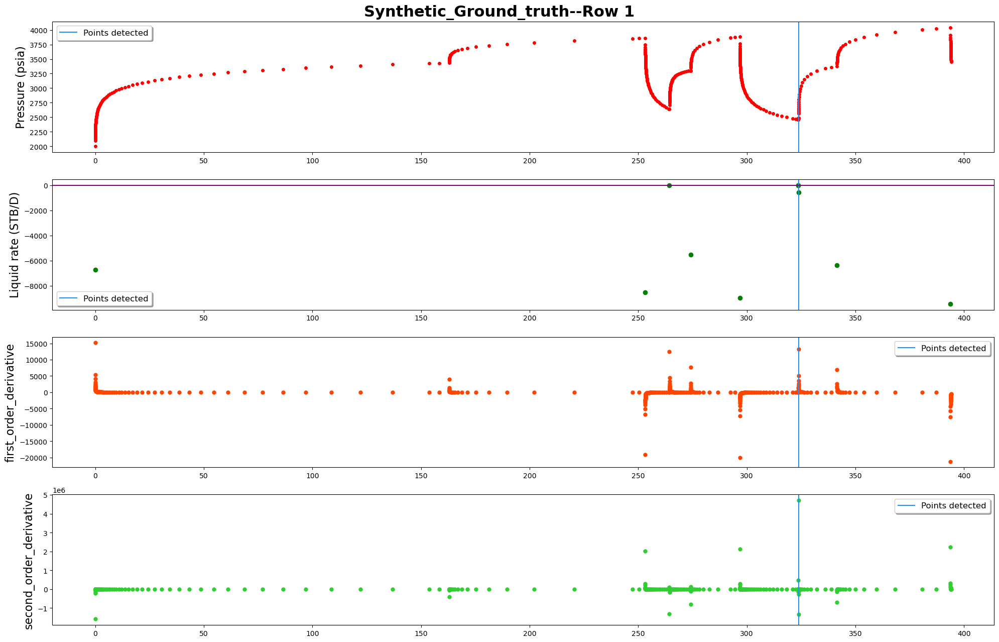

------row 2-----detected points:[745]


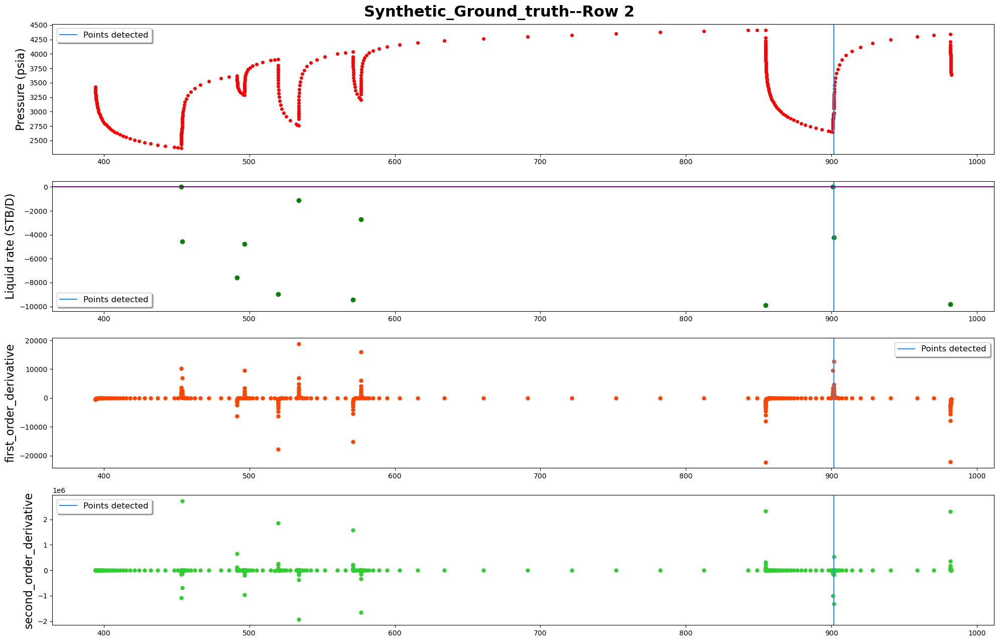

------row 3-----detected points:[860, 1151]


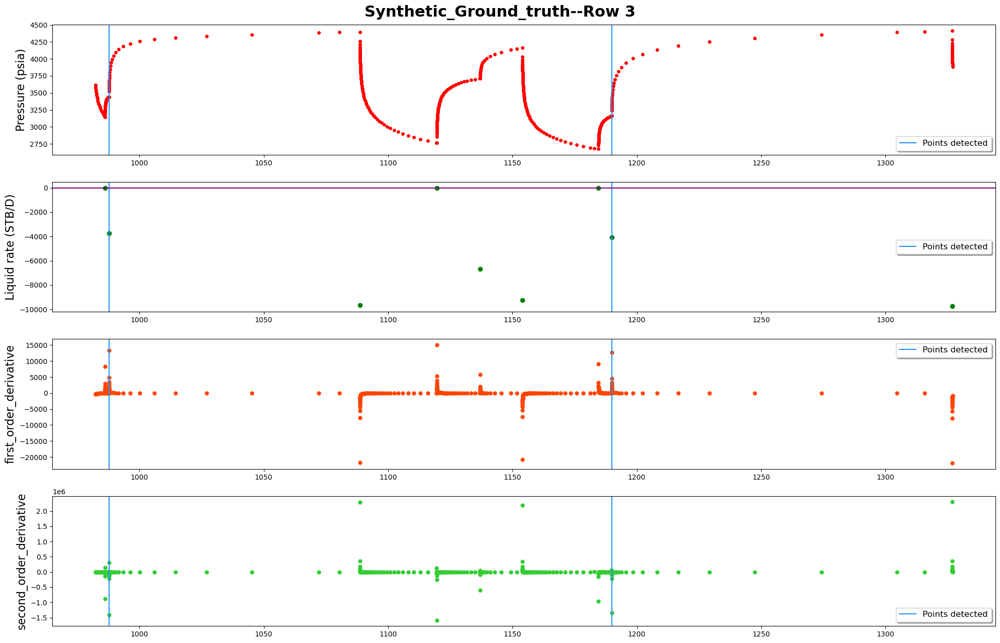

------row 4-----detected points:[1291, 1434]


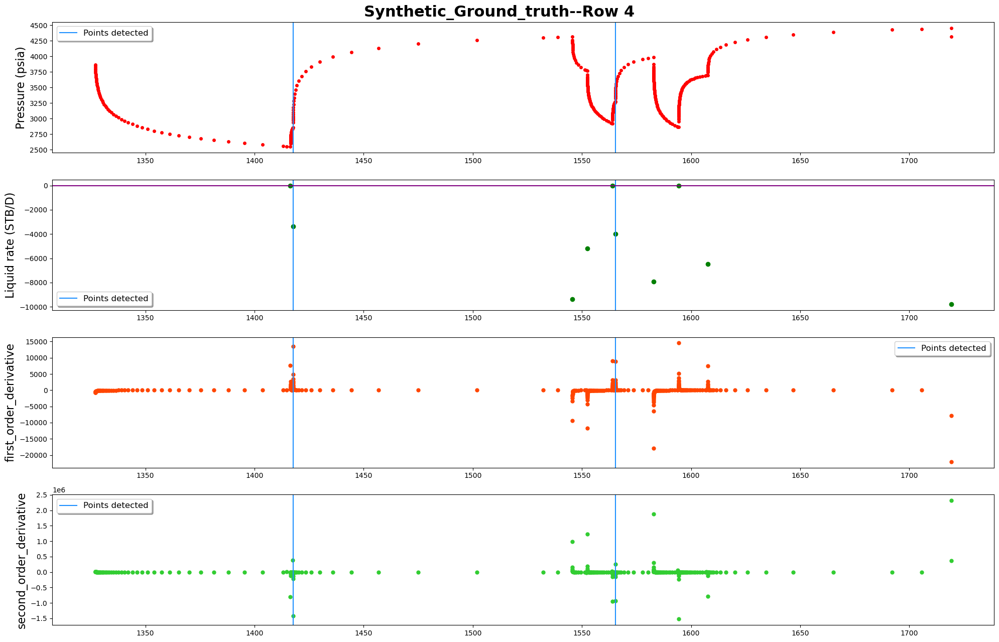

------row 5-----detected points:[1693, 1982]


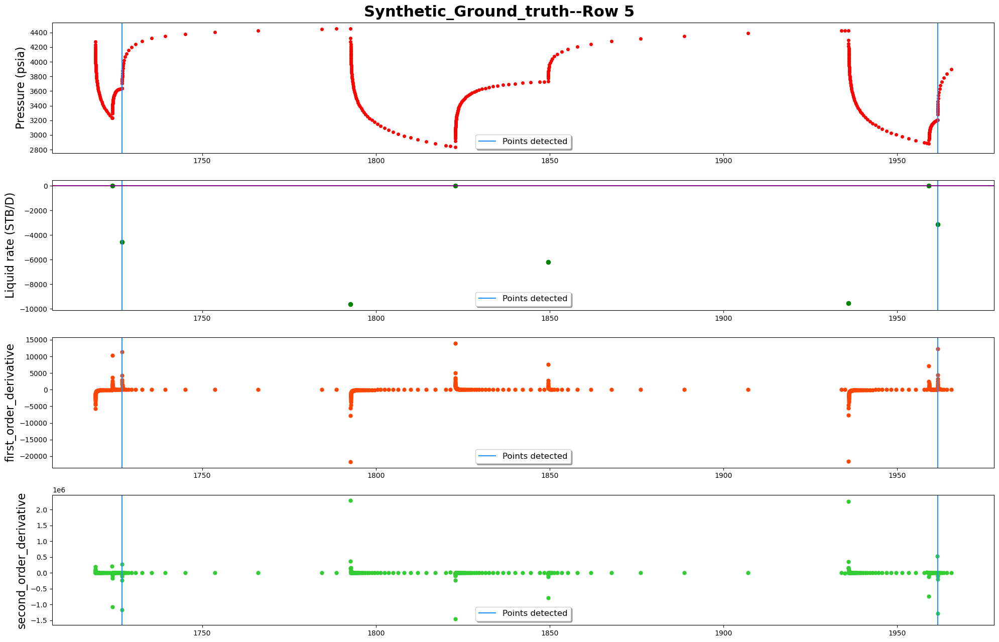

------row 6-----detected points:[2106, 2289]


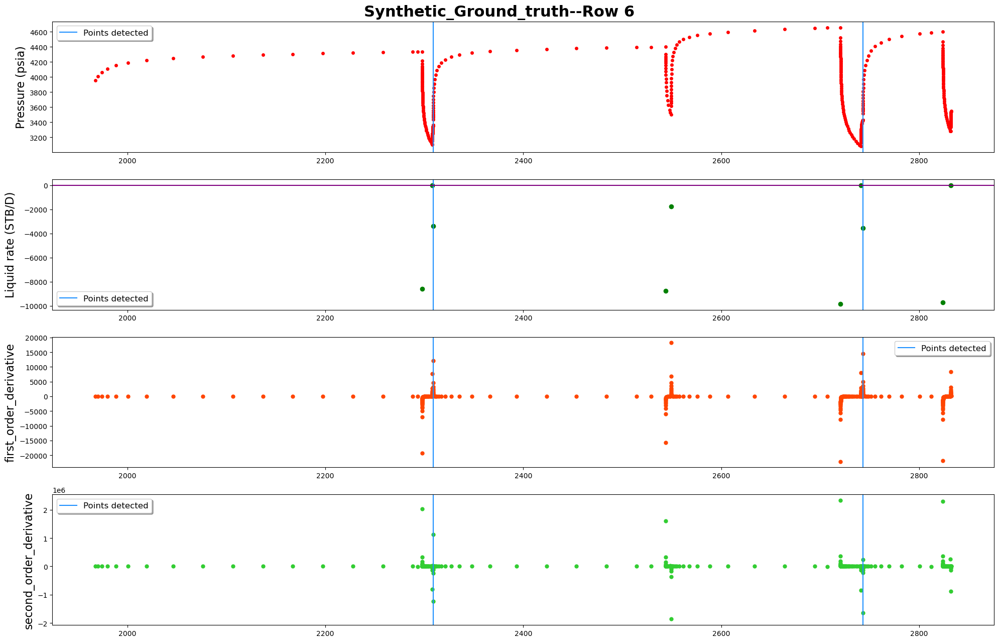

------row 7-----detected points:[2409, 2528]


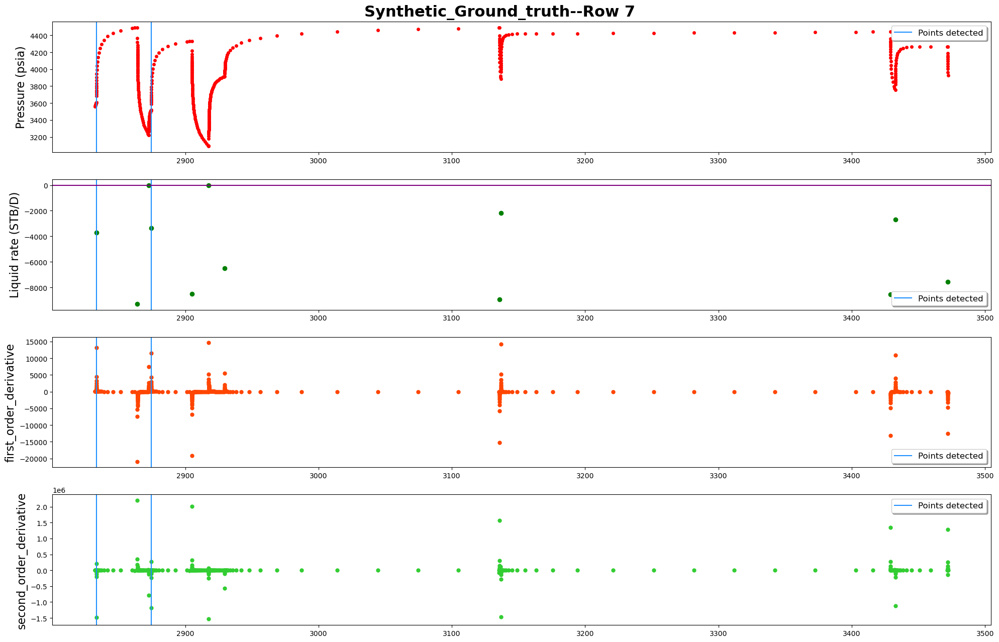

------row 8-----detected points:[2916, 3044]


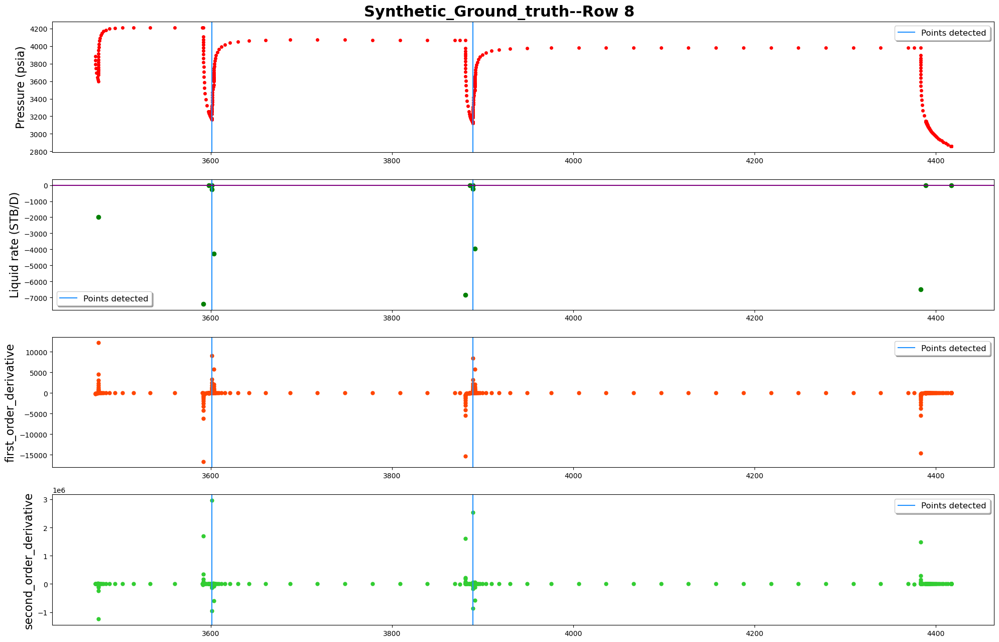

------row 9-----detected points:[3240]


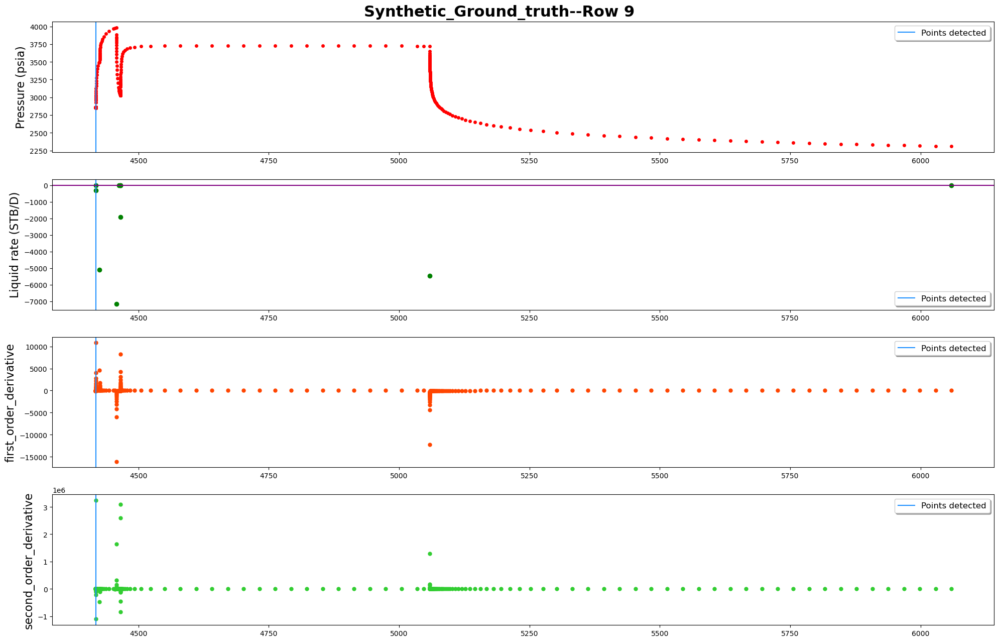

In [360]:
filename_toSave="../data_output/Synthetic_Ground_truth_patternDetection.pdf"
plot_name="Synthetic_Ground_truth"
plot_whole=False
plot_details=True
plot_statistics=False
PlotNSave(pressure_df,
          rate_df,
          breakpoints,
          [],
          data_inOneRow,
          plot_name,
          filename_toSave,
          plot_statistics,
          plot_whole,
          plot_details,
          colum_names)

In [349]:
all(np.array([1,2,3])<=np.array([2,2,4]))

True

In [282]:
len(pressure_measure)

3519

In [283]:
learn_pattern.curveData

,pressure_time_left,pressure_measure_left,pressure_time_right,pressure_measure_right
0,"[-0.024167, -0.018056, -0.012222, -0.006111, 0.0]","[-92.223616, -59.010174, -35.189133, -16.11097...","[0.0, 0.006111, 0.012222, 0.018056, 0.024167]","[0.0, 14.043148, 26.546557, 37.850582, 48.189208]"
1,"[-0.024167, -0.018333, -0.012222, -0.006111, 0.0]","[-73.053321, -49.23228, -30.154127, -14.043148...","[0.0, 0.006111, 0.011944, 0.018056, 0.024722]","[0.0, 12.50341, 23.807434, 34.14606, 44.586751]"
2,"[-0.024444, -0.018333, -0.012222, -0.006111, 0.0]","[-61.73569, -42.657536, -26.546557, -12.50341,...","[0.0, 0.005833, 0.011944, 0.018611, 0.026111]","[0.0, 11.304025, 21.642651, 32.083341, 42.856253]"
3,"[-0.024167, -0.018056, -0.011944, -0.005833, 0.0]","[-53.961561, -37.850582, -23.807434, -11.30402...","[0.0, 0.006111, 0.012778, 0.020278, 0.028611]","[0.0, 10.338626, 20.779317, 31.552229, 42.657655]"
4,"[-0.024167, -0.018056, -0.011944, -0.006111, 0.0]","[-48.189208, -34.14606, -21.642651, -10.338626...","[0.0, 0.006667, 0.014167, 0.0225, 0.031944]","[0.0, 10.440691, 21.213602, 32.319029, 43.756568]"
...,...,...,...,...
3504,"[-121.1775, -90.883056, -60.588889, -30.294444...","[25.047175, 18.324531, 11.927433, 5.827518, 0.0]","[0.0, 30.294167, 60.588611, 90.882778, 121.177...","[0.0, -5.576909, -10.922469, -16.053788, -20.9..."
3505,"[-121.177222, -90.883056, -60.588611, -30.2941...","[23.90144, 17.504342, 11.404427, 5.576909, 0.0]","[0.0, 30.294444, 60.588611, 90.883056, 121.1775]","[0.0, -5.34556, -10.476879, -15.409227, -20.15..."
3506,"[-121.1775, -90.883056, -60.588611, -30.294444...","[22.849902, 16.749987, 10.922469, 5.34556, 0.0]","[0.0, 30.294167, 60.588611, 90.883056, 121.177...","[0.0, -5.131319, -10.063668, -14.810731, -19.3..."
3507,"[-121.177222, -90.882778, -60.588611, -30.2941...","[21.881306, 16.053788, 10.476879, 5.131319, 0.0]","[0.0, 30.294444, 60.588889, 90.883056, 121.1775]","[0.0, -4.932348, -9.679412, -14.253508, -18.66..."


In [285]:
learn_pattern.curveData.iloc[1]["pressure_measure_left"]

[-73.053321, -49.23228, -30.154127, -14.043148, 0.0]

In [286]:
learn_pattern.parameters_PatternField

{'left top': array([ 1.48758493e+01,  8.31494875e+00, -5.21621472e+01,  1.87698675e-03]),
 'left bottom': array([ 5.68362323e+04, -6.25953527e+02,  3.51861465e+02, -9.06842313e-03]),
 'right top': array([ 1.98633499e+07, -1.02594438e+06,  2.00614262e+04,  6.45184429e-01]),
 'right bottom': array([ 9.05402441e+06, -4.85466766e+05,  1.00175843e+04, -2.75853337e+00])}

In [ ]:
# #spline interpolation
# x_i=np.linspace(0,10,100)
# f_spline=interpld(xdata,ydata,kind="cubic")
# y_is=f_spline(x_i)

In [ ]:
a=[1,3,5,6,7,9]
number=2


In [326]:
curveData= pd.DataFrame({'Odd':[[1,3,15,6,7,9]], 'Even':[[0,12,4,6,8,10]]})
data = pd.DataFrame({'Odd':[[1,3,5,6,7,9]], 'Even':[[0,2,4,6,8,10]]})
curveData=curveData.append(data,ignore_index=True)
# data=data.iloc[::-1]
display(curveData)
for index,row in curveData.iterrows():
#     print(row)
#     row['Odd'].reverse()
    print(row.index)
display(curveData)

,Odd,Even
0,"[1, 3, 15, 6, 7, 9]","[0, 12, 4, 6, 8, 10]"
1,"[1, 3, 5, 6, 7, 9]","[0, 2, 4, 6, 8, 10]"


Index(['Odd', 'Even'], dtype='object')
Index(['Odd', 'Even'], dtype='object')


,Odd,Even
0,"[1, 3, 15, 6, 7, 9]","[0, 12, 4, 6, 8, 10]"
1,"[1, 3, 5, 6, 7, 9]","[0, 2, 4, 6, 8, 10]"
